# Phase 1 - Exploration

## Import

In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import numpy as np
import random
import matplotlib.pyplot as plt
import time
import os
import imageio.v2 as imageio
from tqdm import tqdm
from maze_generator import generate_mazes
from matplotlib import rc
from IPython.display import HTML
import tempfile
import cv2
import matplotlib.animation as animation
from collections import deque

In [2]:
os.environ['CUDA_LAUNCH_BLOCKING'] = '1'

In [3]:
import torch._dynamo
torch._dynamo.config.suppress_errors = True

In [4]:
# 设置设备：GPU 可用则使用 GPU，否则使用 CPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("当前设备：", device)

当前设备： cuda


## Environment - 1st

In [5]:
mazes = generate_mazes(n=10000, maze_size=10)

  0%|          | 0/10000 [00:00<?, ?it/s]

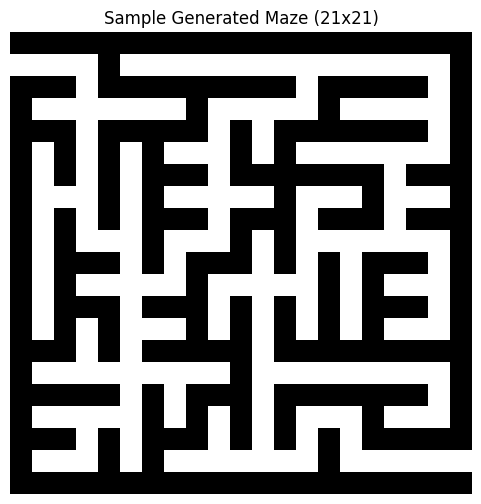

In [6]:
# 在训练之前查看生成的迷宫样例
def show_sample_maze(maze_np):
    plt.figure(figsize=(6, 6))
    plt.imshow(maze_np, cmap='gray', origin='upper')
    plt.title("Sample Generated Maze (21x21)")
    plt.axis('off')
    plt.show()

# 展示第一个迷宫样例
show_sample_maze(mazes[0])

In [7]:
class MazeEnv(nn.Module):
    def __init__(self, maze_list, max_steps, revisit_penalty_decay=0.99):
        super(MazeEnv, self).__init__()
        self.maze_list = maze_list
        self.max_steps = max_steps
        self.start_pos = (1, 0)  # 固定入口
        self.exit_pos = (19, 20)  # 固定出口
        self.current_pos = None
        self.steps_taken = None
        self.maze_state = None  # 当前环境状态
        self.original_maze = None  # 存储原始迷宫结构
        self.visited_cells = None  # 记录访问过的细胞，用于奖励
        self.path = None  # 记录当前 episode 的路径
        self.revisit_penalty_decay = revisit_penalty_decay
        self.revisit_penalty_multiplier = 1.0
        self.recent_positions = deque(maxlen=10)  # 存储最近的几个位置用于动态惩罚

    def _process_state(self, state):
        """
        对环境的状态进行处理：
        由于原始状态中：
            0 表示墙壁
            1 表示可通行区域（未访问）
            2 表示已访问区域
            4 表示智能体当前位置
        为适配 embedding 层，我们将 4 映射为 3，使得状态类别为 {0,1,2,3}
        """
        state = state.clone()
        state[state == 4] = 3
        return state

    def reset(self):
        # 随机选择一个迷宫
        maze_np = random.choice(self.maze_list)
        self.original_maze = torch.tensor(maze_np, dtype=torch.int)
        # 复制迷宫，将非零部分设为1（表示可通行区域）
        self.maze_state = self.original_maze.clone()
        self.maze_state[self.maze_state != 0] = 1
        self.current_pos = self.start_pos
        self.steps_taken = 0
        self.visited_cells = {self.start_pos}
        self.path = [self.start_pos]
        self.revisit_penalty_multiplier = 1.0
        self.recent_positions.clear()
        self.recent_positions.append(self.start_pos)
        # 将起点标记为智能体当前位置（原值为4，后续在 _process_state 中映射为3）
        self.maze_state[self.current_pos] = 4
        # 返回 one-hot 编码之前的离散状态，注意这里会在 _process_state 中进行映射
        return self._process_state(self.maze_state)

    def step(self, action):
        reward = -0.01  # 每步轻微惩罚，鼓励快速完成
        move_map = {0: (1, 0), 1: (0, 1), 2: (-1, 0), 3: (0, -1)}
        delta = move_map.get(action, (0, 0))
        new_r = self.current_pos[0] + delta[0]
        new_c = self.current_pos[1] + delta[1]
        new_pos = (new_r, new_c)

        # 检查边界和墙壁
        if new_r < 0 or new_r >= self.maze_state.shape[0] or new_c < 0 or new_c >= self.maze_state.shape[1]:
            reward -= 1.0
            new_pos = self.current_pos
        elif self.original_maze[new_r, new_c].item() == 0:
            reward -= 1.0
            new_pos = self.current_pos
        else:
            cell_value = self.maze_state[new_r, new_c].item()
            if cell_value == 1:
                reward += 10.0  # 探索新路径奖励
            elif (new_r, new_c) in self.visited_cells:
                # 动态调整重复路径惩罚
                if self.recent_positions.count((new_r, new_c)) > 1:
                    reward -= 0.5 * self.revisit_penalty_multiplier
                    self.revisit_penalty_multiplier *= self.revisit_penalty_decay
                else:
                    reward -= 0.5
            self.visited_cells.add(new_pos)

        # 更新当前位置，标记之前的位置为已访问（2），当前位置为智能体（4）
        if self.current_pos != self.exit_pos:
            self.maze_state[self.current_pos] = 2
        self.current_pos = new_pos
        self.maze_state[self.current_pos] = 4
        self.steps_taken += 1
        self.path.append(self.current_pos)
        self.recent_positions.append(self.current_pos)

        done = (self.current_pos == self.exit_pos) or (self.steps_taken >= self.max_steps)

        # 终止时根据探索程度给予奖励或惩罚
        if done:
            if self.current_pos == self.exit_pos:
                explored_percentage = len(self.visited_cells) / torch.sum(self.original_maze != 0).item()
                # 只有当探索了大部分区域后到达出口才有高额奖励
                if explored_percentage > 0.3:
                    reward += 100.0
                else:
                    reward -= 10.0  # 如果探索不够就到达出口，给予一定的惩罚
            else:
                unvisited_corridors = 0
                for r in range(self.maze_state.shape[0]):
                    for c in range(self.maze_state.shape[1]):
                        if self.original_maze[r, c].item() == 1 and (r, c) not in self.visited_cells and (r, c) != self.exit_pos:
                            unvisited_corridors += 0.2
                reward -= unvisited_corridors

        return self._process_state(self.maze_state), reward, done

In [8]:
env = MazeEnv(maze_list=mazes, max_steps=3000)
state = env.reset()

In [9]:
state

tensor([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [3, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0],
        [0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0],
        [0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0],
        [0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0],
        [0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0],
        [0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0],
        [0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0],
        [0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0],
        [0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0],
        [0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0],
        [0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 

## Vectorized Environment

In [10]:
class VectorizedMazeEnv:
    """
    可以将任意环境类（如 MazeEnv/Phase2MazeEnv/Phase3MazeEnv）并行化。
    每次 reset/step 都对 n_envs 个子环境做批量处理。
    """
    def __init__(self, env_class, maze_list, n_envs=32, max_steps=3000):
        """
        初始化 VectorizedMazeEnv 类。

        参数:
            env_class: 环境类，如 MazeEnv/Phase2MazeEnv/Phase3MazeEnv。
            maze_list: 迷宫列表，用于初始化子环境。
            n_envs: 子环境的数量，默认为 32。
            max_steps: 每个子环境的最大步数，默认为 3000。
        """
        self.n_envs = n_envs  # 子环境的数量
        # 创建 n_envs 个子环境实例，每个子环境使用相同的 maze_list 和 max_steps
        self.envs = [env_class(maze_list, max_steps) for _ in range(n_envs)]

    def reset(self):
        """
        重置所有子环境，返回 (n_envs, 21, 21) 的状态张量。

        返回值:
            states: (n_envs, 21, 21) 的状态张量。
        """
        states = []  # 初始化状态列表
        # 遍历每个子环境，调用其 reset 方法获取初始状态
        for env in self.envs:
            s = env.reset()  # 获取子环境的初始状态
            states.append(s.unsqueeze(0))  # 将状态添加到列表中，增加一个维度 (1, 21, 21)
        # 将所有子环境的状态拼接成一个张量 (n_envs, 21, 21)
        return torch.cat(states, dim=0)

    def step(self, actions):
        """
        对所有子环境执行一步操作。

        参数:
            actions: (n_envs,) 的整型张量/array，表示每个子环境的动作。

        返回值:
            next_states: (n_envs, 21, 21) 的下一个状态张量。
            rewards: (n_envs,) 的奖励张量。
            dones: (n_envs,) 的布尔张量，表示每个子环境是否结束。
        """
        batch_next_states = []  # 初始化下一个状态列表
        batch_rewards = []  # 初始化奖励列表
        batch_dones = []  # 初始化结束标志列表
        # 遍历每个子环境，执行对应的动作
        for i, env in enumerate(self.envs):
            next_s, r, d = env.step(actions[i])  # 执行动作，获取下一个状态、奖励和结束标志
            batch_next_states.append(next_s.unsqueeze(0))  # 将下一个状态添加到列表中，增加一个维度 (1, 21, 21)
            batch_rewards.append(r)  # 将奖励添加到列表中
            batch_dones.append(d)  # 将结束标志添加到列表中
        # 将所有子环境的下一个状态拼接成一个张量 (n_envs, 21, 21)
        next_states = torch.cat(batch_next_states, dim=0)
        # 将奖励列表转换为张量 (n_envs,)
        rewards = torch.tensor(batch_rewards, dtype=torch.float32)
        # 将结束标志列表转换为布尔张量 (n_envs,)
        dones = torch.tensor(batch_dones, dtype=torch.bool)
        return next_states, rewards, dones

## Model

In [11]:
class ActorCritic(nn.Module):
    """
    Actor-Critic 神经网络模型，用于强化学习中的策略梯度方法。
    该模型结合了策略网络（Actor）和价值网络（Critic）。
    """
    def __init__(self, num_embeddings=4, embed_dim=8):
        """
        初始化 ActorCritic 模型。

        参数:
            num_embeddings (int): 嵌入层的词汇量大小，默认为 4。
            embed_dim (int): 嵌入层的维度，默认为 8。
        """
        super(ActorCritic, self).__init__()
        
        # 嵌入层，将输入的离散值映射到连续的向量空间
        self.embedding = nn.Embedding(num_embeddings, embed_dim)
        
        # 卷积层，用于提取输入数据的空间特征
        # 第一层卷积：输入通道数为 embed_dim，输出通道数为 16
        self.conv1 = nn.Conv2d(embed_dim, 16, kernel_size=3, stride=1, padding=1)
        # 第二层卷积：输入通道数为 16，输出通道数为 32，步长为 2，用于减小特征图的尺寸
        self.conv2 = nn.Conv2d(16, 32, kernel_size=3, stride=2, padding=1)

        # 自动计算卷积层输出后的特征维度
        # 使用一个虚拟输入来推导卷积层的输出尺寸
        with torch.no_grad():
            dummy_input = torch.zeros(1, 21, 21, dtype=torch.long)  # 创建一个虚拟输入 (1, 21, 21)
            dummy_embedded = self.embedding(dummy_input)  # 嵌入后形状为 (1, 21, 21, embed_dim)
            dummy_embedded = dummy_embedded.permute(0, 3, 1, 2)  # 调整维度顺序为 (1, embed_dim, 21, 21)
            x = F.relu(self.conv1(dummy_embedded))  # 第一层卷积后激活，形状为 (1, 16, 21, 21)
            x = F.relu(self.conv2(x))  # 第二层卷积后激活，形状为 (1, 32, 10, 10)
            b, c, h, w = x.shape  # 获取输出的形状
            self.feature_dim = c  # 特征维度（通道数）
            self.spatial_dim = h * w  # 空间维度（高度 * 宽度）

        # LSTM 层，用于处理时间序列数据
        # 输入尺寸为卷积层输出的特征维度，隐藏层大小为 128
        self.lstm = nn.LSTM(input_size=self.feature_dim, hidden_size=128, num_layers=1, batch_first=True)
        
        # 全连接层，用于进一步处理 LSTM 的输出
        self.fc = nn.Linear(128, 128)
        
        # 策略头（Actor），输出动作的概率分布
        self.actor_head = nn.Linear(128, 4)
        
        # 价值头（Critic），输出状态的价值估计
        self.critic_head = nn.Linear(128, 1)

    def forward(self, x):
        """
        前向传播函数，处理输入数据并输出策略和价值。

        参数:
            x: 输入数据，形状为 (batch, 21, 21)，值域 {0, 1, 2, 3}，表示离散的输入状态。

        返回值:
            policy_logits: 策略网络的输出，形状为 (batch, 4)，表示动作的概率分布。
            value: 价值网络的输出，形状为 (batch, 1)，表示状态的价值估计。
        """
        # 将输入数据通过嵌入层，形状变为 (batch, 21, 21, embed_dim)
        x = self.embedding(x.long())
        # 调整维度顺序，将嵌入维度移到前面，形状变为 (batch, embed_dim, 21, 21)
        x = x.permute(0, 3, 1, 2)
        # 通过第一层卷积并激活，形状变为 (batch, 16, 21, 21)
        x = F.relu(self.conv1(x))
        # 通过第二层卷积并激活，形状变为 (batch, 32, 10, 10)
        x = F.relu(self.conv2(x))
        # 获取当前的批次大小和特征维度
        b, c, h, w = x.shape
        # 将特征图展平，形状变为 (batch, h*w, 32)
        x = x.view(b, c, h * w).transpose(1, 2)
        
        # 通过 LSTM 层，获取 LSTM 的输出和最后的隐藏状态
        lstm_out, (h_n, c_n) = self.lstm(x)  # h_n: (1, batch, 128)
        # 提取 LSTM 的最后一层隐藏状态，形状为 (batch, 128)
        lstm_feature = h_n[-1]
        
        # 通过全连接层进一步处理 LSTM 的输出
        x = F.relu(self.fc(lstm_feature))
        # 通过策略头输出动作的概率分布，形状为 (batch, 4)
        policy_logits = self.actor_head(x)
        # 通过价值头输出状态的价值估计，形状为 (batch, 1)
        value = self.critic_head(x)
        return policy_logits, value

## PPOAgent

In [12]:
class PPOAgent:
    def __init__(self, device, lr=0.001, gamma=0.98, lam=0.95,
                 clip_epsilon=0.2, update_epochs=4, batch_size=64):
        """
        初始化 PPOAgent 类。

        参数:
            device: 设备。
            lr: 学习率，默认为 0.001。
            gamma: 折扣因子，默认为 0.98。
            lam: GAE（Generalized Advantage Estimation）的参数，默认为 0.95。
            clip_epsilon: PPO 的截断参数，默认为 0.2。
            update_epochs: 更新的轮数，默认为 4。
            batch_size: 批量大小，默认为 64。
        """
        self.device = device
        self.gamma = gamma
        self.lam = lam
        self.clip_epsilon = clip_epsilon
        self.update_epochs = update_epochs
        self.batch_size = batch_size

        # 初始化策略网络
        self.policy = ActorCritic().to(self.device)
        # 初始化优化器
        self.optimizer = optim.Adam(self.policy.parameters(), lr=lr)

        # 用于记录训练过程中的损失和每集的步数
        self.costs = []
        self.steps_per_episode = []

    @torch.no_grad()
    def choose_action(self, state):
        """
        单环境动作选择（保持原接口）。
        state: (21,21)，输入状态。

        返回值:
            action: 选择的动作。
            log_prob: 动作的对数概率。
            value: 状态的价值估计。
        """
        state = state.unsqueeze(0).to(self.device)  # (1,21,21)，增加批次维度并移动到设备
        logits, value = self.policy(state)  # 通过策略网络获取策略和价值
        probs = F.softmax(logits, dim=1)  # 将 logits 转换为概率分布
        dist = torch.distributions.Categorical(probs)  # 定义一个分类分布
        action = dist.sample()  # 采样动作
        return action.item(), dist.log_prob(action), value.squeeze(0)  # 返回动作、对数概率和价值

    @torch.no_grad()
    def choose_action_batch(self, states):
        """
        并行环境动作选择接口。
        states: (n_envs,21,21)，输入状态。

        返回值:
            actions: 选择的动作。
            log_probs: 动作的对数概率。
            values: 状态的价值估计。
        """
        states = states.to(self.device)  # 将状态移动到设备
        logits, values = self.policy(states)  # 通过策略网络获取策略和价值
        probs = F.softmax(logits, dim=1)  # 将 logits 转换为概率分布
        dist = torch.distributions.Categorical(probs)  # 定义一个分类分布
        actions = dist.sample()  # 采样动作
        log_probs = dist.log_prob(actions)  # 计算动作的对数概率
        return actions, log_probs, values.squeeze(-1)  # 返回动作、对数概率和价值

    def compute_returns_and_advantages(self, trajectory):
        """
        计算回报和优势。
        trajectory: [(state, action, log_prob, reward, value, done, next_value), ...]，轨迹数据。

        返回值:
            returns: 回报。
            advantages: 优势。
        """
        rewards = [t[3] for t in trajectory]  # 提取奖励
        values = [t[4] for t in trajectory]  # 提取状态价值
        dones = [t[5] for t in trajectory]  # 提取结束标志
        next_values = [t[6] for t in trajectory]  # 提取下一个状态的价值

        # 转换为张量
        rewards = torch.tensor(rewards, dtype=torch.float32, device=self.device)
        values = torch.tensor(values, dtype=torch.float32, device=self.device)
        dones = torch.tensor(dones, dtype=torch.float32, device=self.device)
        next_values = torch.tensor(next_values, dtype=torch.float32, device=self.device)

        advantages = []  # 初始化优势列表
        gae = 0  # 初始化 GAE
        for i in reversed(range(len(rewards))):  # 逆序遍历
            mask = 1.0 - dones[i]  # 计算掩码
            delta = rewards[i] + self.gamma * next_values[i] * mask - values[i]  # 计算 TD 残差
            gae = delta + self.gamma * self.lam * mask * gae  # 更新 GAE
            advantages.insert(0, gae)  # 插入优势
        advantages = torch.tensor(advantages, dtype=torch.float32, device=self.device)  # 转换为张量
        returns = values + advantages  # 计算回报

        # 标准化优势
        advantages = (advantages - advantages.mean()) / (advantages.std() + 1e-8)
        return returns, advantages

    def update(self, trajectory):
        """
        更新策略网络。
        trajectory: [(state, action, log_prob, reward, value, done, next_value), ...]，轨迹数据。
        """
        # 整理批数据
        states = torch.stack([t[0] for t in trajectory]).to(self.device)  # 提取状态并堆叠
        actions = torch.tensor([t[1] for t in trajectory], dtype=torch.long, device=self.device)  # 提取动作
        old_log_probs = torch.stack([t[2] for t in trajectory]).detach().to(self.device)  # 提取旧的对数概率
        returns, advantages = self.compute_returns_and_advantages(trajectory)  # 计算回报和优势

        dataset_size = len(trajectory)  # 数据集大小
        indices = np.arange(dataset_size)  # 创建索引数组
        epoch_losses = []  # 初始化每轮的损失列表

        for _ in range(self.update_epochs):  # 更新多轮
            np.random.shuffle(indices)  # 打乱索引
            for start in range(0, dataset_size, self.batch_size):  # 分批处理
                end = start + self.batch_size
                batch_idx = indices[start:end]  # 当前批次的索引

                batch_states = states[batch_idx]  # 提取当前批次的状态
                batch_actions = actions[batch_idx]  # 提取当前批次的动作
                batch_old_log_probs = old_log_probs[batch_idx]  # 提取当前批次的旧对数概率
                batch_returns = returns[batch_idx]  # 提取当前批次的回报
                batch_adv = advantages[batch_idx]  # 提取当前批次的优势

                logits, value_pred = self.policy(batch_states)  # 通过策略网络获取策略和价值
                probs = F.softmax(logits, dim=1)  # 将 logits 转换为概率分布
                dist = torch.distributions.Categorical(probs)  # 定义一个分类分布

                new_log_probs = dist.log_prob(batch_actions)  # 计算新的对数概率
                ratio = torch.exp(new_log_probs - batch_old_log_probs)  # 计算概率比

                surr1 = ratio * batch_adv  # 计算第一个代理目标
                surr2 = torch.clamp(ratio, 1.0 - self.clip_epsilon, 1.0 + self.clip_epsilon) * batch_adv  # 计算第二个代理目标
                policy_loss = -torch.min(surr1, surr2).mean()  # 计算策略损失
                value_loss = F.mse_loss(value_pred.squeeze(-1), batch_returns)  # 计算价值损失
                entropy_loss = dist.entropy().mean()  # 计算熵损失

                loss = policy_loss + 0.5 * value_loss - 0.01 * entropy_loss  # 计算总损失

                self.optimizer.zero_grad()  # 清零梯度
                loss.backward()  # 反向传播
                nn.utils.clip_grad_norm_(self.policy.parameters(), 0.5)  # 梯度裁剪
                self.optimizer.step()  # 更新参数

                epoch_losses.append(loss.item())  # 记录损失

        self.costs.append(np.mean(epoch_losses))  # 记录平均损失

## Training

In [13]:
env_class = MazeEnv   # Phase 1 使用的环境
n_envs = 32           # 并行环境数量
max_steps = 3000      # 每个环境最大步数
vec_env = VectorizedMazeEnv(env_class, maze_list=mazes, n_envs=n_envs, max_steps=max_steps)

In [14]:
agent = PPOAgent(device=device, lr=0.001, gamma=0.98, lam=0.95,
                 clip_epsilon=0.2, update_epochs=4, batch_size=64)

In [15]:
# 定义训练的总轮数
num_episodes = 5000
# 已完成的轮数初始化为0
episodes_done = 0

# 使用tqdm创建一个进度条，用于显示训练进度
pbar = tqdm(total=num_episodes, desc="Training Progress")

# 当已完成的轮数小于总轮数时，继续训练
while episodes_done < num_episodes:
    # 一次并行收集 n_envs 个完整 episode
    # 重置环境，获取初始状态，形状为 (n_envs, 21, 21)
    states = vec_env.reset()
    # 初始化一个布尔列表，用于标记每个环境是否结束
    done_mask = [False] * n_envs
    # 初始化一个列表，用于存储每个环境的轨迹
    trajectories = [[] for _ in range(n_envs)]
    # 初始化一个列表，用于记录每个环境的总奖励
    total_rewards = [0.0] * n_envs
    # 初始化一个列表，用于记录每个环境的步数
    steps_counts = [0] * n_envs

    # 只要还有环境没结束，就继续
    while not all(done_mask):
        # 通过代理选择动作，获取动作、对数概率和价值
        actions, log_probs, values = agent.choose_action_batch(states)
        # 执行动作，获取下一个状态、奖励和结束标志
        next_states, rewards, dones = vec_env.step(actions.cpu().numpy())

        # 为了 GAE，更严格：在 step t 存储 next_value = V(s_{t+1})，先计算下个状态的价值
        with torch.no_grad():
            # 计算下一个状态的价值
            _, next_values = agent.policy(next_states.to(device))
            next_values = next_values.squeeze(-1).cpu()

        # 遍历每个环境
        for i in range(n_envs):
            if not done_mask[i]:  # 如果该环境未结束
                # 构建轨迹元素：(state, action, log_prob, reward, value, done, next_value)
                trajectories[i].append((
                    states[i].cpu(),          # 当前状态
                    actions[i].item(),        # 动作
                    log_probs[i].cpu(),       # 动作的对数概率
                    rewards[i].item(),        # 奖励
                    values[i].item(),         # 当前状态的价值
                    float(dones[i].item()),   # 结束标志（0/1）
                    0.0                       # next_value 占位符
                ))
                # 累加奖励
                total_rewards[i] += rewards[i].item()
                # 步数加1
                steps_counts[i] += 1

        # 更新每个环境上一步 transition 的 next_value 字段
        for i in range(n_envs):
            if not done_mask[i]:  # 如果该环境未结束
                if dones[i]:  # 如果该环境结束
                    # 更新轨迹中最后一个元素的 next_value 为 0
                    t_item = list(trajectories[i][-1])
                    t_item[-1] = 0.0
                    trajectories[i][-1] = tuple(t_item)
                else:  # 如果该环境未结束
                    # 更新轨迹中最后一个元素的 next_value 为下个状态的价值
                    t_item = list(trajectories[i][-1])
                    t_item[-1] = next_values[i].item()
                    trajectories[i][-1] = tuple(t_item)

        # 更新 done_mask
        for i in range(n_envs):
            if dones[i]:  # 如果该环境结束
                done_mask[i] = True

        # 更新状态为下一个状态
        states = next_states

    # 所有环境都结束后，对每条环境的轨迹做一次 PPO 更新
    for i in range(n_envs):
        # 记录每集的步数
        agent.steps_per_episode.append(steps_counts[i])
        # 使用轨迹数据更新代理
        agent.update(trajectories[i])
        # 已完成的轮数加1
        episodes_done += 1
        # 在进度条中打印当前轮数、奖励和步数
        tqdm.write(f"Episode {episodes_done}, Reward: {total_rewards[i]:.2f}, Steps: {steps_counts[i]}")
        # 更新进度条
        pbar.update(1)
        # 如果已完成的轮数达到总轮数，退出循环
        if episodes_done >= num_episodes:
            break

# 关闭进度条
pbar.close()

Training Progress:   0%|                                                          | 1/5000 [01:13<101:24:51, 73.03s/it]

Episode 1, Reward: -1365.16, Steps: 3000


Training Progress:   0%|                                                           | 2/5000 [01:17<45:17:50, 32.63s/it]

Episode 2, Reward: -1752.05, Steps: 3000


Training Progress:   0%|                                                           | 3/5000 [01:21<27:27:47, 19.79s/it]

Episode 3, Reward: -818.63, Steps: 3000


Training Progress:   0%|                                                           | 4/5000 [01:26<19:07:18, 13.78s/it]

Episode 4, Reward: -1674.96, Steps: 3000


Training Progress:   0%|                                                           | 5/5000 [01:31<14:31:43, 10.47s/it]

Episode 5, Reward: -1008.54, Steps: 3000


Training Progress:   0%|                                                           | 6/5000 [01:35<11:46:29,  8.49s/it]

Episode 6, Reward: -1033.53, Steps: 3000


Training Progress:   0%|                                                           | 7/5000 [01:40<10:00:11,  7.21s/it]

Episode 7, Reward: -1273.04, Steps: 3000


Training Progress:   0%|                                                            | 8/5000 [01:44<8:47:28,  6.34s/it]

Episode 8, Reward: -1751.34, Steps: 3000


Training Progress:   0%|                                                            | 9/5000 [01:49<8:03:16,  5.81s/it]

Episode 9, Reward: -1649.86, Steps: 3000


Training Progress:   0%|                                                           | 10/5000 [01:53<7:32:02,  5.44s/it]

Episode 10, Reward: -1617.34, Steps: 3000


Training Progress:   0%|▏                                                          | 11/5000 [01:58<7:08:15,  5.15s/it]

Episode 11, Reward: -1185.14, Steps: 3000


Training Progress:   0%|▏                                                          | 12/5000 [02:02<6:50:23,  4.94s/it]

Episode 12, Reward: -1304.77, Steps: 3000


Training Progress:   0%|▏                                                          | 13/5000 [02:07<6:37:50,  4.79s/it]

Episode 13, Reward: -834.84, Steps: 3000


Training Progress:   0%|▏                                                          | 14/5000 [02:11<6:27:46,  4.67s/it]

Episode 14, Reward: -1524.95, Steps: 3000


Training Progress:   0%|▏                                                          | 15/5000 [02:16<6:20:48,  4.58s/it]

Episode 15, Reward: -1616.35, Steps: 3000


Training Progress:   0%|▏                                                          | 16/5000 [02:20<6:18:13,  4.55s/it]

Episode 16, Reward: -1785.75, Steps: 3000


Training Progress:   0%|▏                                                          | 17/5000 [02:25<6:16:31,  4.53s/it]

Episode 17, Reward: -1222.16, Steps: 3000


Training Progress:   0%|▏                                                          | 18/5000 [02:29<6:16:01,  4.53s/it]

Episode 18, Reward: -1593.75, Steps: 3000


Training Progress:   0%|▏                                                          | 19/5000 [02:34<6:18:22,  4.56s/it]

Episode 19, Reward: -1205.97, Steps: 3000


Training Progress:   0%|▏                                                          | 20/5000 [02:38<6:16:31,  4.54s/it]

Episode 20, Reward: -1752.93, Steps: 3000


Training Progress:   0%|▏                                                          | 21/5000 [02:43<6:15:25,  4.52s/it]

Episode 21, Reward: -1590.35, Steps: 3000


Training Progress:   0%|▎                                                          | 22/5000 [02:47<6:15:13,  4.52s/it]

Episode 22, Reward: -1736.74, Steps: 3000


Training Progress:   0%|▎                                                          | 23/5000 [02:52<6:15:25,  4.53s/it]

Episode 23, Reward: -1720.64, Steps: 3000


Training Progress:   0%|▎                                                          | 24/5000 [02:56<6:14:00,  4.51s/it]

Episode 24, Reward: -1600.96, Steps: 3000


Training Progress:   0%|▎                                                          | 25/5000 [03:01<6:14:44,  4.52s/it]

Episode 25, Reward: -895.95, Steps: 3000


Training Progress:   1%|▎                                                          | 26/5000 [03:05<6:16:52,  4.55s/it]

Episode 26, Reward: -1305.54, Steps: 3000


Training Progress:   1%|▎                                                          | 27/5000 [03:10<6:14:43,  4.52s/it]

Episode 27, Reward: -1471.65, Steps: 3000


Training Progress:   1%|▎                                                          | 28/5000 [03:14<6:15:10,  4.53s/it]

Episode 28, Reward: -927.37, Steps: 3000


Training Progress:   1%|▎                                                          | 29/5000 [03:19<6:12:57,  4.50s/it]

Episode 29, Reward: -1049.06, Steps: 3000


Training Progress:   1%|▎                                                          | 30/5000 [03:23<6:11:49,  4.49s/it]

Episode 30, Reward: -1460.95, Steps: 3000


Training Progress:   1%|▎                                                          | 31/5000 [03:28<6:07:24,  4.44s/it]

Episode 31, Reward: -1536.65, Steps: 3000


Training Progress:   1%|▍                                                          | 32/5000 [03:32<6:06:03,  4.42s/it]

Episode 32, Reward: -1727.98, Steps: 3000


Training Progress:   1%|▍                                                         | 33/5000 [04:44<34:03:37, 24.69s/it]

Episode 33, Reward: -1285.20, Steps: 3000


Training Progress:   1%|▍                                                         | 34/5000 [04:48<25:41:05, 18.62s/it]

Episode 34, Reward: -1002.17, Steps: 3000


Training Progress:   1%|▍                                                         | 35/5000 [04:53<19:53:20, 14.42s/it]

Episode 35, Reward: -1145.54, Steps: 3000


Training Progress:   1%|▍                                                         | 36/5000 [04:58<15:50:40, 11.49s/it]

Episode 36, Reward: -925.17, Steps: 3000


Training Progress:   1%|▍                                                         | 37/5000 [05:02<12:58:07,  9.41s/it]

Episode 37, Reward: -897.36, Steps: 3000


Training Progress:   1%|▍                                                         | 38/5000 [05:07<10:58:59,  7.97s/it]

Episode 38, Reward: -1054.97, Steps: 3000


Training Progress:   1%|▍                                                          | 39/5000 [05:11<9:34:01,  6.94s/it]

Episode 39, Reward: -991.06, Steps: 3000


Training Progress:   1%|▍                                                          | 40/5000 [05:16<8:36:30,  6.25s/it]

Episode 40, Reward: -682.74, Steps: 3000


Training Progress:   1%|▍                                                          | 41/5000 [05:21<7:52:51,  5.72s/it]

Episode 41, Reward: -1145.66, Steps: 3000


Training Progress:   1%|▍                                                          | 42/5000 [05:25<7:23:21,  5.37s/it]

Episode 42, Reward: -1569.82, Steps: 3000


Training Progress:   1%|▌                                                          | 43/5000 [05:30<7:02:43,  5.12s/it]

Episode 43, Reward: -1437.07, Steps: 3000


Training Progress:   1%|▌                                                          | 44/5000 [05:34<6:51:28,  4.98s/it]

Episode 44, Reward: -1315.63, Steps: 3000


Training Progress:   1%|▌                                                          | 45/5000 [05:39<6:40:09,  4.85s/it]

Episode 45, Reward: -1563.85, Steps: 3000


Training Progress:   1%|▌                                                          | 46/5000 [05:43<6:33:44,  4.77s/it]

Episode 46, Reward: -1562.06, Steps: 3000


Training Progress:   1%|▌                                                          | 47/5000 [05:48<6:28:58,  4.71s/it]

Episode 47, Reward: -1282.84, Steps: 3000


Training Progress:   1%|▌                                                          | 48/5000 [05:53<6:31:02,  4.74s/it]

Episode 48, Reward: -668.16, Steps: 2971


Training Progress:   1%|▌                                                          | 49/5000 [05:57<6:28:28,  4.71s/it]

Episode 49, Reward: -1390.32, Steps: 3000


Training Progress:   1%|▌                                                          | 50/5000 [06:02<6:26:19,  4.68s/it]

Episode 50, Reward: -1519.24, Steps: 3000


Training Progress:   1%|▌                                                          | 51/5000 [06:07<6:24:13,  4.66s/it]

Episode 51, Reward: -1348.26, Steps: 3000


Training Progress:   1%|▌                                                          | 52/5000 [06:10<6:01:33,  4.38s/it]

Episode 52, Reward: -628.28, Steps: 2396


Training Progress:   1%|▋                                                          | 53/5000 [06:15<6:08:11,  4.47s/it]

Episode 53, Reward: -1652.28, Steps: 3000


Training Progress:   1%|▋                                                          | 54/5000 [06:20<6:11:30,  4.51s/it]

Episode 54, Reward: -1172.75, Steps: 3000


Training Progress:   1%|▋                                                          | 55/5000 [06:24<6:18:45,  4.60s/it]

Episode 55, Reward: -831.84, Steps: 3000


Training Progress:   1%|▋                                                          | 56/5000 [06:29<6:21:59,  4.64s/it]

Episode 56, Reward: -856.75, Steps: 3000


Training Progress:   1%|▋                                                          | 57/5000 [06:34<6:25:24,  4.68s/it]

Episode 57, Reward: -1135.56, Steps: 3000


Training Progress:   1%|▋                                                          | 58/5000 [06:38<6:14:12,  4.54s/it]

Episode 58, Reward: -925.24, Steps: 2734


Training Progress:   1%|▋                                                          | 59/5000 [06:43<6:14:40,  4.55s/it]

Episode 59, Reward: -1181.34, Steps: 3000


Training Progress:   1%|▋                                                          | 60/5000 [06:47<6:16:41,  4.58s/it]

Episode 60, Reward: -1323.55, Steps: 3000


Training Progress:   1%|▋                                                          | 61/5000 [06:52<6:18:00,  4.59s/it]

Episode 61, Reward: -1449.55, Steps: 3000


Training Progress:   1%|▋                                                          | 62/5000 [06:57<6:20:56,  4.63s/it]

Episode 62, Reward: -1611.92, Steps: 3000


Training Progress:   1%|▋                                                          | 63/5000 [07:01<6:19:01,  4.61s/it]

Episode 63, Reward: -1325.61, Steps: 3000


Training Progress:   1%|▊                                                          | 64/5000 [07:06<6:19:11,  4.61s/it]

Episode 64, Reward: -1456.64, Steps: 3000


Training Progress:   1%|▊                                                         | 65/5000 [08:14<32:12:46, 23.50s/it]

Episode 65, Reward: -1549.87, Steps: 3000


Training Progress:   1%|▊                                                         | 66/5000 [08:17<24:08:09, 17.61s/it]

Episode 66, Reward: -733.67, Steps: 2382


Training Progress:   1%|▊                                                         | 67/5000 [08:22<18:44:51, 13.68s/it]

Episode 67, Reward: -1313.93, Steps: 3000


Training Progress:   1%|▊                                                         | 68/5000 [08:26<14:56:45, 10.91s/it]

Episode 68, Reward: -1891.80, Steps: 3000


Training Progress:   1%|▊                                                         | 69/5000 [08:30<11:49:33,  8.63s/it]

Episode 69, Reward: -336.96, Steps: 2141


Training Progress:   1%|▊                                                         | 70/5000 [08:34<10:12:53,  7.46s/it]

Episode 70, Reward: -1421.44, Steps: 3000


Training Progress:   1%|▊                                                          | 71/5000 [08:39<9:03:15,  6.61s/it]

Episode 71, Reward: -1173.38, Steps: 3000


Training Progress:   1%|▊                                                          | 72/5000 [08:41<6:57:43,  5.09s/it]

Episode 72, Reward: 287.75, Steps: 956


Training Progress:   1%|▊                                                          | 73/5000 [08:45<6:46:08,  4.95s/it]

Episode 73, Reward: -1244.45, Steps: 3000


Training Progress:   1%|▊                                                          | 74/5000 [08:46<5:06:09,  3.73s/it]

Episode 74, Reward: 196.20, Steps: 556


Training Progress:   2%|▉                                                          | 75/5000 [08:51<5:29:28,  4.01s/it]

Episode 75, Reward: -1400.46, Steps: 3000


Training Progress:   2%|▉                                                          | 76/5000 [08:55<5:44:25,  4.20s/it]

Episode 76, Reward: -1669.42, Steps: 3000


Training Progress:   2%|▉                                                          | 77/5000 [09:00<5:54:20,  4.32s/it]

Episode 77, Reward: -1464.29, Steps: 3000


Training Progress:   2%|▉                                                          | 78/5000 [09:05<6:02:37,  4.42s/it]

Episode 78, Reward: -1324.14, Steps: 3000


Training Progress:   2%|▉                                                          | 79/5000 [09:08<5:42:26,  4.18s/it]

Episode 79, Reward: -484.89, Steps: 2331


Training Progress:   2%|▉                                                          | 80/5000 [09:10<4:43:10,  3.45s/it]

Episode 80, Reward: 16.14, Steps: 1127


Training Progress:   2%|▉                                                          | 81/5000 [09:11<3:41:04,  2.70s/it]

Episode 81, Reward: 332.50, Steps: 577


Training Progress:   2%|▉                                                          | 82/5000 [09:13<3:21:57,  2.46s/it]

Episode 82, Reward: -17.12, Steps: 1174


Training Progress:   2%|▉                                                          | 83/5000 [09:17<4:11:48,  3.07s/it]

Episode 83, Reward: -1639.35, Steps: 3000


Training Progress:   2%|▉                                                          | 84/5000 [09:22<4:49:33,  3.53s/it]

Episode 84, Reward: -1319.77, Steps: 3000


Training Progress:   2%|█                                                          | 85/5000 [09:25<4:38:26,  3.40s/it]

Episode 85, Reward: -345.74, Steps: 1968


Training Progress:   2%|█                                                          | 86/5000 [09:30<5:08:12,  3.76s/it]

Episode 86, Reward: -1356.50, Steps: 3000


Training Progress:   2%|█                                                          | 87/5000 [09:34<5:31:10,  4.04s/it]

Episode 87, Reward: -2022.92, Steps: 3000


Training Progress:   2%|█                                                          | 88/5000 [09:39<5:45:02,  4.21s/it]

Episode 88, Reward: -1754.58, Steps: 3000


Training Progress:   2%|█                                                          | 89/5000 [09:44<5:54:20,  4.33s/it]

Episode 89, Reward: -1338.37, Steps: 3000


Training Progress:   2%|█                                                          | 90/5000 [09:48<6:00:42,  4.41s/it]

Episode 90, Reward: -1269.17, Steps: 3000


Training Progress:   2%|█                                                          | 91/5000 [09:50<4:56:17,  3.62s/it]

Episode 91, Reward: 52.37, Steps: 1105


Training Progress:   2%|█                                                          | 92/5000 [09:55<5:22:03,  3.94s/it]

Episode 92, Reward: -1756.26, Steps: 3000


Training Progress:   2%|█                                                          | 93/5000 [09:59<5:38:55,  4.14s/it]

Episode 93, Reward: -1752.78, Steps: 3000


Training Progress:   2%|█                                                          | 94/5000 [10:01<4:38:55,  3.41s/it]

Episode 94, Reward: 120.81, Steps: 1043


Training Progress:   2%|█                                                          | 95/5000 [10:06<5:11:27,  3.81s/it]

Episode 95, Reward: -1138.94, Steps: 3000


Training Progress:   2%|█▏                                                         | 96/5000 [10:08<4:26:47,  3.26s/it]

Episode 96, Reward: -63.29, Steps: 1244


Training Progress:   2%|█▏                                                        | 97/5000 [11:18<31:39:19, 23.24s/it]

Episode 97, Reward: -1590.47, Steps: 3000


Training Progress:   2%|█▏                                                        | 98/5000 [11:22<24:02:40, 17.66s/it]

Episode 98, Reward: -2070.56, Steps: 3000


Training Progress:   2%|█▏                                                        | 99/5000 [11:27<18:44:30, 13.77s/it]

Episode 99, Reward: -1588.38, Steps: 3000


Training Progress:   2%|█▏                                                       | 100/5000 [11:29<13:58:34, 10.27s/it]

Episode 100, Reward: -58.68, Steps: 1292


Training Progress:   2%|█▏                                                       | 101/5000 [11:34<11:46:07,  8.65s/it]

Episode 101, Reward: -1628.21, Steps: 3000


Training Progress:   2%|█▏                                                       | 102/5000 [11:38<10:07:05,  7.44s/it]

Episode 102, Reward: -1750.74, Steps: 3000


Training Progress:   2%|█▏                                                        | 103/5000 [11:40<7:47:20,  5.73s/it]

Episode 103, Reward: 24.18, Steps: 1026


Training Progress:   2%|█▏                                                        | 104/5000 [11:45<7:14:47,  5.33s/it]

Episode 104, Reward: -1654.24, Steps: 3000


Training Progress:   2%|█▏                                                        | 105/5000 [11:49<6:57:55,  5.12s/it]

Episode 105, Reward: -1488.61, Steps: 3000


Training Progress:   2%|█▏                                                        | 106/5000 [11:52<6:07:52,  4.51s/it]

Episode 106, Reward: -452.69, Steps: 2030


Training Progress:   2%|█▏                                                        | 107/5000 [11:57<6:09:03,  4.53s/it]

Episode 107, Reward: -1379.85, Steps: 3000


Training Progress:   2%|█▎                                                        | 108/5000 [12:01<6:06:51,  4.50s/it]

Episode 108, Reward: -1057.41, Steps: 2849


Training Progress:   2%|█▎                                                        | 109/5000 [12:06<6:10:24,  4.54s/it]

Episode 109, Reward: -1574.68, Steps: 3000


Training Progress:   2%|█▎                                                        | 110/5000 [12:11<6:12:19,  4.57s/it]

Episode 110, Reward: -1794.55, Steps: 3000


Training Progress:   2%|█▎                                                        | 111/5000 [12:15<6:14:47,  4.60s/it]

Episode 111, Reward: -1866.54, Steps: 3000


Training Progress:   2%|█▎                                                        | 112/5000 [12:20<6:16:07,  4.62s/it]

Episode 112, Reward: -1516.19, Steps: 3000


Training Progress:   2%|█▎                                                        | 113/5000 [12:23<5:31:00,  4.06s/it]

Episode 113, Reward: -287.11, Steps: 1784


Training Progress:   2%|█▎                                                        | 114/5000 [12:27<5:43:51,  4.22s/it]

Episode 114, Reward: -1699.86, Steps: 3000


Training Progress:   2%|█▎                                                        | 115/5000 [12:29<4:47:08,  3.53s/it]

Episode 115, Reward: 43.19, Steps: 1179


Training Progress:   2%|█▎                                                        | 116/5000 [12:31<4:08:26,  3.05s/it]

Episode 116, Reward: 18.34, Steps: 1175


Training Progress:   2%|█▎                                                        | 117/5000 [12:36<4:52:25,  3.59s/it]

Episode 117, Reward: -1149.35, Steps: 3000


Training Progress:   2%|█▎                                                        | 118/5000 [12:41<5:16:46,  3.89s/it]

Episode 118, Reward: -1905.56, Steps: 3000


Training Progress:   2%|█▍                                                        | 119/5000 [12:45<5:34:19,  4.11s/it]

Episode 119, Reward: -1948.88, Steps: 3000


Training Progress:   2%|█▍                                                        | 120/5000 [12:50<5:47:47,  4.28s/it]

Episode 120, Reward: -1212.15, Steps: 3000


Training Progress:   2%|█▍                                                        | 121/5000 [12:53<5:17:32,  3.91s/it]

Episode 121, Reward: -207.31, Steps: 1933


Training Progress:   2%|█▍                                                        | 122/5000 [12:57<5:35:28,  4.13s/it]

Episode 122, Reward: -1972.24, Steps: 3000


Training Progress:   2%|█▍                                                        | 123/5000 [13:02<5:48:05,  4.28s/it]

Episode 123, Reward: -1552.66, Steps: 3000


Training Progress:   2%|█▍                                                        | 124/5000 [13:07<5:57:26,  4.40s/it]

Episode 124, Reward: -1570.77, Steps: 3000


Training Progress:   2%|█▍                                                        | 125/5000 [13:08<4:34:38,  3.38s/it]

Episode 125, Reward: 346.92, Steps: 635


Training Progress:   3%|█▍                                                        | 126/5000 [13:12<5:04:55,  3.75s/it]

Episode 126, Reward: -1601.24, Steps: 3000


Training Progress:   3%|█▍                                                        | 127/5000 [13:17<5:27:06,  4.03s/it]

Episode 127, Reward: -1939.70, Steps: 3000


Training Progress:   3%|█▍                                                        | 128/5000 [13:22<5:43:32,  4.23s/it]

Episode 128, Reward: -1762.56, Steps: 3000


Training Progress:   3%|█▍                                                       | 129/5000 [14:38<34:52:53, 25.78s/it]

Episode 129, Reward: -867.46, Steps: 3000


Training Progress:   3%|█▍                                                       | 130/5000 [14:43<26:17:44, 19.44s/it]

Episode 130, Reward: -1307.52, Steps: 3000


Training Progress:   3%|█▍                                                       | 131/5000 [14:47<20:17:55, 15.01s/it]

Episode 131, Reward: -1097.26, Steps: 3000


Training Progress:   3%|█▌                                                       | 132/5000 [14:52<16:06:13, 11.91s/it]

Episode 132, Reward: -1746.18, Steps: 3000


Training Progress:   3%|█▌                                                       | 133/5000 [14:56<13:07:24,  9.71s/it]

Episode 133, Reward: -1375.86, Steps: 3000


Training Progress:   3%|█▌                                                       | 134/5000 [15:01<11:04:24,  8.19s/it]

Episode 134, Reward: -1288.98, Steps: 3000


Training Progress:   3%|█▌                                                        | 135/5000 [15:06<9:38:37,  7.14s/it]

Episode 135, Reward: -3030.13, Steps: 3000


Training Progress:   3%|█▌                                                        | 136/5000 [15:10<8:37:43,  6.39s/it]

Episode 136, Reward: -1864.26, Steps: 3000


Training Progress:   3%|█▌                                                        | 137/5000 [15:15<7:53:47,  5.85s/it]

Episode 137, Reward: -948.52, Steps: 3000


Training Progress:   3%|█▌                                                        | 138/5000 [15:20<7:24:23,  5.48s/it]

Episode 138, Reward: -2125.16, Steps: 3000


Training Progress:   3%|█▌                                                        | 139/5000 [15:22<5:58:16,  4.42s/it]

Episode 139, Reward: -33.84, Steps: 1187


Training Progress:   3%|█▌                                                        | 140/5000 [15:24<4:58:14,  3.68s/it]

Episode 140, Reward: 109.24, Steps: 1333


Training Progress:   3%|█▋                                                        | 141/5000 [15:24<3:52:08,  2.87s/it]

Episode 141, Reward: 382.12, Steps: 600


Training Progress:   3%|█▋                                                        | 142/5000 [15:29<4:35:50,  3.41s/it]

Episode 142, Reward: -1180.08, Steps: 3000


Training Progress:   3%|█▋                                                        | 143/5000 [15:34<5:05:30,  3.77s/it]

Episode 143, Reward: -1421.29, Steps: 3000


Training Progress:   3%|█▋                                                        | 144/5000 [15:38<5:26:57,  4.04s/it]

Episode 144, Reward: -1673.83, Steps: 3000


Training Progress:   3%|█▋                                                        | 145/5000 [15:43<5:41:14,  4.22s/it]

Episode 145, Reward: -1043.60, Steps: 3000


Training Progress:   3%|█▋                                                        | 146/5000 [15:48<5:52:55,  4.36s/it]

Episode 146, Reward: -2396.46, Steps: 3000


Training Progress:   3%|█▋                                                        | 147/5000 [15:52<5:59:29,  4.44s/it]

Episode 147, Reward: -2510.69, Steps: 3000


Training Progress:   3%|█▋                                                        | 148/5000 [15:57<6:04:39,  4.51s/it]

Episode 148, Reward: -1279.85, Steps: 3000


Training Progress:   3%|█▋                                                        | 149/5000 [16:02<6:07:30,  4.55s/it]

Episode 149, Reward: -1357.90, Steps: 3000


Training Progress:   3%|█▋                                                        | 150/5000 [16:06<6:09:26,  4.57s/it]

Episode 150, Reward: -1550.85, Steps: 3000


Training Progress:   3%|█▊                                                        | 151/5000 [16:11<6:10:32,  4.58s/it]

Episode 151, Reward: -1268.26, Steps: 3000


Training Progress:   3%|█▊                                                        | 152/5000 [16:16<6:10:15,  4.58s/it]

Episode 152, Reward: -1517.22, Steps: 3000


Training Progress:   3%|█▊                                                        | 153/5000 [16:20<6:11:12,  4.60s/it]

Episode 153, Reward: -1115.09, Steps: 3000


Training Progress:   3%|█▊                                                        | 154/5000 [16:25<6:13:17,  4.62s/it]

Episode 154, Reward: -1294.43, Steps: 3000


Training Progress:   3%|█▊                                                        | 155/5000 [16:30<6:15:42,  4.65s/it]

Episode 155, Reward: -1213.97, Steps: 3000


Training Progress:   3%|█▊                                                        | 156/5000 [16:34<6:15:33,  4.65s/it]

Episode 156, Reward: -1266.46, Steps: 3000


Training Progress:   3%|█▊                                                        | 157/5000 [16:39<6:15:37,  4.65s/it]

Episode 157, Reward: -1717.16, Steps: 3000


Training Progress:   3%|█▊                                                        | 158/5000 [16:43<6:02:08,  4.49s/it]

Episode 158, Reward: -832.23, Steps: 2680


Training Progress:   3%|█▊                                                        | 159/5000 [16:48<6:06:04,  4.54s/it]

Episode 159, Reward: -1299.77, Steps: 3000


Training Progress:   3%|█▊                                                        | 160/5000 [16:52<6:06:51,  4.55s/it]

Episode 160, Reward: -1754.85, Steps: 3000


Training Progress:   3%|█▊                                                       | 161/5000 [18:04<33:18:28, 24.78s/it]

Episode 161, Reward: -1372.55, Steps: 3000


Training Progress:   3%|█▊                                                       | 162/5000 [18:09<25:11:23, 18.74s/it]

Episode 162, Reward: -1414.67, Steps: 3000


Training Progress:   3%|█▊                                                       | 163/5000 [18:13<19:20:15, 14.39s/it]

Episode 163, Reward: -1074.60, Steps: 2702


Training Progress:   3%|█▊                                                       | 164/5000 [18:18<15:24:25, 11.47s/it]

Episode 164, Reward: -2888.33, Steps: 3000


Training Progress:   3%|█▉                                                       | 165/5000 [18:21<12:15:07,  9.12s/it]

Episode 165, Reward: -596.70, Steps: 2342


Training Progress:   3%|█▉                                                       | 166/5000 [18:26<10:27:06,  7.78s/it]

Episode 166, Reward: -1647.35, Steps: 3000


Training Progress:   3%|█▉                                                        | 167/5000 [18:31<9:11:09,  6.84s/it]

Episode 167, Reward: -1066.04, Steps: 3000


Training Progress:   3%|█▉                                                        | 168/5000 [18:35<8:04:35,  6.02s/it]

Episode 168, Reward: -748.53, Steps: 2582


Training Progress:   3%|█▉                                                        | 169/5000 [18:39<7:31:47,  5.61s/it]

Episode 169, Reward: -1708.98, Steps: 3000


Training Progress:   3%|█▉                                                        | 170/5000 [18:44<7:10:39,  5.35s/it]

Episode 170, Reward: -1297.52, Steps: 3000


Training Progress:   3%|█▉                                                        | 171/5000 [18:49<6:53:34,  5.14s/it]

Episode 171, Reward: -887.17, Steps: 3000


Training Progress:   3%|█▉                                                        | 172/5000 [18:52<6:05:15,  4.54s/it]

Episode 172, Reward: -603.62, Steps: 1989


Training Progress:   3%|██                                                        | 173/5000 [18:54<5:13:31,  3.90s/it]

Episode 173, Reward: -99.49, Steps: 1530


Training Progress:   3%|██                                                        | 174/5000 [18:59<5:30:29,  4.11s/it]

Episode 174, Reward: -1915.87, Steps: 3000


Training Progress:   4%|██                                                        | 175/5000 [19:04<5:43:06,  4.27s/it]

Episode 175, Reward: -1340.07, Steps: 3000


Training Progress:   4%|██                                                        | 176/5000 [19:07<5:12:57,  3.89s/it]

Episode 176, Reward: -619.67, Steps: 1886


Training Progress:   4%|██                                                        | 177/5000 [19:11<5:31:40,  4.13s/it]

Episode 177, Reward: -1406.84, Steps: 3000


Training Progress:   4%|██                                                        | 178/5000 [19:16<5:43:31,  4.27s/it]

Episode 178, Reward: -2170.02, Steps: 3000


Training Progress:   4%|██                                                        | 179/5000 [19:20<5:26:59,  4.07s/it]

Episode 179, Reward: -300.40, Steps: 2368


Training Progress:   4%|██                                                        | 180/5000 [19:24<5:38:57,  4.22s/it]

Episode 180, Reward: -1545.85, Steps: 3000


Training Progress:   4%|██                                                        | 181/5000 [19:29<5:48:16,  4.34s/it]

Episode 181, Reward: -1245.07, Steps: 3000


Training Progress:   4%|██                                                        | 182/5000 [19:33<5:57:05,  4.45s/it]

Episode 182, Reward: -1684.23, Steps: 3000


Training Progress:   4%|██                                                        | 183/5000 [19:38<6:03:00,  4.52s/it]

Episode 183, Reward: -1293.05, Steps: 3000


Training Progress:   4%|██▏                                                       | 184/5000 [19:43<6:07:18,  4.58s/it]

Episode 184, Reward: -1358.85, Steps: 3000


Training Progress:   4%|██▏                                                       | 185/5000 [19:47<6:08:39,  4.59s/it]

Episode 185, Reward: -935.34, Steps: 3000


Training Progress:   4%|██▏                                                       | 186/5000 [19:52<6:08:19,  4.59s/it]

Episode 186, Reward: -1475.47, Steps: 3000


Training Progress:   4%|██▏                                                       | 187/5000 [19:57<6:08:24,  4.59s/it]

Episode 187, Reward: -1065.76, Steps: 3000


Training Progress:   4%|██▏                                                       | 188/5000 [20:01<6:08:46,  4.60s/it]

Episode 188, Reward: -1245.48, Steps: 3000


Training Progress:   4%|██▏                                                       | 189/5000 [20:06<6:08:56,  4.60s/it]

Episode 189, Reward: -1691.31, Steps: 3000


Training Progress:   4%|██▏                                                       | 190/5000 [20:07<4:43:52,  3.54s/it]

Episode 190, Reward: 295.97, Steps: 675


Training Progress:   4%|██▏                                                       | 191/5000 [20:10<4:38:37,  3.48s/it]

Episode 191, Reward: -302.16, Steps: 2128


Training Progress:   4%|██▏                                                       | 192/5000 [20:15<5:06:49,  3.83s/it]

Episode 192, Reward: -1938.45, Steps: 3000


Training Progress:   4%|██▏                                                      | 193/5000 [21:28<32:41:51, 24.49s/it]

Episode 193, Reward: -2920.59, Steps: 3000


Training Progress:   4%|██▏                                                      | 194/5000 [21:32<24:44:40, 18.54s/it]

Episode 194, Reward: -2547.32, Steps: 3000


Training Progress:   4%|██▏                                                      | 195/5000 [21:37<19:12:10, 14.39s/it]

Episode 195, Reward: -2258.09, Steps: 3000


Training Progress:   4%|██▏                                                      | 196/5000 [21:42<15:18:19, 11.47s/it]

Episode 196, Reward: -2600.37, Steps: 3000


Training Progress:   4%|██▏                                                      | 197/5000 [21:46<12:35:33,  9.44s/it]

Episode 197, Reward: -1419.18, Steps: 3000


Training Progress:   4%|██▎                                                      | 198/5000 [21:51<10:41:50,  8.02s/it]

Episode 198, Reward: -1273.20, Steps: 3000


Training Progress:   4%|██▎                                                       | 199/5000 [21:56<9:22:21,  7.03s/it]

Episode 199, Reward: -1285.99, Steps: 3000


Training Progress:   4%|██▎                                                       | 200/5000 [22:00<8:26:11,  6.33s/it]

Episode 200, Reward: -1720.25, Steps: 3000


Training Progress:   4%|██▎                                                       | 201/5000 [22:05<7:48:48,  5.86s/it]

Episode 201, Reward: -2662.97, Steps: 3000


Training Progress:   4%|██▎                                                       | 202/5000 [22:10<7:21:00,  5.51s/it]

Episode 202, Reward: -1630.29, Steps: 3000


Training Progress:   4%|██▎                                                       | 203/5000 [22:15<7:00:54,  5.26s/it]

Episode 203, Reward: -1708.04, Steps: 3000


Training Progress:   4%|██▎                                                       | 204/5000 [22:19<6:48:08,  5.11s/it]

Episode 204, Reward: -2613.77, Steps: 3000


Training Progress:   4%|██▍                                                       | 205/5000 [22:24<6:39:10,  4.99s/it]

Episode 205, Reward: -2224.02, Steps: 3000


Training Progress:   4%|██▍                                                       | 206/5000 [22:29<6:32:21,  4.91s/it]

Episode 206, Reward: -2256.72, Steps: 3000


Training Progress:   4%|██▍                                                       | 207/5000 [22:34<6:28:53,  4.87s/it]

Episode 207, Reward: -1668.69, Steps: 3000


Training Progress:   4%|██▍                                                       | 208/5000 [22:38<6:24:33,  4.82s/it]

Episode 208, Reward: -2806.32, Steps: 3000


Training Progress:   4%|██▍                                                       | 209/5000 [22:41<5:43:49,  4.31s/it]

Episode 209, Reward: -638.84, Steps: 2028


Training Progress:   4%|██▍                                                       | 210/5000 [22:44<5:03:57,  3.81s/it]

Episode 210, Reward: -351.37, Steps: 1687


Training Progress:   4%|██▍                                                       | 211/5000 [22:49<5:24:04,  4.06s/it]

Episode 211, Reward: -1524.89, Steps: 3000


Training Progress:   4%|██▍                                                       | 212/5000 [22:53<5:39:19,  4.25s/it]

Episode 212, Reward: -1506.47, Steps: 3000


Training Progress:   4%|██▍                                                       | 213/5000 [22:58<5:47:19,  4.35s/it]

Episode 213, Reward: -1831.38, Steps: 3000


Training Progress:   4%|██▍                                                       | 214/5000 [23:03<5:55:07,  4.45s/it]

Episode 214, Reward: -1531.39, Steps: 3000


Training Progress:   4%|██▍                                                       | 215/5000 [23:07<6:00:55,  4.53s/it]

Episode 215, Reward: -2810.66, Steps: 3000


Training Progress:   4%|██▌                                                       | 216/5000 [23:09<5:04:06,  3.81s/it]

Episode 216, Reward: -410.01, Steps: 1301


Training Progress:   4%|██▌                                                       | 217/5000 [23:14<5:23:47,  4.06s/it]

Episode 217, Reward: -1907.37, Steps: 3000


Training Progress:   4%|██▌                                                       | 218/5000 [23:19<5:36:09,  4.22s/it]

Episode 218, Reward: -1843.07, Steps: 3000


Training Progress:   4%|██▌                                                       | 219/5000 [23:23<5:46:10,  4.34s/it]

Episode 219, Reward: -1535.02, Steps: 3000


Training Progress:   4%|██▌                                                       | 220/5000 [23:28<5:52:47,  4.43s/it]

Episode 220, Reward: -1499.58, Steps: 3000


Training Progress:   4%|██▌                                                       | 221/5000 [23:33<5:57:28,  4.49s/it]

Episode 221, Reward: -1596.28, Steps: 3000


Training Progress:   4%|██▌                                                       | 222/5000 [23:37<6:02:40,  4.55s/it]

Episode 222, Reward: -2583.64, Steps: 3000


Training Progress:   4%|██▌                                                       | 223/5000 [23:42<6:05:12,  4.59s/it]

Episode 223, Reward: -2531.64, Steps: 3000


Training Progress:   4%|██▌                                                       | 224/5000 [23:47<6:07:51,  4.62s/it]

Episode 224, Reward: -1877.19, Steps: 3000


Training Progress:   4%|██▌                                                      | 225/5000 [25:01<33:48:27, 25.49s/it]

Episode 225, Reward: -1412.57, Steps: 3000


Training Progress:   5%|██▌                                                      | 226/5000 [25:06<25:31:52, 19.25s/it]

Episode 226, Reward: -2584.55, Steps: 3000


Training Progress:   5%|██▌                                                      | 227/5000 [25:10<19:43:55, 14.88s/it]

Episode 227, Reward: -1817.89, Steps: 3000


Training Progress:   5%|██▌                                                      | 228/5000 [25:15<15:39:42, 11.82s/it]

Episode 228, Reward: -1848.68, Steps: 3000


Training Progress:   5%|██▌                                                      | 229/5000 [25:19<12:48:32,  9.67s/it]

Episode 229, Reward: -1693.93, Steps: 3000


Training Progress:   5%|██▌                                                      | 230/5000 [25:23<10:24:57,  7.86s/it]

Episode 230, Reward: -761.43, Steps: 2330


Training Progress:   5%|██▋                                                       | 231/5000 [25:28<9:09:33,  6.91s/it]

Episode 231, Reward: -1761.68, Steps: 3000


Training Progress:   5%|██▋                                                       | 232/5000 [25:33<8:16:22,  6.25s/it]

Episode 232, Reward: -1292.06, Steps: 3000


Training Progress:   5%|██▋                                                       | 233/5000 [25:37<7:38:47,  5.77s/it]

Episode 233, Reward: -1774.70, Steps: 3000


Training Progress:   5%|██▋                                                       | 234/5000 [25:42<7:11:21,  5.43s/it]

Episode 234, Reward: -1793.60, Steps: 3000


Training Progress:   5%|██▋                                                       | 235/5000 [25:47<6:53:16,  5.20s/it]

Episode 235, Reward: -2349.90, Steps: 3000


Training Progress:   5%|██▋                                                       | 236/5000 [25:51<6:41:29,  5.06s/it]

Episode 236, Reward: -1903.87, Steps: 3000


Training Progress:   5%|██▋                                                       | 237/5000 [25:56<6:32:32,  4.94s/it]

Episode 237, Reward: -1287.54, Steps: 3000


Training Progress:   5%|██▊                                                       | 238/5000 [25:58<5:35:26,  4.23s/it]

Episode 238, Reward: -160.34, Steps: 1560


Training Progress:   5%|██▊                                                       | 239/5000 [26:03<5:47:09,  4.38s/it]

Episode 239, Reward: -2251.73, Steps: 3000


Training Progress:   5%|██▊                                                       | 240/5000 [26:08<5:55:31,  4.48s/it]

Episode 240, Reward: -2672.22, Steps: 3000


Training Progress:   5%|██▊                                                       | 241/5000 [26:13<6:01:26,  4.56s/it]

Episode 241, Reward: -1798.58, Steps: 3000


Training Progress:   5%|██▊                                                       | 242/5000 [26:17<6:05:21,  4.61s/it]

Episode 242, Reward: -2022.84, Steps: 3000


Training Progress:   5%|██▊                                                       | 243/5000 [26:22<6:06:24,  4.62s/it]

Episode 243, Reward: -2660.66, Steps: 3000


Training Progress:   5%|██▊                                                       | 244/5000 [26:27<6:07:27,  4.64s/it]

Episode 244, Reward: -2450.23, Steps: 3000


Training Progress:   5%|██▊                                                       | 245/5000 [26:31<6:08:56,  4.66s/it]

Episode 245, Reward: -2089.02, Steps: 3000


Training Progress:   5%|██▊                                                       | 246/5000 [26:36<6:08:17,  4.65s/it]

Episode 246, Reward: -1717.41, Steps: 3000


Training Progress:   5%|██▊                                                       | 247/5000 [26:41<6:06:20,  4.62s/it]

Episode 247, Reward: -1761.61, Steps: 3000


Training Progress:   5%|██▉                                                       | 248/5000 [26:45<6:06:53,  4.63s/it]

Episode 248, Reward: -2688.10, Steps: 3000


Training Progress:   5%|██▉                                                       | 249/5000 [26:50<6:07:36,  4.64s/it]

Episode 249, Reward: -1169.45, Steps: 3000


Training Progress:   5%|██▉                                                       | 250/5000 [26:55<6:08:17,  4.65s/it]

Episode 250, Reward: -1176.36, Steps: 3000


Training Progress:   5%|██▉                                                       | 251/5000 [26:59<6:08:13,  4.65s/it]

Episode 251, Reward: -1861.38, Steps: 3000


Training Progress:   5%|██▉                                                       | 252/5000 [27:04<6:08:07,  4.65s/it]

Episode 252, Reward: -1959.90, Steps: 3000


Training Progress:   5%|██▉                                                       | 253/5000 [27:09<6:07:34,  4.65s/it]

Episode 253, Reward: -1229.43, Steps: 3000


Training Progress:   5%|██▉                                                       | 254/5000 [27:13<6:07:54,  4.65s/it]

Episode 254, Reward: -1688.93, Steps: 3000


Training Progress:   5%|██▉                                                       | 255/5000 [27:18<6:07:50,  4.65s/it]

Episode 255, Reward: -1515.04, Steps: 3000


Training Progress:   5%|██▉                                                       | 256/5000 [27:22<6:07:17,  4.65s/it]

Episode 256, Reward: -1486.09, Steps: 3000


Training Progress:   5%|██▉                                                      | 257/5000 [28:35<32:57:02, 25.01s/it]

Episode 257, Reward: -1686.35, Steps: 3000


Training Progress:   5%|██▉                                                      | 258/5000 [28:36<23:25:25, 17.78s/it]

Episode 258, Reward: 369.55, Steps: 548


Training Progress:   5%|██▉                                                      | 259/5000 [28:41<18:13:47, 13.84s/it]

Episode 259, Reward: -1567.21, Steps: 3000


Training Progress:   5%|██▉                                                      | 260/5000 [28:45<14:35:28, 11.08s/it]

Episode 260, Reward: -1467.27, Steps: 3000


Training Progress:   5%|██▉                                                      | 261/5000 [28:50<12:02:30,  9.15s/it]

Episode 261, Reward: -1639.41, Steps: 3000


Training Progress:   5%|██▉                                                      | 262/5000 [28:55<10:16:45,  7.81s/it]

Episode 262, Reward: -860.95, Steps: 3000


Training Progress:   5%|███                                                       | 263/5000 [28:59<9:01:40,  6.86s/it]

Episode 263, Reward: -2136.51, Steps: 3000


Training Progress:   5%|███                                                       | 264/5000 [29:04<8:10:00,  6.21s/it]

Episode 264, Reward: -1280.81, Steps: 3000


Training Progress:   5%|███                                                       | 265/5000 [29:09<7:33:58,  5.75s/it]

Episode 265, Reward: -1718.99, Steps: 3000


Training Progress:   5%|███                                                       | 266/5000 [29:13<7:07:39,  5.42s/it]

Episode 266, Reward: -1977.17, Steps: 3000


Training Progress:   5%|███                                                       | 267/5000 [29:18<6:49:40,  5.19s/it]

Episode 267, Reward: -1010.26, Steps: 3000


Training Progress:   5%|███                                                       | 268/5000 [29:21<5:56:14,  4.52s/it]

Episode 268, Reward: -362.56, Steps: 1884


Training Progress:   5%|███                                                       | 269/5000 [29:25<5:57:56,  4.54s/it]

Episode 269, Reward: -1082.96, Steps: 3000


Training Progress:   5%|███▏                                                      | 270/5000 [29:30<6:01:39,  4.59s/it]

Episode 270, Reward: -870.41, Steps: 3000


Training Progress:   5%|███▏                                                      | 271/5000 [29:35<6:03:38,  4.61s/it]

Episode 271, Reward: -2379.87, Steps: 3000


Training Progress:   5%|███▏                                                      | 272/5000 [29:39<6:05:40,  4.64s/it]

Episode 272, Reward: -2575.35, Steps: 3000


Training Progress:   5%|███▏                                                      | 273/5000 [29:44<6:06:43,  4.65s/it]

Episode 273, Reward: -1393.97, Steps: 3000


Training Progress:   5%|███▏                                                      | 274/5000 [29:49<6:07:47,  4.67s/it]

Episode 274, Reward: -1735.26, Steps: 3000


Training Progress:   6%|███▏                                                      | 275/5000 [29:54<6:08:31,  4.68s/it]

Episode 275, Reward: -1790.12, Steps: 3000


Training Progress:   6%|███▏                                                      | 276/5000 [29:58<6:07:58,  4.67s/it]

Episode 276, Reward: -1024.13, Steps: 3000


Training Progress:   6%|███▏                                                      | 277/5000 [30:00<4:59:28,  3.80s/it]

Episode 277, Reward: -234.69, Steps: 1107


Training Progress:   6%|███▏                                                      | 278/5000 [30:05<5:22:07,  4.09s/it]

Episode 278, Reward: -1084.78, Steps: 3000


Training Progress:   6%|███▏                                                      | 279/5000 [30:09<5:35:45,  4.27s/it]

Episode 279, Reward: -1397.13, Steps: 3000


Training Progress:   6%|███▏                                                      | 280/5000 [30:14<5:46:07,  4.40s/it]

Episode 280, Reward: -1304.20, Steps: 3000


Training Progress:   6%|███▎                                                      | 281/5000 [30:19<5:52:42,  4.48s/it]

Episode 281, Reward: -1073.32, Steps: 3000


Training Progress:   6%|███▎                                                      | 282/5000 [30:24<5:58:16,  4.56s/it]

Episode 282, Reward: -2884.72, Steps: 3000


Training Progress:   6%|███▎                                                      | 283/5000 [30:28<6:01:31,  4.60s/it]

Episode 283, Reward: -757.44, Steps: 3000


Training Progress:   6%|███▎                                                      | 284/5000 [30:33<6:05:10,  4.65s/it]

Episode 284, Reward: -1691.89, Steps: 3000


Training Progress:   6%|███▎                                                      | 285/5000 [30:38<6:08:06,  4.68s/it]

Episode 285, Reward: -1540.91, Steps: 3000


Training Progress:   6%|███▎                                                      | 286/5000 [30:42<6:08:44,  4.69s/it]

Episode 286, Reward: -1314.29, Steps: 3000


Training Progress:   6%|███▎                                                      | 287/5000 [30:47<6:09:06,  4.70s/it]

Episode 287, Reward: -1713.38, Steps: 3000


Training Progress:   6%|███▎                                                      | 288/5000 [30:52<6:11:07,  4.73s/it]

Episode 288, Reward: -1014.95, Steps: 3000


Training Progress:   6%|███▎                                                     | 289/5000 [32:03<32:19:44, 24.70s/it]

Episode 289, Reward: -2301.13, Steps: 3000


Training Progress:   6%|███▎                                                     | 290/5000 [32:08<24:25:28, 18.67s/it]

Episode 290, Reward: -1692.50, Steps: 3000


Training Progress:   6%|███▎                                                     | 291/5000 [32:13<18:54:39, 14.46s/it]

Episode 291, Reward: -2176.49, Steps: 3000


Training Progress:   6%|███▎                                                     | 292/5000 [32:16<14:44:15, 11.27s/it]

Episode 292, Reward: -980.95, Steps: 2494


Training Progress:   6%|███▎                                                     | 293/5000 [32:17<10:32:02,  8.06s/it]

Episode 293, Reward: 246.25, Steps: 343


Training Progress:   6%|███▍                                                      | 294/5000 [32:22<9:11:26,  7.03s/it]

Episode 294, Reward: -1299.16, Steps: 3000


Training Progress:   6%|███▍                                                      | 295/5000 [32:26<8:13:43,  6.30s/it]

Episode 295, Reward: -2206.52, Steps: 3000


Training Progress:   6%|███▍                                                      | 296/5000 [32:31<7:34:00,  5.79s/it]

Episode 296, Reward: -741.85, Steps: 3000


Training Progress:   6%|███▍                                                      | 297/5000 [32:32<5:56:08,  4.54s/it]

Episode 297, Reward: -21.95, Steps: 1010


Training Progress:   6%|███▍                                                      | 298/5000 [32:35<5:21:59,  4.11s/it]

Episode 298, Reward: -849.86, Steps: 2067


Training Progress:   6%|███▍                                                      | 299/5000 [32:40<5:35:06,  4.28s/it]

Episode 299, Reward: -1519.19, Steps: 3000


Training Progress:   6%|███▍                                                      | 300/5000 [32:45<5:41:19,  4.36s/it]

Episode 300, Reward: -1324.55, Steps: 3000


Training Progress:   6%|███▍                                                      | 301/5000 [32:49<5:47:34,  4.44s/it]

Episode 301, Reward: -1295.25, Steps: 3000


Training Progress:   6%|███▌                                                      | 302/5000 [32:54<5:52:51,  4.51s/it]

Episode 302, Reward: -1205.98, Steps: 3000


Training Progress:   6%|███▌                                                      | 303/5000 [32:59<5:55:43,  4.54s/it]

Episode 303, Reward: -2807.91, Steps: 3000


Training Progress:   6%|███▌                                                      | 304/5000 [33:03<5:58:13,  4.58s/it]

Episode 304, Reward: -1573.46, Steps: 3000


Training Progress:   6%|███▌                                                      | 305/5000 [33:08<6:00:57,  4.61s/it]

Episode 305, Reward: -1378.01, Steps: 3000


Training Progress:   6%|███▌                                                      | 306/5000 [33:13<6:00:55,  4.61s/it]

Episode 306, Reward: -1116.45, Steps: 3000


Training Progress:   6%|███▌                                                      | 307/5000 [33:17<6:01:55,  4.63s/it]

Episode 307, Reward: -1540.05, Steps: 3000


Training Progress:   6%|███▌                                                      | 308/5000 [33:22<6:02:38,  4.64s/it]

Episode 308, Reward: -1761.26, Steps: 3000


Training Progress:   6%|███▌                                                      | 309/5000 [33:23<4:32:41,  3.49s/it]

Episode 309, Reward: 233.33, Steps: 491


Training Progress:   6%|███▌                                                      | 310/5000 [33:27<4:59:33,  3.83s/it]

Episode 310, Reward: -2291.49, Steps: 3000


Training Progress:   6%|███▌                                                      | 311/5000 [33:32<5:18:24,  4.07s/it]

Episode 311, Reward: -2682.16, Steps: 3000


Training Progress:   6%|███▌                                                      | 312/5000 [33:37<5:32:35,  4.26s/it]

Episode 312, Reward: -1412.43, Steps: 3000


Training Progress:   6%|███▋                                                      | 313/5000 [33:41<5:42:38,  4.39s/it]

Episode 313, Reward: -1772.59, Steps: 3000


Training Progress:   6%|███▋                                                      | 314/5000 [33:46<5:48:28,  4.46s/it]

Episode 314, Reward: -2029.56, Steps: 3000


Training Progress:   6%|███▋                                                      | 315/5000 [33:51<5:53:14,  4.52s/it]

Episode 315, Reward: -1222.55, Steps: 3000


Training Progress:   6%|███▋                                                      | 316/5000 [33:55<5:57:14,  4.58s/it]

Episode 316, Reward: -2186.55, Steps: 3000


Training Progress:   6%|███▋                                                      | 317/5000 [34:00<5:59:33,  4.61s/it]

Episode 317, Reward: -1263.67, Steps: 3000


Training Progress:   6%|███▋                                                      | 318/5000 [34:05<6:02:12,  4.64s/it]

Episode 318, Reward: -1435.44, Steps: 3000


Training Progress:   6%|███▋                                                      | 319/5000 [34:09<6:03:51,  4.66s/it]

Episode 319, Reward: -1536.79, Steps: 3000


Training Progress:   6%|███▋                                                      | 320/5000 [34:14<6:02:37,  4.65s/it]

Episode 320, Reward: -2939.73, Steps: 3000


Training Progress:   6%|███▋                                                     | 321/5000 [35:28<33:04:51, 25.45s/it]

Episode 321, Reward: -1753.29, Steps: 3000


Training Progress:   6%|███▋                                                     | 322/5000 [35:33<24:56:46, 19.20s/it]

Episode 322, Reward: -1926.19, Steps: 3000


Training Progress:   6%|███▋                                                     | 323/5000 [35:37<19:16:27, 14.84s/it]

Episode 323, Reward: -2796.12, Steps: 3000


Training Progress:   6%|███▋                                                     | 324/5000 [35:42<15:18:42, 11.79s/it]

Episode 324, Reward: -3009.92, Steps: 3000


Training Progress:   6%|███▋                                                     | 325/5000 [35:47<12:30:26,  9.63s/it]

Episode 325, Reward: -2832.31, Steps: 3000


Training Progress:   7%|███▋                                                     | 326/5000 [35:51<10:33:41,  8.13s/it]

Episode 326, Reward: -1929.30, Steps: 3000


Training Progress:   7%|███▊                                                      | 327/5000 [35:56<9:12:31,  7.09s/it]

Episode 327, Reward: -2892.60, Steps: 3000


Training Progress:   7%|███▊                                                      | 328/5000 [36:01<8:16:15,  6.37s/it]

Episode 328, Reward: -2815.95, Steps: 3000


Training Progress:   7%|███▊                                                      | 329/5000 [36:05<7:35:26,  5.85s/it]

Episode 329, Reward: -1749.46, Steps: 3000


Training Progress:   7%|███▊                                                      | 330/5000 [36:10<7:07:56,  5.50s/it]

Episode 330, Reward: -2913.93, Steps: 3000


Training Progress:   7%|███▊                                                      | 331/5000 [36:15<6:48:10,  5.25s/it]

Episode 331, Reward: -1858.09, Steps: 3000


Training Progress:   7%|███▊                                                      | 332/5000 [36:19<6:35:44,  5.09s/it]

Episode 332, Reward: -2766.75, Steps: 3000


Training Progress:   7%|███▊                                                      | 333/5000 [36:24<6:26:37,  4.97s/it]

Episode 333, Reward: -2765.52, Steps: 3000


Training Progress:   7%|███▊                                                      | 334/5000 [36:29<6:17:50,  4.86s/it]

Episode 334, Reward: -2470.85, Steps: 3000


Training Progress:   7%|███▉                                                      | 335/5000 [36:33<6:13:08,  4.80s/it]

Episode 335, Reward: -1901.49, Steps: 3000


Training Progress:   7%|███▉                                                      | 336/5000 [36:38<6:09:24,  4.75s/it]

Episode 336, Reward: -2547.90, Steps: 3000


Training Progress:   7%|███▉                                                      | 337/5000 [36:43<6:07:29,  4.73s/it]

Episode 337, Reward: -2898.93, Steps: 3000


Training Progress:   7%|███▉                                                      | 338/5000 [36:47<6:05:56,  4.71s/it]

Episode 338, Reward: -2550.53, Steps: 3000


Training Progress:   7%|███▉                                                      | 339/5000 [36:52<6:04:38,  4.69s/it]

Episode 339, Reward: -1871.58, Steps: 3000


Training Progress:   7%|███▉                                                      | 340/5000 [36:57<6:04:26,  4.69s/it]

Episode 340, Reward: -2719.14, Steps: 3000


Training Progress:   7%|███▉                                                      | 341/5000 [37:01<6:03:49,  4.69s/it]

Episode 341, Reward: -2925.42, Steps: 3000


Training Progress:   7%|███▉                                                      | 342/5000 [37:06<6:04:47,  4.70s/it]

Episode 342, Reward: -1943.59, Steps: 3000


Training Progress:   7%|███▉                                                      | 343/5000 [37:11<6:03:40,  4.69s/it]

Episode 343, Reward: -2827.23, Steps: 3000


Training Progress:   7%|███▉                                                      | 344/5000 [37:15<6:02:22,  4.67s/it]

Episode 344, Reward: -2922.04, Steps: 3000


Training Progress:   7%|████                                                      | 345/5000 [37:20<6:02:19,  4.67s/it]

Episode 345, Reward: -1898.79, Steps: 3000


Training Progress:   7%|████                                                      | 346/5000 [37:25<6:02:06,  4.67s/it]

Episode 346, Reward: -1497.79, Steps: 3000


Training Progress:   7%|████                                                      | 347/5000 [37:29<6:01:08,  4.66s/it]

Episode 347, Reward: -3004.62, Steps: 3000


Training Progress:   7%|████                                                      | 348/5000 [37:34<6:02:03,  4.67s/it]

Episode 348, Reward: -2959.82, Steps: 3000


Training Progress:   7%|████                                                      | 349/5000 [37:39<6:02:07,  4.67s/it]

Episode 349, Reward: -1824.29, Steps: 3000


Training Progress:   7%|████                                                      | 350/5000 [37:43<6:03:08,  4.69s/it]

Episode 350, Reward: -2740.66, Steps: 3000


Training Progress:   7%|████                                                      | 351/5000 [37:48<6:02:11,  4.67s/it]

Episode 351, Reward: -1907.69, Steps: 3000


Training Progress:   7%|████                                                      | 352/5000 [37:53<6:00:40,  4.66s/it]

Episode 352, Reward: -1868.89, Steps: 3000


Training Progress:   7%|████                                                     | 353/5000 [39:06<32:41:56, 25.33s/it]

Episode 353, Reward: -3030.13, Steps: 3000


Training Progress:   7%|████                                                     | 354/5000 [39:11<24:40:26, 19.12s/it]

Episode 354, Reward: -1719.39, Steps: 3000


Training Progress:   7%|████                                                     | 355/5000 [39:15<19:04:45, 14.79s/it]

Episode 355, Reward: -1757.99, Steps: 3000


Training Progress:   7%|████                                                     | 356/5000 [39:20<15:08:48, 11.74s/it]

Episode 356, Reward: -1953.90, Steps: 3000


Training Progress:   7%|████                                                     | 357/5000 [39:25<12:23:51,  9.61s/it]

Episode 357, Reward: -2779.53, Steps: 3000


Training Progress:   7%|████                                                     | 358/5000 [39:29<10:27:38,  8.11s/it]

Episode 358, Reward: -2749.98, Steps: 3000


Training Progress:   7%|████▏                                                     | 359/5000 [39:34<9:07:38,  7.08s/it]

Episode 359, Reward: -2607.97, Steps: 3000


Training Progress:   7%|████▏                                                     | 360/5000 [39:39<8:11:01,  6.35s/it]

Episode 360, Reward: -2964.20, Steps: 3000


Training Progress:   7%|████▏                                                     | 361/5000 [39:43<7:30:12,  5.82s/it]

Episode 361, Reward: -3003.62, Steps: 3000


Training Progress:   7%|████▏                                                     | 362/5000 [39:48<7:01:40,  5.46s/it]

Episode 362, Reward: -2921.21, Steps: 3000


Training Progress:   7%|████▏                                                     | 363/5000 [39:52<6:41:52,  5.20s/it]

Episode 363, Reward: -1645.29, Steps: 3000


Training Progress:   7%|████▏                                                     | 364/5000 [39:57<6:29:08,  5.04s/it]

Episode 364, Reward: -2979.58, Steps: 3000


Training Progress:   7%|████▏                                                     | 365/5000 [40:02<6:19:05,  4.91s/it]

Episode 365, Reward: -1850.20, Steps: 3000


Training Progress:   7%|████▏                                                     | 366/5000 [40:06<6:12:10,  4.82s/it]

Episode 366, Reward: -2791.16, Steps: 3000


Training Progress:   7%|████▎                                                     | 367/5000 [40:11<6:06:14,  4.74s/it]

Episode 367, Reward: -1787.08, Steps: 3000


Training Progress:   7%|████▎                                                     | 368/5000 [40:16<6:03:47,  4.71s/it]

Episode 368, Reward: -1674.30, Steps: 3000


Training Progress:   7%|████▎                                                     | 369/5000 [40:20<6:01:30,  4.68s/it]

Episode 369, Reward: -1876.90, Steps: 3000


Training Progress:   7%|████▎                                                     | 370/5000 [40:25<5:59:33,  4.66s/it]

Episode 370, Reward: -2437.63, Steps: 3000


Training Progress:   7%|████▎                                                     | 371/5000 [40:29<5:57:39,  4.64s/it]

Episode 371, Reward: -1701.80, Steps: 3000


Training Progress:   7%|████▎                                                     | 372/5000 [40:34<5:59:12,  4.66s/it]

Episode 372, Reward: -2211.72, Steps: 3000


Training Progress:   7%|████▎                                                     | 373/5000 [40:39<5:59:49,  4.67s/it]

Episode 373, Reward: -2909.07, Steps: 3000


Training Progress:   7%|████▎                                                     | 374/5000 [40:43<5:59:21,  4.66s/it]

Episode 374, Reward: -1949.99, Steps: 3000


Training Progress:   8%|████▎                                                     | 375/5000 [40:48<6:01:27,  4.69s/it]

Episode 375, Reward: -2703.62, Steps: 3000


Training Progress:   8%|████▎                                                     | 376/5000 [40:53<6:00:17,  4.68s/it]

Episode 376, Reward: -3019.70, Steps: 3000


Training Progress:   8%|████▎                                                     | 377/5000 [40:57<5:59:14,  4.66s/it]

Episode 377, Reward: -2953.58, Steps: 3000


Training Progress:   8%|████▍                                                     | 378/5000 [41:02<5:59:16,  4.66s/it]

Episode 378, Reward: -2586.06, Steps: 3000


Training Progress:   8%|████▍                                                     | 379/5000 [41:03<4:32:20,  3.54s/it]

Episode 379, Reward: 123.17, Steps: 520


Training Progress:   8%|████▍                                                     | 380/5000 [41:08<4:59:01,  3.88s/it]

Episode 380, Reward: -2859.51, Steps: 3000


Training Progress:   8%|████▍                                                     | 381/5000 [41:12<5:16:02,  4.11s/it]

Episode 381, Reward: -2676.91, Steps: 3000


Training Progress:   8%|████▍                                                     | 382/5000 [41:17<5:27:16,  4.25s/it]

Episode 382, Reward: -1883.69, Steps: 3000


Training Progress:   8%|████▍                                                     | 383/5000 [41:22<5:35:34,  4.36s/it]

Episode 383, Reward: -2809.42, Steps: 3000


Training Progress:   8%|████▍                                                     | 384/5000 [41:26<5:43:03,  4.46s/it]

Episode 384, Reward: -2680.68, Steps: 3000


Training Progress:   8%|████▍                                                    | 385/5000 [42:35<30:34:12, 23.85s/it]

Episode 385, Reward: 64.17, Steps: 557


Training Progress:   8%|████▍                                                    | 386/5000 [42:40<23:06:49, 18.03s/it]

Episode 386, Reward: -1688.19, Steps: 3000


Training Progress:   8%|████▍                                                    | 387/5000 [42:44<17:59:06, 14.04s/it]

Episode 387, Reward: -1283.28, Steps: 3000


Training Progress:   8%|████▍                                                    | 388/5000 [42:49<14:22:48, 11.22s/it]

Episode 388, Reward: -1741.15, Steps: 3000


Training Progress:   8%|████▍                                                    | 389/5000 [42:54<11:50:30,  9.25s/it]

Episode 389, Reward: -1336.31, Steps: 3000


Training Progress:   8%|████▍                                                    | 390/5000 [42:58<10:03:29,  7.85s/it]

Episode 390, Reward: -1642.88, Steps: 3000


Training Progress:   8%|████▌                                                     | 391/5000 [43:03<8:48:47,  6.88s/it]

Episode 391, Reward: -1782.80, Steps: 3000


Training Progress:   8%|████▌                                                     | 392/5000 [43:08<7:57:46,  6.22s/it]

Episode 392, Reward: -1755.24, Steps: 3000


Training Progress:   8%|████▌                                                     | 393/5000 [43:12<7:22:04,  5.76s/it]

Episode 393, Reward: -1618.65, Steps: 3000


Training Progress:   8%|████▌                                                     | 394/5000 [43:17<6:57:08,  5.43s/it]

Episode 394, Reward: -1350.21, Steps: 3000


Training Progress:   8%|████▌                                                     | 395/5000 [43:22<6:38:50,  5.20s/it]

Episode 395, Reward: -1631.28, Steps: 3000


Training Progress:   8%|████▌                                                     | 396/5000 [43:26<6:27:05,  5.04s/it]

Episode 396, Reward: -1615.66, Steps: 3000


Training Progress:   8%|████▌                                                     | 397/5000 [43:31<6:18:48,  4.94s/it]

Episode 397, Reward: -1363.55, Steps: 3000


Training Progress:   8%|████▌                                                     | 398/5000 [43:36<6:13:40,  4.87s/it]

Episode 398, Reward: -2371.72, Steps: 3000


Training Progress:   8%|████▋                                                     | 399/5000 [43:40<6:09:06,  4.81s/it]

Episode 399, Reward: -1757.98, Steps: 3000


Training Progress:   8%|████▋                                                     | 400/5000 [43:45<6:06:06,  4.78s/it]

Episode 400, Reward: -1964.38, Steps: 3000


Training Progress:   8%|████▋                                                     | 401/5000 [43:50<6:02:45,  4.73s/it]

Episode 401, Reward: -1279.49, Steps: 3000


Training Progress:   8%|████▋                                                     | 402/5000 [43:54<6:02:14,  4.73s/it]

Episode 402, Reward: -2071.39, Steps: 3000


Training Progress:   8%|████▋                                                     | 403/5000 [43:59<6:01:01,  4.71s/it]

Episode 403, Reward: -1901.16, Steps: 3000


Training Progress:   8%|████▋                                                     | 404/5000 [44:04<6:01:32,  4.72s/it]

Episode 404, Reward: -1533.29, Steps: 3000


Training Progress:   8%|████▋                                                     | 405/5000 [44:09<5:59:34,  4.70s/it]

Episode 405, Reward: -2128.91, Steps: 3000


Training Progress:   8%|████▋                                                     | 406/5000 [44:13<5:59:43,  4.70s/it]

Episode 406, Reward: -1609.95, Steps: 3000


Training Progress:   8%|████▋                                                     | 407/5000 [44:18<5:57:20,  4.67s/it]

Episode 407, Reward: -1399.78, Steps: 3000


Training Progress:   8%|████▋                                                     | 408/5000 [44:19<4:40:02,  3.66s/it]

Episode 408, Reward: 186.26, Steps: 826


Training Progress:   8%|████▋                                                     | 409/5000 [44:20<3:38:10,  2.85s/it]

Episode 409, Reward: 180.77, Steps: 517


Training Progress:   8%|████▊                                                     | 410/5000 [44:25<4:17:19,  3.36s/it]

Episode 410, Reward: -2006.09, Steps: 3000


Training Progress:   8%|████▊                                                     | 411/5000 [44:29<4:47:00,  3.75s/it]

Episode 411, Reward: -1659.36, Steps: 3000


Training Progress:   8%|████▊                                                     | 412/5000 [44:31<4:06:34,  3.22s/it]

Episode 412, Reward: 131.36, Steps: 1228


Training Progress:   8%|████▊                                                     | 413/5000 [44:36<4:42:32,  3.70s/it]

Episode 413, Reward: -1343.82, Steps: 3000


Training Progress:   8%|████▊                                                     | 414/5000 [44:41<5:05:49,  4.00s/it]

Episode 414, Reward: -1440.78, Steps: 3000


Training Progress:   8%|████▊                                                     | 415/5000 [44:45<5:20:19,  4.19s/it]

Episode 415, Reward: -1765.27, Steps: 3000


Training Progress:   8%|████▊                                                     | 416/5000 [44:50<5:31:30,  4.34s/it]

Episode 416, Reward: -1585.86, Steps: 3000


Training Progress:   8%|████▊                                                    | 417/5000 [46:03<31:44:19, 24.93s/it]

Episode 417, Reward: -1996.57, Steps: 3000


Training Progress:   8%|████▊                                                    | 418/5000 [46:08<24:00:38, 18.86s/it]

Episode 418, Reward: -2342.81, Steps: 3000


Training Progress:   8%|████▊                                                    | 419/5000 [46:12<18:33:51, 14.59s/it]

Episode 419, Reward: -1402.50, Steps: 3000


Training Progress:   8%|████▊                                                    | 420/5000 [46:17<14:41:48, 11.55s/it]

Episode 420, Reward: -1315.60, Steps: 3000


Training Progress:   8%|████▊                                                    | 421/5000 [46:21<12:00:52,  9.45s/it]

Episode 421, Reward: -1447.27, Steps: 3000


Training Progress:   8%|████▊                                                    | 422/5000 [46:26<10:08:10,  7.97s/it]

Episode 422, Reward: -1914.42, Steps: 3000


Training Progress:   8%|████▉                                                     | 423/5000 [46:31<8:50:15,  6.95s/it]

Episode 423, Reward: -1611.13, Steps: 3000


Training Progress:   8%|████▉                                                     | 424/5000 [46:35<7:54:34,  6.22s/it]

Episode 424, Reward: -1294.44, Steps: 3000


Training Progress:   8%|████▉                                                     | 425/5000 [46:40<7:16:12,  5.72s/it]

Episode 425, Reward: -1808.48, Steps: 3000


Training Progress:   9%|████▉                                                     | 426/5000 [46:44<6:47:12,  5.34s/it]

Episode 426, Reward: -1415.86, Steps: 3000


Training Progress:   9%|████▉                                                     | 427/5000 [46:49<6:26:27,  5.07s/it]

Episode 427, Reward: -1727.63, Steps: 3000


Training Progress:   9%|████▉                                                     | 428/5000 [46:53<6:16:03,  4.94s/it]

Episode 428, Reward: -1394.74, Steps: 3000


Training Progress:   9%|████▉                                                     | 429/5000 [46:58<6:06:49,  4.82s/it]

Episode 429, Reward: -1671.03, Steps: 3000


Training Progress:   9%|████▉                                                     | 430/5000 [47:02<5:58:28,  4.71s/it]

Episode 430, Reward: -1626.07, Steps: 3000


Training Progress:   9%|████▉                                                     | 431/5000 [47:07<5:55:42,  4.67s/it]

Episode 431, Reward: -1429.54, Steps: 3000


Training Progress:   9%|█████                                                     | 432/5000 [47:11<5:53:44,  4.65s/it]

Episode 432, Reward: -1595.24, Steps: 3000


Training Progress:   9%|█████                                                     | 433/5000 [47:16<5:50:23,  4.60s/it]

Episode 433, Reward: -1879.75, Steps: 3000


Training Progress:   9%|█████                                                     | 434/5000 [47:20<5:49:57,  4.60s/it]

Episode 434, Reward: -1322.36, Steps: 3000


Training Progress:   9%|█████                                                     | 435/5000 [47:25<5:45:38,  4.54s/it]

Episode 435, Reward: -2013.76, Steps: 3000


Training Progress:   9%|█████                                                     | 436/5000 [47:29<5:43:29,  4.52s/it]

Episode 436, Reward: -1890.66, Steps: 3000


Training Progress:   9%|█████                                                     | 437/5000 [47:30<4:24:29,  3.48s/it]

Episode 437, Reward: 444.99, Steps: 647


Training Progress:   9%|█████                                                     | 438/5000 [47:35<4:49:04,  3.80s/it]

Episode 438, Reward: -1505.46, Steps: 3000


Training Progress:   9%|█████                                                     | 439/5000 [47:39<5:06:07,  4.03s/it]

Episode 439, Reward: -1519.13, Steps: 3000


Training Progress:   9%|█████                                                     | 440/5000 [47:44<5:17:32,  4.18s/it]

Episode 440, Reward: -1289.74, Steps: 3000


Training Progress:   9%|█████                                                     | 441/5000 [47:49<5:26:03,  4.29s/it]

Episode 441, Reward: -1503.07, Steps: 3000


Training Progress:   9%|█████▏                                                    | 442/5000 [47:53<5:32:41,  4.38s/it]

Episode 442, Reward: -1595.43, Steps: 3000


Training Progress:   9%|█████▏                                                    | 443/5000 [47:58<5:34:36,  4.41s/it]

Episode 443, Reward: -1481.93, Steps: 3000


Training Progress:   9%|█████▏                                                    | 444/5000 [48:02<5:38:25,  4.46s/it]

Episode 444, Reward: -1381.75, Steps: 3000


Training Progress:   9%|█████▏                                                    | 445/5000 [48:07<5:42:01,  4.51s/it]

Episode 445, Reward: -1278.75, Steps: 3000


Training Progress:   9%|█████▏                                                    | 446/5000 [48:11<5:43:37,  4.53s/it]

Episode 446, Reward: -1416.74, Steps: 3000


Training Progress:   9%|█████▏                                                    | 447/5000 [48:16<5:44:22,  4.54s/it]

Episode 447, Reward: -1247.90, Steps: 3000


Training Progress:   9%|█████▏                                                    | 448/5000 [48:21<5:45:52,  4.56s/it]

Episode 448, Reward: -1818.98, Steps: 3000


Training Progress:   9%|█████                                                    | 449/5000 [49:31<30:51:26, 24.41s/it]

Episode 449, Reward: -2029.35, Steps: 3000


Training Progress:   9%|█████▏                                                   | 450/5000 [49:36<23:21:24, 18.48s/it]

Episode 450, Reward: -1719.67, Steps: 3000


Training Progress:   9%|█████▏                                                   | 451/5000 [49:40<18:05:34, 14.32s/it]

Episode 451, Reward: -1778.47, Steps: 3000


Training Progress:   9%|█████▏                                                   | 452/5000 [49:41<12:57:24, 10.26s/it]

Episode 452, Reward: 433.01, Steps: 502


Training Progress:   9%|█████▏                                                   | 453/5000 [49:46<10:48:16,  8.55s/it]

Episode 453, Reward: -1781.29, Steps: 3000


Training Progress:   9%|█████▎                                                    | 454/5000 [49:50<9:16:28,  7.34s/it]

Episode 454, Reward: -2334.75, Steps: 3000


Training Progress:   9%|█████▎                                                    | 455/5000 [49:55<8:11:12,  6.48s/it]

Episode 455, Reward: -2310.74, Steps: 3000


Training Progress:   9%|█████▎                                                    | 456/5000 [49:59<7:26:44,  5.90s/it]

Episode 456, Reward: -2078.44, Steps: 3000


Training Progress:   9%|█████▎                                                    | 457/5000 [50:04<6:56:50,  5.51s/it]

Episode 457, Reward: -2295.58, Steps: 3000


Training Progress:   9%|█████▎                                                    | 458/5000 [50:09<6:35:19,  5.22s/it]

Episode 458, Reward: -1862.79, Steps: 3000


Training Progress:   9%|█████▎                                                    | 459/5000 [50:13<6:20:49,  5.03s/it]

Episode 459, Reward: -1720.34, Steps: 3000


Training Progress:   9%|█████▎                                                    | 460/5000 [50:18<6:09:03,  4.88s/it]

Episode 460, Reward: -1787.77, Steps: 3000


Training Progress:   9%|█████▎                                                    | 461/5000 [50:22<6:01:42,  4.78s/it]

Episode 461, Reward: -1505.32, Steps: 3000


Training Progress:   9%|█████▎                                                    | 462/5000 [50:27<5:55:04,  4.69s/it]

Episode 462, Reward: -1785.36, Steps: 3000


Training Progress:   9%|█████▎                                                    | 463/5000 [50:31<5:51:38,  4.65s/it]

Episode 463, Reward: -1754.64, Steps: 3000


Training Progress:   9%|█████▍                                                    | 464/5000 [50:36<5:47:11,  4.59s/it]

Episode 464, Reward: -1994.57, Steps: 3000


Training Progress:   9%|█████▍                                                    | 465/5000 [50:40<5:47:38,  4.60s/it]

Episode 465, Reward: -2298.22, Steps: 3000


Training Progress:   9%|█████▍                                                    | 466/5000 [50:45<5:46:50,  4.59s/it]

Episode 466, Reward: -864.96, Steps: 3000


Training Progress:   9%|█████▍                                                    | 467/5000 [50:46<4:33:28,  3.62s/it]

Episode 467, Reward: -105.25, Steps: 852


Training Progress:   9%|█████▍                                                    | 468/5000 [50:51<4:55:54,  3.92s/it]

Episode 468, Reward: -1842.10, Steps: 3000


Training Progress:   9%|█████▍                                                    | 469/5000 [50:55<5:09:50,  4.10s/it]

Episode 469, Reward: -1746.84, Steps: 3000


Training Progress:   9%|█████▍                                                    | 470/5000 [51:00<5:21:21,  4.26s/it]

Episode 470, Reward: -2405.34, Steps: 3000


Training Progress:   9%|█████▍                                                    | 471/5000 [51:04<5:15:06,  4.17s/it]

Episode 471, Reward: -1076.98, Steps: 2467


Training Progress:   9%|█████▍                                                    | 472/5000 [51:09<5:30:26,  4.38s/it]

Episode 472, Reward: -1599.16, Steps: 3000


Training Progress:   9%|█████▍                                                    | 473/5000 [51:13<5:27:18,  4.34s/it]

Episode 473, Reward: -1485.49, Steps: 3000


Training Progress:   9%|█████▍                                                    | 474/5000 [51:17<5:27:59,  4.35s/it]

Episode 474, Reward: -1661.94, Steps: 3000


Training Progress:  10%|█████▌                                                    | 475/5000 [51:22<5:35:16,  4.45s/it]

Episode 475, Reward: -1783.92, Steps: 3000


Training Progress:  10%|█████▌                                                    | 476/5000 [51:27<5:38:49,  4.49s/it]

Episode 476, Reward: -1577.83, Steps: 3000


Training Progress:  10%|█████▌                                                    | 477/5000 [51:31<5:44:41,  4.57s/it]

Episode 477, Reward: -2280.87, Steps: 3000


Training Progress:  10%|█████▌                                                    | 478/5000 [51:32<4:05:52,  3.26s/it]

Episode 478, Reward: 309.49, Steps: 115


Training Progress:  10%|█████▌                                                    | 479/5000 [51:36<4:40:54,  3.73s/it]

Episode 479, Reward: -1618.80, Steps: 3000


Training Progress:  10%|█████▌                                                    | 480/5000 [51:41<5:03:12,  4.02s/it]

Episode 480, Reward: -2141.36, Steps: 3000


Training Progress:  10%|█████▍                                                   | 481/5000 [52:54<30:53:21, 24.61s/it]

Episode 481, Reward: -1576.07, Steps: 3000


Training Progress:  10%|█████▍                                                   | 482/5000 [52:59<23:23:03, 18.63s/it]

Episode 482, Reward: -2018.16, Steps: 3000


Training Progress:  10%|█████▌                                                   | 483/5000 [53:03<18:08:53, 14.46s/it]

Episode 483, Reward: -1382.93, Steps: 3000


Training Progress:  10%|█████▌                                                   | 484/5000 [53:08<14:24:27, 11.49s/it]

Episode 484, Reward: -1538.67, Steps: 3000


Training Progress:  10%|█████▌                                                   | 485/5000 [53:12<11:49:16,  9.43s/it]

Episode 485, Reward: -1598.55, Steps: 3000


Training Progress:  10%|█████▋                                                    | 486/5000 [53:17<9:57:28,  7.94s/it]

Episode 486, Reward: -1692.86, Steps: 3000


Training Progress:  10%|█████▋                                                    | 487/5000 [53:22<8:44:03,  6.97s/it]

Episode 487, Reward: -2255.94, Steps: 3000


Training Progress:  10%|█████▋                                                    | 488/5000 [53:26<7:52:19,  6.28s/it]

Episode 488, Reward: -2368.00, Steps: 3000


Training Progress:  10%|█████▋                                                    | 489/5000 [53:31<7:13:39,  5.77s/it]

Episode 489, Reward: -1761.13, Steps: 3000


Training Progress:  10%|█████▋                                                    | 490/5000 [53:36<6:48:29,  5.43s/it]

Episode 490, Reward: -1823.60, Steps: 3000


Training Progress:  10%|█████▋                                                    | 491/5000 [53:40<6:29:23,  5.18s/it]

Episode 491, Reward: -2285.71, Steps: 3000


Training Progress:  10%|█████▋                                                    | 492/5000 [53:45<6:14:53,  4.99s/it]

Episode 492, Reward: -1601.79, Steps: 3000


Training Progress:  10%|█████▋                                                    | 493/5000 [53:49<6:06:25,  4.88s/it]

Episode 493, Reward: -1145.16, Steps: 3000


Training Progress:  10%|█████▋                                                    | 494/5000 [53:54<5:59:55,  4.79s/it]

Episode 494, Reward: -2034.40, Steps: 3000


Training Progress:  10%|█████▋                                                    | 495/5000 [53:58<5:55:35,  4.74s/it]

Episode 495, Reward: -2014.01, Steps: 3000


Training Progress:  10%|█████▊                                                    | 496/5000 [54:03<5:52:11,  4.69s/it]

Episode 496, Reward: -1600.02, Steps: 3000


Training Progress:  10%|█████▊                                                    | 497/5000 [54:07<5:46:14,  4.61s/it]

Episode 497, Reward: -1813.22, Steps: 3000


Training Progress:  10%|█████▊                                                    | 498/5000 [54:12<5:46:12,  4.61s/it]

Episode 498, Reward: -1775.56, Steps: 3000


Training Progress:  10%|█████▊                                                    | 499/5000 [54:17<5:43:13,  4.58s/it]

Episode 499, Reward: -1602.93, Steps: 3000


Training Progress:  10%|█████▊                                                    | 500/5000 [54:21<5:42:39,  4.57s/it]

Episode 500, Reward: -2172.62, Steps: 3000


Training Progress:  10%|█████▊                                                    | 501/5000 [54:26<5:43:50,  4.59s/it]

Episode 501, Reward: -1787.26, Steps: 3000


Training Progress:  10%|█████▊                                                    | 502/5000 [54:30<5:42:56,  4.57s/it]

Episode 502, Reward: -2132.14, Steps: 3000


Training Progress:  10%|█████▊                                                    | 503/5000 [54:31<4:22:46,  3.51s/it]

Episode 503, Reward: 448.96, Steps: 628


Training Progress:  10%|█████▊                                                    | 504/5000 [54:34<4:00:54,  3.22s/it]

Episode 504, Reward: -432.81, Steps: 1581


Training Progress:  10%|█████▊                                                    | 505/5000 [54:38<4:30:58,  3.62s/it]

Episode 505, Reward: -1342.71, Steps: 3000


Training Progress:  10%|█████▊                                                    | 506/5000 [54:43<4:52:20,  3.90s/it]

Episode 506, Reward: -2012.81, Steps: 3000


Training Progress:  10%|█████▉                                                    | 507/5000 [54:47<5:05:31,  4.08s/it]

Episode 507, Reward: -1950.09, Steps: 3000


Training Progress:  10%|█████▉                                                    | 508/5000 [54:52<5:14:50,  4.21s/it]

Episode 508, Reward: -2019.11, Steps: 3000


Training Progress:  10%|█████▉                                                    | 509/5000 [54:56<5:21:24,  4.29s/it]

Episode 509, Reward: -1734.19, Steps: 3000


Training Progress:  10%|█████▉                                                    | 510/5000 [55:01<5:21:35,  4.30s/it]

Episode 510, Reward: -1816.63, Steps: 3000


Training Progress:  10%|█████▉                                                    | 511/5000 [55:05<5:27:35,  4.38s/it]

Episode 511, Reward: -1619.08, Steps: 3000


Training Progress:  10%|█████▉                                                    | 512/5000 [55:10<5:32:05,  4.44s/it]

Episode 512, Reward: -1922.34, Steps: 3000


Training Progress:  10%|█████▊                                                   | 513/5000 [56:22<30:43:29, 24.65s/it]

Episode 513, Reward: -2309.61, Steps: 3000


Training Progress:  10%|█████▊                                                   | 514/5000 [56:26<23:11:44, 18.61s/it]

Episode 514, Reward: -2498.44, Steps: 3000


Training Progress:  10%|█████▊                                                   | 515/5000 [56:31<17:54:11, 14.37s/it]

Episode 515, Reward: -1813.09, Steps: 3000


Training Progress:  10%|█████▉                                                   | 516/5000 [56:35<14:14:58, 11.44s/it]

Episode 516, Reward: -1555.70, Steps: 3000


Training Progress:  10%|█████▉                                                   | 517/5000 [56:40<11:38:49,  9.35s/it]

Episode 517, Reward: -2550.15, Steps: 3000


Training Progress:  10%|██████                                                    | 518/5000 [56:44<9:52:01,  7.93s/it]

Episode 518, Reward: -2225.31, Steps: 3000


Training Progress:  10%|██████                                                    | 519/5000 [56:49<8:34:18,  6.89s/it]

Episode 519, Reward: -1591.55, Steps: 3000


Training Progress:  10%|██████                                                    | 520/5000 [56:53<7:42:21,  6.19s/it]

Episode 520, Reward: -1971.19, Steps: 3000


Training Progress:  10%|██████                                                    | 521/5000 [56:58<7:07:46,  5.73s/it]

Episode 521, Reward: -2008.21, Steps: 3000


Training Progress:  10%|██████                                                    | 522/5000 [57:03<6:38:52,  5.34s/it]

Episode 522, Reward: -2033.70, Steps: 3000


Training Progress:  10%|██████                                                    | 523/5000 [57:07<6:24:34,  5.15s/it]

Episode 523, Reward: -1701.20, Steps: 3000


Training Progress:  10%|██████                                                    | 524/5000 [57:12<6:12:29,  4.99s/it]

Episode 524, Reward: -1981.57, Steps: 3000


Training Progress:  10%|██████                                                    | 525/5000 [57:16<6:03:31,  4.87s/it]

Episode 525, Reward: -2400.04, Steps: 3000


Training Progress:  11%|██████                                                    | 526/5000 [57:21<5:56:56,  4.79s/it]

Episode 526, Reward: -2298.50, Steps: 3000


Training Progress:  11%|██████                                                    | 527/5000 [57:26<5:51:41,  4.72s/it]

Episode 527, Reward: -1881.32, Steps: 3000


Training Progress:  11%|██████                                                    | 528/5000 [57:30<5:49:12,  4.69s/it]

Episode 528, Reward: -1691.59, Steps: 3000


Training Progress:  11%|██████▏                                                   | 529/5000 [57:35<5:48:39,  4.68s/it]

Episode 529, Reward: -2098.13, Steps: 3000


Training Progress:  11%|██████▏                                                   | 530/5000 [57:39<5:45:22,  4.64s/it]

Episode 530, Reward: -2293.19, Steps: 3000


Training Progress:  11%|██████▏                                                   | 531/5000 [57:44<5:43:39,  4.61s/it]

Episode 531, Reward: -2072.24, Steps: 3000


Training Progress:  11%|██████▏                                                   | 532/5000 [57:48<5:40:59,  4.58s/it]

Episode 532, Reward: -1958.84, Steps: 3000


Training Progress:  11%|██████▏                                                   | 533/5000 [57:53<5:39:24,  4.56s/it]

Episode 533, Reward: -1954.96, Steps: 3000


Training Progress:  11%|██████▏                                                   | 534/5000 [57:58<5:38:53,  4.55s/it]

Episode 534, Reward: -1595.75, Steps: 3000


Training Progress:  11%|██████▏                                                   | 535/5000 [58:02<5:36:49,  4.53s/it]

Episode 535, Reward: -2359.03, Steps: 3000


Training Progress:  11%|██████▏                                                   | 536/5000 [58:07<5:38:45,  4.55s/it]

Episode 536, Reward: -1858.78, Steps: 3000


Training Progress:  11%|██████▏                                                   | 537/5000 [58:11<5:38:08,  4.55s/it]

Episode 537, Reward: -2299.13, Steps: 3000


Training Progress:  11%|██████▏                                                   | 538/5000 [58:16<5:37:18,  4.54s/it]

Episode 538, Reward: -1689.56, Steps: 3000


Training Progress:  11%|██████▎                                                   | 539/5000 [58:20<5:37:34,  4.54s/it]

Episode 539, Reward: -2658.98, Steps: 3000


Training Progress:  11%|██████▎                                                   | 540/5000 [58:25<5:38:36,  4.56s/it]

Episode 540, Reward: -1568.28, Steps: 3000


Training Progress:  11%|██████▎                                                   | 541/5000 [58:29<5:38:02,  4.55s/it]

Episode 541, Reward: -2103.43, Steps: 3000


Training Progress:  11%|██████▎                                                   | 542/5000 [58:34<5:38:05,  4.55s/it]

Episode 542, Reward: -1857.29, Steps: 3000


Training Progress:  11%|██████▎                                                   | 543/5000 [58:38<5:37:35,  4.54s/it]

Episode 543, Reward: -1620.38, Steps: 3000


Training Progress:  11%|██████▎                                                   | 544/5000 [58:43<5:38:10,  4.55s/it]

Episode 544, Reward: -1665.27, Steps: 3000


Training Progress:  11%|██████▏                                                  | 545/5000 [59:49<28:17:27, 22.86s/it]

Episode 545, Reward: 315.73, Steps: 217


Training Progress:  11%|██████▏                                                  | 546/5000 [59:53<21:31:06, 17.39s/it]

Episode 546, Reward: -1722.35, Steps: 3000


Training Progress:  11%|██████▏                                                  | 547/5000 [59:58<16:44:17, 13.53s/it]

Episode 547, Reward: -1490.97, Steps: 3000


Training Progress:  11%|██████                                                 | 548/5000 [1:00:03<13:30:07, 10.92s/it]

Episode 548, Reward: -1563.54, Steps: 3000


Training Progress:  11%|██████                                                 | 549/5000 [1:00:07<11:09:12,  9.02s/it]

Episode 549, Reward: -1622.15, Steps: 3000


Training Progress:  11%|██████▏                                                 | 550/5000 [1:00:12<9:29:19,  7.68s/it]

Episode 550, Reward: -1816.92, Steps: 3000


Training Progress:  11%|██████▏                                                 | 551/5000 [1:00:16<8:20:06,  6.74s/it]

Episode 551, Reward: -1489.96, Steps: 3000


Training Progress:  11%|██████▏                                                 | 552/5000 [1:00:20<7:22:23,  5.97s/it]

Episode 552, Reward: -1498.95, Steps: 3000


Training Progress:  11%|██████▏                                                 | 553/5000 [1:00:25<6:47:13,  5.49s/it]

Episode 553, Reward: -2273.81, Steps: 3000


Training Progress:  11%|██████▏                                                 | 554/5000 [1:00:29<6:24:01,  5.18s/it]

Episode 554, Reward: -2267.31, Steps: 3000


Training Progress:  11%|██████▏                                                 | 555/5000 [1:00:34<6:11:41,  5.02s/it]

Episode 555, Reward: -1934.04, Steps: 3000


Training Progress:  11%|██████▏                                                 | 556/5000 [1:00:38<6:01:01,  4.87s/it]

Episode 556, Reward: -2213.90, Steps: 3000


Training Progress:  11%|██████▏                                                 | 557/5000 [1:00:43<5:54:02,  4.78s/it]

Episode 557, Reward: -1298.35, Steps: 3000


Training Progress:  11%|██████▏                                                 | 558/5000 [1:00:47<5:47:38,  4.70s/it]

Episode 558, Reward: -1403.36, Steps: 3000


Training Progress:  11%|██████▎                                                 | 559/5000 [1:00:48<4:16:38,  3.47s/it]

Episode 559, Reward: 467.04, Steps: 382


Training Progress:  11%|██████▎                                                 | 560/5000 [1:00:53<4:41:38,  3.81s/it]

Episode 560, Reward: -1520.13, Steps: 3000


Training Progress:  11%|██████▎                                                 | 561/5000 [1:00:57<4:59:47,  4.05s/it]

Episode 561, Reward: -1425.22, Steps: 3000


Training Progress:  11%|██████▎                                                 | 562/5000 [1:01:02<5:10:38,  4.20s/it]

Episode 562, Reward: -1400.16, Steps: 3000


Training Progress:  11%|██████▎                                                 | 563/5000 [1:01:07<5:21:52,  4.35s/it]

Episode 563, Reward: -1716.28, Steps: 3000


Training Progress:  11%|██████▎                                                 | 564/5000 [1:01:11<5:29:29,  4.46s/it]

Episode 564, Reward: -2357.17, Steps: 3000


Training Progress:  11%|██████▎                                                 | 565/5000 [1:01:16<5:31:11,  4.48s/it]

Episode 565, Reward: -1938.17, Steps: 3000


Training Progress:  11%|██████▎                                                 | 566/5000 [1:01:20<5:34:48,  4.53s/it]

Episode 566, Reward: -1561.76, Steps: 3000


Training Progress:  11%|██████▎                                                 | 567/5000 [1:01:25<5:35:44,  4.54s/it]

Episode 567, Reward: -2443.73, Steps: 3000


Training Progress:  11%|██████▎                                                 | 568/5000 [1:01:30<5:36:34,  4.56s/it]

Episode 568, Reward: -2251.37, Steps: 3000


Training Progress:  11%|██████▎                                                 | 569/5000 [1:01:34<5:39:16,  4.59s/it]

Episode 569, Reward: -1870.66, Steps: 3000


Training Progress:  11%|██████▍                                                 | 570/5000 [1:01:39<5:41:25,  4.62s/it]

Episode 570, Reward: -1925.52, Steps: 3000


Training Progress:  11%|██████▍                                                 | 571/5000 [1:01:40<4:27:56,  3.63s/it]

Episode 571, Reward: 134.19, Steps: 817


Training Progress:  11%|██████▍                                                 | 572/5000 [1:01:45<4:50:50,  3.94s/it]

Episode 572, Reward: -1648.95, Steps: 3000


Training Progress:  11%|██████▍                                                 | 573/5000 [1:01:50<5:05:58,  4.15s/it]

Episode 573, Reward: -2412.04, Steps: 3000


Training Progress:  11%|██████▍                                                 | 574/5000 [1:01:54<5:15:58,  4.28s/it]

Episode 574, Reward: -1513.27, Steps: 3000


Training Progress:  12%|██████▍                                                 | 575/5000 [1:01:55<3:58:11,  3.23s/it]

Episode 575, Reward: 146.92, Steps: 459


Training Progress:  12%|██████▍                                                 | 576/5000 [1:02:00<4:28:21,  3.64s/it]

Episode 576, Reward: -2261.20, Steps: 3000


Training Progress:  12%|██████▎                                                | 577/5000 [1:03:08<28:21:14, 23.08s/it]

Episode 577, Reward: -767.28, Steps: 2497


Training Progress:  12%|██████▎                                                | 578/5000 [1:03:13<21:32:46, 17.54s/it]

Episode 578, Reward: -1447.80, Steps: 3000


Training Progress:  12%|██████▎                                                | 579/5000 [1:03:17<16:43:38, 13.62s/it]

Episode 579, Reward: -1949.05, Steps: 3000


Training Progress:  12%|██████▍                                                | 580/5000 [1:03:22<13:26:46, 10.95s/it]

Episode 580, Reward: -2087.55, Steps: 3000


Training Progress:  12%|██████▍                                                | 581/5000 [1:03:26<11:04:19,  9.02s/it]

Episode 581, Reward: -2731.10, Steps: 3000


Training Progress:  12%|██████▌                                                 | 582/5000 [1:03:31<9:23:45,  7.66s/it]

Episode 582, Reward: -1711.55, Steps: 3000


Training Progress:  12%|██████▌                                                 | 583/5000 [1:03:31<6:42:43,  5.47s/it]

Episode 583, Reward: 320.73, Steps: 216


Training Progress:  12%|██████▌                                                 | 584/5000 [1:03:33<5:28:00,  4.46s/it]

Episode 584, Reward: -256.21, Steps: 1388


Training Progress:  12%|██████▌                                                 | 585/5000 [1:03:36<4:45:19,  3.88s/it]

Episode 585, Reward: -261.50, Steps: 1548


Training Progress:  12%|██████▌                                                 | 586/5000 [1:03:40<5:00:04,  4.08s/it]

Episode 586, Reward: -1448.35, Steps: 3000


Training Progress:  12%|██████▌                                                 | 587/5000 [1:03:45<5:09:15,  4.20s/it]

Episode 587, Reward: -1703.56, Steps: 3000


Training Progress:  12%|██████▌                                                 | 588/5000 [1:03:49<5:14:22,  4.28s/it]

Episode 588, Reward: -1538.85, Steps: 3000


Training Progress:  12%|██████▌                                                 | 589/5000 [1:03:54<5:20:49,  4.36s/it]

Episode 589, Reward: -1530.16, Steps: 3000


Training Progress:  12%|██████▌                                                 | 590/5000 [1:03:58<5:26:15,  4.44s/it]

Episode 590, Reward: -1881.57, Steps: 3000


Training Progress:  12%|██████▌                                                 | 591/5000 [1:04:01<4:38:03,  3.78s/it]

Episode 591, Reward: -428.17, Steps: 1444


Training Progress:  12%|██████▋                                                 | 592/5000 [1:04:05<4:55:48,  4.03s/it]

Episode 592, Reward: -2516.51, Steps: 3000


Training Progress:  12%|██████▋                                                 | 593/5000 [1:04:10<5:06:43,  4.18s/it]

Episode 593, Reward: -2249.04, Steps: 3000


Training Progress:  12%|██████▋                                                 | 594/5000 [1:04:14<5:13:40,  4.27s/it]

Episode 594, Reward: -1533.37, Steps: 3000


Training Progress:  12%|██████▋                                                 | 595/5000 [1:04:19<5:20:01,  4.36s/it]

Episode 595, Reward: -1870.87, Steps: 3000


Training Progress:  12%|██████▋                                                 | 596/5000 [1:04:21<4:28:25,  3.66s/it]

Episode 596, Reward: -433.81, Steps: 1287


Training Progress:  12%|██████▋                                                 | 597/5000 [1:04:25<4:46:38,  3.91s/it]

Episode 597, Reward: -1681.76, Steps: 3000


Training Progress:  12%|██████▋                                                 | 598/5000 [1:04:30<5:00:41,  4.10s/it]

Episode 598, Reward: -2239.06, Steps: 3000


Training Progress:  12%|██████▋                                                 | 599/5000 [1:04:35<5:11:37,  4.25s/it]

Episode 599, Reward: -2052.71, Steps: 3000


Training Progress:  12%|██████▋                                                 | 600/5000 [1:04:36<4:13:44,  3.46s/it]

Episode 600, Reward: -176.92, Steps: 1059


Training Progress:  12%|██████▋                                                 | 601/5000 [1:04:41<4:39:45,  3.82s/it]

Episode 601, Reward: -1693.30, Steps: 3000


Training Progress:  12%|██████▋                                                 | 602/5000 [1:04:45<4:56:08,  4.04s/it]

Episode 602, Reward: -1826.27, Steps: 3000


Training Progress:  12%|██████▊                                                 | 603/5000 [1:04:50<5:07:36,  4.20s/it]

Episode 603, Reward: -1847.01, Steps: 3000


Training Progress:  12%|██████▊                                                 | 604/5000 [1:04:54<5:14:19,  4.29s/it]

Episode 604, Reward: -1837.08, Steps: 3000


Training Progress:  12%|██████▊                                                 | 605/5000 [1:04:59<5:19:51,  4.37s/it]

Episode 605, Reward: -2059.23, Steps: 3000


Training Progress:  12%|██████▊                                                 | 606/5000 [1:05:04<5:25:48,  4.45s/it]

Episode 606, Reward: -2440.26, Steps: 3000


Training Progress:  12%|██████▊                                                 | 607/5000 [1:05:08<5:28:43,  4.49s/it]

Episode 607, Reward: -1865.37, Steps: 3000


Training Progress:  12%|██████▊                                                 | 608/5000 [1:05:13<5:28:09,  4.48s/it]

Episode 608, Reward: -2272.03, Steps: 3000


Training Progress:  12%|██████▋                                                | 609/5000 [1:06:24<30:00:54, 24.61s/it]

Episode 609, Reward: -1421.78, Steps: 3000


Training Progress:  12%|██████▋                                                | 610/5000 [1:06:29<22:40:22, 18.59s/it]

Episode 610, Reward: -1379.68, Steps: 3000


Training Progress:  12%|██████▋                                                | 611/5000 [1:06:33<17:31:45, 14.38s/it]

Episode 611, Reward: -2031.83, Steps: 3000


Training Progress:  12%|██████▋                                                | 612/5000 [1:06:38<13:55:55, 11.43s/it]

Episode 612, Reward: -2024.45, Steps: 3000


Training Progress:  12%|██████▋                                                | 613/5000 [1:06:42<11:22:36,  9.34s/it]

Episode 613, Reward: -1925.38, Steps: 3000


Training Progress:  12%|██████▉                                                 | 614/5000 [1:06:47<9:37:52,  7.91s/it]

Episode 614, Reward: -1896.39, Steps: 3000


Training Progress:  12%|██████▉                                                 | 615/5000 [1:06:51<8:22:38,  6.88s/it]

Episode 615, Reward: -1739.10, Steps: 3000


Training Progress:  12%|██████▉                                                 | 616/5000 [1:06:56<7:32:08,  6.19s/it]

Episode 616, Reward: -1933.74, Steps: 3000


Training Progress:  12%|██████▉                                                 | 617/5000 [1:07:01<6:56:14,  5.70s/it]

Episode 617, Reward: -1624.76, Steps: 3000


Training Progress:  12%|██████▉                                                 | 618/5000 [1:07:05<6:31:38,  5.36s/it]

Episode 618, Reward: -1820.27, Steps: 3000


Training Progress:  12%|██████▉                                                 | 619/5000 [1:07:10<6:13:09,  5.11s/it]

Episode 619, Reward: -2216.19, Steps: 3000


Training Progress:  12%|██████▉                                                 | 620/5000 [1:07:14<5:58:26,  4.91s/it]

Episode 620, Reward: -1475.80, Steps: 3000


Training Progress:  12%|██████▉                                                 | 621/5000 [1:07:19<5:49:12,  4.78s/it]

Episode 621, Reward: -1446.13, Steps: 3000


Training Progress:  12%|██████▉                                                 | 622/5000 [1:07:19<4:20:48,  3.57s/it]

Episode 622, Reward: 44.44, Steps: 471


Training Progress:  12%|██████▉                                                 | 623/5000 [1:07:24<4:43:49,  3.89s/it]

Episode 623, Reward: -1967.11, Steps: 3000


Training Progress:  12%|██████▉                                                 | 624/5000 [1:07:28<4:54:43,  4.04s/it]

Episode 624, Reward: -1612.85, Steps: 3000


Training Progress:  12%|███████                                                 | 625/5000 [1:07:33<5:04:53,  4.18s/it]

Episode 625, Reward: -1869.03, Steps: 3000


Training Progress:  13%|███████                                                 | 626/5000 [1:07:37<5:12:19,  4.28s/it]

Episode 626, Reward: -1771.65, Steps: 3000


Training Progress:  13%|███████                                                 | 627/5000 [1:07:42<5:17:11,  4.35s/it]

Episode 627, Reward: -1535.36, Steps: 3000


Training Progress:  13%|███████                                                 | 628/5000 [1:07:46<5:20:42,  4.40s/it]

Episode 628, Reward: -1775.62, Steps: 3000


Training Progress:  13%|███████                                                 | 629/5000 [1:07:51<5:23:22,  4.44s/it]

Episode 629, Reward: -1576.70, Steps: 3000


Training Progress:  13%|███████                                                 | 630/5000 [1:07:55<5:25:21,  4.47s/it]

Episode 630, Reward: -2242.63, Steps: 3000


Training Progress:  13%|███████                                                 | 631/5000 [1:07:56<4:00:02,  3.30s/it]

Episode 631, Reward: 281.39, Steps: 328


Training Progress:  13%|███████                                                 | 632/5000 [1:08:01<4:29:05,  3.70s/it]

Episode 632, Reward: -2055.71, Steps: 3000


Training Progress:  13%|███████                                                 | 633/5000 [1:08:05<4:49:08,  3.97s/it]

Episode 633, Reward: -1717.73, Steps: 3000


Training Progress:  13%|███████                                                 | 634/5000 [1:08:10<4:59:08,  4.11s/it]

Episode 634, Reward: -2005.84, Steps: 3000


Training Progress:  13%|███████                                                 | 635/5000 [1:08:14<5:08:08,  4.24s/it]

Episode 635, Reward: -1749.22, Steps: 3000


Training Progress:  13%|███████                                                 | 636/5000 [1:08:19<5:12:55,  4.30s/it]

Episode 636, Reward: -1875.71, Steps: 3000


Training Progress:  13%|███████▏                                                | 637/5000 [1:08:23<5:18:35,  4.38s/it]

Episode 637, Reward: -1668.71, Steps: 3000


Training Progress:  13%|███████▏                                                | 638/5000 [1:08:28<5:21:49,  4.43s/it]

Episode 638, Reward: -1528.83, Steps: 3000


Training Progress:  13%|███████▏                                                | 639/5000 [1:08:32<5:23:41,  4.45s/it]

Episode 639, Reward: -1186.91, Steps: 3000


Training Progress:  13%|███████▏                                                | 640/5000 [1:08:37<5:25:41,  4.48s/it]

Episode 640, Reward: -1844.16, Steps: 3000


Training Progress:  13%|███████                                                | 641/5000 [1:09:48<29:48:35, 24.62s/it]

Episode 641, Reward: -2164.01, Steps: 3000


Training Progress:  13%|███████                                                | 642/5000 [1:09:53<22:30:17, 18.59s/it]

Episode 642, Reward: -1821.12, Steps: 3000


Training Progress:  13%|███████                                                | 643/5000 [1:09:58<17:25:11, 14.39s/it]

Episode 643, Reward: -1962.93, Steps: 3000


Training Progress:  13%|███████                                                | 644/5000 [1:10:02<13:49:10, 11.42s/it]

Episode 644, Reward: -1636.75, Steps: 3000


Training Progress:  13%|███████                                                | 645/5000 [1:10:07<11:20:37,  9.38s/it]

Episode 645, Reward: -2125.66, Steps: 3000


Training Progress:  13%|███████▏                                                | 646/5000 [1:10:11<9:34:27,  7.92s/it]

Episode 646, Reward: -2024.25, Steps: 3000


Training Progress:  13%|███████▏                                                | 647/5000 [1:10:16<8:20:14,  6.90s/it]

Episode 647, Reward: -2013.71, Steps: 3000


Training Progress:  13%|███████▎                                                | 648/5000 [1:10:20<7:29:30,  6.20s/it]

Episode 648, Reward: -1850.88, Steps: 3000


Training Progress:  13%|███████▎                                                | 649/5000 [1:10:25<6:53:53,  5.71s/it]

Episode 649, Reward: -1828.56, Steps: 3000


Training Progress:  13%|███████▎                                                | 650/5000 [1:10:29<6:26:25,  5.33s/it]

Episode 650, Reward: -1670.27, Steps: 3000


Training Progress:  13%|███████▎                                                | 651/5000 [1:10:34<6:09:37,  5.10s/it]

Episode 651, Reward: -1805.10, Steps: 3000


Training Progress:  13%|███████▎                                                | 652/5000 [1:10:38<5:59:39,  4.96s/it]

Episode 652, Reward: -1837.36, Steps: 3000


Training Progress:  13%|███████▎                                                | 653/5000 [1:10:43<5:50:23,  4.84s/it]

Episode 653, Reward: -1825.78, Steps: 3000


Training Progress:  13%|███████▎                                                | 654/5000 [1:10:48<5:44:09,  4.75s/it]

Episode 654, Reward: -1926.32, Steps: 3000


Training Progress:  13%|███████▎                                                | 655/5000 [1:10:52<5:38:03,  4.67s/it]

Episode 655, Reward: -1726.24, Steps: 3000


Training Progress:  13%|███████▎                                                | 656/5000 [1:10:56<5:33:19,  4.60s/it]

Episode 656, Reward: -1903.63, Steps: 3000


Training Progress:  13%|███████▎                                                | 657/5000 [1:11:01<5:31:15,  4.58s/it]

Episode 657, Reward: -1879.76, Steps: 3000


Training Progress:  13%|███████▎                                                | 658/5000 [1:11:06<5:30:29,  4.57s/it]

Episode 658, Reward: -2191.67, Steps: 3000


Training Progress:  13%|███████▍                                                | 659/5000 [1:11:10<5:29:37,  4.56s/it]

Episode 659, Reward: -2139.54, Steps: 3000


Training Progress:  13%|███████▍                                                | 660/5000 [1:11:15<5:29:19,  4.55s/it]

Episode 660, Reward: -1767.42, Steps: 3000


Training Progress:  13%|███████▍                                                | 661/5000 [1:11:19<5:30:15,  4.57s/it]

Episode 661, Reward: -1874.86, Steps: 3000


Training Progress:  13%|███████▍                                                | 662/5000 [1:11:24<5:26:49,  4.52s/it]

Episode 662, Reward: -1758.14, Steps: 3000


Training Progress:  13%|███████▍                                                | 663/5000 [1:11:27<4:58:30,  4.13s/it]

Episode 663, Reward: -935.07, Steps: 2139


Training Progress:  13%|███████▍                                                | 664/5000 [1:11:31<5:07:24,  4.25s/it]

Episode 664, Reward: -1877.88, Steps: 3000


Training Progress:  13%|███████▍                                                | 665/5000 [1:11:36<5:13:12,  4.34s/it]

Episode 665, Reward: -1953.63, Steps: 3000


Training Progress:  13%|███████▍                                                | 666/5000 [1:11:38<4:25:23,  3.67s/it]

Episode 666, Reward: -523.44, Steps: 1383


Training Progress:  13%|███████▍                                                | 667/5000 [1:11:43<4:43:26,  3.92s/it]

Episode 667, Reward: -1740.59, Steps: 3000


Training Progress:  13%|███████▍                                                | 668/5000 [1:11:47<4:55:49,  4.10s/it]

Episode 668, Reward: -1458.41, Steps: 3000


Training Progress:  13%|███████▍                                                | 669/5000 [1:11:51<5:02:53,  4.20s/it]

Episode 669, Reward: -1865.32, Steps: 3000


Training Progress:  13%|███████▌                                                | 670/5000 [1:11:56<5:09:38,  4.29s/it]

Episode 670, Reward: -1845.86, Steps: 3000


Training Progress:  13%|███████▌                                                | 671/5000 [1:11:56<3:45:09,  3.12s/it]

Episode 671, Reward: 360.11, Steps: 256


Training Progress:  13%|███████▌                                                | 672/5000 [1:12:01<4:15:11,  3.54s/it]

Episode 672, Reward: -1716.62, Steps: 3000


Training Progress:  13%|███████▍                                               | 673/5000 [1:13:12<28:31:02, 23.73s/it]

Episode 673, Reward: -1812.59, Steps: 3000


Training Progress:  13%|███████▍                                               | 674/5000 [1:13:16<21:37:28, 18.00s/it]

Episode 674, Reward: -1952.53, Steps: 3000


Training Progress:  14%|███████▍                                               | 675/5000 [1:13:21<16:46:59, 13.97s/it]

Episode 675, Reward: -2193.71, Steps: 3000


Training Progress:  14%|███████▍                                               | 676/5000 [1:13:26<13:24:59, 11.17s/it]

Episode 676, Reward: -1642.62, Steps: 3000


Training Progress:  14%|███████▌                                                | 677/5000 [1:13:26<9:35:46,  7.99s/it]

Episode 677, Reward: 343.67, Steps: 343


Training Progress:  14%|███████▌                                                | 678/5000 [1:13:28<7:20:02,  6.11s/it]

Episode 678, Reward: 275.62, Steps: 1028


Training Progress:  14%|███████▌                                                | 679/5000 [1:13:32<6:46:15,  5.64s/it]

Episode 679, Reward: -1256.85, Steps: 3000


Training Progress:  14%|███████▌                                                | 680/5000 [1:13:37<6:25:19,  5.35s/it]

Episode 680, Reward: -1479.82, Steps: 3000


Training Progress:  14%|███████▋                                                | 681/5000 [1:13:42<6:06:18,  5.09s/it]

Episode 681, Reward: -1176.41, Steps: 3000


Training Progress:  14%|███████▋                                                | 682/5000 [1:13:46<5:57:10,  4.96s/it]

Episode 682, Reward: -2018.85, Steps: 3000


Training Progress:  14%|███████▋                                                | 683/5000 [1:13:50<5:32:35,  4.62s/it]

Episode 683, Reward: -738.19, Steps: 2441


Training Progress:  14%|███████▋                                                | 684/5000 [1:13:55<5:30:15,  4.59s/it]

Episode 684, Reward: -1576.19, Steps: 3000


Training Progress:  14%|███████▋                                                | 685/5000 [1:13:59<5:30:12,  4.59s/it]

Episode 685, Reward: -1812.56, Steps: 3000


Training Progress:  14%|███████▋                                                | 686/5000 [1:14:04<5:28:26,  4.57s/it]

Episode 686, Reward: -1489.61, Steps: 3000


Training Progress:  14%|███████▋                                                | 687/5000 [1:14:08<5:26:33,  4.54s/it]

Episode 687, Reward: -1567.00, Steps: 3000


Training Progress:  14%|███████▋                                                | 688/5000 [1:14:13<5:23:58,  4.51s/it]

Episode 688, Reward: -1674.04, Steps: 3000


Training Progress:  14%|███████▋                                                | 689/5000 [1:14:17<5:24:26,  4.52s/it]

Episode 689, Reward: -1369.83, Steps: 3000


Training Progress:  14%|███████▋                                                | 690/5000 [1:14:22<5:24:03,  4.51s/it]

Episode 690, Reward: -1695.18, Steps: 3000


Training Progress:  14%|███████▋                                                | 691/5000 [1:14:24<4:37:25,  3.86s/it]

Episode 691, Reward: -132.39, Steps: 1488


Training Progress:  14%|███████▊                                                | 692/5000 [1:14:29<4:52:32,  4.07s/it]

Episode 692, Reward: -1496.47, Steps: 3000


Training Progress:  14%|███████▊                                                | 693/5000 [1:14:33<5:02:43,  4.22s/it]

Episode 693, Reward: -1336.23, Steps: 3000


Training Progress:  14%|███████▊                                                | 694/5000 [1:14:38<5:08:48,  4.30s/it]

Episode 694, Reward: -1304.54, Steps: 3000


Training Progress:  14%|███████▊                                                | 695/5000 [1:14:42<5:14:10,  4.38s/it]

Episode 695, Reward: -1725.41, Steps: 3000


Training Progress:  14%|███████▊                                                | 696/5000 [1:14:47<5:18:37,  4.44s/it]

Episode 696, Reward: -1471.41, Steps: 3000


Training Progress:  14%|███████▊                                                | 697/5000 [1:14:51<5:22:05,  4.49s/it]

Episode 697, Reward: -1225.12, Steps: 3000


Training Progress:  14%|███████▊                                                | 698/5000 [1:14:56<5:22:50,  4.50s/it]

Episode 698, Reward: -1962.95, Steps: 3000


Training Progress:  14%|███████▊                                                | 699/5000 [1:15:00<5:21:37,  4.49s/it]

Episode 699, Reward: -1799.56, Steps: 3000


Training Progress:  14%|███████▊                                                | 700/5000 [1:15:05<5:24:36,  4.53s/it]

Episode 700, Reward: -1472.97, Steps: 3000


Training Progress:  14%|███████▊                                                | 701/5000 [1:15:10<5:25:55,  4.55s/it]

Episode 701, Reward: -1706.85, Steps: 3000


Training Progress:  14%|███████▊                                                | 702/5000 [1:15:14<5:24:36,  4.53s/it]

Episode 702, Reward: -1486.44, Steps: 3000


Training Progress:  14%|███████▊                                                | 703/5000 [1:15:19<5:25:29,  4.54s/it]

Episode 703, Reward: -1502.19, Steps: 3000


Training Progress:  14%|███████▉                                                | 704/5000 [1:15:23<5:25:01,  4.54s/it]

Episode 704, Reward: -1639.45, Steps: 3000


Training Progress:  14%|███████▊                                               | 705/5000 [1:16:35<29:26:47, 24.68s/it]

Episode 705, Reward: -1413.04, Steps: 3000


Training Progress:  14%|███████▊                                               | 706/5000 [1:16:39<22:14:32, 18.65s/it]

Episode 706, Reward: -1790.76, Steps: 3000


Training Progress:  14%|███████▊                                               | 707/5000 [1:16:44<17:13:05, 14.44s/it]

Episode 707, Reward: -1574.57, Steps: 3000


Training Progress:  14%|███████▊                                               | 708/5000 [1:16:49<13:41:14, 11.48s/it]

Episode 708, Reward: -1986.47, Steps: 3000


Training Progress:  14%|███████▊                                               | 709/5000 [1:16:53<11:11:39,  9.39s/it]

Episode 709, Reward: -1760.25, Steps: 3000


Training Progress:  14%|███████▉                                                | 710/5000 [1:16:58<9:31:26,  7.99s/it]

Episode 710, Reward: -1457.71, Steps: 3000


Training Progress:  14%|███████▉                                                | 711/5000 [1:17:02<8:17:51,  6.96s/it]

Episode 711, Reward: -1738.25, Steps: 3000


Training Progress:  14%|███████▉                                                | 712/5000 [1:17:07<7:27:10,  6.26s/it]

Episode 712, Reward: -1336.73, Steps: 3000


Training Progress:  14%|███████▉                                                | 713/5000 [1:17:12<6:49:16,  5.73s/it]

Episode 713, Reward: -1265.05, Steps: 3000


Training Progress:  14%|███████▉                                                | 714/5000 [1:17:16<6:24:47,  5.39s/it]

Episode 714, Reward: -1257.86, Steps: 3000


Training Progress:  14%|████████                                                | 715/5000 [1:17:21<6:07:22,  5.14s/it]

Episode 715, Reward: -2098.88, Steps: 3000


Training Progress:  14%|████████                                                | 716/5000 [1:17:24<5:26:05,  4.57s/it]

Episode 716, Reward: -325.01, Steps: 2106


Training Progress:  14%|████████                                                | 717/5000 [1:17:29<5:27:54,  4.59s/it]

Episode 717, Reward: -1163.10, Steps: 3000


Training Progress:  14%|████████                                                | 718/5000 [1:17:33<5:27:05,  4.58s/it]

Episode 718, Reward: -1353.13, Steps: 3000


Training Progress:  14%|████████                                                | 719/5000 [1:17:38<5:27:23,  4.59s/it]

Episode 719, Reward: -1355.64, Steps: 3000


Training Progress:  14%|████████                                                | 720/5000 [1:17:42<5:29:04,  4.61s/it]

Episode 720, Reward: -1711.39, Steps: 3000


Training Progress:  14%|████████                                                | 721/5000 [1:17:47<5:30:29,  4.63s/it]

Episode 721, Reward: -1063.16, Steps: 3000


Training Progress:  14%|████████                                                | 722/5000 [1:17:52<5:27:29,  4.59s/it]

Episode 722, Reward: -989.73, Steps: 3000


Training Progress:  14%|████████                                                | 723/5000 [1:17:56<5:26:37,  4.58s/it]

Episode 723, Reward: -1863.06, Steps: 3000


Training Progress:  14%|████████                                                | 724/5000 [1:18:01<5:25:47,  4.57s/it]

Episode 724, Reward: -1584.84, Steps: 3000


Training Progress:  14%|████████                                                | 725/5000 [1:18:05<5:26:40,  4.59s/it]

Episode 725, Reward: -1285.84, Steps: 3000


Training Progress:  15%|████████▏                                               | 726/5000 [1:18:10<5:27:46,  4.60s/it]

Episode 726, Reward: -1095.34, Steps: 3000


Training Progress:  15%|████████▏                                               | 727/5000 [1:18:15<5:28:23,  4.61s/it]

Episode 727, Reward: -1626.46, Steps: 3000


Training Progress:  15%|████████▏                                               | 728/5000 [1:18:19<5:27:00,  4.59s/it]

Episode 728, Reward: -811.65, Steps: 3000


Training Progress:  15%|████████▏                                               | 729/5000 [1:18:24<5:26:01,  4.58s/it]

Episode 729, Reward: -1783.64, Steps: 3000


Training Progress:  15%|████████▏                                               | 730/5000 [1:18:28<5:26:26,  4.59s/it]

Episode 730, Reward: -1944.55, Steps: 3000


Training Progress:  15%|████████▏                                               | 731/5000 [1:18:33<5:27:21,  4.60s/it]

Episode 731, Reward: -1697.73, Steps: 3000


Training Progress:  15%|████████▏                                               | 732/5000 [1:18:37<5:25:53,  4.58s/it]

Episode 732, Reward: -1628.84, Steps: 3000


Training Progress:  15%|████████▏                                               | 733/5000 [1:18:42<5:24:14,  4.56s/it]

Episode 733, Reward: -1678.23, Steps: 3000


Training Progress:  15%|████████▏                                               | 734/5000 [1:18:46<5:24:00,  4.56s/it]

Episode 734, Reward: -1290.25, Steps: 3000


Training Progress:  15%|████████▏                                               | 735/5000 [1:18:48<4:23:30,  3.71s/it]

Episode 735, Reward: -188.78, Steps: 1075


Training Progress:  15%|████████▏                                               | 736/5000 [1:18:53<4:41:18,  3.96s/it]

Episode 736, Reward: -1616.70, Steps: 3000


Training Progress:  15%|████████                                               | 737/5000 [1:20:01<27:36:03, 23.31s/it]

Episode 737, Reward: -676.84, Steps: 2014


Training Progress:  15%|████████                                               | 738/5000 [1:20:03<19:47:55, 16.72s/it]

Episode 738, Reward: 134.75, Steps: 861


Training Progress:  15%|████████▏                                              | 739/5000 [1:20:07<15:30:10, 13.10s/it]

Episode 739, Reward: -1524.69, Steps: 3000


Training Progress:  15%|████████▏                                              | 740/5000 [1:20:12<12:28:50, 10.55s/it]

Episode 740, Reward: -1927.52, Steps: 3000


Training Progress:  15%|████████▏                                              | 741/5000 [1:20:16<10:20:12,  8.74s/it]

Episode 741, Reward: -1558.36, Steps: 3000


Training Progress:  15%|████████▎                                               | 742/5000 [1:20:18<7:41:05,  6.50s/it]

Episode 742, Reward: 271.27, Steps: 802


Training Progress:  15%|████████▎                                               | 743/5000 [1:20:22<7:00:11,  5.92s/it]

Episode 743, Reward: -1169.83, Steps: 3000


Training Progress:  15%|████████▎                                               | 744/5000 [1:20:25<5:56:55,  5.03s/it]

Episode 744, Reward: -422.72, Steps: 1894


Training Progress:  15%|████████▎                                               | 745/5000 [1:20:30<5:43:14,  4.84s/it]

Episode 745, Reward: -1949.31, Steps: 3000


Training Progress:  15%|████████▎                                               | 746/5000 [1:20:34<5:37:55,  4.77s/it]

Episode 746, Reward: -1859.65, Steps: 3000


Training Progress:  15%|████████▎                                               | 747/5000 [1:20:39<5:33:44,  4.71s/it]

Episode 747, Reward: -1158.85, Steps: 3000


Training Progress:  15%|████████▍                                               | 748/5000 [1:20:43<5:31:14,  4.67s/it]

Episode 748, Reward: -1863.16, Steps: 3000


Training Progress:  15%|████████▍                                               | 749/5000 [1:20:48<5:28:13,  4.63s/it]

Episode 749, Reward: -1921.13, Steps: 3000


Training Progress:  15%|████████▍                                               | 750/5000 [1:20:51<4:54:25,  4.16s/it]

Episode 750, Reward: -309.76, Steps: 2024


Training Progress:  15%|████████▍                                               | 751/5000 [1:20:55<5:03:33,  4.29s/it]

Episode 751, Reward: -1884.21, Steps: 3000


Training Progress:  15%|████████▍                                               | 752/5000 [1:21:00<5:09:13,  4.37s/it]

Episode 752, Reward: -1672.97, Steps: 3000


Training Progress:  15%|████████▍                                               | 753/5000 [1:21:05<5:15:20,  4.46s/it]

Episode 753, Reward: -1426.32, Steps: 3000


Training Progress:  15%|████████▍                                               | 754/5000 [1:21:09<5:19:51,  4.52s/it]

Episode 754, Reward: -2000.37, Steps: 3000


Training Progress:  15%|████████▍                                               | 755/5000 [1:21:14<5:21:10,  4.54s/it]

Episode 755, Reward: -1017.95, Steps: 3000


Training Progress:  15%|████████▍                                               | 756/5000 [1:21:19<5:22:33,  4.56s/it]

Episode 756, Reward: -1807.57, Steps: 3000


Training Progress:  15%|████████▍                                               | 757/5000 [1:21:23<5:23:15,  4.57s/it]

Episode 757, Reward: -1751.73, Steps: 3000


Training Progress:  15%|████████▍                                               | 758/5000 [1:21:28<5:23:57,  4.58s/it]

Episode 758, Reward: -916.51, Steps: 3000


Training Progress:  15%|████████▌                                               | 759/5000 [1:21:32<5:24:19,  4.59s/it]

Episode 759, Reward: -1548.54, Steps: 3000


Training Progress:  15%|████████▌                                               | 760/5000 [1:21:37<5:25:18,  4.60s/it]

Episode 760, Reward: -1599.13, Steps: 3000


Training Progress:  15%|████████▌                                               | 761/5000 [1:21:42<5:27:31,  4.64s/it]

Episode 761, Reward: -2330.42, Steps: 3000


Training Progress:  15%|████████▌                                               | 762/5000 [1:21:46<5:25:20,  4.61s/it]

Episode 762, Reward: -1324.35, Steps: 3000


Training Progress:  15%|████████▌                                               | 763/5000 [1:21:51<5:25:48,  4.61s/it]

Episode 763, Reward: -1802.18, Steps: 3000


Training Progress:  15%|████████▌                                               | 764/5000 [1:21:55<5:25:41,  4.61s/it]

Episode 764, Reward: -1183.85, Steps: 3000


Training Progress:  15%|████████▌                                               | 765/5000 [1:22:00<5:23:35,  4.58s/it]

Episode 765, Reward: -1355.74, Steps: 3000


Training Progress:  15%|████████▌                                               | 766/5000 [1:22:05<5:24:27,  4.60s/it]

Episode 766, Reward: -1295.57, Steps: 3000


Training Progress:  15%|████████▌                                               | 767/5000 [1:22:09<5:24:03,  4.59s/it]

Episode 767, Reward: -1538.87, Steps: 3000


Training Progress:  15%|████████▌                                               | 768/5000 [1:22:14<5:23:28,  4.59s/it]

Episode 768, Reward: -1795.75, Steps: 3000


Training Progress:  15%|████████▍                                              | 769/5000 [1:23:26<29:12:21, 24.85s/it]

Episode 769, Reward: -1544.31, Steps: 3000


Training Progress:  15%|████████▍                                              | 770/5000 [1:23:30<22:02:14, 18.76s/it]

Episode 770, Reward: -1847.31, Steps: 3000


Training Progress:  15%|████████▍                                              | 771/5000 [1:23:35<17:02:10, 14.50s/it]

Episode 771, Reward: -1223.69, Steps: 3000


Training Progress:  15%|████████▍                                              | 772/5000 [1:23:40<13:32:36, 11.53s/it]

Episode 772, Reward: -1946.40, Steps: 3000


Training Progress:  15%|████████▌                                              | 773/5000 [1:23:44<11:04:11,  9.43s/it]

Episode 773, Reward: -1578.47, Steps: 3000


Training Progress:  15%|████████▋                                               | 774/5000 [1:23:49<9:19:43,  7.95s/it]

Episode 774, Reward: -1703.89, Steps: 3000


Training Progress:  16%|████████▋                                               | 775/5000 [1:23:53<8:05:33,  6.90s/it]

Episode 775, Reward: -1786.89, Steps: 3000


Training Progress:  16%|████████▋                                               | 776/5000 [1:23:58<7:16:25,  6.20s/it]

Episode 776, Reward: -1672.33, Steps: 3000


Training Progress:  16%|████████▋                                               | 777/5000 [1:24:02<6:39:45,  5.68s/it]

Episode 777, Reward: -1228.18, Steps: 3000


Training Progress:  16%|████████▋                                               | 778/5000 [1:24:07<6:17:27,  5.36s/it]

Episode 778, Reward: -1851.99, Steps: 3000


Training Progress:  16%|████████▋                                               | 779/5000 [1:24:11<5:59:56,  5.12s/it]

Episode 779, Reward: -1405.78, Steps: 3000


Training Progress:  16%|████████▋                                               | 780/5000 [1:24:16<5:47:25,  4.94s/it]

Episode 780, Reward: -1526.92, Steps: 3000


Training Progress:  16%|████████▋                                               | 781/5000 [1:24:20<5:38:14,  4.81s/it]

Episode 781, Reward: -1562.05, Steps: 3000


Training Progress:  16%|████████▊                                               | 782/5000 [1:24:22<4:25:33,  3.78s/it]

Episode 782, Reward: -61.90, Steps: 861


Training Progress:  16%|████████▊                                               | 783/5000 [1:24:26<4:41:07,  4.00s/it]

Episode 783, Reward: -1699.17, Steps: 3000


Training Progress:  16%|████████▊                                               | 784/5000 [1:24:31<4:52:06,  4.16s/it]

Episode 784, Reward: -1029.75, Steps: 3000


Training Progress:  16%|████████▊                                               | 785/5000 [1:24:35<5:01:04,  4.29s/it]

Episode 785, Reward: -1166.41, Steps: 3000


Training Progress:  16%|████████▊                                               | 786/5000 [1:24:36<3:38:54,  3.12s/it]

Episode 786, Reward: 346.91, Steps: 240


Training Progress:  16%|████████▊                                               | 787/5000 [1:24:40<4:09:53,  3.56s/it]

Episode 787, Reward: -1525.82, Steps: 3000


Training Progress:  16%|████████▊                                               | 788/5000 [1:24:45<4:29:20,  3.84s/it]

Episode 788, Reward: -1948.67, Steps: 3000


Training Progress:  16%|████████▊                                               | 789/5000 [1:24:49<4:44:58,  4.06s/it]

Episode 789, Reward: -1408.50, Steps: 3000


Training Progress:  16%|████████▊                                               | 790/5000 [1:24:54<4:56:19,  4.22s/it]

Episode 790, Reward: -1309.35, Steps: 3000


Training Progress:  16%|████████▊                                               | 791/5000 [1:24:58<5:02:22,  4.31s/it]

Episode 791, Reward: -1239.98, Steps: 3000


Training Progress:  16%|████████▊                                               | 792/5000 [1:25:03<5:07:54,  4.39s/it]

Episode 792, Reward: -1629.17, Steps: 3000


Training Progress:  16%|████████▉                                               | 793/5000 [1:25:08<5:11:54,  4.45s/it]

Episode 793, Reward: -1438.37, Steps: 3000


Training Progress:  16%|████████▉                                               | 794/5000 [1:25:12<5:15:06,  4.50s/it]

Episode 794, Reward: -1387.28, Steps: 3000


Training Progress:  16%|████████▉                                               | 795/5000 [1:25:17<5:17:34,  4.53s/it]

Episode 795, Reward: -1620.69, Steps: 3000


Training Progress:  16%|████████▉                                               | 796/5000 [1:25:21<5:19:40,  4.56s/it]

Episode 796, Reward: -1716.42, Steps: 3000


Training Progress:  16%|████████▉                                               | 797/5000 [1:25:26<5:19:17,  4.56s/it]

Episode 797, Reward: -1692.44, Steps: 3000


Training Progress:  16%|████████▉                                               | 798/5000 [1:25:30<5:16:34,  4.52s/it]

Episode 798, Reward: -1688.25, Steps: 3000


Training Progress:  16%|████████▉                                               | 799/5000 [1:25:35<5:20:34,  4.58s/it]

Episode 799, Reward: -1269.39, Steps: 3000


Training Progress:  16%|████████▉                                               | 800/5000 [1:25:40<5:27:46,  4.68s/it]

Episode 800, Reward: -1559.13, Steps: 3000


Training Progress:  16%|████████▊                                              | 801/5000 [1:26:56<30:18:34, 25.99s/it]

Episode 801, Reward: -1098.68, Steps: 3000


Training Progress:  16%|████████▊                                              | 802/5000 [1:27:00<22:48:25, 19.56s/it]

Episode 802, Reward: -1756.58, Steps: 3000


Training Progress:  16%|████████▊                                              | 803/5000 [1:27:05<17:31:39, 15.03s/it]

Episode 803, Reward: -1340.73, Steps: 3000


Training Progress:  16%|████████▊                                              | 804/5000 [1:27:09<13:48:17, 11.84s/it]

Episode 804, Reward: -1116.14, Steps: 3000


Training Progress:  16%|████████▊                                              | 805/5000 [1:27:14<11:14:44,  9.65s/it]

Episode 805, Reward: -1681.74, Steps: 3000


Training Progress:  16%|█████████                                               | 806/5000 [1:27:18<9:27:16,  8.12s/it]

Episode 806, Reward: -788.82, Steps: 3000


Training Progress:  16%|█████████                                               | 807/5000 [1:27:23<8:13:03,  7.06s/it]

Episode 807, Reward: -1095.85, Steps: 3000


Training Progress:  16%|█████████                                               | 808/5000 [1:27:27<7:19:30,  6.29s/it]

Episode 808, Reward: -680.15, Steps: 3000


Training Progress:  16%|█████████                                               | 809/5000 [1:27:32<6:42:33,  5.76s/it]

Episode 809, Reward: -1014.15, Steps: 3000


Training Progress:  16%|█████████                                               | 810/5000 [1:27:37<6:17:30,  5.41s/it]

Episode 810, Reward: -1186.93, Steps: 3000


Training Progress:  16%|█████████                                               | 811/5000 [1:27:41<5:57:18,  5.12s/it]

Episode 811, Reward: -1458.91, Steps: 3000


Training Progress:  16%|█████████                                               | 812/5000 [1:27:45<5:44:41,  4.94s/it]

Episode 812, Reward: -1464.55, Steps: 3000


Training Progress:  16%|█████████                                               | 813/5000 [1:27:50<5:34:21,  4.79s/it]

Episode 813, Reward: -2130.48, Steps: 3000


Training Progress:  16%|█████████                                               | 814/5000 [1:27:55<5:30:01,  4.73s/it]

Episode 814, Reward: -1097.77, Steps: 3000


Training Progress:  16%|█████████▏                                              | 815/5000 [1:27:59<5:23:28,  4.64s/it]

Episode 815, Reward: -1179.54, Steps: 3000


Training Progress:  16%|█████████▏                                              | 816/5000 [1:28:03<5:21:48,  4.61s/it]

Episode 816, Reward: -1447.87, Steps: 3000


Training Progress:  16%|█████████▏                                              | 817/5000 [1:28:08<5:20:10,  4.59s/it]

Episode 817, Reward: -978.55, Steps: 3000


Training Progress:  16%|█████████▏                                              | 818/5000 [1:28:13<5:17:59,  4.56s/it]

Episode 818, Reward: -1829.01, Steps: 3000


Training Progress:  16%|█████████▏                                              | 819/5000 [1:28:17<5:17:59,  4.56s/it]

Episode 819, Reward: -1104.28, Steps: 3000


Training Progress:  16%|█████████▏                                              | 820/5000 [1:28:22<5:17:41,  4.56s/it]

Episode 820, Reward: -1553.64, Steps: 3000


Training Progress:  16%|█████████▏                                              | 821/5000 [1:28:26<5:13:36,  4.50s/it]

Episode 821, Reward: -1680.37, Steps: 3000


Training Progress:  16%|█████████▏                                              | 822/5000 [1:28:30<5:12:32,  4.49s/it]

Episode 822, Reward: -984.02, Steps: 3000


Training Progress:  16%|█████████▏                                              | 823/5000 [1:28:35<5:13:37,  4.51s/it]

Episode 823, Reward: -1241.67, Steps: 3000


Training Progress:  16%|█████████▏                                              | 824/5000 [1:28:38<4:43:57,  4.08s/it]

Episode 824, Reward: -418.67, Steps: 2031


Training Progress:  16%|█████████▏                                              | 825/5000 [1:28:43<4:55:06,  4.24s/it]

Episode 825, Reward: -1170.67, Steps: 3000


Training Progress:  17%|█████████▎                                              | 826/5000 [1:28:47<4:59:41,  4.31s/it]

Episode 826, Reward: -1047.13, Steps: 3000


Training Progress:  17%|█████████▎                                              | 827/5000 [1:28:52<5:03:36,  4.37s/it]

Episode 827, Reward: -1433.34, Steps: 3000


Training Progress:  17%|█████████▎                                              | 828/5000 [1:28:56<5:08:51,  4.44s/it]

Episode 828, Reward: -739.04, Steps: 3000


Training Progress:  17%|█████████▎                                              | 829/5000 [1:29:01<5:10:21,  4.46s/it]

Episode 829, Reward: -1417.53, Steps: 3000


Training Progress:  17%|█████████▎                                              | 830/5000 [1:29:05<5:13:02,  4.50s/it]

Episode 830, Reward: -1363.95, Steps: 3000


Training Progress:  17%|█████████▎                                              | 831/5000 [1:29:10<5:14:40,  4.53s/it]

Episode 831, Reward: -1667.73, Steps: 3000


Training Progress:  17%|█████████▎                                              | 832/5000 [1:29:15<5:15:29,  4.54s/it]

Episode 832, Reward: -1013.47, Steps: 3000


Training Progress:  17%|█████████▏                                             | 833/5000 [1:30:28<29:08:58, 25.18s/it]

Episode 833, Reward: -1376.61, Steps: 3000


Training Progress:  17%|█████████▏                                             | 834/5000 [1:30:32<21:59:02, 19.00s/it]

Episode 834, Reward: -2477.56, Steps: 3000


Training Progress:  17%|█████████▏                                             | 835/5000 [1:30:37<17:00:31, 14.70s/it]

Episode 835, Reward: -1330.86, Steps: 3000


Training Progress:  17%|█████████▏                                             | 836/5000 [1:30:42<13:27:07, 11.63s/it]

Episode 836, Reward: -2037.38, Steps: 3000


Training Progress:  17%|█████████▏                                             | 837/5000 [1:30:46<11:01:04,  9.53s/it]

Episode 837, Reward: -1032.57, Steps: 3000


Training Progress:  17%|█████████▍                                              | 838/5000 [1:30:51<9:18:31,  8.05s/it]

Episode 838, Reward: -1483.53, Steps: 3000


Training Progress:  17%|█████████▍                                              | 839/5000 [1:30:55<8:00:05,  6.92s/it]

Episode 839, Reward: -1129.53, Steps: 2909


Training Progress:  17%|█████████▍                                              | 840/5000 [1:31:00<7:08:49,  6.18s/it]

Episode 840, Reward: -940.45, Steps: 3000


Training Progress:  17%|█████████▍                                              | 841/5000 [1:31:04<6:34:11,  5.69s/it]

Episode 841, Reward: -2033.70, Steps: 3000


Training Progress:  17%|█████████▍                                              | 842/5000 [1:31:09<6:10:35,  5.35s/it]

Episode 842, Reward: -1368.58, Steps: 3000


Training Progress:  17%|█████████▍                                              | 843/5000 [1:31:13<5:54:30,  5.12s/it]

Episode 843, Reward: -1129.27, Steps: 3000


Training Progress:  17%|█████████▍                                              | 844/5000 [1:31:18<5:42:39,  4.95s/it]

Episode 844, Reward: -1433.55, Steps: 3000


Training Progress:  17%|█████████▍                                              | 845/5000 [1:31:22<5:33:34,  4.82s/it]

Episode 845, Reward: -2318.86, Steps: 3000


Training Progress:  17%|█████████▍                                              | 846/5000 [1:31:27<5:26:45,  4.72s/it]

Episode 846, Reward: -1263.25, Steps: 3000


Training Progress:  17%|█████████▍                                              | 847/5000 [1:31:31<5:23:25,  4.67s/it]

Episode 847, Reward: -1249.28, Steps: 3000


Training Progress:  17%|█████████▍                                              | 848/5000 [1:31:36<5:21:16,  4.64s/it]

Episode 848, Reward: -1180.20, Steps: 3000


Training Progress:  17%|█████████▌                                              | 849/5000 [1:31:40<5:18:41,  4.61s/it]

Episode 849, Reward: -813.90, Steps: 3000


Training Progress:  17%|█████████▌                                              | 850/5000 [1:31:45<5:17:39,  4.59s/it]

Episode 850, Reward: -1593.91, Steps: 3000


Training Progress:  17%|█████████▌                                              | 851/5000 [1:31:49<5:13:47,  4.54s/it]

Episode 851, Reward: -1774.09, Steps: 3000


Training Progress:  17%|█████████▌                                              | 852/5000 [1:31:54<5:11:34,  4.51s/it]

Episode 852, Reward: -1557.56, Steps: 3000


Training Progress:  17%|█████████▌                                              | 853/5000 [1:31:58<5:12:10,  4.52s/it]

Episode 853, Reward: -1099.55, Steps: 3000


Training Progress:  17%|█████████▌                                              | 854/5000 [1:32:03<5:12:28,  4.52s/it]

Episode 854, Reward: -1581.23, Steps: 3000


Training Progress:  17%|█████████▌                                              | 855/5000 [1:32:07<5:12:28,  4.52s/it]

Episode 855, Reward: -1085.68, Steps: 3000


Training Progress:  17%|█████████▌                                              | 856/5000 [1:32:12<5:11:37,  4.51s/it]

Episode 856, Reward: -1426.79, Steps: 3000


Training Progress:  17%|█████████▌                                              | 857/5000 [1:32:16<5:11:09,  4.51s/it]

Episode 857, Reward: -1048.27, Steps: 3000


Training Progress:  17%|█████████▌                                              | 858/5000 [1:32:21<5:02:03,  4.38s/it]

Episode 858, Reward: -1106.51, Steps: 2665


Training Progress:  17%|█████████▌                                              | 859/5000 [1:32:25<5:03:36,  4.40s/it]

Episode 859, Reward: -1476.22, Steps: 3000


Training Progress:  17%|█████████▋                                              | 860/5000 [1:32:29<5:05:32,  4.43s/it]

Episode 860, Reward: -805.33, Steps: 3000


Training Progress:  17%|█████████▋                                              | 861/5000 [1:32:34<5:07:32,  4.46s/it]

Episode 861, Reward: -1274.30, Steps: 3000


Training Progress:  17%|█████████▋                                              | 862/5000 [1:32:39<5:09:14,  4.48s/it]

Episode 862, Reward: -1453.82, Steps: 3000


Training Progress:  17%|█████████▋                                              | 863/5000 [1:32:43<5:11:10,  4.51s/it]

Episode 863, Reward: -2056.38, Steps: 3000


Training Progress:  17%|█████████▋                                              | 864/5000 [1:32:48<5:10:55,  4.51s/it]

Episode 864, Reward: -1755.92, Steps: 3000


Training Progress:  17%|█████████▌                                             | 865/5000 [1:34:01<28:49:25, 25.09s/it]

Episode 865, Reward: -898.59, Steps: 3000


Training Progress:  17%|█████████▌                                             | 866/5000 [1:34:05<21:44:14, 18.93s/it]

Episode 866, Reward: -1095.01, Steps: 3000


Training Progress:  17%|█████████▌                                             | 867/5000 [1:34:10<16:44:56, 14.59s/it]

Episode 867, Reward: -1610.45, Steps: 3000


Training Progress:  17%|█████████▌                                             | 868/5000 [1:34:14<13:15:31, 11.55s/it]

Episode 868, Reward: -1465.16, Steps: 3000


Training Progress:  17%|█████████▌                                             | 869/5000 [1:34:19<10:50:13,  9.44s/it]

Episode 869, Reward: -796.21, Steps: 3000


Training Progress:  17%|█████████▋                                              | 870/5000 [1:34:23<9:10:54,  8.00s/it]

Episode 870, Reward: -1314.87, Steps: 3000


Training Progress:  17%|█████████▊                                              | 871/5000 [1:34:28<7:59:13,  6.96s/it]

Episode 871, Reward: -1296.26, Steps: 3000


Training Progress:  17%|█████████▊                                              | 872/5000 [1:34:32<7:08:55,  6.23s/it]

Episode 872, Reward: -1264.74, Steps: 3000


Training Progress:  17%|█████████▊                                              | 873/5000 [1:34:37<6:31:16,  5.69s/it]

Episode 873, Reward: -1346.46, Steps: 3000


Training Progress:  17%|█████████▊                                              | 874/5000 [1:34:41<6:06:37,  5.33s/it]

Episode 874, Reward: -823.41, Steps: 3000


Training Progress:  18%|█████████▊                                              | 875/5000 [1:34:46<5:50:53,  5.10s/it]

Episode 875, Reward: -1328.97, Steps: 3000


Training Progress:  18%|█████████▊                                              | 876/5000 [1:34:51<5:40:55,  4.96s/it]

Episode 876, Reward: -1309.45, Steps: 3000


Training Progress:  18%|█████████▊                                              | 877/5000 [1:34:55<5:32:09,  4.83s/it]

Episode 877, Reward: -1690.63, Steps: 3000


Training Progress:  18%|█████████▊                                              | 878/5000 [1:35:00<5:24:52,  4.73s/it]

Episode 878, Reward: -1121.87, Steps: 3000


Training Progress:  18%|█████████▊                                              | 879/5000 [1:35:04<5:22:18,  4.69s/it]

Episode 879, Reward: -799.70, Steps: 3000


Training Progress:  18%|█████████▊                                              | 880/5000 [1:35:09<5:17:57,  4.63s/it]

Episode 880, Reward: -833.82, Steps: 3000


Training Progress:  18%|█████████▊                                              | 881/5000 [1:35:13<5:15:45,  4.60s/it]

Episode 881, Reward: -1272.73, Steps: 3000


Training Progress:  18%|█████████▉                                              | 882/5000 [1:35:18<5:14:29,  4.58s/it]

Episode 882, Reward: -1533.80, Steps: 3000


Training Progress:  18%|█████████▉                                              | 883/5000 [1:35:22<5:11:30,  4.54s/it]

Episode 883, Reward: -1034.77, Steps: 3000


Training Progress:  18%|█████████▉                                              | 884/5000 [1:35:27<5:09:27,  4.51s/it]

Episode 884, Reward: -842.93, Steps: 3000


Training Progress:  18%|█████████▉                                              | 885/5000 [1:35:31<5:08:32,  4.50s/it]

Episode 885, Reward: -1554.64, Steps: 3000


Training Progress:  18%|█████████▉                                              | 886/5000 [1:35:36<5:08:20,  4.50s/it]

Episode 886, Reward: -966.95, Steps: 3000


Training Progress:  18%|█████████▉                                              | 887/5000 [1:35:40<5:10:26,  4.53s/it]

Episode 887, Reward: -1178.66, Steps: 3000


Training Progress:  18%|█████████▉                                              | 888/5000 [1:35:45<5:08:58,  4.51s/it]

Episode 888, Reward: -1866.88, Steps: 3000


Training Progress:  18%|█████████▉                                              | 889/5000 [1:35:49<5:08:34,  4.50s/it]

Episode 889, Reward: -1158.89, Steps: 3000


Training Progress:  18%|█████████▉                                              | 890/5000 [1:35:54<5:07:43,  4.49s/it]

Episode 890, Reward: -1309.45, Steps: 3000


Training Progress:  18%|█████████▉                                              | 891/5000 [1:35:58<5:08:27,  4.50s/it]

Episode 891, Reward: -1185.73, Steps: 3000


Training Progress:  18%|█████████▉                                              | 892/5000 [1:36:03<5:08:30,  4.51s/it]

Episode 892, Reward: -1488.56, Steps: 3000


Training Progress:  18%|██████████                                              | 893/5000 [1:36:07<5:11:31,  4.55s/it]

Episode 893, Reward: -1566.06, Steps: 3000


Training Progress:  18%|██████████                                              | 894/5000 [1:36:12<5:11:22,  4.55s/it]

Episode 894, Reward: -1228.75, Steps: 3000


Training Progress:  18%|██████████                                              | 895/5000 [1:36:16<5:09:00,  4.52s/it]

Episode 895, Reward: -783.86, Steps: 3000


Training Progress:  18%|██████████                                              | 896/5000 [1:36:21<5:08:24,  4.51s/it]

Episode 896, Reward: -1277.95, Steps: 3000


Training Progress:  18%|█████████▊                                             | 897/5000 [1:37:35<28:54:34, 25.37s/it]

Episode 897, Reward: -1631.33, Steps: 3000


Training Progress:  18%|█████████▉                                             | 898/5000 [1:37:39<21:47:35, 19.13s/it]

Episode 898, Reward: -1909.33, Steps: 3000


Training Progress:  18%|█████████▉                                             | 899/5000 [1:37:44<16:48:11, 14.75s/it]

Episode 899, Reward: -1751.48, Steps: 3000


Training Progress:  18%|█████████▉                                             | 900/5000 [1:37:49<13:19:07, 11.69s/it]

Episode 900, Reward: -1584.59, Steps: 3000


Training Progress:  18%|█████████▉                                             | 901/5000 [1:37:53<10:53:02,  9.56s/it]

Episode 901, Reward: -828.39, Steps: 3000


Training Progress:  18%|██████████                                              | 902/5000 [1:37:58<9:12:24,  8.09s/it]

Episode 902, Reward: -2372.86, Steps: 3000


Training Progress:  18%|██████████                                              | 903/5000 [1:38:02<8:01:05,  7.05s/it]

Episode 903, Reward: -1928.57, Steps: 3000


Training Progress:  18%|██████████                                              | 904/5000 [1:38:07<7:14:19,  6.36s/it]

Episode 904, Reward: -1482.57, Steps: 3000


Training Progress:  18%|██████████▏                                             | 905/5000 [1:38:12<6:38:48,  5.84s/it]

Episode 905, Reward: -1779.69, Steps: 3000


Training Progress:  18%|██████████▏                                             | 906/5000 [1:38:16<6:12:16,  5.46s/it]

Episode 906, Reward: -1089.84, Steps: 3000


Training Progress:  18%|██████████▏                                             | 907/5000 [1:38:21<5:54:47,  5.20s/it]

Episode 907, Reward: -1288.37, Steps: 3000


Training Progress:  18%|██████████▏                                             | 908/5000 [1:38:25<5:38:48,  4.97s/it]

Episode 908, Reward: -1595.63, Steps: 3000


Training Progress:  18%|██████████▏                                             | 909/5000 [1:38:30<5:30:33,  4.85s/it]

Episode 909, Reward: -1886.26, Steps: 3000


Training Progress:  18%|██████████▏                                             | 910/5000 [1:38:35<5:25:29,  4.78s/it]

Episode 910, Reward: -2036.76, Steps: 3000


Training Progress:  18%|██████████▏                                             | 911/5000 [1:38:39<5:19:32,  4.69s/it]

Episode 911, Reward: -939.15, Steps: 3000


Training Progress:  18%|██████████▏                                             | 912/5000 [1:38:43<5:14:51,  4.62s/it]

Episode 912, Reward: -2415.36, Steps: 3000


Training Progress:  18%|██████████▏                                             | 913/5000 [1:38:48<5:11:27,  4.57s/it]

Episode 913, Reward: -1908.18, Steps: 3000


Training Progress:  18%|██████████▏                                             | 914/5000 [1:38:52<5:10:49,  4.56s/it]

Episode 914, Reward: -1363.06, Steps: 3000


Training Progress:  18%|██████████▏                                             | 915/5000 [1:38:57<5:08:15,  4.53s/it]

Episode 915, Reward: -1688.40, Steps: 3000


Training Progress:  18%|██████████▎                                             | 916/5000 [1:39:01<5:07:10,  4.51s/it]

Episode 916, Reward: -1746.49, Steps: 3000


Training Progress:  18%|██████████▎                                             | 917/5000 [1:39:06<5:07:07,  4.51s/it]

Episode 917, Reward: -1791.16, Steps: 3000


Training Progress:  18%|██████████▎                                             | 918/5000 [1:39:10<5:06:33,  4.51s/it]

Episode 918, Reward: -1671.75, Steps: 3000


Training Progress:  18%|██████████▎                                             | 919/5000 [1:39:15<5:05:57,  4.50s/it]

Episode 919, Reward: -1881.72, Steps: 3000


Training Progress:  18%|██████████▎                                             | 920/5000 [1:39:19<5:05:11,  4.49s/it]

Episode 920, Reward: -1852.86, Steps: 3000


Training Progress:  18%|██████████▎                                             | 921/5000 [1:39:24<5:04:47,  4.48s/it]

Episode 921, Reward: -1221.50, Steps: 3000


Training Progress:  18%|██████████▎                                             | 922/5000 [1:39:28<5:03:47,  4.47s/it]

Episode 922, Reward: -2691.37, Steps: 3000


Training Progress:  18%|██████████▎                                             | 923/5000 [1:39:33<5:03:09,  4.46s/it]

Episode 923, Reward: -1474.23, Steps: 3000


Training Progress:  18%|██████████▎                                             | 924/5000 [1:39:37<5:05:04,  4.49s/it]

Episode 924, Reward: -1554.01, Steps: 3000


Training Progress:  18%|██████████▎                                             | 925/5000 [1:39:42<5:05:10,  4.49s/it]

Episode 925, Reward: -1187.36, Steps: 3000


Training Progress:  19%|██████████▎                                             | 926/5000 [1:39:46<5:03:47,  4.47s/it]

Episode 926, Reward: -1380.58, Steps: 3000


Training Progress:  19%|██████████▍                                             | 927/5000 [1:39:51<5:05:22,  4.50s/it]

Episode 927, Reward: -1973.38, Steps: 3000


Training Progress:  19%|██████████▍                                             | 928/5000 [1:39:55<5:07:10,  4.53s/it]

Episode 928, Reward: -1303.03, Steps: 3000


Training Progress:  19%|██████████▏                                            | 929/5000 [1:41:07<28:03:36, 24.81s/it]

Episode 929, Reward: -1221.44, Steps: 3000


Training Progress:  19%|██████████▏                                            | 930/5000 [1:41:12<21:07:56, 18.69s/it]

Episode 930, Reward: -1591.16, Steps: 3000


Training Progress:  19%|██████████▏                                            | 931/5000 [1:41:16<16:19:57, 14.45s/it]

Episode 931, Reward: -1529.88, Steps: 3000


Training Progress:  19%|██████████▎                                            | 932/5000 [1:41:21<12:57:42, 11.47s/it]

Episode 932, Reward: -1427.45, Steps: 3000


Training Progress:  19%|██████████▎                                            | 933/5000 [1:41:26<10:37:55,  9.41s/it]

Episode 933, Reward: -970.27, Steps: 3000


Training Progress:  19%|██████████▍                                             | 934/5000 [1:41:30<8:59:03,  7.95s/it]

Episode 934, Reward: -909.34, Steps: 3000


Training Progress:  19%|██████████▍                                             | 935/5000 [1:41:35<7:51:13,  6.96s/it]

Episode 935, Reward: -1970.06, Steps: 3000


Training Progress:  19%|██████████▍                                             | 936/5000 [1:41:39<7:02:00,  6.23s/it]

Episode 936, Reward: -1362.50, Steps: 3000


Training Progress:  19%|██████████▍                                             | 937/5000 [1:41:44<6:24:54,  5.68s/it]

Episode 937, Reward: -991.74, Steps: 3000


Training Progress:  19%|██████████▌                                             | 938/5000 [1:41:48<6:01:42,  5.34s/it]

Episode 938, Reward: -911.04, Steps: 3000


Training Progress:  19%|██████████▌                                             | 939/5000 [1:41:53<5:45:26,  5.10s/it]

Episode 939, Reward: -1801.35, Steps: 3000


Training Progress:  19%|██████████▌                                             | 940/5000 [1:41:57<5:32:11,  4.91s/it]

Episode 940, Reward: -1136.50, Steps: 3000


Training Progress:  19%|██████████▌                                             | 941/5000 [1:42:02<5:23:46,  4.79s/it]

Episode 941, Reward: -1338.95, Steps: 3000


Training Progress:  19%|██████████▌                                             | 942/5000 [1:42:06<5:17:11,  4.69s/it]

Episode 942, Reward: -1148.62, Steps: 3000


Training Progress:  19%|██████████▌                                             | 943/5000 [1:42:11<5:14:26,  4.65s/it]

Episode 943, Reward: -971.14, Steps: 3000


Training Progress:  19%|██████████▌                                             | 944/5000 [1:42:14<4:37:09,  4.10s/it]

Episode 944, Reward: -267.44, Steps: 1799


Training Progress:  19%|██████████▌                                             | 945/5000 [1:42:18<4:46:35,  4.24s/it]

Episode 945, Reward: -1884.20, Steps: 3000


Training Progress:  19%|██████████▌                                             | 946/5000 [1:42:23<4:54:41,  4.36s/it]

Episode 946, Reward: -1410.06, Steps: 3000


Training Progress:  19%|██████████▌                                             | 947/5000 [1:42:27<4:58:50,  4.42s/it]

Episode 947, Reward: -1529.65, Steps: 3000


Training Progress:  19%|██████████▌                                             | 948/5000 [1:42:32<4:59:37,  4.44s/it]

Episode 948, Reward: -1204.62, Steps: 3000


Training Progress:  19%|██████████▋                                             | 949/5000 [1:42:36<5:03:32,  4.50s/it]

Episode 949, Reward: -1269.54, Steps: 3000


Training Progress:  19%|██████████▋                                             | 950/5000 [1:42:41<5:03:00,  4.49s/it]

Episode 950, Reward: -943.83, Steps: 3000


Training Progress:  19%|██████████▋                                             | 951/5000 [1:42:45<5:03:33,  4.50s/it]

Episode 951, Reward: -981.21, Steps: 3000


Training Progress:  19%|██████████▋                                             | 952/5000 [1:42:50<4:58:26,  4.42s/it]

Episode 952, Reward: -1824.05, Steps: 3000


Training Progress:  19%|██████████▋                                             | 953/5000 [1:42:54<4:58:48,  4.43s/it]

Episode 953, Reward: -1720.12, Steps: 3000


Training Progress:  19%|██████████▋                                             | 954/5000 [1:42:59<5:01:20,  4.47s/it]

Episode 954, Reward: -1676.34, Steps: 3000


Training Progress:  19%|██████████▋                                             | 955/5000 [1:43:03<5:02:44,  4.49s/it]

Episode 955, Reward: -1115.20, Steps: 3000


Training Progress:  19%|██████████▋                                             | 956/5000 [1:43:08<5:02:28,  4.49s/it]

Episode 956, Reward: -1505.96, Steps: 3000


Training Progress:  19%|██████████▋                                             | 957/5000 [1:43:12<5:03:30,  4.50s/it]

Episode 957, Reward: -1127.52, Steps: 3000


Training Progress:  19%|██████████▋                                             | 958/5000 [1:43:17<5:00:10,  4.46s/it]

Episode 958, Reward: -976.57, Steps: 3000


Training Progress:  19%|██████████▋                                             | 959/5000 [1:43:21<4:59:23,  4.45s/it]

Episode 959, Reward: -1281.98, Steps: 3000


Training Progress:  19%|██████████▊                                             | 960/5000 [1:43:25<4:59:00,  4.44s/it]

Episode 960, Reward: -1442.86, Steps: 3000


Training Progress:  19%|██████████▌                                            | 961/5000 [1:44:39<28:07:02, 25.06s/it]

Episode 961, Reward: -1714.95, Steps: 3000


Training Progress:  19%|██████████▌                                            | 962/5000 [1:44:43<21:14:00, 18.93s/it]

Episode 962, Reward: -1854.44, Steps: 3000


Training Progress:  19%|██████████▌                                            | 963/5000 [1:44:48<16:23:34, 14.62s/it]

Episode 963, Reward: -1204.23, Steps: 3000


Training Progress:  19%|██████████▌                                            | 964/5000 [1:44:52<12:58:44, 11.58s/it]

Episode 964, Reward: -2291.23, Steps: 3000


Training Progress:  19%|██████████▌                                            | 965/5000 [1:44:57<10:40:08,  9.52s/it]

Episode 965, Reward: -1540.73, Steps: 3000


Training Progress:  19%|██████████▊                                             | 966/5000 [1:45:02<9:01:33,  8.05s/it]

Episode 966, Reward: -1718.75, Steps: 3000


Training Progress:  19%|██████████▊                                             | 967/5000 [1:45:06<7:51:54,  7.02s/it]

Episode 967, Reward: -1118.28, Steps: 3000


Training Progress:  19%|██████████▊                                             | 968/5000 [1:45:11<7:02:30,  6.29s/it]

Episode 968, Reward: -1299.46, Steps: 3000


Training Progress:  19%|██████████▊                                             | 969/5000 [1:45:15<6:28:03,  5.78s/it]

Episode 969, Reward: -2112.21, Steps: 3000


Training Progress:  19%|██████████▊                                             | 970/5000 [1:45:20<6:02:01,  5.39s/it]

Episode 970, Reward: -1701.19, Steps: 3000


Training Progress:  19%|██████████▉                                             | 971/5000 [1:45:24<5:44:40,  5.13s/it]

Episode 971, Reward: -1940.13, Steps: 3000


Training Progress:  19%|██████████▉                                             | 972/5000 [1:45:29<5:33:36,  4.97s/it]

Episode 972, Reward: -1786.44, Steps: 3000


Training Progress:  19%|██████████▉                                             | 973/5000 [1:45:34<5:24:10,  4.83s/it]

Episode 973, Reward: -2109.28, Steps: 3000


Training Progress:  19%|██████████▉                                             | 974/5000 [1:45:38<5:17:08,  4.73s/it]

Episode 974, Reward: -1425.34, Steps: 3000


Training Progress:  20%|██████████▉                                             | 975/5000 [1:45:42<5:11:39,  4.65s/it]

Episode 975, Reward: -1993.69, Steps: 3000


Training Progress:  20%|██████████▉                                             | 976/5000 [1:45:47<5:08:53,  4.61s/it]

Episode 976, Reward: -2373.83, Steps: 3000


Training Progress:  20%|██████████▉                                             | 977/5000 [1:45:52<5:06:55,  4.58s/it]

Episode 977, Reward: -1567.53, Steps: 3000


Training Progress:  20%|██████████▉                                             | 978/5000 [1:45:56<5:05:44,  4.56s/it]

Episode 978, Reward: -1428.93, Steps: 3000


Training Progress:  20%|██████████▉                                             | 979/5000 [1:46:00<5:03:40,  4.53s/it]

Episode 979, Reward: -1499.36, Steps: 3000


Training Progress:  20%|██████████▉                                             | 980/5000 [1:46:05<5:05:24,  4.56s/it]

Episode 980, Reward: -2119.03, Steps: 3000


Training Progress:  20%|██████████▉                                             | 981/5000 [1:46:10<5:02:00,  4.51s/it]

Episode 981, Reward: -1797.76, Steps: 3000


Training Progress:  20%|██████████▉                                             | 982/5000 [1:46:14<5:02:38,  4.52s/it]

Episode 982, Reward: -1600.29, Steps: 3000


Training Progress:  20%|███████████                                             | 983/5000 [1:46:19<5:01:35,  4.50s/it]

Episode 983, Reward: -1835.02, Steps: 3000


Training Progress:  20%|███████████                                             | 984/5000 [1:46:23<5:02:51,  4.52s/it]

Episode 984, Reward: -1635.85, Steps: 3000


Training Progress:  20%|███████████                                             | 985/5000 [1:46:28<5:03:35,  4.54s/it]

Episode 985, Reward: -1390.80, Steps: 3000


Training Progress:  20%|███████████                                             | 986/5000 [1:46:32<5:02:18,  4.52s/it]

Episode 986, Reward: -1903.43, Steps: 3000


Training Progress:  20%|███████████                                             | 987/5000 [1:46:37<5:03:16,  4.53s/it]

Episode 987, Reward: -1362.75, Steps: 3000


Training Progress:  20%|███████████                                             | 988/5000 [1:46:41<5:02:20,  4.52s/it]

Episode 988, Reward: -1119.37, Steps: 3000


Training Progress:  20%|███████████                                             | 989/5000 [1:46:46<4:58:41,  4.47s/it]

Episode 989, Reward: -2295.56, Steps: 3000


Training Progress:  20%|███████████                                             | 990/5000 [1:46:50<4:59:19,  4.48s/it]

Episode 990, Reward: -2041.09, Steps: 3000


Training Progress:  20%|███████████                                             | 991/5000 [1:46:55<4:59:50,  4.49s/it]

Episode 991, Reward: -1508.88, Steps: 3000


Training Progress:  20%|███████████                                             | 992/5000 [1:46:59<4:59:26,  4.48s/it]

Episode 992, Reward: -2447.34, Steps: 3000


Training Progress:  20%|██████████▉                                            | 993/5000 [1:48:11<27:29:44, 24.70s/it]

Episode 993, Reward: -1726.02, Steps: 3000


Training Progress:  20%|██████████▉                                            | 994/5000 [1:48:15<20:44:57, 18.65s/it]

Episode 994, Reward: -1795.46, Steps: 3000


Training Progress:  20%|██████████▉                                            | 995/5000 [1:48:20<16:02:38, 14.42s/it]

Episode 995, Reward: -1850.23, Steps: 3000


Training Progress:  20%|██████████▉                                            | 996/5000 [1:48:25<12:45:12, 11.47s/it]

Episode 996, Reward: -1962.16, Steps: 3000


Training Progress:  20%|██████████▉                                            | 997/5000 [1:48:29<10:27:34,  9.41s/it]

Episode 997, Reward: -1513.20, Steps: 3000


Training Progress:  20%|███████████▏                                            | 998/5000 [1:48:34<8:49:16,  7.94s/it]

Episode 998, Reward: -1702.96, Steps: 3000


Training Progress:  20%|███████████▏                                            | 999/5000 [1:48:38<7:42:40,  6.94s/it]

Episode 999, Reward: -1876.94, Steps: 3000


Training Progress:  20%|███████████                                            | 1000/5000 [1:48:43<6:56:36,  6.25s/it]

Episode 1000, Reward: -1914.18, Steps: 3000


Training Progress:  20%|███████████                                            | 1001/5000 [1:48:47<6:21:44,  5.73s/it]

Episode 1001, Reward: -2042.42, Steps: 3000


Training Progress:  20%|███████████                                            | 1002/5000 [1:48:52<5:58:15,  5.38s/it]

Episode 1002, Reward: -1718.18, Steps: 3000


Training Progress:  20%|███████████                                            | 1003/5000 [1:48:57<5:42:51,  5.15s/it]

Episode 1003, Reward: -1564.73, Steps: 3000


Training Progress:  20%|███████████                                            | 1004/5000 [1:49:01<5:32:11,  4.99s/it]

Episode 1004, Reward: -1949.87, Steps: 3000


Training Progress:  20%|███████████                                            | 1005/5000 [1:49:06<5:25:23,  4.89s/it]

Episode 1005, Reward: -1705.07, Steps: 3000


Training Progress:  20%|███████████                                            | 1006/5000 [1:49:11<5:21:58,  4.84s/it]

Episode 1006, Reward: -1758.56, Steps: 3000


Training Progress:  20%|███████████                                            | 1007/5000 [1:49:15<5:17:04,  4.76s/it]

Episode 1007, Reward: -1733.03, Steps: 3000


Training Progress:  20%|███████████                                            | 1008/5000 [1:49:20<5:15:03,  4.74s/it]

Episode 1008, Reward: -2180.52, Steps: 3000


Training Progress:  20%|███████████                                            | 1009/5000 [1:49:24<5:12:56,  4.70s/it]

Episode 1009, Reward: -2150.93, Steps: 3000


Training Progress:  20%|███████████                                            | 1010/5000 [1:49:29<5:10:44,  4.67s/it]

Episode 1010, Reward: -1751.21, Steps: 3000


Training Progress:  20%|███████████                                            | 1011/5000 [1:49:34<5:08:20,  4.64s/it]

Episode 1011, Reward: -1162.09, Steps: 3000


Training Progress:  20%|███████████▏                                           | 1012/5000 [1:49:38<5:06:59,  4.62s/it]

Episode 1012, Reward: -1370.71, Steps: 3000


Training Progress:  20%|███████████▏                                           | 1013/5000 [1:49:43<5:07:54,  4.63s/it]

Episode 1013, Reward: -2063.77, Steps: 3000


Training Progress:  20%|███████████▏                                           | 1014/5000 [1:49:47<5:05:32,  4.60s/it]

Episode 1014, Reward: -1697.45, Steps: 3000


Training Progress:  20%|███████████▏                                           | 1015/5000 [1:49:52<5:05:15,  4.60s/it]

Episode 1015, Reward: -1830.92, Steps: 3000


Training Progress:  20%|███████████▏                                           | 1016/5000 [1:49:57<5:05:08,  4.60s/it]

Episode 1016, Reward: -1333.35, Steps: 3000


Training Progress:  20%|███████████▏                                           | 1017/5000 [1:50:01<5:02:42,  4.56s/it]

Episode 1017, Reward: -1941.91, Steps: 3000


Training Progress:  20%|███████████▏                                           | 1018/5000 [1:50:06<5:03:41,  4.58s/it]

Episode 1018, Reward: -1760.78, Steps: 3000


Training Progress:  20%|███████████▏                                           | 1019/5000 [1:50:10<5:01:09,  4.54s/it]

Episode 1019, Reward: -1370.96, Steps: 3000


Training Progress:  20%|███████████▏                                           | 1020/5000 [1:50:15<5:03:16,  4.57s/it]

Episode 1020, Reward: -1178.55, Steps: 3000


Training Progress:  20%|███████████▏                                           | 1021/5000 [1:50:19<5:03:57,  4.58s/it]

Episode 1021, Reward: -1839.80, Steps: 3000


Training Progress:  20%|███████████▏                                           | 1022/5000 [1:50:24<5:03:26,  4.58s/it]

Episode 1022, Reward: -1770.93, Steps: 3000


Training Progress:  20%|███████████▎                                           | 1023/5000 [1:50:28<5:01:27,  4.55s/it]

Episode 1023, Reward: -1339.04, Steps: 3000


Training Progress:  20%|███████████▎                                           | 1024/5000 [1:50:33<5:01:41,  4.55s/it]

Episode 1024, Reward: -1749.06, Steps: 3000


Training Progress:  20%|███████████                                           | 1025/5000 [1:51:46<27:36:47, 25.01s/it]

Episode 1025, Reward: -1895.02, Steps: 3000


Training Progress:  21%|███████████                                           | 1026/5000 [1:51:50<20:47:27, 18.83s/it]

Episode 1026, Reward: -1938.24, Steps: 3000


Training Progress:  21%|███████████                                           | 1027/5000 [1:51:55<16:01:40, 14.52s/it]

Episode 1027, Reward: -1795.46, Steps: 3000


Training Progress:  21%|███████████                                           | 1028/5000 [1:51:59<12:41:14, 11.50s/it]

Episode 1028, Reward: -1703.93, Steps: 3000


Training Progress:  21%|███████████                                           | 1029/5000 [1:52:04<10:24:31,  9.44s/it]

Episode 1029, Reward: -2075.24, Steps: 3000


Training Progress:  21%|███████████▎                                           | 1030/5000 [1:52:08<8:47:24,  7.97s/it]

Episode 1030, Reward: -1721.78, Steps: 3000


Training Progress:  21%|███████████▎                                           | 1031/5000 [1:52:13<7:38:06,  6.93s/it]

Episode 1031, Reward: -1807.47, Steps: 3000


Training Progress:  21%|███████████▎                                           | 1032/5000 [1:52:17<6:50:25,  6.21s/it]

Episode 1032, Reward: -1665.69, Steps: 3000


Training Progress:  21%|███████████▎                                           | 1033/5000 [1:52:22<6:19:12,  5.74s/it]

Episode 1033, Reward: -1707.61, Steps: 3000


Training Progress:  21%|███████████▎                                           | 1034/5000 [1:52:26<5:52:46,  5.34s/it]

Episode 1034, Reward: -1541.21, Steps: 3000


Training Progress:  21%|███████████▍                                           | 1035/5000 [1:52:31<5:37:53,  5.11s/it]

Episode 1035, Reward: -1654.26, Steps: 3000


Training Progress:  21%|███████████▍                                           | 1036/5000 [1:52:36<5:28:18,  4.97s/it]

Episode 1036, Reward: -1606.63, Steps: 3000


Training Progress:  21%|███████████▍                                           | 1037/5000 [1:52:40<5:21:52,  4.87s/it]

Episode 1037, Reward: -1661.65, Steps: 3000


Training Progress:  21%|███████████▍                                           | 1038/5000 [1:52:45<5:14:41,  4.77s/it]

Episode 1038, Reward: -1394.22, Steps: 3000


Training Progress:  21%|███████████▍                                           | 1039/5000 [1:52:49<5:11:05,  4.71s/it]

Episode 1039, Reward: -1721.35, Steps: 3000


Training Progress:  21%|███████████▍                                           | 1040/5000 [1:52:54<5:08:08,  4.67s/it]

Episode 1040, Reward: -1880.28, Steps: 3000


Training Progress:  21%|███████████▍                                           | 1041/5000 [1:52:58<5:07:05,  4.65s/it]

Episode 1041, Reward: -1881.68, Steps: 3000


Training Progress:  21%|███████████▍                                           | 1042/5000 [1:53:03<5:07:06,  4.66s/it]

Episode 1042, Reward: -2095.26, Steps: 3000


Training Progress:  21%|███████████▍                                           | 1043/5000 [1:53:08<5:07:18,  4.66s/it]

Episode 1043, Reward: -1660.14, Steps: 3000


Training Progress:  21%|███████████▍                                           | 1044/5000 [1:53:12<5:07:10,  4.66s/it]

Episode 1044, Reward: -1596.22, Steps: 3000


Training Progress:  21%|███████████▍                                           | 1045/5000 [1:53:17<5:06:47,  4.65s/it]

Episode 1045, Reward: -1787.26, Steps: 3000


Training Progress:  21%|███████████▌                                           | 1046/5000 [1:53:22<5:06:26,  4.65s/it]

Episode 1046, Reward: -1524.69, Steps: 3000


Training Progress:  21%|███████████▌                                           | 1047/5000 [1:53:26<5:02:55,  4.60s/it]

Episode 1047, Reward: -1646.83, Steps: 3000


Training Progress:  21%|███████████▌                                           | 1048/5000 [1:53:31<5:01:57,  4.58s/it]

Episode 1048, Reward: -1640.92, Steps: 3000


Training Progress:  21%|███████████▌                                           | 1049/5000 [1:53:35<5:02:25,  4.59s/it]

Episode 1049, Reward: -2231.30, Steps: 3000


Training Progress:  21%|███████████▌                                           | 1050/5000 [1:53:40<5:03:25,  4.61s/it]

Episode 1050, Reward: -2048.84, Steps: 3000


Training Progress:  21%|███████████▌                                           | 1051/5000 [1:53:45<5:04:36,  4.63s/it]

Episode 1051, Reward: -1685.30, Steps: 3000


Training Progress:  21%|███████████▌                                           | 1052/5000 [1:53:49<5:03:47,  4.62s/it]

Episode 1052, Reward: -1688.10, Steps: 3000


Training Progress:  21%|███████████▌                                           | 1053/5000 [1:53:54<5:03:00,  4.61s/it]

Episode 1053, Reward: -1812.37, Steps: 3000


Training Progress:  21%|███████████▌                                           | 1054/5000 [1:53:58<5:02:20,  4.60s/it]

Episode 1054, Reward: -1955.31, Steps: 3000


Training Progress:  21%|███████████▌                                           | 1055/5000 [1:54:03<5:00:40,  4.57s/it]

Episode 1055, Reward: -1905.13, Steps: 3000


Training Progress:  21%|███████████▌                                           | 1056/5000 [1:54:08<5:00:53,  4.58s/it]

Episode 1056, Reward: -1797.54, Steps: 3000


Training Progress:  21%|███████████▍                                          | 1057/5000 [1:55:19<27:06:23, 24.75s/it]

Episode 1057, Reward: -1918.79, Steps: 3000


Training Progress:  21%|███████████▍                                          | 1058/5000 [1:55:24<20:27:05, 18.68s/it]

Episode 1058, Reward: -1463.61, Steps: 3000


Training Progress:  21%|███████████▍                                          | 1059/5000 [1:55:28<15:47:03, 14.42s/it]

Episode 1059, Reward: -1798.47, Steps: 3000


Training Progress:  21%|███████████▍                                          | 1060/5000 [1:55:33<12:31:00, 11.44s/it]

Episode 1060, Reward: -1745.98, Steps: 3000


Training Progress:  21%|███████████▍                                          | 1061/5000 [1:55:37<10:15:04,  9.37s/it]

Episode 1061, Reward: -1564.25, Steps: 3000


Training Progress:  21%|███████████▋                                           | 1062/5000 [1:55:42<8:38:57,  7.91s/it]

Episode 1062, Reward: -1799.77, Steps: 3000


Training Progress:  21%|███████████▋                                           | 1063/5000 [1:55:46<7:31:35,  6.88s/it]

Episode 1063, Reward: -2306.76, Steps: 3000


Training Progress:  21%|███████████▋                                           | 1064/5000 [1:55:51<6:43:39,  6.15s/it]

Episode 1064, Reward: -1933.78, Steps: 3000


Training Progress:  21%|███████████▋                                           | 1065/5000 [1:55:55<6:12:23,  5.68s/it]

Episode 1065, Reward: -1812.49, Steps: 3000


Training Progress:  21%|███████████▋                                           | 1066/5000 [1:56:00<5:48:31,  5.32s/it]

Episode 1066, Reward: -2371.51, Steps: 3000


Training Progress:  21%|███████████▋                                           | 1067/5000 [1:56:04<5:34:06,  5.10s/it]

Episode 1067, Reward: -1607.38, Steps: 3000


Training Progress:  21%|███████████▋                                           | 1068/5000 [1:56:09<5:24:20,  4.95s/it]

Episode 1068, Reward: -1808.79, Steps: 3000


Training Progress:  21%|███████████▊                                           | 1069/5000 [1:56:14<5:17:22,  4.84s/it]

Episode 1069, Reward: -1994.73, Steps: 3000


Training Progress:  21%|███████████▊                                           | 1070/5000 [1:56:18<5:10:18,  4.74s/it]

Episode 1070, Reward: -1776.59, Steps: 3000


Training Progress:  21%|███████████▊                                           | 1071/5000 [1:56:23<5:05:36,  4.67s/it]

Episode 1071, Reward: -1409.16, Steps: 3000


Training Progress:  21%|███████████▊                                           | 1072/5000 [1:56:27<5:01:30,  4.61s/it]

Episode 1072, Reward: -1746.98, Steps: 3000


Training Progress:  21%|███████████▊                                           | 1073/5000 [1:56:32<4:58:44,  4.56s/it]

Episode 1073, Reward: -2162.00, Steps: 3000


Training Progress:  21%|███████████▊                                           | 1074/5000 [1:56:36<5:01:02,  4.60s/it]

Episode 1074, Reward: -1888.38, Steps: 3000


Training Progress:  22%|███████████▊                                           | 1075/5000 [1:56:41<4:59:55,  4.58s/it]

Episode 1075, Reward: -1813.49, Steps: 3000


Training Progress:  22%|███████████▊                                           | 1076/5000 [1:56:45<4:59:06,  4.57s/it]

Episode 1076, Reward: -1892.27, Steps: 3000


Training Progress:  22%|███████████▊                                           | 1077/5000 [1:56:50<4:58:15,  4.56s/it]

Episode 1077, Reward: -1445.58, Steps: 3000


Training Progress:  22%|███████████▊                                           | 1078/5000 [1:56:54<4:58:42,  4.57s/it]

Episode 1078, Reward: -1766.87, Steps: 3000


Training Progress:  22%|███████████▊                                           | 1079/5000 [1:56:59<5:00:00,  4.59s/it]

Episode 1079, Reward: -1542.85, Steps: 3000


Training Progress:  22%|███████████▉                                           | 1080/5000 [1:57:04<5:00:48,  4.60s/it]

Episode 1080, Reward: -1715.91, Steps: 3000


Training Progress:  22%|███████████▉                                           | 1081/5000 [1:57:08<5:01:51,  4.62s/it]

Episode 1081, Reward: -1450.67, Steps: 3000


Training Progress:  22%|███████████▉                                           | 1082/5000 [1:57:12<4:37:27,  4.25s/it]

Episode 1082, Reward: -746.63, Steps: 2182


Training Progress:  22%|███████████▉                                           | 1083/5000 [1:57:16<4:44:08,  4.35s/it]

Episode 1083, Reward: -1280.71, Steps: 3000


Training Progress:  22%|███████████▉                                           | 1084/5000 [1:57:21<4:46:53,  4.40s/it]

Episode 1084, Reward: -1471.52, Steps: 3000


Training Progress:  22%|███████████▉                                           | 1085/5000 [1:57:25<4:49:35,  4.44s/it]

Episode 1085, Reward: -1969.48, Steps: 3000


Training Progress:  22%|███████████▉                                           | 1086/5000 [1:57:30<4:51:37,  4.47s/it]

Episode 1086, Reward: -849.38, Steps: 3000


Training Progress:  22%|███████████▉                                           | 1087/5000 [1:57:35<4:55:31,  4.53s/it]

Episode 1087, Reward: -1853.05, Steps: 3000


Training Progress:  22%|███████████▉                                           | 1088/5000 [1:57:39<4:57:02,  4.56s/it]

Episode 1088, Reward: -1864.47, Steps: 3000


Training Progress:  22%|███████████▊                                          | 1089/5000 [1:58:51<26:47:44, 24.66s/it]

Episode 1089, Reward: -1420.60, Steps: 3000


Training Progress:  22%|███████████▊                                          | 1090/5000 [1:58:55<20:13:58, 18.63s/it]

Episode 1090, Reward: -1154.66, Steps: 3000


Training Progress:  22%|███████████▊                                          | 1091/5000 [1:59:00<15:38:33, 14.41s/it]

Episode 1091, Reward: -1626.36, Steps: 3000


Training Progress:  22%|███████████▊                                          | 1092/5000 [1:59:05<12:26:51, 11.47s/it]

Episode 1092, Reward: -1526.23, Steps: 3000


Training Progress:  22%|███████████▊                                          | 1093/5000 [1:59:09<10:11:36,  9.39s/it]

Episode 1093, Reward: -1280.11, Steps: 3000


Training Progress:  22%|████████████                                           | 1094/5000 [1:59:14<8:37:21,  7.95s/it]

Episode 1094, Reward: -1343.04, Steps: 3000


Training Progress:  22%|████████████                                           | 1095/5000 [1:59:18<7:32:05,  6.95s/it]

Episode 1095, Reward: -1595.62, Steps: 3000


Training Progress:  22%|████████████                                           | 1096/5000 [1:59:23<6:45:10,  6.23s/it]

Episode 1096, Reward: -2700.05, Steps: 3000


Training Progress:  22%|████████████                                           | 1097/5000 [1:59:27<6:11:07,  5.71s/it]

Episode 1097, Reward: -1795.03, Steps: 3000


Training Progress:  22%|████████████                                           | 1098/5000 [1:59:32<5:47:28,  5.34s/it]

Episode 1098, Reward: -1194.53, Steps: 3000


Training Progress:  22%|████████████                                           | 1099/5000 [1:59:33<4:20:30,  4.01s/it]

Episode 1099, Reward: 352.47, Steps: 543


Training Progress:  22%|████████████                                           | 1100/5000 [1:59:37<4:30:59,  4.17s/it]

Episode 1100, Reward: -1175.65, Steps: 3000


Training Progress:  22%|████████████                                           | 1101/5000 [1:59:42<4:37:07,  4.26s/it]

Episode 1101, Reward: -1344.79, Steps: 3000


Training Progress:  22%|████████████                                           | 1102/5000 [1:59:46<4:40:17,  4.31s/it]

Episode 1102, Reward: -1242.99, Steps: 3000


Training Progress:  22%|████████████▏                                          | 1103/5000 [1:59:51<4:44:03,  4.37s/it]

Episode 1103, Reward: -1164.23, Steps: 3000


Training Progress:  22%|████████████▏                                          | 1104/5000 [1:59:55<4:47:52,  4.43s/it]

Episode 1104, Reward: -1458.63, Steps: 3000


Training Progress:  22%|████████████▏                                          | 1105/5000 [1:59:56<3:41:51,  3.42s/it]

Episode 1105, Reward: 35.31, Steps: 649


Training Progress:  22%|████████████▏                                          | 1106/5000 [2:00:01<4:05:18,  3.78s/it]

Episode 1106, Reward: -1495.24, Steps: 3000


Training Progress:  22%|████████████▏                                          | 1107/5000 [2:00:05<4:20:00,  4.01s/it]

Episode 1107, Reward: -1765.20, Steps: 3000


Training Progress:  22%|████████████▏                                          | 1108/5000 [2:00:10<4:29:50,  4.16s/it]

Episode 1108, Reward: -1219.84, Steps: 3000


Training Progress:  22%|████████████▏                                          | 1109/5000 [2:00:15<4:37:30,  4.28s/it]

Episode 1109, Reward: -1611.13, Steps: 3000


Training Progress:  22%|████████████▏                                          | 1110/5000 [2:00:19<4:42:12,  4.35s/it]

Episode 1110, Reward: -1382.97, Steps: 3000


Training Progress:  22%|████████████▏                                          | 1111/5000 [2:00:24<4:45:24,  4.40s/it]

Episode 1111, Reward: -2000.98, Steps: 3000


Training Progress:  22%|████████████▏                                          | 1112/5000 [2:00:28<4:48:13,  4.45s/it]

Episode 1112, Reward: -1572.06, Steps: 3000


Training Progress:  22%|████████████▏                                          | 1113/5000 [2:00:33<4:50:19,  4.48s/it]

Episode 1113, Reward: -1336.05, Steps: 3000


Training Progress:  22%|████████████▎                                          | 1114/5000 [2:00:36<4:23:37,  4.07s/it]

Episode 1114, Reward: -431.61, Steps: 1988


Training Progress:  22%|████████████▎                                          | 1115/5000 [2:00:40<4:32:51,  4.21s/it]

Episode 1115, Reward: -1357.88, Steps: 3000


Training Progress:  22%|████████████▎                                          | 1116/5000 [2:00:43<4:01:52,  3.74s/it]

Episode 1116, Reward: -997.97, Steps: 1709


Training Progress:  22%|████████████▎                                          | 1117/5000 [2:00:48<4:18:04,  3.99s/it]

Episode 1117, Reward: -1536.17, Steps: 3000


Training Progress:  22%|████████████▎                                          | 1118/5000 [2:00:52<4:29:07,  4.16s/it]

Episode 1118, Reward: -1783.24, Steps: 3000


Training Progress:  22%|████████████▎                                          | 1119/5000 [2:00:57<4:36:01,  4.27s/it]

Episode 1119, Reward: -1250.28, Steps: 3000


Training Progress:  22%|████████████▎                                          | 1120/5000 [2:01:01<4:41:31,  4.35s/it]

Episode 1120, Reward: -1102.74, Steps: 3000


Training Progress:  22%|████████████                                          | 1121/5000 [2:02:17<27:46:28, 25.78s/it]

Episode 1121, Reward: -1057.23, Steps: 3000


Training Progress:  22%|████████████                                          | 1122/5000 [2:02:21<20:54:47, 19.41s/it]

Episode 1122, Reward: -1384.92, Steps: 3000


Training Progress:  22%|████████████▏                                         | 1123/5000 [2:02:26<16:05:08, 14.94s/it]

Episode 1123, Reward: -1922.00, Steps: 3000


Training Progress:  22%|████████████▏                                         | 1124/5000 [2:02:31<12:43:21, 11.82s/it]

Episode 1124, Reward: -1997.17, Steps: 3000


Training Progress:  22%|████████████▏                                         | 1125/5000 [2:02:35<10:19:53,  9.60s/it]

Episode 1125, Reward: -1222.04, Steps: 3000


Training Progress:  23%|████████████▍                                          | 1126/5000 [2:02:39<8:38:56,  8.04s/it]

Episode 1126, Reward: -1356.52, Steps: 3000


Training Progress:  23%|████████████▍                                          | 1127/5000 [2:02:44<7:29:44,  6.97s/it]

Episode 1127, Reward: -892.26, Steps: 3000


Training Progress:  23%|████████████▍                                          | 1128/5000 [2:02:44<5:26:09,  5.05s/it]

Episode 1128, Reward: 492.38, Steps: 382


Training Progress:  23%|████████████▍                                          | 1129/5000 [2:02:49<5:16:21,  4.90s/it]

Episode 1129, Reward: -1607.46, Steps: 3000


Training Progress:  23%|████████████▍                                          | 1130/5000 [2:02:53<5:09:21,  4.80s/it]

Episode 1130, Reward: -1476.11, Steps: 3000


Training Progress:  23%|████████████▍                                          | 1131/5000 [2:02:58<5:02:10,  4.69s/it]

Episode 1131, Reward: -1501.46, Steps: 3000


Training Progress:  23%|████████████▍                                          | 1132/5000 [2:03:02<4:58:20,  4.63s/it]

Episode 1132, Reward: -1388.97, Steps: 3000


Training Progress:  23%|████████████▍                                          | 1133/5000 [2:03:07<4:56:56,  4.61s/it]

Episode 1133, Reward: -1741.60, Steps: 3000


Training Progress:  23%|████████████▍                                          | 1134/5000 [2:03:12<4:55:14,  4.58s/it]

Episode 1134, Reward: -1412.87, Steps: 3000


Training Progress:  23%|████████████▍                                          | 1135/5000 [2:03:16<4:54:51,  4.58s/it]

Episode 1135, Reward: -887.68, Steps: 3000


Training Progress:  23%|████████████▍                                          | 1136/5000 [2:03:21<4:52:38,  4.54s/it]

Episode 1136, Reward: -1073.25, Steps: 3000


Training Progress:  23%|████████████▌                                          | 1137/5000 [2:03:25<4:48:42,  4.48s/it]

Episode 1137, Reward: -1974.99, Steps: 3000


Training Progress:  23%|████████████▌                                          | 1138/5000 [2:03:29<4:49:18,  4.49s/it]

Episode 1138, Reward: -1157.63, Steps: 3000


Training Progress:  23%|████████████▌                                          | 1139/5000 [2:03:34<4:47:47,  4.47s/it]

Episode 1139, Reward: -1243.26, Steps: 3000


Training Progress:  23%|████████████▌                                          | 1140/5000 [2:03:38<4:49:02,  4.49s/it]

Episode 1140, Reward: -830.94, Steps: 3000


Training Progress:  23%|████████████▌                                          | 1141/5000 [2:03:43<4:48:35,  4.49s/it]

Episode 1141, Reward: -1918.09, Steps: 3000


Training Progress:  23%|████████████▌                                          | 1142/5000 [2:03:47<4:46:27,  4.45s/it]

Episode 1142, Reward: -962.74, Steps: 3000


Training Progress:  23%|████████████▌                                          | 1143/5000 [2:03:52<4:46:44,  4.46s/it]

Episode 1143, Reward: -1358.64, Steps: 3000


Training Progress:  23%|████████████▌                                          | 1144/5000 [2:03:56<4:48:09,  4.48s/it]

Episode 1144, Reward: -1547.52, Steps: 3000


Training Progress:  23%|████████████▌                                          | 1145/5000 [2:04:01<4:50:41,  4.52s/it]

Episode 1145, Reward: -1332.09, Steps: 3000


Training Progress:  23%|████████████▌                                          | 1146/5000 [2:04:05<4:51:45,  4.54s/it]

Episode 1146, Reward: -1563.24, Steps: 3000


Training Progress:  23%|████████████▌                                          | 1147/5000 [2:04:10<4:50:13,  4.52s/it]

Episode 1147, Reward: -1960.70, Steps: 3000


Training Progress:  23%|████████████▋                                          | 1148/5000 [2:04:14<4:51:14,  4.54s/it]

Episode 1148, Reward: -2674.27, Steps: 3000


Training Progress:  23%|████████████▋                                          | 1149/5000 [2:04:19<4:51:09,  4.54s/it]

Episode 1149, Reward: -1130.85, Steps: 3000


Training Progress:  23%|████████████▋                                          | 1150/5000 [2:04:24<4:50:39,  4.53s/it]

Episode 1150, Reward: -1877.95, Steps: 3000


Training Progress:  23%|████████████▋                                          | 1151/5000 [2:04:26<4:15:30,  3.98s/it]

Episode 1151, Reward: -713.84, Steps: 1744


Training Progress:  23%|████████████▋                                          | 1152/5000 [2:04:31<4:24:48,  4.13s/it]

Episode 1152, Reward: -1442.37, Steps: 3000


Training Progress:  23%|████████████▍                                         | 1153/5000 [2:05:41<25:45:25, 24.10s/it]

Episode 1153, Reward: -1181.82, Steps: 3000


Training Progress:  23%|████████████▍                                         | 1154/5000 [2:05:46<19:26:04, 18.19s/it]

Episode 1154, Reward: -1791.01, Steps: 3000


Training Progress:  23%|████████████▍                                         | 1155/5000 [2:05:50<15:03:39, 14.10s/it]

Episode 1155, Reward: -1488.93, Steps: 3000


Training Progress:  23%|████████████▍                                         | 1156/5000 [2:05:55<12:01:19, 11.26s/it]

Episode 1156, Reward: -1464.12, Steps: 3000


Training Progress:  23%|████████████▋                                          | 1157/5000 [2:06:00<9:53:38,  9.27s/it]

Episode 1157, Reward: -2050.53, Steps: 3000


Training Progress:  23%|████████████▋                                          | 1158/5000 [2:06:04<8:24:16,  7.88s/it]

Episode 1158, Reward: -1521.21, Steps: 3000


Training Progress:  23%|████████████▋                                          | 1159/5000 [2:06:09<7:23:03,  6.92s/it]

Episode 1159, Reward: -1336.00, Steps: 3000


Training Progress:  23%|████████████▊                                          | 1160/5000 [2:06:10<5:37:48,  5.28s/it]

Episode 1160, Reward: 173.10, Steps: 864


Training Progress:  23%|████████████▊                                          | 1161/5000 [2:06:13<4:55:15,  4.61s/it]

Episode 1161, Reward: -341.78, Steps: 2046


Training Progress:  23%|████████████▊                                          | 1162/5000 [2:06:18<4:54:10,  4.60s/it]

Episode 1162, Reward: -1400.19, Steps: 3000


Training Progress:  23%|████████████▊                                          | 1163/5000 [2:06:23<4:52:24,  4.57s/it]

Episode 1163, Reward: -1175.61, Steps: 3000


Training Progress:  23%|████████████▊                                          | 1164/5000 [2:06:27<4:51:40,  4.56s/it]

Episode 1164, Reward: -1591.68, Steps: 3000


Training Progress:  23%|████████████▊                                          | 1165/5000 [2:06:32<4:51:19,  4.56s/it]

Episode 1165, Reward: -1340.49, Steps: 3000


Training Progress:  23%|████████████▊                                          | 1166/5000 [2:06:36<4:52:25,  4.58s/it]

Episode 1166, Reward: -1509.75, Steps: 3000


Training Progress:  23%|████████████▊                                          | 1167/5000 [2:06:41<4:53:10,  4.59s/it]

Episode 1167, Reward: -1449.44, Steps: 3000


Training Progress:  23%|████████████▊                                          | 1168/5000 [2:06:45<4:53:04,  4.59s/it]

Episode 1168, Reward: -978.46, Steps: 3000


Training Progress:  23%|████████████▊                                          | 1169/5000 [2:06:50<4:50:33,  4.55s/it]

Episode 1169, Reward: -1475.72, Steps: 3000


Training Progress:  23%|████████████▊                                          | 1170/5000 [2:06:54<4:50:00,  4.54s/it]

Episode 1170, Reward: -1020.02, Steps: 3000


Training Progress:  23%|████████████▉                                          | 1171/5000 [2:06:59<4:51:06,  4.56s/it]

Episode 1171, Reward: -1493.67, Steps: 3000


Training Progress:  23%|████████████▉                                          | 1172/5000 [2:07:04<4:49:41,  4.54s/it]

Episode 1172, Reward: -1622.66, Steps: 3000


Training Progress:  23%|████████████▉                                          | 1173/5000 [2:07:04<3:28:14,  3.26s/it]

Episode 1173, Reward: 259.39, Steps: 189


Training Progress:  23%|████████████▉                                          | 1174/5000 [2:07:08<3:54:56,  3.68s/it]

Episode 1174, Reward: -1422.63, Steps: 3000


Training Progress:  24%|████████████▉                                          | 1175/5000 [2:07:11<3:38:23,  3.43s/it]

Episode 1175, Reward: -456.94, Steps: 1811


Training Progress:  24%|████████████▉                                          | 1176/5000 [2:07:16<3:59:10,  3.75s/it]

Episode 1176, Reward: -947.80, Steps: 3000


Training Progress:  24%|████████████▉                                          | 1177/5000 [2:07:20<4:13:35,  3.98s/it]

Episode 1177, Reward: -2164.74, Steps: 3000


Training Progress:  24%|████████████▉                                          | 1178/5000 [2:07:25<4:24:32,  4.15s/it]

Episode 1178, Reward: -1432.93, Steps: 3000


Training Progress:  24%|████████████▉                                          | 1179/5000 [2:07:29<4:31:16,  4.26s/it]

Episode 1179, Reward: -1651.95, Steps: 3000


Training Progress:  24%|████████████▉                                          | 1180/5000 [2:07:32<3:53:01,  3.66s/it]

Episode 1180, Reward: -115.47, Steps: 1425


Training Progress:  24%|████████████▉                                          | 1181/5000 [2:07:36<4:07:59,  3.90s/it]

Episode 1181, Reward: -1560.84, Steps: 3000


Training Progress:  24%|█████████████                                          | 1182/5000 [2:07:41<4:18:29,  4.06s/it]

Episode 1182, Reward: -1785.47, Steps: 3000


Training Progress:  24%|█████████████                                          | 1183/5000 [2:07:45<4:26:09,  4.18s/it]

Episode 1183, Reward: -1417.67, Steps: 3000


Training Progress:  24%|█████████████                                          | 1184/5000 [2:07:50<4:33:18,  4.30s/it]

Episode 1184, Reward: -1213.44, Steps: 3000


Training Progress:  24%|████████████▊                                         | 1185/5000 [2:09:01<25:45:51, 24.31s/it]

Episode 1185, Reward: -804.51, Steps: 3000


Training Progress:  24%|████████████▊                                         | 1186/5000 [2:09:05<19:30:56, 18.42s/it]

Episode 1186, Reward: -1430.35, Steps: 3000


Training Progress:  24%|████████████▊                                         | 1187/5000 [2:09:10<15:07:18, 14.28s/it]

Episode 1187, Reward: -1591.76, Steps: 3000


Training Progress:  24%|████████████▊                                         | 1188/5000 [2:09:14<12:02:38, 11.37s/it]

Episode 1188, Reward: -1215.13, Steps: 3000


Training Progress:  24%|█████████████                                          | 1189/5000 [2:09:19<9:53:51,  9.35s/it]

Episode 1189, Reward: -1384.55, Steps: 3000


Training Progress:  24%|█████████████                                          | 1190/5000 [2:09:24<8:22:55,  7.92s/it]

Episode 1190, Reward: -1049.39, Steps: 3000


Training Progress:  24%|█████████████                                          | 1191/5000 [2:09:28<7:19:19,  6.92s/it]

Episode 1191, Reward: -1681.43, Steps: 3000


Training Progress:  24%|█████████████                                          | 1192/5000 [2:09:33<6:35:27,  6.23s/it]

Episode 1192, Reward: -989.05, Steps: 3000


Training Progress:  24%|█████████████                                          | 1193/5000 [2:09:37<6:03:46,  5.73s/it]

Episode 1193, Reward: -1253.51, Steps: 3000


Training Progress:  24%|█████████████▏                                         | 1194/5000 [2:09:42<5:41:51,  5.39s/it]

Episode 1194, Reward: -958.44, Steps: 3000


Training Progress:  24%|█████████████▏                                         | 1195/5000 [2:09:47<5:27:09,  5.16s/it]

Episode 1195, Reward: -2043.98, Steps: 3000


Training Progress:  24%|█████████████▏                                         | 1196/5000 [2:09:51<5:15:24,  4.97s/it]

Episode 1196, Reward: -1429.72, Steps: 3000


Training Progress:  24%|█████████████▏                                         | 1197/5000 [2:09:56<5:07:00,  4.84s/it]

Episode 1197, Reward: -1310.11, Steps: 3000


Training Progress:  24%|█████████████▏                                         | 1198/5000 [2:10:00<5:01:42,  4.76s/it]

Episode 1198, Reward: -1728.80, Steps: 3000


Training Progress:  24%|█████████████▏                                         | 1199/5000 [2:10:05<4:58:54,  4.72s/it]

Episode 1199, Reward: -1547.86, Steps: 3000


Training Progress:  24%|█████████████▏                                         | 1200/5000 [2:10:07<4:03:04,  3.84s/it]

Episode 1200, Reward: 172.81, Steps: 1137


Training Progress:  24%|█████████████▏                                         | 1201/5000 [2:10:11<4:16:26,  4.05s/it]

Episode 1201, Reward: -1532.54, Steps: 3000


Training Progress:  24%|█████████████▏                                         | 1202/5000 [2:10:16<4:23:22,  4.16s/it]

Episode 1202, Reward: -1609.65, Steps: 3000


Training Progress:  24%|█████████████▏                                         | 1203/5000 [2:10:20<4:31:01,  4.28s/it]

Episode 1203, Reward: -1060.44, Steps: 3000


Training Progress:  24%|█████████████▏                                         | 1204/5000 [2:10:22<3:35:39,  3.41s/it]

Episode 1204, Reward: 164.99, Steps: 857


Training Progress:  24%|█████████████▎                                         | 1205/5000 [2:10:26<3:56:51,  3.74s/it]

Episode 1205, Reward: -1225.96, Steps: 3000


Training Progress:  24%|█████████████▎                                         | 1206/5000 [2:10:31<4:12:47,  4.00s/it]

Episode 1206, Reward: -1193.64, Steps: 3000


Training Progress:  24%|█████████████▎                                         | 1207/5000 [2:10:35<4:22:40,  4.16s/it]

Episode 1207, Reward: -1317.75, Steps: 3000


Training Progress:  24%|█████████████▎                                         | 1208/5000 [2:10:40<4:30:43,  4.28s/it]

Episode 1208, Reward: -1675.08, Steps: 3000


Training Progress:  24%|█████████████▎                                         | 1209/5000 [2:10:44<4:36:05,  4.37s/it]

Episode 1209, Reward: -1614.73, Steps: 3000


Training Progress:  24%|█████████████▎                                         | 1210/5000 [2:10:49<4:39:51,  4.43s/it]

Episode 1210, Reward: -1203.15, Steps: 3000


Training Progress:  24%|█████████████▎                                         | 1211/5000 [2:10:53<4:41:14,  4.45s/it]

Episode 1211, Reward: -1416.82, Steps: 3000


Training Progress:  24%|█████████████▎                                         | 1212/5000 [2:10:58<4:42:52,  4.48s/it]

Episode 1212, Reward: -1065.10, Steps: 3000


Training Progress:  24%|█████████████▎                                         | 1213/5000 [2:11:03<4:44:02,  4.50s/it]

Episode 1213, Reward: -1389.52, Steps: 3000


Training Progress:  24%|█████████████▎                                         | 1214/5000 [2:11:07<4:44:36,  4.51s/it]

Episode 1214, Reward: -1454.83, Steps: 3000


Training Progress:  24%|█████████████▎                                         | 1215/5000 [2:11:12<4:43:30,  4.49s/it]

Episode 1215, Reward: -1260.16, Steps: 3000


Training Progress:  24%|█████████████▍                                         | 1216/5000 [2:11:16<4:41:40,  4.47s/it]

Episode 1216, Reward: -1773.56, Steps: 3000


Training Progress:  24%|█████████████▏                                        | 1217/5000 [2:12:28<26:07:13, 24.86s/it]

Episode 1217, Reward: -1931.73, Steps: 3000


Training Progress:  24%|█████████████▏                                        | 1218/5000 [2:12:33<19:43:07, 18.77s/it]

Episode 1218, Reward: -1877.94, Steps: 3000


Training Progress:  24%|█████████████▏                                        | 1219/5000 [2:12:38<15:15:14, 14.52s/it]

Episode 1219, Reward: -1121.41, Steps: 3000


Training Progress:  24%|█████████████▏                                        | 1220/5000 [2:12:42<12:06:55, 11.54s/it]

Episode 1220, Reward: -1453.79, Steps: 3000


Training Progress:  24%|█████████████▍                                         | 1221/5000 [2:12:47<9:53:52,  9.43s/it]

Episode 1221, Reward: -1626.89, Steps: 3000


Training Progress:  24%|█████████████▍                                         | 1222/5000 [2:12:51<8:19:28,  7.93s/it]

Episode 1222, Reward: -1552.62, Steps: 3000


Training Progress:  24%|█████████████▍                                         | 1223/5000 [2:12:56<7:14:43,  6.91s/it]

Episode 1223, Reward: -1738.03, Steps: 3000


Training Progress:  24%|█████████████▍                                         | 1224/5000 [2:13:00<6:31:24,  6.22s/it]

Episode 1224, Reward: -1421.43, Steps: 3000


Training Progress:  24%|█████████████▍                                         | 1225/5000 [2:13:05<6:01:47,  5.75s/it]

Episode 1225, Reward: -1652.88, Steps: 3000


Training Progress:  25%|█████████████▍                                         | 1226/5000 [2:13:10<5:42:24,  5.44s/it]

Episode 1226, Reward: -1483.18, Steps: 3000


Training Progress:  25%|█████████████▍                                         | 1227/5000 [2:13:14<5:27:16,  5.20s/it]

Episode 1227, Reward: -1542.01, Steps: 3000


Training Progress:  25%|█████████████▌                                         | 1228/5000 [2:13:19<5:16:17,  5.03s/it]

Episode 1228, Reward: -1473.75, Steps: 3000


Training Progress:  25%|█████████████▌                                         | 1229/5000 [2:13:24<5:09:35,  4.93s/it]

Episode 1229, Reward: -1433.30, Steps: 3000


Training Progress:  25%|█████████████▌                                         | 1230/5000 [2:13:28<5:01:50,  4.80s/it]

Episode 1230, Reward: -1588.57, Steps: 3000


Training Progress:  25%|█████████████▌                                         | 1231/5000 [2:13:33<4:57:50,  4.74s/it]

Episode 1231, Reward: -1413.90, Steps: 3000


Training Progress:  25%|█████████████▌                                         | 1232/5000 [2:13:37<4:56:56,  4.73s/it]

Episode 1232, Reward: -1352.83, Steps: 3000


Training Progress:  25%|█████████████▌                                         | 1233/5000 [2:13:42<4:55:18,  4.70s/it]

Episode 1233, Reward: -1527.12, Steps: 3000


Training Progress:  25%|█████████████▌                                         | 1234/5000 [2:13:47<4:53:36,  4.68s/it]

Episode 1234, Reward: -1490.81, Steps: 3000


Training Progress:  25%|█████████████▌                                         | 1235/5000 [2:13:51<4:51:26,  4.64s/it]

Episode 1235, Reward: -1299.28, Steps: 3000


Training Progress:  25%|█████████████▌                                         | 1236/5000 [2:13:56<4:50:43,  4.63s/it]

Episode 1236, Reward: -1691.83, Steps: 3000


Training Progress:  25%|█████████████▌                                         | 1237/5000 [2:14:00<4:49:07,  4.61s/it]

Episode 1237, Reward: -1759.59, Steps: 3000


Training Progress:  25%|█████████████▌                                         | 1238/5000 [2:14:05<4:48:41,  4.60s/it]

Episode 1238, Reward: -1433.13, Steps: 3000


Training Progress:  25%|█████████████▋                                         | 1239/5000 [2:14:10<4:48:18,  4.60s/it]

Episode 1239, Reward: -1626.45, Steps: 3000


Training Progress:  25%|█████████████▋                                         | 1240/5000 [2:14:14<4:47:51,  4.59s/it]

Episode 1240, Reward: -1896.94, Steps: 3000


Training Progress:  25%|█████████████▋                                         | 1241/5000 [2:14:19<4:47:00,  4.58s/it]

Episode 1241, Reward: -1486.68, Steps: 3000


Training Progress:  25%|█████████████▋                                         | 1242/5000 [2:14:23<4:43:39,  4.53s/it]

Episode 1242, Reward: -1405.67, Steps: 3000


Training Progress:  25%|█████████████▋                                         | 1243/5000 [2:14:28<4:42:52,  4.52s/it]

Episode 1243, Reward: -1857.67, Steps: 3000


Training Progress:  25%|█████████████▋                                         | 1244/5000 [2:14:32<4:42:45,  4.52s/it]

Episode 1244, Reward: -1828.11, Steps: 3000


Training Progress:  25%|█████████████▋                                         | 1245/5000 [2:14:37<4:42:25,  4.51s/it]

Episode 1245, Reward: -1767.75, Steps: 3000


Training Progress:  25%|█████████████▋                                         | 1246/5000 [2:14:41<4:42:00,  4.51s/it]

Episode 1246, Reward: -1501.27, Steps: 3000


Training Progress:  25%|█████████████▋                                         | 1247/5000 [2:14:46<4:41:54,  4.51s/it]

Episode 1247, Reward: -1826.23, Steps: 3000


Training Progress:  25%|█████████████▋                                         | 1248/5000 [2:14:50<4:41:44,  4.51s/it]

Episode 1248, Reward: -1622.83, Steps: 3000


Training Progress:  25%|█████████████▍                                        | 1249/5000 [2:16:01<25:33:15, 24.53s/it]

Episode 1249, Reward: -3069.80, Steps: 3000


Training Progress:  25%|█████████████▌                                        | 1250/5000 [2:16:06<19:18:20, 18.53s/it]

Episode 1250, Reward: -3069.80, Steps: 3000


Training Progress:  25%|█████████████▌                                        | 1251/5000 [2:16:10<14:56:23, 14.35s/it]

Episode 1251, Reward: -3069.80, Steps: 3000


Training Progress:  25%|█████████████▌                                        | 1252/5000 [2:16:15<11:54:17, 11.43s/it]

Episode 1252, Reward: -3069.80, Steps: 3000


Training Progress:  25%|█████████████▊                                         | 1253/5000 [2:16:20<9:45:48,  9.38s/it]

Episode 1253, Reward: -3069.80, Steps: 3000


Training Progress:  25%|█████████████▊                                         | 1254/5000 [2:16:24<8:14:30,  7.92s/it]

Episode 1254, Reward: -3069.80, Steps: 3000


Training Progress:  25%|█████████████▊                                         | 1255/5000 [2:16:29<7:09:41,  6.88s/it]

Episode 1255, Reward: -3069.80, Steps: 3000


Training Progress:  25%|█████████████▊                                         | 1256/5000 [2:16:33<6:23:12,  6.14s/it]

Episode 1256, Reward: -3069.80, Steps: 3000


Training Progress:  25%|█████████████▊                                         | 1257/5000 [2:16:38<5:54:14,  5.68s/it]

Episode 1257, Reward: -3069.80, Steps: 3000


Training Progress:  25%|█████████████▊                                         | 1258/5000 [2:16:42<5:33:20,  5.34s/it]

Episode 1258, Reward: -3069.80, Steps: 3000


Training Progress:  25%|█████████████▊                                         | 1259/5000 [2:16:47<5:19:28,  5.12s/it]

Episode 1259, Reward: -3069.80, Steps: 3000


Training Progress:  25%|█████████████▊                                         | 1260/5000 [2:16:51<5:09:51,  4.97s/it]

Episode 1260, Reward: -3069.80, Steps: 3000


Training Progress:  25%|█████████████▊                                         | 1261/5000 [2:16:56<5:02:30,  4.85s/it]

Episode 1261, Reward: -3069.80, Steps: 3000


Training Progress:  25%|█████████████▉                                         | 1262/5000 [2:17:01<4:56:42,  4.76s/it]

Episode 1262, Reward: -3069.80, Steps: 3000


Training Progress:  25%|█████████████▉                                         | 1263/5000 [2:17:05<4:54:35,  4.73s/it]

Episode 1263, Reward: -3069.80, Steps: 3000


Training Progress:  25%|█████████████▉                                         | 1264/5000 [2:17:10<4:52:30,  4.70s/it]

Episode 1264, Reward: -2551.92, Steps: 3000


Training Progress:  25%|█████████████▉                                         | 1265/5000 [2:17:15<4:51:07,  4.68s/it]

Episode 1265, Reward: -3069.80, Steps: 3000


Training Progress:  25%|█████████████▉                                         | 1266/5000 [2:17:19<4:49:39,  4.65s/it]

Episode 1266, Reward: -3069.80, Steps: 3000


Training Progress:  25%|█████████████▉                                         | 1267/5000 [2:17:24<4:49:19,  4.65s/it]

Episode 1267, Reward: -3069.80, Steps: 3000


Training Progress:  25%|█████████████▉                                         | 1268/5000 [2:17:28<4:50:02,  4.66s/it]

Episode 1268, Reward: -3069.80, Steps: 3000


Training Progress:  25%|█████████████▉                                         | 1269/5000 [2:17:33<4:48:45,  4.64s/it]

Episode 1269, Reward: -3069.80, Steps: 3000


Training Progress:  25%|█████████████▉                                         | 1270/5000 [2:17:38<4:48:21,  4.64s/it]

Episode 1270, Reward: -3069.80, Steps: 3000


Training Progress:  25%|█████████████▉                                         | 1271/5000 [2:17:42<4:47:14,  4.62s/it]

Episode 1271, Reward: -3058.60, Steps: 3000


Training Progress:  25%|█████████████▉                                         | 1272/5000 [2:17:47<4:46:52,  4.62s/it]

Episode 1272, Reward: -3069.80, Steps: 3000


Training Progress:  25%|██████████████                                         | 1273/5000 [2:17:51<4:45:54,  4.60s/it]

Episode 1273, Reward: -3069.80, Steps: 3000


Training Progress:  25%|██████████████                                         | 1274/5000 [2:17:56<4:45:15,  4.59s/it]

Episode 1274, Reward: -3069.80, Steps: 3000


Training Progress:  26%|██████████████                                         | 1275/5000 [2:18:01<4:44:02,  4.58s/it]

Episode 1275, Reward: -3069.80, Steps: 3000


Training Progress:  26%|██████████████                                         | 1276/5000 [2:18:05<4:45:04,  4.59s/it]

Episode 1276, Reward: -3069.80, Steps: 3000


Training Progress:  26%|██████████████                                         | 1277/5000 [2:18:10<4:45:00,  4.59s/it]

Episode 1277, Reward: -3069.80, Steps: 3000


Training Progress:  26%|██████████████                                         | 1278/5000 [2:18:14<4:45:14,  4.60s/it]

Episode 1278, Reward: -3069.80, Steps: 3000


Training Progress:  26%|██████████████                                         | 1279/5000 [2:18:19<4:43:36,  4.57s/it]

Episode 1279, Reward: -3069.80, Steps: 3000


Training Progress:  26%|██████████████                                         | 1280/5000 [2:18:23<4:42:32,  4.56s/it]

Episode 1280, Reward: -3069.80, Steps: 3000


Training Progress:  26%|█████████████▊                                        | 1281/5000 [2:19:35<25:30:34, 24.69s/it]

Episode 1281, Reward: -3027.72, Steps: 3000


Training Progress:  26%|█████████████▊                                        | 1282/5000 [2:19:40<19:14:02, 18.62s/it]

Episode 1282, Reward: -3019.50, Steps: 3000


Training Progress:  26%|█████████████▊                                        | 1283/5000 [2:19:44<14:51:32, 14.39s/it]

Episode 1283, Reward: -2979.87, Steps: 3000


Training Progress:  26%|█████████████▊                                        | 1284/5000 [2:19:49<11:48:14, 11.44s/it]

Episode 1284, Reward: -3012.47, Steps: 3000


Training Progress:  26%|██████████████▏                                        | 1285/5000 [2:19:53<9:39:19,  9.36s/it]

Episode 1285, Reward: -3034.85, Steps: 3000


Training Progress:  26%|██████████████▏                                        | 1286/5000 [2:19:58<8:09:21,  7.91s/it]

Episode 1286, Reward: -3011.40, Steps: 3000


Training Progress:  26%|██████████████▏                                        | 1287/5000 [2:20:02<7:05:13,  6.87s/it]

Episode 1287, Reward: -2994.59, Steps: 3000


Training Progress:  26%|██████████████▏                                        | 1288/5000 [2:20:07<6:21:07,  6.16s/it]

Episode 1288, Reward: -3030.69, Steps: 3000


Training Progress:  26%|██████████████▏                                        | 1289/5000 [2:20:11<5:51:06,  5.68s/it]

Episode 1289, Reward: -3045.40, Steps: 3000


Training Progress:  26%|██████████████▏                                        | 1290/5000 [2:20:16<5:29:56,  5.34s/it]

Episode 1290, Reward: -3017.97, Steps: 3000


Training Progress:  26%|██████████████▏                                        | 1291/5000 [2:20:20<5:15:23,  5.10s/it]

Episode 1291, Reward: -3022.10, Steps: 3000


Training Progress:  26%|██████████████▏                                        | 1292/5000 [2:20:25<5:03:09,  4.91s/it]

Episode 1292, Reward: -2971.20, Steps: 3000


Training Progress:  26%|██████████████▏                                        | 1293/5000 [2:20:29<4:56:26,  4.80s/it]

Episode 1293, Reward: -2982.85, Steps: 3000


Training Progress:  26%|██████████████▏                                        | 1294/5000 [2:20:34<4:51:40,  4.72s/it]

Episode 1294, Reward: -3018.99, Steps: 3000


Training Progress:  26%|██████████████▏                                        | 1295/5000 [2:20:38<4:49:46,  4.69s/it]

Episode 1295, Reward: -2997.59, Steps: 3000


Training Progress:  26%|██████████████▎                                        | 1296/5000 [2:20:43<4:45:22,  4.62s/it]

Episode 1296, Reward: -3036.39, Steps: 3000


Training Progress:  26%|██████████████▎                                        | 1297/5000 [2:20:47<4:44:45,  4.61s/it]

Episode 1297, Reward: -3031.80, Steps: 3000


Training Progress:  26%|██████████████▎                                        | 1298/5000 [2:20:52<4:43:53,  4.60s/it]

Episode 1298, Reward: -3030.70, Steps: 3000


Training Progress:  26%|██████████████▎                                        | 1299/5000 [2:20:57<4:43:24,  4.59s/it]

Episode 1299, Reward: -3042.39, Steps: 3000


Training Progress:  26%|██████████████▎                                        | 1300/5000 [2:21:01<4:43:44,  4.60s/it]

Episode 1300, Reward: -3005.40, Steps: 3000


Training Progress:  26%|██████████████▎                                        | 1301/5000 [2:21:06<4:42:58,  4.59s/it]

Episode 1301, Reward: -3017.00, Steps: 3000


Training Progress:  26%|██████████████▎                                        | 1302/5000 [2:21:10<4:43:36,  4.60s/it]

Episode 1302, Reward: -3024.69, Steps: 3000


Training Progress:  26%|██████████████▎                                        | 1303/5000 [2:21:15<4:44:15,  4.61s/it]

Episode 1303, Reward: -3039.40, Steps: 3000


Training Progress:  26%|██████████████▎                                        | 1304/5000 [2:21:20<4:45:12,  4.63s/it]

Episode 1304, Reward: -3035.33, Steps: 3000


Training Progress:  26%|██████████████▎                                        | 1305/5000 [2:21:24<4:44:28,  4.62s/it]

Episode 1305, Reward: -3016.00, Steps: 3000


Training Progress:  26%|██████████████▎                                        | 1306/5000 [2:21:29<4:42:17,  4.59s/it]

Episode 1306, Reward: -3028.40, Steps: 3000


Training Progress:  26%|██████████████▍                                        | 1307/5000 [2:21:33<4:41:49,  4.58s/it]

Episode 1307, Reward: -3013.97, Steps: 3000


Training Progress:  26%|██████████████▍                                        | 1308/5000 [2:21:38<4:39:35,  4.54s/it]

Episode 1308, Reward: -3002.73, Steps: 3000


Training Progress:  26%|██████████████▍                                        | 1309/5000 [2:21:42<4:40:00,  4.55s/it]

Episode 1309, Reward: -2971.83, Steps: 3000


Training Progress:  26%|██████████████▍                                        | 1310/5000 [2:21:47<4:41:21,  4.57s/it]

Episode 1310, Reward: -2997.25, Steps: 3000


Training Progress:  26%|██████████████▍                                        | 1311/5000 [2:21:52<4:41:37,  4.58s/it]

Episode 1311, Reward: -3022.70, Steps: 3000


Training Progress:  26%|██████████████▍                                        | 1312/5000 [2:21:56<4:40:29,  4.56s/it]

Episode 1312, Reward: -3031.76, Steps: 3000


Training Progress:  26%|██████████████▏                                       | 1313/5000 [2:23:08<25:19:30, 24.73s/it]

Episode 1313, Reward: -2986.02, Steps: 3000


Training Progress:  26%|██████████████▏                                       | 1314/5000 [2:23:12<19:07:00, 18.67s/it]

Episode 1314, Reward: -2957.44, Steps: 3000


Training Progress:  26%|██████████████▏                                       | 1315/5000 [2:23:17<14:45:36, 14.42s/it]

Episode 1315, Reward: -3004.84, Steps: 3000


Training Progress:  26%|██████████████▏                                       | 1316/5000 [2:23:22<11:43:20, 11.46s/it]

Episode 1316, Reward: -2997.31, Steps: 3000


Training Progress:  26%|██████████████▍                                        | 1317/5000 [2:23:26<9:35:55,  9.38s/it]

Episode 1317, Reward: -2983.10, Steps: 3000


Training Progress:  26%|██████████████▍                                        | 1318/5000 [2:23:31<8:05:58,  7.92s/it]

Episode 1318, Reward: -3032.02, Steps: 3000


Training Progress:  26%|██████████████▌                                        | 1319/5000 [2:23:35<7:05:18,  6.93s/it]

Episode 1319, Reward: -2965.34, Steps: 3000


Training Progress:  26%|██████████████▌                                        | 1320/5000 [2:23:40<6:19:42,  6.19s/it]

Episode 1320, Reward: -2955.31, Steps: 3000


Training Progress:  26%|██████████████▌                                        | 1321/5000 [2:23:44<5:47:49,  5.67s/it]

Episode 1321, Reward: -3006.08, Steps: 3000


Training Progress:  26%|██████████████▌                                        | 1322/5000 [2:23:49<5:25:14,  5.31s/it]

Episode 1322, Reward: -3009.28, Steps: 3000


Training Progress:  26%|██████████████▌                                        | 1323/5000 [2:23:53<5:11:09,  5.08s/it]

Episode 1323, Reward: -3044.40, Steps: 3000


Training Progress:  26%|██████████████▌                                        | 1324/5000 [2:23:58<5:00:47,  4.91s/it]

Episode 1324, Reward: -2963.17, Steps: 3000


Training Progress:  26%|██████████████▌                                        | 1325/5000 [2:24:02<4:54:38,  4.81s/it]

Episode 1325, Reward: -3045.90, Steps: 3000


Training Progress:  27%|██████████████▌                                        | 1326/5000 [2:24:07<4:51:00,  4.75s/it]

Episode 1326, Reward: -3004.11, Steps: 3000


Training Progress:  27%|██████████████▌                                        | 1327/5000 [2:24:11<4:46:24,  4.68s/it]

Episode 1327, Reward: -2990.99, Steps: 3000


Training Progress:  27%|██████████████▌                                        | 1328/5000 [2:24:16<4:45:11,  4.66s/it]

Episode 1328, Reward: -3016.78, Steps: 3000


Training Progress:  27%|██████████████▌                                        | 1329/5000 [2:24:21<4:43:31,  4.63s/it]

Episode 1329, Reward: -3040.33, Steps: 3000


Training Progress:  27%|██████████████▋                                        | 1330/5000 [2:24:25<4:41:43,  4.61s/it]

Episode 1330, Reward: -2964.41, Steps: 3000


Training Progress:  27%|██████████████▋                                        | 1331/5000 [2:24:30<4:39:56,  4.58s/it]

Episode 1331, Reward: -2908.34, Steps: 3000


Training Progress:  27%|██████████████▋                                        | 1332/5000 [2:24:34<4:38:11,  4.55s/it]

Episode 1332, Reward: -2963.93, Steps: 3000


Training Progress:  27%|██████████████▋                                        | 1333/5000 [2:24:39<4:41:43,  4.61s/it]

Episode 1333, Reward: -3056.10, Steps: 3000


Training Progress:  27%|██████████████▋                                        | 1334/5000 [2:24:43<4:39:35,  4.58s/it]

Episode 1334, Reward: -2974.18, Steps: 3000


Training Progress:  27%|██████████████▋                                        | 1335/5000 [2:24:48<4:38:17,  4.56s/it]

Episode 1335, Reward: -2816.06, Steps: 3000


Training Progress:  27%|██████████████▋                                        | 1336/5000 [2:24:52<4:37:55,  4.55s/it]

Episode 1336, Reward: -3028.17, Steps: 3000


Training Progress:  27%|██████████████▋                                        | 1337/5000 [2:24:57<4:38:44,  4.57s/it]

Episode 1337, Reward: -3030.70, Steps: 3000


Training Progress:  27%|██████████████▋                                        | 1338/5000 [2:25:02<4:39:31,  4.58s/it]

Episode 1338, Reward: -3030.70, Steps: 3000


Training Progress:  27%|██████████████▋                                        | 1339/5000 [2:25:06<4:40:28,  4.60s/it]

Episode 1339, Reward: -3001.71, Steps: 3000


Training Progress:  27%|██████████████▋                                        | 1340/5000 [2:25:11<4:38:16,  4.56s/it]

Episode 1340, Reward: -2997.09, Steps: 3000


Training Progress:  27%|██████████████▊                                        | 1341/5000 [2:25:15<4:38:50,  4.57s/it]

Episode 1341, Reward: -2954.28, Steps: 3000


Training Progress:  27%|██████████████▊                                        | 1342/5000 [2:25:20<4:40:05,  4.59s/it]

Episode 1342, Reward: -3008.20, Steps: 3000


Training Progress:  27%|██████████████▊                                        | 1343/5000 [2:25:24<4:38:54,  4.58s/it]

Episode 1343, Reward: -3015.54, Steps: 3000


Training Progress:  27%|██████████████▊                                        | 1344/5000 [2:25:29<4:37:37,  4.56s/it]

Episode 1344, Reward: -2994.10, Steps: 3000


Training Progress:  27%|██████████████▌                                       | 1345/5000 [2:26:41<25:19:02, 24.94s/it]

Episode 1345, Reward: -3029.96, Steps: 3000


Training Progress:  27%|██████████████▌                                       | 1346/5000 [2:26:46<19:07:09, 18.84s/it]

Episode 1346, Reward: -2962.46, Steps: 3000


Training Progress:  27%|██████████████▌                                       | 1347/5000 [2:26:51<14:46:36, 14.56s/it]

Episode 1347, Reward: -2979.89, Steps: 3000


Training Progress:  27%|██████████████▌                                       | 1348/5000 [2:26:55<11:43:13, 11.55s/it]

Episode 1348, Reward: -2942.55, Steps: 3000


Training Progress:  27%|██████████████▊                                        | 1349/5000 [2:27:00<9:33:29,  9.42s/it]

Episode 1349, Reward: -2973.22, Steps: 3000


Training Progress:  27%|██████████████▊                                        | 1350/5000 [2:27:04<8:04:30,  7.96s/it]

Episode 1350, Reward: -3022.22, Steps: 3000


Training Progress:  27%|██████████████▊                                        | 1351/5000 [2:27:09<7:01:56,  6.94s/it]

Episode 1351, Reward: -2979.68, Steps: 3000


Training Progress:  27%|██████████████▊                                        | 1352/5000 [2:27:13<6:17:22,  6.21s/it]

Episode 1352, Reward: -3002.86, Steps: 3000


Training Progress:  27%|██████████████▉                                        | 1353/5000 [2:27:18<5:45:47,  5.69s/it]

Episode 1353, Reward: -3039.26, Steps: 3000


Training Progress:  27%|██████████████▉                                        | 1354/5000 [2:27:22<5:25:07,  5.35s/it]

Episode 1354, Reward: -3001.84, Steps: 3000


Training Progress:  27%|██████████████▉                                        | 1355/5000 [2:27:27<5:09:35,  5.10s/it]

Episode 1355, Reward: -2953.35, Steps: 3000


Training Progress:  27%|██████████████▉                                        | 1356/5000 [2:27:31<4:57:36,  4.90s/it]

Episode 1356, Reward: -2979.64, Steps: 3000


Training Progress:  27%|██████████████▉                                        | 1357/5000 [2:27:36<4:50:52,  4.79s/it]

Episode 1357, Reward: -2920.06, Steps: 3000


Training Progress:  27%|██████████████▉                                        | 1358/5000 [2:27:40<4:47:12,  4.73s/it]

Episode 1358, Reward: -2965.25, Steps: 3000


Training Progress:  27%|██████████████▉                                        | 1359/5000 [2:27:45<4:42:13,  4.65s/it]

Episode 1359, Reward: -3058.10, Steps: 3000


Training Progress:  27%|██████████████▉                                        | 1360/5000 [2:27:49<4:39:57,  4.61s/it]

Episode 1360, Reward: -3009.42, Steps: 3000


Training Progress:  27%|██████████████▉                                        | 1361/5000 [2:27:54<4:38:55,  4.60s/it]

Episode 1361, Reward: -2989.34, Steps: 3000


Training Progress:  27%|██████████████▉                                        | 1362/5000 [2:27:58<4:38:26,  4.59s/it]

Episode 1362, Reward: -2983.26, Steps: 3000


Training Progress:  27%|██████████████▉                                        | 1363/5000 [2:28:03<4:37:51,  4.58s/it]

Episode 1363, Reward: -2976.45, Steps: 3000


Training Progress:  27%|███████████████                                        | 1364/5000 [2:28:08<4:38:02,  4.59s/it]

Episode 1364, Reward: -3040.40, Steps: 3000


Training Progress:  27%|███████████████                                        | 1365/5000 [2:28:12<4:35:45,  4.55s/it]

Episode 1365, Reward: -3056.10, Steps: 3000


Training Progress:  27%|███████████████                                        | 1366/5000 [2:28:17<4:35:44,  4.55s/it]

Episode 1366, Reward: -2969.98, Steps: 3000


Training Progress:  27%|███████████████                                        | 1367/5000 [2:28:21<4:35:57,  4.56s/it]

Episode 1367, Reward: -2986.75, Steps: 3000


Training Progress:  27%|███████████████                                        | 1368/5000 [2:28:26<4:36:08,  4.56s/it]

Episode 1368, Reward: -3024.59, Steps: 3000


Training Progress:  27%|███████████████                                        | 1369/5000 [2:28:30<4:35:20,  4.55s/it]

Episode 1369, Reward: -3011.71, Steps: 3000


Training Progress:  27%|███████████████                                        | 1370/5000 [2:28:35<4:36:20,  4.57s/it]

Episode 1370, Reward: -2981.72, Steps: 3000


Training Progress:  27%|███████████████                                        | 1371/5000 [2:28:40<4:37:23,  4.59s/it]

Episode 1371, Reward: -2997.53, Steps: 3000


Training Progress:  27%|███████████████                                        | 1372/5000 [2:28:44<4:35:07,  4.55s/it]

Episode 1372, Reward: -3040.40, Steps: 3000


Training Progress:  27%|███████████████                                        | 1373/5000 [2:28:49<4:33:55,  4.53s/it]

Episode 1373, Reward: -3030.96, Steps: 3000


Training Progress:  27%|███████████████                                        | 1374/5000 [2:28:53<4:33:51,  4.53s/it]

Episode 1374, Reward: -3011.79, Steps: 3000


Training Progress:  28%|███████████████▏                                       | 1375/5000 [2:28:58<4:35:06,  4.55s/it]

Episode 1375, Reward: -3015.04, Steps: 3000


Training Progress:  28%|███████████████▏                                       | 1376/5000 [2:29:02<4:33:37,  4.53s/it]

Episode 1376, Reward: -3026.75, Steps: 3000


Training Progress:  28%|██████████████▊                                       | 1377/5000 [2:30:14<24:48:27, 24.65s/it]

Episode 1377, Reward: -2919.51, Steps: 3000


Training Progress:  28%|██████████████▉                                       | 1378/5000 [2:30:18<18:43:26, 18.61s/it]

Episode 1378, Reward: -2932.29, Steps: 3000


Training Progress:  28%|██████████████▉                                       | 1379/5000 [2:30:23<14:27:39, 14.38s/it]

Episode 1379, Reward: -2918.59, Steps: 3000


Training Progress:  28%|██████████████▉                                       | 1380/5000 [2:30:27<11:30:21, 11.44s/it]

Episode 1380, Reward: -2983.22, Steps: 3000


Training Progress:  28%|███████████████▏                                       | 1381/5000 [2:30:32<9:25:15,  9.37s/it]

Episode 1381, Reward: -2959.96, Steps: 3000


Training Progress:  28%|███████████████▏                                       | 1382/5000 [2:30:36<7:58:29,  7.94s/it]

Episode 1382, Reward: -3020.45, Steps: 3000


Training Progress:  28%|███████████████▏                                       | 1383/5000 [2:30:41<6:58:21,  6.94s/it]

Episode 1383, Reward: -2958.34, Steps: 3000


Training Progress:  28%|███████████████▏                                       | 1384/5000 [2:30:46<6:15:30,  6.23s/it]

Episode 1384, Reward: -2966.62, Steps: 3000


Training Progress:  28%|███████████████▏                                       | 1385/5000 [2:30:50<5:45:38,  5.74s/it]

Episode 1385, Reward: -2976.19, Steps: 3000


Training Progress:  28%|███████████████▏                                       | 1386/5000 [2:30:55<5:23:52,  5.38s/it]

Episode 1386, Reward: -2988.90, Steps: 3000


Training Progress:  28%|███████████████▎                                       | 1387/5000 [2:30:59<5:09:23,  5.14s/it]

Episode 1387, Reward: -2925.22, Steps: 3000


Training Progress:  28%|███████████████▎                                       | 1388/5000 [2:31:04<5:00:05,  4.98s/it]

Episode 1388, Reward: -3015.32, Steps: 3000


Training Progress:  28%|███████████████▎                                       | 1389/5000 [2:31:09<4:51:52,  4.85s/it]

Episode 1389, Reward: -2921.19, Steps: 3000


Training Progress:  28%|███████████████▎                                       | 1390/5000 [2:31:13<4:45:51,  4.75s/it]

Episode 1390, Reward: -2910.86, Steps: 3000


Training Progress:  28%|███████████████▎                                       | 1391/5000 [2:31:18<4:41:34,  4.68s/it]

Episode 1391, Reward: -2945.25, Steps: 3000


Training Progress:  28%|███████████████▎                                       | 1392/5000 [2:31:22<4:36:57,  4.61s/it]

Episode 1392, Reward: -2989.05, Steps: 3000


Training Progress:  28%|███████████████▎                                       | 1393/5000 [2:31:26<4:34:15,  4.56s/it]

Episode 1393, Reward: -2910.20, Steps: 3000


Training Progress:  28%|███████████████▎                                       | 1394/5000 [2:31:31<4:32:05,  4.53s/it]

Episode 1394, Reward: -2947.82, Steps: 3000


Training Progress:  28%|███████████████▎                                       | 1395/5000 [2:31:35<4:32:54,  4.54s/it]

Episode 1395, Reward: -2963.92, Steps: 3000


Training Progress:  28%|███████████████▎                                       | 1396/5000 [2:31:40<4:33:03,  4.55s/it]

Episode 1396, Reward: -2962.68, Steps: 3000


Training Progress:  28%|███████████████▎                                       | 1397/5000 [2:31:44<4:30:46,  4.51s/it]

Episode 1397, Reward: -2974.72, Steps: 3000


Training Progress:  28%|███████████████▍                                       | 1398/5000 [2:31:49<4:30:27,  4.51s/it]

Episode 1398, Reward: -2927.24, Steps: 3000


Training Progress:  28%|███████████████▍                                       | 1399/5000 [2:31:53<4:29:33,  4.49s/it]

Episode 1399, Reward: -2908.20, Steps: 3000


Training Progress:  28%|███████████████▍                                       | 1400/5000 [2:31:58<4:30:15,  4.50s/it]

Episode 1400, Reward: -2951.29, Steps: 3000


Training Progress:  28%|███████████████▍                                       | 1401/5000 [2:32:02<4:28:25,  4.48s/it]

Episode 1401, Reward: -2990.83, Steps: 3000


Training Progress:  28%|███████████████▍                                       | 1402/5000 [2:32:07<4:27:02,  4.45s/it]

Episode 1402, Reward: -2986.60, Steps: 3000


Training Progress:  28%|███████████████▍                                       | 1403/5000 [2:32:11<4:29:22,  4.49s/it]

Episode 1403, Reward: -2989.40, Steps: 3000


Training Progress:  28%|███████████████▍                                       | 1404/5000 [2:32:16<4:30:56,  4.52s/it]

Episode 1404, Reward: -2877.39, Steps: 3000


Training Progress:  28%|███████████████▍                                       | 1405/5000 [2:32:21<4:32:25,  4.55s/it]

Episode 1405, Reward: -2997.03, Steps: 3000


Training Progress:  28%|███████████████▍                                       | 1406/5000 [2:32:25<4:34:27,  4.58s/it]

Episode 1406, Reward: -2997.22, Steps: 3000


Training Progress:  28%|███████████████▍                                       | 1407/5000 [2:32:30<4:30:40,  4.52s/it]

Episode 1407, Reward: -2944.27, Steps: 3000


Training Progress:  28%|███████████████▍                                       | 1408/5000 [2:32:34<4:31:34,  4.54s/it]

Episode 1408, Reward: -2979.20, Steps: 3000


Training Progress:  28%|███████████████▏                                      | 1409/5000 [2:33:47<24:54:31, 24.97s/it]

Episode 1409, Reward: -2945.50, Steps: 3000


Training Progress:  28%|███████████████▏                                      | 1410/5000 [2:33:51<18:46:56, 18.83s/it]

Episode 1410, Reward: -2869.45, Steps: 3000


Training Progress:  28%|███████████████▏                                      | 1411/5000 [2:33:56<14:31:36, 14.57s/it]

Episode 1411, Reward: -2796.83, Steps: 3000


Training Progress:  28%|███████████████▏                                      | 1412/5000 [2:34:00<11:30:55, 11.55s/it]

Episode 1412, Reward: -2879.28, Steps: 3000


Training Progress:  28%|███████████████▌                                       | 1413/5000 [2:34:05<9:25:22,  9.46s/it]

Episode 1413, Reward: -2894.61, Steps: 3000


Training Progress:  28%|███████████████▌                                       | 1414/5000 [2:34:10<7:56:54,  7.98s/it]

Episode 1414, Reward: -2946.53, Steps: 3000


Training Progress:  28%|███████████████▌                                       | 1415/5000 [2:34:14<6:55:20,  6.95s/it]

Episode 1415, Reward: -2868.85, Steps: 3000


Training Progress:  28%|███████████████▌                                       | 1416/5000 [2:34:19<6:12:02,  6.23s/it]

Episode 1416, Reward: -2684.36, Steps: 3000


Training Progress:  28%|███████████████▌                                       | 1417/5000 [2:34:23<5:41:47,  5.72s/it]

Episode 1417, Reward: -2811.87, Steps: 3000


Training Progress:  28%|███████████████▌                                       | 1418/5000 [2:34:28<5:21:29,  5.39s/it]

Episode 1418, Reward: -2802.30, Steps: 3000


Training Progress:  28%|███████████████▌                                       | 1419/5000 [2:34:32<5:05:45,  5.12s/it]

Episode 1419, Reward: -2939.99, Steps: 3000


Training Progress:  28%|███████████████▌                                       | 1420/5000 [2:34:37<4:56:11,  4.96s/it]

Episode 1420, Reward: -2745.32, Steps: 3000


Training Progress:  28%|███████████████▋                                       | 1421/5000 [2:34:41<4:47:43,  4.82s/it]

Episode 1421, Reward: -2930.84, Steps: 3000


Training Progress:  28%|███████████████▋                                       | 1422/5000 [2:34:46<4:42:11,  4.73s/it]

Episode 1422, Reward: -2977.14, Steps: 3000


Training Progress:  28%|███████████████▋                                       | 1423/5000 [2:34:50<4:38:31,  4.67s/it]

Episode 1423, Reward: -2952.44, Steps: 3000


Training Progress:  28%|███████████████▋                                       | 1424/5000 [2:34:55<4:36:05,  4.63s/it]

Episode 1424, Reward: -2789.04, Steps: 3000


Training Progress:  28%|███████████████▋                                       | 1425/5000 [2:35:00<4:34:32,  4.61s/it]

Episode 1425, Reward: -2842.37, Steps: 3000


Training Progress:  29%|███████████████▋                                       | 1426/5000 [2:35:04<4:30:32,  4.54s/it]

Episode 1426, Reward: -2962.15, Steps: 3000


Training Progress:  29%|███████████████▋                                       | 1427/5000 [2:35:08<4:30:26,  4.54s/it]

Episode 1427, Reward: -2978.75, Steps: 3000


Training Progress:  29%|███████████████▋                                       | 1428/5000 [2:35:13<4:29:39,  4.53s/it]

Episode 1428, Reward: -2935.13, Steps: 3000


Training Progress:  29%|███████████████▋                                       | 1429/5000 [2:35:18<4:30:02,  4.54s/it]

Episode 1429, Reward: -2697.98, Steps: 3000


Training Progress:  29%|███████████████▋                                       | 1430/5000 [2:35:22<4:30:24,  4.54s/it]

Episode 1430, Reward: -2950.14, Steps: 3000


Training Progress:  29%|███████████████▋                                       | 1431/5000 [2:35:27<4:29:41,  4.53s/it]

Episode 1431, Reward: -2866.94, Steps: 3000


Training Progress:  29%|███████████████▊                                       | 1432/5000 [2:35:31<4:29:21,  4.53s/it]

Episode 1432, Reward: -3002.53, Steps: 3000


Training Progress:  29%|███████████████▊                                       | 1433/5000 [2:35:36<4:29:15,  4.53s/it]

Episode 1433, Reward: -2718.37, Steps: 3000


Training Progress:  29%|███████████████▊                                       | 1434/5000 [2:35:40<4:28:53,  4.52s/it]

Episode 1434, Reward: -2984.89, Steps: 3000


Training Progress:  29%|███████████████▊                                       | 1435/5000 [2:35:45<4:28:10,  4.51s/it]

Episode 1435, Reward: -2760.96, Steps: 3000


Training Progress:  29%|███████████████▊                                       | 1436/5000 [2:35:49<4:27:49,  4.51s/it]

Episode 1436, Reward: -2912.77, Steps: 3000


Training Progress:  29%|███████████████▊                                       | 1437/5000 [2:35:54<4:27:25,  4.50s/it]

Episode 1437, Reward: -2787.75, Steps: 3000


Training Progress:  29%|███████████████▊                                       | 1438/5000 [2:35:58<4:27:53,  4.51s/it]

Episode 1438, Reward: -2668.34, Steps: 3000


Training Progress:  29%|███████████████▊                                       | 1439/5000 [2:36:03<4:28:17,  4.52s/it]

Episode 1439, Reward: -2658.72, Steps: 3000


Training Progress:  29%|███████████████▊                                       | 1440/5000 [2:36:07<4:29:07,  4.54s/it]

Episode 1440, Reward: -2977.34, Steps: 3000


Training Progress:  29%|███████████████▌                                      | 1441/5000 [2:37:20<24:37:33, 24.91s/it]

Episode 1441, Reward: -2676.11, Steps: 3000


Training Progress:  29%|███████████████▌                                      | 1442/5000 [2:37:25<18:41:16, 18.91s/it]

Episode 1442, Reward: -2531.92, Steps: 3000


Training Progress:  29%|███████████████▌                                      | 1443/5000 [2:37:30<14:34:47, 14.76s/it]

Episode 1443, Reward: -2500.84, Steps: 3000


Training Progress:  29%|███████████████▌                                      | 1444/5000 [2:37:34<11:36:19, 11.75s/it]

Episode 1444, Reward: -2600.47, Steps: 3000


Training Progress:  29%|███████████████▉                                       | 1445/5000 [2:37:39<9:30:17,  9.63s/it]

Episode 1445, Reward: -2563.24, Steps: 3000


Training Progress:  29%|███████████████▉                                       | 1446/5000 [2:37:44<8:03:21,  8.16s/it]

Episode 1446, Reward: -2717.73, Steps: 3000


Training Progress:  29%|███████████████▉                                       | 1447/5000 [2:37:48<7:00:44,  7.11s/it]

Episode 1447, Reward: -2602.72, Steps: 3000


Training Progress:  29%|███████████████▉                                       | 1448/5000 [2:37:53<6:19:56,  6.42s/it]

Episode 1448, Reward: -2561.41, Steps: 3000


Training Progress:  29%|███████████████▉                                       | 1449/5000 [2:37:58<5:54:01,  5.98s/it]

Episode 1449, Reward: -2581.45, Steps: 3000


Training Progress:  29%|███████████████▉                                       | 1450/5000 [2:38:03<5:32:31,  5.62s/it]

Episode 1450, Reward: -2534.96, Steps: 3000


Training Progress:  29%|███████████████▉                                       | 1451/5000 [2:38:08<5:19:06,  5.40s/it]

Episode 1451, Reward: -2625.50, Steps: 3000


Training Progress:  29%|███████████████▉                                       | 1452/5000 [2:38:13<5:10:25,  5.25s/it]

Episode 1452, Reward: -2498.57, Steps: 3000


Training Progress:  29%|███████████████▉                                       | 1453/5000 [2:38:17<4:59:43,  5.07s/it]

Episode 1453, Reward: -2528.39, Steps: 3000


Training Progress:  29%|███████████████▉                                       | 1454/5000 [2:38:22<4:50:23,  4.91s/it]

Episode 1454, Reward: -2454.18, Steps: 3000


Training Progress:  29%|████████████████                                       | 1455/5000 [2:38:27<4:42:56,  4.79s/it]

Episode 1455, Reward: -2453.89, Steps: 3000


Training Progress:  29%|████████████████                                       | 1456/5000 [2:38:31<4:37:14,  4.69s/it]

Episode 1456, Reward: -2490.60, Steps: 3000


Training Progress:  29%|████████████████                                       | 1457/5000 [2:38:36<4:34:22,  4.65s/it]

Episode 1457, Reward: -2481.00, Steps: 3000


Training Progress:  29%|████████████████                                       | 1458/5000 [2:38:40<4:34:17,  4.65s/it]

Episode 1458, Reward: -2568.84, Steps: 3000


Training Progress:  29%|████████████████                                       | 1459/5000 [2:38:45<4:33:01,  4.63s/it]

Episode 1459, Reward: -2601.47, Steps: 3000


Training Progress:  29%|████████████████                                       | 1460/5000 [2:38:49<4:32:46,  4.62s/it]

Episode 1460, Reward: -2482.11, Steps: 3000


Training Progress:  29%|████████████████                                       | 1461/5000 [2:38:54<4:31:29,  4.60s/it]

Episode 1461, Reward: -2576.51, Steps: 3000


Training Progress:  29%|████████████████                                       | 1462/5000 [2:38:58<4:30:47,  4.59s/it]

Episode 1462, Reward: -2539.05, Steps: 3000


Training Progress:  29%|████████████████                                       | 1463/5000 [2:39:03<4:30:13,  4.58s/it]

Episode 1463, Reward: -2558.80, Steps: 3000


Training Progress:  29%|████████████████                                       | 1464/5000 [2:39:08<4:31:17,  4.60s/it]

Episode 1464, Reward: -2566.97, Steps: 3000


Training Progress:  29%|████████████████                                       | 1465/5000 [2:39:12<4:28:32,  4.56s/it]

Episode 1465, Reward: -2469.85, Steps: 3000


Training Progress:  29%|████████████████▏                                      | 1466/5000 [2:39:17<4:27:33,  4.54s/it]

Episode 1466, Reward: -2510.04, Steps: 3000


Training Progress:  29%|████████████████▏                                      | 1467/5000 [2:39:21<4:27:59,  4.55s/it]

Episode 1467, Reward: -2497.61, Steps: 3000


Training Progress:  29%|████████████████▏                                      | 1468/5000 [2:39:26<4:27:36,  4.55s/it]

Episode 1468, Reward: -2478.90, Steps: 3000


Training Progress:  29%|████████████████▏                                      | 1469/5000 [2:39:30<4:24:16,  4.49s/it]

Episode 1469, Reward: -2641.68, Steps: 3000


Training Progress:  29%|████████████████▏                                      | 1470/5000 [2:39:35<4:25:14,  4.51s/it]

Episode 1470, Reward: -2568.02, Steps: 3000


Training Progress:  29%|████████████████▏                                      | 1471/5000 [2:39:39<4:25:07,  4.51s/it]

Episode 1471, Reward: -2483.62, Steps: 3000


Training Progress:  29%|████████████████▏                                      | 1472/5000 [2:39:44<4:26:25,  4.53s/it]

Episode 1472, Reward: -2614.87, Steps: 3000


Training Progress:  29%|███████████████▉                                      | 1473/5000 [2:40:56<24:17:38, 24.80s/it]

Episode 1473, Reward: -2906.80, Steps: 3000


Training Progress:  29%|███████████████▉                                      | 1474/5000 [2:41:00<18:20:11, 18.72s/it]

Episode 1474, Reward: -2343.96, Steps: 3000


Training Progress:  30%|███████████████▉                                      | 1475/5000 [2:41:05<14:09:39, 14.46s/it]

Episode 1475, Reward: -2365.82, Steps: 3000


Training Progress:  30%|███████████████▉                                      | 1476/5000 [2:41:10<11:17:44, 11.54s/it]

Episode 1476, Reward: -2908.66, Steps: 3000


Training Progress:  30%|████████████████▏                                      | 1477/5000 [2:41:14<9:16:24,  9.48s/it]

Episode 1477, Reward: -2586.45, Steps: 3000


Training Progress:  30%|████████████████▎                                      | 1478/5000 [2:41:19<7:50:40,  8.02s/it]

Episode 1478, Reward: -2567.17, Steps: 3000


Training Progress:  30%|████████████████▎                                      | 1479/5000 [2:41:24<6:50:46,  7.00s/it]

Episode 1479, Reward: -2687.44, Steps: 3000


Training Progress:  30%|████████████████▎                                      | 1480/5000 [2:41:28<6:06:25,  6.25s/it]

Episode 1480, Reward: -2451.78, Steps: 3000


Training Progress:  30%|████████████████▎                                      | 1481/5000 [2:41:33<5:35:26,  5.72s/it]

Episode 1481, Reward: -2337.11, Steps: 3000


Training Progress:  30%|████████████████▎                                      | 1482/5000 [2:41:37<5:15:25,  5.38s/it]

Episode 1482, Reward: -2101.49, Steps: 3000


Training Progress:  30%|████████████████▎                                      | 1483/5000 [2:41:42<5:01:54,  5.15s/it]

Episode 1483, Reward: -2445.35, Steps: 3000


Training Progress:  30%|████████████████▎                                      | 1484/5000 [2:41:46<4:52:42,  5.00s/it]

Episode 1484, Reward: -2612.96, Steps: 3000


Training Progress:  30%|████████████████▎                                      | 1485/5000 [2:41:51<4:46:57,  4.90s/it]

Episode 1485, Reward: -2032.99, Steps: 3000


Training Progress:  30%|████████████████▎                                      | 1486/5000 [2:41:56<4:40:44,  4.79s/it]

Episode 1486, Reward: -2909.97, Steps: 3000


Training Progress:  30%|████████████████▎                                      | 1487/5000 [2:42:00<4:35:07,  4.70s/it]

Episode 1487, Reward: -2888.20, Steps: 3000


Training Progress:  30%|████████████████▎                                      | 1488/5000 [2:42:05<4:31:39,  4.64s/it]

Episode 1488, Reward: -2983.39, Steps: 3000


Training Progress:  30%|████████████████▍                                      | 1489/5000 [2:42:09<4:31:01,  4.63s/it]

Episode 1489, Reward: -2969.91, Steps: 3000


Training Progress:  30%|████████████████▍                                      | 1490/5000 [2:42:14<4:28:07,  4.58s/it]

Episode 1490, Reward: -2748.49, Steps: 3000


Training Progress:  30%|████████████████▍                                      | 1491/5000 [2:42:18<4:27:35,  4.58s/it]

Episode 1491, Reward: -2706.50, Steps: 3000


Training Progress:  30%|████████████████▍                                      | 1492/5000 [2:42:23<4:27:27,  4.57s/it]

Episode 1492, Reward: -2117.98, Steps: 3000


Training Progress:  30%|████████████████▍                                      | 1493/5000 [2:42:27<4:26:55,  4.57s/it]

Episode 1493, Reward: -2899.36, Steps: 3000


Training Progress:  30%|████████████████▍                                      | 1494/5000 [2:42:32<4:26:24,  4.56s/it]

Episode 1494, Reward: -2352.81, Steps: 3000


Training Progress:  30%|████████████████▍                                      | 1495/5000 [2:42:36<4:26:46,  4.57s/it]

Episode 1495, Reward: -2445.59, Steps: 3000


Training Progress:  30%|████████████████▍                                      | 1496/5000 [2:42:41<4:26:57,  4.57s/it]

Episode 1496, Reward: -2334.70, Steps: 3000


Training Progress:  30%|████████████████▍                                      | 1497/5000 [2:42:46<4:26:25,  4.56s/it]

Episode 1497, Reward: -2678.44, Steps: 3000


Training Progress:  30%|████████████████▍                                      | 1498/5000 [2:42:50<4:27:19,  4.58s/it]

Episode 1498, Reward: -2298.16, Steps: 3000


Training Progress:  30%|████████████████▍                                      | 1499/5000 [2:42:55<4:26:04,  4.56s/it]

Episode 1499, Reward: -2510.98, Steps: 3000


Training Progress:  30%|████████████████▌                                      | 1500/5000 [2:42:59<4:24:58,  4.54s/it]

Episode 1500, Reward: -2363.19, Steps: 3000


Training Progress:  30%|████████████████▌                                      | 1501/5000 [2:43:04<4:23:55,  4.53s/it]

Episode 1501, Reward: -2612.09, Steps: 3000


Training Progress:  30%|████████████████▌                                      | 1502/5000 [2:43:08<4:24:08,  4.53s/it]

Episode 1502, Reward: -2502.96, Steps: 3000


Training Progress:  30%|████████████████▌                                      | 1503/5000 [2:43:13<4:23:49,  4.53s/it]

Episode 1503, Reward: -2445.69, Steps: 3000


Training Progress:  30%|████████████████▌                                      | 1504/5000 [2:43:17<4:22:58,  4.51s/it]

Episode 1504, Reward: -2555.55, Steps: 3000


Training Progress:  30%|████████████████▎                                     | 1505/5000 [2:44:29<23:57:50, 24.68s/it]

Episode 1505, Reward: -2863.05, Steps: 3000


Training Progress:  30%|████████████████▎                                     | 1506/5000 [2:44:34<18:05:39, 18.64s/it]

Episode 1506, Reward: -2348.51, Steps: 3000


Training Progress:  30%|████████████████▎                                     | 1507/5000 [2:44:38<14:01:08, 14.45s/it]

Episode 1507, Reward: -2564.20, Steps: 3000


Training Progress:  30%|████████████████▎                                     | 1508/5000 [2:44:43<11:08:43, 11.49s/it]

Episode 1508, Reward: -2767.99, Steps: 3000


Training Progress:  30%|████████████████▌                                      | 1509/5000 [2:44:47<9:07:57,  9.42s/it]

Episode 1509, Reward: -2134.25, Steps: 3000


Training Progress:  30%|████████████████▌                                      | 1510/5000 [2:44:52<7:43:01,  7.96s/it]

Episode 1510, Reward: -2110.56, Steps: 3000


Training Progress:  30%|████████████████▌                                      | 1511/5000 [2:44:56<6:43:45,  6.94s/it]

Episode 1511, Reward: -2103.14, Steps: 3000


Training Progress:  30%|████████████████▋                                      | 1512/5000 [2:45:01<6:02:52,  6.24s/it]

Episode 1512, Reward: -2179.83, Steps: 3000


Training Progress:  30%|████████████████▋                                      | 1513/5000 [2:45:06<5:34:28,  5.76s/it]

Episode 1513, Reward: -2804.94, Steps: 3000


Training Progress:  30%|████████████████▋                                      | 1514/5000 [2:45:10<5:14:17,  5.41s/it]

Episode 1514, Reward: -2677.75, Steps: 3000


Training Progress:  30%|████████████████▋                                      | 1515/5000 [2:45:15<4:59:30,  5.16s/it]

Episode 1515, Reward: -2824.38, Steps: 3000


Training Progress:  30%|████████████████▋                                      | 1516/5000 [2:45:19<4:49:32,  4.99s/it]

Episode 1516, Reward: -2322.97, Steps: 3000


Training Progress:  30%|████████████████▋                                      | 1517/5000 [2:45:24<4:43:17,  4.88s/it]

Episode 1517, Reward: -2213.82, Steps: 3000


Training Progress:  30%|████████████████▋                                      | 1518/5000 [2:45:29<4:39:03,  4.81s/it]

Episode 1518, Reward: -2107.38, Steps: 3000


Training Progress:  30%|████████████████▋                                      | 1519/5000 [2:45:33<4:34:32,  4.73s/it]

Episode 1519, Reward: -2295.94, Steps: 3000


Training Progress:  30%|████████████████▋                                      | 1520/5000 [2:45:38<4:33:50,  4.72s/it]

Episode 1520, Reward: -2409.81, Steps: 3000


Training Progress:  30%|████████████████▋                                      | 1521/5000 [2:45:43<4:35:04,  4.74s/it]

Episode 1521, Reward: -2421.29, Steps: 3000


Training Progress:  30%|████████████████▋                                      | 1522/5000 [2:45:48<4:37:25,  4.79s/it]

Episode 1522, Reward: -2195.16, Steps: 3000


Training Progress:  30%|████████████████▊                                      | 1523/5000 [2:45:53<4:42:58,  4.88s/it]

Episode 1523, Reward: -2908.64, Steps: 3000


Training Progress:  30%|████████████████▊                                      | 1524/5000 [2:45:57<4:36:08,  4.77s/it]

Episode 1524, Reward: -2810.72, Steps: 3000


Training Progress:  30%|████████████████▊                                      | 1525/5000 [2:46:02<4:31:57,  4.70s/it]

Episode 1525, Reward: -2683.17, Steps: 3000


Training Progress:  31%|████████████████▊                                      | 1526/5000 [2:46:06<4:30:21,  4.67s/it]

Episode 1526, Reward: -2850.78, Steps: 3000


Training Progress:  31%|████████████████▊                                      | 1527/5000 [2:46:11<4:26:44,  4.61s/it]

Episode 1527, Reward: -2182.23, Steps: 3000


Training Progress:  31%|████████████████▊                                      | 1528/5000 [2:46:16<4:27:08,  4.62s/it]

Episode 1528, Reward: -2222.46, Steps: 3000


Training Progress:  31%|████████████████▊                                      | 1529/5000 [2:46:20<4:23:54,  4.56s/it]

Episode 1529, Reward: -2104.95, Steps: 3000


Training Progress:  31%|████████████████▊                                      | 1530/5000 [2:46:24<4:19:57,  4.50s/it]

Episode 1530, Reward: -2862.06, Steps: 3000


Training Progress:  31%|████████████████▊                                      | 1531/5000 [2:46:29<4:20:42,  4.51s/it]

Episode 1531, Reward: -2889.53, Steps: 3000


Training Progress:  31%|████████████████▊                                      | 1532/5000 [2:46:33<4:20:59,  4.52s/it]

Episode 1532, Reward: -2426.80, Steps: 3000


Training Progress:  31%|████████████████▊                                      | 1533/5000 [2:46:38<4:21:17,  4.52s/it]

Episode 1533, Reward: -2696.54, Steps: 3000


Training Progress:  31%|████████████████▊                                      | 1534/5000 [2:46:42<4:21:30,  4.53s/it]

Episode 1534, Reward: -2338.64, Steps: 3000


Training Progress:  31%|████████████████▉                                      | 1535/5000 [2:46:47<4:21:00,  4.52s/it]

Episode 1535, Reward: -2226.41, Steps: 3000


Training Progress:  31%|████████████████▉                                      | 1536/5000 [2:46:51<4:19:44,  4.50s/it]

Episode 1536, Reward: -2418.55, Steps: 3000


Training Progress:  31%|████████████████▌                                     | 1537/5000 [2:48:03<23:43:54, 24.67s/it]

Episode 1537, Reward: -2628.64, Steps: 3000


Training Progress:  31%|████████████████▌                                     | 1538/5000 [2:48:08<17:55:18, 18.64s/it]

Episode 1538, Reward: -2230.31, Steps: 3000


Training Progress:  31%|████████████████▌                                     | 1539/5000 [2:48:12<13:50:52, 14.40s/it]

Episode 1539, Reward: -2207.01, Steps: 3000


Training Progress:  31%|████████████████▋                                     | 1540/5000 [2:48:17<10:59:10, 11.43s/it]

Episode 1540, Reward: -2088.49, Steps: 3000


Training Progress:  31%|████████████████▉                                      | 1541/5000 [2:48:21<8:58:46,  9.35s/it]

Episode 1541, Reward: -2314.63, Steps: 3000


Training Progress:  31%|████████████████▉                                      | 1542/5000 [2:48:26<7:32:58,  7.86s/it]

Episode 1542, Reward: -2567.50, Steps: 3000


Training Progress:  31%|████████████████▉                                      | 1543/5000 [2:48:30<6:34:26,  6.85s/it]

Episode 1543, Reward: -2440.11, Steps: 3000


Training Progress:  31%|████████████████▉                                      | 1544/5000 [2:48:35<5:53:25,  6.14s/it]

Episode 1544, Reward: -2226.88, Steps: 3000


Training Progress:  31%|████████████████▉                                      | 1545/5000 [2:48:39<5:25:53,  5.66s/it]

Episode 1545, Reward: -2009.18, Steps: 3000


Training Progress:  31%|█████████████████                                      | 1546/5000 [2:48:44<5:05:35,  5.31s/it]

Episode 1546, Reward: -2472.18, Steps: 3000


Training Progress:  31%|█████████████████                                      | 1547/5000 [2:48:48<4:50:07,  5.04s/it]

Episode 1547, Reward: -2204.88, Steps: 3000


Training Progress:  31%|█████████████████                                      | 1548/5000 [2:48:53<4:40:38,  4.88s/it]

Episode 1548, Reward: -2230.26, Steps: 3000


Training Progress:  31%|█████████████████                                      | 1549/5000 [2:48:57<4:33:49,  4.76s/it]

Episode 1549, Reward: -2553.99, Steps: 3000


Training Progress:  31%|█████████████████                                      | 1550/5000 [2:49:02<4:30:12,  4.70s/it]

Episode 1550, Reward: -2378.74, Steps: 3000


Training Progress:  31%|█████████████████                                      | 1551/5000 [2:49:06<4:30:26,  4.70s/it]

Episode 1551, Reward: -2306.38, Steps: 3000


Training Progress:  31%|█████████████████                                      | 1552/5000 [2:49:11<4:29:09,  4.68s/it]

Episode 1552, Reward: -2526.28, Steps: 3000


Training Progress:  31%|█████████████████                                      | 1553/5000 [2:49:15<4:24:02,  4.60s/it]

Episode 1553, Reward: -2557.91, Steps: 3000


Training Progress:  31%|█████████████████                                      | 1554/5000 [2:49:20<4:23:10,  4.58s/it]

Episode 1554, Reward: -2614.07, Steps: 3000


Training Progress:  31%|█████████████████                                      | 1555/5000 [2:49:25<4:24:37,  4.61s/it]

Episode 1555, Reward: -2433.86, Steps: 3000


Training Progress:  31%|█████████████████                                      | 1556/5000 [2:49:29<4:23:26,  4.59s/it]

Episode 1556, Reward: -2277.47, Steps: 3000


Training Progress:  31%|█████████████████▏                                     | 1557/5000 [2:49:34<4:21:19,  4.55s/it]

Episode 1557, Reward: -2692.04, Steps: 3000


Training Progress:  31%|█████████████████▏                                     | 1558/5000 [2:49:38<4:23:42,  4.60s/it]

Episode 1558, Reward: -2314.73, Steps: 3000


Training Progress:  31%|█████████████████▏                                     | 1559/5000 [2:49:43<4:22:34,  4.58s/it]

Episode 1559, Reward: -2451.58, Steps: 3000


Training Progress:  31%|█████████████████▏                                     | 1560/5000 [2:49:47<4:22:27,  4.58s/it]

Episode 1560, Reward: -2371.75, Steps: 3000


Training Progress:  31%|█████████████████▏                                     | 1561/5000 [2:49:52<4:22:13,  4.57s/it]

Episode 1561, Reward: -2128.36, Steps: 3000


Training Progress:  31%|█████████████████▏                                     | 1562/5000 [2:49:57<4:23:11,  4.59s/it]

Episode 1562, Reward: -1961.89, Steps: 3000


Training Progress:  31%|█████████████████▏                                     | 1563/5000 [2:50:01<4:27:30,  4.67s/it]

Episode 1563, Reward: -2251.08, Steps: 3000


Training Progress:  31%|█████████████████▏                                     | 1564/5000 [2:50:06<4:29:00,  4.70s/it]

Episode 1564, Reward: -2239.19, Steps: 3000


Training Progress:  31%|█████████████████▏                                     | 1565/5000 [2:50:11<4:27:40,  4.68s/it]

Episode 1565, Reward: -2574.84, Steps: 3000


Training Progress:  31%|█████████████████▏                                     | 1566/5000 [2:50:15<4:26:19,  4.65s/it]

Episode 1566, Reward: -2164.65, Steps: 3000


Training Progress:  31%|█████████████████▏                                     | 1567/5000 [2:50:20<4:23:22,  4.60s/it]

Episode 1567, Reward: -2346.68, Steps: 3000


Training Progress:  31%|█████████████████▏                                     | 1568/5000 [2:50:24<4:21:54,  4.58s/it]

Episode 1568, Reward: -1970.39, Steps: 3000


Training Progress:  31%|████████████████▉                                     | 1569/5000 [2:51:36<23:30:47, 24.67s/it]

Episode 1569, Reward: -2318.65, Steps: 3000


Training Progress:  31%|████████████████▉                                     | 1570/5000 [2:51:41<17:45:42, 18.64s/it]

Episode 1570, Reward: -1910.87, Steps: 3000


Training Progress:  31%|████████████████▉                                     | 1571/5000 [2:51:45<13:41:47, 14.38s/it]

Episode 1571, Reward: -1879.88, Steps: 3000


Training Progress:  31%|████████████████▉                                     | 1572/5000 [2:51:49<10:51:53, 11.41s/it]

Episode 1572, Reward: -2160.46, Steps: 3000


Training Progress:  31%|█████████████████▎                                     | 1573/5000 [2:51:54<8:54:23,  9.36s/it]

Episode 1573, Reward: -1960.98, Steps: 3000


Training Progress:  31%|█████████████████▎                                     | 1574/5000 [2:51:59<7:31:53,  7.91s/it]

Episode 1574, Reward: -2045.07, Steps: 3000


Training Progress:  32%|█████████████████▎                                     | 1575/5000 [2:52:03<6:33:53,  6.90s/it]

Episode 1575, Reward: -2391.59, Steps: 3000


Training Progress:  32%|█████████████████▎                                     | 1576/5000 [2:52:08<5:52:30,  6.18s/it]

Episode 1576, Reward: -1925.34, Steps: 3000


Training Progress:  32%|█████████████████▎                                     | 1577/5000 [2:52:12<5:19:40,  5.60s/it]

Episode 1577, Reward: -2231.53, Steps: 3000


Training Progress:  32%|█████████████████▎                                     | 1578/5000 [2:52:16<5:01:36,  5.29s/it]

Episode 1578, Reward: -2286.46, Steps: 3000


Training Progress:  32%|█████████████████▎                                     | 1579/5000 [2:52:21<4:48:53,  5.07s/it]

Episode 1579, Reward: -1910.98, Steps: 3000


Training Progress:  32%|█████████████████▍                                     | 1580/5000 [2:52:26<4:40:37,  4.92s/it]

Episode 1580, Reward: -2227.53, Steps: 3000


Training Progress:  32%|█████████████████▍                                     | 1581/5000 [2:52:30<4:32:36,  4.78s/it]

Episode 1581, Reward: -2419.55, Steps: 3000


Training Progress:  32%|█████████████████▍                                     | 1582/5000 [2:52:34<4:27:54,  4.70s/it]

Episode 1582, Reward: -2080.57, Steps: 3000


Training Progress:  32%|█████████████████▍                                     | 1583/5000 [2:52:39<4:27:05,  4.69s/it]

Episode 1583, Reward: -2078.07, Steps: 3000


Training Progress:  32%|█████████████████▍                                     | 1584/5000 [2:52:44<4:22:16,  4.61s/it]

Episode 1584, Reward: -1874.58, Steps: 3000


Training Progress:  32%|█████████████████▍                                     | 1585/5000 [2:52:48<4:19:06,  4.55s/it]

Episode 1585, Reward: -2041.08, Steps: 3000


Training Progress:  32%|█████████████████▍                                     | 1586/5000 [2:52:53<4:19:08,  4.55s/it]

Episode 1586, Reward: -2200.45, Steps: 3000


Training Progress:  32%|█████████████████▍                                     | 1587/5000 [2:52:57<4:19:01,  4.55s/it]

Episode 1587, Reward: -1870.88, Steps: 3000


Training Progress:  32%|█████████████████▍                                     | 1588/5000 [2:53:02<4:17:39,  4.53s/it]

Episode 1588, Reward: -2170.03, Steps: 3000


Training Progress:  32%|█████████████████▍                                     | 1589/5000 [2:53:06<4:19:12,  4.56s/it]

Episode 1589, Reward: -1841.66, Steps: 3000


Training Progress:  32%|█████████████████▍                                     | 1590/5000 [2:53:11<4:20:55,  4.59s/it]

Episode 1590, Reward: -2362.12, Steps: 3000


Training Progress:  32%|█████████████████▌                                     | 1591/5000 [2:53:15<4:20:21,  4.58s/it]

Episode 1591, Reward: -2051.28, Steps: 3000


Training Progress:  32%|█████████████████▌                                     | 1592/5000 [2:53:20<4:19:26,  4.57s/it]

Episode 1592, Reward: -2693.52, Steps: 3000


Training Progress:  32%|█████████████████▌                                     | 1593/5000 [2:53:25<4:20:03,  4.58s/it]

Episode 1593, Reward: -2024.78, Steps: 3000


Training Progress:  32%|█████████████████▌                                     | 1594/5000 [2:53:29<4:20:09,  4.58s/it]

Episode 1594, Reward: -1845.18, Steps: 3000


Training Progress:  32%|█████████████████▌                                     | 1595/5000 [2:53:34<4:20:19,  4.59s/it]

Episode 1595, Reward: -2408.07, Steps: 3000


Training Progress:  32%|█████████████████▌                                     | 1596/5000 [2:53:38<4:21:18,  4.61s/it]

Episode 1596, Reward: -2118.98, Steps: 3000


Training Progress:  32%|█████████████████▌                                     | 1597/5000 [2:53:43<4:21:20,  4.61s/it]

Episode 1597, Reward: -2034.05, Steps: 3000


Training Progress:  32%|█████████████████▌                                     | 1598/5000 [2:53:48<4:19:32,  4.58s/it]

Episode 1598, Reward: -2189.95, Steps: 3000


Training Progress:  32%|█████████████████▌                                     | 1599/5000 [2:53:52<4:20:14,  4.59s/it]

Episode 1599, Reward: -1934.28, Steps: 3000


Training Progress:  32%|█████████████████▌                                     | 1600/5000 [2:53:57<4:17:30,  4.54s/it]

Episode 1600, Reward: -2040.35, Steps: 3000


Training Progress:  32%|█████████████████▎                                    | 1601/5000 [2:55:09<23:36:49, 25.01s/it]

Episode 1601, Reward: -1827.99, Steps: 3000


Training Progress:  32%|█████████████████▎                                    | 1602/5000 [2:55:14<17:47:08, 18.84s/it]

Episode 1602, Reward: -1672.29, Steps: 3000


Training Progress:  32%|█████████████████▎                                    | 1603/5000 [2:55:18<13:43:09, 14.54s/it]

Episode 1603, Reward: -2379.23, Steps: 3000


Training Progress:  32%|█████████████████▎                                    | 1604/5000 [2:55:23<10:51:59, 11.52s/it]

Episode 1604, Reward: -1739.09, Steps: 3000


Training Progress:  32%|█████████████████▋                                     | 1605/5000 [2:55:27<8:52:48,  9.42s/it]

Episode 1605, Reward: -2167.69, Steps: 3000


Training Progress:  32%|█████████████████▋                                     | 1606/5000 [2:55:32<7:28:50,  7.93s/it]

Episode 1606, Reward: -1768.79, Steps: 3000


Training Progress:  32%|█████████████████▋                                     | 1607/5000 [2:55:36<6:32:38,  6.94s/it]

Episode 1607, Reward: -2215.68, Steps: 3000


Training Progress:  32%|█████████████████▋                                     | 1608/5000 [2:55:41<5:51:43,  6.22s/it]

Episode 1608, Reward: -2226.18, Steps: 3000


Training Progress:  32%|█████████████████▋                                     | 1609/5000 [2:55:45<5:22:15,  5.70s/it]

Episode 1609, Reward: -1714.70, Steps: 3000


Training Progress:  32%|█████████████████▋                                     | 1610/5000 [2:55:50<5:00:34,  5.32s/it]

Episode 1610, Reward: -2310.73, Steps: 3000


Training Progress:  32%|█████████████████▋                                     | 1611/5000 [2:55:54<4:47:26,  5.09s/it]

Episode 1611, Reward: -1941.09, Steps: 3000


Training Progress:  32%|█████████████████▋                                     | 1612/5000 [2:55:59<4:38:34,  4.93s/it]

Episode 1612, Reward: -1781.10, Steps: 3000


Training Progress:  32%|█████████████████▋                                     | 1613/5000 [2:56:04<4:32:17,  4.82s/it]

Episode 1613, Reward: -1779.49, Steps: 3000


Training Progress:  32%|█████████████████▊                                     | 1614/5000 [2:56:08<4:29:06,  4.77s/it]

Episode 1614, Reward: -1776.19, Steps: 3000


Training Progress:  32%|█████████████████▊                                     | 1615/5000 [2:56:13<4:24:59,  4.70s/it]

Episode 1615, Reward: -2470.64, Steps: 3000


Training Progress:  32%|█████████████████▊                                     | 1616/5000 [2:56:17<4:23:11,  4.67s/it]

Episode 1616, Reward: -1952.79, Steps: 3000


Training Progress:  32%|█████████████████▊                                     | 1617/5000 [2:56:22<4:22:13,  4.65s/it]

Episode 1617, Reward: -1651.19, Steps: 3000


Training Progress:  32%|█████████████████▊                                     | 1618/5000 [2:56:26<4:20:03,  4.61s/it]

Episode 1618, Reward: -1706.80, Steps: 3000


Training Progress:  32%|█████████████████▊                                     | 1619/5000 [2:56:31<4:18:01,  4.58s/it]

Episode 1619, Reward: -1769.08, Steps: 3000


Training Progress:  32%|█████████████████▊                                     | 1620/5000 [2:56:36<4:19:08,  4.60s/it]

Episode 1620, Reward: -2074.58, Steps: 3000


Training Progress:  32%|█████████████████▊                                     | 1621/5000 [2:56:40<4:17:58,  4.58s/it]

Episode 1621, Reward: -2333.64, Steps: 3000


Training Progress:  32%|█████████████████▊                                     | 1622/5000 [2:56:45<4:17:26,  4.57s/it]

Episode 1622, Reward: -1935.29, Steps: 3000


Training Progress:  32%|█████████████████▊                                     | 1623/5000 [2:56:49<4:16:59,  4.57s/it]

Episode 1623, Reward: -1955.37, Steps: 3000


Training Progress:  32%|█████████████████▊                                     | 1624/5000 [2:56:54<4:17:01,  4.57s/it]

Episode 1624, Reward: -2333.14, Steps: 3000


Training Progress:  32%|█████████████████▉                                     | 1625/5000 [2:56:58<4:17:03,  4.57s/it]

Episode 1625, Reward: -1751.69, Steps: 3000


Training Progress:  33%|█████████████████▉                                     | 1626/5000 [2:57:03<4:15:48,  4.55s/it]

Episode 1626, Reward: -2263.17, Steps: 3000


Training Progress:  33%|█████████████████▉                                     | 1627/5000 [2:57:07<4:13:20,  4.51s/it]

Episode 1627, Reward: -2007.49, Steps: 3000


Training Progress:  33%|█████████████████▉                                     | 1628/5000 [2:57:12<4:14:23,  4.53s/it]

Episode 1628, Reward: -1782.69, Steps: 3000


Training Progress:  33%|█████████████████▉                                     | 1629/5000 [2:57:16<4:14:51,  4.54s/it]

Episode 1629, Reward: -1971.97, Steps: 3000


Training Progress:  33%|█████████████████▉                                     | 1630/5000 [2:57:21<4:16:20,  4.56s/it]

Episode 1630, Reward: -2336.14, Steps: 3000


Training Progress:  33%|█████████████████▉                                     | 1631/5000 [2:57:26<4:17:20,  4.58s/it]

Episode 1631, Reward: -2050.18, Steps: 3000


Training Progress:  33%|█████████████████▉                                     | 1632/5000 [2:57:30<4:17:28,  4.59s/it]

Episode 1632, Reward: -2149.69, Steps: 3000


Training Progress:  33%|█████████████████▋                                    | 1633/5000 [2:58:43<23:28:08, 25.09s/it]

Episode 1633, Reward: -2016.98, Steps: 3000


Training Progress:  33%|█████████████████▋                                    | 1634/5000 [2:58:48<17:39:30, 18.89s/it]

Episode 1634, Reward: -2228.68, Steps: 3000


Training Progress:  33%|█████████████████▋                                    | 1635/5000 [2:58:52<13:37:48, 14.58s/it]

Episode 1635, Reward: -2797.12, Steps: 3000


Training Progress:  33%|█████████████████▋                                    | 1636/5000 [2:58:57<10:46:12, 11.53s/it]

Episode 1636, Reward: -1859.89, Steps: 3000


Training Progress:  33%|██████████████████                                     | 1637/5000 [2:59:01<8:49:44,  9.45s/it]

Episode 1637, Reward: -2191.18, Steps: 3000


Training Progress:  33%|██████████████████                                     | 1638/5000 [2:59:06<7:27:38,  7.99s/it]

Episode 1638, Reward: -2214.57, Steps: 3000


Training Progress:  33%|██████████████████                                     | 1639/5000 [2:59:10<6:26:21,  6.90s/it]

Episode 1639, Reward: -1882.49, Steps: 3000


Training Progress:  33%|██████████████████                                     | 1640/5000 [2:59:15<5:47:37,  6.21s/it]

Episode 1640, Reward: -2624.97, Steps: 3000


Training Progress:  33%|██████████████████                                     | 1641/5000 [2:59:19<5:18:27,  5.69s/it]

Episode 1641, Reward: -1732.90, Steps: 3000


Training Progress:  33%|██████████████████                                     | 1642/5000 [2:59:24<4:58:10,  5.33s/it]

Episode 1642, Reward: -2249.97, Steps: 3000


Training Progress:  33%|██████████████████                                     | 1643/5000 [2:59:28<4:47:30,  5.14s/it]

Episode 1643, Reward: -2217.18, Steps: 3000


Training Progress:  33%|██████████████████                                     | 1644/5000 [2:59:33<4:36:47,  4.95s/it]

Episode 1644, Reward: -1925.50, Steps: 3000


Training Progress:  33%|██████████████████                                     | 1645/5000 [2:59:37<4:30:32,  4.84s/it]

Episode 1645, Reward: -1849.30, Steps: 3000


Training Progress:  33%|██████████████████                                     | 1646/5000 [2:59:42<4:23:50,  4.72s/it]

Episode 1646, Reward: -2601.35, Steps: 3000


Training Progress:  33%|██████████████████                                     | 1647/5000 [2:59:46<4:19:25,  4.64s/it]

Episode 1647, Reward: -2623.70, Steps: 3000


Training Progress:  33%|██████████████████▏                                    | 1648/5000 [2:59:51<4:13:26,  4.54s/it]

Episode 1648, Reward: -2045.99, Steps: 3000


Training Progress:  33%|██████████████████▏                                    | 1649/5000 [2:59:55<4:12:26,  4.52s/it]

Episode 1649, Reward: -1830.99, Steps: 3000


Training Progress:  33%|██████████████████▏                                    | 1650/5000 [3:00:00<4:11:15,  4.50s/it]

Episode 1650, Reward: -2119.99, Steps: 3000


Training Progress:  33%|██████████████████▏                                    | 1651/5000 [3:00:04<4:10:55,  4.50s/it]

Episode 1651, Reward: -2138.99, Steps: 3000


Training Progress:  33%|██████████████████▏                                    | 1652/5000 [3:00:09<4:13:18,  4.54s/it]

Episode 1652, Reward: -2575.31, Steps: 3000


Training Progress:  33%|██████████████████▏                                    | 1653/5000 [3:00:13<4:13:04,  4.54s/it]

Episode 1653, Reward: -2064.00, Steps: 3000


Training Progress:  33%|██████████████████▏                                    | 1654/5000 [3:00:18<4:13:06,  4.54s/it]

Episode 1654, Reward: -1796.20, Steps: 3000


Training Progress:  33%|██████████████████▏                                    | 1655/5000 [3:00:22<4:11:32,  4.51s/it]

Episode 1655, Reward: -1911.89, Steps: 3000


Training Progress:  33%|██████████████████▏                                    | 1656/5000 [3:00:27<4:12:00,  4.52s/it]

Episode 1656, Reward: -1974.97, Steps: 3000


Training Progress:  33%|██████████████████▏                                    | 1657/5000 [3:00:31<4:13:58,  4.56s/it]

Episode 1657, Reward: -2013.79, Steps: 3000


Training Progress:  33%|██████████████████▏                                    | 1658/5000 [3:00:36<4:15:55,  4.59s/it]

Episode 1658, Reward: -1813.80, Steps: 3000


Training Progress:  33%|██████████████████▏                                    | 1659/5000 [3:00:41<4:16:14,  4.60s/it]

Episode 1659, Reward: -1826.70, Steps: 3000


Training Progress:  33%|██████████████████▎                                    | 1660/5000 [3:00:45<4:11:09,  4.51s/it]

Episode 1660, Reward: -1866.20, Steps: 3000


Training Progress:  33%|██████████████████▎                                    | 1661/5000 [3:00:49<4:09:58,  4.49s/it]

Episode 1661, Reward: -2826.78, Steps: 3000


Training Progress:  33%|██████████████████▎                                    | 1662/5000 [3:00:54<4:10:30,  4.50s/it]

Episode 1662, Reward: -1842.10, Steps: 3000


Training Progress:  33%|██████████████████▎                                    | 1663/5000 [3:00:59<4:11:36,  4.52s/it]

Episode 1663, Reward: -1769.60, Steps: 3000


Training Progress:  33%|██████████████████▎                                    | 1664/5000 [3:01:03<4:09:42,  4.49s/it]

Episode 1664, Reward: -1790.70, Steps: 3000


Training Progress:  33%|█████████████████▉                                    | 1665/5000 [3:02:17<23:24:19, 25.27s/it]

Episode 1665, Reward: -1584.80, Steps: 3000


Training Progress:  33%|█████████████████▉                                    | 1666/5000 [3:02:21<17:37:59, 19.04s/it]

Episode 1666, Reward: -1529.50, Steps: 3000


Training Progress:  33%|██████████████████                                    | 1667/5000 [3:02:26<13:36:04, 14.69s/it]

Episode 1667, Reward: -2007.20, Steps: 3000


Training Progress:  33%|██████████████████                                    | 1668/5000 [3:02:30<10:45:37, 11.63s/it]

Episode 1668, Reward: -1405.30, Steps: 3000


Training Progress:  33%|██████████████████▎                                    | 1669/5000 [3:02:35<8:44:35,  9.45s/it]

Episode 1669, Reward: -1974.50, Steps: 3000


Training Progress:  33%|██████████████████▎                                    | 1670/5000 [3:02:39<7:23:53,  8.00s/it]

Episode 1670, Reward: -2058.50, Steps: 3000


Training Progress:  33%|██████████████████▍                                    | 1671/5000 [3:02:44<6:27:00,  6.98s/it]

Episode 1671, Reward: -2435.97, Steps: 3000


Training Progress:  33%|██████████████████▍                                    | 1672/5000 [3:02:48<5:45:14,  6.22s/it]

Episode 1672, Reward: -2568.26, Steps: 3000


Training Progress:  33%|██████████████████▍                                    | 1673/5000 [3:02:53<5:15:37,  5.69s/it]

Episode 1673, Reward: -1978.70, Steps: 3000


Training Progress:  33%|██████████████████▍                                    | 1674/5000 [3:02:57<4:55:25,  5.33s/it]

Episode 1674, Reward: -1993.20, Steps: 3000


Training Progress:  34%|██████████████████▍                                    | 1675/5000 [3:03:02<4:41:05,  5.07s/it]

Episode 1675, Reward: -1394.70, Steps: 3000


Training Progress:  34%|██████████████████▍                                    | 1676/5000 [3:03:06<4:33:49,  4.94s/it]

Episode 1676, Reward: -1617.20, Steps: 3000


Training Progress:  34%|██████████████████▍                                    | 1677/5000 [3:03:11<4:27:47,  4.84s/it]

Episode 1677, Reward: -2064.70, Steps: 3000


Training Progress:  34%|██████████████████▍                                    | 1678/5000 [3:03:15<4:21:17,  4.72s/it]

Episode 1678, Reward: -1982.20, Steps: 3000


Training Progress:  34%|██████████████████▍                                    | 1679/5000 [3:03:20<4:17:23,  4.65s/it]

Episode 1679, Reward: -1870.40, Steps: 3000


Training Progress:  34%|██████████████████▍                                    | 1680/5000 [3:03:24<4:12:53,  4.57s/it]

Episode 1680, Reward: -1948.58, Steps: 3000


Training Progress:  34%|██████████████████▍                                    | 1681/5000 [3:03:29<4:12:58,  4.57s/it]

Episode 1681, Reward: -1688.70, Steps: 3000


Training Progress:  34%|██████████████████▌                                    | 1682/5000 [3:03:33<4:11:48,  4.55s/it]

Episode 1682, Reward: -1464.30, Steps: 3000


Training Progress:  34%|██████████████████▌                                    | 1683/5000 [3:03:38<4:10:23,  4.53s/it]

Episode 1683, Reward: -2060.70, Steps: 3000


Training Progress:  34%|██████████████████▌                                    | 1684/5000 [3:03:42<4:10:03,  4.52s/it]

Episode 1684, Reward: -1801.10, Steps: 3000


Training Progress:  34%|██████████████████▌                                    | 1685/5000 [3:03:47<4:09:12,  4.51s/it]

Episode 1685, Reward: -2048.70, Steps: 3000


Training Progress:  34%|██████████████████▌                                    | 1686/5000 [3:03:51<4:09:06,  4.51s/it]

Episode 1686, Reward: -2037.50, Steps: 3000


Training Progress:  34%|██████████████████▌                                    | 1687/5000 [3:03:56<4:09:30,  4.52s/it]

Episode 1687, Reward: -1398.60, Steps: 3000


Training Progress:  34%|██████████████████▌                                    | 1688/5000 [3:04:00<4:10:12,  4.53s/it]

Episode 1688, Reward: -1364.40, Steps: 3000


Training Progress:  34%|██████████████████▌                                    | 1689/5000 [3:04:05<4:08:59,  4.51s/it]

Episode 1689, Reward: -1373.50, Steps: 3000


Training Progress:  34%|██████████████████▌                                    | 1690/5000 [3:04:09<4:10:41,  4.54s/it]

Episode 1690, Reward: -1893.10, Steps: 3000


Training Progress:  34%|██████████████████▌                                    | 1691/5000 [3:04:14<4:11:01,  4.55s/it]

Episode 1691, Reward: -2039.20, Steps: 3000


Training Progress:  34%|██████████████████▌                                    | 1692/5000 [3:04:19<4:09:50,  4.53s/it]

Episode 1692, Reward: -1788.10, Steps: 3000


Training Progress:  34%|██████████████████▌                                    | 1693/5000 [3:04:23<4:08:18,  4.51s/it]

Episode 1693, Reward: -1977.50, Steps: 3000


Training Progress:  34%|██████████████████▋                                    | 1694/5000 [3:04:27<4:07:29,  4.49s/it]

Episode 1694, Reward: -1960.49, Steps: 3000


Training Progress:  34%|██████████████████▋                                    | 1695/5000 [3:04:32<4:06:12,  4.47s/it]

Episode 1695, Reward: -1654.10, Steps: 3000


Training Progress:  34%|██████████████████▋                                    | 1696/5000 [3:04:36<4:06:40,  4.48s/it]

Episode 1696, Reward: -1521.20, Steps: 3000


Training Progress:  34%|██████████████████▎                                   | 1697/5000 [3:05:49<22:51:55, 24.92s/it]

Episode 1697, Reward: -1505.90, Steps: 3000


Training Progress:  34%|██████████████████▎                                   | 1698/5000 [3:05:53<17:14:35, 18.80s/it]

Episode 1698, Reward: -1431.10, Steps: 3000


Training Progress:  34%|██████████████████▎                                   | 1699/5000 [3:05:58<13:17:44, 14.50s/it]

Episode 1699, Reward: -2794.48, Steps: 3000


Training Progress:  34%|██████████████████▎                                   | 1700/5000 [3:06:03<10:33:37, 11.52s/it]

Episode 1700, Reward: -1766.60, Steps: 3000


Training Progress:  34%|██████████████████▋                                    | 1701/5000 [3:06:07<8:36:40,  9.40s/it]

Episode 1701, Reward: -1325.60, Steps: 3000


Training Progress:  34%|██████████████████▋                                    | 1702/5000 [3:06:12<7:17:08,  7.95s/it]

Episode 1702, Reward: -1246.70, Steps: 3000


Training Progress:  34%|██████████████████▋                                    | 1703/5000 [3:06:16<6:19:07,  6.90s/it]

Episode 1703, Reward: -1620.10, Steps: 3000


Training Progress:  34%|██████████████████▋                                    | 1704/5000 [3:06:20<5:36:53,  6.13s/it]

Episode 1704, Reward: -2814.37, Steps: 3000


Training Progress:  34%|██████████████████▊                                    | 1705/5000 [3:06:25<5:09:51,  5.64s/it]

Episode 1705, Reward: -1839.70, Steps: 3000


Training Progress:  34%|██████████████████▊                                    | 1706/5000 [3:06:29<4:50:36,  5.29s/it]

Episode 1706, Reward: -1864.80, Steps: 3000


Training Progress:  34%|██████████████████▊                                    | 1707/5000 [3:06:34<4:38:37,  5.08s/it]

Episode 1707, Reward: -2038.59, Steps: 3000


Training Progress:  34%|██████████████████▊                                    | 1708/5000 [3:06:39<4:31:25,  4.95s/it]

Episode 1708, Reward: -1308.90, Steps: 3000


Training Progress:  34%|██████████████████▊                                    | 1709/5000 [3:06:43<4:23:18,  4.80s/it]

Episode 1709, Reward: -1358.20, Steps: 3000


Training Progress:  34%|██████████████████▊                                    | 1710/5000 [3:06:47<4:18:16,  4.71s/it]

Episode 1710, Reward: -1793.20, Steps: 3000


Training Progress:  34%|██████████████████▊                                    | 1711/5000 [3:06:52<4:14:22,  4.64s/it]

Episode 1711, Reward: -2075.48, Steps: 3000


Training Progress:  34%|██████████████████▊                                    | 1712/5000 [3:06:57<4:13:16,  4.62s/it]

Episode 1712, Reward: -1350.20, Steps: 3000


Training Progress:  34%|██████████████████▊                                    | 1713/5000 [3:07:01<4:12:12,  4.60s/it]

Episode 1713, Reward: -1575.50, Steps: 3000


Training Progress:  34%|██████████████████▊                                    | 1714/5000 [3:07:06<4:11:40,  4.60s/it]

Episode 1714, Reward: -1422.50, Steps: 3000


Training Progress:  34%|██████████████████▊                                    | 1715/5000 [3:07:10<4:11:18,  4.59s/it]

Episode 1715, Reward: -1513.30, Steps: 3000


Training Progress:  34%|██████████████████▉                                    | 1716/5000 [3:07:15<4:09:49,  4.56s/it]

Episode 1716, Reward: -1398.30, Steps: 3000


Training Progress:  34%|██████████████████▉                                    | 1717/5000 [3:07:19<4:08:15,  4.54s/it]

Episode 1717, Reward: -1545.50, Steps: 3000


Training Progress:  34%|██████████████████▉                                    | 1718/5000 [3:07:24<4:07:25,  4.52s/it]

Episode 1718, Reward: -1282.00, Steps: 3000


Training Progress:  34%|██████████████████▉                                    | 1719/5000 [3:07:28<4:05:48,  4.50s/it]

Episode 1719, Reward: -1864.20, Steps: 3000


Training Progress:  34%|██████████████████▉                                    | 1720/5000 [3:07:33<4:04:56,  4.48s/it]

Episode 1720, Reward: -1885.00, Steps: 3000


Training Progress:  34%|██████████████████▉                                    | 1721/5000 [3:07:37<4:06:26,  4.51s/it]

Episode 1721, Reward: -1770.00, Steps: 3000


Training Progress:  34%|██████████████████▉                                    | 1722/5000 [3:07:42<4:05:36,  4.50s/it]

Episode 1722, Reward: -1885.70, Steps: 3000


Training Progress:  34%|██████████████████▉                                    | 1723/5000 [3:07:46<4:05:38,  4.50s/it]

Episode 1723, Reward: -1348.80, Steps: 3000


Training Progress:  34%|██████████████████▉                                    | 1724/5000 [3:07:51<4:05:15,  4.49s/it]

Episode 1724, Reward: -1274.40, Steps: 3000


Training Progress:  34%|██████████████████▉                                    | 1725/5000 [3:07:55<4:05:35,  4.50s/it]

Episode 1725, Reward: -1434.20, Steps: 3000


Training Progress:  35%|██████████████████▉                                    | 1726/5000 [3:08:00<4:03:24,  4.46s/it]

Episode 1726, Reward: -1641.60, Steps: 3000


Training Progress:  35%|██████████████████▉                                    | 1727/5000 [3:08:04<4:02:56,  4.45s/it]

Episode 1727, Reward: -1349.40, Steps: 3000


Training Progress:  35%|███████████████████                                    | 1728/5000 [3:08:09<4:05:26,  4.50s/it]

Episode 1728, Reward: -1551.80, Steps: 3000


Training Progress:  35%|██████████████████▋                                   | 1729/5000 [3:09:23<23:01:42, 25.34s/it]

Episode 1729, Reward: -1925.70, Steps: 3000


Training Progress:  35%|██████████████████▋                                   | 1730/5000 [3:09:27<17:21:30, 19.11s/it]

Episode 1730, Reward: -1609.60, Steps: 3000


Training Progress:  35%|██████████████████▋                                   | 1731/5000 [3:09:32<13:25:00, 14.78s/it]

Episode 1731, Reward: -1447.20, Steps: 3000


Training Progress:  35%|██████████████████▋                                   | 1732/5000 [3:09:36<10:39:39, 11.74s/it]

Episode 1732, Reward: -1261.30, Steps: 3000


Training Progress:  35%|███████████████████                                    | 1733/5000 [3:09:42<8:52:02,  9.77s/it]

Episode 1733, Reward: -1558.50, Steps: 3000


Training Progress:  35%|███████████████████                                    | 1734/5000 [3:09:47<7:44:59,  8.54s/it]

Episode 1734, Reward: -1329.70, Steps: 3000


Training Progress:  35%|███████████████████                                    | 1735/5000 [3:09:52<6:41:48,  7.38s/it]

Episode 1735, Reward: -1515.40, Steps: 3000


Training Progress:  35%|███████████████████                                    | 1736/5000 [3:09:57<6:03:06,  6.67s/it]

Episode 1736, Reward: -1807.30, Steps: 3000


Training Progress:  35%|███████████████████                                    | 1737/5000 [3:10:03<5:51:36,  6.47s/it]

Episode 1737, Reward: -1276.00, Steps: 3000


Training Progress:  35%|███████████████████                                    | 1738/5000 [3:10:08<5:22:58,  5.94s/it]

Episode 1738, Reward: -1546.50, Steps: 3000


Training Progress:  35%|███████████████████▏                                   | 1739/5000 [3:10:12<5:00:42,  5.53s/it]

Episode 1739, Reward: -2076.29, Steps: 3000


Training Progress:  35%|███████████████████▏                                   | 1740/5000 [3:10:17<4:43:31,  5.22s/it]

Episode 1740, Reward: -1913.20, Steps: 3000


Training Progress:  35%|███████████████████▏                                   | 1741/5000 [3:10:21<4:30:52,  4.99s/it]

Episode 1741, Reward: -1263.10, Steps: 3000


Training Progress:  35%|███████████████████▏                                   | 1742/5000 [3:10:26<4:22:49,  4.84s/it]

Episode 1742, Reward: -1159.10, Steps: 3000


Training Progress:  35%|███████████████████▏                                   | 1743/5000 [3:10:30<4:16:17,  4.72s/it]

Episode 1743, Reward: -1717.10, Steps: 3000


Training Progress:  35%|███████████████████▏                                   | 1744/5000 [3:10:35<4:11:36,  4.64s/it]

Episode 1744, Reward: -1405.30, Steps: 3000


Training Progress:  35%|███████████████████▏                                   | 1745/5000 [3:10:39<4:10:39,  4.62s/it]

Episode 1745, Reward: -1647.80, Steps: 3000


Training Progress:  35%|███████████████████▏                                   | 1746/5000 [3:10:44<4:09:02,  4.59s/it]

Episode 1746, Reward: -1433.60, Steps: 3000


Training Progress:  35%|███████████████████▏                                   | 1747/5000 [3:10:48<4:05:49,  4.53s/it]

Episode 1747, Reward: -2716.34, Steps: 3000


Training Progress:  35%|███████████████████▏                                   | 1748/5000 [3:10:53<4:07:10,  4.56s/it]

Episode 1748, Reward: -1374.10, Steps: 3000


Training Progress:  35%|███████████████████▏                                   | 1749/5000 [3:10:57<4:06:46,  4.55s/it]

Episode 1749, Reward: -1384.20, Steps: 3000


Training Progress:  35%|███████████████████▎                                   | 1750/5000 [3:11:02<4:06:00,  4.54s/it]

Episode 1750, Reward: -1470.80, Steps: 3000


Training Progress:  35%|███████████████████▎                                   | 1751/5000 [3:11:06<4:04:57,  4.52s/it]

Episode 1751, Reward: -1243.00, Steps: 3000


Training Progress:  35%|███████████████████▎                                   | 1752/5000 [3:11:11<4:03:42,  4.50s/it]

Episode 1752, Reward: -1920.70, Steps: 3000


Training Progress:  35%|███████████████████▎                                   | 1753/5000 [3:11:15<4:05:33,  4.54s/it]

Episode 1753, Reward: -2079.39, Steps: 3000


Training Progress:  35%|███████████████████▎                                   | 1754/5000 [3:11:20<4:06:17,  4.55s/it]

Episode 1754, Reward: -1187.40, Steps: 3000


Training Progress:  35%|███████████████████▎                                   | 1755/5000 [3:11:24<4:01:49,  4.47s/it]

Episode 1755, Reward: -1458.30, Steps: 3000


Training Progress:  35%|███████████████████▎                                   | 1756/5000 [3:11:29<4:02:33,  4.49s/it]

Episode 1756, Reward: -1571.50, Steps: 3000


Training Progress:  35%|███████████████████▎                                   | 1757/5000 [3:11:33<4:03:15,  4.50s/it]

Episode 1757, Reward: -1248.80, Steps: 3000


Training Progress:  35%|███████████████████▎                                   | 1758/5000 [3:11:38<4:03:46,  4.51s/it]

Episode 1758, Reward: -1350.20, Steps: 3000


Training Progress:  35%|███████████████████▎                                   | 1759/5000 [3:11:42<4:02:30,  4.49s/it]

Episode 1759, Reward: -1903.50, Steps: 3000


Training Progress:  35%|███████████████████▎                                   | 1760/5000 [3:11:47<4:04:25,  4.53s/it]

Episode 1760, Reward: -1063.50, Steps: 3000


Training Progress:  35%|███████████████████                                   | 1761/5000 [3:13:01<22:45:23, 25.29s/it]

Episode 1761, Reward: -2071.37, Steps: 3000


Training Progress:  35%|███████████████████                                   | 1762/5000 [3:13:05<17:09:03, 19.07s/it]

Episode 1762, Reward: -2651.85, Steps: 3000


Training Progress:  35%|███████████████████                                   | 1763/5000 [3:13:10<13:15:03, 14.74s/it]

Episode 1763, Reward: -1981.18, Steps: 3000


Training Progress:  35%|███████████████████                                   | 1764/5000 [3:13:14<10:31:52, 11.72s/it]

Episode 1764, Reward: -1325.80, Steps: 3000


Training Progress:  35%|███████████████████▍                                   | 1765/5000 [3:13:19<8:36:50,  9.59s/it]

Episode 1765, Reward: -1173.90, Steps: 3000


Training Progress:  35%|███████████████████▍                                   | 1766/5000 [3:13:24<7:16:23,  8.10s/it]

Episode 1766, Reward: -2380.18, Steps: 3000


Training Progress:  35%|███████████████████▍                                   | 1767/5000 [3:13:28<6:20:05,  7.05s/it]

Episode 1767, Reward: -1476.70, Steps: 3000


Training Progress:  35%|███████████████████▍                                   | 1768/5000 [3:13:33<5:37:47,  6.27s/it]

Episode 1768, Reward: -1329.90, Steps: 3000


Training Progress:  35%|███████████████████▍                                   | 1769/5000 [3:13:37<5:11:15,  5.78s/it]

Episode 1769, Reward: -2012.99, Steps: 3000


Training Progress:  35%|███████████████████▍                                   | 1770/5000 [3:13:42<4:52:02,  5.43s/it]

Episode 1770, Reward: -1334.00, Steps: 3000


Training Progress:  35%|███████████████████▍                                   | 1771/5000 [3:13:47<4:39:02,  5.18s/it]

Episode 1771, Reward: -1658.60, Steps: 3000


Training Progress:  35%|███████████████████▍                                   | 1772/5000 [3:13:51<4:29:26,  5.01s/it]

Episode 1772, Reward: -1420.50, Steps: 3000


Training Progress:  35%|███████████████████▌                                   | 1773/5000 [3:13:56<4:21:03,  4.85s/it]

Episode 1773, Reward: -1768.00, Steps: 3000


Training Progress:  35%|███████████████████▌                                   | 1774/5000 [3:14:00<4:16:15,  4.77s/it]

Episode 1774, Reward: -1159.80, Steps: 3000


Training Progress:  36%|███████████████████▌                                   | 1775/5000 [3:14:05<4:16:59,  4.78s/it]

Episode 1775, Reward: -1497.60, Steps: 3000


Training Progress:  36%|███████████████████▌                                   | 1776/5000 [3:14:10<4:14:36,  4.74s/it]

Episode 1776, Reward: -1864.50, Steps: 3000


Training Progress:  36%|███████████████████▌                                   | 1777/5000 [3:14:14<4:12:26,  4.70s/it]

Episode 1777, Reward: -1291.30, Steps: 3000


Training Progress:  36%|███████████████████▌                                   | 1778/5000 [3:14:19<4:11:04,  4.68s/it]

Episode 1778, Reward: -1372.10, Steps: 3000


Training Progress:  36%|███████████████████▌                                   | 1779/5000 [3:14:24<4:11:46,  4.69s/it]

Episode 1779, Reward: -1502.50, Steps: 3000


Training Progress:  36%|███████████████████▌                                   | 1780/5000 [3:14:29<4:15:20,  4.76s/it]

Episode 1780, Reward: -1353.10, Steps: 3000


Training Progress:  36%|███████████████████▌                                   | 1781/5000 [3:14:33<4:13:20,  4.72s/it]

Episode 1781, Reward: -1487.50, Steps: 3000


Training Progress:  36%|███████████████████▌                                   | 1782/5000 [3:14:38<4:13:03,  4.72s/it]

Episode 1782, Reward: -1396.70, Steps: 3000


Training Progress:  36%|███████████████████▌                                   | 1783/5000 [3:14:43<4:11:56,  4.70s/it]

Episode 1783, Reward: -1429.30, Steps: 3000


Training Progress:  36%|███████████████████▌                                   | 1784/5000 [3:14:47<4:09:38,  4.66s/it]

Episode 1784, Reward: -1201.70, Steps: 3000


Training Progress:  36%|███████████████████▋                                   | 1785/5000 [3:14:52<4:11:07,  4.69s/it]

Episode 1785, Reward: -2053.35, Steps: 3000


Training Progress:  36%|███████████████████▋                                   | 1786/5000 [3:14:57<4:12:24,  4.71s/it]

Episode 1786, Reward: -2444.90, Steps: 3000


Training Progress:  36%|███████████████████▋                                   | 1787/5000 [3:15:01<4:12:21,  4.71s/it]

Episode 1787, Reward: -1415.20, Steps: 3000


Training Progress:  36%|███████████████████▋                                   | 1788/5000 [3:15:06<4:13:41,  4.74s/it]

Episode 1788, Reward: -1393.40, Steps: 3000


Training Progress:  36%|███████████████████▋                                   | 1789/5000 [3:15:11<4:16:30,  4.79s/it]

Episode 1789, Reward: -1151.50, Steps: 3000


Training Progress:  36%|███████████████████▋                                   | 1790/5000 [3:15:16<4:15:06,  4.77s/it]

Episode 1790, Reward: -1218.50, Steps: 3000


Training Progress:  36%|███████████████████▋                                   | 1791/5000 [3:15:20<4:10:57,  4.69s/it]

Episode 1791, Reward: -1398.60, Steps: 3000


Training Progress:  36%|███████████████████▋                                   | 1792/5000 [3:15:25<4:09:19,  4.66s/it]

Episode 1792, Reward: -1112.40, Steps: 3000


Training Progress:  36%|███████████████████▎                                  | 1793/5000 [3:16:38<22:19:39, 25.06s/it]

Episode 1793, Reward: -1449.40, Steps: 3000


Training Progress:  36%|███████████████████▍                                  | 1794/5000 [3:16:42<16:51:30, 18.93s/it]

Episode 1794, Reward: -998.90, Steps: 3000


Training Progress:  36%|███████████████████▍                                  | 1795/5000 [3:16:47<12:58:57, 14.58s/it]

Episode 1795, Reward: -1727.30, Steps: 3000


Training Progress:  36%|███████████████████▍                                  | 1796/5000 [3:16:51<10:16:53, 11.55s/it]

Episode 1796, Reward: -1292.40, Steps: 3000


Training Progress:  36%|███████████████████▊                                   | 1797/5000 [3:16:56<8:25:06,  9.46s/it]

Episode 1797, Reward: -1260.30, Steps: 3000


Training Progress:  36%|███████████████████▊                                   | 1798/5000 [3:17:00<7:06:32,  7.99s/it]

Episode 1798, Reward: -1241.60, Steps: 3000


Training Progress:  36%|███████████████████▊                                   | 1799/5000 [3:17:05<6:12:19,  6.98s/it]

Episode 1799, Reward: -975.20, Steps: 3000


Training Progress:  36%|███████████████████▊                                   | 1800/5000 [3:17:09<5:32:15,  6.23s/it]

Episode 1800, Reward: -1003.70, Steps: 3000


Training Progress:  36%|███████████████████▊                                   | 1801/5000 [3:17:14<5:06:45,  5.75s/it]

Episode 1801, Reward: -1451.40, Steps: 3000


Training Progress:  36%|███████████████████▊                                   | 1802/5000 [3:17:19<4:47:32,  5.39s/it]

Episode 1802, Reward: -1574.40, Steps: 3000


Training Progress:  36%|███████████████████▊                                   | 1803/5000 [3:17:23<4:35:23,  5.17s/it]

Episode 1803, Reward: -2143.89, Steps: 3000


Training Progress:  36%|███████████████████▊                                   | 1804/5000 [3:17:28<4:24:59,  4.97s/it]

Episode 1804, Reward: -1184.90, Steps: 3000


Training Progress:  36%|███████████████████▊                                   | 1805/5000 [3:17:32<4:18:07,  4.85s/it]

Episode 1805, Reward: -1260.00, Steps: 3000


Training Progress:  36%|███████████████████▊                                   | 1806/5000 [3:17:37<4:14:35,  4.78s/it]

Episode 1806, Reward: -2162.81, Steps: 3000


Training Progress:  36%|███████████████████▉                                   | 1807/5000 [3:17:41<4:10:05,  4.70s/it]

Episode 1807, Reward: -1127.70, Steps: 3000


Training Progress:  36%|███████████████████▉                                   | 1808/5000 [3:17:46<4:07:02,  4.64s/it]

Episode 1808, Reward: -1470.10, Steps: 3000


Training Progress:  36%|███████████████████▉                                   | 1809/5000 [3:17:50<4:02:41,  4.56s/it]

Episode 1809, Reward: -1291.70, Steps: 3000


Training Progress:  36%|███████████████████▉                                   | 1810/5000 [3:17:55<4:02:08,  4.55s/it]

Episode 1810, Reward: -1287.70, Steps: 3000


Training Progress:  36%|███████████████████▉                                   | 1811/5000 [3:17:59<4:01:33,  4.54s/it]

Episode 1811, Reward: -1614.50, Steps: 3000


Training Progress:  36%|███████████████████▉                                   | 1812/5000 [3:18:04<4:01:03,  4.54s/it]

Episode 1812, Reward: -1150.60, Steps: 3000


Training Progress:  36%|███████████████████▉                                   | 1813/5000 [3:18:08<4:01:18,  4.54s/it]

Episode 1813, Reward: -1144.60, Steps: 3000


Training Progress:  36%|███████████████████▉                                   | 1814/5000 [3:18:13<4:01:21,  4.55s/it]

Episode 1814, Reward: -1953.30, Steps: 3000


Training Progress:  36%|███████████████████▉                                   | 1815/5000 [3:18:17<4:00:44,  4.54s/it]

Episode 1815, Reward: -1218.50, Steps: 3000


Training Progress:  36%|███████████████████▉                                   | 1816/5000 [3:18:22<4:01:19,  4.55s/it]

Episode 1816, Reward: -1002.30, Steps: 3000


Training Progress:  36%|███████████████████▉                                   | 1817/5000 [3:18:27<4:01:42,  4.56s/it]

Episode 1817, Reward: -1339.00, Steps: 3000


Training Progress:  36%|███████████████████▉                                   | 1818/5000 [3:18:31<4:02:05,  4.57s/it]

Episode 1818, Reward: -1956.49, Steps: 3000


Training Progress:  36%|████████████████████                                   | 1819/5000 [3:18:36<4:01:44,  4.56s/it]

Episode 1819, Reward: -1268.80, Steps: 3000


Training Progress:  36%|████████████████████                                   | 1820/5000 [3:18:40<4:01:14,  4.55s/it]

Episode 1820, Reward: -1337.10, Steps: 3000


Training Progress:  36%|████████████████████                                   | 1821/5000 [3:18:45<3:58:57,  4.51s/it]

Episode 1821, Reward: -1401.30, Steps: 3000


Training Progress:  36%|████████████████████                                   | 1822/5000 [3:18:49<3:59:23,  4.52s/it]

Episode 1822, Reward: -1892.26, Steps: 3000


Training Progress:  36%|████████████████████                                   | 1823/5000 [3:18:54<3:59:56,  4.53s/it]

Episode 1823, Reward: -1800.20, Steps: 3000


Training Progress:  36%|████████████████████                                   | 1824/5000 [3:18:58<4:00:14,  4.54s/it]

Episode 1824, Reward: -2336.60, Steps: 3000


Training Progress:  36%|███████████████████▋                                  | 1825/5000 [3:20:12<22:19:12, 25.31s/it]

Episode 1825, Reward: -1420.90, Steps: 3000


Training Progress:  37%|███████████████████▋                                  | 1826/5000 [3:20:17<16:48:38, 19.07s/it]

Episode 1826, Reward: -2031.01, Steps: 3000


Training Progress:  37%|███████████████████▋                                  | 1827/5000 [3:20:21<12:57:32, 14.70s/it]

Episode 1827, Reward: -1498.10, Steps: 3000


Training Progress:  37%|███████████████████▋                                  | 1828/5000 [3:20:26<10:16:20, 11.66s/it]

Episode 1828, Reward: -1460.70, Steps: 3000


Training Progress:  37%|████████████████████                                   | 1829/5000 [3:20:30<8:21:53,  9.50s/it]

Episode 1829, Reward: -1325.80, Steps: 3000


Training Progress:  37%|████████████████████▏                                  | 1830/5000 [3:20:35<7:02:29,  8.00s/it]

Episode 1830, Reward: -1198.50, Steps: 3000


Training Progress:  37%|████████████████████▏                                  | 1831/5000 [3:20:39<6:09:02,  6.99s/it]

Episode 1831, Reward: -1144.70, Steps: 3000


Training Progress:  37%|████████████████████▏                                  | 1832/5000 [3:20:44<5:30:29,  6.26s/it]

Episode 1832, Reward: -1227.50, Steps: 3000


Training Progress:  37%|████████████████████▏                                  | 1833/5000 [3:20:48<5:03:15,  5.75s/it]

Episode 1833, Reward: -1233.30, Steps: 3000


Training Progress:  37%|████████████████████▏                                  | 1834/5000 [3:20:53<4:45:14,  5.41s/it]

Episode 1834, Reward: -1195.60, Steps: 3000


Training Progress:  37%|████████████████████▏                                  | 1835/5000 [3:20:58<4:31:09,  5.14s/it]

Episode 1835, Reward: -1203.20, Steps: 3000


Training Progress:  37%|████████████████████▏                                  | 1836/5000 [3:21:02<4:22:11,  4.97s/it]

Episode 1836, Reward: -1329.00, Steps: 3000


Training Progress:  37%|████████████████████▏                                  | 1837/5000 [3:21:07<4:16:33,  4.87s/it]

Episode 1837, Reward: -1248.80, Steps: 3000


Training Progress:  37%|████████████████████▏                                  | 1838/5000 [3:21:11<4:11:16,  4.77s/it]

Episode 1838, Reward: -1673.50, Steps: 3000


Training Progress:  37%|████████████████████▏                                  | 1839/5000 [3:21:16<4:09:19,  4.73s/it]

Episode 1839, Reward: -1280.00, Steps: 3000


Training Progress:  37%|████████████████████▏                                  | 1840/5000 [3:21:20<4:06:11,  4.67s/it]

Episode 1840, Reward: -1188.40, Steps: 3000


Training Progress:  37%|████████████████████▎                                  | 1841/5000 [3:21:25<4:06:11,  4.68s/it]

Episode 1841, Reward: -1200.30, Steps: 3000


Training Progress:  37%|████████████████████▎                                  | 1842/5000 [3:21:29<4:00:54,  4.58s/it]

Episode 1842, Reward: -1164.60, Steps: 3000


Training Progress:  37%|████████████████████▎                                  | 1843/5000 [3:21:34<4:01:00,  4.58s/it]

Episode 1843, Reward: -1193.10, Steps: 3000


Training Progress:  37%|████████████████████▎                                  | 1844/5000 [3:21:39<4:02:23,  4.61s/it]

Episode 1844, Reward: -1563.40, Steps: 3000


Training Progress:  37%|████████████████████▎                                  | 1845/5000 [3:21:43<3:59:54,  4.56s/it]

Episode 1845, Reward: -1510.30, Steps: 3000


Training Progress:  37%|████████████████████▎                                  | 1846/5000 [3:21:48<3:59:35,  4.56s/it]

Episode 1846, Reward: -1061.00, Steps: 3000


Training Progress:  37%|████████████████████▎                                  | 1847/5000 [3:21:52<3:58:49,  4.54s/it]

Episode 1847, Reward: -1390.60, Steps: 3000


Training Progress:  37%|████████████████████▎                                  | 1848/5000 [3:21:57<3:58:55,  4.55s/it]

Episode 1848, Reward: -1001.90, Steps: 3000


Training Progress:  37%|████████████████████▎                                  | 1849/5000 [3:22:01<3:57:58,  4.53s/it]

Episode 1849, Reward: -1471.20, Steps: 3000


Training Progress:  37%|████████████████████▎                                  | 1850/5000 [3:22:06<3:58:15,  4.54s/it]

Episode 1850, Reward: -1355.00, Steps: 3000


Training Progress:  37%|████████████████████▎                                  | 1851/5000 [3:22:10<3:58:57,  4.55s/it]

Episode 1851, Reward: -1862.20, Steps: 3000


Training Progress:  37%|████████████████████▎                                  | 1852/5000 [3:22:15<3:56:14,  4.50s/it]

Episode 1852, Reward: -1236.20, Steps: 3000


Training Progress:  37%|████████████████████▍                                  | 1853/5000 [3:22:19<3:55:55,  4.50s/it]

Episode 1853, Reward: -1453.40, Steps: 3000


Training Progress:  37%|████████████████████▍                                  | 1854/5000 [3:22:24<3:57:09,  4.52s/it]

Episode 1854, Reward: -1391.50, Steps: 3000


Training Progress:  37%|████████████████████▍                                  | 1855/5000 [3:22:28<3:56:25,  4.51s/it]

Episode 1855, Reward: -1129.10, Steps: 3000


Training Progress:  37%|████████████████████▍                                  | 1856/5000 [3:22:33<3:55:10,  4.49s/it]

Episode 1856, Reward: -1452.30, Steps: 3000


Training Progress:  37%|████████████████████                                  | 1857/5000 [3:23:46<22:01:04, 25.22s/it]

Episode 1857, Reward: -1309.10, Steps: 3000


Training Progress:  37%|████████████████████                                  | 1858/5000 [3:23:51<16:32:09, 18.95s/it]

Episode 1858, Reward: -1384.70, Steps: 3000


Training Progress:  37%|████████████████████                                  | 1859/5000 [3:23:55<12:44:45, 14.61s/it]

Episode 1859, Reward: -1420.10, Steps: 3000


Training Progress:  37%|████████████████████                                  | 1860/5000 [3:24:00<10:05:02, 11.56s/it]

Episode 1860, Reward: -1534.10, Steps: 3000


Training Progress:  37%|████████████████████▍                                  | 1861/5000 [3:24:04<8:12:14,  9.41s/it]

Episode 1861, Reward: -1146.20, Steps: 3000


Training Progress:  37%|████████████████████▍                                  | 1862/5000 [3:24:09<6:57:24,  7.98s/it]

Episode 1862, Reward: -1880.39, Steps: 3000


Training Progress:  37%|████████████████████▍                                  | 1863/5000 [3:24:13<6:05:20,  6.99s/it]

Episode 1863, Reward: -2281.51, Steps: 3000


Training Progress:  37%|████████████████████▌                                  | 1864/5000 [3:24:18<5:25:43,  6.23s/it]

Episode 1864, Reward: -1504.80, Steps: 3000


Training Progress:  37%|████████████████████▌                                  | 1865/5000 [3:24:22<4:57:22,  5.69s/it]

Episode 1865, Reward: -2638.29, Steps: 3000


Training Progress:  37%|████████████████████▌                                  | 1866/5000 [3:24:27<4:40:25,  5.37s/it]

Episode 1866, Reward: -2043.88, Steps: 3000


Training Progress:  37%|████████████████████▌                                  | 1867/5000 [3:24:31<4:27:40,  5.13s/it]

Episode 1867, Reward: -1775.60, Steps: 3000


Training Progress:  37%|████████████████████▌                                  | 1868/5000 [3:24:36<4:20:31,  4.99s/it]

Episode 1868, Reward: -1307.00, Steps: 3000


Training Progress:  37%|████████████████████▌                                  | 1869/5000 [3:24:41<4:14:11,  4.87s/it]

Episode 1869, Reward: -1543.70, Steps: 3000


Training Progress:  37%|████████████████████▌                                  | 1870/5000 [3:24:45<4:08:56,  4.77s/it]

Episode 1870, Reward: -1251.20, Steps: 3000


Training Progress:  37%|████████████████████▌                                  | 1871/5000 [3:24:50<4:04:53,  4.70s/it]

Episode 1871, Reward: -1330.70, Steps: 3000


Training Progress:  37%|████████████████████▌                                  | 1872/5000 [3:24:54<4:02:14,  4.65s/it]

Episode 1872, Reward: -2584.95, Steps: 3000


Training Progress:  37%|████████████████████▌                                  | 1873/5000 [3:24:59<4:01:42,  4.64s/it]

Episode 1873, Reward: -1414.80, Steps: 3000


Training Progress:  37%|████████████████████▌                                  | 1874/5000 [3:25:04<4:03:06,  4.67s/it]

Episode 1874, Reward: -1389.10, Steps: 3000


Training Progress:  38%|████████████████████▋                                  | 1875/5000 [3:25:08<3:59:40,  4.60s/it]

Episode 1875, Reward: -1232.10, Steps: 3000


Training Progress:  38%|████████████████████▋                                  | 1876/5000 [3:25:13<3:57:05,  4.55s/it]

Episode 1876, Reward: -2762.70, Steps: 3000


Training Progress:  38%|████████████████████▋                                  | 1877/5000 [3:25:17<3:56:44,  4.55s/it]

Episode 1877, Reward: -1667.30, Steps: 3000


Training Progress:  38%|████████████████████▋                                  | 1878/5000 [3:25:22<3:57:24,  4.56s/it]

Episode 1878, Reward: -1521.10, Steps: 3000


Training Progress:  38%|████████████████████▋                                  | 1879/5000 [3:25:26<3:56:33,  4.55s/it]

Episode 1879, Reward: -1201.30, Steps: 3000


Training Progress:  38%|████████████████████▋                                  | 1880/5000 [3:25:31<3:57:02,  4.56s/it]

Episode 1880, Reward: -1369.10, Steps: 3000


Training Progress:  38%|████████████████████▋                                  | 1881/5000 [3:25:35<3:58:29,  4.59s/it]

Episode 1881, Reward: -1647.00, Steps: 3000


Training Progress:  38%|████████████████████▋                                  | 1882/5000 [3:25:40<3:59:03,  4.60s/it]

Episode 1882, Reward: -2407.32, Steps: 3000


Training Progress:  38%|████████████████████▋                                  | 1883/5000 [3:25:45<3:57:02,  4.56s/it]

Episode 1883, Reward: -1267.80, Steps: 3000


Training Progress:  38%|████████████████████▋                                  | 1884/5000 [3:25:49<3:56:30,  4.55s/it]

Episode 1884, Reward: -1339.10, Steps: 3000


Training Progress:  38%|████████████████████▋                                  | 1885/5000 [3:25:54<3:56:00,  4.55s/it]

Episode 1885, Reward: -1139.60, Steps: 3000


Training Progress:  38%|████████████████████▋                                  | 1886/5000 [3:25:58<3:55:31,  4.54s/it]

Episode 1886, Reward: -1272.90, Steps: 3000


Training Progress:  38%|████████████████████▊                                  | 1887/5000 [3:26:03<3:56:06,  4.55s/it]

Episode 1887, Reward: -1429.00, Steps: 3000


Training Progress:  38%|████████████████████▊                                  | 1888/5000 [3:26:07<3:57:28,  4.58s/it]

Episode 1888, Reward: -1336.40, Steps: 3000


Training Progress:  38%|████████████████████▍                                 | 1889/5000 [3:27:21<21:46:05, 25.19s/it]

Episode 1889, Reward: -1588.00, Steps: 3000


Training Progress:  38%|████████████████████▍                                 | 1890/5000 [3:27:25<16:23:58, 18.98s/it]

Episode 1890, Reward: -1374.00, Steps: 3000


Training Progress:  38%|████████████████████▍                                 | 1891/5000 [3:27:30<12:37:38, 14.62s/it]

Episode 1891, Reward: -1198.10, Steps: 3000


Training Progress:  38%|████████████████████▊                                  | 1892/5000 [3:27:34<9:59:45, 11.58s/it]

Episode 1892, Reward: -1024.50, Steps: 3000


Training Progress:  38%|████████████████████▊                                  | 1893/5000 [3:27:39<8:10:40,  9.48s/it]

Episode 1893, Reward: -1332.70, Steps: 3000


Training Progress:  38%|████████████████████▊                                  | 1894/5000 [3:27:43<6:52:50,  7.98s/it]

Episode 1894, Reward: -2703.67, Steps: 3000


Training Progress:  38%|████████████████████▊                                  | 1895/5000 [3:27:48<5:58:41,  6.93s/it]

Episode 1895, Reward: -1662.30, Steps: 3000


Training Progress:  38%|████████████████████▊                                  | 1896/5000 [3:27:52<5:21:42,  6.22s/it]

Episode 1896, Reward: -1137.50, Steps: 3000


Training Progress:  38%|████████████████████▊                                  | 1897/5000 [3:27:57<4:54:23,  5.69s/it]

Episode 1897, Reward: -1764.10, Steps: 3000


Training Progress:  38%|████████████████████▉                                  | 1898/5000 [3:28:01<4:36:58,  5.36s/it]

Episode 1898, Reward: -1375.30, Steps: 3000


Training Progress:  38%|████████████████████▉                                  | 1899/5000 [3:28:06<4:25:10,  5.13s/it]

Episode 1899, Reward: -2599.17, Steps: 3000


Training Progress:  38%|████████████████████▉                                  | 1900/5000 [3:28:10<4:17:56,  4.99s/it]

Episode 1900, Reward: -928.20, Steps: 3000


Training Progress:  38%|████████████████████▉                                  | 1901/5000 [3:28:15<4:09:02,  4.82s/it]

Episode 1901, Reward: -1824.49, Steps: 3000


Training Progress:  38%|████████████████████▉                                  | 1902/5000 [3:28:19<4:04:53,  4.74s/it]

Episode 1902, Reward: -1903.99, Steps: 3000


Training Progress:  38%|████████████████████▉                                  | 1903/5000 [3:28:24<4:00:52,  4.67s/it]

Episode 1903, Reward: -1275.00, Steps: 3000


Training Progress:  38%|████████████████████▉                                  | 1904/5000 [3:28:28<3:59:00,  4.63s/it]

Episode 1904, Reward: -2029.49, Steps: 3000


Training Progress:  38%|████████████████████▉                                  | 1905/5000 [3:28:33<3:56:55,  4.59s/it]

Episode 1905, Reward: -2983.14, Steps: 3000


Training Progress:  38%|████████████████████▉                                  | 1906/5000 [3:28:38<3:56:47,  4.59s/it]

Episode 1906, Reward: -1049.10, Steps: 3000


Training Progress:  38%|████████████████████▉                                  | 1907/5000 [3:28:42<3:57:04,  4.60s/it]

Episode 1907, Reward: -2810.90, Steps: 3000


Training Progress:  38%|████████████████████▉                                  | 1908/5000 [3:28:47<3:57:25,  4.61s/it]

Episode 1908, Reward: -1638.70, Steps: 3000


Training Progress:  38%|████████████████████▉                                  | 1909/5000 [3:28:51<3:57:20,  4.61s/it]

Episode 1909, Reward: -1141.90, Steps: 3000


Training Progress:  38%|█████████████████████                                  | 1910/5000 [3:28:56<3:58:54,  4.64s/it]

Episode 1910, Reward: -1069.70, Steps: 3000


Training Progress:  38%|█████████████████████                                  | 1911/5000 [3:29:01<3:57:01,  4.60s/it]

Episode 1911, Reward: -1227.90, Steps: 3000


Training Progress:  38%|█████████████████████                                  | 1912/5000 [3:29:05<3:56:52,  4.60s/it]

Episode 1912, Reward: -1082.00, Steps: 3000


Training Progress:  38%|█████████████████████                                  | 1913/5000 [3:29:10<3:57:57,  4.63s/it]

Episode 1913, Reward: -1372.60, Steps: 3000


Training Progress:  38%|█████████████████████                                  | 1914/5000 [3:29:15<3:59:01,  4.65s/it]

Episode 1914, Reward: -2169.42, Steps: 3000


Training Progress:  38%|█████████████████████                                  | 1915/5000 [3:29:19<3:57:32,  4.62s/it]

Episode 1915, Reward: -1698.70, Steps: 3000


Training Progress:  38%|█████████████████████                                  | 1916/5000 [3:29:24<3:58:40,  4.64s/it]

Episode 1916, Reward: -1201.40, Steps: 3000


Training Progress:  38%|█████████████████████                                  | 1917/5000 [3:29:28<3:58:15,  4.64s/it]

Episode 1917, Reward: -2949.64, Steps: 3000


Training Progress:  38%|█████████████████████                                  | 1918/5000 [3:29:33<3:56:28,  4.60s/it]

Episode 1918, Reward: -2785.71, Steps: 3000


Training Progress:  38%|█████████████████████                                  | 1919/5000 [3:29:38<3:56:54,  4.61s/it]

Episode 1919, Reward: -1146.60, Steps: 3000


Training Progress:  38%|█████████████████████                                  | 1920/5000 [3:29:42<3:54:10,  4.56s/it]

Episode 1920, Reward: -1091.20, Steps: 3000


Training Progress:  38%|████████████████████▋                                 | 1921/5000 [3:30:56<21:36:32, 25.27s/it]

Episode 1921, Reward: -1830.10, Steps: 3000


Training Progress:  38%|████████████████████▊                                 | 1922/5000 [3:31:00<16:19:37, 19.10s/it]

Episode 1922, Reward: -2107.34, Steps: 3000


Training Progress:  38%|████████████████████▊                                 | 1923/5000 [3:31:05<12:35:22, 14.73s/it]

Episode 1923, Reward: -1085.50, Steps: 3000


Training Progress:  38%|█████████████████████▏                                 | 1924/5000 [3:31:09<9:58:54, 11.68s/it]

Episode 1924, Reward: -2937.19, Steps: 3000


Training Progress:  38%|█████████████████████▏                                 | 1925/5000 [3:31:14<8:09:47,  9.56s/it]

Episode 1925, Reward: -1522.20, Steps: 3000


Training Progress:  39%|█████████████████████▏                                 | 1926/5000 [3:31:19<6:54:04,  8.08s/it]

Episode 1926, Reward: -1238.40, Steps: 3000


Training Progress:  39%|█████████████████████▏                                 | 1927/5000 [3:31:23<5:59:36,  7.02s/it]

Episode 1927, Reward: -1980.70, Steps: 3000


Training Progress:  39%|█████████████████████▏                                 | 1928/5000 [3:31:28<5:22:16,  6.29s/it]

Episode 1928, Reward: -2232.00, Steps: 3000


Training Progress:  39%|█████████████████████▏                                 | 1929/5000 [3:31:32<4:53:57,  5.74s/it]

Episode 1929, Reward: -1328.20, Steps: 3000


Training Progress:  39%|█████████████████████▏                                 | 1930/5000 [3:31:37<4:38:32,  5.44s/it]

Episode 1930, Reward: -1446.10, Steps: 3000


Training Progress:  39%|█████████████████████▏                                 | 1931/5000 [3:31:42<4:26:45,  5.22s/it]

Episode 1931, Reward: -1185.60, Steps: 3000


Training Progress:  39%|█████████████████████▎                                 | 1932/5000 [3:31:46<4:16:23,  5.01s/it]

Episode 1932, Reward: -1264.80, Steps: 3000


Training Progress:  39%|█████████████████████▎                                 | 1933/5000 [3:31:51<4:09:18,  4.88s/it]

Episode 1933, Reward: -1196.70, Steps: 3000


Training Progress:  39%|█████████████████████▎                                 | 1934/5000 [3:31:55<4:05:19,  4.80s/it]

Episode 1934, Reward: -2175.61, Steps: 3000


Training Progress:  39%|█████████████████████▎                                 | 1935/5000 [3:32:00<4:01:52,  4.74s/it]

Episode 1935, Reward: -2032.15, Steps: 3000


Training Progress:  39%|█████████████████████▎                                 | 1936/5000 [3:32:05<3:59:21,  4.69s/it]

Episode 1936, Reward: -1217.10, Steps: 3000


Training Progress:  39%|█████████████████████▎                                 | 1937/5000 [3:32:09<3:58:07,  4.66s/it]

Episode 1937, Reward: -1146.10, Steps: 3000


Training Progress:  39%|█████████████████████▎                                 | 1938/5000 [3:32:14<3:56:48,  4.64s/it]

Episode 1938, Reward: -1250.00, Steps: 3000


Training Progress:  39%|█████████████████████▎                                 | 1939/5000 [3:32:18<3:55:40,  4.62s/it]

Episode 1939, Reward: -992.00, Steps: 3000


Training Progress:  39%|█████████████████████▎                                 | 1940/5000 [3:32:23<3:55:32,  4.62s/it]

Episode 1940, Reward: -2508.31, Steps: 3000


Training Progress:  39%|█████████████████████▎                                 | 1941/5000 [3:32:28<3:54:06,  4.59s/it]

Episode 1941, Reward: -2516.40, Steps: 3000


Training Progress:  39%|█████████████████████▎                                 | 1942/5000 [3:32:32<3:52:30,  4.56s/it]

Episode 1942, Reward: -1781.80, Steps: 3000


Training Progress:  39%|█████████████████████▎                                 | 1943/5000 [3:32:37<3:54:13,  4.60s/it]

Episode 1943, Reward: -1039.40, Steps: 3000


Training Progress:  39%|█████████████████████▍                                 | 1944/5000 [3:32:41<3:54:12,  4.60s/it]

Episode 1944, Reward: -2042.90, Steps: 3000


Training Progress:  39%|█████████████████████▍                                 | 1945/5000 [3:32:46<3:54:51,  4.61s/it]

Episode 1945, Reward: -1522.20, Steps: 3000


Training Progress:  39%|█████████████████████▍                                 | 1946/5000 [3:32:51<3:54:32,  4.61s/it]

Episode 1946, Reward: -1285.90, Steps: 3000


Training Progress:  39%|█████████████████████▍                                 | 1947/5000 [3:32:55<3:54:51,  4.62s/it]

Episode 1947, Reward: -1261.40, Steps: 3000


Training Progress:  39%|█████████████████████▍                                 | 1948/5000 [3:33:00<3:54:55,  4.62s/it]

Episode 1948, Reward: -1211.80, Steps: 3000


Training Progress:  39%|█████████████████████▍                                 | 1949/5000 [3:33:04<3:55:28,  4.63s/it]

Episode 1949, Reward: -2347.03, Steps: 3000


Training Progress:  39%|█████████████████████▍                                 | 1950/5000 [3:33:09<3:56:03,  4.64s/it]

Episode 1950, Reward: -1676.50, Steps: 3000


Training Progress:  39%|█████████████████████▍                                 | 1951/5000 [3:33:14<3:56:36,  4.66s/it]

Episode 1951, Reward: -1259.10, Steps: 3000


Training Progress:  39%|█████████████████████▍                                 | 1952/5000 [3:33:19<3:57:00,  4.67s/it]

Episode 1952, Reward: -2608.74, Steps: 3000


Training Progress:  39%|█████████████████████                                 | 1953/5000 [3:34:33<21:47:40, 25.75s/it]

Episode 1953, Reward: -1690.30, Steps: 3000


Training Progress:  39%|█████████████████████                                 | 1954/5000 [3:34:38<16:25:42, 19.42s/it]

Episode 1954, Reward: -2151.89, Steps: 3000


Training Progress:  39%|█████████████████████                                 | 1955/5000 [3:34:43<12:36:53, 14.91s/it]

Episode 1955, Reward: -1458.90, Steps: 3000


Training Progress:  39%|█████████████████████▌                                 | 1956/5000 [3:34:47<9:57:35, 11.78s/it]

Episode 1956, Reward: -1055.10, Steps: 3000


Training Progress:  39%|█████████████████████▌                                 | 1957/5000 [3:34:51<8:06:07,  9.58s/it]

Episode 1957, Reward: -2548.89, Steps: 3000


Training Progress:  39%|█████████████████████▌                                 | 1958/5000 [3:34:56<6:48:19,  8.05s/it]

Episode 1958, Reward: -1267.80, Steps: 3000


Training Progress:  39%|█████████████████████▌                                 | 1959/5000 [3:35:00<5:53:45,  6.98s/it]

Episode 1959, Reward: -782.60, Steps: 3000


Training Progress:  39%|█████████████████████▌                                 | 1960/5000 [3:35:05<5:16:27,  6.25s/it]

Episode 1960, Reward: -1057.90, Steps: 3000


Training Progress:  39%|█████████████████████▌                                 | 1961/5000 [3:35:09<4:50:53,  5.74s/it]

Episode 1961, Reward: -1800.20, Steps: 3000


Training Progress:  39%|█████████████████████▌                                 | 1962/5000 [3:35:14<4:33:01,  5.39s/it]

Episode 1962, Reward: -1259.00, Steps: 3000


Training Progress:  39%|█████████████████████▌                                 | 1963/5000 [3:35:19<4:21:31,  5.17s/it]

Episode 1963, Reward: -1247.90, Steps: 3000


Training Progress:  39%|█████████████████████▌                                 | 1964/5000 [3:35:23<4:12:06,  4.98s/it]

Episode 1964, Reward: -1475.00, Steps: 3000


Training Progress:  39%|█████████████████████▌                                 | 1965/5000 [3:35:28<4:06:02,  4.86s/it]

Episode 1965, Reward: -952.80, Steps: 3000


Training Progress:  39%|█████████████████████▋                                 | 1966/5000 [3:35:32<4:01:44,  4.78s/it]

Episode 1966, Reward: -1036.30, Steps: 3000


Training Progress:  39%|█████████████████████▋                                 | 1967/5000 [3:35:37<3:56:44,  4.68s/it]

Episode 1967, Reward: -1600.59, Steps: 3000


Training Progress:  39%|█████████████████████▋                                 | 1968/5000 [3:35:41<3:54:59,  4.65s/it]

Episode 1968, Reward: -1058.20, Steps: 3000


Training Progress:  39%|█████████████████████▋                                 | 1969/5000 [3:35:46<3:53:21,  4.62s/it]

Episode 1969, Reward: -2760.43, Steps: 3000


Training Progress:  39%|█████████████████████▋                                 | 1970/5000 [3:35:51<3:52:35,  4.61s/it]

Episode 1970, Reward: -1116.20, Steps: 3000


Training Progress:  39%|█████████████████████▋                                 | 1971/5000 [3:35:55<3:51:02,  4.58s/it]

Episode 1971, Reward: -1384.40, Steps: 3000


Training Progress:  39%|█████████████████████▋                                 | 1972/5000 [3:36:00<3:51:24,  4.59s/it]

Episode 1972, Reward: -1260.50, Steps: 3000


Training Progress:  39%|█████████████████████▋                                 | 1973/5000 [3:36:04<3:50:54,  4.58s/it]

Episode 1973, Reward: -1661.30, Steps: 3000


Training Progress:  39%|█████████████████████▋                                 | 1974/5000 [3:36:09<3:51:17,  4.59s/it]

Episode 1974, Reward: -1021.30, Steps: 3000


Training Progress:  40%|█████████████████████▋                                 | 1975/5000 [3:36:13<3:50:54,  4.58s/it]

Episode 1975, Reward: -1004.90, Steps: 3000


Training Progress:  40%|█████████████████████▋                                 | 1976/5000 [3:36:18<3:49:31,  4.55s/it]

Episode 1976, Reward: -1093.80, Steps: 3000


Training Progress:  40%|█████████████████████▋                                 | 1977/5000 [3:36:23<3:50:37,  4.58s/it]

Episode 1977, Reward: -935.60, Steps: 3000


Training Progress:  40%|█████████████████████▊                                 | 1978/5000 [3:36:27<3:50:41,  4.58s/it]

Episode 1978, Reward: -1866.90, Steps: 3000


Training Progress:  40%|█████████████████████▊                                 | 1979/5000 [3:36:32<3:50:05,  4.57s/it]

Episode 1979, Reward: -1897.12, Steps: 3000


Training Progress:  40%|█████████████████████▊                                 | 1980/5000 [3:36:36<3:50:37,  4.58s/it]

Episode 1980, Reward: -1074.80, Steps: 3000


Training Progress:  40%|█████████████████████▊                                 | 1981/5000 [3:36:41<3:51:17,  4.60s/it]

Episode 1981, Reward: -1068.40, Steps: 3000


Training Progress:  40%|█████████████████████▊                                 | 1982/5000 [3:36:45<3:49:57,  4.57s/it]

Episode 1982, Reward: -1328.10, Steps: 3000


Training Progress:  40%|█████████████████████▊                                 | 1983/5000 [3:36:50<3:49:35,  4.57s/it]

Episode 1983, Reward: -2117.34, Steps: 3000


Training Progress:  40%|█████████████████████▊                                 | 1984/5000 [3:36:55<3:48:38,  4.55s/it]

Episode 1984, Reward: -1474.00, Steps: 3000


Training Progress:  40%|█████████████████████▍                                | 1985/5000 [3:38:09<21:19:31, 25.46s/it]

Episode 1985, Reward: -1090.30, Steps: 3000


Training Progress:  40%|█████████████████████▍                                | 1986/5000 [3:38:13<16:04:09, 19.19s/it]

Episode 1986, Reward: -1516.80, Steps: 3000


Training Progress:  40%|█████████████████████▍                                | 1987/5000 [3:38:18<12:24:05, 14.82s/it]

Episode 1987, Reward: -2936.26, Steps: 3000


Training Progress:  40%|█████████████████████▊                                 | 1988/5000 [3:38:23<9:50:25, 11.76s/it]

Episode 1988, Reward: -2530.22, Steps: 3000


Training Progress:  40%|█████████████████████▉                                 | 1989/5000 [3:38:27<8:02:44,  9.62s/it]

Episode 1989, Reward: -1630.60, Steps: 3000


Training Progress:  40%|█████████████████████▉                                 | 1990/5000 [3:38:32<6:46:28,  8.10s/it]

Episode 1990, Reward: -1414.10, Steps: 3000


Training Progress:  40%|█████████████████████▉                                 | 1991/5000 [3:38:36<5:53:35,  7.05s/it]

Episode 1991, Reward: -2885.58, Steps: 3000


Training Progress:  40%|█████████████████████▉                                 | 1992/5000 [3:38:41<5:14:51,  6.28s/it]

Episode 1992, Reward: -2424.75, Steps: 3000


Training Progress:  40%|█████████████████████▉                                 | 1993/5000 [3:38:45<4:48:39,  5.76s/it]

Episode 1993, Reward: -1278.10, Steps: 3000


Training Progress:  40%|█████████████████████▉                                 | 1994/5000 [3:38:50<4:30:56,  5.41s/it]

Episode 1994, Reward: -2474.03, Steps: 3000


Training Progress:  40%|█████████████████████▉                                 | 1995/5000 [3:38:55<4:18:35,  5.16s/it]

Episode 1995, Reward: -3016.81, Steps: 3000


Training Progress:  40%|█████████████████████▉                                 | 1996/5000 [3:38:59<4:10:12,  5.00s/it]

Episode 1996, Reward: -2637.39, Steps: 3000


Training Progress:  40%|█████████████████████▉                                 | 1997/5000 [3:39:04<4:03:22,  4.86s/it]

Episode 1997, Reward: -1051.10, Steps: 3000


Training Progress:  40%|█████████████████████▉                                 | 1998/5000 [3:39:08<3:57:11,  4.74s/it]

Episode 1998, Reward: -1543.00, Steps: 3000


Training Progress:  40%|█████████████████████▉                                 | 1999/5000 [3:39:13<3:54:51,  4.70s/it]

Episode 1999, Reward: -2488.66, Steps: 3000


Training Progress:  40%|██████████████████████                                 | 2000/5000 [3:39:17<3:51:47,  4.64s/it]

Episode 2000, Reward: -2335.73, Steps: 3000


Training Progress:  40%|██████████████████████                                 | 2001/5000 [3:39:22<3:49:50,  4.60s/it]

Episode 2001, Reward: -1130.90, Steps: 3000


Training Progress:  40%|██████████████████████                                 | 2002/5000 [3:39:26<3:48:55,  4.58s/it]

Episode 2002, Reward: -2882.30, Steps: 3000


Training Progress:  40%|██████████████████████                                 | 2003/5000 [3:39:31<3:48:50,  4.58s/it]

Episode 2003, Reward: -2821.32, Steps: 3000


Training Progress:  40%|██████████████████████                                 | 2004/5000 [3:39:35<3:48:09,  4.57s/it]

Episode 2004, Reward: -863.80, Steps: 3000


Training Progress:  40%|██████████████████████                                 | 2005/5000 [3:39:40<3:48:48,  4.58s/it]

Episode 2005, Reward: -2825.88, Steps: 3000


Training Progress:  40%|██████████████████████                                 | 2006/5000 [3:39:45<3:48:37,  4.58s/it]

Episode 2006, Reward: -901.50, Steps: 3000


Training Progress:  40%|██████████████████████                                 | 2007/5000 [3:39:49<3:48:49,  4.59s/it]

Episode 2007, Reward: -973.90, Steps: 3000


Training Progress:  40%|██████████████████████                                 | 2008/5000 [3:39:54<3:48:44,  4.59s/it]

Episode 2008, Reward: -1168.70, Steps: 3000


Training Progress:  40%|██████████████████████                                 | 2009/5000 [3:39:58<3:48:58,  4.59s/it]

Episode 2009, Reward: -3013.13, Steps: 3000


Training Progress:  40%|██████████████████████                                 | 2010/5000 [3:40:03<3:48:00,  4.58s/it]

Episode 2010, Reward: -1032.30, Steps: 3000


Training Progress:  40%|██████████████████████                                 | 2011/5000 [3:40:08<3:47:33,  4.57s/it]

Episode 2011, Reward: -2619.95, Steps: 3000


Training Progress:  40%|██████████████████████▏                                | 2012/5000 [3:40:12<3:46:25,  4.55s/it]

Episode 2012, Reward: -1463.00, Steps: 3000


Training Progress:  40%|██████████████████████▏                                | 2013/5000 [3:40:17<3:46:24,  4.55s/it]

Episode 2013, Reward: -2803.16, Steps: 3000


Training Progress:  40%|██████████████████████▏                                | 2014/5000 [3:40:21<3:46:09,  4.54s/it]

Episode 2014, Reward: -1006.30, Steps: 3000


Training Progress:  40%|██████████████████████▏                                | 2015/5000 [3:40:26<3:47:01,  4.56s/it]

Episode 2015, Reward: -2885.13, Steps: 3000


Training Progress:  40%|██████████████████████▏                                | 2016/5000 [3:40:30<3:49:22,  4.61s/it]

Episode 2016, Reward: -2365.86, Steps: 3000


Training Progress:  40%|█████████████████████▊                                | 2017/5000 [3:41:46<21:22:29, 25.80s/it]

Episode 2017, Reward: -2780.62, Steps: 3000


Training Progress:  40%|█████████████████████▊                                | 2018/5000 [3:41:50<16:05:09, 19.42s/it]

Episode 2018, Reward: -1283.70, Steps: 3000


Training Progress:  40%|█████████████████████▊                                | 2019/5000 [3:41:55<12:23:33, 14.97s/it]

Episode 2019, Reward: -1710.19, Steps: 3000


Training Progress:  40%|██████████████████████▏                                | 2020/5000 [3:41:59<9:48:34, 11.85s/it]

Episode 2020, Reward: -589.40, Steps: 3000


Training Progress:  40%|██████████████████████▏                                | 2021/5000 [3:42:04<8:01:28,  9.70s/it]

Episode 2021, Reward: -996.30, Steps: 3000


Training Progress:  40%|██████████████████████▏                                | 2022/5000 [3:42:09<6:44:35,  8.15s/it]

Episode 2022, Reward: -1260.80, Steps: 3000


Training Progress:  40%|██████████████████████▎                                | 2023/5000 [3:42:13<5:50:59,  7.07s/it]

Episode 2023, Reward: -1986.50, Steps: 3000


Training Progress:  40%|██████████████████████▎                                | 2024/5000 [3:42:17<5:10:30,  6.26s/it]

Episode 2024, Reward: -2146.89, Steps: 3000


Training Progress:  40%|██████████████████████▎                                | 2025/5000 [3:42:22<4:44:51,  5.74s/it]

Episode 2025, Reward: -3010.80, Steps: 3000


Training Progress:  41%|██████████████████████▎                                | 2026/5000 [3:42:27<4:26:32,  5.38s/it]

Episode 2026, Reward: -973.80, Steps: 3000


Training Progress:  41%|██████████████████████▎                                | 2027/5000 [3:42:31<4:13:27,  5.12s/it]

Episode 2027, Reward: -1555.70, Steps: 3000


Training Progress:  41%|██████████████████████▎                                | 2028/5000 [3:42:36<4:05:08,  4.95s/it]

Episode 2028, Reward: -2545.51, Steps: 3000


Training Progress:  41%|██████████████████████▎                                | 2029/5000 [3:42:40<4:00:45,  4.86s/it]

Episode 2029, Reward: -2133.30, Steps: 3000


Training Progress:  41%|██████████████████████▎                                | 2030/5000 [3:42:45<3:54:22,  4.73s/it]

Episode 2030, Reward: -2801.93, Steps: 3000


Training Progress:  41%|██████████████████████▎                                | 2031/5000 [3:42:49<3:53:50,  4.73s/it]

Episode 2031, Reward: -2559.19, Steps: 3000


Training Progress:  41%|██████████████████████▎                                | 2032/5000 [3:42:54<3:51:45,  4.69s/it]

Episode 2032, Reward: -1745.60, Steps: 3000


Training Progress:  41%|██████████████████████▎                                | 2033/5000 [3:42:59<3:50:18,  4.66s/it]

Episode 2033, Reward: -904.60, Steps: 3000


Training Progress:  41%|██████████████████████▎                                | 2034/5000 [3:43:03<3:49:02,  4.63s/it]

Episode 2034, Reward: -1353.70, Steps: 3000


Training Progress:  41%|██████████████████████▍                                | 2035/5000 [3:43:08<3:48:53,  4.63s/it]

Episode 2035, Reward: -899.90, Steps: 3000


Training Progress:  41%|██████████████████████▍                                | 2036/5000 [3:43:12<3:49:00,  4.64s/it]

Episode 2036, Reward: -2030.68, Steps: 3000


Training Progress:  41%|██████████████████████▍                                | 2037/5000 [3:43:17<3:46:42,  4.59s/it]

Episode 2037, Reward: -917.90, Steps: 3000


Training Progress:  41%|██████████████████████▍                                | 2038/5000 [3:43:21<3:45:26,  4.57s/it]

Episode 2038, Reward: -985.80, Steps: 3000


Training Progress:  41%|██████████████████████▍                                | 2039/5000 [3:43:26<3:44:10,  4.54s/it]

Episode 2039, Reward: -1077.40, Steps: 3000


Training Progress:  41%|██████████████████████▍                                | 2040/5000 [3:43:30<3:43:50,  4.54s/it]

Episode 2040, Reward: -2930.50, Steps: 3000


Training Progress:  41%|██████████████████████▍                                | 2041/5000 [3:43:35<3:43:56,  4.54s/it]

Episode 2041, Reward: -862.60, Steps: 3000


Training Progress:  41%|██████████████████████▍                                | 2042/5000 [3:43:40<3:46:54,  4.60s/it]

Episode 2042, Reward: -1072.20, Steps: 3000


Training Progress:  41%|██████████████████████▍                                | 2043/5000 [3:43:44<3:46:22,  4.59s/it]

Episode 2043, Reward: -1119.50, Steps: 3000


Training Progress:  41%|██████████████████████▍                                | 2044/5000 [3:43:49<3:45:33,  4.58s/it]

Episode 2044, Reward: -2687.50, Steps: 3000


Training Progress:  41%|██████████████████████▍                                | 2045/5000 [3:43:53<3:44:57,  4.57s/it]

Episode 2045, Reward: -931.00, Steps: 3000


Training Progress:  41%|██████████████████████▌                                | 2046/5000 [3:43:58<3:45:57,  4.59s/it]

Episode 2046, Reward: -1375.30, Steps: 3000


Training Progress:  41%|██████████████████████▌                                | 2047/5000 [3:44:03<3:46:52,  4.61s/it]

Episode 2047, Reward: -2523.48, Steps: 3000


Training Progress:  41%|██████████████████████▌                                | 2048/5000 [3:44:07<3:47:58,  4.63s/it]

Episode 2048, Reward: -1329.30, Steps: 3000


Training Progress:  41%|██████████████████████▏                               | 2049/5000 [3:45:22<20:58:27, 25.59s/it]

Episode 2049, Reward: -1047.20, Steps: 3000


Training Progress:  41%|██████████████████████▏                               | 2050/5000 [3:45:27<15:49:44, 19.32s/it]

Episode 2050, Reward: -1669.40, Steps: 3000


Training Progress:  41%|██████████████████████▏                               | 2051/5000 [3:45:31<12:12:11, 14.90s/it]

Episode 2051, Reward: -955.50, Steps: 3000


Training Progress:  41%|██████████████████████▌                                | 2052/5000 [3:45:36<9:39:38, 11.80s/it]

Episode 2052, Reward: -1225.30, Steps: 3000


Training Progress:  41%|██████████████████████▌                                | 2053/5000 [3:45:40<7:54:42,  9.66s/it]

Episode 2053, Reward: -2063.18, Steps: 3000


Training Progress:  41%|██████████████████████▌                                | 2054/5000 [3:45:45<6:39:31,  8.14s/it]

Episode 2054, Reward: -2002.69, Steps: 3000


Training Progress:  41%|██████████████████████▌                                | 2055/5000 [3:45:50<5:46:18,  7.06s/it]

Episode 2055, Reward: -1769.10, Steps: 3000


Training Progress:  41%|██████████████████████▌                                | 2056/5000 [3:45:54<5:09:21,  6.30s/it]

Episode 2056, Reward: -944.10, Steps: 3000


Training Progress:  41%|██████████████████████▋                                | 2057/5000 [3:45:59<4:43:51,  5.79s/it]

Episode 2057, Reward: -1960.59, Steps: 3000


Training Progress:  41%|██████████████████████▋                                | 2058/5000 [3:46:03<4:26:35,  5.44s/it]

Episode 2058, Reward: -1513.80, Steps: 3000


Training Progress:  41%|██████████████████████▋                                | 2059/5000 [3:46:08<4:14:56,  5.20s/it]

Episode 2059, Reward: -1092.40, Steps: 3000


Training Progress:  41%|██████████████████████▋                                | 2060/5000 [3:46:12<4:05:08,  5.00s/it]

Episode 2060, Reward: -1002.20, Steps: 3000


Training Progress:  41%|██████████████████████▋                                | 2061/5000 [3:46:17<3:59:45,  4.89s/it]

Episode 2061, Reward: -1034.30, Steps: 3000


Training Progress:  41%|██████████████████████▋                                | 2062/5000 [3:46:22<3:55:18,  4.81s/it]

Episode 2062, Reward: -1719.40, Steps: 3000


Training Progress:  41%|██████████████████████▋                                | 2063/5000 [3:46:26<3:51:56,  4.74s/it]

Episode 2063, Reward: -1386.00, Steps: 3000


Training Progress:  41%|██████████████████████▋                                | 2064/5000 [3:46:31<3:50:04,  4.70s/it]

Episode 2064, Reward: -2370.54, Steps: 3000


Training Progress:  41%|██████████████████████▋                                | 2065/5000 [3:46:35<3:47:10,  4.64s/it]

Episode 2065, Reward: -1312.50, Steps: 3000


Training Progress:  41%|██████████████████████▋                                | 2066/5000 [3:46:40<3:47:24,  4.65s/it]

Episode 2066, Reward: -1335.20, Steps: 3000


Training Progress:  41%|██████████████████████▋                                | 2067/5000 [3:46:45<3:46:42,  4.64s/it]

Episode 2067, Reward: -1462.90, Steps: 3000


Training Progress:  41%|██████████████████████▋                                | 2068/5000 [3:46:49<3:46:46,  4.64s/it]

Episode 2068, Reward: -2155.50, Steps: 3000


Training Progress:  41%|██████████████████████▊                                | 2069/5000 [3:46:54<3:44:34,  4.60s/it]

Episode 2069, Reward: -2128.29, Steps: 3000


Training Progress:  41%|██████████████████████▊                                | 2070/5000 [3:46:58<3:43:15,  4.57s/it]

Episode 2070, Reward: -1189.50, Steps: 3000


Training Progress:  41%|██████████████████████▊                                | 2071/5000 [3:47:03<3:42:34,  4.56s/it]

Episode 2071, Reward: -1115.10, Steps: 3000


Training Progress:  41%|██████████████████████▊                                | 2072/5000 [3:47:07<3:42:22,  4.56s/it]

Episode 2072, Reward: -966.40, Steps: 3000


Training Progress:  41%|██████████████████████▊                                | 2073/5000 [3:47:12<3:42:10,  4.55s/it]

Episode 2073, Reward: -1098.50, Steps: 3000


Training Progress:  41%|██████████████████████▊                                | 2074/5000 [3:47:17<3:42:32,  4.56s/it]

Episode 2074, Reward: -1349.00, Steps: 3000


Training Progress:  42%|██████████████████████▊                                | 2075/5000 [3:47:21<3:43:20,  4.58s/it]

Episode 2075, Reward: -1750.10, Steps: 3000


Training Progress:  42%|██████████████████████▊                                | 2076/5000 [3:47:26<3:42:33,  4.57s/it]

Episode 2076, Reward: -911.20, Steps: 3000


Training Progress:  42%|██████████████████████▊                                | 2077/5000 [3:47:30<3:40:55,  4.54s/it]

Episode 2077, Reward: -1099.40, Steps: 3000


Training Progress:  42%|██████████████████████▊                                | 2078/5000 [3:47:35<3:41:12,  4.54s/it]

Episode 2078, Reward: -1763.50, Steps: 3000


Training Progress:  42%|██████████████████████▊                                | 2079/5000 [3:47:39<3:41:53,  4.56s/it]

Episode 2079, Reward: -1112.80, Steps: 3000


Training Progress:  42%|██████████████████████▉                                | 2080/5000 [3:47:44<3:40:45,  4.54s/it]

Episode 2080, Reward: -1346.50, Steps: 3000


Training Progress:  42%|██████████████████████▍                               | 2081/5000 [3:48:59<20:50:14, 25.70s/it]

Episode 2081, Reward: -1556.50, Steps: 3000


Training Progress:  42%|██████████████████████▍                               | 2082/5000 [3:49:04<15:42:40, 19.38s/it]

Episode 2082, Reward: -1124.00, Steps: 3000


Training Progress:  42%|██████████████████████▍                               | 2083/5000 [3:49:08<12:07:57, 14.97s/it]

Episode 2083, Reward: -1540.20, Steps: 3000


Training Progress:  42%|██████████████████████▉                                | 2084/5000 [3:49:13<9:38:32, 11.90s/it]

Episode 2084, Reward: -1806.80, Steps: 3000


Training Progress:  42%|██████████████████████▉                                | 2085/5000 [3:49:18<7:51:49,  9.71s/it]

Episode 2085, Reward: -1256.70, Steps: 3000


Training Progress:  42%|██████████████████████▉                                | 2086/5000 [3:49:22<6:38:33,  8.21s/it]

Episode 2086, Reward: -1050.80, Steps: 3000


Training Progress:  42%|██████████████████████▉                                | 2087/5000 [3:49:27<5:46:33,  7.14s/it]

Episode 2087, Reward: -1894.20, Steps: 3000


Training Progress:  42%|██████████████████████▉                                | 2088/5000 [3:49:32<5:10:30,  6.40s/it]

Episode 2088, Reward: -1203.00, Steps: 3000


Training Progress:  42%|██████████████████████▉                                | 2089/5000 [3:49:36<4:45:57,  5.89s/it]

Episode 2089, Reward: -1118.90, Steps: 3000


Training Progress:  42%|██████████████████████▉                                | 2090/5000 [3:49:41<4:28:48,  5.54s/it]

Episode 2090, Reward: -1431.00, Steps: 3000


Training Progress:  42%|███████████████████████                                | 2091/5000 [3:49:46<4:15:35,  5.27s/it]

Episode 2091, Reward: -1993.64, Steps: 3000


Training Progress:  42%|███████████████████████                                | 2092/5000 [3:49:50<4:05:43,  5.07s/it]

Episode 2092, Reward: -1827.20, Steps: 3000


Training Progress:  42%|███████████████████████                                | 2093/5000 [3:49:55<3:58:20,  4.92s/it]

Episode 2093, Reward: -1767.30, Steps: 3000


Training Progress:  42%|███████████████████████                                | 2094/5000 [3:49:59<3:53:52,  4.83s/it]

Episode 2094, Reward: -1767.30, Steps: 3000


Training Progress:  42%|███████████████████████                                | 2095/5000 [3:50:04<3:49:07,  4.73s/it]

Episode 2095, Reward: -2080.76, Steps: 3000


Training Progress:  42%|███████████████████████                                | 2096/5000 [3:50:08<3:46:23,  4.68s/it]

Episode 2096, Reward: -990.40, Steps: 3000


Training Progress:  42%|███████████████████████                                | 2097/5000 [3:50:13<3:46:05,  4.67s/it]

Episode 2097, Reward: -2209.68, Steps: 3000


Training Progress:  42%|███████████████████████                                | 2098/5000 [3:50:18<3:43:33,  4.62s/it]

Episode 2098, Reward: -1596.60, Steps: 3000


Training Progress:  42%|███████████████████████                                | 2099/5000 [3:50:22<3:41:57,  4.59s/it]

Episode 2099, Reward: -1714.80, Steps: 3000


Training Progress:  42%|███████████████████████                                | 2100/5000 [3:50:27<3:41:44,  4.59s/it]

Episode 2100, Reward: -1504.80, Steps: 3000


Training Progress:  42%|███████████████████████                                | 2101/5000 [3:50:31<3:40:05,  4.56s/it]

Episode 2101, Reward: -1367.20, Steps: 3000


Training Progress:  42%|███████████████████████                                | 2102/5000 [3:50:36<3:40:31,  4.57s/it]

Episode 2102, Reward: -1830.80, Steps: 3000


Training Progress:  42%|███████████████████████▏                               | 2103/5000 [3:50:40<3:40:51,  4.57s/it]

Episode 2103, Reward: -1773.80, Steps: 3000


Training Progress:  42%|███████████████████████▏                               | 2104/5000 [3:50:45<3:41:21,  4.59s/it]

Episode 2104, Reward: -1173.50, Steps: 3000


Training Progress:  42%|███████████████████████▏                               | 2105/5000 [3:50:50<3:40:38,  4.57s/it]

Episode 2105, Reward: -1965.51, Steps: 3000


Training Progress:  42%|███████████████████████▏                               | 2106/5000 [3:50:54<3:40:56,  4.58s/it]

Episode 2106, Reward: -1933.70, Steps: 3000


Training Progress:  42%|███████████████████████▏                               | 2107/5000 [3:50:59<3:40:28,  4.57s/it]

Episode 2107, Reward: -1092.10, Steps: 3000


Training Progress:  42%|███████████████████████▏                               | 2108/5000 [3:51:03<3:42:19,  4.61s/it]

Episode 2108, Reward: -1730.30, Steps: 3000


Training Progress:  42%|███████████████████████▏                               | 2109/5000 [3:51:08<3:42:24,  4.62s/it]

Episode 2109, Reward: -1125.80, Steps: 3000


Training Progress:  42%|███████████████████████▏                               | 2110/5000 [3:51:13<3:42:28,  4.62s/it]

Episode 2110, Reward: -1308.00, Steps: 3000


Training Progress:  42%|███████████████████████▏                               | 2111/5000 [3:51:17<3:42:39,  4.62s/it]

Episode 2111, Reward: -1763.06, Steps: 3000


Training Progress:  42%|███████████████████████▏                               | 2112/5000 [3:51:22<3:42:42,  4.63s/it]

Episode 2112, Reward: -1364.90, Steps: 3000


Training Progress:  42%|██████████████████████▊                               | 2113/5000 [3:52:37<20:38:43, 25.74s/it]

Episode 2113, Reward: -1308.10, Steps: 3000


Training Progress:  42%|██████████████████████▊                               | 2114/5000 [3:52:42<15:34:35, 19.43s/it]

Episode 2114, Reward: -1621.40, Steps: 3000


Training Progress:  42%|██████████████████████▊                               | 2115/5000 [3:52:46<12:03:14, 15.04s/it]

Episode 2115, Reward: -1570.30, Steps: 3000


Training Progress:  42%|███████████████████████▎                               | 2116/5000 [3:52:51<9:37:06, 12.01s/it]

Episode 2116, Reward: -2606.09, Steps: 3000


Training Progress:  42%|███████████████████████▎                               | 2117/5000 [3:52:56<7:53:23,  9.85s/it]

Episode 2117, Reward: -2408.79, Steps: 3000


Training Progress:  42%|███████████████████████▎                               | 2118/5000 [3:53:01<6:41:45,  8.36s/it]

Episode 2118, Reward: -1922.99, Steps: 3000


Training Progress:  42%|███████████████████████▎                               | 2119/5000 [3:53:06<5:51:59,  7.33s/it]

Episode 2119, Reward: -1397.60, Steps: 3000


Training Progress:  42%|███████████████████████▎                               | 2120/5000 [3:53:11<5:14:23,  6.55s/it]

Episode 2120, Reward: -1586.50, Steps: 3000


Training Progress:  42%|███████████████████████▎                               | 2121/5000 [3:53:15<4:47:24,  5.99s/it]

Episode 2121, Reward: -1222.50, Steps: 3000


Training Progress:  42%|███████████████████████▎                               | 2122/5000 [3:53:20<4:28:50,  5.60s/it]

Episode 2122, Reward: -970.50, Steps: 3000


Training Progress:  42%|███████████████████████▎                               | 2123/5000 [3:53:25<4:14:52,  5.32s/it]

Episode 2123, Reward: -1357.20, Steps: 3000


Training Progress:  42%|███████████████████████▎                               | 2124/5000 [3:53:29<4:03:29,  5.08s/it]

Episode 2124, Reward: -1233.00, Steps: 3000


Training Progress:  42%|███████████████████████▍                               | 2125/5000 [3:53:34<3:56:39,  4.94s/it]

Episode 2125, Reward: -1872.10, Steps: 3000


Training Progress:  43%|███████████████████████▍                               | 2126/5000 [3:53:38<3:50:30,  4.81s/it]

Episode 2126, Reward: -1807.51, Steps: 3000


Training Progress:  43%|███████████████████████▍                               | 2127/5000 [3:53:43<3:47:23,  4.75s/it]

Episode 2127, Reward: -1810.60, Steps: 3000


Training Progress:  43%|███████████████████████▍                               | 2128/5000 [3:53:48<3:45:03,  4.70s/it]

Episode 2128, Reward: -1361.40, Steps: 3000


Training Progress:  43%|███████████████████████▍                               | 2129/5000 [3:53:52<3:43:30,  4.67s/it]

Episode 2129, Reward: -2111.49, Steps: 3000


Training Progress:  43%|███████████████████████▍                               | 2130/5000 [3:53:57<3:42:52,  4.66s/it]

Episode 2130, Reward: -1208.60, Steps: 3000


Training Progress:  43%|███████████████████████▍                               | 2131/5000 [3:54:01<3:42:02,  4.64s/it]

Episode 2131, Reward: -1614.90, Steps: 3000


Training Progress:  43%|███████████████████████▍                               | 2132/5000 [3:54:06<3:41:09,  4.63s/it]

Episode 2132, Reward: -1539.80, Steps: 3000


Training Progress:  43%|███████████████████████▍                               | 2133/5000 [3:54:11<3:42:16,  4.65s/it]

Episode 2133, Reward: -2280.74, Steps: 3000


Training Progress:  43%|███████████████████████▍                               | 2134/5000 [3:54:15<3:40:54,  4.62s/it]

Episode 2134, Reward: -1182.10, Steps: 3000


Training Progress:  43%|███████████████████████▍                               | 2135/5000 [3:54:20<3:39:09,  4.59s/it]

Episode 2135, Reward: -1338.60, Steps: 3000


Training Progress:  43%|███████████████████████▍                               | 2136/5000 [3:54:24<3:39:26,  4.60s/it]

Episode 2136, Reward: -1432.70, Steps: 3000


Training Progress:  43%|███████████████████████▌                               | 2137/5000 [3:54:29<3:39:34,  4.60s/it]

Episode 2137, Reward: -1361.80, Steps: 3000


Training Progress:  43%|███████████████████████▌                               | 2138/5000 [3:54:34<3:37:54,  4.57s/it]

Episode 2138, Reward: -1217.70, Steps: 3000


Training Progress:  43%|███████████████████████▌                               | 2139/5000 [3:54:38<3:39:04,  4.59s/it]

Episode 2139, Reward: -1590.69, Steps: 3000


Training Progress:  43%|███████████████████████▌                               | 2140/5000 [3:54:43<3:39:24,  4.60s/it]

Episode 2140, Reward: -1403.50, Steps: 3000


Training Progress:  43%|███████████████████████▌                               | 2141/5000 [3:54:47<3:38:19,  4.58s/it]

Episode 2141, Reward: -1786.10, Steps: 3000


Training Progress:  43%|███████████████████████▌                               | 2142/5000 [3:54:52<3:37:36,  4.57s/it]

Episode 2142, Reward: -1034.90, Steps: 3000


Training Progress:  43%|███████████████████████▌                               | 2143/5000 [3:54:56<3:37:57,  4.58s/it]

Episode 2143, Reward: -1277.60, Steps: 3000


Training Progress:  43%|███████████████████████▌                               | 2144/5000 [3:55:01<3:37:26,  4.57s/it]

Episode 2144, Reward: -1207.50, Steps: 3000


Training Progress:  43%|███████████████████████▏                              | 2145/5000 [3:56:15<20:08:19, 25.39s/it]

Episode 2145, Reward: -1826.99, Steps: 3000


Training Progress:  43%|███████████████████████▏                              | 2146/5000 [3:56:20<15:11:51, 19.17s/it]

Episode 2146, Reward: -1760.59, Steps: 3000


Training Progress:  43%|███████████████████████▏                              | 2147/5000 [3:56:24<11:43:56, 14.80s/it]

Episode 2147, Reward: -1172.20, Steps: 3000


Training Progress:  43%|███████████████████████▋                               | 2148/5000 [3:56:29<9:15:48, 11.69s/it]

Episode 2148, Reward: -1397.50, Steps: 3000


Training Progress:  43%|███████████████████████▋                               | 2149/5000 [3:56:33<7:31:35,  9.50s/it]

Episode 2149, Reward: -1104.70, Steps: 3000


Training Progress:  43%|███████████████████████▋                               | 2150/5000 [3:56:38<6:21:22,  8.03s/it]

Episode 2150, Reward: -1405.90, Steps: 3000


Training Progress:  43%|███████████████████████▋                               | 2151/5000 [3:56:42<5:33:06,  7.02s/it]

Episode 2151, Reward: -1127.20, Steps: 3000


Training Progress:  43%|███████████████████████▋                               | 2152/5000 [3:56:47<4:57:18,  6.26s/it]

Episode 2152, Reward: -1673.60, Steps: 3000


Training Progress:  43%|███████████████████████▋                               | 2153/5000 [3:56:52<4:34:21,  5.78s/it]

Episode 2153, Reward: -1243.90, Steps: 3000


Training Progress:  43%|███████████████████████▋                               | 2154/5000 [3:56:56<4:18:19,  5.45s/it]

Episode 2154, Reward: -1148.60, Steps: 3000


Training Progress:  43%|███████████████████████▋                               | 2155/5000 [3:57:01<4:06:20,  5.20s/it]

Episode 2155, Reward: -1462.30, Steps: 3000


Training Progress:  43%|███████████████████████▋                               | 2156/5000 [3:57:05<3:57:15,  5.01s/it]

Episode 2156, Reward: -2224.19, Steps: 3000


Training Progress:  43%|███████████████████████▋                               | 2157/5000 [3:57:10<3:52:19,  4.90s/it]

Episode 2157, Reward: -1364.80, Steps: 3000


Training Progress:  43%|███████████████████████▋                               | 2158/5000 [3:57:15<3:48:24,  4.82s/it]

Episode 2158, Reward: -1418.10, Steps: 3000


Training Progress:  43%|███████████████████████▋                               | 2159/5000 [3:57:19<3:45:44,  4.77s/it]

Episode 2159, Reward: -1787.29, Steps: 3000


Training Progress:  43%|███████████████████████▊                               | 2160/5000 [3:57:24<3:45:14,  4.76s/it]

Episode 2160, Reward: -1762.20, Steps: 3000


Training Progress:  43%|███████████████████████▊                               | 2161/5000 [3:57:29<3:43:21,  4.72s/it]

Episode 2161, Reward: -1072.40, Steps: 3000


Training Progress:  43%|███████████████████████▊                               | 2162/5000 [3:57:33<3:40:49,  4.67s/it]

Episode 2162, Reward: -1322.30, Steps: 3000


Training Progress:  43%|███████████████████████▊                               | 2163/5000 [3:57:38<3:41:08,  4.68s/it]

Episode 2163, Reward: -1289.50, Steps: 3000


Training Progress:  43%|███████████████████████▊                               | 2164/5000 [3:57:43<3:40:18,  4.66s/it]

Episode 2164, Reward: -2716.34, Steps: 3000


Training Progress:  43%|███████████████████████▊                               | 2165/5000 [3:57:47<3:38:34,  4.63s/it]

Episode 2165, Reward: -1078.70, Steps: 3000


Training Progress:  43%|███████████████████████▊                               | 2166/5000 [3:57:52<3:39:40,  4.65s/it]

Episode 2166, Reward: -2040.33, Steps: 3000


Training Progress:  43%|███████████████████████▊                               | 2167/5000 [3:57:56<3:38:28,  4.63s/it]

Episode 2167, Reward: -1244.20, Steps: 3000


Training Progress:  43%|███████████████████████▊                               | 2168/5000 [3:58:01<3:38:33,  4.63s/it]

Episode 2168, Reward: -1179.10, Steps: 3000


Training Progress:  43%|███████████████████████▊                               | 2169/5000 [3:58:06<3:39:09,  4.64s/it]

Episode 2169, Reward: -1575.70, Steps: 3000


Training Progress:  43%|███████████████████████▊                               | 2170/5000 [3:58:10<3:38:56,  4.64s/it]

Episode 2170, Reward: -1172.40, Steps: 3000


Training Progress:  43%|███████████████████████▉                               | 2171/5000 [3:58:15<3:38:11,  4.63s/it]

Episode 2171, Reward: -1012.70, Steps: 3000


Training Progress:  43%|███████████████████████▉                               | 2172/5000 [3:58:19<3:36:57,  4.60s/it]

Episode 2172, Reward: -1516.30, Steps: 3000


Training Progress:  43%|███████████████████████▉                               | 2173/5000 [3:58:24<3:36:30,  4.60s/it]

Episode 2173, Reward: -1415.89, Steps: 3000


Training Progress:  43%|███████████████████████▉                               | 2174/5000 [3:58:29<3:35:14,  4.57s/it]

Episode 2174, Reward: -1340.10, Steps: 3000


Training Progress:  44%|███████████████████████▉                               | 2175/5000 [3:58:33<3:34:47,  4.56s/it]

Episode 2175, Reward: -1734.00, Steps: 3000


Training Progress:  44%|███████████████████████▉                               | 2176/5000 [3:58:38<3:35:45,  4.58s/it]

Episode 2176, Reward: -1409.60, Steps: 3000


Training Progress:  44%|███████████████████████▌                              | 2177/5000 [3:59:51<19:45:33, 25.20s/it]

Episode 2177, Reward: -1629.20, Steps: 3000


Training Progress:  44%|███████████████████████▌                              | 2178/5000 [3:59:56<14:53:54, 19.01s/it]

Episode 2178, Reward: -1790.19, Steps: 3000


Training Progress:  44%|███████████████████████▌                              | 2179/5000 [4:00:00<11:28:44, 14.65s/it]

Episode 2179, Reward: -1413.90, Steps: 3000


Training Progress:  44%|███████████████████████▉                               | 2180/5000 [4:00:05<9:06:22, 11.63s/it]

Episode 2180, Reward: -1066.00, Steps: 3000


Training Progress:  44%|███████████████████████▉                               | 2181/5000 [4:00:09<7:27:56,  9.53s/it]

Episode 2181, Reward: -1842.69, Steps: 3000


Training Progress:  44%|████████████████████████                               | 2182/5000 [4:00:14<6:17:18,  8.03s/it]

Episode 2182, Reward: -1882.41, Steps: 3000


Training Progress:  44%|████████████████████████                               | 2183/5000 [4:00:18<5:28:22,  6.99s/it]

Episode 2183, Reward: -1217.80, Steps: 3000


Training Progress:  44%|████████████████████████                               | 2184/5000 [4:00:21<4:29:28,  5.74s/it]

Episode 2184, Reward: -1177.44, Steps: 1859


Training Progress:  44%|████████████████████████                               | 2185/5000 [4:00:26<4:11:43,  5.37s/it]

Episode 2185, Reward: -1737.67, Steps: 3000


Training Progress:  44%|████████████████████████                               | 2186/5000 [4:00:30<3:59:46,  5.11s/it]

Episode 2186, Reward: -664.30, Steps: 3000


Training Progress:  44%|████████████████████████                               | 2187/5000 [4:00:35<3:53:09,  4.97s/it]

Episode 2187, Reward: -1458.70, Steps: 3000


Training Progress:  44%|████████████████████████                               | 2188/5000 [4:00:40<3:49:22,  4.89s/it]

Episode 2188, Reward: -1345.00, Steps: 3000


Training Progress:  44%|████████████████████████                               | 2189/5000 [4:00:44<3:43:55,  4.78s/it]

Episode 2189, Reward: -1578.00, Steps: 3000


Training Progress:  44%|████████████████████████                               | 2190/5000 [4:00:49<3:40:33,  4.71s/it]

Episode 2190, Reward: -1109.50, Steps: 3000


Training Progress:  44%|████████████████████████                               | 2191/5000 [4:00:53<3:38:05,  4.66s/it]

Episode 2191, Reward: -2743.73, Steps: 3000


Training Progress:  44%|████████████████████████                               | 2192/5000 [4:00:58<3:37:14,  4.64s/it]

Episode 2192, Reward: -1769.69, Steps: 3000


Training Progress:  44%|████████████████████████                               | 2193/5000 [4:01:02<3:36:15,  4.62s/it]

Episode 2193, Reward: -1056.30, Steps: 3000


Training Progress:  44%|████████████████████████▏                              | 2194/5000 [4:01:07<3:35:05,  4.60s/it]

Episode 2194, Reward: -1975.49, Steps: 3000


Training Progress:  44%|████████████████████████▏                              | 2195/5000 [4:01:11<3:34:07,  4.58s/it]

Episode 2195, Reward: -1942.78, Steps: 3000


Training Progress:  44%|████████████████████████▏                              | 2196/5000 [4:01:16<3:35:03,  4.60s/it]

Episode 2196, Reward: -1836.88, Steps: 3000


Training Progress:  44%|████████████████████████▏                              | 2197/5000 [4:01:21<3:34:35,  4.59s/it]

Episode 2197, Reward: -1655.90, Steps: 3000


Training Progress:  44%|████████████████████████▏                              | 2198/5000 [4:01:25<3:34:55,  4.60s/it]

Episode 2198, Reward: -1281.10, Steps: 3000


Training Progress:  44%|████████████████████████▏                              | 2199/5000 [4:01:30<3:33:37,  4.58s/it]

Episode 2199, Reward: -1970.95, Steps: 3000


Training Progress:  44%|████████████████████████▏                              | 2200/5000 [4:01:34<3:34:56,  4.61s/it]

Episode 2200, Reward: -959.80, Steps: 3000


Training Progress:  44%|████████████████████████▏                              | 2201/5000 [4:01:39<3:35:54,  4.63s/it]

Episode 2201, Reward: -1403.90, Steps: 3000


Training Progress:  44%|████████████████████████▏                              | 2202/5000 [4:01:44<3:34:53,  4.61s/it]

Episode 2202, Reward: -2055.45, Steps: 3000


Training Progress:  44%|████████████████████████▏                              | 2203/5000 [4:01:48<3:35:19,  4.62s/it]

Episode 2203, Reward: -1080.80, Steps: 3000


Training Progress:  44%|████████████████████████▏                              | 2204/5000 [4:01:53<3:35:51,  4.63s/it]

Episode 2204, Reward: -2698.01, Steps: 3000


Training Progress:  44%|████████████████████████▎                              | 2205/5000 [4:01:58<3:34:24,  4.60s/it]

Episode 2205, Reward: -1778.49, Steps: 3000


Training Progress:  44%|████████████████████████▎                              | 2206/5000 [4:02:02<3:34:19,  4.60s/it]

Episode 2206, Reward: -2483.90, Steps: 3000


Training Progress:  44%|████████████████████████▎                              | 2207/5000 [4:02:07<3:34:42,  4.61s/it]

Episode 2207, Reward: -1470.70, Steps: 3000


Training Progress:  44%|████████████████████████▎                              | 2208/5000 [4:02:11<3:34:30,  4.61s/it]

Episode 2208, Reward: -2528.37, Steps: 3000


Training Progress:  44%|███████████████████████▊                              | 2209/5000 [4:03:24<19:23:38, 25.02s/it]

Episode 2209, Reward: -1773.39, Steps: 3000


Training Progress:  44%|███████████████████████▊                              | 2210/5000 [4:03:26<14:07:53, 18.23s/it]

Episode 2210, Reward: -519.51, Steps: 1579


Training Progress:  44%|███████████████████████▉                              | 2211/5000 [4:03:31<10:55:46, 14.11s/it]

Episode 2211, Reward: -1167.70, Steps: 3000


Training Progress:  44%|████████████████████████▎                              | 2212/5000 [4:03:35<8:40:32, 11.20s/it]

Episode 2212, Reward: -1993.09, Steps: 3000


Training Progress:  44%|████████████████████████▎                              | 2213/5000 [4:03:40<7:09:16,  9.24s/it]

Episode 2213, Reward: -1844.18, Steps: 3000


Training Progress:  44%|████████████████████████▎                              | 2214/5000 [4:03:45<6:05:58,  7.88s/it]

Episode 2214, Reward: -2013.99, Steps: 3000


Training Progress:  44%|████████████████████████▎                              | 2215/5000 [4:03:49<5:19:53,  6.89s/it]

Episode 2215, Reward: -1133.40, Steps: 3000


Training Progress:  44%|████████████████████████▍                              | 2216/5000 [4:03:54<4:45:44,  6.16s/it]

Episode 2216, Reward: -1525.08, Steps: 3000


Training Progress:  44%|████████████████████████▍                              | 2217/5000 [4:03:58<4:23:36,  5.68s/it]

Episode 2217, Reward: -1984.38, Steps: 3000


Training Progress:  44%|████████████████████████▍                              | 2218/5000 [4:04:03<4:08:21,  5.36s/it]

Episode 2218, Reward: -1482.50, Steps: 3000


Training Progress:  44%|████████████████████████▍                              | 2219/5000 [4:04:07<3:56:35,  5.10s/it]

Episode 2219, Reward: -1395.89, Steps: 3000


Training Progress:  44%|████████████████████████▍                              | 2220/5000 [4:04:12<3:46:03,  4.88s/it]

Episode 2220, Reward: -1596.90, Steps: 3000


Training Progress:  44%|████████████████████████▍                              | 2221/5000 [4:04:16<3:41:32,  4.78s/it]

Episode 2221, Reward: -1337.40, Steps: 3000


Training Progress:  44%|████████████████████████▍                              | 2222/5000 [4:04:21<3:38:37,  4.72s/it]

Episode 2222, Reward: -1314.30, Steps: 3000


Training Progress:  44%|████████████████████████▍                              | 2223/5000 [4:04:25<3:36:38,  4.68s/it]

Episode 2223, Reward: -1773.58, Steps: 3000


Training Progress:  44%|████████████████████████▍                              | 2224/5000 [4:04:30<3:35:17,  4.65s/it]

Episode 2224, Reward: -1452.30, Steps: 3000


Training Progress:  44%|████████████████████████▍                              | 2225/5000 [4:04:35<3:33:47,  4.62s/it]

Episode 2225, Reward: -1398.50, Steps: 3000


Training Progress:  45%|████████████████████████▍                              | 2226/5000 [4:04:39<3:34:41,  4.64s/it]

Episode 2226, Reward: -1471.69, Steps: 3000


Training Progress:  45%|████████████████████████▍                              | 2227/5000 [4:04:44<3:32:44,  4.60s/it]

Episode 2227, Reward: -1785.63, Steps: 3000


Training Progress:  45%|████████████████████████▌                              | 2228/5000 [4:04:48<3:31:26,  4.58s/it]

Episode 2228, Reward: -1446.80, Steps: 3000


Training Progress:  45%|████████████████████████▌                              | 2229/5000 [4:04:53<3:29:52,  4.54s/it]

Episode 2229, Reward: -1287.80, Steps: 3000


Training Progress:  45%|████████████████████████▌                              | 2230/5000 [4:04:57<3:29:58,  4.55s/it]

Episode 2230, Reward: -1619.37, Steps: 3000


Training Progress:  45%|████████████████████████▌                              | 2231/5000 [4:05:01<3:19:16,  4.32s/it]

Episode 2231, Reward: -1076.69, Steps: 2487


Training Progress:  45%|████████████████████████▌                              | 2232/5000 [4:05:06<3:24:02,  4.42s/it]

Episode 2232, Reward: -1619.75, Steps: 3000


Training Progress:  45%|████████████████████████▌                              | 2233/5000 [4:05:10<3:25:36,  4.46s/it]

Episode 2233, Reward: -1792.09, Steps: 3000


Training Progress:  45%|████████████████████████▌                              | 2234/5000 [4:05:15<3:25:43,  4.46s/it]

Episode 2234, Reward: -1510.59, Steps: 3000


Training Progress:  45%|████████████████████████▌                              | 2235/5000 [4:05:19<3:28:06,  4.52s/it]

Episode 2235, Reward: -1437.68, Steps: 3000


Training Progress:  45%|████████████████████████▌                              | 2236/5000 [4:05:24<3:29:19,  4.54s/it]

Episode 2236, Reward: -1218.80, Steps: 3000


Training Progress:  45%|████████████████████████▌                              | 2237/5000 [4:05:29<3:29:41,  4.55s/it]

Episode 2237, Reward: -1314.39, Steps: 3000


Training Progress:  45%|████████████████████████▌                              | 2238/5000 [4:05:29<2:32:07,  3.30s/it]

Episode 2238, Reward: 209.10, Steps: 251


Training Progress:  45%|████████████████████████▋                              | 2239/5000 [4:05:34<2:50:02,  3.70s/it]

Episode 2239, Reward: -1376.40, Steps: 3000


Training Progress:  45%|████████████████████████▋                              | 2240/5000 [4:05:38<3:01:10,  3.94s/it]

Episode 2240, Reward: -1373.10, Steps: 3000


Training Progress:  45%|████████████████████████▏                             | 2241/5000 [4:06:51<18:56:46, 24.72s/it]

Episode 2241, Reward: -2003.90, Steps: 3000


Training Progress:  45%|████████████████████████▏                             | 2242/5000 [4:06:56<14:14:26, 18.59s/it]

Episode 2242, Reward: -1220.30, Steps: 3000


Training Progress:  45%|████████████████████████▏                             | 2243/5000 [4:07:00<11:00:24, 14.37s/it]

Episode 2243, Reward: -2582.93, Steps: 3000


Training Progress:  45%|████████████████████████▋                              | 2244/5000 [4:07:05<8:43:43, 11.40s/it]

Episode 2244, Reward: -2290.29, Steps: 3000


Training Progress:  45%|████████████████████████▋                              | 2245/5000 [4:07:09<7:11:45,  9.40s/it]

Episode 2245, Reward: -2890.64, Steps: 3000


Training Progress:  45%|████████████████████████▋                              | 2246/5000 [4:07:14<6:04:31,  7.94s/it]

Episode 2246, Reward: -1757.09, Steps: 3000


Training Progress:  45%|████████████████████████▋                              | 2247/5000 [4:07:19<5:18:03,  6.93s/it]

Episode 2247, Reward: -1425.50, Steps: 3000


Training Progress:  45%|████████████████████████▋                              | 2248/5000 [4:07:23<4:46:28,  6.25s/it]

Episode 2248, Reward: -1574.82, Steps: 3000


Training Progress:  45%|████████████████████████▋                              | 2249/5000 [4:07:28<4:23:02,  5.74s/it]

Episode 2249, Reward: -1890.74, Steps: 3000


Training Progress:  45%|████████████████████████▊                              | 2250/5000 [4:07:32<4:05:55,  5.37s/it]

Episode 2250, Reward: -1100.60, Steps: 3000


Training Progress:  45%|████████████████████████▊                              | 2251/5000 [4:07:37<3:55:34,  5.14s/it]

Episode 2251, Reward: -922.30, Steps: 3000


Training Progress:  45%|████████████████████████▊                              | 2252/5000 [4:07:41<3:46:35,  4.95s/it]

Episode 2252, Reward: -1044.90, Steps: 3000


Training Progress:  45%|████████████████████████▊                              | 2253/5000 [4:07:46<3:40:16,  4.81s/it]

Episode 2253, Reward: -1900.53, Steps: 3000


Training Progress:  45%|████████████████████████▊                              | 2254/5000 [4:07:50<3:35:33,  4.71s/it]

Episode 2254, Reward: -1337.60, Steps: 3000


Training Progress:  45%|████████████████████████▊                              | 2255/5000 [4:07:55<3:32:24,  4.64s/it]

Episode 2255, Reward: -1711.13, Steps: 3000


Training Progress:  45%|████████████████████████▊                              | 2256/5000 [4:07:59<3:29:57,  4.59s/it]

Episode 2256, Reward: -1410.40, Steps: 3000


Training Progress:  45%|████████████████████████▊                              | 2257/5000 [4:08:04<3:29:25,  4.58s/it]

Episode 2257, Reward: -2145.66, Steps: 3000


Training Progress:  45%|████████████████████████▊                              | 2258/5000 [4:08:08<3:28:46,  4.57s/it]

Episode 2258, Reward: -1994.38, Steps: 3000


Training Progress:  45%|████████████████████████▊                              | 2259/5000 [4:08:13<3:28:36,  4.57s/it]

Episode 2259, Reward: -1579.67, Steps: 3000


Training Progress:  45%|████████████████████████▊                              | 2260/5000 [4:08:17<3:27:58,  4.55s/it]

Episode 2260, Reward: -1632.27, Steps: 3000


Training Progress:  45%|████████████████████████▊                              | 2261/5000 [4:08:22<3:27:27,  4.54s/it]

Episode 2261, Reward: -861.60, Steps: 3000


Training Progress:  45%|████████████████████████▉                              | 2262/5000 [4:08:27<3:28:08,  4.56s/it]

Episode 2262, Reward: -1419.60, Steps: 3000


Training Progress:  45%|████████████████████████▉                              | 2263/5000 [4:08:31<3:27:55,  4.56s/it]

Episode 2263, Reward: -1587.59, Steps: 3000


Training Progress:  45%|████████████████████████▉                              | 2264/5000 [4:08:36<3:26:59,  4.54s/it]

Episode 2264, Reward: -1447.00, Steps: 3000


Training Progress:  45%|████████████████████████▉                              | 2265/5000 [4:08:40<3:28:10,  4.57s/it]

Episode 2265, Reward: -1504.30, Steps: 3000


Training Progress:  45%|████████████████████████▉                              | 2266/5000 [4:08:45<3:28:34,  4.58s/it]

Episode 2266, Reward: -2308.73, Steps: 3000


Training Progress:  45%|████████████████████████▉                              | 2267/5000 [4:08:49<3:26:32,  4.53s/it]

Episode 2267, Reward: -1396.99, Steps: 3000


Training Progress:  45%|████████████████████████▉                              | 2268/5000 [4:08:54<3:27:17,  4.55s/it]

Episode 2268, Reward: -2359.81, Steps: 3000


Training Progress:  45%|████████████████████████▉                              | 2269/5000 [4:08:59<3:30:31,  4.63s/it]

Episode 2269, Reward: -2874.42, Steps: 3000


Training Progress:  45%|████████████████████████▉                              | 2270/5000 [4:09:03<3:31:34,  4.65s/it]

Episode 2270, Reward: -1689.98, Steps: 3000


Training Progress:  45%|████████████████████████▉                              | 2271/5000 [4:09:08<3:33:05,  4.69s/it]

Episode 2271, Reward: -1690.60, Steps: 3000


Training Progress:  45%|████████████████████████▉                              | 2272/5000 [4:09:13<3:32:52,  4.68s/it]

Episode 2272, Reward: -1716.49, Steps: 3000


Training Progress:  45%|████████████████████████▌                             | 2273/5000 [4:10:27<19:16:26, 25.44s/it]

Episode 2273, Reward: -1052.70, Steps: 3000


Training Progress:  45%|████████████████████████▌                             | 2274/5000 [4:10:31<14:31:06, 19.17s/it]

Episode 2274, Reward: -2433.41, Steps: 3000


Training Progress:  46%|████████████████████████▌                             | 2275/5000 [4:10:36<11:11:08, 14.78s/it]

Episode 2275, Reward: -1343.55, Steps: 3000


Training Progress:  46%|█████████████████████████                              | 2276/5000 [4:10:40<8:53:49, 11.76s/it]

Episode 2276, Reward: -1147.80, Steps: 3000


Training Progress:  46%|█████████████████████████                              | 2277/5000 [4:10:45<7:15:14,  9.59s/it]

Episode 2277, Reward: -2679.36, Steps: 3000


Training Progress:  46%|█████████████████████████                              | 2278/5000 [4:10:50<6:07:10,  8.09s/it]

Episode 2278, Reward: -1065.00, Steps: 3000


Training Progress:  46%|█████████████████████████                              | 2279/5000 [4:10:54<5:19:16,  7.04s/it]

Episode 2279, Reward: -1847.79, Steps: 3000


Training Progress:  46%|█████████████████████████                              | 2280/5000 [4:10:59<4:46:24,  6.32s/it]

Episode 2280, Reward: -1497.46, Steps: 3000


Training Progress:  46%|█████████████████████████                              | 2281/5000 [4:11:03<4:22:02,  5.78s/it]

Episode 2281, Reward: -2724.81, Steps: 3000


Training Progress:  46%|█████████████████████████                              | 2282/5000 [4:11:08<4:06:05,  5.43s/it]

Episode 2282, Reward: -1306.60, Steps: 3000


Training Progress:  46%|█████████████████████████                              | 2283/5000 [4:11:13<3:54:58,  5.19s/it]

Episode 2283, Reward: -1485.80, Steps: 3000


Training Progress:  46%|█████████████████████████                              | 2284/5000 [4:11:17<3:46:36,  5.01s/it]

Episode 2284, Reward: -1508.30, Steps: 3000


Training Progress:  46%|█████████████████████████▏                             | 2285/5000 [4:11:22<3:40:17,  4.87s/it]

Episode 2285, Reward: -3016.70, Steps: 3000


Training Progress:  46%|█████████████████████████▏                             | 2286/5000 [4:11:26<3:35:55,  4.77s/it]

Episode 2286, Reward: -1496.69, Steps: 3000


Training Progress:  46%|█████████████████████████▏                             | 2287/5000 [4:11:31<3:31:47,  4.68s/it]

Episode 2287, Reward: -1463.09, Steps: 3000


Training Progress:  46%|█████████████████████████▏                             | 2288/5000 [4:11:35<3:28:42,  4.62s/it]

Episode 2288, Reward: -1056.90, Steps: 3000


Training Progress:  46%|█████████████████████████▏                             | 2289/5000 [4:11:40<3:29:28,  4.64s/it]

Episode 2289, Reward: -1270.20, Steps: 3000


Training Progress:  46%|█████████████████████████▏                             | 2290/5000 [4:11:44<3:27:28,  4.59s/it]

Episode 2290, Reward: -1548.38, Steps: 3000


Training Progress:  46%|█████████████████████████▏                             | 2291/5000 [4:11:49<3:26:11,  4.57s/it]

Episode 2291, Reward: -1283.20, Steps: 3000


Training Progress:  46%|█████████████████████████▏                             | 2292/5000 [4:11:53<3:26:12,  4.57s/it]

Episode 2292, Reward: -1984.43, Steps: 3000


Training Progress:  46%|█████████████████████████▏                             | 2293/5000 [4:11:58<3:24:24,  4.53s/it]

Episode 2293, Reward: -2865.30, Steps: 3000


Training Progress:  46%|█████████████████████████▏                             | 2294/5000 [4:12:02<3:24:50,  4.54s/it]

Episode 2294, Reward: -1255.10, Steps: 3000


Training Progress:  46%|█████████████████████████▏                             | 2295/5000 [4:12:07<3:24:45,  4.54s/it]

Episode 2295, Reward: -662.80, Steps: 3000


Training Progress:  46%|█████████████████████████▎                             | 2296/5000 [4:12:12<3:25:36,  4.56s/it]

Episode 2296, Reward: -1059.50, Steps: 3000


Training Progress:  46%|█████████████████████████▎                             | 2297/5000 [4:12:16<3:25:26,  4.56s/it]

Episode 2297, Reward: -1388.40, Steps: 3000


Training Progress:  46%|█████████████████████████▎                             | 2298/5000 [4:12:21<3:26:05,  4.58s/it]

Episode 2298, Reward: -1410.20, Steps: 3000


Training Progress:  46%|█████████████████████████▎                             | 2299/5000 [4:12:25<3:27:15,  4.60s/it]

Episode 2299, Reward: -2622.49, Steps: 3000


Training Progress:  46%|█████████████████████████▎                             | 2300/5000 [4:12:30<3:27:35,  4.61s/it]

Episode 2300, Reward: -1363.10, Steps: 3000


Training Progress:  46%|█████████████████████████▎                             | 2301/5000 [4:12:35<3:26:52,  4.60s/it]

Episode 2301, Reward: -1294.50, Steps: 3000


Training Progress:  46%|█████████████████████████▎                             | 2302/5000 [4:12:39<3:25:12,  4.56s/it]

Episode 2302, Reward: -666.00, Steps: 3000


Training Progress:  46%|█████████████████████████▎                             | 2303/5000 [4:12:44<3:23:36,  4.53s/it]

Episode 2303, Reward: -885.90, Steps: 3000


Training Progress:  46%|█████████████████████████▎                             | 2304/5000 [4:12:48<3:24:51,  4.56s/it]

Episode 2304, Reward: -2394.25, Steps: 3000


Training Progress:  46%|████████████████████████▉                             | 2305/5000 [4:14:02<18:56:13, 25.30s/it]

Episode 2305, Reward: -1193.90, Steps: 3000


Training Progress:  46%|████████████████████████▉                             | 2306/5000 [4:14:06<14:16:45, 19.08s/it]

Episode 2306, Reward: -1487.00, Steps: 3000


Training Progress:  46%|████████████████████████▉                             | 2307/5000 [4:14:11<11:02:27, 14.76s/it]

Episode 2307, Reward: -643.40, Steps: 3000


Training Progress:  46%|█████████████████████████▍                             | 2308/5000 [4:14:16<8:45:02, 11.70s/it]

Episode 2308, Reward: -1144.80, Steps: 3000


Training Progress:  46%|█████████████████████████▍                             | 2309/5000 [4:14:20<7:09:17,  9.57s/it]

Episode 2309, Reward: -1158.80, Steps: 3000


Training Progress:  46%|█████████████████████████▍                             | 2310/5000 [4:14:25<6:03:33,  8.11s/it]

Episode 2310, Reward: -2632.16, Steps: 3000


Training Progress:  46%|█████████████████████████▍                             | 2311/5000 [4:14:30<5:15:27,  7.04s/it]

Episode 2311, Reward: -2369.59, Steps: 3000


Training Progress:  46%|█████████████████████████▍                             | 2312/5000 [4:14:34<4:41:57,  6.29s/it]

Episode 2312, Reward: -1563.40, Steps: 3000


Training Progress:  46%|█████████████████████████▍                             | 2313/5000 [4:14:39<4:19:41,  5.80s/it]

Episode 2313, Reward: -1514.47, Steps: 3000


Training Progress:  46%|█████████████████████████▍                             | 2314/5000 [4:14:43<4:03:20,  5.44s/it]

Episode 2314, Reward: -2491.56, Steps: 3000


Training Progress:  46%|█████████████████████████▍                             | 2315/5000 [4:14:48<3:51:45,  5.18s/it]

Episode 2315, Reward: -1424.10, Steps: 3000


Training Progress:  46%|█████████████████████████▍                             | 2316/5000 [4:14:53<3:44:05,  5.01s/it]

Episode 2316, Reward: -2830.43, Steps: 3000


Training Progress:  46%|█████████████████████████▍                             | 2317/5000 [4:14:57<3:36:42,  4.85s/it]

Episode 2317, Reward: -1084.50, Steps: 3000


Training Progress:  46%|█████████████████████████▍                             | 2318/5000 [4:15:02<3:33:28,  4.78s/it]

Episode 2318, Reward: -2691.24, Steps: 3000


Training Progress:  46%|█████████████████████████▌                             | 2319/5000 [4:15:06<3:30:27,  4.71s/it]

Episode 2319, Reward: -1621.59, Steps: 3000


Training Progress:  46%|█████████████████████████▌                             | 2320/5000 [4:15:11<3:29:11,  4.68s/it]

Episode 2320, Reward: -612.70, Steps: 3000


Training Progress:  46%|█████████████████████████▌                             | 2321/5000 [4:15:15<3:27:30,  4.65s/it]

Episode 2321, Reward: -2843.39, Steps: 3000


Training Progress:  46%|█████████████████████████▌                             | 2322/5000 [4:15:20<3:26:09,  4.62s/it]

Episode 2322, Reward: -1701.00, Steps: 3000


Training Progress:  46%|█████████████████████████▌                             | 2323/5000 [4:15:24<3:25:27,  4.60s/it]

Episode 2323, Reward: -646.50, Steps: 3000


Training Progress:  46%|█████████████████████████▌                             | 2324/5000 [4:15:29<3:23:24,  4.56s/it]

Episode 2324, Reward: -2678.37, Steps: 3000


Training Progress:  46%|█████████████████████████▌                             | 2325/5000 [4:15:33<3:22:42,  4.55s/it]

Episode 2325, Reward: -2719.95, Steps: 3000


Training Progress:  47%|█████████████████████████▌                             | 2326/5000 [4:15:38<3:21:49,  4.53s/it]

Episode 2326, Reward: -2432.66, Steps: 3000


Training Progress:  47%|█████████████████████████▌                             | 2327/5000 [4:15:43<3:22:21,  4.54s/it]

Episode 2327, Reward: -2528.63, Steps: 3000


Training Progress:  47%|█████████████████████████▌                             | 2328/5000 [4:15:47<3:22:29,  4.55s/it]

Episode 2328, Reward: -1192.20, Steps: 3000


Training Progress:  47%|█████████████████████████▌                             | 2329/5000 [4:15:52<3:21:52,  4.53s/it]

Episode 2329, Reward: -2889.85, Steps: 3000


Training Progress:  47%|█████████████████████████▋                             | 2330/5000 [4:15:56<3:22:23,  4.55s/it]

Episode 2330, Reward: -1468.70, Steps: 3000


Training Progress:  47%|█████████████████████████▋                             | 2331/5000 [4:16:01<3:23:09,  4.57s/it]

Episode 2331, Reward: -983.20, Steps: 3000


Training Progress:  47%|█████████████████████████▋                             | 2332/5000 [4:16:05<3:23:34,  4.58s/it]

Episode 2332, Reward: -1286.80, Steps: 3000


Training Progress:  47%|█████████████████████████▋                             | 2333/5000 [4:16:10<3:25:28,  4.62s/it]

Episode 2333, Reward: -2734.19, Steps: 3000


Training Progress:  47%|█████████████████████████▋                             | 2334/5000 [4:16:15<3:24:01,  4.59s/it]

Episode 2334, Reward: -1440.30, Steps: 3000


Training Progress:  47%|█████████████████████████▋                             | 2335/5000 [4:16:19<3:24:50,  4.61s/it]

Episode 2335, Reward: -2907.42, Steps: 3000


Training Progress:  47%|█████████████████████████▋                             | 2336/5000 [4:16:24<3:23:06,  4.57s/it]

Episode 2336, Reward: -1296.90, Steps: 3000


Training Progress:  47%|█████████████████████████▏                            | 2337/5000 [4:17:37<18:43:00, 25.30s/it]

Episode 2337, Reward: -871.60, Steps: 3000


Training Progress:  47%|█████████████████████████▎                            | 2338/5000 [4:17:42<14:08:02, 19.11s/it]

Episode 2338, Reward: -2760.48, Steps: 3000


Training Progress:  47%|█████████████████████████▎                            | 2339/5000 [4:17:47<10:52:01, 14.70s/it]

Episode 2339, Reward: -541.40, Steps: 3000


Training Progress:  47%|█████████████████████████▋                             | 2340/5000 [4:17:51<8:38:18, 11.69s/it]

Episode 2340, Reward: -1187.30, Steps: 3000


Training Progress:  47%|█████████████████████████▊                             | 2341/5000 [4:17:56<7:03:49,  9.56s/it]

Episode 2341, Reward: -1721.89, Steps: 3000


Training Progress:  47%|█████████████████████████▊                             | 2342/5000 [4:18:00<5:57:49,  8.08s/it]

Episode 2342, Reward: -1106.80, Steps: 3000


Training Progress:  47%|█████████████████████████▊                             | 2343/5000 [4:18:05<5:09:48,  7.00s/it]

Episode 2343, Reward: -2865.48, Steps: 3000


Training Progress:  47%|█████████████████████████▊                             | 2344/5000 [4:18:10<4:38:31,  6.29s/it]

Episode 2344, Reward: -1161.60, Steps: 3000


Training Progress:  47%|█████████████████████████▊                             | 2345/5000 [4:18:14<4:14:51,  5.76s/it]

Episode 2345, Reward: -1217.10, Steps: 3000


Training Progress:  47%|█████████████████████████▊                             | 2346/5000 [4:18:19<3:59:24,  5.41s/it]

Episode 2346, Reward: -2791.15, Steps: 3000


Training Progress:  47%|█████████████████████████▊                             | 2347/5000 [4:18:23<3:48:26,  5.17s/it]

Episode 2347, Reward: -2607.48, Steps: 3000


Training Progress:  47%|█████████████████████████▊                             | 2348/5000 [4:18:28<3:41:16,  5.01s/it]

Episode 2348, Reward: -2878.75, Steps: 3000


Training Progress:  47%|█████████████████████████▊                             | 2349/5000 [4:18:32<3:35:52,  4.89s/it]

Episode 2349, Reward: -1322.50, Steps: 3000


Training Progress:  47%|█████████████████████████▊                             | 2350/5000 [4:18:37<3:29:15,  4.74s/it]

Episode 2350, Reward: -2007.86, Steps: 3000


Training Progress:  47%|█████████████████████████▊                             | 2351/5000 [4:18:42<3:28:47,  4.73s/it]

Episode 2351, Reward: -2640.74, Steps: 3000


Training Progress:  47%|█████████████████████████▊                             | 2352/5000 [4:18:46<3:26:36,  4.68s/it]

Episode 2352, Reward: -954.70, Steps: 3000


Training Progress:  47%|█████████████████████████▉                             | 2353/5000 [4:18:51<3:24:21,  4.63s/it]

Episode 2353, Reward: -2770.98, Steps: 3000


Training Progress:  47%|█████████████████████████▉                             | 2354/5000 [4:18:55<3:22:30,  4.59s/it]

Episode 2354, Reward: -2830.78, Steps: 3000


Training Progress:  47%|█████████████████████████▉                             | 2355/5000 [4:19:00<3:20:57,  4.56s/it]

Episode 2355, Reward: -3002.23, Steps: 3000


Training Progress:  47%|█████████████████████████▉                             | 2356/5000 [4:19:04<3:21:25,  4.57s/it]

Episode 2356, Reward: -463.20, Steps: 3000


Training Progress:  47%|█████████████████████████▉                             | 2357/5000 [4:19:09<3:18:41,  4.51s/it]

Episode 2357, Reward: -2348.86, Steps: 3000


Training Progress:  47%|█████████████████████████▉                             | 2358/5000 [4:19:13<3:19:14,  4.52s/it]

Episode 2358, Reward: -2524.80, Steps: 3000


Training Progress:  47%|█████████████████████████▉                             | 2359/5000 [4:19:18<3:19:36,  4.53s/it]

Episode 2359, Reward: -2879.06, Steps: 3000


Training Progress:  47%|█████████████████████████▉                             | 2360/5000 [4:19:22<3:19:57,  4.54s/it]

Episode 2360, Reward: -2941.27, Steps: 3000


Training Progress:  47%|█████████████████████████▉                             | 2361/5000 [4:19:27<3:19:19,  4.53s/it]

Episode 2361, Reward: -2931.38, Steps: 3000


Training Progress:  47%|█████████████████████████▉                             | 2362/5000 [4:19:31<3:18:30,  4.52s/it]

Episode 2362, Reward: -1961.25, Steps: 3000


Training Progress:  47%|█████████████████████████▉                             | 2363/5000 [4:19:36<3:17:30,  4.49s/it]

Episode 2363, Reward: -1112.70, Steps: 3000


Training Progress:  47%|██████████████████████████                             | 2364/5000 [4:19:40<3:18:13,  4.51s/it]

Episode 2364, Reward: -1365.10, Steps: 3000


Training Progress:  47%|██████████████████████████                             | 2365/5000 [4:19:45<3:17:50,  4.50s/it]

Episode 2365, Reward: -2647.43, Steps: 3000


Training Progress:  47%|██████████████████████████                             | 2366/5000 [4:19:49<3:18:46,  4.53s/it]

Episode 2366, Reward: -2873.71, Steps: 3000


Training Progress:  47%|██████████████████████████                             | 2367/5000 [4:19:54<3:18:27,  4.52s/it]

Episode 2367, Reward: -2964.28, Steps: 3000


Training Progress:  47%|██████████████████████████                             | 2368/5000 [4:19:58<3:19:37,  4.55s/it]

Episode 2368, Reward: -3031.17, Steps: 3000


Training Progress:  47%|█████████████████████████▌                            | 2369/5000 [4:21:13<18:36:24, 25.46s/it]

Episode 2369, Reward: -1827.53, Steps: 3000


Training Progress:  47%|█████████████████████████▌                            | 2370/5000 [4:21:17<14:02:02, 19.21s/it]

Episode 2370, Reward: -1515.30, Steps: 3000


Training Progress:  47%|█████████████████████████▌                            | 2371/5000 [4:21:22<10:46:52, 14.76s/it]

Episode 2371, Reward: -2800.97, Steps: 3000


Training Progress:  47%|██████████████████████████                             | 2372/5000 [4:21:26<8:32:46, 11.71s/it]

Episode 2372, Reward: -1567.00, Steps: 3000


Training Progress:  47%|██████████████████████████                             | 2373/5000 [4:21:31<6:59:53,  9.59s/it]

Episode 2373, Reward: -2744.86, Steps: 3000


Training Progress:  47%|██████████████████████████                             | 2374/5000 [4:21:36<5:54:45,  8.11s/it]

Episode 2374, Reward: -1826.10, Steps: 3000


Training Progress:  48%|██████████████████████████▏                            | 2375/5000 [4:21:40<5:09:15,  7.07s/it]

Episode 2375, Reward: -884.60, Steps: 3000


Training Progress:  48%|██████████████████████████▏                            | 2376/5000 [4:21:45<4:36:35,  6.32s/it]

Episode 2376, Reward: -2473.81, Steps: 3000


Training Progress:  48%|██████████████████████████▏                            | 2377/5000 [4:21:49<4:12:39,  5.78s/it]

Episode 2377, Reward: -1106.20, Steps: 3000


Training Progress:  48%|██████████████████████████▏                            | 2378/5000 [4:21:54<3:56:49,  5.42s/it]

Episode 2378, Reward: -1721.39, Steps: 3000


Training Progress:  48%|██████████████████████████▏                            | 2379/5000 [4:21:58<3:45:46,  5.17s/it]

Episode 2379, Reward: -2520.99, Steps: 3000


Training Progress:  48%|██████████████████████████▏                            | 2380/5000 [4:22:03<3:38:19,  5.00s/it]

Episode 2380, Reward: -1394.40, Steps: 3000


Training Progress:  48%|██████████████████████████▏                            | 2381/5000 [4:22:08<3:33:21,  4.89s/it]

Episode 2381, Reward: -1564.20, Steps: 3000


Training Progress:  48%|██████████████████████████▏                            | 2382/5000 [4:22:12<3:29:09,  4.79s/it]

Episode 2382, Reward: -2472.76, Steps: 3000


Training Progress:  48%|██████████████████████████▏                            | 2383/5000 [4:22:17<3:27:06,  4.75s/it]

Episode 2383, Reward: -1592.50, Steps: 3000


Training Progress:  48%|██████████████████████████▏                            | 2384/5000 [4:22:21<3:24:17,  4.69s/it]

Episode 2384, Reward: -847.10, Steps: 3000


Training Progress:  48%|██████████████████████████▏                            | 2385/5000 [4:22:26<3:21:50,  4.63s/it]

Episode 2385, Reward: -1759.16, Steps: 3000


Training Progress:  48%|██████████████████████████▏                            | 2386/5000 [4:22:31<3:21:12,  4.62s/it]

Episode 2386, Reward: -877.00, Steps: 3000


Training Progress:  48%|██████████████████████████▎                            | 2387/5000 [4:22:35<3:18:03,  4.55s/it]

Episode 2387, Reward: -1274.60, Steps: 3000


Training Progress:  48%|██████████████████████████▎                            | 2388/5000 [4:22:40<3:19:27,  4.58s/it]

Episode 2388, Reward: -947.20, Steps: 3000


Training Progress:  48%|██████████████████████████▎                            | 2389/5000 [4:22:44<3:19:30,  4.58s/it]

Episode 2389, Reward: -1526.30, Steps: 3000


Training Progress:  48%|██████████████████████████▎                            | 2390/5000 [4:22:49<3:19:03,  4.58s/it]

Episode 2390, Reward: -1175.00, Steps: 3000


Training Progress:  48%|██████████████████████████▎                            | 2391/5000 [4:22:53<3:19:09,  4.58s/it]

Episode 2391, Reward: -2759.18, Steps: 3000


Training Progress:  48%|██████████████████████████▎                            | 2392/5000 [4:22:58<3:17:42,  4.55s/it]

Episode 2392, Reward: -896.90, Steps: 3000


Training Progress:  48%|██████████████████████████▎                            | 2393/5000 [4:23:02<3:17:27,  4.54s/it]

Episode 2393, Reward: -1981.60, Steps: 3000


Training Progress:  48%|██████████████████████████▎                            | 2394/5000 [4:23:07<3:18:45,  4.58s/it]

Episode 2394, Reward: -1555.50, Steps: 3000


Training Progress:  48%|██████████████████████████▎                            | 2395/5000 [4:23:12<3:18:01,  4.56s/it]

Episode 2395, Reward: -939.70, Steps: 3000


Training Progress:  48%|██████████████████████████▎                            | 2396/5000 [4:23:16<3:17:21,  4.55s/it]

Episode 2396, Reward: -2612.74, Steps: 3000


Training Progress:  48%|██████████████████████████▎                            | 2397/5000 [4:23:21<3:16:31,  4.53s/it]

Episode 2397, Reward: -1887.57, Steps: 3000


Training Progress:  48%|██████████████████████████▍                            | 2398/5000 [4:23:25<3:16:24,  4.53s/it]

Episode 2398, Reward: -2463.78, Steps: 3000


Training Progress:  48%|██████████████████████████▍                            | 2399/5000 [4:23:30<3:15:33,  4.51s/it]

Episode 2399, Reward: -1005.80, Steps: 3000


Training Progress:  48%|██████████████████████████▍                            | 2400/5000 [4:23:34<3:14:48,  4.50s/it]

Episode 2400, Reward: -1585.30, Steps: 3000


Training Progress:  48%|█████████████████████████▉                            | 2401/5000 [4:24:51<18:55:15, 26.21s/it]

Episode 2401, Reward: -1027.80, Steps: 3000


Training Progress:  48%|█████████████████████████▉                            | 2402/5000 [4:24:56<14:16:17, 19.78s/it]

Episode 2402, Reward: -1795.40, Steps: 3000


Training Progress:  48%|█████████████████████████▉                            | 2403/5000 [4:25:00<10:57:47, 15.20s/it]

Episode 2403, Reward: -1448.70, Steps: 3000


Training Progress:  48%|██████████████████████████▍                            | 2404/5000 [4:25:05<8:39:40, 12.01s/it]

Episode 2404, Reward: -955.10, Steps: 3000


Training Progress:  48%|██████████████████████████▍                            | 2405/5000 [4:25:09<7:04:10,  9.81s/it]

Episode 2405, Reward: -1703.40, Steps: 3000


Training Progress:  48%|██████████████████████████▍                            | 2406/5000 [4:25:14<5:57:01,  8.26s/it]

Episode 2406, Reward: -977.80, Steps: 3000


Training Progress:  48%|██████████████████████████▍                            | 2407/5000 [4:25:19<5:10:47,  7.19s/it]

Episode 2407, Reward: -971.80, Steps: 3000


Training Progress:  48%|██████████████████████████▍                            | 2408/5000 [4:25:23<4:37:26,  6.42s/it]

Episode 2408, Reward: -964.40, Steps: 3000


Training Progress:  48%|██████████████████████████▍                            | 2409/5000 [4:25:28<4:12:22,  5.84s/it]

Episode 2409, Reward: -1016.70, Steps: 3000


Training Progress:  48%|██████████████████████████▌                            | 2410/5000 [4:25:33<3:57:20,  5.50s/it]

Episode 2410, Reward: -2144.59, Steps: 3000


Training Progress:  48%|██████████████████████████▌                            | 2411/5000 [4:25:37<3:45:01,  5.22s/it]

Episode 2411, Reward: -1917.90, Steps: 3000


Training Progress:  48%|██████████████████████████▌                            | 2412/5000 [4:25:42<3:36:37,  5.02s/it]

Episode 2412, Reward: -898.20, Steps: 3000


Training Progress:  48%|██████████████████████████▌                            | 2413/5000 [4:25:46<3:32:43,  4.93s/it]

Episode 2413, Reward: -913.90, Steps: 3000


Training Progress:  48%|██████████████████████████▌                            | 2414/5000 [4:25:51<3:28:54,  4.85s/it]

Episode 2414, Reward: -985.80, Steps: 3000


Training Progress:  48%|██████████████████████████▌                            | 2415/5000 [4:25:55<3:23:16,  4.72s/it]

Episode 2415, Reward: -863.90, Steps: 3000


Training Progress:  48%|██████████████████████████▌                            | 2416/5000 [4:26:00<3:21:59,  4.69s/it]

Episode 2416, Reward: -1025.60, Steps: 3000


Training Progress:  48%|██████████████████████████▌                            | 2417/5000 [4:26:05<3:20:32,  4.66s/it]

Episode 2417, Reward: -957.80, Steps: 3000


Training Progress:  48%|██████████████████████████▌                            | 2418/5000 [4:26:09<3:18:11,  4.61s/it]

Episode 2418, Reward: -951.30, Steps: 3000


Training Progress:  48%|██████████████████████████▌                            | 2419/5000 [4:26:14<3:16:37,  4.57s/it]

Episode 2419, Reward: -1001.70, Steps: 3000


Training Progress:  48%|██████████████████████████▌                            | 2420/5000 [4:26:18<3:15:45,  4.55s/it]

Episode 2420, Reward: -2124.60, Steps: 3000


Training Progress:  48%|██████████████████████████▋                            | 2421/5000 [4:26:23<3:16:06,  4.56s/it]

Episode 2421, Reward: -934.30, Steps: 3000


Training Progress:  48%|██████████████████████████▋                            | 2422/5000 [4:26:27<3:17:04,  4.59s/it]

Episode 2422, Reward: -2136.09, Steps: 3000


Training Progress:  48%|██████████████████████████▋                            | 2423/5000 [4:26:32<3:13:17,  4.50s/it]

Episode 2423, Reward: -1082.20, Steps: 3000


Training Progress:  48%|██████████████████████████▋                            | 2424/5000 [4:26:36<3:14:16,  4.53s/it]

Episode 2424, Reward: -919.40, Steps: 3000


Training Progress:  48%|██████████████████████████▋                            | 2425/5000 [4:26:41<3:15:32,  4.56s/it]

Episode 2425, Reward: -916.90, Steps: 3000


Training Progress:  49%|██████████████████████████▋                            | 2426/5000 [4:26:45<3:15:38,  4.56s/it]

Episode 2426, Reward: -1053.80, Steps: 3000


Training Progress:  49%|██████████████████████████▋                            | 2427/5000 [4:26:50<3:15:01,  4.55s/it]

Episode 2427, Reward: -2078.60, Steps: 3000


Training Progress:  49%|██████████████████████████▋                            | 2428/5000 [4:26:55<3:14:36,  4.54s/it]

Episode 2428, Reward: -966.30, Steps: 3000


Training Progress:  49%|██████████████████████████▋                            | 2429/5000 [4:26:59<3:14:57,  4.55s/it]

Episode 2429, Reward: -1720.90, Steps: 3000


Training Progress:  49%|██████████████████████████▋                            | 2430/5000 [4:27:04<3:13:37,  4.52s/it]

Episode 2430, Reward: -965.80, Steps: 3000


Training Progress:  49%|██████████████████████████▋                            | 2431/5000 [4:27:08<3:15:12,  4.56s/it]

Episode 2431, Reward: -968.80, Steps: 3000


Training Progress:  49%|██████████████████████████▊                            | 2432/5000 [4:27:13<3:15:40,  4.57s/it]

Episode 2432, Reward: -950.30, Steps: 3000


Training Progress:  49%|██████████████████████████▎                           | 2433/5000 [4:28:30<18:44:43, 26.29s/it]

Episode 2433, Reward: -845.70, Steps: 3000


Training Progress:  49%|██████████████████████████▎                           | 2434/5000 [4:28:34<14:04:38, 19.75s/it]

Episode 2434, Reward: -1729.40, Steps: 3000


Training Progress:  49%|██████████████████████████▎                           | 2435/5000 [4:28:39<10:50:34, 15.22s/it]

Episode 2435, Reward: -705.10, Steps: 3000


Training Progress:  49%|██████████████████████████▊                            | 2436/5000 [4:28:44<8:34:51, 12.05s/it]

Episode 2436, Reward: -1097.90, Steps: 3000


Training Progress:  49%|██████████████████████████▊                            | 2437/5000 [4:28:48<6:59:00,  9.81s/it]

Episode 2437, Reward: -942.00, Steps: 3000


Training Progress:  49%|██████████████████████████▊                            | 2438/5000 [4:28:53<5:53:04,  8.27s/it]

Episode 2438, Reward: -808.90, Steps: 3000


Training Progress:  49%|██████████████████████████▊                            | 2439/5000 [4:28:57<5:05:46,  7.16s/it]

Episode 2439, Reward: -764.10, Steps: 3000


Training Progress:  49%|██████████████████████████▊                            | 2440/5000 [4:29:02<4:31:58,  6.37s/it]

Episode 2440, Reward: -893.50, Steps: 3000


Training Progress:  49%|██████████████████████████▊                            | 2441/5000 [4:29:07<4:09:09,  5.84s/it]

Episode 2441, Reward: -803.90, Steps: 3000


Training Progress:  49%|██████████████████████████▊                            | 2442/5000 [4:29:11<3:52:55,  5.46s/it]

Episode 2442, Reward: -1657.10, Steps: 3000


Training Progress:  49%|██████████████████████████▊                            | 2443/5000 [4:29:16<3:41:37,  5.20s/it]

Episode 2443, Reward: -837.40, Steps: 3000


Training Progress:  49%|██████████████████████████▉                            | 2444/5000 [4:29:20<3:34:22,  5.03s/it]

Episode 2444, Reward: -942.60, Steps: 3000


Training Progress:  49%|██████████████████████████▉                            | 2445/5000 [4:29:25<3:28:07,  4.89s/it]

Episode 2445, Reward: -844.80, Steps: 3000


Training Progress:  49%|██████████████████████████▉                            | 2446/5000 [4:29:30<3:25:02,  4.82s/it]

Episode 2446, Reward: -1191.60, Steps: 3000


Training Progress:  49%|██████████████████████████▉                            | 2447/5000 [4:29:34<3:23:07,  4.77s/it]

Episode 2447, Reward: -873.40, Steps: 3000


Training Progress:  49%|██████████████████████████▉                            | 2448/5000 [4:29:39<3:21:58,  4.75s/it]

Episode 2448, Reward: -861.50, Steps: 3000


Training Progress:  49%|██████████████████████████▉                            | 2449/5000 [4:29:44<3:20:38,  4.72s/it]

Episode 2449, Reward: -866.50, Steps: 3000


Training Progress:  49%|██████████████████████████▉                            | 2450/5000 [4:29:48<3:19:04,  4.68s/it]

Episode 2450, Reward: -797.00, Steps: 3000


Training Progress:  49%|██████████████████████████▉                            | 2451/5000 [4:29:53<3:19:13,  4.69s/it]

Episode 2451, Reward: -840.30, Steps: 3000


Training Progress:  49%|██████████████████████████▉                            | 2452/5000 [4:29:58<3:18:59,  4.69s/it]

Episode 2452, Reward: -816.40, Steps: 3000


Training Progress:  49%|██████████████████████████▉                            | 2453/5000 [4:30:02<3:17:40,  4.66s/it]

Episode 2453, Reward: -749.30, Steps: 3000


Training Progress:  49%|██████████████████████████▉                            | 2454/5000 [4:30:07<3:16:57,  4.64s/it]

Episode 2454, Reward: -891.20, Steps: 3000


Training Progress:  49%|███████████████████████████                            | 2455/5000 [4:30:11<3:17:33,  4.66s/it]

Episode 2455, Reward: -1265.20, Steps: 3000


Training Progress:  49%|███████████████████████████                            | 2456/5000 [4:30:16<3:17:02,  4.65s/it]

Episode 2456, Reward: -815.00, Steps: 3000


Training Progress:  49%|███████████████████████████                            | 2457/5000 [4:30:21<3:17:13,  4.65s/it]

Episode 2457, Reward: -817.50, Steps: 3000


Training Progress:  49%|███████████████████████████                            | 2458/5000 [4:30:25<3:16:10,  4.63s/it]

Episode 2458, Reward: -2080.22, Steps: 3000


Training Progress:  49%|███████████████████████████                            | 2459/5000 [4:30:30<3:15:52,  4.63s/it]

Episode 2459, Reward: -1937.10, Steps: 3000


Training Progress:  49%|███████████████████████████                            | 2460/5000 [4:30:34<3:15:15,  4.61s/it]

Episode 2460, Reward: -1101.80, Steps: 3000


Training Progress:  49%|███████████████████████████                            | 2461/5000 [4:30:39<3:14:41,  4.60s/it]

Episode 2461, Reward: -642.30, Steps: 3000


Training Progress:  49%|███████████████████████████                            | 2462/5000 [4:30:44<3:14:28,  4.60s/it]

Episode 2462, Reward: -856.30, Steps: 3000


Training Progress:  49%|███████████████████████████                            | 2463/5000 [4:30:48<3:13:17,  4.57s/it]

Episode 2463, Reward: -707.30, Steps: 3000


Training Progress:  49%|███████████████████████████                            | 2464/5000 [4:30:53<3:14:07,  4.59s/it]

Episode 2464, Reward: -746.00, Steps: 3000


Training Progress:  49%|██████████████████████████▌                           | 2465/5000 [4:32:06<17:48:29, 25.29s/it]

Episode 2465, Reward: -1611.60, Steps: 3000


Training Progress:  49%|██████████████████████████▋                           | 2466/5000 [4:32:11<13:27:11, 19.11s/it]

Episode 2466, Reward: -1663.60, Steps: 3000


Training Progress:  49%|██████████████████████████▋                           | 2467/5000 [4:32:16<10:22:15, 14.74s/it]

Episode 2467, Reward: -660.00, Steps: 3000


Training Progress:  49%|███████████████████████████▏                           | 2468/5000 [4:32:20<8:13:48, 11.70s/it]

Episode 2468, Reward: -1631.20, Steps: 3000


Training Progress:  49%|███████████████████████████▏                           | 2469/5000 [4:32:25<6:42:30,  9.54s/it]

Episode 2469, Reward: -1626.10, Steps: 3000


Training Progress:  49%|███████████████████████████▏                           | 2470/5000 [4:32:29<5:39:18,  8.05s/it]

Episode 2470, Reward: -714.80, Steps: 3000


Training Progress:  49%|███████████████████████████▏                           | 2471/5000 [4:32:34<4:54:46,  6.99s/it]

Episode 2471, Reward: -995.90, Steps: 3000


Training Progress:  49%|███████████████████████████▏                           | 2472/5000 [4:32:38<4:24:14,  6.27s/it]

Episode 2472, Reward: -1285.20, Steps: 3000


Training Progress:  49%|███████████████████████████▏                           | 2473/5000 [4:32:43<4:03:48,  5.79s/it]

Episode 2473, Reward: -1612.60, Steps: 3000


Training Progress:  49%|███████████████████████████▏                           | 2474/5000 [4:32:48<3:48:05,  5.42s/it]

Episode 2474, Reward: -709.90, Steps: 3000


Training Progress:  50%|███████████████████████████▏                           | 2475/5000 [4:32:52<3:38:09,  5.18s/it]

Episode 2475, Reward: -1763.50, Steps: 3000


Training Progress:  50%|███████████████████████████▏                           | 2476/5000 [4:32:57<3:31:19,  5.02s/it]

Episode 2476, Reward: -688.70, Steps: 3000


Training Progress:  50%|███████████████████████████▏                           | 2477/5000 [4:33:02<3:26:29,  4.91s/it]

Episode 2477, Reward: -1629.60, Steps: 3000


Training Progress:  50%|███████████████████████████▎                           | 2478/5000 [4:33:06<3:23:09,  4.83s/it]

Episode 2478, Reward: -736.20, Steps: 3000


Training Progress:  50%|███████████████████████████▎                           | 2479/5000 [4:33:11<3:20:28,  4.77s/it]

Episode 2479, Reward: -743.80, Steps: 3000


Training Progress:  50%|███████████████████████████▎                           | 2480/5000 [4:33:15<3:17:43,  4.71s/it]

Episode 2480, Reward: -1323.70, Steps: 3000


Training Progress:  50%|███████████████████████████▎                           | 2481/5000 [4:33:20<3:14:55,  4.64s/it]

Episode 2481, Reward: -811.00, Steps: 3000


Training Progress:  50%|███████████████████████████▎                           | 2482/5000 [4:33:24<3:14:17,  4.63s/it]

Episode 2482, Reward: -1785.40, Steps: 3000


Training Progress:  50%|███████████████████████████▎                           | 2483/5000 [4:33:29<3:13:34,  4.61s/it]

Episode 2483, Reward: -1655.60, Steps: 3000


Training Progress:  50%|███████████████████████████▎                           | 2484/5000 [4:33:34<3:13:05,  4.60s/it]

Episode 2484, Reward: -1620.10, Steps: 3000


Training Progress:  50%|███████████████████████████▎                           | 2485/5000 [4:33:38<3:14:14,  4.63s/it]

Episode 2485, Reward: -1555.60, Steps: 3000


Training Progress:  50%|███████████████████████████▎                           | 2486/5000 [4:33:43<3:13:44,  4.62s/it]

Episode 2486, Reward: -1653.60, Steps: 3000


Training Progress:  50%|███████████████████████████▎                           | 2487/5000 [4:33:47<3:12:49,  4.60s/it]

Episode 2487, Reward: -2366.86, Steps: 3000


Training Progress:  50%|███████████████████████████▎                           | 2488/5000 [4:33:52<3:13:12,  4.61s/it]

Episode 2488, Reward: -1492.80, Steps: 3000


Training Progress:  50%|███████████████████████████▍                           | 2489/5000 [4:33:57<3:11:58,  4.59s/it]

Episode 2489, Reward: -1817.90, Steps: 3000


Training Progress:  50%|███████████████████████████▍                           | 2490/5000 [4:34:01<3:11:49,  4.59s/it]

Episode 2490, Reward: -1248.20, Steps: 3000


Training Progress:  50%|███████████████████████████▍                           | 2491/5000 [4:34:06<3:11:32,  4.58s/it]

Episode 2491, Reward: -1622.60, Steps: 3000


Training Progress:  50%|███████████████████████████▍                           | 2492/5000 [4:34:10<3:11:42,  4.59s/it]

Episode 2492, Reward: -850.20, Steps: 3000


Training Progress:  50%|███████████████████████████▍                           | 2493/5000 [4:34:15<3:12:12,  4.60s/it]

Episode 2493, Reward: -1667.10, Steps: 3000


Training Progress:  50%|███████████████████████████▍                           | 2494/5000 [4:34:20<3:12:06,  4.60s/it]

Episode 2494, Reward: -1106.40, Steps: 3000


Training Progress:  50%|███████████████████████████▍                           | 2495/5000 [4:34:24<3:11:15,  4.58s/it]

Episode 2495, Reward: -1245.30, Steps: 3000


Training Progress:  50%|███████████████████████████▍                           | 2496/5000 [4:34:29<3:09:59,  4.55s/it]

Episode 2496, Reward: -680.30, Steps: 3000


Training Progress:  50%|██████████████████████████▉                           | 2497/5000 [4:35:42<17:25:50, 25.07s/it]

Episode 2497, Reward: -2450.64, Steps: 3000


Training Progress:  50%|██████████████████████████▉                           | 2498/5000 [4:35:46<13:08:38, 18.91s/it]

Episode 2498, Reward: -503.30, Steps: 3000


Training Progress:  50%|██████████████████████████▉                           | 2499/5000 [4:35:51<10:08:55, 14.61s/it]

Episode 2499, Reward: -1676.10, Steps: 3000


Training Progress:  50%|███████████████████████████▌                           | 2500/5000 [4:35:56<8:06:34, 11.68s/it]

Episode 2500, Reward: -982.40, Steps: 3000


Training Progress:  50%|███████████████████████████▌                           | 2501/5000 [4:36:00<6:37:13,  9.54s/it]

Episode 2501, Reward: -749.70, Steps: 3000


Training Progress:  50%|███████████████████████████▌                           | 2502/5000 [4:36:05<5:34:34,  8.04s/it]

Episode 2502, Reward: -1895.70, Steps: 3000


Training Progress:  50%|███████████████████████████▌                           | 2503/5000 [4:36:09<4:50:34,  6.98s/it]

Episode 2503, Reward: -1597.60, Steps: 3000


Training Progress:  50%|███████████████████████████▌                           | 2504/5000 [4:36:14<4:19:01,  6.23s/it]

Episode 2504, Reward: -1748.10, Steps: 3000


Training Progress:  50%|███████████████████████████▌                           | 2505/5000 [4:36:18<3:58:22,  5.73s/it]

Episode 2505, Reward: -1722.30, Steps: 3000


Training Progress:  50%|███████████████████████████▌                           | 2506/5000 [4:36:23<3:43:14,  5.37s/it]

Episode 2506, Reward: -479.70, Steps: 3000


Training Progress:  50%|███████████████████████████▌                           | 2507/5000 [4:36:27<3:34:15,  5.16s/it]

Episode 2507, Reward: -482.80, Steps: 3000


Training Progress:  50%|███████████████████████████▌                           | 2508/5000 [4:36:32<3:27:19,  4.99s/it]

Episode 2508, Reward: -868.40, Steps: 3000


Training Progress:  50%|███████████████████████████▌                           | 2509/5000 [4:36:36<3:21:10,  4.85s/it]

Episode 2509, Reward: -1379.30, Steps: 3000


Training Progress:  50%|███████████████████████████▌                           | 2510/5000 [4:36:41<3:18:55,  4.79s/it]

Episode 2510, Reward: -2085.87, Steps: 3000


Training Progress:  50%|███████████████████████████▌                           | 2511/5000 [4:36:46<3:16:10,  4.73s/it]

Episode 2511, Reward: -1273.30, Steps: 3000


Training Progress:  50%|███████████████████████████▋                           | 2512/5000 [4:36:50<3:13:12,  4.66s/it]

Episode 2512, Reward: -2193.49, Steps: 3000


Training Progress:  50%|███████████████████████████▋                           | 2513/5000 [4:36:55<3:12:41,  4.65s/it]

Episode 2513, Reward: -1659.10, Steps: 3000


Training Progress:  50%|███████████████████████████▋                           | 2514/5000 [4:37:00<3:14:07,  4.69s/it]

Episode 2514, Reward: -1624.10, Steps: 3000


Training Progress:  50%|███████████████████████████▋                           | 2515/5000 [4:37:04<3:12:10,  4.64s/it]

Episode 2515, Reward: -2109.69, Steps: 3000


Training Progress:  50%|███████████████████████████▋                           | 2516/5000 [4:37:09<3:12:21,  4.65s/it]

Episode 2516, Reward: -459.80, Steps: 3000


Training Progress:  50%|███████████████████████████▋                           | 2517/5000 [4:37:13<3:11:29,  4.63s/it]

Episode 2517, Reward: -1506.30, Steps: 3000


Training Progress:  50%|███████████████████████████▋                           | 2518/5000 [4:37:18<3:09:30,  4.58s/it]

Episode 2518, Reward: -1731.10, Steps: 3000


Training Progress:  50%|███████████████████████████▋                           | 2519/5000 [4:37:23<3:10:18,  4.60s/it]

Episode 2519, Reward: -757.00, Steps: 3000


Training Progress:  50%|███████████████████████████▋                           | 2520/5000 [4:37:27<3:10:22,  4.61s/it]

Episode 2520, Reward: -1632.10, Steps: 3000


Training Progress:  50%|███████████████████████████▋                           | 2521/5000 [4:37:32<3:10:23,  4.61s/it]

Episode 2521, Reward: -503.40, Steps: 3000


Training Progress:  50%|███████████████████████████▋                           | 2522/5000 [4:37:36<3:11:39,  4.64s/it]

Episode 2522, Reward: -827.40, Steps: 3000


Training Progress:  50%|███████████████████████████▊                           | 2523/5000 [4:37:41<3:11:51,  4.65s/it]

Episode 2523, Reward: -1673.60, Steps: 3000


Training Progress:  50%|███████████████████████████▊                           | 2524/5000 [4:37:46<3:10:45,  4.62s/it]

Episode 2524, Reward: -1672.10, Steps: 3000


Training Progress:  50%|███████████████████████████▊                           | 2525/5000 [4:37:50<3:09:39,  4.60s/it]

Episode 2525, Reward: -1654.60, Steps: 3000


Training Progress:  51%|███████████████████████████▊                           | 2526/5000 [4:37:55<3:08:10,  4.56s/it]

Episode 2526, Reward: -809.60, Steps: 3000


Training Progress:  51%|███████████████████████████▊                           | 2527/5000 [4:37:59<3:08:30,  4.57s/it]

Episode 2527, Reward: -459.30, Steps: 3000


Training Progress:  51%|███████████████████████████▊                           | 2528/5000 [4:38:04<3:08:20,  4.57s/it]

Episode 2528, Reward: -1257.40, Steps: 3000


Training Progress:  51%|███████████████████████████▎                          | 2529/5000 [4:39:19<17:42:59, 25.81s/it]

Episode 2529, Reward: -973.60, Steps: 3000


Training Progress:  51%|███████████████████████████▎                          | 2530/5000 [4:39:24<13:19:58, 19.43s/it]

Episode 2530, Reward: -1311.60, Steps: 3000


Training Progress:  51%|███████████████████████████▎                          | 2531/5000 [4:39:28<10:15:50, 14.97s/it]

Episode 2531, Reward: -505.00, Steps: 3000


Training Progress:  51%|███████████████████████████▊                           | 2532/5000 [4:39:33<8:06:43, 11.83s/it]

Episode 2532, Reward: -454.40, Steps: 3000


Training Progress:  51%|███████████████████████████▊                           | 2533/5000 [4:39:38<6:38:23,  9.69s/it]

Episode 2533, Reward: -1207.60, Steps: 3000


Training Progress:  51%|███████████████████████████▊                           | 2534/5000 [4:39:42<5:34:50,  8.15s/it]

Episode 2534, Reward: -1185.70, Steps: 3000


Training Progress:  51%|███████████████████████████▉                           | 2535/5000 [4:39:47<4:50:09,  7.06s/it]

Episode 2535, Reward: -434.30, Steps: 3000


Training Progress:  51%|███████████████████████████▉                           | 2536/5000 [4:39:51<4:18:46,  6.30s/it]

Episode 2536, Reward: -546.80, Steps: 3000


Training Progress:  51%|███████████████████████████▉                           | 2537/5000 [4:39:56<3:58:04,  5.80s/it]

Episode 2537, Reward: -483.20, Steps: 3000


Training Progress:  51%|███████████████████████████▉                           | 2538/5000 [4:40:00<3:43:13,  5.44s/it]

Episode 2538, Reward: -630.50, Steps: 3000


Training Progress:  51%|███████████████████████████▉                           | 2539/5000 [4:40:05<3:31:01,  5.14s/it]

Episode 2539, Reward: -322.90, Steps: 3000


Training Progress:  51%|███████████████████████████▉                           | 2540/5000 [4:40:09<3:24:09,  4.98s/it]

Episode 2540, Reward: -508.20, Steps: 3000


Training Progress:  51%|███████████████████████████▉                           | 2541/5000 [4:40:14<3:18:12,  4.84s/it]

Episode 2541, Reward: -310.30, Steps: 3000


Training Progress:  51%|███████████████████████████▉                           | 2542/5000 [4:40:18<3:13:33,  4.72s/it]

Episode 2542, Reward: -1332.30, Steps: 3000


Training Progress:  51%|███████████████████████████▉                           | 2543/5000 [4:40:23<3:10:16,  4.65s/it]

Episode 2543, Reward: -522.20, Steps: 3000


Training Progress:  51%|███████████████████████████▉                           | 2544/5000 [4:40:27<3:09:28,  4.63s/it]

Episode 2544, Reward: -1248.60, Steps: 3000


Training Progress:  51%|███████████████████████████▉                           | 2545/5000 [4:40:32<3:07:57,  4.59s/it]

Episode 2545, Reward: -484.70, Steps: 3000


Training Progress:  51%|████████████████████████████                           | 2546/5000 [4:40:37<3:07:05,  4.57s/it]

Episode 2546, Reward: -365.30, Steps: 3000


Training Progress:  51%|████████████████████████████                           | 2547/5000 [4:40:41<3:08:19,  4.61s/it]

Episode 2547, Reward: -465.70, Steps: 3000


Training Progress:  51%|████████████████████████████                           | 2548/5000 [4:40:46<3:07:35,  4.59s/it]

Episode 2548, Reward: -1277.40, Steps: 3000


Training Progress:  51%|████████████████████████████                           | 2549/5000 [4:40:50<3:07:08,  4.58s/it]

Episode 2549, Reward: -1275.10, Steps: 3000


Training Progress:  51%|████████████████████████████                           | 2550/5000 [4:40:55<3:06:40,  4.57s/it]

Episode 2550, Reward: -348.20, Steps: 3000


Training Progress:  51%|████████████████████████████                           | 2551/5000 [4:41:00<3:07:46,  4.60s/it]

Episode 2551, Reward: -341.20, Steps: 3000


Training Progress:  51%|████████████████████████████                           | 2552/5000 [4:41:04<3:06:58,  4.58s/it]

Episode 2552, Reward: -1231.60, Steps: 3000


Training Progress:  51%|████████████████████████████                           | 2553/5000 [4:41:09<3:07:04,  4.59s/it]

Episode 2553, Reward: -387.20, Steps: 3000


Training Progress:  51%|████████████████████████████                           | 2554/5000 [4:41:13<3:07:04,  4.59s/it]

Episode 2554, Reward: -759.00, Steps: 3000


Training Progress:  51%|████████████████████████████                           | 2555/5000 [4:41:18<3:07:57,  4.61s/it]

Episode 2555, Reward: -344.70, Steps: 3000


Training Progress:  51%|████████████████████████████                           | 2556/5000 [4:41:23<3:08:43,  4.63s/it]

Episode 2556, Reward: -517.70, Steps: 3000


Training Progress:  51%|████████████████████████████▏                          | 2557/5000 [4:41:27<3:07:32,  4.61s/it]

Episode 2557, Reward: -332.60, Steps: 3000


Training Progress:  51%|████████████████████████████▏                          | 2558/5000 [4:41:32<3:06:58,  4.59s/it]

Episode 2558, Reward: -1200.60, Steps: 3000


Training Progress:  51%|████████████████████████████▏                          | 2559/5000 [4:41:36<3:07:42,  4.61s/it]

Episode 2559, Reward: -1250.10, Steps: 3000


Training Progress:  51%|████████████████████████████▏                          | 2560/5000 [4:41:41<3:09:57,  4.67s/it]

Episode 2560, Reward: -551.20, Steps: 3000


Training Progress:  51%|███████████████████████████▋                          | 2561/5000 [4:42:58<17:47:52, 26.27s/it]

Episode 2561, Reward: -387.30, Steps: 3000


Training Progress:  51%|███████████████████████████▋                          | 2562/5000 [4:43:03<13:25:25, 19.82s/it]

Episode 2562, Reward: -370.40, Steps: 3000


Training Progress:  51%|███████████████████████████▋                          | 2563/5000 [4:43:08<10:24:09, 15.37s/it]

Episode 2563, Reward: -332.30, Steps: 3000


Training Progress:  51%|████████████████████████████▏                          | 2564/5000 [4:43:12<8:13:15, 12.15s/it]

Episode 2564, Reward: -334.70, Steps: 3000


Training Progress:  51%|████████████████████████████▏                          | 2565/5000 [4:43:17<6:44:13,  9.96s/it]

Episode 2565, Reward: -418.70, Steps: 3000


Training Progress:  51%|████████████████████████████▏                          | 2566/5000 [4:43:22<5:40:52,  8.40s/it]

Episode 2566, Reward: -767.90, Steps: 3000


Training Progress:  51%|████████████████████████████▏                          | 2567/5000 [4:43:26<4:54:54,  7.27s/it]

Episode 2567, Reward: -413.20, Steps: 3000


Training Progress:  51%|████████████████████████████▏                          | 2568/5000 [4:43:31<4:22:33,  6.48s/it]

Episode 2568, Reward: -278.70, Steps: 3000


Training Progress:  51%|████████████████████████████▎                          | 2569/5000 [4:43:36<3:59:05,  5.90s/it]

Episode 2569, Reward: -802.60, Steps: 3000


Training Progress:  51%|████████████████████████████▎                          | 2570/5000 [4:43:40<3:43:29,  5.52s/it]

Episode 2570, Reward: -771.60, Steps: 3000


Training Progress:  51%|████████████████████████████▎                          | 2571/5000 [4:43:45<3:31:00,  5.21s/it]

Episode 2571, Reward: -993.10, Steps: 3000


Training Progress:  51%|████████████████████████████▎                          | 2572/5000 [4:43:49<3:22:12,  5.00s/it]

Episode 2572, Reward: -403.20, Steps: 3000


Training Progress:  51%|████████████████████████████▎                          | 2573/5000 [4:43:54<3:16:33,  4.86s/it]

Episode 2573, Reward: -788.60, Steps: 3000


Training Progress:  51%|████████████████████████████▎                          | 2574/5000 [4:43:58<3:13:21,  4.78s/it]

Episode 2574, Reward: -342.80, Steps: 3000


Training Progress:  52%|████████████████████████████▎                          | 2575/5000 [4:44:03<3:11:16,  4.73s/it]

Episode 2575, Reward: -319.80, Steps: 3000


Training Progress:  52%|████████████████████████████▎                          | 2576/5000 [4:44:08<3:08:42,  4.67s/it]

Episode 2576, Reward: -430.00, Steps: 3000


Training Progress:  52%|████████████████████████████▎                          | 2577/5000 [4:44:12<3:08:23,  4.67s/it]

Episode 2577, Reward: -563.80, Steps: 3000


Training Progress:  52%|████████████████████████████▎                          | 2578/5000 [4:44:17<3:07:15,  4.64s/it]

Episode 2578, Reward: -310.80, Steps: 3000


Training Progress:  52%|████████████████████████████▎                          | 2579/5000 [4:44:21<3:05:59,  4.61s/it]

Episode 2579, Reward: -1245.90, Steps: 3000


Training Progress:  52%|████████████████████████████▍                          | 2580/5000 [4:44:26<3:06:20,  4.62s/it]

Episode 2580, Reward: -411.20, Steps: 3000


Training Progress:  52%|████████████████████████████▍                          | 2581/5000 [4:44:30<3:04:09,  4.57s/it]

Episode 2581, Reward: -808.60, Steps: 3000


Training Progress:  52%|████████████████████████████▍                          | 2582/5000 [4:44:35<3:03:57,  4.56s/it]

Episode 2582, Reward: -438.20, Steps: 3000


Training Progress:  52%|████████████████████████████▍                          | 2583/5000 [4:44:40<3:04:55,  4.59s/it]

Episode 2583, Reward: -784.60, Steps: 3000


Training Progress:  52%|████████████████████████████▍                          | 2584/5000 [4:44:44<3:04:59,  4.59s/it]

Episode 2584, Reward: -1292.10, Steps: 3000


Training Progress:  52%|████████████████████████████▍                          | 2585/5000 [4:44:49<3:03:33,  4.56s/it]

Episode 2585, Reward: -841.60, Steps: 3000


Training Progress:  52%|████████████████████████████▍                          | 2586/5000 [4:44:53<3:02:07,  4.53s/it]

Episode 2586, Reward: -319.80, Steps: 3000


Training Progress:  52%|████████████████████████████▍                          | 2587/5000 [4:44:58<3:02:47,  4.55s/it]

Episode 2587, Reward: -420.70, Steps: 3000


Training Progress:  52%|████████████████████████████▍                          | 2588/5000 [4:45:02<3:03:11,  4.56s/it]

Episode 2588, Reward: -1146.10, Steps: 3000


Training Progress:  52%|████████████████████████████▍                          | 2589/5000 [4:45:07<3:04:05,  4.58s/it]

Episode 2589, Reward: -785.90, Steps: 3000


Training Progress:  52%|████████████████████████████▍                          | 2590/5000 [4:45:12<3:04:55,  4.60s/it]

Episode 2590, Reward: -336.30, Steps: 3000


Training Progress:  52%|████████████████████████████▌                          | 2591/5000 [4:45:16<3:05:05,  4.61s/it]

Episode 2591, Reward: -874.10, Steps: 3000


Training Progress:  52%|████████████████████████████▌                          | 2592/5000 [4:45:21<3:04:31,  4.60s/it]

Episode 2592, Reward: -1705.40, Steps: 3000


Training Progress:  52%|████████████████████████████                          | 2593/5000 [4:46:35<17:02:34, 25.49s/it]

Episode 2593, Reward: -1567.60, Steps: 3000


Training Progress:  52%|████████████████████████████                          | 2594/5000 [4:46:40<12:50:52, 19.22s/it]

Episode 2594, Reward: -658.60, Steps: 3000


Training Progress:  52%|████████████████████████████▌                          | 2595/5000 [4:46:44<9:54:21, 14.83s/it]

Episode 2595, Reward: -523.30, Steps: 3000


Training Progress:  52%|████████████████████████████▌                          | 2596/5000 [4:46:49<7:51:25, 11.77s/it]

Episode 2596, Reward: -622.10, Steps: 3000


Training Progress:  52%|████████████████████████████▌                          | 2597/5000 [4:46:54<6:26:10,  9.64s/it]

Episode 2597, Reward: -107.60, Steps: 3000


Training Progress:  52%|████████████████████████████▌                          | 2598/5000 [4:46:58<5:25:48,  8.14s/it]

Episode 2598, Reward: -623.70, Steps: 3000


Training Progress:  52%|████████████████████████████▌                          | 2599/5000 [4:47:03<4:41:29,  7.03s/it]

Episode 2599, Reward: -275.80, Steps: 3000


Training Progress:  52%|████████████████████████████▌                          | 2600/5000 [4:47:07<4:11:02,  6.28s/it]

Episode 2600, Reward: -1260.70, Steps: 3000


Training Progress:  52%|████████████████████████████▌                          | 2601/5000 [4:47:12<3:50:48,  5.77s/it]

Episode 2601, Reward: -2044.69, Steps: 3000


Training Progress:  52%|████████████████████████████▌                          | 2602/5000 [4:47:17<3:39:04,  5.48s/it]

Episode 2602, Reward: -1682.80, Steps: 3000


Training Progress:  52%|████████████████████████████▋                          | 2603/5000 [4:47:21<3:29:02,  5.23s/it]

Episode 2603, Reward: -1088.80, Steps: 3000


Training Progress:  52%|████████████████████████████▋                          | 2604/5000 [4:47:26<3:22:23,  5.07s/it]

Episode 2604, Reward: -250.20, Steps: 3000


Training Progress:  52%|████████████████████████████▋                          | 2605/5000 [4:47:30<3:15:31,  4.90s/it]

Episode 2605, Reward: -1564.80, Steps: 3000


Training Progress:  52%|████████████████████████████▋                          | 2606/5000 [4:47:35<3:10:47,  4.78s/it]

Episode 2606, Reward: -1355.30, Steps: 3000


Training Progress:  52%|████████████████████████████▋                          | 2607/5000 [4:47:40<3:09:25,  4.75s/it]

Episode 2607, Reward: -235.80, Steps: 3000


Training Progress:  52%|████████████████████████████▋                          | 2608/5000 [4:47:44<3:07:35,  4.71s/it]

Episode 2608, Reward: -2094.79, Steps: 3000


Training Progress:  52%|████████████████████████████▋                          | 2609/5000 [4:47:49<3:05:59,  4.67s/it]

Episode 2609, Reward: -349.20, Steps: 3000


Training Progress:  52%|████████████████████████████▋                          | 2610/5000 [4:47:53<3:03:29,  4.61s/it]

Episode 2610, Reward: -385.60, Steps: 3000


Training Progress:  52%|████████████████████████████▋                          | 2611/5000 [4:47:58<3:02:58,  4.60s/it]

Episode 2611, Reward: -266.80, Steps: 3000


Training Progress:  52%|████████████████████████████▋                          | 2612/5000 [4:48:02<3:01:00,  4.55s/it]

Episode 2612, Reward: -231.20, Steps: 3000


Training Progress:  52%|████████████████████████████▋                          | 2613/5000 [4:48:07<3:03:12,  4.61s/it]

Episode 2613, Reward: -285.70, Steps: 3000


Training Progress:  52%|████████████████████████████▊                          | 2614/5000 [4:48:12<3:03:16,  4.61s/it]

Episode 2614, Reward: -582.60, Steps: 3000


Training Progress:  52%|████████████████████████████▊                          | 2615/5000 [4:48:16<3:02:32,  4.59s/it]

Episode 2615, Reward: -274.30, Steps: 3000


Training Progress:  52%|████████████████████████████▊                          | 2616/5000 [4:48:21<3:02:49,  4.60s/it]

Episode 2616, Reward: -1371.50, Steps: 3000


Training Progress:  52%|████████████████████████████▊                          | 2617/5000 [4:48:25<3:00:59,  4.56s/it]

Episode 2617, Reward: -967.50, Steps: 3000


Training Progress:  52%|████████████████████████████▊                          | 2618/5000 [4:48:30<3:00:54,  4.56s/it]

Episode 2618, Reward: -291.90, Steps: 3000


Training Progress:  52%|████████████████████████████▊                          | 2619/5000 [4:48:34<3:00:05,  4.54s/it]

Episode 2619, Reward: -317.60, Steps: 3000


Training Progress:  52%|████████████████████████████▊                          | 2620/5000 [4:48:39<3:00:10,  4.54s/it]

Episode 2620, Reward: -1685.00, Steps: 3000


Training Progress:  52%|████████████████████████████▊                          | 2621/5000 [4:48:43<2:59:37,  4.53s/it]

Episode 2621, Reward: -2882.45, Steps: 3000


Training Progress:  52%|████████████████████████████▊                          | 2622/5000 [4:48:48<3:00:12,  4.55s/it]

Episode 2622, Reward: -224.30, Steps: 3000


Training Progress:  52%|████████████████████████████▊                          | 2623/5000 [4:48:52<3:00:04,  4.55s/it]

Episode 2623, Reward: -642.60, Steps: 3000


Training Progress:  52%|████████████████████████████▊                          | 2624/5000 [4:48:57<3:00:03,  4.55s/it]

Episode 2624, Reward: -752.20, Steps: 3000


Training Progress:  52%|████████████████████████████▎                         | 2625/5000 [4:50:10<16:36:25, 25.17s/it]

Episode 2625, Reward: -415.30, Steps: 3000


Training Progress:  53%|████████████████████████████▎                         | 2626/5000 [4:50:15<12:31:22, 18.99s/it]

Episode 2626, Reward: -2097.09, Steps: 3000


Training Progress:  53%|████████████████████████████▉                          | 2627/5000 [4:50:19<9:40:04, 14.67s/it]

Episode 2627, Reward: -1899.19, Steps: 3000


Training Progress:  53%|████████████████████████████▉                          | 2628/5000 [4:50:24<7:40:03, 11.64s/it]

Episode 2628, Reward: -1379.20, Steps: 3000


Training Progress:  53%|████████████████████████████▉                          | 2629/5000 [4:50:29<6:17:23,  9.55s/it]

Episode 2629, Reward: -1989.39, Steps: 3000


Training Progress:  53%|████████████████████████████▉                          | 2630/5000 [4:50:33<5:19:15,  8.08s/it]

Episode 2630, Reward: -734.40, Steps: 3000


Training Progress:  53%|████████████████████████████▉                          | 2631/5000 [4:50:38<4:38:42,  7.06s/it]

Episode 2631, Reward: -1569.60, Steps: 3000


Training Progress:  53%|████████████████████████████▉                          | 2632/5000 [4:50:43<4:09:25,  6.32s/it]

Episode 2632, Reward: -2193.97, Steps: 3000


Training Progress:  53%|████████████████████████████▉                          | 2633/5000 [4:50:47<3:48:14,  5.79s/it]

Episode 2633, Reward: -233.10, Steps: 3000


Training Progress:  53%|████████████████████████████▉                          | 2634/5000 [4:50:52<3:33:35,  5.42s/it]

Episode 2634, Reward: -2718.14, Steps: 3000


Training Progress:  53%|████████████████████████████▉                          | 2635/5000 [4:50:56<3:22:41,  5.14s/it]

Episode 2635, Reward: -1861.10, Steps: 3000


Training Progress:  53%|████████████████████████████▉                          | 2636/5000 [4:51:01<3:16:05,  4.98s/it]

Episode 2636, Reward: -764.10, Steps: 3000


Training Progress:  53%|█████████████████████████████                          | 2637/5000 [4:51:05<3:10:38,  4.84s/it]

Episode 2637, Reward: -1789.60, Steps: 3000


Training Progress:  53%|█████████████████████████████                          | 2638/5000 [4:51:10<3:07:11,  4.76s/it]

Episode 2638, Reward: -1683.10, Steps: 3000


Training Progress:  53%|█████████████████████████████                          | 2639/5000 [4:51:14<3:05:25,  4.71s/it]

Episode 2639, Reward: -375.70, Steps: 3000


Training Progress:  53%|█████████████████████████████                          | 2640/5000 [4:51:19<3:03:34,  4.67s/it]

Episode 2640, Reward: -1886.40, Steps: 3000


Training Progress:  53%|█████████████████████████████                          | 2641/5000 [4:51:24<3:02:36,  4.64s/it]

Episode 2641, Reward: -2129.97, Steps: 3000


Training Progress:  53%|█████████████████████████████                          | 2642/5000 [4:51:28<3:02:34,  4.65s/it]

Episode 2642, Reward: -313.10, Steps: 3000


Training Progress:  53%|█████████████████████████████                          | 2643/5000 [4:51:33<3:01:06,  4.61s/it]

Episode 2643, Reward: -1011.30, Steps: 3000


Training Progress:  53%|█████████████████████████████                          | 2644/5000 [4:51:37<3:00:07,  4.59s/it]

Episode 2644, Reward: -2160.72, Steps: 3000


Training Progress:  53%|█████████████████████████████                          | 2645/5000 [4:51:42<3:00:22,  4.60s/it]

Episode 2645, Reward: -1772.20, Steps: 3000


Training Progress:  53%|█████████████████████████████                          | 2646/5000 [4:51:47<2:59:53,  4.59s/it]

Episode 2646, Reward: -2299.92, Steps: 3000


Training Progress:  53%|█████████████████████████████                          | 2647/5000 [4:51:51<2:59:27,  4.58s/it]

Episode 2647, Reward: -2153.56, Steps: 3000


Training Progress:  53%|█████████████████████████████▏                         | 2648/5000 [4:51:56<3:00:10,  4.60s/it]

Episode 2648, Reward: -740.80, Steps: 3000


Training Progress:  53%|█████████████████████████████▏                         | 2649/5000 [4:52:00<3:00:01,  4.59s/it]

Episode 2649, Reward: -2146.59, Steps: 3000


Training Progress:  53%|█████████████████████████████▏                         | 2650/5000 [4:52:05<3:00:24,  4.61s/it]

Episode 2650, Reward: -1972.10, Steps: 3000


Training Progress:  53%|█████████████████████████████▏                         | 2651/5000 [4:52:10<3:00:32,  4.61s/it]

Episode 2651, Reward: -297.70, Steps: 3000


Training Progress:  53%|█████████████████████████████▏                         | 2652/5000 [4:52:14<3:00:38,  4.62s/it]

Episode 2652, Reward: -1533.20, Steps: 3000


Training Progress:  53%|█████████████████████████████▏                         | 2653/5000 [4:52:19<2:59:04,  4.58s/it]

Episode 2653, Reward: -386.70, Steps: 3000


Training Progress:  53%|█████████████████████████████▏                         | 2654/5000 [4:52:23<3:01:15,  4.64s/it]

Episode 2654, Reward: -2077.69, Steps: 3000


Training Progress:  53%|█████████████████████████████▏                         | 2655/5000 [4:52:28<3:01:41,  4.65s/it]

Episode 2655, Reward: -1638.10, Steps: 3000


Training Progress:  53%|█████████████████████████████▏                         | 2656/5000 [4:52:33<3:00:44,  4.63s/it]

Episode 2656, Reward: -2112.49, Steps: 3000


Training Progress:  53%|████████████████████████████▋                         | 2657/5000 [4:53:48<16:46:37, 25.78s/it]

Episode 2657, Reward: -1141.10, Steps: 3000


Training Progress:  53%|████████████████████████████▋                         | 2658/5000 [4:53:53<12:39:17, 19.45s/it]

Episode 2658, Reward: -1001.00, Steps: 3000


Training Progress:  53%|█████████████████████████████▏                         | 2659/5000 [4:53:57<9:46:01, 15.02s/it]

Episode 2659, Reward: -925.30, Steps: 3000


Training Progress:  53%|█████████████████████████████▎                         | 2660/5000 [4:54:02<7:44:59, 11.92s/it]

Episode 2660, Reward: -1402.60, Steps: 3000


Training Progress:  53%|█████████████████████████████▎                         | 2661/5000 [4:54:07<6:20:27,  9.76s/it]

Episode 2661, Reward: -664.70, Steps: 3000


Training Progress:  53%|█████████████████████████████▎                         | 2662/5000 [4:54:11<5:21:33,  8.25s/it]

Episode 2662, Reward: -726.30, Steps: 3000


Training Progress:  53%|█████████████████████████████▎                         | 2663/5000 [4:54:16<4:38:19,  7.15s/it]

Episode 2663, Reward: -759.20, Steps: 3000


Training Progress:  53%|█████████████████████████████▎                         | 2664/5000 [4:54:20<4:08:06,  6.37s/it]

Episode 2664, Reward: -1425.10, Steps: 3000


Training Progress:  53%|█████████████████████████████▎                         | 2665/5000 [4:54:25<3:47:31,  5.85s/it]

Episode 2665, Reward: -655.30, Steps: 3000


Training Progress:  53%|█████████████████████████████▎                         | 2666/5000 [4:54:30<3:32:25,  5.46s/it]

Episode 2666, Reward: -642.40, Steps: 3000


Training Progress:  53%|█████████████████████████████▎                         | 2667/5000 [4:54:34<3:21:34,  5.18s/it]

Episode 2667, Reward: -1379.60, Steps: 3000


Training Progress:  53%|█████████████████████████████▎                         | 2668/5000 [4:54:39<3:15:41,  5.03s/it]

Episode 2668, Reward: -604.80, Steps: 3000


Training Progress:  53%|█████████████████████████████▎                         | 2669/5000 [4:54:44<3:11:29,  4.93s/it]

Episode 2669, Reward: -1218.60, Steps: 3000


Training Progress:  53%|█████████████████████████████▎                         | 2670/5000 [4:54:48<3:06:44,  4.81s/it]

Episode 2670, Reward: -1452.60, Steps: 3000


Training Progress:  53%|█████████████████████████████▍                         | 2671/5000 [4:54:53<3:04:30,  4.75s/it]

Episode 2671, Reward: -564.90, Steps: 3000


Training Progress:  53%|█████████████████████████████▍                         | 2672/5000 [4:54:57<3:02:58,  4.72s/it]

Episode 2672, Reward: -1653.10, Steps: 3000


Training Progress:  53%|█████████████████████████████▍                         | 2673/5000 [4:55:02<3:00:52,  4.66s/it]

Episode 2673, Reward: -1416.60, Steps: 3000


Training Progress:  53%|█████████████████████████████▍                         | 2674/5000 [4:55:07<3:00:56,  4.67s/it]

Episode 2674, Reward: -1293.60, Steps: 3000


Training Progress:  54%|█████████████████████████████▍                         | 2675/5000 [4:55:11<2:59:57,  4.64s/it]

Episode 2675, Reward: -1346.10, Steps: 3000


Training Progress:  54%|█████████████████████████████▍                         | 2676/5000 [4:55:16<2:58:30,  4.61s/it]

Episode 2676, Reward: -615.70, Steps: 3000


Training Progress:  54%|█████████████████████████████▍                         | 2677/5000 [4:55:20<2:58:40,  4.61s/it]

Episode 2677, Reward: -1049.20, Steps: 3000


Training Progress:  54%|█████████████████████████████▍                         | 2678/5000 [4:55:25<2:59:52,  4.65s/it]

Episode 2678, Reward: -1303.60, Steps: 3000


Training Progress:  54%|█████████████████████████████▍                         | 2679/5000 [4:55:30<2:58:48,  4.62s/it]

Episode 2679, Reward: -1277.10, Steps: 3000


Training Progress:  54%|█████████████████████████████▍                         | 2680/5000 [4:55:34<2:58:46,  4.62s/it]

Episode 2680, Reward: -695.90, Steps: 3000


Training Progress:  54%|█████████████████████████████▍                         | 2681/5000 [4:55:39<2:59:19,  4.64s/it]

Episode 2681, Reward: -806.70, Steps: 3000


Training Progress:  54%|█████████████████████████████▌                         | 2682/5000 [4:55:43<2:58:18,  4.62s/it]

Episode 2682, Reward: -1470.60, Steps: 3000


Training Progress:  54%|█████████████████████████████▌                         | 2683/5000 [4:55:48<2:57:59,  4.61s/it]

Episode 2683, Reward: -2008.19, Steps: 3000


Training Progress:  54%|█████████████████████████████▌                         | 2684/5000 [4:55:53<2:57:53,  4.61s/it]

Episode 2684, Reward: -565.20, Steps: 3000


Training Progress:  54%|█████████████████████████████▌                         | 2685/5000 [4:55:57<2:57:18,  4.60s/it]

Episode 2685, Reward: -499.90, Steps: 3000


Training Progress:  54%|█████████████████████████████▌                         | 2686/5000 [4:56:02<2:58:10,  4.62s/it]

Episode 2686, Reward: -724.20, Steps: 3000


Training Progress:  54%|█████████████████████████████▌                         | 2687/5000 [4:56:07<2:58:31,  4.63s/it]

Episode 2687, Reward: -1382.60, Steps: 3000


Training Progress:  54%|█████████████████████████████▌                         | 2688/5000 [4:56:11<2:59:01,  4.65s/it]

Episode 2688, Reward: -1225.10, Steps: 3000


Training Progress:  54%|█████████████████████████████                         | 2689/5000 [4:57:26<16:31:59, 25.75s/it]

Episode 2689, Reward: -915.10, Steps: 3000


Training Progress:  54%|█████████████████████████████                         | 2690/5000 [4:57:31<12:27:10, 19.41s/it]

Episode 2690, Reward: -1661.89, Steps: 3000


Training Progress:  54%|█████████████████████████████▌                         | 2691/5000 [4:57:36<9:36:40, 14.99s/it]

Episode 2691, Reward: -2629.38, Steps: 3000


Training Progress:  54%|█████████████████████████████▌                         | 2692/5000 [4:57:40<7:37:54, 11.90s/it]

Episode 2692, Reward: -672.50, Steps: 3000


Training Progress:  54%|█████████████████████████████▌                         | 2693/5000 [4:57:45<6:14:12,  9.73s/it]

Episode 2693, Reward: -1258.40, Steps: 3000


Training Progress:  54%|█████████████████████████████▋                         | 2694/5000 [4:57:50<5:15:28,  8.21s/it]

Episode 2694, Reward: -663.60, Steps: 3000


Training Progress:  54%|█████████████████████████████▋                         | 2695/5000 [4:57:54<4:33:26,  7.12s/it]

Episode 2695, Reward: -1717.20, Steps: 3000


Training Progress:  54%|█████████████████████████████▋                         | 2696/5000 [4:57:59<4:05:08,  6.38s/it]

Episode 2696, Reward: -1129.30, Steps: 3000


Training Progress:  54%|█████████████████████████████▋                         | 2697/5000 [4:58:04<3:45:39,  5.88s/it]

Episode 2697, Reward: -1252.60, Steps: 3000


Training Progress:  54%|█████████████████████████████▋                         | 2698/5000 [4:58:08<3:32:38,  5.54s/it]

Episode 2698, Reward: -1142.90, Steps: 3000


Training Progress:  54%|█████████████████████████████▋                         | 2699/5000 [4:58:13<3:21:11,  5.25s/it]

Episode 2699, Reward: -2487.22, Steps: 3000


Training Progress:  54%|█████████████████████████████▋                         | 2700/5000 [4:58:18<3:15:22,  5.10s/it]

Episode 2700, Reward: -1391.30, Steps: 3000


Training Progress:  54%|█████████████████████████████▋                         | 2701/5000 [4:58:22<3:09:38,  4.95s/it]

Episode 2701, Reward: -2984.02, Steps: 3000


Training Progress:  54%|█████████████████████████████▋                         | 2702/5000 [4:58:27<3:05:28,  4.84s/it]

Episode 2702, Reward: -2522.26, Steps: 3000


Training Progress:  54%|█████████████████████████████▋                         | 2703/5000 [4:58:31<3:03:00,  4.78s/it]

Episode 2703, Reward: -1803.49, Steps: 3000


Training Progress:  54%|█████████████████████████████▋                         | 2704/5000 [4:58:36<3:00:58,  4.73s/it]

Episode 2704, Reward: -2839.79, Steps: 3000


Training Progress:  54%|█████████████████████████████▊                         | 2705/5000 [4:58:41<3:00:45,  4.73s/it]

Episode 2705, Reward: -764.80, Steps: 3000


Training Progress:  54%|█████████████████████████████▊                         | 2706/5000 [4:58:45<2:58:51,  4.68s/it]

Episode 2706, Reward: -1048.20, Steps: 3000


Training Progress:  54%|█████████████████████████████▊                         | 2707/5000 [4:58:50<2:58:33,  4.67s/it]

Episode 2707, Reward: -1825.50, Steps: 3000


Training Progress:  54%|█████████████████████████████▊                         | 2708/5000 [4:58:55<2:57:43,  4.65s/it]

Episode 2708, Reward: -1211.60, Steps: 3000


Training Progress:  54%|█████████████████████████████▊                         | 2709/5000 [4:58:59<2:57:43,  4.65s/it]

Episode 2709, Reward: -1294.20, Steps: 3000


Training Progress:  54%|█████████████████████████████▊                         | 2710/5000 [4:59:04<2:57:14,  4.64s/it]

Episode 2710, Reward: -2817.42, Steps: 3000


Training Progress:  54%|█████████████████████████████▊                         | 2711/5000 [4:59:08<2:57:03,  4.64s/it]

Episode 2711, Reward: -1900.20, Steps: 3000


Training Progress:  54%|█████████████████████████████▊                         | 2712/5000 [4:59:13<2:56:15,  4.62s/it]

Episode 2712, Reward: -1220.80, Steps: 3000


Training Progress:  54%|█████████████████████████████▊                         | 2713/5000 [4:59:18<2:57:21,  4.65s/it]

Episode 2713, Reward: -735.00, Steps: 3000


Training Progress:  54%|█████████████████████████████▊                         | 2714/5000 [4:59:22<2:56:46,  4.64s/it]

Episode 2714, Reward: -2747.18, Steps: 3000


Training Progress:  54%|█████████████████████████████▊                         | 2715/5000 [4:59:27<2:55:58,  4.62s/it]

Episode 2715, Reward: -1227.30, Steps: 3000


Training Progress:  54%|█████████████████████████████▉                         | 2716/5000 [4:59:32<2:55:16,  4.60s/it]

Episode 2716, Reward: -1120.00, Steps: 3000


Training Progress:  54%|█████████████████████████████▉                         | 2717/5000 [4:59:36<2:55:43,  4.62s/it]

Episode 2717, Reward: -865.30, Steps: 3000


Training Progress:  54%|█████████████████████████████▉                         | 2718/5000 [4:59:41<2:56:34,  4.64s/it]

Episode 2718, Reward: -1820.30, Steps: 3000


Training Progress:  54%|█████████████████████████████▉                         | 2719/5000 [4:59:45<2:55:30,  4.62s/it]

Episode 2719, Reward: -1090.80, Steps: 3000


Training Progress:  54%|█████████████████████████████▉                         | 2720/5000 [4:59:50<2:54:38,  4.60s/it]

Episode 2720, Reward: -2132.99, Steps: 3000


Training Progress:  54%|█████████████████████████████▍                        | 2721/5000 [5:01:06<16:25:11, 25.94s/it]

Episode 2721, Reward: -1196.20, Steps: 3000


Training Progress:  54%|█████████████████████████████▍                        | 2722/5000 [5:01:10<12:22:14, 19.55s/it]

Episode 2722, Reward: -1000.90, Steps: 3000


Training Progress:  54%|█████████████████████████████▉                         | 2723/5000 [5:01:15<9:32:54, 15.10s/it]

Episode 2723, Reward: -1099.90, Steps: 3000


Training Progress:  54%|█████████████████████████████▉                         | 2724/5000 [5:01:20<7:35:37, 12.01s/it]

Episode 2724, Reward: -631.20, Steps: 3000


Training Progress:  55%|█████████████████████████████▉                         | 2725/5000 [5:01:24<6:10:31,  9.77s/it]

Episode 2725, Reward: -1312.90, Steps: 3000


Training Progress:  55%|█████████████████████████████▉                         | 2726/5000 [5:01:29<5:12:12,  8.24s/it]

Episode 2726, Reward: -597.30, Steps: 3000


Training Progress:  55%|█████████████████████████████▉                         | 2727/5000 [5:01:34<4:31:16,  7.16s/it]

Episode 2727, Reward: -1010.40, Steps: 3000


Training Progress:  55%|██████████████████████████████                         | 2728/5000 [5:01:38<4:03:25,  6.43s/it]

Episode 2728, Reward: -1124.80, Steps: 3000


Training Progress:  55%|██████████████████████████████                         | 2729/5000 [5:01:43<3:43:18,  5.90s/it]

Episode 2729, Reward: -1105.50, Steps: 3000


Training Progress:  55%|██████████████████████████████                         | 2730/5000 [5:01:48<3:29:15,  5.53s/it]

Episode 2730, Reward: -2705.87, Steps: 3000


Training Progress:  55%|██████████████████████████████                         | 2731/5000 [5:01:52<3:19:06,  5.26s/it]

Episode 2731, Reward: -1310.80, Steps: 3000


Training Progress:  55%|██████████████████████████████                         | 2732/5000 [5:01:57<3:12:39,  5.10s/it]

Episode 2732, Reward: -1233.10, Steps: 3000


Training Progress:  55%|██████████████████████████████                         | 2733/5000 [5:02:02<3:07:49,  4.97s/it]

Episode 2733, Reward: -635.20, Steps: 3000


Training Progress:  55%|██████████████████████████████                         | 2734/5000 [5:02:06<3:03:43,  4.86s/it]

Episode 2734, Reward: -702.30, Steps: 3000


Training Progress:  55%|██████████████████████████████                         | 2735/5000 [5:02:11<3:01:31,  4.81s/it]

Episode 2735, Reward: -662.00, Steps: 3000


Training Progress:  55%|██████████████████████████████                         | 2736/5000 [5:02:16<2:59:19,  4.75s/it]

Episode 2736, Reward: -1406.00, Steps: 3000


Training Progress:  55%|██████████████████████████████                         | 2737/5000 [5:02:20<2:56:58,  4.69s/it]

Episode 2737, Reward: -606.80, Steps: 3000


Training Progress:  55%|██████████████████████████████                         | 2738/5000 [5:02:25<2:56:27,  4.68s/it]

Episode 2738, Reward: -952.60, Steps: 3000


Training Progress:  55%|██████████████████████████████▏                        | 2739/5000 [5:02:30<2:56:04,  4.67s/it]

Episode 2739, Reward: -474.20, Steps: 3000


Training Progress:  55%|██████████████████████████████▏                        | 2740/5000 [5:02:34<2:55:36,  4.66s/it]

Episode 2740, Reward: -549.20, Steps: 3000


Training Progress:  55%|██████████████████████████████▏                        | 2741/5000 [5:02:39<2:56:00,  4.67s/it]

Episode 2741, Reward: -820.70, Steps: 3000


Training Progress:  55%|██████████████████████████████▏                        | 2742/5000 [5:02:44<2:55:40,  4.67s/it]

Episode 2742, Reward: -2286.39, Steps: 3000


Training Progress:  55%|██████████████████████████████▏                        | 2743/5000 [5:02:48<2:55:15,  4.66s/it]

Episode 2743, Reward: -1555.20, Steps: 3000


Training Progress:  55%|██████████████████████████████▏                        | 2744/5000 [5:02:53<2:55:01,  4.66s/it]

Episode 2744, Reward: -2294.55, Steps: 3000


Training Progress:  55%|██████████████████████████████▏                        | 2745/5000 [5:02:57<2:54:12,  4.64s/it]

Episode 2745, Reward: -695.20, Steps: 3000


Training Progress:  55%|██████████████████████████████▏                        | 2746/5000 [5:03:02<2:54:23,  4.64s/it]

Episode 2746, Reward: -1012.30, Steps: 3000


Training Progress:  55%|██████████████████████████████▏                        | 2747/5000 [5:03:07<2:54:29,  4.65s/it]

Episode 2747, Reward: -1144.90, Steps: 3000


Training Progress:  55%|██████████████████████████████▏                        | 2748/5000 [5:03:12<2:56:00,  4.69s/it]

Episode 2748, Reward: -1192.40, Steps: 3000


Training Progress:  55%|██████████████████████████████▏                        | 2749/5000 [5:03:16<2:54:56,  4.66s/it]

Episode 2749, Reward: -578.70, Steps: 3000


Training Progress:  55%|██████████████████████████████▎                        | 2750/5000 [5:03:21<2:53:59,  4.64s/it]

Episode 2750, Reward: -1669.70, Steps: 3000


Training Progress:  55%|██████████████████████████████▎                        | 2751/5000 [5:03:25<2:53:09,  4.62s/it]

Episode 2751, Reward: -960.90, Steps: 3000


Training Progress:  55%|██████████████████████████████▎                        | 2752/5000 [5:03:30<2:55:09,  4.67s/it]

Episode 2752, Reward: -1151.00, Steps: 3000


Training Progress:  55%|█████████████████████████████▋                        | 2753/5000 [5:04:46<16:18:09, 26.12s/it]

Episode 2753, Reward: -2330.08, Steps: 3000


Training Progress:  55%|█████████████████████████████▋                        | 2754/5000 [5:04:51<12:16:54, 19.69s/it]

Episode 2754, Reward: -2959.74, Steps: 3000


Training Progress:  55%|██████████████████████████████▎                        | 2755/5000 [5:04:56<9:28:18, 15.19s/it]

Episode 2755, Reward: -1796.90, Steps: 3000


Training Progress:  55%|██████████████████████████████▎                        | 2756/5000 [5:05:00<7:29:39, 12.02s/it]

Episode 2756, Reward: -1887.20, Steps: 3000


Training Progress:  55%|██████████████████████████████▎                        | 2757/5000 [5:05:05<6:07:37,  9.83s/it]

Episode 2757, Reward: -1669.60, Steps: 3000


Training Progress:  55%|██████████████████████████████▎                        | 2758/5000 [5:05:10<5:10:52,  8.32s/it]

Episode 2758, Reward: -2129.59, Steps: 3000


Training Progress:  55%|██████████████████████████████▎                        | 2759/5000 [5:05:15<4:30:49,  7.25s/it]

Episode 2759, Reward: -551.20, Steps: 3000


Training Progress:  55%|██████████████████████████████▎                        | 2760/5000 [5:05:19<4:02:35,  6.50s/it]

Episode 2760, Reward: -1480.00, Steps: 3000


Training Progress:  55%|██████████████████████████████▎                        | 2761/5000 [5:05:24<3:42:18,  5.96s/it]

Episode 2761, Reward: -2668.49, Steps: 3000


Training Progress:  55%|██████████████████████████████▍                        | 2762/5000 [5:05:29<3:27:41,  5.57s/it]

Episode 2762, Reward: -816.30, Steps: 3000


Training Progress:  55%|██████████████████████████████▍                        | 2763/5000 [5:05:33<3:17:49,  5.31s/it]

Episode 2763, Reward: -2080.28, Steps: 3000


Training Progress:  55%|██████████████████████████████▍                        | 2764/5000 [5:05:38<3:10:14,  5.11s/it]

Episode 2764, Reward: -1220.30, Steps: 3000


Training Progress:  55%|██████████████████████████████▍                        | 2765/5000 [5:05:43<3:05:30,  4.98s/it]

Episode 2765, Reward: -2006.49, Steps: 3000


Training Progress:  55%|██████████████████████████████▍                        | 2766/5000 [5:05:47<3:01:22,  4.87s/it]

Episode 2766, Reward: -2583.05, Steps: 3000


Training Progress:  55%|██████████████████████████████▍                        | 2767/5000 [5:05:52<2:58:43,  4.80s/it]

Episode 2767, Reward: -1066.60, Steps: 3000


Training Progress:  55%|██████████████████████████████▍                        | 2768/5000 [5:05:57<2:56:48,  4.75s/it]

Episode 2768, Reward: -2204.16, Steps: 3000


Training Progress:  55%|██████████████████████████████▍                        | 2769/5000 [5:06:01<2:55:16,  4.71s/it]

Episode 2769, Reward: -2397.97, Steps: 3000


Training Progress:  55%|██████████████████████████████▍                        | 2770/5000 [5:06:06<2:55:50,  4.73s/it]

Episode 2770, Reward: -1576.60, Steps: 3000


Training Progress:  55%|██████████████████████████████▍                        | 2771/5000 [5:06:11<2:55:59,  4.74s/it]

Episode 2771, Reward: -2433.91, Steps: 3000


Training Progress:  55%|██████████████████████████████▍                        | 2772/5000 [5:06:15<2:55:28,  4.73s/it]

Episode 2772, Reward: -1764.40, Steps: 3000


Training Progress:  55%|██████████████████████████████▌                        | 2773/5000 [5:06:20<2:55:08,  4.72s/it]

Episode 2773, Reward: -551.20, Steps: 3000


Training Progress:  55%|██████████████████████████████▌                        | 2774/5000 [5:06:25<2:54:05,  4.69s/it]

Episode 2774, Reward: -2138.34, Steps: 3000


Training Progress:  56%|██████████████████████████████▌                        | 2775/5000 [5:06:29<2:52:45,  4.66s/it]

Episode 2775, Reward: -2088.10, Steps: 3000


Training Progress:  56%|██████████████████████████████▌                        | 2776/5000 [5:06:34<2:52:20,  4.65s/it]

Episode 2776, Reward: -937.80, Steps: 3000


Training Progress:  56%|██████████████████████████████▌                        | 2777/5000 [5:06:39<2:52:45,  4.66s/it]

Episode 2777, Reward: -599.70, Steps: 3000


Training Progress:  56%|██████████████████████████████▌                        | 2778/5000 [5:06:43<2:52:04,  4.65s/it]

Episode 2778, Reward: -848.30, Steps: 3000


Training Progress:  56%|██████████████████████████████▌                        | 2779/5000 [5:06:48<2:51:30,  4.63s/it]

Episode 2779, Reward: -944.20, Steps: 3000


Training Progress:  56%|██████████████████████████████▌                        | 2780/5000 [5:06:53<2:51:33,  4.64s/it]

Episode 2780, Reward: -854.70, Steps: 3000


Training Progress:  56%|██████████████████████████████▌                        | 2781/5000 [5:06:57<2:50:09,  4.60s/it]

Episode 2781, Reward: -1546.20, Steps: 3000


Training Progress:  56%|██████████████████████████████▌                        | 2782/5000 [5:07:02<2:49:58,  4.60s/it]

Episode 2782, Reward: -1210.30, Steps: 3000


Training Progress:  56%|██████████████████████████████▌                        | 2783/5000 [5:07:06<2:49:51,  4.60s/it]

Episode 2783, Reward: -1102.20, Steps: 3000


Training Progress:  56%|██████████████████████████████▌                        | 2784/5000 [5:07:11<2:51:01,  4.63s/it]

Episode 2784, Reward: -1348.10, Steps: 3000


Training Progress:  56%|██████████████████████████████                        | 2785/5000 [5:08:23<15:21:38, 24.97s/it]

Episode 2785, Reward: -1308.20, Steps: 3000


Training Progress:  56%|██████████████████████████████                        | 2786/5000 [5:08:28<11:36:30, 18.88s/it]

Episode 2786, Reward: -3028.67, Steps: 3000


Training Progress:  56%|██████████████████████████████▋                        | 2787/5000 [5:08:33<8:58:05, 14.59s/it]

Episode 2787, Reward: -3002.44, Steps: 3000


Training Progress:  56%|██████████████████████████████▋                        | 2788/5000 [5:08:37<7:07:10, 11.59s/it]

Episode 2788, Reward: -850.50, Steps: 3000


Training Progress:  56%|██████████████████████████████▋                        | 2789/5000 [5:08:42<5:50:48,  9.52s/it]

Episode 2789, Reward: -2974.64, Steps: 3000


Training Progress:  56%|██████████████████████████████▋                        | 2790/5000 [5:08:46<4:56:25,  8.05s/it]

Episode 2790, Reward: -1543.30, Steps: 3000


Training Progress:  56%|██████████████████████████████▋                        | 2791/5000 [5:08:51<4:18:14,  7.01s/it]

Episode 2791, Reward: -1808.20, Steps: 3000


Training Progress:  56%|██████████████████████████████▋                        | 2792/5000 [5:08:56<3:52:34,  6.32s/it]

Episode 2792, Reward: -1169.90, Steps: 3000


Training Progress:  56%|██████████████████████████████▋                        | 2793/5000 [5:09:00<3:34:29,  5.83s/it]

Episode 2793, Reward: -1793.10, Steps: 3000


Training Progress:  56%|██████████████████████████████▋                        | 2794/5000 [5:09:05<3:21:28,  5.48s/it]

Episode 2794, Reward: -2878.66, Steps: 3000


Training Progress:  56%|██████████████████████████████▋                        | 2795/5000 [5:09:10<3:13:16,  5.26s/it]

Episode 2795, Reward: -2873.56, Steps: 3000


Training Progress:  56%|██████████████████████████████▊                        | 2796/5000 [5:09:15<3:06:20,  5.07s/it]

Episode 2796, Reward: -519.10, Steps: 3000


Training Progress:  56%|██████████████████████████████▊                        | 2797/5000 [5:09:19<3:02:23,  4.97s/it]

Episode 2797, Reward: -1150.70, Steps: 3000


Training Progress:  56%|██████████████████████████████▊                        | 2798/5000 [5:09:24<2:58:58,  4.88s/it]

Episode 2798, Reward: -1416.70, Steps: 3000


Training Progress:  56%|██████████████████████████████▊                        | 2799/5000 [5:09:29<2:56:42,  4.82s/it]

Episode 2799, Reward: -2977.86, Steps: 3000


Training Progress:  56%|██████████████████████████████▊                        | 2800/5000 [5:09:33<2:55:20,  4.78s/it]

Episode 2800, Reward: -2978.70, Steps: 3000


Training Progress:  56%|██████████████████████████████▊                        | 2801/5000 [5:09:38<2:53:10,  4.73s/it]

Episode 2801, Reward: -2655.46, Steps: 3000


Training Progress:  56%|██████████████████████████████▊                        | 2802/5000 [5:09:43<2:52:42,  4.71s/it]

Episode 2802, Reward: -2371.72, Steps: 3000


Training Progress:  56%|██████████████████████████████▊                        | 2803/5000 [5:09:47<2:52:32,  4.71s/it]

Episode 2803, Reward: -2021.80, Steps: 3000


Training Progress:  56%|██████████████████████████████▊                        | 2804/5000 [5:09:52<2:51:00,  4.67s/it]

Episode 2804, Reward: -2936.46, Steps: 3000


Training Progress:  56%|██████████████████████████████▊                        | 2805/5000 [5:09:57<2:51:12,  4.68s/it]

Episode 2805, Reward: -2175.67, Steps: 3000


Training Progress:  56%|██████████████████████████████▊                        | 2806/5000 [5:10:01<2:50:36,  4.67s/it]

Episode 2806, Reward: -3035.18, Steps: 3000


Training Progress:  56%|██████████████████████████████▉                        | 2807/5000 [5:10:06<2:49:53,  4.65s/it]

Episode 2807, Reward: -625.30, Steps: 3000


Training Progress:  56%|██████████████████████████████▉                        | 2808/5000 [5:10:11<2:50:43,  4.67s/it]

Episode 2808, Reward: -2835.92, Steps: 3000


Training Progress:  56%|██████████████████████████████▉                        | 2809/5000 [5:10:15<2:50:34,  4.67s/it]

Episode 2809, Reward: -1637.40, Steps: 3000


Training Progress:  56%|██████████████████████████████▉                        | 2810/5000 [5:10:20<2:50:05,  4.66s/it]

Episode 2810, Reward: -807.50, Steps: 3000


Training Progress:  56%|██████████████████████████████▉                        | 2811/5000 [5:10:24<2:50:06,  4.66s/it]

Episode 2811, Reward: -2950.32, Steps: 3000


Training Progress:  56%|██████████████████████████████▉                        | 2812/5000 [5:10:29<2:49:38,  4.65s/it]

Episode 2812, Reward: -3029.75, Steps: 3000


Training Progress:  56%|██████████████████████████████▉                        | 2813/5000 [5:10:34<2:48:46,  4.63s/it]

Episode 2813, Reward: -1726.40, Steps: 3000


Training Progress:  56%|██████████████████████████████▉                        | 2814/5000 [5:10:38<2:49:16,  4.65s/it]

Episode 2814, Reward: -2811.96, Steps: 3000


Training Progress:  56%|██████████████████████████████▉                        | 2815/5000 [5:10:43<2:48:48,  4.64s/it]

Episode 2815, Reward: -991.70, Steps: 3000


Training Progress:  56%|██████████████████████████████▉                        | 2816/5000 [5:10:48<2:48:57,  4.64s/it]

Episode 2816, Reward: -978.50, Steps: 3000


Training Progress:  56%|██████████████████████████████▍                       | 2817/5000 [5:12:00<15:05:25, 24.89s/it]

Episode 2817, Reward: -3034.90, Steps: 3000


Training Progress:  56%|██████████████████████████████▍                       | 2818/5000 [5:12:04<11:24:49, 18.83s/it]

Episode 2818, Reward: -1939.81, Steps: 3000


Training Progress:  56%|███████████████████████████████                        | 2819/5000 [5:12:09<8:49:16, 14.56s/it]

Episode 2819, Reward: -3030.67, Steps: 3000


Training Progress:  56%|███████████████████████████████                        | 2820/5000 [5:12:14<7:00:46, 11.58s/it]

Episode 2820, Reward: -2270.80, Steps: 3000


Training Progress:  56%|███████████████████████████████                        | 2821/5000 [5:12:18<5:45:01,  9.50s/it]

Episode 2821, Reward: -2014.04, Steps: 3000


Training Progress:  56%|███████████████████████████████                        | 2822/5000 [5:12:23<4:51:48,  8.04s/it]

Episode 2822, Reward: -1994.27, Steps: 3000


Training Progress:  56%|███████████████████████████████                        | 2823/5000 [5:12:27<4:12:39,  6.96s/it]

Episode 2823, Reward: -2182.22, Steps: 3000


Training Progress:  56%|███████████████████████████████                        | 2824/5000 [5:12:32<3:47:21,  6.27s/it]

Episode 2824, Reward: -2490.31, Steps: 3000


Training Progress:  56%|███████████████████████████████                        | 2825/5000 [5:12:37<3:29:05,  5.77s/it]

Episode 2825, Reward: -2167.81, Steps: 3000


Training Progress:  57%|███████████████████████████████                        | 2826/5000 [5:12:41<3:16:25,  5.42s/it]

Episode 2826, Reward: -2467.93, Steps: 3000


Training Progress:  57%|███████████████████████████████                        | 2827/5000 [5:12:46<3:07:24,  5.17s/it]

Episode 2827, Reward: -3042.37, Steps: 3000


Training Progress:  57%|███████████████████████████████                        | 2828/5000 [5:12:50<2:59:50,  4.97s/it]

Episode 2828, Reward: -2913.89, Steps: 3000


Training Progress:  57%|███████████████████████████████                        | 2829/5000 [5:12:55<2:56:11,  4.87s/it]

Episode 2829, Reward: -1704.19, Steps: 3000


Training Progress:  57%|███████████████████████████████▏                       | 2830/5000 [5:13:00<2:53:43,  4.80s/it]

Episode 2830, Reward: -1221.40, Steps: 3000


Training Progress:  57%|███████████████████████████████▏                       | 2831/5000 [5:13:04<2:53:05,  4.79s/it]

Episode 2831, Reward: -1304.50, Steps: 3000


Training Progress:  57%|███████████████████████████████▏                       | 2832/5000 [5:13:09<2:53:11,  4.79s/it]

Episode 2832, Reward: -2731.10, Steps: 3000


Training Progress:  57%|███████████████████████████████▏                       | 2833/5000 [5:13:14<2:52:35,  4.78s/it]

Episode 2833, Reward: -2939.14, Steps: 3000


Training Progress:  57%|███████████████████████████████▏                       | 2834/5000 [5:13:19<2:51:19,  4.75s/it]

Episode 2834, Reward: -3038.18, Steps: 3000


Training Progress:  57%|███████████████████████████████▏                       | 2835/5000 [5:13:23<2:50:23,  4.72s/it]

Episode 2835, Reward: -2209.00, Steps: 3000


Training Progress:  57%|███████████████████████████████▏                       | 2836/5000 [5:13:28<2:49:58,  4.71s/it]

Episode 2836, Reward: -2846.94, Steps: 3000


Training Progress:  57%|███████████████████████████████▏                       | 2837/5000 [5:13:33<2:49:07,  4.69s/it]

Episode 2837, Reward: -3030.83, Steps: 3000


Training Progress:  57%|███████████████████████████████▏                       | 2838/5000 [5:13:37<2:48:29,  4.68s/it]

Episode 2838, Reward: -2487.00, Steps: 3000


Training Progress:  57%|███████████████████████████████▏                       | 2839/5000 [5:13:42<2:48:03,  4.67s/it]

Episode 2839, Reward: -2574.62, Steps: 3000


Training Progress:  57%|███████████████████████████████▏                       | 2840/5000 [5:13:47<2:47:39,  4.66s/it]

Episode 2840, Reward: -3035.02, Steps: 3000


Training Progress:  57%|███████████████████████████████▎                       | 2841/5000 [5:13:51<2:47:45,  4.66s/it]

Episode 2841, Reward: -2824.87, Steps: 3000


Training Progress:  57%|███████████████████████████████▎                       | 2842/5000 [5:13:56<2:48:54,  4.70s/it]

Episode 2842, Reward: -2791.21, Steps: 3000


Training Progress:  57%|███████████████████████████████▎                       | 2843/5000 [5:14:01<2:48:15,  4.68s/it]

Episode 2843, Reward: -2655.14, Steps: 3000


Training Progress:  57%|███████████████████████████████▎                       | 2844/5000 [5:14:05<2:48:28,  4.69s/it]

Episode 2844, Reward: -2991.65, Steps: 3000


Training Progress:  57%|███████████████████████████████▎                       | 2845/5000 [5:14:10<2:48:28,  4.69s/it]

Episode 2845, Reward: -3001.45, Steps: 3000


Training Progress:  57%|███████████████████████████████▎                       | 2846/5000 [5:14:15<2:48:10,  4.68s/it]

Episode 2846, Reward: -2717.64, Steps: 3000


Training Progress:  57%|███████████████████████████████▎                       | 2847/5000 [5:14:19<2:48:11,  4.69s/it]

Episode 2847, Reward: -3029.75, Steps: 3000


Training Progress:  57%|███████████████████████████████▎                       | 2848/5000 [5:14:24<2:47:51,  4.68s/it]

Episode 2848, Reward: -2479.59, Steps: 3000


Training Progress:  57%|██████████████████████████████▊                       | 2849/5000 [5:15:36<14:55:22, 24.98s/it]

Episode 2849, Reward: -3035.90, Steps: 3000


Training Progress:  57%|██████████████████████████████▊                       | 2850/5000 [5:15:41<11:17:09, 18.90s/it]

Episode 2850, Reward: -2384.41, Steps: 3000


Training Progress:  57%|███████████████████████████████▎                       | 2851/5000 [5:15:46<8:43:10, 14.61s/it]

Episode 2851, Reward: -1793.90, Steps: 3000


Training Progress:  57%|███████████████████████████████▎                       | 2852/5000 [5:15:50<6:55:31, 11.61s/it]

Episode 2852, Reward: -3042.39, Steps: 3000


Training Progress:  57%|███████████████████████████████▍                       | 2853/5000 [5:15:55<5:40:15,  9.51s/it]

Episode 2853, Reward: -1867.66, Steps: 3000


Training Progress:  57%|███████████████████████████████▍                       | 2854/5000 [5:16:00<4:47:57,  8.05s/it]

Episode 2854, Reward: -2902.81, Steps: 3000


Training Progress:  57%|███████████████████████████████▍                       | 2855/5000 [5:16:04<4:11:16,  7.03s/it]

Episode 2855, Reward: -2089.88, Steps: 3000


Training Progress:  57%|███████████████████████████████▍                       | 2856/5000 [5:16:09<3:45:44,  6.32s/it]

Episode 2856, Reward: -2917.72, Steps: 3000


Training Progress:  57%|███████████████████████████████▍                       | 2857/5000 [5:16:13<3:27:27,  5.81s/it]

Episode 2857, Reward: -3033.70, Steps: 3000


Training Progress:  57%|███████████████████████████████▍                       | 2858/5000 [5:16:18<3:14:58,  5.46s/it]

Episode 2858, Reward: -3035.50, Steps: 3000


Training Progress:  57%|███████████████████████████████▍                       | 2859/5000 [5:16:23<3:06:25,  5.22s/it]

Episode 2859, Reward: -3008.58, Steps: 3000


Training Progress:  57%|███████████████████████████████▍                       | 2860/5000 [5:16:27<2:59:14,  5.03s/it]

Episode 2860, Reward: -1705.66, Steps: 3000


Training Progress:  57%|███████████████████████████████▍                       | 2861/5000 [5:16:32<2:54:18,  4.89s/it]

Episode 2861, Reward: -3029.67, Steps: 3000


Training Progress:  57%|███████████████████████████████▍                       | 2862/5000 [5:16:37<2:52:00,  4.83s/it]

Episode 2862, Reward: -3036.90, Steps: 3000


Training Progress:  57%|███████████████████████████████▍                       | 2863/5000 [5:16:41<2:50:16,  4.78s/it]

Episode 2863, Reward: -2480.73, Steps: 3000


Training Progress:  57%|███████████████████████████████▌                       | 2864/5000 [5:16:46<2:47:45,  4.71s/it]

Episode 2864, Reward: -2623.52, Steps: 3000


Training Progress:  57%|███████████████████████████████▌                       | 2865/5000 [5:16:50<2:45:19,  4.65s/it]

Episode 2865, Reward: -2673.13, Steps: 3000


Training Progress:  57%|███████████████████████████████▌                       | 2866/5000 [5:16:55<2:46:17,  4.68s/it]

Episode 2866, Reward: -2975.40, Steps: 3000


Training Progress:  57%|███████████████████████████████▌                       | 2867/5000 [5:17:00<2:47:26,  4.71s/it]

Episode 2867, Reward: -1179.80, Steps: 3000


Training Progress:  57%|███████████████████████████████▌                       | 2868/5000 [5:17:05<2:47:54,  4.73s/it]

Episode 2868, Reward: -3013.78, Steps: 3000


Training Progress:  57%|███████████████████████████████▌                       | 2869/5000 [5:17:10<2:49:19,  4.77s/it]

Episode 2869, Reward: -857.80, Steps: 3000


Training Progress:  57%|███████████████████████████████▌                       | 2870/5000 [5:17:14<2:49:26,  4.77s/it]

Episode 2870, Reward: -2898.34, Steps: 3000


Training Progress:  57%|███████████████████████████████▌                       | 2871/5000 [5:17:19<2:49:00,  4.76s/it]

Episode 2871, Reward: -2603.12, Steps: 3000


Training Progress:  57%|███████████████████████████████▌                       | 2872/5000 [5:17:24<2:48:09,  4.74s/it]

Episode 2872, Reward: -2793.80, Steps: 3000


Training Progress:  57%|███████████████████████████████▌                       | 2873/5000 [5:17:28<2:47:23,  4.72s/it]

Episode 2873, Reward: -3039.13, Steps: 3000


Training Progress:  57%|███████████████████████████████▌                       | 2874/5000 [5:17:33<2:46:52,  4.71s/it]

Episode 2874, Reward: -2989.33, Steps: 3000


Training Progress:  57%|███████████████████████████████▌                       | 2875/5000 [5:17:38<2:45:18,  4.67s/it]

Episode 2875, Reward: -2309.95, Steps: 3000


Training Progress:  58%|███████████████████████████████▋                       | 2876/5000 [5:17:42<2:45:47,  4.68s/it]

Episode 2876, Reward: -2230.44, Steps: 3000


Training Progress:  58%|███████████████████████████████▋                       | 2877/5000 [5:17:47<2:45:58,  4.69s/it]

Episode 2877, Reward: -3009.56, Steps: 3000


Training Progress:  58%|███████████████████████████████▋                       | 2878/5000 [5:17:52<2:46:13,  4.70s/it]

Episode 2878, Reward: -2300.55, Steps: 3000


Training Progress:  58%|███████████████████████████████▋                       | 2879/5000 [5:17:56<2:45:23,  4.68s/it]

Episode 2879, Reward: -2486.43, Steps: 3000


Training Progress:  58%|███████████████████████████████▋                       | 2880/5000 [5:18:01<2:44:22,  4.65s/it]

Episode 2880, Reward: -2516.37, Steps: 3000


Training Progress:  58%|███████████████████████████████                       | 2881/5000 [5:19:13<14:39:33, 24.91s/it]

Episode 2881, Reward: -2283.13, Steps: 3000


Training Progress:  58%|███████████████████████████████▏                      | 2882/5000 [5:19:18<11:03:56, 18.81s/it]

Episode 2882, Reward: -2912.59, Steps: 3000


Training Progress:  58%|███████████████████████████████▋                       | 2883/5000 [5:19:22<8:33:34, 14.56s/it]

Episode 2883, Reward: -3010.11, Steps: 3000


Training Progress:  58%|███████████████████████████████▋                       | 2884/5000 [5:19:27<6:48:03, 11.57s/it]

Episode 2884, Reward: -2702.71, Steps: 3000


Training Progress:  58%|███████████████████████████████▋                       | 2885/5000 [5:19:32<5:34:44,  9.50s/it]

Episode 2885, Reward: -3000.72, Steps: 3000


Training Progress:  58%|███████████████████████████████▋                       | 2886/5000 [5:19:36<4:41:29,  7.99s/it]

Episode 2886, Reward: -2603.65, Steps: 3000


Training Progress:  58%|███████████████████████████████▊                       | 2887/5000 [5:19:41<4:06:20,  6.99s/it]

Episode 2887, Reward: -2967.78, Steps: 3000


Training Progress:  58%|███████████████████████████████▊                       | 2888/5000 [5:19:45<3:40:01,  6.25s/it]

Episode 2888, Reward: -3026.43, Steps: 3000


Training Progress:  58%|███████████████████████████████▊                       | 2889/5000 [5:19:50<3:22:20,  5.75s/it]

Episode 2889, Reward: -2789.20, Steps: 3000


Training Progress:  58%|███████████████████████████████▊                       | 2890/5000 [5:19:54<3:09:47,  5.40s/it]

Episode 2890, Reward: -2094.27, Steps: 3000


Training Progress:  58%|███████████████████████████████▊                       | 2891/5000 [5:19:59<3:01:46,  5.17s/it]

Episode 2891, Reward: -2971.88, Steps: 3000


Training Progress:  58%|███████████████████████████████▊                       | 2892/5000 [5:20:04<2:54:59,  4.98s/it]

Episode 2892, Reward: -2868.83, Steps: 3000


Training Progress:  58%|███████████████████████████████▊                       | 2893/5000 [5:20:08<2:49:54,  4.84s/it]

Episode 2893, Reward: -2942.35, Steps: 3000


Training Progress:  58%|███████████████████████████████▊                       | 2894/5000 [5:20:13<2:47:54,  4.78s/it]

Episode 2894, Reward: -2938.30, Steps: 3000


Training Progress:  58%|███████████████████████████████▊                       | 2895/5000 [5:20:18<2:46:59,  4.76s/it]

Episode 2895, Reward: -2681.87, Steps: 3000


Training Progress:  58%|███████████████████████████████▊                       | 2896/5000 [5:20:22<2:46:43,  4.75s/it]

Episode 2896, Reward: -2657.29, Steps: 3000


Training Progress:  58%|███████████████████████████████▊                       | 2897/5000 [5:20:27<2:44:43,  4.70s/it]

Episode 2897, Reward: -2363.17, Steps: 3000


Training Progress:  58%|███████████████████████████████▉                       | 2898/5000 [5:20:31<2:43:17,  4.66s/it]

Episode 2898, Reward: -2471.98, Steps: 3000


Training Progress:  58%|███████████████████████████████▉                       | 2899/5000 [5:20:36<2:43:07,  4.66s/it]

Episode 2899, Reward: -3046.40, Steps: 3000


Training Progress:  58%|███████████████████████████████▉                       | 2900/5000 [5:20:41<2:42:30,  4.64s/it]

Episode 2900, Reward: -2804.89, Steps: 3000


Training Progress:  58%|███████████████████████████████▉                       | 2901/5000 [5:20:45<2:43:09,  4.66s/it]

Episode 2901, Reward: -2572.83, Steps: 3000


Training Progress:  58%|███████████████████████████████▉                       | 2902/5000 [5:20:50<2:43:16,  4.67s/it]

Episode 2902, Reward: -2924.15, Steps: 3000


Training Progress:  58%|███████████████████████████████▉                       | 2903/5000 [5:20:55<2:42:21,  4.65s/it]

Episode 2903, Reward: -2913.84, Steps: 3000


Training Progress:  58%|███████████████████████████████▉                       | 2904/5000 [5:20:59<2:43:00,  4.67s/it]

Episode 2904, Reward: -3047.40, Steps: 3000


Training Progress:  58%|███████████████████████████████▉                       | 2905/5000 [5:21:04<2:42:46,  4.66s/it]

Episode 2905, Reward: -2838.78, Steps: 3000


Training Progress:  58%|███████████████████████████████▉                       | 2906/5000 [5:21:09<2:42:49,  4.67s/it]

Episode 2906, Reward: -2949.19, Steps: 3000


Training Progress:  58%|███████████████████████████████▉                       | 2907/5000 [5:21:13<2:43:37,  4.69s/it]

Episode 2907, Reward: -2767.09, Steps: 3000


Training Progress:  58%|███████████████████████████████▉                       | 2908/5000 [5:21:18<2:42:04,  4.65s/it]

Episode 2908, Reward: -3002.60, Steps: 3000


Training Progress:  58%|███████████████████████████████▉                       | 2909/5000 [5:21:23<2:42:55,  4.68s/it]

Episode 2909, Reward: -2830.25, Steps: 3000


Training Progress:  58%|████████████████████████████████                       | 2910/5000 [5:21:27<2:43:27,  4.69s/it]

Episode 2910, Reward: -3006.16, Steps: 3000


Training Progress:  58%|████████████████████████████████                       | 2911/5000 [5:21:32<2:43:37,  4.70s/it]

Episode 2911, Reward: -2631.14, Steps: 3000


Training Progress:  58%|████████████████████████████████                       | 2912/5000 [5:21:37<2:43:19,  4.69s/it]

Episode 2912, Reward: -2681.22, Steps: 3000


Training Progress:  58%|███████████████████████████████▍                      | 2913/5000 [5:22:50<14:34:40, 25.15s/it]

Episode 2913, Reward: -2763.33, Steps: 3000


Training Progress:  58%|███████████████████████████████▍                      | 2914/5000 [5:22:54<11:00:13, 18.99s/it]

Episode 2914, Reward: -2838.72, Steps: 3000


Training Progress:  58%|████████████████████████████████                       | 2915/5000 [5:22:59<8:29:33, 14.66s/it]

Episode 2915, Reward: -2356.74, Steps: 3000


Training Progress:  58%|████████████████████████████████                       | 2916/5000 [5:23:04<6:44:44, 11.65s/it]

Episode 2916, Reward: -2847.31, Steps: 3000


Training Progress:  58%|████████████████████████████████                       | 2917/5000 [5:23:08<5:31:13,  9.54s/it]

Episode 2917, Reward: -2585.04, Steps: 3000


Training Progress:  58%|████████████████████████████████                       | 2918/5000 [5:23:13<4:40:08,  8.07s/it]

Episode 2918, Reward: -2857.13, Steps: 3000


Training Progress:  58%|████████████████████████████████                       | 2919/5000 [5:23:17<4:03:41,  7.03s/it]

Episode 2919, Reward: -2442.21, Steps: 3000


Training Progress:  58%|████████████████████████████████                       | 2920/5000 [5:23:22<3:38:52,  6.31s/it]

Episode 2920, Reward: -2889.41, Steps: 3000


Training Progress:  58%|████████████████████████████████▏                      | 2921/5000 [5:23:27<3:20:33,  5.79s/it]

Episode 2921, Reward: -2718.64, Steps: 3000


Training Progress:  58%|████████████████████████████████▏                      | 2922/5000 [5:23:31<3:06:47,  5.39s/it]

Episode 2922, Reward: -2792.21, Steps: 3000


Training Progress:  58%|████████████████████████████████▏                      | 2923/5000 [5:23:36<2:58:01,  5.14s/it]

Episode 2923, Reward: -2706.39, Steps: 3000


Training Progress:  58%|████████████████████████████████▏                      | 2924/5000 [5:23:40<2:52:31,  4.99s/it]

Episode 2924, Reward: -2636.08, Steps: 3000


Training Progress:  58%|████████████████████████████████▏                      | 2925/5000 [5:23:45<2:48:08,  4.86s/it]

Episode 2925, Reward: -2732.04, Steps: 3000


Training Progress:  59%|████████████████████████████████▏                      | 2926/5000 [5:23:49<2:45:08,  4.78s/it]

Episode 2926, Reward: -2804.86, Steps: 3000


Training Progress:  59%|████████████████████████████████▏                      | 2927/5000 [5:23:54<2:43:08,  4.72s/it]

Episode 2927, Reward: -2685.89, Steps: 3000


Training Progress:  59%|████████████████████████████████▏                      | 2928/5000 [5:23:59<2:42:01,  4.69s/it]

Episode 2928, Reward: -2918.82, Steps: 3000


Training Progress:  59%|████████████████████████████████▏                      | 2929/5000 [5:24:03<2:41:23,  4.68s/it]

Episode 2929, Reward: -2304.53, Steps: 3000


Training Progress:  59%|████████████████████████████████▏                      | 2930/5000 [5:24:08<2:40:55,  4.66s/it]

Episode 2930, Reward: -2534.16, Steps: 3000


Training Progress:  59%|████████████████████████████████▏                      | 2931/5000 [5:24:13<2:41:42,  4.69s/it]

Episode 2931, Reward: -2855.64, Steps: 3000


Training Progress:  59%|████████████████████████████████▎                      | 2932/5000 [5:24:17<2:40:22,  4.65s/it]

Episode 2932, Reward: -2682.84, Steps: 3000


Training Progress:  59%|████████████████████████████████▎                      | 2933/5000 [5:24:22<2:40:18,  4.65s/it]

Episode 2933, Reward: -2862.33, Steps: 3000


Training Progress:  59%|████████████████████████████████▎                      | 2934/5000 [5:24:26<2:39:44,  4.64s/it]

Episode 2934, Reward: -2697.41, Steps: 3000


Training Progress:  59%|████████████████████████████████▎                      | 2935/5000 [5:24:31<2:38:48,  4.61s/it]

Episode 2935, Reward: -2802.33, Steps: 3000


Training Progress:  59%|████████████████████████████████▎                      | 2936/5000 [5:24:36<2:38:25,  4.61s/it]

Episode 2936, Reward: -2722.35, Steps: 3000


Training Progress:  59%|████████████████████████████████▎                      | 2937/5000 [5:24:40<2:39:01,  4.62s/it]

Episode 2937, Reward: -2673.48, Steps: 3000


Training Progress:  59%|████████████████████████████████▎                      | 2938/5000 [5:24:45<2:39:24,  4.64s/it]

Episode 2938, Reward: -2876.79, Steps: 3000


Training Progress:  59%|████████████████████████████████▎                      | 2939/5000 [5:24:50<2:38:48,  4.62s/it]

Episode 2939, Reward: -2897.68, Steps: 3000


Training Progress:  59%|████████████████████████████████▎                      | 2940/5000 [5:24:54<2:38:22,  4.61s/it]

Episode 2940, Reward: -2921.35, Steps: 3000


Training Progress:  59%|████████████████████████████████▎                      | 2941/5000 [5:24:59<2:38:59,  4.63s/it]

Episode 2941, Reward: -2682.30, Steps: 3000


Training Progress:  59%|████████████████████████████████▎                      | 2942/5000 [5:25:04<2:39:32,  4.65s/it]

Episode 2942, Reward: -2884.48, Steps: 3000


Training Progress:  59%|████████████████████████████████▎                      | 2943/5000 [5:25:08<2:39:11,  4.64s/it]

Episode 2943, Reward: -2524.76, Steps: 3000


Training Progress:  59%|████████████████████████████████▍                      | 2944/5000 [5:25:13<2:40:05,  4.67s/it]

Episode 2944, Reward: -2835.48, Steps: 3000


Training Progress:  59%|███████████████████████████████▊                      | 2945/5000 [5:26:27<14:37:15, 25.61s/it]

Episode 2945, Reward: -2859.68, Steps: 3000


Training Progress:  59%|███████████████████████████████▊                      | 2946/5000 [5:26:32<11:01:43, 19.33s/it]

Episode 2946, Reward: -2720.78, Steps: 3000


Training Progress:  59%|████████████████████████████████▍                      | 2947/5000 [5:26:37<8:30:31, 14.92s/it]

Episode 2947, Reward: -2648.46, Steps: 3000


Training Progress:  59%|████████████████████████████████▍                      | 2948/5000 [5:26:41<6:44:56, 11.84s/it]

Episode 2948, Reward: -2838.92, Steps: 3000


Training Progress:  59%|████████████████████████████████▍                      | 2949/5000 [5:26:46<5:30:12,  9.66s/it]

Episode 2949, Reward: -2689.58, Steps: 3000


Training Progress:  59%|████████████████████████████████▍                      | 2950/5000 [5:26:51<4:39:05,  8.17s/it]

Episode 2950, Reward: -2573.55, Steps: 3000


Training Progress:  59%|████████████████████████████████▍                      | 2951/5000 [5:26:55<4:04:18,  7.15s/it]

Episode 2951, Reward: -2922.86, Steps: 3000


Training Progress:  59%|████████████████████████████████▍                      | 2952/5000 [5:27:00<3:38:29,  6.40s/it]

Episode 2952, Reward: -2698.36, Steps: 3000


Training Progress:  59%|████████████████████████████████▍                      | 2953/5000 [5:27:05<3:19:19,  5.84s/it]

Episode 2953, Reward: -2579.02, Steps: 3000


Training Progress:  59%|████████████████████████████████▍                      | 2954/5000 [5:27:09<3:07:17,  5.49s/it]

Episode 2954, Reward: -2725.01, Steps: 3000


Training Progress:  59%|████████████████████████████████▌                      | 2955/5000 [5:27:14<2:57:06,  5.20s/it]

Episode 2955, Reward: -2804.68, Steps: 3000


Training Progress:  59%|████████████████████████████████▌                      | 2956/5000 [5:27:18<2:50:11,  5.00s/it]

Episode 2956, Reward: -2767.63, Steps: 3000


Training Progress:  59%|████████████████████████████████▌                      | 2957/5000 [5:27:23<2:46:37,  4.89s/it]

Episode 2957, Reward: -2775.76, Steps: 3000


Training Progress:  59%|████████████████████████████████▌                      | 2958/5000 [5:27:28<2:43:40,  4.81s/it]

Episode 2958, Reward: -2836.66, Steps: 3000


Training Progress:  59%|████████████████████████████████▌                      | 2959/5000 [5:27:32<2:40:46,  4.73s/it]

Episode 2959, Reward: -2534.21, Steps: 3000


Training Progress:  59%|████████████████████████████████▌                      | 2960/5000 [5:27:37<2:38:36,  4.67s/it]

Episode 2960, Reward: -2763.63, Steps: 3000


Training Progress:  59%|████████████████████████████████▌                      | 2961/5000 [5:27:41<2:38:59,  4.68s/it]

Episode 2961, Reward: -2725.98, Steps: 3000


Training Progress:  59%|████████████████████████████████▌                      | 2962/5000 [5:27:46<2:38:14,  4.66s/it]

Episode 2962, Reward: -2757.48, Steps: 3000


Training Progress:  59%|████████████████████████████████▌                      | 2963/5000 [5:27:50<2:37:10,  4.63s/it]

Episode 2963, Reward: -2184.13, Steps: 3000


Training Progress:  59%|████████████████████████████████▌                      | 2964/5000 [5:27:55<2:37:12,  4.63s/it]

Episode 2964, Reward: -2687.26, Steps: 3000


Training Progress:  59%|████████████████████████████████▌                      | 2965/5000 [5:28:00<2:36:37,  4.62s/it]

Episode 2965, Reward: -2587.18, Steps: 3000


Training Progress:  59%|████████████████████████████████▋                      | 2966/5000 [5:28:04<2:35:58,  4.60s/it]

Episode 2966, Reward: -2881.26, Steps: 3000


Training Progress:  59%|████████████████████████████████▋                      | 2967/5000 [5:28:09<2:36:06,  4.61s/it]

Episode 2967, Reward: -2673.95, Steps: 3000


Training Progress:  59%|████████████████████████████████▋                      | 2968/5000 [5:28:13<2:36:00,  4.61s/it]

Episode 2968, Reward: -2647.19, Steps: 3000


Training Progress:  59%|████████████████████████████████▋                      | 2969/5000 [5:28:18<2:35:51,  4.60s/it]

Episode 2969, Reward: -2738.57, Steps: 3000


Training Progress:  59%|████████████████████████████████▋                      | 2970/5000 [5:28:23<2:35:59,  4.61s/it]

Episode 2970, Reward: -2699.34, Steps: 3000


Training Progress:  59%|████████████████████████████████▋                      | 2971/5000 [5:28:27<2:36:44,  4.64s/it]

Episode 2971, Reward: -2738.47, Steps: 3000


Training Progress:  59%|████████████████████████████████▋                      | 2972/5000 [5:28:32<2:37:17,  4.65s/it]

Episode 2972, Reward: -2605.82, Steps: 3000


Training Progress:  59%|████████████████████████████████▋                      | 2973/5000 [5:28:37<2:36:51,  4.64s/it]

Episode 2973, Reward: -2713.64, Steps: 3000


Training Progress:  59%|████████████████████████████████▋                      | 2974/5000 [5:28:41<2:37:46,  4.67s/it]

Episode 2974, Reward: -2834.17, Steps: 3000


Training Progress:  60%|████████████████████████████████▋                      | 2975/5000 [5:28:46<2:37:45,  4.67s/it]

Episode 2975, Reward: -2851.73, Steps: 3000


Training Progress:  60%|████████████████████████████████▋                      | 2976/5000 [5:28:51<2:36:52,  4.65s/it]

Episode 2976, Reward: -2763.80, Steps: 3000


Training Progress:  60%|████████████████████████████████▏                     | 2977/5000 [5:30:05<14:18:21, 25.46s/it]

Episode 2977, Reward: -2676.05, Steps: 3000


Training Progress:  60%|████████████████████████████████▏                     | 2978/5000 [5:30:09<10:47:50, 19.22s/it]

Episode 2978, Reward: -2638.60, Steps: 3000


Training Progress:  60%|████████████████████████████████▊                      | 2979/5000 [5:30:14<8:20:17, 14.85s/it]

Episode 2979, Reward: -2539.55, Steps: 3000


Training Progress:  60%|████████████████████████████████▊                      | 2980/5000 [5:30:19<6:36:25, 11.77s/it]

Episode 2980, Reward: -2660.44, Steps: 3000


Training Progress:  60%|████████████████████████████████▊                      | 2981/5000 [5:30:23<5:24:43,  9.65s/it]

Episode 2981, Reward: -2484.63, Steps: 3000


Training Progress:  60%|████████████████████████████████▊                      | 2982/5000 [5:30:28<4:33:46,  8.14s/it]

Episode 2982, Reward: -1949.29, Steps: 3000


Training Progress:  60%|████████████████████████████████▊                      | 2983/5000 [5:30:33<3:58:11,  7.09s/it]

Episode 2983, Reward: -2788.13, Steps: 3000


Training Progress:  60%|████████████████████████████████▊                      | 2984/5000 [5:30:37<3:33:08,  6.34s/it]

Episode 2984, Reward: -2920.42, Steps: 3000


Training Progress:  60%|████████████████████████████████▊                      | 2985/5000 [5:30:42<3:16:20,  5.85s/it]

Episode 2985, Reward: -1850.58, Steps: 3000


Training Progress:  60%|████████████████████████████████▊                      | 2986/5000 [5:30:46<3:03:36,  5.47s/it]

Episode 2986, Reward: -2684.33, Steps: 3000


Training Progress:  60%|████████████████████████████████▊                      | 2987/5000 [5:30:51<2:54:17,  5.19s/it]

Episode 2987, Reward: -2054.46, Steps: 3000


Training Progress:  60%|████████████████████████████████▊                      | 2988/5000 [5:30:56<2:48:01,  5.01s/it]

Episode 2988, Reward: -2874.44, Steps: 3000


Training Progress:  60%|████████████████████████████████▉                      | 2989/5000 [5:31:00<2:44:24,  4.91s/it]

Episode 2989, Reward: -2212.08, Steps: 3000


Training Progress:  60%|████████████████████████████████▉                      | 2990/5000 [5:31:05<2:41:39,  4.83s/it]

Episode 2990, Reward: -2877.04, Steps: 3000


Training Progress:  60%|████████████████████████████████▉                      | 2991/5000 [5:31:10<2:39:40,  4.77s/it]

Episode 2991, Reward: -2838.64, Steps: 3000


Training Progress:  60%|████████████████████████████████▉                      | 2992/5000 [5:31:14<2:37:59,  4.72s/it]

Episode 2992, Reward: -2573.63, Steps: 3000


Training Progress:  60%|████████████████████████████████▉                      | 2993/5000 [5:31:19<2:36:05,  4.67s/it]

Episode 2993, Reward: -1925.36, Steps: 3000


Training Progress:  60%|████████████████████████████████▉                      | 2994/5000 [5:31:23<2:35:19,  4.65s/it]

Episode 2994, Reward: -2757.15, Steps: 3000


Training Progress:  60%|████████████████████████████████▉                      | 2995/5000 [5:31:28<2:34:46,  4.63s/it]

Episode 2995, Reward: -2306.39, Steps: 3000


Training Progress:  60%|████████████████████████████████▉                      | 2996/5000 [5:31:32<2:33:53,  4.61s/it]

Episode 2996, Reward: -2338.46, Steps: 3000


Training Progress:  60%|████████████████████████████████▉                      | 2997/5000 [5:31:37<2:33:18,  4.59s/it]

Episode 2997, Reward: -2226.91, Steps: 3000


Training Progress:  60%|████████████████████████████████▉                      | 2998/5000 [5:31:42<2:32:40,  4.58s/it]

Episode 2998, Reward: -2226.90, Steps: 3000


Training Progress:  60%|████████████████████████████████▉                      | 2999/5000 [5:31:46<2:32:17,  4.57s/it]

Episode 2999, Reward: -2423.32, Steps: 3000


Training Progress:  60%|█████████████████████████████████                      | 3000/5000 [5:31:51<2:32:51,  4.59s/it]

Episode 3000, Reward: -2655.96, Steps: 3000


Training Progress:  60%|█████████████████████████████████                      | 3001/5000 [5:31:55<2:34:13,  4.63s/it]

Episode 3001, Reward: -2635.85, Steps: 3000


Training Progress:  60%|█████████████████████████████████                      | 3002/5000 [5:32:00<2:33:33,  4.61s/it]

Episode 3002, Reward: -2371.32, Steps: 3000


Training Progress:  60%|█████████████████████████████████                      | 3003/5000 [5:32:05<2:34:11,  4.63s/it]

Episode 3003, Reward: -2852.36, Steps: 3000


Training Progress:  60%|█████████████████████████████████                      | 3004/5000 [5:32:09<2:34:42,  4.65s/it]

Episode 3004, Reward: -2186.36, Steps: 3000


Training Progress:  60%|█████████████████████████████████                      | 3005/5000 [5:32:14<2:33:55,  4.63s/it]

Episode 3005, Reward: -2882.75, Steps: 3000


Training Progress:  60%|█████████████████████████████████                      | 3006/5000 [5:32:19<2:33:17,  4.61s/it]

Episode 3006, Reward: -2171.86, Steps: 3000


Training Progress:  60%|█████████████████████████████████                      | 3007/5000 [5:32:23<2:33:30,  4.62s/it]

Episode 3007, Reward: -2586.26, Steps: 3000


Training Progress:  60%|█████████████████████████████████                      | 3008/5000 [5:32:28<2:32:33,  4.60s/it]

Episode 3008, Reward: -2533.27, Steps: 3000


Training Progress:  60%|████████████████████████████████▍                     | 3009/5000 [5:33:42<14:05:43, 25.49s/it]

Episode 3009, Reward: -2157.30, Steps: 3000


Training Progress:  60%|████████████████████████████████▌                     | 3010/5000 [5:33:47<10:37:45, 19.23s/it]

Episode 3010, Reward: -2517.73, Steps: 3000


Training Progress:  60%|█████████████████████████████████                      | 3011/5000 [5:33:51<8:12:47, 14.87s/it]

Episode 3011, Reward: -2046.29, Steps: 3000


Training Progress:  60%|█████████████████████████████████▏                     | 3012/5000 [5:33:56<6:31:13, 11.81s/it]

Episode 3012, Reward: -2314.84, Steps: 3000


Training Progress:  60%|█████████████████████████████████▏                     | 3013/5000 [5:34:01<5:20:10,  9.67s/it]

Episode 3013, Reward: -2967.57, Steps: 3000


Training Progress:  60%|█████████████████████████████████▏                     | 3014/5000 [5:34:05<4:29:37,  8.15s/it]

Episode 3014, Reward: -2400.05, Steps: 3000


Training Progress:  60%|█████████████████████████████████▏                     | 3015/5000 [5:34:10<3:55:21,  7.11s/it]

Episode 3015, Reward: -1755.49, Steps: 3000


Training Progress:  60%|█████████████████████████████████▏                     | 3016/5000 [5:34:15<3:30:55,  6.38s/it]

Episode 3016, Reward: -2222.07, Steps: 3000


Training Progress:  60%|█████████████████████████████████▏                     | 3017/5000 [5:34:19<3:14:00,  5.87s/it]

Episode 3017, Reward: -2462.22, Steps: 3000


Training Progress:  60%|█████████████████████████████████▏                     | 3018/5000 [5:34:24<3:01:49,  5.50s/it]

Episode 3018, Reward: -2021.79, Steps: 3000


Training Progress:  60%|█████████████████████████████████▏                     | 3019/5000 [5:34:29<2:52:46,  5.23s/it]

Episode 3019, Reward: -2232.81, Steps: 3000


Training Progress:  60%|█████████████████████████████████▏                     | 3020/5000 [5:34:33<2:47:05,  5.06s/it]

Episode 3020, Reward: -2467.92, Steps: 3000


Training Progress:  60%|█████████████████████████████████▏                     | 3021/5000 [5:34:38<2:42:46,  4.94s/it]

Episode 3021, Reward: -2460.61, Steps: 3000


Training Progress:  60%|█████████████████████████████████▏                     | 3022/5000 [5:34:43<2:40:33,  4.87s/it]

Episode 3022, Reward: -2291.83, Steps: 3000


Training Progress:  60%|█████████████████████████████████▎                     | 3023/5000 [5:34:47<2:38:39,  4.82s/it]

Episode 3023, Reward: -2179.04, Steps: 3000


Training Progress:  60%|█████████████████████████████████▎                     | 3024/5000 [5:34:52<2:37:10,  4.77s/it]

Episode 3024, Reward: -2458.34, Steps: 3000


Training Progress:  60%|█████████████████████████████████▎                     | 3025/5000 [5:34:56<2:35:17,  4.72s/it]

Episode 3025, Reward: -2156.95, Steps: 3000


Training Progress:  61%|█████████████████████████████████▎                     | 3026/5000 [5:35:01<2:34:57,  4.71s/it]

Episode 3026, Reward: -2129.65, Steps: 3000


Training Progress:  61%|█████████████████████████████████▎                     | 3027/5000 [5:35:06<2:33:18,  4.66s/it]

Episode 3027, Reward: -2559.04, Steps: 3000


Training Progress:  61%|█████████████████████████████████▎                     | 3028/5000 [5:35:10<2:33:48,  4.68s/it]

Episode 3028, Reward: -2392.16, Steps: 3000


Training Progress:  61%|█████████████████████████████████▎                     | 3029/5000 [5:35:15<2:32:33,  4.64s/it]

Episode 3029, Reward: -2068.53, Steps: 3000


Training Progress:  61%|█████████████████████████████████▎                     | 3030/5000 [5:35:20<2:32:52,  4.66s/it]

Episode 3030, Reward: -2625.08, Steps: 3000


Training Progress:  61%|█████████████████████████████████▎                     | 3031/5000 [5:35:24<2:31:37,  4.62s/it]

Episode 3031, Reward: -1959.55, Steps: 3000


Training Progress:  61%|█████████████████████████████████▎                     | 3032/5000 [5:35:29<2:31:12,  4.61s/it]

Episode 3032, Reward: -2578.10, Steps: 3000


Training Progress:  61%|█████████████████████████████████▎                     | 3033/5000 [5:35:33<2:30:17,  4.58s/it]

Episode 3033, Reward: -2432.26, Steps: 3000


Training Progress:  61%|█████████████████████████████████▎                     | 3034/5000 [5:35:38<2:30:26,  4.59s/it]

Episode 3034, Reward: -2585.74, Steps: 3000


Training Progress:  61%|█████████████████████████████████▍                     | 3035/5000 [5:35:43<2:30:30,  4.60s/it]

Episode 3035, Reward: -2489.89, Steps: 3000


Training Progress:  61%|█████████████████████████████████▍                     | 3036/5000 [5:35:47<2:30:19,  4.59s/it]

Episode 3036, Reward: -2103.89, Steps: 3000


Training Progress:  61%|█████████████████████████████████▍                     | 3037/5000 [5:35:52<2:30:06,  4.59s/it]

Episode 3037, Reward: -2459.42, Steps: 3000


Training Progress:  61%|█████████████████████████████████▍                     | 3038/5000 [5:35:56<2:30:48,  4.61s/it]

Episode 3038, Reward: -1770.57, Steps: 3000


Training Progress:  61%|█████████████████████████████████▍                     | 3039/5000 [5:36:01<2:31:46,  4.64s/it]

Episode 3039, Reward: -2389.52, Steps: 3000


Training Progress:  61%|█████████████████████████████████▍                     | 3040/5000 [5:36:06<2:31:49,  4.65s/it]

Episode 3040, Reward: -2454.26, Steps: 3000


Training Progress:  61%|████████████████████████████████▊                     | 3041/5000 [5:37:20<13:56:12, 25.61s/it]

Episode 3041, Reward: -2759.76, Steps: 3000


Training Progress:  61%|████████████████████████████████▊                     | 3042/5000 [5:37:25<10:30:41, 19.33s/it]

Episode 3042, Reward: -2692.64, Steps: 3000


Training Progress:  61%|█████████████████████████████████▍                     | 3043/5000 [5:37:30<8:07:08, 14.94s/it]

Episode 3043, Reward: -2687.58, Steps: 3000


Training Progress:  61%|█████████████████████████████████▍                     | 3044/5000 [5:37:34<6:26:17, 11.85s/it]

Episode 3044, Reward: -1763.39, Steps: 3000


Training Progress:  61%|█████████████████████████████████▍                     | 3045/5000 [5:37:39<5:15:22,  9.68s/it]

Episode 3045, Reward: -2838.40, Steps: 3000


Training Progress:  61%|█████████████████████████████████▌                     | 3046/5000 [5:37:44<4:26:16,  8.18s/it]

Episode 3046, Reward: -2113.06, Steps: 3000


Training Progress:  61%|█████████████████████████████████▌                     | 3047/5000 [5:37:48<3:51:34,  7.11s/it]

Episode 3047, Reward: -2871.24, Steps: 3000


Training Progress:  61%|█████████████████████████████████▌                     | 3048/5000 [5:37:53<3:27:49,  6.39s/it]

Episode 3048, Reward: -2309.34, Steps: 3000


Training Progress:  61%|█████████████████████████████████▌                     | 3049/5000 [5:37:58<3:10:41,  5.86s/it]

Episode 3049, Reward: -2835.30, Steps: 3000


Training Progress:  61%|█████████████████████████████████▌                     | 3050/5000 [5:38:02<2:58:35,  5.50s/it]

Episode 3050, Reward: -2471.28, Steps: 3000


Training Progress:  61%|█████████████████████████████████▌                     | 3051/5000 [5:38:07<2:49:37,  5.22s/it]

Episode 3051, Reward: -2736.04, Steps: 3000


Training Progress:  61%|█████████████████████████████████▌                     | 3052/5000 [5:38:11<2:44:49,  5.08s/it]

Episode 3052, Reward: -2724.99, Steps: 3000


Training Progress:  61%|█████████████████████████████████▌                     | 3053/5000 [5:38:16<2:40:01,  4.93s/it]

Episode 3053, Reward: -2188.35, Steps: 3000


Training Progress:  61%|█████████████████████████████████▌                     | 3054/5000 [5:38:21<2:37:38,  4.86s/it]

Episode 3054, Reward: -2260.96, Steps: 3000


Training Progress:  61%|█████████████████████████████████▌                     | 3055/5000 [5:38:26<2:36:14,  4.82s/it]

Episode 3055, Reward: -2078.69, Steps: 3000


Training Progress:  61%|█████████████████████████████████▌                     | 3056/5000 [5:38:30<2:34:12,  4.76s/it]

Episode 3056, Reward: -2768.02, Steps: 3000


Training Progress:  61%|█████████████████████████████████▋                     | 3057/5000 [5:38:35<2:33:29,  4.74s/it]

Episode 3057, Reward: -2897.14, Steps: 3000


Training Progress:  61%|█████████████████████████████████▋                     | 3058/5000 [5:38:39<2:32:27,  4.71s/it]

Episode 3058, Reward: -2786.91, Steps: 3000


Training Progress:  61%|█████████████████████████████████▋                     | 3059/5000 [5:38:44<2:30:33,  4.65s/it]

Episode 3059, Reward: -2004.22, Steps: 3000


Training Progress:  61%|█████████████████████████████████▋                     | 3060/5000 [5:38:49<2:29:28,  4.62s/it]

Episode 3060, Reward: -2035.49, Steps: 3000


Training Progress:  61%|█████████████████████████████████▋                     | 3061/5000 [5:38:53<2:29:44,  4.63s/it]

Episode 3061, Reward: -2497.78, Steps: 3000


Training Progress:  61%|█████████████████████████████████▋                     | 3062/5000 [5:38:58<2:29:45,  4.64s/it]

Episode 3062, Reward: -2742.04, Steps: 3000


Training Progress:  61%|█████████████████████████████████▋                     | 3063/5000 [5:39:02<2:28:51,  4.61s/it]

Episode 3063, Reward: -2681.37, Steps: 3000


Training Progress:  61%|█████████████████████████████████▋                     | 3064/5000 [5:39:07<2:28:43,  4.61s/it]

Episode 3064, Reward: -2690.74, Steps: 3000


Training Progress:  61%|█████████████████████████████████▋                     | 3065/5000 [5:39:12<2:29:09,  4.63s/it]

Episode 3065, Reward: -2828.10, Steps: 3000


Training Progress:  61%|█████████████████████████████████▋                     | 3066/5000 [5:39:16<2:28:25,  4.60s/it]

Episode 3066, Reward: -2434.85, Steps: 3000


Training Progress:  61%|█████████████████████████████████▋                     | 3067/5000 [5:39:21<2:28:07,  4.60s/it]

Episode 3067, Reward: -2246.23, Steps: 3000


Training Progress:  61%|█████████████████████████████████▋                     | 3068/5000 [5:39:25<2:28:34,  4.61s/it]

Episode 3068, Reward: -2273.43, Steps: 3000


Training Progress:  61%|█████████████████████████████████▊                     | 3069/5000 [5:39:30<2:26:15,  4.54s/it]

Episode 3069, Reward: -1984.64, Steps: 3000


Training Progress:  61%|█████████████████████████████████▊                     | 3070/5000 [5:39:34<2:26:22,  4.55s/it]

Episode 3070, Reward: -2678.58, Steps: 3000


Training Progress:  61%|█████████████████████████████████▊                     | 3071/5000 [5:39:39<2:25:48,  4.54s/it]

Episode 3071, Reward: -1174.20, Steps: 3000


Training Progress:  61%|█████████████████████████████████▊                     | 3072/5000 [5:39:44<2:27:00,  4.58s/it]

Episode 3072, Reward: -1934.39, Steps: 3000


Training Progress:  61%|█████████████████████████████████▏                    | 3073/5000 [5:41:01<14:04:26, 26.29s/it]

Episode 3073, Reward: -2284.16, Steps: 3000


Training Progress:  61%|█████████████████████████████████▏                    | 3074/5000 [5:41:05<10:37:41, 19.87s/it]

Episode 3074, Reward: -2003.37, Steps: 3000


Training Progress:  62%|█████████████████████████████████▊                     | 3075/5000 [5:41:10<8:11:05, 15.31s/it]

Episode 3075, Reward: -2177.17, Steps: 3000


Training Progress:  62%|█████████████████████████████████▊                     | 3076/5000 [5:41:15<6:28:07, 12.10s/it]

Episode 3076, Reward: -1510.60, Steps: 3000


Training Progress:  62%|█████████████████████████████████▊                     | 3077/5000 [5:41:19<5:16:11,  9.87s/it]

Episode 3077, Reward: -1711.08, Steps: 3000


Training Progress:  62%|█████████████████████████████████▊                     | 3078/5000 [5:41:24<4:26:30,  8.32s/it]

Episode 3078, Reward: -1994.91, Steps: 3000


Training Progress:  62%|█████████████████████████████████▊                     | 3079/5000 [5:41:29<3:50:33,  7.20s/it]

Episode 3079, Reward: -2019.87, Steps: 3000


Training Progress:  62%|█████████████████████████████████▉                     | 3080/5000 [5:41:33<3:26:17,  6.45s/it]

Episode 3080, Reward: -1726.98, Steps: 3000


Training Progress:  62%|█████████████████████████████████▉                     | 3081/5000 [5:41:38<3:09:16,  5.92s/it]

Episode 3081, Reward: -2121.11, Steps: 3000


Training Progress:  62%|█████████████████████████████████▉                     | 3082/5000 [5:41:43<2:58:02,  5.57s/it]

Episode 3082, Reward: -1810.55, Steps: 3000


Training Progress:  62%|█████████████████████████████████▉                     | 3083/5000 [5:41:48<2:50:16,  5.33s/it]

Episode 3083, Reward: -2599.36, Steps: 3000


Training Progress:  62%|█████████████████████████████████▉                     | 3084/5000 [5:41:52<2:43:48,  5.13s/it]

Episode 3084, Reward: -1230.60, Steps: 3000


Training Progress:  62%|█████████████████████████████████▉                     | 3085/5000 [5:41:57<2:39:16,  4.99s/it]

Episode 3085, Reward: -1699.40, Steps: 3000


Training Progress:  62%|█████████████████████████████████▉                     | 3086/5000 [5:42:02<2:36:10,  4.90s/it]

Episode 3086, Reward: -2463.40, Steps: 3000


Training Progress:  62%|█████████████████████████████████▉                     | 3087/5000 [5:42:06<2:34:17,  4.84s/it]

Episode 3087, Reward: -2208.57, Steps: 3000


Training Progress:  62%|█████████████████████████████████▉                     | 3088/5000 [5:42:11<2:32:27,  4.78s/it]

Episode 3088, Reward: -1802.69, Steps: 3000


Training Progress:  62%|█████████████████████████████████▉                     | 3089/5000 [5:42:16<2:30:44,  4.73s/it]

Episode 3089, Reward: -2366.50, Steps: 3000


Training Progress:  62%|█████████████████████████████████▉                     | 3090/5000 [5:42:20<2:29:33,  4.70s/it]

Episode 3090, Reward: -2221.27, Steps: 3000


Training Progress:  62%|██████████████████████████████████                     | 3091/5000 [5:42:25<2:29:34,  4.70s/it]

Episode 3091, Reward: -2587.58, Steps: 3000


Training Progress:  62%|██████████████████████████████████                     | 3092/5000 [5:42:29<2:28:53,  4.68s/it]

Episode 3092, Reward: -2294.46, Steps: 3000


Training Progress:  62%|██████████████████████████████████                     | 3093/5000 [5:42:34<2:27:25,  4.64s/it]

Episode 3093, Reward: -2792.46, Steps: 3000


Training Progress:  62%|██████████████████████████████████                     | 3094/5000 [5:42:39<2:26:32,  4.61s/it]

Episode 3094, Reward: -2411.34, Steps: 3000


Training Progress:  62%|██████████████████████████████████                     | 3095/5000 [5:42:43<2:26:56,  4.63s/it]

Episode 3095, Reward: -1746.31, Steps: 3000


Training Progress:  62%|██████████████████████████████████                     | 3096/5000 [5:42:48<2:26:42,  4.62s/it]

Episode 3096, Reward: -2194.81, Steps: 3000


Training Progress:  62%|██████████████████████████████████                     | 3097/5000 [5:42:52<2:26:06,  4.61s/it]

Episode 3097, Reward: -2353.24, Steps: 3000


Training Progress:  62%|██████████████████████████████████                     | 3098/5000 [5:42:57<2:26:18,  4.62s/it]

Episode 3098, Reward: -2452.07, Steps: 3000


Training Progress:  62%|██████████████████████████████████                     | 3099/5000 [5:43:02<2:25:45,  4.60s/it]

Episode 3099, Reward: -2806.06, Steps: 3000


Training Progress:  62%|██████████████████████████████████                     | 3100/5000 [5:43:06<2:26:16,  4.62s/it]

Episode 3100, Reward: -2065.34, Steps: 3000


Training Progress:  62%|██████████████████████████████████                     | 3101/5000 [5:43:11<2:26:39,  4.63s/it]

Episode 3101, Reward: -1827.05, Steps: 3000


Training Progress:  62%|██████████████████████████████████                     | 3102/5000 [5:43:15<2:25:39,  4.60s/it]

Episode 3102, Reward: -1884.29, Steps: 3000


Training Progress:  62%|██████████████████████████████████▏                    | 3103/5000 [5:43:20<2:26:19,  4.63s/it]

Episode 3103, Reward: -2107.14, Steps: 3000


Training Progress:  62%|██████████████████████████████████▏                    | 3104/5000 [5:43:25<2:25:46,  4.61s/it]

Episode 3104, Reward: -2247.29, Steps: 3000


Training Progress:  62%|█████████████████████████████████▌                    | 3105/5000 [5:44:39<13:23:48, 25.45s/it]

Episode 3105, Reward: -1773.78, Steps: 3000


Training Progress:  62%|█████████████████████████████████▌                    | 3106/5000 [5:44:43<10:05:32, 19.18s/it]

Episode 3106, Reward: -1429.00, Steps: 3000


Training Progress:  62%|██████████████████████████████████▏                    | 3107/5000 [5:44:48<7:46:28, 14.79s/it]

Episode 3107, Reward: -2268.40, Steps: 3000


Training Progress:  62%|██████████████████████████████████▏                    | 3108/5000 [5:44:53<6:10:37, 11.75s/it]

Episode 3108, Reward: -1586.96, Steps: 3000


Training Progress:  62%|██████████████████████████████████▏                    | 3109/5000 [5:44:57<5:02:59,  9.61s/it]

Episode 3109, Reward: -1074.99, Steps: 3000


Training Progress:  62%|██████████████████████████████████▏                    | 3110/5000 [5:45:02<4:15:35,  8.11s/it]

Episode 3110, Reward: -1412.69, Steps: 3000


Training Progress:  62%|██████████████████████████████████▏                    | 3111/5000 [5:45:06<3:42:25,  7.06s/it]

Episode 3111, Reward: -1709.10, Steps: 3000


Training Progress:  62%|██████████████████████████████████▏                    | 3112/5000 [5:45:11<3:20:03,  6.36s/it]

Episode 3112, Reward: -2597.08, Steps: 3000


Training Progress:  62%|██████████████████████████████████▏                    | 3113/5000 [5:45:16<3:04:21,  5.86s/it]

Episode 3113, Reward: -2116.75, Steps: 3000


Training Progress:  62%|██████████████████████████████████▎                    | 3114/5000 [5:45:20<2:52:19,  5.48s/it]

Episode 3114, Reward: -2027.56, Steps: 3000


Training Progress:  62%|██████████████████████████████████▎                    | 3115/5000 [5:45:25<2:44:59,  5.25s/it]

Episode 3115, Reward: -1773.26, Steps: 3000


Training Progress:  62%|██████████████████████████████████▎                    | 3116/5000 [5:45:30<2:39:55,  5.09s/it]

Episode 3116, Reward: -2678.49, Steps: 3000


Training Progress:  62%|██████████████████████████████████▎                    | 3117/5000 [5:45:35<2:36:15,  4.98s/it]

Episode 3117, Reward: -2502.68, Steps: 3000


Training Progress:  62%|██████████████████████████████████▎                    | 3118/5000 [5:45:39<2:33:27,  4.89s/it]

Episode 3118, Reward: -2809.86, Steps: 3000


Training Progress:  62%|██████████████████████████████████▎                    | 3119/5000 [5:45:44<2:31:46,  4.84s/it]

Episode 3119, Reward: -1636.90, Steps: 3000


Training Progress:  62%|██████████████████████████████████▎                    | 3120/5000 [5:45:49<2:29:09,  4.76s/it]

Episode 3120, Reward: -2688.66, Steps: 3000


Training Progress:  62%|██████████████████████████████████▎                    | 3121/5000 [5:45:53<2:27:01,  4.69s/it]

Episode 3121, Reward: -2657.92, Steps: 3000


Training Progress:  62%|██████████████████████████████████▎                    | 3122/5000 [5:45:58<2:26:00,  4.66s/it]

Episode 3122, Reward: -2848.70, Steps: 3000


Training Progress:  62%|██████████████████████████████████▎                    | 3123/5000 [5:46:02<2:25:27,  4.65s/it]

Episode 3123, Reward: -1159.00, Steps: 3000


Training Progress:  62%|██████████████████████████████████▎                    | 3124/5000 [5:46:07<2:26:18,  4.68s/it]

Episode 3124, Reward: -1410.40, Steps: 3000


Training Progress:  62%|██████████████████████████████████▍                    | 3125/5000 [5:46:12<2:27:34,  4.72s/it]

Episode 3125, Reward: -1799.00, Steps: 3000


Training Progress:  63%|██████████████████████████████████▍                    | 3126/5000 [5:46:17<2:26:59,  4.71s/it]

Episode 3126, Reward: -2108.67, Steps: 3000


Training Progress:  63%|██████████████████████████████████▍                    | 3127/5000 [5:46:21<2:26:06,  4.68s/it]

Episode 3127, Reward: -1396.70, Steps: 3000


Training Progress:  63%|██████████████████████████████████▍                    | 3128/5000 [5:46:26<2:25:27,  4.66s/it]

Episode 3128, Reward: -2554.57, Steps: 3000


Training Progress:  63%|██████████████████████████████████▍                    | 3129/5000 [5:46:30<2:23:05,  4.59s/it]

Episode 3129, Reward: -2884.66, Steps: 3000


Training Progress:  63%|██████████████████████████████████▍                    | 3130/5000 [5:46:35<2:23:05,  4.59s/it]

Episode 3130, Reward: -2301.49, Steps: 3000


Training Progress:  63%|██████████████████████████████████▍                    | 3131/5000 [5:46:39<2:23:53,  4.62s/it]

Episode 3131, Reward: -1551.10, Steps: 3000


Training Progress:  63%|██████████████████████████████████▍                    | 3132/5000 [5:46:44<2:23:40,  4.61s/it]

Episode 3132, Reward: -1880.17, Steps: 3000


Training Progress:  63%|██████████████████████████████████▍                    | 3133/5000 [5:46:49<2:23:35,  4.61s/it]

Episode 3133, Reward: -1822.01, Steps: 3000


Training Progress:  63%|██████████████████████████████████▍                    | 3134/5000 [5:46:53<2:23:24,  4.61s/it]

Episode 3134, Reward: -2481.06, Steps: 3000


Training Progress:  63%|██████████████████████████████████▍                    | 3135/5000 [5:46:58<2:22:41,  4.59s/it]

Episode 3135, Reward: -1428.48, Steps: 3000


Training Progress:  63%|██████████████████████████████████▍                    | 3136/5000 [5:47:02<2:22:04,  4.57s/it]

Episode 3136, Reward: -2045.93, Steps: 3000


Training Progress:  63%|█████████████████████████████████▉                    | 3137/5000 [5:48:15<12:59:21, 25.10s/it]

Episode 3137, Reward: -2702.04, Steps: 3000


Training Progress:  63%|██████████████████████████████████▌                    | 3138/5000 [5:48:20<9:48:14, 18.95s/it]

Episode 3138, Reward: -2220.20, Steps: 3000


Training Progress:  63%|██████████████████████████████████▌                    | 3139/5000 [5:48:25<7:33:57, 14.64s/it]

Episode 3139, Reward: -1495.40, Steps: 3000


Training Progress:  63%|██████████████████████████████████▌                    | 3140/5000 [5:48:29<6:00:44, 11.64s/it]

Episode 3140, Reward: -1325.10, Steps: 3000


Training Progress:  63%|██████████████████████████████████▌                    | 3141/5000 [5:48:34<4:55:30,  9.54s/it]

Episode 3141, Reward: -1146.10, Steps: 3000


Training Progress:  63%|██████████████████████████████████▌                    | 3142/5000 [5:48:38<4:09:28,  8.06s/it]

Episode 3142, Reward: -1043.10, Steps: 3000


Training Progress:  63%|██████████████████████████████████▌                    | 3143/5000 [5:48:43<3:37:46,  7.04s/it]

Episode 3143, Reward: -1406.90, Steps: 3000


Training Progress:  63%|██████████████████████████████████▌                    | 3144/5000 [5:48:48<3:15:00,  6.30s/it]

Episode 3144, Reward: -2514.19, Steps: 3000


Training Progress:  63%|██████████████████████████████████▌                    | 3145/5000 [5:48:52<2:59:11,  5.80s/it]

Episode 3145, Reward: -2411.08, Steps: 3000


Training Progress:  63%|██████████████████████████████████▌                    | 3146/5000 [5:48:57<2:47:36,  5.42s/it]

Episode 3146, Reward: -2462.65, Steps: 3000


Training Progress:  63%|██████████████████████████████████▌                    | 3147/5000 [5:49:01<2:40:09,  5.19s/it]

Episode 3147, Reward: -2073.50, Steps: 3000


Training Progress:  63%|██████████████████████████████████▋                    | 3148/5000 [5:49:06<2:34:07,  4.99s/it]

Episode 3148, Reward: -1124.00, Steps: 3000


Training Progress:  63%|██████████████████████████████████▋                    | 3149/5000 [5:49:11<2:30:20,  4.87s/it]

Episode 3149, Reward: -2704.45, Steps: 3000


Training Progress:  63%|██████████████████████████████████▋                    | 3150/5000 [5:49:15<2:27:05,  4.77s/it]

Episode 3150, Reward: -2632.58, Steps: 3000


Training Progress:  63%|██████████████████████████████████▋                    | 3151/5000 [5:49:20<2:24:49,  4.70s/it]

Episode 3151, Reward: -2238.72, Steps: 3000


Training Progress:  63%|██████████████████████████████████▋                    | 3152/5000 [5:49:24<2:23:50,  4.67s/it]

Episode 3152, Reward: -1191.10, Steps: 3000


Training Progress:  63%|██████████████████████████████████▋                    | 3153/5000 [5:49:29<2:23:14,  4.65s/it]

Episode 3153, Reward: -1142.00, Steps: 3000


Training Progress:  63%|██████████████████████████████████▋                    | 3154/5000 [5:49:34<2:23:09,  4.65s/it]

Episode 3154, Reward: -1786.50, Steps: 3000


Training Progress:  63%|██████████████████████████████████▋                    | 3155/5000 [5:49:38<2:23:13,  4.66s/it]

Episode 3155, Reward: -1378.40, Steps: 3000


Training Progress:  63%|██████████████████████████████████▋                    | 3156/5000 [5:49:43<2:23:01,  4.65s/it]

Episode 3156, Reward: -733.00, Steps: 3000


Training Progress:  63%|██████████████████████████████████▋                    | 3157/5000 [5:49:47<2:22:15,  4.63s/it]

Episode 3157, Reward: -1122.50, Steps: 3000


Training Progress:  63%|██████████████████████████████████▋                    | 3158/5000 [5:49:52<2:20:26,  4.57s/it]

Episode 3158, Reward: -2360.60, Steps: 3000


Training Progress:  63%|██████████████████████████████████▋                    | 3159/5000 [5:49:56<2:20:16,  4.57s/it]

Episode 3159, Reward: -2763.73, Steps: 3000


Training Progress:  63%|██████████████████████████████████▊                    | 3160/5000 [5:50:01<2:20:14,  4.57s/it]

Episode 3160, Reward: -2989.64, Steps: 3000


Training Progress:  63%|██████████████████████████████████▊                    | 3161/5000 [5:50:06<2:20:21,  4.58s/it]

Episode 3161, Reward: -2116.76, Steps: 3000


Training Progress:  63%|██████████████████████████████████▊                    | 3162/5000 [5:50:10<2:21:00,  4.60s/it]

Episode 3162, Reward: -1192.20, Steps: 3000


Training Progress:  63%|██████████████████████████████████▊                    | 3163/5000 [5:50:15<2:21:54,  4.64s/it]

Episode 3163, Reward: -1307.00, Steps: 3000


Training Progress:  63%|██████████████████████████████████▊                    | 3164/5000 [5:50:20<2:21:45,  4.63s/it]

Episode 3164, Reward: -1220.00, Steps: 3000


Training Progress:  63%|██████████████████████████████████▊                    | 3165/5000 [5:50:24<2:21:06,  4.61s/it]

Episode 3165, Reward: -1117.50, Steps: 3000


Training Progress:  63%|██████████████████████████████████▊                    | 3166/5000 [5:50:29<2:21:32,  4.63s/it]

Episode 3166, Reward: -2361.24, Steps: 3000


Training Progress:  63%|██████████████████████████████████▊                    | 3167/5000 [5:50:34<2:21:43,  4.64s/it]

Episode 3167, Reward: -1264.50, Steps: 3000


Training Progress:  63%|██████████████████████████████████▊                    | 3168/5000 [5:50:38<2:20:56,  4.62s/it]

Episode 3168, Reward: -2457.44, Steps: 3000


Training Progress:  63%|██████████████████████████████████▏                   | 3169/5000 [5:51:52<12:52:14, 25.31s/it]

Episode 3169, Reward: -1266.39, Steps: 3000


Training Progress:  63%|██████████████████████████████████▊                    | 3170/5000 [5:51:56<9:42:21, 19.09s/it]

Episode 3170, Reward: -2758.44, Steps: 3000


Training Progress:  63%|██████████████████████████████████▉                    | 3171/5000 [5:52:01<7:29:23, 14.74s/it]

Episode 3171, Reward: -1499.90, Steps: 3000


Training Progress:  63%|██████████████████████████████████▉                    | 3172/5000 [5:52:05<5:56:17, 11.69s/it]

Episode 3172, Reward: -1616.30, Steps: 3000


Training Progress:  63%|██████████████████████████████████▉                    | 3173/5000 [5:52:10<4:51:40,  9.58s/it]

Episode 3173, Reward: -1911.66, Steps: 3000


Training Progress:  63%|██████████████████████████████████▉                    | 3174/5000 [5:52:15<4:05:57,  8.08s/it]

Episode 3174, Reward: -2514.39, Steps: 3000


Training Progress:  64%|██████████████████████████████████▉                    | 3175/5000 [5:52:19<3:33:41,  7.03s/it]

Episode 3175, Reward: -2892.62, Steps: 3000


Training Progress:  64%|██████████████████████████████████▉                    | 3176/5000 [5:52:24<3:11:54,  6.31s/it]

Episode 3176, Reward: -2836.76, Steps: 3000


Training Progress:  64%|██████████████████████████████████▉                    | 3177/5000 [5:52:28<2:55:47,  5.79s/it]

Episode 3177, Reward: -1491.87, Steps: 3000


Training Progress:  64%|██████████████████████████████████▉                    | 3178/5000 [5:52:33<2:45:28,  5.45s/it]

Episode 3178, Reward: -1525.10, Steps: 3000


Training Progress:  64%|██████████████████████████████████▉                    | 3179/5000 [5:52:38<2:36:46,  5.17s/it]

Episode 3179, Reward: -2028.12, Steps: 3000


Training Progress:  64%|██████████████████████████████████▉                    | 3180/5000 [5:52:42<2:32:24,  5.02s/it]

Episode 3180, Reward: -2512.94, Steps: 3000


Training Progress:  64%|██████████████████████████████████▉                    | 3181/5000 [5:52:47<2:28:27,  4.90s/it]

Episode 3181, Reward: -1857.17, Steps: 3000


Training Progress:  64%|███████████████████████████████████                    | 3182/5000 [5:52:51<2:24:55,  4.78s/it]

Episode 3182, Reward: -1683.50, Steps: 3000


Training Progress:  64%|███████████████████████████████████                    | 3183/5000 [5:52:56<2:21:20,  4.67s/it]

Episode 3183, Reward: -2508.02, Steps: 3000


Training Progress:  64%|███████████████████████████████████                    | 3184/5000 [5:53:00<2:20:46,  4.65s/it]

Episode 3184, Reward: -2604.04, Steps: 3000


Training Progress:  64%|███████████████████████████████████                    | 3185/5000 [5:53:05<2:20:43,  4.65s/it]

Episode 3185, Reward: -1532.60, Steps: 3000


Training Progress:  64%|███████████████████████████████████                    | 3186/5000 [5:53:10<2:21:27,  4.68s/it]

Episode 3186, Reward: -2650.30, Steps: 3000


Training Progress:  64%|███████████████████████████████████                    | 3187/5000 [5:53:14<2:20:29,  4.65s/it]

Episode 3187, Reward: -1468.80, Steps: 3000


Training Progress:  64%|███████████████████████████████████                    | 3188/5000 [5:53:19<2:20:28,  4.65s/it]

Episode 3188, Reward: -2533.98, Steps: 3000


Training Progress:  64%|███████████████████████████████████                    | 3189/5000 [5:53:24<2:20:19,  4.65s/it]

Episode 3189, Reward: -1622.10, Steps: 3000


Training Progress:  64%|███████████████████████████████████                    | 3190/5000 [5:53:28<2:19:32,  4.63s/it]

Episode 3190, Reward: -1207.20, Steps: 3000


Training Progress:  64%|███████████████████████████████████                    | 3191/5000 [5:53:33<2:19:38,  4.63s/it]

Episode 3191, Reward: -2578.67, Steps: 3000


Training Progress:  64%|███████████████████████████████████                    | 3192/5000 [5:53:38<2:19:52,  4.64s/it]

Episode 3192, Reward: -2191.99, Steps: 3000


Training Progress:  64%|███████████████████████████████████                    | 3193/5000 [5:53:42<2:20:46,  4.67s/it]

Episode 3193, Reward: -2673.99, Steps: 3000


Training Progress:  64%|███████████████████████████████████▏                   | 3194/5000 [5:53:47<2:20:22,  4.66s/it]

Episode 3194, Reward: -2727.91, Steps: 3000


Training Progress:  64%|███████████████████████████████████▏                   | 3195/5000 [5:53:52<2:19:23,  4.63s/it]

Episode 3195, Reward: -2872.04, Steps: 3000


Training Progress:  64%|███████████████████████████████████▏                   | 3196/5000 [5:53:56<2:19:45,  4.65s/it]

Episode 3196, Reward: -1264.50, Steps: 3000


Training Progress:  64%|███████████████████████████████████▏                   | 3197/5000 [5:54:01<2:18:23,  4.61s/it]

Episode 3197, Reward: -2667.48, Steps: 3000


Training Progress:  64%|███████████████████████████████████▏                   | 3198/5000 [5:54:05<2:17:47,  4.59s/it]

Episode 3198, Reward: -2648.58, Steps: 3000


Training Progress:  64%|███████████████████████████████████▏                   | 3199/5000 [5:54:10<2:18:24,  4.61s/it]

Episode 3199, Reward: -1731.68, Steps: 3000


Training Progress:  64%|███████████████████████████████████▏                   | 3200/5000 [5:54:15<2:18:30,  4.62s/it]

Episode 3200, Reward: -1329.50, Steps: 3000


Training Progress:  64%|██████████████████████████████████▌                   | 3201/5000 [5:55:29<12:42:22, 25.43s/it]

Episode 3201, Reward: -2264.55, Steps: 3000


Training Progress:  64%|███████████████████████████████████▏                   | 3202/5000 [5:55:33<9:34:09, 19.16s/it]

Episode 3202, Reward: -1669.29, Steps: 3000


Training Progress:  64%|███████████████████████████████████▏                   | 3203/5000 [5:55:38<7:22:40, 14.78s/it]

Episode 3203, Reward: -2928.14, Steps: 3000


Training Progress:  64%|███████████████████████████████████▏                   | 3204/5000 [5:55:42<5:51:42, 11.75s/it]

Episode 3204, Reward: -2485.07, Steps: 3000


Training Progress:  64%|███████████████████████████████████▎                   | 3205/5000 [5:55:47<4:46:41,  9.58s/it]

Episode 3205, Reward: -1982.28, Steps: 3000


Training Progress:  64%|███████████████████████████████████▎                   | 3206/5000 [5:55:51<4:00:16,  8.04s/it]

Episode 3206, Reward: -1486.29, Steps: 3000


Training Progress:  64%|███████████████████████████████████▎                   | 3207/5000 [5:55:56<3:29:24,  7.01s/it]

Episode 3207, Reward: -1503.00, Steps: 3000


Training Progress:  64%|███████████████████████████████████▎                   | 3208/5000 [5:56:00<3:07:44,  6.29s/it]

Episode 3208, Reward: -2089.47, Steps: 3000


Training Progress:  64%|███████████████████████████████████▎                   | 3209/5000 [5:56:06<2:57:29,  5.95s/it]

Episode 3209, Reward: -2637.72, Steps: 3000


Training Progress:  64%|███████████████████████████████████▎                   | 3210/5000 [5:56:11<2:49:59,  5.70s/it]

Episode 3210, Reward: -1331.10, Steps: 3000


Training Progress:  64%|███████████████████████████████████▎                   | 3211/5000 [5:56:16<2:41:20,  5.41s/it]

Episode 3211, Reward: -1339.90, Steps: 3000


Training Progress:  64%|███████████████████████████████████▎                   | 3212/5000 [5:56:20<2:32:00,  5.10s/it]

Episode 3212, Reward: -2751.50, Steps: 3000


Training Progress:  64%|███████████████████████████████████▎                   | 3213/5000 [5:56:25<2:28:15,  4.98s/it]

Episode 3213, Reward: -1790.98, Steps: 3000


Training Progress:  64%|███████████████████████████████████▎                   | 3214/5000 [5:56:29<2:25:27,  4.89s/it]

Episode 3214, Reward: -1475.50, Steps: 3000


Training Progress:  64%|███████████████████████████████████▎                   | 3215/5000 [5:56:34<2:22:34,  4.79s/it]

Episode 3215, Reward: -2265.53, Steps: 3000


Training Progress:  64%|███████████████████████████████████▍                   | 3216/5000 [5:56:38<2:20:37,  4.73s/it]

Episode 3216, Reward: -2831.94, Steps: 3000


Training Progress:  64%|███████████████████████████████████▍                   | 3217/5000 [5:56:43<2:20:40,  4.73s/it]

Episode 3217, Reward: -1057.00, Steps: 3000


Training Progress:  64%|███████████████████████████████████▍                   | 3218/5000 [5:56:48<2:18:28,  4.66s/it]

Episode 3218, Reward: -2857.13, Steps: 3000


Training Progress:  64%|███████████████████████████████████▍                   | 3219/5000 [5:56:52<2:18:30,  4.67s/it]

Episode 3219, Reward: -2331.54, Steps: 3000


Training Progress:  64%|███████████████████████████████████▍                   | 3220/5000 [5:56:57<2:18:01,  4.65s/it]

Episode 3220, Reward: -1713.90, Steps: 3000


Training Progress:  64%|███████████████████████████████████▍                   | 3221/5000 [5:57:02<2:18:03,  4.66s/it]

Episode 3221, Reward: -1245.20, Steps: 3000


Training Progress:  64%|███████████████████████████████████▍                   | 3222/5000 [5:57:06<2:18:09,  4.66s/it]

Episode 3222, Reward: -1010.40, Steps: 3000


Training Progress:  64%|███████████████████████████████████▍                   | 3223/5000 [5:57:11<2:18:48,  4.69s/it]

Episode 3223, Reward: -2553.78, Steps: 3000


Training Progress:  64%|███████████████████████████████████▍                   | 3224/5000 [5:57:16<2:18:34,  4.68s/it]

Episode 3224, Reward: -1815.69, Steps: 3000


Training Progress:  64%|███████████████████████████████████▍                   | 3225/5000 [5:57:20<2:18:04,  4.67s/it]

Episode 3225, Reward: -1990.71, Steps: 3000


Training Progress:  65%|███████████████████████████████████▍                   | 3226/5000 [5:57:25<2:17:44,  4.66s/it]

Episode 3226, Reward: -1310.20, Steps: 3000


Training Progress:  65%|███████████████████████████████████▍                   | 3227/5000 [5:57:29<2:16:30,  4.62s/it]

Episode 3227, Reward: -2701.96, Steps: 3000


Training Progress:  65%|███████████████████████████████████▌                   | 3228/5000 [5:57:34<2:14:50,  4.57s/it]

Episode 3228, Reward: -2554.39, Steps: 3000


Training Progress:  65%|███████████████████████████████████▌                   | 3229/5000 [5:57:39<2:16:29,  4.62s/it]

Episode 3229, Reward: -2397.04, Steps: 3000


Training Progress:  65%|███████████████████████████████████▌                   | 3230/5000 [5:57:43<2:16:33,  4.63s/it]

Episode 3230, Reward: -2684.63, Steps: 3000


Training Progress:  65%|███████████████████████████████████▌                   | 3231/5000 [5:57:48<2:16:55,  4.64s/it]

Episode 3231, Reward: -1472.40, Steps: 3000


Training Progress:  65%|███████████████████████████████████▌                   | 3232/5000 [5:57:53<2:17:31,  4.67s/it]

Episode 3232, Reward: -1737.89, Steps: 3000


Training Progress:  65%|██████████████████████████████████▉                   | 3233/5000 [5:59:07<12:28:51, 25.43s/it]

Episode 3233, Reward: -2945.71, Steps: 3000


Training Progress:  65%|███████████████████████████████████▌                   | 3234/5000 [5:59:11<9:24:34, 19.18s/it]

Episode 3234, Reward: -2917.40, Steps: 3000


Training Progress:  65%|███████████████████████████████████▌                   | 3235/5000 [5:59:16<7:15:52, 14.82s/it]

Episode 3235, Reward: -2009.12, Steps: 3000


Training Progress:  65%|███████████████████████████████████▌                   | 3236/5000 [5:59:20<5:45:02, 11.74s/it]

Episode 3236, Reward: -1342.50, Steps: 3000


Training Progress:  65%|███████████████████████████████████▌                   | 3237/5000 [5:59:25<4:41:52,  9.59s/it]

Episode 3237, Reward: -1438.50, Steps: 3000


Training Progress:  65%|███████████████████████████████████▌                   | 3238/5000 [5:59:29<3:56:46,  8.06s/it]

Episode 3238, Reward: -1415.00, Steps: 3000


Training Progress:  65%|███████████████████████████████████▋                   | 3239/5000 [5:59:34<3:25:25,  7.00s/it]

Episode 3239, Reward: -2338.76, Steps: 3000


Training Progress:  65%|███████████████████████████████████▋                   | 3240/5000 [5:59:39<3:04:05,  6.28s/it]

Episode 3240, Reward: -2995.51, Steps: 3000


Training Progress:  65%|███████████████████████████████████▋                   | 3241/5000 [5:59:43<2:48:55,  5.76s/it]

Episode 3241, Reward: -2964.48, Steps: 3000


Training Progress:  65%|███████████████████████████████████▋                   | 3242/5000 [5:59:48<2:37:44,  5.38s/it]

Episode 3242, Reward: -1373.30, Steps: 3000


Training Progress:  65%|███████████████████████████████████▋                   | 3243/5000 [5:59:52<2:29:29,  5.11s/it]

Episode 3243, Reward: -1624.99, Steps: 3000


Training Progress:  65%|███████████████████████████████████▋                   | 3244/5000 [5:59:57<2:23:57,  4.92s/it]

Episode 3244, Reward: -1448.70, Steps: 3000


Training Progress:  65%|███████████████████████████████████▋                   | 3245/5000 [6:00:01<2:20:30,  4.80s/it]

Episode 3245, Reward: -1177.70, Steps: 3000


Training Progress:  65%|███████████████████████████████████▋                   | 3246/5000 [6:00:06<2:16:53,  4.68s/it]

Episode 3246, Reward: -2723.57, Steps: 3000


Training Progress:  65%|███████████████████████████████████▋                   | 3247/5000 [6:00:10<2:16:29,  4.67s/it]

Episode 3247, Reward: -2858.85, Steps: 3000


Training Progress:  65%|███████████████████████████████████▋                   | 3248/5000 [6:00:15<2:14:47,  4.62s/it]

Episode 3248, Reward: -2409.47, Steps: 3000


Training Progress:  65%|███████████████████████████████████▋                   | 3249/5000 [6:00:19<2:13:51,  4.59s/it]

Episode 3249, Reward: -1340.98, Steps: 3000


Training Progress:  65%|███████████████████████████████████▊                   | 3250/5000 [6:00:24<2:13:15,  4.57s/it]

Episode 3250, Reward: -1328.60, Steps: 3000


Training Progress:  65%|███████████████████████████████████▊                   | 3251/5000 [6:00:28<2:12:10,  4.53s/it]

Episode 3251, Reward: -2659.26, Steps: 3000


Training Progress:  65%|███████████████████████████████████▊                   | 3252/5000 [6:00:33<2:13:08,  4.57s/it]

Episode 3252, Reward: -2328.60, Steps: 3000


Training Progress:  65%|███████████████████████████████████▊                   | 3253/5000 [6:00:37<2:13:23,  4.58s/it]

Episode 3253, Reward: -1076.00, Steps: 3000


Training Progress:  65%|███████████████████████████████████▊                   | 3254/5000 [6:00:46<2:44:50,  5.66s/it]

Episode 3254, Reward: -1365.70, Steps: 3000


Training Progress:  65%|███████████████████████████████████▊                   | 3255/5000 [6:00:55<3:19:26,  6.86s/it]

Episode 3255, Reward: -1266.70, Steps: 3000


Training Progress:  65%|███████████████████████████████████▊                   | 3256/5000 [6:01:05<3:45:30,  7.76s/it]

Episode 3256, Reward: -2474.53, Steps: 3000


Training Progress:  65%|███████████████████████████████████▊                   | 3257/5000 [6:01:15<4:07:11,  8.51s/it]

Episode 3257, Reward: -1138.80, Steps: 3000


Training Progress:  65%|███████████████████████████████████▊                   | 3258/5000 [6:01:25<4:16:46,  8.84s/it]

Episode 3258, Reward: -2281.55, Steps: 3000


Training Progress:  65%|███████████████████████████████████▊                   | 3259/5000 [6:01:35<4:26:01,  9.17s/it]

Episode 3259, Reward: -1308.90, Steps: 3000


Training Progress:  65%|███████████████████████████████████▊                   | 3260/5000 [6:01:45<4:36:47,  9.54s/it]

Episode 3260, Reward: -2770.92, Steps: 3000


Training Progress:  65%|███████████████████████████████████▊                   | 3261/5000 [6:01:55<4:38:31,  9.61s/it]

Episode 3261, Reward: -2831.55, Steps: 3000


Training Progress:  65%|███████████████████████████████████▉                   | 3262/5000 [6:02:05<4:41:31,  9.72s/it]

Episode 3262, Reward: -1274.60, Steps: 3000


Training Progress:  65%|███████████████████████████████████▉                   | 3263/5000 [6:02:15<4:43:24,  9.79s/it]

Episode 3263, Reward: -2964.89, Steps: 3000


Training Progress:  65%|███████████████████████████████████▉                   | 3264/5000 [6:02:25<4:42:56,  9.78s/it]

Episode 3264, Reward: -2614.48, Steps: 3000


Training Progress:  65%|███████████████████████████████████▎                  | 3265/5000 [6:04:41<22:55:33, 47.57s/it]

Episode 3265, Reward: -1545.80, Steps: 3000


Training Progress:  65%|███████████████████████████████████▎                  | 3266/5000 [6:04:50<17:23:00, 36.09s/it]

Episode 3266, Reward: -1765.00, Steps: 3000


Training Progress:  65%|███████████████████████████████████▎                  | 3267/5000 [6:04:59<13:31:09, 28.08s/it]

Episode 3267, Reward: -1432.10, Steps: 3000


Training Progress:  65%|███████████████████████████████████▎                  | 3268/5000 [6:05:09<10:50:22, 22.53s/it]

Episode 3268, Reward: -1774.90, Steps: 3000


Training Progress:  65%|███████████████████████████████████▉                   | 3269/5000 [6:05:19<9:00:45, 18.74s/it]

Episode 3269, Reward: -1516.80, Steps: 3000


Training Progress:  65%|███████████████████████████████████▉                   | 3270/5000 [6:05:28<7:40:50, 15.98s/it]

Episode 3270, Reward: -1201.80, Steps: 3000


Training Progress:  65%|███████████████████████████████████▉                   | 3271/5000 [6:05:38<6:45:13, 14.06s/it]

Episode 3271, Reward: -1674.90, Steps: 3000


Training Progress:  65%|███████████████████████████████████▉                   | 3272/5000 [6:05:48<6:08:35, 12.80s/it]

Episode 3272, Reward: -1589.00, Steps: 3000


Training Progress:  65%|████████████████████████████████████                   | 3273/5000 [6:05:58<5:42:51, 11.91s/it]

Episode 3273, Reward: -2154.38, Steps: 3000


Training Progress:  65%|████████████████████████████████████                   | 3274/5000 [6:06:07<5:25:12, 11.30s/it]

Episode 3274, Reward: -1987.82, Steps: 3000


Training Progress:  66%|████████████████████████████████████                   | 3275/5000 [6:06:17<5:12:38, 10.87s/it]

Episode 3275, Reward: -2153.67, Steps: 3000


Training Progress:  66%|████████████████████████████████████                   | 3276/5000 [6:06:27<5:04:25, 10.59s/it]

Episode 3276, Reward: -1533.70, Steps: 3000


Training Progress:  66%|████████████████████████████████████                   | 3277/5000 [6:06:37<4:56:13, 10.32s/it]

Episode 3277, Reward: -1661.20, Steps: 3000


Training Progress:  66%|████████████████████████████████████                   | 3278/5000 [6:06:47<4:51:52, 10.17s/it]

Episode 3278, Reward: -1730.50, Steps: 3000


Training Progress:  66%|████████████████████████████████████                   | 3279/5000 [6:06:57<4:48:16, 10.05s/it]

Episode 3279, Reward: -1750.30, Steps: 3000


Training Progress:  66%|████████████████████████████████████                   | 3280/5000 [6:07:06<4:47:20, 10.02s/it]

Episode 3280, Reward: -2113.29, Steps: 3000


Training Progress:  66%|████████████████████████████████████                   | 3281/5000 [6:07:16<4:45:00,  9.95s/it]

Episode 3281, Reward: -1937.75, Steps: 3000


Training Progress:  66%|████████████████████████████████████                   | 3282/5000 [6:07:26<4:44:33,  9.94s/it]

Episode 3282, Reward: -2028.39, Steps: 3000


Training Progress:  66%|████████████████████████████████████                   | 3283/5000 [6:07:36<4:46:22, 10.01s/it]

Episode 3283, Reward: -2129.18, Steps: 3000


Training Progress:  66%|████████████████████████████████████                   | 3284/5000 [6:07:46<4:46:29, 10.02s/it]

Episode 3284, Reward: -1567.60, Steps: 3000


Training Progress:  66%|████████████████████████████████████▏                  | 3285/5000 [6:07:56<4:43:52,  9.93s/it]

Episode 3285, Reward: -1881.29, Steps: 3000


Training Progress:  66%|████████████████████████████████████▏                  | 3286/5000 [6:08:06<4:42:31,  9.89s/it]

Episode 3286, Reward: -2024.09, Steps: 3000


Training Progress:  66%|████████████████████████████████████▏                  | 3287/5000 [6:08:16<4:41:32,  9.86s/it]

Episode 3287, Reward: -1767.00, Steps: 3000


Training Progress:  66%|████████████████████████████████████▏                  | 3288/5000 [6:08:25<4:40:18,  9.82s/it]

Episode 3288, Reward: -2016.10, Steps: 3000


Training Progress:  66%|████████████████████████████████████▏                  | 3289/5000 [6:08:35<4:37:23,  9.73s/it]

Episode 3289, Reward: -1579.00, Steps: 3000


Training Progress:  66%|████████████████████████████████████▏                  | 3290/5000 [6:08:44<4:35:36,  9.67s/it]

Episode 3290, Reward: -1631.98, Steps: 3000


Training Progress:  66%|████████████████████████████████████▏                  | 3291/5000 [6:08:54<4:34:24,  9.63s/it]

Episode 3291, Reward: -2045.19, Steps: 3000


Training Progress:  66%|████████████████████████████████████▏                  | 3292/5000 [6:09:04<4:34:43,  9.65s/it]

Episode 3292, Reward: -1743.79, Steps: 3000


Training Progress:  66%|████████████████████████████████████▏                  | 3293/5000 [6:09:13<4:34:53,  9.66s/it]

Episode 3293, Reward: -1369.49, Steps: 3000


Training Progress:  66%|████████████████████████████████████▏                  | 3294/5000 [6:09:23<4:35:57,  9.71s/it]

Episode 3294, Reward: -1630.19, Steps: 3000


Training Progress:  66%|████████████████████████████████████▏                  | 3295/5000 [6:09:33<4:34:49,  9.67s/it]

Episode 3295, Reward: -2062.98, Steps: 3000


Training Progress:  66%|████████████████████████████████████▎                  | 3296/5000 [6:09:43<4:36:14,  9.73s/it]

Episode 3296, Reward: -1966.68, Steps: 3000


Training Progress:  66%|███████████████████████████████████▌                  | 3297/5000 [6:12:05<23:26:48, 49.56s/it]

Episode 3297, Reward: -1663.66, Steps: 3000


Training Progress:  66%|███████████████████████████████████▌                  | 3298/5000 [6:12:16<17:54:42, 37.89s/it]

Episode 3298, Reward: -1095.48, Steps: 3000


Training Progress:  66%|███████████████████████████████████▋                  | 3299/5000 [6:12:26<14:00:56, 29.66s/it]

Episode 3299, Reward: -2729.82, Steps: 3000


Training Progress:  66%|███████████████████████████████████▋                  | 3300/5000 [6:12:37<11:16:53, 23.89s/it]

Episode 3300, Reward: -1715.43, Steps: 3000


Training Progress:  66%|████████████████████████████████████▎                  | 3301/5000 [6:12:47<9:23:02, 19.88s/it]

Episode 3301, Reward: -2760.24, Steps: 3000


Training Progress:  66%|████████████████████████████████████▎                  | 3302/5000 [6:12:58<8:04:04, 17.11s/it]

Episode 3302, Reward: -1511.65, Steps: 3000


Training Progress:  66%|████████████████████████████████████▎                  | 3303/5000 [6:13:08<7:07:49, 15.13s/it]

Episode 3303, Reward: -2377.19, Steps: 3000


Training Progress:  66%|████████████████████████████████████▎                  | 3304/5000 [6:13:11<5:25:48, 11.53s/it]

Episode 3304, Reward: -11.04, Steps: 840


Training Progress:  66%|████████████████████████████████████▎                  | 3305/5000 [6:13:22<5:16:34, 11.21s/it]

Episode 3305, Reward: -2160.16, Steps: 3000


Training Progress:  66%|████████████████████████████████████▎                  | 3306/5000 [6:13:33<5:11:25, 11.03s/it]

Episode 3306, Reward: -1762.68, Steps: 3000


Training Progress:  66%|████████████████████████████████████▍                  | 3307/5000 [6:13:43<5:08:34, 10.94s/it]

Episode 3307, Reward: -909.33, Steps: 3000


Training Progress:  66%|████████████████████████████████████▍                  | 3308/5000 [6:13:54<5:06:34, 10.87s/it]

Episode 3308, Reward: -2405.89, Steps: 3000


Training Progress:  66%|████████████████████████████████████▍                  | 3309/5000 [6:14:05<5:04:59, 10.82s/it]

Episode 3309, Reward: -1524.50, Steps: 3000


Training Progress:  66%|████████████████████████████████████▍                  | 3310/5000 [6:14:15<5:03:52, 10.79s/it]

Episode 3310, Reward: -2107.29, Steps: 3000


Training Progress:  66%|████████████████████████████████████▍                  | 3311/5000 [6:14:26<5:03:20, 10.78s/it]

Episode 3311, Reward: -2769.08, Steps: 3000


Training Progress:  66%|████████████████████████████████████▍                  | 3312/5000 [6:14:37<5:02:28, 10.75s/it]

Episode 3312, Reward: -2034.75, Steps: 3000


Training Progress:  66%|████████████████████████████████████▍                  | 3313/5000 [6:14:48<5:01:42, 10.73s/it]

Episode 3313, Reward: -2019.47, Steps: 3000


Training Progress:  66%|████████████████████████████████████▍                  | 3314/5000 [6:14:58<4:58:56, 10.64s/it]

Episode 3314, Reward: -1665.61, Steps: 3000


Training Progress:  66%|████████████████████████████████████▍                  | 3315/5000 [6:15:09<4:58:26, 10.63s/it]

Episode 3315, Reward: -1764.07, Steps: 3000


Training Progress:  66%|████████████████████████████████████▍                  | 3316/5000 [6:15:19<4:59:40, 10.68s/it]

Episode 3316, Reward: -1653.26, Steps: 3000


Training Progress:  66%|████████████████████████████████████▍                  | 3317/5000 [6:15:30<5:00:34, 10.72s/it]

Episode 3317, Reward: -2553.42, Steps: 3000


Training Progress:  66%|████████████████████████████████████▍                  | 3318/5000 [6:15:41<5:00:31, 10.72s/it]

Episode 3318, Reward: -1860.86, Steps: 3000


Training Progress:  66%|████████████████████████████████████▌                  | 3319/5000 [6:15:51<4:59:06, 10.68s/it]

Episode 3319, Reward: -1948.66, Steps: 3000


Training Progress:  66%|████████████████████████████████████▌                  | 3320/5000 [6:16:02<4:58:15, 10.65s/it]

Episode 3320, Reward: -1992.97, Steps: 3000


Training Progress:  66%|████████████████████████████████████▌                  | 3321/5000 [6:16:13<4:58:13, 10.66s/it]

Episode 3321, Reward: -2251.72, Steps: 3000


Training Progress:  66%|████████████████████████████████████▌                  | 3322/5000 [6:16:24<4:59:14, 10.70s/it]

Episode 3322, Reward: -2132.63, Steps: 3000


Training Progress:  66%|████████████████████████████████████▌                  | 3323/5000 [6:16:34<4:56:46, 10.62s/it]

Episode 3323, Reward: -1898.68, Steps: 3000


Training Progress:  66%|████████████████████████████████████▌                  | 3324/5000 [6:16:45<4:56:36, 10.62s/it]

Episode 3324, Reward: -1391.28, Steps: 3000


Training Progress:  66%|████████████████████████████████████▌                  | 3325/5000 [6:16:55<4:55:50, 10.60s/it]

Episode 3325, Reward: -2652.17, Steps: 3000


Training Progress:  67%|████████████████████████████████████▌                  | 3326/5000 [6:17:06<4:57:03, 10.65s/it]

Episode 3326, Reward: -1749.01, Steps: 3000


Training Progress:  67%|████████████████████████████████████▌                  | 3327/5000 [6:17:17<4:58:01, 10.69s/it]

Episode 3327, Reward: -2521.34, Steps: 3000


Training Progress:  67%|████████████████████████████████████▌                  | 3328/5000 [6:17:28<5:05:18, 10.96s/it]

Episode 3328, Reward: -2588.23, Steps: 3000


Training Progress:  67%|███████████████████████████████████▉                  | 3329/5000 [6:20:01<24:51:30, 53.56s/it]

Episode 3329, Reward: -2575.08, Steps: 3000


Training Progress:  67%|███████████████████████████████████▉                  | 3330/5000 [6:20:12<18:53:30, 40.72s/it]

Episode 3330, Reward: -1797.70, Steps: 3000


Training Progress:  67%|███████████████████████████████████▉                  | 3331/5000 [6:20:23<14:43:35, 31.76s/it]

Episode 3331, Reward: -2537.52, Steps: 3000


Training Progress:  67%|███████████████████████████████████▉                  | 3332/5000 [6:20:33<11:45:58, 25.39s/it]

Episode 3332, Reward: -1799.40, Steps: 3000


Training Progress:  67%|████████████████████████████████████▋                  | 3333/5000 [6:20:44<9:42:18, 20.96s/it]

Episode 3333, Reward: -2590.29, Steps: 3000


Training Progress:  67%|████████████████████████████████████▋                  | 3334/5000 [6:20:55<8:16:21, 17.88s/it]

Episode 3334, Reward: -1409.20, Steps: 3000


Training Progress:  67%|████████████████████████████████████▋                  | 3335/5000 [6:21:05<7:16:46, 15.74s/it]

Episode 3335, Reward: -1852.69, Steps: 3000


Training Progress:  67%|████████████████████████████████████▋                  | 3336/5000 [6:21:17<6:41:16, 14.47s/it]

Episode 3336, Reward: -1797.59, Steps: 3000


Training Progress:  67%|████████████████████████████████████▋                  | 3337/5000 [6:21:28<6:09:55, 13.35s/it]

Episode 3337, Reward: -1673.40, Steps: 3000


Training Progress:  67%|████████████████████████████████████▋                  | 3338/5000 [6:21:38<5:46:59, 12.53s/it]

Episode 3338, Reward: -2389.51, Steps: 3000


Training Progress:  67%|████████████████████████████████████▋                  | 3339/5000 [6:21:49<5:32:52, 12.02s/it]

Episode 3339, Reward: -2722.05, Steps: 3000


Training Progress:  67%|████████████████████████████████████▋                  | 3340/5000 [6:22:00<5:22:02, 11.64s/it]

Episode 3340, Reward: -2586.70, Steps: 3000


Training Progress:  67%|████████████████████████████████████▊                  | 3341/5000 [6:22:11<5:14:01, 11.36s/it]

Episode 3341, Reward: -1639.00, Steps: 3000


Training Progress:  67%|████████████████████████████████████▊                  | 3342/5000 [6:22:22<5:11:04, 11.26s/it]

Episode 3342, Reward: -1508.50, Steps: 3000


Training Progress:  67%|████████████████████████████████████▊                  | 3343/5000 [6:22:32<5:06:03, 11.08s/it]

Episode 3343, Reward: -1643.29, Steps: 3000


Training Progress:  67%|████████████████████████████████████▊                  | 3344/5000 [6:22:34<3:48:58,  8.30s/it]

Episode 3344, Reward: 234.75, Steps: 487


Training Progress:  67%|████████████████████████████████████▊                  | 3345/5000 [6:22:45<4:09:21,  9.04s/it]

Episode 3345, Reward: -2164.42, Steps: 3000


Training Progress:  67%|████████████████████████████████████▊                  | 3346/5000 [6:22:56<4:22:52,  9.54s/it]

Episode 3346, Reward: -2559.52, Steps: 3000


Training Progress:  67%|████████████████████████████████████▊                  | 3347/5000 [6:23:06<4:32:16,  9.88s/it]

Episode 3347, Reward: -1870.50, Steps: 3000


Training Progress:  67%|████████████████████████████████████▊                  | 3348/5000 [6:23:17<4:38:50, 10.13s/it]

Episode 3348, Reward: -1584.50, Steps: 3000


Training Progress:  67%|████████████████████████████████████▊                  | 3349/5000 [6:23:28<4:42:48, 10.28s/it]

Episode 3349, Reward: -1562.10, Steps: 3000


Training Progress:  67%|████████████████████████████████████▊                  | 3350/5000 [6:23:38<4:44:57, 10.36s/it]

Episode 3350, Reward: -2844.78, Steps: 3000


Training Progress:  67%|████████████████████████████████████▊                  | 3351/5000 [6:23:49<4:46:50, 10.44s/it]

Episode 3351, Reward: -2613.46, Steps: 3000


Training Progress:  67%|████████████████████████████████████▊                  | 3352/5000 [6:23:59<4:47:42, 10.47s/it]

Episode 3352, Reward: -1464.70, Steps: 3000


Training Progress:  67%|████████████████████████████████████▉                  | 3353/5000 [6:24:10<4:48:58, 10.53s/it]

Episode 3353, Reward: -1974.87, Steps: 3000


Training Progress:  67%|████████████████████████████████████▉                  | 3354/5000 [6:24:20<4:48:30, 10.52s/it]

Episode 3354, Reward: -1572.69, Steps: 3000


Training Progress:  67%|████████████████████████████████████▉                  | 3355/5000 [6:24:31<4:48:45, 10.53s/it]

Episode 3355, Reward: -2589.67, Steps: 3000


Training Progress:  67%|████████████████████████████████████▉                  | 3356/5000 [6:24:42<4:49:11, 10.55s/it]

Episode 3356, Reward: -2086.51, Steps: 3000


Training Progress:  67%|████████████████████████████████████▉                  | 3357/5000 [6:24:52<4:51:03, 10.63s/it]

Episode 3357, Reward: -1478.80, Steps: 3000


Training Progress:  67%|████████████████████████████████████▉                  | 3358/5000 [6:25:03<4:49:59, 10.60s/it]

Episode 3358, Reward: -1604.30, Steps: 3000


Training Progress:  67%|████████████████████████████████████▉                  | 3359/5000 [6:25:13<4:49:35, 10.59s/it]

Episode 3359, Reward: -1683.60, Steps: 3000


Training Progress:  67%|████████████████████████████████████▉                  | 3360/5000 [6:25:24<4:49:50, 10.60s/it]

Episode 3360, Reward: -2461.54, Steps: 3000


Training Progress:  67%|████████████████████████████████████▎                 | 3361/5000 [6:27:54<23:51:03, 52.39s/it]

Episode 3361, Reward: -1322.70, Steps: 3000


Training Progress:  67%|████████████████████████████████████▎                 | 3362/5000 [6:28:05<18:08:06, 39.86s/it]

Episode 3362, Reward: -2367.03, Steps: 3000


Training Progress:  67%|████████████████████████████████████▎                 | 3363/5000 [6:28:15<14:08:55, 31.12s/it]

Episode 3363, Reward: -1174.00, Steps: 3000


Training Progress:  67%|████████████████████████████████████▎                 | 3364/5000 [6:28:26<11:21:37, 25.00s/it]

Episode 3364, Reward: -1207.60, Steps: 3000


Training Progress:  67%|█████████████████████████████████████                  | 3365/5000 [6:28:37<9:22:57, 20.66s/it]

Episode 3365, Reward: -1239.30, Steps: 3000


Training Progress:  67%|█████████████████████████████████████                  | 3366/5000 [6:28:47<8:01:29, 17.68s/it]

Episode 3366, Reward: -1493.50, Steps: 3000


Training Progress:  67%|█████████████████████████████████████                  | 3367/5000 [6:28:58<7:03:21, 15.55s/it]

Episode 3367, Reward: -1374.70, Steps: 3000


Training Progress:  67%|█████████████████████████████████████                  | 3368/5000 [6:29:09<6:22:36, 14.07s/it]

Episode 3368, Reward: -1412.90, Steps: 3000


Training Progress:  67%|█████████████████████████████████████                  | 3369/5000 [6:29:19<5:55:10, 13.07s/it]

Episode 3369, Reward: -2470.08, Steps: 3000


Training Progress:  67%|█████████████████████████████████████                  | 3370/5000 [6:29:30<5:36:47, 12.40s/it]

Episode 3370, Reward: -1910.26, Steps: 3000


Training Progress:  67%|█████████████████████████████████████                  | 3371/5000 [6:29:41<5:22:11, 11.87s/it]

Episode 3371, Reward: -2516.07, Steps: 3000


Training Progress:  67%|█████████████████████████████████████                  | 3372/5000 [6:29:51<5:12:21, 11.51s/it]

Episode 3372, Reward: -1116.80, Steps: 3000


Training Progress:  67%|█████████████████████████████████████                  | 3373/5000 [6:30:02<5:04:02, 11.21s/it]

Episode 3373, Reward: -2279.21, Steps: 3000


Training Progress:  67%|█████████████████████████████████████                  | 3374/5000 [6:30:13<5:00:56, 11.10s/it]

Episode 3374, Reward: -1239.30, Steps: 3000


Training Progress:  68%|█████████████████████████████████████▏                 | 3375/5000 [6:30:23<4:57:30, 10.98s/it]

Episode 3375, Reward: -1513.60, Steps: 3000


Training Progress:  68%|█████████████████████████████████████▏                 | 3376/5000 [6:30:34<4:55:24, 10.91s/it]

Episode 3376, Reward: -2128.06, Steps: 3000


Training Progress:  68%|█████████████████████████████████████▏                 | 3377/5000 [6:30:45<4:52:38, 10.82s/it]

Episode 3377, Reward: -1183.10, Steps: 3000


Training Progress:  68%|█████████████████████████████████████▏                 | 3378/5000 [6:30:56<4:52:13, 10.81s/it]

Episode 3378, Reward: -1006.70, Steps: 3000


Training Progress:  68%|█████████████████████████████████████▏                 | 3379/5000 [6:31:06<4:50:30, 10.75s/it]

Episode 3379, Reward: -2767.54, Steps: 3000


Training Progress:  68%|█████████████████████████████████████▏                 | 3380/5000 [6:31:17<4:50:46, 10.77s/it]

Episode 3380, Reward: -1326.00, Steps: 3000


Training Progress:  68%|█████████████████████████████████████▏                 | 3381/5000 [6:31:28<4:49:25, 10.73s/it]

Episode 3381, Reward: -1251.10, Steps: 3000


Training Progress:  68%|█████████████████████████████████████▏                 | 3382/5000 [6:31:38<4:48:42, 10.71s/it]

Episode 3382, Reward: -2728.92, Steps: 3000


Training Progress:  68%|█████████████████████████████████████▏                 | 3383/5000 [6:31:49<4:49:50, 10.75s/it]

Episode 3383, Reward: -974.50, Steps: 3000


Training Progress:  68%|█████████████████████████████████████▏                 | 3384/5000 [6:32:00<4:48:09, 10.70s/it]

Episode 3384, Reward: -2440.79, Steps: 3000


Training Progress:  68%|█████████████████████████████████████▏                 | 3385/5000 [6:32:11<4:49:02, 10.74s/it]

Episode 3385, Reward: -2244.03, Steps: 3000


Training Progress:  68%|█████████████████████████████████████▏                 | 3386/5000 [6:32:21<4:47:40, 10.69s/it]

Episode 3386, Reward: -1563.60, Steps: 3000


Training Progress:  68%|█████████████████████████████████████▎                 | 3387/5000 [6:32:32<4:46:07, 10.64s/it]

Episode 3387, Reward: -2078.69, Steps: 3000


Training Progress:  68%|█████████████████████████████████████▎                 | 3388/5000 [6:32:42<4:46:47, 10.67s/it]

Episode 3388, Reward: -1909.49, Steps: 3000


Training Progress:  68%|█████████████████████████████████████▎                 | 3389/5000 [6:32:53<4:46:27, 10.67s/it]

Episode 3389, Reward: -1950.19, Steps: 3000


Training Progress:  68%|█████████████████████████████████████▎                 | 3390/5000 [6:33:04<4:45:32, 10.64s/it]

Episode 3390, Reward: -2757.41, Steps: 3000


Training Progress:  68%|█████████████████████████████████████▎                 | 3391/5000 [6:33:15<4:47:27, 10.72s/it]

Episode 3391, Reward: -1470.60, Steps: 3000


Training Progress:  68%|█████████████████████████████████████▎                 | 3392/5000 [6:33:25<4:47:32, 10.73s/it]

Episode 3392, Reward: -2136.11, Steps: 3000


Training Progress:  68%|████████████████████████████████████▋                 | 3393/5000 [6:35:54<23:17:11, 52.17s/it]

Episode 3393, Reward: -1626.10, Steps: 3000


Training Progress:  68%|████████████████████████████████████▋                 | 3394/5000 [6:36:05<17:42:01, 39.68s/it]

Episode 3394, Reward: -1839.39, Steps: 3000


Training Progress:  68%|████████████████████████████████████▋                 | 3395/5000 [6:36:16<13:49:53, 31.02s/it]

Episode 3395, Reward: -2672.27, Steps: 3000


Training Progress:  68%|████████████████████████████████████▋                 | 3396/5000 [6:36:27<11:12:56, 25.17s/it]

Episode 3396, Reward: -2448.41, Steps: 3000


Training Progress:  68%|█████████████████████████████████████▎                 | 3397/5000 [6:36:38<9:15:11, 20.78s/it]

Episode 3397, Reward: -2703.16, Steps: 3000


Training Progress:  68%|█████████████████████████████████████▍                 | 3398/5000 [6:36:48<7:54:39, 17.78s/it]

Episode 3398, Reward: -1375.10, Steps: 3000


Training Progress:  68%|█████████████████████████████████████▍                 | 3399/5000 [6:36:59<6:57:54, 15.66s/it]

Episode 3399, Reward: -1556.20, Steps: 3000


Training Progress:  68%|█████████████████████████████████████▍                 | 3400/5000 [6:37:10<6:18:01, 14.18s/it]

Episode 3400, Reward: -2483.31, Steps: 3000


Training Progress:  68%|█████████████████████████████████████▍                 | 3401/5000 [6:37:20<5:49:01, 13.10s/it]

Episode 3401, Reward: -1136.60, Steps: 3000


Training Progress:  68%|█████████████████████████████████████▍                 | 3402/5000 [6:37:31<5:29:12, 12.36s/it]

Episode 3402, Reward: -2779.83, Steps: 3000


Training Progress:  68%|█████████████████████████████████████▍                 | 3403/5000 [6:37:42<5:14:57, 11.83s/it]

Episode 3403, Reward: -1463.39, Steps: 3000


Training Progress:  68%|█████████████████████████████████████▍                 | 3404/5000 [6:37:52<5:05:57, 11.50s/it]

Episode 3404, Reward: -2503.40, Steps: 3000


Training Progress:  68%|█████████████████████████████████████▍                 | 3405/5000 [6:38:03<4:59:52, 11.28s/it]

Episode 3405, Reward: -2535.28, Steps: 3000


Training Progress:  68%|█████████████████████████████████████▍                 | 3406/5000 [6:38:14<4:54:53, 11.10s/it]

Episode 3406, Reward: -1607.80, Steps: 3000


Training Progress:  68%|█████████████████████████████████████▍                 | 3407/5000 [6:38:24<4:50:29, 10.94s/it]

Episode 3407, Reward: -1356.20, Steps: 3000


Training Progress:  68%|█████████████████████████████████████▍                 | 3408/5000 [6:38:35<4:47:39, 10.84s/it]

Episode 3408, Reward: -1760.10, Steps: 3000


Training Progress:  68%|█████████████████████████████████████▍                 | 3409/5000 [6:38:46<4:46:42, 10.81s/it]

Episode 3409, Reward: -2352.26, Steps: 3000


Training Progress:  68%|█████████████████████████████████████▌                 | 3410/5000 [6:38:56<4:45:27, 10.77s/it]

Episode 3410, Reward: -994.80, Steps: 3000


Training Progress:  68%|█████████████████████████████████████▌                 | 3411/5000 [6:39:07<4:43:16, 10.70s/it]

Episode 3411, Reward: -1181.60, Steps: 3000


Training Progress:  68%|█████████████████████████████████████▌                 | 3412/5000 [6:39:18<4:42:57, 10.69s/it]

Episode 3412, Reward: -1680.40, Steps: 3000


Training Progress:  68%|█████████████████████████████████████▌                 | 3413/5000 [6:39:28<4:43:39, 10.72s/it]

Episode 3413, Reward: -2543.74, Steps: 3000


Training Progress:  68%|█████████████████████████████████████▌                 | 3414/5000 [6:39:39<4:43:43, 10.73s/it]

Episode 3414, Reward: -1578.64, Steps: 3000


Training Progress:  68%|█████████████████████████████████████▌                 | 3415/5000 [6:39:50<4:42:47, 10.71s/it]

Episode 3415, Reward: -1488.59, Steps: 3000


Training Progress:  68%|█████████████████████████████████████▌                 | 3416/5000 [6:40:00<4:41:12, 10.65s/it]

Episode 3416, Reward: -2299.18, Steps: 3000


Training Progress:  68%|█████████████████████████████████████▌                 | 3417/5000 [6:40:11<4:40:20, 10.63s/it]

Episode 3417, Reward: -2592.06, Steps: 3000


Training Progress:  68%|█████████████████████████████████████▌                 | 3418/5000 [6:40:22<4:40:40, 10.65s/it]

Episode 3418, Reward: -1255.10, Steps: 3000


Training Progress:  68%|█████████████████████████████████████▌                 | 3419/5000 [6:40:32<4:41:01, 10.66s/it]

Episode 3419, Reward: -1304.80, Steps: 3000


Training Progress:  68%|█████████████████████████████████████▌                 | 3420/5000 [6:40:43<4:40:29, 10.65s/it]

Episode 3420, Reward: -2079.40, Steps: 3000


Training Progress:  68%|█████████████████████████████████████▋                 | 3421/5000 [6:40:53<4:38:59, 10.60s/it]

Episode 3421, Reward: -1624.19, Steps: 3000


Training Progress:  68%|█████████████████████████████████████▋                 | 3422/5000 [6:41:04<4:40:01, 10.65s/it]

Episode 3422, Reward: -2509.04, Steps: 3000


Training Progress:  68%|█████████████████████████████████████▋                 | 3423/5000 [6:41:15<4:41:04, 10.69s/it]

Episode 3423, Reward: -2407.94, Steps: 3000


Training Progress:  68%|█████████████████████████████████████▋                 | 3424/5000 [6:41:26<4:41:04, 10.70s/it]

Episode 3424, Reward: -2359.69, Steps: 3000


Training Progress:  68%|████████████████████████████████████▉                 | 3425/5000 [6:43:56<22:56:40, 52.45s/it]

Episode 3425, Reward: -927.00, Steps: 3000


Training Progress:  69%|█████████████████████████████████████                 | 3426/5000 [6:44:06<17:25:06, 39.84s/it]

Episode 3426, Reward: -1447.70, Steps: 3000


Training Progress:  69%|█████████████████████████████████████                 | 3427/5000 [6:44:17<13:34:41, 31.08s/it]

Episode 3427, Reward: -2387.35, Steps: 3000


Training Progress:  69%|█████████████████████████████████████                 | 3428/5000 [6:44:27<10:52:38, 24.91s/it]

Episode 3428, Reward: -1769.59, Steps: 3000


Training Progress:  69%|█████████████████████████████████████▋                 | 3429/5000 [6:44:38<8:59:37, 20.61s/it]

Episode 3429, Reward: -1183.10, Steps: 3000


Training Progress:  69%|█████████████████████████████████████▋                 | 3430/5000 [6:44:48<7:41:57, 17.65s/it]

Episode 3430, Reward: -1221.10, Steps: 3000


Training Progress:  69%|█████████████████████████████████████▋                 | 3431/5000 [6:44:59<6:46:33, 15.55s/it]

Episode 3431, Reward: -1074.30, Steps: 3000


Training Progress:  69%|█████████████████████████████████████▊                 | 3432/5000 [6:45:10<6:07:38, 14.07s/it]

Episode 3432, Reward: -1376.00, Steps: 3000


Training Progress:  69%|█████████████████████████████████████▊                 | 3433/5000 [6:45:20<5:41:13, 13.07s/it]

Episode 3433, Reward: -1632.40, Steps: 3000


Training Progress:  69%|█████████████████████████████████████▊                 | 3434/5000 [6:45:31<5:22:55, 12.37s/it]

Episode 3434, Reward: -2801.95, Steps: 3000


Training Progress:  69%|█████████████████████████████████████▊                 | 3435/5000 [6:45:42<5:11:33, 11.94s/it]

Episode 3435, Reward: -1588.00, Steps: 3000


Training Progress:  69%|█████████████████████████████████████▊                 | 3436/5000 [6:45:53<5:00:02, 11.51s/it]

Episode 3436, Reward: -1119.20, Steps: 3000


Training Progress:  69%|█████████████████████████████████████▊                 | 3437/5000 [6:46:03<4:52:35, 11.23s/it]

Episode 3437, Reward: -1576.40, Steps: 3000


Training Progress:  69%|█████████████████████████████████████▊                 | 3438/5000 [6:46:14<4:48:56, 11.10s/it]

Episode 3438, Reward: -1729.84, Steps: 3000


Training Progress:  69%|█████████████████████████████████████▊                 | 3439/5000 [6:46:24<4:43:28, 10.90s/it]

Episode 3439, Reward: -1357.10, Steps: 3000


Training Progress:  69%|█████████████████████████████████████▊                 | 3440/5000 [6:46:35<4:40:38, 10.79s/it]

Episode 3440, Reward: -1024.80, Steps: 3000


Training Progress:  69%|█████████████████████████████████████▊                 | 3441/5000 [6:46:45<4:38:11, 10.71s/it]

Episode 3441, Reward: -2108.88, Steps: 3000


Training Progress:  69%|█████████████████████████████████████▊                 | 3442/5000 [6:46:56<4:36:08, 10.63s/it]

Episode 3442, Reward: -1408.20, Steps: 3000


Training Progress:  69%|█████████████████████████████████████▊                 | 3443/5000 [6:47:07<4:37:17, 10.69s/it]

Episode 3443, Reward: -1711.90, Steps: 3000


Training Progress:  69%|█████████████████████████████████████▉                 | 3444/5000 [6:47:17<4:36:32, 10.66s/it]

Episode 3444, Reward: -940.90, Steps: 3000


Training Progress:  69%|█████████████████████████████████████▉                 | 3445/5000 [6:47:28<4:35:35, 10.63s/it]

Episode 3445, Reward: -1357.70, Steps: 3000


Training Progress:  69%|█████████████████████████████████████▉                 | 3446/5000 [6:47:39<4:35:39, 10.64s/it]

Episode 3446, Reward: -1088.80, Steps: 3000


Training Progress:  69%|█████████████████████████████████████▉                 | 3447/5000 [6:47:49<4:36:43, 10.69s/it]

Episode 3447, Reward: -1170.10, Steps: 3000


Training Progress:  69%|█████████████████████████████████████▉                 | 3448/5000 [6:48:00<4:36:19, 10.68s/it]

Episode 3448, Reward: -1788.95, Steps: 3000


Training Progress:  69%|█████████████████████████████████████▉                 | 3449/5000 [6:48:11<4:34:46, 10.63s/it]

Episode 3449, Reward: -1990.56, Steps: 3000


Training Progress:  69%|█████████████████████████████████████▉                 | 3450/5000 [6:48:21<4:34:31, 10.63s/it]

Episode 3450, Reward: -2163.39, Steps: 3000


Training Progress:  69%|█████████████████████████████████████▉                 | 3451/5000 [6:48:32<4:32:28, 10.55s/it]

Episode 3451, Reward: -1561.75, Steps: 3000


Training Progress:  69%|█████████████████████████████████████▉                 | 3452/5000 [6:48:42<4:30:57, 10.50s/it]

Episode 3452, Reward: -1704.52, Steps: 3000


Training Progress:  69%|█████████████████████████████████████▉                 | 3453/5000 [6:48:52<4:30:02, 10.47s/it]

Episode 3453, Reward: -1415.50, Steps: 3000


Training Progress:  69%|█████████████████████████████████████▉                 | 3454/5000 [6:49:03<4:31:56, 10.55s/it]

Episode 3454, Reward: -1891.37, Steps: 3000


Training Progress:  69%|██████████████████████████████████████                 | 3455/5000 [6:49:14<4:32:25, 10.58s/it]

Episode 3455, Reward: -1996.03, Steps: 3000


Training Progress:  69%|██████████████████████████████████████                 | 3456/5000 [6:49:25<4:33:52, 10.64s/it]

Episode 3456, Reward: -1161.20, Steps: 3000


Training Progress:  69%|█████████████████████████████████████▎                | 3457/5000 [6:51:54<22:22:18, 52.20s/it]

Episode 3457, Reward: -1856.60, Steps: 3000


Training Progress:  69%|█████████████████████████████████████▎                | 3458/5000 [6:52:04<16:59:47, 39.68s/it]

Episode 3458, Reward: -2358.40, Steps: 3000


Training Progress:  69%|█████████████████████████████████████▎                | 3459/5000 [6:52:15<13:14:33, 30.94s/it]

Episode 3459, Reward: -2257.62, Steps: 3000


Training Progress:  69%|█████████████████████████████████████▎                | 3460/5000 [6:52:25<10:36:21, 24.79s/it]

Episode 3460, Reward: -1228.70, Steps: 3000


Training Progress:  69%|██████████████████████████████████████                 | 3461/5000 [6:52:36<8:44:57, 20.47s/it]

Episode 3461, Reward: -2698.66, Steps: 3000


Training Progress:  69%|██████████████████████████████████████                 | 3462/5000 [6:52:46<7:29:17, 17.53s/it]

Episode 3462, Reward: -1647.97, Steps: 3000


Training Progress:  69%|██████████████████████████████████████                 | 3463/5000 [6:52:57<6:35:27, 15.44s/it]

Episode 3463, Reward: -1450.10, Steps: 3000


Training Progress:  69%|██████████████████████████████████████                 | 3464/5000 [6:53:07<5:58:33, 14.01s/it]

Episode 3464, Reward: -2315.73, Steps: 3000


Training Progress:  69%|██████████████████████████████████████                 | 3465/5000 [6:53:18<5:33:00, 13.02s/it]

Episode 3465, Reward: -1698.50, Steps: 3000


Training Progress:  69%|██████████████████████████████████████▏                | 3466/5000 [6:53:29<5:15:53, 12.36s/it]

Episode 3466, Reward: -1487.25, Steps: 3000


Training Progress:  69%|██████████████████████████████████████▏                | 3467/5000 [6:53:38<4:50:20, 11.36s/it]

Episode 3467, Reward: -1035.03, Steps: 2358


Training Progress:  69%|██████████████████████████████████████▏                | 3468/5000 [6:53:49<4:48:27, 11.30s/it]

Episode 3468, Reward: -1049.90, Steps: 3000


Training Progress:  69%|██████████████████████████████████████▏                | 3469/5000 [6:54:00<4:46:21, 11.22s/it]

Episode 3469, Reward: -2211.20, Steps: 3000


Training Progress:  69%|██████████████████████████████████████▏                | 3470/5000 [6:54:11<4:45:18, 11.19s/it]

Episode 3470, Reward: -1106.40, Steps: 3000


Training Progress:  69%|██████████████████████████████████████▏                | 3471/5000 [6:54:22<4:43:17, 11.12s/it]

Episode 3471, Reward: -1744.76, Steps: 3000


Training Progress:  69%|██████████████████████████████████████▏                | 3472/5000 [6:54:33<4:39:43, 10.98s/it]

Episode 3472, Reward: -1372.20, Steps: 3000


Training Progress:  69%|██████████████████████████████████████▏                | 3473/5000 [6:54:44<4:38:59, 10.96s/it]

Episode 3473, Reward: -1014.20, Steps: 3000


Training Progress:  69%|██████████████████████████████████████▏                | 3474/5000 [6:54:55<4:36:49, 10.88s/it]

Episode 3474, Reward: -1362.50, Steps: 3000


Training Progress:  70%|██████████████████████████████████████▏                | 3475/5000 [6:55:06<4:37:56, 10.94s/it]

Episode 3475, Reward: -1271.70, Steps: 3000


Training Progress:  70%|██████████████████████████████████████▏                | 3476/5000 [6:55:17<4:38:35, 10.97s/it]

Episode 3476, Reward: -2307.76, Steps: 3000


Training Progress:  70%|██████████████████████████████████████▏                | 3477/5000 [6:55:28<4:38:52, 10.99s/it]

Episode 3477, Reward: -1158.90, Steps: 3000


Training Progress:  70%|██████████████████████████████████████▎                | 3478/5000 [6:55:39<4:38:42, 10.99s/it]

Episode 3478, Reward: -1795.72, Steps: 3000


Training Progress:  70%|██████████████████████████████████████▎                | 3479/5000 [6:55:50<4:39:05, 11.01s/it]

Episode 3479, Reward: -1385.00, Steps: 3000


Training Progress:  70%|██████████████████████████████████████▎                | 3480/5000 [6:56:00<4:35:21, 10.87s/it]

Episode 3480, Reward: -1354.20, Steps: 3000


Training Progress:  70%|██████████████████████████████████████▎                | 3481/5000 [6:56:11<4:33:30, 10.80s/it]

Episode 3481, Reward: -1142.60, Steps: 3000


Training Progress:  70%|██████████████████████████████████████▎                | 3482/5000 [6:56:22<4:33:35, 10.81s/it]

Episode 3482, Reward: -2638.35, Steps: 3000


Training Progress:  70%|██████████████████████████████████████▎                | 3483/5000 [6:56:32<4:31:18, 10.73s/it]

Episode 3483, Reward: -1827.07, Steps: 3000


Training Progress:  70%|██████████████████████████████████████▎                | 3484/5000 [6:56:43<4:29:29, 10.67s/it]

Episode 3484, Reward: -1107.60, Steps: 3000


Training Progress:  70%|██████████████████████████████████████▎                | 3485/5000 [6:56:53<4:27:13, 10.58s/it]

Episode 3485, Reward: -2596.98, Steps: 3000


Training Progress:  70%|██████████████████████████████████████▎                | 3486/5000 [6:57:04<4:27:12, 10.59s/it]

Episode 3486, Reward: -2430.76, Steps: 3000


Training Progress:  70%|██████████████████████████████████████▎                | 3487/5000 [6:57:14<4:26:36, 10.57s/it]

Episode 3487, Reward: -1306.70, Steps: 3000


Training Progress:  70%|██████████████████████████████████████▎                | 3488/5000 [6:57:25<4:25:43, 10.54s/it]

Episode 3488, Reward: -1433.70, Steps: 3000


Training Progress:  70%|█████████████████████████████████████▋                | 3489/5000 [6:59:55<22:02:01, 52.50s/it]

Episode 3489, Reward: -3029.15, Steps: 3000


Training Progress:  70%|█████████████████████████████████████▋                | 3490/5000 [7:00:06<16:45:15, 39.94s/it]

Episode 3490, Reward: -3004.79, Steps: 3000


Training Progress:  70%|█████████████████████████████████████▋                | 3491/5000 [7:00:17<13:05:49, 31.25s/it]

Episode 3491, Reward: -1280.89, Steps: 3000


Training Progress:  70%|█████████████████████████████████████▋                | 3492/5000 [7:00:27<10:30:14, 25.08s/it]

Episode 3492, Reward: -1999.29, Steps: 3000


Training Progress:  70%|██████████████████████████████████████▍                | 3493/5000 [7:00:38<8:40:27, 20.72s/it]

Episode 3493, Reward: -1341.70, Steps: 3000


Training Progress:  70%|██████████████████████████████████████▍                | 3494/5000 [7:00:49<7:23:21, 17.66s/it]

Episode 3494, Reward: -1778.46, Steps: 3000


Training Progress:  70%|██████████████████████████████████████▍                | 3495/5000 [7:00:59<6:29:55, 15.55s/it]

Episode 3495, Reward: -1832.68, Steps: 3000


Training Progress:  70%|██████████████████████████████████████▍                | 3496/5000 [7:01:10<5:54:50, 14.16s/it]

Episode 3496, Reward: -1666.08, Steps: 3000


Training Progress:  70%|██████████████████████████████████████▍                | 3497/5000 [7:01:21<5:29:26, 13.15s/it]

Episode 3497, Reward: -1543.40, Steps: 3000


Training Progress:  70%|██████████████████████████████████████▍                | 3498/5000 [7:01:32<5:10:45, 12.41s/it]

Episode 3498, Reward: -1152.20, Steps: 3000


Training Progress:  70%|██████████████████████████████████████▍                | 3499/5000 [7:01:42<4:56:58, 11.87s/it]

Episode 3499, Reward: -1111.90, Steps: 3000


Training Progress:  70%|██████████████████████████████████████▌                | 3500/5000 [7:01:53<4:48:20, 11.53s/it]

Episode 3500, Reward: -2289.28, Steps: 3000


Training Progress:  70%|██████████████████████████████████████▌                | 3501/5000 [7:02:04<4:42:52, 11.32s/it]

Episode 3501, Reward: -1523.80, Steps: 3000


Training Progress:  70%|██████████████████████████████████████▌                | 3502/5000 [7:02:14<4:37:32, 11.12s/it]

Episode 3502, Reward: -1882.77, Steps: 3000


Training Progress:  70%|██████████████████████████████████████▌                | 3503/5000 [7:02:25<4:33:47, 10.97s/it]

Episode 3503, Reward: -2971.50, Steps: 3000


Training Progress:  70%|██████████████████████████████████████▌                | 3504/5000 [7:02:35<4:29:43, 10.82s/it]

Episode 3504, Reward: -1969.29, Steps: 3000


Training Progress:  70%|██████████████████████████████████████▌                | 3505/5000 [7:02:46<4:26:46, 10.71s/it]

Episode 3505, Reward: -1224.90, Steps: 3000


Training Progress:  70%|██████████████████████████████████████▌                | 3506/5000 [7:02:57<4:26:38, 10.71s/it]

Episode 3506, Reward: -1942.59, Steps: 3000


Training Progress:  70%|██████████████████████████████████████▌                | 3507/5000 [7:03:07<4:26:10, 10.70s/it]

Episode 3507, Reward: -2134.67, Steps: 3000


Training Progress:  70%|██████████████████████████████████████▌                | 3508/5000 [7:03:18<4:28:01, 10.78s/it]

Episode 3508, Reward: -1114.30, Steps: 3000


Training Progress:  70%|██████████████████████████████████████▌                | 3509/5000 [7:03:29<4:27:20, 10.76s/it]

Episode 3509, Reward: -2726.75, Steps: 3000


Training Progress:  70%|██████████████████████████████████████▌                | 3510/5000 [7:03:39<4:25:18, 10.68s/it]

Episode 3510, Reward: -1532.10, Steps: 3000


Training Progress:  70%|██████████████████████████████████████▌                | 3511/5000 [7:03:50<4:26:20, 10.73s/it]

Episode 3511, Reward: -2691.39, Steps: 3000


Training Progress:  70%|██████████████████████████████████████▋                | 3512/5000 [7:04:01<4:25:04, 10.69s/it]

Episode 3512, Reward: -2896.87, Steps: 3000


Training Progress:  70%|██████████████████████████████████████▋                | 3513/5000 [7:04:12<4:24:45, 10.68s/it]

Episode 3513, Reward: -2236.60, Steps: 3000


Training Progress:  70%|██████████████████████████████████████▋                | 3514/5000 [7:04:22<4:24:00, 10.66s/it]

Episode 3514, Reward: -2605.79, Steps: 3000


Training Progress:  70%|██████████████████████████████████████▋                | 3515/5000 [7:04:33<4:23:32, 10.65s/it]

Episode 3515, Reward: -1543.49, Steps: 3000


Training Progress:  70%|██████████████████████████████████████▋                | 3516/5000 [7:04:43<4:23:25, 10.65s/it]

Episode 3516, Reward: -1353.80, Steps: 3000


Training Progress:  70%|██████████████████████████████████████▋                | 3517/5000 [7:04:54<4:21:17, 10.57s/it]

Episode 3517, Reward: -1642.68, Steps: 3000


Training Progress:  70%|██████████████████████████████████████▋                | 3518/5000 [7:05:05<4:21:52, 10.60s/it]

Episode 3518, Reward: -1396.08, Steps: 3000


Training Progress:  70%|██████████████████████████████████████▋                | 3519/5000 [7:05:15<4:20:50, 10.57s/it]

Episode 3519, Reward: -3013.06, Steps: 3000


Training Progress:  70%|██████████████████████████████████████▋                | 3520/5000 [7:05:26<4:21:33, 10.60s/it]

Episode 3520, Reward: -1006.20, Steps: 3000


Training Progress:  70%|██████████████████████████████████████                | 3521/5000 [7:07:55<21:25:09, 52.14s/it]

Episode 3521, Reward: -858.00, Steps: 3000


Training Progress:  70%|██████████████████████████████████████                | 3522/5000 [7:08:05<16:17:57, 39.70s/it]

Episode 3522, Reward: -2860.41, Steps: 3000


Training Progress:  70%|██████████████████████████████████████                | 3523/5000 [7:08:16<12:41:30, 30.93s/it]

Episode 3523, Reward: -2987.37, Steps: 3000


Training Progress:  70%|██████████████████████████████████████                | 3524/5000 [7:08:26<10:09:49, 24.79s/it]

Episode 3524, Reward: -713.90, Steps: 3000


Training Progress:  70%|██████████████████████████████████████▊                | 3525/5000 [7:08:37<8:22:47, 20.45s/it]

Episode 3525, Reward: -2644.39, Steps: 3000


Training Progress:  71%|██████████████████████████████████████▊                | 3526/5000 [7:08:47<7:08:00, 17.42s/it]

Episode 3526, Reward: -2617.27, Steps: 3000


Training Progress:  71%|██████████████████████████████████████▊                | 3527/5000 [7:08:58<6:16:34, 15.34s/it]

Episode 3527, Reward: -1066.30, Steps: 3000


Training Progress:  71%|██████████████████████████████████████▊                | 3528/5000 [7:09:02<4:57:32, 12.13s/it]

Episode 3528, Reward: -223.63, Steps: 1299


Training Progress:  71%|██████████████████████████████████████▊                | 3529/5000 [7:09:13<4:45:14, 11.63s/it]

Episode 3529, Reward: -1335.50, Steps: 3000


Training Progress:  71%|██████████████████████████████████████▊                | 3530/5000 [7:09:23<4:36:41, 11.29s/it]

Episode 3530, Reward: -952.10, Steps: 3000


Training Progress:  71%|██████████████████████████████████████▊                | 3531/5000 [7:09:34<4:30:22, 11.04s/it]

Episode 3531, Reward: -2643.94, Steps: 3000


Training Progress:  71%|██████████████████████████████████████▊                | 3532/5000 [7:09:44<4:26:59, 10.91s/it]

Episode 3532, Reward: -2844.11, Steps: 3000


Training Progress:  71%|██████████████████████████████████████▊                | 3533/5000 [7:09:55<4:25:18, 10.85s/it]

Episode 3533, Reward: -2413.64, Steps: 3000


Training Progress:  71%|██████████████████████████████████████▊                | 3534/5000 [7:10:06<4:24:48, 10.84s/it]

Episode 3534, Reward: -1197.50, Steps: 3000


Training Progress:  71%|██████████████████████████████████████▉                | 3535/5000 [7:10:16<4:23:48, 10.80s/it]

Episode 3535, Reward: -1337.20, Steps: 3000


Training Progress:  71%|██████████████████████████████████████▉                | 3536/5000 [7:10:27<4:22:13, 10.75s/it]

Episode 3536, Reward: -2480.82, Steps: 3000


Training Progress:  71%|██████████████████████████████████████▉                | 3537/5000 [7:10:38<4:21:06, 10.71s/it]

Episode 3537, Reward: -2908.35, Steps: 3000


Training Progress:  71%|██████████████████████████████████████▉                | 3538/5000 [7:10:48<4:20:40, 10.70s/it]

Episode 3538, Reward: -2859.36, Steps: 3000


Training Progress:  71%|██████████████████████████████████████▉                | 3539/5000 [7:10:59<4:18:34, 10.62s/it]

Episode 3539, Reward: -2919.91, Steps: 3000


Training Progress:  71%|██████████████████████████████████████▉                | 3540/5000 [7:11:09<4:17:28, 10.58s/it]

Episode 3540, Reward: -2652.35, Steps: 3000


Training Progress:  71%|██████████████████████████████████████▉                | 3541/5000 [7:11:20<4:17:29, 10.59s/it]

Episode 3541, Reward: -1133.10, Steps: 3000


Training Progress:  71%|██████████████████████████████████████▉                | 3542/5000 [7:11:30<4:16:53, 10.57s/it]

Episode 3542, Reward: -2893.08, Steps: 3000


Training Progress:  71%|██████████████████████████████████████▉                | 3543/5000 [7:11:41<4:17:58, 10.62s/it]

Episode 3543, Reward: -1106.80, Steps: 3000


Training Progress:  71%|██████████████████████████████████████▉                | 3544/5000 [7:11:52<4:17:49, 10.62s/it]

Episode 3544, Reward: -1160.10, Steps: 3000


Training Progress:  71%|██████████████████████████████████████▉                | 3545/5000 [7:12:02<4:16:44, 10.59s/it]

Episode 3545, Reward: -2267.47, Steps: 3000


Training Progress:  71%|███████████████████████████████████████                | 3546/5000 [7:12:13<4:17:15, 10.62s/it]

Episode 3546, Reward: -1231.80, Steps: 3000


Training Progress:  71%|███████████████████████████████████████                | 3547/5000 [7:12:24<4:16:37, 10.60s/it]

Episode 3547, Reward: -1055.00, Steps: 3000


Training Progress:  71%|███████████████████████████████████████                | 3548/5000 [7:12:34<4:14:56, 10.53s/it]

Episode 3548, Reward: -2090.45, Steps: 3000


Training Progress:  71%|███████████████████████████████████████                | 3549/5000 [7:12:44<4:13:55, 10.50s/it]

Episode 3549, Reward: -2928.32, Steps: 3000


Training Progress:  71%|███████████████████████████████████████                | 3550/5000 [7:12:55<4:14:17, 10.52s/it]

Episode 3550, Reward: -1475.30, Steps: 3000


Training Progress:  71%|███████████████████████████████████████                | 3551/5000 [7:13:05<4:13:18, 10.49s/it]

Episode 3551, Reward: -2435.70, Steps: 3000


Training Progress:  71%|███████████████████████████████████████                | 3552/5000 [7:13:16<4:13:44, 10.51s/it]

Episode 3552, Reward: -2797.58, Steps: 3000


Training Progress:  71%|██████████████████████████████████████▎               | 3553/5000 [7:15:45<20:54:28, 52.02s/it]

Episode 3553, Reward: -1654.30, Steps: 3000


Training Progress:  71%|██████████████████████████████████████▍               | 3554/5000 [7:15:55<15:54:33, 39.61s/it]

Episode 3554, Reward: -2716.21, Steps: 3000


Training Progress:  71%|██████████████████████████████████████▍               | 3555/5000 [7:16:06<12:23:38, 30.88s/it]

Episode 3555, Reward: -1757.04, Steps: 3000


Training Progress:  71%|███████████████████████████████████████                | 3556/5000 [7:16:17<9:57:02, 24.81s/it]

Episode 3556, Reward: -1938.26, Steps: 3000


Training Progress:  71%|███████████████████████████████████████▏               | 3557/5000 [7:16:27<8:14:21, 20.56s/it]

Episode 3557, Reward: -1564.99, Steps: 3000


Training Progress:  71%|███████████████████████████████████████▏               | 3558/5000 [7:16:38<7:01:16, 17.53s/it]

Episode 3558, Reward: -1130.80, Steps: 3000


Training Progress:  71%|███████████████████████████████████████▏               | 3559/5000 [7:16:48<6:10:17, 15.42s/it]

Episode 3559, Reward: -1280.10, Steps: 3000


Training Progress:  71%|███████████████████████████████████████▏               | 3560/5000 [7:16:59<5:33:43, 13.91s/it]

Episode 3560, Reward: -1989.89, Steps: 3000


Training Progress:  71%|███████████████████████████████████████▏               | 3561/5000 [7:17:09<5:08:56, 12.88s/it]

Episode 3561, Reward: -1246.10, Steps: 3000


Training Progress:  71%|███████████████████████████████████████▏               | 3562/5000 [7:17:20<4:54:11, 12.28s/it]

Episode 3562, Reward: -1688.71, Steps: 3000


Training Progress:  71%|███████████████████████████████████████▏               | 3563/5000 [7:17:31<4:42:30, 11.80s/it]

Episode 3563, Reward: -1774.69, Steps: 3000


Training Progress:  71%|███████████████████████████████████████▏               | 3564/5000 [7:17:41<4:33:24, 11.42s/it]

Episode 3564, Reward: -1328.30, Steps: 3000


Training Progress:  71%|███████████████████████████████████████▏               | 3565/5000 [7:17:52<4:28:07, 11.21s/it]

Episode 3565, Reward: -1247.12, Steps: 3000


Training Progress:  71%|███████████████████████████████████████▏               | 3566/5000 [7:18:03<4:24:12, 11.06s/it]

Episode 3566, Reward: -2640.82, Steps: 3000


Training Progress:  71%|███████████████████████████████████████▏               | 3567/5000 [7:18:13<4:20:51, 10.92s/it]

Episode 3567, Reward: -1359.80, Steps: 3000


Training Progress:  71%|███████████████████████████████████████▏               | 3568/5000 [7:18:24<4:17:58, 10.81s/it]

Episode 3568, Reward: -1503.80, Steps: 3000


Training Progress:  71%|███████████████████████████████████████▎               | 3569/5000 [7:18:34<4:15:25, 10.71s/it]

Episode 3569, Reward: -2328.72, Steps: 3000


Training Progress:  71%|███████████████████████████████████████▎               | 3570/5000 [7:18:45<4:13:23, 10.63s/it]

Episode 3570, Reward: -1611.70, Steps: 3000


Training Progress:  71%|███████████████████████████████████████▎               | 3571/5000 [7:18:55<4:14:15, 10.68s/it]

Episode 3571, Reward: -1916.66, Steps: 3000


Training Progress:  71%|███████████████████████████████████████▎               | 3572/5000 [7:19:06<4:12:53, 10.63s/it]

Episode 3572, Reward: -1292.24, Steps: 3000


Training Progress:  71%|███████████████████████████████████████▎               | 3573/5000 [7:19:17<4:13:25, 10.66s/it]

Episode 3573, Reward: -1710.52, Steps: 3000


Training Progress:  71%|███████████████████████████████████████▎               | 3574/5000 [7:19:27<4:14:24, 10.70s/it]

Episode 3574, Reward: -1686.19, Steps: 3000


Training Progress:  72%|███████████████████████████████████████▎               | 3575/5000 [7:19:38<4:13:20, 10.67s/it]

Episode 3575, Reward: -1144.60, Steps: 3000


Training Progress:  72%|███████████████████████████████████████▎               | 3576/5000 [7:19:49<4:12:18, 10.63s/it]

Episode 3576, Reward: -1417.60, Steps: 3000


Training Progress:  72%|███████████████████████████████████████▎               | 3577/5000 [7:19:59<4:11:54, 10.62s/it]

Episode 3577, Reward: -1727.56, Steps: 3000


Training Progress:  72%|███████████████████████████████████████▎               | 3578/5000 [7:20:10<4:13:14, 10.69s/it]

Episode 3578, Reward: -1787.36, Steps: 3000


Training Progress:  72%|███████████████████████████████████████▎               | 3579/5000 [7:20:21<4:12:28, 10.66s/it]

Episode 3579, Reward: -2642.09, Steps: 3000


Training Progress:  72%|███████████████████████████████████████▍               | 3580/5000 [7:20:31<4:11:08, 10.61s/it]

Episode 3580, Reward: -1998.26, Steps: 3000


Training Progress:  72%|███████████████████████████████████████▍               | 3581/5000 [7:20:42<4:09:57, 10.57s/it]

Episode 3581, Reward: -2507.22, Steps: 3000


Training Progress:  72%|███████████████████████████████████████▍               | 3582/5000 [7:20:52<4:08:33, 10.52s/it]

Episode 3582, Reward: -1492.39, Steps: 3000


Training Progress:  72%|███████████████████████████████████████▍               | 3583/5000 [7:21:03<4:09:11, 10.55s/it]

Episode 3583, Reward: -1960.08, Steps: 3000


Training Progress:  72%|███████████████████████████████████████▍               | 3584/5000 [7:21:13<4:10:26, 10.61s/it]

Episode 3584, Reward: -1473.94, Steps: 3000


Training Progress:  72%|██████████████████████████████████████▋               | 3585/5000 [7:23:44<20:39:19, 52.55s/it]

Episode 3585, Reward: -1976.74, Steps: 3000


Training Progress:  72%|██████████████████████████████████████▋               | 3586/5000 [7:23:54<15:42:15, 39.98s/it]

Episode 3586, Reward: -1343.10, Steps: 3000


Training Progress:  72%|██████████████████████████████████████▋               | 3587/5000 [7:24:05<12:11:50, 31.08s/it]

Episode 3587, Reward: -2080.29, Steps: 3000


Training Progress:  72%|███████████████████████████████████████▍               | 3588/5000 [7:24:15<9:45:38, 24.89s/it]

Episode 3588, Reward: -1453.50, Steps: 3000


Training Progress:  72%|███████████████████████████████████████▍               | 3589/5000 [7:24:25<8:02:33, 20.52s/it]

Episode 3589, Reward: -1882.38, Steps: 3000


Training Progress:  72%|███████████████████████████████████████▍               | 3590/5000 [7:24:36<6:52:04, 17.54s/it]

Episode 3590, Reward: -1656.98, Steps: 3000


Training Progress:  72%|███████████████████████████████████████▌               | 3591/5000 [7:24:47<6:01:53, 15.41s/it]

Episode 3591, Reward: -1261.00, Steps: 3000


Training Progress:  72%|███████████████████████████████████████▌               | 3592/5000 [7:24:57<5:27:07, 13.94s/it]

Episode 3592, Reward: -1597.63, Steps: 3000


Training Progress:  72%|███████████████████████████████████████▌               | 3593/5000 [7:25:08<5:04:01, 12.96s/it]

Episode 3593, Reward: -1284.90, Steps: 3000


Training Progress:  72%|███████████████████████████████████████▌               | 3594/5000 [7:25:18<4:47:15, 12.26s/it]

Episode 3594, Reward: -2001.26, Steps: 3000


Training Progress:  72%|███████████████████████████████████████▌               | 3595/5000 [7:25:29<4:36:23, 11.80s/it]

Episode 3595, Reward: -1224.50, Steps: 3000


Training Progress:  72%|███████████████████████████████████████▌               | 3596/5000 [7:25:40<4:28:51, 11.49s/it]

Episode 3596, Reward: -795.40, Steps: 3000


Training Progress:  72%|███████████████████████████████████████▌               | 3597/5000 [7:25:51<4:23:52, 11.28s/it]

Episode 3597, Reward: -1520.74, Steps: 3000


Training Progress:  72%|███████████████████████████████████████▌               | 3598/5000 [7:26:01<4:19:03, 11.09s/it]

Episode 3598, Reward: -2195.21, Steps: 3000


Training Progress:  72%|███████████████████████████████████████▌               | 3599/5000 [7:26:12<4:16:20, 10.98s/it]

Episode 3599, Reward: -1114.20, Steps: 3000


Training Progress:  72%|███████████████████████████████████████▌               | 3600/5000 [7:26:22<4:12:31, 10.82s/it]

Episode 3600, Reward: -1526.79, Steps: 3000


Training Progress:  72%|███████████████████████████████████████▌               | 3601/5000 [7:26:33<4:12:50, 10.84s/it]

Episode 3601, Reward: -2751.20, Steps: 3000


Training Progress:  72%|███████████████████████████████████████▌               | 3602/5000 [7:26:44<4:11:49, 10.81s/it]

Episode 3602, Reward: -2102.47, Steps: 3000


Training Progress:  72%|███████████████████████████████████████▋               | 3603/5000 [7:26:55<4:10:40, 10.77s/it]

Episode 3603, Reward: -1461.60, Steps: 3000


Training Progress:  72%|███████████████████████████████████████▋               | 3604/5000 [7:27:06<4:11:32, 10.81s/it]

Episode 3604, Reward: -1003.30, Steps: 3000


Training Progress:  72%|███████████████████████████████████████▋               | 3605/5000 [7:27:16<4:10:47, 10.79s/it]

Episode 3605, Reward: -1010.78, Steps: 3000


Training Progress:  72%|███████████████████████████████████████▋               | 3606/5000 [7:27:27<4:09:28, 10.74s/it]

Episode 3606, Reward: -1332.70, Steps: 3000


Training Progress:  72%|███████████████████████████████████████▋               | 3607/5000 [7:27:38<4:08:35, 10.71s/it]

Episode 3607, Reward: -2459.33, Steps: 3000


Training Progress:  72%|███████████████████████████████████████▋               | 3608/5000 [7:27:48<4:07:17, 10.66s/it]

Episode 3608, Reward: -1311.60, Steps: 3000


Training Progress:  72%|███████████████████████████████████████▋               | 3609/5000 [7:27:59<4:06:13, 10.62s/it]

Episode 3609, Reward: -1426.90, Steps: 3000


Training Progress:  72%|███████████████████████████████████████▋               | 3610/5000 [7:28:09<4:06:58, 10.66s/it]

Episode 3610, Reward: -1322.35, Steps: 3000


Training Progress:  72%|███████████████████████████████████████▋               | 3611/5000 [7:28:20<4:06:20, 10.64s/it]

Episode 3611, Reward: -861.10, Steps: 3000


Training Progress:  72%|███████████████████████████████████████▋               | 3612/5000 [7:28:31<4:05:07, 10.60s/it]

Episode 3612, Reward: -1467.08, Steps: 3000


Training Progress:  72%|███████████████████████████████████████▋               | 3613/5000 [7:28:41<4:04:26, 10.57s/it]

Episode 3613, Reward: -1507.50, Steps: 3000


Training Progress:  72%|███████████████████████████████████████▊               | 3614/5000 [7:28:52<4:03:35, 10.55s/it]

Episode 3614, Reward: -1313.59, Steps: 3000


Training Progress:  72%|███████████████████████████████████████▊               | 3615/5000 [7:29:02<4:04:28, 10.59s/it]

Episode 3615, Reward: -1211.66, Steps: 3000


Training Progress:  72%|███████████████████████████████████████▊               | 3616/5000 [7:29:14<4:09:22, 10.81s/it]

Episode 3616, Reward: -2267.96, Steps: 3000


Training Progress:  72%|███████████████████████████████████████               | 3617/5000 [7:31:48<20:40:08, 53.80s/it]

Episode 3617, Reward: -2849.06, Steps: 3000


Training Progress:  72%|███████████████████████████████████████               | 3618/5000 [7:31:58<15:41:17, 40.87s/it]

Episode 3618, Reward: -1554.80, Steps: 3000


Training Progress:  72%|███████████████████████████████████████               | 3619/5000 [7:32:09<12:10:50, 31.75s/it]

Episode 3619, Reward: -924.90, Steps: 3000


Training Progress:  72%|███████████████████████████████████████▊               | 3620/5000 [7:32:20<9:45:01, 25.44s/it]

Episode 3620, Reward: -1369.90, Steps: 3000


Training Progress:  72%|███████████████████████████████████████▊               | 3621/5000 [7:32:30<8:01:49, 20.96s/it]

Episode 3621, Reward: -1491.30, Steps: 3000


Training Progress:  72%|███████████████████████████████████████▊               | 3622/5000 [7:32:41<6:49:33, 17.83s/it]

Episode 3622, Reward: -1249.90, Steps: 3000


Training Progress:  72%|███████████████████████████████████████▊               | 3623/5000 [7:32:51<5:58:36, 15.63s/it]

Episode 3623, Reward: -1218.10, Steps: 3000


Training Progress:  72%|███████████████████████████████████████▊               | 3624/5000 [7:33:02<5:23:37, 14.11s/it]

Episode 3624, Reward: -2608.23, Steps: 3000


Training Progress:  72%|███████████████████████████████████████▉               | 3625/5000 [7:33:12<4:59:20, 13.06s/it]

Episode 3625, Reward: -2830.52, Steps: 3000


Training Progress:  73%|███████████████████████████████████████▉               | 3626/5000 [7:33:23<4:42:14, 12.32s/it]

Episode 3626, Reward: -1427.70, Steps: 3000


Training Progress:  73%|███████████████████████████████████████▉               | 3627/5000 [7:33:34<4:30:43, 11.83s/it]

Episode 3627, Reward: -1228.00, Steps: 3000


Training Progress:  73%|███████████████████████████████████████▉               | 3628/5000 [7:33:44<4:22:57, 11.50s/it]

Episode 3628, Reward: -1824.99, Steps: 3000


Training Progress:  73%|███████████████████████████████████████▉               | 3629/5000 [7:33:55<4:16:34, 11.23s/it]

Episode 3629, Reward: -1824.00, Steps: 3000


Training Progress:  73%|███████████████████████████████████████▉               | 3630/5000 [7:34:06<4:12:29, 11.06s/it]

Episode 3630, Reward: -1596.70, Steps: 3000


Training Progress:  73%|███████████████████████████████████████▉               | 3631/5000 [7:34:16<4:09:51, 10.95s/it]

Episode 3631, Reward: -2680.24, Steps: 3000


Training Progress:  73%|███████████████████████████████████████▉               | 3632/5000 [7:34:27<4:07:17, 10.85s/it]

Episode 3632, Reward: -1311.80, Steps: 3000


Training Progress:  73%|███████████████████████████████████████▉               | 3633/5000 [7:34:37<4:04:45, 10.74s/it]

Episode 3633, Reward: -1947.34, Steps: 3000


Training Progress:  73%|███████████████████████████████████████▉               | 3634/5000 [7:34:48<4:05:50, 10.80s/it]

Episode 3634, Reward: -1289.40, Steps: 3000


Training Progress:  73%|███████████████████████████████████████▉               | 3635/5000 [7:34:59<4:03:09, 10.69s/it]

Episode 3635, Reward: -1036.10, Steps: 3000


Training Progress:  73%|███████████████████████████████████████▉               | 3636/5000 [7:35:10<4:05:24, 10.79s/it]

Episode 3636, Reward: -1572.70, Steps: 3000


Training Progress:  73%|████████████████████████████████████████               | 3637/5000 [7:35:21<4:04:55, 10.78s/it]

Episode 3637, Reward: -1327.20, Steps: 3000


Training Progress:  73%|████████████████████████████████████████               | 3638/5000 [7:35:31<4:03:58, 10.75s/it]

Episode 3638, Reward: -1287.20, Steps: 3000


Training Progress:  73%|████████████████████████████████████████               | 3639/5000 [7:35:42<4:02:56, 10.71s/it]

Episode 3639, Reward: -2352.72, Steps: 3000


Training Progress:  73%|████████████████████████████████████████               | 3640/5000 [7:35:52<4:01:29, 10.65s/it]

Episode 3640, Reward: -1058.10, Steps: 3000


Training Progress:  73%|████████████████████████████████████████               | 3641/5000 [7:36:03<4:00:11, 10.60s/it]

Episode 3641, Reward: -1314.36, Steps: 3000


Training Progress:  73%|████████████████████████████████████████               | 3642/5000 [7:36:13<4:00:22, 10.62s/it]

Episode 3642, Reward: -1241.10, Steps: 3000


Training Progress:  73%|████████████████████████████████████████               | 3643/5000 [7:36:24<3:58:16, 10.54s/it]

Episode 3643, Reward: -1147.30, Steps: 3000


Training Progress:  73%|████████████████████████████████████████               | 3644/5000 [7:36:34<3:58:00, 10.53s/it]

Episode 3644, Reward: -2420.75, Steps: 3000


Training Progress:  73%|████████████████████████████████████████               | 3645/5000 [7:36:45<3:57:25, 10.51s/it]

Episode 3645, Reward: -1421.27, Steps: 3000


Training Progress:  73%|████████████████████████████████████████               | 3646/5000 [7:36:55<3:57:46, 10.54s/it]

Episode 3646, Reward: -1269.50, Steps: 3000


Training Progress:  73%|████████████████████████████████████████               | 3647/5000 [7:37:06<3:58:19, 10.57s/it]

Episode 3647, Reward: -1463.80, Steps: 3000


Training Progress:  73%|████████████████████████████████████████▏              | 3648/5000 [7:37:17<3:59:01, 10.61s/it]

Episode 3648, Reward: -1998.77, Steps: 3000


Training Progress:  73%|███████████████████████████████████████▍              | 3649/5000 [7:39:46<19:35:06, 52.19s/it]

Episode 3649, Reward: -2494.54, Steps: 3000


Training Progress:  73%|███████████████████████████████████████▍              | 3650/5000 [7:39:57<14:54:17, 39.75s/it]

Episode 3650, Reward: -2792.47, Steps: 3000


Training Progress:  73%|███████████████████████████████████████▍              | 3651/5000 [7:40:07<11:36:34, 30.98s/it]

Episode 3651, Reward: -1492.10, Steps: 3000


Training Progress:  73%|████████████████████████████████████████▏              | 3652/5000 [7:40:18<9:22:53, 25.05s/it]

Episode 3652, Reward: -2781.10, Steps: 3000


Training Progress:  73%|████████████████████████████████████████▏              | 3653/5000 [7:40:29<7:44:49, 20.71s/it]

Episode 3653, Reward: -2872.53, Steps: 3000


Training Progress:  73%|████████████████████████████████████████▏              | 3654/5000 [7:40:40<6:36:31, 17.68s/it]

Episode 3654, Reward: -1256.70, Steps: 3000


Training Progress:  73%|████████████████████████████████████████▏              | 3655/5000 [7:40:50<5:48:57, 15.57s/it]

Episode 3655, Reward: -2455.74, Steps: 3000


Training Progress:  73%|████████████████████████████████████████▏              | 3656/5000 [7:41:01<5:15:52, 14.10s/it]

Episode 3656, Reward: -1814.70, Steps: 3000


Training Progress:  73%|████████████████████████████████████████▏              | 3657/5000 [7:41:11<4:51:33, 13.03s/it]

Episode 3657, Reward: -1219.00, Steps: 3000


Training Progress:  73%|████████████████████████████████████████▏              | 3658/5000 [7:41:22<4:34:50, 12.29s/it]

Episode 3658, Reward: -2737.55, Steps: 3000


Training Progress:  73%|████████████████████████████████████████▏              | 3659/5000 [7:41:33<4:23:45, 11.80s/it]

Episode 3659, Reward: -1372.40, Steps: 3000


Training Progress:  73%|████████████████████████████████████████▎              | 3660/5000 [7:41:43<4:16:51, 11.50s/it]

Episode 3660, Reward: -1711.59, Steps: 3000


Training Progress:  73%|████████████████████████████████████████▎              | 3661/5000 [7:41:54<4:11:53, 11.29s/it]

Episode 3661, Reward: -2741.43, Steps: 3000


Training Progress:  73%|████████████████████████████████████████▎              | 3662/5000 [7:42:05<4:06:21, 11.05s/it]

Episode 3662, Reward: -2568.95, Steps: 3000


Training Progress:  73%|████████████████████████████████████████▎              | 3663/5000 [7:42:16<4:05:29, 11.02s/it]

Episode 3663, Reward: -2435.32, Steps: 3000


Training Progress:  73%|████████████████████████████████████████▎              | 3664/5000 [7:42:26<4:03:41, 10.94s/it]

Episode 3664, Reward: -1700.28, Steps: 3000


Training Progress:  73%|████████████████████████████████████████▎              | 3665/5000 [7:42:37<4:02:13, 10.89s/it]

Episode 3665, Reward: -1456.40, Steps: 3000


Training Progress:  73%|████████████████████████████████████████▎              | 3666/5000 [7:42:48<4:01:21, 10.86s/it]

Episode 3666, Reward: -1838.89, Steps: 3000


Training Progress:  73%|████████████████████████████████████████▎              | 3667/5000 [7:42:58<3:58:53, 10.75s/it]

Episode 3667, Reward: -2896.11, Steps: 3000


Training Progress:  73%|████████████████████████████████████████▎              | 3668/5000 [7:43:09<3:58:11, 10.73s/it]

Episode 3668, Reward: -1620.90, Steps: 3000


Training Progress:  73%|████████████████████████████████████████▎              | 3669/5000 [7:43:20<3:58:56, 10.77s/it]

Episode 3669, Reward: -2645.08, Steps: 3000


Training Progress:  73%|████████████████████████████████████████▎              | 3670/5000 [7:43:31<3:57:31, 10.72s/it]

Episode 3670, Reward: -1154.50, Steps: 3000


Training Progress:  73%|████████████████████████████████████████▍              | 3671/5000 [7:43:41<3:57:24, 10.72s/it]

Episode 3671, Reward: -2497.68, Steps: 3000


Training Progress:  73%|████████████████████████████████████████▍              | 3672/5000 [7:43:52<3:56:35, 10.69s/it]

Episode 3672, Reward: -1340.10, Steps: 3000


Training Progress:  73%|████████████████████████████████████████▍              | 3673/5000 [7:44:03<3:55:54, 10.67s/it]

Episode 3673, Reward: -2498.53, Steps: 3000


Training Progress:  73%|████████████████████████████████████████▍              | 3674/5000 [7:44:13<3:56:21, 10.70s/it]

Episode 3674, Reward: -1850.49, Steps: 3000


Training Progress:  74%|████████████████████████████████████████▍              | 3675/5000 [7:44:24<3:54:46, 10.63s/it]

Episode 3675, Reward: -2707.60, Steps: 3000


Training Progress:  74%|████████████████████████████████████████▍              | 3676/5000 [7:44:34<3:53:26, 10.58s/it]

Episode 3676, Reward: -2253.18, Steps: 3000


Training Progress:  74%|████████████████████████████████████████▍              | 3677/5000 [7:44:45<3:53:45, 10.60s/it]

Episode 3677, Reward: -1566.68, Steps: 3000


Training Progress:  74%|████████████████████████████████████████▍              | 3678/5000 [7:44:56<3:56:00, 10.71s/it]

Episode 3678, Reward: -2238.96, Steps: 3000


Training Progress:  74%|████████████████████████████████████████▍              | 3679/5000 [7:45:07<3:56:33, 10.74s/it]

Episode 3679, Reward: -2710.80, Steps: 3000


Training Progress:  74%|████████████████████████████████████████▍              | 3680/5000 [7:45:18<3:57:23, 10.79s/it]

Episode 3680, Reward: -2854.35, Steps: 3000


Training Progress:  74%|███████████████████████████████████████▊              | 3681/5000 [7:47:47<19:14:23, 52.51s/it]

Episode 3681, Reward: -2178.51, Steps: 3000


Training Progress:  74%|███████████████████████████████████████▊              | 3682/5000 [7:47:58<14:37:30, 39.95s/it]

Episode 3682, Reward: -1596.40, Steps: 3000


Training Progress:  74%|███████████████████████████████████████▊              | 3683/5000 [7:48:09<11:22:33, 31.10s/it]

Episode 3683, Reward: -2080.26, Steps: 3000


Training Progress:  74%|████████████████████████████████████████▌              | 3684/5000 [7:48:19<9:08:04, 24.99s/it]

Episode 3684, Reward: -1330.20, Steps: 3000


Training Progress:  74%|████████████████████████████████████████▌              | 3685/5000 [7:48:30<7:32:33, 20.65s/it]

Episode 3685, Reward: -1583.19, Steps: 3000


Training Progress:  74%|████████████████████████████████████████▌              | 3686/5000 [7:48:40<6:26:18, 17.64s/it]

Episode 3686, Reward: -1727.55, Steps: 3000


Training Progress:  74%|████████████████████████████████████████▌              | 3687/5000 [7:48:51<5:38:50, 15.48s/it]

Episode 3687, Reward: -1928.99, Steps: 3000


Training Progress:  74%|████████████████████████████████████████▌              | 3688/5000 [7:49:02<5:07:26, 14.06s/it]

Episode 3688, Reward: -1829.10, Steps: 3000


Training Progress:  74%|████████████████████████████████████████▌              | 3689/5000 [7:49:12<4:44:34, 13.02s/it]

Episode 3689, Reward: -1839.75, Steps: 3000


Training Progress:  74%|████████████████████████████████████████▌              | 3690/5000 [7:49:23<4:29:40, 12.35s/it]

Episode 3690, Reward: -1448.60, Steps: 3000


Training Progress:  74%|████████████████████████████████████████▌              | 3691/5000 [7:49:34<4:17:43, 11.81s/it]

Episode 3691, Reward: -1986.94, Steps: 3000


Training Progress:  74%|████████████████████████████████████████▌              | 3692/5000 [7:49:44<4:11:16, 11.53s/it]

Episode 3692, Reward: -2000.88, Steps: 3000


Training Progress:  74%|████████████████████████████████████████▌              | 3693/5000 [7:49:55<4:06:06, 11.30s/it]

Episode 3693, Reward: -1849.65, Steps: 3000


Training Progress:  74%|████████████████████████████████████████▋              | 3694/5000 [7:50:06<4:02:01, 11.12s/it]

Episode 3694, Reward: -1969.77, Steps: 3000


Training Progress:  74%|████████████████████████████████████████▋              | 3695/5000 [7:50:17<4:00:40, 11.07s/it]

Episode 3695, Reward: -2126.52, Steps: 3000


Training Progress:  74%|████████████████████████████████████████▋              | 3696/5000 [7:50:28<3:57:50, 10.94s/it]

Episode 3696, Reward: -1624.80, Steps: 3000


Training Progress:  74%|████████████████████████████████████████▋              | 3697/5000 [7:50:38<3:56:01, 10.87s/it]

Episode 3697, Reward: -1768.40, Steps: 3000


Training Progress:  74%|████████████████████████████████████████▋              | 3698/5000 [7:50:49<3:54:10, 10.79s/it]

Episode 3698, Reward: -1946.55, Steps: 3000


Training Progress:  74%|████████████████████████████████████████▋              | 3699/5000 [7:50:59<3:52:43, 10.73s/it]

Episode 3699, Reward: -2264.76, Steps: 3000


Training Progress:  74%|████████████████████████████████████████▋              | 3700/5000 [7:51:10<3:51:07, 10.67s/it]

Episode 3700, Reward: -1978.41, Steps: 3000


Training Progress:  74%|████████████████████████████████████████▋              | 3701/5000 [7:51:21<3:50:58, 10.67s/it]

Episode 3701, Reward: -1843.29, Steps: 3000


Training Progress:  74%|████████████████████████████████████████▋              | 3702/5000 [7:51:31<3:50:40, 10.66s/it]

Episode 3702, Reward: -1759.20, Steps: 3000


Training Progress:  74%|████████████████████████████████████████▋              | 3703/5000 [7:51:42<3:51:02, 10.69s/it]

Episode 3703, Reward: -1955.05, Steps: 3000


Training Progress:  74%|████████████████████████████████████████▋              | 3704/5000 [7:51:53<3:50:57, 10.69s/it]

Episode 3704, Reward: -1897.04, Steps: 3000


Training Progress:  74%|████████████████████████████████████████▊              | 3705/5000 [7:52:03<3:50:20, 10.67s/it]

Episode 3705, Reward: -2322.56, Steps: 3000


Training Progress:  74%|████████████████████████████████████████▊              | 3706/5000 [7:52:14<3:50:24, 10.68s/it]

Episode 3706, Reward: -1797.36, Steps: 3000


Training Progress:  74%|████████████████████████████████████████▊              | 3707/5000 [7:52:25<3:50:50, 10.71s/it]

Episode 3707, Reward: -2299.51, Steps: 3000


Training Progress:  74%|████████████████████████████████████████▊              | 3708/5000 [7:52:35<3:49:24, 10.65s/it]

Episode 3708, Reward: -2047.66, Steps: 3000


Training Progress:  74%|████████████████████████████████████████▊              | 3709/5000 [7:52:46<3:49:18, 10.66s/it]

Episode 3709, Reward: -2299.05, Steps: 3000


Training Progress:  74%|████████████████████████████████████████▊              | 3710/5000 [7:52:57<3:48:30, 10.63s/it]

Episode 3710, Reward: -1626.50, Steps: 3000


Training Progress:  74%|████████████████████████████████████████▊              | 3711/5000 [7:53:07<3:48:13, 10.62s/it]

Episode 3711, Reward: -2067.34, Steps: 3000


Training Progress:  74%|████████████████████████████████████████▊              | 3712/5000 [7:53:18<3:48:39, 10.65s/it]

Episode 3712, Reward: -1663.52, Steps: 3000


Training Progress:  74%|████████████████████████████████████████              | 3713/5000 [7:55:47<18:38:06, 52.13s/it]

Episode 3713, Reward: -1718.53, Steps: 3000


Training Progress:  74%|████████████████████████████████████████              | 3714/5000 [7:55:58<14:11:02, 39.71s/it]

Episode 3714, Reward: -2171.47, Steps: 3000


Training Progress:  74%|████████████████████████████████████████              | 3715/5000 [7:56:08<11:02:52, 30.95s/it]

Episode 3715, Reward: -1911.87, Steps: 3000


Training Progress:  74%|████████████████████████████████████████▉              | 3716/5000 [7:56:19<8:52:42, 24.89s/it]

Episode 3716, Reward: -1892.91, Steps: 3000


Training Progress:  74%|████████████████████████████████████████▉              | 3717/5000 [7:56:29<7:19:34, 20.56s/it]

Episode 3717, Reward: -2155.76, Steps: 3000


Training Progress:  74%|████████████████████████████████████████▉              | 3718/5000 [7:56:40<6:14:52, 17.54s/it]

Episode 3718, Reward: -2565.20, Steps: 3000


Training Progress:  74%|████████████████████████████████████████▉              | 3719/5000 [7:56:50<5:30:20, 15.47s/it]

Episode 3719, Reward: -2096.14, Steps: 3000


Training Progress:  74%|████████████████████████████████████████▉              | 3720/5000 [7:57:01<4:59:02, 14.02s/it]

Episode 3720, Reward: -1889.64, Steps: 3000


Training Progress:  74%|████████████████████████████████████████▉              | 3721/5000 [7:57:11<4:36:17, 12.96s/it]

Episode 3721, Reward: -1926.49, Steps: 3000


Training Progress:  74%|████████████████████████████████████████▉              | 3722/5000 [7:57:22<4:20:42, 12.24s/it]

Episode 3722, Reward: -1846.63, Steps: 3000


Training Progress:  74%|████████████████████████████████████████▉              | 3723/5000 [7:57:33<4:09:35, 11.73s/it]

Episode 3723, Reward: -1978.95, Steps: 3000


Training Progress:  74%|████████████████████████████████████████▉              | 3724/5000 [7:57:43<4:03:56, 11.47s/it]

Episode 3724, Reward: -2023.94, Steps: 3000


Training Progress:  74%|████████████████████████████████████████▉              | 3725/5000 [7:57:54<3:58:49, 11.24s/it]

Episode 3725, Reward: -1849.41, Steps: 3000


Training Progress:  75%|████████████████████████████████████████▉              | 3726/5000 [7:58:05<3:56:55, 11.16s/it]

Episode 3726, Reward: -2865.93, Steps: 3000


Training Progress:  75%|████████████████████████████████████████▉              | 3727/5000 [7:58:16<3:53:45, 11.02s/it]

Episode 3727, Reward: -1806.11, Steps: 3000


Training Progress:  75%|█████████████████████████████████████████              | 3728/5000 [7:58:26<3:51:27, 10.92s/it]

Episode 3728, Reward: -1722.59, Steps: 3000


Training Progress:  75%|█████████████████████████████████████████              | 3729/5000 [7:58:37<3:48:49, 10.80s/it]

Episode 3729, Reward: -1994.15, Steps: 3000


Training Progress:  75%|█████████████████████████████████████████              | 3730/5000 [7:58:48<3:48:55, 10.82s/it]

Episode 3730, Reward: -1693.92, Steps: 3000


Training Progress:  75%|█████████████████████████████████████████              | 3731/5000 [7:58:59<3:47:35, 10.76s/it]

Episode 3731, Reward: -1876.40, Steps: 3000


Training Progress:  75%|█████████████████████████████████████████              | 3732/5000 [7:59:09<3:48:01, 10.79s/it]

Episode 3732, Reward: -1934.67, Steps: 3000


Training Progress:  75%|█████████████████████████████████████████              | 3733/5000 [7:59:20<3:47:39, 10.78s/it]

Episode 3733, Reward: -2027.22, Steps: 3000


Training Progress:  75%|█████████████████████████████████████████              | 3734/5000 [7:59:31<3:46:50, 10.75s/it]

Episode 3734, Reward: -2111.60, Steps: 3000


Training Progress:  75%|█████████████████████████████████████████              | 3735/5000 [7:59:42<3:46:56, 10.76s/it]

Episode 3735, Reward: -2114.00, Steps: 3000


Training Progress:  75%|█████████████████████████████████████████              | 3736/5000 [7:59:52<3:44:57, 10.68s/it]

Episode 3736, Reward: -1775.67, Steps: 3000


Training Progress:  75%|█████████████████████████████████████████              | 3737/5000 [8:00:03<3:43:25, 10.61s/it]

Episode 3737, Reward: -1910.84, Steps: 3000


Training Progress:  75%|█████████████████████████████████████████              | 3738/5000 [8:00:13<3:42:37, 10.58s/it]

Episode 3738, Reward: -2007.27, Steps: 3000


Training Progress:  75%|█████████████████████████████████████████▏             | 3739/5000 [8:00:24<3:43:05, 10.62s/it]

Episode 3739, Reward: -1968.67, Steps: 3000


Training Progress:  75%|█████████████████████████████████████████▏             | 3740/5000 [8:00:34<3:41:22, 10.54s/it]

Episode 3740, Reward: -1909.50, Steps: 3000


Training Progress:  75%|█████████████████████████████████████████▏             | 3741/5000 [8:00:45<3:40:40, 10.52s/it]

Episode 3741, Reward: -1824.05, Steps: 3000


Training Progress:  75%|█████████████████████████████████████████▏             | 3742/5000 [8:00:55<3:40:08, 10.50s/it]

Episode 3742, Reward: -2366.98, Steps: 3000


Training Progress:  75%|█████████████████████████████████████████▏             | 3743/5000 [8:01:05<3:39:29, 10.48s/it]

Episode 3743, Reward: -2039.31, Steps: 3000


Training Progress:  75%|█████████████████████████████████████████▏             | 3744/5000 [8:01:16<3:40:31, 10.53s/it]

Episode 3744, Reward: -2023.08, Steps: 3000


Training Progress:  75%|████████████████████████████████████████▍             | 3745/5000 [8:03:45<18:07:45, 52.00s/it]

Episode 3745, Reward: -1990.49, Steps: 3000


Training Progress:  75%|████████████████████████████████████████▍             | 3746/5000 [8:03:56<13:47:51, 39.61s/it]

Episode 3746, Reward: -1786.95, Steps: 3000


Training Progress:  75%|████████████████████████████████████████▍             | 3747/5000 [8:04:06<10:44:31, 30.86s/it]

Episode 3747, Reward: -2342.86, Steps: 3000


Training Progress:  75%|█████████████████████████████████████████▏             | 3748/5000 [8:04:17<8:38:35, 24.85s/it]

Episode 3748, Reward: -1979.17, Steps: 3000


Training Progress:  75%|█████████████████████████████████████████▏             | 3749/5000 [8:04:27<7:08:28, 20.55s/it]

Episode 3749, Reward: -2054.59, Steps: 3000


Training Progress:  75%|█████████████████████████████████████████▎             | 3750/5000 [8:04:38<6:05:58, 17.57s/it]

Episode 3750, Reward: -1928.69, Steps: 3000


Training Progress:  75%|█████████████████████████████████████████▎             | 3751/5000 [8:04:49<5:21:56, 15.47s/it]

Episode 3751, Reward: -1886.39, Steps: 3000


Training Progress:  75%|█████████████████████████████████████████▎             | 3752/5000 [8:04:59<4:51:23, 14.01s/it]

Episode 3752, Reward: -1840.40, Steps: 3000


Training Progress:  75%|█████████████████████████████████████████▎             | 3753/5000 [8:05:10<4:33:53, 13.18s/it]

Episode 3753, Reward: -1678.53, Steps: 3000


Training Progress:  75%|█████████████████████████████████████████▎             | 3754/5000 [8:05:22<4:21:37, 12.60s/it]

Episode 3754, Reward: -1998.97, Steps: 3000


Training Progress:  75%|█████████████████████████████████████████▎             | 3755/5000 [8:05:33<4:12:19, 12.16s/it]

Episode 3755, Reward: -2025.75, Steps: 3000


Training Progress:  75%|█████████████████████████████████████████▎             | 3756/5000 [8:05:44<4:04:11, 11.78s/it]

Episode 3756, Reward: -1625.55, Steps: 3000


Training Progress:  75%|█████████████████████████████████████████▎             | 3757/5000 [8:05:55<4:00:33, 11.61s/it]

Episode 3757, Reward: -2658.35, Steps: 3000


Training Progress:  75%|█████████████████████████████████████████▎             | 3758/5000 [8:06:06<3:54:32, 11.33s/it]

Episode 3758, Reward: -1810.49, Steps: 3000


Training Progress:  75%|█████████████████████████████████████████▎             | 3759/5000 [8:06:16<3:51:47, 11.21s/it]

Episode 3759, Reward: -1890.38, Steps: 3000


Training Progress:  75%|█████████████████████████████████████████▎             | 3760/5000 [8:06:27<3:49:47, 11.12s/it]

Episode 3760, Reward: -1764.42, Steps: 3000


Training Progress:  75%|█████████████████████████████████████████▎             | 3761/5000 [8:06:38<3:47:15, 11.01s/it]

Episode 3761, Reward: -1808.70, Steps: 3000


Training Progress:  75%|█████████████████████████████████████████▍             | 3762/5000 [8:06:50<3:49:24, 11.12s/it]

Episode 3762, Reward: -1271.10, Steps: 3000


Training Progress:  75%|█████████████████████████████████████████▍             | 3763/5000 [8:07:00<3:48:12, 11.07s/it]

Episode 3763, Reward: -1585.49, Steps: 3000


Training Progress:  75%|█████████████████████████████████████████▍             | 3764/5000 [8:07:11<3:47:27, 11.04s/it]

Episode 3764, Reward: -2688.03, Steps: 3000


Training Progress:  75%|█████████████████████████████████████████▍             | 3765/5000 [8:07:22<3:46:38, 11.01s/it]

Episode 3765, Reward: -1983.26, Steps: 3000


Training Progress:  75%|█████████████████████████████████████████▍             | 3766/5000 [8:07:33<3:44:10, 10.90s/it]

Episode 3766, Reward: -1847.57, Steps: 3000


Training Progress:  75%|█████████████████████████████████████████▍             | 3767/5000 [8:07:44<3:42:32, 10.83s/it]

Episode 3767, Reward: -1512.98, Steps: 3000


Training Progress:  75%|█████████████████████████████████████████▍             | 3768/5000 [8:07:54<3:42:04, 10.82s/it]

Episode 3768, Reward: -1627.98, Steps: 3000


Training Progress:  75%|█████████████████████████████████████████▍             | 3769/5000 [8:08:05<3:41:09, 10.78s/it]

Episode 3769, Reward: -1939.99, Steps: 3000


Training Progress:  75%|█████████████████████████████████████████▍             | 3770/5000 [8:08:16<3:38:54, 10.68s/it]

Episode 3770, Reward: -1942.09, Steps: 3000


Training Progress:  75%|█████████████████████████████████████████▍             | 3771/5000 [8:08:26<3:37:25, 10.61s/it]

Episode 3771, Reward: -2545.42, Steps: 3000


Training Progress:  75%|█████████████████████████████████████████▍             | 3772/5000 [8:08:36<3:35:43, 10.54s/it]

Episode 3772, Reward: -2121.44, Steps: 3000


Training Progress:  75%|█████████████████████████████████████████▌             | 3773/5000 [8:08:47<3:35:08, 10.52s/it]

Episode 3773, Reward: -1959.03, Steps: 3000


Training Progress:  75%|█████████████████████████████████████████▌             | 3774/5000 [8:08:57<3:35:07, 10.53s/it]

Episode 3774, Reward: -2017.98, Steps: 3000


Training Progress:  76%|█████████████████████████████████████████▌             | 3775/5000 [8:09:08<3:36:16, 10.59s/it]

Episode 3775, Reward: -1812.47, Steps: 3000


Training Progress:  76%|█████████████████████████████████████████▌             | 3776/5000 [8:09:19<3:37:36, 10.67s/it]

Episode 3776, Reward: -2200.14, Steps: 3000


Training Progress:  76%|████████████████████████████████████████▊             | 3777/5000 [8:11:48<17:42:03, 52.10s/it]

Episode 3777, Reward: -1964.99, Steps: 3000


Training Progress:  76%|████████████████████████████████████████▊             | 3778/5000 [8:11:59<13:30:55, 39.82s/it]

Episode 3778, Reward: -2124.76, Steps: 3000


Training Progress:  76%|████████████████████████████████████████▊             | 3779/5000 [8:12:10<10:32:08, 31.06s/it]

Episode 3779, Reward: -1462.66, Steps: 3000


Training Progress:  76%|█████████████████████████████████████████▌             | 3780/5000 [8:12:20<8:28:15, 25.00s/it]

Episode 3780, Reward: -2075.10, Steps: 3000


Training Progress:  76%|█████████████████████████████████████████▌             | 3781/5000 [8:12:31<7:00:08, 20.68s/it]

Episode 3781, Reward: -1918.80, Steps: 3000


Training Progress:  76%|█████████████████████████████████████████▌             | 3782/5000 [8:12:42<5:58:14, 17.65s/it]

Episode 3782, Reward: -1996.72, Steps: 3000


Training Progress:  76%|█████████████████████████████████████████▌             | 3783/5000 [8:12:52<5:14:24, 15.50s/it]

Episode 3783, Reward: -1916.29, Steps: 3000


Training Progress:  76%|█████████████████████████████████████████▌             | 3784/5000 [8:13:03<4:44:33, 14.04s/it]

Episode 3784, Reward: -2390.61, Steps: 3000


Training Progress:  76%|█████████████████████████████████████████▋             | 3785/5000 [8:13:14<4:24:35, 13.07s/it]

Episode 3785, Reward: -2441.32, Steps: 3000


Training Progress:  76%|█████████████████████████████████████████▋             | 3786/5000 [8:13:24<4:09:24, 12.33s/it]

Episode 3786, Reward: -1831.44, Steps: 3000


Training Progress:  76%|█████████████████████████████████████████▋             | 3787/5000 [8:13:35<3:59:32, 11.85s/it]

Episode 3787, Reward: -2017.48, Steps: 3000


Training Progress:  76%|█████████████████████████████████████████▋             | 3788/5000 [8:13:46<3:53:42, 11.57s/it]

Episode 3788, Reward: -1949.91, Steps: 3000


Training Progress:  76%|█████████████████████████████████████████▋             | 3789/5000 [8:13:57<3:48:13, 11.31s/it]

Episode 3789, Reward: -1344.79, Steps: 3000


Training Progress:  76%|█████████████████████████████████████████▋             | 3790/5000 [8:14:07<3:44:04, 11.11s/it]

Episode 3790, Reward: -1670.93, Steps: 3000


Training Progress:  76%|█████████████████████████████████████████▋             | 3791/5000 [8:14:18<3:41:48, 11.01s/it]

Episode 3791, Reward: -2036.76, Steps: 3000


Training Progress:  76%|█████████████████████████████████████████▋             | 3792/5000 [8:14:29<3:39:59, 10.93s/it]

Episode 3792, Reward: -1665.10, Steps: 3000


Training Progress:  76%|█████████████████████████████████████████▋             | 3793/5000 [8:14:39<3:37:33, 10.81s/it]

Episode 3793, Reward: -2227.84, Steps: 3000


Training Progress:  76%|█████████████████████████████████████████▋             | 3794/5000 [8:14:50<3:36:20, 10.76s/it]

Episode 3794, Reward: -1987.67, Steps: 3000


Training Progress:  76%|█████████████████████████████████████████▋             | 3795/5000 [8:15:01<3:36:06, 10.76s/it]

Episode 3795, Reward: -1098.50, Steps: 3000


Training Progress:  76%|█████████████████████████████████████████▊             | 3796/5000 [8:15:11<3:35:53, 10.76s/it]

Episode 3796, Reward: -2541.32, Steps: 3000


Training Progress:  76%|█████████████████████████████████████████▊             | 3797/5000 [8:15:22<3:36:00, 10.77s/it]

Episode 3797, Reward: -1999.41, Steps: 3000


Training Progress:  76%|█████████████████████████████████████████▊             | 3798/5000 [8:15:33<3:35:07, 10.74s/it]

Episode 3798, Reward: -1324.47, Steps: 3000


Training Progress:  76%|█████████████████████████████████████████▊             | 3799/5000 [8:15:44<3:34:49, 10.73s/it]

Episode 3799, Reward: -2218.45, Steps: 3000


Training Progress:  76%|█████████████████████████████████████████▊             | 3800/5000 [8:15:54<3:33:38, 10.68s/it]

Episode 3800, Reward: -1510.40, Steps: 3000


Training Progress:  76%|█████████████████████████████████████████▊             | 3801/5000 [8:16:05<3:33:21, 10.68s/it]

Episode 3801, Reward: -1902.83, Steps: 3000


Training Progress:  76%|█████████████████████████████████████████▊             | 3802/5000 [8:16:15<3:32:31, 10.64s/it]

Episode 3802, Reward: -2046.60, Steps: 3000


Training Progress:  76%|█████████████████████████████████████████▊             | 3803/5000 [8:16:26<3:31:22, 10.60s/it]

Episode 3803, Reward: -1571.33, Steps: 3000


Training Progress:  76%|█████████████████████████████████████████▊             | 3804/5000 [8:16:36<3:30:36, 10.57s/it]

Episode 3804, Reward: -1469.51, Steps: 3000


Training Progress:  76%|█████████████████████████████████████████▊             | 3805/5000 [8:16:47<3:30:21, 10.56s/it]

Episode 3805, Reward: -1531.90, Steps: 3000


Training Progress:  76%|█████████████████████████████████████████▊             | 3806/5000 [8:16:57<3:29:38, 10.54s/it]

Episode 3806, Reward: -1539.43, Steps: 3000


Training Progress:  76%|█████████████████████████████████████████▉             | 3807/5000 [8:17:08<3:29:43, 10.55s/it]

Episode 3807, Reward: -2054.76, Steps: 3000


Training Progress:  76%|█████████████████████████████████████████▉             | 3808/5000 [8:17:19<3:31:17, 10.64s/it]

Episode 3808, Reward: -2042.78, Steps: 3000


Training Progress:  76%|█████████████████████████████████████████▏            | 3809/5000 [8:19:47<17:13:14, 52.05s/it]

Episode 3809, Reward: -1871.95, Steps: 3000


Training Progress:  76%|█████████████████████████████████████████▏            | 3810/5000 [8:19:58<13:05:36, 39.61s/it]

Episode 3810, Reward: -1524.40, Steps: 3000


Training Progress:  76%|█████████████████████████████████████████▏            | 3811/5000 [8:20:08<10:11:26, 30.86s/it]

Episode 3811, Reward: -2239.23, Steps: 3000


Training Progress:  76%|█████████████████████████████████████████▉             | 3812/5000 [8:20:19<8:10:28, 24.77s/it]

Episode 3812, Reward: -2752.52, Steps: 3000


Training Progress:  76%|█████████████████████████████████████████▉             | 3813/5000 [8:20:30<6:45:10, 20.48s/it]

Episode 3813, Reward: -1928.59, Steps: 3000


Training Progress:  76%|█████████████████████████████████████████▉             | 3814/5000 [8:20:40<5:46:29, 17.53s/it]

Episode 3814, Reward: -1581.97, Steps: 3000


Training Progress:  76%|█████████████████████████████████████████▉             | 3815/5000 [8:20:51<5:03:42, 15.38s/it]

Episode 3815, Reward: -2035.46, Steps: 3000


Training Progress:  76%|█████████████████████████████████████████▉             | 3816/5000 [8:21:01<4:35:54, 13.98s/it]

Episode 3816, Reward: -1683.95, Steps: 3000


Training Progress:  76%|█████████████████████████████████████████▉             | 3817/5000 [8:21:12<4:15:53, 12.98s/it]

Episode 3817, Reward: -1719.50, Steps: 3000


Training Progress:  76%|█████████████████████████████████████████▉             | 3818/5000 [8:21:22<4:00:54, 12.23s/it]

Episode 3818, Reward: -1934.16, Steps: 3000


Training Progress:  76%|██████████████████████████████████████████             | 3819/5000 [8:21:33<3:50:52, 11.73s/it]

Episode 3819, Reward: -1843.50, Steps: 3000


Training Progress:  76%|██████████████████████████████████████████             | 3820/5000 [8:21:44<3:44:29, 11.42s/it]

Episode 3820, Reward: -1769.70, Steps: 3000


Training Progress:  76%|██████████████████████████████████████████             | 3821/5000 [8:21:54<3:39:45, 11.18s/it]

Episode 3821, Reward: -1609.00, Steps: 3000


Training Progress:  76%|██████████████████████████████████████████             | 3822/5000 [8:22:05<3:36:28, 11.03s/it]

Episode 3822, Reward: -1824.20, Steps: 3000


Training Progress:  76%|██████████████████████████████████████████             | 3823/5000 [8:22:15<3:33:03, 10.86s/it]

Episode 3823, Reward: -2191.21, Steps: 3000


Training Progress:  76%|██████████████████████████████████████████             | 3824/5000 [8:22:26<3:31:40, 10.80s/it]

Episode 3824, Reward: -1790.65, Steps: 3000


Training Progress:  76%|██████████████████████████████████████████             | 3825/5000 [8:22:37<3:30:47, 10.76s/it]

Episode 3825, Reward: -1608.30, Steps: 3000


Training Progress:  77%|██████████████████████████████████████████             | 3826/5000 [8:22:47<3:30:31, 10.76s/it]

Episode 3826, Reward: -1549.45, Steps: 3000


Training Progress:  77%|██████████████████████████████████████████             | 3827/5000 [8:22:58<3:29:57, 10.74s/it]

Episode 3827, Reward: -1548.37, Steps: 3000


Training Progress:  77%|██████████████████████████████████████████             | 3828/5000 [8:23:09<3:29:33, 10.73s/it]

Episode 3828, Reward: -1846.05, Steps: 3000


Training Progress:  77%|██████████████████████████████████████████             | 3829/5000 [8:23:20<3:28:59, 10.71s/it]

Episode 3829, Reward: -1501.04, Steps: 3000


Training Progress:  77%|██████████████████████████████████████████▏            | 3830/5000 [8:23:30<3:28:07, 10.67s/it]

Episode 3830, Reward: -1989.70, Steps: 3000


Training Progress:  77%|██████████████████████████████████████████▏            | 3831/5000 [8:23:41<3:27:56, 10.67s/it]

Episode 3831, Reward: -2253.04, Steps: 3000


Training Progress:  77%|██████████████████████████████████████████▏            | 3832/5000 [8:23:52<3:28:24, 10.71s/it]

Episode 3832, Reward: -1517.06, Steps: 3000


Training Progress:  77%|██████████████████████████████████████████▏            | 3833/5000 [8:24:02<3:28:18, 10.71s/it]

Episode 3833, Reward: -2259.89, Steps: 3000


Training Progress:  77%|██████████████████████████████████████████▏            | 3834/5000 [8:24:13<3:27:43, 10.69s/it]

Episode 3834, Reward: -2082.89, Steps: 3000


Training Progress:  77%|██████████████████████████████████████████▏            | 3835/5000 [8:24:23<3:25:57, 10.61s/it]

Episode 3835, Reward: -2181.60, Steps: 3000


Training Progress:  77%|██████████████████████████████████████████▏            | 3836/5000 [8:24:34<3:25:07, 10.57s/it]

Episode 3836, Reward: -1904.73, Steps: 3000


Training Progress:  77%|██████████████████████████████████████████▏            | 3837/5000 [8:24:44<3:24:35, 10.56s/it]

Episode 3837, Reward: -1775.54, Steps: 3000


Training Progress:  77%|██████████████████████████████████████████▏            | 3838/5000 [8:24:55<3:24:49, 10.58s/it]

Episode 3838, Reward: -2106.29, Steps: 3000


Training Progress:  77%|██████████████████████████████████████████▏            | 3839/5000 [8:25:06<3:24:38, 10.58s/it]

Episode 3839, Reward: -1745.40, Steps: 3000


Training Progress:  77%|██████████████████████████████████████████▏            | 3840/5000 [8:25:16<3:25:49, 10.65s/it]

Episode 3840, Reward: -1973.38, Steps: 3000


Training Progress:  77%|█████████████████████████████████████████▍            | 3841/5000 [8:27:44<16:42:03, 51.88s/it]

Episode 3841, Reward: -2354.26, Steps: 3000


Training Progress:  77%|█████████████████████████████████████████▍            | 3842/5000 [8:27:55<12:42:20, 39.50s/it]

Episode 3842, Reward: -1786.89, Steps: 3000


Training Progress:  77%|██████████████████████████████████████████▎            | 3843/5000 [8:28:06<9:54:30, 30.83s/it]

Episode 3843, Reward: -2257.51, Steps: 3000


Training Progress:  77%|██████████████████████████████████████████▎            | 3844/5000 [8:28:16<7:56:29, 24.73s/it]

Episode 3844, Reward: -1891.56, Steps: 3000


Training Progress:  77%|██████████████████████████████████████████▎            | 3845/5000 [8:28:27<6:33:52, 20.46s/it]

Episode 3845, Reward: -1961.27, Steps: 3000


Training Progress:  77%|██████████████████████████████████████████▎            | 3846/5000 [8:28:37<5:35:54, 17.46s/it]

Episode 3846, Reward: -2017.21, Steps: 3000


Training Progress:  77%|██████████████████████████████████████████▎            | 3847/5000 [8:28:48<4:54:59, 15.35s/it]

Episode 3847, Reward: -1627.70, Steps: 3000


Training Progress:  77%|██████████████████████████████████████████▎            | 3848/5000 [8:28:58<4:27:51, 13.95s/it]

Episode 3848, Reward: -2191.86, Steps: 3000


Training Progress:  77%|██████████████████████████████████████████▎            | 3849/5000 [8:29:09<4:08:59, 12.98s/it]

Episode 3849, Reward: -1455.90, Steps: 3000


Training Progress:  77%|██████████████████████████████████████████▎            | 3850/5000 [8:29:20<3:56:24, 12.33s/it]

Episode 3850, Reward: -2819.79, Steps: 3000


Training Progress:  77%|██████████████████████████████████████████▎            | 3851/5000 [8:29:30<3:46:33, 11.83s/it]

Episode 3851, Reward: -1805.08, Steps: 3000


Training Progress:  77%|██████████████████████████████████████████▎            | 3852/5000 [8:29:41<3:40:30, 11.53s/it]

Episode 3852, Reward: -1730.87, Steps: 3000


Training Progress:  77%|██████████████████████████████████████████▍            | 3853/5000 [8:29:52<3:36:43, 11.34s/it]

Episode 3853, Reward: -1476.44, Steps: 3000


Training Progress:  77%|██████████████████████████████████████████▍            | 3854/5000 [8:30:03<3:32:25, 11.12s/it]

Episode 3854, Reward: -2502.68, Steps: 3000


Training Progress:  77%|██████████████████████████████████████████▍            | 3855/5000 [8:30:14<3:30:10, 11.01s/it]

Episode 3855, Reward: -1418.28, Steps: 3000


Training Progress:  77%|██████████████████████████████████████████▍            | 3856/5000 [8:30:24<3:27:04, 10.86s/it]

Episode 3856, Reward: -2267.12, Steps: 3000


Training Progress:  77%|██████████████████████████████████████████▍            | 3857/5000 [8:30:35<3:26:24, 10.83s/it]

Episode 3857, Reward: -2151.60, Steps: 3000


Training Progress:  77%|██████████████████████████████████████████▍            | 3858/5000 [8:30:46<3:25:26, 10.79s/it]

Episode 3858, Reward: -1852.18, Steps: 3000


Training Progress:  77%|██████████████████████████████████████████▍            | 3859/5000 [8:30:56<3:24:28, 10.75s/it]

Episode 3859, Reward: -2999.53, Steps: 3000


Training Progress:  77%|██████████████████████████████████████████▍            | 3860/5000 [8:31:07<3:22:42, 10.67s/it]

Episode 3860, Reward: -1754.34, Steps: 3000


Training Progress:  77%|██████████████████████████████████████████▍            | 3861/5000 [8:31:17<3:22:04, 10.65s/it]

Episode 3861, Reward: -1692.91, Steps: 3000


Training Progress:  77%|██████████████████████████████████████████▍            | 3862/5000 [8:31:28<3:21:44, 10.64s/it]

Episode 3862, Reward: -1422.95, Steps: 3000


Training Progress:  77%|██████████████████████████████████████████▍            | 3863/5000 [8:31:39<3:22:36, 10.69s/it]

Episode 3863, Reward: -2280.33, Steps: 3000


Training Progress:  77%|██████████████████████████████████████████▌            | 3864/5000 [8:31:49<3:23:06, 10.73s/it]

Episode 3864, Reward: -2348.71, Steps: 3000


Training Progress:  77%|██████████████████████████████████████████▌            | 3865/5000 [8:32:00<3:22:06, 10.68s/it]

Episode 3865, Reward: -2939.53, Steps: 3000


Training Progress:  77%|██████████████████████████████████████████▌            | 3866/5000 [8:32:11<3:21:48, 10.68s/it]

Episode 3866, Reward: -1782.00, Steps: 3000


Training Progress:  77%|██████████████████████████████████████████▌            | 3867/5000 [8:32:21<3:21:02, 10.65s/it]

Episode 3867, Reward: -1299.94, Steps: 3000


Training Progress:  77%|██████████████████████████████████████████▌            | 3868/5000 [8:32:32<3:20:35, 10.63s/it]

Episode 3868, Reward: -1896.30, Steps: 3000


Training Progress:  77%|██████████████████████████████████████████▌            | 3869/5000 [8:32:42<3:19:37, 10.59s/it]

Episode 3869, Reward: -2158.67, Steps: 3000


Training Progress:  77%|██████████████████████████████████████████▌            | 3870/5000 [8:32:53<3:18:12, 10.52s/it]

Episode 3870, Reward: -2140.34, Steps: 3000


Training Progress:  77%|██████████████████████████████████████████▌            | 3871/5000 [8:33:03<3:18:26, 10.55s/it]

Episode 3871, Reward: -1553.10, Steps: 3000


Training Progress:  77%|██████████████████████████████████████████▌            | 3872/5000 [8:33:14<3:18:54, 10.58s/it]

Episode 3872, Reward: -1459.35, Steps: 3000


Training Progress:  77%|█████████████████████████████████████████▊            | 3873/5000 [8:35:44<16:21:49, 52.27s/it]

Episode 3873, Reward: -2854.41, Steps: 3000


Training Progress:  77%|█████████████████████████████████████████▊            | 3874/5000 [8:35:54<12:26:11, 39.76s/it]

Episode 3874, Reward: -1798.92, Steps: 3000


Training Progress:  78%|██████████████████████████████████████████▋            | 3875/5000 [8:36:05<9:41:59, 31.04s/it]

Episode 3875, Reward: -2281.65, Steps: 3000


Training Progress:  78%|██████████████████████████████████████████▋            | 3876/5000 [8:36:16<7:48:03, 24.99s/it]

Episode 3876, Reward: -1864.69, Steps: 3000


Training Progress:  78%|██████████████████████████████████████████▋            | 3877/5000 [8:36:26<6:27:40, 20.71s/it]

Episode 3877, Reward: -1956.89, Steps: 3000


Training Progress:  78%|██████████████████████████████████████████▋            | 3878/5000 [8:36:37<5:30:03, 17.65s/it]

Episode 3878, Reward: -3011.80, Steps: 3000


Training Progress:  78%|██████████████████████████████████████████▋            | 3879/5000 [8:36:47<4:49:58, 15.52s/it]

Episode 3879, Reward: -1843.82, Steps: 3000


Training Progress:  78%|██████████████████████████████████████████▋            | 3880/5000 [8:36:58<4:21:45, 14.02s/it]

Episode 3880, Reward: -2876.76, Steps: 3000


Training Progress:  78%|██████████████████████████████████████████▋            | 3881/5000 [8:37:08<4:01:26, 12.95s/it]

Episode 3881, Reward: -2072.30, Steps: 3000


Training Progress:  78%|██████████████████████████████████████████▋            | 3882/5000 [8:37:19<3:49:16, 12.30s/it]

Episode 3882, Reward: -2669.13, Steps: 3000


Training Progress:  78%|██████████████████████████████████████████▋            | 3883/5000 [8:37:30<3:40:22, 11.84s/it]

Episode 3883, Reward: -2817.10, Steps: 3000


Training Progress:  78%|██████████████████████████████████████████▋            | 3884/5000 [8:37:41<3:34:04, 11.51s/it]

Episode 3884, Reward: -2845.53, Steps: 3000


Training Progress:  78%|██████████████████████████████████████████▋            | 3885/5000 [8:37:52<3:30:30, 11.33s/it]

Episode 3885, Reward: -1611.80, Steps: 3000


Training Progress:  78%|██████████████████████████████████████████▋            | 3886/5000 [8:38:02<3:26:16, 11.11s/it]

Episode 3886, Reward: -2994.36, Steps: 3000


Training Progress:  78%|██████████████████████████████████████████▊            | 3887/5000 [8:38:13<3:25:28, 11.08s/it]

Episode 3887, Reward: -2350.65, Steps: 3000


Training Progress:  78%|██████████████████████████████████████████▊            | 3888/5000 [8:38:24<3:23:35, 10.99s/it]

Episode 3888, Reward: -2746.51, Steps: 3000


Training Progress:  78%|██████████████████████████████████████████▊            | 3889/5000 [8:38:35<3:22:10, 10.92s/it]

Episode 3889, Reward: -1374.10, Steps: 3000


Training Progress:  78%|██████████████████████████████████████████▊            | 3890/5000 [8:38:46<3:21:30, 10.89s/it]

Episode 3890, Reward: -2803.17, Steps: 3000


Training Progress:  78%|██████████████████████████████████████████▊            | 3891/5000 [8:38:56<3:20:02, 10.82s/it]

Episode 3891, Reward: -1837.50, Steps: 3000


Training Progress:  78%|██████████████████████████████████████████▊            | 3892/5000 [8:39:07<3:19:01, 10.78s/it]

Episode 3892, Reward: -2893.85, Steps: 3000


Training Progress:  78%|██████████████████████████████████████████▊            | 3893/5000 [8:39:18<3:18:11, 10.74s/it]

Episode 3893, Reward: -1652.90, Steps: 3000


Training Progress:  78%|██████████████████████████████████████████▊            | 3894/5000 [8:39:28<3:17:39, 10.72s/it]

Episode 3894, Reward: -2381.54, Steps: 3000


Training Progress:  78%|██████████████████████████████████████████▊            | 3895/5000 [8:39:39<3:17:37, 10.73s/it]

Episode 3895, Reward: -2821.31, Steps: 3000


Training Progress:  78%|██████████████████████████████████████████▊            | 3896/5000 [8:39:50<3:17:03, 10.71s/it]

Episode 3896, Reward: -3007.70, Steps: 3000


Training Progress:  78%|██████████████████████████████████████████▊            | 3897/5000 [8:40:00<3:16:47, 10.71s/it]

Episode 3897, Reward: -2911.05, Steps: 3000


Training Progress:  78%|██████████████████████████████████████████▉            | 3898/5000 [8:40:11<3:16:17, 10.69s/it]

Episode 3898, Reward: -1996.29, Steps: 3000


Training Progress:  78%|██████████████████████████████████████████▉            | 3899/5000 [8:40:22<3:16:52, 10.73s/it]

Episode 3899, Reward: -2240.30, Steps: 3000


Training Progress:  78%|██████████████████████████████████████████▉            | 3900/5000 [8:40:32<3:15:39, 10.67s/it]

Episode 3900, Reward: -1777.92, Steps: 3000


Training Progress:  78%|██████████████████████████████████████████▉            | 3901/5000 [8:40:43<3:16:00, 10.70s/it]

Episode 3901, Reward: -2085.48, Steps: 3000


Training Progress:  78%|██████████████████████████████████████████▉            | 3902/5000 [8:40:54<3:15:20, 10.67s/it]

Episode 3902, Reward: -1747.58, Steps: 3000


Training Progress:  78%|██████████████████████████████████████████▉            | 3903/5000 [8:41:04<3:14:53, 10.66s/it]

Episode 3903, Reward: -1431.80, Steps: 3000


Training Progress:  78%|██████████████████████████████████████████▉            | 3904/5000 [8:41:15<3:15:56, 10.73s/it]

Episode 3904, Reward: -1437.79, Steps: 3000


Training Progress:  78%|██████████████████████████████████████████▏           | 3905/5000 [8:43:46<15:59:43, 52.59s/it]

Episode 3905, Reward: -2812.51, Steps: 3000


Training Progress:  78%|██████████████████████████████████████████▏           | 3906/5000 [8:43:57<12:11:57, 40.14s/it]

Episode 3906, Reward: -2191.43, Steps: 3000


Training Progress:  78%|██████████████████████████████████████████▉            | 3907/5000 [8:44:08<9:32:25, 31.42s/it]

Episode 3907, Reward: -2498.29, Steps: 3000


Training Progress:  78%|██████████████████████████████████████████▉            | 3908/5000 [8:44:18<7:38:27, 25.19s/it]

Episode 3908, Reward: -2434.64, Steps: 3000


Training Progress:  78%|██████████████████████████████████████████▉            | 3909/5000 [8:44:29<6:18:35, 20.82s/it]

Episode 3909, Reward: -2765.51, Steps: 3000


Training Progress:  78%|███████████████████████████████████████████            | 3910/5000 [8:44:40<5:22:12, 17.74s/it]

Episode 3910, Reward: -2607.13, Steps: 3000


Training Progress:  78%|███████████████████████████████████████████            | 3911/5000 [8:44:50<4:44:40, 15.68s/it]

Episode 3911, Reward: -2611.08, Steps: 3000


Training Progress:  78%|███████████████████████████████████████████            | 3912/5000 [8:45:01<4:17:21, 14.19s/it]

Episode 3912, Reward: -2902.21, Steps: 3000


Training Progress:  78%|███████████████████████████████████████████            | 3913/5000 [8:45:12<3:58:26, 13.16s/it]

Episode 3913, Reward: -2963.84, Steps: 3000


Training Progress:  78%|███████████████████████████████████████████            | 3914/5000 [8:45:23<3:44:48, 12.42s/it]

Episode 3914, Reward: -3000.42, Steps: 3000


Training Progress:  78%|███████████████████████████████████████████            | 3915/5000 [8:45:33<3:35:19, 11.91s/it]

Episode 3915, Reward: -2872.71, Steps: 3000


Training Progress:  78%|███████████████████████████████████████████            | 3916/5000 [8:45:44<3:29:04, 11.57s/it]

Episode 3916, Reward: -2811.70, Steps: 3000


Training Progress:  78%|███████████████████████████████████████████            | 3917/5000 [8:45:55<3:23:33, 11.28s/it]

Episode 3917, Reward: -2887.38, Steps: 3000


Training Progress:  78%|███████████████████████████████████████████            | 3918/5000 [8:46:05<3:19:55, 11.09s/it]

Episode 3918, Reward: -2583.99, Steps: 3000


Training Progress:  78%|███████████████████████████████████████████            | 3919/5000 [8:46:16<3:17:52, 10.98s/it]

Episode 3919, Reward: -1498.20, Steps: 3000


Training Progress:  78%|███████████████████████████████████████████            | 3920/5000 [8:46:27<3:17:03, 10.95s/it]

Episode 3920, Reward: -2522.01, Steps: 3000


Training Progress:  78%|███████████████████████████████████████████▏           | 3921/5000 [8:46:37<3:14:21, 10.81s/it]

Episode 3921, Reward: -1996.68, Steps: 3000


Training Progress:  78%|███████████████████████████████████████████▏           | 3922/5000 [8:46:48<3:14:01, 10.80s/it]

Episode 3922, Reward: -1790.61, Steps: 3000


Training Progress:  78%|███████████████████████████████████████████▏           | 3923/5000 [8:46:59<3:11:53, 10.69s/it]

Episode 3923, Reward: -2109.07, Steps: 3000


Training Progress:  78%|███████████████████████████████████████████▏           | 3924/5000 [8:47:09<3:11:43, 10.69s/it]

Episode 3924, Reward: -2289.32, Steps: 3000


Training Progress:  78%|███████████████████████████████████████████▏           | 3925/5000 [8:47:20<3:12:15, 10.73s/it]

Episode 3925, Reward: -1995.78, Steps: 3000


Training Progress:  79%|███████████████████████████████████████████▏           | 3926/5000 [8:47:31<3:12:20, 10.75s/it]

Episode 3926, Reward: -1262.60, Steps: 3000


Training Progress:  79%|███████████████████████████████████████████▏           | 3927/5000 [8:47:42<3:11:47, 10.72s/it]

Episode 3927, Reward: -1734.69, Steps: 3000


Training Progress:  79%|███████████████████████████████████████████▏           | 3928/5000 [8:47:52<3:11:51, 10.74s/it]

Episode 3928, Reward: -2925.79, Steps: 3000


Training Progress:  79%|███████████████████████████████████████████▏           | 3929/5000 [8:48:03<3:11:26, 10.72s/it]

Episode 3929, Reward: -1703.80, Steps: 3000


Training Progress:  79%|███████████████████████████████████████████▏           | 3930/5000 [8:48:14<3:12:56, 10.82s/it]

Episode 3930, Reward: -3019.45, Steps: 3000


Training Progress:  79%|███████████████████████████████████████████▏           | 3931/5000 [8:48:25<3:12:21, 10.80s/it]

Episode 3931, Reward: -1629.68, Steps: 3000


Training Progress:  79%|███████████████████████████████████████████▎           | 3932/5000 [8:48:35<3:10:03, 10.68s/it]

Episode 3932, Reward: -1038.00, Steps: 3000


Training Progress:  79%|███████████████████████████████████████████▎           | 3933/5000 [8:48:46<3:08:31, 10.60s/it]

Episode 3933, Reward: -1676.39, Steps: 3000


Training Progress:  79%|███████████████████████████████████████████▎           | 3934/5000 [8:48:56<3:07:58, 10.58s/it]

Episode 3934, Reward: -1649.80, Steps: 3000


Training Progress:  79%|███████████████████████████████████████████▎           | 3935/5000 [8:49:07<3:09:22, 10.67s/it]

Episode 3935, Reward: -2814.31, Steps: 3000


Training Progress:  79%|███████████████████████████████████████████▎           | 3936/5000 [8:49:18<3:09:00, 10.66s/it]

Episode 3936, Reward: -1383.40, Steps: 3000


Training Progress:  79%|██████████████████████████████████████████▌           | 3937/5000 [8:51:46<15:22:25, 52.07s/it]

Episode 3937, Reward: -2302.15, Steps: 3000


Training Progress:  79%|██████████████████████████████████████████▌           | 3938/5000 [8:51:57<11:41:49, 39.65s/it]

Episode 3938, Reward: -2525.36, Steps: 3000


Training Progress:  79%|███████████████████████████████████████████▎           | 3939/5000 [8:52:08<9:06:58, 30.93s/it]

Episode 3939, Reward: -2924.22, Steps: 3000


Training Progress:  79%|███████████████████████████████████████████▎           | 3940/5000 [8:52:18<7:19:49, 24.90s/it]

Episode 3940, Reward: -2828.72, Steps: 3000


Training Progress:  79%|███████████████████████████████████████████▎           | 3941/5000 [8:52:29<6:03:42, 20.61s/it]

Episode 3941, Reward: -2965.99, Steps: 3000


Training Progress:  79%|███████████████████████████████████████████▎           | 3942/5000 [8:52:40<5:09:58, 17.58s/it]

Episode 3942, Reward: -2423.70, Steps: 3000


Training Progress:  79%|███████████████████████████████████████████▎           | 3943/5000 [8:52:50<4:32:29, 15.47s/it]

Episode 3943, Reward: -2571.55, Steps: 3000


Training Progress:  79%|███████████████████████████████████████████▍           | 3944/5000 [8:53:01<4:07:05, 14.04s/it]

Episode 3944, Reward: -2939.50, Steps: 3000


Training Progress:  79%|███████████████████████████████████████████▍           | 3945/5000 [8:53:12<3:50:58, 13.14s/it]

Episode 3945, Reward: -2391.69, Steps: 3000


Training Progress:  79%|███████████████████████████████████████████▍           | 3946/5000 [8:53:23<3:38:35, 12.44s/it]

Episode 3946, Reward: -2456.31, Steps: 3000


Training Progress:  79%|███████████████████████████████████████████▍           | 3947/5000 [8:53:33<3:29:35, 11.94s/it]

Episode 3947, Reward: -2989.39, Steps: 3000


Training Progress:  79%|███████████████████████████████████████████▍           | 3948/5000 [8:53:44<3:23:44, 11.62s/it]

Episode 3948, Reward: -2789.93, Steps: 3000


Training Progress:  79%|███████████████████████████████████████████▍           | 3949/5000 [8:53:55<3:19:11, 11.37s/it]

Episode 3949, Reward: -2104.59, Steps: 3000


Training Progress:  79%|███████████████████████████████████████████▍           | 3950/5000 [8:54:06<3:15:18, 11.16s/it]

Episode 3950, Reward: -2048.51, Steps: 3000


Training Progress:  79%|███████████████████████████████████████████▍           | 3951/5000 [8:54:17<3:13:00, 11.04s/it]

Episode 3951, Reward: -2352.35, Steps: 3000


Training Progress:  79%|███████████████████████████████████████████▍           | 3952/5000 [8:54:27<3:10:40, 10.92s/it]

Episode 3952, Reward: -1737.09, Steps: 3000


Training Progress:  79%|███████████████████████████████████████████▍           | 3953/5000 [8:54:38<3:08:21, 10.79s/it]

Episode 3953, Reward: -2871.22, Steps: 3000


Training Progress:  79%|███████████████████████████████████████████▍           | 3954/5000 [8:54:48<3:07:59, 10.78s/it]

Episode 3954, Reward: -2893.02, Steps: 3000


Training Progress:  79%|███████████████████████████████████████████▌           | 3955/5000 [8:54:59<3:07:09, 10.75s/it]

Episode 3955, Reward: -2414.79, Steps: 3000


Training Progress:  79%|███████████████████████████████████████████▌           | 3956/5000 [8:55:10<3:07:22, 10.77s/it]

Episode 3956, Reward: -2764.72, Steps: 3000


Training Progress:  79%|███████████████████████████████████████████▌           | 3957/5000 [8:55:21<3:06:49, 10.75s/it]

Episode 3957, Reward: -2156.25, Steps: 3000


Training Progress:  79%|███████████████████████████████████████████▌           | 3958/5000 [8:55:31<3:06:08, 10.72s/it]

Episode 3958, Reward: -2935.75, Steps: 3000


Training Progress:  79%|███████████████████████████████████████████▌           | 3959/5000 [8:55:42<3:05:51, 10.71s/it]

Episode 3959, Reward: -2487.29, Steps: 3000


Training Progress:  79%|███████████████████████████████████████████▌           | 3960/5000 [8:55:53<3:06:00, 10.73s/it]

Episode 3960, Reward: -2352.93, Steps: 3000


Training Progress:  79%|███████████████████████████████████████████▌           | 3961/5000 [8:56:03<3:05:26, 10.71s/it]

Episode 3961, Reward: -2944.01, Steps: 3000


Training Progress:  79%|███████████████████████████████████████████▌           | 3962/5000 [8:56:14<3:06:21, 10.77s/it]

Episode 3962, Reward: -2918.13, Steps: 3000


Training Progress:  79%|███████████████████████████████████████████▌           | 3963/5000 [8:56:25<3:06:25, 10.79s/it]

Episode 3963, Reward: -2527.39, Steps: 3000


Training Progress:  79%|███████████████████████████████████████████▌           | 3964/5000 [8:56:36<3:04:11, 10.67s/it]

Episode 3964, Reward: -2778.92, Steps: 3000


Training Progress:  79%|███████████████████████████████████████████▌           | 3965/5000 [8:56:46<3:03:02, 10.61s/it]

Episode 3965, Reward: -2423.32, Steps: 3000


Training Progress:  79%|███████████████████████████████████████████▋           | 3966/5000 [8:56:57<3:02:28, 10.59s/it]

Episode 3966, Reward: -1749.90, Steps: 3000


Training Progress:  79%|███████████████████████████████████████████▋           | 3967/5000 [8:57:07<3:02:32, 10.60s/it]

Episode 3967, Reward: -2085.93, Steps: 3000


Training Progress:  79%|███████████████████████████████████████████▋           | 3968/5000 [8:57:18<3:03:00, 10.64s/it]

Episode 3968, Reward: -2996.15, Steps: 3000


Training Progress:  79%|██████████████████████████████████████████▊           | 3969/5000 [8:59:46<14:52:57, 51.97s/it]

Episode 3969, Reward: -2363.00, Steps: 3000


Training Progress:  79%|██████████████████████████████████████████▉           | 3970/5000 [8:59:57<11:18:35, 39.53s/it]

Episode 3970, Reward: -1915.87, Steps: 3000


Training Progress:  79%|███████████████████████████████████████████▋           | 3971/5000 [9:00:07<8:49:11, 30.86s/it]

Episode 3971, Reward: -2521.48, Steps: 3000


Training Progress:  79%|███████████████████████████████████████████▋           | 3972/5000 [9:00:11<6:27:23, 22.61s/it]

Episode 3972, Reward: -146.13, Steps: 925


Training Progress:  79%|███████████████████████████████████████████▋           | 3973/5000 [9:00:22<5:26:13, 19.06s/it]

Episode 3973, Reward: -1646.80, Steps: 3000


Training Progress:  79%|███████████████████████████████████████████▋           | 3974/5000 [9:00:32<4:42:21, 16.51s/it]

Episode 3974, Reward: -2908.98, Steps: 3000


Training Progress:  80%|███████████████████████████████████████████▋           | 3975/5000 [9:00:43<4:12:06, 14.76s/it]

Episode 3975, Reward: -2440.10, Steps: 3000


Training Progress:  80%|███████████████████████████████████████████▋           | 3976/5000 [9:00:53<3:50:24, 13.50s/it]

Episode 3976, Reward: -2009.37, Steps: 3000


Training Progress:  80%|███████████████████████████████████████████▋           | 3977/5000 [9:01:04<3:35:57, 12.67s/it]

Episode 3977, Reward: -2063.43, Steps: 3000


Training Progress:  80%|███████████████████████████████████████████▊           | 3978/5000 [9:01:15<3:26:28, 12.12s/it]

Episode 3978, Reward: -2484.39, Steps: 3000


Training Progress:  80%|███████████████████████████████████████████▊           | 3979/5000 [9:01:26<3:19:20, 11.71s/it]

Episode 3979, Reward: -2329.89, Steps: 3000


Training Progress:  80%|███████████████████████████████████████████▊           | 3980/5000 [9:01:36<3:13:08, 11.36s/it]

Episode 3980, Reward: -1240.50, Steps: 3000


Training Progress:  80%|███████████████████████████████████████████▊           | 3981/5000 [9:01:47<3:09:33, 11.16s/it]

Episode 3981, Reward: -2044.08, Steps: 3000


Training Progress:  80%|███████████████████████████████████████████▊           | 3982/5000 [9:01:58<3:07:11, 11.03s/it]

Episode 3982, Reward: -2149.62, Steps: 3000


Training Progress:  80%|███████████████████████████████████████████▊           | 3983/5000 [9:02:08<3:05:20, 10.93s/it]

Episode 3983, Reward: -2629.53, Steps: 3000


Training Progress:  80%|███████████████████████████████████████████▊           | 3984/5000 [9:02:19<3:03:40, 10.85s/it]

Episode 3984, Reward: -2472.57, Steps: 3000


Training Progress:  80%|███████████████████████████████████████████▊           | 3985/5000 [9:02:30<3:02:25, 10.78s/it]

Episode 3985, Reward: -1098.10, Steps: 3000


Training Progress:  80%|███████████████████████████████████████████▊           | 3986/5000 [9:02:40<3:01:11, 10.72s/it]

Episode 3986, Reward: -2823.06, Steps: 3000


Training Progress:  80%|███████████████████████████████████████████▊           | 3987/5000 [9:02:51<3:01:12, 10.73s/it]

Episode 3987, Reward: -2948.19, Steps: 3000


Training Progress:  80%|███████████████████████████████████████████▊           | 3988/5000 [9:03:02<3:01:29, 10.76s/it]

Episode 3988, Reward: -2903.99, Steps: 3000


Training Progress:  80%|███████████████████████████████████████████▉           | 3989/5000 [9:03:13<3:02:03, 10.81s/it]

Episode 3989, Reward: -3002.10, Steps: 3000


Training Progress:  80%|███████████████████████████████████████████▉           | 3990/5000 [9:03:23<3:01:19, 10.77s/it]

Episode 3990, Reward: -2556.09, Steps: 3000


Training Progress:  80%|███████████████████████████████████████████▉           | 3991/5000 [9:03:34<3:00:49, 10.75s/it]

Episode 3991, Reward: -2446.41, Steps: 3000


Training Progress:  80%|███████████████████████████████████████████▉           | 3992/5000 [9:03:45<3:00:22, 10.74s/it]

Episode 3992, Reward: -1936.68, Steps: 3000


Training Progress:  80%|███████████████████████████████████████████▉           | 3993/5000 [9:03:56<3:00:00, 10.73s/it]

Episode 3993, Reward: -1594.19, Steps: 3000


Training Progress:  80%|███████████████████████████████████████████▉           | 3994/5000 [9:04:06<2:59:07, 10.68s/it]

Episode 3994, Reward: -1385.80, Steps: 3000


Training Progress:  80%|███████████████████████████████████████████▉           | 3995/5000 [9:04:17<2:59:37, 10.72s/it]

Episode 3995, Reward: -2340.78, Steps: 3000


Training Progress:  80%|███████████████████████████████████████████▉           | 3996/5000 [9:04:28<2:59:13, 10.71s/it]

Episode 3996, Reward: -1955.86, Steps: 3000


Training Progress:  80%|███████████████████████████████████████████▉           | 3997/5000 [9:04:38<2:56:47, 10.58s/it]

Episode 3997, Reward: -2913.98, Steps: 3000


Training Progress:  80%|███████████████████████████████████████████▉           | 3998/5000 [9:04:48<2:56:12, 10.55s/it]

Episode 3998, Reward: -3021.76, Steps: 3000


Training Progress:  80%|███████████████████████████████████████████▉           | 3999/5000 [9:04:59<2:55:31, 10.52s/it]

Episode 3999, Reward: -2643.74, Steps: 3000


Training Progress:  80%|████████████████████████████████████████████           | 4000/5000 [9:05:09<2:55:32, 10.53s/it]

Episode 4000, Reward: -1362.10, Steps: 3000


Training Progress:  80%|███████████████████████████████████████████▏          | 4001/5000 [9:07:38<14:23:04, 51.84s/it]

Episode 4001, Reward: -2630.91, Steps: 3000


Training Progress:  80%|███████████████████████████████████████████▏          | 4002/5000 [9:07:48<10:56:56, 39.50s/it]

Episode 4002, Reward: -2912.98, Steps: 3000


Training Progress:  80%|████████████████████████████████████████████           | 4003/5000 [9:07:59<8:32:37, 30.85s/it]

Episode 4003, Reward: -2516.75, Steps: 3000


Training Progress:  80%|████████████████████████████████████████████           | 4004/5000 [9:08:10<6:51:26, 24.79s/it]

Episode 4004, Reward: -1809.98, Steps: 3000


Training Progress:  80%|████████████████████████████████████████████           | 4005/5000 [9:08:20<5:41:15, 20.58s/it]

Episode 4005, Reward: -1440.90, Steps: 3000


Training Progress:  80%|████████████████████████████████████████████           | 4006/5000 [9:08:31<4:49:52, 17.50s/it]

Episode 4006, Reward: -2060.46, Steps: 3000


Training Progress:  80%|████████████████████████████████████████████           | 4007/5000 [9:08:41<4:15:25, 15.43s/it]

Episode 4007, Reward: -2664.00, Steps: 3000


Training Progress:  80%|████████████████████████████████████████████           | 4008/5000 [9:08:52<3:52:02, 14.03s/it]

Episode 4008, Reward: -2710.75, Steps: 3000


Training Progress:  80%|████████████████████████████████████████████           | 4009/5000 [9:09:03<3:35:12, 13.03s/it]

Episode 4009, Reward: -2811.72, Steps: 3000


Training Progress:  80%|████████████████████████████████████████████           | 4010/5000 [9:09:14<3:24:01, 12.36s/it]

Episode 4010, Reward: -2383.54, Steps: 3000


Training Progress:  80%|████████████████████████████████████████████           | 4011/5000 [9:09:24<3:15:21, 11.85s/it]

Episode 4011, Reward: -2889.66, Steps: 3000


Training Progress:  80%|████████████████████████████████████████████▏          | 4012/5000 [9:09:35<3:09:34, 11.51s/it]

Episode 4012, Reward: -2698.63, Steps: 3000


Training Progress:  80%|████████████████████████████████████████████▏          | 4013/5000 [9:09:46<3:05:12, 11.26s/it]

Episode 4013, Reward: -2902.02, Steps: 3000


Training Progress:  80%|████████████████████████████████████████████▏          | 4014/5000 [9:09:56<3:02:37, 11.11s/it]

Episode 4014, Reward: -2012.39, Steps: 3000


Training Progress:  80%|████████████████████████████████████████████▏          | 4015/5000 [9:10:07<3:00:04, 10.97s/it]

Episode 4015, Reward: -2986.35, Steps: 3000


Training Progress:  80%|████████████████████████████████████████████▏          | 4016/5000 [9:10:18<2:57:53, 10.85s/it]

Episode 4016, Reward: -2898.92, Steps: 3000


Training Progress:  80%|████████████████████████████████████████████▏          | 4017/5000 [9:10:28<2:56:21, 10.76s/it]

Episode 4017, Reward: -2786.00, Steps: 3000


Training Progress:  80%|████████████████████████████████████████████▏          | 4018/5000 [9:10:39<2:54:57, 10.69s/it]

Episode 4018, Reward: -1624.77, Steps: 3000


Training Progress:  80%|████████████████████████████████████████████▏          | 4019/5000 [9:10:49<2:55:12, 10.72s/it]

Episode 4019, Reward: -2990.40, Steps: 3000


Training Progress:  80%|████████████████████████████████████████████▏          | 4020/5000 [9:11:00<2:55:38, 10.75s/it]

Episode 4020, Reward: -2477.45, Steps: 3000


Training Progress:  80%|████████████████████████████████████████████▏          | 4021/5000 [9:11:11<2:54:58, 10.72s/it]

Episode 4021, Reward: -2818.03, Steps: 3000


Training Progress:  80%|████████████████████████████████████████████▏          | 4022/5000 [9:11:22<2:54:31, 10.71s/it]

Episode 4022, Reward: -2794.15, Steps: 3000


Training Progress:  80%|████████████████████████████████████████████▎          | 4023/5000 [9:11:32<2:53:51, 10.68s/it]

Episode 4023, Reward: -810.50, Steps: 3000


Training Progress:  80%|████████████████████████████████████████████▎          | 4024/5000 [9:11:43<2:54:10, 10.71s/it]

Episode 4024, Reward: -2087.27, Steps: 3000


Training Progress:  80%|████████████████████████████████████████████▎          | 4025/5000 [9:11:54<2:53:18, 10.66s/it]

Episode 4025, Reward: -2656.73, Steps: 3000


Training Progress:  81%|████████████████████████████████████████████▎          | 4026/5000 [9:12:04<2:52:05, 10.60s/it]

Episode 4026, Reward: -2397.28, Steps: 3000


Training Progress:  81%|████████████████████████████████████████████▎          | 4027/5000 [9:12:15<2:51:54, 10.60s/it]

Episode 4027, Reward: -2690.00, Steps: 3000


Training Progress:  81%|████████████████████████████████████████████▎          | 4028/5000 [9:12:25<2:50:32, 10.53s/it]

Episode 4028, Reward: -2920.17, Steps: 3000


Training Progress:  81%|████████████████████████████████████████████▎          | 4029/5000 [9:12:35<2:50:19, 10.52s/it]

Episode 4029, Reward: -2781.51, Steps: 3000


Training Progress:  81%|████████████████████████████████████████████▎          | 4030/5000 [9:12:46<2:50:12, 10.53s/it]

Episode 4030, Reward: -2226.00, Steps: 3000


Training Progress:  81%|████████████████████████████████████████████▎          | 4031/5000 [9:12:57<2:50:35, 10.56s/it]

Episode 4031, Reward: -2777.36, Steps: 3000


Training Progress:  81%|████████████████████████████████████████████▎          | 4032/5000 [9:13:08<2:51:50, 10.65s/it]

Episode 4032, Reward: -2679.97, Steps: 3000


Training Progress:  81%|███████████████████████████████████████████▌          | 4033/5000 [9:15:36<13:58:22, 52.02s/it]

Episode 4033, Reward: -1803.59, Steps: 3000


Training Progress:  81%|███████████████████████████████████████████▌          | 4034/5000 [9:15:47<10:37:15, 39.58s/it]

Episode 4034, Reward: -2266.80, Steps: 3000


Training Progress:  81%|████████████████████████████████████████████▍          | 4035/5000 [9:15:57<8:17:52, 30.96s/it]

Episode 4035, Reward: -2115.49, Steps: 3000


Training Progress:  81%|████████████████████████████████████████████▍          | 4036/5000 [9:16:08<6:40:14, 24.91s/it]

Episode 4036, Reward: -1251.60, Steps: 3000


Training Progress:  81%|████████████████████████████████████████████▍          | 4037/5000 [9:16:19<5:31:01, 20.63s/it]

Episode 4037, Reward: -1798.86, Steps: 3000


Training Progress:  81%|████████████████████████████████████████████▍          | 4038/5000 [9:16:29<4:41:16, 17.54s/it]

Episode 4038, Reward: -2450.59, Steps: 3000


Training Progress:  81%|████████████████████████████████████████████▍          | 4039/5000 [9:16:40<4:07:36, 15.46s/it]

Episode 4039, Reward: -2520.21, Steps: 3000


Training Progress:  81%|████████████████████████████████████████████▍          | 4040/5000 [9:16:50<3:43:53, 13.99s/it]

Episode 4040, Reward: -2149.47, Steps: 3000


Training Progress:  81%|████████████████████████████████████████████▍          | 4041/5000 [9:17:01<3:27:47, 13.00s/it]

Episode 4041, Reward: -1009.80, Steps: 3000


Training Progress:  81%|████████████████████████████████████████████▍          | 4042/5000 [9:17:12<3:15:51, 12.27s/it]

Episode 4042, Reward: -1959.36, Steps: 3000


Training Progress:  81%|████████████████████████████████████████████▍          | 4043/5000 [9:17:22<3:07:36, 11.76s/it]

Episode 4043, Reward: -1882.38, Steps: 3000


Training Progress:  81%|████████████████████████████████████████████▍          | 4044/5000 [9:17:33<3:01:17, 11.38s/it]

Episode 4044, Reward: -2560.03, Steps: 3000


Training Progress:  81%|████████████████████████████████████████████▍          | 4045/5000 [9:17:43<2:57:53, 11.18s/it]

Episode 4045, Reward: -2561.73, Steps: 3000


Training Progress:  81%|████████████████████████████████████████████▌          | 4046/5000 [9:17:54<2:54:21, 10.97s/it]

Episode 4046, Reward: -2343.81, Steps: 3000


Training Progress:  81%|████████████████████████████████████████████▌          | 4047/5000 [9:18:04<2:52:12, 10.84s/it]

Episode 4047, Reward: -1375.40, Steps: 3000


Training Progress:  81%|████████████████████████████████████████████▌          | 4048/5000 [9:18:15<2:51:40, 10.82s/it]

Episode 4048, Reward: -2127.17, Steps: 3000


Training Progress:  81%|████████████████████████████████████████████▌          | 4049/5000 [9:18:26<2:50:48, 10.78s/it]

Episode 4049, Reward: -1009.90, Steps: 3000


Training Progress:  81%|████████████████████████████████████████████▌          | 4050/5000 [9:18:37<2:50:45, 10.78s/it]

Episode 4050, Reward: -2529.62, Steps: 3000


Training Progress:  81%|████████████████████████████████████████████▌          | 4051/5000 [9:18:47<2:49:44, 10.73s/it]

Episode 4051, Reward: -2492.40, Steps: 3000


Training Progress:  81%|████████████████████████████████████████████▌          | 4052/5000 [9:18:58<2:49:33, 10.73s/it]

Episode 4052, Reward: -2077.95, Steps: 3000


Training Progress:  81%|████████████████████████████████████████████▌          | 4053/5000 [9:19:09<2:48:50, 10.70s/it]

Episode 4053, Reward: -1827.46, Steps: 3000


Training Progress:  81%|████████████████████████████████████████████▌          | 4054/5000 [9:19:19<2:48:22, 10.68s/it]

Episode 4054, Reward: -2170.59, Steps: 3000


Training Progress:  81%|████████████████████████████████████████████▌          | 4055/5000 [9:19:30<2:48:18, 10.69s/it]

Episode 4055, Reward: -2589.83, Steps: 3000


Training Progress:  81%|████████████████████████████████████████████▌          | 4056/5000 [9:19:41<2:48:19, 10.70s/it]

Episode 4056, Reward: -2256.63, Steps: 3000


Training Progress:  81%|████████████████████████████████████████████▋          | 4057/5000 [9:19:51<2:48:08, 10.70s/it]

Episode 4057, Reward: -1707.88, Steps: 3000


Training Progress:  81%|████████████████████████████████████████████▋          | 4058/5000 [9:20:02<2:47:09, 10.65s/it]

Episode 4058, Reward: -1731.59, Steps: 3000


Training Progress:  81%|████████████████████████████████████████████▋          | 4059/5000 [9:20:13<2:46:58, 10.65s/it]

Episode 4059, Reward: -1937.89, Steps: 3000


Training Progress:  81%|████████████████████████████████████████████▋          | 4060/5000 [9:20:23<2:46:05, 10.60s/it]

Episode 4060, Reward: -2311.26, Steps: 3000


Training Progress:  81%|████████████████████████████████████████████▋          | 4061/5000 [9:20:34<2:47:45, 10.72s/it]

Episode 4061, Reward: -2409.44, Steps: 3000


Training Progress:  81%|████████████████████████████████████████████▋          | 4062/5000 [9:20:45<2:48:38, 10.79s/it]

Episode 4062, Reward: -2039.93, Steps: 3000


Training Progress:  81%|████████████████████████████████████████████▋          | 4063/5000 [9:20:48<2:13:32,  8.55s/it]

Episode 4063, Reward: -208.54, Steps: 935


Training Progress:  81%|████████████████████████████████████████████▋          | 4064/5000 [9:20:59<2:24:25,  9.26s/it]

Episode 4064, Reward: -1917.17, Steps: 3000


Training Progress:  81%|███████████████████████████████████████████▉          | 4065/5000 [9:23:31<13:29:54, 51.97s/it]

Episode 4065, Reward: -2044.27, Steps: 3000


Training Progress:  81%|███████████████████████████████████████████▉          | 4066/5000 [9:23:42<10:16:08, 39.58s/it]

Episode 4066, Reward: -2377.33, Steps: 3000


Training Progress:  81%|████████████████████████████████████████████▋          | 4067/5000 [9:23:52<8:01:06, 30.94s/it]

Episode 4067, Reward: -1487.50, Steps: 3000


Training Progress:  81%|████████████████████████████████████████████▋          | 4068/5000 [9:24:03<6:26:33, 24.89s/it]

Episode 4068, Reward: -2212.24, Steps: 3000


Training Progress:  81%|████████████████████████████████████████████▊          | 4069/5000 [9:24:14<5:19:36, 20.60s/it]

Episode 4069, Reward: -1878.79, Steps: 3000


Training Progress:  81%|████████████████████████████████████████████▊          | 4070/5000 [9:24:24<4:33:11, 17.63s/it]

Episode 4070, Reward: -1793.59, Steps: 3000


Training Progress:  81%|████████████████████████████████████████████▊          | 4071/5000 [9:24:35<3:59:52, 15.49s/it]

Episode 4071, Reward: -2064.97, Steps: 3000


Training Progress:  81%|████████████████████████████████████████████▊          | 4072/5000 [9:24:46<3:38:10, 14.11s/it]

Episode 4072, Reward: -2000.56, Steps: 3000


Training Progress:  81%|████████████████████████████████████████████▊          | 4073/5000 [9:24:56<3:20:30, 12.98s/it]

Episode 4073, Reward: -1396.90, Steps: 3000


Training Progress:  81%|████████████████████████████████████████████▊          | 4074/5000 [9:25:07<3:09:21, 12.27s/it]

Episode 4074, Reward: -2575.81, Steps: 3000


Training Progress:  82%|████████████████████████████████████████████▊          | 4075/5000 [9:25:17<3:01:26, 11.77s/it]

Episode 4075, Reward: -2571.59, Steps: 3000


Training Progress:  82%|████████████████████████████████████████████▊          | 4076/5000 [9:25:28<2:55:42, 11.41s/it]

Episode 4076, Reward: -2784.28, Steps: 3000


Training Progress:  82%|████████████████████████████████████████████▊          | 4077/5000 [9:25:38<2:51:14, 11.13s/it]

Episode 4077, Reward: -1895.00, Steps: 3000


Training Progress:  82%|████████████████████████████████████████████▊          | 4078/5000 [9:25:49<2:49:02, 11.00s/it]

Episode 4078, Reward: -2027.21, Steps: 3000


Training Progress:  82%|████████████████████████████████████████████▊          | 4079/5000 [9:26:00<2:46:42, 10.86s/it]

Episode 4079, Reward: -1645.42, Steps: 3000


Training Progress:  82%|████████████████████████████████████████████▉          | 4080/5000 [9:26:10<2:46:04, 10.83s/it]

Episode 4080, Reward: -2027.65, Steps: 3000


Training Progress:  82%|████████████████████████████████████████████▉          | 4081/5000 [9:26:21<2:44:58, 10.77s/it]

Episode 4081, Reward: -1845.35, Steps: 3000


Training Progress:  82%|████████████████████████████████████████████▉          | 4082/5000 [9:26:32<2:43:53, 10.71s/it]

Episode 4082, Reward: -2138.24, Steps: 3000


Training Progress:  82%|████████████████████████████████████████████▉          | 4083/5000 [9:26:42<2:43:17, 10.68s/it]

Episode 4083, Reward: -2876.02, Steps: 3000


Training Progress:  82%|████████████████████████████████████████████▉          | 4084/5000 [9:26:53<2:45:01, 10.81s/it]

Episode 4084, Reward: -2055.61, Steps: 3000


Training Progress:  82%|████████████████████████████████████████████▉          | 4085/5000 [9:27:04<2:45:13, 10.83s/it]

Episode 4085, Reward: -1656.08, Steps: 3000


Training Progress:  82%|████████████████████████████████████████████▉          | 4086/5000 [9:27:15<2:44:12, 10.78s/it]

Episode 4086, Reward: -1805.78, Steps: 3000


Training Progress:  82%|████████████████████████████████████████████▉          | 4087/5000 [9:27:25<2:43:11, 10.72s/it]

Episode 4087, Reward: -2211.55, Steps: 3000


Training Progress:  82%|████████████████████████████████████████████▉          | 4088/5000 [9:27:36<2:42:18, 10.68s/it]

Episode 4088, Reward: -2377.26, Steps: 3000


Training Progress:  82%|████████████████████████████████████████████▉          | 4089/5000 [9:27:47<2:42:11, 10.68s/it]

Episode 4089, Reward: -2057.69, Steps: 3000


Training Progress:  82%|████████████████████████████████████████████▉          | 4090/5000 [9:27:57<2:41:22, 10.64s/it]

Episode 4090, Reward: -2629.65, Steps: 3000


Training Progress:  82%|█████████████████████████████████████████████          | 4091/5000 [9:28:08<2:41:57, 10.69s/it]

Episode 4091, Reward: -2021.49, Steps: 3000


Training Progress:  82%|█████████████████████████████████████████████          | 4092/5000 [9:28:19<2:41:26, 10.67s/it]

Episode 4092, Reward: -2838.12, Steps: 3000


Training Progress:  82%|█████████████████████████████████████████████          | 4093/5000 [9:28:29<2:39:53, 10.58s/it]

Episode 4093, Reward: -1986.17, Steps: 3000


Training Progress:  82%|█████████████████████████████████████████████          | 4094/5000 [9:28:40<2:39:59, 10.60s/it]

Episode 4094, Reward: -2267.86, Steps: 3000


Training Progress:  82%|█████████████████████████████████████████████          | 4095/5000 [9:28:50<2:39:36, 10.58s/it]

Episode 4095, Reward: -2360.58, Steps: 3000


Training Progress:  82%|█████████████████████████████████████████████          | 4096/5000 [9:29:01<2:39:12, 10.57s/it]

Episode 4096, Reward: -1761.77, Steps: 3000


Training Progress:  82%|████████████████████████████████████████████▏         | 4097/5000 [9:31:29<13:00:41, 51.87s/it]

Episode 4097, Reward: -2735.82, Steps: 3000


Training Progress:  82%|█████████████████████████████████████████████          | 4098/5000 [9:31:40<9:54:03, 39.52s/it]

Episode 4098, Reward: -2777.95, Steps: 3000


Training Progress:  82%|█████████████████████████████████████████████          | 4099/5000 [9:31:50<7:43:13, 30.85s/it]

Episode 4099, Reward: -3028.06, Steps: 3000


Training Progress:  82%|█████████████████████████████████████████████          | 4100/5000 [9:32:01<6:11:44, 24.78s/it]

Episode 4100, Reward: -2938.42, Steps: 3000


Training Progress:  82%|█████████████████████████████████████████████          | 4101/5000 [9:32:12<5:09:22, 20.65s/it]

Episode 4101, Reward: -2976.71, Steps: 3000


Training Progress:  82%|█████████████████████████████████████████████          | 4102/5000 [9:32:23<4:24:08, 17.65s/it]

Episode 4102, Reward: -1482.18, Steps: 3000


Training Progress:  82%|█████████████████████████████████████████████▏         | 4103/5000 [9:32:33<3:50:54, 15.44s/it]

Episode 4103, Reward: -2878.72, Steps: 3000


Training Progress:  82%|█████████████████████████████████████████████▏         | 4104/5000 [9:32:44<3:29:11, 14.01s/it]

Episode 4104, Reward: -2312.31, Steps: 3000


Training Progress:  82%|█████████████████████████████████████████████▏         | 4105/5000 [9:32:54<3:12:18, 12.89s/it]

Episode 4105, Reward: -3019.63, Steps: 3000


Training Progress:  82%|█████████████████████████████████████████████▏         | 4106/5000 [9:33:05<3:02:20, 12.24s/it]

Episode 4106, Reward: -2787.80, Steps: 3000


Training Progress:  82%|█████████████████████████████████████████████▏         | 4107/5000 [9:33:15<2:55:37, 11.80s/it]

Episode 4107, Reward: -1498.80, Steps: 3000


Training Progress:  82%|█████████████████████████████████████████████▏         | 4108/5000 [9:33:26<2:49:24, 11.40s/it]

Episode 4108, Reward: -3020.63, Steps: 3000


Training Progress:  82%|█████████████████████████████████████████████▏         | 4109/5000 [9:33:37<2:46:17, 11.20s/it]

Episode 4109, Reward: -2964.97, Steps: 3000


Training Progress:  82%|█████████████████████████████████████████████▏         | 4110/5000 [9:33:47<2:44:03, 11.06s/it]

Episode 4110, Reward: -2765.66, Steps: 3000


Training Progress:  82%|█████████████████████████████████████████████▏         | 4111/5000 [9:33:58<2:41:51, 10.92s/it]

Episode 4111, Reward: -2122.87, Steps: 3000


Training Progress:  82%|█████████████████████████████████████████████▏         | 4112/5000 [9:34:09<2:40:30, 10.85s/it]

Episode 4112, Reward: -1799.59, Steps: 3000


Training Progress:  82%|█████████████████████████████████████████████▏         | 4113/5000 [9:34:19<2:39:14, 10.77s/it]

Episode 4113, Reward: -1878.07, Steps: 3000


Training Progress:  82%|█████████████████████████████████████████████▎         | 4114/5000 [9:34:30<2:38:35, 10.74s/it]

Episode 4114, Reward: -3028.06, Steps: 3000


Training Progress:  82%|█████████████████████████████████████████████▎         | 4115/5000 [9:34:40<2:37:30, 10.68s/it]

Episode 4115, Reward: -3021.76, Steps: 3000


Training Progress:  82%|█████████████████████████████████████████████▎         | 4116/5000 [9:34:51<2:37:27, 10.69s/it]

Episode 4116, Reward: -2527.75, Steps: 3000


Training Progress:  82%|█████████████████████████████████████████████▎         | 4117/5000 [9:35:02<2:36:19, 10.62s/it]

Episode 4117, Reward: -1900.59, Steps: 3000


Training Progress:  82%|█████████████████████████████████████████████▎         | 4118/5000 [9:35:12<2:35:41, 10.59s/it]

Episode 4118, Reward: -2027.18, Steps: 3000


Training Progress:  82%|█████████████████████████████████████████████▎         | 4119/5000 [9:35:23<2:35:34, 10.60s/it]

Episode 4119, Reward: -2958.82, Steps: 3000


Training Progress:  82%|█████████████████████████████████████████████▎         | 4120/5000 [9:35:33<2:35:09, 10.58s/it]

Episode 4120, Reward: -3027.02, Steps: 3000


Training Progress:  82%|█████████████████████████████████████████████▎         | 4121/5000 [9:35:44<2:35:39, 10.63s/it]

Episode 4121, Reward: -2104.99, Steps: 3000


Training Progress:  82%|█████████████████████████████████████████████▎         | 4122/5000 [9:35:55<2:35:34, 10.63s/it]

Episode 4122, Reward: -2979.02, Steps: 3000


Training Progress:  82%|█████████████████████████████████████████████▎         | 4123/5000 [9:36:05<2:34:22, 10.56s/it]

Episode 4123, Reward: -3028.13, Steps: 3000


Training Progress:  82%|█████████████████████████████████████████████▎         | 4124/5000 [9:36:16<2:36:28, 10.72s/it]

Episode 4124, Reward: -1503.20, Steps: 3000


Training Progress:  82%|█████████████████████████████████████████████▍         | 4125/5000 [9:36:26<2:35:02, 10.63s/it]

Episode 4125, Reward: -2700.56, Steps: 3000


Training Progress:  83%|█████████████████████████████████████████████▍         | 4126/5000 [9:36:37<2:33:32, 10.54s/it]

Episode 4126, Reward: -2800.63, Steps: 3000


Training Progress:  83%|█████████████████████████████████████████████▍         | 4127/5000 [9:36:47<2:33:52, 10.58s/it]

Episode 4127, Reward: -2839.01, Steps: 3000


Training Progress:  83%|█████████████████████████████████████████████▍         | 4128/5000 [9:36:58<2:33:35, 10.57s/it]

Episode 4128, Reward: -2845.56, Steps: 3000


Training Progress:  83%|████████████████████████████████████████████▌         | 4129/5000 [9:39:27<12:35:01, 52.01s/it]

Episode 4129, Reward: -2942.44, Steps: 3000


Training Progress:  83%|█████████████████████████████████████████████▍         | 4130/5000 [9:39:38<9:35:07, 39.66s/it]

Episode 4130, Reward: -2306.31, Steps: 3000


Training Progress:  83%|█████████████████████████████████████████████▍         | 4131/5000 [9:39:48<7:28:40, 30.98s/it]

Episode 4131, Reward: -1682.90, Steps: 3000


Training Progress:  83%|█████████████████████████████████████████████▍         | 4132/5000 [9:39:59<5:59:04, 24.82s/it]

Episode 4132, Reward: -1669.58, Steps: 3000


Training Progress:  83%|█████████████████████████████████████████████▍         | 4133/5000 [9:40:09<4:56:41, 20.53s/it]

Episode 4133, Reward: -2086.76, Steps: 3000


Training Progress:  83%|█████████████████████████████████████████████▍         | 4134/5000 [9:40:20<4:13:48, 17.58s/it]

Episode 4134, Reward: -1801.50, Steps: 3000


Training Progress:  83%|█████████████████████████████████████████████▍         | 4135/5000 [9:40:30<3:42:54, 15.46s/it]

Episode 4135, Reward: -1448.70, Steps: 3000


Training Progress:  83%|█████████████████████████████████████████████▍         | 4136/5000 [9:40:41<3:21:14, 13.98s/it]

Episode 4136, Reward: -1509.20, Steps: 3000


Training Progress:  83%|█████████████████████████████████████████████▌         | 4137/5000 [9:40:52<3:06:22, 12.96s/it]

Episode 4137, Reward: -2482.16, Steps: 3000


Training Progress:  83%|█████████████████████████████████████████████▌         | 4138/5000 [9:41:02<2:56:09, 12.26s/it]

Episode 4138, Reward: -1959.78, Steps: 3000


Training Progress:  83%|█████████████████████████████████████████████▌         | 4139/5000 [9:41:13<2:49:43, 11.83s/it]

Episode 4139, Reward: -2161.20, Steps: 3000


Training Progress:  83%|█████████████████████████████████████████████▌         | 4140/5000 [9:41:24<2:44:27, 11.47s/it]

Episode 4140, Reward: -2140.14, Steps: 3000


Training Progress:  83%|█████████████████████████████████████████████▌         | 4141/5000 [9:41:34<2:40:42, 11.23s/it]

Episode 4141, Reward: -1455.03, Steps: 3000


Training Progress:  83%|█████████████████████████████████████████████▌         | 4142/5000 [9:41:45<2:37:56, 11.04s/it]

Episode 4142, Reward: -2042.93, Steps: 3000


Training Progress:  83%|█████████████████████████████████████████████▌         | 4143/5000 [9:41:56<2:35:39, 10.90s/it]

Episode 4143, Reward: -2084.78, Steps: 3000


Training Progress:  83%|█████████████████████████████████████████████▌         | 4144/5000 [9:42:06<2:35:17, 10.88s/it]

Episode 4144, Reward: -2994.59, Steps: 3000


Training Progress:  83%|█████████████████████████████████████████████▌         | 4145/5000 [9:42:17<2:34:25, 10.84s/it]

Episode 4145, Reward: -2662.25, Steps: 3000


Training Progress:  83%|█████████████████████████████████████████████▌         | 4146/5000 [9:42:28<2:33:01, 10.75s/it]

Episode 4146, Reward: -2969.00, Steps: 3000


Training Progress:  83%|█████████████████████████████████████████████▌         | 4147/5000 [9:42:38<2:32:47, 10.75s/it]

Episode 4147, Reward: -2850.84, Steps: 3000


Training Progress:  83%|█████████████████████████████████████████████▋         | 4148/5000 [9:42:49<2:32:49, 10.76s/it]

Episode 4148, Reward: -2533.56, Steps: 3000


Training Progress:  83%|█████████████████████████████████████████████▋         | 4149/5000 [9:43:00<2:32:08, 10.73s/it]

Episode 4149, Reward: -2208.18, Steps: 3000


Training Progress:  83%|█████████████████████████████████████████████▋         | 4150/5000 [9:43:11<2:31:57, 10.73s/it]

Episode 4150, Reward: -2643.65, Steps: 3000


Training Progress:  83%|█████████████████████████████████████████████▋         | 4151/5000 [9:43:21<2:31:40, 10.72s/it]

Episode 4151, Reward: -2196.62, Steps: 3000


Training Progress:  83%|█████████████████████████████████████████████▋         | 4152/5000 [9:43:32<2:31:18, 10.71s/it]

Episode 4152, Reward: -1699.40, Steps: 3000


Training Progress:  83%|█████████████████████████████████████████████▋         | 4153/5000 [9:43:43<2:31:19, 10.72s/it]

Episode 4153, Reward: -2706.73, Steps: 3000


Training Progress:  83%|█████████████████████████████████████████████▋         | 4154/5000 [9:43:53<2:30:59, 10.71s/it]

Episode 4154, Reward: -3033.19, Steps: 3000


Training Progress:  83%|█████████████████████████████████████████████▋         | 4155/5000 [9:44:04<2:29:52, 10.64s/it]

Episode 4155, Reward: -2196.53, Steps: 3000


Training Progress:  83%|█████████████████████████████████████████████▋         | 4156/5000 [9:44:14<2:29:20, 10.62s/it]

Episode 4156, Reward: -2526.87, Steps: 3000


Training Progress:  83%|█████████████████████████████████████████████▋         | 4157/5000 [9:44:25<2:28:56, 10.60s/it]

Episode 4157, Reward: -2345.45, Steps: 3000


Training Progress:  83%|█████████████████████████████████████████████▋         | 4158/5000 [9:44:35<2:27:44, 10.53s/it]

Episode 4158, Reward: -1478.80, Steps: 3000


Training Progress:  83%|█████████████████████████████████████████████▋         | 4159/5000 [9:44:46<2:27:30, 10.52s/it]

Episode 4159, Reward: -2082.66, Steps: 3000


Training Progress:  83%|█████████████████████████████████████████████▊         | 4160/5000 [9:44:56<2:27:17, 10.52s/it]

Episode 4160, Reward: -1447.70, Steps: 3000


Training Progress:  83%|████████████████████████████████████████████▉         | 4161/5000 [9:47:24<12:03:57, 51.77s/it]

Episode 4161, Reward: -2969.00, Steps: 3000


Training Progress:  83%|█████████████████████████████████████████████▊         | 4162/5000 [9:47:35<9:11:16, 39.47s/it]

Episode 4162, Reward: -2978.69, Steps: 3000


Training Progress:  83%|█████████████████████████████████████████████▊         | 4163/5000 [9:47:46<7:09:50, 30.81s/it]

Episode 4163, Reward: -1874.47, Steps: 3000


Training Progress:  83%|█████████████████████████████████████████████▊         | 4164/5000 [9:47:56<5:45:14, 24.78s/it]

Episode 4164, Reward: -2356.93, Steps: 3000


Training Progress:  83%|█████████████████████████████████████████████▊         | 4165/5000 [9:48:07<4:44:58, 20.48s/it]

Episode 4165, Reward: -2595.86, Steps: 3000


Training Progress:  83%|█████████████████████████████████████████████▊         | 4166/5000 [9:48:17<4:03:14, 17.50s/it]

Episode 4166, Reward: -1944.78, Steps: 3000


Training Progress:  83%|█████████████████████████████████████████████▊         | 4167/5000 [9:48:28<3:33:45, 15.40s/it]

Episode 4167, Reward: -1780.88, Steps: 3000


Training Progress:  83%|█████████████████████████████████████████████▊         | 4168/5000 [9:48:38<3:12:46, 13.90s/it]

Episode 4168, Reward: -2132.44, Steps: 3000


Training Progress:  83%|█████████████████████████████████████████████▊         | 4169/5000 [9:48:49<2:58:07, 12.86s/it]

Episode 4169, Reward: -3012.80, Steps: 3000


Training Progress:  83%|█████████████████████████████████████████████▊         | 4170/5000 [9:48:59<2:47:44, 12.13s/it]

Episode 4170, Reward: -2979.02, Steps: 3000


Training Progress:  83%|█████████████████████████████████████████████▉         | 4171/5000 [9:49:10<2:41:44, 11.71s/it]

Episode 4171, Reward: -2946.98, Steps: 3000


Training Progress:  83%|█████████████████████████████████████████████▉         | 4172/5000 [9:49:21<2:37:33, 11.42s/it]

Episode 4172, Reward: -2472.49, Steps: 3000


Training Progress:  83%|█████████████████████████████████████████████▉         | 4173/5000 [9:49:31<2:33:46, 11.16s/it]

Episode 4173, Reward: -2427.89, Steps: 3000


Training Progress:  83%|█████████████████████████████████████████████▉         | 4174/5000 [9:49:42<2:31:19, 10.99s/it]

Episode 4174, Reward: -2867.45, Steps: 3000


Training Progress:  84%|█████████████████████████████████████████████▉         | 4175/5000 [9:49:53<2:30:07, 10.92s/it]

Episode 4175, Reward: -2909.51, Steps: 3000


Training Progress:  84%|█████████████████████████████████████████████▉         | 4176/5000 [9:50:03<2:28:46, 10.83s/it]

Episode 4176, Reward: -2586.77, Steps: 3000


Training Progress:  84%|█████████████████████████████████████████████▉         | 4177/5000 [9:50:14<2:28:54, 10.86s/it]

Episode 4177, Reward: -2873.08, Steps: 3000


Training Progress:  84%|█████████████████████████████████████████████▉         | 4178/5000 [9:50:25<2:28:03, 10.81s/it]

Episode 4178, Reward: -2979.70, Steps: 3000


Training Progress:  84%|█████████████████████████████████████████████▉         | 4179/5000 [9:50:35<2:27:05, 10.75s/it]

Episode 4179, Reward: -2412.73, Steps: 3000


Training Progress:  84%|█████████████████████████████████████████████▉         | 4180/5000 [9:50:46<2:26:42, 10.73s/it]

Episode 4180, Reward: -2954.18, Steps: 3000


Training Progress:  84%|█████████████████████████████████████████████▉         | 4181/5000 [9:50:57<2:25:19, 10.65s/it]

Episode 4181, Reward: -3009.79, Steps: 3000


Training Progress:  84%|██████████████████████████████████████████████         | 4182/5000 [9:51:07<2:25:08, 10.65s/it]

Episode 4182, Reward: -1545.00, Steps: 3000


Training Progress:  84%|██████████████████████████████████████████████         | 4183/5000 [9:51:18<2:24:51, 10.64s/it]

Episode 4183, Reward: -3029.10, Steps: 3000


Training Progress:  84%|██████████████████████████████████████████████         | 4184/5000 [9:51:29<2:25:02, 10.67s/it]

Episode 4184, Reward: -2957.30, Steps: 3000


Training Progress:  84%|██████████████████████████████████████████████         | 4185/5000 [9:51:39<2:24:49, 10.66s/it]

Episode 4185, Reward: -2990.40, Steps: 3000


Training Progress:  84%|██████████████████████████████████████████████         | 4186/5000 [9:51:50<2:24:02, 10.62s/it]

Episode 4186, Reward: -2539.26, Steps: 3000


Training Progress:  84%|██████████████████████████████████████████████         | 4187/5000 [9:52:00<2:23:22, 10.58s/it]

Episode 4187, Reward: -1700.90, Steps: 3000


Training Progress:  84%|██████████████████████████████████████████████         | 4188/5000 [9:52:11<2:22:30, 10.53s/it]

Episode 4188, Reward: -2058.18, Steps: 3000


Training Progress:  84%|██████████████████████████████████████████████         | 4189/5000 [9:52:21<2:22:53, 10.57s/it]

Episode 4189, Reward: -1943.99, Steps: 3000


Training Progress:  84%|██████████████████████████████████████████████         | 4190/5000 [9:52:32<2:21:43, 10.50s/it]

Episode 4190, Reward: -2121.19, Steps: 3000


Training Progress:  84%|██████████████████████████████████████████████         | 4191/5000 [9:52:42<2:20:52, 10.45s/it]

Episode 4191, Reward: -2555.17, Steps: 3000


Training Progress:  84%|██████████████████████████████████████████████         | 4192/5000 [9:52:52<2:20:44, 10.45s/it]

Episode 4192, Reward: -2878.66, Steps: 3000


Training Progress:  84%|█████████████████████████████████████████████▎        | 4193/5000 [9:55:22<11:42:15, 52.21s/it]

Episode 4193, Reward: -2952.43, Steps: 3000


Training Progress:  84%|██████████████████████████████████████████████▏        | 4194/5000 [9:55:33<8:54:39, 39.80s/it]

Episode 4194, Reward: -2843.10, Steps: 3000


Training Progress:  84%|██████████████████████████████████████████████▏        | 4195/5000 [9:55:44<6:57:49, 31.14s/it]

Episode 4195, Reward: -2658.22, Steps: 3000


Training Progress:  84%|██████████████████████████████████████████████▏        | 4196/5000 [9:55:55<5:35:05, 25.01s/it]

Episode 4196, Reward: -2634.46, Steps: 3000


Training Progress:  84%|██████████████████████████████████████████████▏        | 4197/5000 [9:56:05<4:37:53, 20.76s/it]

Episode 4197, Reward: -2947.62, Steps: 3000


Training Progress:  84%|██████████████████████████████████████████████▏        | 4198/5000 [9:56:16<3:57:40, 17.78s/it]

Episode 4198, Reward: -1404.90, Steps: 3000


Training Progress:  84%|██████████████████████████████████████████████▏        | 4199/5000 [9:56:27<3:28:55, 15.65s/it]

Episode 4199, Reward: -2086.95, Steps: 3000


Training Progress:  84%|██████████████████████████████████████████████▏        | 4200/5000 [9:56:38<3:08:48, 14.16s/it]

Episode 4200, Reward: -2807.97, Steps: 3000


Training Progress:  84%|██████████████████████████████████████████████▏        | 4201/5000 [9:56:49<2:55:50, 13.20s/it]

Episode 4201, Reward: -2078.69, Steps: 3000


Training Progress:  84%|██████████████████████████████████████████████▏        | 4202/5000 [9:57:00<2:47:40, 12.61s/it]

Episode 4202, Reward: -1288.00, Steps: 3000


Training Progress:  84%|██████████████████████████████████████████████▏        | 4203/5000 [9:57:11<2:40:40, 12.10s/it]

Episode 4203, Reward: -1803.00, Steps: 3000


Training Progress:  84%|██████████████████████████████████████████████▏        | 4204/5000 [9:57:22<2:35:49, 11.75s/it]

Episode 4204, Reward: -2271.94, Steps: 3000


Training Progress:  84%|██████████████████████████████████████████████▎        | 4205/5000 [9:57:33<2:33:12, 11.56s/it]

Episode 4205, Reward: -2722.07, Steps: 3000


Training Progress:  84%|██████████████████████████████████████████████▎        | 4206/5000 [9:57:43<2:29:15, 11.28s/it]

Episode 4206, Reward: -2837.14, Steps: 3000


Training Progress:  84%|██████████████████████████████████████████████▎        | 4207/5000 [9:57:54<2:26:52, 11.11s/it]

Episode 4207, Reward: -1341.90, Steps: 3000


Training Progress:  84%|██████████████████████████████████████████████▎        | 4208/5000 [9:58:05<2:25:37, 11.03s/it]

Episode 4208, Reward: -2531.72, Steps: 3000


Training Progress:  84%|██████████████████████████████████████████████▎        | 4209/5000 [9:58:16<2:24:16, 10.94s/it]

Episode 4209, Reward: -1959.39, Steps: 3000


Training Progress:  84%|██████████████████████████████████████████████▎        | 4210/5000 [9:58:26<2:22:22, 10.81s/it]

Episode 4210, Reward: -2867.86, Steps: 3000


Training Progress:  84%|██████████████████████████████████████████████▎        | 4211/5000 [9:58:37<2:20:41, 10.70s/it]

Episode 4211, Reward: -2197.41, Steps: 3000


Training Progress:  84%|██████████████████████████████████████████████▎        | 4212/5000 [9:58:47<2:20:28, 10.70s/it]

Episode 4212, Reward: -1878.40, Steps: 3000


Training Progress:  84%|██████████████████████████████████████████████▎        | 4213/5000 [9:58:58<2:20:24, 10.71s/it]

Episode 4213, Reward: -2813.25, Steps: 3000


Training Progress:  84%|██████████████████████████████████████████████▎        | 4214/5000 [9:59:09<2:19:52, 10.68s/it]

Episode 4214, Reward: -2900.16, Steps: 3000


Training Progress:  84%|██████████████████████████████████████████████▎        | 4215/5000 [9:59:19<2:20:00, 10.70s/it]

Episode 4215, Reward: -1478.00, Steps: 3000


Training Progress:  84%|██████████████████████████████████████████████▍        | 4216/5000 [9:59:30<2:19:11, 10.65s/it]

Episode 4216, Reward: -2827.46, Steps: 3000


Training Progress:  84%|██████████████████████████████████████████████▍        | 4217/5000 [9:59:40<2:18:24, 10.61s/it]

Episode 4217, Reward: -1733.10, Steps: 3000


Training Progress:  84%|██████████████████████████████████████████████▍        | 4218/5000 [9:59:51<2:18:43, 10.64s/it]

Episode 4218, Reward: -2401.30, Steps: 3000


Training Progress:  84%|█████████████████████████████████████████████▌        | 4219/5000 [10:00:02<2:18:11, 10.62s/it]

Episode 4219, Reward: -1931.29, Steps: 3000


Training Progress:  84%|█████████████████████████████████████████████▌        | 4220/5000 [10:00:12<2:17:28, 10.58s/it]

Episode 4220, Reward: -2822.92, Steps: 3000


Training Progress:  84%|█████████████████████████████████████████████▌        | 4221/5000 [10:00:23<2:17:10, 10.57s/it]

Episode 4221, Reward: -2926.79, Steps: 3000


Training Progress:  84%|█████████████████████████████████████████████▌        | 4222/5000 [10:00:33<2:16:54, 10.56s/it]

Episode 4222, Reward: -2284.81, Steps: 3000


Training Progress:  84%|█████████████████████████████████████████████▌        | 4223/5000 [10:00:44<2:16:22, 10.53s/it]

Episode 4223, Reward: -2510.18, Steps: 3000


Training Progress:  84%|█████████████████████████████████████████████▌        | 4224/5000 [10:00:54<2:15:38, 10.49s/it]

Episode 4224, Reward: -2994.88, Steps: 3000


Training Progress:  84%|████████████████████████████████████████████▊        | 4225/5000 [10:03:22<11:07:56, 51.71s/it]

Episode 4225, Reward: -2763.60, Steps: 3000


Training Progress:  85%|█████████████████████████████████████████████▋        | 4226/5000 [10:03:33<8:28:20, 39.41s/it]

Episode 4226, Reward: -2749.56, Steps: 3000


Training Progress:  85%|█████████████████████████████████████████████▋        | 4227/5000 [10:03:43<6:37:01, 30.82s/it]

Episode 4227, Reward: -2686.32, Steps: 3000


Training Progress:  85%|█████████████████████████████████████████████▋        | 4228/5000 [10:03:54<5:18:40, 24.77s/it]

Episode 4228, Reward: -2805.20, Steps: 3000


Training Progress:  85%|█████████████████████████████████████████████▋        | 4229/5000 [10:04:05<4:23:34, 20.51s/it]

Episode 4229, Reward: -2852.89, Steps: 3000


Training Progress:  85%|█████████████████████████████████████████████▋        | 4230/5000 [10:04:15<3:45:24, 17.56s/it]

Episode 4230, Reward: -2848.23, Steps: 3000


Training Progress:  85%|█████████████████████████████████████████████▋        | 4231/5000 [10:04:26<3:17:01, 15.37s/it]

Episode 4231, Reward: -2600.26, Steps: 3000


Training Progress:  85%|█████████████████████████████████████████████▋        | 4232/5000 [10:04:36<2:57:30, 13.87s/it]

Episode 4232, Reward: -2561.66, Steps: 3000


Training Progress:  85%|█████████████████████████████████████████████▋        | 4233/5000 [10:04:47<2:44:25, 12.86s/it]

Episode 4233, Reward: -1991.17, Steps: 3000


Training Progress:  85%|█████████████████████████████████████████████▋        | 4234/5000 [10:04:57<2:34:37, 12.11s/it]

Episode 4234, Reward: -2841.42, Steps: 3000


Training Progress:  85%|█████████████████████████████████████████████▋        | 4235/5000 [10:05:08<2:28:44, 11.67s/it]

Episode 4235, Reward: -2806.40, Steps: 3000


Training Progress:  85%|█████████████████████████████████████████████▋        | 4236/5000 [10:05:18<2:24:41, 11.36s/it]

Episode 4236, Reward: -2094.43, Steps: 3000


Training Progress:  85%|█████████████████████████████████████████████▊        | 4237/5000 [10:05:29<2:21:03, 11.09s/it]

Episode 4237, Reward: -2918.63, Steps: 3000


Training Progress:  85%|█████████████████████████████████████████████▊        | 4238/5000 [10:05:39<2:19:24, 10.98s/it]

Episode 4238, Reward: -2846.95, Steps: 3000


Training Progress:  85%|█████████████████████████████████████████████▊        | 4239/5000 [10:05:50<2:17:22, 10.83s/it]

Episode 4239, Reward: -1942.67, Steps: 3000


Training Progress:  85%|█████████████████████████████████████████████▊        | 4240/5000 [10:06:01<2:16:50, 10.80s/it]

Episode 4240, Reward: -2999.42, Steps: 3000


Training Progress:  85%|█████████████████████████████████████████████▊        | 4241/5000 [10:06:11<2:16:00, 10.75s/it]

Episode 4241, Reward: -2438.01, Steps: 3000


Training Progress:  85%|█████████████████████████████████████████████▊        | 4242/5000 [10:06:22<2:15:43, 10.74s/it]

Episode 4242, Reward: -3024.50, Steps: 3000


Training Progress:  85%|█████████████████████████████████████████████▊        | 4243/5000 [10:06:33<2:15:08, 10.71s/it]

Episode 4243, Reward: -2267.72, Steps: 3000


Training Progress:  85%|█████████████████████████████████████████████▊        | 4244/5000 [10:06:43<2:15:27, 10.75s/it]

Episode 4244, Reward: -1765.56, Steps: 3000


Training Progress:  85%|█████████████████████████████████████████████▊        | 4245/5000 [10:06:54<2:14:56, 10.72s/it]

Episode 4245, Reward: -2768.88, Steps: 3000


Training Progress:  85%|█████████████████████████████████████████████▊        | 4246/5000 [10:07:05<2:14:52, 10.73s/it]

Episode 4246, Reward: -2079.26, Steps: 3000


Training Progress:  85%|█████████████████████████████████████████████▊        | 4247/5000 [10:07:16<2:14:28, 10.71s/it]

Episode 4247, Reward: -2760.26, Steps: 3000


Training Progress:  85%|█████████████████████████████████████████████▉        | 4248/5000 [10:07:26<2:14:25, 10.73s/it]

Episode 4248, Reward: -2812.84, Steps: 3000


Training Progress:  85%|█████████████████████████████████████████████▉        | 4249/5000 [10:07:37<2:13:49, 10.69s/it]

Episode 4249, Reward: -2951.74, Steps: 3000


Training Progress:  85%|█████████████████████████████████████████████▉        | 4250/5000 [10:07:48<2:13:46, 10.70s/it]

Episode 4250, Reward: -2859.22, Steps: 3000


Training Progress:  85%|█████████████████████████████████████████████▉        | 4251/5000 [10:07:58<2:13:37, 10.70s/it]

Episode 4251, Reward: -2778.59, Steps: 3000


Training Progress:  85%|█████████████████████████████████████████████▉        | 4252/5000 [10:08:09<2:12:51, 10.66s/it]

Episode 4252, Reward: -2977.69, Steps: 3000


Training Progress:  85%|█████████████████████████████████████████████▉        | 4253/5000 [10:08:19<2:12:35, 10.65s/it]

Episode 4253, Reward: -2676.81, Steps: 3000


Training Progress:  85%|█████████████████████████████████████████████▉        | 4254/5000 [10:08:30<2:11:24, 10.57s/it]

Episode 4254, Reward: -1622.00, Steps: 3000


Training Progress:  85%|█████████████████████████████████████████████▉        | 4255/5000 [10:08:40<2:11:14, 10.57s/it]

Episode 4255, Reward: -2752.55, Steps: 3000


Training Progress:  85%|█████████████████████████████████████████████▉        | 4256/5000 [10:08:51<2:10:45, 10.54s/it]

Episode 4256, Reward: -2468.59, Steps: 3000


Training Progress:  85%|█████████████████████████████████████████████        | 4257/5000 [10:11:17<10:35:54, 51.35s/it]

Episode 4257, Reward: -1990.58, Steps: 3000


Training Progress:  85%|█████████████████████████████████████████████▉        | 4258/5000 [10:11:28<8:04:12, 39.15s/it]

Episode 4258, Reward: -1425.90, Steps: 3000


Training Progress:  85%|█████████████████████████████████████████████▉        | 4259/5000 [10:11:39<6:18:16, 30.63s/it]

Episode 4259, Reward: -1782.53, Steps: 3000


Training Progress:  85%|██████████████████████████████████████████████        | 4260/5000 [10:11:50<5:04:35, 24.70s/it]

Episode 4260, Reward: -2367.42, Steps: 3000


Training Progress:  85%|██████████████████████████████████████████████        | 4261/5000 [10:12:00<4:11:37, 20.43s/it]

Episode 4261, Reward: -2191.22, Steps: 3000


Training Progress:  85%|██████████████████████████████████████████████        | 4262/5000 [10:12:11<3:34:36, 17.45s/it]

Episode 4262, Reward: -2830.95, Steps: 3000


Training Progress:  85%|██████████████████████████████████████████████        | 4263/5000 [10:12:22<3:09:59, 15.47s/it]

Episode 4263, Reward: -2022.68, Steps: 3000


Training Progress:  85%|██████████████████████████████████████████████        | 4264/5000 [10:12:32<2:50:59, 13.94s/it]

Episode 4264, Reward: -2844.28, Steps: 3000


Training Progress:  85%|██████████████████████████████████████████████        | 4265/5000 [10:12:43<2:39:02, 12.98s/it]

Episode 4265, Reward: -2432.97, Steps: 3000


Training Progress:  85%|██████████████████████████████████████████████        | 4266/5000 [10:12:53<2:30:16, 12.28s/it]

Episode 4266, Reward: -2222.74, Steps: 3000


Training Progress:  85%|██████████████████████████████████████████████        | 4267/5000 [10:13:04<2:23:59, 11.79s/it]

Episode 4267, Reward: -1788.48, Steps: 3000


Training Progress:  85%|██████████████████████████████████████████████        | 4268/5000 [10:13:15<2:20:04, 11.48s/it]

Episode 4268, Reward: -1149.30, Steps: 3000


Training Progress:  85%|██████████████████████████████████████████████        | 4269/5000 [10:13:25<2:15:57, 11.16s/it]

Episode 4269, Reward: -2070.92, Steps: 3000


Training Progress:  85%|██████████████████████████████████████████████        | 4270/5000 [10:13:36<2:13:48, 11.00s/it]

Episode 4270, Reward: -1968.06, Steps: 3000


Training Progress:  85%|██████████████████████████████████████████████▏       | 4271/5000 [10:13:46<2:12:19, 10.89s/it]

Episode 4271, Reward: -1956.87, Steps: 3000


Training Progress:  85%|██████████████████████████████████████████████▏       | 4272/5000 [10:13:57<2:11:45, 10.86s/it]

Episode 4272, Reward: -1560.29, Steps: 3000


Training Progress:  85%|██████████████████████████████████████████████▏       | 4273/5000 [10:14:08<2:10:36, 10.78s/it]

Episode 4273, Reward: -2202.64, Steps: 3000


Training Progress:  85%|██████████████████████████████████████████████▏       | 4274/5000 [10:14:18<2:09:22, 10.69s/it]

Episode 4274, Reward: -1801.95, Steps: 3000


Training Progress:  86%|██████████████████████████████████████████████▏       | 4275/5000 [10:14:29<2:09:00, 10.68s/it]

Episode 4275, Reward: -1603.04, Steps: 3000


Training Progress:  86%|██████████████████████████████████████████████▏       | 4276/5000 [10:14:39<2:08:21, 10.64s/it]

Episode 4276, Reward: -2023.74, Steps: 3000


Training Progress:  86%|██████████████████████████████████████████████▏       | 4277/5000 [10:14:50<2:08:30, 10.66s/it]

Episode 4277, Reward: -2044.27, Steps: 3000


Training Progress:  86%|██████████████████████████████████████████████▏       | 4278/5000 [10:15:01<2:08:37, 10.69s/it]

Episode 4278, Reward: -2461.40, Steps: 3000


Training Progress:  86%|██████████████████████████████████████████████▏       | 4279/5000 [10:15:12<2:08:02, 10.66s/it]

Episode 4279, Reward: -2664.19, Steps: 3000


Training Progress:  86%|██████████████████████████████████████████████▏       | 4280/5000 [10:15:22<2:08:31, 10.71s/it]

Episode 4280, Reward: -2499.29, Steps: 3000


Training Progress:  86%|██████████████████████████████████████████████▏       | 4281/5000 [10:15:33<2:07:23, 10.63s/it]

Episode 4281, Reward: -2209.21, Steps: 3000


Training Progress:  86%|██████████████████████████████████████████████▏       | 4282/5000 [10:15:43<2:07:20, 10.64s/it]

Episode 4282, Reward: -2055.25, Steps: 3000


Training Progress:  86%|██████████████████████████████████████████████▎       | 4283/5000 [10:15:54<2:07:07, 10.64s/it]

Episode 4283, Reward: -2148.38, Steps: 3000


Training Progress:  86%|██████████████████████████████████████████████▎       | 4284/5000 [10:16:04<2:06:01, 10.56s/it]

Episode 4284, Reward: -2484.58, Steps: 3000


Training Progress:  86%|██████████████████████████████████████████████▎       | 4285/5000 [10:16:15<2:06:13, 10.59s/it]

Episode 4285, Reward: -2273.01, Steps: 3000


Training Progress:  86%|██████████████████████████████████████████████▎       | 4286/5000 [10:16:26<2:05:34, 10.55s/it]

Episode 4286, Reward: -2698.32, Steps: 3000


Training Progress:  86%|██████████████████████████████████████████████▎       | 4287/5000 [10:16:36<2:05:00, 10.52s/it]

Episode 4287, Reward: -2426.37, Steps: 3000


Training Progress:  86%|██████████████████████████████████████████████▎       | 4288/5000 [10:16:47<2:04:37, 10.50s/it]

Episode 4288, Reward: -1981.77, Steps: 3000


Training Progress:  86%|█████████████████████████████████████████████▍       | 4289/5000 [10:19:13<10:08:54, 51.38s/it]

Episode 4289, Reward: -2958.97, Steps: 3000


Training Progress:  86%|██████████████████████████████████████████████▎       | 4290/5000 [10:19:24<7:43:33, 39.17s/it]

Episode 4290, Reward: -2447.02, Steps: 3000


Training Progress:  86%|██████████████████████████████████████████████▎       | 4291/5000 [10:19:35<6:01:57, 30.63s/it]

Episode 4291, Reward: -2848.90, Steps: 3000


Training Progress:  86%|██████████████████████████████████████████████▎       | 4292/5000 [10:19:46<4:51:40, 24.72s/it]

Episode 4292, Reward: -2780.75, Steps: 3000


Training Progress:  86%|██████████████████████████████████████████████▎       | 4293/5000 [10:19:56<4:01:19, 20.48s/it]

Episode 4293, Reward: -2011.53, Steps: 3000


Training Progress:  86%|██████████████████████████████████████████████▍       | 4294/5000 [10:20:07<3:26:02, 17.51s/it]

Episode 4294, Reward: -2585.29, Steps: 3000


Training Progress:  86%|██████████████████████████████████████████████▍       | 4295/5000 [10:20:17<3:01:43, 15.47s/it]

Episode 4295, Reward: -1981.81, Steps: 3000


Training Progress:  86%|██████████████████████████████████████████████▍       | 4296/5000 [10:20:28<2:43:50, 13.96s/it]

Episode 4296, Reward: -2660.24, Steps: 3000


Training Progress:  86%|██████████████████████████████████████████████▍       | 4297/5000 [10:20:38<2:31:20, 12.92s/it]

Episode 4297, Reward: -2677.87, Steps: 3000


Training Progress:  86%|██████████████████████████████████████████████▍       | 4298/5000 [10:20:49<2:23:01, 12.22s/it]

Episode 4298, Reward: -1860.39, Steps: 3000


Training Progress:  86%|██████████████████████████████████████████████▍       | 4299/5000 [10:21:00<2:16:54, 11.72s/it]

Episode 4299, Reward: -1421.40, Steps: 3000


Training Progress:  86%|██████████████████████████████████████████████▍       | 4300/5000 [10:21:10<2:12:24, 11.35s/it]

Episode 4300, Reward: -2661.24, Steps: 3000


Training Progress:  86%|██████████████████████████████████████████████▍       | 4301/5000 [10:21:21<2:10:01, 11.16s/it]

Episode 4301, Reward: -2127.83, Steps: 3000


Training Progress:  86%|██████████████████████████████████████████████▍       | 4302/5000 [10:21:32<2:08:30, 11.05s/it]

Episode 4302, Reward: -2177.80, Steps: 3000


Training Progress:  86%|██████████████████████████████████████████████▍       | 4303/5000 [10:21:42<2:06:42, 10.91s/it]

Episode 4303, Reward: -2354.53, Steps: 3000


Training Progress:  86%|██████████████████████████████████████████████▍       | 4304/5000 [10:21:53<2:05:43, 10.84s/it]

Episode 4304, Reward: -2854.14, Steps: 3000


Training Progress:  86%|██████████████████████████████████████████████▍       | 4305/5000 [10:22:03<2:04:49, 10.78s/it]

Episode 4305, Reward: -2238.43, Steps: 3000


Training Progress:  86%|██████████████████████████████████████████████▌       | 4306/5000 [10:22:14<2:04:26, 10.76s/it]

Episode 4306, Reward: -2921.19, Steps: 3000


Training Progress:  86%|██████████████████████████████████████████████▌       | 4307/5000 [10:22:25<2:03:07, 10.66s/it]

Episode 4307, Reward: -2163.02, Steps: 3000


Training Progress:  86%|██████████████████████████████████████████████▌       | 4308/5000 [10:22:35<2:03:19, 10.69s/it]

Episode 4308, Reward: -2269.97, Steps: 3000


Training Progress:  86%|██████████████████████████████████████████████▌       | 4309/5000 [10:22:46<2:02:54, 10.67s/it]

Episode 4309, Reward: -2872.17, Steps: 3000


Training Progress:  86%|██████████████████████████████████████████████▌       | 4310/5000 [10:22:57<2:03:52, 10.77s/it]

Episode 4310, Reward: -2702.90, Steps: 3000


Training Progress:  86%|██████████████████████████████████████████████▌       | 4311/5000 [10:23:07<2:02:40, 10.68s/it]

Episode 4311, Reward: -2518.73, Steps: 3000


Training Progress:  86%|██████████████████████████████████████████████▌       | 4312/5000 [10:23:18<2:02:22, 10.67s/it]

Episode 4312, Reward: -2922.19, Steps: 3000


Training Progress:  86%|██████████████████████████████████████████████▌       | 4313/5000 [10:23:29<2:01:48, 10.64s/it]

Episode 4313, Reward: -2816.67, Steps: 3000


Training Progress:  86%|██████████████████████████████████████████████▌       | 4314/5000 [10:23:39<2:01:41, 10.64s/it]

Episode 4314, Reward: -2747.52, Steps: 3000


Training Progress:  86%|██████████████████████████████████████████████▌       | 4315/5000 [10:23:50<2:01:44, 10.66s/it]

Episode 4315, Reward: -2918.04, Steps: 3000


Training Progress:  86%|██████████████████████████████████████████████▌       | 4316/5000 [10:24:01<2:01:07, 10.63s/it]

Episode 4316, Reward: -2887.42, Steps: 3000


Training Progress:  86%|██████████████████████████████████████████████▌       | 4317/5000 [10:24:11<2:00:54, 10.62s/it]

Episode 4317, Reward: -2984.30, Steps: 3000


Training Progress:  86%|██████████████████████████████████████████████▋       | 4318/5000 [10:24:22<2:00:52, 10.63s/it]

Episode 4318, Reward: -1930.08, Steps: 3000


Training Progress:  86%|██████████████████████████████████████████████▋       | 4319/5000 [10:24:32<1:59:43, 10.55s/it]

Episode 4319, Reward: -2911.79, Steps: 3000


Training Progress:  86%|██████████████████████████████████████████████▋       | 4320/5000 [10:24:43<1:59:24, 10.54s/it]

Episode 4320, Reward: -2935.31, Steps: 3000


Training Progress:  86%|██████████████████████████████████████████████▋       | 4321/5000 [10:27:10<9:42:51, 51.50s/it]

Episode 4321, Reward: -2844.01, Steps: 3000


Training Progress:  86%|██████████████████████████████████████████████▋       | 4322/5000 [10:27:20<7:23:40, 39.26s/it]

Episode 4322, Reward: -2935.80, Steps: 3000


Training Progress:  86%|██████████████████████████████████████████████▋       | 4323/5000 [10:27:31<5:46:36, 30.72s/it]

Episode 4323, Reward: -2861.67, Steps: 3000


Training Progress:  86%|██████████████████████████████████████████████▋       | 4324/5000 [10:27:42<4:38:17, 24.70s/it]

Episode 4324, Reward: -2945.31, Steps: 3000


Training Progress:  86%|██████████████████████████████████████████████▋       | 4325/5000 [10:27:53<3:50:26, 20.48s/it]

Episode 4325, Reward: -2924.63, Steps: 3000


Training Progress:  87%|██████████████████████████████████████████████▋       | 4326/5000 [10:28:03<3:16:42, 17.51s/it]

Episode 4326, Reward: -2597.22, Steps: 3000


Training Progress:  87%|██████████████████████████████████████████████▋       | 4327/5000 [10:28:14<2:53:47, 15.49s/it]

Episode 4327, Reward: -2861.75, Steps: 3000


Training Progress:  87%|██████████████████████████████████████████████▋       | 4328/5000 [10:28:25<2:37:19, 14.05s/it]

Episode 4328, Reward: -2924.52, Steps: 3000


Training Progress:  87%|██████████████████████████████████████████████▊       | 4329/5000 [10:28:35<2:24:46, 12.94s/it]

Episode 4329, Reward: -2781.19, Steps: 3000


Training Progress:  87%|██████████████████████████████████████████████▊       | 4330/5000 [10:28:45<2:15:46, 12.16s/it]

Episode 4330, Reward: -2654.90, Steps: 3000


Training Progress:  87%|██████████████████████████████████████████████▊       | 4331/5000 [10:28:56<2:09:58, 11.66s/it]

Episode 4331, Reward: -3022.82, Steps: 3000


Training Progress:  87%|██████████████████████████████████████████████▊       | 4332/5000 [10:29:06<2:05:48, 11.30s/it]

Episode 4332, Reward: -2924.31, Steps: 3000


Training Progress:  87%|██████████████████████████████████████████████▊       | 4333/5000 [10:29:17<2:03:22, 11.10s/it]

Episode 4333, Reward: -2928.80, Steps: 3000


Training Progress:  87%|██████████████████████████████████████████████▊       | 4334/5000 [10:29:27<2:01:15, 10.92s/it]

Episode 4334, Reward: -2910.76, Steps: 3000


Training Progress:  87%|██████████████████████████████████████████████▊       | 4335/5000 [10:29:38<1:59:48, 10.81s/it]

Episode 4335, Reward: -2919.33, Steps: 3000


Training Progress:  87%|██████████████████████████████████████████████▊       | 4336/5000 [10:29:49<1:59:10, 10.77s/it]

Episode 4336, Reward: -2940.72, Steps: 3000


Training Progress:  87%|██████████████████████████████████████████████▊       | 4337/5000 [10:29:59<1:58:23, 10.71s/it]

Episode 4337, Reward: -2870.22, Steps: 3000


Training Progress:  87%|██████████████████████████████████████████████▊       | 4338/5000 [10:30:10<1:58:14, 10.72s/it]

Episode 4338, Reward: -2966.12, Steps: 3000


Training Progress:  87%|██████████████████████████████████████████████▊       | 4339/5000 [10:30:20<1:57:18, 10.65s/it]

Episode 4339, Reward: -2861.83, Steps: 3000


Training Progress:  87%|██████████████████████████████████████████████▊       | 4340/5000 [10:30:31<1:58:14, 10.75s/it]

Episode 4340, Reward: -2906.55, Steps: 3000


Training Progress:  87%|██████████████████████████████████████████████▉       | 4341/5000 [10:30:43<2:00:26, 10.97s/it]

Episode 4341, Reward: -3031.15, Steps: 3000


Training Progress:  87%|██████████████████████████████████████████████▉       | 4342/5000 [10:30:54<2:00:34, 11.00s/it]

Episode 4342, Reward: -2990.40, Steps: 3000


Training Progress:  87%|██████████████████████████████████████████████▉       | 4343/5000 [10:31:05<2:00:32, 11.01s/it]

Episode 4343, Reward: -2785.76, Steps: 3000


Training Progress:  87%|██████████████████████████████████████████████▉       | 4344/5000 [10:31:16<2:00:11, 10.99s/it]

Episode 4344, Reward: -2915.13, Steps: 3000


Training Progress:  87%|██████████████████████████████████████████████▉       | 4345/5000 [10:31:27<1:59:32, 10.95s/it]

Episode 4345, Reward: -2931.75, Steps: 3000


Training Progress:  87%|██████████████████████████████████████████████▉       | 4346/5000 [10:31:38<1:58:35, 10.88s/it]

Episode 4346, Reward: -2839.35, Steps: 3000


Training Progress:  87%|██████████████████████████████████████████████▉       | 4347/5000 [10:31:48<1:58:30, 10.89s/it]

Episode 4347, Reward: -2954.87, Steps: 3000


Training Progress:  87%|██████████████████████████████████████████████▉       | 4348/5000 [10:31:59<1:58:10, 10.88s/it]

Episode 4348, Reward: -2870.18, Steps: 3000


Training Progress:  87%|██████████████████████████████████████████████▉       | 4349/5000 [10:32:10<1:58:59, 10.97s/it]

Episode 4349, Reward: -2969.43, Steps: 3000


Training Progress:  87%|██████████████████████████████████████████████▉       | 4350/5000 [10:32:21<1:58:59, 10.98s/it]

Episode 4350, Reward: -2924.20, Steps: 3000


Training Progress:  87%|██████████████████████████████████████████████▉       | 4351/5000 [10:32:32<1:58:10, 10.93s/it]

Episode 4351, Reward: -2816.80, Steps: 3000


Training Progress:  87%|███████████████████████████████████████████████       | 4352/5000 [10:32:43<1:56:56, 10.83s/it]

Episode 4352, Reward: -2959.41, Steps: 3000


Training Progress:  87%|███████████████████████████████████████████████       | 4353/5000 [10:35:11<9:19:34, 51.89s/it]

Episode 4353, Reward: -2712.08, Steps: 3000


Training Progress:  87%|███████████████████████████████████████████████       | 4354/5000 [10:35:21<7:05:42, 39.54s/it]

Episode 4354, Reward: -1693.90, Steps: 3000


Training Progress:  87%|███████████████████████████████████████████████       | 4355/5000 [10:35:32<5:32:16, 30.91s/it]

Episode 4355, Reward: -2649.08, Steps: 3000


Training Progress:  87%|███████████████████████████████████████████████       | 4356/5000 [10:35:43<4:26:53, 24.87s/it]

Episode 4356, Reward: -2607.62, Steps: 3000


Training Progress:  87%|███████████████████████████████████████████████       | 4357/5000 [10:35:54<3:41:17, 20.65s/it]

Episode 4357, Reward: -2528.47, Steps: 3000


Training Progress:  87%|███████████████████████████████████████████████       | 4358/5000 [10:36:04<3:08:50, 17.65s/it]

Episode 4358, Reward: -1648.70, Steps: 3000


Training Progress:  87%|███████████████████████████████████████████████       | 4359/5000 [10:36:15<2:46:13, 15.56s/it]

Episode 4359, Reward: -2146.76, Steps: 3000


Training Progress:  87%|███████████████████████████████████████████████       | 4360/5000 [10:36:26<2:29:59, 14.06s/it]

Episode 4360, Reward: -2725.80, Steps: 3000


Training Progress:  87%|███████████████████████████████████████████████       | 4361/5000 [10:36:36<2:18:09, 12.97s/it]

Episode 4361, Reward: -2777.67, Steps: 3000


Training Progress:  87%|███████████████████████████████████████████████       | 4362/5000 [10:36:47<2:11:12, 12.34s/it]

Episode 4362, Reward: -2629.30, Steps: 3000


Training Progress:  87%|███████████████████████████████████████████████       | 4363/5000 [10:36:57<2:05:29, 11.82s/it]

Episode 4363, Reward: -2885.38, Steps: 3000


Training Progress:  87%|███████████████████████████████████████████████▏      | 4364/5000 [10:37:08<2:02:11, 11.53s/it]

Episode 4364, Reward: -2626.47, Steps: 3000


Training Progress:  87%|███████████████████████████████████████████████▏      | 4365/5000 [10:37:19<1:59:24, 11.28s/it]

Episode 4365, Reward: -2152.48, Steps: 3000


Training Progress:  87%|███████████████████████████████████████████████▏      | 4366/5000 [10:37:30<1:57:03, 11.08s/it]

Episode 4366, Reward: -2897.95, Steps: 3000


Training Progress:  87%|███████████████████████████████████████████████▏      | 4367/5000 [10:37:40<1:54:57, 10.90s/it]

Episode 4367, Reward: -2689.98, Steps: 3000


Training Progress:  87%|███████████████████████████████████████████████▏      | 4368/5000 [10:37:51<1:53:53, 10.81s/it]

Episode 4368, Reward: -2775.96, Steps: 3000


Training Progress:  87%|███████████████████████████████████████████████▏      | 4369/5000 [10:38:01<1:53:27, 10.79s/it]

Episode 4369, Reward: -2538.57, Steps: 3000


Training Progress:  87%|███████████████████████████████████████████████▏      | 4370/5000 [10:38:12<1:52:47, 10.74s/it]

Episode 4370, Reward: -2578.59, Steps: 3000


Training Progress:  87%|███████████████████████████████████████████████▏      | 4371/5000 [10:38:23<1:52:03, 10.69s/it]

Episode 4371, Reward: -2602.16, Steps: 3000


Training Progress:  87%|███████████████████████████████████████████████▏      | 4372/5000 [10:38:33<1:51:53, 10.69s/it]

Episode 4372, Reward: -2534.36, Steps: 3000


Training Progress:  87%|███████████████████████████████████████████████▏      | 4373/5000 [10:38:44<1:51:46, 10.70s/it]

Episode 4373, Reward: -2299.80, Steps: 3000


Training Progress:  87%|███████████████████████████████████████████████▏      | 4374/5000 [10:38:55<1:51:04, 10.65s/it]

Episode 4374, Reward: -2574.96, Steps: 3000


Training Progress:  88%|███████████████████████████████████████████████▎      | 4375/5000 [10:39:05<1:51:12, 10.68s/it]

Episode 4375, Reward: -2961.97, Steps: 3000


Training Progress:  88%|███████████████████████████████████████████████▎      | 4376/5000 [10:39:16<1:51:00, 10.67s/it]

Episode 4376, Reward: -2123.95, Steps: 3000


Training Progress:  88%|███████████████████████████████████████████████▎      | 4377/5000 [10:39:27<1:50:34, 10.65s/it]

Episode 4377, Reward: -896.00, Steps: 3000


Training Progress:  88%|███████████████████████████████████████████████▎      | 4378/5000 [10:39:37<1:51:05, 10.72s/it]

Episode 4378, Reward: -2765.34, Steps: 3000


Training Progress:  88%|███████████████████████████████████████████████▎      | 4379/5000 [10:39:41<1:28:16,  8.53s/it]

Episode 4379, Reward: -189.71, Steps: 939


Training Progress:  88%|███████████████████████████████████████████████▎      | 4380/5000 [10:39:52<1:35:13,  9.21s/it]

Episode 4380, Reward: -2747.37, Steps: 3000


Training Progress:  88%|███████████████████████████████████████████████▎      | 4381/5000 [10:40:02<1:39:15,  9.62s/it]

Episode 4381, Reward: -2942.82, Steps: 3000


Training Progress:  88%|███████████████████████████████████████████████▎      | 4382/5000 [10:40:13<1:42:37,  9.96s/it]

Episode 4382, Reward: -2771.54, Steps: 3000


Training Progress:  88%|███████████████████████████████████████████████▎      | 4383/5000 [10:40:24<1:44:31, 10.17s/it]

Episode 4383, Reward: -2955.27, Steps: 3000


Training Progress:  88%|███████████████████████████████████████████████▎      | 4384/5000 [10:40:34<1:45:07, 10.24s/it]

Episode 4384, Reward: -2610.97, Steps: 3000


Training Progress:  88%|███████████████████████████████████████████████▎      | 4385/5000 [10:43:02<8:47:20, 51.45s/it]

Episode 4385, Reward: -2211.63, Steps: 3000


Training Progress:  88%|███████████████████████████████████████████████▎      | 4386/5000 [10:43:13<6:41:57, 39.28s/it]

Episode 4386, Reward: -1916.10, Steps: 3000


Training Progress:  88%|███████████████████████████████████████████████▍      | 4387/5000 [10:43:23<5:13:48, 30.71s/it]

Episode 4387, Reward: -2389.83, Steps: 3000


Training Progress:  88%|███████████████████████████████████████████████▍      | 4388/5000 [10:43:34<4:12:17, 24.73s/it]

Episode 4388, Reward: -2101.73, Steps: 3000


Training Progress:  88%|███████████████████████████████████████████████▍      | 4389/5000 [10:43:45<3:29:03, 20.53s/it]

Episode 4389, Reward: -1901.44, Steps: 3000


Training Progress:  88%|███████████████████████████████████████████████▍      | 4390/5000 [10:43:55<2:58:38, 17.57s/it]

Episode 4390, Reward: -2199.46, Steps: 3000


Training Progress:  88%|███████████████████████████████████████████████▍      | 4391/5000 [10:44:06<2:36:59, 15.47s/it]

Episode 4391, Reward: -2149.12, Steps: 3000


Training Progress:  88%|███████████████████████████████████████████████▍      | 4392/5000 [10:44:17<2:21:58, 14.01s/it]

Episode 4392, Reward: -2777.05, Steps: 3000


Training Progress:  88%|███████████████████████████████████████████████▍      | 4393/5000 [10:44:27<2:11:29, 13.00s/it]

Episode 4393, Reward: -2328.16, Steps: 3000


Training Progress:  88%|███████████████████████████████████████████████▍      | 4394/5000 [10:44:38<2:04:02, 12.28s/it]

Episode 4394, Reward: -2149.64, Steps: 3000


Training Progress:  88%|███████████████████████████████████████████████▍      | 4395/5000 [10:44:48<1:58:28, 11.75s/it]

Episode 4395, Reward: -2175.79, Steps: 3000


Training Progress:  88%|███████████████████████████████████████████████▍      | 4396/5000 [10:44:59<1:55:07, 11.44s/it]

Episode 4396, Reward: -2811.85, Steps: 3000


Training Progress:  88%|███████████████████████████████████████████████▍      | 4397/5000 [10:45:10<1:52:59, 11.24s/it]

Episode 4397, Reward: -2506.40, Steps: 3000


Training Progress:  88%|███████████████████████████████████████████████▍      | 4398/5000 [10:45:20<1:50:35, 11.02s/it]

Episode 4398, Reward: -2106.01, Steps: 3000


Training Progress:  88%|███████████████████████████████████████████████▌      | 4399/5000 [10:45:31<1:48:55, 10.87s/it]

Episode 4399, Reward: -1995.83, Steps: 3000


Training Progress:  88%|███████████████████████████████████████████████▌      | 4400/5000 [10:45:42<1:48:20, 10.83s/it]

Episode 4400, Reward: -2099.01, Steps: 3000


Training Progress:  88%|███████████████████████████████████████████████▌      | 4401/5000 [10:45:53<1:48:26, 10.86s/it]

Episode 4401, Reward: -2178.13, Steps: 3000


Training Progress:  88%|███████████████████████████████████████████████▌      | 4402/5000 [10:46:03<1:47:02, 10.74s/it]

Episode 4402, Reward: -2198.09, Steps: 3000


Training Progress:  88%|███████████████████████████████████████████████▌      | 4403/5000 [10:46:14<1:46:37, 10.72s/it]

Episode 4403, Reward: -1845.66, Steps: 3000


Training Progress:  88%|███████████████████████████████████████████████▌      | 4404/5000 [10:46:24<1:46:32, 10.73s/it]

Episode 4404, Reward: -2350.74, Steps: 3000


Training Progress:  88%|███████████████████████████████████████████████▌      | 4405/5000 [10:46:35<1:46:09, 10.70s/it]

Episode 4405, Reward: -2414.85, Steps: 3000


Training Progress:  88%|███████████████████████████████████████████████▌      | 4406/5000 [10:46:46<1:45:52, 10.69s/it]

Episode 4406, Reward: -2487.37, Steps: 3000


Training Progress:  88%|███████████████████████████████████████████████▌      | 4407/5000 [10:46:56<1:45:38, 10.69s/it]

Episode 4407, Reward: -2772.84, Steps: 3000


Training Progress:  88%|███████████████████████████████████████████████▌      | 4408/5000 [10:47:07<1:45:24, 10.68s/it]

Episode 4408, Reward: -2139.96, Steps: 3000


Training Progress:  88%|███████████████████████████████████████████████▌      | 4409/5000 [10:47:18<1:44:58, 10.66s/it]

Episode 4409, Reward: -2385.93, Steps: 3000


Training Progress:  88%|███████████████████████████████████████████████▋      | 4410/5000 [10:47:28<1:44:37, 10.64s/it]

Episode 4410, Reward: -2320.23, Steps: 3000


Training Progress:  88%|███████████████████████████████████████████████▋      | 4411/5000 [10:47:39<1:44:27, 10.64s/it]

Episode 4411, Reward: -2125.40, Steps: 3000


Training Progress:  88%|███████████████████████████████████████████████▋      | 4412/5000 [10:47:50<1:44:24, 10.65s/it]

Episode 4412, Reward: -2248.84, Steps: 3000


Training Progress:  88%|███████████████████████████████████████████████▋      | 4413/5000 [10:48:00<1:44:23, 10.67s/it]

Episode 4413, Reward: -2141.55, Steps: 3000


Training Progress:  88%|███████████████████████████████████████████████▋      | 4414/5000 [10:48:11<1:44:40, 10.72s/it]

Episode 4414, Reward: -2729.18, Steps: 3000


Training Progress:  88%|███████████████████████████████████████████████▋      | 4415/5000 [10:48:22<1:44:23, 10.71s/it]

Episode 4415, Reward: -2438.21, Steps: 3000


Training Progress:  88%|███████████████████████████████████████████████▋      | 4416/5000 [10:48:32<1:42:49, 10.56s/it]

Episode 4416, Reward: -2560.94, Steps: 3000


Training Progress:  88%|███████████████████████████████████████████████▋      | 4417/5000 [10:50:59<8:18:57, 51.35s/it]

Episode 4417, Reward: -2529.90, Steps: 3000


Training Progress:  88%|███████████████████████████████████████████████▋      | 4418/5000 [10:51:00<5:52:35, 36.35s/it]

Episode 4418, Reward: 188.12, Steps: 324


Training Progress:  88%|███████████████████████████████████████████████▋      | 4419/5000 [10:51:11<4:37:17, 28.64s/it]

Episode 4419, Reward: -2302.53, Steps: 3000


Training Progress:  88%|███████████████████████████████████████████████▋      | 4420/5000 [10:51:21<3:44:52, 23.26s/it]

Episode 4420, Reward: -2928.79, Steps: 3000


Training Progress:  88%|███████████████████████████████████████████████▋      | 4421/5000 [10:51:32<3:08:08, 19.50s/it]

Episode 4421, Reward: -2356.35, Steps: 3000


Training Progress:  88%|███████████████████████████████████████████████▊      | 4422/5000 [10:51:43<2:42:36, 16.88s/it]

Episode 4422, Reward: -2433.51, Steps: 3000


Training Progress:  88%|███████████████████████████████████████████████▊      | 4423/5000 [10:51:54<2:24:59, 15.08s/it]

Episode 4423, Reward: -2553.48, Steps: 3000


Training Progress:  88%|███████████████████████████████████████████████▊      | 4424/5000 [10:52:04<2:11:50, 13.73s/it]

Episode 4424, Reward: -2490.21, Steps: 3000


Training Progress:  88%|███████████████████████████████████████████████▊      | 4425/5000 [10:52:15<2:03:04, 12.84s/it]

Episode 4425, Reward: -2298.10, Steps: 3000


Training Progress:  89%|███████████████████████████████████████████████▊      | 4426/5000 [10:52:26<1:56:42, 12.20s/it]

Episode 4426, Reward: -2498.37, Steps: 3000


Training Progress:  89%|███████████████████████████████████████████████▊      | 4427/5000 [10:52:36<1:51:23, 11.66s/it]

Episode 4427, Reward: -2823.88, Steps: 3000


Training Progress:  89%|███████████████████████████████████████████████▊      | 4428/5000 [10:52:47<1:48:09, 11.34s/it]

Episode 4428, Reward: -2916.06, Steps: 3000


Training Progress:  89%|███████████████████████████████████████████████▊      | 4429/5000 [10:52:57<1:46:05, 11.15s/it]

Episode 4429, Reward: -2497.92, Steps: 3000


Training Progress:  89%|███████████████████████████████████████████████▊      | 4430/5000 [10:53:08<1:44:24, 10.99s/it]

Episode 4430, Reward: -2899.02, Steps: 3000


Training Progress:  89%|███████████████████████████████████████████████▊      | 4431/5000 [10:53:19<1:43:17, 10.89s/it]

Episode 4431, Reward: -2364.56, Steps: 3000


Training Progress:  89%|███████████████████████████████████████████████▊      | 4432/5000 [10:53:29<1:42:24, 10.82s/it]

Episode 4432, Reward: -2725.34, Steps: 3000


Training Progress:  89%|███████████████████████████████████████████████▉      | 4433/5000 [10:53:34<1:24:13,  8.91s/it]

Episode 4433, Reward: -740.45, Steps: 1269


Training Progress:  89%|███████████████████████████████████████████████▉      | 4434/5000 [10:53:45<1:29:37,  9.50s/it]

Episode 4434, Reward: -2481.86, Steps: 3000


Training Progress:  89%|███████████████████████████████████████████████▉      | 4435/5000 [10:53:55<1:32:38,  9.84s/it]

Episode 4435, Reward: -2295.21, Steps: 3000


Training Progress:  89%|███████████████████████████████████████████████▉      | 4436/5000 [10:54:06<1:34:41, 10.07s/it]

Episode 4436, Reward: -2750.98, Steps: 3000


Training Progress:  89%|███████████████████████████████████████████████▉      | 4437/5000 [10:54:17<1:36:30, 10.29s/it]

Episode 4437, Reward: -2719.06, Steps: 3000


Training Progress:  89%|███████████████████████████████████████████████▉      | 4438/5000 [10:54:27<1:37:24, 10.40s/it]

Episode 4438, Reward: -2776.56, Steps: 3000


Training Progress:  89%|███████████████████████████████████████████████▉      | 4439/5000 [10:54:38<1:37:46, 10.46s/it]

Episode 4439, Reward: -2956.73, Steps: 3000


Training Progress:  89%|███████████████████████████████████████████████▉      | 4440/5000 [10:54:49<1:38:20, 10.54s/it]

Episode 4440, Reward: -2757.77, Steps: 3000


Training Progress:  89%|███████████████████████████████████████████████▉      | 4441/5000 [10:54:59<1:38:13, 10.54s/it]

Episode 4441, Reward: -2268.65, Steps: 3000


Training Progress:  89%|███████████████████████████████████████████████▉      | 4442/5000 [10:55:10<1:37:36, 10.49s/it]

Episode 4442, Reward: -2708.85, Steps: 3000


Training Progress:  89%|███████████████████████████████████████████████▉      | 4443/5000 [10:55:20<1:37:56, 10.55s/it]

Episode 4443, Reward: -1306.70, Steps: 3000


Training Progress:  89%|███████████████████████████████████████████████▉      | 4444/5000 [10:55:31<1:38:02, 10.58s/it]

Episode 4444, Reward: -2676.86, Steps: 3000


Training Progress:  89%|████████████████████████████████████████████████      | 4445/5000 [10:55:42<1:38:04, 10.60s/it]

Episode 4445, Reward: -2557.54, Steps: 3000


Training Progress:  89%|████████████████████████████████████████████████      | 4446/5000 [10:55:52<1:37:55, 10.61s/it]

Episode 4446, Reward: -2323.53, Steps: 3000


Training Progress:  89%|████████████████████████████████████████████████      | 4447/5000 [10:56:03<1:37:45, 10.61s/it]

Episode 4447, Reward: -2958.86, Steps: 3000


Training Progress:  89%|████████████████████████████████████████████████      | 4448/5000 [10:56:13<1:37:44, 10.62s/it]

Episode 4448, Reward: -2162.66, Steps: 3000


Training Progress:  89%|████████████████████████████████████████████████      | 4449/5000 [10:58:42<7:56:53, 51.93s/it]

Episode 4449, Reward: -2846.28, Steps: 3000


Training Progress:  89%|████████████████████████████████████████████████      | 4450/5000 [10:58:53<6:03:23, 39.64s/it]

Episode 4450, Reward: -2198.90, Steps: 3000


Training Progress:  89%|████████████████████████████████████████████████      | 4451/5000 [10:59:03<4:43:15, 30.96s/it]

Episode 4451, Reward: -2841.44, Steps: 3000


Training Progress:  89%|████████████████████████████████████████████████      | 4452/5000 [10:59:14<3:47:28, 24.91s/it]

Episode 4452, Reward: -1716.09, Steps: 3000


Training Progress:  89%|████████████████████████████████████████████████      | 4453/5000 [10:59:25<3:08:26, 20.67s/it]

Episode 4453, Reward: -2875.24, Steps: 3000


Training Progress:  89%|████████████████████████████████████████████████      | 4454/5000 [10:59:36<2:41:07, 17.71s/it]

Episode 4454, Reward: -1947.99, Steps: 3000


Training Progress:  89%|████████████████████████████████████████████████      | 4455/5000 [10:59:47<2:21:55, 15.62s/it]

Episode 4455, Reward: -2496.96, Steps: 3000


Training Progress:  89%|████████████████████████████████████████████████      | 4456/5000 [10:59:57<2:08:12, 14.14s/it]

Episode 4456, Reward: -1859.98, Steps: 3000


Training Progress:  89%|████████████████████████████████████████████████▏     | 4457/5000 [11:00:08<1:58:41, 13.12s/it]

Episode 4457, Reward: -2117.79, Steps: 3000


Training Progress:  89%|████████████████████████████████████████████████▏     | 4458/5000 [11:00:19<1:52:01, 12.40s/it]

Episode 4458, Reward: -2661.68, Steps: 3000


Training Progress:  89%|████████████████████████████████████████████████▏     | 4459/5000 [11:00:29<1:47:10, 11.89s/it]

Episode 4459, Reward: -2443.42, Steps: 3000


Training Progress:  89%|████████████████████████████████████████████████▏     | 4460/5000 [11:00:40<1:42:48, 11.42s/it]

Episode 4460, Reward: -2595.97, Steps: 3000


Training Progress:  89%|████████████████████████████████████████████████▏     | 4461/5000 [11:00:50<1:40:11, 11.15s/it]

Episode 4461, Reward: -2875.72, Steps: 3000


Training Progress:  89%|████████████████████████████████████████████████▏     | 4462/5000 [11:01:01<1:38:13, 10.95s/it]

Episode 4462, Reward: -2581.95, Steps: 3000


Training Progress:  89%|████████████████████████████████████████████████▏     | 4463/5000 [11:01:12<1:37:28, 10.89s/it]

Episode 4463, Reward: -2652.80, Steps: 3000


Training Progress:  89%|████████████████████████████████████████████████▏     | 4464/5000 [11:01:22<1:37:03, 10.86s/it]

Episode 4464, Reward: -2632.48, Steps: 3000


Training Progress:  89%|████████████████████████████████████████████████▏     | 4465/5000 [11:01:33<1:36:41, 10.84s/it]

Episode 4465, Reward: -2202.85, Steps: 3000


Training Progress:  89%|████████████████████████████████████████████████▏     | 4466/5000 [11:01:44<1:36:12, 10.81s/it]

Episode 4466, Reward: -2272.94, Steps: 3000


Training Progress:  89%|████████████████████████████████████████████████▏     | 4467/5000 [11:01:55<1:36:09, 10.83s/it]

Episode 4467, Reward: -2924.02, Steps: 3000


Training Progress:  89%|████████████████████████████████████████████████▎     | 4468/5000 [11:02:05<1:35:41, 10.79s/it]

Episode 4468, Reward: -2491.83, Steps: 3000


Training Progress:  89%|████████████████████████████████████████████████▎     | 4469/5000 [11:02:17<1:37:03, 10.97s/it]

Episode 4469, Reward: -2136.57, Steps: 3000


Training Progress:  89%|████████████████████████████████████████████████▎     | 4470/5000 [11:02:28<1:37:05, 10.99s/it]

Episode 4470, Reward: -2250.61, Steps: 3000


Training Progress:  89%|████████████████████████████████████████████████▎     | 4471/5000 [11:02:39<1:37:32, 11.06s/it]

Episode 4471, Reward: -2600.15, Steps: 3000


Training Progress:  89%|████████████████████████████████████████████████▎     | 4472/5000 [11:02:50<1:37:29, 11.08s/it]

Episode 4472, Reward: -2808.04, Steps: 3000


Training Progress:  89%|████████████████████████████████████████████████▎     | 4473/5000 [11:03:01<1:36:05, 10.94s/it]

Episode 4473, Reward: -2171.87, Steps: 3000


Training Progress:  89%|████████████████████████████████████████████████▎     | 4474/5000 [11:03:12<1:35:16, 10.87s/it]

Episode 4474, Reward: -1563.19, Steps: 3000


Training Progress:  90%|████████████████████████████████████████████████▎     | 4475/5000 [11:03:22<1:34:46, 10.83s/it]

Episode 4475, Reward: -2631.40, Steps: 3000


Training Progress:  90%|████████████████████████████████████████████████▎     | 4476/5000 [11:03:33<1:34:49, 10.86s/it]

Episode 4476, Reward: -1997.11, Steps: 3000


Training Progress:  90%|████████████████████████████████████████████████▎     | 4477/5000 [11:03:44<1:34:01, 10.79s/it]

Episode 4477, Reward: -2312.59, Steps: 3000


Training Progress:  90%|████████████████████████████████████████████████▎     | 4478/5000 [11:03:54<1:33:30, 10.75s/it]

Episode 4478, Reward: -2881.07, Steps: 3000


Training Progress:  90%|████████████████████████████████████████████████▎     | 4479/5000 [11:04:05<1:33:12, 10.73s/it]

Episode 4479, Reward: -2371.68, Steps: 3000


Training Progress:  90%|████████████████████████████████████████████████▍     | 4480/5000 [11:04:16<1:33:27, 10.78s/it]

Episode 4480, Reward: -2728.95, Steps: 3000


Training Progress:  90%|████████████████████████████████████████████████▍     | 4481/5000 [11:06:44<7:29:05, 51.92s/it]

Episode 4481, Reward: -2380.46, Steps: 3000


Training Progress:  90%|████████████████████████████████████████████████▍     | 4482/5000 [11:06:55<5:41:35, 39.57s/it]

Episode 4482, Reward: -2323.58, Steps: 3000


Training Progress:  90%|████████████████████████████████████████████████▍     | 4483/5000 [11:07:06<4:26:34, 30.94s/it]

Episode 4483, Reward: -2013.67, Steps: 3000


Training Progress:  90%|████████████████████████████████████████████████▍     | 4484/5000 [11:07:16<3:33:45, 24.86s/it]

Episode 4484, Reward: -2489.49, Steps: 3000


Training Progress:  90%|████████████████████████████████████████████████▍     | 4485/5000 [11:07:27<2:57:19, 20.66s/it]

Episode 4485, Reward: -2991.40, Steps: 3000


Training Progress:  90%|████████████████████████████████████████████████▍     | 4486/5000 [11:07:38<2:32:25, 17.79s/it]

Episode 4486, Reward: -1863.19, Steps: 3000


Training Progress:  90%|████████████████████████████████████████████████▍     | 4487/5000 [11:07:50<2:15:44, 15.88s/it]

Episode 4487, Reward: -2983.35, Steps: 3000


Training Progress:  90%|████████████████████████████████████████████████▍     | 4488/5000 [11:08:01<2:03:08, 14.43s/it]

Episode 4488, Reward: -2555.34, Steps: 3000


Training Progress:  90%|████████████████████████████████████████████████▍     | 4489/5000 [11:08:12<1:55:01, 13.51s/it]

Episode 4489, Reward: -2009.72, Steps: 3000


Training Progress:  90%|████████████████████████████████████████████████▍     | 4490/5000 [11:08:23<1:48:47, 12.80s/it]

Episode 4490, Reward: -1889.00, Steps: 3000


Training Progress:  90%|████████████████████████████████████████████████▌     | 4491/5000 [11:08:34<1:43:11, 12.16s/it]

Episode 4491, Reward: -3013.80, Steps: 3000


Training Progress:  90%|████████████████████████████████████████████████▌     | 4492/5000 [11:08:45<1:39:26, 11.75s/it]

Episode 4492, Reward: -2822.18, Steps: 3000


Training Progress:  90%|████████████████████████████████████████████████▌     | 4493/5000 [11:08:55<1:37:08, 11.50s/it]

Episode 4493, Reward: -2991.40, Steps: 3000


Training Progress:  90%|████████████████████████████████████████████████▌     | 4494/5000 [11:09:07<1:35:55, 11.37s/it]

Episode 4494, Reward: -2744.99, Steps: 3000


Training Progress:  90%|████████████████████████████████████████████████▌     | 4495/5000 [11:09:18<1:35:24, 11.34s/it]

Episode 4495, Reward: -2507.09, Steps: 3000


Training Progress:  90%|████████████████████████████████████████████████▌     | 4496/5000 [11:09:29<1:34:39, 11.27s/it]

Episode 4496, Reward: -2147.64, Steps: 3000


Training Progress:  90%|████████████████████████████████████████████████▌     | 4497/5000 [11:09:40<1:33:54, 11.20s/it]

Episode 4497, Reward: -2233.59, Steps: 3000


Training Progress:  90%|████████████████████████████████████████████████▌     | 4498/5000 [11:09:51<1:32:52, 11.10s/it]

Episode 4498, Reward: -1974.62, Steps: 3000


Training Progress:  90%|████████████████████████████████████████████████▌     | 4499/5000 [11:10:02<1:32:02, 11.02s/it]

Episode 4499, Reward: -1807.44, Steps: 3000


Training Progress:  90%|████████████████████████████████████████████████▌     | 4500/5000 [11:10:13<1:31:25, 10.97s/it]

Episode 4500, Reward: -1601.80, Steps: 3000


Training Progress:  90%|████████████████████████████████████████████████▌     | 4501/5000 [11:10:23<1:30:58, 10.94s/it]

Episode 4501, Reward: -2629.12, Steps: 3000


Training Progress:  90%|████████████████████████████████████████████████▌     | 4502/5000 [11:10:34<1:30:04, 10.85s/it]

Episode 4502, Reward: -2823.29, Steps: 3000


Training Progress:  90%|████████████████████████████████████████████████▋     | 4503/5000 [11:10:45<1:29:57, 10.86s/it]

Episode 4503, Reward: -2427.90, Steps: 3000


Training Progress:  90%|████████████████████████████████████████████████▋     | 4504/5000 [11:10:56<1:29:42, 10.85s/it]

Episode 4504, Reward: -3013.80, Steps: 3000


Training Progress:  90%|████████████████████████████████████████████████▋     | 4505/5000 [11:11:07<1:29:35, 10.86s/it]

Episode 4505, Reward: -2969.00, Steps: 3000


Training Progress:  90%|████████████████████████████████████████████████▋     | 4506/5000 [11:11:17<1:29:01, 10.81s/it]

Episode 4506, Reward: -1709.66, Steps: 3000


Training Progress:  90%|████████████████████████████████████████████████▋     | 4507/5000 [11:11:28<1:28:23, 10.76s/it]

Episode 4507, Reward: -2662.15, Steps: 3000


Training Progress:  90%|████████████████████████████████████████████████▋     | 4508/5000 [11:11:38<1:27:39, 10.69s/it]

Episode 4508, Reward: -3013.80, Steps: 3000


Training Progress:  90%|████████████████████████████████████████████████▋     | 4509/5000 [11:11:49<1:26:57, 10.63s/it]

Episode 4509, Reward: -2380.08, Steps: 3000


Training Progress:  90%|████████████████████████████████████████████████▋     | 4510/5000 [11:12:00<1:26:49, 10.63s/it]

Episode 4510, Reward: -1838.28, Steps: 3000


Training Progress:  90%|████████████████████████████████████████████████▋     | 4511/5000 [11:12:10<1:26:05, 10.56s/it]

Episode 4511, Reward: -2787.47, Steps: 3000


Training Progress:  90%|████████████████████████████████████████████████▋     | 4512/5000 [11:12:21<1:25:59, 10.57s/it]

Episode 4512, Reward: -2804.86, Steps: 3000


Training Progress:  90%|████████████████████████████████████████████████▋     | 4513/5000 [11:14:47<6:55:21, 51.17s/it]

Episode 4513, Reward: -3057.09, Steps: 3000


Training Progress:  90%|████████████████████████████████████████████████▊     | 4514/5000 [11:14:57<5:16:07, 39.03s/it]

Episode 4514, Reward: -2887.60, Steps: 3000


Training Progress:  90%|████████████████████████████████████████████████▊     | 4515/5000 [11:15:08<4:06:31, 30.50s/it]

Episode 4515, Reward: -2717.91, Steps: 3000


Training Progress:  90%|████████████████████████████████████████████████▊     | 4516/5000 [11:15:18<3:17:53, 24.53s/it]

Episode 4516, Reward: -3058.10, Steps: 3000


Training Progress:  90%|████████████████████████████████████████████████▊     | 4517/5000 [11:15:29<2:43:57, 20.37s/it]

Episode 4517, Reward: -3022.49, Steps: 3000


Training Progress:  90%|████████████████████████████████████████████████▊     | 4518/5000 [11:15:40<2:19:58, 17.42s/it]

Episode 4518, Reward: -2894.60, Steps: 3000


Training Progress:  90%|████████████████████████████████████████████████▊     | 4519/5000 [11:15:50<2:03:41, 15.43s/it]

Episode 4519, Reward: -2749.88, Steps: 3000


Training Progress:  90%|████████████████████████████████████████████████▊     | 4520/5000 [11:16:01<1:51:50, 13.98s/it]

Episode 4520, Reward: -3058.10, Steps: 3000


Training Progress:  90%|████████████████████████████████████████████████▊     | 4521/5000 [11:16:12<1:43:35, 12.98s/it]

Episode 4521, Reward: -2784.22, Steps: 3000


Training Progress:  90%|████████████████████████████████████████████████▊     | 4522/5000 [11:16:22<1:37:39, 12.26s/it]

Episode 4522, Reward: -2893.66, Steps: 3000


Training Progress:  90%|████████████████████████████████████████████████▊     | 4523/5000 [11:16:33<1:33:17, 11.73s/it]

Episode 4523, Reward: -3023.49, Steps: 3000


Training Progress:  90%|████████████████████████████████████████████████▊     | 4524/5000 [11:16:43<1:30:12, 11.37s/it]

Episode 4524, Reward: -3055.07, Steps: 3000


Training Progress:  90%|████████████████████████████████████████████████▊     | 4525/5000 [11:16:54<1:28:17, 11.15s/it]

Episode 4525, Reward: -2916.01, Steps: 3000


Training Progress:  91%|████████████████████████████████████████████████▉     | 4526/5000 [11:17:05<1:26:52, 11.00s/it]

Episode 4526, Reward: -3002.10, Steps: 3000


Training Progress:  91%|████████████████████████████████████████████████▉     | 4527/5000 [11:17:15<1:26:22, 10.96s/it]

Episode 4527, Reward: -3056.09, Steps: 3000


Training Progress:  91%|████████████████████████████████████████████████▉     | 4528/5000 [11:17:26<1:25:24, 10.86s/it]

Episode 4528, Reward: -3046.40, Steps: 3000


Training Progress:  91%|████████████████████████████████████████████████▉     | 4529/5000 [11:17:37<1:24:43, 10.79s/it]

Episode 4529, Reward: -3054.05, Steps: 3000


Training Progress:  91%|████████████████████████████████████████████████▉     | 4530/5000 [11:17:47<1:24:08, 10.74s/it]

Episode 4530, Reward: -3057.09, Steps: 3000


Training Progress:  91%|████████████████████████████████████████████████▉     | 4531/5000 [11:17:58<1:23:45, 10.72s/it]

Episode 4531, Reward: -2915.35, Steps: 3000


Training Progress:  91%|████████████████████████████████████████████████▉     | 4532/5000 [11:18:09<1:24:16, 10.80s/it]

Episode 4532, Reward: -2565.42, Steps: 3000


Training Progress:  91%|████████████████████████████████████████████████▉     | 4533/5000 [11:18:20<1:24:18, 10.83s/it]

Episode 4533, Reward: -3058.10, Steps: 3000


Training Progress:  91%|████████████████████████████████████████████████▉     | 4534/5000 [11:18:30<1:23:32, 10.76s/it]

Episode 4534, Reward: -2859.39, Steps: 3000


Training Progress:  91%|████████████████████████████████████████████████▉     | 4535/5000 [11:18:41<1:23:32, 10.78s/it]

Episode 4535, Reward: -2793.30, Steps: 3000


Training Progress:  91%|████████████████████████████████████████████████▉     | 4536/5000 [11:18:52<1:23:03, 10.74s/it]

Episode 4536, Reward: -3058.10, Steps: 3000


Training Progress:  91%|████████████████████████████████████████████████▉     | 4537/5000 [11:19:03<1:22:51, 10.74s/it]

Episode 4537, Reward: -2782.78, Steps: 3000


Training Progress:  91%|█████████████████████████████████████████████████     | 4538/5000 [11:19:13<1:22:18, 10.69s/it]

Episode 4538, Reward: -3023.49, Steps: 3000


Training Progress:  91%|█████████████████████████████████████████████████     | 4539/5000 [11:19:24<1:22:17, 10.71s/it]

Episode 4539, Reward: -2781.39, Steps: 3000


Training Progress:  91%|█████████████████████████████████████████████████     | 4540/5000 [11:19:35<1:22:10, 10.72s/it]

Episode 4540, Reward: -3040.37, Steps: 3000


Training Progress:  91%|█████████████████████████████████████████████████     | 4541/5000 [11:19:46<1:22:53, 10.84s/it]

Episode 4541, Reward: -2994.96, Steps: 3000


Training Progress:  91%|█████████████████████████████████████████████████     | 4542/5000 [11:19:56<1:22:22, 10.79s/it]

Episode 4542, Reward: -3033.82, Steps: 3000


Training Progress:  91%|█████████████████████████████████████████████████     | 4543/5000 [11:20:07<1:21:57, 10.76s/it]

Episode 4543, Reward: -2776.58, Steps: 3000


Training Progress:  91%|█████████████████████████████████████████████████     | 4544/5000 [11:20:18<1:21:44, 10.76s/it]

Episode 4544, Reward: -2946.77, Steps: 3000


Training Progress:  91%|█████████████████████████████████████████████████     | 4545/5000 [11:22:46<6:33:04, 51.83s/it]

Episode 4545, Reward: -2573.54, Steps: 3000


Training Progress:  91%|█████████████████████████████████████████████████     | 4546/5000 [11:22:56<4:58:48, 39.49s/it]

Episode 4546, Reward: -3069.80, Steps: 3000


Training Progress:  91%|█████████████████████████████████████████████████     | 4547/5000 [11:23:07<3:52:53, 30.85s/it]

Episode 4547, Reward: -3058.10, Steps: 3000


Training Progress:  91%|█████████████████████████████████████████████████     | 4548/5000 [11:23:18<3:07:09, 24.84s/it]

Episode 4548, Reward: -3069.80, Steps: 3000


Training Progress:  91%|█████████████████████████████████████████████████▏    | 4549/5000 [11:23:28<2:34:32, 20.56s/it]

Episode 4549, Reward: -3016.36, Steps: 3000


Training Progress:  91%|█████████████████████████████████████████████████▏    | 4550/5000 [11:23:39<2:11:48, 17.57s/it]

Episode 4550, Reward: -3042.45, Steps: 3000


Training Progress:  91%|█████████████████████████████████████████████████▏    | 4551/5000 [11:23:50<1:56:32, 15.57s/it]

Episode 4551, Reward: -3069.80, Steps: 3000


Training Progress:  91%|█████████████████████████████████████████████████▏    | 4552/5000 [11:24:00<1:45:08, 14.08s/it]

Episode 4552, Reward: -3056.10, Steps: 3000


Training Progress:  91%|█████████████████████████████████████████████████▏    | 4553/5000 [11:24:11<1:36:39, 12.98s/it]

Episode 4553, Reward: -2935.40, Steps: 3000


Training Progress:  91%|█████████████████████████████████████████████████▏    | 4554/5000 [11:24:22<1:31:50, 12.36s/it]

Episode 4554, Reward: -2922.15, Steps: 3000


Training Progress:  91%|█████████████████████████████████████████████████▏    | 4555/5000 [11:24:32<1:27:09, 11.75s/it]

Episode 4555, Reward: -2812.63, Steps: 3000


Training Progress:  91%|█████████████████████████████████████████████████▏    | 4556/5000 [11:24:43<1:24:17, 11.39s/it]

Episode 4556, Reward: -3069.80, Steps: 3000


Training Progress:  91%|█████████████████████████████████████████████████▏    | 4557/5000 [11:24:53<1:22:36, 11.19s/it]

Episode 4557, Reward: -3036.39, Steps: 3000


Training Progress:  91%|█████████████████████████████████████████████████▏    | 4558/5000 [11:25:04<1:20:57, 10.99s/it]

Episode 4558, Reward: -3069.80, Steps: 3000


Training Progress:  91%|█████████████████████████████████████████████████▏    | 4559/5000 [11:25:15<1:20:02, 10.89s/it]

Episode 4559, Reward: -3057.10, Steps: 3000


Training Progress:  91%|█████████████████████████████████████████████████▏    | 4560/5000 [11:25:25<1:19:18, 10.81s/it]

Episode 4560, Reward: -3069.80, Steps: 3000


Training Progress:  91%|█████████████████████████████████████████████████▎    | 4561/5000 [11:25:36<1:18:39, 10.75s/it]

Episode 4561, Reward: -3069.80, Steps: 3000


Training Progress:  91%|█████████████████████████████████████████████████▎    | 4562/5000 [11:25:47<1:18:35, 10.77s/it]

Episode 4562, Reward: -3045.89, Steps: 3000


Training Progress:  91%|█████████████████████████████████████████████████▎    | 4563/5000 [11:25:58<1:18:42, 10.81s/it]

Episode 4563, Reward: -3069.80, Steps: 3000


Training Progress:  91%|█████████████████████████████████████████████████▎    | 4564/5000 [11:26:08<1:18:22, 10.79s/it]

Episode 4564, Reward: -3069.80, Steps: 3000


Training Progress:  91%|█████████████████████████████████████████████████▎    | 4565/5000 [11:26:19<1:18:25, 10.82s/it]

Episode 4565, Reward: -3055.60, Steps: 3000


Training Progress:  91%|█████████████████████████████████████████████████▎    | 4566/5000 [11:26:30<1:18:03, 10.79s/it]

Episode 4566, Reward: -3069.80, Steps: 3000


Training Progress:  91%|█████████████████████████████████████████████████▎    | 4567/5000 [11:26:41<1:17:35, 10.75s/it]

Episode 4567, Reward: -3069.80, Steps: 3000


Training Progress:  91%|█████████████████████████████████████████████████▎    | 4568/5000 [11:26:51<1:17:28, 10.76s/it]

Episode 4568, Reward: -3069.80, Steps: 3000


Training Progress:  91%|█████████████████████████████████████████████████▎    | 4569/5000 [11:27:02<1:17:24, 10.78s/it]

Episode 4569, Reward: -3069.80, Steps: 3000


Training Progress:  91%|█████████████████████████████████████████████████▎    | 4570/5000 [11:27:13<1:17:00, 10.74s/it]

Episode 4570, Reward: -2852.44, Steps: 3000


Training Progress:  91%|█████████████████████████████████████████████████▎    | 4571/5000 [11:27:24<1:17:30, 10.84s/it]

Episode 4571, Reward: -3058.10, Steps: 3000


Training Progress:  91%|█████████████████████████████████████████████████▍    | 4572/5000 [11:27:35<1:17:16, 10.83s/it]

Episode 4572, Reward: -2987.40, Steps: 3000


Training Progress:  91%|█████████████████████████████████████████████████▍    | 4573/5000 [11:27:46<1:17:08, 10.84s/it]

Episode 4573, Reward: -3069.80, Steps: 3000


Training Progress:  91%|█████████████████████████████████████████████████▍    | 4574/5000 [11:27:56<1:16:37, 10.79s/it]

Episode 4574, Reward: -3069.80, Steps: 3000


Training Progress:  92%|█████████████████████████████████████████████████▍    | 4575/5000 [11:28:07<1:15:53, 10.71s/it]

Episode 4575, Reward: -2986.35, Steps: 3000


Training Progress:  92%|█████████████████████████████████████████████████▍    | 4576/5000 [11:28:18<1:16:01, 10.76s/it]

Episode 4576, Reward: -3036.20, Steps: 3000


Training Progress:  92%|█████████████████████████████████████████████████▍    | 4577/5000 [11:30:45<6:05:43, 51.88s/it]

Episode 4577, Reward: -3005.66, Steps: 3000


Training Progress:  92%|█████████████████████████████████████████████████▍    | 4578/5000 [11:30:56<4:38:05, 39.54s/it]

Episode 4578, Reward: -2724.73, Steps: 3000


Training Progress:  92%|█████████████████████████████████████████████████▍    | 4579/5000 [11:31:07<3:36:44, 30.89s/it]

Episode 4579, Reward: -2722.50, Steps: 3000


Training Progress:  92%|█████████████████████████████████████████████████▍    | 4580/5000 [11:31:18<2:53:43, 24.82s/it]

Episode 4580, Reward: -2654.89, Steps: 3000


Training Progress:  92%|█████████████████████████████████████████████████▍    | 4581/5000 [11:31:28<2:23:35, 20.56s/it]

Episode 4581, Reward: -2945.60, Steps: 3000


Training Progress:  92%|█████████████████████████████████████████████████▍    | 4582/5000 [11:31:39<2:02:15, 17.55s/it]

Episode 4582, Reward: -2924.20, Steps: 3000


Training Progress:  92%|█████████████████████████████████████████████████▍    | 4583/5000 [11:31:49<1:47:40, 15.49s/it]

Episode 4583, Reward: -2909.47, Steps: 3000


Training Progress:  92%|█████████████████████████████████████████████████▌    | 4584/5000 [11:32:00<1:37:12, 14.02s/it]

Episode 4584, Reward: -2960.86, Steps: 3000


Training Progress:  92%|█████████████████████████████████████████████████▌    | 4585/5000 [11:32:11<1:30:37, 13.10s/it]

Episode 4585, Reward: -2926.44, Steps: 3000


Training Progress:  92%|█████████████████████████████████████████████████▌    | 4586/5000 [11:32:22<1:25:53, 12.45s/it]

Episode 4586, Reward: -2596.82, Steps: 3000


Training Progress:  92%|█████████████████████████████████████████████████▌    | 4587/5000 [11:32:32<1:21:48, 11.89s/it]

Episode 4587, Reward: -2909.42, Steps: 3000


Training Progress:  92%|█████████████████████████████████████████████████▌    | 4588/5000 [11:32:43<1:18:51, 11.48s/it]

Episode 4588, Reward: -2943.41, Steps: 3000


Training Progress:  92%|█████████████████████████████████████████████████▌    | 4589/5000 [11:32:54<1:16:45, 11.21s/it]

Episode 4589, Reward: -2895.70, Steps: 3000


Training Progress:  92%|█████████████████████████████████████████████████▌    | 4590/5000 [11:33:04<1:15:47, 11.09s/it]

Episode 4590, Reward: -2894.46, Steps: 3000


Training Progress:  92%|█████████████████████████████████████████████████▌    | 4591/5000 [11:33:15<1:14:57, 11.00s/it]

Episode 4591, Reward: -2946.60, Steps: 3000


Training Progress:  92%|█████████████████████████████████████████████████▌    | 4592/5000 [11:33:26<1:13:51, 10.86s/it]

Episode 4592, Reward: -2823.78, Steps: 3000


Training Progress:  92%|█████████████████████████████████████████████████▌    | 4593/5000 [11:33:36<1:12:54, 10.75s/it]

Episode 4593, Reward: -3044.40, Steps: 3000


Training Progress:  92%|█████████████████████████████████████████████████▌    | 4594/5000 [11:33:47<1:12:22, 10.70s/it]

Episode 4594, Reward: -2249.52, Steps: 3000


Training Progress:  92%|█████████████████████████████████████████████████▋    | 4595/5000 [11:33:57<1:12:15, 10.71s/it]

Episode 4595, Reward: -2988.34, Steps: 3000


Training Progress:  92%|█████████████████████████████████████████████████▋    | 4596/5000 [11:34:08<1:12:00, 10.69s/it]

Episode 4596, Reward: -2673.96, Steps: 3000


Training Progress:  92%|█████████████████████████████████████████████████▋    | 4597/5000 [11:34:19<1:11:55, 10.71s/it]

Episode 4597, Reward: -2981.56, Steps: 3000


Training Progress:  92%|█████████████████████████████████████████████████▋    | 4598/5000 [11:34:30<1:12:06, 10.76s/it]

Episode 4598, Reward: -2610.47, Steps: 3000


Training Progress:  92%|█████████████████████████████████████████████████▋    | 4599/5000 [11:34:41<1:12:00, 10.77s/it]

Episode 4599, Reward: -2778.22, Steps: 3000


Training Progress:  92%|█████████████████████████████████████████████████▋    | 4600/5000 [11:34:52<1:12:29, 10.87s/it]

Episode 4600, Reward: -2674.77, Steps: 3000


Training Progress:  92%|█████████████████████████████████████████████████▋    | 4601/5000 [11:35:02<1:12:00, 10.83s/it]

Episode 4601, Reward: -2903.15, Steps: 3000


Training Progress:  92%|█████████████████████████████████████████████████▋    | 4602/5000 [11:35:13<1:11:32, 10.78s/it]

Episode 4602, Reward: -2801.69, Steps: 3000


Training Progress:  92%|█████████████████████████████████████████████████▋    | 4603/5000 [11:35:24<1:11:21, 10.78s/it]

Episode 4603, Reward: -2861.78, Steps: 3000


Training Progress:  92%|█████████████████████████████████████████████████▋    | 4604/5000 [11:35:34<1:10:44, 10.72s/it]

Episode 4604, Reward: -2681.51, Steps: 3000


Training Progress:  92%|█████████████████████████████████████████████████▋    | 4605/5000 [11:35:45<1:10:24, 10.70s/it]

Episode 4605, Reward: -2933.75, Steps: 3000


Training Progress:  92%|█████████████████████████████████████████████████▋    | 4606/5000 [11:35:56<1:10:05, 10.67s/it]

Episode 4606, Reward: -2856.00, Steps: 3000


Training Progress:  92%|█████████████████████████████████████████████████▊    | 4607/5000 [11:36:06<1:09:34, 10.62s/it]

Episode 4607, Reward: -2851.99, Steps: 3000


Training Progress:  92%|█████████████████████████████████████████████████▊    | 4608/5000 [11:36:17<1:09:14, 10.60s/it]

Episode 4608, Reward: -2973.13, Steps: 3000


Training Progress:  92%|█████████████████████████████████████████████████▊    | 4609/5000 [11:38:44<5:36:51, 51.69s/it]

Episode 4609, Reward: -2885.66, Steps: 3000


Training Progress:  92%|█████████████████████████████████████████████████▊    | 4610/5000 [11:38:55<4:16:01, 39.39s/it]

Episode 4610, Reward: -2628.02, Steps: 3000


Training Progress:  92%|█████████████████████████████████████████████████▊    | 4611/5000 [11:39:06<3:19:27, 30.76s/it]

Episode 4611, Reward: -3051.10, Steps: 3000


Training Progress:  92%|█████████████████████████████████████████████████▊    | 4612/5000 [11:39:16<2:40:07, 24.76s/it]

Episode 4612, Reward: -3031.89, Steps: 3000


Training Progress:  92%|█████████████████████████████████████████████████▊    | 4613/5000 [11:39:27<2:12:28, 20.54s/it]

Episode 4613, Reward: -2579.69, Steps: 3000


Training Progress:  92%|█████████████████████████████████████████████████▊    | 4614/5000 [11:39:38<1:53:22, 17.62s/it]

Episode 4614, Reward: -3031.89, Steps: 3000


Training Progress:  92%|█████████████████████████████████████████████████▊    | 4615/5000 [11:39:49<1:39:52, 15.56s/it]

Episode 4615, Reward: -3002.28, Steps: 3000


Training Progress:  92%|█████████████████████████████████████████████████▊    | 4616/5000 [11:39:59<1:30:09, 14.09s/it]

Episode 4616, Reward: -2543.11, Steps: 3000


Training Progress:  92%|█████████████████████████████████████████████████▊    | 4617/5000 [11:40:10<1:23:23, 13.06s/it]

Episode 4617, Reward: -3055.10, Steps: 3000


Training Progress:  92%|█████████████████████████████████████████████████▊    | 4618/5000 [11:40:21<1:18:42, 12.36s/it]

Episode 4618, Reward: -3054.59, Steps: 3000


Training Progress:  92%|█████████████████████████████████████████████████▉    | 4619/5000 [11:40:31<1:15:01, 11.82s/it]

Episode 4619, Reward: -2918.74, Steps: 3000


Training Progress:  92%|█████████████████████████████████████████████████▉    | 4620/5000 [11:40:42<1:12:31, 11.45s/it]

Episode 4620, Reward: -2879.31, Steps: 3000


Training Progress:  92%|█████████████████████████████████████████████████▉    | 4621/5000 [11:40:53<1:10:58, 11.24s/it]

Episode 4621, Reward: -2753.87, Steps: 3000


Training Progress:  92%|█████████████████████████████████████████████████▉    | 4622/5000 [11:41:03<1:09:58, 11.11s/it]

Episode 4622, Reward: -2188.91, Steps: 3000


Training Progress:  92%|█████████████████████████████████████████████████▉    | 4623/5000 [11:41:14<1:08:48, 10.95s/it]

Episode 4623, Reward: -2845.92, Steps: 3000


Training Progress:  92%|█████████████████████████████████████████████████▉    | 4624/5000 [11:41:25<1:08:04, 10.86s/it]

Episode 4624, Reward: -2503.70, Steps: 3000


Training Progress:  92%|█████████████████████████████████████████████████▉    | 4625/5000 [11:41:35<1:07:51, 10.86s/it]

Episode 4625, Reward: -2919.82, Steps: 3000


Training Progress:  93%|█████████████████████████████████████████████████▉    | 4626/5000 [11:41:46<1:07:20, 10.80s/it]

Episode 4626, Reward: -3007.15, Steps: 3000


Training Progress:  93%|█████████████████████████████████████████████████▉    | 4627/5000 [11:41:57<1:06:59, 10.78s/it]

Episode 4627, Reward: -899.70, Steps: 3000


Training Progress:  93%|█████████████████████████████████████████████████▉    | 4628/5000 [11:42:08<1:07:01, 10.81s/it]

Episode 4628, Reward: -3030.20, Steps: 3000


Training Progress:  93%|█████████████████████████████████████████████████▉    | 4629/5000 [11:42:19<1:06:56, 10.83s/it]

Episode 4629, Reward: -2534.64, Steps: 3000


Training Progress:  93%|██████████████████████████████████████████████████    | 4630/5000 [11:42:30<1:06:59, 10.86s/it]

Episode 4630, Reward: -2835.86, Steps: 3000


Training Progress:  93%|██████████████████████████████████████████████████    | 4631/5000 [11:42:40<1:06:28, 10.81s/it]

Episode 4631, Reward: -2513.28, Steps: 3000


Training Progress:  93%|██████████████████████████████████████████████████    | 4632/5000 [11:42:51<1:06:07, 10.78s/it]

Episode 4632, Reward: -2491.11, Steps: 3000


Training Progress:  93%|██████████████████████████████████████████████████    | 4633/5000 [11:43:02<1:05:51, 10.77s/it]

Episode 4633, Reward: -2994.65, Steps: 3000


Training Progress:  93%|██████████████████████████████████████████████████    | 4634/5000 [11:43:12<1:05:28, 10.73s/it]

Episode 4634, Reward: -2083.21, Steps: 3000


Training Progress:  93%|██████████████████████████████████████████████████    | 4635/5000 [11:43:23<1:05:14, 10.72s/it]

Episode 4635, Reward: -2173.23, Steps: 3000


Training Progress:  93%|██████████████████████████████████████████████████    | 4636/5000 [11:43:34<1:04:59, 10.71s/it]

Episode 4636, Reward: -2632.76, Steps: 3000


Training Progress:  93%|██████████████████████████████████████████████████    | 4637/5000 [11:43:44<1:04:49, 10.71s/it]

Episode 4637, Reward: -2574.22, Steps: 3000


Training Progress:  93%|██████████████████████████████████████████████████    | 4638/5000 [11:43:55<1:04:46, 10.74s/it]

Episode 4638, Reward: -3050.07, Steps: 3000


Training Progress:  93%|██████████████████████████████████████████████████    | 4639/5000 [11:44:06<1:04:44, 10.76s/it]

Episode 4639, Reward: -2433.02, Steps: 3000


Training Progress:  93%|██████████████████████████████████████████████████    | 4640/5000 [11:44:17<1:04:31, 10.75s/it]

Episode 4640, Reward: -1280.20, Steps: 3000


Training Progress:  93%|██████████████████████████████████████████████████    | 4641/5000 [11:46:49<5:17:23, 53.04s/it]

Episode 4641, Reward: -2708.71, Steps: 3000


Training Progress:  93%|██████████████████████████████████████████████████▏   | 4642/5000 [11:46:59<4:00:46, 40.35s/it]

Episode 4642, Reward: -1680.49, Steps: 3000


Training Progress:  93%|██████████████████████████████████████████████████▏   | 4643/5000 [11:47:10<3:07:04, 31.44s/it]

Episode 4643, Reward: -1133.90, Steps: 3000


Training Progress:  93%|██████████████████████████████████████████████████▏   | 4644/5000 [11:47:21<2:29:43, 25.24s/it]

Episode 4644, Reward: -2140.21, Steps: 3000


Training Progress:  93%|██████████████████████████████████████████████████▏   | 4645/5000 [11:47:32<2:03:48, 20.93s/it]

Episode 4645, Reward: -2883.01, Steps: 3000


Training Progress:  93%|██████████████████████████████████████████████████▏   | 4646/5000 [11:47:38<1:37:18, 16.49s/it]

Episode 4646, Reward: -1070.59, Steps: 1637


Training Progress:  93%|██████████████████████████████████████████████████▏   | 4647/5000 [11:47:48<1:26:53, 14.77s/it]

Episode 4647, Reward: -1361.49, Steps: 3000


Training Progress:  93%|██████████████████████████████████████████████████▏   | 4648/5000 [11:47:59<1:19:30, 13.55s/it]

Episode 4648, Reward: -2133.83, Steps: 3000


Training Progress:  93%|████████████████████████████████████████████████████    | 4649/5000 [11:48:00<56:12,  9.61s/it]

Episode 4649, Reward: 346.16, Steps: 84


Training Progress:  93%|████████████████████████████████████████████████████    | 4650/5000 [11:48:10<58:03,  9.95s/it]

Episode 4650, Reward: -1767.10, Steps: 3000


Training Progress:  93%|████████████████████████████████████████████████████    | 4651/5000 [11:48:21<59:00, 10.14s/it]

Episode 4651, Reward: -2970.63, Steps: 3000


Training Progress:  93%|████████████████████████████████████████████████████    | 4652/5000 [11:48:31<59:24, 10.24s/it]

Episode 4652, Reward: -2976.26, Steps: 3000


Training Progress:  93%|████████████████████████████████████████████████████    | 4653/5000 [11:48:42<59:18, 10.26s/it]

Episode 4653, Reward: -3022.52, Steps: 3000


Training Progress:  93%|████████████████████████████████████████████████████    | 4654/5000 [11:48:52<59:45, 10.36s/it]

Episode 4654, Reward: -1699.69, Steps: 3000


Training Progress:  93%|████████████████████████████████████████████████████▏   | 4655/5000 [11:49:03<59:57, 10.43s/it]

Episode 4655, Reward: -2279.55, Steps: 3000


Training Progress:  93%|██████████████████████████████████████████████████▎   | 4656/5000 [11:49:14<1:00:29, 10.55s/it]

Episode 4656, Reward: -1710.90, Steps: 3000


Training Progress:  93%|██████████████████████████████████████████████████▎   | 4657/5000 [11:49:25<1:01:00, 10.67s/it]

Episode 4657, Reward: -1979.84, Steps: 3000


Training Progress:  93%|██████████████████████████████████████████████████▎   | 4658/5000 [11:49:35<1:00:48, 10.67s/it]

Episode 4658, Reward: -2865.81, Steps: 3000


Training Progress:  93%|██████████████████████████████████████████████████▎   | 4659/5000 [11:49:46<1:00:35, 10.66s/it]

Episode 4659, Reward: -2976.69, Steps: 3000


Training Progress:  93%|██████████████████████████████████████████████████▎   | 4660/5000 [11:49:57<1:00:19, 10.64s/it]

Episode 4660, Reward: -2154.39, Steps: 3000


Training Progress:  93%|██████████████████████████████████████████████████▎   | 4661/5000 [11:50:07<1:00:33, 10.72s/it]

Episode 4661, Reward: -2347.95, Steps: 3000


Training Progress:  93%|██████████████████████████████████████████████████▎   | 4662/5000 [11:50:18<1:00:29, 10.74s/it]

Episode 4662, Reward: -2903.30, Steps: 3000


Training Progress:  93%|██████████████████████████████████████████████████▎   | 4663/5000 [11:50:29<1:00:20, 10.74s/it]

Episode 4663, Reward: -1626.70, Steps: 3000


Training Progress:  93%|██████████████████████████████████████████████████▎   | 4664/5000 [11:50:40<1:00:05, 10.73s/it]

Episode 4664, Reward: -1973.49, Steps: 3000


Training Progress:  93%|████████████████████████████████████████████████████▏   | 4665/5000 [11:50:50<59:44, 10.70s/it]

Episode 4665, Reward: -1445.20, Steps: 3000


Training Progress:  93%|████████████████████████████████████████████████████▎   | 4666/5000 [11:51:01<59:26, 10.68s/it]

Episode 4666, Reward: -2898.08, Steps: 3000


Training Progress:  93%|████████████████████████████████████████████████████▎   | 4667/5000 [11:51:12<59:27, 10.71s/it]

Episode 4667, Reward: -1286.90, Steps: 3000


Training Progress:  93%|████████████████████████████████████████████████████▎   | 4668/5000 [11:51:22<59:09, 10.69s/it]

Episode 4668, Reward: -2991.16, Steps: 3000


Training Progress:  93%|████████████████████████████████████████████████████▎   | 4669/5000 [11:51:33<59:05, 10.71s/it]

Episode 4669, Reward: -2926.61, Steps: 3000


Training Progress:  93%|████████████████████████████████████████████████████▎   | 4670/5000 [11:51:44<58:59, 10.73s/it]

Episode 4670, Reward: -2869.16, Steps: 3000


Training Progress:  93%|████████████████████████████████████████████████████▎   | 4671/5000 [11:51:55<58:54, 10.74s/it]

Episode 4671, Reward: -2183.89, Steps: 3000


Training Progress:  93%|████████████████████████████████████████████████████▎   | 4672/5000 [11:52:05<58:28, 10.70s/it]

Episode 4672, Reward: -2844.96, Steps: 3000


Training Progress:  93%|██████████████████████████████████████████████████▍   | 4673/5000 [11:54:34<4:43:53, 52.09s/it]

Episode 4673, Reward: -1961.39, Steps: 3000


Training Progress:  93%|██████████████████████████████████████████████████▍   | 4674/5000 [11:54:45<3:35:29, 39.66s/it]

Episode 4674, Reward: -1918.19, Steps: 3000


Training Progress:  94%|██████████████████████████████████████████████████▍   | 4675/5000 [11:54:56<2:48:12, 31.05s/it]

Episode 4675, Reward: -1205.20, Steps: 3000


Training Progress:  94%|██████████████████████████████████████████████████▌   | 4676/5000 [11:55:06<2:14:41, 24.94s/it]

Episode 4676, Reward: -1528.50, Steps: 3000


Training Progress:  94%|██████████████████████████████████████████████████▌   | 4677/5000 [11:55:17<1:51:24, 20.70s/it]

Episode 4677, Reward: -2457.06, Steps: 3000


Training Progress:  94%|██████████████████████████████████████████████████▌   | 4678/5000 [11:55:28<1:34:54, 17.68s/it]

Episode 4678, Reward: -1504.90, Steps: 3000


Training Progress:  94%|██████████████████████████████████████████████████▌   | 4679/5000 [11:55:38<1:23:25, 15.59s/it]

Episode 4679, Reward: -2013.82, Steps: 3000


Training Progress:  94%|██████████████████████████████████████████████████▌   | 4680/5000 [11:55:49<1:15:28, 14.15s/it]

Episode 4680, Reward: -2185.91, Steps: 3000


Training Progress:  94%|██████████████████████████████████████████████████▌   | 4681/5000 [11:55:58<1:06:43, 12.55s/it]

Episode 4681, Reward: -1383.36, Steps: 2499


Training Progress:  94%|██████████████████████████████████████████████████▌   | 4682/5000 [11:56:09<1:03:40, 12.01s/it]

Episode 4682, Reward: -2098.90, Steps: 3000


Training Progress:  94%|██████████████████████████████████████████████████▌   | 4683/5000 [11:56:20<1:01:44, 11.69s/it]

Episode 4683, Reward: -831.70, Steps: 3000


Training Progress:  94%|████████████████████████████████████████████████████▍   | 4684/5000 [11:56:30<59:40, 11.33s/it]

Episode 4684, Reward: -2154.42, Steps: 3000


Training Progress:  94%|████████████████████████████████████████████████████▍   | 4685/5000 [11:56:41<58:15, 11.10s/it]

Episode 4685, Reward: -2488.60, Steps: 3000


Training Progress:  94%|████████████████████████████████████████████████████▍   | 4686/5000 [11:56:51<57:07, 10.92s/it]

Episode 4686, Reward: -1433.80, Steps: 3000


Training Progress:  94%|████████████████████████████████████████████████████▍   | 4687/5000 [11:57:02<56:25, 10.82s/it]

Episode 4687, Reward: -2120.59, Steps: 3000


Training Progress:  94%|████████████████████████████████████████████████████▌   | 4688/5000 [11:57:12<55:53, 10.75s/it]

Episode 4688, Reward: -1758.58, Steps: 3000


Training Progress:  94%|████████████████████████████████████████████████████▌   | 4689/5000 [11:57:23<55:45, 10.76s/it]

Episode 4689, Reward: -2434.11, Steps: 3000


Training Progress:  94%|████████████████████████████████████████████████████▌   | 4690/5000 [11:57:34<55:14, 10.69s/it]

Episode 4690, Reward: -1047.80, Steps: 3000


Training Progress:  94%|████████████████████████████████████████████████████▌   | 4691/5000 [11:57:45<55:26, 10.77s/it]

Episode 4691, Reward: -2562.39, Steps: 3000


Training Progress:  94%|████████████████████████████████████████████████████▌   | 4692/5000 [11:57:55<55:12, 10.76s/it]

Episode 4692, Reward: -2244.21, Steps: 3000


Training Progress:  94%|████████████████████████████████████████████████████▌   | 4693/5000 [11:58:06<55:26, 10.83s/it]

Episode 4693, Reward: -1917.30, Steps: 3000


Training Progress:  94%|████████████████████████████████████████████████████▌   | 4694/5000 [11:58:17<55:15, 10.84s/it]

Episode 4694, Reward: -2389.19, Steps: 3000


Training Progress:  94%|████████████████████████████████████████████████████▌   | 4695/5000 [11:58:28<54:46, 10.78s/it]

Episode 4695, Reward: -1110.30, Steps: 3000


Training Progress:  94%|████████████████████████████████████████████████████▌   | 4696/5000 [11:58:39<54:36, 10.78s/it]

Episode 4696, Reward: -1922.96, Steps: 3000


Training Progress:  94%|████████████████████████████████████████████████████▌   | 4697/5000 [11:58:49<54:07, 10.72s/it]

Episode 4697, Reward: -1739.30, Steps: 3000


Training Progress:  94%|████████████████████████████████████████████████████▌   | 4698/5000 [11:59:00<53:49, 10.69s/it]

Episode 4698, Reward: -1725.69, Steps: 3000


Training Progress:  94%|████████████████████████████████████████████████████▋   | 4699/5000 [11:59:10<53:26, 10.65s/it]

Episode 4699, Reward: -1236.20, Steps: 3000


Training Progress:  94%|████████████████████████████████████████████████████▋   | 4700/5000 [11:59:21<53:42, 10.74s/it]

Episode 4700, Reward: -1582.30, Steps: 3000


Training Progress:  94%|████████████████████████████████████████████████████▋   | 4701/5000 [11:59:32<53:03, 10.65s/it]

Episode 4701, Reward: -2457.33, Steps: 3000


Training Progress:  94%|████████████████████████████████████████████████████▋   | 4702/5000 [11:59:42<52:49, 10.63s/it]

Episode 4702, Reward: -2174.00, Steps: 3000


Training Progress:  94%|████████████████████████████████████████████████████▋   | 4703/5000 [11:59:53<52:54, 10.69s/it]

Episode 4703, Reward: -1431.20, Steps: 3000


Training Progress:  94%|████████████████████████████████████████████████████▋   | 4704/5000 [12:00:04<52:30, 10.64s/it]

Episode 4704, Reward: -1998.77, Steps: 3000


Training Progress:  94%|██████████████████████████████████████████████████▊   | 4705/5000 [12:02:32<4:14:44, 51.81s/it]

Episode 4705, Reward: -2013.04, Steps: 3000


Training Progress:  94%|██████████████████████████████████████████████████▊   | 4706/5000 [12:02:42<3:13:28, 39.49s/it]

Episode 4706, Reward: -1860.90, Steps: 3000


Training Progress:  94%|██████████████████████████████████████████████████▊   | 4707/5000 [12:02:53<2:30:51, 30.89s/it]

Episode 4707, Reward: -1182.50, Steps: 3000


Training Progress:  94%|██████████████████████████████████████████████████▊   | 4708/5000 [12:03:04<2:00:29, 24.76s/it]

Episode 4708, Reward: -2273.56, Steps: 3000


Training Progress:  94%|██████████████████████████████████████████████████▊   | 4709/5000 [12:03:14<1:39:34, 20.53s/it]

Episode 4709, Reward: -2511.01, Steps: 3000


Training Progress:  94%|██████████████████████████████████████████████████▊   | 4710/5000 [12:03:25<1:25:22, 17.66s/it]

Episode 4710, Reward: -2210.35, Steps: 3000


Training Progress:  94%|██████████████████████████████████████████████████▉   | 4711/5000 [12:03:36<1:14:54, 15.55s/it]

Episode 4711, Reward: -2324.07, Steps: 3000


Training Progress:  94%|██████████████████████████████████████████████████▉   | 4712/5000 [12:03:47<1:07:41, 14.10s/it]

Episode 4712, Reward: -1308.89, Steps: 3000


Training Progress:  94%|██████████████████████████████████████████████████▉   | 4713/5000 [12:03:57<1:02:16, 13.02s/it]

Episode 4713, Reward: -2303.50, Steps: 3000


Training Progress:  94%|████████████████████████████████████████████████████▊   | 4714/5000 [12:04:08<58:32, 12.28s/it]

Episode 4714, Reward: -1421.79, Steps: 3000


Training Progress:  94%|████████████████████████████████████████████████████▊   | 4715/5000 [12:04:18<55:49, 11.75s/it]

Episode 4715, Reward: -2078.88, Steps: 3000


Training Progress:  94%|████████████████████████████████████████████████████▊   | 4716/5000 [12:04:29<54:03, 11.42s/it]

Episode 4716, Reward: -1474.89, Steps: 3000


Training Progress:  94%|████████████████████████████████████████████████████▊   | 4717/5000 [12:04:39<52:15, 11.08s/it]

Episode 4717, Reward: -1648.37, Steps: 3000


Training Progress:  94%|████████████████████████████████████████████████████▊   | 4718/5000 [12:04:50<51:15, 10.90s/it]

Episode 4718, Reward: -1698.19, Steps: 3000


Training Progress:  94%|████████████████████████████████████████████████████▊   | 4719/5000 [12:05:00<50:55, 10.88s/it]

Episode 4719, Reward: -1899.25, Steps: 3000


Training Progress:  94%|████████████████████████████████████████████████████▊   | 4720/5000 [12:05:11<50:14, 10.77s/it]

Episode 4720, Reward: -1836.16, Steps: 3000


Training Progress:  94%|████████████████████████████████████████████████████▉   | 4721/5000 [12:05:22<49:44, 10.70s/it]

Episode 4721, Reward: -1723.79, Steps: 3000


Training Progress:  94%|████████████████████████████████████████████████████▉   | 4722/5000 [12:05:32<49:28, 10.68s/it]

Episode 4722, Reward: -2171.12, Steps: 3000


Training Progress:  94%|████████████████████████████████████████████████████▉   | 4723/5000 [12:05:43<49:06, 10.64s/it]

Episode 4723, Reward: -1637.50, Steps: 3000


Training Progress:  94%|████████████████████████████████████████████████████▉   | 4724/5000 [12:05:53<48:57, 10.64s/it]

Episode 4724, Reward: -2408.32, Steps: 3000


Training Progress:  94%|████████████████████████████████████████████████████▉   | 4725/5000 [12:06:04<49:03, 10.70s/it]

Episode 4725, Reward: -2247.26, Steps: 3000


Training Progress:  95%|████████████████████████████████████████████████████▉   | 4726/5000 [12:06:15<48:35, 10.64s/it]

Episode 4726, Reward: -1797.48, Steps: 3000


Training Progress:  95%|████████████████████████████████████████████████████▉   | 4727/5000 [12:06:25<48:29, 10.66s/it]

Episode 4727, Reward: -2277.51, Steps: 3000


Training Progress:  95%|████████████████████████████████████████████████████▉   | 4728/5000 [12:06:36<48:27, 10.69s/it]

Episode 4728, Reward: -2019.24, Steps: 3000


Training Progress:  95%|████████████████████████████████████████████████████▉   | 4729/5000 [12:06:47<48:12, 10.67s/it]

Episode 4729, Reward: -2149.26, Steps: 3000


Training Progress:  95%|████████████████████████████████████████████████████▉   | 4730/5000 [12:06:57<47:45, 10.61s/it]

Episode 4730, Reward: -3019.49, Steps: 3000


Training Progress:  95%|████████████████████████████████████████████████████▉   | 4731/5000 [12:07:08<47:27, 10.59s/it]

Episode 4731, Reward: -1352.59, Steps: 3000


Training Progress:  95%|████████████████████████████████████████████████████▉   | 4732/5000 [12:07:18<47:16, 10.58s/it]

Episode 4732, Reward: -2907.47, Steps: 3000


Training Progress:  95%|█████████████████████████████████████████████████████   | 4733/5000 [12:07:29<47:00, 10.56s/it]

Episode 4733, Reward: -2331.27, Steps: 3000


Training Progress:  95%|█████████████████████████████████████████████████████   | 4734/5000 [12:07:40<46:59, 10.60s/it]

Episode 4734, Reward: -1434.39, Steps: 3000


Training Progress:  95%|█████████████████████████████████████████████████████   | 4735/5000 [12:07:50<46:41, 10.57s/it]

Episode 4735, Reward: -1964.56, Steps: 3000


Training Progress:  95%|█████████████████████████████████████████████████████   | 4736/5000 [12:08:01<46:41, 10.61s/it]

Episode 4736, Reward: -2243.32, Steps: 3000


Training Progress:  95%|███████████████████████████████████████████████████▏  | 4737/5000 [12:10:28<3:46:07, 51.59s/it]

Episode 4737, Reward: -1861.99, Steps: 3000


Training Progress:  95%|███████████████████████████████████████████████████▏  | 4738/5000 [12:10:39<2:51:43, 39.33s/it]

Episode 4738, Reward: -1631.30, Steps: 3000


Training Progress:  95%|███████████████████████████████████████████████████▏  | 4739/5000 [12:10:49<2:13:48, 30.76s/it]

Episode 4739, Reward: -1707.60, Steps: 3000


Training Progress:  95%|███████████████████████████████████████████████████▏  | 4740/5000 [12:11:00<1:47:03, 24.71s/it]

Episode 4740, Reward: -2047.59, Steps: 3000


Training Progress:  95%|███████████████████████████████████████████████████▏  | 4741/5000 [12:11:11<1:28:19, 20.46s/it]

Episode 4741, Reward: -2097.00, Steps: 3000


Training Progress:  95%|███████████████████████████████████████████████████▏  | 4742/5000 [12:11:21<1:15:21, 17.53s/it]

Episode 4742, Reward: -2404.47, Steps: 3000


Training Progress:  95%|███████████████████████████████████████████████████▏  | 4743/5000 [12:11:32<1:06:23, 15.50s/it]

Episode 4743, Reward: -2698.89, Steps: 3000


Training Progress:  95%|███████████████████████████████████████████████████▏  | 4744/5000 [12:11:43<1:00:05, 14.08s/it]

Episode 4744, Reward: -1379.60, Steps: 3000


Training Progress:  95%|█████████████████████████████████████████████████████▏  | 4745/5000 [12:11:54<56:04, 13.19s/it]

Episode 4745, Reward: -2328.89, Steps: 3000


Training Progress:  95%|█████████████████████████████████████████████████████▏  | 4746/5000 [12:12:04<52:31, 12.41s/it]

Episode 4746, Reward: -2573.66, Steps: 3000


Training Progress:  95%|█████████████████████████████████████████████████████▏  | 4747/5000 [12:12:15<50:04, 11.88s/it]

Episode 4747, Reward: -1983.99, Steps: 3000


Training Progress:  95%|█████████████████████████████████████████████████████▏  | 4748/5000 [12:12:26<48:09, 11.47s/it]

Episode 4748, Reward: -2172.98, Steps: 3000


Training Progress:  95%|█████████████████████████████████████████████████████▏  | 4749/5000 [12:12:36<46:55, 11.22s/it]

Episode 4749, Reward: -1883.17, Steps: 3000


Training Progress:  95%|█████████████████████████████████████████████████████▏  | 4750/5000 [12:12:47<46:01, 11.05s/it]

Episode 4750, Reward: -2525.02, Steps: 3000


Training Progress:  95%|█████████████████████████████████████████████████████▏  | 4751/5000 [12:12:57<45:08, 10.88s/it]

Episode 4751, Reward: -2352.64, Steps: 3000


Training Progress:  95%|█████████████████████████████████████████████████████▏  | 4752/5000 [12:13:08<44:44, 10.82s/it]

Episode 4752, Reward: -2521.96, Steps: 3000


Training Progress:  95%|█████████████████████████████████████████████████████▏  | 4753/5000 [12:13:19<44:18, 10.76s/it]

Episode 4753, Reward: -1443.40, Steps: 3000


Training Progress:  95%|█████████████████████████████████████████████████████▏  | 4754/5000 [12:13:29<44:00, 10.74s/it]

Episode 4754, Reward: -2514.14, Steps: 3000


Training Progress:  95%|█████████████████████████████████████████████████████▎  | 4755/5000 [12:13:40<43:46, 10.72s/it]

Episode 4755, Reward: -1396.90, Steps: 3000


Training Progress:  95%|█████████████████████████████████████████████████████▎  | 4756/5000 [12:13:51<43:37, 10.73s/it]

Episode 4756, Reward: -2130.27, Steps: 3000


Training Progress:  95%|█████████████████████████████████████████████████████▎  | 4757/5000 [12:14:01<43:09, 10.66s/it]

Episode 4757, Reward: -2526.08, Steps: 3000


Training Progress:  95%|█████████████████████████████████████████████████████▎  | 4758/5000 [12:14:12<43:00, 10.66s/it]

Episode 4758, Reward: -1840.69, Steps: 3000


Training Progress:  95%|█████████████████████████████████████████████████████▎  | 4759/5000 [12:14:23<42:43, 10.64s/it]

Episode 4759, Reward: -1531.50, Steps: 3000


Training Progress:  95%|█████████████████████████████████████████████████████▎  | 4760/5000 [12:14:33<42:13, 10.56s/it]

Episode 4760, Reward: -1795.60, Steps: 3000


Training Progress:  95%|█████████████████████████████████████████████████████▎  | 4761/5000 [12:14:44<42:10, 10.59s/it]

Episode 4761, Reward: -1775.33, Steps: 3000


Training Progress:  95%|█████████████████████████████████████████████████████▎  | 4762/5000 [12:14:54<42:07, 10.62s/it]

Episode 4762, Reward: -2619.34, Steps: 3000


Training Progress:  95%|█████████████████████████████████████████████████████▎  | 4763/5000 [12:15:05<42:12, 10.69s/it]

Episode 4763, Reward: -1647.60, Steps: 3000


Training Progress:  95%|█████████████████████████████████████████████████████▎  | 4764/5000 [12:15:16<41:51, 10.64s/it]

Episode 4764, Reward: -1233.00, Steps: 3000


Training Progress:  95%|█████████████████████████████████████████████████████▎  | 4765/5000 [12:15:26<41:46, 10.67s/it]

Episode 4765, Reward: -2785.87, Steps: 3000


Training Progress:  95%|█████████████████████████████████████████████████████▍  | 4766/5000 [12:15:37<41:31, 10.65s/it]

Episode 4766, Reward: -1839.59, Steps: 3000


Training Progress:  95%|█████████████████████████████████████████████████████▍  | 4767/5000 [12:15:48<41:23, 10.66s/it]

Episode 4767, Reward: -1143.40, Steps: 3000


Training Progress:  95%|█████████████████████████████████████████████████████▍  | 4768/5000 [12:15:58<41:08, 10.64s/it]

Episode 4768, Reward: -1705.19, Steps: 3000


Training Progress:  95%|███████████████████████████████████████████████████▌  | 4769/5000 [12:18:26<3:19:18, 51.77s/it]

Episode 4769, Reward: -1565.10, Steps: 3000


Training Progress:  95%|███████████████████████████████████████████████████▌  | 4770/5000 [12:18:37<2:31:03, 39.41s/it]

Episode 4770, Reward: -2692.98, Steps: 3000


Training Progress:  95%|███████████████████████████████████████████████████▌  | 4771/5000 [12:18:47<1:57:23, 30.76s/it]

Episode 4771, Reward: -1057.90, Steps: 3000


Training Progress:  95%|███████████████████████████████████████████████████▌  | 4772/5000 [12:18:58<1:33:54, 24.71s/it]

Episode 4772, Reward: -2672.14, Steps: 3000


Training Progress:  95%|███████████████████████████████████████████████████▌  | 4773/5000 [12:19:08<1:17:16, 20.43s/it]

Episode 4773, Reward: -3034.20, Steps: 3000


Training Progress:  95%|███████████████████████████████████████████████████▌  | 4774/5000 [12:19:19<1:05:47, 17.47s/it]

Episode 4774, Reward: -1067.60, Steps: 3000


Training Progress:  96%|█████████████████████████████████████████████████████▍  | 4775/5000 [12:19:29<57:46, 15.40s/it]

Episode 4775, Reward: -2802.52, Steps: 3000


Training Progress:  96%|█████████████████████████████████████████████████████▍  | 4776/5000 [12:19:40<52:06, 13.96s/it]

Episode 4776, Reward: -1527.10, Steps: 3000


Training Progress:  96%|█████████████████████████████████████████████████████▌  | 4777/5000 [12:19:51<48:23, 13.02s/it]

Episode 4777, Reward: -2744.56, Steps: 3000


Training Progress:  96%|█████████████████████████████████████████████████████▌  | 4778/5000 [12:20:01<45:18, 12.24s/it]

Episode 4778, Reward: -1156.10, Steps: 3000


Training Progress:  96%|█████████████████████████████████████████████████████▌  | 4779/5000 [12:20:11<42:57, 11.66s/it]

Episode 4779, Reward: -1441.40, Steps: 3000


Training Progress:  96%|█████████████████████████████████████████████████████▌  | 4780/5000 [12:20:22<41:24, 11.29s/it]

Episode 4780, Reward: -1781.10, Steps: 3000


Training Progress:  96%|█████████████████████████████████████████████████████▌  | 4781/5000 [12:20:32<40:21, 11.06s/it]

Episode 4781, Reward: -1580.40, Steps: 3000


Training Progress:  96%|█████████████████████████████████████████████████████▌  | 4782/5000 [12:20:43<39:53, 10.98s/it]

Episode 4782, Reward: -2149.62, Steps: 3000


Training Progress:  96%|█████████████████████████████████████████████████████▌  | 4783/5000 [12:20:54<39:47, 11.00s/it]

Episode 4783, Reward: -2073.71, Steps: 3000


Training Progress:  96%|█████████████████████████████████████████████████████▌  | 4784/5000 [12:21:05<39:31, 10.98s/it]

Episode 4784, Reward: -1660.59, Steps: 3000


Training Progress:  96%|█████████████████████████████████████████████████████▌  | 4785/5000 [12:21:16<39:23, 10.99s/it]

Episode 4785, Reward: -1674.00, Steps: 3000


Training Progress:  96%|█████████████████████████████████████████████████████▌  | 4786/5000 [12:21:27<38:55, 10.91s/it]

Episode 4786, Reward: -2024.55, Steps: 3000


Training Progress:  96%|█████████████████████████████████████████████████████▌  | 4787/5000 [12:21:38<38:33, 10.86s/it]

Episode 4787, Reward: -1630.40, Steps: 3000


Training Progress:  96%|█████████████████████████████████████████████████████▋  | 4788/5000 [12:21:48<38:16, 10.83s/it]

Episode 4788, Reward: -2407.32, Steps: 3000


Training Progress:  96%|█████████████████████████████████████████████████████▋  | 4789/5000 [12:21:59<37:57, 10.79s/it]

Episode 4789, Reward: -2035.66, Steps: 3000


Training Progress:  96%|█████████████████████████████████████████████████████▋  | 4790/5000 [12:22:10<37:23, 10.68s/it]

Episode 4790, Reward: -1013.90, Steps: 3000


Training Progress:  96%|█████████████████████████████████████████████████████▋  | 4791/5000 [12:22:20<37:14, 10.69s/it]

Episode 4791, Reward: -1340.00, Steps: 3000


Training Progress:  96%|█████████████████████████████████████████████████████▋  | 4792/5000 [12:22:31<37:10, 10.72s/it]

Episode 4792, Reward: -1607.60, Steps: 3000


Training Progress:  96%|█████████████████████████████████████████████████████▋  | 4793/5000 [12:22:42<37:19, 10.82s/it]

Episode 4793, Reward: -1570.90, Steps: 3000


Training Progress:  96%|█████████████████████████████████████████████████████▋  | 4794/5000 [12:22:53<37:09, 10.82s/it]

Episode 4794, Reward: -1490.08, Steps: 3000


Training Progress:  96%|█████████████████████████████████████████████████████▋  | 4795/5000 [12:23:04<36:56, 10.81s/it]

Episode 4795, Reward: -2519.72, Steps: 3000


Training Progress:  96%|█████████████████████████████████████████████████████▋  | 4796/5000 [12:23:15<36:48, 10.83s/it]

Episode 4796, Reward: -2450.49, Steps: 3000


Training Progress:  96%|█████████████████████████████████████████████████████▋  | 4797/5000 [12:23:26<37:02, 10.95s/it]

Episode 4797, Reward: -1193.90, Steps: 3000


Training Progress:  96%|█████████████████████████████████████████████████████▋  | 4798/5000 [12:23:37<36:47, 10.93s/it]

Episode 4798, Reward: -1856.46, Steps: 3000


Training Progress:  96%|█████████████████████████████████████████████████████▋  | 4799/5000 [12:23:48<36:36, 10.93s/it]

Episode 4799, Reward: -3036.20, Steps: 3000


Training Progress:  96%|█████████████████████████████████████████████████████▊  | 4800/5000 [12:23:59<36:25, 10.93s/it]

Episode 4800, Reward: -1880.48, Steps: 3000


Training Progress:  96%|███████████████████████████████████████████████████▊  | 4801/5000 [12:26:26<2:51:39, 51.76s/it]

Episode 4801, Reward: -2078.98, Steps: 3000


Training Progress:  96%|███████████████████████████████████████████████████▊  | 4802/5000 [12:26:36<2:10:02, 39.41s/it]

Episode 4802, Reward: -936.20, Steps: 3000


Training Progress:  96%|███████████████████████████████████████████████████▊  | 4803/5000 [12:26:47<1:41:06, 30.79s/it]

Episode 4803, Reward: -1852.57, Steps: 3000


Training Progress:  96%|███████████████████████████████████████████████████▉  | 4804/5000 [12:26:58<1:20:56, 24.78s/it]

Episode 4804, Reward: -2935.46, Steps: 3000


Training Progress:  96%|███████████████████████████████████████████████████▉  | 4805/5000 [12:27:08<1:06:55, 20.59s/it]

Episode 4805, Reward: -1773.59, Steps: 3000


Training Progress:  96%|█████████████████████████████████████████████████████▊  | 4806/5000 [12:27:19<56:53, 17.60s/it]

Episode 4806, Reward: -1668.60, Steps: 3000


Training Progress:  96%|█████████████████████████████████████████████████████▊  | 4807/5000 [12:27:30<49:43, 15.46s/it]

Episode 4807, Reward: -3023.49, Steps: 3000


Training Progress:  96%|█████████████████████████████████████████████████████▊  | 4808/5000 [12:27:40<44:43, 13.97s/it]

Episode 4808, Reward: -2512.75, Steps: 3000


Training Progress:  96%|█████████████████████████████████████████████████████▊  | 4809/5000 [12:27:51<41:17, 12.97s/it]

Episode 4809, Reward: -2990.40, Steps: 3000


Training Progress:  96%|█████████████████████████████████████████████████████▊  | 4810/5000 [12:28:01<38:49, 12.26s/it]

Episode 4810, Reward: -1278.70, Steps: 3000


Training Progress:  96%|█████████████████████████████████████████████████████▉  | 4811/5000 [12:28:12<36:49, 11.69s/it]

Episode 4811, Reward: -1705.00, Steps: 3000


Training Progress:  96%|█████████████████████████████████████████████████████▉  | 4812/5000 [12:28:22<35:36, 11.36s/it]

Episode 4812, Reward: -1442.70, Steps: 3000


Training Progress:  96%|█████████████████████████████████████████████████████▉  | 4813/5000 [12:28:33<34:28, 11.06s/it]

Episode 4813, Reward: -2986.37, Steps: 3000


Training Progress:  96%|█████████████████████████████████████████████████████▉  | 4814/5000 [12:28:43<33:44, 10.88s/it]

Episode 4814, Reward: -2087.67, Steps: 3000


Training Progress:  96%|█████████████████████████████████████████████████████▉  | 4815/5000 [12:28:54<33:17, 10.80s/it]

Episode 4815, Reward: -3035.20, Steps: 3000


Training Progress:  96%|█████████████████████████████████████████████████████▉  | 4816/5000 [12:29:04<32:56, 10.74s/it]

Episode 4816, Reward: -1506.40, Steps: 3000


Training Progress:  96%|█████████████████████████████████████████████████████▉  | 4817/5000 [12:29:15<32:31, 10.66s/it]

Episode 4817, Reward: -2682.96, Steps: 3000


Training Progress:  96%|█████████████████████████████████████████████████████▉  | 4818/5000 [12:29:26<32:26, 10.69s/it]

Episode 4818, Reward: -1889.04, Steps: 3000


Training Progress:  96%|█████████████████████████████████████████████████████▉  | 4819/5000 [12:29:36<31:57, 10.59s/it]

Episode 4819, Reward: -2745.65, Steps: 3000


Training Progress:  96%|█████████████████████████████████████████████████████▉  | 4820/5000 [12:29:47<32:01, 10.68s/it]

Episode 4820, Reward: -1358.30, Steps: 3000


Training Progress:  96%|█████████████████████████████████████████████████████▉  | 4821/5000 [12:29:57<31:46, 10.65s/it]

Episode 4821, Reward: -2936.02, Steps: 3000


Training Progress:  96%|██████████████████████████████████████████████████████  | 4822/5000 [12:30:08<31:45, 10.71s/it]

Episode 4822, Reward: -2973.50, Steps: 3000


Training Progress:  96%|██████████████████████████████████████████████████████  | 4823/5000 [12:30:19<31:36, 10.71s/it]

Episode 4823, Reward: -1323.30, Steps: 3000


Training Progress:  96%|██████████████████████████████████████████████████████  | 4824/5000 [12:30:29<31:16, 10.66s/it]

Episode 4824, Reward: -1646.90, Steps: 3000


Training Progress:  96%|██████████████████████████████████████████████████████  | 4825/5000 [12:30:40<30:57, 10.62s/it]

Episode 4825, Reward: -2932.14, Steps: 3000


Training Progress:  97%|██████████████████████████████████████████████████████  | 4826/5000 [12:30:51<30:54, 10.66s/it]

Episode 4826, Reward: -1364.80, Steps: 3000


Training Progress:  97%|██████████████████████████████████████████████████████  | 4827/5000 [12:31:01<30:42, 10.65s/it]

Episode 4827, Reward: -2562.73, Steps: 3000


Training Progress:  97%|██████████████████████████████████████████████████████  | 4828/5000 [12:31:12<30:38, 10.69s/it]

Episode 4828, Reward: -1996.29, Steps: 3000


Training Progress:  97%|██████████████████████████████████████████████████████  | 4829/5000 [12:31:23<30:26, 10.68s/it]

Episode 4829, Reward: -1547.50, Steps: 3000


Training Progress:  97%|██████████████████████████████████████████████████████  | 4830/5000 [12:31:34<30:19, 10.70s/it]

Episode 4830, Reward: -2943.60, Steps: 3000


Training Progress:  97%|██████████████████████████████████████████████████████  | 4831/5000 [12:31:44<30:08, 10.70s/it]

Episode 4831, Reward: -1306.90, Steps: 3000


Training Progress:  97%|██████████████████████████████████████████████████████  | 4832/5000 [12:31:55<29:54, 10.68s/it]

Episode 4832, Reward: -1529.10, Steps: 3000


Training Progress:  97%|████████████████████████████████████████████████████▏ | 4833/5000 [12:34:23<2:24:28, 51.91s/it]

Episode 4833, Reward: -2473.37, Steps: 3000


Training Progress:  97%|████████████████████████████████████████████████████▏ | 4834/5000 [12:34:34<1:49:20, 39.52s/it]

Episode 4834, Reward: -1905.99, Steps: 3000


Training Progress:  97%|████████████████████████████████████████████████████▏ | 4835/5000 [12:34:44<1:25:04, 30.93s/it]

Episode 4835, Reward: -2736.76, Steps: 3000


Training Progress:  97%|████████████████████████████████████████████████████▏ | 4836/5000 [12:34:55<1:07:59, 24.88s/it]

Episode 4836, Reward: -2140.48, Steps: 3000


Training Progress:  97%|██████████████████████████████████████████████████████▏ | 4837/5000 [12:35:06<55:45, 20.52s/it]

Episode 4837, Reward: -2112.89, Steps: 3000


Training Progress:  97%|██████████████████████████████████████████████████████▏ | 4838/5000 [12:35:16<47:24, 17.56s/it]

Episode 4838, Reward: -2592.71, Steps: 3000


Training Progress:  97%|██████████████████████████████████████████████████████▏ | 4839/5000 [12:35:27<41:32, 15.48s/it]

Episode 4839, Reward: -2471.86, Steps: 3000


Training Progress:  97%|██████████████████████████████████████████████████████▏ | 4840/5000 [12:35:38<37:30, 14.06s/it]

Episode 4840, Reward: -2413.50, Steps: 3000


Training Progress:  97%|██████████████████████████████████████████████████████▏ | 4841/5000 [12:35:48<34:39, 13.08s/it]

Episode 4841, Reward: -2768.44, Steps: 3000


Training Progress:  97%|██████████████████████████████████████████████████████▏ | 4842/5000 [12:35:59<32:24, 12.31s/it]

Episode 4842, Reward: -2990.40, Steps: 3000


Training Progress:  97%|██████████████████████████████████████████████████████▏ | 4843/5000 [12:36:10<30:53, 11.81s/it]

Episode 4843, Reward: -2386.94, Steps: 3000


Training Progress:  97%|██████████████████████████████████████████████████████▎ | 4844/5000 [12:36:20<29:46, 11.45s/it]

Episode 4844, Reward: -1348.00, Steps: 3000


Training Progress:  97%|██████████████████████████████████████████████████████▎ | 4845/5000 [12:36:31<28:52, 11.18s/it]

Episode 4845, Reward: -2788.14, Steps: 3000


Training Progress:  97%|██████████████████████████████████████████████████████▎ | 4846/5000 [12:36:41<28:07, 10.96s/it]

Episode 4846, Reward: -1484.40, Steps: 3000


Training Progress:  97%|██████████████████████████████████████████████████████▎ | 4847/5000 [12:36:52<27:35, 10.82s/it]

Episode 4847, Reward: -1315.70, Steps: 3000


Training Progress:  97%|██████████████████████████████████████████████████████▎ | 4848/5000 [12:37:02<27:18, 10.78s/it]

Episode 4848, Reward: -2869.33, Steps: 3000


Training Progress:  97%|██████████████████████████████████████████████████████▎ | 4849/5000 [12:37:13<27:13, 10.82s/it]

Episode 4849, Reward: -2943.93, Steps: 3000


Training Progress:  97%|██████████████████████████████████████████████████████▎ | 4850/5000 [12:37:24<27:02, 10.82s/it]

Episode 4850, Reward: -2280.23, Steps: 3000


Training Progress:  97%|██████████████████████████████████████████████████████▎ | 4851/5000 [12:37:35<26:43, 10.76s/it]

Episode 4851, Reward: -2085.98, Steps: 3000


Training Progress:  97%|██████████████████████████████████████████████████████▎ | 4852/5000 [12:37:45<26:28, 10.74s/it]

Episode 4852, Reward: -1491.00, Steps: 3000


Training Progress:  97%|██████████████████████████████████████████████████████▎ | 4853/5000 [12:37:56<26:19, 10.74s/it]

Episode 4853, Reward: -2735.79, Steps: 3000


Training Progress:  97%|██████████████████████████████████████████████████████▎ | 4854/5000 [12:38:07<26:05, 10.72s/it]

Episode 4854, Reward: -1545.40, Steps: 3000


Training Progress:  97%|██████████████████████████████████████████████████████▍ | 4855/5000 [12:38:17<25:52, 10.70s/it]

Episode 4855, Reward: -1683.10, Steps: 3000


Training Progress:  97%|██████████████████████████████████████████████████████▍ | 4856/5000 [12:38:28<25:41, 10.71s/it]

Episode 4856, Reward: -1237.70, Steps: 3000


Training Progress:  97%|██████████████████████████████████████████████████████▍ | 4857/5000 [12:38:39<25:24, 10.66s/it]

Episode 4857, Reward: -1599.89, Steps: 3000


Training Progress:  97%|██████████████████████████████████████████████████████▍ | 4858/5000 [12:38:49<25:11, 10.65s/it]

Episode 4858, Reward: -2323.58, Steps: 3000


Training Progress:  97%|██████████████████████████████████████████████████████▍ | 4859/5000 [12:39:00<25:05, 10.67s/it]

Episode 4859, Reward: -2827.66, Steps: 3000


Training Progress:  97%|██████████████████████████████████████████████████████▍ | 4860/5000 [12:39:11<24:51, 10.65s/it]

Episode 4860, Reward: -1426.10, Steps: 3000


Training Progress:  97%|██████████████████████████████████████████████████████▍ | 4861/5000 [12:39:21<24:44, 10.68s/it]

Episode 4861, Reward: -2071.05, Steps: 3000


Training Progress:  97%|██████████████████████████████████████████████████████▍ | 4862/5000 [12:39:32<24:27, 10.63s/it]

Episode 4862, Reward: -2551.15, Steps: 3000


Training Progress:  97%|██████████████████████████████████████████████████████▍ | 4863/5000 [12:39:43<24:18, 10.65s/it]

Episode 4863, Reward: -2574.47, Steps: 3000


Training Progress:  97%|██████████████████████████████████████████████████████▍ | 4864/5000 [12:39:53<24:13, 10.69s/it]

Episode 4864, Reward: -1985.57, Steps: 3000


Training Progress:  97%|████████████████████████████████████████████████████▌ | 4865/5000 [12:42:20<1:55:28, 51.32s/it]

Episode 4865, Reward: -2283.95, Steps: 3000


Training Progress:  97%|████████████████████████████████████████████████████▌ | 4866/5000 [12:42:30<1:27:18, 39.10s/it]

Episode 4866, Reward: -884.40, Steps: 3000


Training Progress:  97%|████████████████████████████████████████████████████▌ | 4867/5000 [12:42:41<1:07:40, 30.53s/it]

Episode 4867, Reward: -3013.80, Steps: 3000


Training Progress:  97%|██████████████████████████████████████████████████████▌ | 4868/5000 [12:42:51<53:58, 24.54s/it]

Episode 4868, Reward: -2007.33, Steps: 3000


Training Progress:  97%|██████████████████████████████████████████████████████▌ | 4869/5000 [12:43:02<44:29, 20.38s/it]

Episode 4869, Reward: -2196.18, Steps: 3000


Training Progress:  97%|██████████████████████████████████████████████████████▌ | 4870/5000 [12:43:13<37:57, 17.52s/it]

Episode 4870, Reward: -2167.62, Steps: 3000


Training Progress:  97%|██████████████████████████████████████████████████████▌ | 4871/5000 [12:43:24<33:19, 15.50s/it]

Episode 4871, Reward: -1139.40, Steps: 3000


Training Progress:  97%|██████████████████████████████████████████████████████▌ | 4872/5000 [12:43:34<29:52, 14.00s/it]

Episode 4872, Reward: -980.40, Steps: 3000


Training Progress:  97%|██████████████████████████████████████████████████████▌ | 4873/5000 [12:43:45<27:28, 12.98s/it]

Episode 4873, Reward: -2795.02, Steps: 3000


Training Progress:  97%|██████████████████████████████████████████████████████▌ | 4874/5000 [12:43:55<25:48, 12.29s/it]

Episode 4874, Reward: -2537.24, Steps: 3000


Training Progress:  98%|██████████████████████████████████████████████████████▌ | 4875/5000 [12:44:06<24:28, 11.75s/it]

Episode 4875, Reward: -2990.40, Steps: 3000


Training Progress:  98%|██████████████████████████████████████████████████████▌ | 4876/5000 [12:44:16<23:32, 11.39s/it]

Episode 4876, Reward: -2816.42, Steps: 3000


Training Progress:  98%|██████████████████████████████████████████████████████▌ | 4877/5000 [12:44:27<22:46, 11.11s/it]

Episode 4877, Reward: -1366.90, Steps: 3000


Training Progress:  98%|██████████████████████████████████████████████████████▋ | 4878/5000 [12:44:37<22:15, 10.95s/it]

Episode 4878, Reward: -1583.06, Steps: 3000


Training Progress:  98%|██████████████████████████████████████████████████████▋ | 4879/5000 [12:44:48<21:52, 10.84s/it]

Episode 4879, Reward: -1166.20, Steps: 3000


Training Progress:  98%|██████████████████████████████████████████████████████▋ | 4880/5000 [12:44:59<21:33, 10.78s/it]

Episode 4880, Reward: -2791.75, Steps: 3000


Training Progress:  98%|██████████████████████████████████████████████████████▋ | 4881/5000 [12:45:00<15:46,  7.95s/it]

Episode 4881, Reward: 242.18, Steps: 344


Training Progress:  98%|██████████████████████████████████████████████████████▋ | 4882/5000 [12:45:10<17:03,  8.67s/it]

Episode 4882, Reward: -2736.93, Steps: 3000


Training Progress:  98%|██████████████████████████████████████████████████████▋ | 4883/5000 [12:45:21<18:06,  9.29s/it]

Episode 4883, Reward: -2965.97, Steps: 3000


Training Progress:  98%|██████████████████████████████████████████████████████▋ | 4884/5000 [12:45:32<18:42,  9.68s/it]

Episode 4884, Reward: -2125.64, Steps: 3000


Training Progress:  98%|██████████████████████████████████████████████████████▋ | 4885/5000 [12:45:42<19:05,  9.96s/it]

Episode 4885, Reward: -2844.29, Steps: 3000


Training Progress:  98%|██████████████████████████████████████████████████████▋ | 4886/5000 [12:45:53<19:17, 10.15s/it]

Episode 4886, Reward: -1337.48, Steps: 3000


Training Progress:  98%|██████████████████████████████████████████████████████▋ | 4887/5000 [12:45:59<16:38,  8.84s/it]

Episode 4887, Reward: -185.09, Steps: 1565


Training Progress:  98%|██████████████████████████████████████████████████████▋ | 4888/5000 [12:46:09<17:34,  9.42s/it]

Episode 4888, Reward: -2747.59, Steps: 3000


Training Progress:  98%|██████████████████████████████████████████████████████▊ | 4889/5000 [12:46:20<18:07,  9.80s/it]

Episode 4889, Reward: -1460.48, Steps: 3000


Training Progress:  98%|██████████████████████████████████████████████████████▊ | 4890/5000 [12:46:31<18:26, 10.06s/it]

Episode 4890, Reward: -2746.21, Steps: 3000


Training Progress:  98%|██████████████████████████████████████████████████████▊ | 4891/5000 [12:46:41<18:35, 10.23s/it]

Episode 4891, Reward: -2908.74, Steps: 3000


Training Progress:  98%|██████████████████████████████████████████████████████▊ | 4892/5000 [12:46:52<18:35, 10.33s/it]

Episode 4892, Reward: -1531.10, Steps: 3000


Training Progress:  98%|██████████████████████████████████████████████████████▊ | 4893/5000 [12:47:02<18:31, 10.39s/it]

Episode 4893, Reward: -1728.09, Steps: 3000


Training Progress:  98%|██████████████████████████████████████████████████████▊ | 4894/5000 [12:47:13<18:35, 10.52s/it]

Episode 4894, Reward: -2819.89, Steps: 3000


Training Progress:  98%|██████████████████████████████████████████████████████▊ | 4895/5000 [12:47:24<18:31, 10.58s/it]

Episode 4895, Reward: -1131.70, Steps: 3000


Training Progress:  98%|██████████████████████████████████████████████████████▊ | 4896/5000 [12:47:35<18:28, 10.65s/it]

Episode 4896, Reward: -2990.40, Steps: 3000


Training Progress:  98%|████████████████████████████████████████████████████▉ | 4897/5000 [12:50:02<1:28:34, 51.60s/it]

Episode 4897, Reward: -2374.47, Steps: 3000


Training Progress:  98%|████████████████████████████████████████████████████▉ | 4898/5000 [12:50:13<1:06:58, 39.40s/it]

Episode 4898, Reward: -1879.21, Steps: 3000


Training Progress:  98%|██████████████████████████████████████████████████████▊ | 4899/5000 [12:50:24<51:50, 30.80s/it]

Episode 4899, Reward: -1875.10, Steps: 3000


Training Progress:  98%|██████████████████████████████████████████████████████▉ | 4900/5000 [12:50:34<41:12, 24.72s/it]

Episode 4900, Reward: -2147.03, Steps: 3000


Training Progress:  98%|██████████████████████████████████████████████████████▉ | 4901/5000 [12:50:45<33:48, 20.49s/it]

Episode 4901, Reward: -2225.76, Steps: 3000


Training Progress:  98%|██████████████████████████████████████████████████████▉ | 4902/5000 [12:50:56<28:39, 17.54s/it]

Episode 4902, Reward: -2864.57, Steps: 3000


Training Progress:  98%|██████████████████████████████████████████████████████▉ | 4903/5000 [12:51:06<25:02, 15.49s/it]

Episode 4903, Reward: -2581.03, Steps: 3000


Training Progress:  98%|██████████████████████████████████████████████████████▉ | 4904/5000 [12:51:17<22:26, 14.03s/it]

Episode 4904, Reward: -2587.51, Steps: 3000


Training Progress:  98%|██████████████████████████████████████████████████████▉ | 4905/5000 [12:51:28<20:41, 13.07s/it]

Episode 4905, Reward: -2482.09, Steps: 3000


Training Progress:  98%|██████████████████████████████████████████████████████▉ | 4906/5000 [12:51:38<19:21, 12.36s/it]

Episode 4906, Reward: -955.30, Steps: 3000


Training Progress:  98%|██████████████████████████████████████████████████████▉ | 4907/5000 [12:51:49<18:26, 11.90s/it]

Episode 4907, Reward: -2901.81, Steps: 3000


Training Progress:  98%|██████████████████████████████████████████████████████▉ | 4908/5000 [12:52:00<17:33, 11.45s/it]

Episode 4908, Reward: -2731.25, Steps: 3000


Training Progress:  98%|██████████████████████████████████████████████████████▉ | 4909/5000 [12:52:10<16:54, 11.15s/it]

Episode 4909, Reward: -2691.78, Steps: 3000


Training Progress:  98%|██████████████████████████████████████████████████████▉ | 4910/5000 [12:52:21<16:33, 11.04s/it]

Episode 4910, Reward: -2245.94, Steps: 3000


Training Progress:  98%|███████████████████████████████████████████████████████ | 4911/5000 [12:52:31<16:05, 10.85s/it]

Episode 4911, Reward: -2161.16, Steps: 3000


Training Progress:  98%|███████████████████████████████████████████████████████ | 4912/5000 [12:52:42<15:48, 10.78s/it]

Episode 4912, Reward: -1468.80, Steps: 3000


Training Progress:  98%|███████████████████████████████████████████████████████ | 4913/5000 [12:52:52<15:32, 10.72s/it]

Episode 4913, Reward: -2776.79, Steps: 3000


Training Progress:  98%|███████████████████████████████████████████████████████ | 4914/5000 [12:53:03<15:21, 10.72s/it]

Episode 4914, Reward: -2594.09, Steps: 3000


Training Progress:  98%|███████████████████████████████████████████████████████ | 4915/5000 [12:53:14<15:09, 10.70s/it]

Episode 4915, Reward: -2091.20, Steps: 3000


Training Progress:  98%|███████████████████████████████████████████████████████ | 4916/5000 [12:53:24<14:57, 10.69s/it]

Episode 4916, Reward: -2778.95, Steps: 3000


Training Progress:  98%|███████████████████████████████████████████████████████ | 4917/5000 [12:53:35<14:43, 10.65s/it]

Episode 4917, Reward: -2254.11, Steps: 3000


Training Progress:  98%|███████████████████████████████████████████████████████ | 4918/5000 [12:53:46<14:33, 10.66s/it]

Episode 4918, Reward: -2677.19, Steps: 3000


Training Progress:  98%|███████████████████████████████████████████████████████ | 4919/5000 [12:53:56<14:26, 10.70s/it]

Episode 4919, Reward: -2779.04, Steps: 3000


Training Progress:  98%|███████████████████████████████████████████████████████ | 4920/5000 [12:54:07<14:14, 10.68s/it]

Episode 4920, Reward: -1598.34, Steps: 3000


Training Progress:  98%|███████████████████████████████████████████████████████ | 4921/5000 [12:54:18<14:04, 10.69s/it]

Episode 4921, Reward: -2625.66, Steps: 3000


Training Progress:  98%|███████████████████████████████████████████████████████▏| 4922/5000 [12:54:28<13:51, 10.66s/it]

Episode 4922, Reward: -2807.10, Steps: 3000


Training Progress:  98%|███████████████████████████████████████████████████████▏| 4923/5000 [12:54:39<13:37, 10.62s/it]

Episode 4923, Reward: -2586.72, Steps: 3000


Training Progress:  98%|███████████████████████████████████████████████████████▏| 4924/5000 [12:54:50<13:30, 10.66s/it]

Episode 4924, Reward: -2834.21, Steps: 3000


Training Progress:  98%|███████████████████████████████████████████████████████▏| 4925/5000 [12:55:00<13:18, 10.65s/it]

Episode 4925, Reward: -1855.44, Steps: 3000


Training Progress:  99%|███████████████████████████████████████████████████████▏| 4926/5000 [12:55:11<13:07, 10.64s/it]

Episode 4926, Reward: -2353.01, Steps: 3000


Training Progress:  99%|███████████████████████████████████████████████████████▏| 4927/5000 [12:55:22<12:59, 10.67s/it]

Episode 4927, Reward: -2924.20, Steps: 3000


Training Progress:  99%|███████████████████████████████████████████████████████▏| 4928/5000 [12:55:32<12:49, 10.68s/it]

Episode 4928, Reward: -1906.75, Steps: 3000


Training Progress:  99%|█████████████████████████████████████████████████████▏| 4929/5000 [12:58:06<1:03:14, 53.44s/it]

Episode 4929, Reward: -2515.97, Steps: 3000


Training Progress:  99%|███████████████████████████████████████████████████████▏| 4930/5000 [12:58:16<47:24, 40.63s/it]

Episode 4930, Reward: -1774.70, Steps: 3000


Training Progress:  99%|███████████████████████████████████████████████████████▏| 4931/5000 [12:58:27<36:23, 31.65s/it]

Episode 4931, Reward: -2821.84, Steps: 3000


Training Progress:  99%|███████████████████████████████████████████████████████▏| 4932/5000 [12:58:38<28:43, 25.35s/it]

Episode 4932, Reward: -2622.16, Steps: 3000


Training Progress:  99%|███████████████████████████████████████████████████████▏| 4933/5000 [12:58:48<23:25, 20.98s/it]

Episode 4933, Reward: -2335.06, Steps: 3000


Training Progress:  99%|███████████████████████████████████████████████████████▎| 4934/5000 [12:58:59<19:42, 17.92s/it]

Episode 4934, Reward: -1955.26, Steps: 3000


Training Progress:  99%|███████████████████████████████████████████████████████▎| 4935/5000 [12:59:10<17:05, 15.78s/it]

Episode 4935, Reward: -2380.69, Steps: 3000


Training Progress:  99%|███████████████████████████████████████████████████████▎| 4936/5000 [12:59:21<15:19, 14.37s/it]

Episode 4936, Reward: -1633.26, Steps: 3000


Training Progress:  99%|███████████████████████████████████████████████████████▎| 4937/5000 [12:59:32<13:58, 13.30s/it]

Episode 4937, Reward: -2216.24, Steps: 3000


Training Progress:  99%|███████████████████████████████████████████████████████▎| 4938/5000 [12:59:43<12:58, 12.56s/it]

Episode 4938, Reward: -2271.44, Steps: 3000


Training Progress:  99%|███████████████████████████████████████████████████████▎| 4939/5000 [12:59:53<12:12, 12.01s/it]

Episode 4939, Reward: -2346.58, Steps: 3000


Training Progress:  99%|███████████████████████████████████████████████████████▎| 4940/5000 [13:00:04<11:37, 11.63s/it]

Episode 4940, Reward: -1569.90, Steps: 3000


Training Progress:  99%|███████████████████████████████████████████████████████▎| 4941/5000 [13:00:15<11:11, 11.38s/it]

Episode 4941, Reward: -2251.74, Steps: 3000


Training Progress:  99%|███████████████████████████████████████████████████████▎| 4942/5000 [13:00:26<10:48, 11.18s/it]

Episode 4942, Reward: -2935.47, Steps: 3000


Training Progress:  99%|███████████████████████████████████████████████████████▎| 4943/5000 [13:00:36<10:25, 10.97s/it]

Episode 4943, Reward: -2465.79, Steps: 3000


Training Progress:  99%|███████████████████████████████████████████████████████▎| 4944/5000 [13:00:47<10:12, 10.94s/it]

Episode 4944, Reward: -1946.55, Steps: 3000


Training Progress:  99%|███████████████████████████████████████████████████████▍| 4945/5000 [13:00:58<09:55, 10.83s/it]

Episode 4945, Reward: -1688.98, Steps: 3000


Training Progress:  99%|███████████████████████████████████████████████████████▍| 4946/5000 [13:01:08<09:42, 10.79s/it]

Episode 4946, Reward: -1670.87, Steps: 3000


Training Progress:  99%|███████████████████████████████████████████████████████▍| 4947/5000 [13:01:19<09:30, 10.77s/it]

Episode 4947, Reward: -2498.45, Steps: 3000


Training Progress:  99%|███████████████████████████████████████████████████████▍| 4948/5000 [13:01:30<09:19, 10.76s/it]

Episode 4948, Reward: -2356.70, Steps: 3000


Training Progress:  99%|███████████████████████████████████████████████████████▍| 4949/5000 [13:01:41<09:11, 10.81s/it]

Episode 4949, Reward: -2060.77, Steps: 3000


Training Progress:  99%|███████████████████████████████████████████████████████▍| 4950/5000 [13:01:51<08:57, 10.76s/it]

Episode 4950, Reward: -2674.10, Steps: 3000


Training Progress:  99%|███████████████████████████████████████████████████████▍| 4951/5000 [13:02:02<08:45, 10.72s/it]

Episode 4951, Reward: -1560.59, Steps: 3000


Training Progress:  99%|███████████████████████████████████████████████████████▍| 4952/5000 [13:02:13<08:34, 10.72s/it]

Episode 4952, Reward: -2372.43, Steps: 3000


Training Progress:  99%|███████████████████████████████████████████████████████▍| 4953/5000 [13:02:23<08:24, 10.73s/it]

Episode 4953, Reward: -2190.34, Steps: 3000


Training Progress:  99%|███████████████████████████████████████████████████████▍| 4954/5000 [13:02:34<08:12, 10.71s/it]

Episode 4954, Reward: -1844.20, Steps: 3000


Training Progress:  99%|███████████████████████████████████████████████████████▍| 4955/5000 [13:02:45<08:04, 10.76s/it]

Episode 4955, Reward: -2243.08, Steps: 3000


Training Progress:  99%|███████████████████████████████████████████████████████▌| 4956/5000 [13:02:56<07:53, 10.76s/it]

Episode 4956, Reward: -1374.49, Steps: 3000


Training Progress:  99%|███████████████████████████████████████████████████████▌| 4957/5000 [13:03:07<07:42, 10.75s/it]

Episode 4957, Reward: -2447.47, Steps: 3000


Training Progress:  99%|███████████████████████████████████████████████████████▌| 4958/5000 [13:03:17<07:32, 10.77s/it]

Episode 4958, Reward: -2704.55, Steps: 3000


Training Progress:  99%|███████████████████████████████████████████████████████▌| 4959/5000 [13:03:28<07:20, 10.75s/it]

Episode 4959, Reward: -1804.79, Steps: 3000


Training Progress:  99%|███████████████████████████████████████████████████████▌| 4960/5000 [13:03:39<07:10, 10.76s/it]

Episode 4960, Reward: -2437.88, Steps: 3000


Training Progress:  99%|███████████████████████████████████████████████████████▌| 4961/5000 [13:06:07<33:44, 51.92s/it]

Episode 4961, Reward: -2921.19, Steps: 3000


Training Progress:  99%|███████████████████████████████████████████████████████▌| 4962/5000 [13:06:18<25:05, 39.62s/it]

Episode 4962, Reward: -2920.68, Steps: 3000


Training Progress:  99%|███████████████████████████████████████████████████████▌| 4963/5000 [13:06:29<19:07, 31.03s/it]

Episode 4963, Reward: -3013.80, Steps: 3000


Training Progress:  99%|███████████████████████████████████████████████████████▌| 4964/5000 [13:06:39<14:56, 24.91s/it]

Episode 4964, Reward: -2219.19, Steps: 3000


Training Progress:  99%|███████████████████████████████████████████████████████▌| 4965/5000 [13:06:50<12:00, 20.60s/it]

Episode 4965, Reward: -2553.63, Steps: 3000


Training Progress:  99%|███████████████████████████████████████████████████████▌| 4966/5000 [13:07:01<09:59, 17.64s/it]

Episode 4966, Reward: -1624.13, Steps: 3000


Training Progress:  99%|███████████████████████████████████████████████████████▋| 4967/5000 [13:07:11<08:32, 15.52s/it]

Episode 4967, Reward: -1887.39, Steps: 3000


Training Progress:  99%|███████████████████████████████████████████████████████▋| 4968/5000 [13:07:22<07:31, 14.09s/it]

Episode 4968, Reward: -3035.20, Steps: 3000


Training Progress:  99%|███████████████████████████████████████████████████████▋| 4969/5000 [13:07:33<06:45, 13.09s/it]

Episode 4969, Reward: -1843.79, Steps: 3000


Training Progress:  99%|███████████████████████████████████████████████████████▋| 4970/5000 [13:07:43<06:10, 12.34s/it]

Episode 4970, Reward: -3036.20, Steps: 3000


Training Progress:  99%|███████████████████████████████████████████████████████▋| 4971/5000 [13:07:54<05:43, 11.86s/it]

Episode 4971, Reward: -2524.10, Steps: 3000


Training Progress:  99%|███████████████████████████████████████████████████████▋| 4972/5000 [13:08:05<05:22, 11.53s/it]

Episode 4972, Reward: -2811.11, Steps: 3000


Training Progress:  99%|███████████████████████████████████████████████████████▋| 4973/5000 [13:08:15<05:04, 11.27s/it]

Episode 4973, Reward: -2810.06, Steps: 3000


Training Progress:  99%|███████████████████████████████████████████████████████▋| 4974/5000 [13:08:26<04:48, 11.11s/it]

Episode 4974, Reward: -2745.23, Steps: 3000


Training Progress: 100%|███████████████████████████████████████████████████████▋| 4975/5000 [13:08:37<04:33, 10.94s/it]

Episode 4975, Reward: -2627.66, Steps: 3000


Training Progress: 100%|███████████████████████████████████████████████████████▋| 4976/5000 [13:08:47<04:20, 10.86s/it]

Episode 4976, Reward: -2081.99, Steps: 3000


Training Progress: 100%|███████████████████████████████████████████████████████▋| 4977/5000 [13:08:58<04:07, 10.76s/it]

Episode 4977, Reward: -2395.27, Steps: 3000


Training Progress: 100%|███████████████████████████████████████████████████████▊| 4978/5000 [13:09:09<03:57, 10.79s/it]

Episode 4978, Reward: -2441.50, Steps: 3000


Training Progress: 100%|███████████████████████████████████████████████████████▊| 4979/5000 [13:09:19<03:45, 10.73s/it]

Episode 4979, Reward: -1431.21, Steps: 3000


Training Progress: 100%|███████████████████████████████████████████████████████▊| 4980/5000 [13:09:30<03:34, 10.71s/it]

Episode 4980, Reward: -1593.10, Steps: 3000


Training Progress: 100%|███████████████████████████████████████████████████████▊| 4981/5000 [13:09:41<03:22, 10.66s/it]

Episode 4981, Reward: -2338.16, Steps: 3000


Training Progress: 100%|███████████████████████████████████████████████████████▊| 4982/5000 [13:09:51<03:12, 10.70s/it]

Episode 4982, Reward: -1032.20, Steps: 3000


Training Progress: 100%|███████████████████████████████████████████████████████▊| 4983/5000 [13:10:02<03:01, 10.68s/it]

Episode 4983, Reward: -1307.30, Steps: 3000


Training Progress: 100%|███████████████████████████████████████████████████████▊| 4984/5000 [13:10:13<02:50, 10.68s/it]

Episode 4984, Reward: -2749.18, Steps: 3000


Training Progress: 100%|███████████████████████████████████████████████████████▊| 4985/5000 [13:10:23<02:40, 10.69s/it]

Episode 4985, Reward: -2964.97, Steps: 3000


Training Progress: 100%|███████████████████████████████████████████████████████▊| 4986/5000 [13:10:34<02:29, 10.67s/it]

Episode 4986, Reward: -2486.86, Steps: 3000


Training Progress: 100%|███████████████████████████████████████████████████████▊| 4987/5000 [13:10:45<02:18, 10.64s/it]

Episode 4987, Reward: -1458.90, Steps: 3000


Training Progress: 100%|███████████████████████████████████████████████████████▊| 4988/5000 [13:10:55<02:08, 10.71s/it]

Episode 4988, Reward: -2139.31, Steps: 3000


Training Progress: 100%|███████████████████████████████████████████████████████▉| 4989/5000 [13:11:06<01:58, 10.74s/it]

Episode 4989, Reward: -2941.65, Steps: 3000


Training Progress: 100%|███████████████████████████████████████████████████████▉| 4990/5000 [13:11:17<01:46, 10.64s/it]

Episode 4990, Reward: -1885.20, Steps: 3000


Training Progress: 100%|███████████████████████████████████████████████████████▉| 4991/5000 [13:11:27<01:36, 10.68s/it]

Episode 4991, Reward: -1592.10, Steps: 3000


Training Progress: 100%|███████████████████████████████████████████████████████▉| 4992/5000 [13:11:38<01:25, 10.72s/it]

Episode 4992, Reward: -1320.10, Steps: 3000


Training Progress: 100%|███████████████████████████████████████████████████████▉| 4993/5000 [13:14:05<05:59, 51.39s/it]

Episode 4993, Reward: -2924.20, Steps: 3000


Training Progress: 100%|███████████████████████████████████████████████████████▉| 4994/5000 [13:14:15<03:54, 39.13s/it]

Episode 4994, Reward: -3036.20, Steps: 3000


Training Progress: 100%|███████████████████████████████████████████████████████▉| 4995/5000 [13:14:26<02:32, 30.57s/it]

Episode 4995, Reward: -3013.80, Steps: 3000


Training Progress: 100%|███████████████████████████████████████████████████████▉| 4996/5000 [13:14:36<01:38, 24.59s/it]

Episode 4996, Reward: -2810.90, Steps: 3000


Training Progress: 100%|███████████████████████████████████████████████████████▉| 4997/5000 [13:14:47<01:01, 20.42s/it]

Episode 4997, Reward: -2849.28, Steps: 3000


Training Progress: 100%|███████████████████████████████████████████████████████▉| 4998/5000 [13:14:58<00:34, 17.46s/it]

Episode 4998, Reward: -1866.88, Steps: 3000


Training Progress: 100%|███████████████████████████████████████████████████████▉| 4999/5000 [13:15:08<00:15, 15.38s/it]

Episode 4999, Reward: -2512.73, Steps: 3000


Training Progress: 100%|████████████████████████████████████████████████████████| 5000/5000 [13:15:19<00:00,  9.54s/it]

Episode 5000, Reward: -2703.42, Steps: 3000


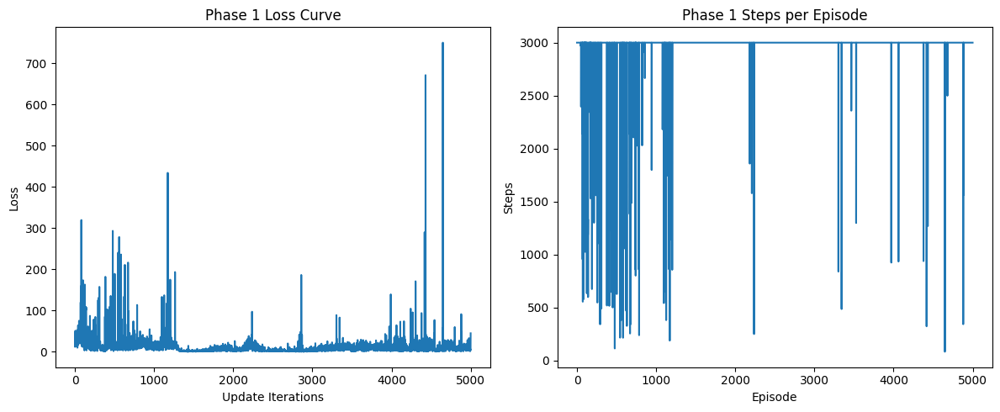

In [16]:
# 绘制训练曲线
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(agent.costs)
plt.title("Phase 1 Loss Curve")
plt.xlabel("Update Iterations")
plt.ylabel("Loss")

plt.subplot(1, 2, 2)
plt.plot(agent.steps_per_episode)
plt.title("Phase 1 Steps per Episode")
plt.xlabel("Episode")
plt.ylabel("Steps")
plt.tight_layout()
plt.show()

In [17]:
state = env.reset()

In [18]:
state

tensor([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [3, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0],
        [0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0],
        [0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0],
        [0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0],
        [0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0],
        [0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0],
        [0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0],
        [0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0],
        [0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 

In [19]:
# 保存训练好的模型
save_dir = r"C:\Users\lcf14\Desktop\RL\Mazes"
os.makedirs(save_dir, exist_ok=True)

save_path = os.path.join(save_dir, "1st_maze_PPO_model.pth")
torch.save({
    'policy_state_dict': agent.policy.state_dict(),
    'optimizer_state_dict': agent.optimizer.state_dict(),
}, save_path)

print(f"模型已保存到 {save_path}")

模型已保存到 C:\Users\lcf14\Desktop\RL\Mazes\1st_maze_PPO_model.pth


## Testing

In [20]:
def create_animation(frames):
    """
    用 Matplotlib 创建动画，并在 Jupyter Notebook 里播放
    """
    fig, ax = plt.subplots()
    ax.axis("off")  # 关闭坐标轴
    im = ax.imshow(frames[0], cmap="gray", origin="upper")
    def update(i):
        im.set_array(frames[i])
        return [im]
    ani = animation.FuncAnimation(fig, update, frames=len(frames), interval=100, blit=True)
    return HTML(ani.to_jshtml())

def test_and_show_video(env, agent, num_frames=900):
    # 运行测试并记录帧
    state = env.reset()
    frames = []
    total_reward = 0
    steps = 0
    done = False
    while not done and steps < num_frames:
        frames.append(state.numpy())  # 记录迷宫状态
        action, _, _ = agent.choose_action(state)
        state, reward, done = env.step(action)
        total_reward += reward
        steps += 1
    print("🎬 Finished：")
    print(f"🚶 Steps: {steps}, 🏆 Total_reward: {total_reward}")
    return create_animation(frames)

=== Phase 1 model testing ===
🎬 Finished：
🚶 Steps: 900, 🏆 Total_reward: -138.59274725536662


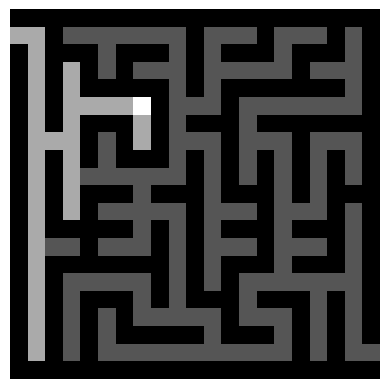

In [21]:
# 运行测试并显示动画
print("=== Phase 1 model testing ===")
test_and_show_video(env, agent)

# Phase 2 - Finding the Shortest Path

## Environment - 2st

In [22]:
class Phase2MazeEnv(MazeEnv):
    def __init__(self, maze_list, max_steps):
        super().__init__(maze_list, max_steps)
        self.maze_list = maze_list
        self.max_steps = max_steps
        self.start_pos = (1, 0)  # 固定入口
        self.exit_pos = (19, 20)  # 固定出口
        self.current_pos = None
        self.steps_taken = None
        self.maze_state = None  # 当前环境状态
        self.original_maze = None  # 存储原始迷宫结构

    def _process_state(self, state):
        """
        对环境的状态进行处理：
        由于原始状态中：
            0 表示墙壁
            1 表示可通行区域（未访问）
            2 表示已访问区域
            4 表示智能体当前位置
        为适配 embedding 层，我们将 4 映射为 3，使得状态类别为 {0,1,2,3}
        """
        state = state.clone()
        state[state == 4] = 3
        return state
    
    def reset(self):
        maze_np = random.choice(self.maze_list)
        self.original_maze = torch.tensor(maze_np, dtype=torch.int)
        self.maze_state = self.original_maze.clone()
        self.maze_state[self.maze_state != 0] = 1
        self.current_pos = self.start_pos
        self.steps_taken = 0
        self.visited_cells = {self.start_pos}
        self.path = [self.start_pos]
        self.revisit_penalty_multiplier = 1.0
        self.recent_positions = deque(maxlen=10)
        self.recent_positions.append(self.start_pos)
        self.maze_state[self.current_pos] = 4
        return self._process_state(self.maze_state.clone())

    def _manhattan_distance(self, pos1, pos2):
        return abs(pos1[0] - pos2[0]) + abs(pos1[1] - pos2[1])

    def step(self, action):
        reward = 0.0
        move_map = {0: (1, 0), 1: (0, 1), 2: (-1, 0), 3: (0, -1)}
        delta = move_map.get(action, (0, 0))
        new_r = self.current_pos[0] + delta[0]
        new_c = self.current_pos[1] + delta[1]
        new_pos = (new_r, new_c)

        # 边界和墙壁惩罚
        if not (0 <= new_r < self.maze_state.shape[0] and 0 <= new_c < self.maze_state.shape[1] and self.original_maze[new_r, new_c].item() != 0):
            reward -= 1.0
            new_pos = self.current_pos
        else:
            # 保留对新位置访问的奖励，但降低其奖励值
            if new_pos not in self.visited_cells:
                reward += 3.0 # 新位置奖励
                self.visited_cells.add(new_pos)

            # 新增路径长度惩罚
            reward -= 0.5 # 每步惩罚

            # 基于历史路径的奖惩
            if new_pos in self.path:
                reward -= 0.5 # 轻微的重复路径惩罚
            else:
                # 计算当前位置和下一步位置到终点的曼哈顿距离
                current_distance = self._manhattan_distance(self.current_pos, self.exit_pos)
                next_distance = self._manhattan_distance(new_pos, self.exit_pos)
                # 如果距离减小，给予奖励
                if next_distance < current_distance:
                    reward += 3 # 曼哈顿距离减小的奖励

        # 判断是否到达出口或达到最大步数限制
        if new_pos == self.exit_pos:
            reward += 100.0
            done = True
        elif self.steps_taken + 1 >= self.max_steps:
            reward -= 50.0
            done = True
        else:
            done = False
    
        # 更新状态
        if self.current_pos != self.exit_pos:
            self.maze_state[self.current_pos] = 2
        self.current_pos = new_pos
        self.maze_state[self.current_pos] = 4
        self.path.append(self.current_pos)
        
        # 更新步数（此时已经判断过是否为最后一步）
        self.steps_taken += 1
    
        return self._process_state(self.maze_state.clone()), reward, done

In [23]:
# 初始化第二阶段环境
phase2_env = Phase2MazeEnv(maze_list=mazes, max_steps=2000)

# 并行环境
phase2_env_class = Phase2MazeEnv
phase2_vec_env = VectorizedMazeEnv(phase2_env_class, maze_list=mazes, n_envs=n_envs, max_steps=2000)

In [24]:
phase2_state = phase2_env.reset()

In [25]:
phase2_state

tensor([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [3, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0],
        [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0],
        [0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0],
        [0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0],
        [0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0],
        [0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0],
        [0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0],
        [0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0],
        [0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 0],
        [0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0],
        [0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 

In [26]:
# 初始化智能体并加载预训练模型
phase2_agent = PPOAgent(device=device, lr=0.001, gamma=0.95, clip_epsilon=0.2, update_epochs=4, batch_size=64)

In [27]:
# 加载第一阶段模型
save_path = os.path.join(save_dir, "1st_maze_PPO_model.pth")
checkpoint = torch.load(save_path)

In [28]:
# 加载预训练参数
phase2_agent.policy.load_state_dict(checkpoint['policy_state_dict'])
phase2_agent.optimizer.load_state_dict(checkpoint['optimizer_state_dict'])

In [29]:
# 定义Phase 2训练阶段的总轮数
phase2_num_episodes = 5000
# 已完成的轮数初始化为0
episodes_done = 0

# 使用tqdm创建一个进度条，用于显示Phase 2训练进度
pbar_phase2 = tqdm(total=phase2_num_episodes, desc="Phase 2 Training Progress")

# 当已完成的轮数小于Phase 2的总轮数时，继续训练
while episodes_done < phase2_num_episodes:
    # 重置Phase 2环境，获取初始状态，形状为 (n_envs, 21, 21)
    states = phase2_vec_env.reset()
    # 初始化一个布尔列表，用于标记每个环境是否结束
    done_mask = [False] * n_envs
    # 初始化一个列表，用于存储每个环境的轨迹
    trajectories = [[] for _ in range(n_envs)]
    # 初始化一个列表，用于记录每个环境的总奖励
    total_rewards = [0.0] * n_envs
    # 初始化一个列表，用于记录每个环境的步数
    steps_counts = [0] * n_envs

    # 只要还有环境没结束，就继续
    while not all(done_mask):
        # 通过Phase 2代理选择动作，获取动作、对数概率和价值
        actions, log_probs, values = phase2_agent.choose_action_batch(states)
        # 执行动作，获取下一个状态、奖励和结束标志
        next_states, rewards, dones = phase2_vec_env.step(actions.cpu().numpy())

        # 为了 GAE，更严格：在 step t 存储 next_value = V(s_{t+1})，先计算下个状态的价值
        with torch.no_grad():
            # 计算下一个状态的价值
            _, next_values = phase2_agent.policy(next_states.to(device))
            next_values = next_values.squeeze(-1).cpu()

        # 遍历每个环境
        for i in range(n_envs):
            if not done_mask[i]:  # 如果该环境未结束
                # 构建轨迹元素：(state, action, log_prob, reward, value, done, next_value)
                trajectories[i].append((
                    states[i].cpu(),          # 当前状态
                    actions[i].item(),        # 动作
                    log_probs[i].cpu(),       # 动作的对数概率
                    rewards[i].item(),        # 奖励
                    values[i].item(),         # 当前状态的价值
                    float(dones[i].item()),   # 结束标志（0/1）
                    0.0                       # next_value 占位符
                ))
                # 累加奖励
                total_rewards[i] += rewards[i].item()
                # 步数加1
                steps_counts[i] += 1

        # 更新每个环境上一步 transition 的 next_value 字段
        for i in range(n_envs):
            if not done_mask[i]:  # 如果该环境未结束
                if dones[i]:  # 如果该环境结束
                    # 更新轨迹中最后一个元素的 next_value 为 0
                    t_item = list(trajectories[i][-1])
                    t_item[-1] = 0.0
                    trajectories[i][-1] = tuple(t_item)
                else:  # 如果该环境未结束
                    # 更新轨迹中最后一个元素的 next_value 为下个状态的价值
                    t_item = list(trajectories[i][-1])
                    t_item[-1] = next_values[i].item()
                    trajectories[i][-1] = tuple(t_item)

        # 更新 done_mask
        for i in range(n_envs):
            if dones[i]:  # 如果该环境结束
                done_mask[i] = True

        # 更新状态为下一个状态
        states = next_states

    # 更新阶段：每个子环境的轨迹分别更新
    for i in range(n_envs):
        # 记录每集的步数
        phase2_agent.steps_per_episode.append(steps_counts[i])
        # 使用轨迹数据更新Phase 2代理
        phase2_agent.update(trajectories[i])
        # 已完成的轮数加1
        episodes_done += 1
        # 在进度条中打印当前轮数、奖励和步数
        tqdm.write(f"Episode {episodes_done}, Reward: {total_rewards[i]:.2f}, Steps: {steps_counts[i]}")
        # 更新进度条
        pbar_phase2.update(1)
        # 如果已完成的轮数达到Phase 2的总轮数，退出循环
        if episodes_done >= phase2_num_episodes:
            break

# 关闭Phase 2进度条
pbar_phase2.close()

Phase 2 Training Progress:   0%|                                                  | 1/5000 [01:39<138:49:11, 99.97s/it]

Episode 1, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:   0%|                                                   | 2/5000 [01:47<63:07:39, 45.47s/it]

Episode 2, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:   0%|                                                   | 3/5000 [01:54<38:56:35, 28.06s/it]

Episode 3, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:   0%|                                                   | 4/5000 [02:01<27:28:57, 19.80s/it]

Episode 4, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:   0%|                                                   | 5/5000 [02:09<21:12:59, 15.29s/it]

Episode 5, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:   0%|                                                   | 6/5000 [02:16<17:23:41, 12.54s/it]

Episode 6, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:   0%|                                                   | 7/5000 [02:23<15:01:10, 10.83s/it]

Episode 7, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:   0%|                                                   | 8/5000 [02:30<13:22:13,  9.64s/it]

Episode 8, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:   0%|                                                   | 9/5000 [02:37<12:18:15,  8.88s/it]

Episode 9, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:   0%|                                                  | 10/5000 [02:44<11:31:52,  8.32s/it]

Episode 10, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:   0%|                                                  | 11/5000 [02:52<11:06:25,  8.01s/it]

Episode 11, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:   0%|                                                  | 12/5000 [02:59<10:43:43,  7.74s/it]

Episode 12, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:   0%|▏                                                 | 13/5000 [03:06<10:31:21,  7.60s/it]

Episode 13, Reward: -1939.50, Steps: 2000


Phase 2 Training Progress:   0%|▏                                                 | 14/5000 [03:13<10:19:48,  7.46s/it]

Episode 14, Reward: -1814.50, Steps: 2000


Phase 2 Training Progress:   0%|▏                                                 | 15/5000 [03:20<10:13:15,  7.38s/it]

Episode 15, Reward: -1900.50, Steps: 2000


Phase 2 Training Progress:   0%|▏                                                 | 16/5000 [03:28<10:08:59,  7.33s/it]

Episode 16, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:   0%|▏                                                 | 17/5000 [03:35<10:07:10,  7.31s/it]

Episode 17, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:   0%|▏                                                 | 18/5000 [03:42<10:02:46,  7.26s/it]

Episode 18, Reward: -1939.50, Steps: 2000


Phase 2 Training Progress:   0%|▏                                                  | 19/5000 [03:49<9:56:31,  7.19s/it]

Episode 19, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:   0%|▏                                                  | 20/5000 [03:56<9:56:02,  7.18s/it]

Episode 20, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:   0%|▏                                                  | 21/5000 [04:04<9:58:08,  7.21s/it]

Episode 21, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:   0%|▏                                                  | 22/5000 [04:11<9:53:58,  7.16s/it]

Episode 22, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:   0%|▏                                                  | 23/5000 [04:18<9:54:29,  7.17s/it]

Episode 23, Reward: -1822.50, Steps: 2000


Phase 2 Training Progress:   0%|▏                                                  | 24/5000 [04:25<9:54:12,  7.16s/it]

Episode 24, Reward: -1788.50, Steps: 2000


Phase 2 Training Progress:   0%|▎                                                  | 25/5000 [04:32<9:50:06,  7.12s/it]

Episode 25, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:   1%|▎                                                  | 26/5000 [04:39<9:45:53,  7.07s/it]

Episode 26, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:   1%|▎                                                  | 27/5000 [04:46<9:53:18,  7.16s/it]

Episode 27, Reward: -1835.50, Steps: 2000


Phase 2 Training Progress:   1%|▎                                                  | 28/5000 [04:53<9:54:35,  7.18s/it]

Episode 28, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:   1%|▎                                                  | 29/5000 [05:00<9:48:43,  7.11s/it]

Episode 29, Reward: -1939.50, Steps: 2000


Phase 2 Training Progress:   1%|▎                                                  | 30/5000 [05:08<9:52:24,  7.15s/it]

Episode 30, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:   1%|▎                                                  | 31/5000 [05:15<9:53:32,  7.17s/it]

Episode 31, Reward: -1939.50, Steps: 2000


Phase 2 Training Progress:   1%|▎                                                  | 32/5000 [05:22<9:55:45,  7.20s/it]

Episode 32, Reward: -1777.00, Steps: 2000


Phase 2 Training Progress:   1%|▎                                                 | 33/5000 [07:02<48:05:46, 34.86s/it]

Episode 33, Reward: -1806.00, Steps: 2000


Phase 2 Training Progress:   1%|▎                                                 | 34/5000 [07:09<36:41:44, 26.60s/it]

Episode 34, Reward: -1938.50, Steps: 2000


Phase 2 Training Progress:   1%|▎                                                 | 35/5000 [07:16<28:39:47, 20.78s/it]

Episode 35, Reward: -1861.50, Steps: 2000


Phase 2 Training Progress:   1%|▎                                                 | 36/5000 [07:23<23:04:44, 16.74s/it]

Episode 36, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:   1%|▎                                                 | 37/5000 [07:31<19:09:21, 13.90s/it]

Episode 37, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:   1%|▍                                                 | 38/5000 [07:38<16:29:46, 11.97s/it]

Episode 38, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:   1%|▍                                                 | 39/5000 [07:45<14:28:40, 10.51s/it]

Episode 39, Reward: -1926.50, Steps: 2000


Phase 2 Training Progress:   1%|▍                                                 | 40/5000 [07:52<13:04:11,  9.49s/it]

Episode 40, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:   1%|▍                                                 | 41/5000 [08:00<12:11:37,  8.85s/it]

Episode 41, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:   1%|▍                                                 | 42/5000 [08:07<11:32:46,  8.38s/it]

Episode 42, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:   1%|▍                                                 | 43/5000 [08:14<11:00:21,  7.99s/it]

Episode 43, Reward: -1939.50, Steps: 2000


Phase 2 Training Progress:   1%|▍                                                 | 44/5000 [08:21<10:44:36,  7.80s/it]

Episode 44, Reward: -1871.00, Steps: 2000


Phase 2 Training Progress:   1%|▍                                                 | 45/5000 [08:28<10:25:29,  7.57s/it]

Episode 45, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:   1%|▍                                                 | 46/5000 [08:36<10:17:20,  7.48s/it]

Episode 46, Reward: -1835.50, Steps: 2000


Phase 2 Training Progress:   1%|▍                                                 | 47/5000 [08:43<10:11:17,  7.41s/it]

Episode 47, Reward: -1926.50, Steps: 2000


Phase 2 Training Progress:   1%|▍                                                 | 48/5000 [08:50<10:08:33,  7.37s/it]

Episode 48, Reward: -1887.50, Steps: 2000


Phase 2 Training Progress:   1%|▍                                                 | 49/5000 [08:57<10:01:23,  7.29s/it]

Episode 49, Reward: -1890.00, Steps: 2000


Phase 2 Training Progress:   1%|▌                                                  | 50/5000 [09:05<9:58:39,  7.26s/it]

Episode 50, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:   1%|▌                                                  | 51/5000 [09:12<9:55:24,  7.22s/it]

Episode 51, Reward: -1932.50, Steps: 2000


Phase 2 Training Progress:   1%|▌                                                  | 52/5000 [09:19<9:53:23,  7.20s/it]

Episode 52, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:   1%|▌                                                  | 53/5000 [09:26<9:53:29,  7.20s/it]

Episode 53, Reward: -1913.50, Steps: 2000


Phase 2 Training Progress:   1%|▌                                                  | 54/5000 [09:33<9:59:32,  7.27s/it]

Episode 54, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:   1%|▌                                                 | 55/5000 [09:41<10:01:22,  7.30s/it]

Episode 55, Reward: -1923.00, Steps: 2000


Phase 2 Training Progress:   1%|▌                                                  | 56/5000 [09:48<9:57:36,  7.25s/it]

Episode 56, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:   1%|▌                                                  | 57/5000 [09:55<9:54:14,  7.21s/it]

Episode 57, Reward: -1932.50, Steps: 2000


Phase 2 Training Progress:   1%|▌                                                  | 58/5000 [10:02<9:58:21,  7.26s/it]

Episode 58, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:   1%|▌                                                  | 59/5000 [10:10<9:55:42,  7.23s/it]

Episode 59, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:   1%|▌                                                  | 60/5000 [10:17<9:56:48,  7.25s/it]

Episode 60, Reward: -1997.50, Steps: 2000


Phase 2 Training Progress:   1%|▌                                                 | 61/5000 [10:24<10:01:31,  7.31s/it]

Episode 61, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:   1%|▌                                                 | 62/5000 [10:32<10:00:09,  7.29s/it]

Episode 62, Reward: -2014.00, Steps: 2000


Phase 2 Training Progress:   1%|▋                                                 | 63/5000 [10:39<10:01:09,  7.31s/it]

Episode 63, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:   1%|▋                                                  | 64/5000 [10:45<9:36:32,  7.01s/it]

Episode 64, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:   1%|▋                                                 | 65/5000 [12:23<47:04:46, 34.34s/it]

Episode 65, Reward: -1935.50, Steps: 2000


Phase 2 Training Progress:   1%|▋                                                 | 66/5000 [12:31<35:56:46, 26.23s/it]

Episode 66, Reward: -2001.00, Steps: 2000


Phase 2 Training Progress:   1%|▋                                                 | 67/5000 [12:38<28:07:20, 20.52s/it]

Episode 67, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:   1%|▋                                                 | 68/5000 [12:45<22:40:52, 16.56s/it]

Episode 68, Reward: -1906.50, Steps: 2000


Phase 2 Training Progress:   1%|▋                                                 | 69/5000 [12:52<18:44:47, 13.69s/it]

Episode 69, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:   1%|▋                                                 | 70/5000 [12:59<16:01:43, 11.70s/it]

Episode 70, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:   1%|▋                                                 | 71/5000 [13:06<14:09:38, 10.34s/it]

Episode 71, Reward: -1815.00, Steps: 2000


Phase 2 Training Progress:   1%|▋                                                 | 72/5000 [13:14<12:51:52,  9.40s/it]

Episode 72, Reward: -1984.50, Steps: 2000


Phase 2 Training Progress:   1%|▋                                                 | 73/5000 [13:21<11:56:19,  8.72s/it]

Episode 73, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:   1%|▋                                                 | 74/5000 [13:28<11:20:59,  8.29s/it]

Episode 74, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:   2%|▊                                                 | 75/5000 [13:35<10:56:45,  8.00s/it]

Episode 75, Reward: -1933.00, Steps: 2000


Phase 2 Training Progress:   2%|▊                                                 | 76/5000 [13:43<10:37:23,  7.77s/it]

Episode 76, Reward: -1913.50, Steps: 2000


Phase 2 Training Progress:   2%|▊                                                 | 77/5000 [13:50<10:24:37,  7.61s/it]

Episode 77, Reward: -1915.50, Steps: 2000


Phase 2 Training Progress:   2%|▊                                                 | 78/5000 [13:57<10:14:16,  7.49s/it]

Episode 78, Reward: -1848.00, Steps: 2000


Phase 2 Training Progress:   2%|▊                                                 | 79/5000 [14:04<10:06:28,  7.39s/it]

Episode 79, Reward: -1962.00, Steps: 2000


Phase 2 Training Progress:   2%|▊                                                 | 80/5000 [14:12<10:04:01,  7.37s/it]

Episode 80, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:   2%|▊                                                 | 81/5000 [14:19<10:01:06,  7.33s/it]

Episode 81, Reward: -1997.50, Steps: 2000


Phase 2 Training Progress:   2%|▊                                                  | 82/5000 [14:26<9:56:22,  7.28s/it]

Episode 82, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:   2%|▊                                                  | 83/5000 [14:33<9:53:49,  7.25s/it]

Episode 83, Reward: -1975.00, Steps: 2000


Phase 2 Training Progress:   2%|▊                                                  | 84/5000 [14:40<9:51:46,  7.22s/it]

Episode 84, Reward: -1854.50, Steps: 2000


Phase 2 Training Progress:   2%|▊                                                  | 85/5000 [14:47<9:47:57,  7.18s/it]

Episode 85, Reward: -1887.50, Steps: 2000


Phase 2 Training Progress:   2%|▉                                                  | 86/5000 [14:54<9:44:41,  7.14s/it]

Episode 86, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:   2%|▉                                                  | 87/5000 [15:02<9:46:32,  7.16s/it]

Episode 87, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:   2%|▉                                                  | 88/5000 [15:09<9:52:45,  7.24s/it]

Episode 88, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:   2%|▉                                                 | 89/5000 [15:17<10:01:43,  7.35s/it]

Episode 89, Reward: -1899.50, Steps: 2000


Phase 2 Training Progress:   2%|▉                                                 | 90/5000 [15:24<10:09:06,  7.44s/it]

Episode 90, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:   2%|▉                                                 | 91/5000 [15:32<10:10:29,  7.46s/it]

Episode 91, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:   2%|▉                                                 | 92/5000 [15:39<10:11:01,  7.47s/it]

Episode 92, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:   2%|▉                                                 | 93/5000 [15:47<10:10:26,  7.46s/it]

Episode 93, Reward: -1975.00, Steps: 2000


Phase 2 Training Progress:   2%|▉                                                 | 94/5000 [15:54<10:08:16,  7.44s/it]

Episode 94, Reward: -1913.50, Steps: 2000


Phase 2 Training Progress:   2%|▉                                                 | 95/5000 [16:02<10:07:40,  7.43s/it]

Episode 95, Reward: -1919.50, Steps: 2000


Phase 2 Training Progress:   2%|▉                                                 | 96/5000 [16:09<10:13:52,  7.51s/it]

Episode 96, Reward: -1906.00, Steps: 2000


Phase 2 Training Progress:   2%|▉                                                 | 97/5000 [17:51<48:50:44, 35.86s/it]

Episode 97, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:   2%|▉                                                 | 98/5000 [17:59<37:09:36, 27.29s/it]

Episode 98, Reward: -1854.50, Steps: 2000


Phase 2 Training Progress:   2%|▉                                                 | 99/5000 [18:06<28:58:13, 21.28s/it]

Episode 99, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:   2%|▉                                                | 100/5000 [18:13<23:11:37, 17.04s/it]

Episode 100, Reward: -1689.00, Steps: 2000


Phase 2 Training Progress:   2%|▉                                                | 101/5000 [18:20<19:08:20, 14.06s/it]

Episode 101, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:   2%|▉                                                | 102/5000 [18:27<16:19:46, 12.00s/it]

Episode 102, Reward: -1676.50, Steps: 2000


Phase 2 Training Progress:   2%|█                                                | 103/5000 [18:35<14:24:32, 10.59s/it]

Episode 103, Reward: -1715.00, Steps: 2000


Phase 2 Training Progress:   2%|█                                                | 104/5000 [18:42<13:01:30,  9.58s/it]

Episode 104, Reward: -1766.00, Steps: 2000


Phase 2 Training Progress:   2%|█                                                | 105/5000 [18:49<12:01:05,  8.84s/it]

Episode 105, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:   2%|█                                                | 106/5000 [18:56<11:18:10,  8.31s/it]

Episode 106, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:   2%|█                                                | 107/5000 [19:03<10:50:32,  7.98s/it]

Episode 107, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:   2%|█                                                | 108/5000 [19:10<10:26:47,  7.69s/it]

Episode 108, Reward: -1939.50, Steps: 2000


Phase 2 Training Progress:   2%|█                                                | 109/5000 [19:17<10:16:55,  7.57s/it]

Episode 109, Reward: -1819.00, Steps: 2000


Phase 2 Training Progress:   2%|█                                                | 110/5000 [19:25<10:06:57,  7.45s/it]

Episode 110, Reward: -1955.00, Steps: 2000


Phase 2 Training Progress:   2%|█                                                | 111/5000 [19:32<10:05:37,  7.43s/it]

Episode 111, Reward: -1900.00, Steps: 2000


Phase 2 Training Progress:   2%|█                                                | 112/5000 [19:39<10:03:16,  7.41s/it]

Episode 112, Reward: -1887.50, Steps: 2000


Phase 2 Training Progress:   2%|█▏                                                | 113/5000 [19:47<9:57:27,  7.34s/it]

Episode 113, Reward: -1945.50, Steps: 2000


Phase 2 Training Progress:   2%|█▏                                                | 114/5000 [19:54<9:52:49,  7.28s/it]

Episode 114, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:   2%|█▏                                                | 115/5000 [20:01<9:51:34,  7.27s/it]

Episode 115, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:   2%|█▏                                                | 116/5000 [20:08<9:55:25,  7.31s/it]

Episode 116, Reward: -1880.50, Steps: 2000


Phase 2 Training Progress:   2%|█▏                                                | 117/5000 [20:15<9:50:02,  7.25s/it]

Episode 117, Reward: -1805.00, Steps: 2000


Phase 2 Training Progress:   2%|█▏                                                | 118/5000 [20:22<9:42:47,  7.16s/it]

Episode 118, Reward: -1821.50, Steps: 2000


Phase 2 Training Progress:   2%|█▏                                                | 119/5000 [20:29<9:39:27,  7.12s/it]

Episode 119, Reward: -1939.50, Steps: 2000


Phase 2 Training Progress:   2%|█▏                                                | 120/5000 [20:37<9:39:42,  7.13s/it]

Episode 120, Reward: -1818.50, Steps: 2000


Phase 2 Training Progress:   2%|█▏                                                | 121/5000 [20:44<9:41:05,  7.15s/it]

Episode 121, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:   2%|█▏                                                | 122/5000 [20:51<9:46:25,  7.21s/it]

Episode 122, Reward: -1741.50, Steps: 2000


Phase 2 Training Progress:   2%|█▏                                                | 123/5000 [20:58<9:41:44,  7.16s/it]

Episode 123, Reward: -1939.50, Steps: 2000


Phase 2 Training Progress:   2%|█▏                                                | 124/5000 [21:05<9:42:02,  7.16s/it]

Episode 124, Reward: -1779.50, Steps: 2000


Phase 2 Training Progress:   2%|█▎                                                | 125/5000 [21:13<9:42:27,  7.17s/it]

Episode 125, Reward: -1850.00, Steps: 2000


Phase 2 Training Progress:   3%|█▎                                                | 126/5000 [21:20<9:45:18,  7.21s/it]

Episode 126, Reward: -1854.50, Steps: 2000


Phase 2 Training Progress:   3%|█▎                                                | 127/5000 [21:27<9:48:07,  7.24s/it]

Episode 127, Reward: -1926.50, Steps: 2000


Phase 2 Training Progress:   3%|█▎                                                | 128/5000 [21:35<9:51:02,  7.28s/it]

Episode 128, Reward: -1855.50, Steps: 2000


Phase 2 Training Progress:   3%|█▎                                               | 129/5000 [23:14<47:20:27, 34.99s/it]

Episode 129, Reward: -1897.00, Steps: 2000


Phase 2 Training Progress:   3%|█▎                                               | 130/5000 [23:21<36:00:09, 26.61s/it]

Episode 130, Reward: -1906.50, Steps: 2000


Phase 2 Training Progress:   3%|█▎                                               | 131/5000 [23:28<28:04:41, 20.76s/it]

Episode 131, Reward: -1887.00, Steps: 2000


Phase 2 Training Progress:   3%|█▎                                               | 132/5000 [23:36<22:37:50, 16.74s/it]

Episode 132, Reward: -1817.00, Steps: 2000


Phase 2 Training Progress:   3%|█▎                                               | 133/5000 [23:43<18:44:27, 13.86s/it]

Episode 133, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:   3%|█▎                                               | 134/5000 [23:50<15:58:08, 11.81s/it]

Episode 134, Reward: -1775.50, Steps: 2000


Phase 2 Training Progress:   3%|█▎                                               | 135/5000 [23:57<14:05:37, 10.43s/it]

Episode 135, Reward: -1919.50, Steps: 2000


Phase 2 Training Progress:   3%|█▎                                               | 136/5000 [24:04<12:49:48,  9.50s/it]

Episode 136, Reward: -1837.00, Steps: 2000


Phase 2 Training Progress:   3%|█▎                                               | 137/5000 [24:11<11:50:42,  8.77s/it]

Episode 137, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:   3%|█▎                                               | 138/5000 [24:19<11:09:28,  8.26s/it]

Episode 138, Reward: -1925.50, Steps: 2000


Phase 2 Training Progress:   3%|█▎                                               | 139/5000 [24:26<10:39:21,  7.89s/it]

Episode 139, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:   3%|█▎                                               | 140/5000 [24:33<10:18:36,  7.64s/it]

Episode 140, Reward: -1906.50, Steps: 2000


Phase 2 Training Progress:   3%|█▍                                               | 141/5000 [24:40<10:07:16,  7.50s/it]

Episode 141, Reward: -1805.00, Steps: 2000


Phase 2 Training Progress:   3%|█▍                                                | 142/5000 [24:47<9:54:42,  7.35s/it]

Episode 142, Reward: -1695.50, Steps: 2000


Phase 2 Training Progress:   3%|█▍                                                | 143/5000 [24:54<9:53:21,  7.33s/it]

Episode 143, Reward: -1984.50, Steps: 2000


Phase 2 Training Progress:   3%|█▍                                                | 144/5000 [25:01<9:49:00,  7.28s/it]

Episode 144, Reward: -2001.00, Steps: 2000


Phase 2 Training Progress:   3%|█▍                                                | 145/5000 [25:08<9:47:20,  7.26s/it]

Episode 145, Reward: -1922.00, Steps: 2000


Phase 2 Training Progress:   3%|█▍                                                | 146/5000 [25:16<9:45:38,  7.24s/it]

Episode 146, Reward: -1984.50, Steps: 2000


Phase 2 Training Progress:   3%|█▍                                                | 147/5000 [25:23<9:41:35,  7.19s/it]

Episode 147, Reward: -1945.50, Steps: 2000


Phase 2 Training Progress:   3%|█▍                                                | 148/5000 [25:30<9:42:25,  7.20s/it]

Episode 148, Reward: -1740.50, Steps: 2000


Phase 2 Training Progress:   3%|█▍                                                | 149/5000 [25:37<9:42:50,  7.21s/it]

Episode 149, Reward: -2001.00, Steps: 2000


Phase 2 Training Progress:   3%|█▌                                                | 150/5000 [25:44<9:40:46,  7.18s/it]

Episode 150, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:   3%|█▌                                                | 151/5000 [25:51<9:41:09,  7.19s/it]

Episode 151, Reward: -1877.00, Steps: 2000


Phase 2 Training Progress:   3%|█▌                                                | 152/5000 [25:59<9:46:33,  7.26s/it]

Episode 152, Reward: -1806.00, Steps: 2000


Phase 2 Training Progress:   3%|█▌                                                | 153/5000 [26:06<9:48:42,  7.29s/it]

Episode 153, Reward: -1723.50, Steps: 2000


Phase 2 Training Progress:   3%|█▌                                                | 154/5000 [26:13<9:43:18,  7.22s/it]

Episode 154, Reward: -1907.00, Steps: 2000


Phase 2 Training Progress:   3%|█▌                                                | 155/5000 [26:20<9:41:42,  7.20s/it]

Episode 155, Reward: -1968.00, Steps: 2000


Phase 2 Training Progress:   3%|█▌                                                | 156/5000 [26:28<9:41:50,  7.21s/it]

Episode 156, Reward: -1680.50, Steps: 2000


Phase 2 Training Progress:   3%|█▌                                                | 157/5000 [26:35<9:43:46,  7.23s/it]

Episode 157, Reward: -1727.50, Steps: 2000


Phase 2 Training Progress:   3%|█▌                                                | 158/5000 [26:42<9:42:35,  7.22s/it]

Episode 158, Reward: -1800.50, Steps: 2000


Phase 2 Training Progress:   3%|█▌                                                | 159/5000 [26:49<9:41:32,  7.21s/it]

Episode 159, Reward: -1798.00, Steps: 2000


Phase 2 Training Progress:   3%|█▌                                                | 160/5000 [26:57<9:40:56,  7.20s/it]

Episode 160, Reward: -1707.50, Steps: 2000


Phase 2 Training Progress:   3%|█▌                                               | 161/5000 [28:35<46:26:16, 34.55s/it]

Episode 161, Reward: -1959.00, Steps: 2000


Phase 2 Training Progress:   3%|█▌                                               | 162/5000 [28:42<35:24:22, 26.35s/it]

Episode 162, Reward: -1926.50, Steps: 2000


Phase 2 Training Progress:   3%|█▌                                               | 163/5000 [28:49<27:39:56, 20.59s/it]

Episode 163, Reward: -1850.00, Steps: 2000


Phase 2 Training Progress:   3%|█▌                                               | 164/5000 [28:56<22:14:16, 16.55s/it]

Episode 164, Reward: -1817.00, Steps: 2000


Phase 2 Training Progress:   3%|█▌                                               | 165/5000 [29:04<18:27:14, 13.74s/it]

Episode 165, Reward: -1939.50, Steps: 2000


Phase 2 Training Progress:   3%|█▋                                               | 166/5000 [29:11<15:48:12, 11.77s/it]

Episode 166, Reward: -1759.50, Steps: 2000


Phase 2 Training Progress:   3%|█▋                                               | 167/5000 [29:18<13:57:03, 10.39s/it]

Episode 167, Reward: -1925.50, Steps: 2000


Phase 2 Training Progress:   3%|█▋                                               | 168/5000 [29:25<12:37:49,  9.41s/it]

Episode 168, Reward: -1825.00, Steps: 2000


Phase 2 Training Progress:   3%|█▋                                               | 169/5000 [29:32<11:44:43,  8.75s/it]

Episode 169, Reward: -1779.50, Steps: 2000


Phase 2 Training Progress:   3%|█▋                                               | 170/5000 [29:40<11:12:59,  8.36s/it]

Episode 170, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:   3%|█▋                                               | 171/5000 [29:47<10:42:09,  7.98s/it]

Episode 171, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:   3%|█▋                                               | 172/5000 [29:54<10:26:51,  7.79s/it]

Episode 172, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:   3%|█▋                                               | 173/5000 [30:01<10:14:51,  7.64s/it]

Episode 173, Reward: -1883.50, Steps: 2000


Phase 2 Training Progress:   3%|█▋                                               | 174/5000 [30:09<10:07:07,  7.55s/it]

Episode 174, Reward: -1939.50, Steps: 2000


Phase 2 Training Progress:   4%|█▊                                                | 175/5000 [30:16<9:56:45,  7.42s/it]

Episode 175, Reward: -1867.50, Steps: 2000


Phase 2 Training Progress:   4%|█▊                                                | 176/5000 [30:23<9:49:59,  7.34s/it]

Episode 176, Reward: -1822.50, Steps: 2000


Phase 2 Training Progress:   4%|█▊                                                | 177/5000 [30:30<9:47:35,  7.31s/it]

Episode 177, Reward: -1939.50, Steps: 2000


Phase 2 Training Progress:   4%|█▊                                                | 178/5000 [30:37<9:43:51,  7.26s/it]

Episode 178, Reward: -1952.00, Steps: 2000


Phase 2 Training Progress:   4%|█▊                                                | 179/5000 [30:45<9:39:53,  7.22s/it]

Episode 179, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:   4%|█▊                                                | 180/5000 [30:52<9:43:36,  7.26s/it]

Episode 180, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:   4%|█▊                                                | 181/5000 [30:59<9:41:51,  7.24s/it]

Episode 181, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:   4%|█▊                                                | 182/5000 [31:06<9:40:29,  7.23s/it]

Episode 182, Reward: -1975.00, Steps: 2000


Phase 2 Training Progress:   4%|█▊                                                | 183/5000 [31:14<9:41:59,  7.25s/it]

Episode 183, Reward: -1803.00, Steps: 2000


Phase 2 Training Progress:   4%|█▊                                                | 184/5000 [31:21<9:37:54,  7.20s/it]

Episode 184, Reward: -1789.00, Steps: 2000


Phase 2 Training Progress:   4%|█▊                                                | 185/5000 [31:28<9:38:10,  7.20s/it]

Episode 185, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:   4%|█▊                                                | 186/5000 [31:35<9:41:19,  7.25s/it]

Episode 186, Reward: -1949.00, Steps: 2000


Phase 2 Training Progress:   4%|█▊                                                | 187/5000 [31:43<9:46:27,  7.31s/it]

Episode 187, Reward: -1988.00, Steps: 2000


Phase 2 Training Progress:   4%|█▉                                                | 188/5000 [31:50<9:42:14,  7.26s/it]

Episode 188, Reward: -1913.50, Steps: 2000


Phase 2 Training Progress:   4%|█▉                                                | 189/5000 [31:57<9:43:53,  7.28s/it]

Episode 189, Reward: -1910.00, Steps: 2000


Phase 2 Training Progress:   4%|█▉                                                | 190/5000 [32:05<9:45:59,  7.31s/it]

Episode 190, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:   4%|█▉                                                | 191/5000 [32:12<9:41:57,  7.26s/it]

Episode 191, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:   4%|█▉                                                | 192/5000 [32:19<9:35:24,  7.18s/it]

Episode 192, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:   4%|█▉                                               | 193/5000 [33:57<46:09:36, 34.57s/it]

Episode 193, Reward: -1945.50, Steps: 2000


Phase 2 Training Progress:   4%|█▉                                               | 194/5000 [34:05<35:14:21, 26.40s/it]

Episode 194, Reward: -1857.00, Steps: 2000


Phase 2 Training Progress:   4%|█▉                                               | 195/5000 [34:12<27:30:53, 20.61s/it]

Episode 195, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:   4%|█▉                                               | 196/5000 [34:19<22:05:19, 16.55s/it]

Episode 196, Reward: -1910.00, Steps: 2000


Phase 2 Training Progress:   4%|█▉                                               | 197/5000 [34:26<18:20:27, 13.75s/it]

Episode 197, Reward: -1988.00, Steps: 2000


Phase 2 Training Progress:   4%|█▉                                               | 198/5000 [34:33<15:40:02, 11.75s/it]

Episode 198, Reward: -1958.50, Steps: 2000


Phase 2 Training Progress:   4%|█▉                                               | 199/5000 [34:40<13:52:50, 10.41s/it]

Episode 199, Reward: -1984.50, Steps: 2000


Phase 2 Training Progress:   4%|█▉                                               | 200/5000 [34:47<12:31:44,  9.40s/it]

Episode 200, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:   4%|█▉                                               | 201/5000 [34:54<11:36:22,  8.71s/it]

Episode 201, Reward: -1920.00, Steps: 2000


Phase 2 Training Progress:   4%|█▉                                               | 202/5000 [35:02<10:57:16,  8.22s/it]

Episode 202, Reward: -1929.00, Steps: 2000


Phase 2 Training Progress:   4%|█▉                                               | 203/5000 [35:09<10:34:14,  7.93s/it]

Episode 203, Reward: -1906.50, Steps: 2000


Phase 2 Training Progress:   4%|█▉                                               | 204/5000 [35:16<10:16:33,  7.71s/it]

Episode 204, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:   4%|██                                               | 205/5000 [35:23<10:05:12,  7.57s/it]

Episode 205, Reward: -1929.00, Steps: 2000


Phase 2 Training Progress:   4%|██                                                | 206/5000 [35:30<9:55:07,  7.45s/it]

Episode 206, Reward: -1890.00, Steps: 2000


Phase 2 Training Progress:   4%|██                                                | 207/5000 [35:38<9:48:04,  7.36s/it]

Episode 207, Reward: -1919.50, Steps: 2000


Phase 2 Training Progress:   4%|██                                                | 208/5000 [35:45<9:40:22,  7.27s/it]

Episode 208, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:   4%|██                                                | 209/5000 [35:52<9:38:56,  7.25s/it]

Episode 209, Reward: -1910.00, Steps: 2000


Phase 2 Training Progress:   4%|██                                                | 210/5000 [35:59<9:38:06,  7.24s/it]

Episode 210, Reward: -1831.00, Steps: 2000


Phase 2 Training Progress:   4%|██                                                | 211/5000 [36:06<9:39:08,  7.26s/it]

Episode 211, Reward: -1867.50, Steps: 2000


Phase 2 Training Progress:   4%|██                                                | 212/5000 [36:14<9:39:04,  7.26s/it]

Episode 212, Reward: -1936.00, Steps: 2000


Phase 2 Training Progress:   4%|██▏                                               | 213/5000 [36:21<9:33:44,  7.19s/it]

Episode 213, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:   4%|██▏                                               | 214/5000 [36:28<9:29:49,  7.14s/it]

Episode 214, Reward: -1767.00, Steps: 2000


Phase 2 Training Progress:   4%|██▏                                               | 215/5000 [36:35<9:28:56,  7.13s/it]

Episode 215, Reward: -1854.50, Steps: 2000


Phase 2 Training Progress:   4%|██▏                                               | 216/5000 [36:42<9:30:21,  7.15s/it]

Episode 216, Reward: -1876.50, Steps: 2000


Phase 2 Training Progress:   4%|██▏                                               | 217/5000 [36:49<9:29:06,  7.14s/it]

Episode 217, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:   4%|██▏                                               | 218/5000 [36:56<9:32:10,  7.18s/it]

Episode 218, Reward: -1903.00, Steps: 2000


Phase 2 Training Progress:   4%|██▏                                               | 219/5000 [37:03<9:28:42,  7.14s/it]

Episode 219, Reward: -1712.50, Steps: 2000


Phase 2 Training Progress:   4%|██▏                                               | 220/5000 [37:11<9:29:19,  7.15s/it]

Episode 220, Reward: -1939.50, Steps: 2000


Phase 2 Training Progress:   4%|██▏                                               | 221/5000 [37:18<9:29:03,  7.14s/it]

Episode 221, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:   4%|██▏                                               | 222/5000 [37:25<9:27:05,  7.12s/it]

Episode 222, Reward: -1820.50, Steps: 2000


Phase 2 Training Progress:   4%|██▏                                               | 223/5000 [37:32<9:28:07,  7.14s/it]

Episode 223, Reward: -1926.50, Steps: 2000


Phase 2 Training Progress:   4%|██▏                                               | 224/5000 [37:39<9:31:41,  7.18s/it]

Episode 224, Reward: -1932.50, Steps: 2000


Phase 2 Training Progress:   4%|██▏                                              | 225/5000 [39:18<45:59:22, 34.67s/it]

Episode 225, Reward: -1925.50, Steps: 2000


Phase 2 Training Progress:   5%|██▏                                              | 226/5000 [39:25<35:02:13, 26.42s/it]

Episode 226, Reward: -1860.50, Steps: 2000


Phase 2 Training Progress:   5%|██▏                                              | 227/5000 [39:32<27:21:48, 20.64s/it]

Episode 227, Reward: -1752.50, Steps: 2000


Phase 2 Training Progress:   5%|██▏                                              | 228/5000 [39:40<22:01:50, 16.62s/it]

Episode 228, Reward: -1635.00, Steps: 2000


Phase 2 Training Progress:   5%|██▏                                              | 229/5000 [39:47<18:17:38, 13.80s/it]

Episode 229, Reward: -1780.50, Steps: 2000


Phase 2 Training Progress:   5%|██▎                                              | 230/5000 [39:54<15:41:15, 11.84s/it]

Episode 230, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:   5%|██▎                                              | 231/5000 [40:01<13:50:41, 10.45s/it]

Episode 231, Reward: -1834.50, Steps: 2000


Phase 2 Training Progress:   5%|██▎                                              | 232/5000 [40:09<12:38:32,  9.55s/it]

Episode 232, Reward: -1815.50, Steps: 2000


Phase 2 Training Progress:   5%|██▎                                              | 233/5000 [40:16<11:41:11,  8.83s/it]

Episode 233, Reward: -1985.00, Steps: 2000


Phase 2 Training Progress:   5%|██▎                                              | 234/5000 [40:23<11:00:27,  8.31s/it]

Episode 234, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:   5%|██▎                                              | 235/5000 [40:30<10:30:56,  7.94s/it]

Episode 235, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:   5%|██▎                                              | 236/5000 [40:37<10:11:52,  7.71s/it]

Episode 236, Reward: -1789.00, Steps: 2000


Phase 2 Training Progress:   5%|██▎                                              | 237/5000 [40:44<10:00:35,  7.57s/it]

Episode 237, Reward: -1942.00, Steps: 2000


Phase 2 Training Progress:   5%|██▍                                               | 238/5000 [40:52<9:52:19,  7.46s/it]

Episode 238, Reward: -1975.00, Steps: 2000


Phase 2 Training Progress:   5%|██▍                                               | 239/5000 [40:59<9:42:55,  7.35s/it]

Episode 239, Reward: -1808.00, Steps: 2000


Phase 2 Training Progress:   5%|██▍                                               | 240/5000 [41:06<9:35:18,  7.25s/it]

Episode 240, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:   5%|██▍                                               | 241/5000 [41:13<9:33:25,  7.23s/it]

Episode 241, Reward: -1874.50, Steps: 2000


Phase 2 Training Progress:   5%|██▍                                               | 242/5000 [41:20<9:31:54,  7.21s/it]

Episode 242, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:   5%|██▍                                               | 243/5000 [41:28<9:36:31,  7.27s/it]

Episode 243, Reward: -1939.50, Steps: 2000


Phase 2 Training Progress:   5%|██▍                                               | 244/5000 [41:35<9:35:01,  7.25s/it]

Episode 244, Reward: -1765.50, Steps: 2000


Phase 2 Training Progress:   5%|██▍                                               | 245/5000 [41:42<9:32:43,  7.23s/it]

Episode 245, Reward: -1962.00, Steps: 2000


Phase 2 Training Progress:   5%|██▍                                               | 246/5000 [41:49<9:36:04,  7.27s/it]

Episode 246, Reward: -1820.50, Steps: 2000


Phase 2 Training Progress:   5%|██▍                                               | 247/5000 [41:57<9:35:37,  7.27s/it]

Episode 247, Reward: -1916.00, Steps: 2000


Phase 2 Training Progress:   5%|██▍                                               | 248/5000 [42:04<9:36:31,  7.28s/it]

Episode 248, Reward: -2011.00, Steps: 2000


Phase 2 Training Progress:   5%|██▍                                               | 249/5000 [42:11<9:34:04,  7.25s/it]

Episode 249, Reward: -1794.50, Steps: 2000


Phase 2 Training Progress:   5%|██▌                                               | 250/5000 [42:18<9:33:13,  7.24s/it]

Episode 250, Reward: -1923.00, Steps: 2000


Phase 2 Training Progress:   5%|██▌                                               | 251/5000 [42:25<9:30:55,  7.21s/it]

Episode 251, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:   5%|██▌                                               | 252/5000 [42:32<9:27:39,  7.17s/it]

Episode 252, Reward: -1902.00, Steps: 2000


Phase 2 Training Progress:   5%|██▌                                               | 253/5000 [42:40<9:29:25,  7.20s/it]

Episode 253, Reward: -1855.00, Steps: 2000


Phase 2 Training Progress:   5%|██▌                                               | 254/5000 [42:47<9:30:23,  7.21s/it]

Episode 254, Reward: -1725.00, Steps: 2000


Phase 2 Training Progress:   5%|██▌                                               | 255/5000 [42:54<9:30:25,  7.21s/it]

Episode 255, Reward: -1951.50, Steps: 2000


Phase 2 Training Progress:   5%|██▌                                               | 256/5000 [43:01<9:32:03,  7.24s/it]

Episode 256, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:   5%|██▌                                              | 257/5000 [44:41<45:55:46, 34.86s/it]

Episode 257, Reward: -1874.00, Steps: 2000


Phase 2 Training Progress:   5%|██▌                                              | 258/5000 [44:48<35:06:34, 26.65s/it]

Episode 258, Reward: -1952.00, Steps: 2000


Phase 2 Training Progress:   5%|██▌                                              | 259/5000 [44:55<27:23:14, 20.80s/it]

Episode 259, Reward: -1752.50, Steps: 2000


Phase 2 Training Progress:   5%|██▌                                              | 260/5000 [45:03<21:57:48, 16.68s/it]

Episode 260, Reward: -1717.50, Steps: 2000


Phase 2 Training Progress:   5%|██▌                                              | 261/5000 [45:10<18:13:19, 13.84s/it]

Episode 261, Reward: -1853.50, Steps: 2000


Phase 2 Training Progress:   5%|██▌                                              | 262/5000 [45:17<15:34:53, 11.84s/it]

Episode 262, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:   5%|██▌                                              | 263/5000 [45:24<13:42:19, 10.42s/it]

Episode 263, Reward: -1821.50, Steps: 2000


Phase 2 Training Progress:   5%|██▌                                              | 264/5000 [45:31<12:23:53,  9.42s/it]

Episode 264, Reward: -1938.50, Steps: 2000


Phase 2 Training Progress:   5%|██▌                                              | 265/5000 [45:38<11:33:54,  8.79s/it]

Episode 265, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:   5%|██▌                                              | 266/5000 [45:46<10:54:46,  8.30s/it]

Episode 266, Reward: -1827.50, Steps: 2000


Phase 2 Training Progress:   5%|██▌                                              | 267/5000 [45:53<10:26:48,  7.95s/it]

Episode 267, Reward: -1867.50, Steps: 2000


Phase 2 Training Progress:   5%|██▋                                              | 268/5000 [46:00<10:08:59,  7.72s/it]

Episode 268, Reward: -1919.50, Steps: 2000


Phase 2 Training Progress:   5%|██▋                                              | 269/5000 [46:07<10:01:48,  7.63s/it]

Episode 269, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:   5%|██▋                                               | 270/5000 [46:14<9:45:37,  7.43s/it]

Episode 270, Reward: -1939.50, Steps: 2000


Phase 2 Training Progress:   5%|██▋                                               | 271/5000 [46:22<9:43:39,  7.41s/it]

Episode 271, Reward: -1747.00, Steps: 2000


Phase 2 Training Progress:   5%|██▋                                               | 272/5000 [46:29<9:38:31,  7.34s/it]

Episode 272, Reward: -1809.00, Steps: 2000


Phase 2 Training Progress:   5%|██▋                                               | 273/5000 [46:36<9:36:36,  7.32s/it]

Episode 273, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:   5%|██▋                                               | 274/5000 [46:43<9:28:48,  7.22s/it]

Episode 274, Reward: -1900.50, Steps: 2000


Phase 2 Training Progress:   6%|██▊                                               | 275/5000 [46:50<9:29:22,  7.23s/it]

Episode 275, Reward: -1810.50, Steps: 2000


Phase 2 Training Progress:   6%|██▊                                               | 276/5000 [46:57<9:26:49,  7.20s/it]

Episode 276, Reward: -1683.50, Steps: 2000


Phase 2 Training Progress:   6%|██▊                                               | 277/5000 [47:05<9:26:09,  7.19s/it]

Episode 277, Reward: -1945.50, Steps: 2000


Phase 2 Training Progress:   6%|██▊                                               | 278/5000 [47:12<9:26:07,  7.19s/it]

Episode 278, Reward: -2014.00, Steps: 2000


Phase 2 Training Progress:   6%|██▊                                               | 279/5000 [47:19<9:28:28,  7.22s/it]

Episode 279, Reward: -1772.00, Steps: 2000


Phase 2 Training Progress:   6%|██▊                                               | 280/5000 [47:26<9:27:04,  7.21s/it]

Episode 280, Reward: -1841.00, Steps: 2000


Phase 2 Training Progress:   6%|██▊                                               | 281/5000 [47:34<9:27:07,  7.21s/it]

Episode 281, Reward: -1945.50, Steps: 2000


Phase 2 Training Progress:   6%|██▊                                               | 282/5000 [47:41<9:29:06,  7.24s/it]

Episode 282, Reward: -1903.00, Steps: 2000


Phase 2 Training Progress:   6%|██▊                                               | 283/5000 [47:48<9:24:13,  7.18s/it]

Episode 283, Reward: -1777.00, Steps: 2000


Phase 2 Training Progress:   6%|██▊                                               | 284/5000 [47:55<9:24:03,  7.18s/it]

Episode 284, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:   6%|██▊                                               | 285/5000 [48:02<9:20:23,  7.13s/it]

Episode 285, Reward: -1837.00, Steps: 2000


Phase 2 Training Progress:   6%|██▊                                               | 286/5000 [48:09<9:22:09,  7.16s/it]

Episode 286, Reward: -1789.50, Steps: 2000


Phase 2 Training Progress:   6%|██▊                                               | 287/5000 [48:17<9:25:12,  7.20s/it]

Episode 287, Reward: -1746.50, Steps: 2000


Phase 2 Training Progress:   6%|██▉                                               | 288/5000 [48:24<9:23:59,  7.18s/it]

Episode 288, Reward: -1874.50, Steps: 2000


Phase 2 Training Progress:   6%|██▊                                              | 289/5000 [50:03<45:26:44, 34.73s/it]

Episode 289, Reward: -1741.50, Steps: 2000


Phase 2 Training Progress:   6%|██▊                                              | 290/5000 [50:10<34:36:36, 26.45s/it]

Episode 290, Reward: -1864.00, Steps: 2000


Phase 2 Training Progress:   6%|██▊                                              | 291/5000 [50:17<27:03:37, 20.69s/it]

Episode 291, Reward: -1848.50, Steps: 2000


Phase 2 Training Progress:   6%|██▊                                              | 292/5000 [50:24<21:49:31, 16.69s/it]

Episode 292, Reward: -1841.50, Steps: 2000


Phase 2 Training Progress:   6%|██▊                                              | 293/5000 [50:32<18:03:41, 13.81s/it]

Episode 293, Reward: -1810.00, Steps: 2000


Phase 2 Training Progress:   6%|██▉                                              | 294/5000 [50:39<15:26:06, 11.81s/it]

Episode 294, Reward: -1830.50, Steps: 2000


Phase 2 Training Progress:   6%|██▉                                              | 295/5000 [50:46<13:37:05, 10.42s/it]

Episode 295, Reward: -1916.00, Steps: 2000


Phase 2 Training Progress:   6%|██▉                                              | 296/5000 [50:53<12:20:20,  9.44s/it]

Episode 296, Reward: -1787.00, Steps: 2000


Phase 2 Training Progress:   6%|██▉                                              | 297/5000 [51:00<11:21:07,  8.69s/it]

Episode 297, Reward: -1725.00, Steps: 2000


Phase 2 Training Progress:   6%|██▉                                              | 298/5000 [51:07<10:47:51,  8.27s/it]

Episode 298, Reward: -1838.00, Steps: 2000


Phase 2 Training Progress:   6%|██▉                                              | 299/5000 [51:14<10:22:32,  7.95s/it]

Episode 299, Reward: -1857.00, Steps: 2000


Phase 2 Training Progress:   6%|██▉                                              | 300/5000 [51:22<10:03:13,  7.70s/it]

Episode 300, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:   6%|███                                               | 301/5000 [51:29<9:52:43,  7.57s/it]

Episode 301, Reward: -1804.00, Steps: 2000


Phase 2 Training Progress:   6%|███                                               | 302/5000 [51:36<9:42:19,  7.44s/it]

Episode 302, Reward: -1807.00, Steps: 2000


Phase 2 Training Progress:   6%|███                                               | 303/5000 [51:43<9:33:13,  7.32s/it]

Episode 303, Reward: -1870.00, Steps: 2000


Phase 2 Training Progress:   6%|███                                               | 304/5000 [51:50<9:33:21,  7.33s/it]

Episode 304, Reward: -1730.50, Steps: 2000


Phase 2 Training Progress:   6%|███                                               | 305/5000 [51:57<9:29:12,  7.27s/it]

Episode 305, Reward: -1851.00, Steps: 2000


Phase 2 Training Progress:   6%|███                                               | 306/5000 [52:05<9:31:27,  7.30s/it]

Episode 306, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:   6%|███                                               | 307/5000 [52:12<9:27:03,  7.25s/it]

Episode 307, Reward: -1847.50, Steps: 2000


Phase 2 Training Progress:   6%|███                                               | 308/5000 [52:19<9:23:34,  7.21s/it]

Episode 308, Reward: -1818.00, Steps: 2000


Phase 2 Training Progress:   6%|███                                               | 309/5000 [52:26<9:23:38,  7.21s/it]

Episode 309, Reward: -1893.50, Steps: 2000


Phase 2 Training Progress:   6%|███                                               | 310/5000 [52:33<9:20:32,  7.17s/it]

Episode 310, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:   6%|███                                               | 311/5000 [52:40<9:18:44,  7.15s/it]

Episode 311, Reward: -1808.00, Steps: 2000


Phase 2 Training Progress:   6%|███                                               | 312/5000 [52:48<9:20:36,  7.18s/it]

Episode 312, Reward: -1938.50, Steps: 2000


Phase 2 Training Progress:   6%|███▏                                              | 313/5000 [52:55<9:18:32,  7.15s/it]

Episode 313, Reward: -1788.00, Steps: 2000


Phase 2 Training Progress:   6%|███▏                                              | 314/5000 [53:02<9:20:34,  7.18s/it]

Episode 314, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:   6%|███▏                                              | 315/5000 [53:09<9:24:59,  7.24s/it]

Episode 315, Reward: -1988.00, Steps: 2000


Phase 2 Training Progress:   6%|███▏                                              | 316/5000 [53:17<9:27:04,  7.26s/it]

Episode 316, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:   6%|███▏                                              | 317/5000 [53:24<9:25:59,  7.25s/it]

Episode 317, Reward: -1831.50, Steps: 2000


Phase 2 Training Progress:   6%|███▏                                              | 318/5000 [53:31<9:22:43,  7.21s/it]

Episode 318, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:   6%|███▏                                              | 319/5000 [53:38<9:21:26,  7.20s/it]

Episode 319, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:   6%|███▏                                              | 320/5000 [53:45<9:17:14,  7.14s/it]

Episode 320, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:   6%|███▏                                             | 321/5000 [55:24<45:05:13, 34.69s/it]

Episode 321, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:   6%|███▏                                             | 322/5000 [55:31<34:21:35, 26.44s/it]

Episode 322, Reward: -1820.50, Steps: 2000


Phase 2 Training Progress:   6%|███▏                                             | 323/5000 [55:39<26:54:52, 20.72s/it]

Episode 323, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:   6%|███▏                                             | 324/5000 [55:46<21:37:44, 16.65s/it]

Episode 324, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:   6%|███▏                                             | 325/5000 [55:53<17:53:53, 13.78s/it]

Episode 325, Reward: -1857.00, Steps: 2000


Phase 2 Training Progress:   7%|███▏                                             | 326/5000 [56:00<15:16:46, 11.77s/it]

Episode 326, Reward: -2011.00, Steps: 2000


Phase 2 Training Progress:   7%|███▏                                             | 327/5000 [56:07<13:28:57, 10.39s/it]

Episode 327, Reward: -1781.50, Steps: 2000


Phase 2 Training Progress:   7%|███▏                                             | 328/5000 [56:14<12:07:32,  9.34s/it]

Episode 328, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:   7%|███▏                                             | 329/5000 [56:21<11:09:07,  8.60s/it]

Episode 329, Reward: -1818.50, Steps: 2000


Phase 2 Training Progress:   7%|███▏                                             | 330/5000 [56:28<10:34:59,  8.16s/it]

Episode 330, Reward: -1949.00, Steps: 2000


Phase 2 Training Progress:   7%|███▏                                             | 331/5000 [56:35<10:15:23,  7.91s/it]

Episode 331, Reward: -1851.00, Steps: 2000


Phase 2 Training Progress:   7%|███▎                                              | 332/5000 [56:43<9:55:34,  7.66s/it]

Episode 332, Reward: -1823.50, Steps: 2000


Phase 2 Training Progress:   7%|███▎                                              | 333/5000 [56:50<9:44:56,  7.52s/it]

Episode 333, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:   7%|███▎                                              | 334/5000 [56:57<9:35:30,  7.40s/it]

Episode 334, Reward: -1965.00, Steps: 2000


Phase 2 Training Progress:   7%|███▎                                              | 335/5000 [57:04<9:30:48,  7.34s/it]

Episode 335, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:   7%|███▎                                              | 336/5000 [57:11<9:25:53,  7.28s/it]

Episode 336, Reward: -1812.00, Steps: 2000


Phase 2 Training Progress:   7%|███▎                                              | 337/5000 [57:18<9:20:53,  7.22s/it]

Episode 337, Reward: -1935.00, Steps: 2000


Phase 2 Training Progress:   7%|███▍                                              | 338/5000 [57:19<6:47:31,  5.24s/it]

Episode 338, Reward: 227.00, Steps: 150


Phase 2 Training Progress:   7%|███▍                                              | 339/5000 [57:26<7:32:32,  5.83s/it]

Episode 339, Reward: -1975.00, Steps: 2000


Phase 2 Training Progress:   7%|███▍                                              | 340/5000 [57:33<7:49:48,  6.05s/it]

Episode 340, Reward: -1502.50, Steps: 1913


Phase 2 Training Progress:   7%|███▍                                              | 341/5000 [57:40<8:19:50,  6.44s/it]

Episode 341, Reward: -1913.50, Steps: 2000


Phase 2 Training Progress:   7%|███▍                                              | 342/5000 [57:47<8:37:52,  6.67s/it]

Episode 342, Reward: -1919.50, Steps: 2000


Phase 2 Training Progress:   7%|███▍                                              | 343/5000 [57:55<8:53:46,  6.88s/it]

Episode 343, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:   7%|███▍                                              | 344/5000 [58:02<9:01:57,  6.98s/it]

Episode 344, Reward: -1906.50, Steps: 2000


Phase 2 Training Progress:   7%|███▍                                              | 345/5000 [58:09<9:08:39,  7.07s/it]

Episode 345, Reward: -2011.00, Steps: 2000


Phase 2 Training Progress:   7%|███▍                                              | 346/5000 [58:16<9:11:33,  7.11s/it]

Episode 346, Reward: -1912.50, Steps: 2000


Phase 2 Training Progress:   7%|███▍                                              | 347/5000 [58:23<9:12:55,  7.13s/it]

Episode 347, Reward: -1856.00, Steps: 2000


Phase 2 Training Progress:   7%|███▍                                              | 348/5000 [58:31<9:15:23,  7.16s/it]

Episode 348, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:   7%|███▍                                              | 349/5000 [58:38<9:15:32,  7.17s/it]

Episode 349, Reward: -1721.50, Steps: 2000


Phase 2 Training Progress:   7%|███▌                                              | 350/5000 [58:45<9:13:48,  7.15s/it]

Episode 350, Reward: -1951.50, Steps: 2000


Phase 2 Training Progress:   7%|███▌                                              | 351/5000 [58:52<9:15:30,  7.17s/it]

Episode 351, Reward: -1861.50, Steps: 2000


Phase 2 Training Progress:   7%|███▌                                              | 352/5000 [59:00<9:18:26,  7.21s/it]

Episode 352, Reward: -1857.00, Steps: 2000


Phase 2 Training Progress:   7%|███▎                                           | 353/5000 [1:00:38<44:35:20, 34.54s/it]

Episode 353, Reward: -1764.50, Steps: 2000


Phase 2 Training Progress:   7%|███▎                                           | 354/5000 [1:00:45<33:56:32, 26.30s/it]

Episode 354, Reward: -1867.50, Steps: 2000


Phase 2 Training Progress:   7%|███▎                                           | 355/5000 [1:00:52<26:33:15, 20.58s/it]

Episode 355, Reward: -1857.00, Steps: 2000


Phase 2 Training Progress:   7%|███▎                                           | 356/5000 [1:00:59<21:17:01, 16.50s/it]

Episode 356, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:   7%|███▎                                           | 357/5000 [1:01:06<17:42:52, 13.74s/it]

Episode 357, Reward: -1880.00, Steps: 2000


Phase 2 Training Progress:   7%|███▎                                           | 358/5000 [1:01:14<15:13:50, 11.81s/it]

Episode 358, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:   7%|███▎                                           | 359/5000 [1:01:21<13:28:51, 10.46s/it]

Episode 359, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:   7%|███▍                                           | 360/5000 [1:01:28<12:10:57,  9.45s/it]

Episode 360, Reward: -1871.00, Steps: 2000


Phase 2 Training Progress:   7%|███▍                                           | 361/5000 [1:01:36<11:23:00,  8.83s/it]

Episode 361, Reward: -1861.50, Steps: 2000


Phase 2 Training Progress:   7%|███▍                                           | 362/5000 [1:01:43<10:41:46,  8.30s/it]

Episode 362, Reward: -1984.50, Steps: 2000


Phase 2 Training Progress:   7%|███▍                                           | 363/5000 [1:01:50<10:18:22,  8.00s/it]

Episode 363, Reward: -1926.50, Steps: 2000


Phase 2 Training Progress:   7%|███▍                                           | 364/5000 [1:01:57<10:01:59,  7.79s/it]

Episode 364, Reward: -1961.50, Steps: 2000


Phase 2 Training Progress:   7%|███▌                                            | 365/5000 [1:02:05<9:51:18,  7.65s/it]

Episode 365, Reward: -2010.50, Steps: 2000


Phase 2 Training Progress:   7%|███▌                                            | 366/5000 [1:02:12<9:40:06,  7.51s/it]

Episode 366, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:   7%|███▌                                            | 367/5000 [1:02:19<9:32:37,  7.42s/it]

Episode 367, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:   7%|███▌                                            | 368/5000 [1:02:26<9:32:53,  7.42s/it]

Episode 368, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:   7%|███▌                                            | 369/5000 [1:02:33<9:22:11,  7.28s/it]

Episode 369, Reward: -1945.50, Steps: 2000


Phase 2 Training Progress:   7%|███▌                                            | 370/5000 [1:02:34<6:54:29,  5.37s/it]

Episode 370, Reward: 168.00, Steps: 238


Phase 2 Training Progress:   7%|███▌                                            | 371/5000 [1:02:41<7:35:29,  5.90s/it]

Episode 371, Reward: -1939.50, Steps: 2000


Phase 2 Training Progress:   7%|███▌                                            | 372/5000 [1:02:49<8:06:37,  6.31s/it]

Episode 372, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:   7%|███▌                                            | 373/5000 [1:02:56<8:23:54,  6.53s/it]

Episode 373, Reward: -1975.00, Steps: 2000


Phase 2 Training Progress:   7%|███▌                                            | 374/5000 [1:03:03<8:39:59,  6.74s/it]

Episode 374, Reward: -1879.50, Steps: 2000


Phase 2 Training Progress:   8%|███▌                                            | 375/5000 [1:03:10<8:49:37,  6.87s/it]

Episode 375, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:   8%|███▌                                            | 376/5000 [1:03:17<9:01:16,  7.02s/it]

Episode 376, Reward: -1962.00, Steps: 2000


Phase 2 Training Progress:   8%|███▌                                            | 377/5000 [1:03:25<9:03:12,  7.05s/it]

Episode 377, Reward: -1912.50, Steps: 2000


Phase 2 Training Progress:   8%|███▋                                            | 378/5000 [1:03:32<9:06:48,  7.10s/it]

Episode 378, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:   8%|███▋                                            | 379/5000 [1:03:39<9:10:27,  7.15s/it]

Episode 379, Reward: -1913.00, Steps: 2000


Phase 2 Training Progress:   8%|███▋                                            | 380/5000 [1:03:46<9:10:21,  7.15s/it]

Episode 380, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:   8%|███▋                                            | 381/5000 [1:03:53<9:08:50,  7.13s/it]

Episode 381, Reward: -1774.50, Steps: 2000


Phase 2 Training Progress:   8%|███▋                                            | 382/5000 [1:04:00<9:06:12,  7.10s/it]

Episode 382, Reward: -1946.00, Steps: 2000


Phase 2 Training Progress:   8%|███▋                                            | 383/5000 [1:04:08<9:13:25,  7.19s/it]

Episode 383, Reward: -1926.50, Steps: 2000


Phase 2 Training Progress:   8%|███▋                                            | 384/5000 [1:04:15<9:10:18,  7.15s/it]

Episode 384, Reward: -1893.50, Steps: 2000


Phase 2 Training Progress:   8%|███▌                                           | 385/5000 [1:05:55<44:56:17, 35.05s/it]

Episode 385, Reward: -1835.50, Steps: 2000


Phase 2 Training Progress:   8%|███▋                                           | 386/5000 [1:06:02<34:12:02, 26.68s/it]

Episode 386, Reward: -1863.50, Steps: 2000


Phase 2 Training Progress:   8%|███▋                                           | 387/5000 [1:06:09<26:47:09, 20.90s/it]

Episode 387, Reward: -1799.00, Steps: 2000


Phase 2 Training Progress:   8%|███▋                                           | 388/5000 [1:06:17<21:30:13, 16.79s/it]

Episode 388, Reward: -1860.50, Steps: 2000


Phase 2 Training Progress:   8%|███▋                                           | 389/5000 [1:06:24<17:51:12, 13.94s/it]

Episode 389, Reward: -1899.50, Steps: 2000


Phase 2 Training Progress:   8%|███▋                                           | 390/5000 [1:06:31<15:15:33, 11.92s/it]

Episode 390, Reward: -1900.50, Steps: 2000


Phase 2 Training Progress:   8%|███▋                                           | 391/5000 [1:06:38<13:29:24, 10.54s/it]

Episode 391, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:   8%|███▋                                           | 392/5000 [1:06:46<12:14:48,  9.57s/it]

Episode 392, Reward: -1874.00, Steps: 2000


Phase 2 Training Progress:   8%|███▋                                           | 393/5000 [1:06:53<11:20:34,  8.86s/it]

Episode 393, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:   8%|███▋                                           | 394/5000 [1:07:00<10:42:30,  8.37s/it]

Episode 394, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:   8%|███▋                                           | 395/5000 [1:07:08<10:18:32,  8.06s/it]

Episode 395, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:   8%|███▋                                           | 396/5000 [1:07:15<10:01:21,  7.84s/it]

Episode 396, Reward: -1903.00, Steps: 2000


Phase 2 Training Progress:   8%|███▊                                            | 397/5000 [1:07:22<9:47:00,  7.65s/it]

Episode 397, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:   8%|███▊                                            | 398/5000 [1:07:29<9:36:21,  7.51s/it]

Episode 398, Reward: -1860.50, Steps: 2000


Phase 2 Training Progress:   8%|███▊                                            | 399/5000 [1:07:37<9:31:37,  7.45s/it]

Episode 399, Reward: -1916.00, Steps: 2000


Phase 2 Training Progress:   8%|███▊                                            | 400/5000 [1:07:44<9:23:20,  7.35s/it]

Episode 400, Reward: -1812.00, Steps: 2000


Phase 2 Training Progress:   8%|███▊                                            | 401/5000 [1:07:51<9:18:07,  7.28s/it]

Episode 401, Reward: -1886.50, Steps: 2000


Phase 2 Training Progress:   8%|███▊                                            | 402/5000 [1:07:58<9:10:27,  7.18s/it]

Episode 402, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:   8%|███▊                                            | 403/5000 [1:08:05<9:11:52,  7.20s/it]

Episode 403, Reward: -1997.50, Steps: 2000


Phase 2 Training Progress:   8%|███▉                                            | 404/5000 [1:08:12<9:11:23,  7.20s/it]

Episode 404, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:   8%|███▉                                            | 405/5000 [1:08:19<9:09:30,  7.18s/it]

Episode 405, Reward: -1912.50, Steps: 2000


Phase 2 Training Progress:   8%|███▉                                            | 406/5000 [1:08:26<9:08:05,  7.16s/it]

Episode 406, Reward: -1997.50, Steps: 2000


Phase 2 Training Progress:   8%|███▉                                            | 407/5000 [1:08:34<9:05:20,  7.12s/it]

Episode 407, Reward: -1854.50, Steps: 2000


Phase 2 Training Progress:   8%|███▉                                            | 408/5000 [1:08:41<9:08:03,  7.16s/it]

Episode 408, Reward: -1814.50, Steps: 2000


Phase 2 Training Progress:   8%|███▉                                            | 409/5000 [1:08:48<9:07:08,  7.15s/it]

Episode 409, Reward: -1903.00, Steps: 2000


Phase 2 Training Progress:   8%|███▉                                            | 410/5000 [1:08:55<9:06:22,  7.14s/it]

Episode 410, Reward: -1820.00, Steps: 2000


Phase 2 Training Progress:   8%|███▉                                            | 411/5000 [1:09:02<9:06:47,  7.15s/it]

Episode 411, Reward: -1815.50, Steps: 2000


Phase 2 Training Progress:   8%|███▉                                            | 412/5000 [1:09:09<9:08:35,  7.17s/it]

Episode 412, Reward: -1975.00, Steps: 2000


Phase 2 Training Progress:   8%|███▉                                            | 413/5000 [1:09:17<9:09:13,  7.18s/it]

Episode 413, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:   8%|███▉                                            | 414/5000 [1:09:24<9:08:07,  7.17s/it]

Episode 414, Reward: -1854.50, Steps: 2000


Phase 2 Training Progress:   8%|███▉                                            | 415/5000 [1:09:31<9:07:29,  7.16s/it]

Episode 415, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:   8%|███▉                                            | 416/5000 [1:09:38<9:08:34,  7.18s/it]

Episode 416, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:   8%|███▉                                           | 417/5000 [1:11:17<44:18:17, 34.80s/it]

Episode 417, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:   8%|███▉                                           | 418/5000 [1:11:25<33:47:48, 26.55s/it]

Episode 418, Reward: -1984.50, Steps: 2000


Phase 2 Training Progress:   8%|███▉                                           | 419/5000 [1:11:32<26:21:52, 20.72s/it]

Episode 419, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:   8%|███▉                                           | 420/5000 [1:11:39<21:13:28, 16.68s/it]

Episode 420, Reward: -1782.50, Steps: 2000


Phase 2 Training Progress:   8%|███▉                                           | 421/5000 [1:11:46<17:33:02, 13.80s/it]

Episode 421, Reward: -1926.50, Steps: 2000


Phase 2 Training Progress:   8%|███▉                                           | 422/5000 [1:11:53<15:00:36, 11.80s/it]

Episode 422, Reward: -1861.50, Steps: 2000


Phase 2 Training Progress:   8%|███▉                                           | 423/5000 [1:12:01<13:16:58, 10.45s/it]

Episode 423, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:   8%|███▉                                           | 424/5000 [1:12:08<12:01:24,  9.46s/it]

Episode 424, Reward: -1926.50, Steps: 2000


Phase 2 Training Progress:   8%|███▉                                           | 425/5000 [1:12:15<11:09:41,  8.78s/it]

Episode 425, Reward: -1874.50, Steps: 2000


Phase 2 Training Progress:   9%|████                                           | 426/5000 [1:12:22<10:29:27,  8.26s/it]

Episode 426, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:   9%|████                                            | 427/5000 [1:12:29<9:59:21,  7.86s/it]

Episode 427, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:   9%|████                                            | 428/5000 [1:12:36<9:46:16,  7.69s/it]

Episode 428, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:   9%|████                                            | 429/5000 [1:12:43<9:35:16,  7.55s/it]

Episode 429, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:   9%|████▏                                           | 430/5000 [1:12:51<9:30:13,  7.49s/it]

Episode 430, Reward: -1985.00, Steps: 2000


Phase 2 Training Progress:   9%|████▏                                           | 431/5000 [1:12:58<9:28:23,  7.46s/it]

Episode 431, Reward: -1834.00, Steps: 2000


Phase 2 Training Progress:   9%|████▏                                           | 432/5000 [1:13:05<9:15:08,  7.29s/it]

Episode 432, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:   9%|████▏                                           | 433/5000 [1:13:12<9:13:16,  7.27s/it]

Episode 433, Reward: -1857.00, Steps: 2000


Phase 2 Training Progress:   9%|████▏                                           | 434/5000 [1:13:20<9:19:00,  7.35s/it]

Episode 434, Reward: -1835.50, Steps: 2000


Phase 2 Training Progress:   9%|████▏                                           | 435/5000 [1:13:27<9:16:24,  7.31s/it]

Episode 435, Reward: -1887.00, Steps: 2000


Phase 2 Training Progress:   9%|████▏                                           | 436/5000 [1:13:34<9:10:02,  7.23s/it]

Episode 436, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:   9%|████▏                                           | 437/5000 [1:13:41<9:11:29,  7.25s/it]

Episode 437, Reward: -1874.50, Steps: 2000


Phase 2 Training Progress:   9%|████▏                                           | 438/5000 [1:13:49<9:14:31,  7.29s/it]

Episode 438, Reward: -1925.50, Steps: 2000


Phase 2 Training Progress:   9%|████▏                                           | 439/5000 [1:13:56<9:19:37,  7.36s/it]

Episode 439, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:   9%|████▏                                           | 440/5000 [1:14:04<9:17:14,  7.33s/it]

Episode 440, Reward: -1805.00, Steps: 2000


Phase 2 Training Progress:   9%|████▏                                           | 441/5000 [1:14:11<9:17:29,  7.34s/it]

Episode 441, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:   9%|████▏                                           | 442/5000 [1:14:18<9:09:20,  7.23s/it]

Episode 442, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:   9%|████▎                                           | 443/5000 [1:14:25<9:03:44,  7.16s/it]

Episode 443, Reward: -1703.50, Steps: 2000


Phase 2 Training Progress:   9%|████▎                                           | 444/5000 [1:14:32<9:01:19,  7.13s/it]

Episode 444, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:   9%|████▎                                           | 445/5000 [1:14:39<9:05:25,  7.18s/it]

Episode 445, Reward: -2001.00, Steps: 2000


Phase 2 Training Progress:   9%|████▎                                           | 446/5000 [1:14:46<9:03:52,  7.17s/it]

Episode 446, Reward: -1812.50, Steps: 2000


Phase 2 Training Progress:   9%|████▎                                           | 447/5000 [1:14:54<9:05:06,  7.18s/it]

Episode 447, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:   9%|████▎                                           | 448/5000 [1:15:01<9:04:15,  7.17s/it]

Episode 448, Reward: -1975.00, Steps: 2000


Phase 2 Training Progress:   9%|████▏                                          | 449/5000 [1:16:40<43:59:35, 34.80s/it]

Episode 449, Reward: -1919.50, Steps: 2000


Phase 2 Training Progress:   9%|████▏                                          | 450/5000 [1:16:47<33:28:08, 26.48s/it]

Episode 450, Reward: -1900.50, Steps: 2000


Phase 2 Training Progress:   9%|████▏                                          | 451/5000 [1:16:54<26:10:55, 20.72s/it]

Episode 451, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:   9%|████▏                                          | 452/5000 [1:17:01<21:01:23, 16.64s/it]

Episode 452, Reward: -1762.50, Steps: 2000


Phase 2 Training Progress:   9%|████▎                                          | 453/5000 [1:17:09<17:24:05, 13.78s/it]

Episode 453, Reward: -1867.50, Steps: 2000


Phase 2 Training Progress:   9%|████▎                                          | 454/5000 [1:17:16<14:53:08, 11.79s/it]

Episode 454, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:   9%|████▎                                          | 455/5000 [1:17:23<13:11:10, 10.44s/it]

Episode 455, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:   9%|████▎                                          | 456/5000 [1:17:30<11:57:00,  9.47s/it]

Episode 456, Reward: -1819.00, Steps: 2000


Phase 2 Training Progress:   9%|████▎                                          | 457/5000 [1:17:37<11:06:11,  8.80s/it]

Episode 457, Reward: -1949.00, Steps: 2000


Phase 2 Training Progress:   9%|████▎                                          | 458/5000 [1:17:45<10:26:44,  8.28s/it]

Episode 458, Reward: -1874.00, Steps: 2000


Phase 2 Training Progress:   9%|████▎                                          | 459/5000 [1:17:52<10:03:38,  7.98s/it]

Episode 459, Reward: -1951.00, Steps: 2000


Phase 2 Training Progress:   9%|████▍                                           | 460/5000 [1:17:59<9:42:26,  7.70s/it]

Episode 460, Reward: -1922.00, Steps: 2000


Phase 2 Training Progress:   9%|████▍                                           | 461/5000 [1:18:06<9:30:34,  7.54s/it]

Episode 461, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:   9%|████▍                                           | 462/5000 [1:18:13<9:19:48,  7.40s/it]

Episode 462, Reward: -1925.50, Steps: 2000


Phase 2 Training Progress:   9%|████▍                                           | 463/5000 [1:18:20<9:14:52,  7.34s/it]

Episode 463, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:   9%|████▍                                           | 464/5000 [1:18:27<9:08:56,  7.26s/it]

Episode 464, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:   9%|████▍                                           | 465/5000 [1:18:35<9:09:56,  7.28s/it]

Episode 465, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:   9%|████▍                                           | 466/5000 [1:18:42<9:04:04,  7.20s/it]

Episode 466, Reward: -1865.50, Steps: 2000


Phase 2 Training Progress:   9%|████▍                                           | 467/5000 [1:18:49<9:02:18,  7.18s/it]

Episode 467, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:   9%|████▍                                           | 468/5000 [1:18:56<9:01:44,  7.17s/it]

Episode 468, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:   9%|████▌                                           | 469/5000 [1:19:03<8:59:33,  7.14s/it]

Episode 469, Reward: -1945.50, Steps: 2000


Phase 2 Training Progress:   9%|████▌                                           | 470/5000 [1:19:10<9:05:16,  7.22s/it]

Episode 470, Reward: -1984.50, Steps: 2000


Phase 2 Training Progress:   9%|████▌                                           | 471/5000 [1:19:18<9:05:41,  7.23s/it]

Episode 471, Reward: -1840.50, Steps: 2000


Phase 2 Training Progress:   9%|████▌                                           | 472/5000 [1:19:25<9:07:12,  7.25s/it]

Episode 472, Reward: -1962.00, Steps: 2000


Phase 2 Training Progress:   9%|████▌                                           | 473/5000 [1:19:32<9:07:02,  7.25s/it]

Episode 473, Reward: -1932.50, Steps: 2000


Phase 2 Training Progress:   9%|████▌                                           | 474/5000 [1:19:40<9:09:28,  7.28s/it]

Episode 474, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  10%|████▌                                           | 475/5000 [1:19:47<9:03:35,  7.21s/it]

Episode 475, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:  10%|████▌                                           | 476/5000 [1:19:54<9:04:30,  7.22s/it]

Episode 476, Reward: -1967.50, Steps: 2000


Phase 2 Training Progress:  10%|████▌                                           | 477/5000 [1:20:01<9:01:10,  7.18s/it]

Episode 477, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  10%|████▌                                           | 478/5000 [1:20:08<9:03:47,  7.22s/it]

Episode 478, Reward: -1854.50, Steps: 2000


Phase 2 Training Progress:  10%|████▌                                           | 479/5000 [1:20:15<9:00:40,  7.18s/it]

Episode 479, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  10%|████▌                                           | 480/5000 [1:20:22<8:58:57,  7.15s/it]

Episode 480, Reward: -1873.50, Steps: 2000


Phase 2 Training Progress:  10%|████▌                                          | 481/5000 [1:22:01<43:34:34, 34.71s/it]

Episode 481, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  10%|████▌                                          | 482/5000 [1:22:09<33:14:07, 26.48s/it]

Episode 482, Reward: -1939.50, Steps: 2000


Phase 2 Training Progress:  10%|████▌                                          | 483/5000 [1:22:16<25:58:50, 20.71s/it]

Episode 483, Reward: -2024.00, Steps: 2000


Phase 2 Training Progress:  10%|████▌                                          | 484/5000 [1:22:23<20:56:46, 16.70s/it]

Episode 484, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  10%|████▌                                          | 485/5000 [1:22:31<17:21:37, 13.84s/it]

Episode 485, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  10%|████▌                                          | 486/5000 [1:22:38<14:56:07, 11.91s/it]

Episode 486, Reward: -1771.00, Steps: 2000


Phase 2 Training Progress:  10%|████▌                                          | 487/5000 [1:22:45<13:05:54, 10.45s/it]

Episode 487, Reward: -1968.00, Steps: 2000


Phase 2 Training Progress:  10%|████▌                                          | 488/5000 [1:22:52<11:53:11,  9.48s/it]

Episode 488, Reward: -1932.50, Steps: 2000


Phase 2 Training Progress:  10%|████▌                                          | 489/5000 [1:22:59<11:01:32,  8.80s/it]

Episode 489, Reward: -1818.00, Steps: 2000


Phase 2 Training Progress:  10%|████▌                                          | 490/5000 [1:23:06<10:21:48,  8.27s/it]

Episode 490, Reward: -1807.50, Steps: 2000


Phase 2 Training Progress:  10%|████▋                                           | 491/5000 [1:23:14<9:59:49,  7.98s/it]

Episode 491, Reward: -1984.50, Steps: 2000


Phase 2 Training Progress:  10%|████▋                                           | 492/5000 [1:23:21<9:42:20,  7.75s/it]

Episode 492, Reward: -1816.00, Steps: 2000


Phase 2 Training Progress:  10%|████▋                                           | 493/5000 [1:23:28<9:28:35,  7.57s/it]

Episode 493, Reward: -1925.50, Steps: 2000


Phase 2 Training Progress:  10%|████▋                                           | 494/5000 [1:23:35<9:21:45,  7.48s/it]

Episode 494, Reward: -1905.50, Steps: 2000


Phase 2 Training Progress:  10%|████▊                                           | 495/5000 [1:23:42<9:13:57,  7.38s/it]

Episode 495, Reward: -1978.00, Steps: 2000


Phase 2 Training Progress:  10%|████▊                                           | 496/5000 [1:23:50<9:09:00,  7.31s/it]

Episode 496, Reward: -1831.00, Steps: 2000


Phase 2 Training Progress:  10%|████▊                                           | 497/5000 [1:23:57<9:04:46,  7.26s/it]

Episode 497, Reward: -1831.00, Steps: 2000


Phase 2 Training Progress:  10%|████▊                                           | 498/5000 [1:24:04<9:03:01,  7.24s/it]

Episode 498, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:  10%|████▊                                           | 499/5000 [1:24:11<8:59:12,  7.19s/it]

Episode 499, Reward: -1997.50, Steps: 2000


Phase 2 Training Progress:  10%|████▊                                           | 500/5000 [1:24:18<8:55:20,  7.14s/it]

Episode 500, Reward: -1874.00, Steps: 2000


Phase 2 Training Progress:  10%|████▊                                           | 501/5000 [1:24:25<8:53:35,  7.12s/it]

Episode 501, Reward: -1945.50, Steps: 2000


Phase 2 Training Progress:  10%|████▊                                           | 502/5000 [1:24:32<8:49:38,  7.07s/it]

Episode 502, Reward: -1841.50, Steps: 2000


Phase 2 Training Progress:  10%|████▊                                           | 503/5000 [1:24:39<8:55:36,  7.15s/it]

Episode 503, Reward: -1887.50, Steps: 2000


Phase 2 Training Progress:  10%|████▊                                           | 504/5000 [1:24:47<8:54:23,  7.13s/it]

Episode 504, Reward: -1761.50, Steps: 2000


Phase 2 Training Progress:  10%|████▊                                           | 505/5000 [1:24:54<8:55:11,  7.14s/it]

Episode 505, Reward: -1903.00, Steps: 2000


Phase 2 Training Progress:  10%|████▊                                           | 506/5000 [1:25:01<8:54:40,  7.14s/it]

Episode 506, Reward: -1916.00, Steps: 2000


Phase 2 Training Progress:  10%|████▊                                           | 507/5000 [1:25:08<8:59:32,  7.21s/it]

Episode 507, Reward: -1958.50, Steps: 2000


Phase 2 Training Progress:  10%|████▉                                           | 508/5000 [1:25:15<9:01:56,  7.24s/it]

Episode 508, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:  10%|████▉                                           | 509/5000 [1:25:23<9:02:06,  7.24s/it]

Episode 509, Reward: -1929.00, Steps: 2000


Phase 2 Training Progress:  10%|████▉                                           | 510/5000 [1:25:28<8:23:11,  6.72s/it]

Episode 510, Reward: -1179.00, Steps: 1591


Phase 2 Training Progress:  10%|████▉                                           | 511/5000 [1:25:35<8:33:40,  6.87s/it]

Episode 511, Reward: -1791.50, Steps: 2000


Phase 2 Training Progress:  10%|████▉                                           | 512/5000 [1:25:43<8:43:22,  7.00s/it]

Episode 512, Reward: -1827.50, Steps: 2000


Phase 2 Training Progress:  10%|████▊                                          | 513/5000 [1:27:22<43:12:18, 34.66s/it]

Episode 513, Reward: -1825.00, Steps: 2000


Phase 2 Training Progress:  10%|████▊                                          | 514/5000 [1:27:29<32:56:01, 26.43s/it]

Episode 514, Reward: -1936.00, Steps: 2000


Phase 2 Training Progress:  10%|████▊                                          | 515/5000 [1:27:36<25:43:38, 20.65s/it]

Episode 515, Reward: -1819.00, Steps: 2000


Phase 2 Training Progress:  10%|████▊                                          | 516/5000 [1:27:43<20:38:53, 16.58s/it]

Episode 516, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  10%|████▊                                          | 517/5000 [1:27:51<17:06:00, 13.73s/it]

Episode 517, Reward: -1869.50, Steps: 2000


Phase 2 Training Progress:  10%|████▊                                          | 518/5000 [1:27:58<14:37:59, 11.75s/it]

Episode 518, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  10%|████▉                                          | 519/5000 [1:28:05<12:55:04, 10.38s/it]

Episode 519, Reward: -1877.00, Steps: 2000


Phase 2 Training Progress:  10%|████▉                                          | 520/5000 [1:28:12<11:40:32,  9.38s/it]

Episode 520, Reward: -1984.50, Steps: 2000


Phase 2 Training Progress:  10%|████▉                                          | 521/5000 [1:28:19<10:44:18,  8.63s/it]

Episode 521, Reward: -1945.50, Steps: 2000


Phase 2 Training Progress:  10%|████▉                                          | 522/5000 [1:28:26<10:08:33,  8.15s/it]

Episode 522, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  10%|█████                                           | 523/5000 [1:28:33<9:41:57,  7.80s/it]

Episode 523, Reward: -1841.50, Steps: 2000


Phase 2 Training Progress:  10%|█████                                           | 524/5000 [1:28:40<9:30:30,  7.65s/it]

Episode 524, Reward: -1942.00, Steps: 2000


Phase 2 Training Progress:  10%|█████                                           | 525/5000 [1:28:47<9:21:15,  7.53s/it]

Episode 525, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  11%|█████                                           | 526/5000 [1:28:54<9:10:38,  7.38s/it]

Episode 526, Reward: -1858.00, Steps: 2000


Phase 2 Training Progress:  11%|█████                                           | 527/5000 [1:29:02<9:05:47,  7.32s/it]

Episode 527, Reward: -1781.50, Steps: 2000


Phase 2 Training Progress:  11%|█████                                           | 528/5000 [1:29:09<9:07:30,  7.35s/it]

Episode 528, Reward: -1926.50, Steps: 2000


Phase 2 Training Progress:  11%|█████                                           | 529/5000 [1:29:16<9:04:19,  7.30s/it]

Episode 529, Reward: -1896.50, Steps: 2000


Phase 2 Training Progress:  11%|█████                                           | 530/5000 [1:29:24<9:13:26,  7.43s/it]

Episode 530, Reward: -1859.50, Steps: 2000


Phase 2 Training Progress:  11%|█████                                           | 531/5000 [1:29:31<9:17:24,  7.48s/it]

Episode 531, Reward: -1789.50, Steps: 2000


Phase 2 Training Progress:  11%|█████                                           | 532/5000 [1:29:39<9:21:07,  7.54s/it]

Episode 532, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  11%|█████                                           | 533/5000 [1:29:47<9:19:55,  7.52s/it]

Episode 533, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  11%|█████▏                                          | 534/5000 [1:29:54<9:18:15,  7.50s/it]

Episode 534, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  11%|█████▏                                          | 535/5000 [1:30:01<9:13:59,  7.44s/it]

Episode 535, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  11%|█████▏                                          | 536/5000 [1:30:09<9:17:19,  7.49s/it]

Episode 536, Reward: -2024.00, Steps: 2000


Phase 2 Training Progress:  11%|█████▏                                          | 537/5000 [1:30:16<9:09:51,  7.39s/it]

Episode 537, Reward: -1899.50, Steps: 2000


Phase 2 Training Progress:  11%|█████▏                                          | 538/5000 [1:30:23<9:07:08,  7.36s/it]

Episode 538, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  11%|█████▏                                          | 539/5000 [1:30:31<9:05:53,  7.34s/it]

Episode 539, Reward: -1939.50, Steps: 2000


Phase 2 Training Progress:  11%|█████▏                                          | 540/5000 [1:30:38<9:04:39,  7.33s/it]

Episode 540, Reward: -1932.50, Steps: 2000


Phase 2 Training Progress:  11%|█████▏                                          | 541/5000 [1:30:45<9:04:59,  7.33s/it]

Episode 541, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  11%|█████▏                                          | 542/5000 [1:30:53<9:06:23,  7.35s/it]

Episode 542, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  11%|█████▏                                          | 543/5000 [1:31:00<9:12:47,  7.44s/it]

Episode 543, Reward: -1971.50, Steps: 2000


Phase 2 Training Progress:  11%|█████▏                                          | 544/5000 [1:31:08<9:10:56,  7.42s/it]

Episode 544, Reward: -1913.50, Steps: 2000


Phase 2 Training Progress:  11%|█████                                          | 545/5000 [1:32:48<43:43:09, 35.33s/it]

Episode 545, Reward: -1854.50, Steps: 2000


Phase 2 Training Progress:  11%|█████▏                                         | 546/5000 [1:32:56<33:17:53, 26.91s/it]

Episode 546, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:  11%|█████▏                                         | 547/5000 [1:33:03<25:59:33, 21.01s/it]

Episode 547, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  11%|█████▏                                         | 548/5000 [1:33:10<20:59:15, 16.97s/it]

Episode 548, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  11%|█████▏                                         | 549/5000 [1:33:18<17:22:22, 14.05s/it]

Episode 549, Reward: -1958.50, Steps: 2000


Phase 2 Training Progress:  11%|█████▏                                         | 550/5000 [1:33:25<14:48:41, 11.98s/it]

Episode 550, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  11%|█████▏                                         | 551/5000 [1:33:32<13:05:51, 10.60s/it]

Episode 551, Reward: -1933.00, Steps: 2000


Phase 2 Training Progress:  11%|█████▏                                         | 552/5000 [1:33:39<11:50:27,  9.58s/it]

Episode 552, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:  11%|█████▏                                         | 553/5000 [1:33:47<10:59:01,  8.89s/it]

Episode 553, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:  11%|█████▏                                         | 554/5000 [1:33:54<10:24:55,  8.43s/it]

Episode 554, Reward: -1906.50, Steps: 2000


Phase 2 Training Progress:  11%|█████▎                                          | 555/5000 [1:34:01<9:58:47,  8.08s/it]

Episode 555, Reward: -1997.50, Steps: 2000


Phase 2 Training Progress:  11%|█████▎                                          | 556/5000 [1:34:08<9:39:21,  7.82s/it]

Episode 556, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  11%|█████▎                                          | 557/5000 [1:34:16<9:25:34,  7.64s/it]

Episode 557, Reward: -1926.50, Steps: 2000


Phase 2 Training Progress:  11%|█████▎                                          | 558/5000 [1:34:23<9:18:26,  7.54s/it]

Episode 558, Reward: -1893.50, Steps: 2000


Phase 2 Training Progress:  11%|█████▎                                          | 559/5000 [1:34:30<9:11:12,  7.45s/it]

Episode 559, Reward: -1997.50, Steps: 2000


Phase 2 Training Progress:  11%|█████▍                                          | 560/5000 [1:34:37<9:03:15,  7.34s/it]

Episode 560, Reward: -1867.50, Steps: 2000


Phase 2 Training Progress:  11%|█████▍                                          | 561/5000 [1:34:44<8:58:34,  7.28s/it]

Episode 561, Reward: -1988.00, Steps: 2000


Phase 2 Training Progress:  11%|█████▍                                          | 562/5000 [1:34:51<8:52:52,  7.20s/it]

Episode 562, Reward: -1949.00, Steps: 2000


Phase 2 Training Progress:  11%|█████▍                                          | 563/5000 [1:34:59<8:51:29,  7.19s/it]

Episode 563, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  11%|█████▍                                          | 564/5000 [1:35:06<8:52:15,  7.20s/it]

Episode 564, Reward: -1961.00, Steps: 2000


Phase 2 Training Progress:  11%|█████▍                                          | 565/5000 [1:35:13<8:52:19,  7.20s/it]

Episode 565, Reward: -1900.50, Steps: 2000


Phase 2 Training Progress:  11%|█████▍                                          | 566/5000 [1:35:20<8:52:16,  7.20s/it]

Episode 566, Reward: -1847.50, Steps: 2000


Phase 2 Training Progress:  11%|█████▍                                          | 567/5000 [1:35:27<8:49:09,  7.16s/it]

Episode 567, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  11%|█████▍                                          | 568/5000 [1:35:35<8:52:50,  7.21s/it]

Episode 568, Reward: -1906.50, Steps: 2000


Phase 2 Training Progress:  11%|█████▍                                          | 569/5000 [1:35:42<8:52:59,  7.22s/it]

Episode 569, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  11%|█████▍                                          | 570/5000 [1:35:49<8:49:46,  7.18s/it]

Episode 570, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  11%|█████▍                                          | 571/5000 [1:35:56<8:46:49,  7.14s/it]

Episode 571, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  11%|█████▍                                          | 572/5000 [1:36:03<8:48:03,  7.16s/it]

Episode 572, Reward: -1988.00, Steps: 2000


Phase 2 Training Progress:  11%|█████▌                                          | 573/5000 [1:36:10<8:48:43,  7.17s/it]

Episode 573, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  11%|█████▌                                          | 574/5000 [1:36:17<8:43:41,  7.10s/it]

Episode 574, Reward: -1893.50, Steps: 2000


Phase 2 Training Progress:  12%|█████▌                                          | 575/5000 [1:36:24<8:41:22,  7.07s/it]

Episode 575, Reward: -1962.00, Steps: 2000


Phase 2 Training Progress:  12%|█████▌                                          | 576/5000 [1:36:31<8:40:24,  7.06s/it]

Episode 576, Reward: -1936.00, Steps: 2000


Phase 2 Training Progress:  12%|█████▍                                         | 577/5000 [1:38:10<42:30:34, 34.60s/it]

Episode 577, Reward: -1968.00, Steps: 2000


Phase 2 Training Progress:  12%|█████▍                                         | 578/5000 [1:38:17<32:22:49, 26.36s/it]

Episode 578, Reward: -1984.50, Steps: 2000


Phase 2 Training Progress:  12%|█████▍                                         | 579/5000 [1:38:24<25:17:30, 20.60s/it]

Episode 579, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  12%|█████▍                                         | 580/5000 [1:38:32<20:20:58, 16.57s/it]

Episode 580, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  12%|█████▍                                         | 581/5000 [1:38:39<16:53:05, 13.76s/it]

Episode 581, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  12%|█████▍                                         | 582/5000 [1:38:46<14:26:07, 11.76s/it]

Episode 582, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:  12%|█████▍                                         | 583/5000 [1:38:53<12:44:48, 10.39s/it]

Episode 583, Reward: -1897.00, Steps: 2000


Phase 2 Training Progress:  12%|█████▍                                         | 584/5000 [1:39:00<11:33:29,  9.42s/it]

Episode 584, Reward: -1951.50, Steps: 2000


Phase 2 Training Progress:  12%|█████▍                                         | 585/5000 [1:39:07<10:44:15,  8.76s/it]

Episode 585, Reward: -1818.50, Steps: 2000


Phase 2 Training Progress:  12%|█████▌                                         | 586/5000 [1:39:15<10:11:06,  8.31s/it]

Episode 586, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  12%|█████▋                                          | 587/5000 [1:39:22<9:49:09,  8.01s/it]

Episode 587, Reward: -1792.00, Steps: 2000


Phase 2 Training Progress:  12%|█████▋                                          | 588/5000 [1:39:29<9:34:03,  7.81s/it]

Episode 588, Reward: -2010.50, Steps: 2000


Phase 2 Training Progress:  12%|█████▋                                          | 589/5000 [1:39:37<9:21:21,  7.64s/it]

Episode 589, Reward: -1880.50, Steps: 2000


Phase 2 Training Progress:  12%|█████▋                                          | 590/5000 [1:39:44<9:08:08,  7.46s/it]

Episode 590, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  12%|█████▋                                          | 591/5000 [1:39:51<9:03:27,  7.40s/it]

Episode 591, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  12%|█████▋                                          | 592/5000 [1:39:58<8:57:23,  7.31s/it]

Episode 592, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:  12%|█████▋                                          | 593/5000 [1:40:06<9:00:33,  7.36s/it]

Episode 593, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:  12%|█████▋                                          | 594/5000 [1:40:13<8:55:56,  7.30s/it]

Episode 594, Reward: -1990.50, Steps: 2000


Phase 2 Training Progress:  12%|█████▋                                          | 595/5000 [1:40:20<8:52:45,  7.26s/it]

Episode 595, Reward: -1961.00, Steps: 2000


Phase 2 Training Progress:  12%|█████▋                                          | 596/5000 [1:40:27<8:50:13,  7.22s/it]

Episode 596, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  12%|█████▋                                          | 597/5000 [1:40:28<6:29:52,  5.31s/it]

Episode 597, Reward: 126.50, Steps: 227


Phase 2 Training Progress:  12%|█████▋                                          | 598/5000 [1:40:35<7:10:13,  5.86s/it]

Episode 598, Reward: -1880.50, Steps: 2000


Phase 2 Training Progress:  12%|█████▊                                          | 599/5000 [1:40:42<7:42:24,  6.30s/it]

Episode 599, Reward: -1824.00, Steps: 2000


Phase 2 Training Progress:  12%|█████▊                                          | 600/5000 [1:40:49<7:59:13,  6.53s/it]

Episode 600, Reward: -1978.00, Steps: 2000


Phase 2 Training Progress:  12%|█████▊                                          | 601/5000 [1:40:57<8:13:37,  6.73s/it]

Episode 601, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  12%|█████▊                                          | 602/5000 [1:41:04<8:22:03,  6.85s/it]

Episode 602, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  12%|█████▊                                          | 603/5000 [1:41:11<8:31:57,  6.99s/it]

Episode 603, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  12%|█████▊                                          | 604/5000 [1:41:18<8:35:27,  7.04s/it]

Episode 604, Reward: -1840.50, Steps: 2000


Phase 2 Training Progress:  12%|█████▊                                          | 605/5000 [1:41:25<8:41:08,  7.11s/it]

Episode 605, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:  12%|█████▊                                          | 606/5000 [1:41:33<8:55:53,  7.32s/it]

Episode 606, Reward: -1787.50, Steps: 2000


Phase 2 Training Progress:  12%|█████▊                                          | 607/5000 [1:41:41<8:55:51,  7.32s/it]

Episode 607, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  12%|█████▊                                          | 608/5000 [1:41:48<8:59:56,  7.38s/it]

Episode 608, Reward: -1847.50, Steps: 2000


Phase 2 Training Progress:  12%|█████▋                                         | 609/5000 [1:43:27<42:37:28, 34.95s/it]

Episode 609, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:  12%|█████▋                                         | 610/5000 [1:43:34<32:25:49, 26.59s/it]

Episode 610, Reward: -1872.50, Steps: 2000


Phase 2 Training Progress:  12%|█████▋                                         | 611/5000 [1:43:42<25:17:35, 20.75s/it]

Episode 611, Reward: -1965.00, Steps: 2000


Phase 2 Training Progress:  12%|█████▊                                         | 612/5000 [1:43:49<20:19:37, 16.68s/it]

Episode 612, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  12%|█████▊                                         | 613/5000 [1:43:56<16:49:22, 13.80s/it]

Episode 613, Reward: -1939.00, Steps: 2000


Phase 2 Training Progress:  12%|█████▊                                         | 614/5000 [1:44:03<14:26:52, 11.86s/it]

Episode 614, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  12%|█████▊                                         | 615/5000 [1:44:10<12:39:03, 10.39s/it]

Episode 615, Reward: -2014.00, Steps: 2000


Phase 2 Training Progress:  12%|█████▊                                         | 616/5000 [1:44:17<11:22:07,  9.34s/it]

Episode 616, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  12%|█████▊                                         | 617/5000 [1:44:24<10:33:19,  8.67s/it]

Episode 617, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  12%|█████▉                                          | 618/5000 [1:44:31<9:56:14,  8.16s/it]

Episode 618, Reward: -1928.50, Steps: 2000


Phase 2 Training Progress:  12%|█████▉                                          | 619/5000 [1:44:38<9:34:16,  7.87s/it]

Episode 619, Reward: -1840.50, Steps: 2000


Phase 2 Training Progress:  12%|█████▉                                          | 620/5000 [1:44:46<9:21:26,  7.69s/it]

Episode 620, Reward: -1968.00, Steps: 2000


Phase 2 Training Progress:  12%|█████▉                                          | 621/5000 [1:44:53<9:13:09,  7.58s/it]

Episode 621, Reward: -1780.50, Steps: 2000


Phase 2 Training Progress:  12%|█████▉                                          | 622/5000 [1:45:00<9:05:41,  7.48s/it]

Episode 622, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  12%|█████▉                                          | 623/5000 [1:45:08<9:06:49,  7.50s/it]

Episode 623, Reward: -1853.50, Steps: 2000


Phase 2 Training Progress:  12%|█████▉                                          | 624/5000 [1:45:15<9:00:10,  7.41s/it]

Episode 624, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:  12%|██████                                          | 625/5000 [1:45:22<8:57:35,  7.37s/it]

Episode 625, Reward: -1926.00, Steps: 2000


Phase 2 Training Progress:  13%|██████                                          | 626/5000 [1:45:30<8:58:08,  7.38s/it]

Episode 626, Reward: -1912.50, Steps: 2000


Phase 2 Training Progress:  13%|██████                                          | 627/5000 [1:45:37<8:56:55,  7.37s/it]

Episode 627, Reward: -1964.50, Steps: 2000


Phase 2 Training Progress:  13%|██████                                          | 628/5000 [1:45:38<6:43:46,  5.54s/it]

Episode 628, Reward: 34.00, Steps: 376


Phase 2 Training Progress:  13%|██████                                          | 629/5000 [1:45:45<7:20:50,  6.05s/it]

Episode 629, Reward: -1912.50, Steps: 2000


Phase 2 Training Progress:  13%|██████                                          | 630/5000 [1:45:53<7:47:04,  6.41s/it]

Episode 630, Reward: -1830.00, Steps: 2000


Phase 2 Training Progress:  13%|██████                                          | 631/5000 [1:46:00<8:07:23,  6.69s/it]

Episode 631, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  13%|██████                                          | 632/5000 [1:46:07<8:17:47,  6.84s/it]

Episode 632, Reward: -1972.00, Steps: 2000


Phase 2 Training Progress:  13%|██████                                          | 633/5000 [1:46:14<8:26:36,  6.96s/it]

Episode 633, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  13%|██████                                          | 634/5000 [1:46:22<8:29:16,  7.00s/it]

Episode 634, Reward: -1997.50, Steps: 2000


Phase 2 Training Progress:  13%|██████                                          | 635/5000 [1:46:29<8:36:07,  7.09s/it]

Episode 635, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  13%|██████                                          | 636/5000 [1:46:36<8:38:42,  7.13s/it]

Episode 636, Reward: -2024.00, Steps: 2000


Phase 2 Training Progress:  13%|██████                                          | 637/5000 [1:46:43<8:43:51,  7.20s/it]

Episode 637, Reward: -1814.50, Steps: 2000


Phase 2 Training Progress:  13%|██████                                          | 638/5000 [1:46:51<8:43:49,  7.21s/it]

Episode 638, Reward: -1926.50, Steps: 2000


Phase 2 Training Progress:  13%|██████▏                                         | 639/5000 [1:46:58<8:42:52,  7.19s/it]

Episode 639, Reward: -1821.00, Steps: 2000


Phase 2 Training Progress:  13%|██████▏                                         | 640/5000 [1:47:05<8:45:25,  7.23s/it]

Episode 640, Reward: -2010.50, Steps: 2000


Phase 2 Training Progress:  13%|██████                                         | 641/5000 [1:48:45<42:17:20, 34.93s/it]

Episode 641, Reward: -1906.00, Steps: 2000


Phase 2 Training Progress:  13%|██████                                         | 642/5000 [1:48:52<32:15:57, 26.65s/it]

Episode 642, Reward: -1823.50, Steps: 2000


Phase 2 Training Progress:  13%|██████                                         | 643/5000 [1:48:59<25:11:16, 20.81s/it]

Episode 643, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  13%|██████                                         | 644/5000 [1:49:06<20:15:52, 16.75s/it]

Episode 644, Reward: -1850.50, Steps: 2000


Phase 2 Training Progress:  13%|██████                                         | 645/5000 [1:49:14<16:48:40, 13.90s/it]

Episode 645, Reward: -1952.00, Steps: 2000


Phase 2 Training Progress:  13%|██████                                         | 646/5000 [1:49:21<14:23:58, 11.91s/it]

Episode 646, Reward: -1851.00, Steps: 2000


Phase 2 Training Progress:  13%|██████                                         | 647/5000 [1:49:28<12:47:36, 10.58s/it]

Episode 647, Reward: -1964.50, Steps: 2000


Phase 2 Training Progress:  13%|██████                                         | 648/5000 [1:49:36<11:34:52,  9.58s/it]

Episode 648, Reward: -1938.50, Steps: 2000


Phase 2 Training Progress:  13%|██████                                         | 649/5000 [1:49:43<10:50:23,  8.97s/it]

Episode 649, Reward: -1919.50, Steps: 2000


Phase 2 Training Progress:  13%|██████                                         | 650/5000 [1:49:51<10:20:15,  8.56s/it]

Episode 650, Reward: -1931.50, Steps: 2000


Phase 2 Training Progress:  13%|██████▏                                         | 651/5000 [1:49:58<9:56:38,  8.23s/it]

Episode 651, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:  13%|██████▎                                         | 652/5000 [1:50:06<9:40:37,  8.01s/it]

Episode 652, Reward: -1959.00, Steps: 2000


Phase 2 Training Progress:  13%|██████▎                                         | 653/5000 [1:50:13<9:27:45,  7.84s/it]

Episode 653, Reward: -1971.50, Steps: 2000


Phase 2 Training Progress:  13%|██████▎                                         | 654/5000 [1:50:21<9:14:58,  7.66s/it]

Episode 654, Reward: -1958.50, Steps: 2000


Phase 2 Training Progress:  13%|██████▎                                         | 655/5000 [1:50:28<9:06:01,  7.54s/it]

Episode 655, Reward: -1925.50, Steps: 2000


Phase 2 Training Progress:  13%|██████▎                                         | 656/5000 [1:50:35<8:58:45,  7.44s/it]

Episode 656, Reward: -1948.00, Steps: 2000


Phase 2 Training Progress:  13%|██████▎                                         | 657/5000 [1:50:42<8:47:51,  7.29s/it]

Episode 657, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  13%|██████▎                                         | 658/5000 [1:50:49<8:48:31,  7.30s/it]

Episode 658, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  13%|██████▎                                         | 659/5000 [1:50:56<8:46:56,  7.28s/it]

Episode 659, Reward: -1932.50, Steps: 2000


Phase 2 Training Progress:  13%|██████▎                                         | 660/5000 [1:51:04<8:44:22,  7.25s/it]

Episode 660, Reward: -1971.50, Steps: 2000


Phase 2 Training Progress:  13%|██████▎                                         | 661/5000 [1:51:11<8:46:24,  7.28s/it]

Episode 661, Reward: -1932.50, Steps: 2000


Phase 2 Training Progress:  13%|██████▎                                         | 662/5000 [1:51:18<8:40:50,  7.20s/it]

Episode 662, Reward: -1874.00, Steps: 2000


Phase 2 Training Progress:  13%|██████▎                                         | 663/5000 [1:51:25<8:42:18,  7.23s/it]

Episode 663, Reward: -1958.50, Steps: 2000


Phase 2 Training Progress:  13%|██████▎                                         | 664/5000 [1:51:33<8:44:26,  7.26s/it]

Episode 664, Reward: -1879.50, Steps: 2000


Phase 2 Training Progress:  13%|██████▍                                         | 665/5000 [1:51:40<8:46:51,  7.29s/it]

Episode 665, Reward: -1834.00, Steps: 2000


Phase 2 Training Progress:  13%|██████▍                                         | 666/5000 [1:51:47<8:42:39,  7.24s/it]

Episode 666, Reward: -1998.00, Steps: 2000


Phase 2 Training Progress:  13%|██████▍                                         | 667/5000 [1:51:54<8:42:11,  7.23s/it]

Episode 667, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  13%|██████▍                                         | 668/5000 [1:52:02<8:42:27,  7.24s/it]

Episode 668, Reward: -1951.50, Steps: 2000


Phase 2 Training Progress:  13%|██████▍                                         | 669/5000 [1:52:09<8:41:00,  7.22s/it]

Episode 669, Reward: -1863.00, Steps: 2000


Phase 2 Training Progress:  13%|██████▍                                         | 670/5000 [1:52:16<8:38:29,  7.18s/it]

Episode 670, Reward: -1978.00, Steps: 2000


Phase 2 Training Progress:  13%|██████▍                                         | 671/5000 [1:52:23<8:38:21,  7.18s/it]

Episode 671, Reward: -1964.50, Steps: 2000


Phase 2 Training Progress:  13%|██████▍                                         | 672/5000 [1:52:30<8:35:57,  7.15s/it]

Episode 672, Reward: -1821.00, Steps: 2000


Phase 2 Training Progress:  13%|██████▎                                        | 673/5000 [1:54:10<41:55:11, 34.88s/it]

Episode 673, Reward: -2024.00, Steps: 2000


Phase 2 Training Progress:  13%|██████▎                                        | 674/5000 [1:54:17<31:57:41, 26.60s/it]

Episode 674, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  14%|██████▎                                        | 675/5000 [1:54:24<25:01:12, 20.83s/it]

Episode 675, Reward: -1939.00, Steps: 2000


Phase 2 Training Progress:  14%|██████▎                                        | 676/5000 [1:54:32<20:06:30, 16.74s/it]

Episode 676, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  14%|██████▎                                        | 677/5000 [1:54:39<16:39:41, 13.87s/it]

Episode 677, Reward: -1984.50, Steps: 2000


Phase 2 Training Progress:  14%|██████▎                                        | 678/5000 [1:54:46<14:13:44, 11.85s/it]

Episode 678, Reward: -1959.00, Steps: 2000


Phase 2 Training Progress:  14%|██████▍                                        | 679/5000 [1:54:53<12:32:09, 10.44s/it]

Episode 679, Reward: -1958.00, Steps: 2000


Phase 2 Training Progress:  14%|██████▍                                        | 680/5000 [1:55:00<11:19:18,  9.43s/it]

Episode 680, Reward: -1955.00, Steps: 2000


Phase 2 Training Progress:  14%|██████▍                                        | 681/5000 [1:55:07<10:32:35,  8.79s/it]

Episode 681, Reward: -1972.00, Steps: 2000


Phase 2 Training Progress:  14%|██████▌                                         | 682/5000 [1:55:15<9:57:10,  8.30s/it]

Episode 682, Reward: -1998.00, Steps: 2000


Phase 2 Training Progress:  14%|██████▌                                         | 683/5000 [1:55:22<9:33:47,  7.97s/it]

Episode 683, Reward: -1958.50, Steps: 2000


Phase 2 Training Progress:  14%|██████▌                                         | 684/5000 [1:55:29<9:17:49,  7.75s/it]

Episode 684, Reward: -1926.00, Steps: 2000


Phase 2 Training Progress:  14%|██████▌                                         | 685/5000 [1:55:36<9:10:36,  7.66s/it]

Episode 685, Reward: -1921.50, Steps: 2000


Phase 2 Training Progress:  14%|██████▌                                         | 686/5000 [1:55:44<8:59:21,  7.50s/it]

Episode 686, Reward: -1877.00, Steps: 2000


Phase 2 Training Progress:  14%|██████▌                                         | 687/5000 [1:55:51<8:51:44,  7.40s/it]

Episode 687, Reward: -1984.50, Steps: 2000


Phase 2 Training Progress:  14%|██████▌                                         | 688/5000 [1:55:58<8:45:49,  7.32s/it]

Episode 688, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  14%|██████▌                                         | 689/5000 [1:56:05<8:44:02,  7.29s/it]

Episode 689, Reward: -1892.50, Steps: 2000


Phase 2 Training Progress:  14%|██████▌                                         | 690/5000 [1:56:12<8:38:08,  7.21s/it]

Episode 690, Reward: -1898.50, Steps: 2000


Phase 2 Training Progress:  14%|██████▋                                         | 691/5000 [1:56:19<8:33:49,  7.15s/it]

Episode 691, Reward: -1899.00, Steps: 2000


Phase 2 Training Progress:  14%|██████▋                                         | 692/5000 [1:56:26<8:30:41,  7.11s/it]

Episode 692, Reward: -1833.00, Steps: 2000


Phase 2 Training Progress:  14%|██████▋                                         | 693/5000 [1:56:33<8:27:21,  7.07s/it]

Episode 693, Reward: -1988.00, Steps: 2000


Phase 2 Training Progress:  14%|██████▋                                         | 694/5000 [1:56:40<8:32:10,  7.14s/it]

Episode 694, Reward: -1899.00, Steps: 2000


Phase 2 Training Progress:  14%|██████▋                                         | 695/5000 [1:56:48<8:37:03,  7.21s/it]

Episode 695, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  14%|██████▋                                         | 696/5000 [1:56:55<8:39:11,  7.24s/it]

Episode 696, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  14%|██████▋                                         | 697/5000 [1:57:02<8:38:48,  7.23s/it]

Episode 697, Reward: -1817.50, Steps: 2000


Phase 2 Training Progress:  14%|██████▋                                         | 698/5000 [1:57:09<8:36:47,  7.21s/it]

Episode 698, Reward: -1783.50, Steps: 2000


Phase 2 Training Progress:  14%|██████▋                                         | 699/5000 [1:57:17<8:39:21,  7.25s/it]

Episode 699, Reward: -1873.50, Steps: 2000


Phase 2 Training Progress:  14%|██████▋                                         | 700/5000 [1:57:24<8:39:23,  7.25s/it]

Episode 700, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  14%|██████▋                                         | 701/5000 [1:57:31<8:37:54,  7.23s/it]

Episode 701, Reward: -1844.00, Steps: 2000


Phase 2 Training Progress:  14%|██████▋                                         | 702/5000 [1:57:39<8:45:04,  7.33s/it]

Episode 702, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  14%|██████▋                                         | 703/5000 [1:57:46<8:39:36,  7.26s/it]

Episode 703, Reward: -1971.00, Steps: 2000


Phase 2 Training Progress:  14%|██████▊                                         | 704/5000 [1:57:53<8:38:57,  7.25s/it]

Episode 704, Reward: -1971.50, Steps: 2000


Phase 2 Training Progress:  14%|██████▋                                        | 705/5000 [1:59:33<41:46:00, 35.01s/it]

Episode 705, Reward: -1918.00, Steps: 2000


Phase 2 Training Progress:  14%|██████▋                                        | 706/5000 [1:59:40<31:52:34, 26.72s/it]

Episode 706, Reward: -1893.50, Steps: 2000


Phase 2 Training Progress:  14%|██████▋                                        | 707/5000 [1:59:47<24:50:27, 20.83s/it]

Episode 707, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:  14%|██████▋                                        | 708/5000 [1:59:55<19:57:24, 16.74s/it]

Episode 708, Reward: -1951.50, Steps: 2000


Phase 2 Training Progress:  14%|██████▋                                        | 709/5000 [2:00:02<16:32:36, 13.88s/it]

Episode 709, Reward: -1860.50, Steps: 2000


Phase 2 Training Progress:  14%|██████▋                                        | 710/5000 [2:00:09<14:08:53, 11.87s/it]

Episode 710, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  14%|██████▋                                        | 711/5000 [2:00:16<12:23:00, 10.39s/it]

Episode 711, Reward: -1793.00, Steps: 2000


Phase 2 Training Progress:  14%|██████▋                                        | 712/5000 [2:00:23<11:12:16,  9.41s/it]

Episode 712, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:  14%|██████▋                                        | 713/5000 [2:00:30<10:21:44,  8.70s/it]

Episode 713, Reward: -1797.50, Steps: 2000


Phase 2 Training Progress:  14%|██████▊                                         | 714/5000 [2:00:37<9:48:04,  8.23s/it]

Episode 714, Reward: -1933.00, Steps: 2000


Phase 2 Training Progress:  14%|██████▊                                         | 715/5000 [2:00:44<9:27:58,  7.95s/it]

Episode 715, Reward: -1945.50, Steps: 2000


Phase 2 Training Progress:  14%|██████▊                                         | 716/5000 [2:00:52<9:13:52,  7.76s/it]

Episode 716, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  14%|██████▉                                         | 717/5000 [2:00:59<9:02:39,  7.60s/it]

Episode 717, Reward: -2011.00, Steps: 2000


Phase 2 Training Progress:  14%|██████▉                                         | 718/5000 [2:01:06<8:54:30,  7.49s/it]

Episode 718, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:  14%|██████▉                                         | 719/5000 [2:01:14<8:49:13,  7.42s/it]

Episode 719, Reward: -1939.00, Steps: 2000


Phase 2 Training Progress:  14%|██████▉                                         | 720/5000 [2:01:21<8:44:38,  7.35s/it]

Episode 720, Reward: -1932.50, Steps: 2000


Phase 2 Training Progress:  14%|██████▉                                         | 721/5000 [2:01:28<8:43:51,  7.35s/it]

Episode 721, Reward: -1874.00, Steps: 2000


Phase 2 Training Progress:  14%|██████▉                                         | 722/5000 [2:01:35<8:41:43,  7.32s/it]

Episode 722, Reward: -1936.00, Steps: 2000


Phase 2 Training Progress:  14%|██████▉                                         | 723/5000 [2:01:42<8:36:22,  7.24s/it]

Episode 723, Reward: -1830.00, Steps: 2000


Phase 2 Training Progress:  14%|██████▉                                         | 724/5000 [2:01:50<8:37:49,  7.27s/it]

Episode 724, Reward: -1984.50, Steps: 2000


Phase 2 Training Progress:  14%|██████▉                                         | 725/5000 [2:01:57<8:39:10,  7.29s/it]

Episode 725, Reward: -1939.00, Steps: 2000


Phase 2 Training Progress:  15%|██████▉                                         | 726/5000 [2:02:04<8:34:31,  7.22s/it]

Episode 726, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  15%|██████▉                                         | 727/5000 [2:02:11<8:34:59,  7.23s/it]

Episode 727, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:  15%|██████▉                                         | 728/5000 [2:02:18<8:33:10,  7.21s/it]

Episode 728, Reward: -1998.00, Steps: 2000


Phase 2 Training Progress:  15%|██████▉                                         | 729/5000 [2:02:26<8:33:25,  7.21s/it]

Episode 729, Reward: -1913.00, Steps: 2000


Phase 2 Training Progress:  15%|███████                                         | 730/5000 [2:02:33<8:30:56,  7.18s/it]

Episode 730, Reward: -1860.00, Steps: 2000


Phase 2 Training Progress:  15%|███████                                         | 731/5000 [2:02:40<8:32:32,  7.20s/it]

Episode 731, Reward: -1913.00, Steps: 2000


Phase 2 Training Progress:  15%|███████                                         | 732/5000 [2:02:47<8:30:23,  7.18s/it]

Episode 732, Reward: -1936.00, Steps: 2000


Phase 2 Training Progress:  15%|███████                                         | 733/5000 [2:02:54<8:28:43,  7.15s/it]

Episode 733, Reward: -1938.00, Steps: 2000


Phase 2 Training Progress:  15%|███████                                         | 734/5000 [2:03:02<8:29:50,  7.17s/it]

Episode 734, Reward: -1971.00, Steps: 2000


Phase 2 Training Progress:  15%|███████                                         | 735/5000 [2:03:09<8:32:46,  7.21s/it]

Episode 735, Reward: -1808.00, Steps: 2000


Phase 2 Training Progress:  15%|███████                                         | 736/5000 [2:03:16<8:33:45,  7.23s/it]

Episode 736, Reward: -1971.50, Steps: 2000


Phase 2 Training Progress:  15%|██████▉                                        | 737/5000 [2:04:58<42:07:56, 35.58s/it]

Episode 737, Reward: -1732.00, Steps: 2000


Phase 2 Training Progress:  15%|██████▉                                        | 738/5000 [2:05:05<32:06:10, 27.12s/it]

Episode 738, Reward: -1939.50, Steps: 2000


Phase 2 Training Progress:  15%|██████▉                                        | 739/5000 [2:05:12<25:01:46, 21.15s/it]

Episode 739, Reward: -1998.00, Steps: 2000


Phase 2 Training Progress:  15%|██████▉                                        | 740/5000 [2:05:20<20:09:03, 17.03s/it]

Episode 740, Reward: -1922.50, Steps: 2000


Phase 2 Training Progress:  15%|██████▉                                        | 741/5000 [2:05:27<16:42:51, 14.13s/it]

Episode 741, Reward: -1784.50, Steps: 2000


Phase 2 Training Progress:  15%|██████▉                                        | 742/5000 [2:05:35<14:27:10, 12.22s/it]

Episode 742, Reward: -1865.00, Steps: 2000


Phase 2 Training Progress:  15%|██████▉                                        | 743/5000 [2:05:42<12:45:50, 10.79s/it]

Episode 743, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  15%|██████▉                                        | 744/5000 [2:05:50<11:36:28,  9.82s/it]

Episode 744, Reward: -1975.00, Steps: 2000


Phase 2 Training Progress:  15%|███████                                        | 745/5000 [2:05:57<10:46:18,  9.11s/it]

Episode 745, Reward: -1959.00, Steps: 2000


Phase 2 Training Progress:  15%|███████                                        | 746/5000 [2:06:05<10:15:34,  8.68s/it]

Episode 746, Reward: -1955.00, Steps: 2000


Phase 2 Training Progress:  15%|███████▏                                        | 747/5000 [2:06:13<9:50:56,  8.34s/it]

Episode 747, Reward: -1909.00, Steps: 2000


Phase 2 Training Progress:  15%|███████▏                                        | 748/5000 [2:06:20<9:24:19,  7.96s/it]

Episode 748, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  15%|███████▏                                        | 749/5000 [2:06:27<9:02:55,  7.66s/it]

Episode 749, Reward: -1782.00, Steps: 2000


Phase 2 Training Progress:  15%|███████▏                                        | 750/5000 [2:06:34<8:52:40,  7.52s/it]

Episode 750, Reward: -1961.00, Steps: 2000


Phase 2 Training Progress:  15%|███████▏                                        | 751/5000 [2:06:41<8:51:14,  7.50s/it]

Episode 751, Reward: -1945.50, Steps: 2000


Phase 2 Training Progress:  15%|███████▏                                        | 752/5000 [2:06:48<8:40:50,  7.36s/it]

Episode 752, Reward: -1918.50, Steps: 2000


Phase 2 Training Progress:  15%|███████▏                                        | 753/5000 [2:06:56<8:40:36,  7.36s/it]

Episode 753, Reward: -1900.00, Steps: 2000


Phase 2 Training Progress:  15%|███████▏                                        | 754/5000 [2:07:03<8:37:40,  7.32s/it]

Episode 754, Reward: -1990.50, Steps: 2000


Phase 2 Training Progress:  15%|███████▏                                        | 755/5000 [2:07:10<8:35:55,  7.29s/it]

Episode 755, Reward: -1945.50, Steps: 2000


Phase 2 Training Progress:  15%|███████▎                                        | 756/5000 [2:07:17<8:34:58,  7.28s/it]

Episode 756, Reward: -1906.50, Steps: 2000


Phase 2 Training Progress:  15%|███████▎                                        | 757/5000 [2:07:25<8:34:22,  7.27s/it]

Episode 757, Reward: -1899.50, Steps: 2000


Phase 2 Training Progress:  15%|███████▎                                        | 758/5000 [2:07:32<8:31:49,  7.24s/it]

Episode 758, Reward: -1880.00, Steps: 2000


Phase 2 Training Progress:  15%|███████▎                                        | 759/5000 [2:07:39<8:33:44,  7.27s/it]

Episode 759, Reward: -1762.50, Steps: 2000


Phase 2 Training Progress:  15%|███████▎                                        | 760/5000 [2:07:46<8:32:48,  7.26s/it]

Episode 760, Reward: -1840.50, Steps: 2000


Phase 2 Training Progress:  15%|███████▎                                        | 761/5000 [2:07:54<8:34:27,  7.28s/it]

Episode 761, Reward: -1925.50, Steps: 2000


Phase 2 Training Progress:  15%|███████▎                                        | 762/5000 [2:08:01<8:29:09,  7.21s/it]

Episode 762, Reward: -1984.50, Steps: 2000


Phase 2 Training Progress:  15%|███████▎                                        | 763/5000 [2:08:08<8:30:37,  7.23s/it]

Episode 763, Reward: -1975.00, Steps: 2000


Phase 2 Training Progress:  15%|███████▎                                        | 764/5000 [2:08:15<8:27:25,  7.19s/it]

Episode 764, Reward: -1864.00, Steps: 2000


Phase 2 Training Progress:  15%|███████▎                                        | 765/5000 [2:08:22<8:20:43,  7.09s/it]

Episode 765, Reward: -1859.50, Steps: 2000


Phase 2 Training Progress:  15%|███████▎                                        | 766/5000 [2:08:29<8:20:03,  7.09s/it]

Episode 766, Reward: -1906.00, Steps: 2000


Phase 2 Training Progress:  15%|███████▎                                        | 767/5000 [2:08:36<8:22:16,  7.12s/it]

Episode 767, Reward: -1924.50, Steps: 2000


Phase 2 Training Progress:  15%|███████▎                                        | 768/5000 [2:08:44<8:25:13,  7.16s/it]

Episode 768, Reward: -1913.00, Steps: 2000


Phase 2 Training Progress:  15%|███████▏                                       | 769/5000 [2:10:24<41:21:07, 35.18s/it]

Episode 769, Reward: -1965.00, Steps: 2000


Phase 2 Training Progress:  15%|███████▏                                       | 770/5000 [2:10:31<31:31:30, 26.83s/it]

Episode 770, Reward: -1984.50, Steps: 2000


Phase 2 Training Progress:  15%|███████▏                                       | 771/5000 [2:10:39<24:36:41, 20.95s/it]

Episode 771, Reward: -1936.00, Steps: 2000


Phase 2 Training Progress:  15%|███████▎                                       | 772/5000 [2:10:46<19:54:50, 16.96s/it]

Episode 772, Reward: -1936.00, Steps: 2000


Phase 2 Training Progress:  15%|███████▎                                       | 773/5000 [2:10:54<16:30:39, 14.06s/it]

Episode 773, Reward: -1932.50, Steps: 2000


Phase 2 Training Progress:  15%|███████▎                                       | 774/5000 [2:11:01<14:08:16, 12.04s/it]

Episode 774, Reward: -1926.00, Steps: 2000


Phase 2 Training Progress:  16%|███████▎                                       | 775/5000 [2:11:08<12:31:09, 10.67s/it]

Episode 775, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  16%|███████▎                                       | 776/5000 [2:11:16<11:20:28,  9.67s/it]

Episode 776, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  16%|███████▎                                       | 777/5000 [2:11:23<10:28:44,  8.93s/it]

Episode 777, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  16%|███████▍                                        | 778/5000 [2:11:30<9:50:57,  8.40s/it]

Episode 778, Reward: -1899.00, Steps: 2000


Phase 2 Training Progress:  16%|███████▍                                        | 779/5000 [2:11:37<9:26:14,  8.05s/it]

Episode 779, Reward: -1939.00, Steps: 2000


Phase 2 Training Progress:  16%|███████▍                                        | 780/5000 [2:11:44<9:06:38,  7.77s/it]

Episode 780, Reward: -1994.00, Steps: 2000


Phase 2 Training Progress:  16%|███████▍                                        | 781/5000 [2:11:52<8:54:02,  7.59s/it]

Episode 781, Reward: -1897.00, Steps: 2000


Phase 2 Training Progress:  16%|███████▌                                        | 782/5000 [2:11:59<8:45:46,  7.48s/it]

Episode 782, Reward: -1998.00, Steps: 2000


Phase 2 Training Progress:  16%|███████▌                                        | 783/5000 [2:12:06<8:42:41,  7.44s/it]

Episode 783, Reward: -1998.00, Steps: 2000


Phase 2 Training Progress:  16%|███████▌                                        | 784/5000 [2:12:13<8:35:50,  7.34s/it]

Episode 784, Reward: -1922.00, Steps: 2000


Phase 2 Training Progress:  16%|███████▌                                        | 785/5000 [2:12:20<8:29:20,  7.25s/it]

Episode 785, Reward: -1873.50, Steps: 2000


Phase 2 Training Progress:  16%|███████▌                                        | 786/5000 [2:12:28<8:27:15,  7.22s/it]

Episode 786, Reward: -1945.50, Steps: 2000


Phase 2 Training Progress:  16%|███████▌                                        | 787/5000 [2:12:35<8:26:39,  7.22s/it]

Episode 787, Reward: -1958.50, Steps: 2000


Phase 2 Training Progress:  16%|███████▌                                        | 788/5000 [2:12:42<8:25:00,  7.19s/it]

Episode 788, Reward: -1893.00, Steps: 2000


Phase 2 Training Progress:  16%|███████▌                                        | 789/5000 [2:12:49<8:25:33,  7.20s/it]

Episode 789, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  16%|███████▌                                        | 790/5000 [2:12:56<8:25:01,  7.20s/it]

Episode 790, Reward: -2024.00, Steps: 2000


Phase 2 Training Progress:  16%|███████▌                                        | 791/5000 [2:13:03<8:23:25,  7.18s/it]

Episode 791, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  16%|███████▌                                        | 792/5000 [2:13:11<8:27:57,  7.24s/it]

Episode 792, Reward: -1787.50, Steps: 2000


Phase 2 Training Progress:  16%|███████▌                                        | 793/5000 [2:13:18<8:26:38,  7.23s/it]

Episode 793, Reward: -1971.50, Steps: 2000


Phase 2 Training Progress:  16%|███████▌                                        | 794/5000 [2:13:25<8:25:29,  7.21s/it]

Episode 794, Reward: -1873.50, Steps: 2000


Phase 2 Training Progress:  16%|███████▋                                        | 795/5000 [2:13:33<8:28:27,  7.26s/it]

Episode 795, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  16%|███████▋                                        | 796/5000 [2:13:40<8:30:52,  7.29s/it]

Episode 796, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:  16%|███████▋                                        | 797/5000 [2:13:47<8:31:06,  7.30s/it]

Episode 797, Reward: -1919.00, Steps: 2000


Phase 2 Training Progress:  16%|███████▋                                        | 798/5000 [2:13:55<8:34:14,  7.34s/it]

Episode 798, Reward: -1925.00, Steps: 2000


Phase 2 Training Progress:  16%|███████▋                                        | 799/5000 [2:14:02<8:30:50,  7.30s/it]

Episode 799, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  16%|███████▋                                        | 800/5000 [2:14:09<8:34:05,  7.34s/it]

Episode 800, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  16%|███████▌                                       | 801/5000 [2:15:48<40:41:20, 34.88s/it]

Episode 801, Reward: -1958.50, Steps: 2000


Phase 2 Training Progress:  16%|███████▌                                       | 802/5000 [2:15:55<30:56:02, 26.53s/it]

Episode 802, Reward: -1984.50, Steps: 2000


Phase 2 Training Progress:  16%|███████▌                                       | 803/5000 [2:16:03<24:10:17, 20.73s/it]

Episode 803, Reward: -1785.50, Steps: 2000


Phase 2 Training Progress:  16%|███████▌                                       | 804/5000 [2:16:10<19:27:46, 16.70s/it]

Episode 804, Reward: -1965.00, Steps: 2000


Phase 2 Training Progress:  16%|███████▌                                       | 805/5000 [2:16:17<16:07:08, 13.83s/it]

Episode 805, Reward: -1910.00, Steps: 2000


Phase 2 Training Progress:  16%|███████▌                                       | 806/5000 [2:16:24<13:46:24, 11.82s/it]

Episode 806, Reward: -1997.50, Steps: 2000


Phase 2 Training Progress:  16%|███████▌                                       | 807/5000 [2:16:31<12:08:24, 10.42s/it]

Episode 807, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  16%|███████▌                                       | 808/5000 [2:16:39<11:03:11,  9.49s/it]

Episode 808, Reward: -1866.50, Steps: 2000


Phase 2 Training Progress:  16%|███████▌                                       | 809/5000 [2:16:46<10:15:21,  8.81s/it]

Episode 809, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:  16%|███████▊                                        | 810/5000 [2:16:53<9:43:54,  8.36s/it]

Episode 810, Reward: -1867.50, Steps: 2000


Phase 2 Training Progress:  16%|███████▊                                        | 811/5000 [2:17:00<9:18:16,  8.00s/it]

Episode 811, Reward: -1889.00, Steps: 2000


Phase 2 Training Progress:  16%|███████▊                                        | 812/5000 [2:17:08<9:06:37,  7.83s/it]

Episode 812, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  16%|███████▊                                        | 813/5000 [2:17:15<8:54:03,  7.65s/it]

Episode 813, Reward: -1907.00, Steps: 2000


Phase 2 Training Progress:  16%|███████▊                                        | 814/5000 [2:17:22<8:46:26,  7.55s/it]

Episode 814, Reward: -1758.00, Steps: 2000


Phase 2 Training Progress:  16%|███████▊                                        | 815/5000 [2:17:30<8:39:27,  7.45s/it]

Episode 815, Reward: -1913.50, Steps: 2000


Phase 2 Training Progress:  16%|███████▊                                        | 816/5000 [2:17:37<8:34:24,  7.38s/it]

Episode 816, Reward: -1971.50, Steps: 2000


Phase 2 Training Progress:  16%|███████▊                                        | 817/5000 [2:17:44<8:27:16,  7.28s/it]

Episode 817, Reward: -1949.00, Steps: 2000


Phase 2 Training Progress:  16%|███████▊                                        | 818/5000 [2:17:51<8:23:40,  7.23s/it]

Episode 818, Reward: -2024.00, Steps: 2000


Phase 2 Training Progress:  16%|███████▊                                        | 819/5000 [2:17:55<7:14:31,  6.24s/it]

Episode 819, Reward: -653.50, Steps: 1086


Phase 2 Training Progress:  16%|███████▊                                        | 820/5000 [2:18:02<7:35:07,  6.53s/it]

Episode 820, Reward: -2024.00, Steps: 2000


Phase 2 Training Progress:  16%|███████▉                                        | 821/5000 [2:18:09<7:52:44,  6.79s/it]

Episode 821, Reward: -1893.50, Steps: 2000


Phase 2 Training Progress:  16%|███████▉                                        | 822/5000 [2:18:17<8:04:40,  6.96s/it]

Episode 822, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:  16%|███████▉                                        | 823/5000 [2:18:24<8:07:15,  7.00s/it]

Episode 823, Reward: -1925.50, Steps: 2000


Phase 2 Training Progress:  16%|███████▉                                        | 824/5000 [2:18:31<8:12:45,  7.08s/it]

Episode 824, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  16%|███████▉                                        | 825/5000 [2:18:39<8:16:54,  7.14s/it]

Episode 825, Reward: -1932.50, Steps: 2000


Phase 2 Training Progress:  17%|███████▉                                        | 826/5000 [2:18:46<8:18:08,  7.16s/it]

Episode 826, Reward: -1998.00, Steps: 2000


Phase 2 Training Progress:  17%|███████▉                                        | 827/5000 [2:18:53<8:17:19,  7.15s/it]

Episode 827, Reward: -1873.50, Steps: 2000


Phase 2 Training Progress:  17%|███████▉                                        | 828/5000 [2:19:00<8:19:30,  7.18s/it]

Episode 828, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  17%|███████▉                                        | 829/5000 [2:19:07<8:21:43,  7.22s/it]

Episode 829, Reward: -2024.00, Steps: 2000


Phase 2 Training Progress:  17%|███████▉                                        | 830/5000 [2:19:14<8:19:14,  7.18s/it]

Episode 830, Reward: -1935.00, Steps: 2000


Phase 2 Training Progress:  17%|███████▉                                        | 831/5000 [2:19:22<8:22:02,  7.23s/it]

Episode 831, Reward: -1952.00, Steps: 2000


Phase 2 Training Progress:  17%|███████▉                                        | 832/5000 [2:19:29<8:17:48,  7.17s/it]

Episode 832, Reward: -1867.50, Steps: 2000


Phase 2 Training Progress:  17%|███████▊                                       | 833/5000 [2:21:08<40:15:28, 34.78s/it]

Episode 833, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  17%|███████▊                                       | 834/5000 [2:21:15<30:41:34, 26.52s/it]

Episode 834, Reward: -1867.00, Steps: 2000


Phase 2 Training Progress:  17%|███████▊                                       | 835/5000 [2:21:23<24:02:09, 20.78s/it]

Episode 835, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:  17%|███████▊                                       | 836/5000 [2:21:30<19:22:21, 16.75s/it]

Episode 836, Reward: -1964.50, Steps: 2000


Phase 2 Training Progress:  17%|███████▊                                       | 837/5000 [2:21:38<16:08:55, 13.96s/it]

Episode 837, Reward: -1907.00, Steps: 2000


Phase 2 Training Progress:  17%|███████▉                                       | 838/5000 [2:21:45<13:50:03, 11.97s/it]

Episode 838, Reward: -1971.50, Steps: 2000


Phase 2 Training Progress:  17%|███████▉                                       | 839/5000 [2:21:52<12:14:21, 10.59s/it]

Episode 839, Reward: -1908.00, Steps: 2000


Phase 2 Training Progress:  17%|███████▉                                       | 840/5000 [2:21:59<11:05:30,  9.60s/it]

Episode 840, Reward: -1749.50, Steps: 2000


Phase 2 Training Progress:  17%|███████▉                                       | 841/5000 [2:22:07<10:19:44,  8.94s/it]

Episode 841, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  17%|████████                                        | 842/5000 [2:22:14<9:43:20,  8.42s/it]

Episode 842, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  17%|████████                                        | 843/5000 [2:22:21<9:19:55,  8.08s/it]

Episode 843, Reward: -1971.50, Steps: 2000


Phase 2 Training Progress:  17%|████████                                        | 844/5000 [2:22:28<8:58:18,  7.77s/it]

Episode 844, Reward: -1883.50, Steps: 2000


Phase 2 Training Progress:  17%|████████                                        | 845/5000 [2:22:36<8:45:18,  7.59s/it]

Episode 845, Reward: -1935.50, Steps: 2000


Phase 2 Training Progress:  17%|████████                                        | 846/5000 [2:22:43<8:36:49,  7.47s/it]

Episode 846, Reward: -1958.50, Steps: 2000


Phase 2 Training Progress:  17%|████████▏                                       | 847/5000 [2:22:50<8:28:52,  7.35s/it]

Episode 847, Reward: -1988.00, Steps: 2000


Phase 2 Training Progress:  17%|████████▏                                       | 848/5000 [2:22:57<8:23:58,  7.28s/it]

Episode 848, Reward: -1971.50, Steps: 2000


Phase 2 Training Progress:  17%|████████▏                                       | 849/5000 [2:23:04<8:22:34,  7.26s/it]

Episode 849, Reward: -1933.00, Steps: 2000


Phase 2 Training Progress:  17%|████████▏                                       | 850/5000 [2:23:12<8:24:43,  7.30s/it]

Episode 850, Reward: -1912.50, Steps: 2000


Phase 2 Training Progress:  17%|████████▏                                       | 851/5000 [2:23:19<8:25:09,  7.31s/it]

Episode 851, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  17%|████████▏                                       | 852/5000 [2:23:26<8:21:50,  7.26s/it]

Episode 852, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  17%|████████▏                                       | 853/5000 [2:23:33<8:22:59,  7.28s/it]

Episode 853, Reward: -1825.50, Steps: 2000


Phase 2 Training Progress:  17%|████████▏                                       | 854/5000 [2:23:41<8:21:23,  7.26s/it]

Episode 854, Reward: -1946.00, Steps: 2000


Phase 2 Training Progress:  17%|████████▏                                       | 855/5000 [2:23:48<8:17:44,  7.21s/it]

Episode 855, Reward: -1970.50, Steps: 2000


Phase 2 Training Progress:  17%|████████▏                                       | 856/5000 [2:23:55<8:17:55,  7.21s/it]

Episode 856, Reward: -1897.00, Steps: 2000


Phase 2 Training Progress:  17%|████████▏                                       | 857/5000 [2:24:02<8:18:50,  7.22s/it]

Episode 857, Reward: -1847.50, Steps: 2000


Phase 2 Training Progress:  17%|████████▏                                       | 858/5000 [2:24:09<8:20:18,  7.25s/it]

Episode 858, Reward: -1978.00, Steps: 2000


Phase 2 Training Progress:  17%|████████▏                                       | 859/5000 [2:24:17<8:20:03,  7.25s/it]

Episode 859, Reward: -1727.50, Steps: 2000


Phase 2 Training Progress:  17%|████████▎                                       | 860/5000 [2:24:24<8:18:59,  7.23s/it]

Episode 860, Reward: -1938.00, Steps: 2000


Phase 2 Training Progress:  17%|████████▎                                       | 861/5000 [2:24:31<8:17:49,  7.22s/it]

Episode 861, Reward: -1875.00, Steps: 2000


Phase 2 Training Progress:  17%|████████▎                                       | 862/5000 [2:24:38<8:17:52,  7.22s/it]

Episode 862, Reward: -1850.00, Steps: 2000


Phase 2 Training Progress:  17%|████████▎                                       | 863/5000 [2:24:46<8:20:07,  7.25s/it]

Episode 863, Reward: -1847.00, Steps: 2000


Phase 2 Training Progress:  17%|████████▎                                       | 864/5000 [2:24:53<8:19:08,  7.24s/it]

Episode 864, Reward: -1946.00, Steps: 2000


Phase 2 Training Progress:  17%|████████▏                                      | 865/5000 [2:26:33<40:13:09, 35.02s/it]

Episode 865, Reward: -1836.50, Steps: 2000


Phase 2 Training Progress:  17%|████████▏                                      | 866/5000 [2:26:40<30:38:42, 26.69s/it]

Episode 866, Reward: -1913.00, Steps: 2000


Phase 2 Training Progress:  17%|████████▏                                      | 867/5000 [2:26:47<23:54:43, 20.83s/it]

Episode 867, Reward: -1869.50, Steps: 2000


Phase 2 Training Progress:  17%|████████▏                                      | 868/5000 [2:26:49<17:22:32, 15.14s/it]

Episode 868, Reward: -89.50, Steps: 486


Phase 2 Training Progress:  17%|████████▏                                      | 869/5000 [2:26:56<14:39:42, 12.78s/it]

Episode 869, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  17%|████████▏                                      | 870/5000 [2:27:03<12:41:35, 11.06s/it]

Episode 870, Reward: -1884.00, Steps: 2000


Phase 2 Training Progress:  17%|████████▏                                      | 871/5000 [2:27:11<11:24:12,  9.94s/it]

Episode 871, Reward: -1942.00, Steps: 2000


Phase 2 Training Progress:  17%|████████▏                                      | 872/5000 [2:27:18<10:27:58,  9.13s/it]

Episode 872, Reward: -2024.00, Steps: 2000


Phase 2 Training Progress:  17%|████████▍                                       | 873/5000 [2:27:25<9:49:07,  8.56s/it]

Episode 873, Reward: -1959.00, Steps: 2000


Phase 2 Training Progress:  17%|████████▍                                       | 874/5000 [2:27:32<9:21:29,  8.17s/it]

Episode 874, Reward: -1820.50, Steps: 2000


Phase 2 Training Progress:  18%|████████▍                                       | 875/5000 [2:27:40<9:04:26,  7.92s/it]

Episode 875, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  18%|████████▍                                       | 876/5000 [2:27:47<8:51:28,  7.73s/it]

Episode 876, Reward: -1821.50, Steps: 2000


Phase 2 Training Progress:  18%|████████▍                                       | 877/5000 [2:27:54<8:41:54,  7.60s/it]

Episode 877, Reward: -1880.50, Steps: 2000


Phase 2 Training Progress:  18%|████████▍                                       | 878/5000 [2:28:01<8:34:56,  7.50s/it]

Episode 878, Reward: -1920.00, Steps: 2000


Phase 2 Training Progress:  18%|████████▍                                       | 879/5000 [2:28:09<8:29:19,  7.42s/it]

Episode 879, Reward: -1712.00, Steps: 2000


Phase 2 Training Progress:  18%|████████▍                                       | 880/5000 [2:28:16<8:27:48,  7.40s/it]

Episode 880, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  18%|████████▍                                       | 881/5000 [2:28:23<8:23:56,  7.34s/it]

Episode 881, Reward: -1985.00, Steps: 2000


Phase 2 Training Progress:  18%|████████▍                                       | 882/5000 [2:28:30<8:18:54,  7.27s/it]

Episode 882, Reward: -1958.50, Steps: 2000


Phase 2 Training Progress:  18%|████████▍                                       | 883/5000 [2:28:38<8:20:29,  7.29s/it]

Episode 883, Reward: -2024.00, Steps: 2000


Phase 2 Training Progress:  18%|████████▍                                       | 884/5000 [2:28:45<8:17:58,  7.26s/it]

Episode 884, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  18%|████████▍                                       | 885/5000 [2:28:52<8:15:24,  7.22s/it]

Episode 885, Reward: -1998.00, Steps: 2000


Phase 2 Training Progress:  18%|████████▌                                       | 886/5000 [2:28:59<8:15:57,  7.23s/it]

Episode 886, Reward: -1814.00, Steps: 2000


Phase 2 Training Progress:  18%|████████▌                                       | 887/5000 [2:29:06<8:14:27,  7.21s/it]

Episode 887, Reward: -1971.50, Steps: 2000


Phase 2 Training Progress:  18%|████████▌                                       | 888/5000 [2:29:14<8:12:30,  7.19s/it]

Episode 888, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  18%|████████▌                                       | 889/5000 [2:29:21<8:11:53,  7.18s/it]

Episode 889, Reward: -1958.00, Steps: 2000


Phase 2 Training Progress:  18%|████████▌                                       | 890/5000 [2:29:28<8:12:20,  7.19s/it]

Episode 890, Reward: -1959.00, Steps: 2000


Phase 2 Training Progress:  18%|████████▌                                       | 891/5000 [2:29:35<8:11:34,  7.18s/it]

Episode 891, Reward: -1886.00, Steps: 2000


Phase 2 Training Progress:  18%|████████▌                                       | 892/5000 [2:29:42<8:08:23,  7.13s/it]

Episode 892, Reward: -1936.00, Steps: 2000


Phase 2 Training Progress:  18%|████████▌                                       | 893/5000 [2:29:49<8:07:24,  7.12s/it]

Episode 893, Reward: -1981.00, Steps: 2000


Phase 2 Training Progress:  18%|████████▌                                       | 894/5000 [2:29:57<8:13:02,  7.20s/it]

Episode 894, Reward: -1907.00, Steps: 2000


Phase 2 Training Progress:  18%|████████▌                                       | 895/5000 [2:30:04<8:14:06,  7.22s/it]

Episode 895, Reward: -1879.50, Steps: 2000


Phase 2 Training Progress:  18%|████████▌                                       | 896/5000 [2:30:11<8:15:12,  7.24s/it]

Episode 896, Reward: -1885.50, Steps: 2000


Phase 2 Training Progress:  18%|████████▍                                      | 897/5000 [2:31:51<39:54:42, 35.02s/it]

Episode 897, Reward: -1964.50, Steps: 2000


Phase 2 Training Progress:  18%|████████▍                                      | 898/5000 [2:31:58<30:25:15, 26.70s/it]

Episode 898, Reward: -1977.50, Steps: 2000


Phase 2 Training Progress:  18%|████████▍                                      | 899/5000 [2:32:05<23:43:03, 20.82s/it]

Episode 899, Reward: -1863.50, Steps: 2000


Phase 2 Training Progress:  18%|████████▍                                      | 900/5000 [2:32:12<19:01:03, 16.70s/it]

Episode 900, Reward: -1919.00, Steps: 2000


Phase 2 Training Progress:  18%|████████▍                                      | 901/5000 [2:32:20<15:45:10, 13.84s/it]

Episode 901, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:  18%|████████▍                                      | 902/5000 [2:32:27<13:24:15, 11.78s/it]

Episode 902, Reward: -1877.50, Steps: 2000


Phase 2 Training Progress:  18%|████████▍                                      | 903/5000 [2:32:34<11:47:09, 10.36s/it]

Episode 903, Reward: -1789.50, Steps: 2000


Phase 2 Training Progress:  18%|████████▍                                      | 904/5000 [2:32:41<10:42:45,  9.42s/it]

Episode 904, Reward: -1939.50, Steps: 2000


Phase 2 Training Progress:  18%|████████▌                                      | 905/5000 [2:32:48<10:00:50,  8.80s/it]

Episode 905, Reward: -1827.50, Steps: 2000


Phase 2 Training Progress:  18%|████████▋                                       | 906/5000 [2:32:55<9:27:44,  8.32s/it]

Episode 906, Reward: -1759.50, Steps: 2000


Phase 2 Training Progress:  18%|████████▋                                       | 907/5000 [2:33:03<9:04:46,  7.99s/it]

Episode 907, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  18%|████████▋                                       | 908/5000 [2:33:10<8:47:06,  7.73s/it]

Episode 908, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:  18%|████████▋                                       | 909/5000 [2:33:17<8:36:27,  7.57s/it]

Episode 909, Reward: -1926.50, Steps: 2000


Phase 2 Training Progress:  18%|████████▋                                       | 910/5000 [2:33:24<8:31:00,  7.50s/it]

Episode 910, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  18%|████████▋                                       | 911/5000 [2:33:31<8:24:37,  7.40s/it]

Episode 911, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  18%|████████▊                                       | 912/5000 [2:33:39<8:22:08,  7.37s/it]

Episode 912, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  18%|████████▊                                       | 913/5000 [2:33:46<8:14:56,  7.27s/it]

Episode 913, Reward: -1740.50, Steps: 2000


Phase 2 Training Progress:  18%|████████▊                                       | 914/5000 [2:33:53<8:12:47,  7.24s/it]

Episode 914, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  18%|████████▊                                       | 915/5000 [2:34:00<8:13:11,  7.24s/it]

Episode 915, Reward: -1958.50, Steps: 2000


Phase 2 Training Progress:  18%|████████▊                                       | 916/5000 [2:34:08<8:14:56,  7.27s/it]

Episode 916, Reward: -1772.00, Steps: 2000


Phase 2 Training Progress:  18%|████████▊                                       | 917/5000 [2:34:15<8:13:24,  7.25s/it]

Episode 917, Reward: -1832.00, Steps: 2000


Phase 2 Training Progress:  18%|████████▊                                       | 918/5000 [2:34:22<8:12:09,  7.23s/it]

Episode 918, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  18%|████████▊                                       | 919/5000 [2:34:29<8:13:49,  7.26s/it]

Episode 919, Reward: -1844.50, Steps: 2000


Phase 2 Training Progress:  18%|████████▊                                       | 920/5000 [2:34:35<7:34:40,  6.69s/it]

Episode 920, Reward: -1049.50, Steps: 1483


Phase 2 Training Progress:  18%|████████▊                                       | 921/5000 [2:34:42<7:43:25,  6.82s/it]

Episode 921, Reward: -1820.50, Steps: 2000


Phase 2 Training Progress:  18%|████████▊                                       | 922/5000 [2:34:49<7:54:19,  6.98s/it]

Episode 922, Reward: -1910.00, Steps: 2000


Phase 2 Training Progress:  18%|████████▊                                       | 923/5000 [2:34:56<8:02:42,  7.10s/it]

Episode 923, Reward: -1785.50, Steps: 2000


Phase 2 Training Progress:  18%|████████▊                                       | 924/5000 [2:35:04<8:01:09,  7.08s/it]

Episode 924, Reward: -1939.50, Steps: 2000


Phase 2 Training Progress:  18%|████████▉                                       | 925/5000 [2:35:11<8:06:10,  7.16s/it]

Episode 925, Reward: -2001.00, Steps: 2000


Phase 2 Training Progress:  19%|████████▉                                       | 926/5000 [2:35:15<7:07:37,  6.30s/it]

Episode 926, Reward: -801.00, Steps: 1168


Phase 2 Training Progress:  19%|████████▉                                       | 927/5000 [2:35:22<7:23:32,  6.53s/it]

Episode 927, Reward: -1737.00, Steps: 2000


Phase 2 Training Progress:  19%|████████▉                                       | 928/5000 [2:35:29<7:35:08,  6.71s/it]

Episode 928, Reward: -1761.00, Steps: 2000


Phase 2 Training Progress:  19%|████████▋                                      | 929/5000 [2:37:09<39:03:43, 34.54s/it]

Episode 929, Reward: -1932.50, Steps: 2000


Phase 2 Training Progress:  19%|████████▋                                      | 930/5000 [2:37:16<29:44:33, 26.31s/it]

Episode 930, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  19%|████████▊                                      | 931/5000 [2:37:23<23:16:37, 20.59s/it]

Episode 931, Reward: -1997.50, Steps: 2000


Phase 2 Training Progress:  19%|████████▊                                      | 932/5000 [2:37:30<18:41:26, 16.54s/it]

Episode 932, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  19%|████████▊                                      | 933/5000 [2:37:38<15:33:20, 13.77s/it]

Episode 933, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  19%|████████▊                                      | 934/5000 [2:37:45<13:21:30, 11.83s/it]

Episode 934, Reward: -1824.00, Steps: 2000


Phase 2 Training Progress:  19%|████████▊                                      | 935/5000 [2:37:52<11:46:04, 10.42s/it]

Episode 935, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  19%|████████▊                                      | 936/5000 [2:37:59<10:43:17,  9.50s/it]

Episode 936, Reward: -1910.00, Steps: 2000


Phase 2 Training Progress:  19%|████████▉                                       | 937/5000 [2:38:07<9:58:11,  8.83s/it]

Episode 937, Reward: -1840.50, Steps: 2000


Phase 2 Training Progress:  19%|█████████                                       | 938/5000 [2:38:14<9:23:01,  8.32s/it]

Episode 938, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  19%|█████████                                       | 939/5000 [2:38:21<8:57:52,  7.95s/it]

Episode 939, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:  19%|█████████                                       | 940/5000 [2:38:28<8:47:43,  7.80s/it]

Episode 940, Reward: -1847.50, Steps: 2000


Phase 2 Training Progress:  19%|█████████                                       | 941/5000 [2:38:35<8:34:23,  7.60s/it]

Episode 941, Reward: -1812.00, Steps: 2000


Phase 2 Training Progress:  19%|█████████                                       | 942/5000 [2:38:43<8:23:45,  7.45s/it]

Episode 942, Reward: -1994.00, Steps: 2000


Phase 2 Training Progress:  19%|█████████                                       | 943/5000 [2:38:50<8:17:44,  7.36s/it]

Episode 943, Reward: -1861.00, Steps: 2000


Phase 2 Training Progress:  19%|█████████                                       | 944/5000 [2:38:57<8:14:55,  7.32s/it]

Episode 944, Reward: -1978.00, Steps: 2000


Phase 2 Training Progress:  19%|█████████                                       | 945/5000 [2:39:04<8:12:18,  7.28s/it]

Episode 945, Reward: -1820.50, Steps: 2000


Phase 2 Training Progress:  19%|█████████                                       | 946/5000 [2:39:12<8:14:29,  7.32s/it]

Episode 946, Reward: -1826.00, Steps: 2000


Phase 2 Training Progress:  19%|█████████                                       | 947/5000 [2:39:19<8:08:18,  7.23s/it]

Episode 947, Reward: -1932.50, Steps: 2000


Phase 2 Training Progress:  19%|█████████                                       | 948/5000 [2:39:26<8:08:59,  7.24s/it]

Episode 948, Reward: -1830.50, Steps: 2000


Phase 2 Training Progress:  19%|█████████                                       | 949/5000 [2:39:33<8:08:06,  7.23s/it]

Episode 949, Reward: -1919.50, Steps: 2000


Phase 2 Training Progress:  19%|█████████                                       | 950/5000 [2:39:40<8:13:14,  7.31s/it]

Episode 950, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  19%|█████████▏                                      | 951/5000 [2:39:48<8:16:51,  7.36s/it]

Episode 951, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  19%|█████████▏                                      | 952/5000 [2:39:55<8:18:28,  7.39s/it]

Episode 952, Reward: -1844.00, Steps: 2000


Phase 2 Training Progress:  19%|█████████▏                                      | 953/5000 [2:40:03<8:20:05,  7.41s/it]

Episode 953, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  19%|█████████▏                                      | 954/5000 [2:40:10<8:18:26,  7.39s/it]

Episode 954, Reward: -1675.50, Steps: 2000


Phase 2 Training Progress:  19%|█████████▏                                      | 955/5000 [2:40:18<8:18:15,  7.39s/it]

Episode 955, Reward: -1891.50, Steps: 2000


Phase 2 Training Progress:  19%|█████████▏                                      | 956/5000 [2:40:25<8:15:25,  7.35s/it]

Episode 956, Reward: -1900.50, Steps: 2000


Phase 2 Training Progress:  19%|█████████▏                                      | 957/5000 [2:40:32<8:13:01,  7.32s/it]

Episode 957, Reward: -1841.50, Steps: 2000


Phase 2 Training Progress:  19%|█████████▏                                      | 958/5000 [2:40:39<8:12:10,  7.31s/it]

Episode 958, Reward: -1935.00, Steps: 2000


Phase 2 Training Progress:  19%|█████████▏                                      | 959/5000 [2:40:47<8:14:23,  7.34s/it]

Episode 959, Reward: -1825.00, Steps: 2000


Phase 2 Training Progress:  19%|█████████▏                                      | 960/5000 [2:40:54<8:17:23,  7.39s/it]

Episode 960, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  19%|█████████                                      | 961/5000 [2:42:37<40:14:06, 35.86s/it]

Episode 961, Reward: -1867.50, Steps: 2000


Phase 2 Training Progress:  19%|█████████                                      | 962/5000 [2:42:44<30:43:19, 27.39s/it]

Episode 962, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  19%|█████████                                      | 963/5000 [2:42:51<23:52:12, 21.29s/it]

Episode 963, Reward: -1900.50, Steps: 2000


Phase 2 Training Progress:  19%|█████████                                      | 964/5000 [2:42:58<19:06:56, 17.05s/it]

Episode 964, Reward: -1932.50, Steps: 2000


Phase 2 Training Progress:  19%|█████████                                      | 965/5000 [2:43:06<15:49:55, 14.13s/it]

Episode 965, Reward: -1867.50, Steps: 2000


Phase 2 Training Progress:  19%|█████████                                      | 966/5000 [2:43:13<13:26:16, 11.99s/it]

Episode 966, Reward: -1955.00, Steps: 2000


Phase 2 Training Progress:  19%|█████████                                      | 967/5000 [2:43:20<11:52:47, 10.60s/it]

Episode 967, Reward: -1848.50, Steps: 2000


Phase 2 Training Progress:  19%|█████████                                      | 968/5000 [2:43:27<10:46:20,  9.62s/it]

Episode 968, Reward: -1848.00, Steps: 2000


Phase 2 Training Progress:  19%|█████████▎                                      | 969/5000 [2:43:35<9:55:34,  8.86s/it]

Episode 969, Reward: -1841.50, Steps: 2000


Phase 2 Training Progress:  19%|█████████▎                                      | 970/5000 [2:43:42<9:25:31,  8.42s/it]

Episode 970, Reward: -1854.50, Steps: 2000


Phase 2 Training Progress:  19%|█████████▎                                      | 971/5000 [2:43:47<8:20:49,  7.46s/it]

Episode 971, Reward: -953.50, Steps: 1410


Phase 2 Training Progress:  19%|█████████▎                                      | 972/5000 [2:43:54<8:14:25,  7.36s/it]

Episode 972, Reward: -1841.50, Steps: 2000


Phase 2 Training Progress:  19%|█████████▎                                      | 973/5000 [2:44:02<8:12:40,  7.34s/it]

Episode 973, Reward: -1936.00, Steps: 2000


Phase 2 Training Progress:  19%|█████████▎                                      | 974/5000 [2:44:09<8:11:08,  7.32s/it]

Episode 974, Reward: -1935.00, Steps: 2000


Phase 2 Training Progress:  20%|█████████▎                                      | 975/5000 [2:44:16<8:06:29,  7.25s/it]

Episode 975, Reward: -1786.00, Steps: 2000


Phase 2 Training Progress:  20%|█████████▎                                      | 976/5000 [2:44:23<8:00:30,  7.16s/it]

Episode 976, Reward: -1854.50, Steps: 2000


Phase 2 Training Progress:  20%|█████████▍                                      | 977/5000 [2:44:30<7:57:27,  7.12s/it]

Episode 977, Reward: -1916.00, Steps: 2000


Phase 2 Training Progress:  20%|█████████▍                                      | 978/5000 [2:44:37<7:58:12,  7.13s/it]

Episode 978, Reward: -1886.50, Steps: 2000


Phase 2 Training Progress:  20%|█████████▍                                      | 979/5000 [2:44:45<8:03:56,  7.22s/it]

Episode 979, Reward: -1847.50, Steps: 2000


Phase 2 Training Progress:  20%|█████████▍                                      | 980/5000 [2:44:52<8:03:44,  7.22s/it]

Episode 980, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  20%|█████████▍                                      | 981/5000 [2:44:59<8:02:42,  7.21s/it]

Episode 981, Reward: -1988.00, Steps: 2000


Phase 2 Training Progress:  20%|█████████▍                                      | 982/5000 [2:45:06<8:04:24,  7.23s/it]

Episode 982, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  20%|█████████▍                                      | 983/5000 [2:45:13<8:03:12,  7.22s/it]

Episode 983, Reward: -1932.50, Steps: 2000


Phase 2 Training Progress:  20%|█████████▍                                      | 984/5000 [2:45:21<8:06:00,  7.26s/it]

Episode 984, Reward: -1903.00, Steps: 2000


Phase 2 Training Progress:  20%|█████████▍                                      | 985/5000 [2:45:28<8:01:06,  7.19s/it]

Episode 985, Reward: -1961.00, Steps: 2000


Phase 2 Training Progress:  20%|█████████▍                                      | 986/5000 [2:45:35<8:09:57,  7.32s/it]

Episode 986, Reward: -1922.50, Steps: 2000


Phase 2 Training Progress:  20%|█████████▍                                      | 987/5000 [2:45:43<8:09:15,  7.32s/it]

Episode 987, Reward: -1949.00, Steps: 2000


Phase 2 Training Progress:  20%|█████████▍                                      | 988/5000 [2:45:50<8:07:59,  7.30s/it]

Episode 988, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  20%|█████████▍                                      | 989/5000 [2:45:57<8:05:33,  7.26s/it]

Episode 989, Reward: -1822.50, Steps: 2000


Phase 2 Training Progress:  20%|█████████▌                                      | 990/5000 [2:46:04<8:05:06,  7.26s/it]

Episode 990, Reward: -1988.00, Steps: 2000


Phase 2 Training Progress:  20%|█████████▌                                      | 991/5000 [2:46:12<8:06:24,  7.28s/it]

Episode 991, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  20%|█████████▌                                      | 992/5000 [2:46:19<8:02:36,  7.22s/it]

Episode 992, Reward: -1791.00, Steps: 2000


Phase 2 Training Progress:  20%|█████████▎                                     | 993/5000 [2:47:57<38:29:11, 34.58s/it]

Episode 993, Reward: -1824.00, Steps: 2000


Phase 2 Training Progress:  20%|█████████▎                                     | 994/5000 [2:48:04<29:19:54, 26.36s/it]

Episode 994, Reward: -1813.50, Steps: 2000


Phase 2 Training Progress:  20%|█████████▎                                     | 995/5000 [2:48:12<22:57:41, 20.64s/it]

Episode 995, Reward: -1926.50, Steps: 2000


Phase 2 Training Progress:  20%|█████████▎                                     | 996/5000 [2:48:19<18:29:02, 16.62s/it]

Episode 996, Reward: -1818.50, Steps: 2000


Phase 2 Training Progress:  20%|█████████▎                                     | 997/5000 [2:48:20<13:26:01, 12.08s/it]

Episode 997, Reward: 23.00, Steps: 410


Phase 2 Training Progress:  20%|█████████▍                                     | 998/5000 [2:48:28<11:47:19, 10.60s/it]

Episode 998, Reward: -1909.00, Steps: 2000


Phase 2 Training Progress:  20%|█████████▍                                     | 999/5000 [2:48:35<10:37:00,  9.55s/it]

Episode 999, Reward: -1774.50, Steps: 2000


Phase 2 Training Progress:  20%|█████████▍                                     | 1000/5000 [2:48:42<9:54:41,  8.92s/it]

Episode 1000, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  20%|█████████▍                                     | 1001/5000 [2:48:49<9:17:14,  8.36s/it]

Episode 1001, Reward: -1854.50, Steps: 2000


Phase 2 Training Progress:  20%|█████████▍                                     | 1002/5000 [2:48:56<8:54:11,  8.02s/it]

Episode 1002, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  20%|█████████▍                                     | 1003/5000 [2:48:58<6:41:02,  6.02s/it]

Episode 1003, Reward: 52.00, Steps: 335


Phase 2 Training Progress:  20%|█████████▍                                     | 1004/5000 [2:49:05<7:05:25,  6.39s/it]

Episode 1004, Reward: -1925.50, Steps: 2000


Phase 2 Training Progress:  20%|█████████▍                                     | 1005/5000 [2:49:12<7:23:33,  6.66s/it]

Episode 1005, Reward: -1998.00, Steps: 2000


Phase 2 Training Progress:  20%|█████████▍                                     | 1006/5000 [2:49:20<7:35:28,  6.84s/it]

Episode 1006, Reward: -1971.50, Steps: 2000


Phase 2 Training Progress:  20%|█████████▍                                     | 1007/5000 [2:49:27<7:43:51,  6.97s/it]

Episode 1007, Reward: -1893.50, Steps: 2000


Phase 2 Training Progress:  20%|█████████▍                                     | 1008/5000 [2:49:34<7:49:28,  7.06s/it]

Episode 1008, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  20%|█████████▍                                     | 1009/5000 [2:49:41<7:56:00,  7.16s/it]

Episode 1009, Reward: -1870.00, Steps: 2000


Phase 2 Training Progress:  20%|█████████▍                                     | 1010/5000 [2:49:49<8:02:25,  7.25s/it]

Episode 1010, Reward: -1802.00, Steps: 2000


Phase 2 Training Progress:  20%|█████████▌                                     | 1011/5000 [2:49:56<8:04:24,  7.29s/it]

Episode 1011, Reward: -1957.50, Steps: 2000


Phase 2 Training Progress:  20%|█████████▌                                     | 1012/5000 [2:50:04<8:05:47,  7.31s/it]

Episode 1012, Reward: -1932.50, Steps: 2000


Phase 2 Training Progress:  20%|█████████▌                                     | 1013/5000 [2:50:11<8:04:44,  7.29s/it]

Episode 1013, Reward: -1912.50, Steps: 2000


Phase 2 Training Progress:  20%|█████████▌                                     | 1014/5000 [2:50:18<8:02:43,  7.27s/it]

Episode 1014, Reward: -1981.00, Steps: 2000


Phase 2 Training Progress:  20%|█████████▌                                     | 1015/5000 [2:50:25<8:03:33,  7.28s/it]

Episode 1015, Reward: -1837.00, Steps: 2000


Phase 2 Training Progress:  20%|█████████▌                                     | 1016/5000 [2:50:33<8:02:21,  7.26s/it]

Episode 1016, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  20%|█████████▌                                     | 1017/5000 [2:50:40<8:03:08,  7.28s/it]

Episode 1017, Reward: -1812.00, Steps: 2000


Phase 2 Training Progress:  20%|█████████▌                                     | 1018/5000 [2:50:47<8:01:13,  7.25s/it]

Episode 1018, Reward: -1962.00, Steps: 2000


Phase 2 Training Progress:  20%|█████████▌                                     | 1019/5000 [2:50:49<6:11:18,  5.60s/it]

Episode 1019, Reward: 10.50, Steps: 415


Phase 2 Training Progress:  20%|█████████▌                                     | 1020/5000 [2:50:56<6:43:47,  6.09s/it]

Episode 1020, Reward: -1831.50, Steps: 2000


Phase 2 Training Progress:  20%|█████████▌                                     | 1021/5000 [2:51:03<7:05:11,  6.41s/it]

Episode 1021, Reward: -1840.00, Steps: 2000


Phase 2 Training Progress:  20%|█████████▌                                     | 1022/5000 [2:51:11<7:21:04,  6.65s/it]

Episode 1022, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  20%|█████████▌                                     | 1023/5000 [2:51:18<7:28:28,  6.77s/it]

Episode 1023, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  20%|█████████▋                                     | 1024/5000 [2:51:25<7:38:14,  6.92s/it]

Episode 1024, Reward: -2011.00, Steps: 2000


Phase 2 Training Progress:  20%|█████████▍                                    | 1025/5000 [2:53:03<37:44:19, 34.18s/it]

Episode 1025, Reward: -1912.50, Steps: 2000


Phase 2 Training Progress:  21%|█████████▍                                    | 1026/5000 [2:53:10<28:48:23, 26.10s/it]

Episode 1026, Reward: -1932.50, Steps: 2000


Phase 2 Training Progress:  21%|█████████▍                                    | 1027/5000 [2:53:17<22:34:31, 20.46s/it]

Episode 1027, Reward: -1922.00, Steps: 2000


Phase 2 Training Progress:  21%|█████████▍                                    | 1028/5000 [2:53:24<18:09:37, 16.46s/it]

Episode 1028, Reward: -1881.00, Steps: 2000


Phase 2 Training Progress:  21%|█████████▍                                    | 1029/5000 [2:53:31<15:03:58, 13.66s/it]

Episode 1029, Reward: -1847.50, Steps: 2000


Phase 2 Training Progress:  21%|█████████▍                                    | 1030/5000 [2:53:39<12:56:28, 11.74s/it]

Episode 1030, Reward: -1870.50, Steps: 2000


Phase 2 Training Progress:  21%|█████████▍                                    | 1031/5000 [2:53:46<11:28:16, 10.40s/it]

Episode 1031, Reward: -1985.00, Steps: 2000


Phase 2 Training Progress:  21%|█████████▍                                    | 1032/5000 [2:53:53<10:27:23,  9.49s/it]

Episode 1032, Reward: -1799.00, Steps: 2000


Phase 2 Training Progress:  21%|█████████▋                                     | 1033/5000 [2:54:00<9:39:57,  8.77s/it]

Episode 1033, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  21%|█████████▋                                     | 1034/5000 [2:54:08<9:06:49,  8.27s/it]

Episode 1034, Reward: -1899.50, Steps: 2000


Phase 2 Training Progress:  21%|█████████▋                                     | 1035/5000 [2:54:15<8:45:50,  7.96s/it]

Episode 1035, Reward: -1923.00, Steps: 2000


Phase 2 Training Progress:  21%|█████████▋                                     | 1036/5000 [2:54:22<8:33:09,  7.77s/it]

Episode 1036, Reward: -1867.50, Steps: 2000


Phase 2 Training Progress:  21%|█████████▋                                     | 1037/5000 [2:54:29<8:18:54,  7.55s/it]

Episode 1037, Reward: -1955.00, Steps: 2000


Phase 2 Training Progress:  21%|█████████▊                                     | 1038/5000 [2:54:36<8:12:24,  7.46s/it]

Episode 1038, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  21%|█████████▊                                     | 1039/5000 [2:54:44<8:10:32,  7.43s/it]

Episode 1039, Reward: -1919.50, Steps: 2000


Phase 2 Training Progress:  21%|█████████▊                                     | 1040/5000 [2:54:51<8:06:06,  7.37s/it]

Episode 1040, Reward: -1834.50, Steps: 2000


Phase 2 Training Progress:  21%|█████████▊                                     | 1041/5000 [2:54:58<8:02:01,  7.31s/it]

Episode 1041, Reward: -1794.50, Steps: 2000


Phase 2 Training Progress:  21%|█████████▊                                     | 1042/5000 [2:55:05<7:59:33,  7.27s/it]

Episode 1042, Reward: -1841.50, Steps: 2000


Phase 2 Training Progress:  21%|█████████▊                                     | 1043/5000 [2:55:06<5:46:35,  5.26s/it]

Episode 1043, Reward: 248.00, Steps: 106


Phase 2 Training Progress:  21%|█████████▊                                     | 1044/5000 [2:55:13<6:23:02,  5.81s/it]

Episode 1044, Reward: -1919.50, Steps: 2000


Phase 2 Training Progress:  21%|█████████▊                                     | 1045/5000 [2:55:20<6:49:46,  6.22s/it]

Episode 1045, Reward: -1833.50, Steps: 2000


Phase 2 Training Progress:  21%|█████████▊                                     | 1046/5000 [2:55:23<5:35:48,  5.10s/it]

Episode 1046, Reward: -315.00, Steps: 701


Phase 2 Training Progress:  21%|█████████▊                                     | 1047/5000 [2:55:30<6:17:24,  5.73s/it]

Episode 1047, Reward: -1910.00, Steps: 2000


Phase 2 Training Progress:  21%|█████████▊                                     | 1048/5000 [2:55:37<6:46:09,  6.17s/it]

Episode 1048, Reward: -1971.50, Steps: 2000


Phase 2 Training Progress:  21%|█████████▊                                     | 1049/5000 [2:55:44<7:05:29,  6.46s/it]

Episode 1049, Reward: -1939.50, Steps: 2000


Phase 2 Training Progress:  21%|█████████▊                                     | 1050/5000 [2:55:51<7:20:52,  6.70s/it]

Episode 1050, Reward: -1893.50, Steps: 2000


Phase 2 Training Progress:  21%|█████████▉                                     | 1051/5000 [2:55:59<7:31:13,  6.86s/it]

Episode 1051, Reward: -1890.00, Steps: 2000


Phase 2 Training Progress:  21%|█████████▉                                     | 1052/5000 [2:56:06<7:40:20,  7.00s/it]

Episode 1052, Reward: -1867.50, Steps: 2000


Phase 2 Training Progress:  21%|█████████▉                                     | 1053/5000 [2:56:13<7:42:53,  7.04s/it]

Episode 1053, Reward: -1893.50, Steps: 2000


Phase 2 Training Progress:  21%|█████████▉                                     | 1054/5000 [2:56:20<7:42:51,  7.04s/it]

Episode 1054, Reward: -1984.50, Steps: 2000


Phase 2 Training Progress:  21%|█████████▉                                     | 1055/5000 [2:56:27<7:41:47,  7.02s/it]

Episode 1055, Reward: -1807.50, Steps: 2000


Phase 2 Training Progress:  21%|█████████▉                                     | 1056/5000 [2:56:34<7:44:25,  7.07s/it]

Episode 1056, Reward: -1988.00, Steps: 2000


Phase 2 Training Progress:  21%|█████████▋                                    | 1057/5000 [2:58:13<37:42:21, 34.43s/it]

Episode 1057, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  21%|█████████▋                                    | 1058/5000 [2:58:20<28:43:27, 26.23s/it]

Episode 1058, Reward: -1798.00, Steps: 2000


Phase 2 Training Progress:  21%|█████████▋                                    | 1059/5000 [2:58:25<21:47:38, 19.91s/it]

Episode 1059, Reward: -1010.00, Steps: 1430


Phase 2 Training Progress:  21%|█████████▊                                    | 1060/5000 [2:58:32<17:38:05, 16.11s/it]

Episode 1060, Reward: -1970.50, Steps: 2000


Phase 2 Training Progress:  21%|█████████▊                                    | 1061/5000 [2:58:39<14:44:27, 13.47s/it]

Episode 1061, Reward: -1838.00, Steps: 2000


Phase 2 Training Progress:  21%|█████████▊                                    | 1062/5000 [2:58:47<12:39:42, 11.57s/it]

Episode 1062, Reward: -1928.00, Steps: 2000


Phase 2 Training Progress:  21%|█████████▊                                    | 1063/5000 [2:58:54<11:16:53, 10.32s/it]

Episode 1063, Reward: -1855.00, Steps: 2000


Phase 2 Training Progress:  21%|█████████▊                                    | 1064/5000 [2:59:01<10:20:15,  9.46s/it]

Episode 1064, Reward: -1958.50, Steps: 2000


Phase 2 Training Progress:  21%|██████████                                     | 1065/5000 [2:59:08<9:34:33,  8.76s/it]

Episode 1065, Reward: -2024.00, Steps: 2000


Phase 2 Training Progress:  21%|██████████                                     | 1066/5000 [2:59:16<9:04:24,  8.30s/it]

Episode 1066, Reward: -1814.50, Steps: 2000


Phase 2 Training Progress:  21%|██████████                                     | 1067/5000 [2:59:23<8:43:38,  7.99s/it]

Episode 1067, Reward: -1942.50, Steps: 2000


Phase 2 Training Progress:  21%|██████████                                     | 1068/5000 [2:59:30<8:29:00,  7.77s/it]

Episode 1068, Reward: -1755.50, Steps: 2000


Phase 2 Training Progress:  21%|██████████                                     | 1069/5000 [2:59:38<8:20:27,  7.64s/it]

Episode 1069, Reward: -1906.50, Steps: 2000


Phase 2 Training Progress:  21%|██████████                                     | 1070/5000 [2:59:40<6:41:40,  6.13s/it]

Episode 1070, Reward: -286.00, Steps: 690


Phase 2 Training Progress:  21%|██████████                                     | 1071/5000 [2:59:47<7:01:35,  6.44s/it]

Episode 1071, Reward: -1923.00, Steps: 2000


Phase 2 Training Progress:  21%|██████████                                     | 1072/5000 [2:59:54<7:15:22,  6.65s/it]

Episode 1072, Reward: -1830.50, Steps: 2000


Phase 2 Training Progress:  21%|██████████                                     | 1073/5000 [2:59:55<5:21:28,  4.91s/it]

Episode 1073, Reward: 179.00, Steps: 218


Phase 2 Training Progress:  21%|██████████                                     | 1074/5000 [3:00:03<6:05:52,  5.59s/it]

Episode 1074, Reward: -1942.00, Steps: 2000


Phase 2 Training Progress:  22%|██████████                                     | 1075/5000 [3:00:10<6:36:32,  6.06s/it]

Episode 1075, Reward: -1836.00, Steps: 2000


Phase 2 Training Progress:  22%|██████████                                     | 1076/5000 [3:00:17<6:56:46,  6.37s/it]

Episode 1076, Reward: -1855.00, Steps: 2000


Phase 2 Training Progress:  22%|██████████                                     | 1077/5000 [3:00:24<7:09:48,  6.57s/it]

Episode 1077, Reward: -2011.00, Steps: 2000


Phase 2 Training Progress:  22%|██████████▏                                    | 1078/5000 [3:00:31<7:18:10,  6.70s/it]

Episode 1078, Reward: -2011.00, Steps: 2000


Phase 2 Training Progress:  22%|██████████▏                                    | 1079/5000 [3:00:38<7:24:42,  6.81s/it]

Episode 1079, Reward: -1939.00, Steps: 2000


Phase 2 Training Progress:  22%|██████████▏                                    | 1080/5000 [3:00:45<7:32:13,  6.92s/it]

Episode 1080, Reward: -1910.00, Steps: 2000


Phase 2 Training Progress:  22%|██████████▏                                    | 1081/5000 [3:00:52<7:39:49,  7.04s/it]

Episode 1081, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  22%|██████████▏                                    | 1082/5000 [3:00:59<7:40:12,  7.05s/it]

Episode 1082, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  22%|██████████▏                                    | 1083/5000 [3:01:07<7:47:07,  7.16s/it]

Episode 1083, Reward: -1929.00, Steps: 2000


Phase 2 Training Progress:  22%|██████████▏                                    | 1084/5000 [3:01:14<7:48:37,  7.18s/it]

Episode 1084, Reward: -1926.50, Steps: 2000


Phase 2 Training Progress:  22%|██████████▏                                    | 1085/5000 [3:01:21<7:48:49,  7.19s/it]

Episode 1085, Reward: -1834.50, Steps: 2000


Phase 2 Training Progress:  22%|██████████▏                                    | 1086/5000 [3:01:29<7:50:17,  7.21s/it]

Episode 1086, Reward: -1791.00, Steps: 2000


Phase 2 Training Progress:  22%|██████████▏                                    | 1087/5000 [3:01:36<7:52:55,  7.25s/it]

Episode 1087, Reward: -1926.50, Steps: 2000


Phase 2 Training Progress:  22%|██████████▏                                    | 1088/5000 [3:01:43<7:51:30,  7.23s/it]

Episode 1088, Reward: -1925.50, Steps: 2000


Phase 2 Training Progress:  22%|██████████                                    | 1089/5000 [3:03:23<38:00:20, 34.98s/it]

Episode 1089, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  22%|██████████                                    | 1090/5000 [3:03:30<29:01:51, 26.73s/it]

Episode 1090, Reward: -2011.00, Steps: 2000


Phase 2 Training Progress:  22%|██████████                                    | 1091/5000 [3:03:38<22:41:56, 20.90s/it]

Episode 1091, Reward: -1919.50, Steps: 2000


Phase 2 Training Progress:  22%|██████████                                    | 1092/5000 [3:03:45<18:13:40, 16.79s/it]

Episode 1092, Reward: -2001.00, Steps: 2000


Phase 2 Training Progress:  22%|██████████                                    | 1093/5000 [3:03:52<15:04:52, 13.90s/it]

Episode 1093, Reward: -1827.50, Steps: 2000


Phase 2 Training Progress:  22%|██████████                                    | 1094/5000 [3:03:59<12:53:54, 11.89s/it]

Episode 1094, Reward: -1903.50, Steps: 2000


Phase 2 Training Progress:  22%|██████████                                    | 1095/5000 [3:04:06<11:23:01, 10.49s/it]

Episode 1095, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  22%|██████████                                    | 1096/5000 [3:04:13<10:16:20,  9.47s/it]

Episode 1096, Reward: -1964.50, Steps: 2000


Phase 2 Training Progress:  22%|██████████▎                                    | 1097/5000 [3:04:21<9:30:19,  8.77s/it]

Episode 1097, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  22%|██████████▎                                    | 1098/5000 [3:04:28<8:58:28,  8.28s/it]

Episode 1098, Reward: -1919.50, Steps: 2000


Phase 2 Training Progress:  22%|██████████▎                                    | 1099/5000 [3:04:35<8:39:09,  7.99s/it]

Episode 1099, Reward: -1932.50, Steps: 2000


Phase 2 Training Progress:  22%|██████████▎                                    | 1100/5000 [3:04:42<8:24:14,  7.76s/it]

Episode 1100, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  22%|██████████▎                                    | 1101/5000 [3:04:50<8:14:28,  7.61s/it]

Episode 1101, Reward: -1825.00, Steps: 2000


Phase 2 Training Progress:  22%|██████████▎                                    | 1102/5000 [3:04:57<8:10:24,  7.55s/it]

Episode 1102, Reward: -1858.00, Steps: 2000


Phase 2 Training Progress:  22%|██████████▎                                    | 1103/5000 [3:05:04<8:04:59,  7.47s/it]

Episode 1103, Reward: -1984.50, Steps: 2000


Phase 2 Training Progress:  22%|██████████▍                                    | 1104/5000 [3:05:12<8:02:32,  7.43s/it]

Episode 1104, Reward: -1824.00, Steps: 2000


Phase 2 Training Progress:  22%|██████████▍                                    | 1105/5000 [3:05:19<8:00:30,  7.40s/it]

Episode 1105, Reward: -1889.00, Steps: 2000


Phase 2 Training Progress:  22%|██████████▍                                    | 1106/5000 [3:05:26<7:52:08,  7.27s/it]

Episode 1106, Reward: -1961.00, Steps: 2000


Phase 2 Training Progress:  22%|██████████▍                                    | 1107/5000 [3:05:33<7:51:46,  7.27s/it]

Episode 1107, Reward: -1886.50, Steps: 2000


Phase 2 Training Progress:  22%|██████████▍                                    | 1108/5000 [3:05:40<7:51:11,  7.26s/it]

Episode 1108, Reward: -1854.00, Steps: 2000


Phase 2 Training Progress:  22%|██████████▍                                    | 1109/5000 [3:05:48<7:51:33,  7.27s/it]

Episode 1109, Reward: -1830.00, Steps: 2000


Phase 2 Training Progress:  22%|██████████▍                                    | 1110/5000 [3:05:55<7:50:04,  7.25s/it]

Episode 1110, Reward: -1939.00, Steps: 2000


Phase 2 Training Progress:  22%|██████████▍                                    | 1111/5000 [3:06:02<7:49:58,  7.25s/it]

Episode 1111, Reward: -1802.50, Steps: 2000


Phase 2 Training Progress:  22%|██████████▍                                    | 1112/5000 [3:06:10<7:52:34,  7.29s/it]

Episode 1112, Reward: -1825.00, Steps: 2000


Phase 2 Training Progress:  22%|██████████▍                                    | 1113/5000 [3:06:17<7:51:23,  7.28s/it]

Episode 1113, Reward: -1825.00, Steps: 2000


Phase 2 Training Progress:  22%|██████████▍                                    | 1114/5000 [3:06:24<7:49:55,  7.26s/it]

Episode 1114, Reward: -1923.00, Steps: 2000


Phase 2 Training Progress:  22%|██████████▍                                    | 1115/5000 [3:06:31<7:47:54,  7.23s/it]

Episode 1115, Reward: -1858.00, Steps: 2000


Phase 2 Training Progress:  22%|██████████▍                                    | 1116/5000 [3:06:33<6:05:31,  5.65s/it]

Episode 1116, Reward: -100.50, Steps: 517


Phase 2 Training Progress:  22%|██████████▍                                    | 1117/5000 [3:06:40<6:37:42,  6.15s/it]

Episode 1117, Reward: -1803.00, Steps: 2000


Phase 2 Training Progress:  22%|██████████▌                                    | 1118/5000 [3:06:47<6:56:12,  6.43s/it]

Episode 1118, Reward: -1886.50, Steps: 2000


Phase 2 Training Progress:  22%|██████████▌                                    | 1119/5000 [3:06:55<7:14:17,  6.71s/it]

Episode 1119, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  22%|██████████▌                                    | 1120/5000 [3:07:02<7:21:41,  6.83s/it]

Episode 1120, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  22%|██████████▎                                   | 1121/5000 [3:08:41<37:01:36, 34.36s/it]

Episode 1121, Reward: -1909.00, Steps: 2000


Phase 2 Training Progress:  22%|██████████▎                                   | 1122/5000 [3:08:48<28:13:15, 26.20s/it]

Episode 1122, Reward: -1806.00, Steps: 2000


Phase 2 Training Progress:  22%|██████████▎                                   | 1123/5000 [3:08:55<22:04:24, 20.50s/it]

Episode 1123, Reward: -1988.00, Steps: 2000


Phase 2 Training Progress:  22%|██████████▎                                   | 1124/5000 [3:09:02<17:48:38, 16.54s/it]

Episode 1124, Reward: -1841.50, Steps: 2000


Phase 2 Training Progress:  22%|██████████▎                                   | 1125/5000 [3:09:09<14:46:57, 13.73s/it]

Episode 1125, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  23%|██████████▎                                   | 1126/5000 [3:09:16<12:37:42, 11.74s/it]

Episode 1126, Reward: -1887.50, Steps: 2000


Phase 2 Training Progress:  23%|██████████▎                                   | 1127/5000 [3:09:24<11:08:56, 10.36s/it]

Episode 1127, Reward: -1846.50, Steps: 2000


Phase 2 Training Progress:  23%|██████████▍                                   | 1128/5000 [3:09:31<10:08:50,  9.43s/it]

Episode 1128, Reward: -1913.50, Steps: 2000


Phase 2 Training Progress:  23%|██████████▌                                    | 1129/5000 [3:09:38<9:23:41,  8.74s/it]

Episode 1129, Reward: -1919.50, Steps: 2000


Phase 2 Training Progress:  23%|██████████▌                                    | 1130/5000 [3:09:45<8:49:31,  8.21s/it]

Episode 1130, Reward: -1971.50, Steps: 2000


Phase 2 Training Progress:  23%|██████████▋                                    | 1131/5000 [3:09:52<8:30:44,  7.92s/it]

Episode 1131, Reward: -1887.50, Steps: 2000


Phase 2 Training Progress:  23%|██████████▋                                    | 1132/5000 [3:09:59<8:16:20,  7.70s/it]

Episode 1132, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  23%|██████████▋                                    | 1133/5000 [3:10:07<8:10:25,  7.61s/it]

Episode 1133, Reward: -1968.50, Steps: 2000


Phase 2 Training Progress:  23%|██████████▋                                    | 1134/5000 [3:10:14<7:59:47,  7.45s/it]

Episode 1134, Reward: -1975.00, Steps: 2000


Phase 2 Training Progress:  23%|██████████▋                                    | 1135/5000 [3:10:21<7:54:16,  7.36s/it]

Episode 1135, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  23%|██████████▋                                    | 1136/5000 [3:10:28<7:50:21,  7.30s/it]

Episode 1136, Reward: -1926.50, Steps: 2000


Phase 2 Training Progress:  23%|██████████▋                                    | 1137/5000 [3:10:35<7:49:44,  7.30s/it]

Episode 1137, Reward: -1923.00, Steps: 2000


Phase 2 Training Progress:  23%|██████████▋                                    | 1138/5000 [3:10:43<7:50:44,  7.31s/it]

Episode 1138, Reward: -1812.00, Steps: 2000


Phase 2 Training Progress:  23%|██████████▋                                    | 1139/5000 [3:10:50<7:51:09,  7.32s/it]

Episode 1139, Reward: -1851.00, Steps: 2000


Phase 2 Training Progress:  23%|██████████▋                                    | 1140/5000 [3:10:57<7:46:48,  7.26s/it]

Episode 1140, Reward: -1837.00, Steps: 2000


Phase 2 Training Progress:  23%|██████████▋                                    | 1141/5000 [3:11:05<7:46:53,  7.26s/it]

Episode 1141, Reward: -1689.50, Steps: 2000


Phase 2 Training Progress:  23%|██████████▋                                    | 1142/5000 [3:11:12<7:49:21,  7.30s/it]

Episode 1142, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:  23%|██████████▋                                    | 1143/5000 [3:11:19<7:49:42,  7.31s/it]

Episode 1143, Reward: -1945.50, Steps: 2000


Phase 2 Training Progress:  23%|██████████▊                                    | 1144/5000 [3:11:26<7:46:58,  7.27s/it]

Episode 1144, Reward: -1988.00, Steps: 2000


Phase 2 Training Progress:  23%|██████████▊                                    | 1145/5000 [3:11:34<7:45:59,  7.25s/it]

Episode 1145, Reward: -1906.50, Steps: 2000


Phase 2 Training Progress:  23%|██████████▊                                    | 1146/5000 [3:11:41<7:45:32,  7.25s/it]

Episode 1146, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  23%|██████████▊                                    | 1147/5000 [3:11:48<7:43:13,  7.21s/it]

Episode 1147, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  23%|██████████▊                                    | 1148/5000 [3:11:55<7:45:19,  7.25s/it]

Episode 1148, Reward: -1936.00, Steps: 2000


Phase 2 Training Progress:  23%|██████████▊                                    | 1149/5000 [3:12:03<7:44:18,  7.23s/it]

Episode 1149, Reward: -1939.50, Steps: 2000


Phase 2 Training Progress:  23%|██████████▊                                    | 1150/5000 [3:12:10<7:51:48,  7.35s/it]

Episode 1150, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  23%|██████████▊                                    | 1151/5000 [3:12:12<6:12:50,  5.81s/it]

Episode 1151, Reward: -136.00, Steps: 516


Phase 2 Training Progress:  23%|██████████▊                                    | 1152/5000 [3:12:20<6:37:58,  6.21s/it]

Episode 1152, Reward: -1998.00, Steps: 2000


Phase 2 Training Progress:  23%|██████████▌                                   | 1153/5000 [3:13:53<34:31:54, 32.31s/it]

Episode 1153, Reward: -1913.00, Steps: 2000


Phase 2 Training Progress:  23%|██████████▌                                   | 1154/5000 [3:14:00<26:20:09, 24.65s/it]

Episode 1154, Reward: -1844.00, Steps: 2000


Phase 2 Training Progress:  23%|██████████▋                                   | 1155/5000 [3:14:06<20:30:51, 19.21s/it]

Episode 1155, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  23%|██████████▋                                   | 1156/5000 [3:14:13<16:32:41, 15.49s/it]

Episode 1156, Reward: -1988.00, Steps: 2000


Phase 2 Training Progress:  23%|██████████▋                                   | 1157/5000 [3:14:19<13:40:15, 12.81s/it]

Episode 1157, Reward: -1845.00, Steps: 2000


Phase 2 Training Progress:  23%|██████████▋                                   | 1158/5000 [3:14:26<11:39:45, 10.93s/it]

Episode 1158, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  23%|██████████▋                                   | 1159/5000 [3:14:33<10:17:36,  9.65s/it]

Episode 1159, Reward: -1815.50, Steps: 2000


Phase 2 Training Progress:  23%|██████████▉                                    | 1160/5000 [3:14:39<9:20:59,  8.77s/it]

Episode 1160, Reward: -1845.00, Steps: 2000


Phase 2 Training Progress:  23%|██████████▉                                    | 1161/5000 [3:14:46<8:38:19,  8.10s/it]

Episode 1161, Reward: -1710.00, Steps: 2000


Phase 2 Training Progress:  23%|██████████▉                                    | 1162/5000 [3:14:52<8:09:00,  7.64s/it]

Episode 1162, Reward: -1851.00, Steps: 2000


Phase 2 Training Progress:  23%|██████████▉                                    | 1163/5000 [3:14:59<7:45:07,  7.27s/it]

Episode 1163, Reward: -1929.00, Steps: 2000


Phase 2 Training Progress:  23%|██████████▉                                    | 1164/5000 [3:15:05<7:30:22,  7.04s/it]

Episode 1164, Reward: -1771.00, Steps: 2000


Phase 2 Training Progress:  23%|██████████▉                                    | 1165/5000 [3:15:12<7:28:04,  7.01s/it]

Episode 1165, Reward: -1942.00, Steps: 2000


Phase 2 Training Progress:  23%|██████████▉                                    | 1166/5000 [3:15:19<7:21:41,  6.91s/it]

Episode 1166, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  23%|██████████▉                                    | 1167/5000 [3:15:26<7:14:39,  6.80s/it]

Episode 1167, Reward: -1998.00, Steps: 2000


Phase 2 Training Progress:  23%|██████████▉                                    | 1168/5000 [3:15:32<7:11:26,  6.76s/it]

Episode 1168, Reward: -1938.50, Steps: 2000


Phase 2 Training Progress:  23%|██████████▉                                    | 1169/5000 [3:15:39<7:12:40,  6.78s/it]

Episode 1169, Reward: -1939.50, Steps: 2000


Phase 2 Training Progress:  23%|██████████▉                                    | 1170/5000 [3:15:46<7:09:58,  6.74s/it]

Episode 1170, Reward: -1962.00, Steps: 2000


Phase 2 Training Progress:  23%|███████████                                    | 1171/5000 [3:15:52<7:04:48,  6.66s/it]

Episode 1171, Reward: -1968.50, Steps: 2000


Phase 2 Training Progress:  23%|███████████                                    | 1172/5000 [3:15:54<5:37:23,  5.29s/it]

Episode 1172, Reward: -218.00, Steps: 598


Phase 2 Training Progress:  23%|███████████                                    | 1173/5000 [3:16:01<6:05:00,  5.72s/it]

Episode 1173, Reward: -1926.50, Steps: 2000


Phase 2 Training Progress:  23%|███████████                                    | 1174/5000 [3:16:08<6:22:59,  6.01s/it]

Episode 1174, Reward: -1905.50, Steps: 2000


Phase 2 Training Progress:  24%|███████████                                    | 1175/5000 [3:16:14<6:32:24,  6.16s/it]

Episode 1175, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:  24%|███████████                                    | 1176/5000 [3:16:21<6:42:06,  6.31s/it]

Episode 1176, Reward: -1789.00, Steps: 2000


Phase 2 Training Progress:  24%|███████████                                    | 1177/5000 [3:16:28<6:53:56,  6.50s/it]

Episode 1177, Reward: -1782.00, Steps: 2000


Phase 2 Training Progress:  24%|███████████                                    | 1178/5000 [3:16:34<6:57:35,  6.56s/it]

Episode 1178, Reward: -1760.00, Steps: 2000


Phase 2 Training Progress:  24%|███████████                                    | 1179/5000 [3:16:42<7:08:39,  6.73s/it]

Episode 1179, Reward: -1942.00, Steps: 2000


Phase 2 Training Progress:  24%|███████████                                    | 1180/5000 [3:16:48<7:10:33,  6.76s/it]

Episode 1180, Reward: -1799.00, Steps: 2000


Phase 2 Training Progress:  24%|███████████                                    | 1181/5000 [3:16:56<7:21:30,  6.94s/it]

Episode 1181, Reward: -1737.00, Steps: 2000


Phase 2 Training Progress:  24%|███████████                                    | 1182/5000 [3:17:03<7:23:13,  6.97s/it]

Episode 1182, Reward: -1818.00, Steps: 2000


Phase 2 Training Progress:  24%|███████████                                    | 1183/5000 [3:17:10<7:27:15,  7.03s/it]

Episode 1183, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  24%|███████████▏                                   | 1184/5000 [3:17:17<7:28:50,  7.06s/it]

Episode 1184, Reward: -1769.50, Steps: 2000


Phase 2 Training Progress:  24%|██████████▉                                   | 1185/5000 [3:18:57<37:02:43, 34.96s/it]

Episode 1185, Reward: -1898.50, Steps: 2000


Phase 2 Training Progress:  24%|██████████▉                                   | 1186/5000 [3:19:04<28:08:11, 26.56s/it]

Episode 1186, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  24%|██████████▉                                   | 1187/5000 [3:19:11<21:54:17, 20.68s/it]

Episode 1187, Reward: -1945.50, Steps: 2000


Phase 2 Training Progress:  24%|██████████▉                                   | 1188/5000 [3:19:18<17:31:54, 16.56s/it]

Episode 1188, Reward: -1899.50, Steps: 2000


Phase 2 Training Progress:  24%|██████████▉                                   | 1189/5000 [3:19:25<14:26:55, 13.65s/it]

Episode 1189, Reward: -1805.50, Steps: 2000


Phase 2 Training Progress:  24%|██████████▉                                   | 1190/5000 [3:19:32<12:19:21, 11.64s/it]

Episode 1190, Reward: -1988.00, Steps: 2000


Phase 2 Training Progress:  24%|██████████▉                                   | 1191/5000 [3:19:39<10:54:50, 10.32s/it]

Episode 1191, Reward: -1933.00, Steps: 2000


Phase 2 Training Progress:  24%|███████████▏                                   | 1192/5000 [3:19:46<9:44:18,  9.21s/it]

Episode 1192, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  24%|███████████▏                                   | 1193/5000 [3:19:52<8:54:29,  8.42s/it]

Episode 1193, Reward: -1916.00, Steps: 2000


Phase 2 Training Progress:  24%|███████████▏                                   | 1194/5000 [3:19:59<8:19:56,  7.88s/it]

Episode 1194, Reward: -1779.50, Steps: 2000


Phase 2 Training Progress:  24%|███████████▏                                   | 1195/5000 [3:20:06<8:00:57,  7.58s/it]

Episode 1195, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  24%|███████████▏                                   | 1196/5000 [3:20:13<7:45:24,  7.34s/it]

Episode 1196, Reward: -1906.50, Steps: 2000


Phase 2 Training Progress:  24%|███████████▎                                   | 1197/5000 [3:20:19<7:34:48,  7.18s/it]

Episode 1197, Reward: -1798.50, Steps: 2000


Phase 2 Training Progress:  24%|███████████▎                                   | 1198/5000 [3:20:26<7:29:21,  7.09s/it]

Episode 1198, Reward: -1781.50, Steps: 2000


Phase 2 Training Progress:  24%|███████████▎                                   | 1199/5000 [3:20:33<7:24:25,  7.02s/it]

Episode 1199, Reward: -1929.00, Steps: 2000


Phase 2 Training Progress:  24%|███████████▎                                   | 1200/5000 [3:20:35<5:44:53,  5.45s/it]

Episode 1200, Reward: -57.00, Steps: 483


Phase 2 Training Progress:  24%|███████████▎                                   | 1201/5000 [3:20:42<6:13:59,  5.91s/it]

Episode 1201, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  24%|███████████▎                                   | 1202/5000 [3:20:49<6:29:36,  6.15s/it]

Episode 1202, Reward: -1721.00, Steps: 2000


Phase 2 Training Progress:  24%|███████████▎                                   | 1203/5000 [3:20:55<6:42:20,  6.36s/it]

Episode 1203, Reward: -1712.50, Steps: 2000


Phase 2 Training Progress:  24%|███████████▎                                   | 1204/5000 [3:21:02<6:51:46,  6.51s/it]

Episode 1204, Reward: -1827.50, Steps: 2000


Phase 2 Training Progress:  24%|███████████▎                                   | 1205/5000 [3:21:09<6:58:16,  6.61s/it]

Episode 1205, Reward: -1909.00, Steps: 2000


Phase 2 Training Progress:  24%|███████████▎                                   | 1206/5000 [3:21:16<7:04:01,  6.71s/it]

Episode 1206, Reward: -2024.00, Steps: 2000


Phase 2 Training Progress:  24%|███████████▎                                   | 1207/5000 [3:21:23<7:07:16,  6.76s/it]

Episode 1207, Reward: -1767.00, Steps: 2000


Phase 2 Training Progress:  24%|███████████▎                                   | 1208/5000 [3:21:30<7:13:51,  6.86s/it]

Episode 1208, Reward: -1932.50, Steps: 2000


Phase 2 Training Progress:  24%|███████████▎                                   | 1209/5000 [3:21:37<7:16:01,  6.90s/it]

Episode 1209, Reward: -1945.50, Steps: 2000


Phase 2 Training Progress:  24%|███████████▎                                   | 1210/5000 [3:21:44<7:14:56,  6.89s/it]

Episode 1210, Reward: -1883.50, Steps: 2000


Phase 2 Training Progress:  24%|███████████▍                                   | 1211/5000 [3:21:51<7:13:11,  6.86s/it]

Episode 1211, Reward: -1866.50, Steps: 2000


Phase 2 Training Progress:  24%|███████████▍                                   | 1212/5000 [3:21:57<7:10:49,  6.82s/it]

Episode 1212, Reward: -1975.00, Steps: 2000


Phase 2 Training Progress:  24%|███████████▍                                   | 1213/5000 [3:22:04<7:08:56,  6.80s/it]

Episode 1213, Reward: -1876.00, Steps: 2000


Phase 2 Training Progress:  24%|███████████▍                                   | 1214/5000 [3:22:11<7:08:49,  6.80s/it]

Episode 1214, Reward: -1955.00, Steps: 2000


Phase 2 Training Progress:  24%|███████████▍                                   | 1215/5000 [3:22:18<7:11:47,  6.84s/it]

Episode 1215, Reward: -1964.50, Steps: 2000


Phase 2 Training Progress:  24%|███████████▍                                   | 1216/5000 [3:22:25<7:12:50,  6.86s/it]

Episode 1216, Reward: -1900.50, Steps: 2000


Phase 2 Training Progress:  24%|███████████▏                                  | 1217/5000 [3:24:05<36:31:15, 34.75s/it]

Episode 1217, Reward: -1887.50, Steps: 2000


Phase 2 Training Progress:  24%|███████████▏                                  | 1218/5000 [3:24:12<27:52:49, 26.54s/it]

Episode 1218, Reward: -2037.00, Steps: 2000


Phase 2 Training Progress:  24%|███████████▏                                  | 1219/5000 [3:24:19<21:48:31, 20.76s/it]

Episode 1219, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  24%|███████████▏                                  | 1220/5000 [3:24:26<17:30:40, 16.68s/it]

Episode 1220, Reward: -1975.00, Steps: 2000


Phase 2 Training Progress:  24%|███████████▏                                  | 1221/5000 [3:24:34<14:33:36, 13.87s/it]

Episode 1221, Reward: -1939.50, Steps: 2000


Phase 2 Training Progress:  24%|███████████▏                                  | 1222/5000 [3:24:41<12:30:12, 11.91s/it]

Episode 1222, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:  24%|███████████▎                                  | 1223/5000 [3:24:48<11:04:51, 10.56s/it]

Episode 1223, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:  24%|███████████▎                                  | 1224/5000 [3:24:56<10:04:06,  9.60s/it]

Episode 1224, Reward: -1789.50, Steps: 2000


Phase 2 Training Progress:  24%|███████████▌                                   | 1225/5000 [3:25:03<9:22:26,  8.94s/it]

Episode 1225, Reward: -2037.00, Steps: 2000


Phase 2 Training Progress:  25%|███████████▌                                   | 1226/5000 [3:25:11<8:55:17,  8.51s/it]

Episode 1226, Reward: -1919.50, Steps: 2000


Phase 2 Training Progress:  25%|███████████▌                                   | 1227/5000 [3:25:18<8:36:21,  8.21s/it]

Episode 1227, Reward: -1871.00, Steps: 2000


Phase 2 Training Progress:  25%|███████████▌                                   | 1228/5000 [3:25:26<8:19:15,  7.94s/it]

Episode 1228, Reward: -1880.50, Steps: 2000


Phase 2 Training Progress:  25%|███████████▌                                   | 1229/5000 [3:25:33<8:08:41,  7.78s/it]

Episode 1229, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:  25%|███████████▌                                   | 1230/5000 [3:25:41<8:06:35,  7.74s/it]

Episode 1230, Reward: -1870.00, Steps: 2000


Phase 2 Training Progress:  25%|███████████▌                                   | 1231/5000 [3:25:48<8:00:54,  7.66s/it]

Episode 1231, Reward: -1784.50, Steps: 2000


Phase 2 Training Progress:  25%|███████████▌                                   | 1232/5000 [3:25:55<7:52:20,  7.52s/it]

Episode 1232, Reward: -1998.00, Steps: 2000


Phase 2 Training Progress:  25%|███████████▌                                   | 1233/5000 [3:26:03<7:51:43,  7.51s/it]

Episode 1233, Reward: -1883.00, Steps: 2000


Phase 2 Training Progress:  25%|███████████▌                                   | 1234/5000 [3:26:10<7:48:31,  7.46s/it]

Episode 1234, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  25%|███████████▌                                   | 1235/5000 [3:26:17<7:45:30,  7.42s/it]

Episode 1235, Reward: -1984.50, Steps: 2000


Phase 2 Training Progress:  25%|███████████▌                                   | 1236/5000 [3:26:25<7:42:15,  7.37s/it]

Episode 1236, Reward: -2001.00, Steps: 2000


Phase 2 Training Progress:  25%|███████████▋                                   | 1237/5000 [3:26:32<7:40:42,  7.35s/it]

Episode 1237, Reward: -1978.00, Steps: 2000


Phase 2 Training Progress:  25%|███████████▋                                   | 1238/5000 [3:26:39<7:40:14,  7.34s/it]

Episode 1238, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:  25%|███████████▋                                   | 1239/5000 [3:26:47<7:40:21,  7.34s/it]

Episode 1239, Reward: -1988.00, Steps: 2000


Phase 2 Training Progress:  25%|███████████▋                                   | 1240/5000 [3:26:54<7:38:21,  7.31s/it]

Episode 1240, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:  25%|███████████▋                                   | 1241/5000 [3:27:01<7:36:17,  7.28s/it]

Episode 1241, Reward: -1772.00, Steps: 2000


Phase 2 Training Progress:  25%|███████████▋                                   | 1242/5000 [3:27:09<7:38:51,  7.33s/it]

Episode 1242, Reward: -1962.00, Steps: 2000


Phase 2 Training Progress:  25%|███████████▋                                   | 1243/5000 [3:27:16<7:38:49,  7.33s/it]

Episode 1243, Reward: -1910.00, Steps: 2000


Phase 2 Training Progress:  25%|███████████▋                                   | 1244/5000 [3:27:23<7:41:03,  7.37s/it]

Episode 1244, Reward: -1939.50, Steps: 2000


Phase 2 Training Progress:  25%|███████████▋                                   | 1245/5000 [3:27:31<7:40:05,  7.35s/it]

Episode 1245, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  25%|███████████▋                                   | 1246/5000 [3:27:38<7:43:13,  7.40s/it]

Episode 1246, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:  25%|███████████▋                                   | 1247/5000 [3:27:46<7:41:25,  7.38s/it]

Episode 1247, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  25%|███████████▋                                   | 1248/5000 [3:27:53<7:38:53,  7.34s/it]

Episode 1248, Reward: -1932.00, Steps: 2000


Phase 2 Training Progress:  25%|███████████▍                                  | 1249/5000 [3:29:35<37:22:33, 35.87s/it]

Episode 1249, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  25%|███████████▌                                  | 1250/5000 [3:29:43<28:32:57, 27.41s/it]

Episode 1250, Reward: -1786.00, Steps: 2000


Phase 2 Training Progress:  25%|███████████▌                                  | 1251/5000 [3:29:50<22:16:19, 21.39s/it]

Episode 1251, Reward: -1929.50, Steps: 2000


Phase 2 Training Progress:  25%|███████████▌                                  | 1252/5000 [3:29:58<17:52:11, 17.16s/it]

Episode 1252, Reward: -1815.50, Steps: 2000


Phase 2 Training Progress:  25%|███████████▌                                  | 1253/5000 [3:30:05<14:48:53, 14.23s/it]

Episode 1253, Reward: -1808.50, Steps: 2000


Phase 2 Training Progress:  25%|███████████▌                                  | 1254/5000 [3:30:12<12:41:27, 12.20s/it]

Episode 1254, Reward: -1724.50, Steps: 2000


Phase 2 Training Progress:  25%|███████████▌                                  | 1255/5000 [3:30:20<11:08:40, 10.71s/it]

Episode 1255, Reward: -1815.50, Steps: 2000


Phase 2 Training Progress:  25%|███████████▌                                  | 1256/5000 [3:30:27<10:07:13,  9.73s/it]

Episode 1256, Reward: -1929.00, Steps: 2000


Phase 2 Training Progress:  25%|███████████▊                                   | 1257/5000 [3:30:34<9:20:05,  8.98s/it]

Episode 1257, Reward: -1883.00, Steps: 2000


Phase 2 Training Progress:  25%|███████████▊                                   | 1258/5000 [3:30:42<8:47:47,  8.46s/it]

Episode 1258, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  25%|███████████▊                                   | 1259/5000 [3:30:49<8:25:44,  8.11s/it]

Episode 1259, Reward: -1938.50, Steps: 2000


Phase 2 Training Progress:  25%|███████████▊                                   | 1260/5000 [3:30:56<8:11:43,  7.89s/it]

Episode 1260, Reward: -1949.00, Steps: 2000


Phase 2 Training Progress:  25%|███████████▊                                   | 1261/5000 [3:31:03<7:58:44,  7.68s/it]

Episode 1261, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  25%|███████████▊                                   | 1262/5000 [3:31:11<7:55:18,  7.63s/it]

Episode 1262, Reward: -1981.00, Steps: 2000


Phase 2 Training Progress:  25%|███████████▊                                   | 1263/5000 [3:31:18<7:48:31,  7.52s/it]

Episode 1263, Reward: -1884.00, Steps: 2000


Phase 2 Training Progress:  25%|███████████▉                                   | 1264/5000 [3:31:26<7:46:48,  7.50s/it]

Episode 1264, Reward: -1975.00, Steps: 2000


Phase 2 Training Progress:  25%|███████████▉                                   | 1265/5000 [3:31:33<7:43:28,  7.45s/it]

Episode 1265, Reward: -1997.50, Steps: 2000


Phase 2 Training Progress:  25%|███████████▉                                   | 1266/5000 [3:31:40<7:43:29,  7.45s/it]

Episode 1266, Reward: -1919.50, Steps: 2000


Phase 2 Training Progress:  25%|███████████▉                                   | 1267/5000 [3:31:48<7:40:23,  7.40s/it]

Episode 1267, Reward: -1864.00, Steps: 2000


Phase 2 Training Progress:  25%|███████████▉                                   | 1268/5000 [3:31:55<7:37:41,  7.36s/it]

Episode 1268, Reward: -1801.50, Steps: 2000


Phase 2 Training Progress:  25%|███████████▉                                   | 1269/5000 [3:32:02<7:36:31,  7.34s/it]

Episode 1269, Reward: -1938.50, Steps: 2000


Phase 2 Training Progress:  25%|███████████▉                                   | 1270/5000 [3:32:10<7:37:22,  7.36s/it]

Episode 1270, Reward: -1945.50, Steps: 2000


Phase 2 Training Progress:  25%|███████████▉                                   | 1271/5000 [3:32:17<7:34:33,  7.31s/it]

Episode 1271, Reward: -1883.00, Steps: 2000


Phase 2 Training Progress:  25%|███████████▉                                   | 1272/5000 [3:32:24<7:35:06,  7.32s/it]

Episode 1272, Reward: -1867.50, Steps: 2000


Phase 2 Training Progress:  25%|███████████▉                                   | 1273/5000 [3:32:31<7:31:44,  7.27s/it]

Episode 1273, Reward: -1805.00, Steps: 2000


Phase 2 Training Progress:  25%|███████████▉                                   | 1274/5000 [3:32:39<7:31:51,  7.28s/it]

Episode 1274, Reward: -1854.50, Steps: 2000


Phase 2 Training Progress:  26%|███████████▉                                   | 1275/5000 [3:32:46<7:33:46,  7.31s/it]

Episode 1275, Reward: -1984.50, Steps: 2000


Phase 2 Training Progress:  26%|███████████▉                                   | 1276/5000 [3:32:54<7:37:25,  7.37s/it]

Episode 1276, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:  26%|████████████                                   | 1277/5000 [3:33:01<7:39:19,  7.40s/it]

Episode 1277, Reward: -1874.50, Steps: 2000


Phase 2 Training Progress:  26%|████████████                                   | 1278/5000 [3:33:08<7:39:33,  7.41s/it]

Episode 1278, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  26%|████████████                                   | 1279/5000 [3:33:16<7:38:35,  7.39s/it]

Episode 1279, Reward: -1951.50, Steps: 2000


Phase 2 Training Progress:  26%|████████████                                   | 1280/5000 [3:33:23<7:39:33,  7.41s/it]

Episode 1280, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  26%|███████████▊                                  | 1281/5000 [3:35:06<37:05:24, 35.90s/it]

Episode 1281, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:  26%|███████████▊                                  | 1282/5000 [3:35:13<28:14:12, 27.34s/it]

Episode 1282, Reward: -1945.50, Steps: 2000


Phase 2 Training Progress:  26%|███████████▊                                  | 1283/5000 [3:35:20<22:01:10, 21.33s/it]

Episode 1283, Reward: -1906.50, Steps: 2000


Phase 2 Training Progress:  26%|███████████▊                                  | 1284/5000 [3:35:28<17:41:00, 17.13s/it]

Episode 1284, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  26%|███████████▊                                  | 1285/5000 [3:35:35<14:36:40, 14.16s/it]

Episode 1285, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  26%|███████████▊                                  | 1286/5000 [3:35:42<12:31:59, 12.15s/it]

Episode 1286, Reward: -1874.50, Steps: 2000


Phase 2 Training Progress:  26%|███████████▊                                  | 1287/5000 [3:35:50<11:01:32, 10.69s/it]

Episode 1287, Reward: -1906.50, Steps: 2000


Phase 2 Training Progress:  26%|███████████▊                                  | 1288/5000 [3:35:57<10:00:51,  9.71s/it]

Episode 1288, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  26%|████████████                                   | 1289/5000 [3:36:04<9:14:42,  8.97s/it]

Episode 1289, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  26%|████████████▏                                  | 1290/5000 [3:36:12<8:44:22,  8.48s/it]

Episode 1290, Reward: -1900.50, Steps: 2000


Phase 2 Training Progress:  26%|████████████▏                                  | 1291/5000 [3:36:19<8:21:32,  8.11s/it]

Episode 1291, Reward: -1929.00, Steps: 2000


Phase 2 Training Progress:  26%|████████████▏                                  | 1292/5000 [3:36:26<8:03:51,  7.83s/it]

Episode 1292, Reward: -1910.00, Steps: 2000


Phase 2 Training Progress:  26%|████████████▏                                  | 1293/5000 [3:36:32<7:28:05,  7.25s/it]

Episode 1293, Reward: -1293.00, Steps: 1700


Phase 2 Training Progress:  26%|████████████▏                                  | 1294/5000 [3:36:39<7:27:53,  7.25s/it]

Episode 1294, Reward: -1906.50, Steps: 2000


Phase 2 Training Progress:  26%|████████████▏                                  | 1295/5000 [3:36:46<7:26:16,  7.23s/it]

Episode 1295, Reward: -1984.50, Steps: 2000


Phase 2 Training Progress:  26%|████████████▏                                  | 1296/5000 [3:36:54<7:29:55,  7.29s/it]

Episode 1296, Reward: -1900.50, Steps: 2000


Phase 2 Training Progress:  26%|████████████▏                                  | 1297/5000 [3:37:01<7:29:19,  7.28s/it]

Episode 1297, Reward: -1909.00, Steps: 2000


Phase 2 Training Progress:  26%|████████████▏                                  | 1298/5000 [3:37:09<7:33:45,  7.35s/it]

Episode 1298, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  26%|████████████▏                                  | 1299/5000 [3:37:16<7:31:50,  7.33s/it]

Episode 1299, Reward: -1932.50, Steps: 2000


Phase 2 Training Progress:  26%|████████████▏                                  | 1300/5000 [3:37:23<7:30:42,  7.31s/it]

Episode 1300, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  26%|████████████▏                                  | 1301/5000 [3:37:30<7:31:32,  7.32s/it]

Episode 1301, Reward: -1962.00, Steps: 2000


Phase 2 Training Progress:  26%|████████████▏                                  | 1302/5000 [3:37:38<7:36:35,  7.41s/it]

Episode 1302, Reward: -1819.00, Steps: 2000


Phase 2 Training Progress:  26%|████████████▏                                  | 1303/5000 [3:37:45<7:35:31,  7.39s/it]

Episode 1303, Reward: -1838.00, Steps: 2000


Phase 2 Training Progress:  26%|████████████▎                                  | 1304/5000 [3:37:53<7:35:55,  7.40s/it]

Episode 1304, Reward: -1971.50, Steps: 2000


Phase 2 Training Progress:  26%|████████████▎                                  | 1305/5000 [3:38:00<7:35:39,  7.40s/it]

Episode 1305, Reward: -1972.00, Steps: 2000


Phase 2 Training Progress:  26%|████████████▎                                  | 1306/5000 [3:38:08<7:33:14,  7.36s/it]

Episode 1306, Reward: -1867.50, Steps: 2000


Phase 2 Training Progress:  26%|████████████▎                                  | 1307/5000 [3:38:15<7:29:40,  7.31s/it]

Episode 1307, Reward: -1794.50, Steps: 2000


Phase 2 Training Progress:  26%|████████████▎                                  | 1308/5000 [3:38:22<7:29:12,  7.30s/it]

Episode 1308, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  26%|████████████▎                                  | 1309/5000 [3:38:29<7:28:53,  7.30s/it]

Episode 1309, Reward: -1949.00, Steps: 2000


Phase 2 Training Progress:  26%|████████████▎                                  | 1310/5000 [3:38:37<7:30:24,  7.32s/it]

Episode 1310, Reward: -1910.00, Steps: 2000


Phase 2 Training Progress:  26%|████████████▎                                  | 1311/5000 [3:38:44<7:30:36,  7.33s/it]

Episode 1311, Reward: -1962.00, Steps: 2000


Phase 2 Training Progress:  26%|████████████▎                                  | 1312/5000 [3:38:51<7:27:17,  7.28s/it]

Episode 1312, Reward: -1890.00, Steps: 2000


Phase 2 Training Progress:  26%|████████████                                  | 1313/5000 [3:40:33<36:27:52, 35.60s/it]

Episode 1313, Reward: -1887.50, Steps: 2000


Phase 2 Training Progress:  26%|████████████                                  | 1314/5000 [3:40:40<27:46:02, 27.12s/it]

Episode 1314, Reward: -1886.50, Steps: 2000


Phase 2 Training Progress:  26%|████████████                                  | 1315/5000 [3:40:48<21:43:23, 21.22s/it]

Episode 1315, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  26%|████████████                                  | 1316/5000 [3:40:55<17:26:56, 17.05s/it]

Episode 1316, Reward: -1997.50, Steps: 2000


Phase 2 Training Progress:  26%|████████████                                  | 1317/5000 [3:41:02<14:26:25, 14.12s/it]

Episode 1317, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:  26%|████████████▏                                 | 1318/5000 [3:41:10<12:23:24, 12.11s/it]

Episode 1318, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  26%|████████████▏                                 | 1319/5000 [3:41:17<10:53:29, 10.65s/it]

Episode 1319, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  26%|████████████▍                                  | 1320/5000 [3:41:24<9:54:02,  9.69s/it]

Episode 1320, Reward: -1958.50, Steps: 2000


Phase 2 Training Progress:  26%|████████████▍                                  | 1321/5000 [3:41:32<9:10:50,  8.98s/it]

Episode 1321, Reward: -1886.50, Steps: 2000


Phase 2 Training Progress:  26%|████████████▍                                  | 1322/5000 [3:41:39<8:41:45,  8.51s/it]

Episode 1322, Reward: -1814.50, Steps: 2000


Phase 2 Training Progress:  26%|████████████▍                                  | 1323/5000 [3:41:47<8:22:21,  8.20s/it]

Episode 1323, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:  26%|████████████▍                                  | 1324/5000 [3:41:54<8:06:44,  7.94s/it]

Episode 1324, Reward: -1909.00, Steps: 2000


Phase 2 Training Progress:  26%|████████████▍                                  | 1325/5000 [3:42:01<7:55:35,  7.76s/it]

Episode 1325, Reward: -1910.00, Steps: 2000


Phase 2 Training Progress:  27%|████████████▍                                  | 1326/5000 [3:42:09<7:48:44,  7.66s/it]

Episode 1326, Reward: -1972.00, Steps: 2000


Phase 2 Training Progress:  27%|████████████▍                                  | 1327/5000 [3:42:16<7:40:55,  7.53s/it]

Episode 1327, Reward: -1923.00, Steps: 2000


Phase 2 Training Progress:  27%|████████████▍                                  | 1328/5000 [3:42:23<7:36:37,  7.46s/it]

Episode 1328, Reward: -1818.00, Steps: 2000


Phase 2 Training Progress:  27%|████████████▍                                  | 1329/5000 [3:42:30<7:33:32,  7.41s/it]

Episode 1329, Reward: -1975.00, Steps: 2000


Phase 2 Training Progress:  27%|████████████▌                                  | 1330/5000 [3:42:38<7:31:22,  7.38s/it]

Episode 1330, Reward: -1955.00, Steps: 2000


Phase 2 Training Progress:  27%|████████████▌                                  | 1331/5000 [3:42:45<7:29:23,  7.35s/it]

Episode 1331, Reward: -1887.50, Steps: 2000


Phase 2 Training Progress:  27%|████████████▌                                  | 1332/5000 [3:42:52<7:27:49,  7.33s/it]

Episode 1332, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  27%|████████████▌                                  | 1333/5000 [3:43:00<7:27:57,  7.33s/it]

Episode 1333, Reward: -1877.00, Steps: 2000


Phase 2 Training Progress:  27%|████████████▌                                  | 1334/5000 [3:43:07<7:28:51,  7.35s/it]

Episode 1334, Reward: -1845.00, Steps: 2000


Phase 2 Training Progress:  27%|████████████▌                                  | 1335/5000 [3:43:14<7:26:20,  7.31s/it]

Episode 1335, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  27%|████████████▌                                  | 1336/5000 [3:43:22<7:27:29,  7.33s/it]

Episode 1336, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:  27%|████████████▌                                  | 1337/5000 [3:43:29<7:25:25,  7.30s/it]

Episode 1337, Reward: -1939.50, Steps: 2000


Phase 2 Training Progress:  27%|████████████▌                                  | 1338/5000 [3:43:36<7:25:56,  7.31s/it]

Episode 1338, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  27%|████████████▌                                  | 1339/5000 [3:43:44<7:26:04,  7.31s/it]

Episode 1339, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  27%|████████████▌                                  | 1340/5000 [3:43:51<7:27:39,  7.34s/it]

Episode 1340, Reward: -1899.50, Steps: 2000


Phase 2 Training Progress:  27%|████████████▌                                  | 1341/5000 [3:43:58<7:23:51,  7.28s/it]

Episode 1341, Reward: -1838.00, Steps: 2000


Phase 2 Training Progress:  27%|████████████▌                                  | 1342/5000 [3:44:05<7:23:25,  7.27s/it]

Episode 1342, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  27%|████████████▌                                  | 1343/5000 [3:44:13<7:23:56,  7.28s/it]

Episode 1343, Reward: -1883.00, Steps: 2000


Phase 2 Training Progress:  27%|████████████▋                                  | 1344/5000 [3:44:20<7:22:15,  7.26s/it]

Episode 1344, Reward: -1864.00, Steps: 2000


Phase 2 Training Progress:  27%|████████████▎                                 | 1345/5000 [3:46:02<36:24:40, 35.86s/it]

Episode 1345, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  27%|████████████▍                                 | 1346/5000 [3:46:10<27:43:41, 27.32s/it]

Episode 1346, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  27%|████████████▍                                 | 1347/5000 [3:46:17<21:40:00, 21.35s/it]

Episode 1347, Reward: -1951.50, Steps: 2000


Phase 2 Training Progress:  27%|████████████▍                                 | 1348/5000 [3:46:25<17:24:31, 17.16s/it]

Episode 1348, Reward: -1827.50, Steps: 2000


Phase 2 Training Progress:  27%|████████████▍                                 | 1349/5000 [3:46:32<14:24:29, 14.21s/it]

Episode 1349, Reward: -1867.50, Steps: 2000


Phase 2 Training Progress:  27%|████████████▍                                 | 1350/5000 [3:46:39<12:21:17, 12.19s/it]

Episode 1350, Reward: -1890.00, Steps: 2000


Phase 2 Training Progress:  27%|████████████▍                                 | 1351/5000 [3:46:47<10:50:32, 10.70s/it]

Episode 1351, Reward: -1845.00, Steps: 2000


Phase 2 Training Progress:  27%|████████████▋                                  | 1352/5000 [3:46:54<9:50:12,  9.71s/it]

Episode 1352, Reward: -1906.50, Steps: 2000


Phase 2 Training Progress:  27%|████████████▋                                  | 1353/5000 [3:47:02<9:09:14,  9.04s/it]

Episode 1353, Reward: -1821.50, Steps: 2000


Phase 2 Training Progress:  27%|████████████▋                                  | 1354/5000 [3:47:09<8:39:30,  8.55s/it]

Episode 1354, Reward: -1906.50, Steps: 2000


Phase 2 Training Progress:  27%|████████████▋                                  | 1355/5000 [3:47:16<8:19:20,  8.22s/it]

Episode 1355, Reward: -1984.50, Steps: 2000


Phase 2 Training Progress:  27%|████████████▋                                  | 1356/5000 [3:47:24<8:03:17,  7.96s/it]

Episode 1356, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  27%|████████████▊                                  | 1357/5000 [3:47:31<7:49:27,  7.73s/it]

Episode 1357, Reward: -1978.00, Steps: 2000


Phase 2 Training Progress:  27%|████████████▊                                  | 1358/5000 [3:47:38<7:42:20,  7.62s/it]

Episode 1358, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  27%|████████████▊                                  | 1359/5000 [3:47:46<7:36:18,  7.52s/it]

Episode 1359, Reward: -1808.50, Steps: 2000


Phase 2 Training Progress:  27%|████████████▊                                  | 1360/5000 [3:47:53<7:34:04,  7.48s/it]

Episode 1360, Reward: -1799.00, Steps: 2000


Phase 2 Training Progress:  27%|████████████▊                                  | 1361/5000 [3:48:00<7:29:49,  7.42s/it]

Episode 1361, Reward: -1903.00, Steps: 2000


Phase 2 Training Progress:  27%|████████████▊                                  | 1362/5000 [3:48:08<7:28:02,  7.39s/it]

Episode 1362, Reward: -1861.50, Steps: 2000


Phase 2 Training Progress:  27%|████████████▊                                  | 1363/5000 [3:48:15<7:24:22,  7.33s/it]

Episode 1363, Reward: -1805.00, Steps: 2000


Phase 2 Training Progress:  27%|████████████▊                                  | 1364/5000 [3:48:22<7:21:47,  7.29s/it]

Episode 1364, Reward: -1988.00, Steps: 2000


Phase 2 Training Progress:  27%|████████████▊                                  | 1365/5000 [3:48:29<7:20:39,  7.27s/it]

Episode 1365, Reward: -1847.50, Steps: 2000


Phase 2 Training Progress:  27%|████████████▊                                  | 1366/5000 [3:48:36<7:19:59,  7.26s/it]

Episode 1366, Reward: -1896.00, Steps: 2000


Phase 2 Training Progress:  27%|████████████▊                                  | 1367/5000 [3:48:44<7:23:27,  7.32s/it]

Episode 1367, Reward: -1977.50, Steps: 2000


Phase 2 Training Progress:  27%|████████████▊                                  | 1368/5000 [3:48:51<7:23:45,  7.33s/it]

Episode 1368, Reward: -1786.00, Steps: 2000


Phase 2 Training Progress:  27%|████████████▊                                  | 1369/5000 [3:48:59<7:24:04,  7.34s/it]

Episode 1369, Reward: -1885.50, Steps: 2000


Phase 2 Training Progress:  27%|████████████▉                                  | 1370/5000 [3:49:06<7:23:10,  7.33s/it]

Episode 1370, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  27%|████████████▉                                  | 1371/5000 [3:49:13<7:28:08,  7.41s/it]

Episode 1371, Reward: -1847.50, Steps: 2000


Phase 2 Training Progress:  27%|████████████▉                                  | 1372/5000 [3:49:21<7:28:52,  7.42s/it]

Episode 1372, Reward: -1827.50, Steps: 2000


Phase 2 Training Progress:  27%|████████████▉                                  | 1373/5000 [3:49:28<7:25:57,  7.38s/it]

Episode 1373, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  27%|████████████▉                                  | 1374/5000 [3:49:36<7:27:16,  7.40s/it]

Episode 1374, Reward: -1776.50, Steps: 2000


Phase 2 Training Progress:  28%|████████████▉                                  | 1375/5000 [3:49:43<7:29:53,  7.45s/it]

Episode 1375, Reward: -1729.00, Steps: 2000


Phase 2 Training Progress:  28%|████████████▉                                  | 1376/5000 [3:49:51<7:27:17,  7.41s/it]

Episode 1376, Reward: -1811.00, Steps: 2000


Phase 2 Training Progress:  28%|████████████▋                                 | 1377/5000 [3:50:38<19:29:09, 19.36s/it]

Episode 1377, Reward: -1720.00, Steps: 2000


Phase 2 Training Progress:  28%|████████████▋                                 | 1378/5000 [3:50:41<14:34:05, 14.48s/it]

Episode 1378, Reward: -1770.00, Steps: 2000


Phase 2 Training Progress:  28%|████████████▋                                 | 1379/5000 [3:50:44<11:06:43, 11.05s/it]

Episode 1379, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  28%|████████████▉                                  | 1380/5000 [3:50:47<8:42:56,  8.67s/it]

Episode 1380, Reward: -1851.00, Steps: 2000


Phase 2 Training Progress:  28%|████████████▉                                  | 1381/5000 [3:50:50<7:04:20,  7.04s/it]

Episode 1381, Reward: -1907.00, Steps: 2000


Phase 2 Training Progress:  28%|████████████▉                                  | 1382/5000 [3:50:53<5:54:01,  5.87s/it]

Episode 1382, Reward: -1788.50, Steps: 2000


Phase 2 Training Progress:  28%|█████████████                                  | 1383/5000 [3:50:56<5:03:12,  5.03s/it]

Episode 1383, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  28%|█████████████                                  | 1384/5000 [3:51:00<4:28:14,  4.45s/it]

Episode 1384, Reward: -1861.50, Steps: 2000


Phase 2 Training Progress:  28%|█████████████                                  | 1385/5000 [3:51:03<4:03:50,  4.05s/it]

Episode 1385, Reward: -1844.00, Steps: 2000


Phase 2 Training Progress:  28%|█████████████                                  | 1386/5000 [3:51:06<3:47:00,  3.77s/it]

Episode 1386, Reward: -1906.50, Steps: 2000


Phase 2 Training Progress:  28%|█████████████                                  | 1387/5000 [3:51:09<3:40:12,  3.66s/it]

Episode 1387, Reward: -1886.50, Steps: 2000


Phase 2 Training Progress:  28%|█████████████                                  | 1388/5000 [3:51:12<3:28:21,  3.46s/it]

Episode 1388, Reward: -1972.00, Steps: 2000


Phase 2 Training Progress:  28%|█████████████                                  | 1389/5000 [3:51:15<3:21:05,  3.34s/it]

Episode 1389, Reward: -1887.50, Steps: 2000


Phase 2 Training Progress:  28%|█████████████                                  | 1390/5000 [3:51:18<3:18:24,  3.30s/it]

Episode 1390, Reward: -1802.50, Steps: 2000


Phase 2 Training Progress:  28%|█████████████                                  | 1391/5000 [3:51:21<3:12:53,  3.21s/it]

Episode 1391, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  28%|█████████████                                  | 1392/5000 [3:51:25<3:14:31,  3.23s/it]

Episode 1392, Reward: -1854.50, Steps: 2000


Phase 2 Training Progress:  28%|█████████████                                  | 1393/5000 [3:51:28<3:11:46,  3.19s/it]

Episode 1393, Reward: -1860.50, Steps: 2000


Phase 2 Training Progress:  28%|█████████████                                  | 1394/5000 [3:51:31<3:10:27,  3.17s/it]

Episode 1394, Reward: -1854.50, Steps: 2000


Phase 2 Training Progress:  28%|█████████████                                  | 1395/5000 [3:51:34<3:11:55,  3.19s/it]

Episode 1395, Reward: -1861.50, Steps: 2000


Phase 2 Training Progress:  28%|█████████████                                  | 1396/5000 [3:51:37<3:11:44,  3.19s/it]

Episode 1396, Reward: -1782.50, Steps: 2000


Phase 2 Training Progress:  28%|█████████████▏                                 | 1397/5000 [3:51:41<3:10:44,  3.18s/it]

Episode 1397, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  28%|█████████████▏                                 | 1398/5000 [3:51:44<3:11:07,  3.18s/it]

Episode 1398, Reward: -1906.50, Steps: 2000


Phase 2 Training Progress:  28%|█████████████▏                                 | 1399/5000 [3:51:47<3:10:36,  3.18s/it]

Episode 1399, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  28%|█████████████▏                                 | 1400/5000 [3:51:50<3:09:35,  3.16s/it]

Episode 1400, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:  28%|█████████████▏                                 | 1401/5000 [3:51:53<3:09:04,  3.15s/it]

Episode 1401, Reward: -1850.00, Steps: 2000


Phase 2 Training Progress:  28%|█████████████▏                                 | 1402/5000 [3:51:56<3:09:45,  3.16s/it]

Episode 1402, Reward: -1945.50, Steps: 2000


Phase 2 Training Progress:  28%|█████████████▏                                 | 1403/5000 [3:51:59<3:07:50,  3.13s/it]

Episode 1403, Reward: -1936.00, Steps: 2000


Phase 2 Training Progress:  28%|█████████████▏                                 | 1404/5000 [3:52:02<3:06:45,  3.12s/it]

Episode 1404, Reward: -1840.50, Steps: 2000


Phase 2 Training Progress:  28%|█████████████▏                                 | 1405/5000 [3:52:06<3:05:07,  3.09s/it]

Episode 1405, Reward: -1926.50, Steps: 2000


Phase 2 Training Progress:  28%|█████████████▏                                 | 1406/5000 [3:52:09<3:05:07,  3.09s/it]

Episode 1406, Reward: -1853.50, Steps: 2000


Phase 2 Training Progress:  28%|█████████████▏                                 | 1407/5000 [3:52:12<3:03:49,  3.07s/it]

Episode 1407, Reward: -1962.00, Steps: 2000


Phase 2 Training Progress:  28%|█████████████▏                                 | 1408/5000 [3:52:15<3:04:14,  3.08s/it]

Episode 1408, Reward: -1886.50, Steps: 2000


Phase 2 Training Progress:  28%|████████████▉                                 | 1409/5000 [3:53:06<17:28:39, 17.52s/it]

Episode 1409, Reward: -1833.50, Steps: 2000


Phase 2 Training Progress:  28%|████████████▉                                 | 1410/5000 [3:53:09<13:09:46, 13.20s/it]

Episode 1410, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:  28%|████████████▉                                 | 1411/5000 [3:53:12<10:07:58, 10.16s/it]

Episode 1411, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:  28%|█████████████▎                                 | 1412/5000 [3:53:15<8:01:43,  8.06s/it]

Episode 1412, Reward: -1748.50, Steps: 2000


Phase 2 Training Progress:  28%|█████████████▎                                 | 1413/5000 [3:53:18<6:34:01,  6.59s/it]

Episode 1413, Reward: -1760.50, Steps: 2000


Phase 2 Training Progress:  28%|█████████████▎                                 | 1414/5000 [3:53:22<5:32:29,  5.56s/it]

Episode 1414, Reward: -1887.00, Steps: 2000


Phase 2 Training Progress:  28%|█████████████▎                                 | 1415/5000 [3:53:25<4:55:12,  4.94s/it]

Episode 1415, Reward: -1830.50, Steps: 2000


Phase 2 Training Progress:  28%|█████████████▎                                 | 1416/5000 [3:53:28<4:25:48,  4.45s/it]

Episode 1416, Reward: -1835.50, Steps: 2000


Phase 2 Training Progress:  28%|█████████████▎                                 | 1417/5000 [3:53:32<4:06:03,  4.12s/it]

Episode 1417, Reward: -1932.50, Steps: 2000


Phase 2 Training Progress:  28%|█████████████▎                                 | 1418/5000 [3:53:35<3:49:31,  3.84s/it]

Episode 1418, Reward: -1854.50, Steps: 2000


Phase 2 Training Progress:  28%|█████████████▎                                 | 1419/5000 [3:53:38<3:36:57,  3.64s/it]

Episode 1419, Reward: -1897.00, Steps: 2000


Phase 2 Training Progress:  28%|█████████████▎                                 | 1420/5000 [3:53:41<3:31:16,  3.54s/it]

Episode 1420, Reward: -1942.00, Steps: 2000


Phase 2 Training Progress:  28%|█████████████▎                                 | 1421/5000 [3:53:45<3:23:14,  3.41s/it]

Episode 1421, Reward: -1962.00, Steps: 2000


Phase 2 Training Progress:  28%|█████████████▎                                 | 1422/5000 [3:53:48<3:18:28,  3.33s/it]

Episode 1422, Reward: -1802.50, Steps: 2000


Phase 2 Training Progress:  28%|█████████████▍                                 | 1423/5000 [3:53:51<3:17:31,  3.31s/it]

Episode 1423, Reward: -1894.00, Steps: 2000


Phase 2 Training Progress:  28%|█████████████▍                                 | 1424/5000 [3:53:54<3:17:18,  3.31s/it]

Episode 1424, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  28%|█████████████▍                                 | 1425/5000 [3:53:57<3:15:05,  3.27s/it]

Episode 1425, Reward: -2011.00, Steps: 2000


Phase 2 Training Progress:  29%|█████████████▍                                 | 1426/5000 [3:54:00<2:56:14,  2.96s/it]

Episode 1426, Reward: -977.00, Steps: 1344


Phase 2 Training Progress:  29%|█████████████▍                                 | 1427/5000 [3:54:03<3:01:14,  3.04s/it]

Episode 1427, Reward: -1910.00, Steps: 2000


Phase 2 Training Progress:  29%|█████████████▍                                 | 1428/5000 [3:54:06<3:08:03,  3.16s/it]

Episode 1428, Reward: -1931.50, Steps: 2000


Phase 2 Training Progress:  29%|█████████████▍                                 | 1429/5000 [3:54:10<3:13:48,  3.26s/it]

Episode 1429, Reward: -1955.50, Steps: 2000


Phase 2 Training Progress:  29%|█████████████▍                                 | 1430/5000 [3:54:13<3:16:23,  3.30s/it]

Episode 1430, Reward: -1958.50, Steps: 2000


Phase 2 Training Progress:  29%|█████████████▍                                 | 1431/5000 [3:54:17<3:18:14,  3.33s/it]

Episode 1431, Reward: -1919.50, Steps: 2000


Phase 2 Training Progress:  29%|█████████████▍                                 | 1432/5000 [3:54:20<3:21:52,  3.39s/it]

Episode 1432, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  29%|█████████████▍                                 | 1433/5000 [3:54:23<3:20:42,  3.38s/it]

Episode 1433, Reward: -1870.00, Steps: 2000


Phase 2 Training Progress:  29%|█████████████▍                                 | 1434/5000 [3:54:27<3:24:22,  3.44s/it]

Episode 1434, Reward: -1844.50, Steps: 2000


Phase 2 Training Progress:  29%|█████████████▍                                 | 1435/5000 [3:54:31<3:25:53,  3.47s/it]

Episode 1435, Reward: -1788.50, Steps: 2000


Phase 2 Training Progress:  29%|█████████████▍                                 | 1436/5000 [3:54:34<3:24:35,  3.44s/it]

Episode 1436, Reward: -1984.50, Steps: 2000


Phase 2 Training Progress:  29%|█████████████▌                                 | 1437/5000 [3:54:37<3:23:15,  3.42s/it]

Episode 1437, Reward: -1945.50, Steps: 2000


Phase 2 Training Progress:  29%|█████████████▌                                 | 1438/5000 [3:54:41<3:19:49,  3.37s/it]

Episode 1438, Reward: -1897.00, Steps: 2000


Phase 2 Training Progress:  29%|█████████████▌                                 | 1439/5000 [3:54:44<3:17:26,  3.33s/it]

Episode 1439, Reward: -1821.50, Steps: 2000


Phase 2 Training Progress:  29%|█████████████▌                                 | 1440/5000 [3:54:47<3:16:27,  3.31s/it]

Episode 1440, Reward: -1933.00, Steps: 2000


Phase 2 Training Progress:  29%|█████████████▎                                | 1441/5000 [3:55:37<17:11:19, 17.39s/it]

Episode 1441, Reward: -1847.50, Steps: 2000


Phase 2 Training Progress:  29%|█████████████▎                                | 1442/5000 [3:55:41<12:59:03, 13.14s/it]

Episode 1442, Reward: -1880.50, Steps: 2000


Phase 2 Training Progress:  29%|█████████████▎                                | 1443/5000 [3:55:44<10:01:44, 10.15s/it]

Episode 1443, Reward: -1951.50, Steps: 2000


Phase 2 Training Progress:  29%|█████████████▌                                 | 1444/5000 [3:55:47<7:56:38,  8.04s/it]

Episode 1444, Reward: -1916.50, Steps: 2000


Phase 2 Training Progress:  29%|█████████████▌                                 | 1445/5000 [3:55:50<6:29:36,  6.58s/it]

Episode 1445, Reward: -1780.50, Steps: 2000


Phase 2 Training Progress:  29%|█████████████▌                                 | 1446/5000 [3:55:53<5:29:54,  5.57s/it]

Episode 1446, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  29%|█████████████▌                                 | 1447/5000 [3:55:57<4:49:37,  4.89s/it]

Episode 1447, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:  29%|█████████████▌                                 | 1448/5000 [3:56:00<4:18:48,  4.37s/it]

Episode 1448, Reward: -1787.00, Steps: 2000


Phase 2 Training Progress:  29%|█████████████▌                                 | 1449/5000 [3:56:03<4:00:38,  4.07s/it]

Episode 1449, Reward: -1887.50, Steps: 2000


Phase 2 Training Progress:  29%|█████████████▋                                 | 1450/5000 [3:56:06<3:41:54,  3.75s/it]

Episode 1450, Reward: -1884.50, Steps: 2000


Phase 2 Training Progress:  29%|█████████████▋                                 | 1451/5000 [3:56:09<3:32:48,  3.60s/it]

Episode 1451, Reward: -1868.00, Steps: 2000


Phase 2 Training Progress:  29%|█████████████▋                                 | 1452/5000 [3:56:12<3:24:30,  3.46s/it]

Episode 1452, Reward: -1827.50, Steps: 2000


Phase 2 Training Progress:  29%|█████████████▋                                 | 1453/5000 [3:56:16<3:18:43,  3.36s/it]

Episode 1453, Reward: -1820.50, Steps: 2000


Phase 2 Training Progress:  29%|█████████████▋                                 | 1454/5000 [3:56:17<2:43:58,  2.77s/it]

Episode 1454, Reward: -499.50, Steps: 889


Phase 2 Training Progress:  29%|█████████████▋                                 | 1455/5000 [3:56:20<2:48:44,  2.86s/it]

Episode 1455, Reward: -1997.50, Steps: 2000


Phase 2 Training Progress:  29%|█████████████▋                                 | 1456/5000 [3:56:23<2:54:04,  2.95s/it]

Episode 1456, Reward: -1839.50, Steps: 2000


Phase 2 Training Progress:  29%|█████████████▋                                 | 1457/5000 [3:56:26<2:56:59,  3.00s/it]

Episode 1457, Reward: -2001.00, Steps: 2000


Phase 2 Training Progress:  29%|█████████████▋                                 | 1458/5000 [3:56:29<2:59:11,  3.04s/it]

Episode 1458, Reward: -1865.50, Steps: 2000


Phase 2 Training Progress:  29%|█████████████▋                                 | 1459/5000 [3:56:33<3:01:04,  3.07s/it]

Episode 1459, Reward: -1854.50, Steps: 2000


Phase 2 Training Progress:  29%|█████████████▋                                 | 1460/5000 [3:56:36<3:05:01,  3.14s/it]

Episode 1460, Reward: -1809.00, Steps: 2000


Phase 2 Training Progress:  29%|█████████████▋                                 | 1461/5000 [3:56:39<3:05:53,  3.15s/it]

Episode 1461, Reward: -1939.50, Steps: 2000


Phase 2 Training Progress:  29%|█████████████▋                                 | 1462/5000 [3:56:42<3:07:17,  3.18s/it]

Episode 1462, Reward: -1883.00, Steps: 2000


Phase 2 Training Progress:  29%|█████████████▊                                 | 1463/5000 [3:56:46<3:08:15,  3.19s/it]

Episode 1463, Reward: -1822.50, Steps: 2000


Phase 2 Training Progress:  29%|█████████████▊                                 | 1464/5000 [3:56:49<3:09:13,  3.21s/it]

Episode 1464, Reward: -1861.00, Steps: 2000


Phase 2 Training Progress:  29%|█████████████▊                                 | 1465/5000 [3:56:52<3:09:39,  3.22s/it]

Episode 1465, Reward: -1951.50, Steps: 2000


Phase 2 Training Progress:  29%|█████████████▊                                 | 1466/5000 [3:56:55<3:09:10,  3.21s/it]

Episode 1466, Reward: -1846.50, Steps: 2000


Phase 2 Training Progress:  29%|█████████████▊                                 | 1467/5000 [3:56:58<2:58:41,  3.03s/it]

Episode 1467, Reward: -1109.50, Steps: 1613


Phase 2 Training Progress:  29%|█████████████▊                                 | 1468/5000 [3:57:01<3:01:21,  3.08s/it]

Episode 1468, Reward: -1912.50, Steps: 2000


Phase 2 Training Progress:  29%|█████████████▊                                 | 1469/5000 [3:57:04<3:03:33,  3.12s/it]

Episode 1469, Reward: -1770.50, Steps: 2000


Phase 2 Training Progress:  29%|█████████████▊                                 | 1470/5000 [3:57:07<3:04:32,  3.14s/it]

Episode 1470, Reward: -1752.50, Steps: 2000


Phase 2 Training Progress:  29%|█████████████▊                                 | 1471/5000 [3:57:11<3:07:23,  3.19s/it]

Episode 1471, Reward: -1884.00, Steps: 2000


Phase 2 Training Progress:  29%|█████████████▊                                 | 1472/5000 [3:57:14<3:07:18,  3.19s/it]

Episode 1472, Reward: -1985.00, Steps: 2000


Phase 2 Training Progress:  29%|█████████████▌                                | 1473/5000 [3:58:04<16:55:05, 17.27s/it]

Episode 1473, Reward: -1779.00, Steps: 2000


Phase 2 Training Progress:  29%|█████████████▌                                | 1474/5000 [3:58:07<12:45:46, 13.03s/it]

Episode 1474, Reward: -1913.50, Steps: 2000


Phase 2 Training Progress:  30%|█████████████▊                                 | 1475/5000 [3:58:10<9:50:06, 10.04s/it]

Episode 1475, Reward: -1984.50, Steps: 2000


Phase 2 Training Progress:  30%|█████████████▊                                 | 1476/5000 [3:58:13<7:47:31,  7.96s/it]

Episode 1476, Reward: -1834.50, Steps: 2000


Phase 2 Training Progress:  30%|█████████████▉                                 | 1477/5000 [3:58:17<6:23:57,  6.54s/it]

Episode 1477, Reward: -1900.50, Steps: 2000


Phase 2 Training Progress:  30%|█████████████▉                                 | 1478/5000 [3:58:20<5:26:19,  5.56s/it]

Episode 1478, Reward: -1958.50, Steps: 2000


Phase 2 Training Progress:  30%|█████████████▉                                 | 1479/5000 [3:58:23<4:44:13,  4.84s/it]

Episode 1479, Reward: -1854.50, Steps: 2000


Phase 2 Training Progress:  30%|█████████████▉                                 | 1480/5000 [3:58:26<4:16:36,  4.37s/it]

Episode 1480, Reward: -1828.00, Steps: 2000


Phase 2 Training Progress:  30%|█████████████▉                                 | 1481/5000 [3:58:27<3:09:48,  3.24s/it]

Episode 1481, Reward: 43.00, Steps: 347


Phase 2 Training Progress:  30%|█████████████▉                                 | 1482/5000 [3:58:30<3:07:01,  3.19s/it]

Episode 1482, Reward: -1827.50, Steps: 2000


Phase 2 Training Progress:  30%|█████████████▉                                 | 1483/5000 [3:58:33<3:06:46,  3.19s/it]

Episode 1483, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  30%|█████████████▉                                 | 1484/5000 [3:58:36<3:07:38,  3.20s/it]

Episode 1484, Reward: -1926.50, Steps: 2000


Phase 2 Training Progress:  30%|█████████████▉                                 | 1485/5000 [3:58:39<3:05:55,  3.17s/it]

Episode 1485, Reward: -1935.00, Steps: 2000


Phase 2 Training Progress:  30%|█████████████▉                                 | 1486/5000 [3:58:43<3:04:26,  3.15s/it]

Episode 1486, Reward: -1832.50, Steps: 2000


Phase 2 Training Progress:  30%|█████████████▉                                 | 1487/5000 [3:58:46<3:02:24,  3.12s/it]

Episode 1487, Reward: -1958.50, Steps: 2000


Phase 2 Training Progress:  30%|█████████████▉                                 | 1488/5000 [3:58:49<3:02:20,  3.12s/it]

Episode 1488, Reward: -1900.50, Steps: 2000


Phase 2 Training Progress:  30%|█████████████▉                                 | 1489/5000 [3:58:52<3:03:16,  3.13s/it]

Episode 1489, Reward: -1903.00, Steps: 2000


Phase 2 Training Progress:  30%|██████████████                                 | 1490/5000 [3:58:55<3:04:59,  3.16s/it]

Episode 1490, Reward: -1828.00, Steps: 2000


Phase 2 Training Progress:  30%|██████████████                                 | 1491/5000 [3:58:58<3:04:26,  3.15s/it]

Episode 1491, Reward: -1928.50, Steps: 2000


Phase 2 Training Progress:  30%|██████████████                                 | 1492/5000 [3:59:01<3:02:59,  3.13s/it]

Episode 1492, Reward: -1909.50, Steps: 2000


Phase 2 Training Progress:  30%|██████████████                                 | 1493/5000 [3:59:05<3:03:25,  3.14s/it]

Episode 1493, Reward: -1962.00, Steps: 2000


Phase 2 Training Progress:  30%|██████████████                                 | 1494/5000 [3:59:08<3:06:16,  3.19s/it]

Episode 1494, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  30%|██████████████                                 | 1495/5000 [3:59:11<3:03:51,  3.15s/it]

Episode 1495, Reward: -1726.00, Steps: 2000


Phase 2 Training Progress:  30%|██████████████                                 | 1496/5000 [3:59:14<3:02:53,  3.13s/it]

Episode 1496, Reward: -1776.00, Steps: 2000


Phase 2 Training Progress:  30%|██████████████                                 | 1497/5000 [3:59:17<3:04:14,  3.16s/it]

Episode 1497, Reward: -1926.00, Steps: 2000


Phase 2 Training Progress:  30%|██████████████                                 | 1498/5000 [3:59:20<3:05:39,  3.18s/it]

Episode 1498, Reward: -1776.00, Steps: 2000


Phase 2 Training Progress:  30%|██████████████                                 | 1499/5000 [3:59:23<3:03:57,  3.15s/it]

Episode 1499, Reward: -1991.00, Steps: 2000


Phase 2 Training Progress:  30%|██████████████                                 | 1500/5000 [3:59:27<3:02:28,  3.13s/it]

Episode 1500, Reward: -1909.00, Steps: 2000


Phase 2 Training Progress:  30%|██████████████                                 | 1501/5000 [3:59:30<3:02:40,  3.13s/it]

Episode 1501, Reward: -2011.00, Steps: 2000


Phase 2 Training Progress:  30%|██████████████                                 | 1502/5000 [3:59:33<3:00:22,  3.09s/it]

Episode 1502, Reward: -2024.00, Steps: 2000


Phase 2 Training Progress:  30%|██████████████▏                                | 1503/5000 [3:59:36<3:00:33,  3.10s/it]

Episode 1503, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  30%|██████████████▏                                | 1504/5000 [3:59:36<2:11:28,  2.26s/it]

Episode 1504, Reward: 243.50, Steps: 170


Phase 2 Training Progress:  30%|█████████████▊                                | 1505/5000 [4:00:25<15:45:41, 16.24s/it]

Episode 1505, Reward: -1958.50, Steps: 2000


Phase 2 Training Progress:  30%|█████████████▊                                | 1506/5000 [4:00:28<11:55:54, 12.29s/it]

Episode 1506, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  30%|██████████████▏                                | 1507/5000 [4:00:31<9:13:56,  9.52s/it]

Episode 1507, Reward: -1834.00, Steps: 2000


Phase 2 Training Progress:  30%|██████████████▏                                | 1508/5000 [4:00:34<7:19:12,  7.55s/it]

Episode 1508, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  30%|██████████████▏                                | 1509/5000 [4:00:37<6:00:53,  6.20s/it]

Episode 1509, Reward: -1762.00, Steps: 2000


Phase 2 Training Progress:  30%|██████████████▏                                | 1510/5000 [4:00:40<5:07:27,  5.29s/it]

Episode 1510, Reward: -1735.50, Steps: 2000


Phase 2 Training Progress:  30%|██████████████▏                                | 1511/5000 [4:00:43<4:31:41,  4.67s/it]

Episode 1511, Reward: -1938.50, Steps: 2000


Phase 2 Training Progress:  30%|██████████████▏                                | 1512/5000 [4:00:47<4:04:22,  4.20s/it]

Episode 1512, Reward: -1955.00, Steps: 2000


Phase 2 Training Progress:  30%|██████████████▏                                | 1513/5000 [4:00:50<3:44:06,  3.86s/it]

Episode 1513, Reward: -1984.50, Steps: 2000


Phase 2 Training Progress:  30%|██████████████▏                                | 1514/5000 [4:00:53<3:27:17,  3.57s/it]

Episode 1514, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  30%|██████████████▏                                | 1515/5000 [4:00:56<3:18:11,  3.41s/it]

Episode 1515, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  30%|██████████████▎                                | 1516/5000 [4:00:59<3:12:19,  3.31s/it]

Episode 1516, Reward: -1864.00, Steps: 2000


Phase 2 Training Progress:  30%|██████████████▎                                | 1517/5000 [4:01:02<3:09:53,  3.27s/it]

Episode 1517, Reward: -1874.50, Steps: 2000


Phase 2 Training Progress:  30%|██████████████▎                                | 1518/5000 [4:01:05<3:10:28,  3.28s/it]

Episode 1518, Reward: -1861.00, Steps: 2000


Phase 2 Training Progress:  30%|██████████████▎                                | 1519/5000 [4:01:08<3:09:08,  3.26s/it]

Episode 1519, Reward: -1962.00, Steps: 2000


Phase 2 Training Progress:  30%|██████████████▎                                | 1520/5000 [4:01:11<3:04:00,  3.17s/it]

Episode 1520, Reward: -1909.00, Steps: 2000


Phase 2 Training Progress:  30%|██████████████▎                                | 1521/5000 [4:01:14<3:03:19,  3.16s/it]

Episode 1521, Reward: -1909.00, Steps: 2000


Phase 2 Training Progress:  30%|██████████████▎                                | 1522/5000 [4:01:18<3:04:44,  3.19s/it]

Episode 1522, Reward: -1717.00, Steps: 2000


Phase 2 Training Progress:  30%|██████████████▎                                | 1523/5000 [4:01:21<3:03:20,  3.16s/it]

Episode 1523, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  30%|██████████████▎                                | 1524/5000 [4:01:24<3:01:42,  3.14s/it]

Episode 1524, Reward: -1899.50, Steps: 2000


Phase 2 Training Progress:  30%|██████████████▎                                | 1525/5000 [4:01:27<3:00:28,  3.12s/it]

Episode 1525, Reward: -1805.50, Steps: 2000


Phase 2 Training Progress:  31%|██████████████▎                                | 1526/5000 [4:01:30<2:59:50,  3.11s/it]

Episode 1526, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:  31%|██████████████▎                                | 1527/5000 [4:01:33<3:01:39,  3.14s/it]

Episode 1527, Reward: -1886.50, Steps: 2000


Phase 2 Training Progress:  31%|██████████████▎                                | 1528/5000 [4:01:36<3:02:30,  3.15s/it]

Episode 1528, Reward: -1824.00, Steps: 2000


Phase 2 Training Progress:  31%|██████████████▎                                | 1529/5000 [4:01:40<3:00:48,  3.13s/it]

Episode 1529, Reward: -1857.00, Steps: 2000


Phase 2 Training Progress:  31%|██████████████▍                                | 1530/5000 [4:01:43<3:01:14,  3.13s/it]

Episode 1530, Reward: -1866.50, Steps: 2000


Phase 2 Training Progress:  31%|██████████████▍                                | 1531/5000 [4:01:46<3:00:03,  3.11s/it]

Episode 1531, Reward: -1762.50, Steps: 2000


Phase 2 Training Progress:  31%|██████████████▍                                | 1532/5000 [4:01:49<2:59:48,  3.11s/it]

Episode 1532, Reward: -1808.50, Steps: 2000


Phase 2 Training Progress:  31%|██████████████▍                                | 1533/5000 [4:01:52<3:02:26,  3.16s/it]

Episode 1533, Reward: -1909.00, Steps: 2000


Phase 2 Training Progress:  31%|██████████████▍                                | 1534/5000 [4:01:55<2:59:17,  3.10s/it]

Episode 1534, Reward: -1841.50, Steps: 2000


Phase 2 Training Progress:  31%|██████████████▍                                | 1535/5000 [4:01:57<2:42:30,  2.81s/it]

Episode 1535, Reward: -949.00, Steps: 1345


Phase 2 Training Progress:  31%|██████████████▍                                | 1536/5000 [4:02:00<2:48:26,  2.92s/it]

Episode 1536, Reward: -1945.50, Steps: 2000


Phase 2 Training Progress:  31%|██████████████▏                               | 1537/5000 [4:02:50<16:16:39, 16.92s/it]

Episode 1537, Reward: -1902.50, Steps: 2000


Phase 2 Training Progress:  31%|██████████████▏                               | 1538/5000 [4:02:53<12:18:44, 12.80s/it]

Episode 1538, Reward: -1971.50, Steps: 2000


Phase 2 Training Progress:  31%|██████████████▍                                | 1539/5000 [4:02:56<9:29:55,  9.88s/it]

Episode 1539, Reward: -1932.50, Steps: 2000


Phase 2 Training Progress:  31%|██████████████▍                                | 1540/5000 [4:02:59<7:31:37,  7.83s/it]

Episode 1540, Reward: -1847.50, Steps: 2000


Phase 2 Training Progress:  31%|██████████████▍                                | 1541/5000 [4:03:02<6:10:15,  6.42s/it]

Episode 1541, Reward: -1955.00, Steps: 2000


Phase 2 Training Progress:  31%|██████████████▍                                | 1542/5000 [4:03:05<5:12:13,  5.42s/it]

Episode 1542, Reward: -1775.50, Steps: 2000


Phase 2 Training Progress:  31%|██████████████▌                                | 1543/5000 [4:03:08<4:29:52,  4.68s/it]

Episode 1543, Reward: -1877.00, Steps: 2000


Phase 2 Training Progress:  31%|██████████████▌                                | 1544/5000 [4:03:12<4:04:46,  4.25s/it]

Episode 1544, Reward: -1886.50, Steps: 2000


Phase 2 Training Progress:  31%|██████████████▌                                | 1545/5000 [4:03:15<3:44:47,  3.90s/it]

Episode 1545, Reward: -1504.50, Steps: 1981


Phase 2 Training Progress:  31%|██████████████▌                                | 1546/5000 [4:03:18<3:29:26,  3.64s/it]

Episode 1546, Reward: -1867.50, Steps: 2000


Phase 2 Training Progress:  31%|██████████████▌                                | 1547/5000 [4:03:21<3:19:09,  3.46s/it]

Episode 1547, Reward: -1780.00, Steps: 2000


Phase 2 Training Progress:  31%|██████████████▌                                | 1548/5000 [4:03:24<3:12:03,  3.34s/it]

Episode 1548, Reward: -2001.00, Steps: 2000


Phase 2 Training Progress:  31%|██████████████▌                                | 1549/5000 [4:03:27<3:07:42,  3.26s/it]

Episode 1549, Reward: -1754.50, Steps: 2000


Phase 2 Training Progress:  31%|██████████████▌                                | 1550/5000 [4:03:30<3:03:03,  3.18s/it]

Episode 1550, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  31%|██████████████▌                                | 1551/5000 [4:03:33<3:01:43,  3.16s/it]

Episode 1551, Reward: -1834.50, Steps: 2000


Phase 2 Training Progress:  31%|██████████████▌                                | 1552/5000 [4:03:36<2:59:58,  3.13s/it]

Episode 1552, Reward: -1794.50, Steps: 2000


Phase 2 Training Progress:  31%|██████████████▌                                | 1553/5000 [4:03:39<3:02:28,  3.18s/it]

Episode 1553, Reward: -1866.50, Steps: 2000


Phase 2 Training Progress:  31%|██████████████▌                                | 1554/5000 [4:03:42<2:59:04,  3.12s/it]

Episode 1554, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  31%|██████████████▌                                | 1555/5000 [4:03:45<2:56:34,  3.08s/it]

Episode 1555, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  31%|██████████████▋                                | 1556/5000 [4:03:49<2:56:49,  3.08s/it]

Episode 1556, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:  31%|██████████████▋                                | 1557/5000 [4:03:52<2:57:14,  3.09s/it]

Episode 1557, Reward: -1853.50, Steps: 2000


Phase 2 Training Progress:  31%|██████████████▋                                | 1558/5000 [4:03:55<2:59:42,  3.13s/it]

Episode 1558, Reward: -1808.50, Steps: 2000


Phase 2 Training Progress:  31%|██████████████▋                                | 1559/5000 [4:03:58<2:59:53,  3.14s/it]

Episode 1559, Reward: -1725.00, Steps: 2000


Phase 2 Training Progress:  31%|██████████████▋                                | 1560/5000 [4:04:01<2:59:03,  3.12s/it]

Episode 1560, Reward: -1874.50, Steps: 2000


Phase 2 Training Progress:  31%|██████████████▋                                | 1561/5000 [4:04:04<2:57:21,  3.09s/it]

Episode 1561, Reward: -1779.00, Steps: 2000


Phase 2 Training Progress:  31%|██████████████▋                                | 1562/5000 [4:04:07<2:57:39,  3.10s/it]

Episode 1562, Reward: -1815.50, Steps: 2000


Phase 2 Training Progress:  31%|██████████████▋                                | 1563/5000 [4:04:10<2:56:40,  3.08s/it]

Episode 1563, Reward: -1949.00, Steps: 2000


Phase 2 Training Progress:  31%|██████████████▋                                | 1564/5000 [4:04:12<2:24:47,  2.53s/it]

Episode 1564, Reward: -313.50, Steps: 749


Phase 2 Training Progress:  31%|██████████████▋                                | 1565/5000 [4:04:15<2:33:33,  2.68s/it]

Episode 1565, Reward: -1768.50, Steps: 2000


Phase 2 Training Progress:  31%|██████████████▋                                | 1566/5000 [4:04:18<2:41:53,  2.83s/it]

Episode 1566, Reward: -1805.00, Steps: 2000


Phase 2 Training Progress:  31%|██████████████▋                                | 1567/5000 [4:04:21<2:45:35,  2.89s/it]

Episode 1567, Reward: -1932.50, Steps: 2000


Phase 2 Training Progress:  31%|██████████████▋                                | 1568/5000 [4:04:24<2:48:41,  2.95s/it]

Episode 1568, Reward: -1883.00, Steps: 2000


Phase 2 Training Progress:  31%|██████████████▍                               | 1569/5000 [4:05:12<15:52:30, 16.66s/it]

Episode 1569, Reward: -1788.50, Steps: 2000


Phase 2 Training Progress:  31%|██████████████▍                               | 1570/5000 [4:05:16<12:04:10, 12.67s/it]

Episode 1570, Reward: -1913.50, Steps: 2000


Phase 2 Training Progress:  31%|██████████████▊                                | 1571/5000 [4:05:19<9:19:37,  9.79s/it]

Episode 1571, Reward: -1900.50, Steps: 2000


Phase 2 Training Progress:  31%|██████████████▊                                | 1572/5000 [4:05:22<7:24:28,  7.78s/it]

Episode 1572, Reward: -1764.00, Steps: 2000


Phase 2 Training Progress:  31%|██████████████▊                                | 1573/5000 [4:05:25<6:03:54,  6.37s/it]

Episode 1573, Reward: -1964.50, Steps: 2000


Phase 2 Training Progress:  31%|██████████████▊                                | 1574/5000 [4:05:28<5:08:17,  5.40s/it]

Episode 1574, Reward: -1882.00, Steps: 2000


Phase 2 Training Progress:  32%|██████████████▊                                | 1575/5000 [4:05:31<4:28:16,  4.70s/it]

Episode 1575, Reward: -1861.00, Steps: 2000


Phase 2 Training Progress:  32%|██████████████▊                                | 1576/5000 [4:05:35<4:03:20,  4.26s/it]

Episode 1576, Reward: -1808.50, Steps: 2000


Phase 2 Training Progress:  32%|██████████████▊                                | 1577/5000 [4:05:38<3:42:27,  3.90s/it]

Episode 1577, Reward: -1880.50, Steps: 2000


Phase 2 Training Progress:  32%|██████████████▊                                | 1578/5000 [4:05:41<3:27:42,  3.64s/it]

Episode 1578, Reward: -1808.50, Steps: 2000


Phase 2 Training Progress:  32%|██████████████▊                                | 1579/5000 [4:05:44<3:16:33,  3.45s/it]

Episode 1579, Reward: -1824.00, Steps: 2000


Phase 2 Training Progress:  32%|██████████████▊                                | 1580/5000 [4:05:46<2:53:04,  3.04s/it]

Episode 1580, Reward: -931.00, Steps: 1304


Phase 2 Training Progress:  32%|██████████████▊                                | 1581/5000 [4:05:49<2:54:30,  3.06s/it]

Episode 1581, Reward: -1716.00, Steps: 2000


Phase 2 Training Progress:  32%|██████████████▊                                | 1582/5000 [4:05:52<2:55:39,  3.08s/it]

Episode 1582, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  32%|██████████████▉                                | 1583/5000 [4:05:55<2:54:44,  3.07s/it]

Episode 1583, Reward: -1925.50, Steps: 2000


Phase 2 Training Progress:  32%|██████████████▉                                | 1584/5000 [4:05:57<2:29:48,  2.63s/it]

Episode 1584, Reward: -587.50, Steps: 1004


Phase 2 Training Progress:  32%|██████████████▉                                | 1585/5000 [4:06:00<2:39:47,  2.81s/it]

Episode 1585, Reward: -1923.00, Steps: 2000


Phase 2 Training Progress:  32%|██████████████▉                                | 1586/5000 [4:06:01<2:15:55,  2.39s/it]

Episode 1586, Reward: -389.50, Steps: 833


Phase 2 Training Progress:  32%|██████████████▉                                | 1587/5000 [4:06:04<2:27:37,  2.60s/it]

Episode 1587, Reward: -1808.50, Steps: 2000


Phase 2 Training Progress:  32%|██████████████▉                                | 1588/5000 [4:06:08<2:40:29,  2.82s/it]

Episode 1588, Reward: -1756.50, Steps: 2000


Phase 2 Training Progress:  32%|██████████████▉                                | 1589/5000 [4:06:11<2:47:47,  2.95s/it]

Episode 1589, Reward: -1997.50, Steps: 2000


Phase 2 Training Progress:  32%|██████████████▉                                | 1590/5000 [4:06:14<2:50:51,  3.01s/it]

Episode 1590, Reward: -1784.00, Steps: 2000


Phase 2 Training Progress:  32%|██████████████▉                                | 1591/5000 [4:06:17<2:50:34,  3.00s/it]

Episode 1591, Reward: -1896.00, Steps: 2000


Phase 2 Training Progress:  32%|██████████████▉                                | 1592/5000 [4:06:20<2:54:30,  3.07s/it]

Episode 1592, Reward: -1773.00, Steps: 2000


Phase 2 Training Progress:  32%|██████████████▉                                | 1593/5000 [4:06:23<2:55:54,  3.10s/it]

Episode 1593, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  32%|██████████████▉                                | 1594/5000 [4:06:27<2:58:46,  3.15s/it]

Episode 1594, Reward: -1903.50, Steps: 2000


Phase 2 Training Progress:  32%|██████████████▉                                | 1595/5000 [4:06:30<2:59:55,  3.17s/it]

Episode 1595, Reward: -1985.00, Steps: 2000


Phase 2 Training Progress:  32%|███████████████                                | 1596/5000 [4:06:33<2:58:31,  3.15s/it]

Episode 1596, Reward: -1831.00, Steps: 2000


Phase 2 Training Progress:  32%|███████████████                                | 1597/5000 [4:06:36<3:00:00,  3.17s/it]

Episode 1597, Reward: -1887.50, Steps: 2000


Phase 2 Training Progress:  32%|███████████████                                | 1598/5000 [4:06:40<3:02:04,  3.21s/it]

Episode 1598, Reward: -1932.50, Steps: 2000


Phase 2 Training Progress:  32%|███████████████                                | 1599/5000 [4:06:43<3:02:19,  3.22s/it]

Episode 1599, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  32%|███████████████                                | 1600/5000 [4:06:46<3:00:53,  3.19s/it]

Episode 1600, Reward: -1884.00, Steps: 2000


Phase 2 Training Progress:  32%|██████████████▋                               | 1601/5000 [4:07:36<16:14:13, 17.20s/it]

Episode 1601, Reward: -1827.50, Steps: 2000


Phase 2 Training Progress:  32%|██████████████▋                               | 1602/5000 [4:07:39<12:16:32, 13.01s/it]

Episode 1602, Reward: -1906.50, Steps: 2000


Phase 2 Training Progress:  32%|███████████████                                | 1603/5000 [4:07:42<9:31:43, 10.10s/it]

Episode 1603, Reward: -1805.00, Steps: 2000


Phase 2 Training Progress:  32%|███████████████                                | 1604/5000 [4:07:45<7:32:48,  8.00s/it]

Episode 1604, Reward: -1841.50, Steps: 2000


Phase 2 Training Progress:  32%|███████████████                                | 1605/5000 [4:07:48<6:08:23,  6.51s/it]

Episode 1605, Reward: -1932.50, Steps: 2000


Phase 2 Training Progress:  32%|███████████████                                | 1606/5000 [4:07:52<5:12:34,  5.53s/it]

Episode 1606, Reward: -1854.50, Steps: 2000


Phase 2 Training Progress:  32%|███████████████                                | 1607/5000 [4:07:55<4:33:22,  4.83s/it]

Episode 1607, Reward: -1958.50, Steps: 2000


Phase 2 Training Progress:  32%|███████████████                                | 1608/5000 [4:07:58<4:04:50,  4.33s/it]

Episode 1608, Reward: -1945.50, Steps: 2000


Phase 2 Training Progress:  32%|███████████████                                | 1609/5000 [4:08:01<3:44:12,  3.97s/it]

Episode 1609, Reward: -1707.00, Steps: 2000


Phase 2 Training Progress:  32%|███████████████▏                               | 1610/5000 [4:08:04<3:29:32,  3.71s/it]

Episode 1610, Reward: -1925.50, Steps: 2000


Phase 2 Training Progress:  32%|███████████████▏                               | 1611/5000 [4:08:08<3:23:08,  3.60s/it]

Episode 1611, Reward: -1841.50, Steps: 2000


Phase 2 Training Progress:  32%|███████████████▏                               | 1612/5000 [4:08:11<3:14:37,  3.45s/it]

Episode 1612, Reward: -1975.00, Steps: 2000


Phase 2 Training Progress:  32%|███████████████▏                               | 1613/5000 [4:08:14<3:10:10,  3.37s/it]

Episode 1613, Reward: -1931.50, Steps: 2000


Phase 2 Training Progress:  32%|███████████████▏                               | 1614/5000 [4:08:17<3:06:21,  3.30s/it]

Episode 1614, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  32%|███████████████▏                               | 1615/5000 [4:08:20<3:05:40,  3.29s/it]

Episode 1615, Reward: -1919.50, Steps: 2000


Phase 2 Training Progress:  32%|███████████████▏                               | 1616/5000 [4:08:23<3:00:26,  3.20s/it]

Episode 1616, Reward: -1945.50, Steps: 2000


Phase 2 Training Progress:  32%|███████████████▏                               | 1617/5000 [4:08:27<3:00:50,  3.21s/it]

Episode 1617, Reward: -1786.00, Steps: 2000


Phase 2 Training Progress:  32%|███████████████▏                               | 1618/5000 [4:08:30<2:59:11,  3.18s/it]

Episode 1618, Reward: -1841.50, Steps: 2000


Phase 2 Training Progress:  32%|███████████████▏                               | 1619/5000 [4:08:33<2:56:28,  3.13s/it]

Episode 1619, Reward: -1889.50, Steps: 2000


Phase 2 Training Progress:  32%|███████████████▏                               | 1620/5000 [4:08:36<2:54:47,  3.10s/it]

Episode 1620, Reward: -1799.00, Steps: 2000


Phase 2 Training Progress:  32%|███████████████▏                               | 1621/5000 [4:08:39<2:56:48,  3.14s/it]

Episode 1621, Reward: -1890.00, Steps: 2000


Phase 2 Training Progress:  32%|███████████████▏                               | 1622/5000 [4:08:42<2:59:20,  3.19s/it]

Episode 1622, Reward: -1838.00, Steps: 2000


Phase 2 Training Progress:  32%|███████████████▎                               | 1623/5000 [4:08:45<3:00:38,  3.21s/it]

Episode 1623, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  32%|███████████████▎                               | 1624/5000 [4:08:49<3:01:03,  3.22s/it]

Episode 1624, Reward: -1931.50, Steps: 2000


Phase 2 Training Progress:  32%|███████████████▎                               | 1625/5000 [4:08:52<2:59:46,  3.20s/it]

Episode 1625, Reward: -1932.00, Steps: 2000


Phase 2 Training Progress:  33%|███████████████▎                               | 1626/5000 [4:08:55<2:58:56,  3.18s/it]

Episode 1626, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  33%|███████████████▎                               | 1627/5000 [4:08:58<2:59:26,  3.19s/it]

Episode 1627, Reward: -1893.50, Steps: 2000


Phase 2 Training Progress:  33%|███████████████▎                               | 1628/5000 [4:09:01<2:59:23,  3.19s/it]

Episode 1628, Reward: -1945.50, Steps: 2000


Phase 2 Training Progress:  33%|███████████████▎                               | 1629/5000 [4:09:05<2:57:33,  3.16s/it]

Episode 1629, Reward: -1884.00, Steps: 2000


Phase 2 Training Progress:  33%|███████████████▎                               | 1630/5000 [4:09:08<2:56:54,  3.15s/it]

Episode 1630, Reward: -1945.50, Steps: 2000


Phase 2 Training Progress:  33%|███████████████▎                               | 1631/5000 [4:09:09<2:19:53,  2.49s/it]

Episode 1631, Reward: -161.00, Steps: 554


Phase 2 Training Progress:  33%|███████████████▎                               | 1632/5000 [4:09:12<2:30:11,  2.68s/it]

Episode 1632, Reward: -1864.00, Steps: 2000


Phase 2 Training Progress:  33%|███████████████                               | 1633/5000 [4:10:01<15:37:21, 16.70s/it]

Episode 1633, Reward: -1733.00, Steps: 2000


Phase 2 Training Progress:  33%|███████████████                               | 1634/5000 [4:10:01<11:00:58, 11.78s/it]

Episode 1634, Reward: 190.00, Steps: 170


Phase 2 Training Progress:  33%|███████████████▎                               | 1635/5000 [4:10:05<8:36:13,  9.20s/it]

Episode 1635, Reward: -1821.00, Steps: 2000


Phase 2 Training Progress:  33%|███████████████▍                               | 1636/5000 [4:10:08<6:55:07,  7.40s/it]

Episode 1636, Reward: -1726.00, Steps: 2000


Phase 2 Training Progress:  33%|███████████████▍                               | 1637/5000 [4:10:11<5:43:26,  6.13s/it]

Episode 1637, Reward: -1778.00, Steps: 2000


Phase 2 Training Progress:  33%|███████████████▍                               | 1638/5000 [4:10:14<4:53:30,  5.24s/it]

Episode 1638, Reward: -1906.00, Steps: 2000


Phase 2 Training Progress:  33%|███████████████▍                               | 1639/5000 [4:10:17<4:17:42,  4.60s/it]

Episode 1639, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  33%|███████████████▍                               | 1640/5000 [4:10:20<3:52:38,  4.15s/it]

Episode 1640, Reward: -1824.50, Steps: 2000


Phase 2 Training Progress:  33%|███████████████▍                               | 1641/5000 [4:10:24<3:35:46,  3.85s/it]

Episode 1641, Reward: -1944.50, Steps: 2000


Phase 2 Training Progress:  33%|███████████████▍                               | 1642/5000 [4:10:27<3:22:44,  3.62s/it]

Episode 1642, Reward: -1925.50, Steps: 2000


Phase 2 Training Progress:  33%|███████████████▍                               | 1643/5000 [4:10:30<3:13:35,  3.46s/it]

Episode 1643, Reward: -1879.50, Steps: 2000


Phase 2 Training Progress:  33%|███████████████▍                               | 1644/5000 [4:10:33<3:07:26,  3.35s/it]

Episode 1644, Reward: -1886.50, Steps: 2000


Phase 2 Training Progress:  33%|███████████████▍                               | 1645/5000 [4:10:36<3:03:21,  3.28s/it]

Episode 1645, Reward: -1745.00, Steps: 2000


Phase 2 Training Progress:  33%|███████████████▍                               | 1646/5000 [4:10:39<3:01:46,  3.25s/it]

Episode 1646, Reward: -1657.50, Steps: 2000


Phase 2 Training Progress:  33%|███████████████▍                               | 1647/5000 [4:10:42<2:59:28,  3.21s/it]

Episode 1647, Reward: -1890.00, Steps: 2000


Phase 2 Training Progress:  33%|███████████████▍                               | 1648/5000 [4:10:43<2:20:41,  2.52s/it]

Episode 1648, Reward: -125.00, Steps: 544


Phase 2 Training Progress:  33%|███████████████▌                               | 1649/5000 [4:10:46<2:31:28,  2.71s/it]

Episode 1649, Reward: -1745.00, Steps: 2000


Phase 2 Training Progress:  33%|███████████████▌                               | 1650/5000 [4:10:50<2:41:38,  2.89s/it]

Episode 1650, Reward: -1926.50, Steps: 2000


Phase 2 Training Progress:  33%|███████████████▌                               | 1651/5000 [4:10:53<2:44:08,  2.94s/it]

Episode 1651, Reward: -1700.00, Steps: 2000


Phase 2 Training Progress:  33%|███████████████▌                               | 1652/5000 [4:10:56<2:47:04,  2.99s/it]

Episode 1652, Reward: -1781.50, Steps: 2000


Phase 2 Training Progress:  33%|███████████████▌                               | 1653/5000 [4:10:59<2:51:49,  3.08s/it]

Episode 1653, Reward: -1719.00, Steps: 2000


Phase 2 Training Progress:  33%|███████████████▌                               | 1654/5000 [4:11:02<2:51:24,  3.07s/it]

Episode 1654, Reward: -1925.50, Steps: 2000


Phase 2 Training Progress:  33%|███████████████▌                               | 1655/5000 [4:11:05<2:51:52,  3.08s/it]

Episode 1655, Reward: -1962.00, Steps: 2000


Phase 2 Training Progress:  33%|███████████████▌                               | 1656/5000 [4:11:08<2:54:21,  3.13s/it]

Episode 1656, Reward: -1741.50, Steps: 2000


Phase 2 Training Progress:  33%|███████████████▌                               | 1657/5000 [4:11:12<2:54:58,  3.14s/it]

Episode 1657, Reward: -1843.50, Steps: 2000


Phase 2 Training Progress:  33%|███████████████▌                               | 1658/5000 [4:11:15<2:54:33,  3.13s/it]

Episode 1658, Reward: -1813.50, Steps: 2000


Phase 2 Training Progress:  33%|███████████████▌                               | 1659/5000 [4:11:18<2:52:47,  3.10s/it]

Episode 1659, Reward: -1743.00, Steps: 2000


Phase 2 Training Progress:  33%|███████████████▌                               | 1660/5000 [4:11:21<2:51:17,  3.08s/it]

Episode 1660, Reward: -1884.00, Steps: 2000


Phase 2 Training Progress:  33%|███████████████▌                               | 1661/5000 [4:11:24<2:52:37,  3.10s/it]

Episode 1661, Reward: -1771.00, Steps: 2000


Phase 2 Training Progress:  33%|███████████████▌                               | 1662/5000 [4:11:27<2:53:35,  3.12s/it]

Episode 1662, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  33%|███████████████▋                               | 1663/5000 [4:11:30<2:52:37,  3.10s/it]

Episode 1663, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:  33%|███████████████▋                               | 1664/5000 [4:11:33<2:52:39,  3.11s/it]

Episode 1664, Reward: -1826.50, Steps: 2000


Phase 2 Training Progress:  33%|███████████████▎                              | 1665/5000 [4:12:23<15:42:40, 16.96s/it]

Episode 1665, Reward: -1732.00, Steps: 2000


Phase 2 Training Progress:  33%|███████████████▎                              | 1666/5000 [4:12:26<11:52:53, 12.83s/it]

Episode 1666, Reward: -1779.00, Steps: 2000


Phase 2 Training Progress:  33%|███████████████▋                               | 1667/5000 [4:12:29<9:13:34,  9.97s/it]

Episode 1667, Reward: -1805.00, Steps: 2000


Phase 2 Training Progress:  33%|███████████████▋                               | 1668/5000 [4:12:32<7:19:43,  7.92s/it]

Episode 1668, Reward: -1925.50, Steps: 2000


Phase 2 Training Progress:  33%|███████████████▋                               | 1669/5000 [4:12:35<6:00:25,  6.49s/it]

Episode 1669, Reward: -1774.50, Steps: 2000


Phase 2 Training Progress:  33%|███████████████▋                               | 1670/5000 [4:12:39<5:07:02,  5.53s/it]

Episode 1670, Reward: -1861.50, Steps: 2000


Phase 2 Training Progress:  33%|███████████████▋                               | 1671/5000 [4:12:42<4:26:19,  4.80s/it]

Episode 1671, Reward: -1870.00, Steps: 2000


Phase 2 Training Progress:  33%|███████████████▋                               | 1672/5000 [4:12:45<3:59:55,  4.33s/it]

Episode 1672, Reward: -1910.00, Steps: 2000


Phase 2 Training Progress:  33%|███████████████▋                               | 1673/5000 [4:12:48<3:41:05,  3.99s/it]

Episode 1673, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  33%|███████████████▋                               | 1674/5000 [4:12:51<3:27:58,  3.75s/it]

Episode 1674, Reward: -1841.00, Steps: 2000


Phase 2 Training Progress:  34%|███████████████▋                               | 1675/5000 [4:12:53<2:52:03,  3.10s/it]

Episode 1675, Reward: -477.00, Steps: 890


Phase 2 Training Progress:  34%|███████████████▊                               | 1676/5000 [4:12:56<2:50:01,  3.07s/it]

Episode 1676, Reward: -1719.00, Steps: 2000


Phase 2 Training Progress:  34%|███████████████▊                               | 1677/5000 [4:12:59<2:52:50,  3.12s/it]

Episode 1677, Reward: -1905.50, Steps: 2000


Phase 2 Training Progress:  34%|███████████████▊                               | 1678/5000 [4:13:02<2:54:37,  3.15s/it]

Episode 1678, Reward: -1603.50, Steps: 2000


Phase 2 Training Progress:  34%|███████████████▊                               | 1679/5000 [4:13:06<2:55:04,  3.16s/it]

Episode 1679, Reward: -1854.50, Steps: 2000


Phase 2 Training Progress:  34%|███████████████▊                               | 1680/5000 [4:13:09<2:55:41,  3.18s/it]

Episode 1680, Reward: -1798.00, Steps: 2000


Phase 2 Training Progress:  34%|███████████████▊                               | 1681/5000 [4:13:12<2:58:44,  3.23s/it]

Episode 1681, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  34%|███████████████▊                               | 1682/5000 [4:13:15<2:56:40,  3.19s/it]

Episode 1682, Reward: -1926.50, Steps: 2000


Phase 2 Training Progress:  34%|███████████████▊                               | 1683/5000 [4:13:18<2:56:38,  3.20s/it]

Episode 1683, Reward: -1761.00, Steps: 2000


Phase 2 Training Progress:  34%|███████████████▊                               | 1684/5000 [4:13:22<2:56:01,  3.19s/it]

Episode 1684, Reward: -1906.50, Steps: 2000


Phase 2 Training Progress:  34%|███████████████▊                               | 1685/5000 [4:13:25<2:56:49,  3.20s/it]

Episode 1685, Reward: -1552.00, Steps: 2000


Phase 2 Training Progress:  34%|███████████████▊                               | 1686/5000 [4:13:28<2:56:12,  3.19s/it]

Episode 1686, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  34%|███████████████▊                               | 1687/5000 [4:13:31<2:47:21,  3.03s/it]

Episode 1687, Reward: -1276.50, Steps: 1670


Phase 2 Training Progress:  34%|███████████████▊                               | 1688/5000 [4:13:34<2:49:19,  3.07s/it]

Episode 1688, Reward: -1795.50, Steps: 2000


Phase 2 Training Progress:  34%|███████████████▉                               | 1689/5000 [4:13:37<2:50:49,  3.10s/it]

Episode 1689, Reward: -1716.50, Steps: 2000


Phase 2 Training Progress:  34%|███████████████▉                               | 1690/5000 [4:13:40<2:51:49,  3.11s/it]

Episode 1690, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  34%|███████████████▉                               | 1691/5000 [4:13:44<2:56:41,  3.20s/it]

Episode 1691, Reward: -1828.50, Steps: 2000


Phase 2 Training Progress:  34%|███████████████▉                               | 1692/5000 [4:13:47<2:53:59,  3.16s/it]

Episode 1692, Reward: -1854.50, Steps: 2000


Phase 2 Training Progress:  34%|███████████████▉                               | 1693/5000 [4:13:50<2:54:10,  3.16s/it]

Episode 1693, Reward: -1864.00, Steps: 2000


Phase 2 Training Progress:  34%|███████████████▉                               | 1695/5000 [4:13:53<2:04:46,  2.27s/it]

Episode 1694, Reward: -1798.00, Steps: 2000
Episode 1695, Reward: 269.00, Steps: 78


Phase 2 Training Progress:  34%|███████████████▉                               | 1696/5000 [4:13:56<2:20:03,  2.54s/it]

Episode 1696, Reward: -1932.50, Steps: 2000


Phase 2 Training Progress:  34%|███████████████▌                              | 1697/5000 [4:14:48<15:47:06, 17.20s/it]

Episode 1697, Reward: -1787.00, Steps: 2000


Phase 2 Training Progress:  34%|███████████████▌                              | 1698/5000 [4:14:51<11:55:05, 12.99s/it]

Episode 1698, Reward: -1951.50, Steps: 2000


Phase 2 Training Progress:  34%|███████████████▉                               | 1699/5000 [4:14:54<9:16:28, 10.11s/it]

Episode 1699, Reward: -1921.00, Steps: 2000


Phase 2 Training Progress:  34%|███████████████▉                               | 1700/5000 [4:14:57<7:19:49,  8.00s/it]

Episode 1700, Reward: -1595.50, Steps: 2000


Phase 2 Training Progress:  34%|███████████████▉                               | 1701/5000 [4:15:01<6:00:38,  6.56s/it]

Episode 1701, Reward: -1681.50, Steps: 2000


Phase 2 Training Progress:  34%|███████████████▉                               | 1702/5000 [4:15:04<5:04:56,  5.55s/it]

Episode 1702, Reward: -1771.00, Steps: 2000


Phase 2 Training Progress:  34%|████████████████                               | 1703/5000 [4:15:07<4:25:39,  4.83s/it]

Episode 1703, Reward: -1824.50, Steps: 2000


Phase 2 Training Progress:  34%|████████████████                               | 1704/5000 [4:15:10<3:58:31,  4.34s/it]

Episode 1704, Reward: -1705.50, Steps: 2000


Phase 2 Training Progress:  34%|████████████████                               | 1705/5000 [4:15:13<3:43:01,  4.06s/it]

Episode 1705, Reward: -1553.50, Steps: 2000


Phase 2 Training Progress:  34%|████████████████                               | 1706/5000 [4:15:17<3:26:27,  3.76s/it]

Episode 1706, Reward: -1695.00, Steps: 2000


Phase 2 Training Progress:  34%|████████████████                               | 1707/5000 [4:15:20<3:16:51,  3.59s/it]

Episode 1707, Reward: -2024.00, Steps: 2000


Phase 2 Training Progress:  34%|████████████████                               | 1708/5000 [4:15:23<3:10:19,  3.47s/it]

Episode 1708, Reward: -1664.50, Steps: 2000


Phase 2 Training Progress:  34%|████████████████                               | 1709/5000 [4:15:26<3:04:50,  3.37s/it]

Episode 1709, Reward: -1876.00, Steps: 2000


Phase 2 Training Progress:  34%|████████████████                               | 1710/5000 [4:15:29<3:00:47,  3.30s/it]

Episode 1710, Reward: -1756.00, Steps: 2000


Phase 2 Training Progress:  34%|████████████████                               | 1711/5000 [4:15:32<2:58:04,  3.25s/it]

Episode 1711, Reward: -1694.00, Steps: 2000


Phase 2 Training Progress:  34%|████████████████                               | 1712/5000 [4:15:36<2:58:25,  3.26s/it]

Episode 1712, Reward: -1887.00, Steps: 2000


Phase 2 Training Progress:  34%|████████████████                               | 1713/5000 [4:15:39<2:58:04,  3.25s/it]

Episode 1713, Reward: -1926.50, Steps: 2000


Phase 2 Training Progress:  34%|████████████████                               | 1714/5000 [4:15:42<2:57:06,  3.23s/it]

Episode 1714, Reward: -1717.50, Steps: 2000


Phase 2 Training Progress:  34%|████████████████                               | 1715/5000 [4:15:44<2:35:34,  2.84s/it]

Episode 1715, Reward: -677.00, Steps: 1163


Phase 2 Training Progress:  34%|████████████████▏                              | 1716/5000 [4:15:47<2:39:52,  2.92s/it]

Episode 1716, Reward: -1709.00, Steps: 2000


Phase 2 Training Progress:  34%|████████████████▏                              | 1717/5000 [4:15:50<2:44:43,  3.01s/it]

Episode 1717, Reward: -1765.50, Steps: 2000


Phase 2 Training Progress:  34%|████████████████▏                              | 1718/5000 [4:15:54<2:50:07,  3.11s/it]

Episode 1718, Reward: -1708.50, Steps: 2000


Phase 2 Training Progress:  34%|████████████████▏                              | 1719/5000 [4:15:57<2:50:09,  3.11s/it]

Episode 1719, Reward: -1827.50, Steps: 2000


Phase 2 Training Progress:  34%|████████████████▏                              | 1720/5000 [4:16:00<2:51:30,  3.14s/it]

Episode 1720, Reward: -1877.00, Steps: 2000


Phase 2 Training Progress:  34%|████████████████▏                              | 1721/5000 [4:16:03<2:52:33,  3.16s/it]

Episode 1721, Reward: -1853.50, Steps: 2000


Phase 2 Training Progress:  34%|████████████████▏                              | 1722/5000 [4:16:06<2:52:54,  3.16s/it]

Episode 1722, Reward: -1749.50, Steps: 2000


Phase 2 Training Progress:  34%|████████████████▏                              | 1723/5000 [4:16:10<2:54:45,  3.20s/it]

Episode 1723, Reward: -1915.50, Steps: 2000


Phase 2 Training Progress:  34%|████████████████▏                              | 1724/5000 [4:16:13<2:54:19,  3.19s/it]

Episode 1724, Reward: -1932.50, Steps: 2000


Phase 2 Training Progress:  34%|████████████████▏                              | 1725/5000 [4:16:14<2:25:23,  2.66s/it]

Episode 1725, Reward: -370.50, Steps: 839


Phase 2 Training Progress:  35%|████████████████▏                              | 1726/5000 [4:16:17<2:31:54,  2.78s/it]

Episode 1726, Reward: -1788.00, Steps: 2000


Phase 2 Training Progress:  35%|████████████████▏                              | 1727/5000 [4:16:21<2:40:55,  2.95s/it]

Episode 1727, Reward: -1772.00, Steps: 2000


Phase 2 Training Progress:  35%|████████████████▏                              | 1728/5000 [4:16:24<2:43:08,  2.99s/it]

Episode 1728, Reward: -1968.00, Steps: 2000


Phase 2 Training Progress:  35%|███████████████▉                              | 1729/5000 [4:17:14<15:35:45, 17.16s/it]

Episode 1729, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  35%|███████████████▉                              | 1730/5000 [4:17:17<11:45:36, 12.95s/it]

Episode 1730, Reward: -1893.50, Steps: 2000


Phase 2 Training Progress:  35%|████████████████▎                              | 1731/5000 [4:17:20<9:05:51, 10.02s/it]

Episode 1731, Reward: -1968.00, Steps: 2000


Phase 2 Training Progress:  35%|████████████████▎                              | 1732/5000 [4:17:21<6:28:30,  7.13s/it]

Episode 1732, Reward: 141.00, Steps: 242


Phase 2 Training Progress:  35%|████████████████▎                              | 1733/5000 [4:17:24<5:24:14,  5.95s/it]

Episode 1733, Reward: -1803.00, Steps: 2000


Phase 2 Training Progress:  35%|████████████████▎                              | 1734/5000 [4:17:27<4:40:13,  5.15s/it]

Episode 1734, Reward: -1798.50, Steps: 2000


Phase 2 Training Progress:  35%|████████████████▎                              | 1735/5000 [4:17:30<4:06:57,  4.54s/it]

Episode 1735, Reward: -1931.50, Steps: 2000


Phase 2 Training Progress:  35%|████████████████▎                              | 1736/5000 [4:17:33<3:45:05,  4.14s/it]

Episode 1736, Reward: -1827.00, Steps: 2000


Phase 2 Training Progress:  35%|████████████████▎                              | 1737/5000 [4:17:37<3:29:44,  3.86s/it]

Episode 1737, Reward: -1857.50, Steps: 2000


Phase 2 Training Progress:  35%|████████████████▎                              | 1738/5000 [4:17:40<3:18:35,  3.65s/it]

Episode 1738, Reward: -1831.00, Steps: 2000


Phase 2 Training Progress:  35%|████████████████▎                              | 1739/5000 [4:17:43<3:10:34,  3.51s/it]

Episode 1739, Reward: -1933.00, Steps: 2000


Phase 2 Training Progress:  35%|████████████████▎                              | 1740/5000 [4:17:46<3:04:52,  3.40s/it]

Episode 1740, Reward: -1758.50, Steps: 2000


Phase 2 Training Progress:  35%|████████████████▎                              | 1741/5000 [4:17:49<3:02:29,  3.36s/it]

Episode 1741, Reward: -1948.50, Steps: 2000


Phase 2 Training Progress:  35%|████████████████▎                              | 1742/5000 [4:17:53<2:58:46,  3.29s/it]

Episode 1742, Reward: -1789.00, Steps: 2000


Phase 2 Training Progress:  35%|████████████████▍                              | 1743/5000 [4:17:56<2:56:33,  3.25s/it]

Episode 1743, Reward: -1938.50, Steps: 2000


Phase 2 Training Progress:  35%|████████████████▍                              | 1744/5000 [4:17:59<2:59:29,  3.31s/it]

Episode 1744, Reward: -1626.00, Steps: 2000


Phase 2 Training Progress:  35%|████████████████▍                              | 1745/5000 [4:18:02<2:55:44,  3.24s/it]

Episode 1745, Reward: -1886.50, Steps: 2000


Phase 2 Training Progress:  35%|████████████████▍                              | 1746/5000 [4:18:05<2:55:24,  3.23s/it]

Episode 1746, Reward: -1808.00, Steps: 2000


Phase 2 Training Progress:  35%|████████████████▍                              | 1747/5000 [4:18:09<2:54:57,  3.23s/it]

Episode 1747, Reward: -1814.00, Steps: 2000


Phase 2 Training Progress:  35%|████████████████▍                              | 1748/5000 [4:18:12<2:57:57,  3.28s/it]

Episode 1748, Reward: -1961.00, Steps: 2000


Phase 2 Training Progress:  35%|████████████████▍                              | 1749/5000 [4:18:15<2:55:54,  3.25s/it]

Episode 1749, Reward: -1816.00, Steps: 2000


Phase 2 Training Progress:  35%|████████████████▍                              | 1750/5000 [4:18:16<2:14:39,  2.49s/it]

Episode 1750, Reward: 9.50, Steps: 402


Phase 2 Training Progress:  35%|████████████████▍                              | 1751/5000 [4:18:19<2:26:57,  2.71s/it]

Episode 1751, Reward: -1858.50, Steps: 2000


Phase 2 Training Progress:  35%|████████████████▍                              | 1752/5000 [4:18:22<2:34:35,  2.86s/it]

Episode 1752, Reward: -1877.00, Steps: 2000


Phase 2 Training Progress:  35%|████████████████▍                              | 1753/5000 [4:18:26<2:39:53,  2.95s/it]

Episode 1753, Reward: -1781.00, Steps: 2000


Phase 2 Training Progress:  35%|████████████████▍                              | 1754/5000 [4:18:29<2:43:41,  3.03s/it]

Episode 1754, Reward: -1716.50, Steps: 2000


Phase 2 Training Progress:  35%|████████████████▍                              | 1755/5000 [4:18:32<2:47:34,  3.10s/it]

Episode 1755, Reward: -1840.50, Steps: 2000


Phase 2 Training Progress:  35%|████████████████▌                              | 1756/5000 [4:18:35<2:47:50,  3.10s/it]

Episode 1756, Reward: -1984.50, Steps: 2000


Phase 2 Training Progress:  35%|████████████████▌                              | 1757/5000 [4:18:38<2:48:55,  3.13s/it]

Episode 1757, Reward: -1771.00, Steps: 2000


Phase 2 Training Progress:  35%|████████████████▌                              | 1758/5000 [4:18:42<2:52:12,  3.19s/it]

Episode 1758, Reward: -1879.50, Steps: 2000


Phase 2 Training Progress:  35%|████████████████▌                              | 1759/5000 [4:18:45<2:51:16,  3.17s/it]

Episode 1759, Reward: -1687.50, Steps: 2000


Phase 2 Training Progress:  35%|████████████████▌                              | 1760/5000 [4:18:48<2:51:50,  3.18s/it]

Episode 1760, Reward: -1768.00, Steps: 2000


Phase 2 Training Progress:  35%|████████████████▏                             | 1761/5000 [4:19:40<16:02:21, 17.83s/it]

Episode 1761, Reward: -1867.00, Steps: 2000


Phase 2 Training Progress:  35%|████████████████▏                             | 1762/5000 [4:19:43<12:05:17, 13.44s/it]

Episode 1762, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:  35%|████████████████▌                              | 1763/5000 [4:19:46<9:18:05, 10.34s/it]

Episode 1763, Reward: -1766.50, Steps: 2000


Phase 2 Training Progress:  35%|████████████████▌                              | 1764/5000 [4:19:49<7:21:18,  8.18s/it]

Episode 1764, Reward: -1926.00, Steps: 2000


Phase 2 Training Progress:  35%|████████████████▌                              | 1765/5000 [4:19:53<6:00:05,  6.68s/it]

Episode 1765, Reward: -1705.00, Steps: 2000


Phase 2 Training Progress:  35%|████████████████▌                              | 1766/5000 [4:19:56<5:07:01,  5.70s/it]

Episode 1766, Reward: -1783.00, Steps: 2000


Phase 2 Training Progress:  35%|████████████████▌                              | 1767/5000 [4:19:59<4:25:19,  4.92s/it]

Episode 1767, Reward: -1831.00, Steps: 2000


Phase 2 Training Progress:  35%|████████████████▌                              | 1768/5000 [4:20:02<3:56:50,  4.40s/it]

Episode 1768, Reward: -1702.50, Steps: 2000


Phase 2 Training Progress:  35%|████████████████▋                              | 1769/5000 [4:20:06<3:38:43,  4.06s/it]

Episode 1769, Reward: -1984.50, Steps: 2000


Phase 2 Training Progress:  35%|████████████████▋                              | 1770/5000 [4:20:09<3:25:22,  3.82s/it]

Episode 1770, Reward: -1971.50, Steps: 2000


Phase 2 Training Progress:  35%|████████████████▋                              | 1771/5000 [4:20:12<3:16:12,  3.65s/it]

Episode 1771, Reward: -1887.00, Steps: 2000


Phase 2 Training Progress:  35%|████████████████▋                              | 1772/5000 [4:20:15<3:07:44,  3.49s/it]

Episode 1772, Reward: -1860.50, Steps: 2000


Phase 2 Training Progress:  35%|████████████████▋                              | 1773/5000 [4:20:18<3:02:37,  3.40s/it]

Episode 1773, Reward: -1828.00, Steps: 2000


Phase 2 Training Progress:  35%|████████████████▋                              | 1774/5000 [4:20:21<2:58:19,  3.32s/it]

Episode 1774, Reward: -1890.00, Steps: 2000


Phase 2 Training Progress:  36%|████████████████▋                              | 1775/5000 [4:20:25<2:57:05,  3.29s/it]

Episode 1775, Reward: -1895.50, Steps: 2000


Phase 2 Training Progress:  36%|████████████████▋                              | 1776/5000 [4:20:28<2:54:45,  3.25s/it]

Episode 1776, Reward: -1880.50, Steps: 2000


Phase 2 Training Progress:  36%|████████████████▋                              | 1777/5000 [4:20:31<2:52:51,  3.22s/it]

Episode 1777, Reward: -1834.50, Steps: 2000


Phase 2 Training Progress:  36%|████████████████▋                              | 1778/5000 [4:20:34<2:55:07,  3.26s/it]

Episode 1778, Reward: -1832.50, Steps: 2000


Phase 2 Training Progress:  36%|████████████████▋                              | 1779/5000 [4:20:37<2:52:03,  3.21s/it]

Episode 1779, Reward: -1784.00, Steps: 2000


Phase 2 Training Progress:  36%|████████████████▋                              | 1780/5000 [4:20:41<2:51:24,  3.19s/it]

Episode 1780, Reward: -1764.50, Steps: 2000


Phase 2 Training Progress:  36%|████████████████▋                              | 1781/5000 [4:20:44<2:53:31,  3.23s/it]

Episode 1781, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  36%|████████████████▊                              | 1782/5000 [4:20:47<2:50:51,  3.19s/it]

Episode 1782, Reward: -2011.00, Steps: 2000


Phase 2 Training Progress:  36%|████████████████▊                              | 1783/5000 [4:20:50<2:52:25,  3.22s/it]

Episode 1783, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  36%|████████████████▊                              | 1784/5000 [4:20:54<2:53:11,  3.23s/it]

Episode 1784, Reward: -1938.50, Steps: 2000


Phase 2 Training Progress:  36%|████████████████▊                              | 1785/5000 [4:20:57<2:52:22,  3.22s/it]

Episode 1785, Reward: -1864.00, Steps: 2000


Phase 2 Training Progress:  36%|████████████████▊                              | 1786/5000 [4:21:00<2:54:55,  3.27s/it]

Episode 1786, Reward: -1764.00, Steps: 2000


Phase 2 Training Progress:  36%|████████████████▊                              | 1787/5000 [4:21:03<2:53:03,  3.23s/it]

Episode 1787, Reward: -1745.00, Steps: 2000


Phase 2 Training Progress:  36%|████████████████▊                              | 1788/5000 [4:21:07<2:52:36,  3.22s/it]

Episode 1788, Reward: -1896.00, Steps: 2000


Phase 2 Training Progress:  36%|████████████████▊                              | 1789/5000 [4:21:10<2:53:11,  3.24s/it]

Episode 1789, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  36%|████████████████▊                              | 1790/5000 [4:21:13<2:54:12,  3.26s/it]

Episode 1790, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  36%|████████████████▊                              | 1791/5000 [4:21:16<2:53:46,  3.25s/it]

Episode 1791, Reward: -1767.50, Steps: 2000


Phase 2 Training Progress:  36%|████████████████▊                              | 1792/5000 [4:21:19<2:52:31,  3.23s/it]

Episode 1792, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  36%|████████████████▍                             | 1793/5000 [4:22:10<15:29:05, 17.38s/it]

Episode 1793, Reward: -1851.00, Steps: 2000


Phase 2 Training Progress:  36%|████████████████▌                             | 1794/5000 [4:22:13<11:42:38, 13.15s/it]

Episode 1794, Reward: -1692.50, Steps: 2000


Phase 2 Training Progress:  36%|████████████████▊                              | 1795/5000 [4:22:16<9:02:50, 10.16s/it]

Episode 1795, Reward: -1988.00, Steps: 2000


Phase 2 Training Progress:  36%|████████████████▉                              | 1796/5000 [4:22:20<7:11:12,  8.08s/it]

Episode 1796, Reward: -1788.00, Steps: 2000


Phase 2 Training Progress:  36%|████████████████▉                              | 1797/5000 [4:22:23<5:54:27,  6.64s/it]

Episode 1797, Reward: -1775.50, Steps: 2000


Phase 2 Training Progress:  36%|████████████████▉                              | 1798/5000 [4:22:26<4:58:15,  5.59s/it]

Episode 1798, Reward: -1798.50, Steps: 2000


Phase 2 Training Progress:  36%|████████████████▉                              | 1799/5000 [4:22:29<4:19:39,  4.87s/it]

Episode 1799, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  36%|████████████████▉                              | 1800/5000 [4:22:33<3:55:11,  4.41s/it]

Episode 1800, Reward: -1676.50, Steps: 2000


Phase 2 Training Progress:  36%|████████████████▉                              | 1801/5000 [4:22:33<2:49:15,  3.17s/it]

Episode 1801, Reward: 185.50, Steps: 178


Phase 2 Training Progress:  36%|████████████████▉                              | 1802/5000 [4:22:36<2:47:29,  3.14s/it]

Episode 1802, Reward: -1676.50, Steps: 2000


Phase 2 Training Progress:  36%|████████████████▉                              | 1803/5000 [4:22:39<2:48:41,  3.17s/it]

Episode 1803, Reward: -1801.50, Steps: 2000


Phase 2 Training Progress:  36%|████████████████▉                              | 1804/5000 [4:22:42<2:50:38,  3.20s/it]

Episode 1804, Reward: -1692.50, Steps: 2000


Phase 2 Training Progress:  36%|████████████████▉                              | 1805/5000 [4:22:46<2:50:51,  3.21s/it]

Episode 1805, Reward: -1809.50, Steps: 2000


Phase 2 Training Progress:  36%|████████████████▉                              | 1806/5000 [4:22:47<2:25:51,  2.74s/it]

Episode 1806, Reward: -585.00, Steps: 1019


Phase 2 Training Progress:  36%|████████████████▉                              | 1807/5000 [4:22:50<2:31:34,  2.85s/it]

Episode 1807, Reward: -1732.00, Steps: 2000


Phase 2 Training Progress:  36%|████████████████▉                              | 1808/5000 [4:22:54<2:37:29,  2.96s/it]

Episode 1808, Reward: -1913.00, Steps: 2000


Phase 2 Training Progress:  36%|█████████████████                              | 1809/5000 [4:22:57<2:40:55,  3.03s/it]

Episode 1809, Reward: -1887.00, Steps: 2000


Phase 2 Training Progress:  36%|█████████████████                              | 1810/5000 [4:23:00<2:46:56,  3.14s/it]

Episode 1810, Reward: -1910.00, Steps: 2000


Phase 2 Training Progress:  36%|█████████████████                              | 1811/5000 [4:23:03<2:45:45,  3.12s/it]

Episode 1811, Reward: -1873.50, Steps: 2000


Phase 2 Training Progress:  36%|█████████████████                              | 1812/5000 [4:23:06<2:46:00,  3.12s/it]

Episode 1812, Reward: -1972.00, Steps: 2000


Phase 2 Training Progress:  36%|█████████████████                              | 1813/5000 [4:23:10<2:46:25,  3.13s/it]

Episode 1813, Reward: -1902.00, Steps: 2000


Phase 2 Training Progress:  36%|█████████████████                              | 1814/5000 [4:23:13<2:45:56,  3.13s/it]

Episode 1814, Reward: -1730.50, Steps: 2000


Phase 2 Training Progress:  36%|█████████████████                              | 1815/5000 [4:23:16<2:45:48,  3.12s/it]

Episode 1815, Reward: -1834.50, Steps: 2000


Phase 2 Training Progress:  36%|█████████████████                              | 1816/5000 [4:23:19<2:46:12,  3.13s/it]

Episode 1816, Reward: -1825.00, Steps: 2000


Phase 2 Training Progress:  36%|█████████████████                              | 1817/5000 [4:23:22<2:49:43,  3.20s/it]

Episode 1817, Reward: -1906.50, Steps: 2000


Phase 2 Training Progress:  36%|█████████████████                              | 1818/5000 [4:23:25<2:49:32,  3.20s/it]

Episode 1818, Reward: -1968.00, Steps: 2000


Phase 2 Training Progress:  36%|█████████████████                              | 1819/5000 [4:23:29<2:52:04,  3.25s/it]

Episode 1819, Reward: -1723.00, Steps: 2000


Phase 2 Training Progress:  36%|█████████████████                              | 1820/5000 [4:23:32<2:48:57,  3.19s/it]

Episode 1820, Reward: -1812.00, Steps: 2000


Phase 2 Training Progress:  36%|█████████████████                              | 1821/5000 [4:23:35<2:48:13,  3.18s/it]

Episode 1821, Reward: -1981.00, Steps: 2000


Phase 2 Training Progress:  36%|█████████████████▏                             | 1822/5000 [4:23:38<2:48:14,  3.18s/it]

Episode 1822, Reward: -1781.50, Steps: 2000


Phase 2 Training Progress:  36%|█████████████████▏                             | 1823/5000 [4:23:41<2:35:59,  2.95s/it]

Episode 1823, Reward: -1022.00, Steps: 1493


Phase 2 Training Progress:  36%|█████████████████▏                             | 1824/5000 [4:23:44<2:41:52,  3.06s/it]

Episode 1824, Reward: -1772.00, Steps: 2000


Phase 2 Training Progress:  36%|████████████████▊                             | 1825/5000 [4:24:33<14:57:42, 16.96s/it]

Episode 1825, Reward: -1941.00, Steps: 2000


Phase 2 Training Progress:  37%|████████████████▊                             | 1826/5000 [4:24:36<11:18:19, 12.82s/it]

Episode 1826, Reward: -1815.50, Steps: 2000


Phase 2 Training Progress:  37%|█████████████████▏                             | 1827/5000 [4:24:40<8:45:14,  9.93s/it]

Episode 1827, Reward: -1880.50, Steps: 2000


Phase 2 Training Progress:  37%|█████████████████▏                             | 1828/5000 [4:24:43<6:58:18,  7.91s/it]

Episode 1828, Reward: -1784.50, Steps: 2000


Phase 2 Training Progress:  37%|█████████████████▏                             | 1829/5000 [4:24:46<5:42:59,  6.49s/it]

Episode 1829, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  37%|█████████████████▏                             | 1830/5000 [4:24:47<4:15:32,  4.84s/it]

Episode 1830, Reward: -200.00, Steps: 599


Phase 2 Training Progress:  37%|█████████████████▏                             | 1831/5000 [4:24:50<3:49:58,  4.35s/it]

Episode 1831, Reward: -1769.50, Steps: 2000


Phase 2 Training Progress:  37%|█████████████████▏                             | 1832/5000 [4:24:53<3:31:44,  4.01s/it]

Episode 1832, Reward: -1912.50, Steps: 2000


Phase 2 Training Progress:  37%|█████████████████▏                             | 1833/5000 [4:24:57<3:18:32,  3.76s/it]

Episode 1833, Reward: -1938.50, Steps: 2000


Phase 2 Training Progress:  37%|█████████████████▏                             | 1834/5000 [4:24:57<2:31:37,  2.87s/it]

Episode 1834, Reward: -83.50, Steps: 507


Phase 2 Training Progress:  37%|█████████████████▏                             | 1835/5000 [4:25:01<2:37:27,  2.98s/it]

Episode 1835, Reward: -1740.00, Steps: 2000


Phase 2 Training Progress:  37%|█████████████████▎                             | 1836/5000 [4:25:04<2:41:09,  3.06s/it]

Episode 1836, Reward: -1827.50, Steps: 2000


Phase 2 Training Progress:  37%|█████████████████▎                             | 1837/5000 [4:25:07<2:47:07,  3.17s/it]

Episode 1837, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  37%|█████████████████▎                             | 1838/5000 [4:25:10<2:46:30,  3.16s/it]

Episode 1838, Reward: -1978.00, Steps: 2000


Phase 2 Training Progress:  37%|█████████████████▎                             | 1839/5000 [4:25:11<2:04:23,  2.36s/it]

Episode 1839, Reward: 83.00, Steps: 284


Phase 2 Training Progress:  37%|█████████████████▎                             | 1840/5000 [4:25:14<2:18:15,  2.63s/it]

Episode 1840, Reward: -1945.50, Steps: 2000


Phase 2 Training Progress:  37%|█████████████████▎                             | 1841/5000 [4:25:17<2:26:40,  2.79s/it]

Episode 1841, Reward: -1805.00, Steps: 2000


Phase 2 Training Progress:  37%|█████████████████▎                             | 1842/5000 [4:25:21<2:32:07,  2.89s/it]

Episode 1842, Reward: -1897.00, Steps: 2000


Phase 2 Training Progress:  37%|█████████████████▎                             | 1843/5000 [4:25:24<2:36:36,  2.98s/it]

Episode 1843, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  37%|█████████████████▎                             | 1844/5000 [4:25:27<2:41:19,  3.07s/it]

Episode 1844, Reward: -1821.50, Steps: 2000


Phase 2 Training Progress:  37%|█████████████████▎                             | 1845/5000 [4:25:30<2:41:58,  3.08s/it]

Episode 1845, Reward: -1827.00, Steps: 2000


Phase 2 Training Progress:  37%|█████████████████▎                             | 1846/5000 [4:25:33<2:43:46,  3.12s/it]

Episode 1846, Reward: -1833.50, Steps: 2000


Phase 2 Training Progress:  37%|█████████████████▎                             | 1847/5000 [4:25:36<2:45:08,  3.14s/it]

Episode 1847, Reward: -1752.00, Steps: 2000


Phase 2 Training Progress:  37%|█████████████████▎                             | 1848/5000 [4:25:40<2:45:55,  3.16s/it]

Episode 1848, Reward: -1790.50, Steps: 2000


Phase 2 Training Progress:  37%|█████████████████▍                             | 1849/5000 [4:25:43<2:47:02,  3.18s/it]

Episode 1849, Reward: -1796.50, Steps: 2000


Phase 2 Training Progress:  37%|█████████████████▍                             | 1850/5000 [4:25:46<2:48:36,  3.21s/it]

Episode 1850, Reward: -1932.50, Steps: 2000


Phase 2 Training Progress:  37%|█████████████████▍                             | 1851/5000 [4:25:49<2:47:21,  3.19s/it]

Episode 1851, Reward: -1742.50, Steps: 2000


Phase 2 Training Progress:  37%|█████████████████▍                             | 1852/5000 [4:25:53<2:48:05,  3.20s/it]

Episode 1852, Reward: -1879.50, Steps: 2000


Phase 2 Training Progress:  37%|█████████████████▍                             | 1853/5000 [4:25:56<2:49:30,  3.23s/it]

Episode 1853, Reward: -1920.00, Steps: 2000


Phase 2 Training Progress:  37%|█████████████████▍                             | 1854/5000 [4:25:59<2:48:51,  3.22s/it]

Episode 1854, Reward: -1760.00, Steps: 2000


Phase 2 Training Progress:  37%|█████████████████▍                             | 1855/5000 [4:26:02<2:48:20,  3.21s/it]

Episode 1855, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  37%|█████████████████▍                             | 1856/5000 [4:26:05<2:47:06,  3.19s/it]

Episode 1856, Reward: -1912.50, Steps: 2000


Phase 2 Training Progress:  37%|█████████████████                             | 1857/5000 [4:26:55<15:04:00, 17.26s/it]

Episode 1857, Reward: -2001.00, Steps: 2000


Phase 2 Training Progress:  37%|█████████████████                             | 1858/5000 [4:26:59<11:23:55, 13.06s/it]

Episode 1858, Reward: -1866.50, Steps: 2000


Phase 2 Training Progress:  37%|█████████████████▍                             | 1859/5000 [4:27:02<8:47:29, 10.08s/it]

Episode 1859, Reward: -2011.00, Steps: 2000


Phase 2 Training Progress:  37%|█████████████████▍                             | 1860/5000 [4:27:05<6:59:01,  8.01s/it]

Episode 1860, Reward: -1831.00, Steps: 2000


Phase 2 Training Progress:  37%|█████████████████▍                             | 1861/5000 [4:27:08<5:44:13,  6.58s/it]

Episode 1861, Reward: -1928.00, Steps: 2000


Phase 2 Training Progress:  37%|█████████████████▌                             | 1862/5000 [4:27:11<4:51:02,  5.56s/it]

Episode 1862, Reward: -1767.00, Steps: 2000


Phase 2 Training Progress:  37%|█████████████████▌                             | 1863/5000 [4:27:15<4:12:59,  4.84s/it]

Episode 1863, Reward: -1792.00, Steps: 2000


Phase 2 Training Progress:  37%|█████████████████▌                             | 1864/5000 [4:27:18<3:48:31,  4.37s/it]

Episode 1864, Reward: -1770.50, Steps: 2000


Phase 2 Training Progress:  37%|█████████████████▌                             | 1865/5000 [4:27:20<3:10:50,  3.65s/it]

Episode 1865, Reward: -697.00, Steps: 1160


Phase 2 Training Progress:  37%|█████████████████▌                             | 1866/5000 [4:27:23<3:00:50,  3.46s/it]

Episode 1866, Reward: -1874.00, Steps: 2000


Phase 2 Training Progress:  37%|█████████████████▌                             | 1867/5000 [4:27:26<2:56:07,  3.37s/it]

Episode 1867, Reward: -2011.00, Steps: 2000


Phase 2 Training Progress:  37%|█████████████████▌                             | 1868/5000 [4:27:29<2:46:13,  3.18s/it]

Episode 1868, Reward: -1257.50, Steps: 1760


Phase 2 Training Progress:  37%|█████████████████▌                             | 1869/5000 [4:27:32<2:45:20,  3.17s/it]

Episode 1869, Reward: -1997.50, Steps: 2000


Phase 2 Training Progress:  37%|█████████████████▌                             | 1870/5000 [4:27:35<2:44:19,  3.15s/it]

Episode 1870, Reward: -1844.50, Steps: 2000


Phase 2 Training Progress:  37%|█████████████████▌                             | 1871/5000 [4:27:38<2:47:51,  3.22s/it]

Episode 1871, Reward: -1935.50, Steps: 2000


Phase 2 Training Progress:  37%|█████████████████▌                             | 1872/5000 [4:27:42<2:46:15,  3.19s/it]

Episode 1872, Reward: -1906.50, Steps: 2000


Phase 2 Training Progress:  37%|█████████████████▌                             | 1873/5000 [4:27:45<2:46:20,  3.19s/it]

Episode 1873, Reward: -1851.00, Steps: 2000


Phase 2 Training Progress:  37%|█████████████████▌                             | 1874/5000 [4:27:48<2:47:20,  3.21s/it]

Episode 1874, Reward: -1985.00, Steps: 2000


Phase 2 Training Progress:  38%|█████████████████▋                             | 1875/5000 [4:27:49<2:15:46,  2.61s/it]

Episode 1875, Reward: -258.00, Steps: 708


Phase 2 Training Progress:  38%|█████████████████▋                             | 1876/5000 [4:27:52<2:22:59,  2.75s/it]

Episode 1876, Reward: -2011.00, Steps: 2000


Phase 2 Training Progress:  38%|█████████████████▋                             | 1877/5000 [4:27:55<2:29:56,  2.88s/it]

Episode 1877, Reward: -1822.00, Steps: 2000


Phase 2 Training Progress:  38%|█████████████████▋                             | 1878/5000 [4:27:59<2:37:38,  3.03s/it]

Episode 1878, Reward: -1795.00, Steps: 2000


Phase 2 Training Progress:  38%|█████████████████▋                             | 1879/5000 [4:28:02<2:38:41,  3.05s/it]

Episode 1879, Reward: -1844.00, Steps: 2000


Phase 2 Training Progress:  38%|█████████████████▋                             | 1880/5000 [4:28:05<2:40:17,  3.08s/it]

Episode 1880, Reward: -1753.00, Steps: 2000


Phase 2 Training Progress:  38%|█████████████████▋                             | 1882/5000 [4:28:09<1:57:35,  2.26s/it]

Episode 1881, Reward: -1926.00, Steps: 2000
Episode 1882, Reward: 249.50, Steps: 101


Phase 2 Training Progress:  38%|█████████████████▋                             | 1883/5000 [4:28:12<2:10:17,  2.51s/it]

Episode 1883, Reward: -1676.50, Steps: 2000


Phase 2 Training Progress:  38%|█████████████████▋                             | 1884/5000 [4:28:15<2:20:57,  2.71s/it]

Episode 1884, Reward: -1939.50, Steps: 2000


Phase 2 Training Progress:  38%|█████████████████▋                             | 1885/5000 [4:28:18<2:30:10,  2.89s/it]

Episode 1885, Reward: -1710.00, Steps: 2000


Phase 2 Training Progress:  38%|█████████████████▋                             | 1886/5000 [4:28:21<2:35:23,  2.99s/it]

Episode 1886, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  38%|█████████████████▋                             | 1887/5000 [4:28:25<2:38:25,  3.05s/it]

Episode 1887, Reward: -1753.50, Steps: 2000


Phase 2 Training Progress:  38%|█████████████████▋                             | 1888/5000 [4:28:28<2:40:36,  3.10s/it]

Episode 1888, Reward: -1971.50, Steps: 2000


Phase 2 Training Progress:  38%|█████████████████▍                            | 1889/5000 [4:29:16<14:20:19, 16.59s/it]

Episode 1889, Reward: -1801.50, Steps: 2000


Phase 2 Training Progress:  38%|█████████████████▍                            | 1890/5000 [4:29:19<10:51:36, 12.57s/it]

Episode 1890, Reward: -1854.50, Steps: 2000


Phase 2 Training Progress:  38%|█████████████████▊                             | 1891/5000 [4:29:22<8:24:55,  9.74s/it]

Episode 1891, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  38%|█████████████████▊                             | 1892/5000 [4:29:25<6:43:11,  7.78s/it]

Episode 1892, Reward: -1821.50, Steps: 2000


Phase 2 Training Progress:  38%|█████████████████▊                             | 1893/5000 [4:29:29<5:31:59,  6.41s/it]

Episode 1893, Reward: -1925.50, Steps: 2000


Phase 2 Training Progress:  38%|█████████████████▊                             | 1894/5000 [4:29:32<4:41:55,  5.45s/it]

Episode 1894, Reward: -1814.50, Steps: 2000


Phase 2 Training Progress:  38%|█████████████████▊                             | 1895/5000 [4:29:35<4:06:34,  4.76s/it]

Episode 1895, Reward: -1916.00, Steps: 2000


Phase 2 Training Progress:  38%|█████████████████▊                             | 1896/5000 [4:29:36<3:03:03,  3.54s/it]

Episode 1896, Reward: -34.00, Steps: 414


Phase 2 Training Progress:  38%|█████████████████▊                             | 1897/5000 [4:29:39<2:58:26,  3.45s/it]

Episode 1897, Reward: -1925.50, Steps: 2000


Phase 2 Training Progress:  38%|█████████████████▊                             | 1898/5000 [4:29:42<2:57:22,  3.43s/it]

Episode 1898, Reward: -1854.50, Steps: 2000


Phase 2 Training Progress:  38%|█████████████████▊                             | 1899/5000 [4:29:45<2:52:25,  3.34s/it]

Episode 1899, Reward: -1771.00, Steps: 2000


Phase 2 Training Progress:  38%|█████████████████▊                             | 1900/5000 [4:29:47<2:32:38,  2.95s/it]

Episode 1900, Reward: -699.50, Steps: 1255


Phase 2 Training Progress:  38%|█████████████████▊                             | 1901/5000 [4:29:51<2:37:17,  3.05s/it]

Episode 1901, Reward: -1841.00, Steps: 2000


Phase 2 Training Progress:  38%|█████████████████▉                             | 1902/5000 [4:29:52<2:11:49,  2.55s/it]

Episode 1902, Reward: -429.50, Steps: 860


Phase 2 Training Progress:  38%|█████████████████▉                             | 1903/5000 [4:29:55<2:22:25,  2.76s/it]

Episode 1903, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  38%|█████████████████▉                             | 1904/5000 [4:29:59<2:29:18,  2.89s/it]

Episode 1904, Reward: -1886.50, Steps: 2000


Phase 2 Training Progress:  38%|█████████████████▉                             | 1905/5000 [4:30:02<2:34:10,  2.99s/it]

Episode 1905, Reward: -1833.50, Steps: 2000


Phase 2 Training Progress:  38%|█████████████████▉                             | 1906/5000 [4:30:05<2:37:45,  3.06s/it]

Episode 1906, Reward: -1763.50, Steps: 2000


Phase 2 Training Progress:  38%|█████████████████▉                             | 1907/5000 [4:30:08<2:40:14,  3.11s/it]

Episode 1907, Reward: -1988.00, Steps: 2000


Phase 2 Training Progress:  38%|█████████████████▉                             | 1908/5000 [4:30:11<2:41:04,  3.13s/it]

Episode 1908, Reward: -1876.00, Steps: 2000


Phase 2 Training Progress:  38%|█████████████████▉                             | 1909/5000 [4:30:15<2:43:12,  3.17s/it]

Episode 1909, Reward: -1886.50, Steps: 2000


Phase 2 Training Progress:  38%|█████████████████▉                             | 1910/5000 [4:30:18<2:44:08,  3.19s/it]

Episode 1910, Reward: -1892.50, Steps: 2000


Phase 2 Training Progress:  38%|█████████████████▉                             | 1911/5000 [4:30:21<2:43:28,  3.18s/it]

Episode 1911, Reward: -1938.50, Steps: 2000


Phase 2 Training Progress:  38%|█████████████████▉                             | 1912/5000 [4:30:24<2:43:09,  3.17s/it]

Episode 1912, Reward: -1731.50, Steps: 2000


Phase 2 Training Progress:  38%|█████████████████▉                             | 1913/5000 [4:30:28<2:46:18,  3.23s/it]

Episode 1913, Reward: -1868.00, Steps: 2000


Phase 2 Training Progress:  38%|█████████████████▉                             | 1914/5000 [4:30:31<2:44:24,  3.20s/it]

Episode 1914, Reward: -1929.00, Steps: 2000


Phase 2 Training Progress:  38%|██████████████████                             | 1915/5000 [4:30:34<2:43:56,  3.19s/it]

Episode 1915, Reward: -1912.50, Steps: 2000


Phase 2 Training Progress:  38%|██████████████████                             | 1916/5000 [4:30:37<2:45:22,  3.22s/it]

Episode 1916, Reward: -1741.00, Steps: 2000


Phase 2 Training Progress:  38%|██████████████████                             | 1917/5000 [4:30:40<2:43:51,  3.19s/it]

Episode 1917, Reward: -1854.00, Steps: 2000


Phase 2 Training Progress:  38%|██████████████████                             | 1918/5000 [4:30:41<1:59:08,  2.32s/it]

Episode 1918, Reward: 215.00, Steps: 168


Phase 2 Training Progress:  38%|██████████████████                             | 1919/5000 [4:30:42<1:47:08,  2.09s/it]

Episode 1919, Reward: -495.00, Steps: 894


Phase 2 Training Progress:  38%|██████████████████                             | 1920/5000 [4:30:43<1:24:53,  1.65s/it]

Episode 1920, Reward: 68.50, Steps: 403


Phase 2 Training Progress:  38%|█████████████████▋                            | 1921/5000 [4:31:33<13:57:46, 16.33s/it]

Episode 1921, Reward: -1850.00, Steps: 2000


Phase 2 Training Progress:  38%|█████████████████▋                            | 1922/5000 [4:31:37<10:35:41, 12.39s/it]

Episode 1922, Reward: -1884.00, Steps: 2000


Phase 2 Training Progress:  38%|██████████████████                             | 1923/5000 [4:31:40<8:16:05,  9.67s/it]

Episode 1923, Reward: -1868.00, Steps: 2000


Phase 2 Training Progress:  38%|██████████████████                             | 1924/5000 [4:31:43<6:39:03,  7.78s/it]

Episode 1924, Reward: -1906.50, Steps: 2000


Phase 2 Training Progress:  38%|██████████████████                             | 1925/5000 [4:31:47<5:31:18,  6.46s/it]

Episode 1925, Reward: -1975.00, Steps: 2000


Phase 2 Training Progress:  39%|██████████████████                             | 1926/5000 [4:31:50<4:44:58,  5.56s/it]

Episode 1926, Reward: -1978.00, Steps: 2000


Phase 2 Training Progress:  39%|██████████████████                             | 1927/5000 [4:31:53<4:09:22,  4.87s/it]

Episode 1927, Reward: -1832.00, Steps: 2000


Phase 2 Training Progress:  39%|██████████████████                             | 1928/5000 [4:31:57<3:45:20,  4.40s/it]

Episode 1928, Reward: -1880.50, Steps: 2000


Phase 2 Training Progress:  39%|██████████████████▏                            | 1929/5000 [4:32:00<3:30:21,  4.11s/it]

Episode 1929, Reward: -1889.00, Steps: 2000


Phase 2 Training Progress:  39%|██████████████████▏                            | 1930/5000 [4:32:04<3:20:00,  3.91s/it]

Episode 1930, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  39%|██████████████████▏                            | 1931/5000 [4:32:07<3:09:14,  3.70s/it]

Episode 1931, Reward: -1866.50, Steps: 2000


Phase 2 Training Progress:  39%|██████████████████▏                            | 1932/5000 [4:32:10<3:01:30,  3.55s/it]

Episode 1932, Reward: -1984.50, Steps: 2000


Phase 2 Training Progress:  39%|██████████████████▏                            | 1933/5000 [4:32:13<2:55:59,  3.44s/it]

Episode 1933, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  39%|██████████████████▏                            | 1934/5000 [4:32:16<2:51:29,  3.36s/it]

Episode 1934, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:  39%|██████████████████▏                            | 1935/5000 [4:32:19<2:48:54,  3.31s/it]

Episode 1935, Reward: -1828.50, Steps: 2000


Phase 2 Training Progress:  39%|██████████████████▏                            | 1937/5000 [4:32:23<1:59:49,  2.35s/it]

Episode 1936, Reward: -1867.50, Steps: 2000
Episode 1937, Reward: 275.00, Steps: 72


Phase 2 Training Progress:  39%|██████████████████▏                            | 1938/5000 [4:32:26<2:11:59,  2.59s/it]

Episode 1938, Reward: -1909.00, Steps: 2000


Phase 2 Training Progress:  39%|██████████████████▏                            | 1939/5000 [4:32:29<2:24:19,  2.83s/it]

Episode 1939, Reward: -1925.50, Steps: 2000


Phase 2 Training Progress:  39%|██████████████████▏                            | 1940/5000 [4:32:32<2:27:57,  2.90s/it]

Episode 1940, Reward: -1892.50, Steps: 2000


Phase 2 Training Progress:  39%|██████████████████▏                            | 1941/5000 [4:32:33<1:52:16,  2.20s/it]

Episode 1941, Reward: 70.50, Steps: 336


Phase 2 Training Progress:  39%|██████████████████▎                            | 1942/5000 [4:32:36<2:07:05,  2.49s/it]

Episode 1942, Reward: -1828.50, Steps: 2000


Phase 2 Training Progress:  39%|██████████████████▎                            | 1943/5000 [4:32:39<2:17:44,  2.70s/it]

Episode 1943, Reward: -1938.50, Steps: 2000


Phase 2 Training Progress:  39%|██████████████████▎                            | 1944/5000 [4:32:43<2:24:42,  2.84s/it]

Episode 1944, Reward: -1906.50, Steps: 2000


Phase 2 Training Progress:  39%|██████████████████▎                            | 1945/5000 [4:32:46<2:30:11,  2.95s/it]

Episode 1945, Reward: -1893.50, Steps: 2000


Phase 2 Training Progress:  39%|██████████████████▎                            | 1946/5000 [4:32:49<2:36:19,  3.07s/it]

Episode 1946, Reward: -1893.50, Steps: 2000


Phase 2 Training Progress:  39%|██████████████████▎                            | 1947/5000 [4:32:52<2:37:26,  3.09s/it]

Episode 1947, Reward: -1955.00, Steps: 2000


Phase 2 Training Progress:  39%|██████████████████▎                            | 1948/5000 [4:32:56<2:40:17,  3.15s/it]

Episode 1948, Reward: -1919.50, Steps: 2000


Phase 2 Training Progress:  39%|██████████████████▎                            | 1949/5000 [4:32:59<2:40:19,  3.15s/it]

Episode 1949, Reward: -1928.00, Steps: 2000


Phase 2 Training Progress:  39%|██████████████████▎                            | 1950/5000 [4:33:02<2:40:17,  3.15s/it]

Episode 1950, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  39%|██████████████████▎                            | 1951/5000 [4:33:05<2:40:31,  3.16s/it]

Episode 1951, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  39%|██████████████████▎                            | 1952/5000 [4:33:07<2:15:20,  2.66s/it]

Episode 1952, Reward: -417.50, Steps: 844


Phase 2 Training Progress:  39%|█████████████████▉                            | 1953/5000 [4:33:58<14:37:41, 17.28s/it]

Episode 1953, Reward: -1873.50, Steps: 2000


Phase 2 Training Progress:  39%|█████████████████▉                            | 1954/5000 [4:34:01<11:02:06, 13.04s/it]

Episode 1954, Reward: -1981.00, Steps: 2000


Phase 2 Training Progress:  39%|██████████████████▍                            | 1955/5000 [4:34:04<8:31:39, 10.08s/it]

Episode 1955, Reward: -1733.00, Steps: 2000


Phase 2 Training Progress:  39%|██████████████████▍                            | 1956/5000 [4:34:07<6:46:32,  8.01s/it]

Episode 1956, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  39%|██████████████████▍                            | 1957/5000 [4:34:11<5:33:22,  6.57s/it]

Episode 1957, Reward: -1890.50, Steps: 2000


Phase 2 Training Progress:  39%|██████████████████▍                            | 1958/5000 [4:34:14<4:41:05,  5.54s/it]

Episode 1958, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  39%|██████████████████▍                            | 1959/5000 [4:34:17<4:04:54,  4.83s/it]

Episode 1959, Reward: -1766.00, Steps: 2000


Phase 2 Training Progress:  39%|██████████████████▍                            | 1960/5000 [4:34:20<3:40:19,  4.35s/it]

Episode 1960, Reward: -1945.50, Steps: 2000


Phase 2 Training Progress:  39%|██████████████████▍                            | 1961/5000 [4:34:23<3:22:21,  4.00s/it]

Episode 1961, Reward: -1810.50, Steps: 2000


Phase 2 Training Progress:  39%|██████████████████▍                            | 1962/5000 [4:34:27<3:09:54,  3.75s/it]

Episode 1962, Reward: -1779.00, Steps: 2000


Phase 2 Training Progress:  39%|██████████████████▍                            | 1963/5000 [4:34:30<3:03:57,  3.63s/it]

Episode 1963, Reward: -1948.00, Steps: 2000


Phase 2 Training Progress:  39%|██████████████████▍                            | 1964/5000 [4:34:33<2:56:08,  3.48s/it]

Episode 1964, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  39%|██████████████████▍                            | 1965/5000 [4:34:36<2:51:35,  3.39s/it]

Episode 1965, Reward: -1880.50, Steps: 2000


Phase 2 Training Progress:  39%|██████████████████▍                            | 1966/5000 [4:34:39<2:48:51,  3.34s/it]

Episode 1966, Reward: -1958.50, Steps: 2000


Phase 2 Training Progress:  39%|██████████████████▍                            | 1967/5000 [4:34:43<2:45:24,  3.27s/it]

Episode 1967, Reward: -1770.00, Steps: 2000


Phase 2 Training Progress:  39%|██████████████████▍                            | 1968/5000 [4:34:46<2:43:28,  3.24s/it]

Episode 1968, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:  39%|██████████████████▌                            | 1969/5000 [4:34:49<2:42:14,  3.21s/it]

Episode 1969, Reward: -1883.00, Steps: 2000


Phase 2 Training Progress:  39%|██████████████████▌                            | 1970/5000 [4:34:52<2:41:27,  3.20s/it]

Episode 1970, Reward: -1971.50, Steps: 2000


Phase 2 Training Progress:  39%|██████████████████▌                            | 1971/5000 [4:34:55<2:39:58,  3.17s/it]

Episode 1971, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:  39%|██████████████████▌                            | 1972/5000 [4:34:58<2:39:38,  3.16s/it]

Episode 1972, Reward: -1700.00, Steps: 2000


Phase 2 Training Progress:  39%|██████████████████▌                            | 1973/5000 [4:35:02<2:42:54,  3.23s/it]

Episode 1973, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:  39%|██████████████████▌                            | 1974/5000 [4:35:05<2:39:42,  3.17s/it]

Episode 1974, Reward: -1884.00, Steps: 2000


Phase 2 Training Progress:  40%|██████████████████▌                            | 1975/5000 [4:35:08<2:39:31,  3.16s/it]

Episode 1975, Reward: -1829.00, Steps: 2000


Phase 2 Training Progress:  40%|██████████████████▌                            | 1976/5000 [4:35:11<2:38:56,  3.15s/it]

Episode 1976, Reward: -1951.50, Steps: 2000


Phase 2 Training Progress:  40%|██████████████████▌                            | 1977/5000 [4:35:14<2:38:42,  3.15s/it]

Episode 1977, Reward: -1787.50, Steps: 2000


Phase 2 Training Progress:  40%|██████████████████▌                            | 1978/5000 [4:35:15<2:07:28,  2.53s/it]

Episode 1978, Reward: -245.00, Steps: 652


Phase 2 Training Progress:  40%|██████████████████▌                            | 1979/5000 [4:35:18<2:17:55,  2.74s/it]

Episode 1979, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:  40%|██████████████████▌                            | 1980/5000 [4:35:22<2:24:45,  2.88s/it]

Episode 1980, Reward: -1804.00, Steps: 2000


Phase 2 Training Progress:  40%|██████████████████▌                            | 1981/5000 [4:35:25<2:29:01,  2.96s/it]

Episode 1981, Reward: -1723.50, Steps: 2000


Phase 2 Training Progress:  40%|██████████████████▋                            | 1982/5000 [4:35:28<2:35:02,  3.08s/it]

Episode 1982, Reward: -1776.00, Steps: 2000


Phase 2 Training Progress:  40%|██████████████████▋                            | 1983/5000 [4:35:31<2:34:27,  3.07s/it]

Episode 1983, Reward: -1903.00, Steps: 2000


Phase 2 Training Progress:  40%|██████████████████▋                            | 1984/5000 [4:35:34<2:37:25,  3.13s/it]

Episode 1984, Reward: -1913.00, Steps: 2000


Phase 2 Training Progress:  40%|██████████████████▎                           | 1985/5000 [4:36:25<14:36:16, 17.44s/it]

Episode 1985, Reward: -1883.00, Steps: 2000


Phase 2 Training Progress:  40%|██████████████████▎                           | 1986/5000 [4:36:29<11:03:28, 13.21s/it]

Episode 1986, Reward: -1887.50, Steps: 2000


Phase 2 Training Progress:  40%|██████████████████▋                            | 1987/5000 [4:36:32<8:31:01, 10.18s/it]

Episode 1987, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  40%|██████████████████▋                            | 1988/5000 [4:36:35<6:45:52,  8.09s/it]

Episode 1988, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  40%|██████████████████▋                            | 1989/5000 [4:36:38<5:34:22,  6.66s/it]

Episode 1989, Reward: -1997.50, Steps: 2000


Phase 2 Training Progress:  40%|██████████████████▋                            | 1990/5000 [4:36:42<4:43:00,  5.64s/it]

Episode 1990, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:  40%|██████████████████▋                            | 1991/5000 [4:36:45<4:06:42,  4.92s/it]

Episode 1991, Reward: -1906.50, Steps: 2000


Phase 2 Training Progress:  40%|██████████████████▋                            | 1992/5000 [4:36:48<3:40:02,  4.39s/it]

Episode 1992, Reward: -1841.50, Steps: 2000


Phase 2 Training Progress:  40%|██████████████████▋                            | 1993/5000 [4:36:51<3:22:58,  4.05s/it]

Episode 1993, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  40%|██████████████████▋                            | 1994/5000 [4:36:54<3:10:34,  3.80s/it]

Episode 1994, Reward: -1909.00, Steps: 2000


Phase 2 Training Progress:  40%|██████████████████▊                            | 1995/5000 [4:36:58<3:02:39,  3.65s/it]

Episode 1995, Reward: -1886.50, Steps: 2000


Phase 2 Training Progress:  40%|██████████████████▊                            | 1996/5000 [4:37:01<2:56:44,  3.53s/it]

Episode 1996, Reward: -1938.50, Steps: 2000


Phase 2 Training Progress:  40%|██████████████████▊                            | 1997/5000 [4:37:04<2:50:50,  3.41s/it]

Episode 1997, Reward: -1896.00, Steps: 2000


Phase 2 Training Progress:  40%|██████████████████▊                            | 1998/5000 [4:37:07<2:48:04,  3.36s/it]

Episode 1998, Reward: -1851.00, Steps: 2000


Phase 2 Training Progress:  40%|██████████████████▊                            | 1999/5000 [4:37:11<2:46:31,  3.33s/it]

Episode 1999, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  40%|██████████████████▊                            | 2000/5000 [4:37:14<2:43:53,  3.28s/it]

Episode 2000, Reward: -1818.00, Steps: 2000


Phase 2 Training Progress:  40%|██████████████████▊                            | 2001/5000 [4:37:17<2:42:21,  3.25s/it]

Episode 2001, Reward: -1756.00, Steps: 2000


Phase 2 Training Progress:  40%|██████████████████▊                            | 2002/5000 [4:37:20<2:44:24,  3.29s/it]

Episode 2002, Reward: -1744.50, Steps: 2000


Phase 2 Training Progress:  40%|██████████████████▊                            | 2003/5000 [4:37:24<2:45:22,  3.31s/it]

Episode 2003, Reward: -1883.00, Steps: 2000


Phase 2 Training Progress:  40%|██████████████████▊                            | 2004/5000 [4:37:27<2:46:19,  3.33s/it]

Episode 2004, Reward: -1805.00, Steps: 2000


Phase 2 Training Progress:  40%|██████████████████▊                            | 2005/5000 [4:37:30<2:45:58,  3.33s/it]

Episode 2005, Reward: -1916.00, Steps: 2000


Phase 2 Training Progress:  40%|██████████████████▊                            | 2006/5000 [4:37:34<2:43:27,  3.28s/it]

Episode 2006, Reward: -1792.00, Steps: 2000


Phase 2 Training Progress:  40%|██████████████████▊                            | 2007/5000 [4:37:37<2:41:40,  3.24s/it]

Episode 2007, Reward: -1795.50, Steps: 2000


Phase 2 Training Progress:  40%|██████████████████▉                            | 2008/5000 [4:37:40<2:42:30,  3.26s/it]

Episode 2008, Reward: -1906.50, Steps: 2000


Phase 2 Training Progress:  40%|██████████████████▉                            | 2009/5000 [4:37:43<2:40:27,  3.22s/it]

Episode 2009, Reward: -1984.50, Steps: 2000


Phase 2 Training Progress:  40%|██████████████████▉                            | 2010/5000 [4:37:46<2:40:15,  3.22s/it]

Episode 2010, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  40%|██████████████████▉                            | 2011/5000 [4:37:50<2:40:02,  3.21s/it]

Episode 2011, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  40%|██████████████████▉                            | 2012/5000 [4:37:53<2:39:11,  3.20s/it]

Episode 2012, Reward: -1964.50, Steps: 2000


Phase 2 Training Progress:  40%|██████████████████▉                            | 2013/5000 [4:37:56<2:39:26,  3.20s/it]

Episode 2013, Reward: -1997.50, Steps: 2000


Phase 2 Training Progress:  40%|██████████████████▉                            | 2014/5000 [4:37:59<2:39:34,  3.21s/it]

Episode 2014, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  40%|██████████████████▉                            | 2015/5000 [4:38:02<2:38:55,  3.19s/it]

Episode 2015, Reward: -1851.00, Steps: 2000


Phase 2 Training Progress:  40%|██████████████████▉                            | 2016/5000 [4:38:06<2:40:20,  3.22s/it]

Episode 2016, Reward: -1844.00, Steps: 2000


Phase 2 Training Progress:  40%|██████████████████▌                           | 2017/5000 [4:38:57<14:40:01, 17.70s/it]

Episode 2017, Reward: -1828.50, Steps: 2000


Phase 2 Training Progress:  40%|██████████████████▌                           | 2018/5000 [4:39:00<11:03:23, 13.35s/it]

Episode 2018, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:  40%|██████████████████▉                            | 2019/5000 [4:39:03<8:31:24, 10.29s/it]

Episode 2019, Reward: -1962.00, Steps: 2000


Phase 2 Training Progress:  40%|██████████████████▉                            | 2020/5000 [4:39:07<6:44:27,  8.14s/it]

Episode 2020, Reward: -1860.50, Steps: 2000


Phase 2 Training Progress:  40%|██████████████████▉                            | 2021/5000 [4:39:10<5:30:39,  6.66s/it]

Episode 2021, Reward: -1910.00, Steps: 2000


Phase 2 Training Progress:  40%|███████████████████                            | 2022/5000 [4:39:13<4:39:52,  5.64s/it]

Episode 2022, Reward: -1968.50, Steps: 2000


Phase 2 Training Progress:  40%|███████████████████                            | 2023/5000 [4:39:16<4:02:23,  4.89s/it]

Episode 2023, Reward: -1769.50, Steps: 2000


Phase 2 Training Progress:  40%|███████████████████                            | 2024/5000 [4:39:19<3:36:24,  4.36s/it]

Episode 2024, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  40%|███████████████████                            | 2025/5000 [4:39:23<3:22:49,  4.09s/it]

Episode 2025, Reward: -1867.50, Steps: 2000


Phase 2 Training Progress:  41%|███████████████████                            | 2026/5000 [4:39:26<3:07:40,  3.79s/it]

Episode 2026, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  41%|███████████████████                            | 2027/5000 [4:39:29<2:58:19,  3.60s/it]

Episode 2027, Reward: -1932.50, Steps: 2000


Phase 2 Training Progress:  41%|███████████████████                            | 2028/5000 [4:39:32<2:52:44,  3.49s/it]

Episode 2028, Reward: -1942.00, Steps: 2000


Phase 2 Training Progress:  41%|███████████████████                            | 2029/5000 [4:39:35<2:47:06,  3.37s/it]

Episode 2029, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  41%|███████████████████                            | 2030/5000 [4:39:39<2:44:33,  3.32s/it]

Episode 2030, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  41%|███████████████████                            | 2031/5000 [4:39:42<2:42:08,  3.28s/it]

Episode 2031, Reward: -1919.50, Steps: 2000


Phase 2 Training Progress:  41%|███████████████████                            | 2032/5000 [4:39:45<2:40:32,  3.25s/it]

Episode 2032, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  41%|███████████████████                            | 2033/5000 [4:39:48<2:39:20,  3.22s/it]

Episode 2033, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:  41%|███████████████████                            | 2034/5000 [4:39:51<2:38:23,  3.20s/it]

Episode 2034, Reward: -1867.50, Steps: 2000


Phase 2 Training Progress:  41%|███████████████████▏                           | 2035/5000 [4:39:54<2:39:27,  3.23s/it]

Episode 2035, Reward: -1971.50, Steps: 2000


Phase 2 Training Progress:  41%|███████████████████▏                           | 2036/5000 [4:39:58<2:38:30,  3.21s/it]

Episode 2036, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  41%|███████████████████▏                           | 2037/5000 [4:40:01<2:39:24,  3.23s/it]

Episode 2037, Reward: -1848.50, Steps: 2000


Phase 2 Training Progress:  41%|███████████████████▏                           | 2038/5000 [4:40:04<2:40:26,  3.25s/it]

Episode 2038, Reward: -1847.50, Steps: 2000


Phase 2 Training Progress:  41%|███████████████████▏                           | 2039/5000 [4:40:07<2:40:12,  3.25s/it]

Episode 2039, Reward: -1971.50, Steps: 2000


Phase 2 Training Progress:  41%|███████████████████▏                           | 2040/5000 [4:40:11<2:38:47,  3.22s/it]

Episode 2040, Reward: -1787.00, Steps: 2000


Phase 2 Training Progress:  41%|███████████████████▏                           | 2041/5000 [4:40:14<2:37:46,  3.20s/it]

Episode 2041, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  41%|███████████████████▏                           | 2042/5000 [4:40:17<2:36:45,  3.18s/it]

Episode 2042, Reward: -1897.00, Steps: 2000


Phase 2 Training Progress:  41%|███████████████████▏                           | 2043/5000 [4:40:20<2:39:54,  3.24s/it]

Episode 2043, Reward: -1802.50, Steps: 2000


Phase 2 Training Progress:  41%|███████████████████▏                           | 2044/5000 [4:40:23<2:38:58,  3.23s/it]

Episode 2044, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  41%|███████████████████▏                           | 2045/5000 [4:40:27<2:38:00,  3.21s/it]

Episode 2045, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  41%|███████████████████▏                           | 2046/5000 [4:40:30<2:36:20,  3.18s/it]

Episode 2046, Reward: -1900.50, Steps: 2000


Phase 2 Training Progress:  41%|███████████████████▏                           | 2047/5000 [4:40:33<2:36:06,  3.17s/it]

Episode 2047, Reward: -1854.50, Steps: 2000


Phase 2 Training Progress:  41%|███████████████████▎                           | 2048/5000 [4:40:36<2:35:52,  3.17s/it]

Episode 2048, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  41%|██████████████████▊                           | 2049/5000 [4:41:27<14:25:19, 17.59s/it]

Episode 2049, Reward: -1798.00, Steps: 2000


Phase 2 Training Progress:  41%|██████████████████▊                           | 2050/5000 [4:41:30<10:52:09, 13.26s/it]

Episode 2050, Reward: -1945.50, Steps: 2000


Phase 2 Training Progress:  41%|███████████████████▎                           | 2051/5000 [4:41:34<8:23:09, 10.24s/it]

Episode 2051, Reward: -1972.00, Steps: 2000


Phase 2 Training Progress:  41%|███████████████████▎                           | 2052/5000 [4:41:37<6:42:09,  8.19s/it]

Episode 2052, Reward: -1783.00, Steps: 2000


Phase 2 Training Progress:  41%|███████████████████▎                           | 2053/5000 [4:41:40<5:27:00,  6.66s/it]

Episode 2053, Reward: -1899.50, Steps: 2000


Phase 2 Training Progress:  41%|███████████████████▎                           | 2054/5000 [4:41:43<4:35:21,  5.61s/it]

Episode 2054, Reward: -1900.50, Steps: 2000


Phase 2 Training Progress:  41%|███████████████████▎                           | 2055/5000 [4:41:47<4:04:04,  4.97s/it]

Episode 2055, Reward: -1955.00, Steps: 2000


Phase 2 Training Progress:  41%|███████████████████▎                           | 2056/5000 [4:41:50<3:38:13,  4.45s/it]

Episode 2056, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  41%|███████████████████▎                           | 2057/5000 [4:41:53<3:20:24,  4.09s/it]

Episode 2057, Reward: -1962.00, Steps: 2000


Phase 2 Training Progress:  41%|███████████████████▎                           | 2058/5000 [4:41:56<3:07:36,  3.83s/it]

Episode 2058, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  41%|███████████████████▎                           | 2059/5000 [4:42:00<2:58:32,  3.64s/it]

Episode 2059, Reward: -1841.50, Steps: 2000


Phase 2 Training Progress:  41%|███████████████████▎                           | 2060/5000 [4:42:03<2:51:33,  3.50s/it]

Episode 2060, Reward: -1971.50, Steps: 2000


Phase 2 Training Progress:  41%|███████████████████▎                           | 2061/5000 [4:42:06<2:47:07,  3.41s/it]

Episode 2061, Reward: -1929.50, Steps: 2000


Phase 2 Training Progress:  41%|███████████████████▍                           | 2062/5000 [4:42:09<2:44:42,  3.36s/it]

Episode 2062, Reward: -1949.00, Steps: 2000


Phase 2 Training Progress:  41%|███████████████████▍                           | 2063/5000 [4:42:13<2:44:00,  3.35s/it]

Episode 2063, Reward: -1880.50, Steps: 2000


Phase 2 Training Progress:  41%|███████████████████▍                           | 2064/5000 [4:42:16<2:42:48,  3.33s/it]

Episode 2064, Reward: -1787.50, Steps: 2000


Phase 2 Training Progress:  41%|███████████████████▍                           | 2065/5000 [4:42:19<2:40:20,  3.28s/it]

Episode 2065, Reward: -1910.00, Steps: 2000


Phase 2 Training Progress:  41%|███████████████████▍                           | 2066/5000 [4:42:22<2:39:01,  3.25s/it]

Episode 2066, Reward: -1893.50, Steps: 2000


Phase 2 Training Progress:  41%|███████████████████▍                           | 2067/5000 [4:42:26<2:40:18,  3.28s/it]

Episode 2067, Reward: -1971.50, Steps: 2000


Phase 2 Training Progress:  41%|███████████████████▍                           | 2068/5000 [4:42:29<2:39:15,  3.26s/it]

Episode 2068, Reward: -1945.50, Steps: 2000


Phase 2 Training Progress:  41%|███████████████████▍                           | 2069/5000 [4:42:32<2:38:38,  3.25s/it]

Episode 2069, Reward: -2011.00, Steps: 2000


Phase 2 Training Progress:  41%|███████████████████▍                           | 2070/5000 [4:42:35<2:37:49,  3.23s/it]

Episode 2070, Reward: -1847.50, Steps: 2000


Phase 2 Training Progress:  41%|███████████████████▍                           | 2071/5000 [4:42:38<2:37:13,  3.22s/it]

Episode 2071, Reward: -1955.00, Steps: 2000


Phase 2 Training Progress:  41%|███████████████████▍                           | 2072/5000 [4:42:42<2:38:21,  3.25s/it]

Episode 2072, Reward: -1978.00, Steps: 2000


Phase 2 Training Progress:  41%|███████████████████▍                           | 2073/5000 [4:42:45<2:36:54,  3.22s/it]

Episode 2073, Reward: -1757.00, Steps: 2000


Phase 2 Training Progress:  41%|███████████████████▍                           | 2074/5000 [4:42:48<2:35:55,  3.20s/it]

Episode 2074, Reward: -1766.50, Steps: 2000


Phase 2 Training Progress:  42%|███████████████████▌                           | 2075/5000 [4:42:51<2:39:06,  3.26s/it]

Episode 2075, Reward: -1893.50, Steps: 2000


Phase 2 Training Progress:  42%|███████████████████▌                           | 2076/5000 [4:42:55<2:36:48,  3.22s/it]

Episode 2076, Reward: -1765.00, Steps: 2000


Phase 2 Training Progress:  42%|███████████████████▌                           | 2077/5000 [4:42:58<2:35:58,  3.20s/it]

Episode 2077, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  42%|███████████████████▌                           | 2078/5000 [4:43:01<2:37:33,  3.24s/it]

Episode 2078, Reward: -1877.00, Steps: 2000


Phase 2 Training Progress:  42%|███████████████████▌                           | 2079/5000 [4:43:04<2:34:53,  3.18s/it]

Episode 2079, Reward: -2024.00, Steps: 2000


Phase 2 Training Progress:  42%|███████████████████▌                           | 2080/5000 [4:43:07<2:36:13,  3.21s/it]

Episode 2080, Reward: -1782.50, Steps: 2000


Phase 2 Training Progress:  42%|███████████████████▏                          | 2081/5000 [4:43:59<14:16:58, 17.62s/it]

Episode 2081, Reward: -1802.00, Steps: 2000


Phase 2 Training Progress:  42%|███████████████████▏                          | 2082/5000 [4:44:02<10:46:41, 13.30s/it]

Episode 2082, Reward: -1835.50, Steps: 2000


Phase 2 Training Progress:  42%|███████████████████▌                           | 2083/5000 [4:44:05<8:19:17, 10.27s/it]

Episode 2083, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  42%|███████████████████▌                           | 2084/5000 [4:44:08<6:35:42,  8.14s/it]

Episode 2084, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  42%|███████████████████▌                           | 2085/5000 [4:44:11<5:23:34,  6.66s/it]

Episode 2085, Reward: -1857.00, Steps: 2000


Phase 2 Training Progress:  42%|███████████████████▌                           | 2086/5000 [4:44:15<4:33:16,  5.63s/it]

Episode 2086, Reward: -1932.50, Steps: 2000


Phase 2 Training Progress:  42%|███████████████████▌                           | 2087/5000 [4:44:18<3:57:27,  4.89s/it]

Episode 2087, Reward: -1909.00, Steps: 2000


Phase 2 Training Progress:  42%|███████████████████▋                           | 2088/5000 [4:44:21<3:32:56,  4.39s/it]

Episode 2088, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  42%|███████████████████▋                           | 2089/5000 [4:44:24<3:17:18,  4.07s/it]

Episode 2089, Reward: -1825.00, Steps: 2000


Phase 2 Training Progress:  42%|███████████████████▋                           | 2090/5000 [4:44:28<3:04:47,  3.81s/it]

Episode 2090, Reward: -1945.50, Steps: 2000


Phase 2 Training Progress:  42%|███████████████████▋                           | 2091/5000 [4:44:31<2:55:38,  3.62s/it]

Episode 2091, Reward: -1984.50, Steps: 2000


Phase 2 Training Progress:  42%|███████████████████▋                           | 2092/5000 [4:44:34<2:50:05,  3.51s/it]

Episode 2092, Reward: -1892.50, Steps: 2000


Phase 2 Training Progress:  42%|███████████████████▋                           | 2093/5000 [4:44:37<2:44:34,  3.40s/it]

Episode 2093, Reward: -1815.50, Steps: 2000


Phase 2 Training Progress:  42%|███████████████████▋                           | 2094/5000 [4:44:40<2:42:11,  3.35s/it]

Episode 2094, Reward: -1945.50, Steps: 2000


Phase 2 Training Progress:  42%|███████████████████▋                           | 2095/5000 [4:44:44<2:40:08,  3.31s/it]

Episode 2095, Reward: -1865.50, Steps: 2000


Phase 2 Training Progress:  42%|███████████████████▋                           | 2096/5000 [4:44:47<2:38:24,  3.27s/it]

Episode 2096, Reward: -1903.00, Steps: 2000


Phase 2 Training Progress:  42%|███████████████████▋                           | 2097/5000 [4:44:50<2:39:33,  3.30s/it]

Episode 2097, Reward: -1998.00, Steps: 2000


Phase 2 Training Progress:  42%|███████████████████▋                           | 2098/5000 [4:44:53<2:36:59,  3.25s/it]

Episode 2098, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  42%|███████████████████▋                           | 2099/5000 [4:44:56<2:36:08,  3.23s/it]

Episode 2099, Reward: -1923.00, Steps: 2000


Phase 2 Training Progress:  42%|███████████████████▋                           | 2100/5000 [4:45:00<2:36:43,  3.24s/it]

Episode 2100, Reward: -1900.50, Steps: 2000


Phase 2 Training Progress:  42%|███████████████████▋                           | 2101/5000 [4:45:03<2:34:54,  3.21s/it]

Episode 2101, Reward: -1913.50, Steps: 2000


Phase 2 Training Progress:  42%|███████████████████▊                           | 2102/5000 [4:45:06<2:34:35,  3.20s/it]

Episode 2102, Reward: -1926.50, Steps: 2000


Phase 2 Training Progress:  42%|███████████████████▊                           | 2103/5000 [4:45:09<2:36:11,  3.23s/it]

Episode 2103, Reward: -1741.50, Steps: 2000


Phase 2 Training Progress:  42%|███████████████████▊                           | 2104/5000 [4:45:13<2:37:09,  3.26s/it]

Episode 2104, Reward: -1912.50, Steps: 2000


Phase 2 Training Progress:  42%|███████████████████▊                           | 2105/5000 [4:45:16<2:37:40,  3.27s/it]

Episode 2105, Reward: -1879.50, Steps: 2000


Phase 2 Training Progress:  42%|███████████████████▊                           | 2106/5000 [4:45:19<2:37:13,  3.26s/it]

Episode 2106, Reward: -1965.00, Steps: 2000


Phase 2 Training Progress:  42%|███████████████████▊                           | 2107/5000 [4:45:22<2:36:30,  3.25s/it]

Episode 2107, Reward: -1997.50, Steps: 2000


Phase 2 Training Progress:  42%|███████████████████▊                           | 2108/5000 [4:45:26<2:35:33,  3.23s/it]

Episode 2108, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  42%|███████████████████▊                           | 2109/5000 [4:45:29<2:36:28,  3.25s/it]

Episode 2109, Reward: -1861.50, Steps: 2000


Phase 2 Training Progress:  42%|███████████████████▊                           | 2110/5000 [4:45:32<2:35:55,  3.24s/it]

Episode 2110, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  42%|███████████████████▊                           | 2111/5000 [4:45:35<2:34:52,  3.22s/it]

Episode 2111, Reward: -1913.50, Steps: 2000


Phase 2 Training Progress:  42%|███████████████████▊                           | 2112/5000 [4:45:38<2:34:38,  3.21s/it]

Episode 2112, Reward: -1900.00, Steps: 2000


Phase 2 Training Progress:  42%|███████████████████▍                          | 2113/5000 [4:46:30<14:14:53, 17.77s/it]

Episode 2113, Reward: -1997.50, Steps: 2000


Phase 2 Training Progress:  42%|███████████████████▍                          | 2114/5000 [4:46:33<10:43:42, 13.38s/it]

Episode 2114, Reward: -1997.50, Steps: 2000


Phase 2 Training Progress:  42%|███████████████████▉                           | 2115/5000 [4:46:37<8:16:47, 10.33s/it]

Episode 2115, Reward: -1893.50, Steps: 2000


Phase 2 Training Progress:  42%|███████████████████▉                           | 2116/5000 [4:46:40<6:34:01,  8.20s/it]

Episode 2116, Reward: -1913.50, Steps: 2000


Phase 2 Training Progress:  42%|███████████████████▉                           | 2117/5000 [4:46:43<5:20:48,  6.68s/it]

Episode 2117, Reward: -1925.50, Steps: 2000


Phase 2 Training Progress:  42%|███████████████████▉                           | 2118/5000 [4:46:46<4:29:28,  5.61s/it]

Episode 2118, Reward: -1886.50, Steps: 2000


Phase 2 Training Progress:  42%|███████████████████▉                           | 2119/5000 [4:46:49<3:54:20,  4.88s/it]

Episode 2119, Reward: -1893.50, Steps: 2000


Phase 2 Training Progress:  42%|███████████████████▉                           | 2120/5000 [4:46:52<3:29:49,  4.37s/it]

Episode 2120, Reward: -1971.50, Steps: 2000


Phase 2 Training Progress:  42%|███████████████████▉                           | 2121/5000 [4:46:55<3:12:13,  4.01s/it]

Episode 2121, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  42%|███████████████████▉                           | 2122/5000 [4:46:59<3:00:16,  3.76s/it]

Episode 2122, Reward: -1861.50, Steps: 2000


Phase 2 Training Progress:  42%|███████████████████▉                           | 2123/5000 [4:47:02<2:51:56,  3.59s/it]

Episode 2123, Reward: -1782.50, Steps: 2000


Phase 2 Training Progress:  42%|███████████████████▉                           | 2124/5000 [4:47:05<2:45:17,  3.45s/it]

Episode 2124, Reward: -1932.50, Steps: 2000


Phase 2 Training Progress:  42%|███████████████████▉                           | 2125/5000 [4:47:08<2:41:20,  3.37s/it]

Episode 2125, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  43%|███████████████████▉                           | 2126/5000 [4:47:11<2:37:55,  3.30s/it]

Episode 2126, Reward: -1913.50, Steps: 2000


Phase 2 Training Progress:  43%|███████████████████▉                           | 2127/5000 [4:47:15<2:37:29,  3.29s/it]

Episode 2127, Reward: -1932.50, Steps: 2000


Phase 2 Training Progress:  43%|████████████████████                           | 2128/5000 [4:47:18<2:37:04,  3.28s/it]

Episode 2128, Reward: -1971.50, Steps: 2000


Phase 2 Training Progress:  43%|████████████████████                           | 2129/5000 [4:47:21<2:35:43,  3.25s/it]

Episode 2129, Reward: -1974.00, Steps: 2000


Phase 2 Training Progress:  43%|████████████████████                           | 2130/5000 [4:47:24<2:34:03,  3.22s/it]

Episode 2130, Reward: -1880.50, Steps: 2000


Phase 2 Training Progress:  43%|████████████████████                           | 2131/5000 [4:47:27<2:32:57,  3.20s/it]

Episode 2131, Reward: -1833.50, Steps: 2000


Phase 2 Training Progress:  43%|████████████████████                           | 2132/5000 [4:47:30<2:32:46,  3.20s/it]

Episode 2132, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  43%|████████████████████                           | 2133/5000 [4:47:34<2:33:58,  3.22s/it]

Episode 2133, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  43%|████████████████████                           | 2134/5000 [4:47:37<2:33:06,  3.21s/it]

Episode 2134, Reward: -1952.00, Steps: 2000


Phase 2 Training Progress:  43%|████████████████████                           | 2135/5000 [4:47:40<2:32:11,  3.19s/it]

Episode 2135, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  43%|████████████████████                           | 2136/5000 [4:47:43<2:33:38,  3.22s/it]

Episode 2136, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  43%|████████████████████                           | 2137/5000 [4:47:47<2:33:57,  3.23s/it]

Episode 2137, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  43%|████████████████████                           | 2138/5000 [4:47:50<2:33:26,  3.22s/it]

Episode 2138, Reward: -1811.00, Steps: 2000


Phase 2 Training Progress:  43%|████████████████████                           | 2139/5000 [4:47:53<2:33:14,  3.21s/it]

Episode 2139, Reward: -2010.50, Steps: 2000


Phase 2 Training Progress:  43%|████████████████████                           | 2140/5000 [4:47:56<2:32:18,  3.20s/it]

Episode 2140, Reward: -1971.50, Steps: 2000


Phase 2 Training Progress:  43%|████████████████████▏                          | 2141/5000 [4:47:59<2:31:55,  3.19s/it]

Episode 2141, Reward: -1829.00, Steps: 2000


Phase 2 Training Progress:  43%|████████████████████▏                          | 2142/5000 [4:48:03<2:34:13,  3.24s/it]

Episode 2142, Reward: -1971.50, Steps: 2000


Phase 2 Training Progress:  43%|████████████████████▏                          | 2143/5000 [4:48:06<2:32:30,  3.20s/it]

Episode 2143, Reward: -1984.50, Steps: 2000


Phase 2 Training Progress:  43%|████████████████████▏                          | 2144/5000 [4:48:09<2:33:10,  3.22s/it]

Episode 2144, Reward: -1864.00, Steps: 2000


Phase 2 Training Progress:  43%|███████████████████▋                          | 2145/5000 [4:49:00<13:57:05, 17.59s/it]

Episode 2145, Reward: -1958.50, Steps: 2000


Phase 2 Training Progress:  43%|███████████████████▋                          | 2146/5000 [4:49:03<10:30:20, 13.25s/it]

Episode 2146, Reward: -1933.00, Steps: 2000


Phase 2 Training Progress:  43%|████████████████████▏                          | 2147/5000 [4:49:06<8:06:07, 10.22s/it]

Episode 2147, Reward: -1887.50, Steps: 2000


Phase 2 Training Progress:  43%|████████████████████▏                          | 2148/5000 [4:49:10<6:28:00,  8.16s/it]

Episode 2148, Reward: -1939.50, Steps: 2000


Phase 2 Training Progress:  43%|████████████████████▏                          | 2149/5000 [4:49:13<5:16:20,  6.66s/it]

Episode 2149, Reward: -1958.50, Steps: 2000


Phase 2 Training Progress:  43%|████████████████████▏                          | 2150/5000 [4:49:16<4:26:38,  5.61s/it]

Episode 2150, Reward: -1910.00, Steps: 2000


Phase 2 Training Progress:  43%|████████████████████▏                          | 2151/5000 [4:49:19<3:51:41,  4.88s/it]

Episode 2151, Reward: -1926.50, Steps: 2000


Phase 2 Training Progress:  43%|████████████████████▏                          | 2152/5000 [4:49:22<3:27:04,  4.36s/it]

Episode 2152, Reward: -1889.00, Steps: 2000


Phase 2 Training Progress:  43%|████████████████████▏                          | 2153/5000 [4:49:26<3:09:47,  4.00s/it]

Episode 2153, Reward: -2011.00, Steps: 2000


Phase 2 Training Progress:  43%|████████████████████▏                          | 2154/5000 [4:49:29<3:01:11,  3.82s/it]

Episode 2154, Reward: -1764.50, Steps: 2000


Phase 2 Training Progress:  43%|████████████████████▎                          | 2155/5000 [4:49:32<2:51:17,  3.61s/it]

Episode 2155, Reward: -1939.50, Steps: 2000


Phase 2 Training Progress:  43%|████████████████████▎                          | 2156/5000 [4:49:35<2:44:45,  3.48s/it]

Episode 2156, Reward: -1897.00, Steps: 2000


Phase 2 Training Progress:  43%|████████████████████▎                          | 2157/5000 [4:49:39<2:41:19,  3.40s/it]

Episode 2157, Reward: -1984.50, Steps: 2000


Phase 2 Training Progress:  43%|████████████████████▎                          | 2158/5000 [4:49:42<2:37:58,  3.34s/it]

Episode 2158, Reward: -1815.50, Steps: 2000


Phase 2 Training Progress:  43%|████████████████████▎                          | 2159/5000 [4:49:45<2:35:04,  3.28s/it]

Episode 2159, Reward: -1968.00, Steps: 2000


Phase 2 Training Progress:  43%|████████████████████▎                          | 2160/5000 [4:49:48<2:35:58,  3.30s/it]

Episode 2160, Reward: -1789.50, Steps: 2000


Phase 2 Training Progress:  43%|████████████████████▎                          | 2161/5000 [4:49:51<2:33:40,  3.25s/it]

Episode 2161, Reward: -1998.00, Steps: 2000


Phase 2 Training Progress:  43%|████████████████████▎                          | 2162/5000 [4:49:55<2:33:12,  3.24s/it]

Episode 2162, Reward: -1833.50, Steps: 2000


Phase 2 Training Progress:  43%|████████████████████▎                          | 2163/5000 [4:49:58<2:34:02,  3.26s/it]

Episode 2163, Reward: -1926.50, Steps: 2000


Phase 2 Training Progress:  43%|████████████████████▎                          | 2164/5000 [4:50:01<2:32:55,  3.24s/it]

Episode 2164, Reward: -1971.50, Steps: 2000


Phase 2 Training Progress:  43%|████████████████████▎                          | 2165/5000 [4:50:04<2:33:30,  3.25s/it]

Episode 2165, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  43%|████████████████████▎                          | 2166/5000 [4:50:08<2:32:27,  3.23s/it]

Episode 2166, Reward: -1893.50, Steps: 2000


Phase 2 Training Progress:  43%|████████████████████▎                          | 2167/5000 [4:50:11<2:31:23,  3.21s/it]

Episode 2167, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:  43%|████████████████████▍                          | 2168/5000 [4:50:14<2:33:22,  3.25s/it]

Episode 2168, Reward: -1971.50, Steps: 2000


Phase 2 Training Progress:  43%|████████████████████▍                          | 2169/5000 [4:50:17<2:32:04,  3.22s/it]

Episode 2169, Reward: -1964.50, Steps: 2000


Phase 2 Training Progress:  43%|████████████████████▍                          | 2170/5000 [4:50:20<2:31:52,  3.22s/it]

Episode 2170, Reward: -1997.50, Steps: 2000


Phase 2 Training Progress:  43%|████████████████████▍                          | 2171/5000 [4:50:24<2:32:32,  3.24s/it]

Episode 2171, Reward: -1938.50, Steps: 2000


Phase 2 Training Progress:  43%|████████████████████▍                          | 2172/5000 [4:50:27<2:31:27,  3.21s/it]

Episode 2172, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  43%|████████████████████▍                          | 2173/5000 [4:50:30<2:33:45,  3.26s/it]

Episode 2173, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  43%|████████████████████▍                          | 2174/5000 [4:50:33<2:31:59,  3.23s/it]

Episode 2174, Reward: -1848.00, Steps: 2000


Phase 2 Training Progress:  44%|████████████████████▍                          | 2175/5000 [4:50:37<2:31:39,  3.22s/it]

Episode 2175, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  44%|████████████████████▍                          | 2176/5000 [4:50:40<2:31:30,  3.22s/it]

Episode 2176, Reward: -1893.50, Steps: 2000


Phase 2 Training Progress:  44%|████████████████████                          | 2177/5000 [4:51:29<13:23:53, 17.09s/it]

Episode 2177, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  44%|████████████████████▍                          | 2178/5000 [4:51:31<9:49:04, 12.52s/it]

Episode 2178, Reward: -781.00, Steps: 1161


Phase 2 Training Progress:  44%|████████████████████▍                          | 2179/5000 [4:51:34<7:37:59,  9.74s/it]

Episode 2179, Reward: -1939.50, Steps: 2000


Phase 2 Training Progress:  44%|████████████████████▍                          | 2180/5000 [4:51:38<6:05:01,  7.77s/it]

Episode 2180, Reward: -1997.50, Steps: 2000


Phase 2 Training Progress:  44%|████████████████████▌                          | 2181/5000 [4:51:41<4:59:48,  6.38s/it]

Episode 2181, Reward: -1938.50, Steps: 2000


Phase 2 Training Progress:  44%|████████████████████▌                          | 2182/5000 [4:51:44<4:17:51,  5.49s/it]

Episode 2182, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  44%|████████████████████▌                          | 2183/5000 [4:51:47<3:43:56,  4.77s/it]

Episode 2183, Reward: -1819.00, Steps: 2000


Phase 2 Training Progress:  44%|████████████████████▌                          | 2184/5000 [4:51:50<3:21:18,  4.29s/it]

Episode 2184, Reward: -1818.00, Steps: 2000


Phase 2 Training Progress:  44%|████████████████████▌                          | 2185/5000 [4:51:54<3:07:01,  3.99s/it]

Episode 2185, Reward: -1794.50, Steps: 2000


Phase 2 Training Progress:  44%|████████████████████▌                          | 2186/5000 [4:51:57<2:55:43,  3.75s/it]

Episode 2186, Reward: -1926.50, Steps: 2000


Phase 2 Training Progress:  44%|████████████████████▌                          | 2188/5000 [4:52:00<2:00:40,  2.57s/it]

Episode 2187, Reward: -1893.50, Steps: 2000
Episode 2188, Reward: 262.00, Steps: 85


Phase 2 Training Progress:  44%|████████████████████▌                          | 2189/5000 [4:52:03<2:08:55,  2.75s/it]

Episode 2189, Reward: -1938.50, Steps: 2000


Phase 2 Training Progress:  44%|████████████████████▌                          | 2190/5000 [4:52:07<2:17:55,  2.94s/it]

Episode 2190, Reward: -1919.50, Steps: 2000


Phase 2 Training Progress:  44%|████████████████████▌                          | 2191/5000 [4:52:10<2:20:03,  2.99s/it]

Episode 2191, Reward: -1834.50, Steps: 2000


Phase 2 Training Progress:  44%|████████████████████▌                          | 2192/5000 [4:52:13<2:22:38,  3.05s/it]

Episode 2192, Reward: -1988.00, Steps: 2000


Phase 2 Training Progress:  44%|████████████████████▌                          | 2193/5000 [4:52:16<2:25:26,  3.11s/it]

Episode 2193, Reward: -1822.00, Steps: 2000


Phase 2 Training Progress:  44%|████████████████████▌                          | 2194/5000 [4:52:19<2:25:44,  3.12s/it]

Episode 2194, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:  44%|████████████████████▋                          | 2195/5000 [4:52:20<1:51:49,  2.39s/it]

Episode 2195, Reward: -43.50, Steps: 430


Phase 2 Training Progress:  44%|████████████████████▋                          | 2196/5000 [4:52:23<2:03:03,  2.63s/it]

Episode 2196, Reward: -1811.00, Steps: 2000


Phase 2 Training Progress:  44%|████████████████████▋                          | 2197/5000 [4:52:27<2:10:51,  2.80s/it]

Episode 2197, Reward: -1932.50, Steps: 2000


Phase 2 Training Progress:  44%|████████████████████▋                          | 2198/5000 [4:52:30<2:15:25,  2.90s/it]

Episode 2198, Reward: -1971.50, Steps: 2000


Phase 2 Training Progress:  44%|████████████████████▋                          | 2199/5000 [4:52:33<2:19:51,  3.00s/it]

Episode 2199, Reward: -1912.50, Steps: 2000


Phase 2 Training Progress:  44%|████████████████████▋                          | 2200/5000 [4:52:36<2:22:23,  3.05s/it]

Episode 2200, Reward: -1822.50, Steps: 2000


Phase 2 Training Progress:  44%|████████████████████▋                          | 2201/5000 [4:52:39<2:24:45,  3.10s/it]

Episode 2201, Reward: -1791.00, Steps: 2000


Phase 2 Training Progress:  44%|████████████████████▋                          | 2202/5000 [4:52:42<2:25:08,  3.11s/it]

Episode 2202, Reward: -1939.50, Steps: 2000


Phase 2 Training Progress:  44%|████████████████████▋                          | 2203/5000 [4:52:46<2:28:30,  3.19s/it]

Episode 2203, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  44%|████████████████████▋                          | 2204/5000 [4:52:49<2:28:08,  3.18s/it]

Episode 2204, Reward: -1827.50, Steps: 2000


Phase 2 Training Progress:  44%|████████████████████▋                          | 2205/5000 [4:52:52<2:28:39,  3.19s/it]

Episode 2205, Reward: -1795.50, Steps: 2000


Phase 2 Training Progress:  44%|████████████████████▋                          | 2206/5000 [4:52:55<2:28:23,  3.19s/it]

Episode 2206, Reward: -1958.50, Steps: 2000


Phase 2 Training Progress:  44%|████████████████████▋                          | 2207/5000 [4:52:58<2:27:31,  3.17s/it]

Episode 2207, Reward: -1962.00, Steps: 2000


Phase 2 Training Progress:  44%|████████████████████▊                          | 2208/5000 [4:53:02<2:28:02,  3.18s/it]

Episode 2208, Reward: -1872.50, Steps: 2000


Phase 2 Training Progress:  44%|████████████████████▎                         | 2209/5000 [4:53:53<13:34:10, 17.50s/it]

Episode 2209, Reward: -1814.50, Steps: 2000


Phase 2 Training Progress:  44%|████████████████████▎                         | 2210/5000 [4:53:56<10:14:03, 13.21s/it]

Episode 2210, Reward: -1949.00, Steps: 2000


Phase 2 Training Progress:  44%|████████████████████▊                          | 2211/5000 [4:53:59<7:53:55, 10.20s/it]

Episode 2211, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  44%|████████████████████▊                          | 2212/5000 [4:54:02<6:16:16,  8.10s/it]

Episode 2212, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  44%|████████████████████▊                          | 2213/5000 [4:54:05<5:07:19,  6.62s/it]

Episode 2213, Reward: -1957.50, Steps: 2000


Phase 2 Training Progress:  44%|████████████████████▊                          | 2214/5000 [4:54:08<4:19:16,  5.58s/it]

Episode 2214, Reward: -1833.50, Steps: 2000


Phase 2 Training Progress:  44%|████████████████████▊                          | 2215/5000 [4:54:12<3:45:37,  4.86s/it]

Episode 2215, Reward: -1985.00, Steps: 2000


Phase 2 Training Progress:  44%|████████████████████▊                          | 2216/5000 [4:54:15<3:21:37,  4.35s/it]

Episode 2216, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  44%|████████████████████▊                          | 2217/5000 [4:54:15<2:27:38,  3.18s/it]

Episode 2217, Reward: 105.00, Steps: 268


Phase 2 Training Progress:  44%|████████████████████▊                          | 2218/5000 [4:54:19<2:28:12,  3.20s/it]

Episode 2218, Reward: -1666.00, Steps: 2000


Phase 2 Training Progress:  44%|████████████████████▊                          | 2219/5000 [4:54:22<2:27:44,  3.19s/it]

Episode 2219, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  44%|████████████████████▊                          | 2220/5000 [4:54:25<2:26:59,  3.17s/it]

Episode 2220, Reward: -1791.00, Steps: 2000


Phase 2 Training Progress:  44%|████████████████████▉                          | 2221/5000 [4:54:28<2:27:25,  3.18s/it]

Episode 2221, Reward: -1763.50, Steps: 2000


Phase 2 Training Progress:  44%|████████████████████▉                          | 2222/5000 [4:54:31<2:29:23,  3.23s/it]

Episode 2222, Reward: -1771.00, Steps: 2000


Phase 2 Training Progress:  44%|████████████████████▉                          | 2223/5000 [4:54:35<2:29:44,  3.24s/it]

Episode 2223, Reward: -1843.00, Steps: 2000


Phase 2 Training Progress:  44%|████████████████████▉                          | 2224/5000 [4:54:38<2:31:27,  3.27s/it]

Episode 2224, Reward: -1771.00, Steps: 2000


Phase 2 Training Progress:  44%|████████████████████▉                          | 2225/5000 [4:54:41<2:29:50,  3.24s/it]

Episode 2225, Reward: -1913.50, Steps: 2000


Phase 2 Training Progress:  45%|████████████████████▉                          | 2226/5000 [4:54:44<2:30:20,  3.25s/it]

Episode 2226, Reward: -1854.50, Steps: 2000


Phase 2 Training Progress:  45%|████████████████████▉                          | 2227/5000 [4:54:48<2:30:01,  3.25s/it]

Episode 2227, Reward: -1808.50, Steps: 2000


Phase 2 Training Progress:  45%|████████████████████▉                          | 2228/5000 [4:54:51<2:28:30,  3.21s/it]

Episode 2228, Reward: -2010.50, Steps: 2000


Phase 2 Training Progress:  45%|████████████████████▉                          | 2229/5000 [4:54:54<2:30:20,  3.26s/it]

Episode 2229, Reward: -1707.00, Steps: 2000


Phase 2 Training Progress:  45%|████████████████████▉                          | 2230/5000 [4:54:57<2:28:19,  3.21s/it]

Episode 2230, Reward: -1841.50, Steps: 2000


Phase 2 Training Progress:  45%|████████████████████▉                          | 2231/5000 [4:55:00<2:28:26,  3.22s/it]

Episode 2231, Reward: -1827.00, Steps: 2000


Phase 2 Training Progress:  45%|████████████████████▉                          | 2232/5000 [4:55:04<2:27:43,  3.20s/it]

Episode 2232, Reward: -1919.50, Steps: 2000


Phase 2 Training Progress:  45%|████████████████████▉                          | 2233/5000 [4:55:07<2:26:47,  3.18s/it]

Episode 2233, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  45%|████████████████████▉                          | 2234/5000 [4:55:10<2:26:57,  3.19s/it]

Episode 2234, Reward: -1880.50, Steps: 2000


Phase 2 Training Progress:  45%|█████████████████████                          | 2235/5000 [4:55:13<2:28:58,  3.23s/it]

Episode 2235, Reward: -1893.50, Steps: 2000


Phase 2 Training Progress:  45%|█████████████████████                          | 2236/5000 [4:55:16<2:27:05,  3.19s/it]

Episode 2236, Reward: -1926.50, Steps: 2000


Phase 2 Training Progress:  45%|█████████████████████                          | 2237/5000 [4:55:18<1:58:08,  2.57s/it]

Episode 2237, Reward: -176.00, Steps: 640


Phase 2 Training Progress:  45%|█████████████████████                          | 2238/5000 [4:55:21<2:05:50,  2.73s/it]

Episode 2238, Reward: -1906.50, Steps: 2000


Phase 2 Training Progress:  45%|█████████████████████                          | 2239/5000 [4:55:24<2:12:08,  2.87s/it]

Episode 2239, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  45%|█████████████████████                          | 2240/5000 [4:55:27<2:18:18,  3.01s/it]

Episode 2240, Reward: -1915.00, Steps: 2000


Phase 2 Training Progress:  45%|████████████████████▌                         | 2241/5000 [4:56:17<12:58:00, 16.92s/it]

Episode 2241, Reward: -1958.50, Steps: 2000


Phase 2 Training Progress:  45%|█████████████████████                          | 2242/5000 [4:56:20<9:50:49, 12.85s/it]

Episode 2242, Reward: -1899.50, Steps: 2000


Phase 2 Training Progress:  45%|█████████████████████                          | 2243/5000 [4:56:23<7:36:40,  9.94s/it]

Episode 2243, Reward: -1844.50, Steps: 2000


Phase 2 Training Progress:  45%|█████████████████████                          | 2244/5000 [4:56:26<6:03:33,  7.92s/it]

Episode 2244, Reward: -1906.50, Steps: 2000


Phase 2 Training Progress:  45%|█████████████████████                          | 2245/5000 [4:56:29<4:59:13,  6.52s/it]

Episode 2245, Reward: -1928.00, Steps: 2000


Phase 2 Training Progress:  45%|█████████████████████                          | 2246/5000 [4:56:33<4:12:28,  5.50s/it]

Episode 2246, Reward: -1858.00, Steps: 2000


Phase 2 Training Progress:  45%|█████████████████████                          | 2247/5000 [4:56:36<3:43:11,  4.86s/it]

Episode 2247, Reward: -1814.50, Steps: 2000


Phase 2 Training Progress:  45%|█████████████████████▏                         | 2248/5000 [4:56:39<3:20:19,  4.37s/it]

Episode 2248, Reward: -1858.00, Steps: 2000


Phase 2 Training Progress:  45%|█████████████████████▏                         | 2249/5000 [4:56:42<3:04:06,  4.02s/it]

Episode 2249, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  45%|█████████████████████▏                         | 2250/5000 [4:56:46<2:52:59,  3.77s/it]

Episode 2250, Reward: -1893.50, Steps: 2000


Phase 2 Training Progress:  45%|█████████████████████▏                         | 2251/5000 [4:56:49<2:43:57,  3.58s/it]

Episode 2251, Reward: -1955.00, Steps: 2000


Phase 2 Training Progress:  45%|█████████████████████▏                         | 2252/5000 [4:56:52<2:38:25,  3.46s/it]

Episode 2252, Reward: -1975.00, Steps: 2000


Phase 2 Training Progress:  45%|█████████████████████▏                         | 2253/5000 [4:56:55<2:36:58,  3.43s/it]

Episode 2253, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  45%|█████████████████████▏                         | 2254/5000 [4:56:58<2:31:58,  3.32s/it]

Episode 2254, Reward: -1938.50, Steps: 2000


Phase 2 Training Progress:  45%|█████████████████████▏                         | 2255/5000 [4:57:01<2:28:48,  3.25s/it]

Episode 2255, Reward: -1811.00, Steps: 2000


Phase 2 Training Progress:  45%|█████████████████████▏                         | 2256/5000 [4:57:04<2:16:11,  2.98s/it]

Episode 2256, Reward: -1044.00, Steps: 1454


Phase 2 Training Progress:  45%|█████████████████████▏                         | 2257/5000 [4:57:05<1:55:48,  2.53s/it]

Episode 2257, Reward: -411.50, Steps: 861


Phase 2 Training Progress:  45%|█████████████████████▏                         | 2258/5000 [4:57:08<2:03:03,  2.69s/it]

Episode 2258, Reward: -1807.50, Steps: 2000


Phase 2 Training Progress:  45%|█████████████████████▏                         | 2259/5000 [4:57:12<2:09:25,  2.83s/it]

Episode 2259, Reward: -1906.50, Steps: 2000


Phase 2 Training Progress:  45%|█████████████████████▏                         | 2260/5000 [4:57:13<1:54:47,  2.51s/it]

Episode 2260, Reward: -618.00, Steps: 1052


Phase 2 Training Progress:  45%|█████████████████████▎                         | 2261/5000 [4:57:16<2:01:49,  2.67s/it]

Episode 2261, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:  45%|█████████████████████▎                         | 2262/5000 [4:57:19<2:08:28,  2.82s/it]

Episode 2262, Reward: -1931.50, Steps: 2000


Phase 2 Training Progress:  45%|█████████████████████▎                         | 2263/5000 [4:57:23<2:14:34,  2.95s/it]

Episode 2263, Reward: -1926.00, Steps: 2000


Phase 2 Training Progress:  45%|█████████████████████▎                         | 2264/5000 [4:57:24<1:53:27,  2.49s/it]

Episode 2264, Reward: -362.00, Steps: 795


Phase 2 Training Progress:  45%|█████████████████████▎                         | 2265/5000 [4:57:27<2:00:56,  2.65s/it]

Episode 2265, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  45%|█████████████████████▎                         | 2266/5000 [4:57:30<2:07:30,  2.80s/it]

Episode 2266, Reward: -1811.00, Steps: 2000


Phase 2 Training Progress:  45%|█████████████████████▎                         | 2267/5000 [4:57:34<2:13:18,  2.93s/it]

Episode 2267, Reward: -1877.00, Steps: 2000


Phase 2 Training Progress:  45%|█████████████████████▎                         | 2268/5000 [4:57:37<2:16:50,  3.01s/it]

Episode 2268, Reward: -1833.50, Steps: 2000


Phase 2 Training Progress:  45%|█████████████████████▎                         | 2269/5000 [4:57:38<1:49:45,  2.41s/it]

Episode 2269, Reward: -198.00, Steps: 618


Phase 2 Training Progress:  45%|█████████████████████▎                         | 2270/5000 [4:57:41<1:59:58,  2.64s/it]

Episode 2270, Reward: -1759.50, Steps: 2000


Phase 2 Training Progress:  45%|█████████████████████▎                         | 2271/5000 [4:57:44<2:06:27,  2.78s/it]

Episode 2271, Reward: -1836.00, Steps: 2000


Phase 2 Training Progress:  45%|█████████████████████▎                         | 2272/5000 [4:57:47<2:11:09,  2.88s/it]

Episode 2272, Reward: -1845.00, Steps: 2000


Phase 2 Training Progress:  45%|████████████████████▉                         | 2273/5000 [4:58:37<12:49:08, 16.92s/it]

Episode 2273, Reward: -1812.00, Steps: 2000


Phase 2 Training Progress:  45%|█████████████████████▍                         | 2274/5000 [4:58:40<9:41:55, 12.81s/it]

Episode 2274, Reward: -1795.50, Steps: 2000


Phase 2 Training Progress:  46%|█████████████████████▍                         | 2275/5000 [4:58:43<7:28:14,  9.87s/it]

Episode 2275, Reward: -1752.50, Steps: 2000


Phase 2 Training Progress:  46%|█████████████████████▍                         | 2276/5000 [4:58:46<5:57:22,  7.87s/it]

Episode 2276, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  46%|█████████████████████▍                         | 2277/5000 [4:58:49<4:53:14,  6.46s/it]

Episode 2277, Reward: -1927.00, Steps: 2000


Phase 2 Training Progress:  46%|█████████████████████▍                         | 2278/5000 [4:58:53<4:07:41,  5.46s/it]

Episode 2278, Reward: -1800.50, Steps: 2000


Phase 2 Training Progress:  46%|█████████████████████▍                         | 2279/5000 [4:58:56<3:35:27,  4.75s/it]

Episode 2279, Reward: -1779.00, Steps: 2000


Phase 2 Training Progress:  46%|█████████████████████▍                         | 2280/5000 [4:58:59<3:13:06,  4.26s/it]

Episode 2280, Reward: -1795.50, Steps: 2000


Phase 2 Training Progress:  46%|█████████████████████▍                         | 2281/5000 [4:59:02<2:57:14,  3.91s/it]

Episode 2281, Reward: -1840.50, Steps: 2000


Phase 2 Training Progress:  46%|█████████████████████▍                         | 2282/5000 [4:59:05<2:45:45,  3.66s/it]

Episode 2282, Reward: -1886.50, Steps: 2000


Phase 2 Training Progress:  46%|█████████████████████▍                         | 2283/5000 [4:59:08<2:38:22,  3.50s/it]

Episode 2283, Reward: -1847.50, Steps: 2000


Phase 2 Training Progress:  46%|█████████████████████▍                         | 2284/5000 [4:59:11<2:33:19,  3.39s/it]

Episode 2284, Reward: -1991.00, Steps: 2000


Phase 2 Training Progress:  46%|█████████████████████▍                         | 2285/5000 [4:59:14<2:31:29,  3.35s/it]

Episode 2285, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  46%|█████████████████████▍                         | 2286/5000 [4:59:18<2:27:49,  3.27s/it]

Episode 2286, Reward: -1942.00, Steps: 2000


Phase 2 Training Progress:  46%|█████████████████████▍                         | 2287/5000 [4:59:21<2:23:56,  3.18s/it]

Episode 2287, Reward: -1837.00, Steps: 2000


Phase 2 Training Progress:  46%|█████████████████████▌                         | 2288/5000 [4:59:24<2:22:36,  3.15s/it]

Episode 2288, Reward: -1949.00, Steps: 2000


Phase 2 Training Progress:  46%|█████████████████████▌                         | 2289/5000 [4:59:27<2:23:45,  3.18s/it]

Episode 2289, Reward: -1811.00, Steps: 2000


Phase 2 Training Progress:  46%|█████████████████████▌                         | 2290/5000 [4:59:30<2:22:08,  3.15s/it]

Episode 2290, Reward: -1766.00, Steps: 2000


Phase 2 Training Progress:  46%|█████████████████████▌                         | 2291/5000 [4:59:33<2:21:40,  3.14s/it]

Episode 2291, Reward: -1981.00, Steps: 2000


Phase 2 Training Progress:  46%|█████████████████████▌                         | 2292/5000 [4:59:36<2:20:32,  3.11s/it]

Episode 2292, Reward: -1985.00, Steps: 2000


Phase 2 Training Progress:  46%|█████████████████████▌                         | 2293/5000 [4:59:39<2:21:12,  3.13s/it]

Episode 2293, Reward: -1792.00, Steps: 2000


Phase 2 Training Progress:  46%|█████████████████████▌                         | 2294/5000 [4:59:42<2:21:24,  3.14s/it]

Episode 2294, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  46%|█████████████████████▌                         | 2295/5000 [4:59:46<2:23:02,  3.17s/it]

Episode 2295, Reward: -1881.00, Steps: 2000


Phase 2 Training Progress:  46%|█████████████████████▌                         | 2296/5000 [4:59:49<2:24:11,  3.20s/it]

Episode 2296, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  46%|█████████████████████▌                         | 2297/5000 [4:59:52<2:21:58,  3.15s/it]

Episode 2297, Reward: -1563.50, Steps: 1986


Phase 2 Training Progress:  46%|█████████████████████▌                         | 2298/5000 [4:59:55<2:21:04,  3.13s/it]

Episode 2298, Reward: -1860.50, Steps: 2000


Phase 2 Training Progress:  46%|█████████████████████▌                         | 2299/5000 [4:59:57<2:06:07,  2.80s/it]

Episode 2299, Reward: -796.50, Steps: 1259


Phase 2 Training Progress:  46%|█████████████████████▌                         | 2300/5000 [5:00:00<2:08:14,  2.85s/it]

Episode 2300, Reward: -1850.50, Steps: 2000


Phase 2 Training Progress:  46%|█████████████████████▋                         | 2301/5000 [5:00:03<2:13:21,  2.96s/it]

Episode 2301, Reward: -1938.50, Steps: 2000


Phase 2 Training Progress:  46%|█████████████████████▋                         | 2302/5000 [5:00:06<2:16:34,  3.04s/it]

Episode 2302, Reward: -1702.50, Steps: 2000


Phase 2 Training Progress:  46%|█████████████████████▋                         | 2303/5000 [5:00:10<2:17:42,  3.06s/it]

Episode 2303, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  46%|█████████████████████▋                         | 2304/5000 [5:00:13<2:18:06,  3.07s/it]

Episode 2304, Reward: -1818.00, Steps: 2000


Phase 2 Training Progress:  46%|█████████████████████▏                        | 2305/5000 [5:01:03<12:54:41, 17.25s/it]

Episode 2305, Reward: -1864.50, Steps: 2000


Phase 2 Training Progress:  46%|█████████████████████▋                         | 2306/5000 [5:01:06<9:44:16, 13.01s/it]

Episode 2306, Reward: -1821.50, Steps: 2000


Phase 2 Training Progress:  46%|█████████████████████▋                         | 2307/5000 [5:01:09<7:32:07, 10.07s/it]

Episode 2307, Reward: -1878.50, Steps: 2000


Phase 2 Training Progress:  46%|█████████████████████▋                         | 2308/5000 [5:01:13<6:00:26,  8.03s/it]

Episode 2308, Reward: -1856.50, Steps: 2000


Phase 2 Training Progress:  46%|█████████████████████▋                         | 2309/5000 [5:01:16<4:57:41,  6.64s/it]

Episode 2309, Reward: -1866.00, Steps: 2000


Phase 2 Training Progress:  46%|█████████████████████▋                         | 2310/5000 [5:01:19<4:10:04,  5.58s/it]

Episode 2310, Reward: -1811.00, Steps: 2000


Phase 2 Training Progress:  46%|█████████████████████▋                         | 2311/5000 [5:01:22<3:37:08,  4.85s/it]

Episode 2311, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  46%|█████████████████████▋                         | 2312/5000 [5:01:25<3:14:28,  4.34s/it]

Episode 2312, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  46%|█████████████████████▋                         | 2313/5000 [5:01:29<2:59:56,  4.02s/it]

Episode 2313, Reward: -2011.00, Steps: 2000


Phase 2 Training Progress:  46%|█████████████████████▊                         | 2314/5000 [5:01:32<2:48:08,  3.76s/it]

Episode 2314, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  46%|█████████████████████▊                         | 2315/5000 [5:01:35<2:39:41,  3.57s/it]

Episode 2315, Reward: -1919.50, Steps: 2000


Phase 2 Training Progress:  46%|█████████████████████▊                         | 2316/5000 [5:01:38<2:35:47,  3.48s/it]

Episode 2316, Reward: -1918.50, Steps: 2000


Phase 2 Training Progress:  46%|█████████████████████▊                         | 2317/5000 [5:01:41<2:31:32,  3.39s/it]

Episode 2317, Reward: -1945.50, Steps: 2000


Phase 2 Training Progress:  46%|█████████████████████▊                         | 2318/5000 [5:01:45<2:28:04,  3.31s/it]

Episode 2318, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  46%|█████████████████████▊                         | 2319/5000 [5:01:48<2:25:08,  3.25s/it]

Episode 2319, Reward: -1946.00, Steps: 2000


Phase 2 Training Progress:  46%|█████████████████████▊                         | 2320/5000 [5:01:51<2:23:46,  3.22s/it]

Episode 2320, Reward: -1997.50, Steps: 2000


Phase 2 Training Progress:  46%|█████████████████████▊                         | 2321/5000 [5:01:54<2:21:52,  3.18s/it]

Episode 2321, Reward: -1891.50, Steps: 2000


Phase 2 Training Progress:  46%|█████████████████████▊                         | 2322/5000 [5:01:57<2:20:35,  3.15s/it]

Episode 2322, Reward: -1863.50, Steps: 2000


Phase 2 Training Progress:  46%|█████████████████████▊                         | 2323/5000 [5:02:00<2:19:07,  3.12s/it]

Episode 2323, Reward: -1932.50, Steps: 2000


Phase 2 Training Progress:  46%|█████████████████████▊                         | 2324/5000 [5:02:03<2:19:43,  3.13s/it]

Episode 2324, Reward: -1962.00, Steps: 2000


Phase 2 Training Progress:  46%|█████████████████████▊                         | 2325/5000 [5:02:06<2:19:27,  3.13s/it]

Episode 2325, Reward: -1864.00, Steps: 2000


Phase 2 Training Progress:  47%|█████████████████████▊                         | 2326/5000 [5:02:10<2:21:21,  3.17s/it]

Episode 2326, Reward: -1867.50, Steps: 2000


Phase 2 Training Progress:  47%|█████████████████████▊                         | 2327/5000 [5:02:13<2:20:43,  3.16s/it]

Episode 2327, Reward: -1991.00, Steps: 2000


Phase 2 Training Progress:  47%|█████████████████████▉                         | 2328/5000 [5:02:16<2:20:19,  3.15s/it]

Episode 2328, Reward: -1932.50, Steps: 2000


Phase 2 Training Progress:  47%|█████████████████████▉                         | 2329/5000 [5:02:19<2:21:47,  3.19s/it]

Episode 2329, Reward: -1955.00, Steps: 2000


Phase 2 Training Progress:  47%|█████████████████████▉                         | 2330/5000 [5:02:22<2:20:32,  3.16s/it]

Episode 2330, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:  47%|█████████████████████▉                         | 2331/5000 [5:02:25<2:21:33,  3.18s/it]

Episode 2331, Reward: -1936.00, Steps: 2000


Phase 2 Training Progress:  47%|█████████████████████▉                         | 2332/5000 [5:02:29<2:23:22,  3.22s/it]

Episode 2332, Reward: -1939.50, Steps: 2000


Phase 2 Training Progress:  47%|█████████████████████▉                         | 2333/5000 [5:02:32<2:20:38,  3.16s/it]

Episode 2333, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  47%|█████████████████████▉                         | 2334/5000 [5:02:35<2:20:22,  3.16s/it]

Episode 2334, Reward: -1766.50, Steps: 2000


Phase 2 Training Progress:  47%|█████████████████████▉                         | 2335/5000 [5:02:38<2:21:37,  3.19s/it]

Episode 2335, Reward: -1835.00, Steps: 2000


Phase 2 Training Progress:  47%|█████████████████████▉                         | 2336/5000 [5:02:41<2:21:26,  3.19s/it]

Episode 2336, Reward: -1932.50, Steps: 2000


Phase 2 Training Progress:  47%|█████████████████████▌                        | 2337/5000 [5:03:31<12:39:03, 17.10s/it]

Episode 2337, Reward: -1897.00, Steps: 2000


Phase 2 Training Progress:  47%|█████████████████████▉                         | 2338/5000 [5:03:34<9:32:11, 12.90s/it]

Episode 2338, Reward: -1910.00, Steps: 2000


Phase 2 Training Progress:  47%|█████████████████████▉                         | 2339/5000 [5:03:37<7:21:24,  9.95s/it]

Episode 2339, Reward: -1844.50, Steps: 2000


Phase 2 Training Progress:  47%|█████████████████████▉                         | 2340/5000 [5:03:40<5:50:23,  7.90s/it]

Episode 2340, Reward: -1729.50, Steps: 2000


Phase 2 Training Progress:  47%|██████████████████████                         | 2341/5000 [5:03:43<4:46:55,  6.47s/it]

Episode 2341, Reward: -1981.50, Steps: 2000


Phase 2 Training Progress:  47%|██████████████████████                         | 2342/5000 [5:03:47<4:02:53,  5.48s/it]

Episode 2342, Reward: -1907.00, Steps: 2000


Phase 2 Training Progress:  47%|██████████████████████                         | 2343/5000 [5:03:50<3:32:25,  4.80s/it]

Episode 2343, Reward: -1869.50, Steps: 2000


Phase 2 Training Progress:  47%|██████████████████████                         | 2344/5000 [5:03:53<3:09:44,  4.29s/it]

Episode 2344, Reward: -1981.00, Steps: 2000


Phase 2 Training Progress:  47%|██████████████████████                         | 2345/5000 [5:03:56<2:53:40,  3.92s/it]

Episode 2345, Reward: -1932.50, Steps: 2000


Phase 2 Training Progress:  47%|██████████████████████                         | 2346/5000 [5:03:59<2:42:34,  3.68s/it]

Episode 2346, Reward: -1903.00, Steps: 2000


Phase 2 Training Progress:  47%|██████████████████████                         | 2347/5000 [5:04:02<2:35:15,  3.51s/it]

Episode 2347, Reward: -1883.50, Steps: 2000


Phase 2 Training Progress:  47%|██████████████████████                         | 2348/5000 [5:04:05<2:30:01,  3.39s/it]

Episode 2348, Reward: -1873.50, Steps: 2000


Phase 2 Training Progress:  47%|██████████████████████                         | 2349/5000 [5:04:08<2:26:15,  3.31s/it]

Episode 2349, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  47%|██████████████████████                         | 2350/5000 [5:04:11<2:23:24,  3.25s/it]

Episode 2350, Reward: -1925.50, Steps: 2000


Phase 2 Training Progress:  47%|██████████████████████                         | 2351/5000 [5:04:15<2:21:17,  3.20s/it]

Episode 2351, Reward: -1807.00, Steps: 2000


Phase 2 Training Progress:  47%|██████████████████████                         | 2352/5000 [5:04:18<2:20:41,  3.19s/it]

Episode 2352, Reward: -1708.50, Steps: 2000


Phase 2 Training Progress:  47%|██████████████████████                         | 2353/5000 [5:04:21<2:22:44,  3.24s/it]

Episode 2353, Reward: -2024.00, Steps: 2000


Phase 2 Training Progress:  47%|██████████████████████▏                        | 2354/5000 [5:04:24<2:19:38,  3.17s/it]

Episode 2354, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  47%|██████████████████████▏                        | 2355/5000 [5:04:27<2:19:09,  3.16s/it]

Episode 2355, Reward: -1984.50, Steps: 2000


Phase 2 Training Progress:  47%|██████████████████████▏                        | 2356/5000 [5:04:30<2:19:42,  3.17s/it]

Episode 2356, Reward: -1850.50, Steps: 2000


Phase 2 Training Progress:  47%|██████████████████████▏                        | 2357/5000 [5:04:34<2:19:11,  3.16s/it]

Episode 2357, Reward: -1929.00, Steps: 2000


Phase 2 Training Progress:  47%|██████████████████████▏                        | 2358/5000 [5:04:37<2:17:20,  3.12s/it]

Episode 2358, Reward: -1897.00, Steps: 2000


Phase 2 Training Progress:  47%|██████████████████████▏                        | 2359/5000 [5:04:40<2:18:37,  3.15s/it]

Episode 2359, Reward: -1946.00, Steps: 2000


Phase 2 Training Progress:  47%|██████████████████████▏                        | 2360/5000 [5:04:43<2:19:04,  3.16s/it]

Episode 2360, Reward: -1906.50, Steps: 2000


Phase 2 Training Progress:  47%|██████████████████████▏                        | 2361/5000 [5:04:46<2:20:50,  3.20s/it]

Episode 2361, Reward: -1793.50, Steps: 2000


Phase 2 Training Progress:  47%|██████████████████████▏                        | 2362/5000 [5:04:50<2:21:54,  3.23s/it]

Episode 2362, Reward: -1893.50, Steps: 2000


Phase 2 Training Progress:  47%|██████████████████████▏                        | 2363/5000 [5:04:53<2:21:52,  3.23s/it]

Episode 2363, Reward: -2037.00, Steps: 2000


Phase 2 Training Progress:  47%|██████████████████████▏                        | 2364/5000 [5:04:56<2:22:19,  3.24s/it]

Episode 2364, Reward: -2037.00, Steps: 2000


Phase 2 Training Progress:  47%|██████████████████████▏                        | 2365/5000 [5:04:59<2:22:13,  3.24s/it]

Episode 2365, Reward: -1913.50, Steps: 2000


Phase 2 Training Progress:  47%|██████████████████████▏                        | 2366/5000 [5:05:02<2:20:18,  3.20s/it]

Episode 2366, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  47%|██████████████████████▏                        | 2367/5000 [5:05:06<2:19:27,  3.18s/it]

Episode 2367, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  47%|██████████████████████▎                        | 2368/5000 [5:05:09<2:18:47,  3.16s/it]

Episode 2368, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  47%|█████████████████████▊                        | 2369/5000 [5:05:58<12:29:01, 17.08s/it]

Episode 2369, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  47%|██████████████████████▎                        | 2370/5000 [5:06:02<9:28:28, 12.97s/it]

Episode 2370, Reward: -2043.50, Steps: 2000


Phase 2 Training Progress:  47%|██████████████████████▎                        | 2371/5000 [5:06:05<7:21:18, 10.07s/it]

Episode 2371, Reward: -2024.00, Steps: 2000


Phase 2 Training Progress:  47%|██████████████████████▎                        | 2372/5000 [5:06:08<5:52:21,  8.04s/it]

Episode 2372, Reward: -1985.00, Steps: 2000


Phase 2 Training Progress:  47%|██████████████████████▎                        | 2373/5000 [5:06:11<4:48:04,  6.58s/it]

Episode 2373, Reward: -2043.50, Steps: 2000


Phase 2 Training Progress:  47%|██████████████████████▎                        | 2374/5000 [5:06:14<4:02:44,  5.55s/it]

Episode 2374, Reward: -2043.50, Steps: 2000


Phase 2 Training Progress:  48%|██████████████████████▎                        | 2375/5000 [5:06:18<3:32:00,  4.85s/it]

Episode 2375, Reward: -2043.50, Steps: 2000


Phase 2 Training Progress:  48%|██████████████████████▎                        | 2376/5000 [5:06:21<3:08:57,  4.32s/it]

Episode 2376, Reward: -2024.00, Steps: 2000


Phase 2 Training Progress:  48%|██████████████████████▎                        | 2377/5000 [5:06:24<2:52:38,  3.95s/it]

Episode 2377, Reward: -2043.50, Steps: 2000


Phase 2 Training Progress:  48%|██████████████████████▎                        | 2378/5000 [5:06:27<2:41:24,  3.69s/it]

Episode 2378, Reward: -2043.50, Steps: 2000


Phase 2 Training Progress:  48%|██████████████████████▎                        | 2379/5000 [5:06:30<2:33:53,  3.52s/it]

Episode 2379, Reward: -2043.50, Steps: 2000


Phase 2 Training Progress:  48%|██████████████████████▎                        | 2380/5000 [5:06:33<2:27:50,  3.39s/it]

Episode 2380, Reward: -1962.00, Steps: 2000


Phase 2 Training Progress:  48%|██████████████████████▍                        | 2381/5000 [5:06:36<2:25:51,  3.34s/it]

Episode 2381, Reward: -2043.50, Steps: 2000


Phase 2 Training Progress:  48%|██████████████████████▍                        | 2382/5000 [5:06:40<2:24:18,  3.31s/it]

Episode 2382, Reward: -1939.50, Steps: 2000


Phase 2 Training Progress:  48%|██████████████████████▍                        | 2383/5000 [5:06:43<2:23:39,  3.29s/it]

Episode 2383, Reward: -2043.50, Steps: 2000


Phase 2 Training Progress:  48%|██████████████████████▍                        | 2384/5000 [5:06:46<2:20:12,  3.22s/it]

Episode 2384, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  48%|██████████████████████▍                        | 2385/5000 [5:06:49<2:21:04,  3.24s/it]

Episode 2385, Reward: -2043.50, Steps: 2000


Phase 2 Training Progress:  48%|██████████████████████▍                        | 2386/5000 [5:06:52<2:19:15,  3.20s/it]

Episode 2386, Reward: -2043.50, Steps: 2000


Phase 2 Training Progress:  48%|██████████████████████▍                        | 2387/5000 [5:06:55<2:18:12,  3.17s/it]

Episode 2387, Reward: -2043.50, Steps: 2000


Phase 2 Training Progress:  48%|██████████████████████▍                        | 2388/5000 [5:06:58<2:16:31,  3.14s/it]

Episode 2388, Reward: -2043.50, Steps: 2000


Phase 2 Training Progress:  48%|██████████████████████▍                        | 2389/5000 [5:07:02<2:16:52,  3.15s/it]

Episode 2389, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:  48%|██████████████████████▍                        | 2390/5000 [5:07:05<2:16:38,  3.14s/it]

Episode 2390, Reward: -2037.00, Steps: 2000


Phase 2 Training Progress:  48%|██████████████████████▍                        | 2391/5000 [5:07:08<2:18:10,  3.18s/it]

Episode 2391, Reward: -2024.00, Steps: 2000


Phase 2 Training Progress:  48%|██████████████████████▍                        | 2392/5000 [5:07:11<2:18:51,  3.19s/it]

Episode 2392, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:  48%|██████████████████████▍                        | 2393/5000 [5:07:14<2:17:42,  3.17s/it]

Episode 2393, Reward: -2043.50, Steps: 2000


Phase 2 Training Progress:  48%|██████████████████████▌                        | 2394/5000 [5:07:18<2:16:58,  3.15s/it]

Episode 2394, Reward: -2043.50, Steps: 2000


Phase 2 Training Progress:  48%|██████████████████████▌                        | 2395/5000 [5:07:21<2:20:26,  3.23s/it]

Episode 2395, Reward: -2011.00, Steps: 2000


Phase 2 Training Progress:  48%|██████████████████████▌                        | 2396/5000 [5:07:24<2:18:53,  3.20s/it]

Episode 2396, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  48%|██████████████████████▌                        | 2397/5000 [5:07:27<2:19:04,  3.21s/it]

Episode 2397, Reward: -1860.00, Steps: 2000


Phase 2 Training Progress:  48%|██████████████████████▌                        | 2398/5000 [5:07:31<2:19:31,  3.22s/it]

Episode 2398, Reward: -2043.50, Steps: 2000


Phase 2 Training Progress:  48%|██████████████████████▌                        | 2399/5000 [5:07:34<2:19:35,  3.22s/it]

Episode 2399, Reward: -1913.00, Steps: 2000


Phase 2 Training Progress:  48%|██████████████████████▌                        | 2400/5000 [5:07:37<2:19:27,  3.22s/it]

Episode 2400, Reward: -1896.00, Steps: 2000


Phase 2 Training Progress:  48%|██████████████████████                        | 2401/5000 [5:08:27<12:33:02, 17.38s/it]

Episode 2401, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  48%|██████████████████████▌                        | 2402/5000 [5:08:31<9:27:55, 13.12s/it]

Episode 2402, Reward: -1971.50, Steps: 2000


Phase 2 Training Progress:  48%|██████████████████████▌                        | 2403/5000 [5:08:34<7:18:25, 10.13s/it]

Episode 2403, Reward: -2043.50, Steps: 2000


Phase 2 Training Progress:  48%|██████████████████████▌                        | 2404/5000 [5:08:37<5:48:11,  8.05s/it]

Episode 2404, Reward: -2043.50, Steps: 2000


Phase 2 Training Progress:  48%|██████████████████████▌                        | 2405/5000 [5:08:40<4:44:42,  6.58s/it]

Episode 2405, Reward: -1997.50, Steps: 2000


Phase 2 Training Progress:  48%|██████████████████████▌                        | 2406/5000 [5:08:43<4:01:14,  5.58s/it]

Episode 2406, Reward: -1867.50, Steps: 2000


Phase 2 Training Progress:  48%|██████████████████████▋                        | 2407/5000 [5:08:46<3:29:37,  4.85s/it]

Episode 2407, Reward: -1857.00, Steps: 2000


Phase 2 Training Progress:  48%|██████████████████████▋                        | 2408/5000 [5:08:50<3:07:41,  4.34s/it]

Episode 2408, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  48%|██████████████████████▋                        | 2409/5000 [5:08:53<2:51:54,  3.98s/it]

Episode 2409, Reward: -1952.00, Steps: 2000


Phase 2 Training Progress:  48%|██████████████████████▋                        | 2410/5000 [5:08:56<2:41:13,  3.74s/it]

Episode 2410, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  48%|██████████████████████▋                        | 2411/5000 [5:08:59<2:33:53,  3.57s/it]

Episode 2411, Reward: -1938.50, Steps: 2000


Phase 2 Training Progress:  48%|██████████████████████▋                        | 2412/5000 [5:09:02<2:29:30,  3.47s/it]

Episode 2412, Reward: -1788.50, Steps: 2000


Phase 2 Training Progress:  48%|██████████████████████▋                        | 2413/5000 [5:09:05<2:25:15,  3.37s/it]

Episode 2413, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:  48%|██████████████████████▋                        | 2414/5000 [5:09:09<2:23:44,  3.33s/it]

Episode 2414, Reward: -2043.50, Steps: 2000


Phase 2 Training Progress:  48%|██████████████████████▋                        | 2415/5000 [5:09:12<2:20:37,  3.26s/it]

Episode 2415, Reward: -2043.50, Steps: 2000


Phase 2 Training Progress:  48%|██████████████████████▋                        | 2416/5000 [5:09:15<2:18:05,  3.21s/it]

Episode 2416, Reward: -1949.00, Steps: 2000


Phase 2 Training Progress:  48%|██████████████████████▋                        | 2417/5000 [5:09:18<2:16:58,  3.18s/it]

Episode 2417, Reward: -1951.50, Steps: 2000


Phase 2 Training Progress:  48%|██████████████████████▋                        | 2418/5000 [5:09:21<2:18:51,  3.23s/it]

Episode 2418, Reward: -1964.50, Steps: 2000


Phase 2 Training Progress:  48%|██████████████████████▋                        | 2419/5000 [5:09:25<2:19:01,  3.23s/it]

Episode 2419, Reward: -1808.50, Steps: 2000


Phase 2 Training Progress:  48%|██████████████████████▋                        | 2420/5000 [5:09:28<2:20:37,  3.27s/it]

Episode 2420, Reward: -1893.50, Steps: 2000


Phase 2 Training Progress:  48%|██████████████████████▊                        | 2421/5000 [5:09:31<2:17:45,  3.20s/it]

Episode 2421, Reward: -2024.00, Steps: 2000


Phase 2 Training Progress:  48%|██████████████████████▊                        | 2422/5000 [5:09:34<2:16:47,  3.18s/it]

Episode 2422, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:  48%|██████████████████████▊                        | 2423/5000 [5:09:37<2:15:51,  3.16s/it]

Episode 2423, Reward: -1941.00, Steps: 2000


Phase 2 Training Progress:  48%|██████████████████████▊                        | 2424/5000 [5:09:40<2:16:18,  3.17s/it]

Episode 2424, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  48%|██████████████████████▊                        | 2425/5000 [5:09:44<2:14:58,  3.15s/it]

Episode 2425, Reward: -1912.50, Steps: 2000


Phase 2 Training Progress:  49%|██████████████████████▊                        | 2426/5000 [5:09:47<2:14:38,  3.14s/it]

Episode 2426, Reward: -2043.50, Steps: 2000


Phase 2 Training Progress:  49%|██████████████████████▊                        | 2427/5000 [5:09:50<2:13:41,  3.12s/it]

Episode 2427, Reward: -2043.50, Steps: 2000


Phase 2 Training Progress:  49%|██████████████████████▊                        | 2428/5000 [5:09:53<2:13:45,  3.12s/it]

Episode 2428, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  49%|██████████████████████▊                        | 2429/5000 [5:09:56<2:15:58,  3.17s/it]

Episode 2429, Reward: -2024.00, Steps: 2000


Phase 2 Training Progress:  49%|██████████████████████▊                        | 2430/5000 [5:09:59<2:15:11,  3.16s/it]

Episode 2430, Reward: -2011.00, Steps: 2000


Phase 2 Training Progress:  49%|██████████████████████▊                        | 2431/5000 [5:10:02<2:14:05,  3.13s/it]

Episode 2431, Reward: -1932.50, Steps: 2000


Phase 2 Training Progress:  49%|██████████████████████▊                        | 2432/5000 [5:10:05<2:14:04,  3.13s/it]

Episode 2432, Reward: -1887.00, Steps: 2000


Phase 2 Training Progress:  49%|██████████████████████▍                       | 2433/5000 [5:10:55<12:15:41, 17.20s/it]

Episode 2433, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  49%|██████████████████████▉                        | 2434/5000 [5:10:59<9:13:37, 12.95s/it]

Episode 2434, Reward: -1958.50, Steps: 2000


Phase 2 Training Progress:  49%|██████████████████████▉                        | 2435/5000 [5:11:02<7:06:56,  9.99s/it]

Episode 2435, Reward: -1958.50, Steps: 2000


Phase 2 Training Progress:  49%|██████████████████████▉                        | 2436/5000 [5:11:05<5:37:57,  7.91s/it]

Episode 2436, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  49%|██████████████████████▉                        | 2437/5000 [5:11:08<4:35:51,  6.46s/it]

Episode 2437, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  49%|██████████████████████▉                        | 2438/5000 [5:11:11<3:53:17,  5.46s/it]

Episode 2438, Reward: -2024.00, Steps: 2000


Phase 2 Training Progress:  49%|██████████████████████▉                        | 2439/5000 [5:11:14<3:21:42,  4.73s/it]

Episode 2439, Reward: -2043.50, Steps: 2000


Phase 2 Training Progress:  49%|██████████████████████▉                        | 2440/5000 [5:11:17<3:02:50,  4.29s/it]

Episode 2440, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  49%|██████████████████████▉                        | 2441/5000 [5:11:20<2:47:40,  3.93s/it]

Episode 2441, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  49%|██████████████████████▉                        | 2442/5000 [5:11:23<2:37:50,  3.70s/it]

Episode 2442, Reward: -1893.00, Steps: 2000


Phase 2 Training Progress:  49%|██████████████████████▉                        | 2443/5000 [5:11:26<2:29:38,  3.51s/it]

Episode 2443, Reward: -1932.50, Steps: 2000


Phase 2 Training Progress:  49%|██████████████████████▉                        | 2444/5000 [5:11:30<2:25:58,  3.43s/it]

Episode 2444, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  49%|██████████████████████▉                        | 2445/5000 [5:11:33<2:24:04,  3.38s/it]

Episode 2445, Reward: -1789.50, Steps: 2000


Phase 2 Training Progress:  49%|██████████████████████▉                        | 2446/5000 [5:11:36<2:22:45,  3.35s/it]

Episode 2446, Reward: -1971.50, Steps: 2000


Phase 2 Training Progress:  49%|███████████████████████                        | 2447/5000 [5:11:40<2:21:42,  3.33s/it]

Episode 2447, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  49%|███████████████████████                        | 2448/5000 [5:11:43<2:19:32,  3.28s/it]

Episode 2448, Reward: -1997.50, Steps: 2000


Phase 2 Training Progress:  49%|███████████████████████                        | 2449/5000 [5:11:46<2:16:29,  3.21s/it]

Episode 2449, Reward: -1833.50, Steps: 2000


Phase 2 Training Progress:  49%|███████████████████████                        | 2450/5000 [5:11:49<2:16:44,  3.22s/it]

Episode 2450, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:  49%|███████████████████████                        | 2451/5000 [5:11:52<2:15:06,  3.18s/it]

Episode 2451, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:  49%|███████████████████████                        | 2452/5000 [5:11:55<2:14:31,  3.17s/it]

Episode 2452, Reward: -1876.50, Steps: 2000


Phase 2 Training Progress:  49%|███████████████████████                        | 2453/5000 [5:11:58<2:15:21,  3.19s/it]

Episode 2453, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  49%|███████████████████████                        | 2454/5000 [5:12:02<2:14:46,  3.18s/it]

Episode 2454, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  49%|███████████████████████                        | 2455/5000 [5:12:05<2:12:47,  3.13s/it]

Episode 2455, Reward: -1816.00, Steps: 2000


Phase 2 Training Progress:  49%|███████████████████████                        | 2456/5000 [5:12:08<2:13:16,  3.14s/it]

Episode 2456, Reward: -1942.50, Steps: 2000


Phase 2 Training Progress:  49%|███████████████████████                        | 2457/5000 [5:12:11<2:12:18,  3.12s/it]

Episode 2457, Reward: -1968.00, Steps: 2000


Phase 2 Training Progress:  49%|███████████████████████                        | 2458/5000 [5:12:14<2:13:51,  3.16s/it]

Episode 2458, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:  49%|███████████████████████                        | 2459/5000 [5:12:17<2:14:10,  3.17s/it]

Episode 2459, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  49%|███████████████████████                        | 2460/5000 [5:12:21<2:15:12,  3.19s/it]

Episode 2460, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  49%|███████████████████████▏                       | 2461/5000 [5:12:24<2:14:44,  3.18s/it]

Episode 2461, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:  49%|███████████████████████▏                       | 2462/5000 [5:12:27<2:12:27,  3.13s/it]

Episode 2462, Reward: -1910.00, Steps: 2000


Phase 2 Training Progress:  49%|███████████████████████▏                       | 2463/5000 [5:12:30<2:12:19,  3.13s/it]

Episode 2463, Reward: -1997.50, Steps: 2000


Phase 2 Training Progress:  49%|███████████████████████▏                       | 2464/5000 [5:12:33<2:10:22,  3.08s/it]

Episode 2464, Reward: -1867.50, Steps: 2000


Phase 2 Training Progress:  49%|██████████████████████▋                       | 2465/5000 [5:13:23<12:01:24, 17.07s/it]

Episode 2465, Reward: -1988.00, Steps: 2000


Phase 2 Training Progress:  49%|███████████████████████▏                       | 2466/5000 [5:13:26<9:04:29, 12.89s/it]

Episode 2466, Reward: -1879.50, Steps: 2000


Phase 2 Training Progress:  49%|███████████████████████▏                       | 2467/5000 [5:13:29<7:00:18,  9.96s/it]

Episode 2467, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  49%|███████████████████████▏                       | 2468/5000 [5:13:32<5:35:34,  7.95s/it]

Episode 2468, Reward: -1860.50, Steps: 2000


Phase 2 Training Progress:  49%|███████████████████████▏                       | 2469/5000 [5:13:35<4:34:24,  6.51s/it]

Episode 2469, Reward: -1906.50, Steps: 2000


Phase 2 Training Progress:  49%|███████████████████████▏                       | 2470/5000 [5:13:38<3:51:14,  5.48s/it]

Episode 2470, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  49%|███████████████████████▏                       | 2471/5000 [5:13:41<3:20:31,  4.76s/it]

Episode 2471, Reward: -1861.50, Steps: 2000


Phase 2 Training Progress:  49%|███████████████████████▏                       | 2472/5000 [5:13:44<2:58:44,  4.24s/it]

Episode 2472, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  49%|███████████████████████▏                       | 2473/5000 [5:13:48<2:45:28,  3.93s/it]

Episode 2473, Reward: -1900.50, Steps: 2000


Phase 2 Training Progress:  49%|███████████████████████▎                       | 2474/5000 [5:13:51<2:35:12,  3.69s/it]

Episode 2474, Reward: -1845.00, Steps: 2000


Phase 2 Training Progress:  50%|███████████████████████▎                       | 2475/5000 [5:13:54<2:27:31,  3.51s/it]

Episode 2475, Reward: -1939.50, Steps: 2000


Phase 2 Training Progress:  50%|███████████████████████▎                       | 2476/5000 [5:13:57<2:22:42,  3.39s/it]

Episode 2476, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  50%|███████████████████████▎                       | 2477/5000 [5:14:00<2:20:29,  3.34s/it]

Episode 2477, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  50%|███████████████████████▎                       | 2478/5000 [5:14:03<2:17:46,  3.28s/it]

Episode 2478, Reward: -1958.50, Steps: 2000


Phase 2 Training Progress:  50%|███████████████████████▎                       | 2479/5000 [5:14:06<2:14:56,  3.21s/it]

Episode 2479, Reward: -1955.00, Steps: 2000


Phase 2 Training Progress:  50%|███████████████████████▎                       | 2480/5000 [5:14:09<2:13:01,  3.17s/it]

Episode 2480, Reward: -1828.50, Steps: 2000


Phase 2 Training Progress:  50%|███████████████████████▎                       | 2481/5000 [5:14:13<2:12:31,  3.16s/it]

Episode 2481, Reward: -2024.00, Steps: 2000


Phase 2 Training Progress:  50%|███████████████████████▎                       | 2482/5000 [5:14:16<2:11:24,  3.13s/it]

Episode 2482, Reward: -1903.00, Steps: 2000


Phase 2 Training Progress:  50%|███████████████████████▎                       | 2483/5000 [5:14:19<2:11:35,  3.14s/it]

Episode 2483, Reward: -1939.50, Steps: 2000


Phase 2 Training Progress:  50%|███████████████████████▎                       | 2484/5000 [5:14:22<2:13:03,  3.17s/it]

Episode 2484, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:  50%|███████████████████████▎                       | 2485/5000 [5:14:25<2:13:18,  3.18s/it]

Episode 2485, Reward: -1769.00, Steps: 2000


Phase 2 Training Progress:  50%|███████████████████████▎                       | 2486/5000 [5:14:28<2:13:24,  3.18s/it]

Episode 2486, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  50%|███████████████████████▍                       | 2487/5000 [5:14:32<2:12:48,  3.17s/it]

Episode 2487, Reward: -1854.50, Steps: 2000


Phase 2 Training Progress:  50%|███████████████████████▍                       | 2488/5000 [5:14:35<2:11:35,  3.14s/it]

Episode 2488, Reward: -1958.50, Steps: 2000


Phase 2 Training Progress:  50%|███████████████████████▍                       | 2489/5000 [5:14:38<2:12:04,  3.16s/it]

Episode 2489, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  50%|███████████████████████▍                       | 2490/5000 [5:14:41<2:11:47,  3.15s/it]

Episode 2490, Reward: -1949.00, Steps: 2000


Phase 2 Training Progress:  50%|███████████████████████▍                       | 2491/5000 [5:14:44<2:13:52,  3.20s/it]

Episode 2491, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:  50%|███████████████████████▍                       | 2492/5000 [5:14:47<2:11:46,  3.15s/it]

Episode 2492, Reward: -1919.50, Steps: 2000


Phase 2 Training Progress:  50%|███████████████████████▍                       | 2493/5000 [5:14:50<2:09:25,  3.10s/it]

Episode 2493, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:  50%|███████████████████████▍                       | 2494/5000 [5:14:53<2:09:54,  3.11s/it]

Episode 2494, Reward: -1981.00, Steps: 2000


Phase 2 Training Progress:  50%|███████████████████████▍                       | 2495/5000 [5:14:57<2:10:17,  3.12s/it]

Episode 2495, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  50%|███████████████████████▍                       | 2496/5000 [5:15:00<2:10:07,  3.12s/it]

Episode 2496, Reward: -1932.50, Steps: 2000


Phase 2 Training Progress:  50%|██████████████████████▉                       | 2497/5000 [5:15:49<11:44:35, 16.89s/it]

Episode 2497, Reward: -2010.50, Steps: 2000


Phase 2 Training Progress:  50%|███████████████████████▍                       | 2498/5000 [5:15:52<8:51:55, 12.76s/it]

Episode 2498, Reward: -1899.50, Steps: 2000


Phase 2 Training Progress:  50%|███████████████████████▍                       | 2499/5000 [5:15:55<6:51:15,  9.87s/it]

Episode 2499, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  50%|███████████████████████▌                       | 2500/5000 [5:15:58<5:26:49,  7.84s/it]

Episode 2500, Reward: -1815.50, Steps: 2000


Phase 2 Training Progress:  50%|███████████████████████▌                       | 2501/5000 [5:16:01<4:29:35,  6.47s/it]

Episode 2501, Reward: -1887.50, Steps: 2000


Phase 2 Training Progress:  50%|███████████████████████▌                       | 2502/5000 [5:16:05<3:48:37,  5.49s/it]

Episode 2502, Reward: -1926.50, Steps: 2000


Phase 2 Training Progress:  50%|███████████████████████▌                       | 2503/5000 [5:16:08<3:20:17,  4.81s/it]

Episode 2503, Reward: -1997.50, Steps: 2000


Phase 2 Training Progress:  50%|███████████████████████▌                       | 2504/5000 [5:16:11<2:59:31,  4.32s/it]

Episode 2504, Reward: -1975.00, Steps: 2000


Phase 2 Training Progress:  50%|███████████████████████▌                       | 2505/5000 [5:16:14<2:44:43,  3.96s/it]

Episode 2505, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  50%|███████████████████████▌                       | 2506/5000 [5:16:17<2:33:43,  3.70s/it]

Episode 2506, Reward: -1932.50, Steps: 2000


Phase 2 Training Progress:  50%|███████████████████████▌                       | 2507/5000 [5:16:20<2:24:56,  3.49s/it]

Episode 2507, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:  50%|███████████████████████▌                       | 2508/5000 [5:16:23<2:20:12,  3.38s/it]

Episode 2508, Reward: -1838.00, Steps: 2000


Phase 2 Training Progress:  50%|███████████████████████▌                       | 2509/5000 [5:16:26<2:16:34,  3.29s/it]

Episode 2509, Reward: -1925.50, Steps: 2000


Phase 2 Training Progress:  50%|███████████████████████▌                       | 2510/5000 [5:16:29<2:13:16,  3.21s/it]

Episode 2510, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  50%|███████████████████████▌                       | 2511/5000 [5:16:33<2:13:46,  3.22s/it]

Episode 2511, Reward: -1984.50, Steps: 2000


Phase 2 Training Progress:  50%|███████████████████████▌                       | 2512/5000 [5:16:36<2:12:05,  3.19s/it]

Episode 2512, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  50%|███████████████████████▌                       | 2513/5000 [5:16:39<2:11:03,  3.16s/it]

Episode 2513, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:  50%|███████████████████████▋                       | 2514/5000 [5:16:42<2:10:28,  3.15s/it]

Episode 2514, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:  50%|███████████████████████▋                       | 2515/5000 [5:16:45<2:12:22,  3.20s/it]

Episode 2515, Reward: -1971.50, Steps: 2000


Phase 2 Training Progress:  50%|███████████████████████▋                       | 2516/5000 [5:16:48<2:12:55,  3.21s/it]

Episode 2516, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:  50%|███████████████████████▋                       | 2517/5000 [5:16:52<2:12:31,  3.20s/it]

Episode 2517, Reward: -1984.50, Steps: 2000


Phase 2 Training Progress:  50%|███████████████████████▋                       | 2518/5000 [5:16:55<2:11:40,  3.18s/it]

Episode 2518, Reward: -1955.00, Steps: 2000


Phase 2 Training Progress:  50%|███████████████████████▋                       | 2519/5000 [5:16:58<2:10:52,  3.16s/it]

Episode 2519, Reward: -1880.50, Steps: 2000


Phase 2 Training Progress:  50%|███████████████████████▋                       | 2520/5000 [5:17:01<2:10:28,  3.16s/it]

Episode 2520, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  50%|███████████████████████▋                       | 2521/5000 [5:17:04<2:10:15,  3.15s/it]

Episode 2521, Reward: -1884.00, Steps: 2000


Phase 2 Training Progress:  50%|███████████████████████▋                       | 2522/5000 [5:17:07<2:10:05,  3.15s/it]

Episode 2522, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  50%|███████████████████████▋                       | 2523/5000 [5:17:11<2:10:54,  3.17s/it]

Episode 2523, Reward: -1913.50, Steps: 2000


Phase 2 Training Progress:  50%|███████████████████████▋                       | 2524/5000 [5:17:14<2:10:09,  3.15s/it]

Episode 2524, Reward: -1874.50, Steps: 2000


Phase 2 Training Progress:  50%|███████████████████████▋                       | 2525/5000 [5:17:17<2:10:01,  3.15s/it]

Episode 2525, Reward: -1945.50, Steps: 2000


Phase 2 Training Progress:  51%|███████████████████████▋                       | 2526/5000 [5:17:20<2:09:05,  3.13s/it]

Episode 2526, Reward: -1932.50, Steps: 2000


Phase 2 Training Progress:  51%|███████████████████████▊                       | 2527/5000 [5:17:23<2:10:39,  3.17s/it]

Episode 2527, Reward: -1962.00, Steps: 2000


Phase 2 Training Progress:  51%|███████████████████████▊                       | 2528/5000 [5:17:26<2:10:51,  3.18s/it]

Episode 2528, Reward: -1890.00, Steps: 2000


Phase 2 Training Progress:  51%|███████████████████████▎                      | 2529/5000 [5:18:16<11:43:12, 17.07s/it]

Episode 2529, Reward: -1811.00, Steps: 2000


Phase 2 Training Progress:  51%|███████████████████████▊                       | 2530/5000 [5:18:19<8:49:46, 12.87s/it]

Episode 2530, Reward: -1929.00, Steps: 2000


Phase 2 Training Progress:  51%|███████████████████████▊                       | 2531/5000 [5:18:22<6:49:37,  9.95s/it]

Episode 2531, Reward: -1997.50, Steps: 2000


Phase 2 Training Progress:  51%|███████████████████████▊                       | 2532/5000 [5:18:25<5:27:07,  7.95s/it]

Episode 2532, Reward: -1971.50, Steps: 2000


Phase 2 Training Progress:  51%|███████████████████████▊                       | 2533/5000 [5:18:29<4:28:22,  6.53s/it]

Episode 2533, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  51%|███████████████████████▊                       | 2534/5000 [5:18:32<3:47:49,  5.54s/it]

Episode 2534, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  51%|███████████████████████▊                       | 2535/5000 [5:18:35<3:17:06,  4.80s/it]

Episode 2535, Reward: -1926.50, Steps: 2000


Phase 2 Training Progress:  51%|███████████████████████▊                       | 2536/5000 [5:18:38<2:57:05,  4.31s/it]

Episode 2536, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  51%|███████████████████████▊                       | 2537/5000 [5:18:41<2:42:13,  3.95s/it]

Episode 2537, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:  51%|███████████████████████▊                       | 2538/5000 [5:18:44<2:32:17,  3.71s/it]

Episode 2538, Reward: -1971.50, Steps: 2000


Phase 2 Training Progress:  51%|███████████████████████▊                       | 2539/5000 [5:18:48<2:26:56,  3.58s/it]

Episode 2539, Reward: -1796.50, Steps: 2000


Phase 2 Training Progress:  51%|███████████████████████▉                       | 2540/5000 [5:18:51<2:21:52,  3.46s/it]

Episode 2540, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  51%|███████████████████████▉                       | 2541/5000 [5:18:54<2:17:15,  3.35s/it]

Episode 2541, Reward: -2014.00, Steps: 2000


Phase 2 Training Progress:  51%|███████████████████████▉                       | 2542/5000 [5:18:57<2:15:39,  3.31s/it]

Episode 2542, Reward: -1923.00, Steps: 2000


Phase 2 Training Progress:  51%|███████████████████████▉                       | 2543/5000 [5:19:00<2:13:15,  3.25s/it]

Episode 2543, Reward: -1795.50, Steps: 2000


Phase 2 Training Progress:  51%|███████████████████████▉                       | 2544/5000 [5:19:03<2:11:51,  3.22s/it]

Episode 2544, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  51%|███████████████████████▉                       | 2545/5000 [5:19:06<2:10:34,  3.19s/it]

Episode 2545, Reward: -2001.00, Steps: 2000


Phase 2 Training Progress:  51%|███████████████████████▉                       | 2546/5000 [5:19:10<2:09:44,  3.17s/it]

Episode 2546, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:  51%|███████████████████████▉                       | 2547/5000 [5:19:13<2:08:35,  3.15s/it]

Episode 2547, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  51%|███████████████████████▉                       | 2548/5000 [5:19:16<2:07:27,  3.12s/it]

Episode 2548, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  51%|███████████████████████▉                       | 2549/5000 [5:19:19<2:06:45,  3.10s/it]

Episode 2549, Reward: -1955.00, Steps: 2000


Phase 2 Training Progress:  51%|███████████████████████▉                       | 2550/5000 [5:19:22<2:06:28,  3.10s/it]

Episode 2550, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  51%|███████████████████████▉                       | 2551/5000 [5:19:25<2:06:50,  3.11s/it]

Episode 2551, Reward: -1939.50, Steps: 2000


Phase 2 Training Progress:  51%|███████████████████████▉                       | 2552/5000 [5:19:28<2:07:02,  3.11s/it]

Episode 2552, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  51%|███████████████████████▉                       | 2553/5000 [5:19:31<2:06:54,  3.11s/it]

Episode 2553, Reward: -1926.50, Steps: 2000


Phase 2 Training Progress:  51%|████████████████████████                       | 2554/5000 [5:19:34<2:06:36,  3.11s/it]

Episode 2554, Reward: -1919.50, Steps: 2000


Phase 2 Training Progress:  51%|████████████████████████                       | 2555/5000 [5:19:38<2:07:20,  3.13s/it]

Episode 2555, Reward: -1812.00, Steps: 2000


Phase 2 Training Progress:  51%|████████████████████████                       | 2556/5000 [5:19:41<2:07:34,  3.13s/it]

Episode 2556, Reward: -1998.00, Steps: 2000


Phase 2 Training Progress:  51%|████████████████████████                       | 2557/5000 [5:19:44<2:07:20,  3.13s/it]

Episode 2557, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  51%|████████████████████████                       | 2558/5000 [5:19:47<2:09:14,  3.18s/it]

Episode 2558, Reward: -1984.50, Steps: 2000


Phase 2 Training Progress:  51%|████████████████████████                       | 2559/5000 [5:19:50<2:09:24,  3.18s/it]

Episode 2559, Reward: -1835.50, Steps: 2000


Phase 2 Training Progress:  51%|████████████████████████                       | 2560/5000 [5:19:53<2:08:26,  3.16s/it]

Episode 2560, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  51%|███████████████████████▌                      | 2561/5000 [5:20:42<11:23:13, 16.81s/it]

Episode 2561, Reward: -1786.00, Steps: 2000


Phase 2 Training Progress:  51%|████████████████████████                       | 2562/5000 [5:20:45<8:37:02, 12.72s/it]

Episode 2562, Reward: -1788.50, Steps: 2000


Phase 2 Training Progress:  51%|████████████████████████                       | 2563/5000 [5:20:48<6:39:49,  9.84s/it]

Episode 2563, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  51%|████████████████████████                       | 2564/5000 [5:20:52<5:18:52,  7.85s/it]

Episode 2564, Reward: -1958.50, Steps: 2000


Phase 2 Training Progress:  51%|████████████████████████                       | 2565/5000 [5:20:55<4:22:06,  6.46s/it]

Episode 2565, Reward: -1812.00, Steps: 2000


Phase 2 Training Progress:  51%|████████████████████████                       | 2566/5000 [5:20:58<3:42:01,  5.47s/it]

Episode 2566, Reward: -1897.00, Steps: 2000


Phase 2 Training Progress:  51%|████████████████████████▏                      | 2567/5000 [5:21:01<3:13:44,  4.78s/it]

Episode 2567, Reward: -1971.50, Steps: 2000


Phase 2 Training Progress:  51%|████████████████████████▏                      | 2568/5000 [5:21:04<2:53:38,  4.28s/it]

Episode 2568, Reward: -1906.50, Steps: 2000


Phase 2 Training Progress:  51%|████████████████████████▏                      | 2569/5000 [5:21:07<2:40:08,  3.95s/it]

Episode 2569, Reward: -1936.00, Steps: 2000


Phase 2 Training Progress:  51%|████████████████████████▏                      | 2570/5000 [5:21:11<2:31:46,  3.75s/it]

Episode 2570, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  51%|████████████████████████▏                      | 2571/5000 [5:21:14<2:24:51,  3.58s/it]

Episode 2571, Reward: -1815.50, Steps: 2000


Phase 2 Training Progress:  51%|████████████████████████▏                      | 2572/5000 [5:21:17<2:19:53,  3.46s/it]

Episode 2572, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  51%|████████████████████████▏                      | 2573/5000 [5:21:18<1:44:50,  2.59s/it]

Episode 2573, Reward: 35.00, Steps: 325


Phase 2 Training Progress:  51%|████████████████████████▏                      | 2574/5000 [5:21:21<1:51:02,  2.75s/it]

Episode 2574, Reward: -1802.50, Steps: 2000


Phase 2 Training Progress:  52%|████████████████████████▏                      | 2575/5000 [5:21:24<1:55:12,  2.85s/it]

Episode 2575, Reward: -1929.00, Steps: 2000


Phase 2 Training Progress:  52%|████████████████████████▏                      | 2576/5000 [5:21:27<1:59:36,  2.96s/it]

Episode 2576, Reward: -1861.50, Steps: 2000


Phase 2 Training Progress:  52%|████████████████████████▏                      | 2577/5000 [5:21:30<2:02:23,  3.03s/it]

Episode 2577, Reward: -1939.50, Steps: 2000


Phase 2 Training Progress:  52%|████████████████████████▏                      | 2578/5000 [5:21:33<2:03:43,  3.06s/it]

Episode 2578, Reward: -1874.00, Steps: 2000


Phase 2 Training Progress:  52%|████████████████████████▏                      | 2579/5000 [5:21:37<2:04:38,  3.09s/it]

Episode 2579, Reward: -1847.50, Steps: 2000


Phase 2 Training Progress:  52%|████████████████████████▎                      | 2580/5000 [5:21:40<2:05:28,  3.11s/it]

Episode 2580, Reward: -1926.50, Steps: 2000


Phase 2 Training Progress:  52%|████████████████████████▎                      | 2581/5000 [5:21:43<2:05:36,  3.12s/it]

Episode 2581, Reward: -1858.00, Steps: 2000


Phase 2 Training Progress:  52%|████████████████████████▎                      | 2582/5000 [5:21:46<2:07:01,  3.15s/it]

Episode 2582, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  52%|████████████████████████▎                      | 2583/5000 [5:21:49<2:09:45,  3.22s/it]

Episode 2583, Reward: -1906.50, Steps: 2000


Phase 2 Training Progress:  52%|████████████████████████▎                      | 2584/5000 [5:21:52<2:07:49,  3.17s/it]

Episode 2584, Reward: -1854.00, Steps: 2000


Phase 2 Training Progress:  52%|████████████████████████▎                      | 2585/5000 [5:21:56<2:07:12,  3.16s/it]

Episode 2585, Reward: -1962.00, Steps: 2000


Phase 2 Training Progress:  52%|████████████████████████▎                      | 2586/5000 [5:21:59<2:07:51,  3.18s/it]

Episode 2586, Reward: -1815.50, Steps: 2000


Phase 2 Training Progress:  52%|████████████████████████▎                      | 2587/5000 [5:22:02<2:07:42,  3.18s/it]

Episode 2587, Reward: -1881.00, Steps: 2000


Phase 2 Training Progress:  52%|████████████████████████▎                      | 2588/5000 [5:22:05<2:06:44,  3.15s/it]

Episode 2588, Reward: -1884.00, Steps: 2000


Phase 2 Training Progress:  52%|████████████████████████▎                      | 2589/5000 [5:22:08<2:07:09,  3.16s/it]

Episode 2589, Reward: -1775.50, Steps: 2000


Phase 2 Training Progress:  52%|████████████████████████▎                      | 2590/5000 [5:22:11<2:06:31,  3.15s/it]

Episode 2590, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:  52%|████████████████████████▎                      | 2591/5000 [5:22:15<2:05:52,  3.13s/it]

Episode 2591, Reward: -1834.50, Steps: 2000


Phase 2 Training Progress:  52%|████████████████████████▎                      | 2592/5000 [5:22:18<2:05:34,  3.13s/it]

Episode 2592, Reward: -1851.00, Steps: 2000


Phase 2 Training Progress:  52%|███████████████████████▊                      | 2593/5000 [5:23:07<11:24:00, 17.05s/it]

Episode 2593, Reward: -1776.50, Steps: 2000


Phase 2 Training Progress:  52%|████████████████████████▍                      | 2594/5000 [5:23:10<8:36:43, 12.89s/it]

Episode 2594, Reward: -1879.50, Steps: 2000


Phase 2 Training Progress:  52%|████████████████████████▍                      | 2595/5000 [5:23:13<6:38:17,  9.94s/it]

Episode 2595, Reward: -1936.00, Steps: 2000


Phase 2 Training Progress:  52%|████████████████████████▍                      | 2596/5000 [5:23:16<5:15:59,  7.89s/it]

Episode 2596, Reward: -1887.50, Steps: 2000


Phase 2 Training Progress:  52%|████████████████████████▍                      | 2597/5000 [5:23:20<4:18:37,  6.46s/it]

Episode 2597, Reward: -1890.00, Steps: 2000


Phase 2 Training Progress:  52%|████████████████████████▍                      | 2598/5000 [5:23:23<3:39:21,  5.48s/it]

Episode 2598, Reward: -1838.00, Steps: 2000


Phase 2 Training Progress:  52%|████████████████████████▍                      | 2599/5000 [5:23:26<3:10:55,  4.77s/it]

Episode 2599, Reward: -1893.50, Steps: 2000


Phase 2 Training Progress:  52%|████████████████████████▍                      | 2600/5000 [5:23:29<2:50:24,  4.26s/it]

Episode 2600, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  52%|████████████████████████▍                      | 2601/5000 [5:23:32<2:35:28,  3.89s/it]

Episode 2601, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:  52%|████████████████████████▍                      | 2602/5000 [5:23:35<2:26:34,  3.67s/it]

Episode 2602, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  52%|████████████████████████▍                      | 2603/5000 [5:23:38<2:19:39,  3.50s/it]

Episode 2603, Reward: -1988.00, Steps: 2000


Phase 2 Training Progress:  52%|████████████████████████▍                      | 2604/5000 [5:23:42<2:17:21,  3.44s/it]

Episode 2604, Reward: -1984.50, Steps: 2000


Phase 2 Training Progress:  52%|████████████████████████▍                      | 2605/5000 [5:23:45<2:12:46,  3.33s/it]

Episode 2605, Reward: -1994.00, Steps: 2000


Phase 2 Training Progress:  52%|████████████████████████▍                      | 2606/5000 [5:23:48<2:10:35,  3.27s/it]

Episode 2606, Reward: -1919.50, Steps: 2000


Phase 2 Training Progress:  52%|████████████████████████▌                      | 2607/5000 [5:23:51<2:08:22,  3.22s/it]

Episode 2607, Reward: -1876.00, Steps: 2000


Phase 2 Training Progress:  52%|████████████████████████▌                      | 2608/5000 [5:23:54<2:08:29,  3.22s/it]

Episode 2608, Reward: -1975.00, Steps: 2000


Phase 2 Training Progress:  52%|████████████████████████▌                      | 2609/5000 [5:23:57<2:07:09,  3.19s/it]

Episode 2609, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  52%|████████████████████████▌                      | 2610/5000 [5:24:00<2:05:47,  3.16s/it]

Episode 2610, Reward: -1958.50, Steps: 2000


Phase 2 Training Progress:  52%|████████████████████████▌                      | 2611/5000 [5:24:03<2:05:45,  3.16s/it]

Episode 2611, Reward: -1834.50, Steps: 2000


Phase 2 Training Progress:  52%|████████████████████████▌                      | 2612/5000 [5:24:07<2:04:47,  3.14s/it]

Episode 2612, Reward: -1874.50, Steps: 2000


Phase 2 Training Progress:  52%|████████████████████████▌                      | 2613/5000 [5:24:10<2:05:11,  3.15s/it]

Episode 2613, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  52%|████████████████████████▌                      | 2614/5000 [5:24:13<2:07:16,  3.20s/it]

Episode 2614, Reward: -2001.00, Steps: 2000


Phase 2 Training Progress:  52%|████████████████████████▌                      | 2615/5000 [5:24:16<2:06:13,  3.18s/it]

Episode 2615, Reward: -1786.50, Steps: 2000


Phase 2 Training Progress:  52%|████████████████████████▌                      | 2616/5000 [5:24:19<2:06:40,  3.19s/it]

Episode 2616, Reward: -1975.00, Steps: 2000


Phase 2 Training Progress:  52%|████████████████████████▌                      | 2617/5000 [5:24:22<2:05:01,  3.15s/it]

Episode 2617, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  52%|████████████████████████▌                      | 2618/5000 [5:24:26<2:05:06,  3.15s/it]

Episode 2618, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  52%|████████████████████████▌                      | 2619/5000 [5:24:29<2:03:51,  3.12s/it]

Episode 2619, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  52%|████████████████████████▋                      | 2620/5000 [5:24:32<2:04:37,  3.14s/it]

Episode 2620, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  52%|████████████████████████▋                      | 2621/5000 [5:24:35<2:04:29,  3.14s/it]

Episode 2621, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  52%|████████████████████████▋                      | 2622/5000 [5:24:38<2:04:50,  3.15s/it]

Episode 2622, Reward: -1899.50, Steps: 2000


Phase 2 Training Progress:  52%|████████████████████████▋                      | 2623/5000 [5:24:41<2:04:17,  3.14s/it]

Episode 2623, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  52%|████████████████████████▋                      | 2624/5000 [5:24:45<2:05:50,  3.18s/it]

Episode 2624, Reward: -1988.00, Steps: 2000


Phase 2 Training Progress:  52%|████████████████████████▏                     | 2625/5000 [5:25:35<11:26:25, 17.34s/it]

Episode 2625, Reward: -1913.50, Steps: 2000


Phase 2 Training Progress:  53%|████████████████████████▋                      | 2626/5000 [5:25:38<8:37:03, 13.07s/it]

Episode 2626, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  53%|████████████████████████▋                      | 2627/5000 [5:25:41<6:38:18, 10.07s/it]

Episode 2627, Reward: -2014.00, Steps: 2000


Phase 2 Training Progress:  53%|████████████████████████▋                      | 2628/5000 [5:25:44<5:15:48,  7.99s/it]

Episode 2628, Reward: -1725.00, Steps: 2000


Phase 2 Training Progress:  53%|████████████████████████▋                      | 2629/5000 [5:25:47<4:18:00,  6.53s/it]

Episode 2629, Reward: -1899.50, Steps: 2000


Phase 2 Training Progress:  53%|████████████████████████▋                      | 2630/5000 [5:25:51<3:39:09,  5.55s/it]

Episode 2630, Reward: -1867.50, Steps: 2000


Phase 2 Training Progress:  53%|████████████████████████▋                      | 2631/5000 [5:25:54<3:10:40,  4.83s/it]

Episode 2631, Reward: -1958.50, Steps: 2000


Phase 2 Training Progress:  53%|████████████████████████▋                      | 2632/5000 [5:25:57<2:50:55,  4.33s/it]

Episode 2632, Reward: -1848.50, Steps: 2000


Phase 2 Training Progress:  53%|████████████████████████▊                      | 2633/5000 [5:26:00<2:37:48,  4.00s/it]

Episode 2633, Reward: -1893.50, Steps: 2000


Phase 2 Training Progress:  53%|████████████████████████▊                      | 2634/5000 [5:26:03<2:26:53,  3.73s/it]

Episode 2634, Reward: -1939.50, Steps: 2000


Phase 2 Training Progress:  53%|████████████████████████▊                      | 2635/5000 [5:26:06<2:19:48,  3.55s/it]

Episode 2635, Reward: -1887.50, Steps: 2000


Phase 2 Training Progress:  53%|████████████████████████▊                      | 2636/5000 [5:26:10<2:16:06,  3.45s/it]

Episode 2636, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:  53%|████████████████████████▊                      | 2637/5000 [5:26:13<2:12:18,  3.36s/it]

Episode 2637, Reward: -1887.50, Steps: 2000


Phase 2 Training Progress:  53%|████████████████████████▊                      | 2638/5000 [5:26:16<2:10:30,  3.32s/it]

Episode 2638, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:  53%|████████████████████████▊                      | 2639/5000 [5:26:19<2:08:03,  3.25s/it]

Episode 2639, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  53%|████████████████████████▊                      | 2640/5000 [5:26:22<2:08:32,  3.27s/it]

Episode 2640, Reward: -1896.50, Steps: 2000


Phase 2 Training Progress:  53%|████████████████████████▊                      | 2641/5000 [5:26:25<2:05:50,  3.20s/it]

Episode 2641, Reward: -1776.00, Steps: 2000


Phase 2 Training Progress:  53%|████████████████████████▊                      | 2642/5000 [5:26:29<2:04:39,  3.17s/it]

Episode 2642, Reward: -1958.50, Steps: 2000


Phase 2 Training Progress:  53%|████████████████████████▊                      | 2643/5000 [5:26:32<2:03:59,  3.16s/it]

Episode 2643, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:  53%|████████████████████████▊                      | 2644/5000 [5:26:35<2:03:11,  3.14s/it]

Episode 2644, Reward: -1971.50, Steps: 2000


Phase 2 Training Progress:  53%|████████████████████████▊                      | 2645/5000 [5:26:38<2:02:47,  3.13s/it]

Episode 2645, Reward: -1919.50, Steps: 2000


Phase 2 Training Progress:  53%|████████████████████████▊                      | 2646/5000 [5:26:41<2:02:01,  3.11s/it]

Episode 2646, Reward: -1851.00, Steps: 2000


Phase 2 Training Progress:  53%|████████████████████████▉                      | 2647/5000 [5:26:44<2:01:43,  3.10s/it]

Episode 2647, Reward: -1985.00, Steps: 2000


Phase 2 Training Progress:  53%|████████████████████████▉                      | 2648/5000 [5:26:47<2:01:44,  3.11s/it]

Episode 2648, Reward: -1984.50, Steps: 2000


Phase 2 Training Progress:  53%|████████████████████████▉                      | 2649/5000 [5:26:50<2:01:23,  3.10s/it]

Episode 2649, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  53%|████████████████████████▉                      | 2650/5000 [5:26:53<2:00:53,  3.09s/it]

Episode 2650, Reward: -1897.00, Steps: 2000


Phase 2 Training Progress:  53%|████████████████████████▉                      | 2651/5000 [5:26:56<2:02:06,  3.12s/it]

Episode 2651, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  53%|████████████████████████▉                      | 2652/5000 [5:27:00<2:01:44,  3.11s/it]

Episode 2652, Reward: -1906.50, Steps: 2000


Phase 2 Training Progress:  53%|████████████████████████▉                      | 2653/5000 [5:27:03<2:01:06,  3.10s/it]

Episode 2653, Reward: -1900.50, Steps: 2000


Phase 2 Training Progress:  53%|████████████████████████▉                      | 2654/5000 [5:27:06<2:01:24,  3.11s/it]

Episode 2654, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  53%|████████████████████████▉                      | 2655/5000 [5:27:09<2:01:43,  3.11s/it]

Episode 2655, Reward: -1867.50, Steps: 2000


Phase 2 Training Progress:  53%|████████████████████████▉                      | 2656/5000 [5:27:12<2:01:18,  3.11s/it]

Episode 2656, Reward: -1802.50, Steps: 2000


Phase 2 Training Progress:  53%|████████████████████████▍                     | 2657/5000 [5:28:00<10:53:55, 16.75s/it]

Episode 2657, Reward: -1971.50, Steps: 2000


Phase 2 Training Progress:  53%|████████████████████████▉                      | 2658/5000 [5:28:04<8:14:15, 12.66s/it]

Episode 2658, Reward: -1984.50, Steps: 2000


Phase 2 Training Progress:  53%|████████████████████████▉                      | 2659/5000 [5:28:07<6:23:25,  9.83s/it]

Episode 2659, Reward: -1919.50, Steps: 2000


Phase 2 Training Progress:  53%|█████████████████████████                      | 2660/5000 [5:28:10<5:04:56,  7.82s/it]

Episode 2660, Reward: -2001.00, Steps: 2000


Phase 2 Training Progress:  53%|█████████████████████████                      | 2661/5000 [5:28:13<4:10:07,  6.42s/it]

Episode 2661, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  53%|█████████████████████████                      | 2662/5000 [5:28:16<3:31:22,  5.42s/it]

Episode 2662, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  53%|█████████████████████████                      | 2663/5000 [5:28:19<3:04:27,  4.74s/it]

Episode 2663, Reward: -1926.50, Steps: 2000


Phase 2 Training Progress:  53%|█████████████████████████                      | 2664/5000 [5:28:22<2:45:21,  4.25s/it]

Episode 2664, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  53%|█████████████████████████                      | 2665/5000 [5:28:26<2:32:02,  3.91s/it]

Episode 2665, Reward: -2001.00, Steps: 2000


Phase 2 Training Progress:  53%|█████████████████████████                      | 2666/5000 [5:28:29<2:22:16,  3.66s/it]

Episode 2666, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  53%|█████████████████████████                      | 2667/5000 [5:28:32<2:15:22,  3.48s/it]

Episode 2667, Reward: -1939.50, Steps: 2000


Phase 2 Training Progress:  53%|█████████████████████████                      | 2668/5000 [5:28:35<2:10:31,  3.36s/it]

Episode 2668, Reward: -1897.00, Steps: 2000


Phase 2 Training Progress:  53%|█████████████████████████                      | 2669/5000 [5:28:38<2:07:36,  3.28s/it]

Episode 2669, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:  53%|█████████████████████████                      | 2670/5000 [5:28:41<2:05:42,  3.24s/it]

Episode 2670, Reward: -1949.00, Steps: 2000


Phase 2 Training Progress:  53%|█████████████████████████                      | 2671/5000 [5:28:44<2:04:07,  3.20s/it]

Episode 2671, Reward: -1861.50, Steps: 2000


Phase 2 Training Progress:  53%|█████████████████████████                      | 2672/5000 [5:28:48<2:06:05,  3.25s/it]

Episode 2672, Reward: -2001.00, Steps: 2000


Phase 2 Training Progress:  53%|█████████████████████████▏                     | 2673/5000 [5:28:51<2:04:30,  3.21s/it]

Episode 2673, Reward: -1932.50, Steps: 2000


Phase 2 Training Progress:  53%|█████████████████████████▏                     | 2674/5000 [5:28:54<2:03:02,  3.17s/it]

Episode 2674, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  54%|█████████████████████████▏                     | 2675/5000 [5:28:57<2:04:22,  3.21s/it]

Episode 2675, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  54%|█████████████████████████▏                     | 2676/5000 [5:29:00<2:03:42,  3.19s/it]

Episode 2676, Reward: -1932.50, Steps: 2000


Phase 2 Training Progress:  54%|█████████████████████████▏                     | 2677/5000 [5:29:03<2:02:58,  3.18s/it]

Episode 2677, Reward: -1867.50, Steps: 2000


Phase 2 Training Progress:  54%|█████████████████████████▏                     | 2678/5000 [5:29:07<2:03:33,  3.19s/it]

Episode 2678, Reward: -1984.50, Steps: 2000


Phase 2 Training Progress:  54%|█████████████████████████▏                     | 2679/5000 [5:29:10<2:04:41,  3.22s/it]

Episode 2679, Reward: -1949.00, Steps: 2000


Phase 2 Training Progress:  54%|█████████████████████████▏                     | 2680/5000 [5:29:13<2:02:50,  3.18s/it]

Episode 2680, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  54%|█████████████████████████▏                     | 2681/5000 [5:29:16<2:03:14,  3.19s/it]

Episode 2681, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  54%|█████████████████████████▏                     | 2682/5000 [5:29:19<2:03:10,  3.19s/it]

Episode 2682, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  54%|█████████████████████████▏                     | 2683/5000 [5:29:22<2:02:30,  3.17s/it]

Episode 2683, Reward: -1874.50, Steps: 2000


Phase 2 Training Progress:  54%|█████████████████████████▏                     | 2684/5000 [5:29:26<2:02:24,  3.17s/it]

Episode 2684, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:  54%|█████████████████████████▏                     | 2685/5000 [5:29:29<2:01:58,  3.16s/it]

Episode 2685, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  54%|█████████████████████████▏                     | 2686/5000 [5:29:32<2:00:37,  3.13s/it]

Episode 2686, Reward: -1939.50, Steps: 2000


Phase 2 Training Progress:  54%|█████████████████████████▎                     | 2687/5000 [5:29:35<2:01:38,  3.16s/it]

Episode 2687, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  54%|█████████████████████████▎                     | 2688/5000 [5:29:38<2:01:16,  3.15s/it]

Episode 2688, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  54%|████████████████████████▋                     | 2689/5000 [5:30:27<10:45:42, 16.76s/it]

Episode 2689, Reward: -1832.00, Steps: 2000


Phase 2 Training Progress:  54%|█████████████████████████▎                     | 2690/5000 [5:30:30<8:08:32, 12.69s/it]

Episode 2690, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  54%|█████████████████████████▎                     | 2691/5000 [5:30:33<6:17:03,  9.80s/it]

Episode 2691, Reward: -1929.00, Steps: 2000


Phase 2 Training Progress:  54%|█████████████████████████▎                     | 2692/5000 [5:30:36<5:01:32,  7.84s/it]

Episode 2692, Reward: -1962.00, Steps: 2000


Phase 2 Training Progress:  54%|█████████████████████████▎                     | 2693/5000 [5:30:39<4:08:02,  6.45s/it]

Episode 2693, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:  54%|█████████████████████████▎                     | 2694/5000 [5:30:43<3:30:53,  5.49s/it]

Episode 2694, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  54%|█████████████████████████▎                     | 2695/5000 [5:30:46<3:03:24,  4.77s/it]

Episode 2695, Reward: -1870.00, Steps: 2000


Phase 2 Training Progress:  54%|█████████████████████████▎                     | 2696/5000 [5:30:49<2:44:19,  4.28s/it]

Episode 2696, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  54%|█████████████████████████▎                     | 2697/5000 [5:30:52<2:31:34,  3.95s/it]

Episode 2697, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  54%|█████████████████████████▎                     | 2698/5000 [5:30:55<2:23:49,  3.75s/it]

Episode 2698, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  54%|█████████████████████████▎                     | 2699/5000 [5:30:58<2:15:32,  3.53s/it]

Episode 2699, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  54%|█████████████████████████▍                     | 2700/5000 [5:31:01<2:10:49,  3.41s/it]

Episode 2700, Reward: -1945.50, Steps: 2000


Phase 2 Training Progress:  54%|█████████████████████████▍                     | 2701/5000 [5:31:05<2:09:24,  3.38s/it]

Episode 2701, Reward: -1905.50, Steps: 2000


Phase 2 Training Progress:  54%|█████████████████████████▍                     | 2702/5000 [5:31:08<2:08:03,  3.34s/it]

Episode 2702, Reward: -1899.50, Steps: 2000


Phase 2 Training Progress:  54%|█████████████████████████▍                     | 2703/5000 [5:31:11<2:05:50,  3.29s/it]

Episode 2703, Reward: -2011.00, Steps: 2000


Phase 2 Training Progress:  54%|█████████████████████████▍                     | 2704/5000 [5:31:14<2:04:01,  3.24s/it]

Episode 2704, Reward: -1988.00, Steps: 2000


Phase 2 Training Progress:  54%|█████████████████████████▍                     | 2705/5000 [5:31:17<2:01:42,  3.18s/it]

Episode 2705, Reward: -1754.00, Steps: 2000


Phase 2 Training Progress:  54%|█████████████████████████▍                     | 2706/5000 [5:31:20<2:00:25,  3.15s/it]

Episode 2706, Reward: -1867.50, Steps: 2000


Phase 2 Training Progress:  54%|█████████████████████████▍                     | 2707/5000 [5:31:23<1:57:26,  3.07s/it]

Episode 2707, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  54%|█████████████████████████▍                     | 2708/5000 [5:31:26<1:57:37,  3.08s/it]

Episode 2708, Reward: -1939.50, Steps: 2000


Phase 2 Training Progress:  54%|█████████████████████████▍                     | 2709/5000 [5:31:30<1:57:20,  3.07s/it]

Episode 2709, Reward: -1939.50, Steps: 2000


Phase 2 Training Progress:  54%|█████████████████████████▍                     | 2710/5000 [5:31:30<1:28:46,  2.33s/it]

Episode 2710, Reward: 40.00, Steps: 337


Phase 2 Training Progress:  54%|█████████████████████████▍                     | 2711/5000 [5:31:33<1:37:53,  2.57s/it]

Episode 2711, Reward: -1835.50, Steps: 2000


Phase 2 Training Progress:  54%|█████████████████████████▍                     | 2712/5000 [5:31:36<1:45:10,  2.76s/it]

Episode 2712, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  54%|█████████████████████████▌                     | 2713/5000 [5:31:40<1:49:19,  2.87s/it]

Episode 2713, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  54%|█████████████████████████▌                     | 2714/5000 [5:31:43<1:52:25,  2.95s/it]

Episode 2714, Reward: -1926.00, Steps: 2000


Phase 2 Training Progress:  54%|█████████████████████████▌                     | 2715/5000 [5:31:46<1:53:59,  2.99s/it]

Episode 2715, Reward: -1841.50, Steps: 2000


Phase 2 Training Progress:  54%|█████████████████████████▌                     | 2716/5000 [5:31:49<1:55:36,  3.04s/it]

Episode 2716, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  54%|█████████████████████████▌                     | 2717/5000 [5:31:52<1:57:14,  3.08s/it]

Episode 2717, Reward: -1922.00, Steps: 2000


Phase 2 Training Progress:  54%|█████████████████████████▌                     | 2718/5000 [5:31:55<1:57:19,  3.08s/it]

Episode 2718, Reward: -2024.00, Steps: 2000


Phase 2 Training Progress:  54%|█████████████████████████▌                     | 2719/5000 [5:31:58<1:57:12,  3.08s/it]

Episode 2719, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  54%|█████████████████████████▌                     | 2720/5000 [5:32:01<1:56:12,  3.06s/it]

Episode 2720, Reward: -1821.50, Steps: 2000


Phase 2 Training Progress:  54%|█████████████████████████                     | 2721/5000 [5:32:50<10:35:07, 16.72s/it]

Episode 2721, Reward: -1975.00, Steps: 2000


Phase 2 Training Progress:  54%|█████████████████████████▌                     | 2722/5000 [5:32:53<7:59:40, 12.63s/it]

Episode 2722, Reward: -1939.50, Steps: 2000


Phase 2 Training Progress:  54%|█████████████████████████▌                     | 2723/5000 [5:32:56<6:13:13,  9.83s/it]

Episode 2723, Reward: -1955.00, Steps: 2000


Phase 2 Training Progress:  54%|█████████████████████████▌                     | 2724/5000 [5:32:59<4:57:43,  7.85s/it]

Episode 2724, Reward: -1923.00, Steps: 2000


Phase 2 Training Progress:  55%|█████████████████████████▌                     | 2725/5000 [5:33:03<4:04:27,  6.45s/it]

Episode 2725, Reward: -1818.00, Steps: 2000


Phase 2 Training Progress:  55%|█████████████████████████▌                     | 2726/5000 [5:33:06<3:27:23,  5.47s/it]

Episode 2726, Reward: -1848.00, Steps: 2000


Phase 2 Training Progress:  55%|█████████████████████████▋                     | 2727/5000 [5:33:09<3:00:42,  4.77s/it]

Episode 2727, Reward: -1984.50, Steps: 2000


Phase 2 Training Progress:  55%|█████████████████████████▋                     | 2728/5000 [5:33:12<2:42:37,  4.29s/it]

Episode 2728, Reward: -1942.00, Steps: 2000


Phase 2 Training Progress:  55%|█████████████████████████▋                     | 2729/5000 [5:33:15<2:28:49,  3.93s/it]

Episode 2729, Reward: -1913.50, Steps: 2000


Phase 2 Training Progress:  55%|█████████████████████████▋                     | 2730/5000 [5:33:18<2:10:48,  3.46s/it]

Episode 2730, Reward: -1043.00, Steps: 1436


Phase 2 Training Progress:  55%|█████████████████████████▋                     | 2731/5000 [5:33:21<2:08:32,  3.40s/it]

Episode 2731, Reward: -1962.00, Steps: 2000


Phase 2 Training Progress:  55%|█████████████████████████▋                     | 2732/5000 [5:33:24<2:05:54,  3.33s/it]

Episode 2732, Reward: -1848.50, Steps: 2000


Phase 2 Training Progress:  55%|█████████████████████████▋                     | 2733/5000 [5:33:27<1:55:50,  3.07s/it]

Episode 2733, Reward: -1178.00, Steps: 1545


Phase 2 Training Progress:  55%|█████████████████████████▋                     | 2734/5000 [5:33:30<1:56:28,  3.08s/it]

Episode 2734, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  55%|█████████████████████████▋                     | 2735/5000 [5:33:33<1:56:16,  3.08s/it]

Episode 2735, Reward: -1912.50, Steps: 2000


Phase 2 Training Progress:  55%|█████████████████████████▋                     | 2736/5000 [5:33:36<1:59:07,  3.16s/it]

Episode 2736, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  55%|█████████████████████████▋                     | 2737/5000 [5:33:39<1:58:23,  3.14s/it]

Episode 2737, Reward: -1834.50, Steps: 2000


Phase 2 Training Progress:  55%|█████████████████████████▋                     | 2738/5000 [5:33:42<2:00:15,  3.19s/it]

Episode 2738, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  55%|█████████████████████████▋                     | 2739/5000 [5:33:46<1:59:18,  3.17s/it]

Episode 2739, Reward: -1985.00, Steps: 2000


Phase 2 Training Progress:  55%|█████████████████████████▊                     | 2740/5000 [5:33:49<2:00:29,  3.20s/it]

Episode 2740, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  55%|█████████████████████████▊                     | 2741/5000 [5:33:52<2:05:15,  3.33s/it]

Episode 2741, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  55%|█████████████████████████▊                     | 2742/5000 [5:33:55<1:58:40,  3.15s/it]

Episode 2742, Reward: -1032.50, Steps: 1459


Phase 2 Training Progress:  55%|█████████████████████████▊                     | 2743/5000 [5:33:58<1:58:41,  3.16s/it]

Episode 2743, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  55%|█████████████████████████▊                     | 2744/5000 [5:34:02<1:59:42,  3.18s/it]

Episode 2744, Reward: -1759.00, Steps: 2000


Phase 2 Training Progress:  55%|█████████████████████████▊                     | 2745/5000 [5:34:06<2:09:54,  3.46s/it]

Episode 2745, Reward: -1913.50, Steps: 2000


Phase 2 Training Progress:  55%|█████████████████████████▊                     | 2746/5000 [5:34:09<2:12:47,  3.53s/it]

Episode 2746, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  55%|█████████████████████████▊                     | 2747/5000 [5:34:13<2:13:00,  3.54s/it]

Episode 2747, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  55%|█████████████████████████▊                     | 2748/5000 [5:34:16<2:08:46,  3.43s/it]

Episode 2748, Reward: -1801.50, Steps: 2000


Phase 2 Training Progress:  55%|█████████████████████████▊                     | 2749/5000 [5:34:20<2:08:53,  3.44s/it]

Episode 2749, Reward: -2001.00, Steps: 2000


Phase 2 Training Progress:  55%|█████████████████████████▊                     | 2750/5000 [5:34:23<2:08:38,  3.43s/it]

Episode 2750, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  55%|█████████████████████████▊                     | 2751/5000 [5:34:26<2:06:28,  3.37s/it]

Episode 2751, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  55%|█████████████████████████▊                     | 2752/5000 [5:34:29<2:04:50,  3.33s/it]

Episode 2752, Reward: -1825.00, Steps: 2000


Phase 2 Training Progress:  55%|█████████████████████████▎                    | 2753/5000 [5:35:22<11:12:08, 17.95s/it]

Episode 2753, Reward: -1919.50, Steps: 2000


Phase 2 Training Progress:  55%|█████████████████████████▉                     | 2754/5000 [5:35:25<8:26:36, 13.53s/it]

Episode 2754, Reward: -1837.00, Steps: 2000


Phase 2 Training Progress:  55%|█████████████████████████▉                     | 2755/5000 [5:35:28<6:33:28, 10.52s/it]

Episode 2755, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  55%|█████████████████████████▉                     | 2756/5000 [5:35:32<5:11:53,  8.34s/it]

Episode 2756, Reward: -1791.00, Steps: 2000


Phase 2 Training Progress:  55%|█████████████████████████▉                     | 2757/5000 [5:35:35<4:13:46,  6.79s/it]

Episode 2757, Reward: -1860.50, Steps: 2000


Phase 2 Training Progress:  55%|█████████████████████████▉                     | 2758/5000 [5:35:38<3:33:36,  5.72s/it]

Episode 2758, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  55%|█████████████████████████▉                     | 2759/5000 [5:35:41<3:04:53,  4.95s/it]

Episode 2759, Reward: -1864.00, Steps: 2000


Phase 2 Training Progress:  55%|█████████████████████████▉                     | 2760/5000 [5:35:44<2:46:15,  4.45s/it]

Episode 2760, Reward: -1945.50, Steps: 2000


Phase 2 Training Progress:  55%|█████████████████████████▉                     | 2761/5000 [5:35:48<2:33:25,  4.11s/it]

Episode 2761, Reward: -1936.00, Steps: 2000


Phase 2 Training Progress:  55%|█████████████████████████▉                     | 2762/5000 [5:35:51<2:24:50,  3.88s/it]

Episode 2762, Reward: -1786.50, Steps: 2000


Phase 2 Training Progress:  55%|█████████████████████████▉                     | 2763/5000 [5:35:54<2:16:38,  3.67s/it]

Episode 2763, Reward: -1938.50, Steps: 2000


Phase 2 Training Progress:  55%|█████████████████████████▉                     | 2764/5000 [5:35:57<2:12:12,  3.55s/it]

Episode 2764, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  55%|█████████████████████████▉                     | 2765/5000 [5:36:00<2:05:32,  3.37s/it]

Episode 2765, Reward: -1932.50, Steps: 2000


Phase 2 Training Progress:  55%|██████████████████████████                     | 2766/5000 [5:36:03<2:01:32,  3.26s/it]

Episode 2766, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  55%|██████████████████████████                     | 2767/5000 [5:36:07<1:59:31,  3.21s/it]

Episode 2767, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  55%|██████████████████████████                     | 2768/5000 [5:36:10<1:58:13,  3.18s/it]

Episode 2768, Reward: -1945.50, Steps: 2000


Phase 2 Training Progress:  55%|██████████████████████████                     | 2769/5000 [5:36:13<1:58:12,  3.18s/it]

Episode 2769, Reward: -1887.50, Steps: 2000


Phase 2 Training Progress:  55%|██████████████████████████                     | 2770/5000 [5:36:13<1:26:44,  2.33s/it]

Episode 2770, Reward: 121.00, Steps: 252


Phase 2 Training Progress:  55%|██████████████████████████                     | 2771/5000 [5:36:16<1:35:37,  2.57s/it]

Episode 2771, Reward: -1785.00, Steps: 2000


Phase 2 Training Progress:  55%|██████████████████████████                     | 2772/5000 [5:36:19<1:40:48,  2.71s/it]

Episode 2772, Reward: -1977.50, Steps: 2000


Phase 2 Training Progress:  55%|██████████████████████████                     | 2773/5000 [5:36:22<1:45:00,  2.83s/it]

Episode 2773, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:  55%|██████████████████████████                     | 2774/5000 [5:36:26<1:47:42,  2.90s/it]

Episode 2774, Reward: -1881.00, Steps: 2000


Phase 2 Training Progress:  56%|██████████████████████████                     | 2775/5000 [5:36:29<1:48:52,  2.94s/it]

Episode 2775, Reward: -1913.50, Steps: 2000


Phase 2 Training Progress:  56%|██████████████████████████                     | 2776/5000 [5:36:32<1:49:46,  2.96s/it]

Episode 2776, Reward: -1776.50, Steps: 2000


Phase 2 Training Progress:  56%|██████████████████████████                     | 2777/5000 [5:36:35<1:50:24,  2.98s/it]

Episode 2777, Reward: -1988.00, Steps: 2000


Phase 2 Training Progress:  56%|██████████████████████████                     | 2778/5000 [5:36:38<1:52:11,  3.03s/it]

Episode 2778, Reward: -1804.00, Steps: 2000


Phase 2 Training Progress:  56%|██████████████████████████                     | 2779/5000 [5:36:41<1:52:34,  3.04s/it]

Episode 2779, Reward: -1811.50, Steps: 2000


Phase 2 Training Progress:  56%|██████████████████████████▏                    | 2780/5000 [5:36:44<1:53:45,  3.07s/it]

Episode 2780, Reward: -1932.50, Steps: 2000


Phase 2 Training Progress:  56%|██████████████████████████▏                    | 2781/5000 [5:36:47<1:53:55,  3.08s/it]

Episode 2781, Reward: -1925.50, Steps: 2000


Phase 2 Training Progress:  56%|██████████████████████████▏                    | 2782/5000 [5:36:50<1:54:29,  3.10s/it]

Episode 2782, Reward: -1965.00, Steps: 2000


Phase 2 Training Progress:  56%|██████████████████████████▏                    | 2783/5000 [5:36:53<1:55:14,  3.12s/it]

Episode 2783, Reward: -1984.50, Steps: 2000


Phase 2 Training Progress:  56%|██████████████████████████▏                    | 2784/5000 [5:36:56<1:55:10,  3.12s/it]

Episode 2784, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  56%|█████████████████████████▌                    | 2785/5000 [5:37:49<11:07:44, 18.09s/it]

Episode 2785, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  56%|██████████████████████████▏                    | 2786/5000 [5:37:53<8:24:07, 13.66s/it]

Episode 2786, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  56%|██████████████████████████▏                    | 2787/5000 [5:37:56<6:30:12, 10.58s/it]

Episode 2787, Reward: -1942.00, Steps: 2000


Phase 2 Training Progress:  56%|██████████████████████████▏                    | 2788/5000 [5:38:00<5:11:39,  8.45s/it]

Episode 2788, Reward: -1844.00, Steps: 2000


Phase 2 Training Progress:  56%|██████████████████████████▏                    | 2789/5000 [5:38:03<4:14:52,  6.92s/it]

Episode 2789, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  56%|██████████████████████████▏                    | 2790/5000 [5:38:07<3:39:31,  5.96s/it]

Episode 2790, Reward: -1805.00, Steps: 2000


Phase 2 Training Progress:  56%|██████████████████████████▏                    | 2791/5000 [5:38:08<2:45:23,  4.49s/it]

Episode 2791, Reward: -125.00, Steps: 521


Phase 2 Training Progress:  56%|██████████████████████████▏                    | 2792/5000 [5:38:11<2:34:23,  4.20s/it]

Episode 2792, Reward: -1923.00, Steps: 2000


Phase 2 Training Progress:  56%|██████████████████████████▎                    | 2793/5000 [5:38:16<2:36:18,  4.25s/it]

Episode 2793, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  56%|██████████████████████████▎                    | 2794/5000 [5:38:17<2:08:24,  3.49s/it]

Episode 2794, Reward: -518.00, Steps: 934


Phase 2 Training Progress:  56%|██████████████████████████▎                    | 2795/5000 [5:38:22<2:15:13,  3.68s/it]

Episode 2795, Reward: -1828.50, Steps: 2000


Phase 2 Training Progress:  56%|██████████████████████████▎                    | 2796/5000 [5:38:27<2:31:33,  4.13s/it]

Episode 2796, Reward: -1906.50, Steps: 2000


Phase 2 Training Progress:  56%|██████████████████████████▎                    | 2797/5000 [5:38:32<2:42:00,  4.41s/it]

Episode 2797, Reward: -1872.50, Steps: 2000


Phase 2 Training Progress:  56%|██████████████████████████▎                    | 2798/5000 [5:38:36<2:43:05,  4.44s/it]

Episode 2798, Reward: -1913.00, Steps: 2000


Phase 2 Training Progress:  56%|██████████████████████████▎                    | 2799/5000 [5:38:41<2:42:00,  4.42s/it]

Episode 2799, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  56%|██████████████████████████▎                    | 2800/5000 [5:38:45<2:37:22,  4.29s/it]

Episode 2800, Reward: -1866.50, Steps: 2000


Phase 2 Training Progress:  56%|██████████████████████████▎                    | 2801/5000 [5:38:48<2:32:19,  4.16s/it]

Episode 2801, Reward: -1949.00, Steps: 2000


Phase 2 Training Progress:  56%|██████████████████████████▎                    | 2802/5000 [5:38:53<2:35:09,  4.24s/it]

Episode 2802, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  56%|██████████████████████████▎                    | 2803/5000 [5:38:57<2:29:00,  4.07s/it]

Episode 2803, Reward: -1916.50, Steps: 2000


Phase 2 Training Progress:  56%|██████████████████████████▎                    | 2804/5000 [5:39:00<2:24:09,  3.94s/it]

Episode 2804, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  56%|██████████████████████████▎                    | 2805/5000 [5:39:05<2:31:54,  4.15s/it]

Episode 2805, Reward: -1968.00, Steps: 2000


Phase 2 Training Progress:  56%|██████████████████████████▍                    | 2806/5000 [5:39:09<2:33:58,  4.21s/it]

Episode 2806, Reward: -1975.00, Steps: 2000


Phase 2 Training Progress:  56%|██████████████████████████▍                    | 2807/5000 [5:39:13<2:28:14,  4.06s/it]

Episode 2807, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  56%|██████████████████████████▍                    | 2808/5000 [5:39:17<2:26:15,  4.00s/it]

Episode 2808, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  56%|██████████████████████████▍                    | 2809/5000 [5:39:20<2:22:46,  3.91s/it]

Episode 2809, Reward: -1948.00, Steps: 2000


Phase 2 Training Progress:  56%|██████████████████████████▍                    | 2810/5000 [5:39:24<2:18:24,  3.79s/it]

Episode 2810, Reward: -1879.50, Steps: 2000


Phase 2 Training Progress:  56%|██████████████████████████▍                    | 2811/5000 [5:39:27<2:13:41,  3.66s/it]

Episode 2811, Reward: -1913.50, Steps: 2000


Phase 2 Training Progress:  56%|██████████████████████████▍                    | 2812/5000 [5:39:31<2:16:59,  3.76s/it]

Episode 2812, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  56%|██████████████████████████▍                    | 2813/5000 [5:39:35<2:13:13,  3.66s/it]

Episode 2813, Reward: -1988.00, Steps: 2000


Phase 2 Training Progress:  56%|██████████████████████████▍                    | 2814/5000 [5:39:39<2:14:17,  3.69s/it]

Episode 2814, Reward: -1998.00, Steps: 2000


Phase 2 Training Progress:  56%|██████████████████████████▍                    | 2815/5000 [5:39:42<2:13:35,  3.67s/it]

Episode 2815, Reward: -1837.00, Steps: 2000


Phase 2 Training Progress:  56%|██████████████████████████▍                    | 2816/5000 [5:39:43<1:37:47,  2.69s/it]

Episode 2816, Reward: 142.00, Steps: 228


Phase 2 Training Progress:  56%|██████████████████████████▍                    | 2817/5000 [5:40:31<9:54:34, 16.34s/it]

Episode 2817, Reward: -1913.00, Steps: 2000


Phase 2 Training Progress:  56%|██████████████████████████▍                    | 2818/5000 [5:40:34<7:31:21, 12.41s/it]

Episode 2818, Reward: -1923.00, Steps: 2000


Phase 2 Training Progress:  56%|██████████████████████████▍                    | 2819/5000 [5:40:37<5:49:50,  9.62s/it]

Episode 2819, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  56%|██████████████████████████▌                    | 2820/5000 [5:40:40<4:40:55,  7.73s/it]

Episode 2820, Reward: -1867.50, Steps: 2000


Phase 2 Training Progress:  56%|██████████████████████████▌                    | 2821/5000 [5:40:45<4:02:35,  6.68s/it]

Episode 2821, Reward: -1900.50, Steps: 2000


Phase 2 Training Progress:  56%|██████████████████████████▌                    | 2822/5000 [5:40:48<3:25:54,  5.67s/it]

Episode 2822, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  56%|██████████████████████████▌                    | 2823/5000 [5:40:51<3:00:41,  4.98s/it]

Episode 2823, Reward: -1786.00, Steps: 2000


Phase 2 Training Progress:  56%|██████████████████████████▌                    | 2824/5000 [5:40:55<2:42:50,  4.49s/it]

Episode 2824, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  56%|██████████████████████████▌                    | 2825/5000 [5:40:58<2:29:27,  4.12s/it]

Episode 2825, Reward: -1936.00, Steps: 2000


Phase 2 Training Progress:  57%|██████████████████████████▌                    | 2826/5000 [5:40:59<1:51:52,  3.09s/it]

Episode 2826, Reward: -27.50, Steps: 404


Phase 2 Training Progress:  57%|██████████████████████████▌                    | 2827/5000 [5:41:02<1:55:05,  3.18s/it]

Episode 2827, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  57%|██████████████████████████▌                    | 2828/5000 [5:41:05<1:54:21,  3.16s/it]

Episode 2828, Reward: -1932.50, Steps: 2000


Phase 2 Training Progress:  57%|██████████████████████████▌                    | 2829/5000 [5:41:09<2:06:16,  3.49s/it]

Episode 2829, Reward: -1887.50, Steps: 2000


Phase 2 Training Progress:  57%|██████████████████████████▌                    | 2830/5000 [5:41:13<2:09:28,  3.58s/it]

Episode 2830, Reward: -1883.50, Steps: 2000


Phase 2 Training Progress:  57%|██████████████████████████▌                    | 2831/5000 [5:41:17<2:13:16,  3.69s/it]

Episode 2831, Reward: -1932.50, Steps: 2000


Phase 2 Training Progress:  57%|██████████████████████████▌                    | 2832/5000 [5:41:21<2:11:19,  3.63s/it]

Episode 2832, Reward: -1988.00, Steps: 2000


Phase 2 Training Progress:  57%|██████████████████████████▋                    | 2833/5000 [5:41:24<2:07:59,  3.54s/it]

Episode 2833, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  57%|██████████████████████████▋                    | 2834/5000 [5:41:27<2:02:25,  3.39s/it]

Episode 2834, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  57%|██████████████████████████▋                    | 2835/5000 [5:41:30<2:01:16,  3.36s/it]

Episode 2835, Reward: -1860.50, Steps: 2000


Phase 2 Training Progress:  57%|██████████████████████████▋                    | 2836/5000 [5:41:33<1:59:06,  3.30s/it]

Episode 2836, Reward: -1834.50, Steps: 2000


Phase 2 Training Progress:  57%|██████████████████████████▋                    | 2837/5000 [5:41:37<1:56:36,  3.23s/it]

Episode 2837, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  57%|██████████████████████████▋                    | 2838/5000 [5:41:40<1:55:00,  3.19s/it]

Episode 2838, Reward: -1867.50, Steps: 2000


Phase 2 Training Progress:  57%|██████████████████████████▋                    | 2839/5000 [5:41:43<1:55:06,  3.20s/it]

Episode 2839, Reward: -1939.50, Steps: 2000


Phase 2 Training Progress:  57%|██████████████████████████▋                    | 2840/5000 [5:41:46<1:58:14,  3.28s/it]

Episode 2840, Reward: -1948.00, Steps: 2000


Phase 2 Training Progress:  57%|██████████████████████████▋                    | 2841/5000 [5:41:50<2:00:16,  3.34s/it]

Episode 2841, Reward: -1879.50, Steps: 2000


Phase 2 Training Progress:  57%|██████████████████████████▋                    | 2842/5000 [5:41:53<2:01:03,  3.37s/it]

Episode 2842, Reward: -1866.50, Steps: 2000


Phase 2 Training Progress:  57%|██████████████████████████▋                    | 2843/5000 [5:41:56<1:58:18,  3.29s/it]

Episode 2843, Reward: -1985.00, Steps: 2000


Phase 2 Training Progress:  57%|██████████████████████████▋                    | 2844/5000 [5:41:59<1:56:23,  3.24s/it]

Episode 2844, Reward: -1854.50, Steps: 2000


Phase 2 Training Progress:  57%|██████████████████████████▋                    | 2845/5000 [5:42:03<1:56:12,  3.24s/it]

Episode 2845, Reward: -1939.50, Steps: 2000


Phase 2 Training Progress:  57%|██████████████████████████▊                    | 2846/5000 [5:42:06<1:55:11,  3.21s/it]

Episode 2846, Reward: -1848.50, Steps: 2000


Phase 2 Training Progress:  57%|██████████████████████████▊                    | 2847/5000 [5:42:09<1:57:32,  3.28s/it]

Episode 2847, Reward: -1860.50, Steps: 2000


Phase 2 Training Progress:  57%|██████████████████████████▊                    | 2848/5000 [5:42:13<1:59:17,  3.33s/it]

Episode 2848, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  57%|██████████████████████████▊                    | 2849/5000 [5:42:57<9:17:07, 15.54s/it]

Episode 2849, Reward: -1866.50, Steps: 2000


Phase 2 Training Progress:  57%|██████████████████████████▊                    | 2850/5000 [5:43:00<7:07:44, 11.94s/it]

Episode 2850, Reward: -1883.00, Steps: 2000


Phase 2 Training Progress:  57%|██████████████████████████▊                    | 2851/5000 [5:43:04<5:39:36,  9.48s/it]

Episode 2851, Reward: -1886.50, Steps: 2000


Phase 2 Training Progress:  57%|██████████████████████████▊                    | 2852/5000 [5:43:08<4:39:32,  7.81s/it]

Episode 2852, Reward: -1920.00, Steps: 2000


Phase 2 Training Progress:  57%|██████████████████████████▊                    | 2853/5000 [5:43:13<4:07:05,  6.91s/it]

Episode 2853, Reward: -1850.50, Steps: 2000


Phase 2 Training Progress:  57%|██████████████████████████▊                    | 2854/5000 [5:43:17<3:43:26,  6.25s/it]

Episode 2854, Reward: -1866.50, Steps: 2000


Phase 2 Training Progress:  57%|██████████████████████████▊                    | 2855/5000 [5:43:22<3:23:06,  5.68s/it]

Episode 2855, Reward: -1868.00, Steps: 2000


Phase 2 Training Progress:  57%|██████████████████████████▊                    | 2856/5000 [5:43:27<3:15:33,  5.47s/it]

Episode 2856, Reward: -1851.00, Steps: 2000


Phase 2 Training Progress:  57%|██████████████████████████▊                    | 2857/5000 [5:43:30<2:52:34,  4.83s/it]

Episode 2857, Reward: -1929.00, Steps: 2000


Phase 2 Training Progress:  57%|██████████████████████████▊                    | 2858/5000 [5:43:34<2:39:06,  4.46s/it]

Episode 2858, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  57%|██████████████████████████▊                    | 2859/5000 [5:43:38<2:33:18,  4.30s/it]

Episode 2859, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  57%|██████████████████████████▉                    | 2860/5000 [5:43:41<2:25:16,  4.07s/it]

Episode 2860, Reward: -1975.00, Steps: 2000


Phase 2 Training Progress:  57%|██████████████████████████▉                    | 2861/5000 [5:43:44<2:15:15,  3.79s/it]

Episode 2861, Reward: -1997.50, Steps: 2000


Phase 2 Training Progress:  57%|██████████████████████████▉                    | 2862/5000 [5:43:47<2:08:27,  3.61s/it]

Episode 2862, Reward: -1844.00, Steps: 2000


Phase 2 Training Progress:  57%|██████████████████████████▉                    | 2863/5000 [5:43:51<2:04:16,  3.49s/it]

Episode 2863, Reward: -1835.00, Steps: 2000


Phase 2 Training Progress:  57%|██████████████████████████▉                    | 2864/5000 [5:43:54<2:01:59,  3.43s/it]

Episode 2864, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  57%|██████████████████████████▉                    | 2865/5000 [5:43:57<2:00:09,  3.38s/it]

Episode 2865, Reward: -1926.50, Steps: 2000


Phase 2 Training Progress:  57%|██████████████████████████▉                    | 2866/5000 [5:44:01<2:00:56,  3.40s/it]

Episode 2866, Reward: -1919.50, Steps: 2000


Phase 2 Training Progress:  57%|██████████████████████████▉                    | 2867/5000 [5:44:04<1:58:08,  3.32s/it]

Episode 2867, Reward: -1975.00, Steps: 2000


Phase 2 Training Progress:  57%|██████████████████████████▉                    | 2868/5000 [5:44:07<1:57:47,  3.32s/it]

Episode 2868, Reward: -1774.50, Steps: 2000


Phase 2 Training Progress:  57%|██████████████████████████▉                    | 2869/5000 [5:44:11<1:58:52,  3.35s/it]

Episode 2869, Reward: -1739.50, Steps: 2000


Phase 2 Training Progress:  57%|██████████████████████████▉                    | 2870/5000 [5:44:14<1:57:32,  3.31s/it]

Episode 2870, Reward: -1834.50, Steps: 2000


Phase 2 Training Progress:  57%|██████████████████████████▉                    | 2871/5000 [5:44:17<2:00:07,  3.39s/it]

Episode 2871, Reward: -1886.50, Steps: 2000


Phase 2 Training Progress:  57%|██████████████████████████▉                    | 2872/5000 [5:44:21<1:59:43,  3.38s/it]

Episode 2872, Reward: -1957.50, Steps: 2000


Phase 2 Training Progress:  57%|███████████████████████████                    | 2873/5000 [5:44:24<2:01:56,  3.44s/it]

Episode 2873, Reward: -1817.00, Steps: 2000


Phase 2 Training Progress:  57%|███████████████████████████                    | 2874/5000 [5:44:29<2:11:05,  3.70s/it]

Episode 2874, Reward: -1879.50, Steps: 2000


Phase 2 Training Progress:  57%|███████████████████████████                    | 2875/5000 [5:44:32<2:09:10,  3.65s/it]

Episode 2875, Reward: -1955.00, Steps: 2000


Phase 2 Training Progress:  58%|███████████████████████████                    | 2876/5000 [5:44:36<2:06:47,  3.58s/it]

Episode 2876, Reward: -1913.00, Steps: 2000


Phase 2 Training Progress:  58%|███████████████████████████                    | 2877/5000 [5:44:39<2:02:12,  3.45s/it]

Episode 2877, Reward: -1835.50, Steps: 2000


Phase 2 Training Progress:  58%|███████████████████████████                    | 2878/5000 [5:44:42<1:59:38,  3.38s/it]

Episode 2878, Reward: -1870.50, Steps: 2000


Phase 2 Training Progress:  58%|███████████████████████████                    | 2879/5000 [5:44:45<2:00:16,  3.40s/it]

Episode 2879, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  58%|███████████████████████████                    | 2880/5000 [5:44:49<1:58:09,  3.34s/it]

Episode 2880, Reward: -1929.50, Steps: 2000


Phase 2 Training Progress:  58%|██████████████████████████▌                   | 2881/5000 [5:45:46<11:31:38, 19.58s/it]

Episode 2881, Reward: -1441.00, Steps: 1851


Phase 2 Training Progress:  58%|███████████████████████████                    | 2882/5000 [5:45:50<8:41:53, 14.78s/it]

Episode 2882, Reward: -1884.00, Steps: 2000


Phase 2 Training Progress:  58%|███████████████████████████                    | 2883/5000 [5:45:53<6:43:30, 11.44s/it]

Episode 2883, Reward: -1747.00, Steps: 2000


Phase 2 Training Progress:  58%|███████████████████████████                    | 2884/5000 [5:45:57<5:21:44,  9.12s/it]

Episode 2884, Reward: -1916.00, Steps: 2000


Phase 2 Training Progress:  58%|███████████████████████████                    | 2885/5000 [5:46:01<4:24:03,  7.49s/it]

Episode 2885, Reward: -1817.00, Steps: 2000


Phase 2 Training Progress:  58%|███████████████████████████▏                   | 2886/5000 [5:46:04<3:43:11,  6.33s/it]

Episode 2886, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  58%|███████████████████████████▏                   | 2887/5000 [5:46:08<3:10:50,  5.42s/it]

Episode 2887, Reward: -1897.00, Steps: 2000


Phase 2 Training Progress:  58%|███████████████████████████▏                   | 2888/5000 [5:46:11<2:48:26,  4.79s/it]

Episode 2888, Reward: -1945.50, Steps: 2000


Phase 2 Training Progress:  58%|███████████████████████████▏                   | 2889/5000 [5:46:14<2:33:55,  4.37s/it]

Episode 2889, Reward: -1795.50, Steps: 2000


Phase 2 Training Progress:  58%|███████████████████████████▏                   | 2890/5000 [5:46:18<2:23:21,  4.08s/it]

Episode 2890, Reward: -1834.50, Steps: 2000


Phase 2 Training Progress:  58%|███████████████████████████▏                   | 2891/5000 [5:46:21<2:14:46,  3.83s/it]

Episode 2891, Reward: -1952.00, Steps: 2000


Phase 2 Training Progress:  58%|███████████████████████████▏                   | 2892/5000 [5:46:24<2:07:51,  3.64s/it]

Episode 2892, Reward: -1829.00, Steps: 2000


Phase 2 Training Progress:  58%|███████████████████████████▏                   | 2893/5000 [5:46:27<2:04:01,  3.53s/it]

Episode 2893, Reward: -1912.50, Steps: 2000


Phase 2 Training Progress:  58%|███████████████████████████▏                   | 2894/5000 [5:46:31<2:00:06,  3.42s/it]

Episode 2894, Reward: -1958.50, Steps: 2000


Phase 2 Training Progress:  58%|███████████████████████████▏                   | 2895/5000 [5:46:34<1:58:32,  3.38s/it]

Episode 2895, Reward: -1916.00, Steps: 2000


Phase 2 Training Progress:  58%|███████████████████████████▏                   | 2896/5000 [5:46:37<1:55:09,  3.28s/it]

Episode 2896, Reward: -1939.50, Steps: 2000


Phase 2 Training Progress:  58%|███████████████████████████▏                   | 2897/5000 [5:46:40<1:55:17,  3.29s/it]

Episode 2897, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  58%|███████████████████████████▏                   | 2898/5000 [5:46:43<1:54:54,  3.28s/it]

Episode 2898, Reward: -1958.50, Steps: 2000


Phase 2 Training Progress:  58%|███████████████████████████▎                   | 2899/5000 [5:46:47<1:55:51,  3.31s/it]

Episode 2899, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:  58%|███████████████████████████▎                   | 2900/5000 [5:46:50<1:57:45,  3.36s/it]

Episode 2900, Reward: -1887.00, Steps: 2000


Phase 2 Training Progress:  58%|███████████████████████████▎                   | 2901/5000 [5:46:55<2:09:09,  3.69s/it]

Episode 2901, Reward: -1703.50, Steps: 2000


Phase 2 Training Progress:  58%|███████████████████████████▎                   | 2902/5000 [5:46:59<2:12:23,  3.79s/it]

Episode 2902, Reward: -1958.50, Steps: 2000


Phase 2 Training Progress:  58%|███████████████████████████▎                   | 2903/5000 [5:47:02<2:09:49,  3.71s/it]

Episode 2903, Reward: -1971.50, Steps: 2000


Phase 2 Training Progress:  58%|███████████████████████████▎                   | 2904/5000 [5:47:06<2:04:21,  3.56s/it]

Episode 2904, Reward: -1945.50, Steps: 2000


Phase 2 Training Progress:  58%|███████████████████████████▎                   | 2905/5000 [5:47:09<2:01:29,  3.48s/it]

Episode 2905, Reward: -1905.50, Steps: 2000


Phase 2 Training Progress:  58%|███████████████████████████▎                   | 2906/5000 [5:47:12<1:59:02,  3.41s/it]

Episode 2906, Reward: -1880.50, Steps: 2000


Phase 2 Training Progress:  58%|███████████████████████████▎                   | 2907/5000 [5:47:15<1:57:11,  3.36s/it]

Episode 2907, Reward: -1945.50, Steps: 2000


Phase 2 Training Progress:  58%|███████████████████████████▎                   | 2908/5000 [5:47:19<1:55:42,  3.32s/it]

Episode 2908, Reward: -1802.50, Steps: 2000


Phase 2 Training Progress:  58%|███████████████████████████▎                   | 2909/5000 [5:47:22<1:54:33,  3.29s/it]

Episode 2909, Reward: -1866.50, Steps: 2000


Phase 2 Training Progress:  58%|███████████████████████████▎                   | 2910/5000 [5:47:25<1:54:26,  3.29s/it]

Episode 2910, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  58%|███████████████████████████▎                   | 2911/5000 [5:47:28<1:53:25,  3.26s/it]

Episode 2911, Reward: -2011.00, Steps: 2000


Phase 2 Training Progress:  58%|███████████████████████████▎                   | 2912/5000 [5:47:32<1:55:10,  3.31s/it]

Episode 2912, Reward: -1800.50, Steps: 2000


Phase 2 Training Progress:  58%|██████████████████████████▊                   | 2913/5000 [5:48:27<10:59:22, 18.96s/it]

Episode 2913, Reward: -1910.00, Steps: 2000


Phase 2 Training Progress:  58%|███████████████████████████▍                   | 2914/5000 [5:48:30<8:14:37, 14.23s/it]

Episode 2914, Reward: -1759.50, Steps: 2000


Phase 2 Training Progress:  58%|███████████████████████████▍                   | 2915/5000 [5:48:34<6:20:51, 10.96s/it]

Episode 2915, Reward: -1946.00, Steps: 2000


Phase 2 Training Progress:  58%|███████████████████████████▍                   | 2916/5000 [5:48:37<5:03:22,  8.73s/it]

Episode 2916, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:  58%|███████████████████████████▍                   | 2917/5000 [5:48:41<4:06:48,  7.11s/it]

Episode 2917, Reward: -1971.50, Steps: 2000


Phase 2 Training Progress:  58%|███████████████████████████▍                   | 2918/5000 [5:48:44<3:31:30,  6.10s/it]

Episode 2918, Reward: -1902.00, Steps: 2000


Phase 2 Training Progress:  58%|███████████████████████████▍                   | 2919/5000 [5:48:47<3:00:15,  5.20s/it]

Episode 2919, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  58%|███████████████████████████▍                   | 2920/5000 [5:48:51<2:40:58,  4.64s/it]

Episode 2920, Reward: -1873.50, Steps: 2000


Phase 2 Training Progress:  58%|███████████████████████████▍                   | 2921/5000 [5:48:54<2:26:01,  4.21s/it]

Episode 2921, Reward: -1812.00, Steps: 2000


Phase 2 Training Progress:  58%|███████████████████████████▍                   | 2922/5000 [5:48:57<2:16:14,  3.93s/it]

Episode 2922, Reward: -1782.50, Steps: 2000


Phase 2 Training Progress:  58%|███████████████████████████▍                   | 2923/5000 [5:48:59<1:52:12,  3.24s/it]

Episode 2923, Reward: -590.00, Steps: 1017


Phase 2 Training Progress:  58%|███████████████████████████▍                   | 2924/5000 [5:49:02<1:52:25,  3.25s/it]

Episode 2924, Reward: -1790.00, Steps: 2000


Phase 2 Training Progress:  58%|███████████████████████████▍                   | 2925/5000 [5:49:05<1:51:37,  3.23s/it]

Episode 2925, Reward: -1810.00, Steps: 2000


Phase 2 Training Progress:  59%|███████████████████████████▌                   | 2926/5000 [5:49:08<1:51:14,  3.22s/it]

Episode 2926, Reward: -1962.00, Steps: 2000


Phase 2 Training Progress:  59%|███████████████████████████▌                   | 2927/5000 [5:49:12<1:51:03,  3.21s/it]

Episode 2927, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  59%|███████████████████████████▌                   | 2928/5000 [5:49:15<1:52:17,  3.25s/it]

Episode 2928, Reward: -1935.50, Steps: 2000


Phase 2 Training Progress:  59%|███████████████████████████▌                   | 2929/5000 [5:49:18<1:52:05,  3.25s/it]

Episode 2929, Reward: -1929.00, Steps: 2000


Phase 2 Training Progress:  59%|███████████████████████████▌                   | 2930/5000 [5:49:22<1:51:58,  3.25s/it]

Episode 2930, Reward: -1918.50, Steps: 2000


Phase 2 Training Progress:  59%|███████████████████████████▌                   | 2931/5000 [5:49:25<1:53:17,  3.29s/it]

Episode 2931, Reward: -1719.50, Steps: 2000


Phase 2 Training Progress:  59%|███████████████████████████▌                   | 2932/5000 [5:49:28<1:46:43,  3.10s/it]

Episode 2932, Reward: -1178.50, Steps: 1602


Phase 2 Training Progress:  59%|███████████████████████████▌                   | 2933/5000 [5:49:31<1:48:02,  3.14s/it]

Episode 2933, Reward: -1972.00, Steps: 2000


Phase 2 Training Progress:  59%|███████████████████████████▌                   | 2934/5000 [5:49:34<1:48:48,  3.16s/it]

Episode 2934, Reward: -1941.50, Steps: 2000


Phase 2 Training Progress:  59%|███████████████████████████▌                   | 2935/5000 [5:49:37<1:49:00,  3.17s/it]

Episode 2935, Reward: -1857.00, Steps: 2000


Phase 2 Training Progress:  59%|███████████████████████████▌                   | 2936/5000 [5:49:40<1:50:07,  3.20s/it]

Episode 2936, Reward: -1834.50, Steps: 2000


Phase 2 Training Progress:  59%|███████████████████████████▌                   | 2937/5000 [5:49:44<1:48:44,  3.16s/it]

Episode 2937, Reward: -1893.50, Steps: 2000


Phase 2 Training Progress:  59%|███████████████████████████▌                   | 2938/5000 [5:49:47<1:49:03,  3.17s/it]

Episode 2938, Reward: -1971.50, Steps: 2000


Phase 2 Training Progress:  59%|███████████████████████████▋                   | 2939/5000 [5:49:50<1:48:38,  3.16s/it]

Episode 2939, Reward: -1854.50, Steps: 2000


Phase 2 Training Progress:  59%|███████████████████████████▋                   | 2940/5000 [5:49:53<1:49:23,  3.19s/it]

Episode 2940, Reward: -1997.50, Steps: 2000


Phase 2 Training Progress:  59%|███████████████████████████▋                   | 2941/5000 [5:49:56<1:50:28,  3.22s/it]

Episode 2941, Reward: -1748.50, Steps: 2000


Phase 2 Training Progress:  59%|███████████████████████████▋                   | 2942/5000 [5:50:00<1:50:54,  3.23s/it]

Episode 2942, Reward: -1880.50, Steps: 2000


Phase 2 Training Progress:  59%|███████████████████████████▋                   | 2943/5000 [5:50:03<1:50:54,  3.23s/it]

Episode 2943, Reward: -1825.50, Steps: 2000


Phase 2 Training Progress:  59%|███████████████████████████▋                   | 2944/5000 [5:50:06<1:50:52,  3.24s/it]

Episode 2944, Reward: -1916.00, Steps: 2000


Phase 2 Training Progress:  59%|███████████████████████████                   | 2945/5000 [5:50:59<10:25:34, 18.27s/it]

Episode 2945, Reward: -1715.00, Steps: 2000


Phase 2 Training Progress:  59%|███████████████████████████▋                   | 2946/5000 [5:51:03<7:53:08, 13.82s/it]

Episode 2946, Reward: -1838.00, Steps: 2000


Phase 2 Training Progress:  59%|███████████████████████████▋                   | 2947/5000 [5:51:07<6:09:14, 10.79s/it]

Episode 2947, Reward: -1898.50, Steps: 2000


Phase 2 Training Progress:  59%|███████████████████████████▋                   | 2948/5000 [5:51:11<4:59:46,  8.77s/it]

Episode 2948, Reward: -1828.00, Steps: 2000


Phase 2 Training Progress:  59%|███████████████████████████▋                   | 2949/5000 [5:51:14<4:08:35,  7.27s/it]

Episode 2949, Reward: -1821.50, Steps: 2000


Phase 2 Training Progress:  59%|███████████████████████████▋                   | 2950/5000 [5:51:18<3:29:31,  6.13s/it]

Episode 2950, Reward: -1945.50, Steps: 2000


Phase 2 Training Progress:  59%|███████████████████████████▋                   | 2951/5000 [5:51:21<3:01:41,  5.32s/it]

Episode 2951, Reward: -1867.50, Steps: 2000


Phase 2 Training Progress:  59%|███████████████████████████▋                   | 2952/5000 [5:51:25<2:40:59,  4.72s/it]

Episode 2952, Reward: -1913.50, Steps: 2000


Phase 2 Training Progress:  59%|███████████████████████████▊                   | 2953/5000 [5:51:28<2:29:05,  4.37s/it]

Episode 2953, Reward: -1864.00, Steps: 2000


Phase 2 Training Progress:  59%|███████████████████████████▊                   | 2954/5000 [5:51:31<2:17:13,  4.02s/it]

Episode 2954, Reward: -1981.00, Steps: 2000


Phase 2 Training Progress:  59%|███████████████████████████▊                   | 2955/5000 [5:51:35<2:10:56,  3.84s/it]

Episode 2955, Reward: -1867.50, Steps: 2000


Phase 2 Training Progress:  59%|███████████████████████████▊                   | 2956/5000 [5:51:38<2:06:15,  3.71s/it]

Episode 2956, Reward: -1776.50, Steps: 2000


Phase 2 Training Progress:  59%|███████████████████████████▊                   | 2957/5000 [5:51:42<2:05:23,  3.68s/it]

Episode 2957, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  59%|███████████████████████████▊                   | 2958/5000 [5:51:46<2:05:30,  3.69s/it]

Episode 2958, Reward: -1722.00, Steps: 2000


Phase 2 Training Progress:  59%|███████████████████████████▊                   | 2959/5000 [5:51:49<2:02:16,  3.59s/it]

Episode 2959, Reward: -1919.50, Steps: 2000


Phase 2 Training Progress:  59%|███████████████████████████▊                   | 2960/5000 [5:51:52<2:01:03,  3.56s/it]

Episode 2960, Reward: -1831.00, Steps: 2000


Phase 2 Training Progress:  59%|███████████████████████████▊                   | 2961/5000 [5:51:56<2:00:11,  3.54s/it]

Episode 2961, Reward: -1886.50, Steps: 2000


Phase 2 Training Progress:  59%|███████████████████████████▊                   | 2962/5000 [5:52:00<2:00:56,  3.56s/it]

Episode 2962, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  59%|███████████████████████████▊                   | 2963/5000 [5:52:03<2:01:36,  3.58s/it]

Episode 2963, Reward: -1871.00, Steps: 2000


Phase 2 Training Progress:  59%|███████████████████████████▊                   | 2964/5000 [5:52:07<2:02:38,  3.61s/it]

Episode 2964, Reward: -1737.00, Steps: 2000


Phase 2 Training Progress:  59%|███████████████████████████▊                   | 2965/5000 [5:52:10<1:59:15,  3.52s/it]

Episode 2965, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  59%|███████████████████████████▉                   | 2966/5000 [5:52:13<1:56:01,  3.42s/it]

Episode 2966, Reward: -1894.00, Steps: 2000


Phase 2 Training Progress:  59%|███████████████████████████▉                   | 2967/5000 [5:52:17<1:55:41,  3.41s/it]

Episode 2967, Reward: -1893.50, Steps: 2000


Phase 2 Training Progress:  59%|███████████████████████████▉                   | 2968/5000 [5:52:20<1:55:20,  3.41s/it]

Episode 2968, Reward: -1818.00, Steps: 2000


Phase 2 Training Progress:  59%|███████████████████████████▉                   | 2969/5000 [5:52:24<1:57:46,  3.48s/it]

Episode 2969, Reward: -1945.50, Steps: 2000


Phase 2 Training Progress:  59%|███████████████████████████▉                   | 2970/5000 [5:52:27<1:59:42,  3.54s/it]

Episode 2970, Reward: -1775.50, Steps: 2000


Phase 2 Training Progress:  59%|███████████████████████████▉                   | 2971/5000 [5:52:31<1:56:51,  3.46s/it]

Episode 2971, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  59%|███████████████████████████▉                   | 2972/5000 [5:52:34<1:54:30,  3.39s/it]

Episode 2972, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:  59%|███████████████████████████▉                   | 2973/5000 [5:52:37<1:53:39,  3.36s/it]

Episode 2973, Reward: -1735.00, Steps: 2000


Phase 2 Training Progress:  59%|███████████████████████████▉                   | 2974/5000 [5:52:41<1:53:32,  3.36s/it]

Episode 2974, Reward: -1903.50, Steps: 2000


Phase 2 Training Progress:  60%|███████████████████████████▉                   | 2975/5000 [5:52:44<1:53:34,  3.37s/it]

Episode 2975, Reward: -1933.00, Steps: 2000


Phase 2 Training Progress:  60%|███████████████████████████▉                   | 2976/5000 [5:52:47<1:53:24,  3.36s/it]

Episode 2976, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  60%|███████████████████████████▍                  | 2977/5000 [5:53:41<10:19:00, 18.36s/it]

Episode 2977, Reward: -1812.00, Steps: 2000


Phase 2 Training Progress:  60%|███████████████████████████▉                   | 2978/5000 [5:53:44<7:48:28, 13.90s/it]

Episode 2978, Reward: -1735.50, Steps: 2000


Phase 2 Training Progress:  60%|████████████████████████████                   | 2979/5000 [5:53:48<6:05:54, 10.86s/it]

Episode 2979, Reward: -1821.50, Steps: 2000


Phase 2 Training Progress:  60%|████████████████████████████                   | 2980/5000 [5:53:51<4:50:11,  8.62s/it]

Episode 2980, Reward: -1870.00, Steps: 2000


Phase 2 Training Progress:  60%|████████████████████████████                   | 2981/5000 [5:53:55<3:58:25,  7.09s/it]

Episode 2981, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  60%|████████████████████████████                   | 2982/5000 [5:53:59<3:28:21,  6.19s/it]

Episode 2982, Reward: -1919.50, Steps: 2000


Phase 2 Training Progress:  60%|████████████████████████████                   | 2983/5000 [5:54:02<2:56:39,  5.25s/it]

Episode 2983, Reward: -1867.50, Steps: 2000


Phase 2 Training Progress:  60%|████████████████████████████                   | 2984/5000 [5:54:05<2:37:24,  4.68s/it]

Episode 2984, Reward: -1867.50, Steps: 2000


Phase 2 Training Progress:  60%|████████████████████████████                   | 2985/5000 [5:54:09<2:21:35,  4.22s/it]

Episode 2985, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  60%|████████████████████████████                   | 2986/5000 [5:54:12<2:11:04,  3.91s/it]

Episode 2986, Reward: -1667.50, Steps: 2000


Phase 2 Training Progress:  60%|████████████████████████████                   | 2987/5000 [5:54:15<2:03:26,  3.68s/it]

Episode 2987, Reward: -1759.00, Steps: 2000


Phase 2 Training Progress:  60%|████████████████████████████                   | 2988/5000 [5:54:18<1:59:41,  3.57s/it]

Episode 2988, Reward: -1786.00, Steps: 2000


Phase 2 Training Progress:  60%|████████████████████████████                   | 2989/5000 [5:54:21<1:56:44,  3.48s/it]

Episode 2989, Reward: -1946.00, Steps: 2000


Phase 2 Training Progress:  60%|████████████████████████████                   | 2990/5000 [5:54:25<1:53:41,  3.39s/it]

Episode 2990, Reward: -1841.50, Steps: 2000


Phase 2 Training Progress:  60%|████████████████████████████                   | 2991/5000 [5:54:28<1:51:04,  3.32s/it]

Episode 2991, Reward: -1827.00, Steps: 2000


Phase 2 Training Progress:  60%|████████████████████████████                   | 2992/5000 [5:54:31<1:49:36,  3.28s/it]

Episode 2992, Reward: -1811.50, Steps: 2000


Phase 2 Training Progress:  60%|████████████████████████████▏                  | 2993/5000 [5:54:34<1:48:32,  3.24s/it]

Episode 2993, Reward: -1893.50, Steps: 2000


Phase 2 Training Progress:  60%|████████████████████████████▏                  | 2994/5000 [5:54:37<1:41:52,  3.05s/it]

Episode 2994, Reward: -1223.00, Steps: 1610


Phase 2 Training Progress:  60%|████████████████████████████▏                  | 2995/5000 [5:54:40<1:45:09,  3.15s/it]

Episode 2995, Reward: -1926.50, Steps: 2000


Phase 2 Training Progress:  60%|████████████████████████████▏                  | 2996/5000 [5:54:43<1:45:34,  3.16s/it]

Episode 2996, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  60%|████████████████████████████▏                  | 2997/5000 [5:54:46<1:45:24,  3.16s/it]

Episode 2997, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  60%|████████████████████████████▏                  | 2998/5000 [5:54:50<1:45:25,  3.16s/it]

Episode 2998, Reward: -1809.00, Steps: 2000


Phase 2 Training Progress:  60%|████████████████████████████▏                  | 2999/5000 [5:54:53<1:45:12,  3.15s/it]

Episode 2999, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:  60%|████████████████████████████▏                  | 3000/5000 [5:54:56<1:44:45,  3.14s/it]

Episode 3000, Reward: -1779.50, Steps: 2000


Phase 2 Training Progress:  60%|████████████████████████████▏                  | 3001/5000 [5:54:59<1:44:20,  3.13s/it]

Episode 3001, Reward: -1819.00, Steps: 2000


Phase 2 Training Progress:  60%|████████████████████████████▏                  | 3002/5000 [5:55:02<1:44:26,  3.14s/it]

Episode 3002, Reward: -1907.00, Steps: 2000


Phase 2 Training Progress:  60%|████████████████████████████▏                  | 3003/5000 [5:55:05<1:44:37,  3.14s/it]

Episode 3003, Reward: -1939.50, Steps: 2000


Phase 2 Training Progress:  60%|████████████████████████████▏                  | 3004/5000 [5:55:09<1:46:16,  3.19s/it]

Episode 3004, Reward: -1817.00, Steps: 2000


Phase 2 Training Progress:  60%|████████████████████████████▏                  | 3005/5000 [5:55:12<1:46:19,  3.20s/it]

Episode 3005, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  60%|████████████████████████████▎                  | 3006/5000 [5:55:15<1:46:38,  3.21s/it]

Episode 3006, Reward: -1899.50, Steps: 2000


Phase 2 Training Progress:  60%|████████████████████████████▎                  | 3007/5000 [5:55:18<1:45:13,  3.17s/it]

Episode 3007, Reward: -1809.50, Steps: 2000


Phase 2 Training Progress:  60%|████████████████████████████▎                  | 3008/5000 [5:55:21<1:44:26,  3.15s/it]

Episode 3008, Reward: -1854.00, Steps: 2000


Phase 2 Training Progress:  60%|████████████████████████████▎                  | 3009/5000 [5:56:11<9:28:01, 17.12s/it]

Episode 3009, Reward: -1903.00, Steps: 2000


Phase 2 Training Progress:  60%|████████████████████████████▎                  | 3010/5000 [5:56:14<7:08:35, 12.92s/it]

Episode 3010, Reward: -1872.50, Steps: 2000


Phase 2 Training Progress:  60%|████████████████████████████▎                  | 3011/5000 [5:56:17<5:31:24, 10.00s/it]

Episode 3011, Reward: -1867.00, Steps: 2000


Phase 2 Training Progress:  60%|████████████████████████████▎                  | 3012/5000 [5:56:17<3:53:56,  7.06s/it]

Episode 3012, Reward: 252.00, Steps: 128


Phase 2 Training Progress:  60%|████████████████████████████▎                  | 3013/5000 [5:56:21<3:14:47,  5.88s/it]

Episode 3013, Reward: -1832.00, Steps: 2000


Phase 2 Training Progress:  60%|████████████████████████████▎                  | 3014/5000 [5:56:21<2:22:16,  4.30s/it]

Episode 3014, Reward: 15.00, Steps: 378


Phase 2 Training Progress:  60%|████████████████████████████▎                  | 3015/5000 [5:56:24<2:10:25,  3.94s/it]

Episode 3015, Reward: -1962.00, Steps: 2000


Phase 2 Training Progress:  60%|████████████████████████████▎                  | 3016/5000 [5:56:27<2:02:20,  3.70s/it]

Episode 3016, Reward: -1851.00, Steps: 2000


Phase 2 Training Progress:  60%|████████████████████████████▎                  | 3017/5000 [5:56:31<1:57:49,  3.57s/it]

Episode 3017, Reward: -1837.50, Steps: 2000


Phase 2 Training Progress:  60%|████████████████████████████▎                  | 3018/5000 [5:56:34<1:53:34,  3.44s/it]

Episode 3018, Reward: -1867.50, Steps: 2000


Phase 2 Training Progress:  60%|████████████████████████████▍                  | 3019/5000 [5:56:37<1:50:31,  3.35s/it]

Episode 3019, Reward: -1892.50, Steps: 2000


Phase 2 Training Progress:  60%|████████████████████████████▍                  | 3020/5000 [5:56:40<1:49:38,  3.32s/it]

Episode 3020, Reward: -1781.50, Steps: 2000


Phase 2 Training Progress:  60%|████████████████████████████▍                  | 3021/5000 [5:56:43<1:48:23,  3.29s/it]

Episode 3021, Reward: -1929.00, Steps: 2000


Phase 2 Training Progress:  60%|████████████████████████████▍                  | 3022/5000 [5:56:47<1:47:34,  3.26s/it]

Episode 3022, Reward: -1899.50, Steps: 2000


Phase 2 Training Progress:  60%|████████████████████████████▍                  | 3023/5000 [5:56:50<1:48:24,  3.29s/it]

Episode 3023, Reward: -1870.00, Steps: 2000


Phase 2 Training Progress:  60%|████████████████████████████▍                  | 3024/5000 [5:56:53<1:46:49,  3.24s/it]

Episode 3024, Reward: -1853.50, Steps: 2000


Phase 2 Training Progress:  60%|████████████████████████████▍                  | 3025/5000 [5:56:56<1:45:49,  3.21s/it]

Episode 3025, Reward: -1942.00, Steps: 2000


Phase 2 Training Progress:  61%|████████████████████████████▍                  | 3026/5000 [5:57:00<1:46:55,  3.25s/it]

Episode 3026, Reward: -1942.00, Steps: 2000


Phase 2 Training Progress:  61%|████████████████████████████▍                  | 3027/5000 [5:57:03<1:45:45,  3.22s/it]

Episode 3027, Reward: -1847.50, Steps: 2000


Phase 2 Training Progress:  61%|████████████████████████████▍                  | 3028/5000 [5:57:06<1:46:13,  3.23s/it]

Episode 3028, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  61%|████████████████████████████▍                  | 3029/5000 [5:57:09<1:46:26,  3.24s/it]

Episode 3029, Reward: -1874.50, Steps: 2000


Phase 2 Training Progress:  61%|████████████████████████████▍                  | 3030/5000 [5:57:12<1:46:19,  3.24s/it]

Episode 3030, Reward: -1994.00, Steps: 2000


Phase 2 Training Progress:  61%|████████████████████████████▍                  | 3031/5000 [5:57:16<1:47:15,  3.27s/it]

Episode 3031, Reward: -1782.00, Steps: 2000


Phase 2 Training Progress:  61%|████████████████████████████▌                  | 3032/5000 [5:57:19<1:45:30,  3.22s/it]

Episode 3032, Reward: -1817.00, Steps: 2000


Phase 2 Training Progress:  61%|████████████████████████████▌                  | 3033/5000 [5:57:22<1:45:22,  3.21s/it]

Episode 3033, Reward: -1834.50, Steps: 2000


Phase 2 Training Progress:  61%|████████████████████████████▌                  | 3034/5000 [5:57:25<1:45:45,  3.23s/it]

Episode 3034, Reward: -1762.50, Steps: 2000


Phase 2 Training Progress:  61%|████████████████████████████▌                  | 3035/5000 [5:57:29<1:45:37,  3.23s/it]

Episode 3035, Reward: -1971.50, Steps: 2000


Phase 2 Training Progress:  61%|████████████████████████████▌                  | 3036/5000 [5:57:32<1:45:07,  3.21s/it]

Episode 3036, Reward: -1879.50, Steps: 2000


Phase 2 Training Progress:  61%|████████████████████████████▌                  | 3037/5000 [5:57:35<1:45:00,  3.21s/it]

Episode 3037, Reward: -1781.50, Steps: 2000


Phase 2 Training Progress:  61%|████████████████████████████▌                  | 3038/5000 [5:57:38<1:44:09,  3.19s/it]

Episode 3038, Reward: -1955.00, Steps: 2000


Phase 2 Training Progress:  61%|████████████████████████████▌                  | 3039/5000 [5:57:41<1:43:59,  3.18s/it]

Episode 3039, Reward: -1814.50, Steps: 2000


Phase 2 Training Progress:  61%|████████████████████████████▌                  | 3040/5000 [5:57:45<1:44:21,  3.19s/it]

Episode 3040, Reward: -1848.00, Steps: 2000


Phase 2 Training Progress:  61%|████████████████████████████▌                  | 3041/5000 [5:58:34<9:17:52, 17.09s/it]

Episode 3041, Reward: -1873.50, Steps: 2000


Phase 2 Training Progress:  61%|████████████████████████████▌                  | 3042/5000 [5:58:37<7:02:25, 12.94s/it]

Episode 3042, Reward: -1870.00, Steps: 2000


Phase 2 Training Progress:  61%|████████████████████████████▌                  | 3043/5000 [5:58:41<5:26:57, 10.02s/it]

Episode 3043, Reward: -1870.00, Steps: 2000


Phase 2 Training Progress:  61%|████████████████████████████▌                  | 3044/5000 [5:58:44<4:20:25,  7.99s/it]

Episode 3044, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  61%|████████████████████████████▌                  | 3045/5000 [5:58:47<3:32:46,  6.53s/it]

Episode 3045, Reward: -1857.00, Steps: 2000


Phase 2 Training Progress:  61%|████████████████████████████▋                  | 3046/5000 [5:58:50<2:59:05,  5.50s/it]

Episode 3046, Reward: -1984.50, Steps: 2000


Phase 2 Training Progress:  61%|████████████████████████████▋                  | 3047/5000 [5:58:53<2:36:15,  4.80s/it]

Episode 3047, Reward: -1815.00, Steps: 2000


Phase 2 Training Progress:  61%|████████████████████████████▋                  | 3048/5000 [5:58:56<2:21:12,  4.34s/it]

Episode 3048, Reward: -1877.00, Steps: 2000


Phase 2 Training Progress:  61%|████████████████████████████▋                  | 3049/5000 [5:58:58<1:54:17,  3.51s/it]

Episode 3049, Reward: -488.00, Steps: 908


Phase 2 Training Progress:  61%|████████████████████████████▋                  | 3050/5000 [5:59:01<1:50:21,  3.40s/it]

Episode 3050, Reward: -1968.00, Steps: 2000


Phase 2 Training Progress:  61%|████████████████████████████▋                  | 3051/5000 [5:59:04<1:47:35,  3.31s/it]

Episode 3051, Reward: -1799.00, Steps: 2000


Phase 2 Training Progress:  61%|████████████████████████████▋                  | 3052/5000 [5:59:07<1:45:51,  3.26s/it]

Episode 3052, Reward: -1790.00, Steps: 2000


Phase 2 Training Progress:  61%|████████████████████████████▋                  | 3053/5000 [5:59:11<1:45:35,  3.25s/it]

Episode 3053, Reward: -1874.50, Steps: 2000


Phase 2 Training Progress:  61%|████████████████████████████▋                  | 3054/5000 [5:59:14<1:44:35,  3.22s/it]

Episode 3054, Reward: -1887.50, Steps: 2000


Phase 2 Training Progress:  61%|████████████████████████████▋                  | 3055/5000 [5:59:15<1:24:38,  2.61s/it]

Episode 3055, Reward: -322.50, Steps: 722


Phase 2 Training Progress:  61%|████████████████████████████▋                  | 3056/5000 [5:59:18<1:30:13,  2.78s/it]

Episode 3056, Reward: -1975.00, Steps: 2000


Phase 2 Training Progress:  61%|████████████████████████████▋                  | 3057/5000 [5:59:21<1:33:19,  2.88s/it]

Episode 3057, Reward: -1919.50, Steps: 2000


Phase 2 Training Progress:  61%|████████████████████████████▋                  | 3058/5000 [5:59:25<1:37:25,  3.01s/it]

Episode 3058, Reward: -1796.00, Steps: 2000


Phase 2 Training Progress:  61%|████████████████████████████▊                  | 3059/5000 [5:59:28<1:40:25,  3.10s/it]

Episode 3059, Reward: -1775.50, Steps: 2000


Phase 2 Training Progress:  61%|████████████████████████████▊                  | 3060/5000 [5:59:31<1:41:14,  3.13s/it]

Episode 3060, Reward: -1958.50, Steps: 2000


Phase 2 Training Progress:  61%|████████████████████████████▊                  | 3061/5000 [5:59:34<1:41:43,  3.15s/it]

Episode 3061, Reward: -1918.50, Steps: 2000


Phase 2 Training Progress:  61%|████████████████████████████▊                  | 3062/5000 [5:59:37<1:42:35,  3.18s/it]

Episode 3062, Reward: -1854.50, Steps: 2000


Phase 2 Training Progress:  61%|████████████████████████████▊                  | 3063/5000 [5:59:41<1:43:54,  3.22s/it]

Episode 3063, Reward: -1929.00, Steps: 2000


Phase 2 Training Progress:  61%|████████████████████████████▊                  | 3064/5000 [5:59:44<1:40:42,  3.12s/it]

Episode 3064, Reward: -1775.50, Steps: 2000


Phase 2 Training Progress:  61%|████████████████████████████▊                  | 3065/5000 [5:59:47<1:41:31,  3.15s/it]

Episode 3065, Reward: -1811.00, Steps: 2000


Phase 2 Training Progress:  61%|████████████████████████████▊                  | 3066/5000 [5:59:50<1:42:24,  3.18s/it]

Episode 3066, Reward: -1945.50, Steps: 2000


Phase 2 Training Progress:  61%|████████████████████████████▊                  | 3067/5000 [5:59:53<1:41:45,  3.16s/it]

Episode 3067, Reward: -1834.50, Steps: 2000


Phase 2 Training Progress:  61%|████████████████████████████▊                  | 3068/5000 [5:59:56<1:42:00,  3.17s/it]

Episode 3068, Reward: -1840.00, Steps: 2000


Phase 2 Training Progress:  61%|████████████████████████████▊                  | 3069/5000 [6:00:00<1:42:05,  3.17s/it]

Episode 3069, Reward: -1844.00, Steps: 2000


Phase 2 Training Progress:  61%|████████████████████████████▊                  | 3070/5000 [6:00:03<1:41:32,  3.16s/it]

Episode 3070, Reward: -1870.00, Steps: 2000


Phase 2 Training Progress:  61%|████████████████████████████▊                  | 3071/5000 [6:00:04<1:22:54,  2.58s/it]

Episode 3071, Reward: -241.50, Steps: 654


Phase 2 Training Progress:  61%|████████████████████████████▉                  | 3072/5000 [6:00:07<1:29:10,  2.78s/it]

Episode 3072, Reward: -1792.00, Steps: 2000


Phase 2 Training Progress:  61%|████████████████████████████▉                  | 3073/5000 [6:01:01<9:40:46, 18.08s/it]

Episode 3073, Reward: -1899.50, Steps: 2000


Phase 2 Training Progress:  61%|████████████████████████████▉                  | 3074/5000 [6:01:04<7:18:12, 13.65s/it]

Episode 3074, Reward: -1755.00, Steps: 2000


Phase 2 Training Progress:  62%|████████████████████████████▉                  | 3075/5000 [6:01:08<5:37:08, 10.51s/it]

Episode 3075, Reward: -1811.00, Steps: 2000


Phase 2 Training Progress:  62%|████████████████████████████▉                  | 3076/5000 [6:01:11<4:27:39,  8.35s/it]

Episode 3076, Reward: -1772.00, Steps: 2000


Phase 2 Training Progress:  62%|████████████████████████████▉                  | 3077/5000 [6:01:14<3:37:41,  6.79s/it]

Episode 3077, Reward: -1792.00, Steps: 2000


Phase 2 Training Progress:  62%|████████████████████████████▉                  | 3078/5000 [6:01:17<3:02:53,  5.71s/it]

Episode 3078, Reward: -1855.00, Steps: 2000


Phase 2 Training Progress:  62%|████████████████████████████▉                  | 3079/5000 [6:01:21<2:40:18,  5.01s/it]

Episode 3079, Reward: -1859.00, Steps: 2000


Phase 2 Training Progress:  62%|████████████████████████████▉                  | 3080/5000 [6:01:24<2:21:51,  4.43s/it]

Episode 3080, Reward: -1860.00, Steps: 2000


Phase 2 Training Progress:  62%|████████████████████████████▉                  | 3081/5000 [6:01:27<2:11:02,  4.10s/it]

Episode 3081, Reward: -1968.00, Steps: 2000


Phase 2 Training Progress:  62%|████████████████████████████▉                  | 3082/5000 [6:01:30<2:02:13,  3.82s/it]

Episode 3082, Reward: -1776.00, Steps: 2000


Phase 2 Training Progress:  62%|████████████████████████████▉                  | 3083/5000 [6:01:33<1:56:03,  3.63s/it]

Episode 3083, Reward: -1879.50, Steps: 2000


Phase 2 Training Progress:  62%|████████████████████████████▉                  | 3084/5000 [6:01:37<1:52:26,  3.52s/it]

Episode 3084, Reward: -1928.50, Steps: 2000


Phase 2 Training Progress:  62%|████████████████████████████▉                  | 3085/5000 [6:01:40<1:48:49,  3.41s/it]

Episode 3085, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:  62%|█████████████████████████████                  | 3086/5000 [6:01:43<1:46:12,  3.33s/it]

Episode 3086, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  62%|█████████████████████████████                  | 3087/5000 [6:01:46<1:44:28,  3.28s/it]

Episode 3087, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  62%|█████████████████████████████                  | 3088/5000 [6:01:49<1:43:57,  3.26s/it]

Episode 3088, Reward: -1788.50, Steps: 2000


Phase 2 Training Progress:  62%|█████████████████████████████                  | 3089/5000 [6:01:52<1:42:54,  3.23s/it]

Episode 3089, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  62%|█████████████████████████████                  | 3090/5000 [6:01:56<1:41:45,  3.20s/it]

Episode 3090, Reward: -1784.00, Steps: 2000


Phase 2 Training Progress:  62%|█████████████████████████████                  | 3091/5000 [6:01:59<1:42:41,  3.23s/it]

Episode 3091, Reward: -1748.50, Steps: 2000


Phase 2 Training Progress:  62%|█████████████████████████████                  | 3092/5000 [6:02:02<1:41:39,  3.20s/it]

Episode 3092, Reward: -1886.50, Steps: 2000


Phase 2 Training Progress:  62%|█████████████████████████████                  | 3093/5000 [6:02:05<1:41:14,  3.19s/it]

Episode 3093, Reward: -1870.00, Steps: 2000


Phase 2 Training Progress:  62%|█████████████████████████████                  | 3094/5000 [6:02:08<1:41:11,  3.19s/it]

Episode 3094, Reward: -1845.00, Steps: 2000


Phase 2 Training Progress:  62%|█████████████████████████████                  | 3095/5000 [6:02:11<1:40:44,  3.17s/it]

Episode 3095, Reward: -1958.50, Steps: 2000


Phase 2 Training Progress:  62%|█████████████████████████████                  | 3096/5000 [6:02:15<1:40:30,  3.17s/it]

Episode 3096, Reward: -1778.00, Steps: 2000


Phase 2 Training Progress:  62%|█████████████████████████████                  | 3097/5000 [6:02:18<1:40:35,  3.17s/it]

Episode 3097, Reward: -1713.00, Steps: 2000


Phase 2 Training Progress:  62%|█████████████████████████████                  | 3098/5000 [6:02:21<1:41:15,  3.19s/it]

Episode 3098, Reward: -1804.00, Steps: 2000


Phase 2 Training Progress:  62%|█████████████████████████████▏                 | 3099/5000 [6:02:24<1:40:54,  3.18s/it]

Episode 3099, Reward: -1721.00, Steps: 2000


Phase 2 Training Progress:  62%|█████████████████████████████▏                 | 3100/5000 [6:02:27<1:40:35,  3.18s/it]

Episode 3100, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  62%|█████████████████████████████▏                 | 3101/5000 [6:02:31<1:40:50,  3.19s/it]

Episode 3101, Reward: -1879.50, Steps: 2000


Phase 2 Training Progress:  62%|█████████████████████████████▏                 | 3102/5000 [6:02:34<1:40:23,  3.17s/it]

Episode 3102, Reward: -1754.00, Steps: 2000


Phase 2 Training Progress:  62%|█████████████████████████████▏                 | 3103/5000 [6:02:37<1:39:44,  3.15s/it]

Episode 3103, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  62%|█████████████████████████████▏                 | 3104/5000 [6:02:40<1:39:46,  3.16s/it]

Episode 3104, Reward: -1919.50, Steps: 2000


Phase 2 Training Progress:  62%|█████████████████████████████▏                 | 3105/5000 [6:03:28<8:46:51, 16.68s/it]

Episode 3105, Reward: -1792.00, Steps: 2000


Phase 2 Training Progress:  62%|█████████████████████████████▏                 | 3106/5000 [6:03:32<6:39:50, 12.67s/it]

Episode 3106, Reward: -1685.00, Steps: 2000


Phase 2 Training Progress:  62%|█████████████████████████████▏                 | 3107/5000 [6:03:35<5:10:11,  9.83s/it]

Episode 3107, Reward: -1833.00, Steps: 2000


Phase 2 Training Progress:  62%|█████████████████████████████▏                 | 3108/5000 [6:03:38<4:09:43,  7.92s/it]

Episode 3108, Reward: -1814.50, Steps: 2000


Phase 2 Training Progress:  62%|█████████████████████████████▏                 | 3109/5000 [6:03:41<3:24:17,  6.48s/it]

Episode 3109, Reward: -1298.50, Steps: 1757


Phase 2 Training Progress:  62%|█████████████████████████████▏                 | 3110/5000 [6:03:45<2:53:21,  5.50s/it]

Episode 3110, Reward: -1942.00, Steps: 2000


Phase 2 Training Progress:  62%|█████████████████████████████▏                 | 3111/5000 [6:03:48<2:32:04,  4.83s/it]

Episode 3111, Reward: -1775.00, Steps: 2000


Phase 2 Training Progress:  62%|█████████████████████████████▎                 | 3112/5000 [6:03:51<2:16:22,  4.33s/it]

Episode 3112, Reward: -1860.00, Steps: 2000


Phase 2 Training Progress:  62%|█████████████████████████████▎                 | 3113/5000 [6:03:54<2:07:23,  4.05s/it]

Episode 3113, Reward: -1851.50, Steps: 2000


Phase 2 Training Progress:  62%|█████████████████████████████▎                 | 3114/5000 [6:03:58<1:59:44,  3.81s/it]

Episode 3114, Reward: -1752.50, Steps: 2000


Phase 2 Training Progress:  62%|█████████████████████████████▎                 | 3115/5000 [6:04:01<1:55:03,  3.66s/it]

Episode 3115, Reward: -1748.50, Steps: 2000


Phase 2 Training Progress:  62%|█████████████████████████████▎                 | 3116/5000 [6:04:04<1:52:47,  3.59s/it]

Episode 3116, Reward: -1706.00, Steps: 2000


Phase 2 Training Progress:  62%|█████████████████████████████▎                 | 3117/5000 [6:04:08<1:50:03,  3.51s/it]

Episode 3117, Reward: -1861.00, Steps: 2000


Phase 2 Training Progress:  62%|█████████████████████████████▎                 | 3118/5000 [6:04:12<1:55:01,  3.67s/it]

Episode 3118, Reward: -1811.00, Steps: 2000


Phase 2 Training Progress:  62%|█████████████████████████████▎                 | 3119/5000 [6:04:14<1:39:01,  3.16s/it]

Episode 3119, Reward: -533.00, Steps: 1002


Phase 2 Training Progress:  62%|█████████████████████████████▎                 | 3120/5000 [6:04:17<1:43:33,  3.30s/it]

Episode 3120, Reward: -1903.00, Steps: 2000


Phase 2 Training Progress:  62%|█████████████████████████████▎                 | 3121/5000 [6:04:21<1:44:07,  3.33s/it]

Episode 3121, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  62%|█████████████████████████████▎                 | 3122/5000 [6:04:24<1:44:36,  3.34s/it]

Episode 3122, Reward: -1839.50, Steps: 2000


Phase 2 Training Progress:  62%|█████████████████████████████▎                 | 3123/5000 [6:04:27<1:43:04,  3.29s/it]

Episode 3123, Reward: -1977.50, Steps: 2000


Phase 2 Training Progress:  62%|█████████████████████████████▎                 | 3124/5000 [6:04:30<1:41:47,  3.26s/it]

Episode 3124, Reward: -1839.50, Steps: 2000


Phase 2 Training Progress:  62%|█████████████████████████████▍                 | 3125/5000 [6:04:33<1:39:42,  3.19s/it]

Episode 3125, Reward: -1876.00, Steps: 2000


Phase 2 Training Progress:  63%|█████████████████████████████▍                 | 3126/5000 [6:04:37<1:39:54,  3.20s/it]

Episode 3126, Reward: -1874.50, Steps: 2000


Phase 2 Training Progress:  63%|█████████████████████████████▍                 | 3127/5000 [6:04:40<1:40:17,  3.21s/it]

Episode 3127, Reward: -1748.00, Steps: 2000


Phase 2 Training Progress:  63%|█████████████████████████████▍                 | 3128/5000 [6:04:43<1:38:12,  3.15s/it]

Episode 3128, Reward: -1804.00, Steps: 2000


Phase 2 Training Progress:  63%|█████████████████████████████▍                 | 3129/5000 [6:04:46<1:37:29,  3.13s/it]

Episode 3129, Reward: -1843.50, Steps: 2000


Phase 2 Training Progress:  63%|█████████████████████████████▍                 | 3130/5000 [6:04:49<1:37:24,  3.13s/it]

Episode 3130, Reward: -1919.00, Steps: 2000


Phase 2 Training Progress:  63%|█████████████████████████████▍                 | 3131/5000 [6:04:52<1:39:07,  3.18s/it]

Episode 3131, Reward: -1929.00, Steps: 2000


Phase 2 Training Progress:  63%|█████████████████████████████▍                 | 3132/5000 [6:04:56<1:39:30,  3.20s/it]

Episode 3132, Reward: -1945.00, Steps: 2000


Phase 2 Training Progress:  63%|█████████████████████████████▍                 | 3133/5000 [6:04:59<1:38:46,  3.17s/it]

Episode 3133, Reward: -1958.50, Steps: 2000


Phase 2 Training Progress:  63%|█████████████████████████████▍                 | 3134/5000 [6:05:02<1:39:41,  3.21s/it]

Episode 3134, Reward: -1801.00, Steps: 2000


Phase 2 Training Progress:  63%|█████████████████████████████▍                 | 3135/5000 [6:05:05<1:39:43,  3.21s/it]

Episode 3135, Reward: -1872.00, Steps: 2000


Phase 2 Training Progress:  63%|█████████████████████████████▍                 | 3136/5000 [6:05:08<1:39:16,  3.20s/it]

Episode 3136, Reward: -1702.00, Steps: 2000


Phase 2 Training Progress:  63%|█████████████████████████████▍                 | 3137/5000 [6:05:53<8:04:39, 15.61s/it]

Episode 3137, Reward: -1682.50, Steps: 2000


Phase 2 Training Progress:  63%|█████████████████████████████▍                 | 3138/5000 [6:05:56<6:08:15, 11.87s/it]

Episode 3138, Reward: -1821.00, Steps: 2000


Phase 2 Training Progress:  63%|█████████████████████████████▌                 | 3139/5000 [6:05:59<4:47:47,  9.28s/it]

Episode 3139, Reward: -1991.00, Steps: 2000


Phase 2 Training Progress:  63%|█████████████████████████████▌                 | 3140/5000 [6:06:02<3:48:59,  7.39s/it]

Episode 3140, Reward: -1892.50, Steps: 2000


Phase 2 Training Progress:  63%|█████████████████████████████▌                 | 3141/5000 [6:06:06<3:10:51,  6.16s/it]

Episode 3141, Reward: -1873.50, Steps: 2000


Phase 2 Training Progress:  63%|█████████████████████████████▌                 | 3142/5000 [6:06:09<2:44:08,  5.30s/it]

Episode 3142, Reward: -1799.50, Steps: 2000


Phase 2 Training Progress:  63%|█████████████████████████████▌                 | 3143/5000 [6:06:12<2:24:24,  4.67s/it]

Episode 3143, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  63%|█████████████████████████████▌                 | 3144/5000 [6:06:15<2:10:44,  4.23s/it]

Episode 3144, Reward: -1958.50, Steps: 2000


Phase 2 Training Progress:  63%|█████████████████████████████▌                 | 3145/5000 [6:06:19<2:01:37,  3.93s/it]

Episode 3145, Reward: -1756.00, Steps: 2000


Phase 2 Training Progress:  63%|█████████████████████████████▌                 | 3146/5000 [6:06:22<1:54:43,  3.71s/it]

Episode 3146, Reward: -1779.00, Steps: 2000


Phase 2 Training Progress:  63%|█████████████████████████████▌                 | 3147/5000 [6:06:25<1:50:00,  3.56s/it]

Episode 3147, Reward: -1926.50, Steps: 2000


Phase 2 Training Progress:  63%|█████████████████████████████▌                 | 3148/5000 [6:06:28<1:46:12,  3.44s/it]

Episode 3148, Reward: -1781.50, Steps: 2000


Phase 2 Training Progress:  63%|█████████████████████████████▌                 | 3149/5000 [6:06:31<1:43:39,  3.36s/it]

Episode 3149, Reward: -1932.50, Steps: 2000


Phase 2 Training Progress:  63%|█████████████████████████████▌                 | 3150/5000 [6:06:34<1:41:46,  3.30s/it]

Episode 3150, Reward: -1942.50, Steps: 2000


Phase 2 Training Progress:  63%|█████████████████████████████▌                 | 3151/5000 [6:06:38<1:41:40,  3.30s/it]

Episode 3151, Reward: -1669.50, Steps: 2000


Phase 2 Training Progress:  63%|█████████████████████████████▋                 | 3152/5000 [6:06:41<1:41:31,  3.30s/it]

Episode 3152, Reward: -1857.00, Steps: 2000


Phase 2 Training Progress:  63%|█████████████████████████████▋                 | 3153/5000 [6:06:44<1:39:34,  3.23s/it]

Episode 3153, Reward: -1739.00, Steps: 2000


Phase 2 Training Progress:  63%|█████████████████████████████▋                 | 3154/5000 [6:06:47<1:37:41,  3.18s/it]

Episode 3154, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:  63%|█████████████████████████████▋                 | 3155/5000 [6:06:50<1:38:34,  3.21s/it]

Episode 3155, Reward: -1945.00, Steps: 2000


Phase 2 Training Progress:  63%|█████████████████████████████▋                 | 3156/5000 [6:06:54<1:38:57,  3.22s/it]

Episode 3156, Reward: -1964.50, Steps: 2000


Phase 2 Training Progress:  63%|█████████████████████████████▋                 | 3157/5000 [6:06:57<1:37:48,  3.18s/it]

Episode 3157, Reward: -1857.00, Steps: 2000


Phase 2 Training Progress:  63%|█████████████████████████████▋                 | 3158/5000 [6:07:00<1:36:50,  3.15s/it]

Episode 3158, Reward: -1809.50, Steps: 2000


Phase 2 Training Progress:  63%|█████████████████████████████▋                 | 3159/5000 [6:07:03<1:38:01,  3.19s/it]

Episode 3159, Reward: -1935.50, Steps: 2000


Phase 2 Training Progress:  63%|█████████████████████████████▋                 | 3160/5000 [6:07:07<1:39:16,  3.24s/it]

Episode 3160, Reward: -1893.50, Steps: 2000


Phase 2 Training Progress:  63%|█████████████████████████████▋                 | 3161/5000 [6:07:10<1:40:34,  3.28s/it]

Episode 3161, Reward: -1831.00, Steps: 2000


Phase 2 Training Progress:  63%|█████████████████████████████▋                 | 3162/5000 [6:07:13<1:39:28,  3.25s/it]

Episode 3162, Reward: -1748.50, Steps: 2000


Phase 2 Training Progress:  63%|█████████████████████████████▋                 | 3163/5000 [6:07:16<1:39:44,  3.26s/it]

Episode 3163, Reward: -1805.00, Steps: 2000


Phase 2 Training Progress:  63%|█████████████████████████████▋                 | 3164/5000 [6:07:20<1:38:56,  3.23s/it]

Episode 3164, Reward: -1968.00, Steps: 2000


Phase 2 Training Progress:  63%|█████████████████████████████▊                 | 3165/5000 [6:07:23<1:38:13,  3.21s/it]

Episode 3165, Reward: -1984.50, Steps: 2000


Phase 2 Training Progress:  63%|█████████████████████████████▊                 | 3166/5000 [6:07:26<1:39:31,  3.26s/it]

Episode 3166, Reward: -1923.00, Steps: 2000


Phase 2 Training Progress:  63%|█████████████████████████████▊                 | 3167/5000 [6:07:29<1:40:14,  3.28s/it]

Episode 3167, Reward: -1958.50, Steps: 2000


Phase 2 Training Progress:  63%|█████████████████████████████▊                 | 3168/5000 [6:07:33<1:40:50,  3.30s/it]

Episode 3168, Reward: -1883.50, Steps: 2000


Phase 2 Training Progress:  63%|█████████████████████████████▊                 | 3169/5000 [6:08:16<7:46:59, 15.30s/it]

Episode 3169, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  63%|█████████████████████████████▊                 | 3170/5000 [6:08:16<5:30:14, 10.83s/it]

Episode 3170, Reward: 114.50, Steps: 236


Phase 2 Training Progress:  63%|█████████████████████████████▊                 | 3171/5000 [6:08:20<4:21:29,  8.58s/it]

Episode 3171, Reward: -1925.00, Steps: 2000


Phase 2 Training Progress:  63%|█████████████████████████████▊                 | 3172/5000 [6:08:23<3:31:37,  6.95s/it]

Episode 3172, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  63%|█████████████████████████████▊                 | 3173/5000 [6:08:26<2:56:47,  5.81s/it]

Episode 3173, Reward: -1821.50, Steps: 2000


Phase 2 Training Progress:  63%|█████████████████████████████▊                 | 3174/5000 [6:08:29<2:33:25,  5.04s/it]

Episode 3174, Reward: -1806.50, Steps: 2000


Phase 2 Training Progress:  64%|█████████████████████████████▊                 | 3175/5000 [6:08:33<2:16:38,  4.49s/it]

Episode 3175, Reward: -1932.50, Steps: 2000


Phase 2 Training Progress:  64%|█████████████████████████████▊                 | 3176/5000 [6:08:36<2:04:23,  4.09s/it]

Episode 3176, Reward: -1808.50, Steps: 2000


Phase 2 Training Progress:  64%|█████████████████████████████▊                 | 3177/5000 [6:08:39<1:57:13,  3.86s/it]

Episode 3177, Reward: -1885.50, Steps: 2000


Phase 2 Training Progress:  64%|█████████████████████████████▊                 | 3178/5000 [6:08:42<1:51:00,  3.66s/it]

Episode 3178, Reward: -1912.50, Steps: 2000


Phase 2 Training Progress:  64%|█████████████████████████████▉                 | 3179/5000 [6:08:45<1:47:03,  3.53s/it]

Episode 3179, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  64%|█████████████████████████████▉                 | 3180/5000 [6:08:49<1:43:38,  3.42s/it]

Episode 3180, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  64%|█████████████████████████████▉                 | 3181/5000 [6:08:52<1:42:34,  3.38s/it]

Episode 3181, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:  64%|█████████████████████████████▉                 | 3182/5000 [6:08:55<1:40:57,  3.33s/it]

Episode 3182, Reward: -1669.00, Steps: 2000


Phase 2 Training Progress:  64%|█████████████████████████████▉                 | 3183/5000 [6:08:58<1:38:52,  3.26s/it]

Episode 3183, Reward: -1876.50, Steps: 2000


Phase 2 Training Progress:  64%|█████████████████████████████▉                 | 3184/5000 [6:09:02<1:39:15,  3.28s/it]

Episode 3184, Reward: -1813.00, Steps: 2000


Phase 2 Training Progress:  64%|█████████████████████████████▉                 | 3185/5000 [6:09:05<1:37:40,  3.23s/it]

Episode 3185, Reward: -1817.50, Steps: 2000


Phase 2 Training Progress:  64%|█████████████████████████████▉                 | 3186/5000 [6:09:08<1:36:28,  3.19s/it]

Episode 3186, Reward: -1837.00, Steps: 2000


Phase 2 Training Progress:  64%|█████████████████████████████▉                 | 3187/5000 [6:09:11<1:37:49,  3.24s/it]

Episode 3187, Reward: -1909.00, Steps: 2000


Phase 2 Training Progress:  64%|█████████████████████████████▉                 | 3188/5000 [6:09:14<1:36:09,  3.18s/it]

Episode 3188, Reward: -1932.00, Steps: 2000


Phase 2 Training Progress:  64%|█████████████████████████████▉                 | 3189/5000 [6:09:17<1:35:01,  3.15s/it]

Episode 3189, Reward: -1929.00, Steps: 2000


Phase 2 Training Progress:  64%|█████████████████████████████▉                 | 3190/5000 [6:09:21<1:37:30,  3.23s/it]

Episode 3190, Reward: -1936.00, Steps: 2000


Phase 2 Training Progress:  64%|█████████████████████████████▉                 | 3191/5000 [6:09:24<1:37:52,  3.25s/it]

Episode 3191, Reward: -1867.50, Steps: 2000


Phase 2 Training Progress:  64%|██████████████████████████████                 | 3192/5000 [6:09:27<1:37:10,  3.22s/it]

Episode 3192, Reward: -1793.50, Steps: 2000


Phase 2 Training Progress:  64%|██████████████████████████████                 | 3193/5000 [6:09:30<1:37:10,  3.23s/it]

Episode 3193, Reward: -1916.00, Steps: 2000


Phase 2 Training Progress:  64%|██████████████████████████████                 | 3194/5000 [6:09:33<1:36:42,  3.21s/it]

Episode 3194, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  64%|██████████████████████████████                 | 3195/5000 [6:09:37<1:36:39,  3.21s/it]

Episode 3195, Reward: -2004.00, Steps: 2000


Phase 2 Training Progress:  64%|██████████████████████████████                 | 3196/5000 [6:09:40<1:37:25,  3.24s/it]

Episode 3196, Reward: -1945.50, Steps: 2000


Phase 2 Training Progress:  64%|██████████████████████████████                 | 3197/5000 [6:09:43<1:36:30,  3.21s/it]

Episode 3197, Reward: -1867.50, Steps: 2000


Phase 2 Training Progress:  64%|██████████████████████████████                 | 3198/5000 [6:09:46<1:36:45,  3.22s/it]

Episode 3198, Reward: -1761.50, Steps: 2000


Phase 2 Training Progress:  64%|██████████████████████████████                 | 3199/5000 [6:09:47<1:16:47,  2.56s/it]

Episode 3199, Reward: -260.50, Steps: 637


Phase 2 Training Progress:  64%|███████████████████████████████▎                 | 3200/5000 [6:09:48<56:15,  1.88s/it]

Episode 3200, Reward: 199.50, Steps: 177


Phase 2 Training Progress:  64%|██████████████████████████████                 | 3201/5000 [6:10:31<7:12:56, 14.44s/it]

Episode 3201, Reward: -1892.50, Steps: 2000


Phase 2 Training Progress:  64%|██████████████████████████████                 | 3202/5000 [6:10:34<5:30:15, 11.02s/it]

Episode 3202, Reward: -1949.00, Steps: 2000


Phase 2 Training Progress:  64%|██████████████████████████████                 | 3203/5000 [6:10:38<4:20:02,  8.68s/it]

Episode 3203, Reward: -1873.50, Steps: 2000


Phase 2 Training Progress:  64%|██████████████████████████████                 | 3204/5000 [6:10:41<3:30:28,  7.03s/it]

Episode 3204, Reward: -1841.50, Steps: 2000


Phase 2 Training Progress:  64%|██████████████████████████████▏                | 3205/5000 [6:10:44<2:55:54,  5.88s/it]

Episode 3205, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  64%|██████████████████████████████▏                | 3206/5000 [6:10:47<2:30:53,  5.05s/it]

Episode 3206, Reward: -1906.50, Steps: 2000


Phase 2 Training Progress:  64%|██████████████████████████████▏                | 3207/5000 [6:10:50<2:13:09,  4.46s/it]

Episode 3207, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  64%|██████████████████████████████▏                | 3208/5000 [6:10:54<2:02:27,  4.10s/it]

Episode 3208, Reward: -1949.00, Steps: 2000


Phase 2 Training Progress:  64%|██████████████████████████████▏                | 3209/5000 [6:10:57<1:54:15,  3.83s/it]

Episode 3209, Reward: -2014.00, Steps: 2000


Phase 2 Training Progress:  64%|██████████████████████████████▏                | 3210/5000 [6:11:00<1:47:05,  3.59s/it]

Episode 3210, Reward: -1807.50, Steps: 2000


Phase 2 Training Progress:  64%|██████████████████████████████▏                | 3211/5000 [6:11:03<1:43:34,  3.47s/it]

Episode 3211, Reward: -1775.00, Steps: 2000


Phase 2 Training Progress:  64%|██████████████████████████████▏                | 3212/5000 [6:11:06<1:40:06,  3.36s/it]

Episode 3212, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  64%|██████████████████████████████▏                | 3213/5000 [6:11:09<1:37:22,  3.27s/it]

Episode 3213, Reward: -1951.50, Steps: 2000


Phase 2 Training Progress:  64%|██████████████████████████████▏                | 3214/5000 [6:11:12<1:35:55,  3.22s/it]

Episode 3214, Reward: -1789.50, Steps: 2000


Phase 2 Training Progress:  64%|██████████████████████████████▏                | 3215/5000 [6:11:15<1:34:29,  3.18s/it]

Episode 3215, Reward: -1652.50, Steps: 2000


Phase 2 Training Progress:  64%|██████████████████████████████▏                | 3216/5000 [6:11:18<1:32:22,  3.11s/it]

Episode 3216, Reward: -1840.50, Steps: 2000


Phase 2 Training Progress:  64%|██████████████████████████████▏                | 3217/5000 [6:11:21<1:32:04,  3.10s/it]

Episode 3217, Reward: -1906.50, Steps: 2000


Phase 2 Training Progress:  64%|██████████████████████████████▏                | 3218/5000 [6:11:25<1:33:08,  3.14s/it]

Episode 3218, Reward: -1988.00, Steps: 2000


Phase 2 Training Progress:  64%|██████████████████████████████▎                | 3219/5000 [6:11:28<1:36:19,  3.25s/it]

Episode 3219, Reward: -1874.00, Steps: 2000


Phase 2 Training Progress:  64%|██████████████████████████████▎                | 3220/5000 [6:11:31<1:37:03,  3.27s/it]

Episode 3220, Reward: -1804.00, Steps: 2000


Phase 2 Training Progress:  64%|██████████████████████████████▎                | 3221/5000 [6:11:35<1:36:29,  3.25s/it]

Episode 3221, Reward: -1942.00, Steps: 2000


Phase 2 Training Progress:  64%|██████████████████████████████▎                | 3222/5000 [6:11:38<1:37:55,  3.30s/it]

Episode 3222, Reward: -1752.50, Steps: 2000


Phase 2 Training Progress:  64%|██████████████████████████████▎                | 3223/5000 [6:11:41<1:37:26,  3.29s/it]

Episode 3223, Reward: -1847.50, Steps: 2000


Phase 2 Training Progress:  64%|██████████████████████████████▎                | 3224/5000 [6:11:44<1:36:44,  3.27s/it]

Episode 3224, Reward: -1952.00, Steps: 2000


Phase 2 Training Progress:  64%|██████████████████████████████▎                | 3225/5000 [6:11:48<1:37:35,  3.30s/it]

Episode 3225, Reward: -1834.50, Steps: 2000


Phase 2 Training Progress:  65%|██████████████████████████████▎                | 3226/5000 [6:11:51<1:37:03,  3.28s/it]

Episode 3226, Reward: -1719.00, Steps: 2000


Phase 2 Training Progress:  65%|██████████████████████████████▎                | 3227/5000 [6:11:51<1:10:46,  2.40s/it]

Episode 3227, Reward: 231.50, Steps: 178


Phase 2 Training Progress:  65%|██████████████████████████████▎                | 3228/5000 [6:11:55<1:19:30,  2.69s/it]

Episode 3228, Reward: -1997.50, Steps: 2000


Phase 2 Training Progress:  65%|██████████████████████████████▎                | 3229/5000 [6:11:58<1:24:45,  2.87s/it]

Episode 3229, Reward: -1710.00, Steps: 2000


Phase 2 Training Progress:  65%|██████████████████████████████▎                | 3230/5000 [6:12:01<1:28:41,  3.01s/it]

Episode 3230, Reward: -1876.00, Steps: 2000


Phase 2 Training Progress:  65%|██████████████████████████████▎                | 3231/5000 [6:12:05<1:30:55,  3.08s/it]

Episode 3231, Reward: -1756.50, Steps: 2000


Phase 2 Training Progress:  65%|██████████████████████████████▍                | 3232/5000 [6:12:08<1:32:10,  3.13s/it]

Episode 3232, Reward: -1738.50, Steps: 2000


Phase 2 Training Progress:  65%|██████████████████████████████▍                | 3233/5000 [6:12:53<7:41:50, 15.68s/it]

Episode 3233, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  65%|██████████████████████████████▍                | 3234/5000 [6:12:56<5:51:34, 11.94s/it]

Episode 3234, Reward: -1877.00, Steps: 2000


Phase 2 Training Progress:  65%|██████████████████████████████▍                | 3235/5000 [6:12:59<4:34:33,  9.33s/it]

Episode 3235, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:  65%|██████████████████████████████▍                | 3236/5000 [6:13:03<3:40:02,  7.48s/it]

Episode 3236, Reward: -1903.00, Steps: 2000


Phase 2 Training Progress:  65%|██████████████████████████████▍                | 3237/5000 [6:13:06<3:01:14,  6.17s/it]

Episode 3237, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  65%|██████████████████████████████▍                | 3238/5000 [6:13:09<2:34:13,  5.25s/it]

Episode 3238, Reward: -1762.00, Steps: 2000


Phase 2 Training Progress:  65%|██████████████████████████████▍                | 3239/5000 [6:13:12<2:17:48,  4.70s/it]

Episode 3239, Reward: -1945.50, Steps: 2000


Phase 2 Training Progress:  65%|██████████████████████████████▍                | 3240/5000 [6:13:15<2:04:55,  4.26s/it]

Episode 3240, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  65%|██████████████████████████████▍                | 3241/5000 [6:13:19<1:55:03,  3.92s/it]

Episode 3241, Reward: -1916.00, Steps: 2000


Phase 2 Training Progress:  65%|██████████████████████████████▍                | 3242/5000 [6:13:22<1:49:01,  3.72s/it]

Episode 3242, Reward: -1984.50, Steps: 2000


Phase 2 Training Progress:  65%|██████████████████████████████▍                | 3243/5000 [6:13:25<1:44:29,  3.57s/it]

Episode 3243, Reward: -1837.00, Steps: 2000


Phase 2 Training Progress:  65%|██████████████████████████████▍                | 3244/5000 [6:13:28<1:41:03,  3.45s/it]

Episode 3244, Reward: -1939.50, Steps: 2000


Phase 2 Training Progress:  65%|██████████████████████████████▌                | 3245/5000 [6:13:31<1:38:32,  3.37s/it]

Episode 3245, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  65%|██████████████████████████████▌                | 3246/5000 [6:13:35<1:37:42,  3.34s/it]

Episode 3246, Reward: -1997.50, Steps: 2000


Phase 2 Training Progress:  65%|██████████████████████████████▌                | 3247/5000 [6:13:38<1:37:29,  3.34s/it]

Episode 3247, Reward: -2024.00, Steps: 2000


Phase 2 Training Progress:  65%|██████████████████████████████▌                | 3248/5000 [6:13:41<1:36:54,  3.32s/it]

Episode 3248, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  65%|██████████████████████████████▌                | 3249/5000 [6:13:44<1:34:59,  3.25s/it]

Episode 3249, Reward: -2010.50, Steps: 2000


Phase 2 Training Progress:  65%|██████████████████████████████▌                | 3250/5000 [6:13:48<1:35:18,  3.27s/it]

Episode 3250, Reward: -1828.50, Steps: 2000


Phase 2 Training Progress:  65%|██████████████████████████████▌                | 3251/5000 [6:13:51<1:34:02,  3.23s/it]

Episode 3251, Reward: -1802.00, Steps: 2000


Phase 2 Training Progress:  65%|██████████████████████████████▌                | 3252/5000 [6:13:54<1:32:31,  3.18s/it]

Episode 3252, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  65%|██████████████████████████████▌                | 3253/5000 [6:13:57<1:33:09,  3.20s/it]

Episode 3253, Reward: -1732.50, Steps: 2000


Phase 2 Training Progress:  65%|██████████████████████████████▌                | 3254/5000 [6:14:00<1:33:07,  3.20s/it]

Episode 3254, Reward: -1964.50, Steps: 2000


Phase 2 Training Progress:  65%|██████████████████████████████▌                | 3255/5000 [6:14:03<1:32:13,  3.17s/it]

Episode 3255, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  65%|██████████████████████████████▌                | 3256/5000 [6:14:06<1:31:16,  3.14s/it]

Episode 3256, Reward: -1925.50, Steps: 2000


Phase 2 Training Progress:  65%|██████████████████████████████▌                | 3257/5000 [6:14:10<1:33:08,  3.21s/it]

Episode 3257, Reward: -1775.50, Steps: 2000


Phase 2 Training Progress:  65%|██████████████████████████████▋                | 3258/5000 [6:14:13<1:32:19,  3.18s/it]

Episode 3258, Reward: -1971.50, Steps: 2000


Phase 2 Training Progress:  65%|██████████████████████████████▋                | 3259/5000 [6:14:16<1:31:57,  3.17s/it]

Episode 3259, Reward: -1766.50, Steps: 2000


Phase 2 Training Progress:  65%|██████████████████████████████▋                | 3260/5000 [6:14:19<1:32:52,  3.20s/it]

Episode 3260, Reward: -1926.50, Steps: 2000


Phase 2 Training Progress:  65%|██████████████████████████████▋                | 3261/5000 [6:14:22<1:32:14,  3.18s/it]

Episode 3261, Reward: -1958.50, Steps: 2000


Phase 2 Training Progress:  65%|██████████████████████████████▋                | 3262/5000 [6:14:26<1:31:30,  3.16s/it]

Episode 3262, Reward: -1880.50, Steps: 2000


Phase 2 Training Progress:  65%|██████████████████████████████▋                | 3263/5000 [6:14:29<1:32:12,  3.18s/it]

Episode 3263, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  65%|██████████████████████████████▋                | 3264/5000 [6:14:32<1:32:14,  3.19s/it]

Episode 3264, Reward: -1929.00, Steps: 2000


Phase 2 Training Progress:  65%|██████████████████████████████▋                | 3265/5000 [6:15:16<7:30:18, 15.57s/it]

Episode 3265, Reward: -1939.50, Steps: 2000


Phase 2 Training Progress:  65%|██████████████████████████████▋                | 3266/5000 [6:15:20<5:42:57, 11.87s/it]

Episode 3266, Reward: -1877.00, Steps: 2000


Phase 2 Training Progress:  65%|██████████████████████████████▋                | 3267/5000 [6:15:23<4:27:16,  9.25s/it]

Episode 3267, Reward: -1874.50, Steps: 2000


Phase 2 Training Progress:  65%|██████████████████████████████▋                | 3268/5000 [6:15:26<3:34:04,  7.42s/it]

Episode 3268, Reward: -1821.50, Steps: 2000


Phase 2 Training Progress:  65%|██████████████████████████████▋                | 3269/5000 [6:15:29<2:56:10,  6.11s/it]

Episode 3269, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  65%|██████████████████████████████▋                | 3270/5000 [6:15:32<2:31:06,  5.24s/it]

Episode 3270, Reward: -1890.00, Steps: 2000


Phase 2 Training Progress:  65%|██████████████████████████████▋                | 3271/5000 [6:15:36<2:15:15,  4.69s/it]

Episode 3271, Reward: -1984.50, Steps: 2000


Phase 2 Training Progress:  65%|██████████████████████████████▊                | 3272/5000 [6:15:39<2:03:04,  4.27s/it]

Episode 3272, Reward: -1893.50, Steps: 2000


Phase 2 Training Progress:  65%|██████████████████████████████▊                | 3273/5000 [6:15:42<1:55:15,  4.00s/it]

Episode 3273, Reward: -1971.50, Steps: 2000


Phase 2 Training Progress:  65%|██████████████████████████████▊                | 3274/5000 [6:15:46<1:48:10,  3.76s/it]

Episode 3274, Reward: -1821.50, Steps: 2000


Phase 2 Training Progress:  66%|██████████████████████████████▊                | 3275/5000 [6:15:49<1:43:40,  3.61s/it]

Episode 3275, Reward: -1926.50, Steps: 2000


Phase 2 Training Progress:  66%|██████████████████████████████▊                | 3276/5000 [6:15:52<1:40:03,  3.48s/it]

Episode 3276, Reward: -1997.50, Steps: 2000


Phase 2 Training Progress:  66%|██████████████████████████████▊                | 3277/5000 [6:15:55<1:37:14,  3.39s/it]

Episode 3277, Reward: -1975.00, Steps: 2000


Phase 2 Training Progress:  66%|██████████████████████████████▊                | 3278/5000 [6:15:58<1:34:57,  3.31s/it]

Episode 3278, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  66%|██████████████████████████████▊                | 3279/5000 [6:16:01<1:33:28,  3.26s/it]

Episode 3279, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  66%|██████████████████████████████▊                | 3280/5000 [6:16:05<1:33:55,  3.28s/it]

Episode 3280, Reward: -1926.50, Steps: 2000


Phase 2 Training Progress:  66%|██████████████████████████████▊                | 3281/5000 [6:16:08<1:33:51,  3.28s/it]

Episode 3281, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  66%|██████████████████████████████▊                | 3282/5000 [6:16:11<1:34:00,  3.28s/it]

Episode 3282, Reward: -1900.50, Steps: 2000


Phase 2 Training Progress:  66%|██████████████████████████████▊                | 3283/5000 [6:16:15<1:33:10,  3.26s/it]

Episode 3283, Reward: -1893.50, Steps: 2000


Phase 2 Training Progress:  66%|██████████████████████████████▊                | 3284/5000 [6:16:18<1:31:54,  3.21s/it]

Episode 3284, Reward: -1958.50, Steps: 2000


Phase 2 Training Progress:  66%|██████████████████████████████▉                | 3285/5000 [6:16:21<1:30:27,  3.16s/it]

Episode 3285, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  66%|██████████████████████████████▉                | 3286/5000 [6:16:24<1:31:03,  3.19s/it]

Episode 3286, Reward: -1890.00, Steps: 2000


Phase 2 Training Progress:  66%|██████████████████████████████▉                | 3287/5000 [6:16:27<1:30:17,  3.16s/it]

Episode 3287, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  66%|██████████████████████████████▉                | 3288/5000 [6:16:30<1:28:53,  3.12s/it]

Episode 3288, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  66%|██████████████████████████████▉                | 3289/5000 [6:16:33<1:28:20,  3.10s/it]

Episode 3289, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:  66%|██████████████████████████████▉                | 3290/5000 [6:16:36<1:29:27,  3.14s/it]

Episode 3290, Reward: -1919.50, Steps: 2000


Phase 2 Training Progress:  66%|██████████████████████████████▉                | 3291/5000 [6:16:40<1:30:30,  3.18s/it]

Episode 3291, Reward: -1893.50, Steps: 2000


Phase 2 Training Progress:  66%|██████████████████████████████▉                | 3292/5000 [6:16:43<1:30:22,  3.17s/it]

Episode 3292, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  66%|██████████████████████████████▉                | 3293/5000 [6:16:46<1:30:16,  3.17s/it]

Episode 3293, Reward: -1988.00, Steps: 2000


Phase 2 Training Progress:  66%|██████████████████████████████▉                | 3294/5000 [6:16:49<1:30:09,  3.17s/it]

Episode 3294, Reward: -1990.50, Steps: 2000


Phase 2 Training Progress:  66%|██████████████████████████████▉                | 3295/5000 [6:16:52<1:31:13,  3.21s/it]

Episode 3295, Reward: -1913.50, Steps: 2000


Phase 2 Training Progress:  66%|██████████████████████████████▉                | 3296/5000 [6:16:55<1:30:01,  3.17s/it]

Episode 3296, Reward: -1812.00, Steps: 2000


Phase 2 Training Progress:  66%|██████████████████████████████▉                | 3297/5000 [6:17:40<7:22:03, 15.57s/it]

Episode 3297, Reward: -1854.50, Steps: 2000


Phase 2 Training Progress:  66%|███████████████████████████████                | 3298/5000 [6:17:43<5:36:01, 11.85s/it]

Episode 3298, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  66%|███████████████████████████████                | 3299/5000 [6:17:46<4:21:45,  9.23s/it]

Episode 3299, Reward: -1936.00, Steps: 2000


Phase 2 Training Progress:  66%|███████████████████████████████                | 3300/5000 [6:17:50<3:31:10,  7.45s/it]

Episode 3300, Reward: -1984.50, Steps: 2000


Phase 2 Training Progress:  66%|███████████████████████████████                | 3301/5000 [6:17:53<2:53:31,  6.13s/it]

Episode 3301, Reward: -1958.50, Steps: 2000


Phase 2 Training Progress:  66%|███████████████████████████████                | 3302/5000 [6:17:56<2:29:05,  5.27s/it]

Episode 3302, Reward: -1874.50, Steps: 2000


Phase 2 Training Progress:  66%|███████████████████████████████                | 3303/5000 [6:17:59<2:11:32,  4.65s/it]

Episode 3303, Reward: -2014.00, Steps: 2000


Phase 2 Training Progress:  66%|███████████████████████████████                | 3304/5000 [6:18:02<1:58:26,  4.19s/it]

Episode 3304, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  66%|███████████████████████████████                | 3305/5000 [6:18:05<1:50:47,  3.92s/it]

Episode 3305, Reward: -1962.00, Steps: 2000


Phase 2 Training Progress:  66%|███████████████████████████████                | 3306/5000 [6:18:09<1:44:21,  3.70s/it]

Episode 3306, Reward: -1926.50, Steps: 2000


Phase 2 Training Progress:  66%|███████████████████████████████                | 3307/5000 [6:18:12<1:40:41,  3.57s/it]

Episode 3307, Reward: -1909.00, Steps: 2000


Phase 2 Training Progress:  66%|███████████████████████████████                | 3308/5000 [6:18:15<1:38:42,  3.50s/it]

Episode 3308, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  66%|███████████████████████████████                | 3309/5000 [6:18:19<1:37:09,  3.45s/it]

Episode 3309, Reward: -1971.50, Steps: 2000


Phase 2 Training Progress:  66%|███████████████████████████████                | 3310/5000 [6:18:22<1:35:22,  3.39s/it]

Episode 3310, Reward: -1798.00, Steps: 2000


Phase 2 Training Progress:  66%|███████████████████████████████                | 3311/5000 [6:18:25<1:33:09,  3.31s/it]

Episode 3311, Reward: -1919.50, Steps: 2000


Phase 2 Training Progress:  66%|███████████████████████████████▏               | 3312/5000 [6:18:28<1:31:52,  3.27s/it]

Episode 3312, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:  66%|███████████████████████████████▏               | 3313/5000 [6:18:31<1:30:50,  3.23s/it]

Episode 3313, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  66%|███████████████████████████████▏               | 3314/5000 [6:18:34<1:30:07,  3.21s/it]

Episode 3314, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  66%|███████████████████████████████▏               | 3315/5000 [6:18:38<1:31:28,  3.26s/it]

Episode 3315, Reward: -1900.50, Steps: 2000


Phase 2 Training Progress:  66%|███████████████████████████████▏               | 3316/5000 [6:18:41<1:32:18,  3.29s/it]

Episode 3316, Reward: -1984.50, Steps: 2000


Phase 2 Training Progress:  66%|███████████████████████████████▏               | 3317/5000 [6:18:44<1:31:32,  3.26s/it]

Episode 3317, Reward: -1936.00, Steps: 2000


Phase 2 Training Progress:  66%|███████████████████████████████▏               | 3318/5000 [6:18:48<1:33:56,  3.35s/it]

Episode 3318, Reward: -1926.50, Steps: 2000


Phase 2 Training Progress:  66%|███████████████████████████████▏               | 3319/5000 [6:18:52<1:37:19,  3.47s/it]

Episode 3319, Reward: -1949.00, Steps: 2000


Phase 2 Training Progress:  66%|███████████████████████████████▏               | 3320/5000 [6:18:56<1:43:01,  3.68s/it]

Episode 3320, Reward: -1819.00, Steps: 2000


Phase 2 Training Progress:  66%|███████████████████████████████▏               | 3321/5000 [6:19:00<1:46:02,  3.79s/it]

Episode 3321, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  66%|███████████████████████████████▏               | 3322/5000 [6:19:04<1:52:17,  4.02s/it]

Episode 3322, Reward: -1867.00, Steps: 2000


Phase 2 Training Progress:  66%|███████████████████████████████▏               | 3323/5000 [6:19:08<1:52:07,  4.01s/it]

Episode 3323, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  66%|███████████████████████████████▏               | 3324/5000 [6:19:12<1:50:40,  3.96s/it]

Episode 3324, Reward: -1775.50, Steps: 2000


Phase 2 Training Progress:  66%|███████████████████████████████▎               | 3325/5000 [6:19:16<1:49:27,  3.92s/it]

Episode 3325, Reward: -1874.50, Steps: 2000


Phase 2 Training Progress:  67%|███████████████████████████████▎               | 3326/5000 [6:19:20<1:47:51,  3.87s/it]

Episode 3326, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:  67%|███████████████████████████████▎               | 3327/5000 [6:19:24<1:46:59,  3.84s/it]

Episode 3327, Reward: -1867.50, Steps: 2000


Phase 2 Training Progress:  67%|███████████████████████████████▎               | 3328/5000 [6:19:27<1:45:16,  3.78s/it]

Episode 3328, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:  67%|███████████████████████████████▎               | 3329/5000 [6:20:14<7:44:17, 16.67s/it]

Episode 3329, Reward: -2010.50, Steps: 2000


Phase 2 Training Progress:  67%|███████████████████████████████▎               | 3330/5000 [6:20:17<5:53:19, 12.69s/it]

Episode 3330, Reward: -1936.00, Steps: 2000


Phase 2 Training Progress:  67%|███████████████████████████████▎               | 3331/5000 [6:20:21<4:35:09,  9.89s/it]

Episode 3331, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  67%|███████████████████████████████▎               | 3332/5000 [6:20:24<3:38:50,  7.87s/it]

Episode 3332, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:  67%|███████████████████████████████▎               | 3333/5000 [6:20:27<2:59:46,  6.47s/it]

Episode 3333, Reward: -1845.00, Steps: 2000


Phase 2 Training Progress:  67%|███████████████████████████████▎               | 3334/5000 [6:20:31<2:33:48,  5.54s/it]

Episode 3334, Reward: -1932.50, Steps: 2000


Phase 2 Training Progress:  67%|███████████████████████████████▎               | 3335/5000 [6:20:34<2:13:55,  4.83s/it]

Episode 3335, Reward: -1750.00, Steps: 2000


Phase 2 Training Progress:  67%|███████████████████████████████▎               | 3336/5000 [6:20:37<2:00:20,  4.34s/it]

Episode 3336, Reward: -1923.00, Steps: 2000


Phase 2 Training Progress:  67%|███████████████████████████████▎               | 3337/5000 [6:20:40<1:51:26,  4.02s/it]

Episode 3337, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  67%|███████████████████████████████▍               | 3338/5000 [6:20:43<1:44:44,  3.78s/it]

Episode 3338, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  67%|███████████████████████████████▍               | 3339/5000 [6:20:47<1:39:42,  3.60s/it]

Episode 3339, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  67%|███████████████████████████████▍               | 3340/5000 [6:20:50<1:37:18,  3.52s/it]

Episode 3340, Reward: -1916.00, Steps: 2000


Phase 2 Training Progress:  67%|███████████████████████████████▍               | 3341/5000 [6:20:53<1:34:17,  3.41s/it]

Episode 3341, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  67%|███████████████████████████████▍               | 3342/5000 [6:20:56<1:32:06,  3.33s/it]

Episode 3342, Reward: -1942.00, Steps: 2000


Phase 2 Training Progress:  67%|███████████████████████████████▍               | 3343/5000 [6:21:00<1:32:17,  3.34s/it]

Episode 3343, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:  67%|███████████████████████████████▍               | 3344/5000 [6:21:03<1:31:03,  3.30s/it]

Episode 3344, Reward: -1929.00, Steps: 2000


Phase 2 Training Progress:  67%|███████████████████████████████▍               | 3345/5000 [6:21:06<1:31:55,  3.33s/it]

Episode 3345, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  67%|███████████████████████████████▍               | 3346/5000 [6:21:09<1:31:41,  3.33s/it]

Episode 3346, Reward: -1926.50, Steps: 2000


Phase 2 Training Progress:  67%|███████████████████████████████▍               | 3347/5000 [6:21:13<1:30:50,  3.30s/it]

Episode 3347, Reward: -1926.50, Steps: 2000


Phase 2 Training Progress:  67%|███████████████████████████████▍               | 3348/5000 [6:21:16<1:29:53,  3.26s/it]

Episode 3348, Reward: -1932.50, Steps: 2000


Phase 2 Training Progress:  67%|███████████████████████████████▍               | 3349/5000 [6:21:19<1:28:55,  3.23s/it]

Episode 3349, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  67%|███████████████████████████████▍               | 3350/5000 [6:21:22<1:28:23,  3.21s/it]

Episode 3350, Reward: -1851.00, Steps: 2000


Phase 2 Training Progress:  67%|███████████████████████████████▍               | 3351/5000 [6:21:26<1:29:43,  3.26s/it]

Episode 3351, Reward: -1929.00, Steps: 2000


Phase 2 Training Progress:  67%|███████████████████████████████▌               | 3352/5000 [6:21:29<1:28:59,  3.24s/it]

Episode 3352, Reward: -1968.00, Steps: 2000


Phase 2 Training Progress:  67%|███████████████████████████████▌               | 3353/5000 [6:21:32<1:27:46,  3.20s/it]

Episode 3353, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:  67%|███████████████████████████████▌               | 3354/5000 [6:21:35<1:26:24,  3.15s/it]

Episode 3354, Reward: -1988.00, Steps: 2000


Phase 2 Training Progress:  67%|███████████████████████████████▌               | 3355/5000 [6:21:38<1:27:17,  3.18s/it]

Episode 3355, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  67%|███████████████████████████████▌               | 3356/5000 [6:21:41<1:27:33,  3.20s/it]

Episode 3356, Reward: -1913.50, Steps: 2000


Phase 2 Training Progress:  67%|███████████████████████████████▌               | 3357/5000 [6:21:44<1:26:09,  3.15s/it]

Episode 3357, Reward: -1988.00, Steps: 2000


Phase 2 Training Progress:  67%|███████████████████████████████▌               | 3358/5000 [6:21:48<1:25:53,  3.14s/it]

Episode 3358, Reward: -1951.50, Steps: 2000


Phase 2 Training Progress:  67%|███████████████████████████████▌               | 3359/5000 [6:21:51<1:29:23,  3.27s/it]

Episode 3359, Reward: -1913.50, Steps: 2000


Phase 2 Training Progress:  67%|███████████████████████████████▌               | 3360/5000 [6:21:54<1:26:22,  3.16s/it]

Episode 3360, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  67%|███████████████████████████████▌               | 3361/5000 [6:22:39<7:09:25, 15.72s/it]

Episode 3361, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  67%|███████████████████████████████▌               | 3362/5000 [6:22:42<5:26:53, 11.97s/it]

Episode 3362, Reward: -1964.50, Steps: 2000


Phase 2 Training Progress:  67%|███████████████████████████████▌               | 3363/5000 [6:22:45<4:14:47,  9.34s/it]

Episode 3363, Reward: -1958.50, Steps: 2000


Phase 2 Training Progress:  67%|███████████████████████████████▌               | 3364/5000 [6:22:49<3:23:40,  7.47s/it]

Episode 3364, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  67%|███████████████████████████████▋               | 3365/5000 [6:22:52<2:48:27,  6.18s/it]

Episode 3365, Reward: -1958.50, Steps: 2000


Phase 2 Training Progress:  67%|███████████████████████████████▋               | 3366/5000 [6:22:55<2:23:51,  5.28s/it]

Episode 3366, Reward: -1900.50, Steps: 2000


Phase 2 Training Progress:  67%|███████████████████████████████▋               | 3367/5000 [6:22:58<2:07:12,  4.67s/it]

Episode 3367, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  67%|███████████████████████████████▋               | 3368/5000 [6:23:01<1:55:18,  4.24s/it]

Episode 3368, Reward: -1949.00, Steps: 2000


Phase 2 Training Progress:  67%|███████████████████████████████▋               | 3369/5000 [6:23:05<1:46:03,  3.90s/it]

Episode 3369, Reward: -1805.00, Steps: 2000


Phase 2 Training Progress:  67%|███████████████████████████████▋               | 3370/5000 [6:23:08<1:41:30,  3.74s/it]

Episode 3370, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  67%|███████████████████████████████▋               | 3371/5000 [6:23:11<1:37:20,  3.59s/it]

Episode 3371, Reward: -1778.50, Steps: 2000


Phase 2 Training Progress:  67%|███████████████████████████████▋               | 3372/5000 [6:23:14<1:33:43,  3.45s/it]

Episode 3372, Reward: -1975.00, Steps: 2000


Phase 2 Training Progress:  67%|███████████████████████████████▋               | 3373/5000 [6:23:17<1:30:16,  3.33s/it]

Episode 3373, Reward: -1779.00, Steps: 2000


Phase 2 Training Progress:  67%|███████████████████████████████▋               | 3374/5000 [6:23:20<1:28:18,  3.26s/it]

Episode 3374, Reward: -1851.00, Steps: 2000


Phase 2 Training Progress:  68%|███████████████████████████████▋               | 3375/5000 [6:23:24<1:28:10,  3.26s/it]

Episode 3375, Reward: -1913.50, Steps: 2000


Phase 2 Training Progress:  68%|███████████████████████████████▋               | 3376/5000 [6:23:27<1:27:19,  3.23s/it]

Episode 3376, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:  68%|███████████████████████████████▋               | 3377/5000 [6:23:30<1:26:20,  3.19s/it]

Episode 3377, Reward: -1958.50, Steps: 2000


Phase 2 Training Progress:  68%|███████████████████████████████▊               | 3378/5000 [6:23:33<1:27:33,  3.24s/it]

Episode 3378, Reward: -1939.50, Steps: 2000


Phase 2 Training Progress:  68%|███████████████████████████████▊               | 3379/5000 [6:23:37<1:29:40,  3.32s/it]

Episode 3379, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  68%|███████████████████████████████▊               | 3380/5000 [6:23:40<1:29:33,  3.32s/it]

Episode 3380, Reward: -1975.00, Steps: 2000


Phase 2 Training Progress:  68%|███████████████████████████████▊               | 3381/5000 [6:23:43<1:29:11,  3.31s/it]

Episode 3381, Reward: -1802.50, Steps: 2000


Phase 2 Training Progress:  68%|███████████████████████████████▊               | 3382/5000 [6:23:47<1:27:46,  3.26s/it]

Episode 3382, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:  68%|███████████████████████████████▊               | 3383/5000 [6:23:50<1:29:29,  3.32s/it]

Episode 3383, Reward: -1949.00, Steps: 2000


Phase 2 Training Progress:  68%|███████████████████████████████▊               | 3384/5000 [6:23:53<1:28:25,  3.28s/it]

Episode 3384, Reward: -1988.00, Steps: 2000


Phase 2 Training Progress:  68%|███████████████████████████████▊               | 3385/5000 [6:23:56<1:27:34,  3.25s/it]

Episode 3385, Reward: -1920.00, Steps: 2000


Phase 2 Training Progress:  68%|███████████████████████████████▊               | 3386/5000 [6:24:00<1:28:27,  3.29s/it]

Episode 3386, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:  68%|███████████████████████████████▊               | 3387/5000 [6:24:03<1:26:46,  3.23s/it]

Episode 3387, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  68%|███████████████████████████████▊               | 3388/5000 [6:24:06<1:25:34,  3.18s/it]

Episode 3388, Reward: -1942.50, Steps: 2000


Phase 2 Training Progress:  68%|███████████████████████████████▊               | 3389/5000 [6:24:09<1:25:27,  3.18s/it]

Episode 3389, Reward: -1835.50, Steps: 2000


Phase 2 Training Progress:  68%|███████████████████████████████▊               | 3390/5000 [6:24:12<1:26:47,  3.23s/it]

Episode 3390, Reward: -2001.00, Steps: 2000


Phase 2 Training Progress:  68%|███████████████████████████████▉               | 3391/5000 [6:24:16<1:26:12,  3.21s/it]

Episode 3391, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  68%|███████████████████████████████▉               | 3392/5000 [6:24:19<1:25:52,  3.20s/it]

Episode 3392, Reward: -1988.00, Steps: 2000


Phase 2 Training Progress:  68%|███████████████████████████████▉               | 3393/5000 [6:25:03<6:58:10, 15.61s/it]

Episode 3393, Reward: -1919.50, Steps: 2000


Phase 2 Training Progress:  68%|███████████████████████████████▉               | 3394/5000 [6:25:07<5:17:54, 11.88s/it]

Episode 3394, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  68%|███████████████████████████████▉               | 3395/5000 [6:25:10<4:09:03,  9.31s/it]

Episode 3395, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:  68%|███████████████████████████████▉               | 3396/5000 [6:25:13<3:20:35,  7.50s/it]

Episode 3396, Reward: -1932.50, Steps: 2000


Phase 2 Training Progress:  68%|███████████████████████████████▉               | 3397/5000 [6:25:16<2:45:59,  6.21s/it]

Episode 3397, Reward: -1808.50, Steps: 2000


Phase 2 Training Progress:  68%|███████████████████████████████▉               | 3398/5000 [6:25:19<2:21:13,  5.29s/it]

Episode 3398, Reward: -1900.50, Steps: 2000


Phase 2 Training Progress:  68%|███████████████████████████████▉               | 3399/5000 [6:25:23<2:05:18,  4.70s/it]

Episode 3399, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  68%|███████████████████████████████▉               | 3400/5000 [6:25:26<1:53:31,  4.26s/it]

Episode 3400, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  68%|███████████████████████████████▉               | 3401/5000 [6:25:29<1:44:21,  3.92s/it]

Episode 3401, Reward: -1818.50, Steps: 2000


Phase 2 Training Progress:  68%|███████████████████████████████▉               | 3402/5000 [6:25:32<1:39:25,  3.73s/it]

Episode 3402, Reward: -1893.50, Steps: 2000


Phase 2 Training Progress:  68%|███████████████████████████████▉               | 3403/5000 [6:25:36<1:34:15,  3.54s/it]

Episode 3403, Reward: -1913.50, Steps: 2000


Phase 2 Training Progress:  68%|███████████████████████████████▉               | 3404/5000 [6:25:39<1:30:24,  3.40s/it]

Episode 3404, Reward: -1877.00, Steps: 2000


Phase 2 Training Progress:  68%|████████████████████████████████               | 3405/5000 [6:25:42<1:29:40,  3.37s/it]

Episode 3405, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  68%|████████████████████████████████               | 3406/5000 [6:25:45<1:28:26,  3.33s/it]

Episode 3406, Reward: -1926.50, Steps: 2000


Phase 2 Training Progress:  68%|████████████████████████████████               | 3407/5000 [6:25:48<1:27:03,  3.28s/it]

Episode 3407, Reward: -1929.00, Steps: 2000


Phase 2 Training Progress:  68%|████████████████████████████████               | 3408/5000 [6:25:52<1:27:38,  3.30s/it]

Episode 3408, Reward: -1903.00, Steps: 2000


Phase 2 Training Progress:  68%|████████████████████████████████               | 3409/5000 [6:25:55<1:27:00,  3.28s/it]

Episode 3409, Reward: -1874.50, Steps: 2000


Phase 2 Training Progress:  68%|████████████████████████████████               | 3410/5000 [6:25:58<1:26:25,  3.26s/it]

Episode 3410, Reward: -1873.50, Steps: 2000


Phase 2 Training Progress:  68%|████████████████████████████████               | 3411/5000 [6:26:01<1:25:42,  3.24s/it]

Episode 3411, Reward: -1877.00, Steps: 2000


Phase 2 Training Progress:  68%|████████████████████████████████               | 3412/5000 [6:26:05<1:25:44,  3.24s/it]

Episode 3412, Reward: -1955.00, Steps: 2000


Phase 2 Training Progress:  68%|████████████████████████████████               | 3413/5000 [6:26:08<1:25:32,  3.23s/it]

Episode 3413, Reward: -1949.00, Steps: 2000


Phase 2 Training Progress:  68%|████████████████████████████████               | 3414/5000 [6:26:11<1:24:38,  3.20s/it]

Episode 3414, Reward: -1870.00, Steps: 2000


Phase 2 Training Progress:  68%|████████████████████████████████               | 3415/5000 [6:26:14<1:23:28,  3.16s/it]

Episode 3415, Reward: -1959.00, Steps: 2000


Phase 2 Training Progress:  68%|████████████████████████████████               | 3416/5000 [6:26:17<1:24:45,  3.21s/it]

Episode 3416, Reward: -1893.50, Steps: 2000


Phase 2 Training Progress:  68%|████████████████████████████████               | 3417/5000 [6:26:20<1:24:31,  3.20s/it]

Episode 3417, Reward: -2001.00, Steps: 2000


Phase 2 Training Progress:  68%|████████████████████████████████▏              | 3418/5000 [6:26:24<1:23:49,  3.18s/it]

Episode 3418, Reward: -1945.50, Steps: 2000


Phase 2 Training Progress:  68%|████████████████████████████████▏              | 3419/5000 [6:26:27<1:24:22,  3.20s/it]

Episode 3419, Reward: -1971.50, Steps: 2000


Phase 2 Training Progress:  68%|████████████████████████████████▏              | 3420/5000 [6:26:30<1:23:23,  3.17s/it]

Episode 3420, Reward: -1893.00, Steps: 2000


Phase 2 Training Progress:  68%|████████████████████████████████▏              | 3421/5000 [6:26:33<1:22:52,  3.15s/it]

Episode 3421, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  68%|████████████████████████████████▏              | 3422/5000 [6:26:36<1:24:08,  3.20s/it]

Episode 3422, Reward: -1871.00, Steps: 2000


Phase 2 Training Progress:  68%|████████████████████████████████▏              | 3423/5000 [6:26:40<1:24:47,  3.23s/it]

Episode 3423, Reward: -1971.50, Steps: 2000


Phase 2 Training Progress:  68%|████████████████████████████████▏              | 3424/5000 [6:26:43<1:26:08,  3.28s/it]

Episode 3424, Reward: -1994.00, Steps: 2000


Phase 2 Training Progress:  68%|████████████████████████████████▏              | 3425/5000 [6:27:28<6:52:31, 15.72s/it]

Episode 3425, Reward: -1922.00, Steps: 2000


Phase 2 Training Progress:  69%|████████████████████████████████▏              | 3426/5000 [6:27:31<5:13:10, 11.94s/it]

Episode 3426, Reward: -1792.00, Steps: 2000


Phase 2 Training Progress:  69%|████████████████████████████████▏              | 3427/5000 [6:27:34<4:03:16,  9.28s/it]

Episode 3427, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:  69%|████████████████████████████████▏              | 3428/5000 [6:27:37<3:14:20,  7.42s/it]

Episode 3428, Reward: -1932.50, Steps: 2000


Phase 2 Training Progress:  69%|████████████████████████████████▏              | 3429/5000 [6:27:40<2:40:38,  6.14s/it]

Episode 3429, Reward: -1789.00, Steps: 2000


Phase 2 Training Progress:  69%|████████████████████████████████▏              | 3430/5000 [6:27:43<2:18:11,  5.28s/it]

Episode 3430, Reward: -1988.00, Steps: 2000


Phase 2 Training Progress:  69%|████████████████████████████████▎              | 3431/5000 [6:27:47<2:01:10,  4.63s/it]

Episode 3431, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  69%|████████████████████████████████▎              | 3432/5000 [6:27:50<1:49:20,  4.18s/it]

Episode 3432, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  69%|████████████████████████████████▎              | 3433/5000 [6:27:53<1:41:23,  3.88s/it]

Episode 3433, Reward: -1975.00, Steps: 2000


Phase 2 Training Progress:  69%|████████████████████████████████▎              | 3434/5000 [6:27:56<1:36:24,  3.69s/it]

Episode 3434, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  69%|████████████████████████████████▎              | 3435/5000 [6:27:59<1:32:23,  3.54s/it]

Episode 3435, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  69%|████████████████████████████████▎              | 3436/5000 [6:28:03<1:30:11,  3.46s/it]

Episode 3436, Reward: -1932.50, Steps: 2000


Phase 2 Training Progress:  69%|████████████████████████████████▎              | 3437/5000 [6:28:06<1:27:56,  3.38s/it]

Episode 3437, Reward: -1984.50, Steps: 2000


Phase 2 Training Progress:  69%|████████████████████████████████▎              | 3438/5000 [6:28:09<1:26:20,  3.32s/it]

Episode 3438, Reward: -1922.00, Steps: 2000


Phase 2 Training Progress:  69%|████████████████████████████████▎              | 3439/5000 [6:28:12<1:26:34,  3.33s/it]

Episode 3439, Reward: -1900.00, Steps: 2000


Phase 2 Training Progress:  69%|████████████████████████████████▎              | 3440/5000 [6:28:16<1:25:51,  3.30s/it]

Episode 3440, Reward: -1942.00, Steps: 2000


Phase 2 Training Progress:  69%|████████████████████████████████▎              | 3441/5000 [6:28:19<1:24:42,  3.26s/it]

Episode 3441, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  69%|████████████████████████████████▎              | 3442/5000 [6:28:22<1:22:58,  3.20s/it]

Episode 3442, Reward: -1903.00, Steps: 2000


Phase 2 Training Progress:  69%|████████████████████████████████▎              | 3443/5000 [6:28:25<1:23:34,  3.22s/it]

Episode 3443, Reward: -1886.50, Steps: 2000


Phase 2 Training Progress:  69%|████████████████████████████████▎              | 3444/5000 [6:28:28<1:22:54,  3.20s/it]

Episode 3444, Reward: -1951.50, Steps: 2000


Phase 2 Training Progress:  69%|████████████████████████████████▍              | 3445/5000 [6:28:31<1:21:47,  3.16s/it]

Episode 3445, Reward: -1844.50, Steps: 2000


Phase 2 Training Progress:  69%|████████████████████████████████▍              | 3446/5000 [6:28:35<1:22:33,  3.19s/it]

Episode 3446, Reward: -1892.50, Steps: 2000


Phase 2 Training Progress:  69%|████████████████████████████████▍              | 3447/5000 [6:28:38<1:21:45,  3.16s/it]

Episode 3447, Reward: -1850.00, Steps: 2000


Phase 2 Training Progress:  69%|████████████████████████████████▍              | 3448/5000 [6:28:41<1:22:01,  3.17s/it]

Episode 3448, Reward: -1939.50, Steps: 2000


Phase 2 Training Progress:  69%|████████████████████████████████▍              | 3449/5000 [6:28:44<1:21:14,  3.14s/it]

Episode 3449, Reward: -1945.50, Steps: 2000


Phase 2 Training Progress:  69%|████████████████████████████████▍              | 3450/5000 [6:28:47<1:20:50,  3.13s/it]

Episode 3450, Reward: -1997.50, Steps: 2000


Phase 2 Training Progress:  69%|████████████████████████████████▍              | 3451/5000 [6:28:50<1:22:17,  3.19s/it]

Episode 3451, Reward: -1864.00, Steps: 2000


Phase 2 Training Progress:  69%|████████████████████████████████▍              | 3452/5000 [6:28:53<1:21:55,  3.18s/it]

Episode 3452, Reward: -1893.50, Steps: 2000


Phase 2 Training Progress:  69%|████████████████████████████████▍              | 3453/5000 [6:28:57<1:21:37,  3.17s/it]

Episode 3453, Reward: -1929.00, Steps: 2000


Phase 2 Training Progress:  69%|████████████████████████████████▍              | 3454/5000 [6:29:00<1:21:52,  3.18s/it]

Episode 3454, Reward: -1906.50, Steps: 2000


Phase 2 Training Progress:  69%|████████████████████████████████▍              | 3455/5000 [6:29:03<1:22:41,  3.21s/it]

Episode 3455, Reward: -1958.50, Steps: 2000


Phase 2 Training Progress:  69%|████████████████████████████████▍              | 3456/5000 [6:29:06<1:22:49,  3.22s/it]

Episode 3456, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  69%|████████████████████████████████▍              | 3457/5000 [6:29:50<6:37:34, 15.46s/it]

Episode 3457, Reward: -1874.00, Steps: 2000


Phase 2 Training Progress:  69%|████████████████████████████████▌              | 3458/5000 [6:29:53<5:01:33, 11.73s/it]

Episode 3458, Reward: -1880.50, Steps: 2000


Phase 2 Training Progress:  69%|████████████████████████████████▌              | 3459/5000 [6:29:57<3:55:09,  9.16s/it]

Episode 3459, Reward: -1900.50, Steps: 2000


Phase 2 Training Progress:  69%|████████████████████████████████▌              | 3460/5000 [6:30:00<3:10:03,  7.41s/it]

Episode 3460, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:  69%|████████████████████████████████▌              | 3461/5000 [6:30:03<2:36:53,  6.12s/it]

Episode 3461, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  69%|████████████████████████████████▌              | 3462/5000 [6:30:06<2:14:28,  5.25s/it]

Episode 3462, Reward: -1949.00, Steps: 2000


Phase 2 Training Progress:  69%|████████████████████████████████▌              | 3463/5000 [6:30:09<1:59:01,  4.65s/it]

Episode 3463, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  69%|████████████████████████████████▌              | 3464/5000 [6:30:13<1:47:59,  4.22s/it]

Episode 3464, Reward: -1864.00, Steps: 2000


Phase 2 Training Progress:  69%|████████████████████████████████▌              | 3465/5000 [6:30:16<1:39:47,  3.90s/it]

Episode 3465, Reward: -1949.00, Steps: 2000


Phase 2 Training Progress:  69%|████████████████████████████████▌              | 3466/5000 [6:30:19<1:34:07,  3.68s/it]

Episode 3466, Reward: -1883.00, Steps: 2000


Phase 2 Training Progress:  69%|████████████████████████████████▌              | 3467/5000 [6:30:22<1:31:43,  3.59s/it]

Episode 3467, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:  69%|████████████████████████████████▌              | 3468/5000 [6:30:26<1:28:44,  3.48s/it]

Episode 3468, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  69%|████████████████████████████████▌              | 3469/5000 [6:30:29<1:26:24,  3.39s/it]

Episode 3469, Reward: -1867.50, Steps: 2000


Phase 2 Training Progress:  69%|████████████████████████████████▌              | 3470/5000 [6:30:32<1:25:11,  3.34s/it]

Episode 3470, Reward: -1831.00, Steps: 2000


Phase 2 Training Progress:  69%|████████████████████████████████▋              | 3471/5000 [6:30:35<1:24:32,  3.32s/it]

Episode 3471, Reward: -1887.50, Steps: 2000


Phase 2 Training Progress:  69%|████████████████████████████████▋              | 3472/5000 [6:30:38<1:22:47,  3.25s/it]

Episode 3472, Reward: -1896.00, Steps: 2000


Phase 2 Training Progress:  69%|████████████████████████████████▋              | 3473/5000 [6:30:41<1:22:07,  3.23s/it]

Episode 3473, Reward: -1951.50, Steps: 2000


Phase 2 Training Progress:  69%|████████████████████████████████▋              | 3474/5000 [6:30:45<1:22:42,  3.25s/it]

Episode 3474, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  70%|████████████████████████████████▋              | 3475/5000 [6:30:48<1:22:26,  3.24s/it]

Episode 3475, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:  70%|████████████████████████████████▋              | 3476/5000 [6:30:51<1:21:23,  3.20s/it]

Episode 3476, Reward: -1945.50, Steps: 2000


Phase 2 Training Progress:  70%|████████████████████████████████▋              | 3477/5000 [6:30:54<1:21:59,  3.23s/it]

Episode 3477, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  70%|████████████████████████████████▋              | 3478/5000 [6:30:58<1:21:22,  3.21s/it]

Episode 3478, Reward: -1988.00, Steps: 2000


Phase 2 Training Progress:  70%|████████████████████████████████▋              | 3479/5000 [6:31:01<1:20:20,  3.17s/it]

Episode 3479, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  70%|████████████████████████████████▋              | 3480/5000 [6:31:04<1:20:56,  3.19s/it]

Episode 3480, Reward: -1802.50, Steps: 2000


Phase 2 Training Progress:  70%|████████████████████████████████▋              | 3481/5000 [6:31:07<1:21:10,  3.21s/it]

Episode 3481, Reward: -1958.50, Steps: 2000


Phase 2 Training Progress:  70%|████████████████████████████████▋              | 3482/5000 [6:31:10<1:21:14,  3.21s/it]

Episode 3482, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  70%|████████████████████████████████▋              | 3483/5000 [6:31:14<1:21:16,  3.21s/it]

Episode 3483, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:  70%|████████████████████████████████▋              | 3484/5000 [6:31:17<1:20:28,  3.18s/it]

Episode 3484, Reward: -1988.00, Steps: 2000


Phase 2 Training Progress:  70%|████████████████████████████████▊              | 3485/5000 [6:31:20<1:19:45,  3.16s/it]

Episode 3485, Reward: -1812.00, Steps: 2000


Phase 2 Training Progress:  70%|████████████████████████████████▊              | 3486/5000 [6:31:23<1:20:17,  3.18s/it]

Episode 3486, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  70%|████████████████████████████████▊              | 3487/5000 [6:31:26<1:19:22,  3.15s/it]

Episode 3487, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  70%|████████████████████████████████▊              | 3488/5000 [6:31:29<1:18:35,  3.12s/it]

Episode 3488, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  70%|████████████████████████████████▊              | 3489/5000 [6:32:13<6:29:47, 15.48s/it]

Episode 3489, Reward: -1906.50, Steps: 2000


Phase 2 Training Progress:  70%|████████████████████████████████▊              | 3490/5000 [6:32:17<4:56:21, 11.78s/it]

Episode 3490, Reward: -1988.00, Steps: 2000


Phase 2 Training Progress:  70%|████████████████████████████████▊              | 3491/5000 [6:32:20<3:50:35,  9.17s/it]

Episode 3491, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  70%|████████████████████████████████▊              | 3492/5000 [6:32:23<3:05:31,  7.38s/it]

Episode 3492, Reward: -2001.00, Steps: 2000


Phase 2 Training Progress:  70%|████████████████████████████████▊              | 3493/5000 [6:32:26<2:34:09,  6.14s/it]

Episode 3493, Reward: -1938.50, Steps: 2000


Phase 2 Training Progress:  70%|████████████████████████████████▊              | 3494/5000 [6:32:29<2:11:53,  5.25s/it]

Episode 3494, Reward: -1990.50, Steps: 2000


Phase 2 Training Progress:  70%|████████████████████████████████▊              | 3495/5000 [6:32:32<1:55:48,  4.62s/it]

Episode 3495, Reward: -1939.50, Steps: 2000


Phase 2 Training Progress:  70%|████████████████████████████████▊              | 3496/5000 [6:32:36<1:46:16,  4.24s/it]

Episode 3496, Reward: -1893.50, Steps: 2000


Phase 2 Training Progress:  70%|████████████████████████████████▊              | 3497/5000 [6:32:39<1:38:51,  3.95s/it]

Episode 3497, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:  70%|████████████████████████████████▉              | 3498/5000 [6:32:42<1:32:56,  3.71s/it]

Episode 3498, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:  70%|████████████████████████████████▉              | 3499/5000 [6:32:45<1:28:44,  3.55s/it]

Episode 3499, Reward: -1884.00, Steps: 2000


Phase 2 Training Progress:  70%|████████████████████████████████▉              | 3500/5000 [6:32:49<1:26:48,  3.47s/it]

Episode 3500, Reward: -1945.50, Steps: 2000


Phase 2 Training Progress:  70%|████████████████████████████████▉              | 3501/5000 [6:32:52<1:24:44,  3.39s/it]

Episode 3501, Reward: -1925.50, Steps: 2000


Phase 2 Training Progress:  70%|████████████████████████████████▉              | 3502/5000 [6:32:55<1:23:31,  3.35s/it]

Episode 3502, Reward: -1919.00, Steps: 2000


Phase 2 Training Progress:  70%|████████████████████████████████▉              | 3503/5000 [6:32:59<1:23:21,  3.34s/it]

Episode 3503, Reward: -1949.00, Steps: 2000


Phase 2 Training Progress:  70%|████████████████████████████████▉              | 3504/5000 [6:33:02<1:22:43,  3.32s/it]

Episode 3504, Reward: -2001.00, Steps: 2000


Phase 2 Training Progress:  70%|████████████████████████████████▉              | 3505/5000 [6:33:05<1:20:53,  3.25s/it]

Episode 3505, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:  70%|████████████████████████████████▉              | 3506/5000 [6:33:08<1:21:56,  3.29s/it]

Episode 3506, Reward: -1844.00, Steps: 2000


Phase 2 Training Progress:  70%|████████████████████████████████▉              | 3507/5000 [6:33:12<1:22:19,  3.31s/it]

Episode 3507, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  70%|████████████████████████████████▉              | 3508/5000 [6:33:15<1:21:14,  3.27s/it]

Episode 3508, Reward: -1775.50, Steps: 2000


Phase 2 Training Progress:  70%|████████████████████████████████▉              | 3509/5000 [6:33:18<1:20:27,  3.24s/it]

Episode 3509, Reward: -1922.00, Steps: 2000


Phase 2 Training Progress:  70%|████████████████████████████████▉              | 3510/5000 [6:33:21<1:20:25,  3.24s/it]

Episode 3510, Reward: -1919.50, Steps: 2000


Phase 2 Training Progress:  70%|█████████████████████████████████              | 3511/5000 [6:33:24<1:20:18,  3.24s/it]

Episode 3511, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  70%|█████████████████████████████████              | 3512/5000 [6:33:28<1:19:40,  3.21s/it]

Episode 3512, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  70%|█████████████████████████████████              | 3513/5000 [6:33:31<1:19:24,  3.20s/it]

Episode 3513, Reward: -1926.50, Steps: 2000


Phase 2 Training Progress:  70%|█████████████████████████████████              | 3514/5000 [6:33:34<1:19:51,  3.22s/it]

Episode 3514, Reward: -1819.00, Steps: 2000


Phase 2 Training Progress:  70%|█████████████████████████████████              | 3515/5000 [6:33:37<1:19:26,  3.21s/it]

Episode 3515, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  70%|█████████████████████████████████              | 3516/5000 [6:33:41<1:20:33,  3.26s/it]

Episode 3516, Reward: -1939.50, Steps: 2000


Phase 2 Training Progress:  70%|█████████████████████████████████              | 3517/5000 [6:33:44<1:19:30,  3.22s/it]

Episode 3517, Reward: -1848.50, Steps: 2000


Phase 2 Training Progress:  70%|█████████████████████████████████              | 3518/5000 [6:33:47<1:18:36,  3.18s/it]

Episode 3518, Reward: -1916.50, Steps: 2000


Phase 2 Training Progress:  70%|█████████████████████████████████              | 3519/5000 [6:33:50<1:19:17,  3.21s/it]

Episode 3519, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  70%|█████████████████████████████████              | 3520/5000 [6:33:53<1:19:22,  3.22s/it]

Episode 3520, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  70%|█████████████████████████████████              | 3521/5000 [6:34:37<6:20:12, 15.42s/it]

Episode 3521, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:  70%|█████████████████████████████████              | 3522/5000 [6:34:40<4:49:14, 11.74s/it]

Episode 3522, Reward: -1897.00, Steps: 2000


Phase 2 Training Progress:  70%|█████████████████████████████████              | 3523/5000 [6:34:44<3:46:26,  9.20s/it]

Episode 3523, Reward: -1984.50, Steps: 2000


Phase 2 Training Progress:  70%|█████████████████████████████████▏             | 3524/5000 [6:34:47<3:01:59,  7.40s/it]

Episode 3524, Reward: -1847.50, Steps: 2000


Phase 2 Training Progress:  70%|█████████████████████████████████▏             | 3525/5000 [6:34:50<2:30:26,  6.12s/it]

Episode 3525, Reward: -1932.00, Steps: 2000


Phase 2 Training Progress:  71%|█████████████████████████████████▏             | 3526/5000 [6:34:53<2:09:35,  5.27s/it]

Episode 3526, Reward: -1919.50, Steps: 2000


Phase 2 Training Progress:  71%|█████████████████████████████████▏             | 3527/5000 [6:34:56<1:54:02,  4.65s/it]

Episode 3527, Reward: -1887.50, Steps: 2000


Phase 2 Training Progress:  71%|█████████████████████████████████▏             | 3528/5000 [6:34:57<1:26:13,  3.51s/it]

Episode 3528, Reward: -120.00, Steps: 513


Phase 2 Training Progress:  71%|█████████████████████████████████▏             | 3529/5000 [6:35:00<1:22:41,  3.37s/it]

Episode 3529, Reward: -1951.50, Steps: 2000


Phase 2 Training Progress:  71%|█████████████████████████████████▏             | 3530/5000 [6:35:03<1:20:36,  3.29s/it]

Episode 3530, Reward: -1988.00, Steps: 2000


Phase 2 Training Progress:  71%|█████████████████████████████████▏             | 3531/5000 [6:35:07<1:20:14,  3.28s/it]

Episode 3531, Reward: -1948.50, Steps: 2000


Phase 2 Training Progress:  71%|█████████████████████████████████▏             | 3532/5000 [6:35:10<1:20:13,  3.28s/it]

Episode 3532, Reward: -1913.50, Steps: 2000


Phase 2 Training Progress:  71%|█████████████████████████████████▏             | 3533/5000 [6:35:13<1:19:30,  3.25s/it]

Episode 3533, Reward: -1951.50, Steps: 2000


Phase 2 Training Progress:  71%|█████████████████████████████████▏             | 3534/5000 [6:35:16<1:18:26,  3.21s/it]

Episode 3534, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:  71%|█████████████████████████████████▏             | 3535/5000 [6:35:20<1:18:33,  3.22s/it]

Episode 3535, Reward: -2004.00, Steps: 2000


Phase 2 Training Progress:  71%|█████████████████████████████████▏             | 3536/5000 [6:35:23<1:17:48,  3.19s/it]

Episode 3536, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:  71%|█████████████████████████████████▏             | 3537/5000 [6:35:26<1:17:02,  3.16s/it]

Episode 3537, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  71%|█████████████████████████████████▎             | 3538/5000 [6:35:29<1:16:06,  3.12s/it]

Episode 3538, Reward: -1971.50, Steps: 2000


Phase 2 Training Progress:  71%|█████████████████████████████████▎             | 3539/5000 [6:35:32<1:16:47,  3.15s/it]

Episode 3539, Reward: -2014.00, Steps: 2000


Phase 2 Training Progress:  71%|█████████████████████████████████▎             | 3540/5000 [6:35:35<1:16:29,  3.14s/it]

Episode 3540, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  71%|█████████████████████████████████▎             | 3541/5000 [6:35:38<1:15:46,  3.12s/it]

Episode 3541, Reward: -1893.50, Steps: 2000


Phase 2 Training Progress:  71%|█████████████████████████████████▎             | 3542/5000 [6:35:41<1:16:57,  3.17s/it]

Episode 3542, Reward: -1971.50, Steps: 2000


Phase 2 Training Progress:  71%|█████████████████████████████████▎             | 3543/5000 [6:35:44<1:15:42,  3.12s/it]

Episode 3543, Reward: -1949.00, Steps: 2000


Phase 2 Training Progress:  71%|█████████████████████████████████▎             | 3544/5000 [6:35:48<1:16:36,  3.16s/it]

Episode 3544, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:  71%|█████████████████████████████████▎             | 3545/5000 [6:35:51<1:16:46,  3.17s/it]

Episode 3545, Reward: -1864.00, Steps: 2000


Phase 2 Training Progress:  71%|█████████████████████████████████▎             | 3546/5000 [6:35:54<1:16:30,  3.16s/it]

Episode 3546, Reward: -1838.00, Steps: 2000


Phase 2 Training Progress:  71%|█████████████████████████████████▎             | 3547/5000 [6:35:57<1:17:14,  3.19s/it]

Episode 3547, Reward: -1805.00, Steps: 2000


Phase 2 Training Progress:  71%|█████████████████████████████████▎             | 3548/5000 [6:36:00<1:16:05,  3.14s/it]

Episode 3548, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:  71%|█████████████████████████████████▎             | 3549/5000 [6:36:04<1:16:19,  3.16s/it]

Episode 3549, Reward: -1958.50, Steps: 2000


Phase 2 Training Progress:  71%|█████████████████████████████████▎             | 3550/5000 [6:36:07<1:17:10,  3.19s/it]

Episode 3550, Reward: -1968.00, Steps: 2000


Phase 2 Training Progress:  71%|█████████████████████████████████▍             | 3551/5000 [6:36:10<1:16:44,  3.18s/it]

Episode 3551, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  71%|█████████████████████████████████▍             | 3552/5000 [6:36:13<1:15:49,  3.14s/it]

Episode 3552, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  71%|█████████████████████████████████▍             | 3553/5000 [6:36:58<6:16:21, 15.61s/it]

Episode 3553, Reward: -1932.50, Steps: 2000


Phase 2 Training Progress:  71%|█████████████████████████████████▍             | 3554/5000 [6:37:01<4:46:39, 11.89s/it]

Episode 3554, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  71%|█████████████████████████████████▍             | 3555/5000 [6:37:04<3:43:41,  9.29s/it]

Episode 3555, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  71%|█████████████████████████████████▍             | 3556/5000 [6:37:07<2:59:30,  7.46s/it]

Episode 3556, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  71%|█████████████████████████████████▍             | 3557/5000 [6:37:11<2:29:12,  6.20s/it]

Episode 3557, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  71%|█████████████████████████████████▍             | 3558/5000 [6:37:14<2:07:29,  5.31s/it]

Episode 3558, Reward: -1958.50, Steps: 2000


Phase 2 Training Progress:  71%|█████████████████████████████████▍             | 3559/5000 [6:37:17<1:52:05,  4.67s/it]

Episode 3559, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  71%|█████████████████████████████████▍             | 3560/5000 [6:37:20<1:41:43,  4.24s/it]

Episode 3560, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  71%|█████████████████████████████████▍             | 3561/5000 [6:37:24<1:35:10,  3.97s/it]

Episode 3561, Reward: -1884.00, Steps: 2000


Phase 2 Training Progress:  71%|█████████████████████████████████▍             | 3562/5000 [6:37:27<1:29:36,  3.74s/it]

Episode 3562, Reward: -1848.50, Steps: 2000


Phase 2 Training Progress:  71%|█████████████████████████████████▍             | 3563/5000 [6:37:30<1:25:11,  3.56s/it]

Episode 3563, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  71%|█████████████████████████████████▌             | 3564/5000 [6:37:33<1:21:59,  3.43s/it]

Episode 3564, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  71%|█████████████████████████████████▌             | 3565/5000 [6:37:36<1:20:15,  3.36s/it]

Episode 3565, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  71%|█████████████████████████████████▌             | 3566/5000 [6:37:39<1:19:23,  3.32s/it]

Episode 3566, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:  71%|█████████████████████████████████▌             | 3567/5000 [6:37:43<1:18:12,  3.27s/it]

Episode 3567, Reward: -1900.50, Steps: 2000


Phase 2 Training Progress:  71%|█████████████████████████████████▌             | 3568/5000 [6:37:46<1:17:08,  3.23s/it]

Episode 3568, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:  71%|█████████████████████████████████▌             | 3569/5000 [6:37:49<1:16:55,  3.23s/it]

Episode 3569, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  71%|█████████████████████████████████▌             | 3570/5000 [6:37:53<1:19:17,  3.33s/it]

Episode 3570, Reward: -2001.00, Steps: 2000


Phase 2 Training Progress:  71%|█████████████████████████████████▌             | 3571/5000 [6:37:56<1:20:45,  3.39s/it]

Episode 3571, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:  71%|█████████████████████████████████▌             | 3572/5000 [6:37:59<1:19:36,  3.34s/it]

Episode 3572, Reward: -1864.00, Steps: 2000


Phase 2 Training Progress:  71%|█████████████████████████████████▌             | 3573/5000 [6:38:02<1:17:55,  3.28s/it]

Episode 3573, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  71%|█████████████████████████████████▌             | 3574/5000 [6:38:06<1:18:38,  3.31s/it]

Episode 3574, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  72%|█████████████████████████████████▌             | 3575/5000 [6:38:09<1:18:16,  3.30s/it]

Episode 3575, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  72%|█████████████████████████████████▌             | 3576/5000 [6:38:12<1:18:10,  3.29s/it]

Episode 3576, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:  72%|█████████████████████████████████▌             | 3577/5000 [6:38:16<1:17:26,  3.27s/it]

Episode 3577, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:  72%|█████████████████████████████████▋             | 3578/5000 [6:38:19<1:16:33,  3.23s/it]

Episode 3578, Reward: -1887.50, Steps: 2000


Phase 2 Training Progress:  72%|█████████████████████████████████▋             | 3579/5000 [6:38:22<1:17:11,  3.26s/it]

Episode 3579, Reward: -1923.00, Steps: 2000


Phase 2 Training Progress:  72%|█████████████████████████████████▋             | 3580/5000 [6:38:25<1:17:16,  3.27s/it]

Episode 3580, Reward: -1858.00, Steps: 2000


Phase 2 Training Progress:  72%|█████████████████████████████████▋             | 3581/5000 [6:38:29<1:17:35,  3.28s/it]

Episode 3581, Reward: -2001.00, Steps: 2000


Phase 2 Training Progress:  72%|█████████████████████████████████▋             | 3582/5000 [6:38:32<1:17:14,  3.27s/it]

Episode 3582, Reward: -1988.00, Steps: 2000


Phase 2 Training Progress:  72%|█████████████████████████████████▋             | 3583/5000 [6:38:35<1:18:38,  3.33s/it]

Episode 3583, Reward: -2014.00, Steps: 2000


Phase 2 Training Progress:  72%|█████████████████████████████████▋             | 3584/5000 [6:38:39<1:18:37,  3.33s/it]

Episode 3584, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:  72%|█████████████████████████████████▋             | 3585/5000 [6:39:23<6:08:11, 15.61s/it]

Episode 3585, Reward: -1958.50, Steps: 2000


Phase 2 Training Progress:  72%|█████████████████████████████████▋             | 3586/5000 [6:39:26<4:41:01, 11.92s/it]

Episode 3586, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  72%|█████████████████████████████████▋             | 3587/5000 [6:39:29<3:39:05,  9.30s/it]

Episode 3587, Reward: -1912.50, Steps: 2000


Phase 2 Training Progress:  72%|█████████████████████████████████▋             | 3588/5000 [6:39:33<2:56:06,  7.48s/it]

Episode 3588, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:  72%|█████████████████████████████████▋             | 3589/5000 [6:39:36<2:24:59,  6.17s/it]

Episode 3589, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  72%|█████████████████████████████████▋             | 3590/5000 [6:39:39<2:03:03,  5.24s/it]

Episode 3590, Reward: -1854.50, Steps: 2000


Phase 2 Training Progress:  72%|█████████████████████████████████▊             | 3591/5000 [6:39:42<1:48:57,  4.64s/it]

Episode 3591, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  72%|█████████████████████████████████▊             | 3592/5000 [6:39:45<1:39:07,  4.22s/it]

Episode 3592, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  72%|█████████████████████████████████▊             | 3593/5000 [6:39:48<1:31:14,  3.89s/it]

Episode 3593, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  72%|█████████████████████████████████▊             | 3594/5000 [6:39:52<1:26:15,  3.68s/it]

Episode 3594, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  72%|█████████████████████████████████▊             | 3595/5000 [6:39:55<1:23:59,  3.59s/it]

Episode 3595, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  72%|█████████████████████████████████▊             | 3596/5000 [6:39:58<1:20:37,  3.45s/it]

Episode 3596, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  72%|███████████████████████████████████▎             | 3597/5000 [6:39:58<58:19,  2.49s/it]

Episode 3597, Reward: 210.50, Steps: 140


Phase 2 Training Progress:  72%|█████████████████████████████████▊             | 3598/5000 [6:40:02<1:03:54,  2.74s/it]

Episode 3598, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  72%|█████████████████████████████████▊             | 3599/5000 [6:40:05<1:07:51,  2.91s/it]

Episode 3599, Reward: -1936.00, Steps: 2000


Phase 2 Training Progress:  72%|█████████████████████████████████▊             | 3600/5000 [6:40:08<1:09:58,  3.00s/it]

Episode 3600, Reward: -1886.50, Steps: 2000


Phase 2 Training Progress:  72%|█████████████████████████████████▊             | 3601/5000 [6:40:12<1:12:05,  3.09s/it]

Episode 3601, Reward: -1926.50, Steps: 2000


Phase 2 Training Progress:  72%|█████████████████████████████████▊             | 3602/5000 [6:40:15<1:13:10,  3.14s/it]

Episode 3602, Reward: -1939.50, Steps: 2000


Phase 2 Training Progress:  72%|█████████████████████████████████▊             | 3603/5000 [6:40:18<1:14:39,  3.21s/it]

Episode 3603, Reward: -2001.00, Steps: 2000


Phase 2 Training Progress:  72%|█████████████████████████████████▉             | 3604/5000 [6:40:21<1:15:23,  3.24s/it]

Episode 3604, Reward: -1958.50, Steps: 2000


Phase 2 Training Progress:  72%|█████████████████████████████████▉             | 3605/5000 [6:40:25<1:14:06,  3.19s/it]

Episode 3605, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:  72%|█████████████████████████████████▉             | 3606/5000 [6:40:28<1:14:36,  3.21s/it]

Episode 3606, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  72%|█████████████████████████████████▉             | 3607/5000 [6:40:31<1:15:22,  3.25s/it]

Episode 3607, Reward: -1887.50, Steps: 2000


Phase 2 Training Progress:  72%|█████████████████████████████████▉             | 3608/5000 [6:40:34<1:16:08,  3.28s/it]

Episode 3608, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:  72%|█████████████████████████████████▉             | 3609/5000 [6:40:38<1:15:54,  3.27s/it]

Episode 3609, Reward: -1825.00, Steps: 2000


Phase 2 Training Progress:  72%|█████████████████████████████████▉             | 3610/5000 [6:40:41<1:15:10,  3.25s/it]

Episode 3610, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  72%|█████████████████████████████████▉             | 3611/5000 [6:40:44<1:16:31,  3.31s/it]

Episode 3611, Reward: -1822.50, Steps: 2000


Phase 2 Training Progress:  72%|█████████████████████████████████▉             | 3612/5000 [6:40:48<1:17:09,  3.34s/it]

Episode 3612, Reward: -1975.00, Steps: 2000


Phase 2 Training Progress:  72%|█████████████████████████████████▉             | 3613/5000 [6:40:51<1:17:28,  3.35s/it]

Episode 3613, Reward: -1851.00, Steps: 2000


Phase 2 Training Progress:  72%|█████████████████████████████████▉             | 3614/5000 [6:40:54<1:16:42,  3.32s/it]

Episode 3614, Reward: -1913.50, Steps: 2000


Phase 2 Training Progress:  72%|█████████████████████████████████▉             | 3615/5000 [6:40:58<1:17:23,  3.35s/it]

Episode 3615, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:  72%|█████████████████████████████████▉             | 3616/5000 [6:41:01<1:17:53,  3.38s/it]

Episode 3616, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  72%|█████████████████████████████████▉             | 3617/5000 [6:41:44<5:52:01, 15.27s/it]

Episode 3617, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  72%|██████████████████████████████████             | 3618/5000 [6:41:48<4:29:08, 11.68s/it]

Episode 3618, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  72%|██████████████████████████████████             | 3619/5000 [6:41:51<3:32:28,  9.23s/it]

Episode 3619, Reward: -1949.00, Steps: 2000


Phase 2 Training Progress:  72%|██████████████████████████████████             | 3620/5000 [6:41:54<2:51:16,  7.45s/it]

Episode 3620, Reward: -1975.00, Steps: 2000


Phase 2 Training Progress:  72%|██████████████████████████████████             | 3621/5000 [6:41:57<2:20:55,  6.13s/it]

Episode 3621, Reward: -1910.00, Steps: 2000


Phase 2 Training Progress:  72%|██████████████████████████████████             | 3622/5000 [6:42:01<2:01:00,  5.27s/it]

Episode 3622, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  72%|██████████████████████████████████             | 3623/5000 [6:42:04<1:47:27,  4.68s/it]

Episode 3623, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:  72%|██████████████████████████████████             | 3624/5000 [6:42:07<1:38:26,  4.29s/it]

Episode 3624, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  72%|██████████████████████████████████             | 3625/5000 [6:42:11<1:33:54,  4.10s/it]

Episode 3625, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  73%|██████████████████████████████████             | 3626/5000 [6:42:14<1:27:37,  3.83s/it]

Episode 3626, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:  73%|██████████████████████████████████             | 3627/5000 [6:42:18<1:23:51,  3.66s/it]

Episode 3627, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  73%|██████████████████████████████████             | 3628/5000 [6:42:21<1:24:17,  3.69s/it]

Episode 3628, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  73%|██████████████████████████████████             | 3629/5000 [6:42:25<1:24:32,  3.70s/it]

Episode 3629, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  73%|██████████████████████████████████             | 3630/5000 [6:42:29<1:26:31,  3.79s/it]

Episode 3630, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  73%|██████████████████████████████████▏            | 3631/5000 [6:42:33<1:24:40,  3.71s/it]

Episode 3631, Reward: -1962.00, Steps: 2000


Phase 2 Training Progress:  73%|██████████████████████████████████▏            | 3632/5000 [6:42:36<1:22:53,  3.64s/it]

Episode 3632, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:  73%|██████████████████████████████████▏            | 3633/5000 [6:42:39<1:19:50,  3.50s/it]

Episode 3633, Reward: -1897.00, Steps: 2000


Phase 2 Training Progress:  73%|██████████████████████████████████▏            | 3634/5000 [6:42:42<1:16:58,  3.38s/it]

Episode 3634, Reward: -1861.50, Steps: 2000


Phase 2 Training Progress:  73%|██████████████████████████████████▏            | 3635/5000 [6:42:46<1:16:35,  3.37s/it]

Episode 3635, Reward: -1975.00, Steps: 2000


Phase 2 Training Progress:  73%|██████████████████████████████████▏            | 3636/5000 [6:42:49<1:16:33,  3.37s/it]

Episode 3636, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  73%|██████████████████████████████████▏            | 3637/5000 [6:42:52<1:16:19,  3.36s/it]

Episode 3637, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:  73%|██████████████████████████████████▏            | 3638/5000 [6:42:56<1:16:23,  3.37s/it]

Episode 3638, Reward: -1897.00, Steps: 2000


Phase 2 Training Progress:  73%|██████████████████████████████████▏            | 3639/5000 [6:42:59<1:16:15,  3.36s/it]

Episode 3639, Reward: -1988.00, Steps: 2000


Phase 2 Training Progress:  73%|██████████████████████████████████▏            | 3640/5000 [6:43:02<1:15:49,  3.35s/it]

Episode 3640, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  73%|██████████████████████████████████▏            | 3641/5000 [6:43:06<1:16:10,  3.36s/it]

Episode 3641, Reward: -1926.50, Steps: 2000


Phase 2 Training Progress:  73%|██████████████████████████████████▏            | 3642/5000 [6:43:09<1:16:57,  3.40s/it]

Episode 3642, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  73%|██████████████████████████████████▏            | 3643/5000 [6:43:13<1:17:24,  3.42s/it]

Episode 3643, Reward: -1958.50, Steps: 2000


Phase 2 Training Progress:  73%|██████████████████████████████████▎            | 3644/5000 [6:43:16<1:16:53,  3.40s/it]

Episode 3644, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:  73%|██████████████████████████████████▎            | 3645/5000 [6:43:20<1:17:59,  3.45s/it]

Episode 3645, Reward: -1936.00, Steps: 2000


Phase 2 Training Progress:  73%|██████████████████████████████████▎            | 3646/5000 [6:43:23<1:18:42,  3.49s/it]

Episode 3646, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:  73%|██████████████████████████████████▎            | 3647/5000 [6:43:27<1:19:11,  3.51s/it]

Episode 3647, Reward: -1919.50, Steps: 2000


Phase 2 Training Progress:  73%|██████████████████████████████████▎            | 3648/5000 [6:43:30<1:19:54,  3.55s/it]

Episode 3648, Reward: -1988.00, Steps: 2000


Phase 2 Training Progress:  73%|██████████████████████████████████▎            | 3649/5000 [6:44:13<5:46:38, 15.40s/it]

Episode 3649, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:  73%|██████████████████████████████████▎            | 3650/5000 [6:44:17<4:25:14, 11.79s/it]

Episode 3650, Reward: -1919.50, Steps: 2000


Phase 2 Training Progress:  73%|██████████████████████████████████▎            | 3651/5000 [6:44:20<3:28:25,  9.27s/it]

Episode 3651, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:  73%|██████████████████████████████████▎            | 3652/5000 [6:44:24<2:47:50,  7.47s/it]

Episode 3652, Reward: -1962.00, Steps: 2000


Phase 2 Training Progress:  73%|██████████████████████████████████▎            | 3653/5000 [6:44:27<2:20:26,  6.26s/it]

Episode 3653, Reward: -1897.00, Steps: 2000


Phase 2 Training Progress:  73%|██████████████████████████████████▎            | 3654/5000 [6:44:30<2:01:31,  5.42s/it]

Episode 3654, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  73%|██████████████████████████████████▎            | 3655/5000 [6:44:34<1:47:15,  4.78s/it]

Episode 3655, Reward: -1912.50, Steps: 2000


Phase 2 Training Progress:  73%|██████████████████████████████████▎            | 3656/5000 [6:44:37<1:38:24,  4.39s/it]

Episode 3656, Reward: -1893.50, Steps: 2000


Phase 2 Training Progress:  73%|██████████████████████████████████▍            | 3657/5000 [6:44:41<1:32:02,  4.11s/it]

Episode 3657, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  73%|██████████████████████████████████▍            | 3658/5000 [6:44:44<1:26:38,  3.87s/it]

Episode 3658, Reward: -1971.50, Steps: 2000


Phase 2 Training Progress:  73%|██████████████████████████████████▍            | 3659/5000 [6:44:47<1:23:54,  3.75s/it]

Episode 3659, Reward: -1939.50, Steps: 2000


Phase 2 Training Progress:  73%|██████████████████████████████████▍            | 3660/5000 [6:44:51<1:21:18,  3.64s/it]

Episode 3660, Reward: -1899.50, Steps: 2000


Phase 2 Training Progress:  73%|██████████████████████████████████▍            | 3661/5000 [6:44:54<1:20:54,  3.63s/it]

Episode 3661, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  73%|██████████████████████████████████▍            | 3662/5000 [6:44:58<1:20:29,  3.61s/it]

Episode 3662, Reward: -1939.50, Steps: 2000


Phase 2 Training Progress:  73%|██████████████████████████████████▍            | 3663/5000 [6:45:01<1:19:04,  3.55s/it]

Episode 3663, Reward: -1926.50, Steps: 2000


Phase 2 Training Progress:  73%|██████████████████████████████████▍            | 3664/5000 [6:45:05<1:18:44,  3.54s/it]

Episode 3664, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:  73%|██████████████████████████████████▍            | 3665/5000 [6:45:08<1:18:37,  3.53s/it]

Episode 3665, Reward: -1919.50, Steps: 2000


Phase 2 Training Progress:  73%|██████████████████████████████████▍            | 3666/5000 [6:45:12<1:17:58,  3.51s/it]

Episode 3666, Reward: -1897.00, Steps: 2000


Phase 2 Training Progress:  73%|██████████████████████████████████▍            | 3667/5000 [6:45:15<1:18:12,  3.52s/it]

Episode 3667, Reward: -1939.50, Steps: 2000


Phase 2 Training Progress:  73%|██████████████████████████████████▍            | 3668/5000 [6:45:19<1:17:39,  3.50s/it]

Episode 3668, Reward: -2010.50, Steps: 2000


Phase 2 Training Progress:  73%|██████████████████████████████████▍            | 3669/5000 [6:45:22<1:16:52,  3.47s/it]

Episode 3669, Reward: -1984.50, Steps: 2000


Phase 2 Training Progress:  73%|██████████████████████████████████▍            | 3670/5000 [6:45:25<1:14:36,  3.37s/it]

Episode 3670, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  73%|██████████████████████████████████▌            | 3671/5000 [6:45:29<1:14:11,  3.35s/it]

Episode 3671, Reward: -1913.50, Steps: 2000


Phase 2 Training Progress:  73%|██████████████████████████████████▌            | 3672/5000 [6:45:32<1:13:22,  3.32s/it]

Episode 3672, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  73%|██████████████████████████████████▌            | 3673/5000 [6:45:35<1:12:31,  3.28s/it]

Episode 3673, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  73%|██████████████████████████████████▌            | 3674/5000 [6:45:38<1:12:56,  3.30s/it]

Episode 3674, Reward: -1971.50, Steps: 2000


Phase 2 Training Progress:  74%|██████████████████████████████████▌            | 3675/5000 [6:45:42<1:12:34,  3.29s/it]

Episode 3675, Reward: -1936.00, Steps: 2000


Phase 2 Training Progress:  74%|██████████████████████████████████▌            | 3676/5000 [6:45:45<1:11:54,  3.26s/it]

Episode 3676, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  74%|██████████████████████████████████▌            | 3677/5000 [6:45:48<1:12:48,  3.30s/it]

Episode 3677, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  74%|██████████████████████████████████▌            | 3678/5000 [6:45:52<1:13:13,  3.32s/it]

Episode 3678, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  74%|██████████████████████████████████▌            | 3679/5000 [6:45:55<1:14:19,  3.38s/it]

Episode 3679, Reward: -1939.50, Steps: 2000


Phase 2 Training Progress:  74%|██████████████████████████████████▌            | 3680/5000 [6:45:58<1:13:47,  3.35s/it]

Episode 3680, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:  74%|██████████████████████████████████▌            | 3681/5000 [6:46:41<5:30:28, 15.03s/it]

Episode 3681, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  74%|██████████████████████████████████▌            | 3682/5000 [6:46:44<4:13:34, 11.54s/it]

Episode 3682, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  74%|██████████████████████████████████▌            | 3683/5000 [6:46:47<3:18:30,  9.04s/it]

Episode 3683, Reward: -1903.00, Steps: 2000


Phase 2 Training Progress:  74%|██████████████████████████████████▋            | 3684/5000 [6:46:51<2:41:25,  7.36s/it]

Episode 3684, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  74%|██████████████████████████████████▋            | 3685/5000 [6:46:54<2:15:29,  6.18s/it]

Episode 3685, Reward: -1984.50, Steps: 2000


Phase 2 Training Progress:  74%|██████████████████████████████████▋            | 3686/5000 [6:46:57<1:55:47,  5.29s/it]

Episode 3686, Reward: -1832.00, Steps: 2000


Phase 2 Training Progress:  74%|██████████████████████████████████▋            | 3687/5000 [6:47:01<1:43:03,  4.71s/it]

Episode 3687, Reward: -1923.00, Steps: 2000


Phase 2 Training Progress:  74%|██████████████████████████████████▋            | 3688/5000 [6:47:04<1:34:10,  4.31s/it]

Episode 3688, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  74%|██████████████████████████████████▋            | 3689/5000 [6:47:07<1:26:48,  3.97s/it]

Episode 3689, Reward: -1912.50, Steps: 2000


Phase 2 Training Progress:  74%|██████████████████████████████████▋            | 3690/5000 [6:47:11<1:21:26,  3.73s/it]

Episode 3690, Reward: -1997.50, Steps: 2000


Phase 2 Training Progress:  74%|██████████████████████████████████▋            | 3691/5000 [6:47:14<1:18:37,  3.60s/it]

Episode 3691, Reward: -1932.50, Steps: 2000


Phase 2 Training Progress:  74%|██████████████████████████████████▋            | 3692/5000 [6:47:17<1:16:14,  3.50s/it]

Episode 3692, Reward: -1919.50, Steps: 2000


Phase 2 Training Progress:  74%|██████████████████████████████████▋            | 3693/5000 [6:47:20<1:15:18,  3.46s/it]

Episode 3693, Reward: -1997.50, Steps: 2000


Phase 2 Training Progress:  74%|██████████████████████████████████▋            | 3694/5000 [6:47:24<1:14:43,  3.43s/it]

Episode 3694, Reward: -1939.50, Steps: 2000


Phase 2 Training Progress:  74%|██████████████████████████████████▋            | 3695/5000 [6:47:27<1:12:49,  3.35s/it]

Episode 3695, Reward: -1854.50, Steps: 2000


Phase 2 Training Progress:  74%|██████████████████████████████████▋            | 3696/5000 [6:47:30<1:12:32,  3.34s/it]

Episode 3696, Reward: -1997.50, Steps: 2000


Phase 2 Training Progress:  74%|██████████████████████████████████▊            | 3697/5000 [6:47:34<1:12:02,  3.32s/it]

Episode 3697, Reward: -1958.50, Steps: 2000


Phase 2 Training Progress:  74%|██████████████████████████████████▊            | 3698/5000 [6:47:37<1:12:09,  3.33s/it]

Episode 3698, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  74%|██████████████████████████████████▊            | 3699/5000 [6:47:40<1:12:21,  3.34s/it]

Episode 3699, Reward: -1913.50, Steps: 2000


Phase 2 Training Progress:  74%|██████████████████████████████████▊            | 3700/5000 [6:47:44<1:12:32,  3.35s/it]

Episode 3700, Reward: -1838.00, Steps: 2000


Phase 2 Training Progress:  74%|██████████████████████████████████▊            | 3701/5000 [6:47:47<1:11:28,  3.30s/it]

Episode 3701, Reward: -1942.00, Steps: 2000


Phase 2 Training Progress:  74%|██████████████████████████████████▊            | 3702/5000 [6:47:50<1:10:07,  3.24s/it]

Episode 3702, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  74%|██████████████████████████████████▊            | 3703/5000 [6:47:53<1:09:14,  3.20s/it]

Episode 3703, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  74%|██████████████████████████████████▊            | 3704/5000 [6:47:56<1:09:27,  3.22s/it]

Episode 3704, Reward: -1958.50, Steps: 2000


Phase 2 Training Progress:  74%|██████████████████████████████████▊            | 3705/5000 [6:48:00<1:09:27,  3.22s/it]

Episode 3705, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  74%|██████████████████████████████████▊            | 3706/5000 [6:48:03<1:09:05,  3.20s/it]

Episode 3706, Reward: -1857.50, Steps: 2000


Phase 2 Training Progress:  74%|██████████████████████████████████▊            | 3707/5000 [6:48:06<1:08:13,  3.17s/it]

Episode 3707, Reward: -1910.00, Steps: 2000


Phase 2 Training Progress:  74%|██████████████████████████████████▊            | 3708/5000 [6:48:09<1:08:39,  3.19s/it]

Episode 3708, Reward: -1910.00, Steps: 2000


Phase 2 Training Progress:  74%|██████████████████████████████████▊            | 3709/5000 [6:48:12<1:09:07,  3.21s/it]

Episode 3709, Reward: -1936.00, Steps: 2000


Phase 2 Training Progress:  74%|██████████████████████████████████▊            | 3710/5000 [6:48:15<1:09:02,  3.21s/it]

Episode 3710, Reward: -1932.50, Steps: 2000


Phase 2 Training Progress:  74%|██████████████████████████████████▉            | 3711/5000 [6:48:19<1:10:13,  3.27s/it]

Episode 3711, Reward: -1906.50, Steps: 2000


Phase 2 Training Progress:  74%|██████████████████████████████████▉            | 3712/5000 [6:48:22<1:12:08,  3.36s/it]

Episode 3712, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:  74%|██████████████████████████████████▉            | 3713/5000 [6:49:09<5:53:05, 16.46s/it]

Episode 3713, Reward: -1820.50, Steps: 2000


Phase 2 Training Progress:  74%|██████████████████████████████████▉            | 3714/5000 [6:49:13<4:30:35, 12.62s/it]

Episode 3714, Reward: -1861.50, Steps: 2000


Phase 2 Training Progress:  74%|██████████████████████████████████▉            | 3715/5000 [6:49:17<3:30:55,  9.85s/it]

Episode 3715, Reward: -1892.50, Steps: 2000


Phase 2 Training Progress:  74%|██████████████████████████████████▉            | 3716/5000 [6:49:20<2:48:28,  7.87s/it]

Episode 3716, Reward: -1919.50, Steps: 2000


Phase 2 Training Progress:  74%|██████████████████████████████████▉            | 3717/5000 [6:49:23<2:18:54,  6.50s/it]

Episode 3717, Reward: -1945.50, Steps: 2000


Phase 2 Training Progress:  74%|██████████████████████████████████▉            | 3718/5000 [6:49:26<1:58:49,  5.56s/it]

Episode 3718, Reward: -1926.50, Steps: 2000


Phase 2 Training Progress:  74%|██████████████████████████████████▉            | 3719/5000 [6:49:30<1:44:14,  4.88s/it]

Episode 3719, Reward: -1932.50, Steps: 2000


Phase 2 Training Progress:  74%|██████████████████████████████████▉            | 3720/5000 [6:49:33<1:33:37,  4.39s/it]

Episode 3720, Reward: -1962.00, Steps: 2000


Phase 2 Training Progress:  74%|██████████████████████████████████▉            | 3721/5000 [6:49:36<1:26:26,  4.06s/it]

Episode 3721, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  74%|██████████████████████████████████▉            | 3722/5000 [6:49:40<1:21:46,  3.84s/it]

Episode 3722, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  74%|██████████████████████████████████▉            | 3723/5000 [6:49:43<1:18:05,  3.67s/it]

Episode 3723, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  74%|███████████████████████████████████            | 3724/5000 [6:49:46<1:15:23,  3.55s/it]

Episode 3724, Reward: -1916.00, Steps: 2000


Phase 2 Training Progress:  74%|███████████████████████████████████            | 3725/5000 [6:49:49<1:13:49,  3.47s/it]

Episode 3725, Reward: -1856.50, Steps: 2000


Phase 2 Training Progress:  75%|███████████████████████████████████            | 3726/5000 [6:49:53<1:13:20,  3.45s/it]

Episode 3726, Reward: -1871.00, Steps: 2000


Phase 2 Training Progress:  75%|███████████████████████████████████            | 3727/5000 [6:49:56<1:12:52,  3.43s/it]

Episode 3727, Reward: -1884.00, Steps: 2000


Phase 2 Training Progress:  75%|███████████████████████████████████            | 3728/5000 [6:50:00<1:12:17,  3.41s/it]

Episode 3728, Reward: -1789.50, Steps: 2000


Phase 2 Training Progress:  75%|███████████████████████████████████            | 3729/5000 [6:50:03<1:13:27,  3.47s/it]

Episode 3729, Reward: -1923.00, Steps: 2000


Phase 2 Training Progress:  75%|███████████████████████████████████            | 3730/5000 [6:50:07<1:12:32,  3.43s/it]

Episode 3730, Reward: -1871.00, Steps: 2000


Phase 2 Training Progress:  75%|███████████████████████████████████            | 3731/5000 [6:50:10<1:11:51,  3.40s/it]

Episode 3731, Reward: -1897.00, Steps: 2000


Phase 2 Training Progress:  75%|███████████████████████████████████            | 3732/5000 [6:50:13<1:12:58,  3.45s/it]

Episode 3732, Reward: -2001.00, Steps: 2000


Phase 2 Training Progress:  75%|███████████████████████████████████            | 3733/5000 [6:50:17<1:12:07,  3.42s/it]

Episode 3733, Reward: -1997.50, Steps: 2000


Phase 2 Training Progress:  75%|███████████████████████████████████            | 3734/5000 [6:50:20<1:12:22,  3.43s/it]

Episode 3734, Reward: -1798.00, Steps: 2000


Phase 2 Training Progress:  75%|███████████████████████████████████            | 3735/5000 [6:50:24<1:11:42,  3.40s/it]

Episode 3735, Reward: -1890.00, Steps: 2000


Phase 2 Training Progress:  75%|███████████████████████████████████            | 3736/5000 [6:50:27<1:11:00,  3.37s/it]

Episode 3736, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  75%|███████████████████████████████████▏           | 3737/5000 [6:50:30<1:10:02,  3.33s/it]

Episode 3737, Reward: -1912.50, Steps: 2000


Phase 2 Training Progress:  75%|███████████████████████████████████▏           | 3738/5000 [6:50:33<1:09:41,  3.31s/it]

Episode 3738, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  75%|███████████████████████████████████▏           | 3739/5000 [6:50:37<1:10:12,  3.34s/it]

Episode 3739, Reward: -1853.50, Steps: 2000


Phase 2 Training Progress:  75%|███████████████████████████████████▏           | 3740/5000 [6:50:40<1:09:52,  3.33s/it]

Episode 3740, Reward: -1936.00, Steps: 2000


Phase 2 Training Progress:  75%|███████████████████████████████████▏           | 3741/5000 [6:50:43<1:08:50,  3.28s/it]

Episode 3741, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  75%|███████████████████████████████████▏           | 3742/5000 [6:50:46<1:08:05,  3.25s/it]

Episode 3742, Reward: -1945.50, Steps: 2000


Phase 2 Training Progress:  75%|███████████████████████████████████▏           | 3743/5000 [6:50:50<1:08:51,  3.29s/it]

Episode 3743, Reward: -1815.50, Steps: 2000


Phase 2 Training Progress:  75%|███████████████████████████████████▏           | 3744/5000 [6:50:53<1:08:21,  3.27s/it]

Episode 3744, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:  75%|███████████████████████████████████▏           | 3745/5000 [6:51:35<5:12:02, 14.92s/it]

Episode 3745, Reward: -1857.00, Steps: 2000


Phase 2 Training Progress:  75%|███████████████████████████████████▏           | 3746/5000 [6:51:38<3:59:09, 11.44s/it]

Episode 3746, Reward: -1972.00, Steps: 2000


Phase 2 Training Progress:  75%|███████████████████████████████████▏           | 3747/5000 [6:51:42<3:07:40,  8.99s/it]

Episode 3747, Reward: -1926.50, Steps: 2000


Phase 2 Training Progress:  75%|███████████████████████████████████▏           | 3748/5000 [6:51:45<2:30:56,  7.23s/it]

Episode 3748, Reward: -1955.00, Steps: 2000


Phase 2 Training Progress:  75%|███████████████████████████████████▏           | 3749/5000 [6:51:48<2:06:28,  6.07s/it]

Episode 3749, Reward: -1871.00, Steps: 2000


Phase 2 Training Progress:  75%|███████████████████████████████████▎           | 3750/5000 [6:51:52<1:49:57,  5.28s/it]

Episode 3750, Reward: -1998.00, Steps: 2000


Phase 2 Training Progress:  75%|███████████████████████████████████▎           | 3751/5000 [6:51:55<1:37:04,  4.66s/it]

Episode 3751, Reward: -1997.50, Steps: 2000


Phase 2 Training Progress:  75%|███████████████████████████████████▎           | 3752/5000 [6:51:58<1:28:02,  4.23s/it]

Episode 3752, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  75%|███████████████████████████████████▎           | 3753/5000 [6:52:01<1:22:34,  3.97s/it]

Episode 3753, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:  75%|███████████████████████████████████▎           | 3754/5000 [6:52:05<1:18:14,  3.77s/it]

Episode 3754, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:  75%|███████████████████████████████████▎           | 3755/5000 [6:52:08<1:16:00,  3.66s/it]

Episode 3755, Reward: -1886.50, Steps: 2000


Phase 2 Training Progress:  75%|███████████████████████████████████▎           | 3756/5000 [6:52:12<1:14:12,  3.58s/it]

Episode 3756, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  75%|███████████████████████████████████▎           | 3757/5000 [6:52:15<1:12:04,  3.48s/it]

Episode 3757, Reward: -1968.00, Steps: 2000


Phase 2 Training Progress:  75%|███████████████████████████████████▎           | 3758/5000 [6:52:19<1:13:46,  3.56s/it]

Episode 3758, Reward: -1994.00, Steps: 2000


Phase 2 Training Progress:  75%|███████████████████████████████████▎           | 3759/5000 [6:52:22<1:13:56,  3.58s/it]

Episode 3759, Reward: -1853.50, Steps: 2000


Phase 2 Training Progress:  75%|███████████████████████████████████▎           | 3760/5000 [6:52:26<1:16:20,  3.69s/it]

Episode 3760, Reward: -1910.00, Steps: 2000


Phase 2 Training Progress:  75%|███████████████████████████████████▎           | 3761/5000 [6:52:30<1:17:21,  3.75s/it]

Episode 3761, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:  75%|███████████████████████████████████▎           | 3762/5000 [6:52:34<1:17:44,  3.77s/it]

Episode 3762, Reward: -1873.50, Steps: 2000


Phase 2 Training Progress:  75%|███████████████████████████████████▎           | 3763/5000 [6:52:38<1:17:44,  3.77s/it]

Episode 3763, Reward: -1958.50, Steps: 2000


Phase 2 Training Progress:  75%|███████████████████████████████████▍           | 3764/5000 [6:52:41<1:17:32,  3.76s/it]

Episode 3764, Reward: -1871.00, Steps: 2000


Phase 2 Training Progress:  75%|███████████████████████████████████▍           | 3765/5000 [6:52:45<1:15:15,  3.66s/it]

Episode 3765, Reward: -1919.50, Steps: 2000


Phase 2 Training Progress:  75%|███████████████████████████████████▍           | 3766/5000 [6:52:48<1:13:44,  3.59s/it]

Episode 3766, Reward: -1942.00, Steps: 2000


Phase 2 Training Progress:  75%|███████████████████████████████████▍           | 3767/5000 [6:52:52<1:12:24,  3.52s/it]

Episode 3767, Reward: -1809.50, Steps: 2000


Phase 2 Training Progress:  75%|███████████████████████████████████▍           | 3768/5000 [6:52:55<1:11:36,  3.49s/it]

Episode 3768, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  75%|███████████████████████████████████▍           | 3769/5000 [6:52:58<1:10:45,  3.45s/it]

Episode 3769, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  75%|███████████████████████████████████▍           | 3770/5000 [6:53:02<1:11:33,  3.49s/it]

Episode 3770, Reward: -1900.50, Steps: 2000


Phase 2 Training Progress:  75%|███████████████████████████████████▍           | 3771/5000 [6:53:05<1:10:41,  3.45s/it]

Episode 3771, Reward: -1946.00, Steps: 2000


Phase 2 Training Progress:  75%|███████████████████████████████████▍           | 3772/5000 [6:53:09<1:10:24,  3.44s/it]

Episode 3772, Reward: -1971.50, Steps: 2000


Phase 2 Training Progress:  75%|███████████████████████████████████▍           | 3773/5000 [6:53:12<1:09:27,  3.40s/it]

Episode 3773, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  75%|███████████████████████████████████▍           | 3774/5000 [6:53:15<1:08:28,  3.35s/it]

Episode 3774, Reward: -2011.00, Steps: 2000


Phase 2 Training Progress:  76%|███████████████████████████████████▍           | 3775/5000 [6:53:18<1:07:29,  3.31s/it]

Episode 3775, Reward: -1900.50, Steps: 2000


Phase 2 Training Progress:  76%|███████████████████████████████████▍           | 3776/5000 [6:53:22<1:06:47,  3.27s/it]

Episode 3776, Reward: -1893.00, Steps: 2000


Phase 2 Training Progress:  76%|███████████████████████████████████▌           | 3777/5000 [6:54:07<5:22:16, 15.81s/it]

Episode 3777, Reward: -1880.50, Steps: 2000


Phase 2 Training Progress:  76%|███████████████████████████████████▌           | 3778/5000 [6:54:10<4:04:46, 12.02s/it]

Episode 3778, Reward: -1867.50, Steps: 2000


Phase 2 Training Progress:  76%|███████████████████████████████████▌           | 3779/5000 [6:54:13<3:11:18,  9.40s/it]

Episode 3779, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:  76%|███████████████████████████████████▌           | 3780/5000 [6:54:17<2:34:27,  7.60s/it]

Episode 3780, Reward: -1749.50, Steps: 2000


Phase 2 Training Progress:  76%|███████████████████████████████████▌           | 3781/5000 [6:54:20<2:10:32,  6.43s/it]

Episode 3781, Reward: -1814.00, Steps: 2000


Phase 2 Training Progress:  76%|███████████████████████████████████▌           | 3782/5000 [6:54:24<1:51:42,  5.50s/it]

Episode 3782, Reward: -1854.50, Steps: 2000


Phase 2 Training Progress:  76%|███████████████████████████████████▌           | 3783/5000 [6:54:27<1:37:07,  4.79s/it]

Episode 3783, Reward: -1832.00, Steps: 2000


Phase 2 Training Progress:  76%|███████████████████████████████████▌           | 3784/5000 [6:54:30<1:28:27,  4.36s/it]

Episode 3784, Reward: -1887.00, Steps: 2000


Phase 2 Training Progress:  76%|███████████████████████████████████▌           | 3785/5000 [6:54:33<1:21:51,  4.04s/it]

Episode 3785, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  76%|███████████████████████████████████▌           | 3786/5000 [6:54:37<1:17:35,  3.83s/it]

Episode 3786, Reward: -1952.00, Steps: 2000


Phase 2 Training Progress:  76%|███████████████████████████████████▌           | 3787/5000 [6:54:40<1:13:57,  3.66s/it]

Episode 3787, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  76%|███████████████████████████████████▌           | 3788/5000 [6:54:43<1:12:17,  3.58s/it]

Episode 3788, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:  76%|███████████████████████████████████▌           | 3789/5000 [6:54:47<1:10:46,  3.51s/it]

Episode 3789, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  76%|███████████████████████████████████▋           | 3790/5000 [6:54:50<1:07:33,  3.35s/it]

Episode 3790, Reward: -1984.50, Steps: 2000


Phase 2 Training Progress:  76%|███████████████████████████████████▋           | 3791/5000 [6:54:53<1:07:05,  3.33s/it]

Episode 3791, Reward: -1854.50, Steps: 2000


Phase 2 Training Progress:  76%|███████████████████████████████████▋           | 3792/5000 [6:54:56<1:07:18,  3.34s/it]

Episode 3792, Reward: -1857.00, Steps: 2000


Phase 2 Training Progress:  76%|███████████████████████████████████▋           | 3793/5000 [6:55:00<1:06:53,  3.33s/it]

Episode 3793, Reward: -1919.50, Steps: 2000


Phase 2 Training Progress:  76%|███████████████████████████████████▋           | 3794/5000 [6:55:03<1:06:09,  3.29s/it]

Episode 3794, Reward: -1936.00, Steps: 2000


Phase 2 Training Progress:  76%|███████████████████████████████████▋           | 3795/5000 [6:55:06<1:06:29,  3.31s/it]

Episode 3795, Reward: -1962.00, Steps: 2000


Phase 2 Training Progress:  76%|███████████████████████████████████▋           | 3796/5000 [6:55:09<1:05:38,  3.27s/it]

Episode 3796, Reward: -1900.50, Steps: 2000


Phase 2 Training Progress:  76%|███████████████████████████████████▋           | 3797/5000 [6:55:13<1:06:13,  3.30s/it]

Episode 3797, Reward: -1880.50, Steps: 2000


Phase 2 Training Progress:  76%|███████████████████████████████████▋           | 3798/5000 [6:55:16<1:06:27,  3.32s/it]

Episode 3798, Reward: -1971.50, Steps: 2000


Phase 2 Training Progress:  76%|███████████████████████████████████▋           | 3799/5000 [6:55:19<1:07:01,  3.35s/it]

Episode 3799, Reward: -1871.00, Steps: 2000


Phase 2 Training Progress:  76%|███████████████████████████████████▋           | 3800/5000 [6:55:23<1:07:07,  3.36s/it]

Episode 3800, Reward: -1808.50, Steps: 2000


Phase 2 Training Progress:  76%|███████████████████████████████████▋           | 3801/5000 [6:55:26<1:06:41,  3.34s/it]

Episode 3801, Reward: -1857.00, Steps: 2000


Phase 2 Training Progress:  76%|███████████████████████████████████▋           | 3802/5000 [6:55:30<1:06:48,  3.35s/it]

Episode 3802, Reward: -1893.50, Steps: 2000


Phase 2 Training Progress:  76%|███████████████████████████████████▋           | 3803/5000 [6:55:33<1:09:29,  3.48s/it]

Episode 3803, Reward: -1922.00, Steps: 2000


Phase 2 Training Progress:  76%|███████████████████████████████████▊           | 3804/5000 [6:55:37<1:11:21,  3.58s/it]

Episode 3804, Reward: -1926.50, Steps: 2000


Phase 2 Training Progress:  76%|███████████████████████████████████▊           | 3805/5000 [6:55:41<1:11:53,  3.61s/it]

Episode 3805, Reward: -1968.00, Steps: 2000


Phase 2 Training Progress:  76%|███████████████████████████████████▊           | 3806/5000 [6:55:45<1:13:31,  3.69s/it]

Episode 3806, Reward: -1861.50, Steps: 2000


Phase 2 Training Progress:  76%|███████████████████████████████████▊           | 3807/5000 [6:55:49<1:14:15,  3.73s/it]

Episode 3807, Reward: -1958.50, Steps: 2000


Phase 2 Training Progress:  76%|███████████████████████████████████▊           | 3808/5000 [6:55:52<1:14:27,  3.75s/it]

Episode 3808, Reward: -1939.50, Steps: 2000


Phase 2 Training Progress:  76%|███████████████████████████████████▊           | 3809/5000 [6:56:35<5:06:52, 15.46s/it]

Episode 3809, Reward: -1938.50, Steps: 2000


Phase 2 Training Progress:  76%|███████████████████████████████████▊           | 3810/5000 [6:56:39<3:54:51, 11.84s/it]

Episode 3810, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  76%|███████████████████████████████████▊           | 3811/5000 [6:56:42<3:05:19,  9.35s/it]

Episode 3811, Reward: -1893.50, Steps: 2000


Phase 2 Training Progress:  76%|███████████████████████████████████▊           | 3812/5000 [6:56:45<2:29:36,  7.56s/it]

Episode 3812, Reward: -1848.50, Steps: 2000


Phase 2 Training Progress:  76%|███████████████████████████████████▊           | 3813/5000 [6:56:49<2:05:32,  6.35s/it]

Episode 3813, Reward: -1913.50, Steps: 2000


Phase 2 Training Progress:  76%|███████████████████████████████████▊           | 3814/5000 [6:56:52<1:46:42,  5.40s/it]

Episode 3814, Reward: -1802.50, Steps: 2000


Phase 2 Training Progress:  76%|███████████████████████████████████▊           | 3815/5000 [6:56:55<1:33:42,  4.74s/it]

Episode 3815, Reward: -1874.00, Steps: 2000


Phase 2 Training Progress:  76%|███████████████████████████████████▊           | 3816/5000 [6:56:59<1:25:33,  4.34s/it]

Episode 3816, Reward: -1915.00, Steps: 2000


Phase 2 Training Progress:  76%|███████████████████████████████████▉           | 3817/5000 [6:57:02<1:19:07,  4.01s/it]

Episode 3817, Reward: -1962.00, Steps: 2000


Phase 2 Training Progress:  76%|███████████████████████████████████▉           | 3818/5000 [6:57:05<1:14:08,  3.76s/it]

Episode 3818, Reward: -1925.50, Steps: 2000


Phase 2 Training Progress:  76%|███████████████████████████████████▉           | 3819/5000 [6:57:09<1:12:13,  3.67s/it]

Episode 3819, Reward: -1794.50, Steps: 2000


Phase 2 Training Progress:  76%|███████████████████████████████████▉           | 3820/5000 [6:57:12<1:10:24,  3.58s/it]

Episode 3820, Reward: -1919.50, Steps: 2000


Phase 2 Training Progress:  76%|███████████████████████████████████▉           | 3821/5000 [6:57:15<1:08:00,  3.46s/it]

Episode 3821, Reward: -1994.00, Steps: 2000


Phase 2 Training Progress:  76%|███████████████████████████████████▉           | 3822/5000 [6:57:19<1:07:26,  3.44s/it]

Episode 3822, Reward: -1949.00, Steps: 2000


Phase 2 Training Progress:  76%|███████████████████████████████████▉           | 3823/5000 [6:57:22<1:05:51,  3.36s/it]

Episode 3823, Reward: -1984.50, Steps: 2000


Phase 2 Training Progress:  76%|███████████████████████████████████▉           | 3824/5000 [6:57:25<1:05:43,  3.35s/it]

Episode 3824, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  76%|███████████████████████████████████▉           | 3825/5000 [6:57:28<1:04:58,  3.32s/it]

Episode 3825, Reward: -1942.50, Steps: 2000


Phase 2 Training Progress:  77%|███████████████████████████████████▉           | 3826/5000 [6:57:31<1:04:01,  3.27s/it]

Episode 3826, Reward: -1825.00, Steps: 2000


Phase 2 Training Progress:  77%|███████████████████████████████████▉           | 3827/5000 [6:57:35<1:04:09,  3.28s/it]

Episode 3827, Reward: -1900.50, Steps: 2000


Phase 2 Training Progress:  77%|███████████████████████████████████▉           | 3828/5000 [6:57:38<1:04:13,  3.29s/it]

Episode 3828, Reward: -1812.00, Steps: 2000


Phase 2 Training Progress:  77%|███████████████████████████████████▉           | 3829/5000 [6:57:42<1:05:11,  3.34s/it]

Episode 3829, Reward: -1955.00, Steps: 2000


Phase 2 Training Progress:  77%|████████████████████████████████████           | 3830/5000 [6:57:45<1:04:31,  3.31s/it]

Episode 3830, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  77%|████████████████████████████████████           | 3831/5000 [6:57:48<1:05:09,  3.34s/it]

Episode 3831, Reward: -1794.50, Steps: 2000


Phase 2 Training Progress:  77%|████████████████████████████████████           | 3832/5000 [6:57:51<1:04:19,  3.30s/it]

Episode 3832, Reward: -1893.50, Steps: 2000


Phase 2 Training Progress:  77%|████████████████████████████████████           | 3833/5000 [6:57:55<1:04:26,  3.31s/it]

Episode 3833, Reward: -1977.50, Steps: 2000


Phase 2 Training Progress:  77%|████████████████████████████████████           | 3834/5000 [6:57:58<1:03:11,  3.25s/it]

Episode 3834, Reward: -1935.00, Steps: 2000


Phase 2 Training Progress:  77%|████████████████████████████████████           | 3835/5000 [6:58:01<1:03:26,  3.27s/it]

Episode 3835, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  77%|████████████████████████████████████           | 3836/5000 [6:58:04<1:02:10,  3.20s/it]

Episode 3836, Reward: -1919.50, Steps: 2000


Phase 2 Training Progress:  77%|████████████████████████████████████           | 3837/5000 [6:58:07<1:01:21,  3.17s/it]

Episode 3837, Reward: -1789.00, Steps: 2000


Phase 2 Training Progress:  77%|████████████████████████████████████           | 3838/5000 [6:58:11<1:01:58,  3.20s/it]

Episode 3838, Reward: -1932.50, Steps: 2000


Phase 2 Training Progress:  77%|████████████████████████████████████           | 3839/5000 [6:58:14<1:02:13,  3.22s/it]

Episode 3839, Reward: -1822.50, Steps: 2000


Phase 2 Training Progress:  77%|████████████████████████████████████           | 3840/5000 [6:58:17<1:02:06,  3.21s/it]

Episode 3840, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  77%|████████████████████████████████████           | 3841/5000 [6:58:57<4:34:18, 14.20s/it]

Episode 3841, Reward: -1909.00, Steps: 2000


Phase 2 Training Progress:  77%|████████████████████████████████████           | 3842/5000 [6:59:00<3:30:31, 10.91s/it]

Episode 3842, Reward: -1955.50, Steps: 2000


Phase 2 Training Progress:  77%|████████████████████████████████████           | 3843/5000 [6:59:03<2:45:26,  8.58s/it]

Episode 3843, Reward: -1968.00, Steps: 2000


Phase 2 Training Progress:  77%|████████████████████████████████████▏          | 3844/5000 [6:59:07<2:14:34,  6.99s/it]

Episode 3844, Reward: -1845.00, Steps: 2000


Phase 2 Training Progress:  77%|████████████████████████████████████▏          | 3845/5000 [6:59:07<1:38:17,  5.11s/it]

Episode 3845, Reward: -18.50, Steps: 416


Phase 2 Training Progress:  77%|████████████████████████████████████▏          | 3846/5000 [6:59:08<1:10:25,  3.66s/it]

Episode 3846, Reward: 266.00, Steps: 147


Phase 2 Training Progress:  77%|████████████████████████████████████▏          | 3847/5000 [6:59:11<1:07:42,  3.52s/it]

Episode 3847, Reward: -1772.00, Steps: 2000


Phase 2 Training Progress:  77%|████████████████████████████████████▏          | 3848/5000 [6:59:14<1:05:08,  3.39s/it]

Episode 3848, Reward: -1961.00, Steps: 2000


Phase 2 Training Progress:  77%|████████████████████████████████████▏          | 3849/5000 [6:59:17<1:04:19,  3.35s/it]

Episode 3849, Reward: -1841.50, Steps: 2000


Phase 2 Training Progress:  77%|████████████████████████████████████▏          | 3850/5000 [6:59:20<1:02:54,  3.28s/it]

Episode 3850, Reward: -1952.00, Steps: 2000


Phase 2 Training Progress:  77%|████████████████████████████████████▏          | 3851/5000 [6:59:23<1:01:59,  3.24s/it]

Episode 3851, Reward: -1909.00, Steps: 2000


Phase 2 Training Progress:  77%|████████████████████████████████████▏          | 3852/5000 [6:59:27<1:02:19,  3.26s/it]

Episode 3852, Reward: -1834.50, Steps: 2000


Phase 2 Training Progress:  77%|████████████████████████████████████▏          | 3853/5000 [6:59:30<1:01:16,  3.21s/it]

Episode 3853, Reward: -1919.50, Steps: 2000


Phase 2 Training Progress:  77%|█████████████████████████████████████▊           | 3854/5000 [6:59:30<44:51,  2.35s/it]

Episode 3854, Reward: 178.50, Steps: 198


Phase 2 Training Progress:  77%|█████████████████████████████████████▊           | 3855/5000 [6:59:33<50:10,  2.63s/it]

Episode 3855, Reward: -1758.00, Steps: 2000


Phase 2 Training Progress:  77%|█████████████████████████████████████▊           | 3856/5000 [6:59:34<38:00,  1.99s/it]

Episode 3856, Reward: 50.00, Steps: 310


Phase 2 Training Progress:  77%|█████████████████████████████████████▊           | 3857/5000 [6:59:37<44:51,  2.35s/it]

Episode 3857, Reward: -1742.50, Steps: 2000


Phase 2 Training Progress:  77%|█████████████████████████████████████▊           | 3858/5000 [6:59:40<50:33,  2.66s/it]

Episode 3858, Reward: -1916.00, Steps: 2000


Phase 2 Training Progress:  77%|█████████████████████████████████████▊           | 3859/5000 [6:59:44<54:51,  2.88s/it]

Episode 3859, Reward: -1945.50, Steps: 2000


Phase 2 Training Progress:  77%|█████████████████████████████████████▊           | 3860/5000 [6:59:47<56:32,  2.98s/it]

Episode 3860, Reward: -1861.50, Steps: 2000


Phase 2 Training Progress:  77%|█████████████████████████████████████▊           | 3861/5000 [6:59:50<59:20,  3.13s/it]

Episode 3861, Reward: -1863.00, Steps: 2000


Phase 2 Training Progress:  77%|████████████████████████████████████▎          | 3862/5000 [6:59:54<1:00:25,  3.19s/it]

Episode 3862, Reward: -1949.00, Steps: 2000


Phase 2 Training Progress:  77%|████████████████████████████████████▎          | 3863/5000 [6:59:57<1:02:52,  3.32s/it]

Episode 3863, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  77%|████████████████████████████████████▎          | 3864/5000 [7:00:01<1:02:42,  3.31s/it]

Episode 3864, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:  77%|████████████████████████████████████▎          | 3865/5000 [7:00:04<1:01:30,  3.25s/it]

Episode 3865, Reward: -1792.00, Steps: 2000


Phase 2 Training Progress:  77%|████████████████████████████████████▎          | 3866/5000 [7:00:07<1:02:10,  3.29s/it]

Episode 3866, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  77%|████████████████████████████████████▎          | 3867/5000 [7:00:10<1:01:59,  3.28s/it]

Episode 3867, Reward: -1909.00, Steps: 2000


Phase 2 Training Progress:  77%|████████████████████████████████████▎          | 3868/5000 [7:00:14<1:02:12,  3.30s/it]

Episode 3868, Reward: -1818.50, Steps: 2000


Phase 2 Training Progress:  77%|████████████████████████████████████▎          | 3869/5000 [7:00:17<1:02:48,  3.33s/it]

Episode 3869, Reward: -1832.00, Steps: 2000


Phase 2 Training Progress:  77%|████████████████████████████████████▍          | 3870/5000 [7:00:21<1:02:31,  3.32s/it]

Episode 3870, Reward: -1929.00, Steps: 2000


Phase 2 Training Progress:  77%|████████████████████████████████████▍          | 3871/5000 [7:00:24<1:01:40,  3.28s/it]

Episode 3871, Reward: -1808.50, Steps: 2000


Phase 2 Training Progress:  77%|████████████████████████████████████▍          | 3872/5000 [7:00:27<1:03:11,  3.36s/it]

Episode 3872, Reward: -1736.00, Steps: 2000


Phase 2 Training Progress:  77%|████████████████████████████████████▍          | 3873/5000 [7:01:10<4:42:51, 15.06s/it]

Episode 3873, Reward: -1939.50, Steps: 2000


Phase 2 Training Progress:  77%|████████████████████████████████████▍          | 3874/5000 [7:01:13<3:36:59, 11.56s/it]

Episode 3874, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  78%|████████████████████████████████████▍          | 3875/5000 [7:01:16<2:49:29,  9.04s/it]

Episode 3875, Reward: -1874.50, Steps: 2000


Phase 2 Training Progress:  78%|████████████████████████████████████▍          | 3876/5000 [7:01:20<2:17:39,  7.35s/it]

Episode 3876, Reward: -1913.50, Steps: 2000


Phase 2 Training Progress:  78%|████████████████████████████████████▍          | 3877/5000 [7:01:23<1:55:10,  6.15s/it]

Episode 3877, Reward: -1854.50, Steps: 2000


Phase 2 Training Progress:  78%|████████████████████████████████████▍          | 3878/5000 [7:01:26<1:38:58,  5.29s/it]

Episode 3878, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  78%|████████████████████████████████████▍          | 3879/5000 [7:01:29<1:27:09,  4.66s/it]

Episode 3879, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  78%|████████████████████████████████████▍          | 3880/5000 [7:01:33<1:20:22,  4.31s/it]

Episode 3880, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  78%|████████████████████████████████████▍          | 3881/5000 [7:01:36<1:14:57,  4.02s/it]

Episode 3881, Reward: -1949.00, Steps: 2000


Phase 2 Training Progress:  78%|████████████████████████████████████▍          | 3882/5000 [7:01:39<1:10:35,  3.79s/it]

Episode 3882, Reward: -1825.00, Steps: 2000


Phase 2 Training Progress:  78%|████████████████████████████████████▌          | 3883/5000 [7:01:43<1:07:28,  3.62s/it]

Episode 3883, Reward: -1949.00, Steps: 2000


Phase 2 Training Progress:  78%|████████████████████████████████████▌          | 3884/5000 [7:01:46<1:05:53,  3.54s/it]

Episode 3884, Reward: -1942.00, Steps: 2000


Phase 2 Training Progress:  78%|████████████████████████████████████▌          | 3885/5000 [7:01:49<1:04:12,  3.46s/it]

Episode 3885, Reward: -1899.50, Steps: 2000


Phase 2 Training Progress:  78%|████████████████████████████████████▌          | 3886/5000 [7:01:53<1:03:36,  3.43s/it]

Episode 3886, Reward: -2010.50, Steps: 2000


Phase 2 Training Progress:  78%|████████████████████████████████████▌          | 3887/5000 [7:01:56<1:02:31,  3.37s/it]

Episode 3887, Reward: -1926.50, Steps: 2000


Phase 2 Training Progress:  78%|████████████████████████████████████▌          | 3888/5000 [7:01:59<1:02:41,  3.38s/it]

Episode 3888, Reward: -1926.00, Steps: 2000


Phase 2 Training Progress:  78%|████████████████████████████████████▌          | 3889/5000 [7:02:03<1:02:40,  3.38s/it]

Episode 3889, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  78%|████████████████████████████████████▌          | 3890/5000 [7:02:06<1:02:27,  3.38s/it]

Episode 3890, Reward: -1867.50, Steps: 2000


Phase 2 Training Progress:  78%|████████████████████████████████████▌          | 3891/5000 [7:02:09<1:01:02,  3.30s/it]

Episode 3891, Reward: -1847.50, Steps: 2000


Phase 2 Training Progress:  78%|████████████████████████████████████▌          | 3892/5000 [7:02:13<1:01:58,  3.36s/it]

Episode 3892, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:  78%|████████████████████████████████████▌          | 3893/5000 [7:02:16<1:01:49,  3.35s/it]

Episode 3893, Reward: -1916.00, Steps: 2000


Phase 2 Training Progress:  78%|████████████████████████████████████▌          | 3894/5000 [7:02:19<1:01:01,  3.31s/it]

Episode 3894, Reward: -1906.50, Steps: 2000


Phase 2 Training Progress:  78%|████████████████████████████████████▌          | 3895/5000 [7:02:23<1:02:01,  3.37s/it]

Episode 3895, Reward: -1913.50, Steps: 2000


Phase 2 Training Progress:  78%|████████████████████████████████████▌          | 3896/5000 [7:02:26<1:01:16,  3.33s/it]

Episode 3896, Reward: -1873.50, Steps: 2000


Phase 2 Training Progress:  78%|████████████████████████████████████▋          | 3897/5000 [7:02:29<1:01:29,  3.35s/it]

Episode 3897, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  78%|████████████████████████████████████▋          | 3898/5000 [7:02:33<1:01:21,  3.34s/it]

Episode 3898, Reward: -1926.50, Steps: 2000


Phase 2 Training Progress:  78%|████████████████████████████████████▋          | 3899/5000 [7:02:36<1:01:45,  3.37s/it]

Episode 3899, Reward: -1932.50, Steps: 2000


Phase 2 Training Progress:  78%|████████████████████████████████████▋          | 3900/5000 [7:02:39<1:00:17,  3.29s/it]

Episode 3900, Reward: -1975.00, Steps: 2000


Phase 2 Training Progress:  78%|████████████████████████████████████▋          | 3901/5000 [7:02:43<1:00:54,  3.32s/it]

Episode 3901, Reward: -1929.50, Steps: 2000


Phase 2 Training Progress:  78%|████████████████████████████████████▋          | 3902/5000 [7:02:46<1:00:30,  3.31s/it]

Episode 3902, Reward: -1793.00, Steps: 2000


Phase 2 Training Progress:  78%|████████████████████████████████████▋          | 3903/5000 [7:02:49<1:01:55,  3.39s/it]

Episode 3903, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  78%|████████████████████████████████████▋          | 3904/5000 [7:02:53<1:02:57,  3.45s/it]

Episode 3904, Reward: -1962.00, Steps: 2000


Phase 2 Training Progress:  78%|████████████████████████████████████▋          | 3905/5000 [7:03:35<4:34:50, 15.06s/it]

Episode 3905, Reward: -1935.50, Steps: 2000


Phase 2 Training Progress:  78%|████████████████████████████████████▋          | 3906/5000 [7:03:38<3:29:55, 11.51s/it]

Episode 3906, Reward: -1971.50, Steps: 2000


Phase 2 Training Progress:  78%|████████████████████████████████████▋          | 3907/5000 [7:03:42<2:46:22,  9.13s/it]

Episode 3907, Reward: -1716.00, Steps: 2000


Phase 2 Training Progress:  78%|████████████████████████████████████▋          | 3908/5000 [7:03:42<1:57:55,  6.48s/it]

Episode 3908, Reward: 238.00, Steps: 129


Phase 2 Training Progress:  78%|████████████████████████████████████▋          | 3909/5000 [7:03:46<1:42:19,  5.63s/it]

Episode 3909, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:  78%|████████████████████████████████████▊          | 3910/5000 [7:03:49<1:30:30,  4.98s/it]

Episode 3910, Reward: -1743.50, Steps: 2000


Phase 2 Training Progress:  78%|████████████████████████████████████▊          | 3911/5000 [7:03:53<1:21:13,  4.48s/it]

Episode 3911, Reward: -1843.00, Steps: 2000


Phase 2 Training Progress:  78%|████████████████████████████████████▊          | 3912/5000 [7:03:56<1:13:44,  4.07s/it]

Episode 3912, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  78%|████████████████████████████████████▊          | 3913/5000 [7:03:59<1:09:15,  3.82s/it]

Episode 3913, Reward: -1815.50, Steps: 2000


Phase 2 Training Progress:  78%|████████████████████████████████████▊          | 3914/5000 [7:04:03<1:07:20,  3.72s/it]

Episode 3914, Reward: -1922.00, Steps: 2000


Phase 2 Training Progress:  78%|████████████████████████████████████▊          | 3915/5000 [7:04:06<1:05:46,  3.64s/it]

Episode 3915, Reward: -1896.00, Steps: 2000


Phase 2 Training Progress:  78%|████████████████████████████████████▊          | 3916/5000 [7:04:09<1:03:32,  3.52s/it]

Episode 3916, Reward: -1893.50, Steps: 2000


Phase 2 Training Progress:  78%|████████████████████████████████████▊          | 3917/5000 [7:04:13<1:03:08,  3.50s/it]

Episode 3917, Reward: -1644.00, Steps: 2000


Phase 2 Training Progress:  78%|████████████████████████████████████▊          | 3918/5000 [7:04:16<1:02:44,  3.48s/it]

Episode 3918, Reward: -1867.00, Steps: 2000


Phase 2 Training Progress:  78%|████████████████████████████████████▊          | 3919/5000 [7:04:19<1:01:33,  3.42s/it]

Episode 3919, Reward: -1782.00, Steps: 2000


Phase 2 Training Progress:  78%|████████████████████████████████████▊          | 3920/5000 [7:04:23<1:01:39,  3.43s/it]

Episode 3920, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  78%|████████████████████████████████████▊          | 3921/5000 [7:04:26<1:01:47,  3.44s/it]

Episode 3921, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:  78%|██████████████████████████████████████▍          | 3922/5000 [7:04:28<52:01,  2.90s/it]

Episode 3922, Reward: -509.50, Steps: 900


Phase 2 Training Progress:  78%|██████████████████████████████████████▍          | 3923/5000 [7:04:31<54:41,  3.05s/it]

Episode 3923, Reward: -1854.50, Steps: 2000


Phase 2 Training Progress:  78%|██████████████████████████████████████▍          | 3924/5000 [7:04:35<56:24,  3.15s/it]

Episode 3924, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  78%|██████████████████████████████████████▍          | 3925/5000 [7:04:38<57:29,  3.21s/it]

Episode 3925, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:  79%|██████████████████████████████████████▍          | 3926/5000 [7:04:42<58:59,  3.30s/it]

Episode 3926, Reward: -2011.00, Steps: 2000


Phase 2 Training Progress:  79%|██████████████████████████████████████▍          | 3927/5000 [7:04:45<58:36,  3.28s/it]

Episode 3927, Reward: -1734.50, Steps: 2000


Phase 2 Training Progress:  79%|██████████████████████████████████████▍          | 3928/5000 [7:04:48<58:15,  3.26s/it]

Episode 3928, Reward: -1736.50, Steps: 2000


Phase 2 Training Progress:  79%|██████████████████████████████████████▌          | 3929/5000 [7:04:51<58:46,  3.29s/it]

Episode 3929, Reward: -1847.50, Steps: 2000


Phase 2 Training Progress:  79%|██████████████████████████████████████▌          | 3930/5000 [7:04:55<58:21,  3.27s/it]

Episode 3930, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  79%|██████████████████████████████████████▌          | 3931/5000 [7:04:58<57:02,  3.20s/it]

Episode 3931, Reward: -1793.50, Steps: 2000


Phase 2 Training Progress:  79%|██████████████████████████████████████▌          | 3932/5000 [7:05:01<57:22,  3.22s/it]

Episode 3932, Reward: -1926.00, Steps: 2000


Phase 2 Training Progress:  79%|██████████████████████████████████████▌          | 3933/5000 [7:05:04<57:44,  3.25s/it]

Episode 3933, Reward: -1984.50, Steps: 2000


Phase 2 Training Progress:  79%|██████████████████████████████████████▌          | 3934/5000 [7:05:08<57:40,  3.25s/it]

Episode 3934, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  79%|██████████████████████████████████████▌          | 3935/5000 [7:05:11<58:51,  3.32s/it]

Episode 3935, Reward: -2011.00, Steps: 2000


Phase 2 Training Progress:  79%|██████████████████████████████████████▌          | 3936/5000 [7:05:14<58:16,  3.29s/it]

Episode 3936, Reward: -1800.50, Steps: 2000


Phase 2 Training Progress:  79%|█████████████████████████████████████          | 3937/5000 [7:05:58<4:32:31, 15.38s/it]

Episode 3937, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  79%|█████████████████████████████████████          | 3938/5000 [7:06:01<3:29:17, 11.82s/it]

Episode 3938, Reward: -1938.50, Steps: 2000


Phase 2 Training Progress:  79%|█████████████████████████████████████          | 3939/5000 [7:06:05<2:45:11,  9.34s/it]

Episode 3939, Reward: -1948.50, Steps: 2000


Phase 2 Training Progress:  79%|█████████████████████████████████████          | 3940/5000 [7:06:09<2:15:00,  7.64s/it]

Episode 3940, Reward: -1765.00, Steps: 2000


Phase 2 Training Progress:  79%|█████████████████████████████████████          | 3941/5000 [7:06:12<1:53:18,  6.42s/it]

Episode 3941, Reward: -1797.50, Steps: 2000


Phase 2 Training Progress:  79%|█████████████████████████████████████          | 3942/5000 [7:06:15<1:32:38,  5.25s/it]

Episode 3942, Reward: -1200.00, Steps: 1596


Phase 2 Training Progress:  79%|█████████████████████████████████████          | 3943/5000 [7:06:18<1:22:18,  4.67s/it]

Episode 3943, Reward: -1955.00, Steps: 2000


Phase 2 Training Progress:  79%|█████████████████████████████████████          | 3944/5000 [7:06:21<1:13:59,  4.20s/it]

Episode 3944, Reward: -1945.50, Steps: 2000


Phase 2 Training Progress:  79%|█████████████████████████████████████          | 3945/5000 [7:06:24<1:08:53,  3.92s/it]

Episode 3945, Reward: -1801.50, Steps: 2000


Phase 2 Training Progress:  79%|█████████████████████████████████████          | 3946/5000 [7:06:28<1:06:13,  3.77s/it]

Episode 3946, Reward: -1864.00, Steps: 2000


Phase 2 Training Progress:  79%|█████████████████████████████████████          | 3947/5000 [7:06:32<1:06:21,  3.78s/it]

Episode 3947, Reward: -1972.00, Steps: 2000


Phase 2 Training Progress:  79%|█████████████████████████████████████          | 3948/5000 [7:06:35<1:03:06,  3.60s/it]

Episode 3948, Reward: -1772.00, Steps: 2000


Phase 2 Training Progress:  79%|█████████████████████████████████████          | 3949/5000 [7:06:38<1:01:29,  3.51s/it]

Episode 3949, Reward: -1809.50, Steps: 2000


Phase 2 Training Progress:  79%|█████████████████████████████████████▏         | 3950/5000 [7:06:41<1:00:52,  3.48s/it]

Episode 3950, Reward: -1792.00, Steps: 2000


Phase 2 Training Progress:  79%|█████████████████████████████████████▏         | 3951/5000 [7:06:45<1:01:49,  3.54s/it]

Episode 3951, Reward: -1746.00, Steps: 2000


Phase 2 Training Progress:  79%|█████████████████████████████████████▏         | 3952/5000 [7:06:49<1:02:17,  3.57s/it]

Episode 3952, Reward: -1752.50, Steps: 2000


Phase 2 Training Progress:  79%|█████████████████████████████████████▏         | 3953/5000 [7:06:52<1:01:09,  3.51s/it]

Episode 3953, Reward: -1746.50, Steps: 2000


Phase 2 Training Progress:  79%|█████████████████████████████████████▏         | 3954/5000 [7:06:55<1:00:07,  3.45s/it]

Episode 3954, Reward: -1890.00, Steps: 2000


Phase 2 Training Progress:  79%|██████████████████████████████████████▊          | 3955/5000 [7:06:59<59:10,  3.40s/it]

Episode 3955, Reward: -1831.00, Steps: 2000


Phase 2 Training Progress:  79%|██████████████████████████████████████▊          | 3956/5000 [7:07:02<58:24,  3.36s/it]

Episode 3956, Reward: -1985.00, Steps: 2000


Phase 2 Training Progress:  79%|██████████████████████████████████████▊          | 3957/5000 [7:07:05<57:45,  3.32s/it]

Episode 3957, Reward: -1836.50, Steps: 2000


Phase 2 Training Progress:  79%|██████████████████████████████████████▊          | 3958/5000 [7:07:09<57:45,  3.33s/it]

Episode 3958, Reward: -1874.50, Steps: 2000


Phase 2 Training Progress:  79%|██████████████████████████████████████▊          | 3959/5000 [7:07:12<57:33,  3.32s/it]

Episode 3959, Reward: -1892.50, Steps: 2000


Phase 2 Training Progress:  79%|██████████████████████████████████████▊          | 3960/5000 [7:07:15<57:19,  3.31s/it]

Episode 3960, Reward: -1932.50, Steps: 2000


Phase 2 Training Progress:  79%|██████████████████████████████████████▊          | 3961/5000 [7:07:18<57:05,  3.30s/it]

Episode 3961, Reward: -1748.50, Steps: 2000


Phase 2 Training Progress:  79%|██████████████████████████████████████▊          | 3962/5000 [7:07:22<56:12,  3.25s/it]

Episode 3962, Reward: -1867.50, Steps: 2000


Phase 2 Training Progress:  79%|██████████████████████████████████████▊          | 3963/5000 [7:07:25<55:56,  3.24s/it]

Episode 3963, Reward: -1906.00, Steps: 2000


Phase 2 Training Progress:  79%|██████████████████████████████████████▊          | 3964/5000 [7:07:28<55:45,  3.23s/it]

Episode 3964, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  79%|██████████████████████████████████████▊          | 3965/5000 [7:07:31<54:52,  3.18s/it]

Episode 3965, Reward: -1710.50, Steps: 2000


Phase 2 Training Progress:  79%|██████████████████████████████████████▊          | 3966/5000 [7:07:34<55:11,  3.20s/it]

Episode 3966, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:  79%|██████████████████████████████████████▉          | 3967/5000 [7:07:38<55:29,  3.22s/it]

Episode 3967, Reward: -1925.50, Steps: 2000


Phase 2 Training Progress:  79%|██████████████████████████████████████▉          | 3968/5000 [7:07:41<56:19,  3.27s/it]

Episode 3968, Reward: -1781.50, Steps: 2000


Phase 2 Training Progress:  79%|█████████████████████████████████████▎         | 3969/5000 [7:08:26<4:33:05, 15.89s/it]

Episode 3969, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  79%|█████████████████████████████████████▎         | 3970/5000 [7:08:30<3:27:37, 12.09s/it]

Episode 3970, Reward: -1805.00, Steps: 2000


Phase 2 Training Progress:  79%|█████████████████████████████████████▎         | 3971/5000 [7:08:33<2:41:58,  9.44s/it]

Episode 3971, Reward: -1715.50, Steps: 2000


Phase 2 Training Progress:  79%|█████████████████████████████████████▎         | 3972/5000 [7:08:36<2:10:18,  7.61s/it]

Episode 3972, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  79%|█████████████████████████████████████▎         | 3973/5000 [7:08:39<1:47:49,  6.30s/it]

Episode 3973, Reward: -1782.50, Steps: 2000


Phase 2 Training Progress:  79%|█████████████████████████████████████▎         | 3974/5000 [7:08:43<1:31:54,  5.38s/it]

Episode 3974, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  80%|█████████████████████████████████████▎         | 3975/5000 [7:08:46<1:20:30,  4.71s/it]

Episode 3975, Reward: -1854.50, Steps: 2000


Phase 2 Training Progress:  80%|█████████████████████████████████████▎         | 3976/5000 [7:08:49<1:13:24,  4.30s/it]

Episode 3976, Reward: -1971.50, Steps: 2000


Phase 2 Training Progress:  80%|█████████████████████████████████████▍         | 3977/5000 [7:08:52<1:07:41,  3.97s/it]

Episode 3977, Reward: -1942.00, Steps: 2000


Phase 2 Training Progress:  80%|█████████████████████████████████████▍         | 3978/5000 [7:08:55<1:03:35,  3.73s/it]

Episode 3978, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  80%|█████████████████████████████████████▍         | 3979/5000 [7:08:59<1:01:31,  3.62s/it]

Episode 3979, Reward: -1831.00, Steps: 2000


Phase 2 Training Progress:  80%|███████████████████████████████████████          | 3980/5000 [7:09:02<59:32,  3.50s/it]

Episode 3980, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  80%|███████████████████████████████████████          | 3981/5000 [7:09:05<58:11,  3.43s/it]

Episode 3981, Reward: -1848.00, Steps: 2000


Phase 2 Training Progress:  80%|███████████████████████████████████████          | 3982/5000 [7:09:09<57:07,  3.37s/it]

Episode 3982, Reward: -1926.50, Steps: 2000


Phase 2 Training Progress:  80%|███████████████████████████████████████          | 3983/5000 [7:09:12<56:05,  3.31s/it]

Episode 3983, Reward: -1903.00, Steps: 2000


Phase 2 Training Progress:  80%|███████████████████████████████████████          | 3984/5000 [7:09:15<54:48,  3.24s/it]

Episode 3984, Reward: -1899.50, Steps: 2000


Phase 2 Training Progress:  80%|███████████████████████████████████████          | 3985/5000 [7:09:18<53:56,  3.19s/it]

Episode 3985, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  80%|███████████████████████████████████████          | 3986/5000 [7:09:21<54:11,  3.21s/it]

Episode 3986, Reward: -1801.00, Steps: 2000


Phase 2 Training Progress:  80%|███████████████████████████████████████          | 3987/5000 [7:09:24<54:08,  3.21s/it]

Episode 3987, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  80%|███████████████████████████████████████          | 3988/5000 [7:09:28<54:15,  3.22s/it]

Episode 3988, Reward: -1942.00, Steps: 2000


Phase 2 Training Progress:  80%|███████████████████████████████████████          | 3989/5000 [7:09:31<53:49,  3.19s/it]

Episode 3989, Reward: -1926.50, Steps: 2000


Phase 2 Training Progress:  80%|███████████████████████████████████████          | 3990/5000 [7:09:34<54:15,  3.22s/it]

Episode 3990, Reward: -1860.50, Steps: 2000


Phase 2 Training Progress:  80%|███████████████████████████████████████          | 3991/5000 [7:09:37<53:45,  3.20s/it]

Episode 3991, Reward: -1874.50, Steps: 2000


Phase 2 Training Progress:  80%|███████████████████████████████████████          | 3992/5000 [7:09:40<52:56,  3.15s/it]

Episode 3992, Reward: -1955.00, Steps: 2000


Phase 2 Training Progress:  80%|███████████████████████████████████████▏         | 3993/5000 [7:09:43<53:15,  3.17s/it]

Episode 3993, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  80%|███████████████████████████████████████▏         | 3994/5000 [7:09:47<53:08,  3.17s/it]

Episode 3994, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:  80%|███████████████████████████████████████▏         | 3995/5000 [7:09:50<52:49,  3.15s/it]

Episode 3995, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:  80%|███████████████████████████████████████▏         | 3996/5000 [7:09:53<52:28,  3.14s/it]

Episode 3996, Reward: -1981.00, Steps: 2000


Phase 2 Training Progress:  80%|███████████████████████████████████████▏         | 3997/5000 [7:09:56<52:11,  3.12s/it]

Episode 3997, Reward: -1844.00, Steps: 2000


Phase 2 Training Progress:  80%|███████████████████████████████████████▏         | 3998/5000 [7:09:59<52:50,  3.16s/it]

Episode 3998, Reward: -1795.50, Steps: 2000


Phase 2 Training Progress:  80%|███████████████████████████████████████▏         | 3999/5000 [7:10:02<52:49,  3.17s/it]

Episode 3999, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:  80%|███████████████████████████████████████▏         | 4000/5000 [7:10:05<52:31,  3.15s/it]

Episode 4000, Reward: -1951.50, Steps: 2000


Phase 2 Training Progress:  80%|█████████████████████████████████████▌         | 4001/5000 [7:10:49<4:15:48, 15.36s/it]

Episode 4001, Reward: -1863.00, Steps: 2000


Phase 2 Training Progress:  80%|█████████████████████████████████████▌         | 4002/5000 [7:10:52<3:15:03, 11.73s/it]

Episode 4002, Reward: -1876.00, Steps: 2000


Phase 2 Training Progress:  80%|█████████████████████████████████████▋         | 4003/5000 [7:10:56<2:31:31,  9.12s/it]

Episode 4003, Reward: -1955.00, Steps: 2000


Phase 2 Training Progress:  80%|█████████████████████████████████████▋         | 4004/5000 [7:10:56<1:48:48,  6.55s/it]

Episode 4004, Reward: 43.50, Steps: 343


Phase 2 Training Progress:  80%|█████████████████████████████████████▋         | 4005/5000 [7:10:59<1:31:10,  5.50s/it]

Episode 4005, Reward: -1916.00, Steps: 2000


Phase 2 Training Progress:  80%|█████████████████████████████████████▋         | 4006/5000 [7:11:02<1:18:41,  4.75s/it]

Episode 4006, Reward: -1916.00, Steps: 2000


Phase 2 Training Progress:  80%|█████████████████████████████████████▋         | 4007/5000 [7:11:05<1:11:25,  4.32s/it]

Episode 4007, Reward: -1948.00, Steps: 2000


Phase 2 Training Progress:  80%|█████████████████████████████████████▋         | 4008/5000 [7:11:09<1:06:19,  4.01s/it]

Episode 4008, Reward: -1781.50, Steps: 2000


Phase 2 Training Progress:  80%|█████████████████████████████████████▋         | 4009/5000 [7:11:12<1:02:49,  3.80s/it]

Episode 4009, Reward: -1931.50, Steps: 2000


Phase 2 Training Progress:  80%|███████████████████████████████████████▎         | 4010/5000 [7:11:15<59:09,  3.59s/it]

Episode 4010, Reward: -1838.00, Steps: 2000


Phase 2 Training Progress:  80%|███████████████████████████████████████▎         | 4011/5000 [7:11:18<56:36,  3.43s/it]

Episode 4011, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:  80%|███████████████████████████████████████▎         | 4012/5000 [7:11:21<54:45,  3.33s/it]

Episode 4012, Reward: -1637.00, Steps: 2000


Phase 2 Training Progress:  80%|███████████████████████████████████████▎         | 4013/5000 [7:11:24<54:00,  3.28s/it]

Episode 4013, Reward: -1754.50, Steps: 2000


Phase 2 Training Progress:  80%|███████████████████████████████████████▎         | 4014/5000 [7:11:28<54:47,  3.33s/it]

Episode 4014, Reward: -1997.50, Steps: 2000


Phase 2 Training Progress:  80%|███████████████████████████████████████▎         | 4015/5000 [7:11:31<55:13,  3.36s/it]

Episode 4015, Reward: -1988.00, Steps: 2000


Phase 2 Training Progress:  80%|███████████████████████████████████████▎         | 4016/5000 [7:11:35<54:51,  3.34s/it]

Episode 4016, Reward: -1899.50, Steps: 2000


Phase 2 Training Progress:  80%|███████████████████████████████████████▎         | 4017/5000 [7:11:38<54:40,  3.34s/it]

Episode 4017, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  80%|███████████████████████████████████████▍         | 4018/5000 [7:11:42<56:24,  3.45s/it]

Episode 4018, Reward: -1864.00, Steps: 2000


Phase 2 Training Progress:  80%|███████████████████████████████████████▍         | 4019/5000 [7:11:45<56:08,  3.43s/it]

Episode 4019, Reward: -1787.50, Steps: 2000


Phase 2 Training Progress:  80%|███████████████████████████████████████▍         | 4020/5000 [7:11:48<55:11,  3.38s/it]

Episode 4020, Reward: -1834.50, Steps: 2000


Phase 2 Training Progress:  80%|███████████████████████████████████████▍         | 4021/5000 [7:11:52<54:14,  3.32s/it]

Episode 4021, Reward: -1932.50, Steps: 2000


Phase 2 Training Progress:  80%|███████████████████████████████████████▍         | 4022/5000 [7:11:55<54:05,  3.32s/it]

Episode 4022, Reward: -1893.50, Steps: 2000


Phase 2 Training Progress:  80%|███████████████████████████████████████▍         | 4023/5000 [7:11:58<53:58,  3.32s/it]

Episode 4023, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  80%|███████████████████████████████████████▍         | 4024/5000 [7:12:00<44:27,  2.73s/it]

Episode 4024, Reward: -338.50, Steps: 788


Phase 2 Training Progress:  80%|███████████████████████████████████████▍         | 4025/5000 [7:12:03<47:40,  2.93s/it]

Episode 4025, Reward: -2011.00, Steps: 2000


Phase 2 Training Progress:  81%|███████████████████████████████████████▍         | 4026/5000 [7:12:06<48:45,  3.00s/it]

Episode 4026, Reward: -1759.00, Steps: 2000


Phase 2 Training Progress:  81%|███████████████████████████████████████▍         | 4027/5000 [7:12:09<50:29,  3.11s/it]

Episode 4027, Reward: -1939.00, Steps: 2000


Phase 2 Training Progress:  81%|███████████████████████████████████████▍         | 4028/5000 [7:12:13<50:51,  3.14s/it]

Episode 4028, Reward: -1731.50, Steps: 2000


Phase 2 Training Progress:  81%|███████████████████████████████████████▍         | 4029/5000 [7:12:16<51:37,  3.19s/it]

Episode 4029, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  81%|███████████████████████████████████████▍         | 4030/5000 [7:12:19<52:03,  3.22s/it]

Episode 4030, Reward: -1822.50, Steps: 2000


Phase 2 Training Progress:  81%|███████████████████████████████████████▌         | 4031/5000 [7:12:22<51:41,  3.20s/it]

Episode 4031, Reward: -1739.00, Steps: 2000


Phase 2 Training Progress:  81%|███████████████████████████████████████▌         | 4032/5000 [7:12:24<46:16,  2.87s/it]

Episode 4032, Reward: -936.00, Steps: 1359


Phase 2 Training Progress:  81%|█████████████████████████████████████▉         | 4033/5000 [7:13:09<4:08:20, 15.41s/it]

Episode 4033, Reward: -1887.00, Steps: 2000


Phase 2 Training Progress:  81%|█████████████████████████████████████▉         | 4034/5000 [7:13:13<3:09:56, 11.80s/it]

Episode 4034, Reward: -1840.50, Steps: 2000


Phase 2 Training Progress:  81%|█████████████████████████████████████▉         | 4035/5000 [7:13:16<2:28:20,  9.22s/it]

Episode 4035, Reward: -1919.50, Steps: 2000


Phase 2 Training Progress:  81%|█████████████████████████████████████▉         | 4036/5000 [7:13:19<1:59:18,  7.43s/it]

Episode 4036, Reward: -1906.50, Steps: 2000


Phase 2 Training Progress:  81%|█████████████████████████████████████▉         | 4037/5000 [7:13:22<1:38:48,  6.16s/it]

Episode 4037, Reward: -1821.50, Steps: 2000


Phase 2 Training Progress:  81%|█████████████████████████████████████▉         | 4038/5000 [7:13:25<1:24:14,  5.25s/it]

Episode 4038, Reward: -1903.00, Steps: 2000


Phase 2 Training Progress:  81%|█████████████████████████████████████▉         | 4039/5000 [7:13:29<1:14:15,  4.64s/it]

Episode 4039, Reward: -1928.00, Steps: 2000


Phase 2 Training Progress:  81%|█████████████████████████████████████▉         | 4040/5000 [7:13:32<1:07:15,  4.20s/it]

Episode 4040, Reward: -1762.50, Steps: 2000


Phase 2 Training Progress:  81%|█████████████████████████████████████▉         | 4041/5000 [7:13:35<1:01:52,  3.87s/it]

Episode 4041, Reward: -1867.50, Steps: 2000


Phase 2 Training Progress:  81%|███████████████████████████████████████▌         | 4042/5000 [7:13:38<58:37,  3.67s/it]

Episode 4042, Reward: -1899.50, Steps: 2000


Phase 2 Training Progress:  81%|███████████████████████████████████████▌         | 4043/5000 [7:13:41<56:59,  3.57s/it]

Episode 4043, Reward: -1988.00, Steps: 2000


Phase 2 Training Progress:  81%|███████████████████████████████████████▋         | 4044/5000 [7:13:45<55:30,  3.48s/it]

Episode 4044, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  81%|███████████████████████████████████████▋         | 4045/5000 [7:13:48<53:53,  3.39s/it]

Episode 4045, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  81%|███████████████████████████████████████▋         | 4046/5000 [7:13:51<52:37,  3.31s/it]

Episode 4046, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  81%|███████████████████████████████████████▋         | 4047/5000 [7:13:54<52:39,  3.32s/it]

Episode 4047, Reward: -1779.50, Steps: 2000


Phase 2 Training Progress:  81%|███████████████████████████████████████▋         | 4048/5000 [7:13:57<51:46,  3.26s/it]

Episode 4048, Reward: -1975.00, Steps: 2000


Phase 2 Training Progress:  81%|███████████████████████████████████████▋         | 4049/5000 [7:14:00<50:52,  3.21s/it]

Episode 4049, Reward: -1913.50, Steps: 2000


Phase 2 Training Progress:  81%|███████████████████████████████████████▋         | 4050/5000 [7:14:04<51:17,  3.24s/it]

Episode 4050, Reward: -1800.50, Steps: 2000


Phase 2 Training Progress:  81%|███████████████████████████████████████▋         | 4051/5000 [7:14:07<50:44,  3.21s/it]

Episode 4051, Reward: -1789.00, Steps: 2000


Phase 2 Training Progress:  81%|███████████████████████████████████████▋         | 4052/5000 [7:14:10<50:11,  3.18s/it]

Episode 4052, Reward: -1819.00, Steps: 2000


Phase 2 Training Progress:  81%|███████████████████████████████████████▋         | 4053/5000 [7:14:13<50:35,  3.21s/it]

Episode 4053, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  81%|███████████████████████████████████████▋         | 4054/5000 [7:14:17<50:47,  3.22s/it]

Episode 4054, Reward: -1861.50, Steps: 2000


Phase 2 Training Progress:  81%|███████████████████████████████████████▋         | 4055/5000 [7:14:20<49:59,  3.17s/it]

Episode 4055, Reward: -1997.50, Steps: 2000


Phase 2 Training Progress:  81%|███████████████████████████████████████▋         | 4056/5000 [7:14:23<50:22,  3.20s/it]

Episode 4056, Reward: -1857.00, Steps: 2000


Phase 2 Training Progress:  81%|███████████████████████████████████████▊         | 4057/5000 [7:14:26<50:31,  3.21s/it]

Episode 4057, Reward: -1792.00, Steps: 2000


Phase 2 Training Progress:  81%|███████████████████████████████████████▊         | 4058/5000 [7:14:29<50:14,  3.20s/it]

Episode 4058, Reward: -1949.00, Steps: 2000


Phase 2 Training Progress:  81%|███████████████████████████████████████▊         | 4059/5000 [7:14:32<49:54,  3.18s/it]

Episode 4059, Reward: -1913.50, Steps: 2000


Phase 2 Training Progress:  81%|███████████████████████████████████████▊         | 4060/5000 [7:14:36<49:59,  3.19s/it]

Episode 4060, Reward: -1975.00, Steps: 2000


Phase 2 Training Progress:  81%|███████████████████████████████████████▊         | 4061/5000 [7:14:39<51:49,  3.31s/it]

Episode 4061, Reward: -1858.00, Steps: 2000


Phase 2 Training Progress:  81%|███████████████████████████████████████▊         | 4062/5000 [7:14:43<52:29,  3.36s/it]

Episode 4062, Reward: -1900.50, Steps: 2000


Phase 2 Training Progress:  81%|███████████████████████████████████████▊         | 4063/5000 [7:14:46<51:44,  3.31s/it]

Episode 4063, Reward: -1804.00, Steps: 2000


Phase 2 Training Progress:  81%|███████████████████████████████████████▊         | 4064/5000 [7:14:49<51:27,  3.30s/it]

Episode 4064, Reward: -1866.50, Steps: 2000


Phase 2 Training Progress:  81%|██████████████████████████████████████▏        | 4065/5000 [7:15:34<4:04:05, 15.66s/it]

Episode 4065, Reward: -1906.50, Steps: 2000


Phase 2 Training Progress:  81%|██████████████████████████████████████▏        | 4066/5000 [7:15:34<2:52:50, 11.10s/it]

Episode 4066, Reward: 103.00, Steps: 257


Phase 2 Training Progress:  81%|██████████████████████████████████████▏        | 4067/5000 [7:15:37<2:15:30,  8.71s/it]

Episode 4067, Reward: -1997.50, Steps: 2000


Phase 2 Training Progress:  81%|██████████████████████████████████████▏        | 4068/5000 [7:15:41<1:50:22,  7.11s/it]

Episode 4068, Reward: -1932.50, Steps: 2000


Phase 2 Training Progress:  81%|██████████████████████████████████████▏        | 4069/5000 [7:15:44<1:32:03,  5.93s/it]

Episode 4069, Reward: -1818.00, Steps: 2000


Phase 2 Training Progress:  81%|██████████████████████████████████████▎        | 4070/5000 [7:15:47<1:18:57,  5.09s/it]

Episode 4070, Reward: -1584.50, Steps: 2000


Phase 2 Training Progress:  81%|██████████████████████████████████████▎        | 4071/5000 [7:15:50<1:10:13,  4.54s/it]

Episode 4071, Reward: -1879.50, Steps: 2000


Phase 2 Training Progress:  81%|██████████████████████████████████████▎        | 4072/5000 [7:15:53<1:03:53,  4.13s/it]

Episode 4072, Reward: -1962.00, Steps: 2000


Phase 2 Training Progress:  81%|███████████████████████████████████████▉         | 4073/5000 [7:15:57<59:23,  3.84s/it]

Episode 4073, Reward: -1772.50, Steps: 2000


Phase 2 Training Progress:  81%|███████████████████████████████████████▉         | 4074/5000 [7:16:00<56:58,  3.69s/it]

Episode 4074, Reward: -1797.50, Steps: 2000


Phase 2 Training Progress:  82%|███████████████████████████████████████▉         | 4075/5000 [7:16:03<54:41,  3.55s/it]

Episode 4075, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  82%|███████████████████████████████████████▉         | 4076/5000 [7:16:06<52:47,  3.43s/it]

Episode 4076, Reward: -1886.50, Steps: 2000


Phase 2 Training Progress:  82%|███████████████████████████████████████▉         | 4077/5000 [7:16:10<51:59,  3.38s/it]

Episode 4077, Reward: -1858.00, Steps: 2000


Phase 2 Training Progress:  82%|███████████████████████████████████████▉         | 4078/5000 [7:16:13<51:25,  3.35s/it]

Episode 4078, Reward: -1635.00, Steps: 2000


Phase 2 Training Progress:  82%|███████████████████████████████████████▉         | 4079/5000 [7:16:16<50:22,  3.28s/it]

Episode 4079, Reward: -1827.50, Steps: 2000


Phase 2 Training Progress:  82%|███████████████████████████████████████▉         | 4080/5000 [7:16:19<49:28,  3.23s/it]

Episode 4080, Reward: -1936.00, Steps: 2000


Phase 2 Training Progress:  82%|███████████████████████████████████████▉         | 4081/5000 [7:16:22<49:34,  3.24s/it]

Episode 4081, Reward: -1949.00, Steps: 2000


Phase 2 Training Progress:  82%|████████████████████████████████████████         | 4082/5000 [7:16:26<49:37,  3.24s/it]

Episode 4082, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  82%|████████████████████████████████████████         | 4083/5000 [7:16:29<48:55,  3.20s/it]

Episode 4083, Reward: -1981.00, Steps: 2000


Phase 2 Training Progress:  82%|████████████████████████████████████████         | 4084/5000 [7:16:32<49:07,  3.22s/it]

Episode 4084, Reward: -1864.00, Steps: 2000


Phase 2 Training Progress:  82%|████████████████████████████████████████         | 4085/5000 [7:16:35<49:33,  3.25s/it]

Episode 4085, Reward: -1867.50, Steps: 2000


Phase 2 Training Progress:  82%|████████████████████████████████████████         | 4086/5000 [7:16:38<49:03,  3.22s/it]

Episode 4086, Reward: -1730.50, Steps: 2000


Phase 2 Training Progress:  82%|████████████████████████████████████████         | 4087/5000 [7:16:42<49:41,  3.27s/it]

Episode 4087, Reward: -1838.00, Steps: 2000


Phase 2 Training Progress:  82%|████████████████████████████████████████         | 4088/5000 [7:16:42<37:03,  2.44s/it]

Episode 4088, Reward: 105.00, Steps: 289


Phase 2 Training Progress:  82%|████████████████████████████████████████         | 4089/5000 [7:16:46<40:42,  2.68s/it]

Episode 4089, Reward: -1913.50, Steps: 2000


Phase 2 Training Progress:  82%|████████████████████████████████████████         | 4090/5000 [7:16:49<43:06,  2.84s/it]

Episode 4090, Reward: -1784.00, Steps: 2000


Phase 2 Training Progress:  82%|████████████████████████████████████████         | 4091/5000 [7:16:52<44:42,  2.95s/it]

Episode 4091, Reward: -1907.00, Steps: 2000


Phase 2 Training Progress:  82%|████████████████████████████████████████         | 4092/5000 [7:16:55<45:33,  3.01s/it]

Episode 4092, Reward: -1913.50, Steps: 2000


Phase 2 Training Progress:  82%|████████████████████████████████████████         | 4093/5000 [7:16:58<47:09,  3.12s/it]

Episode 4093, Reward: -1925.50, Steps: 2000


Phase 2 Training Progress:  82%|████████████████████████████████████████         | 4094/5000 [7:17:02<47:12,  3.13s/it]

Episode 4094, Reward: -1958.50, Steps: 2000


Phase 2 Training Progress:  82%|████████████████████████████████████████▏        | 4095/5000 [7:17:05<47:45,  3.17s/it]

Episode 4095, Reward: -1867.50, Steps: 2000


Phase 2 Training Progress:  82%|████████████████████████████████████████▏        | 4096/5000 [7:17:08<47:56,  3.18s/it]

Episode 4096, Reward: -1866.50, Steps: 2000


Phase 2 Training Progress:  82%|██████████████████████████████████████▌        | 4097/5000 [7:17:52<3:49:41, 15.26s/it]

Episode 4097, Reward: -1760.50, Steps: 2000


Phase 2 Training Progress:  82%|██████████████████████████████████████▌        | 4098/5000 [7:17:55<2:55:38, 11.68s/it]

Episode 4098, Reward: -1818.00, Steps: 2000


Phase 2 Training Progress:  82%|██████████████████████████████████████▌        | 4099/5000 [7:17:58<2:18:08,  9.20s/it]

Episode 4099, Reward: -1880.50, Steps: 2000


Phase 2 Training Progress:  82%|██████████████████████████████████████▌        | 4100/5000 [7:18:02<1:51:43,  7.45s/it]

Episode 4100, Reward: -1923.00, Steps: 2000


Phase 2 Training Progress:  82%|██████████████████████████████████████▌        | 4101/5000 [7:18:04<1:30:18,  6.03s/it]

Episode 4101, Reward: -1227.00, Steps: 1707


Phase 2 Training Progress:  82%|██████████████████████████████████████▌        | 4102/5000 [7:18:08<1:18:05,  5.22s/it]

Episode 4102, Reward: -1854.50, Steps: 2000


Phase 2 Training Progress:  82%|██████████████████████████████████████▌        | 4103/5000 [7:18:11<1:09:42,  4.66s/it]

Episode 4103, Reward: -1775.00, Steps: 2000


Phase 2 Training Progress:  82%|██████████████████████████████████████▌        | 4104/5000 [7:18:14<1:02:50,  4.21s/it]

Episode 4104, Reward: -1968.00, Steps: 2000


Phase 2 Training Progress:  82%|████████████████████████████████████████▏        | 4105/5000 [7:18:17<58:41,  3.93s/it]

Episode 4105, Reward: -1820.50, Steps: 2000


Phase 2 Training Progress:  82%|████████████████████████████████████████▏        | 4106/5000 [7:18:21<54:46,  3.68s/it]

Episode 4106, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  82%|████████████████████████████████████████▏        | 4107/5000 [7:18:24<51:52,  3.49s/it]

Episode 4107, Reward: -1866.50, Steps: 2000


Phase 2 Training Progress:  82%|████████████████████████████████████████▎        | 4108/5000 [7:18:27<50:50,  3.42s/it]

Episode 4108, Reward: -1965.00, Steps: 2000


Phase 2 Training Progress:  82%|████████████████████████████████████████▎        | 4109/5000 [7:18:30<49:56,  3.36s/it]

Episode 4109, Reward: -1906.50, Steps: 2000


Phase 2 Training Progress:  82%|████████████████████████████████████████▎        | 4110/5000 [7:18:33<49:10,  3.31s/it]

Episode 4110, Reward: -1949.00, Steps: 2000


Phase 2 Training Progress:  82%|████████████████████████████████████████▎        | 4111/5000 [7:18:37<48:50,  3.30s/it]

Episode 4111, Reward: -1913.50, Steps: 2000


Phase 2 Training Progress:  82%|████████████████████████████████████████▎        | 4112/5000 [7:18:40<48:31,  3.28s/it]

Episode 4112, Reward: -1964.50, Steps: 2000


Phase 2 Training Progress:  82%|████████████████████████████████████████▎        | 4113/5000 [7:18:43<48:13,  3.26s/it]

Episode 4113, Reward: -1780.00, Steps: 2000


Phase 2 Training Progress:  82%|████████████████████████████████████████▎        | 4114/5000 [7:18:46<48:04,  3.26s/it]

Episode 4114, Reward: -1751.50, Steps: 2000


Phase 2 Training Progress:  82%|████████████████████████████████████████▎        | 4115/5000 [7:18:50<47:57,  3.25s/it]

Episode 4115, Reward: -1732.50, Steps: 2000


Phase 2 Training Progress:  82%|████████████████████████████████████████▎        | 4116/5000 [7:18:53<47:25,  3.22s/it]

Episode 4116, Reward: -1822.00, Steps: 2000


Phase 2 Training Progress:  82%|████████████████████████████████████████▎        | 4117/5000 [7:18:56<47:34,  3.23s/it]

Episode 4117, Reward: -1715.00, Steps: 2000


Phase 2 Training Progress:  82%|████████████████████████████████████████▎        | 4118/5000 [7:18:59<47:27,  3.23s/it]

Episode 4118, Reward: -1788.50, Steps: 2000


Phase 2 Training Progress:  82%|████████████████████████████████████████▎        | 4119/5000 [7:19:00<37:05,  2.53s/it]

Episode 4119, Reward: -87.00, Steps: 567


Phase 2 Training Progress:  82%|████████████████████████████████████████▍        | 4120/5000 [7:19:03<39:45,  2.71s/it]

Episode 4120, Reward: -1834.50, Steps: 2000


Phase 2 Training Progress:  82%|████████████████████████████████████████▍        | 4121/5000 [7:19:06<41:34,  2.84s/it]

Episode 4121, Reward: -1804.00, Steps: 2000


Phase 2 Training Progress:  82%|████████████████████████████████████████▍        | 4122/5000 [7:19:09<42:24,  2.90s/it]

Episode 4122, Reward: -1962.00, Steps: 2000


Phase 2 Training Progress:  82%|████████████████████████████████████████▍        | 4123/5000 [7:19:13<43:51,  3.00s/it]

Episode 4123, Reward: -1730.00, Steps: 2000


Phase 2 Training Progress:  82%|████████████████████████████████████████▍        | 4124/5000 [7:19:16<44:19,  3.04s/it]

Episode 4124, Reward: -1777.00, Steps: 2000


Phase 2 Training Progress:  82%|████████████████████████████████████████▍        | 4125/5000 [7:19:19<44:29,  3.05s/it]

Episode 4125, Reward: -1831.00, Steps: 2000


Phase 2 Training Progress:  83%|████████████████████████████████████████▍        | 4126/5000 [7:19:20<35:04,  2.41s/it]

Episode 4126, Reward: -148.00, Steps: 568


Phase 2 Training Progress:  83%|████████████████████████████████████████▍        | 4127/5000 [7:19:20<25:51,  1.78s/it]

Episode 4127, Reward: 192.00, Steps: 182


Phase 2 Training Progress:  83%|████████████████████████████████████████▍        | 4128/5000 [7:19:21<20:53,  1.44s/it]

Episode 4128, Reward: 52.00, Steps: 344


Phase 2 Training Progress:  83%|██████████████████████████████████████▊        | 4129/5000 [7:20:03<3:18:34, 13.68s/it]

Episode 4129, Reward: -1785.00, Steps: 2000


Phase 2 Training Progress:  83%|██████████████████████████████████████▊        | 4130/5000 [7:20:06<2:33:49, 10.61s/it]

Episode 4130, Reward: -1913.50, Steps: 2000


Phase 2 Training Progress:  83%|██████████████████████████████████████▊        | 4131/5000 [7:20:10<2:02:42,  8.47s/it]

Episode 4131, Reward: -1893.50, Steps: 2000


Phase 2 Training Progress:  83%|██████████████████████████████████████▊        | 4132/5000 [7:20:13<1:39:35,  6.88s/it]

Episode 4132, Reward: -1895.50, Steps: 2000


Phase 2 Training Progress:  83%|██████████████████████████████████████▊        | 4133/5000 [7:20:16<1:23:23,  5.77s/it]

Episode 4133, Reward: -1906.50, Steps: 2000


Phase 2 Training Progress:  83%|██████████████████████████████████████▊        | 4134/5000 [7:20:17<1:01:35,  4.27s/it]

Episode 4134, Reward: -44.00, Steps: 437


Phase 2 Training Progress:  83%|████████████████████████████████████████▌        | 4135/5000 [7:20:20<57:16,  3.97s/it]

Episode 4135, Reward: -1847.50, Steps: 2000


Phase 2 Training Progress:  83%|████████████████████████████████████████▌        | 4136/5000 [7:20:23<53:42,  3.73s/it]

Episode 4136, Reward: -1821.50, Steps: 2000


Phase 2 Training Progress:  83%|████████████████████████████████████████▌        | 4137/5000 [7:20:27<51:46,  3.60s/it]

Episode 4137, Reward: -1919.50, Steps: 2000


Phase 2 Training Progress:  83%|████████████████████████████████████████▌        | 4138/5000 [7:20:30<49:50,  3.47s/it]

Episode 4138, Reward: -1897.00, Steps: 2000


Phase 2 Training Progress:  83%|████████████████████████████████████████▌        | 4139/5000 [7:20:33<48:17,  3.37s/it]

Episode 4139, Reward: -1747.50, Steps: 2000


Phase 2 Training Progress:  83%|████████████████████████████████████████▌        | 4140/5000 [7:20:36<48:24,  3.38s/it]

Episode 4140, Reward: -1929.00, Steps: 2000


Phase 2 Training Progress:  83%|████████████████████████████████████████▌        | 4141/5000 [7:20:40<47:49,  3.34s/it]

Episode 4141, Reward: -1799.00, Steps: 2000


Phase 2 Training Progress:  83%|████████████████████████████████████████▌        | 4142/5000 [7:20:43<47:08,  3.30s/it]

Episode 4142, Reward: -1854.50, Steps: 2000


Phase 2 Training Progress:  83%|████████████████████████████████████████▌        | 4143/5000 [7:20:46<48:01,  3.36s/it]

Episode 4143, Reward: -1877.00, Steps: 2000


Phase 2 Training Progress:  83%|████████████████████████████████████████▌        | 4144/5000 [7:20:50<47:46,  3.35s/it]

Episode 4144, Reward: -1867.50, Steps: 2000


Phase 2 Training Progress:  83%|████████████████████████████████████████▌        | 4145/5000 [7:20:53<47:52,  3.36s/it]

Episode 4145, Reward: -1929.50, Steps: 2000


Phase 2 Training Progress:  83%|████████████████████████████████████████▋        | 4146/5000 [7:20:57<48:49,  3.43s/it]

Episode 4146, Reward: -1814.50, Steps: 2000


Phase 2 Training Progress:  83%|████████████████████████████████████████▋        | 4147/5000 [7:20:58<38:29,  2.71s/it]

Episode 4147, Reward: -124.50, Steps: 518


Phase 2 Training Progress:  83%|████████████████████████████████████████▋        | 4148/5000 [7:21:01<41:20,  2.91s/it]

Episode 4148, Reward: -1754.50, Steps: 2000


Phase 2 Training Progress:  83%|████████████████████████████████████████▋        | 4149/5000 [7:21:04<42:56,  3.03s/it]

Episode 4149, Reward: -1834.50, Steps: 2000


Phase 2 Training Progress:  83%|████████████████████████████████████████▋        | 4150/5000 [7:21:08<43:50,  3.09s/it]

Episode 4150, Reward: -1912.50, Steps: 2000


Phase 2 Training Progress:  83%|████████████████████████████████████████▋        | 4151/5000 [7:21:11<44:20,  3.13s/it]

Episode 4151, Reward: -1962.00, Steps: 2000


Phase 2 Training Progress:  83%|████████████████████████████████████████▋        | 4152/5000 [7:21:14<44:31,  3.15s/it]

Episode 4152, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  83%|████████████████████████████████████████▋        | 4153/5000 [7:21:17<44:54,  3.18s/it]

Episode 4153, Reward: -1806.00, Steps: 2000


Phase 2 Training Progress:  83%|████████████████████████████████████████▋        | 4154/5000 [7:21:20<44:35,  3.16s/it]

Episode 4154, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  83%|████████████████████████████████████████▋        | 4155/5000 [7:21:23<42:20,  3.01s/it]

Episode 4155, Reward: -1244.00, Steps: 1650


Phase 2 Training Progress:  83%|████████████████████████████████████████▋        | 4156/5000 [7:21:26<42:49,  3.04s/it]

Episode 4156, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  83%|████████████████████████████████████████▋        | 4157/5000 [7:21:29<43:18,  3.08s/it]

Episode 4157, Reward: -1834.50, Steps: 2000


Phase 2 Training Progress:  83%|████████████████████████████████████████▋        | 4158/5000 [7:21:33<43:47,  3.12s/it]

Episode 4158, Reward: -1834.50, Steps: 2000


Phase 2 Training Progress:  83%|████████████████████████████████████████▊        | 4159/5000 [7:21:36<43:32,  3.11s/it]

Episode 4159, Reward: -1837.00, Steps: 2000


Phase 2 Training Progress:  83%|████████████████████████████████████████▊        | 4160/5000 [7:21:39<43:56,  3.14s/it]

Episode 4160, Reward: -1984.50, Steps: 2000


Phase 2 Training Progress:  83%|███████████████████████████████████████        | 4161/5000 [7:22:17<3:09:34, 13.56s/it]

Episode 4161, Reward: -372.50, Steps: 814


Phase 2 Training Progress:  83%|███████████████████████████████████████        | 4162/5000 [7:22:20<2:25:06, 10.39s/it]

Episode 4162, Reward: -1734.50, Steps: 2000


Phase 2 Training Progress:  83%|███████████████████████████████████████▏       | 4163/5000 [7:22:22<1:50:41,  7.94s/it]

Episode 4163, Reward: -969.50, Steps: 1459


Phase 2 Training Progress:  83%|███████████████████████████████████████▏       | 4164/5000 [7:22:25<1:31:39,  6.58s/it]

Episode 4164, Reward: -1768.00, Steps: 2000


Phase 2 Training Progress:  83%|███████████████████████████████████████▏       | 4165/5000 [7:22:27<1:09:28,  4.99s/it]

Episode 4165, Reward: -335.50, Steps: 809


Phase 2 Training Progress:  83%|████████████████████████████████████████▊        | 4166/5000 [7:22:27<52:00,  3.74s/it]

Episode 4166, Reward: -70.50, Steps: 565


Phase 2 Training Progress:  83%|████████████████████████████████████████▊        | 4167/5000 [7:22:29<42:26,  3.06s/it]

Episode 4167, Reward: -448.50, Steps: 924


Phase 2 Training Progress:  83%|████████████████████████████████████████▊        | 4168/5000 [7:22:32<42:19,  3.05s/it]

Episode 4168, Reward: -1758.00, Steps: 2000


Phase 2 Training Progress:  83%|████████████████████████████████████████▊        | 4169/5000 [7:22:35<41:56,  3.03s/it]

Episode 4169, Reward: -1968.00, Steps: 2000


Phase 2 Training Progress:  83%|████████████████████████████████████████▊        | 4170/5000 [7:22:38<42:42,  3.09s/it]

Episode 4170, Reward: -1870.00, Steps: 2000


Phase 2 Training Progress:  83%|████████████████████████████████████████▉        | 4171/5000 [7:22:41<43:11,  3.13s/it]

Episode 4171, Reward: -2011.00, Steps: 2000


Phase 2 Training Progress:  83%|████████████████████████████████████████▉        | 4172/5000 [7:22:44<43:14,  3.13s/it]

Episode 4172, Reward: -1925.50, Steps: 2000


Phase 2 Training Progress:  83%|████████████████████████████████████████▉        | 4173/5000 [7:22:46<34:47,  2.52s/it]

Episode 4173, Reward: -261.00, Steps: 700


Phase 2 Training Progress:  83%|████████████████████████████████████████▉        | 4174/5000 [7:22:49<37:15,  2.71s/it]

Episode 4174, Reward: -1887.50, Steps: 2000


Phase 2 Training Progress:  84%|████████████████████████████████████████▉        | 4175/5000 [7:22:52<38:25,  2.79s/it]

Episode 4175, Reward: -1587.00, Steps: 2000


Phase 2 Training Progress:  84%|████████████████████████████████████████▉        | 4176/5000 [7:22:55<39:16,  2.86s/it]

Episode 4176, Reward: -1946.00, Steps: 2000


Phase 2 Training Progress:  84%|████████████████████████████████████████▉        | 4177/5000 [7:22:56<32:36,  2.38s/it]

Episode 4177, Reward: -386.00, Steps: 786


Phase 2 Training Progress:  84%|████████████████████████████████████████▉        | 4178/5000 [7:22:57<26:46,  1.95s/it]

Episode 4178, Reward: -125.50, Steps: 587


Phase 2 Training Progress:  84%|████████████████████████████████████████▉        | 4179/5000 [7:23:00<31:16,  2.29s/it]

Episode 4179, Reward: -1789.50, Steps: 2000


Phase 2 Training Progress:  84%|████████████████████████████████████████▉        | 4180/5000 [7:23:03<34:05,  2.50s/it]

Episode 4180, Reward: -1761.00, Steps: 2000


Phase 2 Training Progress:  84%|████████████████████████████████████████▉        | 4181/5000 [7:23:06<36:18,  2.66s/it]

Episode 4181, Reward: -1938.50, Steps: 2000


Phase 2 Training Progress:  84%|████████████████████████████████████████▉        | 4182/5000 [7:23:07<28:22,  2.08s/it]

Episode 4182, Reward: -91.00, Steps: 491


Phase 2 Training Progress:  84%|████████████████████████████████████████▉        | 4183/5000 [7:23:07<21:01,  1.54s/it]

Episode 4183, Reward: 206.00, Steps: 167


Phase 2 Training Progress:  84%|█████████████████████████████████████████        | 4184/5000 [7:23:10<27:55,  2.05s/it]

Episode 4184, Reward: -1885.50, Steps: 2000


Phase 2 Training Progress:  84%|█████████████████████████████████████████        | 4185/5000 [7:23:14<32:40,  2.41s/it]

Episode 4185, Reward: -1808.50, Steps: 2000


Phase 2 Training Progress:  84%|█████████████████████████████████████████        | 4186/5000 [7:23:14<25:58,  1.91s/it]

Episode 4186, Reward: -49.50, Steps: 453


Phase 2 Training Progress:  84%|█████████████████████████████████████████        | 4187/5000 [7:23:17<30:30,  2.25s/it]

Episode 4187, Reward: -1997.50, Steps: 2000


Phase 2 Training Progress:  84%|█████████████████████████████████████████        | 4188/5000 [7:23:20<33:34,  2.48s/it]

Episode 4188, Reward: -1873.50, Steps: 2000


Phase 2 Training Progress:  84%|█████████████████████████████████████████        | 4189/5000 [7:23:23<35:41,  2.64s/it]

Episode 4189, Reward: -1711.50, Steps: 2000


Phase 2 Training Progress:  84%|█████████████████████████████████████████        | 4190/5000 [7:23:26<37:04,  2.75s/it]

Episode 4190, Reward: -1958.50, Steps: 2000


Phase 2 Training Progress:  84%|█████████████████████████████████████████        | 4191/5000 [7:23:29<38:07,  2.83s/it]

Episode 4191, Reward: -1961.00, Steps: 2000


Phase 2 Training Progress:  84%|█████████████████████████████████████████        | 4192/5000 [7:23:33<39:23,  2.93s/it]

Episode 4192, Reward: -1770.00, Steps: 2000


Phase 2 Training Progress:  84%|███████████████████████████████████████▍       | 4193/5000 [7:24:16<3:22:00, 15.02s/it]

Episode 4193, Reward: -1849.50, Steps: 2000


Phase 2 Training Progress:  84%|███████████████████████████████████████▍       | 4194/5000 [7:24:19<2:33:44, 11.44s/it]

Episode 4194, Reward: -1786.00, Steps: 2000


Phase 2 Training Progress:  84%|███████████████████████████████████████▍       | 4195/5000 [7:24:22<2:00:19,  8.97s/it]

Episode 4195, Reward: -1726.00, Steps: 2000


Phase 2 Training Progress:  84%|███████████████████████████████████████▍       | 4196/5000 [7:24:25<1:36:57,  7.24s/it]

Episode 4196, Reward: -1729.50, Steps: 2000


Phase 2 Training Progress:  84%|███████████████████████████████████████▍       | 4197/5000 [7:24:29<1:21:07,  6.06s/it]

Episode 4197, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  84%|███████████████████████████████████████▍       | 4198/5000 [7:24:32<1:09:42,  5.21s/it]

Episode 4198, Reward: -1774.50, Steps: 2000


Phase 2 Training Progress:  84%|███████████████████████████████████████▍       | 4199/5000 [7:24:35<1:01:51,  4.63s/it]

Episode 4199, Reward: -1761.50, Steps: 2000


Phase 2 Training Progress:  84%|█████████████████████████████████████████▏       | 4200/5000 [7:24:38<56:01,  4.20s/it]

Episode 4200, Reward: -1867.50, Steps: 2000


Phase 2 Training Progress:  84%|█████████████████████████████████████████▏       | 4201/5000 [7:24:42<52:13,  3.92s/it]

Episode 4201, Reward: -1948.00, Steps: 2000


Phase 2 Training Progress:  84%|█████████████████████████████████████████▏       | 4202/5000 [7:24:45<49:12,  3.70s/it]

Episode 4202, Reward: -1899.50, Steps: 2000


Phase 2 Training Progress:  84%|█████████████████████████████████████████▏       | 4203/5000 [7:24:48<47:48,  3.60s/it]

Episode 4203, Reward: -1923.00, Steps: 2000


Phase 2 Training Progress:  84%|█████████████████████████████████████████▏       | 4204/5000 [7:24:51<46:55,  3.54s/it]

Episode 4204, Reward: -1939.50, Steps: 2000


Phase 2 Training Progress:  84%|█████████████████████████████████████████▏       | 4205/5000 [7:24:55<45:55,  3.47s/it]

Episode 4205, Reward: -1727.50, Steps: 2000


Phase 2 Training Progress:  84%|█████████████████████████████████████████▏       | 4206/5000 [7:24:58<45:11,  3.41s/it]

Episode 4206, Reward: -1832.50, Steps: 2000


Phase 2 Training Progress:  84%|█████████████████████████████████████████▏       | 4207/5000 [7:25:01<44:11,  3.34s/it]

Episode 4207, Reward: -1818.00, Steps: 2000


Phase 2 Training Progress:  84%|█████████████████████████████████████████▏       | 4208/5000 [7:25:02<34:06,  2.58s/it]

Episode 4208, Reward: -94.50, Steps: 478


Phase 2 Training Progress:  84%|█████████████████████████████████████████▏       | 4209/5000 [7:25:05<36:26,  2.76s/it]

Episode 4209, Reward: -1807.50, Steps: 2000


Phase 2 Training Progress:  84%|█████████████████████████████████████████▎       | 4210/5000 [7:25:09<38:45,  2.94s/it]

Episode 4210, Reward: -1867.50, Steps: 2000


Phase 2 Training Progress:  84%|█████████████████████████████████████████▎       | 4211/5000 [7:25:12<40:28,  3.08s/it]

Episode 4211, Reward: -1848.50, Steps: 2000


Phase 2 Training Progress:  84%|█████████████████████████████████████████▎       | 4212/5000 [7:25:15<40:50,  3.11s/it]

Episode 4212, Reward: -1932.50, Steps: 2000


Phase 2 Training Progress:  84%|█████████████████████████████████████████▎       | 4213/5000 [7:25:18<41:24,  3.16s/it]

Episode 4213, Reward: -1631.00, Steps: 2000


Phase 2 Training Progress:  84%|█████████████████████████████████████████▎       | 4214/5000 [7:25:22<41:04,  3.14s/it]

Episode 4214, Reward: -1925.50, Steps: 2000


Phase 2 Training Progress:  84%|█████████████████████████████████████████▎       | 4215/5000 [7:25:25<40:59,  3.13s/it]

Episode 4215, Reward: -1732.00, Steps: 2000


Phase 2 Training Progress:  84%|█████████████████████████████████████████▎       | 4216/5000 [7:25:28<40:38,  3.11s/it]

Episode 4216, Reward: -2001.00, Steps: 2000


Phase 2 Training Progress:  84%|█████████████████████████████████████████▎       | 4217/5000 [7:25:28<31:25,  2.41s/it]

Episode 4217, Reward: -62.50, Steps: 489


Phase 2 Training Progress:  84%|█████████████████████████████████████████▎       | 4218/5000 [7:25:32<34:05,  2.62s/it]

Episode 4218, Reward: -1827.50, Steps: 2000


Phase 2 Training Progress:  84%|█████████████████████████████████████████▎       | 4219/5000 [7:25:35<36:55,  2.84s/it]

Episode 4219, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  84%|█████████████████████████████████████████▎       | 4220/5000 [7:25:38<37:56,  2.92s/it]

Episode 4220, Reward: -1906.50, Steps: 2000


Phase 2 Training Progress:  84%|█████████████████████████████████████████▎       | 4221/5000 [7:25:41<39:42,  3.06s/it]

Episode 4221, Reward: -1767.50, Steps: 2000


Phase 2 Training Progress:  84%|█████████████████████████████████████████▍       | 4222/5000 [7:25:45<40:19,  3.11s/it]

Episode 4222, Reward: -1866.50, Steps: 2000


Phase 2 Training Progress:  84%|█████████████████████████████████████████▍       | 4223/5000 [7:25:48<40:46,  3.15s/it]

Episode 4223, Reward: -1805.00, Steps: 2000


Phase 2 Training Progress:  84%|█████████████████████████████████████████▍       | 4224/5000 [7:25:50<36:17,  2.81s/it]

Episode 4224, Reward: -714.00, Steps: 1153


Phase 2 Training Progress:  84%|███████████████████████████████████████▋       | 4225/5000 [7:26:34<3:14:47, 15.08s/it]

Episode 4225, Reward: -1958.50, Steps: 2000


Phase 2 Training Progress:  85%|███████████████████████████████████████▋       | 4226/5000 [7:26:34<2:16:57, 10.62s/it]

Episode 4226, Reward: 266.00, Steps: 101


Phase 2 Training Progress:  85%|███████████████████████████████████████▋       | 4227/5000 [7:26:37<1:48:03,  8.39s/it]

Episode 4227, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  85%|███████████████████████████████████████▋       | 4228/5000 [7:26:40<1:28:13,  6.86s/it]

Episode 4228, Reward: -1909.50, Steps: 2000


Phase 2 Training Progress:  85%|███████████████████████████████████████▊       | 4229/5000 [7:26:43<1:13:47,  5.74s/it]

Episode 4229, Reward: -1732.00, Steps: 2000


Phase 2 Training Progress:  85%|███████████████████████████████████████▊       | 4230/5000 [7:26:47<1:04:33,  5.03s/it]

Episode 4230, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  85%|█████████████████████████████████████████▍       | 4231/5000 [7:26:50<57:11,  4.46s/it]

Episode 4231, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  85%|█████████████████████████████████████████▍       | 4232/5000 [7:26:53<51:46,  4.04s/it]

Episode 4232, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:  85%|█████████████████████████████████████████▍       | 4233/5000 [7:26:56<48:52,  3.82s/it]

Episode 4233, Reward: -1767.50, Steps: 2000


Phase 2 Training Progress:  85%|█████████████████████████████████████████▍       | 4234/5000 [7:27:00<46:49,  3.67s/it]

Episode 4234, Reward: -1811.00, Steps: 2000


Phase 2 Training Progress:  85%|█████████████████████████████████████████▌       | 4235/5000 [7:27:00<33:54,  2.66s/it]

Episode 4235, Reward: 205.00, Steps: 162


Phase 2 Training Progress:  85%|█████████████████████████████████████████▌       | 4236/5000 [7:27:03<36:27,  2.86s/it]

Episode 4236, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:  85%|█████████████████████████████████████████▌       | 4237/5000 [7:27:07<38:01,  2.99s/it]

Episode 4237, Reward: -1938.50, Steps: 2000


Phase 2 Training Progress:  85%|█████████████████████████████████████████▌       | 4238/5000 [7:27:10<38:26,  3.03s/it]

Episode 4238, Reward: -1827.50, Steps: 2000


Phase 2 Training Progress:  85%|█████████████████████████████████████████▌       | 4239/5000 [7:27:13<39:38,  3.13s/it]

Episode 4239, Reward: -1913.50, Steps: 2000


Phase 2 Training Progress:  85%|█████████████████████████████████████████▌       | 4240/5000 [7:27:16<39:41,  3.13s/it]

Episode 4240, Reward: -1936.00, Steps: 2000


Phase 2 Training Progress:  85%|█████████████████████████████████████████▌       | 4241/5000 [7:27:19<39:09,  3.10s/it]

Episode 4241, Reward: -1926.50, Steps: 2000


Phase 2 Training Progress:  85%|█████████████████████████████████████████▌       | 4242/5000 [7:27:22<39:22,  3.12s/it]

Episode 4242, Reward: -1831.00, Steps: 2000


Phase 2 Training Progress:  85%|█████████████████████████████████████████▌       | 4243/5000 [7:27:25<39:14,  3.11s/it]

Episode 4243, Reward: -1835.00, Steps: 2000


Phase 2 Training Progress:  85%|█████████████████████████████████████████▌       | 4244/5000 [7:27:29<40:28,  3.21s/it]

Episode 4244, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  85%|█████████████████████████████████████████▌       | 4245/5000 [7:27:32<40:33,  3.22s/it]

Episode 4245, Reward: -1805.50, Steps: 2000


Phase 2 Training Progress:  85%|█████████████████████████████████████████▌       | 4246/5000 [7:27:35<40:37,  3.23s/it]

Episode 4246, Reward: -1931.50, Steps: 2000


Phase 2 Training Progress:  85%|█████████████████████████████████████████▌       | 4247/5000 [7:27:39<41:30,  3.31s/it]

Episode 4247, Reward: -1858.00, Steps: 2000


Phase 2 Training Progress:  85%|█████████████████████████████████████████▋       | 4248/5000 [7:27:42<41:12,  3.29s/it]

Episode 4248, Reward: -1903.00, Steps: 2000


Phase 2 Training Progress:  85%|█████████████████████████████████████████▋       | 4249/5000 [7:27:45<40:39,  3.25s/it]

Episode 4249, Reward: -1866.00, Steps: 2000


Phase 2 Training Progress:  85%|█████████████████████████████████████████▋       | 4250/5000 [7:27:49<40:28,  3.24s/it]

Episode 4250, Reward: -1762.50, Steps: 2000


Phase 2 Training Progress:  85%|█████████████████████████████████████████▋       | 4251/5000 [7:27:52<40:42,  3.26s/it]

Episode 4251, Reward: -1906.50, Steps: 2000


Phase 2 Training Progress:  85%|█████████████████████████████████████████▋       | 4252/5000 [7:27:55<40:46,  3.27s/it]

Episode 4252, Reward: -1880.50, Steps: 2000


Phase 2 Training Progress:  85%|█████████████████████████████████████████▋       | 4253/5000 [7:27:58<40:50,  3.28s/it]

Episode 4253, Reward: -1926.50, Steps: 2000


Phase 2 Training Progress:  85%|█████████████████████████████████████████▋       | 4254/5000 [7:28:02<40:26,  3.25s/it]

Episode 4254, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  85%|█████████████████████████████████████████▋       | 4255/5000 [7:28:05<40:09,  3.23s/it]

Episode 4255, Reward: -1932.50, Steps: 2000


Phase 2 Training Progress:  85%|█████████████████████████████████████████▋       | 4256/5000 [7:28:08<40:50,  3.29s/it]

Episode 4256, Reward: -1867.50, Steps: 2000


Phase 2 Training Progress:  85%|████████████████████████████████████████       | 4257/5000 [7:28:53<3:14:51, 15.74s/it]

Episode 4257, Reward: -1912.50, Steps: 2000


Phase 2 Training Progress:  85%|████████████████████████████████████████       | 4258/5000 [7:28:56<2:28:12, 11.98s/it]

Episode 4258, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  85%|████████████████████████████████████████       | 4259/5000 [7:28:59<1:54:57,  9.31s/it]

Episode 4259, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  85%|████████████████████████████████████████       | 4260/5000 [7:29:03<1:32:48,  7.53s/it]

Episode 4260, Reward: -1796.50, Steps: 2000


Phase 2 Training Progress:  85%|████████████████████████████████████████       | 4261/5000 [7:29:06<1:16:58,  6.25s/it]

Episode 4261, Reward: -1831.00, Steps: 2000


Phase 2 Training Progress:  85%|████████████████████████████████████████       | 4262/5000 [7:29:09<1:05:41,  5.34s/it]

Episode 4262, Reward: -1906.50, Steps: 2000


Phase 2 Training Progress:  85%|█████████████████████████████████████████▊       | 4263/5000 [7:29:12<57:52,  4.71s/it]

Episode 4263, Reward: -1941.00, Steps: 2000


Phase 2 Training Progress:  85%|█████████████████████████████████████████▊       | 4264/5000 [7:29:16<51:55,  4.23s/it]

Episode 4264, Reward: -1958.50, Steps: 2000


Phase 2 Training Progress:  85%|█████████████████████████████████████████▊       | 4265/5000 [7:29:19<47:46,  3.90s/it]

Episode 4265, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  85%|█████████████████████████████████████████▊       | 4266/5000 [7:29:22<45:33,  3.72s/it]

Episode 4266, Reward: -1841.50, Steps: 2000


Phase 2 Training Progress:  85%|█████████████████████████████████████████▊       | 4267/5000 [7:29:25<43:45,  3.58s/it]

Episode 4267, Reward: -1962.00, Steps: 2000


Phase 2 Training Progress:  85%|█████████████████████████████████████████▊       | 4268/5000 [7:29:28<41:52,  3.43s/it]

Episode 4268, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  85%|█████████████████████████████████████████▊       | 4269/5000 [7:29:31<40:36,  3.33s/it]

Episode 4269, Reward: -1880.50, Steps: 2000


Phase 2 Training Progress:  85%|█████████████████████████████████████████▊       | 4270/5000 [7:29:32<29:06,  2.39s/it]

Episode 4270, Reward: 260.00, Steps: 120


Phase 2 Training Progress:  85%|█████████████████████████████████████████▊       | 4271/5000 [7:29:35<32:24,  2.67s/it]

Episode 4271, Reward: -1997.50, Steps: 2000


Phase 2 Training Progress:  85%|█████████████████████████████████████████▊       | 4272/5000 [7:29:38<34:22,  2.83s/it]

Episode 4272, Reward: -1984.50, Steps: 2000


Phase 2 Training Progress:  85%|█████████████████████████████████████████▉       | 4273/5000 [7:29:41<35:14,  2.91s/it]

Episode 4273, Reward: -1945.50, Steps: 2000


Phase 2 Training Progress:  85%|█████████████████████████████████████████▉       | 4274/5000 [7:29:44<35:38,  2.95s/it]

Episode 4274, Reward: -1968.00, Steps: 2000


Phase 2 Training Progress:  86%|█████████████████████████████████████████▉       | 4275/5000 [7:29:47<34:39,  2.87s/it]

Episode 4275, Reward: -1238.50, Steps: 1694


Phase 2 Training Progress:  86%|█████████████████████████████████████████▉       | 4276/5000 [7:29:50<35:24,  2.93s/it]

Episode 4276, Reward: -1809.50, Steps: 2000


Phase 2 Training Progress:  86%|█████████████████████████████████████████▉       | 4277/5000 [7:29:53<35:48,  2.97s/it]

Episode 4277, Reward: -1945.50, Steps: 2000


Phase 2 Training Progress:  86%|█████████████████████████████████████████▉       | 4278/5000 [7:29:56<36:38,  3.04s/it]

Episode 4278, Reward: -1763.00, Steps: 2000


Phase 2 Training Progress:  86%|█████████████████████████████████████████▉       | 4279/5000 [7:29:59<36:37,  3.05s/it]

Episode 4279, Reward: -1945.50, Steps: 2000


Phase 2 Training Progress:  86%|█████████████████████████████████████████▉       | 4280/5000 [7:30:02<36:38,  3.05s/it]

Episode 4280, Reward: -1833.50, Steps: 2000


Phase 2 Training Progress:  86%|█████████████████████████████████████████▉       | 4281/5000 [7:30:06<37:08,  3.10s/it]

Episode 4281, Reward: -1826.50, Steps: 2000


Phase 2 Training Progress:  86%|█████████████████████████████████████████▉       | 4282/5000 [7:30:09<37:18,  3.12s/it]

Episode 4282, Reward: -1867.50, Steps: 2000


Phase 2 Training Progress:  86%|█████████████████████████████████████████▉       | 4283/5000 [7:30:12<37:21,  3.13s/it]

Episode 4283, Reward: -1756.50, Steps: 2000


Phase 2 Training Progress:  86%|█████████████████████████████████████████▉       | 4284/5000 [7:30:15<36:55,  3.09s/it]

Episode 4284, Reward: -1776.50, Steps: 2000


Phase 2 Training Progress:  86%|█████████████████████████████████████████▉       | 4285/5000 [7:30:18<37:26,  3.14s/it]

Episode 4285, Reward: -1900.50, Steps: 2000


Phase 2 Training Progress:  86%|██████████████████████████████████████████       | 4286/5000 [7:30:21<37:01,  3.11s/it]

Episode 4286, Reward: -1972.00, Steps: 2000


Phase 2 Training Progress:  86%|██████████████████████████████████████████       | 4287/5000 [7:30:24<37:31,  3.16s/it]

Episode 4287, Reward: -1892.50, Steps: 2000


Phase 2 Training Progress:  86%|██████████████████████████████████████████       | 4288/5000 [7:30:28<37:29,  3.16s/it]

Episode 4288, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  86%|████████████████████████████████████████▎      | 4289/5000 [7:31:10<2:56:02, 14.86s/it]

Episode 4289, Reward: -1926.50, Steps: 2000


Phase 2 Training Progress:  86%|████████████████████████████████████████▎      | 4290/5000 [7:31:13<2:14:41, 11.38s/it]

Episode 4290, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  86%|████████████████████████████████████████▎      | 4291/5000 [7:31:16<1:46:12,  8.99s/it]

Episode 4291, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  86%|████████████████████████████████████████▎      | 4292/5000 [7:31:20<1:25:27,  7.24s/it]

Episode 4292, Reward: -1746.00, Steps: 2000


Phase 2 Training Progress:  86%|████████████████████████████████████████▎      | 4293/5000 [7:31:22<1:07:49,  5.76s/it]

Episode 4293, Reward: -1108.50, Steps: 1492


Phase 2 Training Progress:  86%|██████████████████████████████████████████       | 4294/5000 [7:31:25<58:29,  4.97s/it]

Episode 4294, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  86%|██████████████████████████████████████████       | 4295/5000 [7:31:28<49:40,  4.23s/it]

Episode 4295, Reward: -1084.00, Steps: 1504


Phase 2 Training Progress:  86%|██████████████████████████████████████████       | 4296/5000 [7:31:31<46:16,  3.94s/it]

Episode 4296, Reward: -1880.00, Steps: 2000


Phase 2 Training Progress:  86%|██████████████████████████████████████████       | 4297/5000 [7:31:34<43:14,  3.69s/it]

Episode 4297, Reward: -1860.50, Steps: 2000


Phase 2 Training Progress:  86%|██████████████████████████████████████████       | 4298/5000 [7:31:37<41:03,  3.51s/it]

Episode 4298, Reward: -1951.50, Steps: 2000


Phase 2 Training Progress:  86%|██████████████████████████████████████████▏      | 4299/5000 [7:31:40<40:32,  3.47s/it]

Episode 4299, Reward: -1783.50, Steps: 2000


Phase 2 Training Progress:  86%|██████████████████████████████████████████▏      | 4300/5000 [7:31:44<40:20,  3.46s/it]

Episode 4300, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  86%|██████████████████████████████████████████▏      | 4301/5000 [7:31:47<40:04,  3.44s/it]

Episode 4301, Reward: -1902.50, Steps: 2000


Phase 2 Training Progress:  86%|██████████████████████████████████████████▏      | 4302/5000 [7:31:51<39:53,  3.43s/it]

Episode 4302, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  86%|██████████████████████████████████████████▏      | 4303/5000 [7:31:54<39:23,  3.39s/it]

Episode 4303, Reward: -1958.50, Steps: 2000


Phase 2 Training Progress:  86%|██████████████████████████████████████████▏      | 4304/5000 [7:31:54<28:59,  2.50s/it]

Episode 4304, Reward: 123.00, Steps: 244


Phase 2 Training Progress:  86%|██████████████████████████████████████████▏      | 4305/5000 [7:31:58<31:21,  2.71s/it]

Episode 4305, Reward: -1972.00, Steps: 2000


Phase 2 Training Progress:  86%|██████████████████████████████████████████▏      | 4306/5000 [7:31:59<25:47,  2.23s/it]

Episode 4306, Reward: -232.50, Steps: 648


Phase 2 Training Progress:  86%|██████████████████████████████████████████▏      | 4307/5000 [7:32:02<29:08,  2.52s/it]

Episode 4307, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  86%|██████████████████████████████████████████▏      | 4308/5000 [7:32:05<31:26,  2.73s/it]

Episode 4308, Reward: -1975.00, Steps: 2000


Phase 2 Training Progress:  86%|██████████████████████████████████████████▏      | 4309/5000 [7:32:08<32:54,  2.86s/it]

Episode 4309, Reward: -1958.50, Steps: 2000


Phase 2 Training Progress:  86%|██████████████████████████████████████████▏      | 4310/5000 [7:32:12<34:38,  3.01s/it]

Episode 4310, Reward: -1867.50, Steps: 2000


Phase 2 Training Progress:  86%|██████████████████████████████████████████▏      | 4311/5000 [7:32:15<35:12,  3.07s/it]

Episode 4311, Reward: -1958.50, Steps: 2000


Phase 2 Training Progress:  86%|██████████████████████████████████████████▎      | 4312/5000 [7:32:18<35:35,  3.10s/it]

Episode 4312, Reward: -1926.50, Steps: 2000


Phase 2 Training Progress:  86%|██████████████████████████████████████████▎      | 4313/5000 [7:32:21<36:19,  3.17s/it]

Episode 4313, Reward: -1890.00, Steps: 2000


Phase 2 Training Progress:  86%|██████████████████████████████████████████▎      | 4314/5000 [7:32:25<36:28,  3.19s/it]

Episode 4314, Reward: -1886.50, Steps: 2000


Phase 2 Training Progress:  86%|██████████████████████████████████████████▎      | 4315/5000 [7:32:25<26:28,  2.32s/it]

Episode 4315, Reward: 220.50, Steps: 143


Phase 2 Training Progress:  86%|██████████████████████████████████████████▎      | 4316/5000 [7:32:28<29:12,  2.56s/it]

Episode 4316, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  86%|██████████████████████████████████████████▎      | 4317/5000 [7:32:31<31:09,  2.74s/it]

Episode 4317, Reward: -1742.50, Steps: 2000


Phase 2 Training Progress:  86%|██████████████████████████████████████████▎      | 4318/5000 [7:32:35<33:23,  2.94s/it]

Episode 4318, Reward: -1977.50, Steps: 2000


Phase 2 Training Progress:  86%|██████████████████████████████████████████▎      | 4319/5000 [7:32:38<34:29,  3.04s/it]

Episode 4319, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  86%|██████████████████████████████████████████▎      | 4320/5000 [7:32:41<35:44,  3.15s/it]

Episode 4320, Reward: -1896.50, Steps: 2000


Phase 2 Training Progress:  86%|████████████████████████████████████████▌      | 4321/5000 [7:33:26<2:55:22, 15.50s/it]

Episode 4321, Reward: -1861.50, Steps: 2000


Phase 2 Training Progress:  86%|████████████████████████████████████████▋      | 4322/5000 [7:33:26<2:04:59, 11.06s/it]

Episode 4322, Reward: -30.00, Steps: 430


Phase 2 Training Progress:  86%|████████████████████████████████████████▋      | 4323/5000 [7:33:29<1:38:14,  8.71s/it]

Episode 4323, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  86%|████████████████████████████████████████▋      | 4324/5000 [7:33:33<1:19:10,  7.03s/it]

Episode 4324, Reward: -1877.00, Steps: 2000


Phase 2 Training Progress:  86%|████████████████████████████████████████▋      | 4325/5000 [7:33:36<1:06:21,  5.90s/it]

Episode 4325, Reward: -1783.00, Steps: 2000


Phase 2 Training Progress:  87%|██████████████████████████████████████████▍      | 4326/5000 [7:33:39<56:23,  5.02s/it]

Episode 4326, Reward: -1939.50, Steps: 2000


Phase 2 Training Progress:  87%|██████████████████████████████████████████▍      | 4327/5000 [7:33:42<49:51,  4.44s/it]

Episode 4327, Reward: -1841.50, Steps: 2000


Phase 2 Training Progress:  87%|██████████████████████████████████████████▍      | 4328/5000 [7:33:45<45:43,  4.08s/it]

Episode 4328, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  87%|██████████████████████████████████████████▍      | 4329/5000 [7:33:48<42:39,  3.81s/it]

Episode 4329, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  87%|██████████████████████████████████████████▍      | 4330/5000 [7:33:52<40:40,  3.64s/it]

Episode 4330, Reward: -1783.00, Steps: 2000


Phase 2 Training Progress:  87%|██████████████████████████████████████████▍      | 4331/5000 [7:33:55<39:22,  3.53s/it]

Episode 4331, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:  87%|██████████████████████████████████████████▍      | 4332/5000 [7:33:58<38:08,  3.43s/it]

Episode 4332, Reward: -1863.00, Steps: 2000


Phase 2 Training Progress:  87%|██████████████████████████████████████████▍      | 4333/5000 [7:34:01<37:20,  3.36s/it]

Episode 4333, Reward: -1822.50, Steps: 2000


Phase 2 Training Progress:  87%|██████████████████████████████████████████▍      | 4334/5000 [7:34:04<36:50,  3.32s/it]

Episode 4334, Reward: -1916.00, Steps: 2000


Phase 2 Training Progress:  87%|██████████████████████████████████████████▍      | 4335/5000 [7:34:08<36:12,  3.27s/it]

Episode 4335, Reward: -1910.00, Steps: 2000


Phase 2 Training Progress:  87%|██████████████████████████████████████████▍      | 4336/5000 [7:34:11<35:59,  3.25s/it]

Episode 4336, Reward: -1883.00, Steps: 2000


Phase 2 Training Progress:  87%|██████████████████████████████████████████▌      | 4337/5000 [7:34:14<35:57,  3.25s/it]

Episode 4337, Reward: -1929.00, Steps: 2000


Phase 2 Training Progress:  87%|██████████████████████████████████████████▌      | 4338/5000 [7:34:17<35:44,  3.24s/it]

Episode 4338, Reward: -1906.50, Steps: 2000


Phase 2 Training Progress:  87%|██████████████████████████████████████████▌      | 4339/5000 [7:34:20<35:13,  3.20s/it]

Episode 4339, Reward: -1883.00, Steps: 2000


Phase 2 Training Progress:  87%|██████████████████████████████████████████▌      | 4340/5000 [7:34:23<34:53,  3.17s/it]

Episode 4340, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  87%|██████████████████████████████████████████▌      | 4341/5000 [7:34:27<35:06,  3.20s/it]

Episode 4341, Reward: -1886.50, Steps: 2000


Phase 2 Training Progress:  87%|██████████████████████████████████████████▌      | 4342/5000 [7:34:30<35:07,  3.20s/it]

Episode 4342, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  87%|██████████████████████████████████████████▌      | 4343/5000 [7:34:33<34:37,  3.16s/it]

Episode 4343, Reward: -1975.00, Steps: 2000


Phase 2 Training Progress:  87%|██████████████████████████████████████████▌      | 4344/5000 [7:34:36<34:43,  3.18s/it]

Episode 4344, Reward: -1870.00, Steps: 2000


Phase 2 Training Progress:  87%|██████████████████████████████████████████▌      | 4345/5000 [7:34:39<34:29,  3.16s/it]

Episode 4345, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  87%|██████████████████████████████████████████▌      | 4346/5000 [7:34:43<34:35,  3.17s/it]

Episode 4346, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  87%|██████████████████████████████████████████▌      | 4347/5000 [7:34:46<34:19,  3.15s/it]

Episode 4347, Reward: -1760.00, Steps: 2000


Phase 2 Training Progress:  87%|██████████████████████████████████████████▌      | 4348/5000 [7:34:49<33:56,  3.12s/it]

Episode 4348, Reward: -1851.00, Steps: 2000


Phase 2 Training Progress:  87%|██████████████████████████████████████████▌      | 4349/5000 [7:34:52<34:20,  3.16s/it]

Episode 4349, Reward: -1981.00, Steps: 2000


Phase 2 Training Progress:  87%|██████████████████████████████████████████▋      | 4350/5000 [7:34:55<34:28,  3.18s/it]

Episode 4350, Reward: -1984.50, Steps: 2000


Phase 2 Training Progress:  87%|██████████████████████████████████████████▋      | 4351/5000 [7:34:58<33:57,  3.14s/it]

Episode 4351, Reward: -1925.50, Steps: 2000


Phase 2 Training Progress:  87%|██████████████████████████████████████████▋      | 4352/5000 [7:35:02<34:29,  3.19s/it]

Episode 4352, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  87%|████████████████████████████████████████▉      | 4353/5000 [7:35:45<2:45:09, 15.32s/it]

Episode 4353, Reward: -1807.50, Steps: 2000


Phase 2 Training Progress:  87%|████████████████████████████████████████▉      | 4354/5000 [7:35:48<2:05:56, 11.70s/it]

Episode 4354, Reward: -1897.00, Steps: 2000


Phase 2 Training Progress:  87%|████████████████████████████████████████▉      | 4355/5000 [7:35:49<1:29:04,  8.29s/it]

Episode 4355, Reward: 205.50, Steps: 191


Phase 2 Training Progress:  87%|████████████████████████████████████████▉      | 4356/5000 [7:35:52<1:12:43,  6.78s/it]

Episode 4356, Reward: -1975.00, Steps: 2000


Phase 2 Training Progress:  87%|██████████████████████████████████████████▋      | 4357/5000 [7:35:54<56:10,  5.24s/it]

Episode 4357, Reward: -515.00, Steps: 968


Phase 2 Training Progress:  87%|██████████████████████████████████████████▋      | 4358/5000 [7:35:57<49:15,  4.60s/it]

Episode 4358, Reward: -1828.50, Steps: 2000


Phase 2 Training Progress:  87%|██████████████████████████████████████████▋      | 4359/5000 [7:36:00<44:49,  4.20s/it]

Episode 4359, Reward: -1964.50, Steps: 2000


Phase 2 Training Progress:  87%|██████████████████████████████████████████▋      | 4360/5000 [7:36:03<41:13,  3.86s/it]

Episode 4360, Reward: -1958.50, Steps: 2000


Phase 2 Training Progress:  87%|██████████████████████████████████████████▋      | 4361/5000 [7:36:06<39:04,  3.67s/it]

Episode 4361, Reward: -1798.00, Steps: 2000


Phase 2 Training Progress:  87%|██████████████████████████████████████████▋      | 4362/5000 [7:36:10<37:29,  3.53s/it]

Episode 4362, Reward: -1773.00, Steps: 2000


Phase 2 Training Progress:  87%|██████████████████████████████████████████▊      | 4363/5000 [7:36:13<36:18,  3.42s/it]

Episode 4363, Reward: -1874.00, Steps: 2000


Phase 2 Training Progress:  87%|██████████████████████████████████████████▊      | 4364/5000 [7:36:16<35:16,  3.33s/it]

Episode 4364, Reward: -1816.00, Steps: 2000


Phase 2 Training Progress:  87%|██████████████████████████████████████████▊      | 4365/5000 [7:36:19<35:25,  3.35s/it]

Episode 4365, Reward: -1978.00, Steps: 2000


Phase 2 Training Progress:  87%|██████████████████████████████████████████▊      | 4366/5000 [7:36:22<34:46,  3.29s/it]

Episode 4366, Reward: -1835.50, Steps: 2000


Phase 2 Training Progress:  87%|██████████████████████████████████████████▊      | 4367/5000 [7:36:26<34:34,  3.28s/it]

Episode 4367, Reward: -1874.50, Steps: 2000


Phase 2 Training Progress:  87%|██████████████████████████████████████████▊      | 4368/5000 [7:36:29<34:09,  3.24s/it]

Episode 4368, Reward: -1951.50, Steps: 2000


Phase 2 Training Progress:  87%|██████████████████████████████████████████▊      | 4369/5000 [7:36:32<33:39,  3.20s/it]

Episode 4369, Reward: -1955.50, Steps: 2000


Phase 2 Training Progress:  87%|██████████████████████████████████████████▊      | 4370/5000 [7:36:35<33:49,  3.22s/it]

Episode 4370, Reward: -1915.00, Steps: 2000


Phase 2 Training Progress:  87%|██████████████████████████████████████████▊      | 4371/5000 [7:36:38<33:27,  3.19s/it]

Episode 4371, Reward: -1935.00, Steps: 2000


Phase 2 Training Progress:  87%|██████████████████████████████████████████▊      | 4372/5000 [7:36:41<33:11,  3.17s/it]

Episode 4372, Reward: -1742.00, Steps: 2000


Phase 2 Training Progress:  87%|██████████████████████████████████████████▊      | 4373/5000 [7:36:44<32:51,  3.14s/it]

Episode 4373, Reward: -1919.50, Steps: 2000


Phase 2 Training Progress:  87%|██████████████████████████████████████████▊      | 4374/5000 [7:36:48<33:16,  3.19s/it]

Episode 4374, Reward: -1873.50, Steps: 2000


Phase 2 Training Progress:  88%|██████████████████████████████████████████▉      | 4375/5000 [7:36:49<27:09,  2.61s/it]

Episode 4375, Reward: -351.00, Steps: 765


Phase 2 Training Progress:  88%|██████████████████████████████████████████▉      | 4376/5000 [7:36:52<28:54,  2.78s/it]

Episode 4376, Reward: -1958.50, Steps: 2000


Phase 2 Training Progress:  88%|██████████████████████████████████████████▉      | 4377/5000 [7:36:55<30:02,  2.89s/it]

Episode 4377, Reward: -1740.00, Steps: 2000


Phase 2 Training Progress:  88%|██████████████████████████████████████████▉      | 4378/5000 [7:36:59<31:12,  3.01s/it]

Episode 4378, Reward: -1926.00, Steps: 2000


Phase 2 Training Progress:  88%|██████████████████████████████████████████▉      | 4379/5000 [7:37:02<31:33,  3.05s/it]

Episode 4379, Reward: -1851.00, Steps: 2000


Phase 2 Training Progress:  88%|██████████████████████████████████████████▉      | 4380/5000 [7:37:05<31:55,  3.09s/it]

Episode 4380, Reward: -1874.50, Steps: 2000


Phase 2 Training Progress:  88%|██████████████████████████████████████████▉      | 4381/5000 [7:37:08<32:37,  3.16s/it]

Episode 4381, Reward: -1863.00, Steps: 2000


Phase 2 Training Progress:  88%|██████████████████████████████████████████▉      | 4382/5000 [7:37:11<32:31,  3.16s/it]

Episode 4382, Reward: -1835.50, Steps: 2000


Phase 2 Training Progress:  88%|██████████████████████████████████████████▉      | 4383/5000 [7:37:13<26:18,  2.56s/it]

Episode 4383, Reward: -347.00, Steps: 746


Phase 2 Training Progress:  88%|██████████████████████████████████████████▉      | 4384/5000 [7:37:16<28:06,  2.74s/it]

Episode 4384, Reward: -1860.50, Steps: 2000


Phase 2 Training Progress:  88%|█████████████████████████████████████████▏     | 4385/5000 [7:37:57<2:25:33, 14.20s/it]

Episode 4385, Reward: -620.50, Steps: 1030


Phase 2 Training Progress:  88%|█████████████████████████████████████████▏     | 4386/5000 [7:37:58<1:45:10, 10.28s/it]

Episode 4386, Reward: -283.00, Steps: 683


Phase 2 Training Progress:  88%|█████████████████████████████████████████▏     | 4387/5000 [7:38:01<1:22:51,  8.11s/it]

Episode 4387, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  88%|█████████████████████████████████████████▏     | 4388/5000 [7:38:04<1:07:21,  6.60s/it]

Episode 4388, Reward: -1826.50, Steps: 2000


Phase 2 Training Progress:  88%|███████████████████████████████████████████      | 4389/5000 [7:38:07<56:18,  5.53s/it]

Episode 4389, Reward: -1785.00, Steps: 2000


Phase 2 Training Progress:  88%|███████████████████████████████████████████      | 4390/5000 [7:38:10<49:15,  4.85s/it]

Episode 4390, Reward: -1902.00, Steps: 2000


Phase 2 Training Progress:  88%|███████████████████████████████████████████      | 4391/5000 [7:38:13<43:48,  4.32s/it]

Episode 4391, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:  88%|███████████████████████████████████████████      | 4392/5000 [7:38:17<40:37,  4.01s/it]

Episode 4392, Reward: -1880.50, Steps: 2000


Phase 2 Training Progress:  88%|███████████████████████████████████████████      | 4393/5000 [7:38:20<37:55,  3.75s/it]

Episode 4393, Reward: -1916.00, Steps: 2000


Phase 2 Training Progress:  88%|███████████████████████████████████████████      | 4394/5000 [7:38:23<36:00,  3.56s/it]

Episode 4394, Reward: -1795.50, Steps: 2000


Phase 2 Training Progress:  88%|███████████████████████████████████████████      | 4395/5000 [7:38:26<34:46,  3.45s/it]

Episode 4395, Reward: -1955.00, Steps: 2000


Phase 2 Training Progress:  88%|███████████████████████████████████████████      | 4396/5000 [7:38:29<33:57,  3.37s/it]

Episode 4396, Reward: -1906.50, Steps: 2000


Phase 2 Training Progress:  88%|███████████████████████████████████████████      | 4397/5000 [7:38:32<32:59,  3.28s/it]

Episode 4397, Reward: -1827.50, Steps: 2000


Phase 2 Training Progress:  88%|███████████████████████████████████████████      | 4398/5000 [7:38:35<32:18,  3.22s/it]

Episode 4398, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  88%|███████████████████████████████████████████      | 4399/5000 [7:38:39<32:15,  3.22s/it]

Episode 4399, Reward: -1971.50, Steps: 2000


Phase 2 Training Progress:  88%|███████████████████████████████████████████      | 4400/5000 [7:38:42<32:26,  3.24s/it]

Episode 4400, Reward: -1939.50, Steps: 2000


Phase 2 Training Progress:  88%|███████████████████████████████████████████▏     | 4401/5000 [7:38:45<32:04,  3.21s/it]

Episode 4401, Reward: -1847.50, Steps: 2000


Phase 2 Training Progress:  88%|███████████████████████████████████████████▏     | 4402/5000 [7:38:48<32:34,  3.27s/it]

Episode 4402, Reward: -1854.50, Steps: 2000


Phase 2 Training Progress:  88%|███████████████████████████████████████████▏     | 4403/5000 [7:38:52<32:17,  3.24s/it]

Episode 4403, Reward: -1766.00, Steps: 2000


Phase 2 Training Progress:  88%|███████████████████████████████████████████▏     | 4404/5000 [7:38:55<32:02,  3.23s/it]

Episode 4404, Reward: -1913.50, Steps: 2000


Phase 2 Training Progress:  88%|███████████████████████████████████████████▏     | 4405/5000 [7:38:58<32:03,  3.23s/it]

Episode 4405, Reward: -1763.50, Steps: 2000


Phase 2 Training Progress:  88%|███████████████████████████████████████████▏     | 4406/5000 [7:38:59<25:26,  2.57s/it]

Episode 4406, Reward: -222.00, Steps: 628


Phase 2 Training Progress:  88%|███████████████████████████████████████████▏     | 4407/5000 [7:39:01<23:08,  2.34s/it]

Episode 4407, Reward: -740.50, Steps: 1138


Phase 2 Training Progress:  88%|███████████████████████████████████████████▏     | 4408/5000 [7:39:04<26:24,  2.68s/it]

Episode 4408, Reward: -1939.50, Steps: 2000


Phase 2 Training Progress:  88%|███████████████████████████████████████████▏     | 4409/5000 [7:39:08<27:55,  2.83s/it]

Episode 4409, Reward: -1802.50, Steps: 2000


Phase 2 Training Progress:  88%|███████████████████████████████████████████▏     | 4410/5000 [7:39:11<29:03,  2.95s/it]

Episode 4410, Reward: -1919.50, Steps: 2000


Phase 2 Training Progress:  88%|███████████████████████████████████████████▏     | 4411/5000 [7:39:14<29:46,  3.03s/it]

Episode 4411, Reward: -1844.50, Steps: 2000


Phase 2 Training Progress:  88%|███████████████████████████████████████████▏     | 4412/5000 [7:39:17<30:12,  3.08s/it]

Episode 4412, Reward: -1758.00, Steps: 2000


Phase 2 Training Progress:  88%|███████████████████████████████████████████▏     | 4413/5000 [7:39:21<30:54,  3.16s/it]

Episode 4413, Reward: -1906.50, Steps: 2000


Phase 2 Training Progress:  88%|███████████████████████████████████████████▎     | 4414/5000 [7:39:24<31:00,  3.17s/it]

Episode 4414, Reward: -1971.50, Steps: 2000


Phase 2 Training Progress:  88%|███████████████████████████████████████████▎     | 4415/5000 [7:39:27<30:41,  3.15s/it]

Episode 4415, Reward: -1768.50, Steps: 2000


Phase 2 Training Progress:  88%|███████████████████████████████████████████▎     | 4416/5000 [7:39:28<26:12,  2.69s/it]

Episode 4416, Reward: -531.00, Steps: 989


Phase 2 Training Progress:  88%|█████████████████████████████████████████▌     | 4417/5000 [7:40:09<2:14:58, 13.89s/it]

Episode 4417, Reward: -1925.50, Steps: 2000


Phase 2 Training Progress:  88%|█████████████████████████████████████████▌     | 4418/5000 [7:40:12<1:43:56, 10.72s/it]

Episode 4418, Reward: -1936.00, Steps: 2000


Phase 2 Training Progress:  88%|█████████████████████████████████████████▌     | 4419/5000 [7:40:15<1:21:29,  8.41s/it]

Episode 4419, Reward: -1788.50, Steps: 2000


Phase 2 Training Progress:  88%|█████████████████████████████████████████▌     | 4420/5000 [7:40:18<1:05:46,  6.80s/it]

Episode 4420, Reward: -1975.00, Steps: 2000


Phase 2 Training Progress:  88%|███████████████████████████████████████████▎     | 4421/5000 [7:40:21<55:18,  5.73s/it]

Episode 4421, Reward: -1931.50, Steps: 2000


Phase 2 Training Progress:  88%|███████████████████████████████████████████▎     | 4422/5000 [7:40:24<47:51,  4.97s/it]

Episode 4422, Reward: -1768.50, Steps: 2000


Phase 2 Training Progress:  88%|███████████████████████████████████████████▎     | 4423/5000 [7:40:27<42:14,  4.39s/it]

Episode 4423, Reward: -1806.00, Steps: 2000


Phase 2 Training Progress:  88%|███████████████████████████████████████████▎     | 4424/5000 [7:40:30<38:13,  3.98s/it]

Episode 4424, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  88%|███████████████████████████████████████████▎     | 4425/5000 [7:40:31<27:26,  2.86s/it]

Episode 4425, Reward: 216.50, Steps: 134


Phase 2 Training Progress:  89%|███████████████████████████████████████████▎     | 4426/5000 [7:40:34<28:33,  2.99s/it]

Episode 4426, Reward: -1802.50, Steps: 2000


Phase 2 Training Progress:  89%|███████████████████████████████████████████▍     | 4427/5000 [7:40:34<21:06,  2.21s/it]

Episode 4427, Reward: 149.00, Steps: 211


Phase 2 Training Progress:  89%|███████████████████████████████████████████▍     | 4428/5000 [7:40:37<23:38,  2.48s/it]

Episode 4428, Reward: -1799.00, Steps: 2000


Phase 2 Training Progress:  89%|███████████████████████████████████████████▍     | 4429/5000 [7:40:41<25:18,  2.66s/it]

Episode 4429, Reward: -1808.50, Steps: 2000


Phase 2 Training Progress:  89%|███████████████████████████████████████████▍     | 4430/5000 [7:40:41<19:09,  2.02s/it]

Episode 4430, Reward: 81.00, Steps: 319


Phase 2 Training Progress:  89%|███████████████████████████████████████████▍     | 4431/5000 [7:40:44<22:19,  2.35s/it]

Episode 4431, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:  89%|███████████████████████████████████████████▍     | 4432/5000 [7:40:47<24:20,  2.57s/it]

Episode 4432, Reward: -1786.00, Steps: 2000


Phase 2 Training Progress:  89%|███████████████████████████████████████████▍     | 4433/5000 [7:40:49<21:02,  2.23s/it]

Episode 4433, Reward: -469.50, Steps: 879


Phase 2 Training Progress:  89%|███████████████████████████████████████████▍     | 4434/5000 [7:40:52<23:51,  2.53s/it]

Episode 4434, Reward: -1827.50, Steps: 2000


Phase 2 Training Progress:  89%|███████████████████████████████████████████▍     | 4435/5000 [7:40:52<17:14,  1.83s/it]

Episode 4435, Reward: 255.50, Steps: 108


Phase 2 Training Progress:  89%|███████████████████████████████████████████▍     | 4436/5000 [7:40:55<21:08,  2.25s/it]

Episode 4436, Reward: -1984.50, Steps: 2000


Phase 2 Training Progress:  89%|███████████████████████████████████████████▍     | 4437/5000 [7:40:57<19:25,  2.07s/it]

Episode 4437, Reward: -582.00, Steps: 1015


Phase 2 Training Progress:  89%|███████████████████████████████████████████▍     | 4438/5000 [7:41:00<22:24,  2.39s/it]

Episode 4438, Reward: -1860.50, Steps: 2000


Phase 2 Training Progress:  89%|███████████████████████████████████████████▌     | 4439/5000 [7:41:03<24:36,  2.63s/it]

Episode 4439, Reward: -1968.00, Steps: 2000


Phase 2 Training Progress:  89%|███████████████████████████████████████████▌     | 4440/5000 [7:41:07<26:46,  2.87s/it]

Episode 4440, Reward: -1936.00, Steps: 2000


Phase 2 Training Progress:  89%|███████████████████████████████████████████▌     | 4441/5000 [7:41:10<27:34,  2.96s/it]

Episode 4441, Reward: -1867.50, Steps: 2000


Phase 2 Training Progress:  89%|███████████████████████████████████████████▌     | 4442/5000 [7:41:13<28:26,  3.06s/it]

Episode 4442, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  89%|███████████████████████████████████████████▌     | 4443/5000 [7:41:14<22:22,  2.41s/it]

Episode 4443, Reward: -71.00, Steps: 537


Phase 2 Training Progress:  89%|███████████████████████████████████████████▌     | 4444/5000 [7:41:17<24:21,  2.63s/it]

Episode 4444, Reward: -1945.50, Steps: 2000


Phase 2 Training Progress:  89%|███████████████████████████████████████████▌     | 4445/5000 [7:41:20<25:46,  2.79s/it]

Episode 4445, Reward: -1906.50, Steps: 2000


Phase 2 Training Progress:  89%|███████████████████████████████████████████▌     | 4446/5000 [7:41:21<18:31,  2.01s/it]

Episode 4446, Reward: 267.00, Steps: 106


Phase 2 Training Progress:  89%|███████████████████████████████████████████▌     | 4447/5000 [7:41:24<22:07,  2.40s/it]

Episode 4447, Reward: -1873.50, Steps: 2000


Phase 2 Training Progress:  89%|███████████████████████████████████████████▌     | 4448/5000 [7:41:25<18:30,  2.01s/it]

Episode 4448, Reward: -216.50, Steps: 653


Phase 2 Training Progress:  89%|█████████████████████████████████████████▊     | 4449/5000 [7:42:09<2:14:28, 14.64s/it]

Episode 4449, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  89%|█████████████████████████████████████████▊     | 4450/5000 [7:42:12<1:42:28, 11.18s/it]

Episode 4450, Reward: -1906.50, Steps: 2000


Phase 2 Training Progress:  89%|█████████████████████████████████████████▊     | 4451/5000 [7:42:15<1:20:09,  8.76s/it]

Episode 4451, Reward: -1919.50, Steps: 2000


Phase 2 Training Progress:  89%|█████████████████████████████████████████▊     | 4452/5000 [7:42:19<1:05:01,  7.12s/it]

Episode 4452, Reward: -1867.50, Steps: 2000


Phase 2 Training Progress:  89%|███████████████████████████████████████████▋     | 4453/5000 [7:42:22<54:06,  5.93s/it]

Episode 4453, Reward: -1770.00, Steps: 2000


Phase 2 Training Progress:  89%|███████████████████████████████████████████▋     | 4454/5000 [7:42:25<46:23,  5.10s/it]

Episode 4454, Reward: -1932.50, Steps: 2000


Phase 2 Training Progress:  89%|███████████████████████████████████████████▋     | 4455/5000 [7:42:28<41:10,  4.53s/it]

Episode 4455, Reward: -1798.00, Steps: 2000


Phase 2 Training Progress:  89%|███████████████████████████████████████████▋     | 4456/5000 [7:42:31<37:19,  4.12s/it]

Episode 4456, Reward: -1721.00, Steps: 2000


Phase 2 Training Progress:  89%|███████████████████████████████████████████▋     | 4457/5000 [7:42:35<34:56,  3.86s/it]

Episode 4457, Reward: -1866.50, Steps: 2000


Phase 2 Training Progress:  89%|███████████████████████████████████████████▋     | 4458/5000 [7:42:38<32:57,  3.65s/it]

Episode 4458, Reward: -1818.00, Steps: 2000


Phase 2 Training Progress:  89%|███████████████████████████████████████████▋     | 4459/5000 [7:42:41<31:23,  3.48s/it]

Episode 4459, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  89%|███████████████████████████████████████████▋     | 4460/5000 [7:42:44<30:49,  3.42s/it]

Episode 4460, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  89%|███████████████████████████████████████████▋     | 4461/5000 [7:42:47<29:46,  3.32s/it]

Episode 4461, Reward: -1936.00, Steps: 2000


Phase 2 Training Progress:  89%|███████████████████████████████████████████▋     | 4462/5000 [7:42:50<28:56,  3.23s/it]

Episode 4462, Reward: -1975.00, Steps: 2000


Phase 2 Training Progress:  89%|███████████████████████████████████████████▋     | 4463/5000 [7:42:53<28:42,  3.21s/it]

Episode 4463, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:  89%|███████████████████████████████████████████▋     | 4464/5000 [7:42:57<28:34,  3.20s/it]

Episode 4464, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  89%|███████████████████████████████████████████▊     | 4465/5000 [7:43:00<28:16,  3.17s/it]

Episode 4465, Reward: -1939.50, Steps: 2000


Phase 2 Training Progress:  89%|███████████████████████████████████████████▊     | 4466/5000 [7:43:03<28:23,  3.19s/it]

Episode 4466, Reward: -1925.50, Steps: 2000


Phase 2 Training Progress:  89%|███████████████████████████████████████████▊     | 4467/5000 [7:43:06<28:27,  3.20s/it]

Episode 4467, Reward: -1795.00, Steps: 2000


Phase 2 Training Progress:  89%|███████████████████████████████████████████▊     | 4468/5000 [7:43:09<28:45,  3.24s/it]

Episode 4468, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  89%|███████████████████████████████████████████▊     | 4469/5000 [7:43:13<28:31,  3.22s/it]

Episode 4469, Reward: -1962.00, Steps: 2000


Phase 2 Training Progress:  89%|███████████████████████████████████████████▊     | 4470/5000 [7:43:16<28:28,  3.22s/it]

Episode 4470, Reward: -1830.00, Steps: 2000


Phase 2 Training Progress:  89%|███████████████████████████████████████████▊     | 4471/5000 [7:43:19<27:59,  3.17s/it]

Episode 4471, Reward: -1834.50, Steps: 2000


Phase 2 Training Progress:  89%|███████████████████████████████████████████▊     | 4472/5000 [7:43:22<27:33,  3.13s/it]

Episode 4472, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:  89%|███████████████████████████████████████████▊     | 4473/5000 [7:43:25<27:39,  3.15s/it]

Episode 4473, Reward: -1766.50, Steps: 2000


Phase 2 Training Progress:  89%|███████████████████████████████████████████▊     | 4474/5000 [7:43:28<27:32,  3.14s/it]

Episode 4474, Reward: -1881.00, Steps: 2000


Phase 2 Training Progress:  90%|███████████████████████████████████████████▊     | 4475/5000 [7:43:32<27:48,  3.18s/it]

Episode 4475, Reward: -1939.50, Steps: 2000


Phase 2 Training Progress:  90%|███████████████████████████████████████████▊     | 4476/5000 [7:43:35<27:41,  3.17s/it]

Episode 4476, Reward: -1897.00, Steps: 2000


Phase 2 Training Progress:  90%|███████████████████████████████████████████▊     | 4477/5000 [7:43:36<23:16,  2.67s/it]

Episode 4477, Reward: -578.00, Steps: 951


Phase 2 Training Progress:  90%|███████████████████████████████████████████▉     | 4478/5000 [7:43:38<22:07,  2.54s/it]

Episode 4478, Reward: -1000.50, Steps: 1457


Phase 2 Training Progress:  90%|███████████████████████████████████████████▉     | 4479/5000 [7:43:42<24:17,  2.80s/it]

Episode 4479, Reward: -1813.50, Steps: 2000


Phase 2 Training Progress:  90%|███████████████████████████████████████████▉     | 4480/5000 [7:43:45<25:25,  2.93s/it]

Episode 4480, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:  90%|██████████████████████████████████████████     | 4481/5000 [7:44:30<2:15:02, 15.61s/it]

Episode 4481, Reward: -1945.00, Steps: 2000


Phase 2 Training Progress:  90%|██████████████████████████████████████████▏    | 4482/5000 [7:44:33<1:42:31, 11.87s/it]

Episode 4482, Reward: -1968.00, Steps: 2000


Phase 2 Training Progress:  90%|██████████████████████████████████████████▏    | 4483/5000 [7:44:36<1:19:32,  9.23s/it]

Episode 4483, Reward: -1939.50, Steps: 2000


Phase 2 Training Progress:  90%|██████████████████████████████████████████▏    | 4484/5000 [7:44:40<1:04:09,  7.46s/it]

Episode 4484, Reward: -1962.00, Steps: 2000


Phase 2 Training Progress:  90%|███████████████████████████████████████████▉     | 4485/5000 [7:44:43<53:10,  6.20s/it]

Episode 4485, Reward: -1771.00, Steps: 2000


Phase 2 Training Progress:  90%|███████████████████████████████████████████▉     | 4486/5000 [7:44:46<45:03,  5.26s/it]

Episode 4486, Reward: -1840.50, Steps: 2000


Phase 2 Training Progress:  90%|███████████████████████████████████████████▉     | 4487/5000 [7:44:49<39:52,  4.66s/it]

Episode 4487, Reward: -1758.50, Steps: 2000


Phase 2 Training Progress:  90%|███████████████████████████████████████████▉     | 4488/5000 [7:44:53<36:15,  4.25s/it]

Episode 4488, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  90%|███████████████████████████████████████████▉     | 4489/5000 [7:44:56<33:17,  3.91s/it]

Episode 4489, Reward: -1834.50, Steps: 2000


Phase 2 Training Progress:  90%|████████████████████████████████████████████     | 4490/5000 [7:44:59<31:39,  3.72s/it]

Episode 4490, Reward: -1740.50, Steps: 2000


Phase 2 Training Progress:  90%|████████████████████████████████████████████     | 4491/5000 [7:45:02<30:04,  3.55s/it]

Episode 4491, Reward: -1876.50, Steps: 2000


Phase 2 Training Progress:  90%|████████████████████████████████████████████     | 4492/5000 [7:45:05<28:51,  3.41s/it]

Episode 4492, Reward: -1838.00, Steps: 2000


Phase 2 Training Progress:  90%|████████████████████████████████████████████     | 4493/5000 [7:45:09<28:20,  3.35s/it]

Episode 4493, Reward: -1815.50, Steps: 2000


Phase 2 Training Progress:  90%|████████████████████████████████████████████     | 4494/5000 [7:45:12<28:18,  3.36s/it]

Episode 4494, Reward: -1899.50, Steps: 2000


Phase 2 Training Progress:  90%|████████████████████████████████████████████     | 4495/5000 [7:45:15<27:43,  3.29s/it]

Episode 4495, Reward: -1942.00, Steps: 2000


Phase 2 Training Progress:  90%|████████████████████████████████████████████     | 4496/5000 [7:45:18<27:25,  3.26s/it]

Episode 4496, Reward: -1835.50, Steps: 2000


Phase 2 Training Progress:  90%|████████████████████████████████████████████     | 4497/5000 [7:45:22<27:25,  3.27s/it]

Episode 4497, Reward: -1861.50, Steps: 2000


Phase 2 Training Progress:  90%|████████████████████████████████████████████     | 4498/5000 [7:45:25<27:09,  3.25s/it]

Episode 4498, Reward: -1818.00, Steps: 2000


Phase 2 Training Progress:  90%|████████████████████████████████████████████     | 4499/5000 [7:45:28<26:50,  3.22s/it]

Episode 4499, Reward: -1880.50, Steps: 2000


Phase 2 Training Progress:  90%|████████████████████████████████████████████     | 4500/5000 [7:45:31<26:57,  3.23s/it]

Episode 4500, Reward: -1939.50, Steps: 2000


Phase 2 Training Progress:  90%|████████████████████████████████████████████     | 4501/5000 [7:45:34<26:31,  3.19s/it]

Episode 4501, Reward: -1866.50, Steps: 2000


Phase 2 Training Progress:  90%|████████████████████████████████████████████     | 4502/5000 [7:45:37<26:36,  3.21s/it]

Episode 4502, Reward: -1975.00, Steps: 2000


Phase 2 Training Progress:  90%|████████████████████████████████████████████▏    | 4503/5000 [7:45:41<26:27,  3.19s/it]

Episode 4503, Reward: -1887.50, Steps: 2000


Phase 2 Training Progress:  90%|████████████████████████████████████████████▏    | 4504/5000 [7:45:44<26:34,  3.21s/it]

Episode 4504, Reward: -1975.00, Steps: 2000


Phase 2 Training Progress:  90%|████████████████████████████████████████████▏    | 4505/5000 [7:45:47<26:28,  3.21s/it]

Episode 4505, Reward: -1945.50, Steps: 2000


Phase 2 Training Progress:  90%|████████████████████████████████████████████▏    | 4506/5000 [7:45:50<26:10,  3.18s/it]

Episode 4506, Reward: -1886.50, Steps: 2000


Phase 2 Training Progress:  90%|████████████████████████████████████████████▏    | 4507/5000 [7:45:53<25:57,  3.16s/it]

Episode 4507, Reward: -1753.50, Steps: 2000


Phase 2 Training Progress:  90%|████████████████████████████████████████████▏    | 4508/5000 [7:45:57<26:10,  3.19s/it]

Episode 4508, Reward: -1832.00, Steps: 2000


Phase 2 Training Progress:  90%|████████████████████████████████████████████▏    | 4509/5000 [7:46:00<25:55,  3.17s/it]

Episode 4509, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  90%|████████████████████████████████████████████▏    | 4510/5000 [7:46:03<25:38,  3.14s/it]

Episode 4510, Reward: -1838.00, Steps: 2000


Phase 2 Training Progress:  90%|████████████████████████████████████████████▏    | 4511/5000 [7:46:06<25:49,  3.17s/it]

Episode 4511, Reward: -1912.50, Steps: 2000


Phase 2 Training Progress:  90%|████████████████████████████████████████████▏    | 4512/5000 [7:46:09<25:41,  3.16s/it]

Episode 4512, Reward: -1825.00, Steps: 2000


Phase 2 Training Progress:  90%|██████████████████████████████████████████▍    | 4513/5000 [7:46:52<2:02:23, 15.08s/it]

Episode 4513, Reward: -1968.00, Steps: 2000


Phase 2 Training Progress:  90%|██████████████████████████████████████████▍    | 4514/5000 [7:46:55<1:33:12, 11.51s/it]

Episode 4514, Reward: -1946.00, Steps: 2000


Phase 2 Training Progress:  90%|██████████████████████████████████████████▍    | 4515/5000 [7:46:58<1:13:03,  9.04s/it]

Episode 4515, Reward: -1880.50, Steps: 2000


Phase 2 Training Progress:  90%|████████████████████████████████████████████▎    | 4516/5000 [7:47:02<58:31,  7.26s/it]

Episode 4516, Reward: -1892.50, Steps: 2000


Phase 2 Training Progress:  90%|████████████████████████████████████████████▎    | 4517/5000 [7:47:05<48:23,  6.01s/it]

Episode 4517, Reward: -1923.00, Steps: 2000


Phase 2 Training Progress:  90%|████████████████████████████████████████████▎    | 4518/5000 [7:47:05<35:41,  4.44s/it]

Episode 4518, Reward: -73.00, Steps: 493


Phase 2 Training Progress:  90%|████████████████████████████████████████████▎    | 4519/5000 [7:47:09<32:29,  4.05s/it]

Episode 4519, Reward: -1864.00, Steps: 2000


Phase 2 Training Progress:  90%|████████████████████████████████████████████▎    | 4520/5000 [7:47:12<30:37,  3.83s/it]

Episode 4520, Reward: -1850.00, Steps: 2000


Phase 2 Training Progress:  90%|████████████████████████████████████████████▎    | 4521/5000 [7:47:15<28:59,  3.63s/it]

Episode 4521, Reward: -1887.00, Steps: 2000


Phase 2 Training Progress:  90%|████████████████████████████████████████████▎    | 4522/5000 [7:47:18<27:48,  3.49s/it]

Episode 4522, Reward: -1782.50, Steps: 2000


Phase 2 Training Progress:  90%|████████████████████████████████████████████▎    | 4523/5000 [7:47:21<27:05,  3.41s/it]

Episode 4523, Reward: -1783.50, Steps: 2000


Phase 2 Training Progress:  90%|████████████████████████████████████████████▎    | 4524/5000 [7:47:25<26:24,  3.33s/it]

Episode 4524, Reward: -1833.50, Steps: 2000


Phase 2 Training Progress:  90%|████████████████████████████████████████████▎    | 4525/5000 [7:47:28<25:58,  3.28s/it]

Episode 4525, Reward: -1939.00, Steps: 2000


Phase 2 Training Progress:  91%|████████████████████████████████████████████▎    | 4526/5000 [7:47:31<25:54,  3.28s/it]

Episode 4526, Reward: -1868.00, Steps: 2000


Phase 2 Training Progress:  91%|████████████████████████████████████████████▎    | 4527/5000 [7:47:34<25:21,  3.22s/it]

Episode 4527, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  91%|████████████████████████████████████████████▎    | 4528/5000 [7:47:37<25:19,  3.22s/it]

Episode 4528, Reward: -1762.50, Steps: 2000


Phase 2 Training Progress:  91%|████████████████████████████████████████████▍    | 4529/5000 [7:47:38<18:25,  2.35s/it]

Episode 4529, Reward: 178.50, Steps: 185


Phase 2 Training Progress:  91%|████████████████████████████████████████████▍    | 4530/5000 [7:47:41<20:26,  2.61s/it]

Episode 4530, Reward: -1808.50, Steps: 2000


Phase 2 Training Progress:  91%|████████████████████████████████████████████▍    | 4531/5000 [7:47:41<15:26,  1.98s/it]

Episode 4531, Reward: 108.00, Steps: 299


Phase 2 Training Progress:  91%|████████████████████████████████████████████▍    | 4532/5000 [7:47:45<18:26,  2.36s/it]

Episode 4532, Reward: -1772.00, Steps: 2000


Phase 2 Training Progress:  91%|████████████████████████████████████████████▍    | 4533/5000 [7:47:48<20:09,  2.59s/it]

Episode 4533, Reward: -1789.50, Steps: 2000


Phase 2 Training Progress:  91%|████████████████████████████████████████████▍    | 4534/5000 [7:47:51<21:21,  2.75s/it]

Episode 4534, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  91%|████████████████████████████████████████████▍    | 4535/5000 [7:47:54<22:37,  2.92s/it]

Episode 4535, Reward: -1798.50, Steps: 2000


Phase 2 Training Progress:  91%|████████████████████████████████████████████▍    | 4536/5000 [7:47:57<23:07,  2.99s/it]

Episode 4536, Reward: -1831.00, Steps: 2000


Phase 2 Training Progress:  91%|████████████████████████████████████████████▍    | 4537/5000 [7:48:00<23:22,  3.03s/it]

Episode 4537, Reward: -1762.50, Steps: 2000


Phase 2 Training Progress:  91%|████████████████████████████████████████████▍    | 4538/5000 [7:48:01<16:44,  2.17s/it]

Episode 4538, Reward: 274.50, Steps: 92


Phase 2 Training Progress:  91%|████████████████████████████████████████████▍    | 4539/5000 [7:48:04<19:15,  2.51s/it]

Episode 4539, Reward: -1789.50, Steps: 2000


Phase 2 Training Progress:  91%|████████████████████████████████████████████▍    | 4540/5000 [7:48:07<20:57,  2.73s/it]

Episode 4540, Reward: -1923.00, Steps: 2000


Phase 2 Training Progress:  91%|████████████████████████████████████████████▌    | 4541/5000 [7:48:10<22:01,  2.88s/it]

Episode 4541, Reward: -1860.50, Steps: 2000


Phase 2 Training Progress:  91%|████████████████████████████████████████████▌    | 4542/5000 [7:48:14<22:42,  2.98s/it]

Episode 4542, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  91%|████████████████████████████████████████████▌    | 4543/5000 [7:48:17<23:01,  3.02s/it]

Episode 4543, Reward: -1988.00, Steps: 2000


Phase 2 Training Progress:  91%|████████████████████████████████████████████▌    | 4544/5000 [7:48:20<23:44,  3.12s/it]

Episode 4544, Reward: -1786.00, Steps: 2000


Phase 2 Training Progress:  91%|██████████████████████████████████████████▋    | 4545/5000 [7:49:04<1:56:17, 15.33s/it]

Episode 4545, Reward: -1861.50, Steps: 2000


Phase 2 Training Progress:  91%|██████████████████████████████████████████▋    | 4546/5000 [7:49:07<1:28:12, 11.66s/it]

Episode 4546, Reward: -1787.50, Steps: 2000


Phase 2 Training Progress:  91%|██████████████████████████████████████████▋    | 4547/5000 [7:49:10<1:09:04,  9.15s/it]

Episode 4547, Reward: -1821.50, Steps: 2000


Phase 2 Training Progress:  91%|████████████████████████████████████████████▌    | 4548/5000 [7:49:14<55:36,  7.38s/it]

Episode 4548, Reward: -1920.00, Steps: 2000


Phase 2 Training Progress:  91%|████████████████████████████████████████████▌    | 4549/5000 [7:49:17<46:27,  6.18s/it]

Episode 4549, Reward: -1828.50, Steps: 2000


Phase 2 Training Progress:  91%|████████████████████████████████████████████▌    | 4550/5000 [7:49:20<39:38,  5.28s/it]

Episode 4550, Reward: -1745.50, Steps: 2000


Phase 2 Training Progress:  91%|████████████████████████████████████████████▌    | 4551/5000 [7:49:23<35:05,  4.69s/it]

Episode 4551, Reward: -1925.50, Steps: 2000


Phase 2 Training Progress:  91%|████████████████████████████████████████████▌    | 4552/5000 [7:49:27<31:47,  4.26s/it]

Episode 4552, Reward: -1840.50, Steps: 2000


Phase 2 Training Progress:  91%|████████████████████████████████████████████▌    | 4553/5000 [7:49:30<29:59,  4.03s/it]

Episode 4553, Reward: -1874.00, Steps: 2000


Phase 2 Training Progress:  91%|████████████████████████████████████████████▋    | 4554/5000 [7:49:34<28:46,  3.87s/it]

Episode 4554, Reward: -1919.50, Steps: 2000


Phase 2 Training Progress:  91%|████████████████████████████████████████████▋    | 4555/5000 [7:49:37<27:10,  3.66s/it]

Episode 4555, Reward: -1765.00, Steps: 2000


Phase 2 Training Progress:  91%|████████████████████████████████████████████▋    | 4556/5000 [7:49:40<26:30,  3.58s/it]

Episode 4556, Reward: -1755.00, Steps: 2000


Phase 2 Training Progress:  91%|████████████████████████████████████████████▋    | 4557/5000 [7:49:44<25:47,  3.49s/it]

Episode 4557, Reward: -1854.50, Steps: 2000


Phase 2 Training Progress:  91%|████████████████████████████████████████████▋    | 4558/5000 [7:49:47<25:11,  3.42s/it]

Episode 4558, Reward: -1922.00, Steps: 2000


Phase 2 Training Progress:  91%|████████████████████████████████████████████▋    | 4559/5000 [7:49:50<24:45,  3.37s/it]

Episode 4559, Reward: -1802.50, Steps: 2000


Phase 2 Training Progress:  91%|████████████████████████████████████████████▋    | 4560/5000 [7:49:53<24:12,  3.30s/it]

Episode 4560, Reward: -1949.00, Steps: 2000


Phase 2 Training Progress:  91%|████████████████████████████████████████████▋    | 4561/5000 [7:49:56<23:50,  3.26s/it]

Episode 4561, Reward: -1899.50, Steps: 2000


Phase 2 Training Progress:  91%|████████████████████████████████████████████▋    | 4562/5000 [7:50:00<23:38,  3.24s/it]

Episode 4562, Reward: -1955.00, Steps: 2000


Phase 2 Training Progress:  91%|████████████████████████████████████████████▋    | 4563/5000 [7:50:03<23:46,  3.26s/it]

Episode 4563, Reward: -1945.50, Steps: 2000


Phase 2 Training Progress:  91%|████████████████████████████████████████████▋    | 4564/5000 [7:50:06<23:49,  3.28s/it]

Episode 4564, Reward: -1864.00, Steps: 2000


Phase 2 Training Progress:  91%|████████████████████████████████████████████▋    | 4565/5000 [7:50:09<23:37,  3.26s/it]

Episode 4565, Reward: -1821.50, Steps: 2000


Phase 2 Training Progress:  91%|████████████████████████████████████████████▋    | 4566/5000 [7:50:13<23:30,  3.25s/it]

Episode 4566, Reward: -1818.00, Steps: 2000


Phase 2 Training Progress:  91%|████████████████████████████████████████████▊    | 4567/5000 [7:50:16<23:05,  3.20s/it]

Episode 4567, Reward: -1887.50, Steps: 2000


Phase 2 Training Progress:  91%|████████████████████████████████████████████▊    | 4568/5000 [7:50:19<22:35,  3.14s/it]

Episode 4568, Reward: -1523.00, Steps: 1923


Phase 2 Training Progress:  91%|████████████████████████████████████████████▊    | 4569/5000 [7:50:22<22:27,  3.13s/it]

Episode 4569, Reward: -1922.00, Steps: 2000


Phase 2 Training Progress:  91%|████████████████████████████████████████████▊    | 4570/5000 [7:50:25<22:17,  3.11s/it]

Episode 4570, Reward: -1788.50, Steps: 2000


Phase 2 Training Progress:  91%|████████████████████████████████████████████▊    | 4571/5000 [7:50:28<21:57,  3.07s/it]

Episode 4571, Reward: -1952.00, Steps: 2000


Phase 2 Training Progress:  91%|████████████████████████████████████████████▊    | 4572/5000 [7:50:31<22:20,  3.13s/it]

Episode 4572, Reward: -1798.00, Steps: 2000


Phase 2 Training Progress:  91%|████████████████████████████████████████████▊    | 4573/5000 [7:50:33<18:52,  2.65s/it]

Episode 4573, Reward: -503.00, Steps: 903


Phase 2 Training Progress:  91%|████████████████████████████████████████████▊    | 4574/5000 [7:50:36<19:51,  2.80s/it]

Episode 4574, Reward: -1926.50, Steps: 2000


Phase 2 Training Progress:  92%|████████████████████████████████████████████▊    | 4575/5000 [7:50:39<20:35,  2.91s/it]

Episode 4575, Reward: -1819.00, Steps: 2000


Phase 2 Training Progress:  92%|████████████████████████████████████████████▊    | 4576/5000 [7:50:40<16:05,  2.28s/it]

Episode 4576, Reward: -61.00, Steps: 494


Phase 2 Training Progress:  92%|███████████████████████████████████████████    | 4577/5000 [7:51:24<1:44:37, 14.84s/it]

Episode 4577, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  92%|███████████████████████████████████████████    | 4578/5000 [7:51:27<1:19:26, 11.29s/it]

Episode 4578, Reward: -1935.00, Steps: 2000


Phase 2 Training Progress:  92%|███████████████████████████████████████████    | 4579/5000 [7:51:30<1:02:09,  8.86s/it]

Episode 4579, Reward: -1939.50, Steps: 2000


Phase 2 Training Progress:  92%|████████████████████████████████████████████▉    | 4580/5000 [7:51:31<45:32,  6.51s/it]

Episode 4580, Reward: -271.00, Steps: 638


Phase 2 Training Progress:  92%|████████████████████████████████████████████▉    | 4581/5000 [7:51:34<37:59,  5.44s/it]

Episode 4581, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  92%|████████████████████████████████████████████▉    | 4582/5000 [7:51:37<33:03,  4.74s/it]

Episode 4582, Reward: -1900.00, Steps: 2000


Phase 2 Training Progress:  92%|████████████████████████████████████████████▉    | 4583/5000 [7:51:40<29:37,  4.26s/it]

Episode 4583, Reward: -1773.00, Steps: 2000


Phase 2 Training Progress:  92%|████████████████████████████████████████████▉    | 4584/5000 [7:51:44<27:32,  3.97s/it]

Episode 4584, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  92%|████████████████████████████████████████████▉    | 4585/5000 [7:51:47<25:44,  3.72s/it]

Episode 4585, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  92%|████████████████████████████████████████████▉    | 4586/5000 [7:51:50<24:42,  3.58s/it]

Episode 4586, Reward: -1949.00, Steps: 2000


Phase 2 Training Progress:  92%|████████████████████████████████████████████▉    | 4587/5000 [7:51:53<23:37,  3.43s/it]

Episode 4587, Reward: -1945.50, Steps: 2000


Phase 2 Training Progress:  92%|████████████████████████████████████████████▉    | 4588/5000 [7:51:56<22:48,  3.32s/it]

Episode 4588, Reward: -1988.00, Steps: 2000


Phase 2 Training Progress:  92%|████████████████████████████████████████████▉    | 4589/5000 [7:51:59<22:41,  3.31s/it]

Episode 4589, Reward: -1899.50, Steps: 2000


Phase 2 Training Progress:  92%|████████████████████████████████████████████▉    | 4590/5000 [7:52:03<22:18,  3.27s/it]

Episode 4590, Reward: -1883.00, Steps: 2000


Phase 2 Training Progress:  92%|████████████████████████████████████████████▉    | 4591/5000 [7:52:06<22:15,  3.27s/it]

Episode 4591, Reward: -1779.00, Steps: 2000


Phase 2 Training Progress:  92%|█████████████████████████████████████████████    | 4592/5000 [7:52:09<21:53,  3.22s/it]

Episode 4592, Reward: -1834.50, Steps: 2000


Phase 2 Training Progress:  92%|█████████████████████████████████████████████    | 4593/5000 [7:52:12<21:41,  3.20s/it]

Episode 4593, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:  92%|█████████████████████████████████████████████    | 4594/5000 [7:52:15<21:45,  3.22s/it]

Episode 4594, Reward: -1892.50, Steps: 2000


Phase 2 Training Progress:  92%|█████████████████████████████████████████████    | 4595/5000 [7:52:19<21:31,  3.19s/it]

Episode 4595, Reward: -1955.00, Steps: 2000


Phase 2 Training Progress:  92%|█████████████████████████████████████████████    | 4596/5000 [7:52:22<21:28,  3.19s/it]

Episode 4596, Reward: -1988.00, Steps: 2000


Phase 2 Training Progress:  92%|█████████████████████████████████████████████    | 4597/5000 [7:52:25<21:14,  3.16s/it]

Episode 4597, Reward: -1773.00, Steps: 2000


Phase 2 Training Progress:  92%|█████████████████████████████████████████████    | 4598/5000 [7:52:28<21:17,  3.18s/it]

Episode 4598, Reward: -2001.00, Steps: 2000


Phase 2 Training Progress:  92%|█████████████████████████████████████████████    | 4599/5000 [7:52:31<21:14,  3.18s/it]

Episode 4599, Reward: -1926.50, Steps: 2000


Phase 2 Training Progress:  92%|█████████████████████████████████████████████    | 4600/5000 [7:52:34<21:10,  3.18s/it]

Episode 4600, Reward: -1892.50, Steps: 2000


Phase 2 Training Progress:  92%|█████████████████████████████████████████████    | 4601/5000 [7:52:38<21:21,  3.21s/it]

Episode 4601, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  92%|█████████████████████████████████████████████    | 4602/5000 [7:52:41<21:15,  3.21s/it]

Episode 4602, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  92%|█████████████████████████████████████████████    | 4603/5000 [7:52:44<21:14,  3.21s/it]

Episode 4603, Reward: -1814.50, Steps: 2000


Phase 2 Training Progress:  92%|█████████████████████████████████████████████    | 4604/5000 [7:52:47<21:18,  3.23s/it]

Episode 4604, Reward: -1847.50, Steps: 2000


Phase 2 Training Progress:  92%|█████████████████████████████████████████████▏   | 4605/5000 [7:52:51<21:15,  3.23s/it]

Episode 4605, Reward: -1913.00, Steps: 2000


Phase 2 Training Progress:  92%|█████████████████████████████████████████████▏   | 4606/5000 [7:52:54<21:08,  3.22s/it]

Episode 4606, Reward: -1890.00, Steps: 2000


Phase 2 Training Progress:  92%|█████████████████████████████████████████████▏   | 4607/5000 [7:52:57<20:57,  3.20s/it]

Episode 4607, Reward: -1926.50, Steps: 2000


Phase 2 Training Progress:  92%|█████████████████████████████████████████████▏   | 4608/5000 [7:53:00<20:48,  3.19s/it]

Episode 4608, Reward: -1962.00, Steps: 2000


Phase 2 Training Progress:  92%|███████████████████████████████████████████▎   | 4609/5000 [7:53:44<1:40:58, 15.50s/it]

Episode 4609, Reward: -1948.50, Steps: 2000


Phase 2 Training Progress:  92%|███████████████████████████████████████████▎   | 4610/5000 [7:53:47<1:16:37, 11.79s/it]

Episode 4610, Reward: -1845.00, Steps: 2000


Phase 2 Training Progress:  92%|█████████████████████████████████████████████▏   | 4611/5000 [7:53:51<59:35,  9.19s/it]

Episode 4611, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  92%|█████████████████████████████████████████████▏   | 4612/5000 [7:53:54<47:46,  7.39s/it]

Episode 4612, Reward: -1939.00, Steps: 2000


Phase 2 Training Progress:  92%|█████████████████████████████████████████████▏   | 4613/5000 [7:53:57<39:20,  6.10s/it]

Episode 4613, Reward: -1884.00, Steps: 2000


Phase 2 Training Progress:  92%|█████████████████████████████████████████████▏   | 4614/5000 [7:54:00<33:45,  5.25s/it]

Episode 4614, Reward: -1945.50, Steps: 2000


Phase 2 Training Progress:  92%|█████████████████████████████████████████████▏   | 4615/5000 [7:54:03<29:32,  4.60s/it]

Episode 4615, Reward: -1959.00, Steps: 2000


Phase 2 Training Progress:  92%|█████████████████████████████████████████████▏   | 4616/5000 [7:54:06<26:31,  4.15s/it]

Episode 4616, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  92%|█████████████████████████████████████████████▏   | 4617/5000 [7:54:10<24:43,  3.87s/it]

Episode 4617, Reward: -1923.00, Steps: 2000


Phase 2 Training Progress:  92%|█████████████████████████████████████████████▎   | 4618/5000 [7:54:13<23:22,  3.67s/it]

Episode 4618, Reward: -1873.50, Steps: 2000


Phase 2 Training Progress:  92%|█████████████████████████████████████████████▎   | 4619/5000 [7:54:16<22:15,  3.50s/it]

Episode 4619, Reward: -1949.00, Steps: 2000


Phase 2 Training Progress:  92%|█████████████████████████████████████████████▎   | 4620/5000 [7:54:19<21:21,  3.37s/it]

Episode 4620, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:  92%|█████████████████████████████████████████████▎   | 4621/5000 [7:54:22<21:06,  3.34s/it]

Episode 4621, Reward: -1886.50, Steps: 2000


Phase 2 Training Progress:  92%|█████████████████████████████████████████████▎   | 4622/5000 [7:54:25<20:34,  3.27s/it]

Episode 4622, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  92%|█████████████████████████████████████████████▎   | 4623/5000 [7:54:28<20:11,  3.21s/it]

Episode 4623, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  92%|█████████████████████████████████████████████▎   | 4624/5000 [7:54:32<20:18,  3.24s/it]

Episode 4624, Reward: -1900.00, Steps: 2000


Phase 2 Training Progress:  92%|█████████████████████████████████████████████▎   | 4625/5000 [7:54:35<20:10,  3.23s/it]

Episode 4625, Reward: -1900.00, Steps: 2000


Phase 2 Training Progress:  93%|█████████████████████████████████████████████▎   | 4626/5000 [7:54:38<19:47,  3.18s/it]

Episode 4626, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  93%|█████████████████████████████████████████████▎   | 4627/5000 [7:54:41<19:35,  3.15s/it]

Episode 4627, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  93%|█████████████████████████████████████████████▎   | 4628/5000 [7:54:44<19:38,  3.17s/it]

Episode 4628, Reward: -1946.00, Steps: 2000


Phase 2 Training Progress:  93%|█████████████████████████████████████████████▎   | 4629/5000 [7:54:47<19:45,  3.20s/it]

Episode 4629, Reward: -1827.50, Steps: 2000


Phase 2 Training Progress:  93%|█████████████████████████████████████████████▎   | 4630/5000 [7:54:51<19:34,  3.17s/it]

Episode 4630, Reward: -1841.50, Steps: 2000


Phase 2 Training Progress:  93%|█████████████████████████████████████████████▍   | 4631/5000 [7:54:54<19:41,  3.20s/it]

Episode 4631, Reward: -1900.50, Steps: 2000


Phase 2 Training Progress:  93%|█████████████████████████████████████████████▍   | 4632/5000 [7:54:57<19:36,  3.20s/it]

Episode 4632, Reward: -1949.00, Steps: 2000


Phase 2 Training Progress:  93%|█████████████████████████████████████████████▍   | 4633/5000 [7:54:58<16:12,  2.65s/it]

Episode 4633, Reward: -468.00, Steps: 841


Phase 2 Training Progress:  93%|█████████████████████████████████████████████▍   | 4634/5000 [7:55:02<16:59,  2.79s/it]

Episode 4634, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  93%|█████████████████████████████████████████████▍   | 4635/5000 [7:55:05<17:34,  2.89s/it]

Episode 4635, Reward: -1945.50, Steps: 2000


Phase 2 Training Progress:  93%|█████████████████████████████████████████████▍   | 4636/5000 [7:55:08<18:12,  3.00s/it]

Episode 4636, Reward: -1949.00, Steps: 2000


Phase 2 Training Progress:  93%|█████████████████████████████████████████████▍   | 4637/5000 [7:55:11<18:32,  3.07s/it]

Episode 4637, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  93%|█████████████████████████████████████████████▍   | 4638/5000 [7:55:14<18:37,  3.09s/it]

Episode 4638, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:  93%|█████████████████████████████████████████████▍   | 4639/5000 [7:55:18<18:55,  3.15s/it]

Episode 4639, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:  93%|█████████████████████████████████████████████▍   | 4640/5000 [7:55:21<18:44,  3.12s/it]

Episode 4640, Reward: -1971.50, Steps: 2000


Phase 2 Training Progress:  93%|███████████████████████████████████████████▋   | 4641/5000 [7:56:05<1:33:03, 15.55s/it]

Episode 4641, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:  93%|███████████████████████████████████████████▋   | 4642/5000 [7:56:08<1:10:48, 11.87s/it]

Episode 4642, Reward: -1945.50, Steps: 2000


Phase 2 Training Progress:  93%|█████████████████████████████████████████████▌   | 4643/5000 [7:56:12<54:55,  9.23s/it]

Episode 4643, Reward: -1871.00, Steps: 2000


Phase 2 Training Progress:  93%|█████████████████████████████████████████████▌   | 4644/5000 [7:56:15<43:41,  7.36s/it]

Episode 4644, Reward: -1877.00, Steps: 2000


Phase 2 Training Progress:  93%|█████████████████████████████████████████████▌   | 4645/5000 [7:56:18<36:15,  6.13s/it]

Episode 4645, Reward: -1985.00, Steps: 2000


Phase 2 Training Progress:  93%|█████████████████████████████████████████████▌   | 4646/5000 [7:56:21<31:00,  5.25s/it]

Episode 4646, Reward: -1896.00, Steps: 2000


Phase 2 Training Progress:  93%|█████████████████████████████████████████████▌   | 4647/5000 [7:56:24<27:15,  4.63s/it]

Episode 4647, Reward: -1890.00, Steps: 2000


Phase 2 Training Progress:  93%|█████████████████████████████████████████████▌   | 4648/5000 [7:56:27<24:51,  4.24s/it]

Episode 4648, Reward: -1883.50, Steps: 2000


Phase 2 Training Progress:  93%|█████████████████████████████████████████████▌   | 4649/5000 [7:56:31<22:47,  3.90s/it]

Episode 4649, Reward: -1893.50, Steps: 2000


Phase 2 Training Progress:  93%|█████████████████████████████████████████████▌   | 4650/5000 [7:56:34<21:22,  3.66s/it]

Episode 4650, Reward: -1972.00, Steps: 2000


Phase 2 Training Progress:  93%|█████████████████████████████████████████████▌   | 4651/5000 [7:56:37<20:36,  3.54s/it]

Episode 4651, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  93%|█████████████████████████████████████████████▌   | 4652/5000 [7:56:40<19:44,  3.40s/it]

Episode 4652, Reward: -1988.00, Steps: 2000


Phase 2 Training Progress:  93%|█████████████████████████████████████████████▌   | 4653/5000 [7:56:43<19:34,  3.39s/it]

Episode 4653, Reward: -1758.50, Steps: 2000


Phase 2 Training Progress:  93%|█████████████████████████████████████████████▌   | 4654/5000 [7:56:47<19:18,  3.35s/it]

Episode 4654, Reward: -1870.00, Steps: 2000


Phase 2 Training Progress:  93%|█████████████████████████████████████████████▌   | 4655/5000 [7:56:50<18:59,  3.30s/it]

Episode 4655, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  93%|█████████████████████████████████████████████▋   | 4656/5000 [7:56:53<18:42,  3.26s/it]

Episode 4656, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:  93%|█████████████████████████████████████████████▋   | 4657/5000 [7:56:56<18:19,  3.21s/it]

Episode 4657, Reward: -1936.00, Steps: 2000


Phase 2 Training Progress:  93%|█████████████████████████████████████████████▋   | 4658/5000 [7:56:59<18:28,  3.24s/it]

Episode 4658, Reward: -1988.00, Steps: 2000


Phase 2 Training Progress:  93%|█████████████████████████████████████████████▋   | 4659/5000 [7:57:03<18:13,  3.21s/it]

Episode 4659, Reward: -1813.00, Steps: 2000


Phase 2 Training Progress:  93%|█████████████████████████████████████████████▋   | 4660/5000 [7:57:06<17:56,  3.17s/it]

Episode 4660, Reward: -1820.50, Steps: 2000


Phase 2 Training Progress:  93%|█████████████████████████████████████████████▋   | 4661/5000 [7:57:09<18:06,  3.20s/it]

Episode 4661, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  93%|█████████████████████████████████████████████▋   | 4662/5000 [7:57:12<18:07,  3.22s/it]

Episode 4662, Reward: -1844.50, Steps: 2000


Phase 2 Training Progress:  93%|█████████████████████████████████████████████▋   | 4663/5000 [7:57:15<17:55,  3.19s/it]

Episode 4663, Reward: -1909.00, Steps: 2000


Phase 2 Training Progress:  93%|█████████████████████████████████████████████▋   | 4664/5000 [7:57:18<17:41,  3.16s/it]

Episode 4664, Reward: -1926.00, Steps: 2000


Phase 2 Training Progress:  93%|█████████████████████████████████████████████▋   | 4665/5000 [7:57:22<17:51,  3.20s/it]

Episode 4665, Reward: -1886.50, Steps: 2000


Phase 2 Training Progress:  93%|█████████████████████████████████████████████▋   | 4666/5000 [7:57:25<18:03,  3.24s/it]

Episode 4666, Reward: -1896.00, Steps: 2000


Phase 2 Training Progress:  93%|█████████████████████████████████████████████▋   | 4667/5000 [7:57:28<18:00,  3.24s/it]

Episode 4667, Reward: -1840.50, Steps: 2000


Phase 2 Training Progress:  93%|█████████████████████████████████████████████▋   | 4668/5000 [7:57:31<17:42,  3.20s/it]

Episode 4668, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  93%|█████████████████████████████████████████████▊   | 4669/5000 [7:57:34<17:30,  3.17s/it]

Episode 4669, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  93%|█████████████████████████████████████████████▊   | 4670/5000 [7:57:38<17:35,  3.20s/it]

Episode 4670, Reward: -1910.00, Steps: 2000


Phase 2 Training Progress:  93%|█████████████████████████████████████████████▊   | 4671/5000 [7:57:41<17:36,  3.21s/it]

Episode 4671, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  93%|█████████████████████████████████████████████▊   | 4672/5000 [7:57:44<17:23,  3.18s/it]

Episode 4672, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  93%|███████████████████████████████████████████▉   | 4673/5000 [7:58:27<1:22:48, 15.20s/it]

Episode 4673, Reward: -1866.50, Steps: 2000


Phase 2 Training Progress:  93%|███████████████████████████████████████████▉   | 4674/5000 [7:58:31<1:03:07, 11.62s/it]

Episode 4674, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  94%|█████████████████████████████████████████████▊   | 4675/5000 [7:58:34<49:07,  9.07s/it]

Episode 4675, Reward: -1929.50, Steps: 2000


Phase 2 Training Progress:  94%|█████████████████████████████████████████████▊   | 4676/5000 [7:58:37<39:15,  7.27s/it]

Episode 4676, Reward: -1939.50, Steps: 2000


Phase 2 Training Progress:  94%|█████████████████████████████████████████████▊   | 4677/5000 [7:58:40<32:40,  6.07s/it]

Episode 4677, Reward: -1847.50, Steps: 2000


Phase 2 Training Progress:  94%|█████████████████████████████████████████████▊   | 4678/5000 [7:58:43<27:50,  5.19s/it]

Episode 4678, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  94%|█████████████████████████████████████████████▊   | 4679/5000 [7:58:46<24:20,  4.55s/it]

Episode 4679, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  94%|█████████████████████████████████████████████▊   | 4680/5000 [7:58:50<22:13,  4.17s/it]

Episode 4680, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:  94%|█████████████████████████████████████████████▊   | 4681/5000 [7:58:51<18:21,  3.45s/it]

Episode 4681, Reward: -713.00, Steps: 1139


Phase 2 Training Progress:  94%|█████████████████████████████████████████████▉   | 4682/5000 [7:58:54<17:41,  3.34s/it]

Episode 4682, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:  94%|█████████████████████████████████████████████▉   | 4683/5000 [7:58:58<17:23,  3.29s/it]

Episode 4683, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:  94%|█████████████████████████████████████████████▉   | 4684/5000 [7:59:01<16:56,  3.22s/it]

Episode 4684, Reward: -1874.50, Steps: 2000


Phase 2 Training Progress:  94%|█████████████████████████████████████████████▉   | 4685/5000 [7:59:04<16:47,  3.20s/it]

Episode 4685, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  94%|█████████████████████████████████████████████▉   | 4686/5000 [7:59:07<16:36,  3.17s/it]

Episode 4686, Reward: -1867.50, Steps: 2000


Phase 2 Training Progress:  94%|█████████████████████████████████████████████▉   | 4687/5000 [7:59:10<16:32,  3.17s/it]

Episode 4687, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:  94%|█████████████████████████████████████████████▉   | 4688/5000 [7:59:13<16:29,  3.17s/it]

Episode 4688, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  94%|█████████████████████████████████████████████▉   | 4689/5000 [7:59:16<16:31,  3.19s/it]

Episode 4689, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:  94%|█████████████████████████████████████████████▉   | 4690/5000 [7:59:20<16:24,  3.18s/it]

Episode 4690, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:  94%|█████████████████████████████████████████████▉   | 4691/5000 [7:59:23<16:30,  3.20s/it]

Episode 4691, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  94%|█████████████████████████████████████████████▉   | 4692/5000 [7:59:26<16:15,  3.17s/it]

Episode 4692, Reward: -1834.50, Steps: 2000


Phase 2 Training Progress:  94%|█████████████████████████████████████████████▉   | 4693/5000 [7:59:29<16:12,  3.17s/it]

Episode 4693, Reward: -1880.50, Steps: 2000


Phase 2 Training Progress:  94%|██████████████████████████████████████████████   | 4694/5000 [7:59:32<16:01,  3.14s/it]

Episode 4694, Reward: -1971.50, Steps: 2000


Phase 2 Training Progress:  94%|██████████████████████████████████████████████   | 4695/5000 [7:59:35<16:09,  3.18s/it]

Episode 4695, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  94%|██████████████████████████████████████████████   | 4696/5000 [7:59:39<16:09,  3.19s/it]

Episode 4696, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  94%|██████████████████████████████████████████████   | 4697/5000 [7:59:42<16:08,  3.20s/it]

Episode 4697, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  94%|██████████████████████████████████████████████   | 4698/5000 [7:59:45<16:02,  3.19s/it]

Episode 4698, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  94%|██████████████████████████████████████████████   | 4699/5000 [7:59:48<16:10,  3.22s/it]

Episode 4699, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  94%|██████████████████████████████████████████████   | 4700/5000 [7:59:52<16:13,  3.24s/it]

Episode 4700, Reward: -1867.50, Steps: 2000


Phase 2 Training Progress:  94%|██████████████████████████████████████████████   | 4701/5000 [7:59:52<12:02,  2.42s/it]

Episode 4701, Reward: 64.50, Steps: 286


Phase 2 Training Progress:  94%|██████████████████████████████████████████████   | 4702/5000 [7:59:55<13:11,  2.66s/it]

Episode 4702, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  94%|██████████████████████████████████████████████   | 4703/5000 [7:59:59<14:01,  2.83s/it]

Episode 4703, Reward: -1812.00, Steps: 2000


Phase 2 Training Progress:  94%|██████████████████████████████████████████████   | 4704/5000 [8:00:02<14:27,  2.93s/it]

Episode 4704, Reward: -1873.50, Steps: 2000


Phase 2 Training Progress:  94%|████████████████████████████████████████████▏  | 4705/5000 [8:00:46<1:15:47, 15.41s/it]

Episode 4705, Reward: -1913.50, Steps: 2000


Phase 2 Training Progress:  94%|██████████████████████████████████████████████   | 4706/5000 [8:00:49<57:24, 11.72s/it]

Episode 4706, Reward: -1848.50, Steps: 2000


Phase 2 Training Progress:  94%|██████████████████████████████████████████████▏  | 4707/5000 [8:00:53<44:55,  9.20s/it]

Episode 4707, Reward: -1972.00, Steps: 2000


Phase 2 Training Progress:  94%|██████████████████████████████████████████████▏  | 4708/5000 [8:00:56<35:41,  7.33s/it]

Episode 4708, Reward: -1441.00, Steps: 1849


Phase 2 Training Progress:  94%|██████████████████████████████████████████████▏  | 4709/5000 [8:00:59<29:30,  6.08s/it]

Episode 4709, Reward: -1926.50, Steps: 2000


Phase 2 Training Progress:  94%|██████████████████████████████████████████████▏  | 4710/5000 [8:01:02<25:10,  5.21s/it]

Episode 4710, Reward: -1870.50, Steps: 2000


Phase 2 Training Progress:  94%|██████████████████████████████████████████████▏  | 4711/5000 [8:01:05<22:09,  4.60s/it]

Episode 4711, Reward: -1789.50, Steps: 2000


Phase 2 Training Progress:  94%|██████████████████████████████████████████████▏  | 4712/5000 [8:01:08<20:01,  4.17s/it]

Episode 4712, Reward: -1858.00, Steps: 2000


Phase 2 Training Progress:  94%|██████████████████████████████████████████████▏  | 4713/5000 [8:01:12<18:42,  3.91s/it]

Episode 4713, Reward: -1912.50, Steps: 2000


Phase 2 Training Progress:  94%|██████████████████████████████████████████████▏  | 4714/5000 [8:01:15<17:39,  3.70s/it]

Episode 4714, Reward: -1935.00, Steps: 2000


Phase 2 Training Progress:  94%|██████████████████████████████████████████████▏  | 4715/5000 [8:01:18<16:47,  3.54s/it]

Episode 4715, Reward: -1799.00, Steps: 2000


Phase 2 Training Progress:  94%|██████████████████████████████████████████████▏  | 4716/5000 [8:01:21<16:28,  3.48s/it]

Episode 4716, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  94%|██████████████████████████████████████████████▏  | 4717/5000 [8:01:25<16:04,  3.41s/it]

Episode 4717, Reward: -2001.00, Steps: 2000


Phase 2 Training Progress:  94%|██████████████████████████████████████████████▏  | 4718/5000 [8:01:28<15:33,  3.31s/it]

Episode 4718, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  94%|██████████████████████████████████████████████▏  | 4719/5000 [8:01:31<15:28,  3.30s/it]

Episode 4719, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:  94%|██████████████████████████████████████████████▎  | 4720/5000 [8:01:34<15:14,  3.27s/it]

Episode 4720, Reward: -1805.50, Steps: 2000


Phase 2 Training Progress:  94%|██████████████████████████████████████████████▎  | 4721/5000 [8:01:37<14:52,  3.20s/it]

Episode 4721, Reward: -1932.50, Steps: 2000


Phase 2 Training Progress:  94%|██████████████████████████████████████████████▎  | 4722/5000 [8:01:40<14:37,  3.16s/it]

Episode 4722, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  94%|██████████████████████████████████████████████▎  | 4723/5000 [8:01:44<14:45,  3.20s/it]

Episode 4723, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  94%|██████████████████████████████████████████████▎  | 4724/5000 [8:01:47<14:37,  3.18s/it]

Episode 4724, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  94%|██████████████████████████████████████████████▎  | 4725/5000 [8:01:50<14:26,  3.15s/it]

Episode 4725, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▎  | 4726/5000 [8:01:53<14:19,  3.14s/it]

Episode 4726, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▎  | 4727/5000 [8:01:56<14:09,  3.11s/it]

Episode 4727, Reward: -2001.00, Steps: 2000


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▎  | 4728/5000 [8:01:59<14:14,  3.14s/it]

Episode 4728, Reward: -1843.50, Steps: 2000


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▎  | 4729/5000 [8:02:02<14:15,  3.16s/it]

Episode 4729, Reward: -1788.50, Steps: 2000


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▎  | 4730/5000 [8:02:05<14:00,  3.11s/it]

Episode 4730, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▎  | 4731/5000 [8:02:08<13:33,  3.02s/it]

Episode 4731, Reward: -1510.50, Steps: 1887


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▎  | 4732/5000 [8:02:11<13:46,  3.08s/it]

Episode 4732, Reward: -1946.00, Steps: 2000


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▍  | 4733/5000 [8:02:15<13:47,  3.10s/it]

Episode 4733, Reward: -1847.50, Steps: 2000


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▍  | 4734/5000 [8:02:18<13:51,  3.13s/it]

Episode 4734, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▍  | 4735/5000 [8:02:21<13:59,  3.17s/it]

Episode 4735, Reward: -1903.00, Steps: 2000


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▍  | 4736/5000 [8:02:24<13:58,  3.18s/it]

Episode 4736, Reward: -1897.00, Steps: 2000


Phase 2 Training Progress:  95%|████████████████████████████████████████████▌  | 4737/5000 [8:03:08<1:06:53, 15.26s/it]

Episode 4737, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▍  | 4738/5000 [8:03:09<48:49, 11.18s/it]

Episode 4738, Reward: -685.00, Steps: 1045


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▍  | 4739/5000 [8:03:12<38:07,  8.76s/it]

Episode 4739, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▍  | 4740/5000 [8:03:16<30:36,  7.06s/it]

Episode 4740, Reward: -1939.50, Steps: 2000


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▍  | 4741/5000 [8:03:19<25:30,  5.91s/it]

Episode 4741, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▍  | 4742/5000 [8:03:22<21:49,  5.08s/it]

Episode 4742, Reward: -1815.50, Steps: 2000


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▍  | 4743/5000 [8:03:25<19:25,  4.53s/it]

Episode 4743, Reward: -1975.00, Steps: 2000


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▍  | 4744/5000 [8:03:28<17:36,  4.13s/it]

Episode 4744, Reward: -1955.00, Steps: 2000


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▌  | 4745/5000 [8:03:31<16:18,  3.84s/it]

Episode 4745, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▌  | 4746/5000 [8:03:35<15:28,  3.66s/it]

Episode 4746, Reward: -2010.50, Steps: 2000


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▌  | 4747/5000 [8:03:38<14:43,  3.49s/it]

Episode 4747, Reward: -1913.50, Steps: 2000


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▌  | 4748/5000 [8:03:41<14:28,  3.45s/it]

Episode 4748, Reward: -1913.50, Steps: 2000


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▌  | 4749/5000 [8:03:44<14:09,  3.39s/it]

Episode 4749, Reward: -1867.50, Steps: 2000


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▌  | 4750/5000 [8:03:48<13:49,  3.32s/it]

Episode 4750, Reward: -1994.00, Steps: 2000


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▌  | 4751/5000 [8:03:51<13:32,  3.26s/it]

Episode 4751, Reward: -2014.00, Steps: 2000


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▌  | 4752/5000 [8:03:54<13:24,  3.24s/it]

Episode 4752, Reward: -1971.50, Steps: 2000


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▌  | 4753/5000 [8:03:57<13:15,  3.22s/it]

Episode 4753, Reward: -1795.50, Steps: 2000


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▌  | 4754/5000 [8:04:00<13:18,  3.25s/it]

Episode 4754, Reward: -1939.50, Steps: 2000


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▌  | 4755/5000 [8:04:03<13:04,  3.20s/it]

Episode 4755, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▌  | 4756/5000 [8:04:07<12:56,  3.18s/it]

Episode 4756, Reward: -1923.00, Steps: 2000


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▌  | 4757/5000 [8:04:10<12:59,  3.21s/it]

Episode 4757, Reward: -1926.50, Steps: 2000


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▋  | 4758/5000 [8:04:13<12:55,  3.20s/it]

Episode 4758, Reward: -1913.50, Steps: 2000


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▋  | 4759/5000 [8:04:16<12:52,  3.20s/it]

Episode 4759, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▋  | 4760/5000 [8:04:19<12:47,  3.20s/it]

Episode 4760, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▋  | 4761/5000 [8:04:23<12:48,  3.21s/it]

Episode 4761, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▋  | 4762/5000 [8:04:26<12:46,  3.22s/it]

Episode 4762, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▋  | 4763/5000 [8:04:29<12:49,  3.25s/it]

Episode 4763, Reward: -1971.50, Steps: 2000


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▋  | 4764/5000 [8:04:33<12:49,  3.26s/it]

Episode 4764, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▋  | 4765/5000 [8:04:36<12:43,  3.25s/it]

Episode 4765, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▋  | 4766/5000 [8:04:39<12:34,  3.22s/it]

Episode 4766, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▋  | 4767/5000 [8:04:39<09:12,  2.37s/it]

Episode 4767, Reward: 173.50, Steps: 197


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▋  | 4768/5000 [8:04:42<10:04,  2.61s/it]

Episode 4768, Reward: -1942.00, Steps: 2000


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▋  | 4769/5000 [8:05:26<56:56, 14.79s/it]

Episode 4769, Reward: -1863.00, Steps: 2000


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▋  | 4770/5000 [8:05:29<43:45, 11.41s/it]

Episode 4770, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▊  | 4771/5000 [8:05:33<34:31,  9.04s/it]

Episode 4771, Reward: -1912.50, Steps: 2000


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▊  | 4772/5000 [8:05:37<28:31,  7.50s/it]

Episode 4772, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▊  | 4773/5000 [8:05:40<23:52,  6.31s/it]

Episode 4773, Reward: -1779.50, Steps: 2000


Phase 2 Training Progress:  95%|██████████████████████████████████████████████▊  | 4774/5000 [8:05:44<20:43,  5.50s/it]

Episode 4774, Reward: -1819.00, Steps: 2000


Phase 2 Training Progress:  96%|██████████████████████████████████████████████▊  | 4775/5000 [8:05:47<18:27,  4.92s/it]

Episode 4775, Reward: -1867.50, Steps: 2000


Phase 2 Training Progress:  96%|██████████████████████████████████████████████▊  | 4776/5000 [8:05:51<16:49,  4.51s/it]

Episode 4776, Reward: -1841.50, Steps: 2000


Phase 2 Training Progress:  96%|██████████████████████████████████████████████▊  | 4777/5000 [8:05:54<15:40,  4.22s/it]

Episode 4777, Reward: -2001.00, Steps: 2000


Phase 2 Training Progress:  96%|██████████████████████████████████████████████▊  | 4778/5000 [8:05:58<14:58,  4.05s/it]

Episode 4778, Reward: -1934.00, Steps: 2000


Phase 2 Training Progress:  96%|██████████████████████████████████████████████▊  | 4779/5000 [8:06:00<12:39,  3.43s/it]

Episode 4779, Reward: -617.00, Steps: 1037


Phase 2 Training Progress:  96%|██████████████████████████████████████████████▊  | 4780/5000 [8:06:01<09:31,  2.60s/it]

Episode 4780, Reward: 63.00, Steps: 363


Phase 2 Training Progress:  96%|██████████████████████████████████████████████▊  | 4781/5000 [8:06:05<10:47,  2.96s/it]

Episode 4781, Reward: -1792.00, Steps: 2000


Phase 2 Training Progress:  96%|██████████████████████████████████████████████▊  | 4782/5000 [8:06:08<11:12,  3.08s/it]

Episode 4782, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  96%|██████████████████████████████████████████████▊  | 4783/5000 [8:06:10<09:46,  2.70s/it]

Episode 4783, Reward: -617.50, Steps: 994


Phase 2 Training Progress:  96%|██████████████████████████████████████████████▉  | 4784/5000 [8:06:11<08:03,  2.24s/it]

Episode 4784, Reward: -237.00, Steps: 663


Phase 2 Training Progress:  96%|██████████████████████████████████████████████▉  | 4785/5000 [8:06:15<09:31,  2.66s/it]

Episode 4785, Reward: -1763.50, Steps: 2000


Phase 2 Training Progress:  96%|██████████████████████████████████████████████▉  | 4786/5000 [8:06:18<10:37,  2.98s/it]

Episode 4786, Reward: -1900.50, Steps: 2000


Phase 2 Training Progress:  96%|██████████████████████████████████████████████▉  | 4787/5000 [8:06:22<11:26,  3.22s/it]

Episode 4787, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  96%|██████████████████████████████████████████████▉  | 4788/5000 [8:06:26<11:42,  3.31s/it]

Episode 4788, Reward: -1903.00, Steps: 2000


Phase 2 Training Progress:  96%|██████████████████████████████████████████████▉  | 4789/5000 [8:06:29<12:08,  3.45s/it]

Episode 4789, Reward: -1834.50, Steps: 2000


Phase 2 Training Progress:  96%|██████████████████████████████████████████████▉  | 4790/5000 [8:06:33<12:24,  3.55s/it]

Episode 4790, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  96%|██████████████████████████████████████████████▉  | 4791/5000 [8:06:37<12:31,  3.60s/it]

Episode 4791, Reward: -1892.50, Steps: 2000


Phase 2 Training Progress:  96%|██████████████████████████████████████████████▉  | 4792/5000 [8:06:40<12:24,  3.58s/it]

Episode 4792, Reward: -1851.00, Steps: 2000


Phase 2 Training Progress:  96%|██████████████████████████████████████████████▉  | 4793/5000 [8:06:44<12:11,  3.54s/it]

Episode 4793, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  96%|██████████████████████████████████████████████▉  | 4794/5000 [8:06:48<12:41,  3.70s/it]

Episode 4794, Reward: -1873.50, Steps: 2000


Phase 2 Training Progress:  96%|██████████████████████████████████████████████▉  | 4795/5000 [8:06:52<12:35,  3.69s/it]

Episode 4795, Reward: -1985.00, Steps: 2000


Phase 2 Training Progress:  96%|███████████████████████████████████████████████  | 4796/5000 [8:06:55<12:24,  3.65s/it]

Episode 4796, Reward: -1867.50, Steps: 2000


Phase 2 Training Progress:  96%|███████████████████████████████████████████████  | 4797/5000 [8:06:56<09:56,  2.94s/it]

Episode 4797, Reward: -399.00, Steps: 759


Phase 2 Training Progress:  96%|███████████████████████████████████████████████  | 4798/5000 [8:07:00<10:26,  3.10s/it]

Episode 4798, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  96%|███████████████████████████████████████████████  | 4799/5000 [8:07:03<10:30,  3.14s/it]

Episode 4799, Reward: -1988.00, Steps: 2000


Phase 2 Training Progress:  96%|███████████████████████████████████████████████  | 4800/5000 [8:07:06<10:41,  3.21s/it]

Episode 4800, Reward: -1798.00, Steps: 2000


Phase 2 Training Progress:  96%|███████████████████████████████████████████████  | 4801/5000 [8:07:53<53:31, 16.14s/it]

Episode 4801, Reward: -1915.50, Steps: 2000


Phase 2 Training Progress:  96%|███████████████████████████████████████████████  | 4802/5000 [8:07:56<40:36, 12.31s/it]

Episode 4802, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  96%|███████████████████████████████████████████████  | 4803/5000 [8:07:59<31:32,  9.61s/it]

Episode 4803, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  96%|███████████████████████████████████████████████  | 4804/5000 [8:08:03<24:59,  7.65s/it]

Episode 4804, Reward: -1898.50, Steps: 2000


Phase 2 Training Progress:  96%|███████████████████████████████████████████████  | 4805/5000 [8:08:06<20:37,  6.35s/it]

Episode 4805, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  96%|███████████████████████████████████████████████  | 4806/5000 [8:08:09<17:30,  5.41s/it]

Episode 4806, Reward: -1814.00, Steps: 2000


Phase 2 Training Progress:  96%|███████████████████████████████████████████████  | 4807/5000 [8:08:12<15:17,  4.75s/it]

Episode 4807, Reward: -1735.50, Steps: 2000


Phase 2 Training Progress:  96%|███████████████████████████████████████████████  | 4808/5000 [8:08:16<13:51,  4.33s/it]

Episode 4808, Reward: -1892.50, Steps: 2000


Phase 2 Training Progress:  96%|███████████████████████████████████████████████▏ | 4809/5000 [8:08:19<12:49,  4.03s/it]

Episode 4809, Reward: -1975.00, Steps: 2000


Phase 2 Training Progress:  96%|███████████████████████████████████████████████▏ | 4810/5000 [8:08:22<12:01,  3.80s/it]

Episode 4810, Reward: -1931.50, Steps: 2000


Phase 2 Training Progress:  96%|███████████████████████████████████████████████▏ | 4811/5000 [8:08:25<11:28,  3.64s/it]

Episode 4811, Reward: -1838.00, Steps: 2000


Phase 2 Training Progress:  96%|███████████████████████████████████████████████▏ | 4812/5000 [8:08:29<11:05,  3.54s/it]

Episode 4812, Reward: -1833.50, Steps: 2000


Phase 2 Training Progress:  96%|███████████████████████████████████████████████▏ | 4813/5000 [8:08:32<10:55,  3.50s/it]

Episode 4813, Reward: -1872.00, Steps: 2000


Phase 2 Training Progress:  96%|███████████████████████████████████████████████▏ | 4814/5000 [8:08:34<09:29,  3.06s/it]

Episode 4814, Reward: -788.50, Steps: 1232


Phase 2 Training Progress:  96%|███████████████████████████████████████████████▏ | 4815/5000 [8:08:38<09:49,  3.19s/it]

Episode 4815, Reward: -1998.00, Steps: 2000


Phase 2 Training Progress:  96%|███████████████████████████████████████████████▏ | 4816/5000 [8:08:41<09:52,  3.22s/it]

Episode 4816, Reward: -1932.50, Steps: 2000


Phase 2 Training Progress:  96%|███████████████████████████████████████████████▏ | 4817/5000 [8:08:44<09:51,  3.23s/it]

Episode 4817, Reward: -1844.00, Steps: 2000


Phase 2 Training Progress:  96%|███████████████████████████████████████████████▏ | 4818/5000 [8:08:48<09:51,  3.25s/it]

Episode 4818, Reward: -1985.00, Steps: 2000


Phase 2 Training Progress:  96%|███████████████████████████████████████████████▏ | 4819/5000 [8:08:51<10:00,  3.32s/it]

Episode 4819, Reward: -1948.00, Steps: 2000


Phase 2 Training Progress:  96%|███████████████████████████████████████████████▏ | 4820/5000 [8:08:54<10:04,  3.36s/it]

Episode 4820, Reward: -1780.00, Steps: 2000


Phase 2 Training Progress:  96%|███████████████████████████████████████████████▏ | 4821/5000 [8:08:58<10:09,  3.40s/it]

Episode 4821, Reward: -1872.50, Steps: 2000


Phase 2 Training Progress:  96%|███████████████████████████████████████████████▎ | 4822/5000 [8:09:01<10:00,  3.37s/it]

Episode 4822, Reward: -1945.50, Steps: 2000


Phase 2 Training Progress:  96%|███████████████████████████████████████████████▎ | 4823/5000 [8:09:05<09:58,  3.38s/it]

Episode 4823, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:  96%|███████████████████████████████████████████████▎ | 4824/5000 [8:09:08<09:47,  3.34s/it]

Episode 4824, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  96%|███████████████████████████████████████████████▎ | 4825/5000 [8:09:11<09:45,  3.35s/it]

Episode 4825, Reward: -1763.50, Steps: 2000


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▎ | 4826/5000 [8:09:15<09:39,  3.33s/it]

Episode 4826, Reward: -1745.00, Steps: 2000


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▎ | 4827/5000 [8:09:18<09:35,  3.33s/it]

Episode 4827, Reward: -1890.00, Steps: 2000


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▎ | 4828/5000 [8:09:21<09:26,  3.29s/it]

Episode 4828, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▎ | 4829/5000 [8:09:24<09:14,  3.24s/it]

Episode 4829, Reward: -1896.00, Steps: 2000


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▎ | 4830/5000 [8:09:28<09:16,  3.28s/it]

Episode 4830, Reward: -1945.50, Steps: 2000


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▎ | 4831/5000 [8:09:31<09:15,  3.29s/it]

Episode 4831, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▎ | 4832/5000 [8:09:34<09:11,  3.28s/it]

Episode 4832, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▎ | 4833/5000 [8:10:24<48:06, 17.28s/it]

Episode 4833, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▎ | 4834/5000 [8:10:28<36:22, 13.15s/it]

Episode 4834, Reward: -1990.50, Steps: 2000


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▍ | 4835/5000 [8:10:31<28:06, 10.22s/it]

Episode 4835, Reward: -1916.00, Steps: 2000


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▍ | 4836/5000 [8:10:34<22:18,  8.16s/it]

Episode 4836, Reward: -1971.50, Steps: 2000


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▍ | 4837/5000 [8:10:38<18:08,  6.68s/it]

Episode 4837, Reward: -1818.00, Steps: 2000


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▍ | 4838/5000 [8:10:41<15:24,  5.70s/it]

Episode 4838, Reward: -1964.50, Steps: 2000


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▍ | 4839/5000 [8:10:45<13:40,  5.10s/it]

Episode 4839, Reward: -1942.00, Steps: 2000


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▍ | 4840/5000 [8:10:48<12:20,  4.63s/it]

Episode 4840, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▍ | 4841/5000 [8:10:52<11:23,  4.30s/it]

Episode 4841, Reward: -1942.00, Steps: 2000


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▍ | 4842/5000 [8:10:55<10:27,  3.97s/it]

Episode 4842, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▍ | 4843/5000 [8:10:59<10:03,  3.85s/it]

Episode 4843, Reward: -1958.50, Steps: 2000


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▍ | 4844/5000 [8:11:02<09:41,  3.73s/it]

Episode 4844, Reward: -1898.50, Steps: 2000


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▍ | 4845/5000 [8:11:06<09:37,  3.72s/it]

Episode 4845, Reward: -1852.50, Steps: 2000


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▍ | 4846/5000 [8:11:09<09:18,  3.63s/it]

Episode 4846, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▌ | 4847/5000 [8:11:12<08:59,  3.52s/it]

Episode 4847, Reward: -1958.50, Steps: 2000


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▌ | 4848/5000 [8:11:16<09:13,  3.64s/it]

Episode 4848, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▌ | 4849/5000 [8:11:20<09:08,  3.63s/it]

Episode 4849, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▌ | 4850/5000 [8:11:23<09:02,  3.62s/it]

Episode 4850, Reward: -1801.50, Steps: 2000


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▌ | 4851/5000 [8:11:27<08:48,  3.55s/it]

Episode 4851, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▌ | 4852/5000 [8:11:30<08:42,  3.53s/it]

Episode 4852, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▌ | 4853/5000 [8:11:34<08:33,  3.49s/it]

Episode 4853, Reward: -1961.00, Steps: 2000


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▌ | 4854/5000 [8:11:37<08:22,  3.44s/it]

Episode 4854, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▌ | 4855/5000 [8:11:41<08:39,  3.58s/it]

Episode 4855, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▌ | 4856/5000 [8:11:45<08:40,  3.61s/it]

Episode 4856, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▌ | 4857/5000 [8:11:48<08:40,  3.64s/it]

Episode 4857, Reward: -1794.50, Steps: 2000


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▌ | 4858/5000 [8:11:52<08:33,  3.62s/it]

Episode 4858, Reward: -1737.00, Steps: 2000


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▌ | 4859/5000 [8:11:55<08:23,  3.57s/it]

Episode 4859, Reward: -2030.50, Steps: 2000


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▋ | 4860/5000 [8:11:59<08:18,  3.56s/it]

Episode 4860, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▋ | 4861/5000 [8:12:02<08:10,  3.53s/it]

Episode 4861, Reward: -2004.50, Steps: 2000


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▋ | 4862/5000 [8:12:06<08:03,  3.51s/it]

Episode 4862, Reward: -1958.50, Steps: 2000


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▋ | 4863/5000 [8:12:09<07:54,  3.46s/it]

Episode 4863, Reward: -1870.50, Steps: 2000


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▋ | 4864/5000 [8:12:13<07:48,  3.44s/it]

Episode 4864, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▋ | 4865/5000 [8:13:03<39:13, 17.43s/it]

Episode 4865, Reward: -1968.00, Steps: 2000


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▋ | 4866/5000 [8:13:06<29:30, 13.22s/it]

Episode 4866, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▋ | 4867/5000 [8:13:07<20:54,  9.43s/it]

Episode 4867, Reward: 90.50, Steps: 289


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▋ | 4868/5000 [8:13:10<16:41,  7.59s/it]

Episode 4868, Reward: -1879.50, Steps: 2000


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▋ | 4869/5000 [8:13:13<13:54,  6.37s/it]

Episode 4869, Reward: -1805.00, Steps: 2000


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▋ | 4870/5000 [8:13:17<11:53,  5.49s/it]

Episode 4870, Reward: -1723.50, Steps: 2000


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▋ | 4871/5000 [8:13:21<10:40,  4.97s/it]

Episode 4871, Reward: -1998.00, Steps: 2000


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▋ | 4872/5000 [8:13:24<09:39,  4.52s/it]

Episode 4872, Reward: -1959.00, Steps: 2000


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▊ | 4873/5000 [8:13:27<08:48,  4.16s/it]

Episode 4873, Reward: -1824.50, Steps: 2000


Phase 2 Training Progress:  97%|███████████████████████████████████████████████▊ | 4874/5000 [8:13:31<08:12,  3.91s/it]

Episode 4874, Reward: -1896.50, Steps: 2000


Phase 2 Training Progress:  98%|███████████████████████████████████████████████▊ | 4875/5000 [8:13:34<07:46,  3.73s/it]

Episode 4875, Reward: -1876.50, Steps: 2000


Phase 2 Training Progress:  98%|███████████████████████████████████████████████▊ | 4876/5000 [8:13:37<07:06,  3.44s/it]

Episode 4876, Reward: -1174.00, Steps: 1587


Phase 2 Training Progress:  98%|███████████████████████████████████████████████▊ | 4877/5000 [8:13:40<06:54,  3.37s/it]

Episode 4877, Reward: -1958.50, Steps: 2000


Phase 2 Training Progress:  98%|███████████████████████████████████████████████▊ | 4878/5000 [8:13:44<06:54,  3.39s/it]

Episode 4878, Reward: -1892.50, Steps: 2000


Phase 2 Training Progress:  98%|███████████████████████████████████████████████▊ | 4879/5000 [8:13:47<06:55,  3.43s/it]

Episode 4879, Reward: -2001.00, Steps: 2000


Phase 2 Training Progress:  98%|███████████████████████████████████████████████▊ | 4880/5000 [8:13:51<06:53,  3.44s/it]

Episode 4880, Reward: -1740.50, Steps: 2000


Phase 2 Training Progress:  98%|███████████████████████████████████████████████▊ | 4881/5000 [8:13:54<06:51,  3.46s/it]

Episode 4881, Reward: -1859.50, Steps: 2000


Phase 2 Training Progress:  98%|███████████████████████████████████████████████▊ | 4882/5000 [8:13:55<05:27,  2.77s/it]

Episode 4882, Reward: -192.00, Steps: 644


Phase 2 Training Progress:  98%|███████████████████████████████████████████████▊ | 4883/5000 [8:13:56<04:26,  2.27s/it]

Episode 4883, Reward: -158.00, Steps: 584


Phase 2 Training Progress:  98%|███████████████████████████████████████████████▊ | 4884/5000 [8:14:00<04:58,  2.57s/it]

Episode 4884, Reward: -1897.00, Steps: 2000


Phase 2 Training Progress:  98%|███████████████████████████████████████████████▊ | 4885/5000 [8:14:03<05:22,  2.80s/it]

Episode 4885, Reward: -1949.00, Steps: 2000


Phase 2 Training Progress:  98%|███████████████████████████████████████████████▉ | 4886/5000 [8:14:06<05:37,  2.96s/it]

Episode 4886, Reward: -2024.00, Steps: 2000


Phase 2 Training Progress:  98%|███████████████████████████████████████████████▉ | 4887/5000 [8:14:10<06:01,  3.20s/it]

Episode 4887, Reward: -2011.00, Steps: 2000


Phase 2 Training Progress:  98%|███████████████████████████████████████████████▉ | 4888/5000 [8:14:13<06:04,  3.25s/it]

Episode 4888, Reward: -1972.00, Steps: 2000


Phase 2 Training Progress:  98%|███████████████████████████████████████████████▉ | 4889/5000 [8:14:17<06:07,  3.31s/it]

Episode 4889, Reward: -1997.50, Steps: 2000


Phase 2 Training Progress:  98%|███████████████████████████████████████████████▉ | 4890/5000 [8:14:20<06:05,  3.32s/it]

Episode 4890, Reward: -1985.00, Steps: 2000


Phase 2 Training Progress:  98%|███████████████████████████████████████████████▉ | 4891/5000 [8:14:24<06:10,  3.40s/it]

Episode 4891, Reward: -1871.00, Steps: 2000


Phase 2 Training Progress:  98%|███████████████████████████████████████████████▉ | 4892/5000 [8:14:27<06:02,  3.36s/it]

Episode 4892, Reward: -1831.00, Steps: 2000


Phase 2 Training Progress:  98%|███████████████████████████████████████████████▉ | 4893/5000 [8:14:30<05:59,  3.36s/it]

Episode 4893, Reward: -1805.00, Steps: 2000


Phase 2 Training Progress:  98%|███████████████████████████████████████████████▉ | 4894/5000 [8:14:34<06:03,  3.43s/it]

Episode 4894, Reward: -1789.50, Steps: 2000


Phase 2 Training Progress:  98%|███████████████████████████████████████████████▉ | 4895/5000 [8:14:37<05:55,  3.39s/it]

Episode 4895, Reward: -1818.00, Steps: 2000


Phase 2 Training Progress:  98%|███████████████████████████████████████████████▉ | 4896/5000 [8:14:41<05:50,  3.37s/it]

Episode 4896, Reward: -1972.00, Steps: 2000


Phase 2 Training Progress:  98%|███████████████████████████████████████████████▉ | 4897/5000 [8:15:29<29:02, 16.92s/it]

Episode 4897, Reward: -1818.00, Steps: 2000


Phase 2 Training Progress:  98%|████████████████████████████████████████████████ | 4898/5000 [8:15:33<21:59, 12.94s/it]

Episode 4898, Reward: -1772.00, Steps: 2000


Phase 2 Training Progress:  98%|████████████████████████████████████████████████ | 4899/5000 [8:15:36<17:05, 10.15s/it]

Episode 4899, Reward: -1760.00, Steps: 2000


Phase 2 Training Progress:  98%|████████████████████████████████████████████████ | 4900/5000 [8:15:40<13:30,  8.10s/it]

Episode 4900, Reward: -1823.50, Steps: 2000


Phase 2 Training Progress:  98%|████████████████████████████████████████████████ | 4901/5000 [8:15:43<11:09,  6.76s/it]

Episode 4901, Reward: -1730.50, Steps: 2000


Phase 2 Training Progress:  98%|████████████████████████████████████████████████ | 4902/5000 [8:15:48<09:49,  6.02s/it]

Episode 4902, Reward: -1766.00, Steps: 2000


Phase 2 Training Progress:  98%|████████████████████████████████████████████████ | 4903/5000 [8:15:51<08:34,  5.30s/it]

Episode 4903, Reward: -1843.00, Steps: 2000


Phase 2 Training Progress:  98%|████████████████████████████████████████████████ | 4904/5000 [8:15:54<07:02,  4.40s/it]

Episode 4904, Reward: -966.00, Steps: 1455


Phase 2 Training Progress:  98%|████████████████████████████████████████████████ | 4905/5000 [8:15:57<06:31,  4.12s/it]

Episode 4905, Reward: -1712.00, Steps: 2000


Phase 2 Training Progress:  98%|████████████████████████████████████████████████ | 4906/5000 [8:16:00<06:03,  3.87s/it]

Episode 4906, Reward: -1727.50, Steps: 2000


Phase 2 Training Progress:  98%|████████████████████████████████████████████████ | 4907/5000 [8:16:04<05:44,  3.71s/it]

Episode 4907, Reward: -1770.50, Steps: 2000


Phase 2 Training Progress:  98%|████████████████████████████████████████████████ | 4908/5000 [8:16:07<05:33,  3.63s/it]

Episode 4908, Reward: -1873.50, Steps: 2000


Phase 2 Training Progress:  98%|████████████████████████████████████████████████ | 4909/5000 [8:16:11<05:25,  3.58s/it]

Episode 4909, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  98%|████████████████████████████████████████████████ | 4910/5000 [8:16:14<05:16,  3.52s/it]

Episode 4910, Reward: -1821.00, Steps: 2000


Phase 2 Training Progress:  98%|████████████████████████████████████████████████▏| 4911/5000 [8:16:17<05:09,  3.48s/it]

Episode 4911, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  98%|████████████████████████████████████████████████▏| 4912/5000 [8:16:21<05:03,  3.45s/it]

Episode 4912, Reward: -1900.50, Steps: 2000


Phase 2 Training Progress:  98%|████████████████████████████████████████████████▏| 4913/5000 [8:16:24<05:00,  3.45s/it]

Episode 4913, Reward: -1877.00, Steps: 2000


Phase 2 Training Progress:  98%|████████████████████████████████████████████████▏| 4914/5000 [8:16:28<05:03,  3.53s/it]

Episode 4914, Reward: -1955.00, Steps: 2000


Phase 2 Training Progress:  98%|████████████████████████████████████████████████▏| 4915/5000 [8:16:32<05:02,  3.56s/it]

Episode 4915, Reward: -1905.50, Steps: 2000


Phase 2 Training Progress:  98%|████████████████████████████████████████████████▏| 4916/5000 [8:16:35<04:58,  3.55s/it]

Episode 4916, Reward: -1805.00, Steps: 2000


Phase 2 Training Progress:  98%|████████████████████████████████████████████████▏| 4917/5000 [8:16:39<04:59,  3.61s/it]

Episode 4917, Reward: -1662.50, Steps: 2000


Phase 2 Training Progress:  98%|████████████████████████████████████████████████▏| 4918/5000 [8:16:42<04:55,  3.61s/it]

Episode 4918, Reward: -1906.50, Steps: 2000


Phase 2 Training Progress:  98%|████████████████████████████████████████████████▏| 4919/5000 [8:16:46<04:48,  3.56s/it]

Episode 4919, Reward: -1936.00, Steps: 2000


Phase 2 Training Progress:  98%|████████████████████████████████████████████████▏| 4920/5000 [8:16:49<04:40,  3.51s/it]

Episode 4920, Reward: -1847.50, Steps: 2000


Phase 2 Training Progress:  98%|████████████████████████████████████████████████▏| 4921/5000 [8:16:53<04:34,  3.48s/it]

Episode 4921, Reward: -1655.50, Steps: 2000


Phase 2 Training Progress:  98%|████████████████████████████████████████████████▏| 4922/5000 [8:16:56<04:29,  3.45s/it]

Episode 4922, Reward: -1939.50, Steps: 2000


Phase 2 Training Progress:  98%|████████████████████████████████████████████████▏| 4923/5000 [8:16:59<04:26,  3.46s/it]

Episode 4923, Reward: -1829.00, Steps: 2000


Phase 2 Training Progress:  98%|████████████████████████████████████████████████▎| 4924/5000 [8:17:03<04:25,  3.49s/it]

Episode 4924, Reward: -1918.50, Steps: 2000


Phase 2 Training Progress:  98%|████████████████████████████████████████████████▎| 4925/5000 [8:17:06<04:19,  3.46s/it]

Episode 4925, Reward: -1762.00, Steps: 2000


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▎| 4926/5000 [8:17:10<04:16,  3.47s/it]

Episode 4926, Reward: -1717.00, Steps: 2000


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▎| 4927/5000 [8:17:14<04:23,  3.61s/it]

Episode 4927, Reward: -1860.50, Steps: 2000


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▎| 4928/5000 [8:17:17<04:16,  3.56s/it]

Episode 4928, Reward: -1912.50, Steps: 2000


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▎| 4929/5000 [8:18:01<18:38, 15.75s/it]

Episode 4929, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▎| 4930/5000 [8:18:05<13:59, 12.00s/it]

Episode 4930, Reward: -1900.50, Steps: 2000


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▎| 4931/5000 [8:18:08<10:45,  9.36s/it]

Episode 4931, Reward: -1808.00, Steps: 2000


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▎| 4932/5000 [8:18:11<08:30,  7.51s/it]

Episode 4932, Reward: -1821.50, Steps: 2000


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▎| 4933/5000 [8:18:14<06:56,  6.21s/it]

Episode 4933, Reward: -1887.50, Steps: 2000


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▎| 4934/5000 [8:18:17<05:48,  5.29s/it]

Episode 4934, Reward: -1899.50, Steps: 2000


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▎| 4935/5000 [8:18:21<05:06,  4.72s/it]

Episode 4935, Reward: -1965.00, Steps: 2000


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▎| 4936/5000 [8:18:24<04:32,  4.26s/it]

Episode 4936, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▍| 4937/5000 [8:18:24<03:11,  3.04s/it]

Episode 4937, Reward: 274.00, Steps: 73


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▍| 4938/5000 [8:18:28<03:15,  3.15s/it]

Episode 4938, Reward: -1822.50, Steps: 2000


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▍| 4939/5000 [8:18:31<03:14,  3.19s/it]

Episode 4939, Reward: -1739.50, Steps: 2000


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▍| 4940/5000 [8:18:34<03:09,  3.16s/it]

Episode 4940, Reward: -1844.00, Steps: 2000


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▍| 4941/5000 [8:18:37<03:06,  3.16s/it]

Episode 4941, Reward: -1743.00, Steps: 2000


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▍| 4942/5000 [8:18:40<03:05,  3.21s/it]

Episode 4942, Reward: -1919.50, Steps: 2000


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▍| 4943/5000 [8:18:44<03:02,  3.20s/it]

Episode 4943, Reward: -1817.50, Steps: 2000


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▍| 4944/5000 [8:18:47<02:59,  3.21s/it]

Episode 4944, Reward: -1958.50, Steps: 2000


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▍| 4945/5000 [8:18:50<03:01,  3.30s/it]

Episode 4945, Reward: -1857.00, Steps: 2000


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▍| 4946/5000 [8:18:54<03:02,  3.37s/it]

Episode 4946, Reward: -1837.00, Steps: 2000


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▍| 4947/5000 [8:18:57<02:59,  3.38s/it]

Episode 4947, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▍| 4948/5000 [8:19:01<02:57,  3.41s/it]

Episode 4948, Reward: -1818.50, Steps: 2000


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▌| 4949/5000 [8:19:05<02:58,  3.50s/it]

Episode 4949, Reward: -1955.00, Steps: 2000


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▌| 4950/5000 [8:19:08<02:54,  3.49s/it]

Episode 4950, Reward: -1932.50, Steps: 2000


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▌| 4951/5000 [8:19:11<02:50,  3.47s/it]

Episode 4951, Reward: -1749.00, Steps: 2000


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▌| 4952/5000 [8:19:12<02:11,  2.73s/it]

Episode 4952, Reward: -49.00, Steps: 520


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▌| 4953/5000 [8:19:16<02:19,  2.96s/it]

Episode 4953, Reward: -1936.00, Steps: 2000


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▌| 4954/5000 [8:19:19<02:22,  3.11s/it]

Episode 4954, Reward: -1932.50, Steps: 2000


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▌| 4955/5000 [8:19:23<02:24,  3.22s/it]

Episode 4955, Reward: -1854.00, Steps: 2000


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▌| 4956/5000 [8:19:23<01:44,  2.38s/it]

Episode 4956, Reward: 228.50, Steps: 201


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▌| 4957/5000 [8:19:27<01:55,  2.68s/it]

Episode 4957, Reward: -1939.50, Steps: 2000


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▌| 4958/5000 [8:19:30<02:00,  2.87s/it]

Episode 4958, Reward: -1749.50, Steps: 2000


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▌| 4959/5000 [8:19:30<01:24,  2.07s/it]

Episode 4959, Reward: 254.50, Steps: 112


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▌| 4960/5000 [8:19:33<01:35,  2.39s/it]

Episode 4960, Reward: -1853.50, Steps: 2000


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▌| 4961/5000 [8:20:18<09:52, 15.20s/it]

Episode 4961, Reward: -1847.50, Steps: 2000


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▋| 4962/5000 [8:20:21<07:19, 11.56s/it]

Episode 4962, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▋| 4963/5000 [8:20:25<05:36,  9.09s/it]

Episode 4963, Reward: -2017.50, Steps: 2000


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▋| 4964/5000 [8:20:28<04:24,  7.34s/it]

Episode 4964, Reward: -1769.50, Steps: 2000


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▋| 4965/5000 [8:20:31<03:33,  6.10s/it]

Episode 4965, Reward: -1877.00, Steps: 2000


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▋| 4966/5000 [8:20:34<02:50,  5.00s/it]

Episode 4966, Reward: -1002.00, Steps: 1442


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▋| 4967/5000 [8:20:37<02:26,  4.45s/it]

Episode 4967, Reward: -1864.00, Steps: 2000


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▋| 4968/5000 [8:20:39<01:56,  3.65s/it]

Episode 4968, Reward: -675.00, Steps: 1089


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▋| 4969/5000 [8:20:42<01:49,  3.54s/it]

Episode 4969, Reward: -1952.50, Steps: 2000


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▋| 4970/5000 [8:20:45<01:44,  3.48s/it]

Episode 4970, Reward: -1821.50, Steps: 2000


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▋| 4971/5000 [8:20:49<01:38,  3.41s/it]

Episode 4971, Reward: -1773.00, Steps: 2000


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▋| 4972/5000 [8:20:52<01:34,  3.39s/it]

Episode 4972, Reward: -1812.00, Steps: 2000


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▋| 4973/5000 [8:20:55<01:29,  3.33s/it]

Episode 4973, Reward: -1913.50, Steps: 2000


Phase 2 Training Progress:  99%|████████████████████████████████████████████████▋| 4974/5000 [8:20:58<01:25,  3.30s/it]

Episode 4974, Reward: -1755.00, Steps: 2000


Phase 2 Training Progress: 100%|████████████████████████████████████████████████▊| 4975/5000 [8:21:02<01:22,  3.29s/it]

Episode 4975, Reward: -1903.00, Steps: 2000


Phase 2 Training Progress: 100%|████████████████████████████████████████████████▊| 4976/5000 [8:21:05<01:18,  3.26s/it]

Episode 4976, Reward: -1814.50, Steps: 2000


Phase 2 Training Progress: 100%|████████████████████████████████████████████████▊| 4977/5000 [8:21:08<01:15,  3.28s/it]

Episode 4977, Reward: -1758.50, Steps: 2000


Phase 2 Training Progress: 100%|████████████████████████████████████████████████▊| 4978/5000 [8:21:11<01:12,  3.31s/it]

Episode 4978, Reward: -1991.50, Steps: 2000


Phase 2 Training Progress: 100%|████████████████████████████████████████████████▊| 4979/5000 [8:21:15<01:11,  3.38s/it]

Episode 4979, Reward: -1854.50, Steps: 2000


Phase 2 Training Progress: 100%|████████████████████████████████████████████████▊| 4980/5000 [8:21:18<01:07,  3.39s/it]

Episode 4980, Reward: -1997.50, Steps: 2000


Phase 2 Training Progress: 100%|████████████████████████████████████████████████▊| 4981/5000 [8:21:22<01:04,  3.39s/it]

Episode 4981, Reward: -1746.50, Steps: 2000


Phase 2 Training Progress: 100%|████████████████████████████████████████████████▊| 4982/5000 [8:21:26<01:02,  3.48s/it]

Episode 4982, Reward: -1939.50, Steps: 2000


Phase 2 Training Progress: 100%|████████████████████████████████████████████████▊| 4983/5000 [8:21:29<00:58,  3.46s/it]

Episode 4983, Reward: -1787.50, Steps: 2000


Phase 2 Training Progress: 100%|████████████████████████████████████████████████▊| 4984/5000 [8:21:32<00:54,  3.43s/it]

Episode 4984, Reward: -1782.50, Steps: 2000


Phase 2 Training Progress: 100%|████████████████████████████████████████████████▊| 4985/5000 [8:21:36<00:51,  3.43s/it]

Episode 4985, Reward: -1824.00, Steps: 2000


Phase 2 Training Progress: 100%|████████████████████████████████████████████████▊| 4986/5000 [8:21:39<00:48,  3.44s/it]

Episode 4986, Reward: -1884.00, Steps: 2000


Phase 2 Training Progress: 100%|████████████████████████████████████████████████▊| 4987/5000 [8:21:43<00:45,  3.52s/it]

Episode 4987, Reward: -1890.00, Steps: 2000


Phase 2 Training Progress: 100%|████████████████████████████████████████████████▉| 4988/5000 [8:21:46<00:41,  3.48s/it]

Episode 4988, Reward: -1843.00, Steps: 2000


Phase 2 Training Progress: 100%|████████████████████████████████████████████████▉| 4989/5000 [8:21:50<00:37,  3.41s/it]

Episode 4989, Reward: -1778.00, Steps: 2000


Phase 2 Training Progress: 100%|████████████████████████████████████████████████▉| 4990/5000 [8:21:53<00:34,  3.43s/it]

Episode 4990, Reward: -1766.50, Steps: 2000


Phase 2 Training Progress: 100%|████████████████████████████████████████████████▉| 4991/5000 [8:21:53<00:22,  2.49s/it]

Episode 4991, Reward: 237.50, Steps: 159


Phase 2 Training Progress: 100%|████████████████████████████████████████████████▉| 4992/5000 [8:21:57<00:21,  2.72s/it]

Episode 4992, Reward: -1854.00, Steps: 2000


Phase 2 Training Progress: 100%|████████████████████████████████████████████████▉| 4993/5000 [8:22:41<01:46, 15.25s/it]

Episode 4993, Reward: -1938.50, Steps: 2000


Phase 2 Training Progress: 100%|████████████████████████████████████████████████▉| 4994/5000 [8:22:44<01:09, 11.65s/it]

Episode 4994, Reward: -1900.50, Steps: 2000


Phase 2 Training Progress: 100%|████████████████████████████████████████████████▉| 4995/5000 [8:22:48<00:45,  9.18s/it]

Episode 4995, Reward: -1965.50, Steps: 2000


Phase 2 Training Progress: 100%|████████████████████████████████████████████████▉| 4996/5000 [8:22:51<00:29,  7.39s/it]

Episode 4996, Reward: -1880.50, Steps: 2000


Phase 2 Training Progress: 100%|████████████████████████████████████████████████▉| 4997/5000 [8:22:51<00:15,  5.33s/it]

Episode 4997, Reward: 119.00, Steps: 281


Phase 2 Training Progress: 100%|████████████████████████████████████████████████▉| 4998/5000 [8:22:55<00:09,  4.68s/it]

Episode 4998, Reward: -1984.50, Steps: 2000


Phase 2 Training Progress: 100%|████████████████████████████████████████████████▉| 4999/5000 [8:22:58<00:04,  4.24s/it]

Episode 4999, Reward: -1978.50, Steps: 2000


Phase 2 Training Progress: 100%|█████████████████████████████████████████████████| 5000/5000 [8:23:01<00:00,  6.04s/it]

Episode 5000, Reward: -1753.00, Steps: 2000


In [30]:
# 保存最终第二阶段模型
final_phase2_path = os.path.join(save_dir, "2nd_shortest_path_model.pth")
torch.save({
    'policy_state_dict': phase2_agent.policy.state_dict(),
    'optimizer_state_dict': phase2_agent.optimizer.state_dict(),
}, final_phase2_path)

print(f"模型已保存到 {final_phase2_path}")

模型已保存到 C:\Users\lcf14\Desktop\RL\Mazes\2nd_shortest_path_model.pth


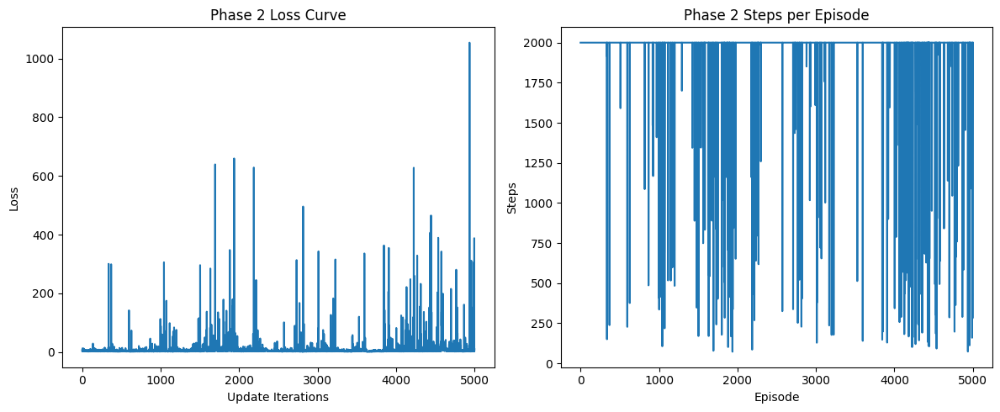

In [31]:
# 可视化训练结果
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(phase2_agent.costs)
plt.title("Phase 2 Loss Curve")
plt.xlabel("Update Iterations")
plt.ylabel("Loss")

plt.subplot(1, 2, 2)
plt.plot(phase2_agent.steps_per_episode)
plt.title("Phase 2 Steps per Episode")
plt.xlabel("Episode")
plt.ylabel("Steps")

plt.tight_layout()
plt.show()

=== Phase 2 model testing ===
🎬 Finished：
🚶 Steps: 160, 🏆 Total_reward: 206.5


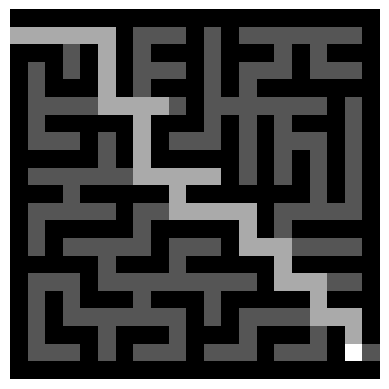

In [46]:
# 测试第二阶段模型
print("=== Phase 2 model testing ===")
test_and_show_video(phase2_env, phase2_agent)

# Phase 3 - Strictly follow the shortest path

## Environment - 3rd

In [98]:
class Phase3MazeEnv(MazeEnv):
    def __init__(self, maze_list, max_steps):
        super().__init__(maze_list, max_steps)
        self.optimal_paths = {}    # 存储每个迷宫的最短路径
        self.path_idx = 0          # 当前在最优路径上的下标进度

    def _bfs_shortest_path(self, maze):
        """
        使用 BFS 计算最短路径，返回 (row, col) 的列表。
        maze 为 numpy 数组，0 表示墙，非 0 表示可通行。
        """
        from collections import deque
        start = self.start_pos
        end = self.exit_pos
        queue = deque([[start]])
        visited = set([start])
        while queue:
            path = queue.popleft()
            r, c = path[-1]
            if (r, c) == end:
                return path
            for dr, dc in [(1, 0), (-1, 0), (0, 1), (0, -1)]:
                nr, nc = r + dr, c + dc
                if 0 <= nr < maze.shape[0] and 0 <= nc < maze.shape[1]:
                    if maze[nr, nc] != 0 and (nr, nc) not in visited:
                        new_path = list(path)
                        new_path.append((nr, nc))
                        queue.append(new_path)
                        visited.add((nr, nc))
        return None  # 若无解则返回 None

    def reset(self):
        """
        调用父类的 reset() 重置环境，
        然后用重置后的 self.original_maze 计算 BFS 最短路径并保存到 self.current_path。
        """
        parent_state = super().reset()
        maze_id = id(self.original_maze)
        if maze_id not in self.optimal_paths:
            path = self._bfs_shortest_path(self.original_maze.numpy())
            if not path:
                return self.reset()  # 如果该迷宫无解，则重新 reset
            self.optimal_paths[maze_id] = path

        self.current_path = self.optimal_paths[maze_id]
        # 初始化 BFS 路径进度下标（起点为第0个节点）
        self.path_idx = 0
        return parent_state

    def _manhattan_distance(self, pos1, pos2):
        return abs(pos1[0] - pos2[0]) + abs(pos1[1] - pos2[1])

    def step(self, action):
        """
        新的奖惩逻辑：
          1. 每步基础惩罚 -0.1
          2. 无效移动（出界或撞墙）额外扣 -1.0
          3. 如果动作使智能体正好到达 BFS 路径的下一个节点（即 expected_next），奖励 +10，并更新进度；
          4. 如果不正好到达，但移动后与 expected_next 的曼哈顿距离更近，则奖励 +2；
          5. 如果移动后离 expected_next 更远，则扣 -2；
          6. 如果移动到了 BFS 路径上的其他节点（跳跃前进），奖励 +5 并更新进度（取较大下标）；
          7. 到达出口时额外奖励 +300，并扣除步数惩罚 (-0.05 * steps) 后结束；
          8. 超出最大步数扣 -50 并结束。
        """
        reward = -0.1  # 基础步代价

        move_map = {0: (1, 0), 1: (0, 1), 2: (-1, 0), 3: (0, -1)}
        delta = move_map.get(action, (0, 0))
        new_r = self.current_pos[0] + delta[0]
        new_c = self.current_pos[1] + delta[1]
        new_pos = (new_r, new_c)

        # 检查移动有效性
        valid_move = True
        if not (0 <= new_r < self.maze_state.shape[0] and 0 <= new_c < self.maze_state.shape[1]):
            valid_move = False
        elif self.original_maze[new_r, new_c].item() == 0:
            valid_move = False

        if not valid_move:
            reward -= 1.0  # 无效移动惩罚
        else:
            # 期望的下一个节点（如果还未到终点）
            if self.path_idx < len(self.current_path) - 1:
                expected_next = self.current_path[self.path_idx + 1]
                dist_current = self._manhattan_distance(self.current_pos, expected_next)
                dist_new = self._manhattan_distance(new_pos, expected_next)
            else:
                # 已经到终点，无所谓
                expected_next = None
                dist_current = 0
                dist_new = 0

            if expected_next is not None and new_pos == expected_next:
                # 正确按顺序前进
                reward += 10.0
                self.path_idx += 1
            elif new_pos in self.current_path:
                # 移动到了 BFS 路径上的其它节点
                new_idx = self.current_path.index(new_pos)
                if new_idx > self.path_idx:
                    # 跨步前进，奖励较低
                    reward += 5.0
                    self.path_idx = new_idx
                else:
                    # 如果移动回到已经走过的节点（回退），给予重罚
                    reward -= 5.0
            else:
                # 不在 BFS 路径上，则比较与期望节点的距离
                if expected_next is not None:
                    if dist_new < dist_current:
                        reward += 2.0
                    else:
                        reward -= 2.0

            # 更新环境状态：将当前位置标记为已访问（2），新位置标记为智能体位置（4）
            if self.current_pos != self.exit_pos:
                self.maze_state[self.current_pos] = 2
            self.current_pos = new_pos
            self.maze_state[self.current_pos] = 4
            self.visited_cells.add(new_pos)
            self.path.append(new_pos)

        self.steps_taken += 1
        done = False

        # 判断是否到达出口（BFS 路径最后一个节点）
        if self.current_pos == self.exit_pos:
            reward += (300.0 - 0.05 * self.steps_taken)
            done = True
        elif self.steps_taken >= self.max_steps:
            reward -= 50.0
            done = True

        return self._process_state(self.maze_state.clone()), reward, done


In [99]:
# 初始化第三阶段环境
phase3_env = Phase3MazeEnv(maze_list=mazes, max_steps=2000)

# 并行环境
phase3_env_class = Phase3MazeEnv
phase3_vec_env = VectorizedMazeEnv(phase3_env_class, maze_list=mazes, n_envs=n_envs, max_steps=2000)

In [100]:
phase3_state = phase3_env.reset()

In [101]:
phase3_state

tensor([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [3, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0],
        [0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0],
        [0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0],
        [0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0],
        [0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0],
        [0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1, 0],
        [0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0],
        [0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0],
        [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0],
        [0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0],
        [0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 

In [102]:
# 初始化智能体并加载预训练模型
phase3_agent = PPOAgent(device=device, lr=0.001, gamma=0.95, clip_epsilon=0.2, update_epochs=4, batch_size=64)

In [103]:
# 加载第二阶段模型
phase2_path = os.path.join(save_dir, "2nd_shortest_path_model.pth")
phase2checkpoint = torch.load(phase2_path)

In [104]:
# 加载第二阶段参数
phase3_agent.policy.load_state_dict(phase2checkpoint['policy_state_dict'])
phase3_agent.optimizer.load_state_dict(phase2checkpoint['optimizer_state_dict'])

In [105]:
# 定义Phase 3训练阶段的总轮数
phase3_num_episodes = 1000
# 已完成的轮数初始化为0
episodes_done = 0

# 使用tqdm创建一个进度条，用于显示Phase 3训练进度
pbar_phase3 = tqdm(total=phase3_num_episodes, desc="Phase 3 Training Progress")

# 当已完成的轮数小于Phase 2的总轮数时，继续训练
while episodes_done < phase3_num_episodes:
    # 重置Phase 3环境，获取初始状态，形状为 (n_envs, 21, 21)
    states = phase3_vec_env.reset()
    # 初始化一个布尔列表，用于标记每个环境是否结束
    done_mask = [False] * n_envs
    # 初始化一个列表，用于存储每个环境的轨迹
    trajectories = [[] for _ in range(n_envs)]
    # 初始化一个列表，用于记录每个环境的总奖励
    total_rewards = [0.0] * n_envs
    # 初始化一个列表，用于记录每个环境的步数
    steps_counts = [0] * n_envs

    # 只要还有环境没结束，就继续
    while not all(done_mask):
        # 通过Phase 3代理选择动作，获取动作、对数概率和价值
        actions, log_probs, values = phase3_agent.choose_action_batch(states)
        # 执行动作，获取下一个状态、奖励和结束标志
        next_states, rewards, dones = phase3_vec_env.step(actions.cpu().numpy())

        # 为了 GAE，更严格：在 step t 存储 next_value = V(s_{t+1})，先计算下个状态的价值
        with torch.no_grad():
            # 计算下一个状态的价值
            _, next_values = phase3_agent.policy(next_states.to(device))
            next_values = next_values.squeeze(-1).cpu()

        # 遍历每个环境
        for i in range(n_envs):
            if not done_mask[i]:  # 如果该环境未结束
                # 构建轨迹元素：(state, action, log_prob, reward, value, done, next_value)
                trajectories[i].append((
                    states[i].cpu(),          # 当前状态
                    actions[i].item(),        # 动作
                    log_probs[i].cpu(),       # 动作的对数概率
                    rewards[i].item(),        # 奖励
                    values[i].item(),         # 当前状态的价值
                    float(dones[i].item()),   # 结束标志（0/1）
                    0.0                       # next_value 占位符
                ))
                # 累加奖励
                total_rewards[i] += rewards[i].item()
                # 步数加1
                steps_counts[i] += 1

        # 更新每个环境上一步 transition 的 next_value 字段
        for i in range(n_envs):
            if not done_mask[i]:  # 如果该环境未结束
                if dones[i]:  # 如果该环境结束
                    # 更新轨迹中最后一个元素的 next_value 为 0
                    t_item = list(trajectories[i][-1])
                    t_item[-1] = 0.0
                    trajectories[i][-1] = tuple(t_item)
                else:  # 如果该环境未结束
                    # 更新轨迹中最后一个元素的 next_value 为下个状态的价值
                    t_item = list(trajectories[i][-1])
                    t_item[-1] = next_values[i].item()
                    trajectories[i][-1] = tuple(t_item)

        # 更新 done_mask
        for i in range(n_envs):
            if dones[i]:  # 如果该环境结束
                done_mask[i] = True

        # 更新状态为下一个状态
        states = next_states

    # 更新阶段：每个子环境的轨迹分别更新
    for i in range(n_envs):
        # 记录每集的步数
        phase3_agent.steps_per_episode.append(steps_counts[i])
        # 使用轨迹数据更新Phase 3代理
        phase3_agent.update(trajectories[i])
        # 已完成的轮数加1
        episodes_done += 1
        # 在进度条中打印当前轮数、奖励和步数
        tqdm.write(f"Episode {episodes_done}, Reward: {total_rewards[i]:.2f}, Steps: {steps_counts[i]}")
        # 更新进度条
        pbar_phase3.update(1)
        # 如果已完成的轮数达到Phase 3的总轮数，退出循环
        if episodes_done >= phase3_num_episodes:
            break

# 关闭Phase 3进度条
pbar_phase3.close()

Phase 3 Training Progress:   0%|                                                   | 1/1000 [00:50<14:04:45, 50.74s/it]

Episode 1, Reward: -1882.00, Steps: 2000


Phase 3 Training Progress:   0%|                                                    | 2/1000 [00:54<6:26:28, 23.24s/it]

Episode 2, Reward: -1905.00, Steps: 2000


Phase 3 Training Progress:   0%|▏                                                   | 3/1000 [00:58<3:56:48, 14.25s/it]

Episode 3, Reward: -1869.00, Steps: 2000


Phase 3 Training Progress:   0%|▏                                                   | 4/1000 [01:01<2:45:25,  9.96s/it]

Episode 4, Reward: -1350.00, Steps: 2000


Phase 3 Training Progress:   0%|▎                                                   | 5/1000 [01:04<2:05:23,  7.56s/it]

Episode 5, Reward: -1416.00, Steps: 2000


Phase 3 Training Progress:   1%|▎                                                   | 6/1000 [01:08<1:42:57,  6.21s/it]

Episode 6, Reward: -1922.00, Steps: 2000


Phase 3 Training Progress:   1%|▎                                                   | 7/1000 [01:11<1:26:59,  5.26s/it]

Episode 7, Reward: -1839.00, Steps: 2000


Phase 3 Training Progress:   1%|▍                                                   | 8/1000 [01:15<1:17:07,  4.66s/it]

Episode 8, Reward: -1419.00, Steps: 2000


Phase 3 Training Progress:   1%|▍                                                   | 9/1000 [01:18<1:09:03,  4.18s/it]

Episode 9, Reward: -2096.00, Steps: 2000


Phase 3 Training Progress:   1%|▌                                                  | 10/1000 [01:22<1:06:57,  4.06s/it]

Episode 10, Reward: -2087.00, Steps: 2000


Phase 3 Training Progress:   1%|▌                                                  | 11/1000 [01:25<1:05:32,  3.98s/it]

Episode 11, Reward: -1603.00, Steps: 2000


Phase 3 Training Progress:   1%|▌                                                  | 12/1000 [01:29<1:01:53,  3.76s/it]

Episode 12, Reward: -2047.00, Steps: 2000


Phase 3 Training Progress:   1%|▋                                                    | 13/1000 [01:32<59:18,  3.61s/it]

Episode 13, Reward: -1998.00, Steps: 2000


Phase 3 Training Progress:   1%|▋                                                    | 14/1000 [01:35<57:11,  3.48s/it]

Episode 14, Reward: -1231.00, Steps: 2000


Phase 3 Training Progress:   2%|▊                                                    | 15/1000 [01:38<56:22,  3.43s/it]

Episode 15, Reward: -1809.00, Steps: 2000


Phase 3 Training Progress:   2%|▊                                                    | 16/1000 [01:42<54:37,  3.33s/it]

Episode 16, Reward: -3832.00, Steps: 2000


Phase 3 Training Progress:   2%|▉                                                    | 17/1000 [01:45<55:53,  3.41s/it]

Episode 17, Reward: -1497.00, Steps: 2000


Phase 3 Training Progress:   2%|▉                                                    | 18/1000 [01:48<54:19,  3.32s/it]

Episode 18, Reward: -6440.00, Steps: 2000


Phase 3 Training Progress:   2%|█                                                    | 19/1000 [01:52<54:01,  3.30s/it]

Episode 19, Reward: -1505.00, Steps: 2000


Phase 3 Training Progress:   2%|█                                                    | 20/1000 [01:55<52:56,  3.24s/it]

Episode 20, Reward: -1973.00, Steps: 2000


Phase 3 Training Progress:   2%|█                                                    | 21/1000 [01:58<52:11,  3.20s/it]

Episode 21, Reward: -1971.00, Steps: 2000


Phase 3 Training Progress:   2%|█▏                                                   | 22/1000 [02:01<52:03,  3.19s/it]

Episode 22, Reward: -2073.00, Steps: 2000


Phase 3 Training Progress:   2%|█▏                                                   | 23/1000 [02:03<45:51,  2.82s/it]

Episode 23, Reward: -513.25, Steps: 1115


Phase 3 Training Progress:   2%|█▎                                                   | 24/1000 [02:06<47:40,  2.93s/it]

Episode 24, Reward: -2049.00, Steps: 2000


Phase 3 Training Progress:   2%|█▎                                                   | 25/1000 [02:09<48:49,  3.01s/it]

Episode 25, Reward: -2147.00, Steps: 2000


Phase 3 Training Progress:   3%|█▍                                                   | 26/1000 [02:13<50:15,  3.10s/it]

Episode 26, Reward: -1959.00, Steps: 2000


Phase 3 Training Progress:   3%|█▍                                                   | 27/1000 [02:16<50:11,  3.09s/it]

Episode 27, Reward: -1542.00, Steps: 2000


Phase 3 Training Progress:   3%|█▍                                                   | 28/1000 [02:19<50:04,  3.09s/it]

Episode 28, Reward: -1782.00, Steps: 2000


Phase 3 Training Progress:   3%|█▌                                                   | 29/1000 [02:22<50:22,  3.11s/it]

Episode 29, Reward: -1362.00, Steps: 2000


Phase 3 Training Progress:   3%|█▌                                                   | 30/1000 [02:25<50:35,  3.13s/it]

Episode 30, Reward: -2025.00, Steps: 2000


Phase 3 Training Progress:   3%|█▋                                                   | 31/1000 [02:28<51:36,  3.20s/it]

Episode 31, Reward: -1717.00, Steps: 2000


Phase 3 Training Progress:   3%|█▋                                                   | 32/1000 [02:32<51:19,  3.18s/it]

Episode 32, Reward: -2318.00, Steps: 2000


Phase 3 Training Progress:   3%|█▋                                                 | 33/1000 [03:18<4:21:05, 16.20s/it]

Episode 33, Reward: -1299.00, Steps: 2000


Phase 3 Training Progress:   3%|█▋                                                 | 34/1000 [03:21<3:17:25, 12.26s/it]

Episode 34, Reward: -1752.00, Steps: 2000


Phase 3 Training Progress:   4%|█▊                                                 | 35/1000 [03:24<2:32:42,  9.49s/it]

Episode 35, Reward: -2039.00, Steps: 2000


Phase 3 Training Progress:   4%|█▊                                                 | 36/1000 [03:27<2:01:26,  7.56s/it]

Episode 36, Reward: -1550.00, Steps: 2000


Phase 3 Training Progress:   4%|█▉                                                 | 37/1000 [03:31<1:41:00,  6.29s/it]

Episode 37, Reward: -2133.00, Steps: 2000


Phase 3 Training Progress:   4%|█▉                                                 | 38/1000 [03:34<1:25:21,  5.32s/it]

Episode 38, Reward: -1491.00, Steps: 2000


Phase 3 Training Progress:   4%|█▉                                                 | 39/1000 [03:37<1:14:48,  4.67s/it]

Episode 39, Reward: -2001.00, Steps: 2000


Phase 3 Training Progress:   4%|██                                                 | 40/1000 [03:40<1:08:33,  4.29s/it]

Episode 40, Reward: -2051.00, Steps: 2000


Phase 3 Training Progress:   4%|██                                                 | 41/1000 [03:43<1:03:21,  3.96s/it]

Episode 41, Reward: -1758.00, Steps: 2000


Phase 3 Training Progress:   4%|██▏                                                  | 42/1000 [03:47<59:40,  3.74s/it]

Episode 42, Reward: -1496.00, Steps: 2000


Phase 3 Training Progress:   4%|██▎                                                  | 43/1000 [03:50<56:22,  3.53s/it]

Episode 43, Reward: -1892.00, Steps: 2000


Phase 3 Training Progress:   4%|██▎                                                  | 44/1000 [03:53<54:27,  3.42s/it]

Episode 44, Reward: -1764.00, Steps: 2000


Phase 3 Training Progress:   4%|██▍                                                  | 45/1000 [03:56<53:16,  3.35s/it]

Episode 45, Reward: -3483.00, Steps: 2000


Phase 3 Training Progress:   5%|██▍                                                  | 46/1000 [03:59<52:28,  3.30s/it]

Episode 46, Reward: -1953.00, Steps: 2000


Phase 3 Training Progress:   5%|██▍                                                  | 47/1000 [04:02<52:05,  3.28s/it]

Episode 47, Reward: -1780.00, Steps: 2000


Phase 3 Training Progress:   5%|██▌                                                  | 48/1000 [04:06<51:19,  3.23s/it]

Episode 48, Reward: -1999.00, Steps: 2000


Phase 3 Training Progress:   5%|██▌                                                  | 49/1000 [04:09<51:25,  3.24s/it]

Episode 49, Reward: -1492.00, Steps: 2000


Phase 3 Training Progress:   5%|██▋                                                  | 50/1000 [04:12<51:18,  3.24s/it]

Episode 50, Reward: -2080.00, Steps: 2000


Phase 3 Training Progress:   5%|██▋                                                  | 51/1000 [04:15<50:47,  3.21s/it]

Episode 51, Reward: -2037.00, Steps: 2000


Phase 3 Training Progress:   5%|██▊                                                  | 52/1000 [04:18<50:16,  3.18s/it]

Episode 52, Reward: -1767.00, Steps: 2000


Phase 3 Training Progress:   5%|██▊                                                  | 53/1000 [04:22<50:15,  3.18s/it]

Episode 53, Reward: -2105.00, Steps: 2000


Phase 3 Training Progress:   5%|██▊                                                  | 54/1000 [04:25<49:41,  3.15s/it]

Episode 54, Reward: -1563.00, Steps: 2000


Phase 3 Training Progress:   6%|██▉                                                  | 55/1000 [04:27<47:01,  2.99s/it]

Episode 55, Reward: -860.55, Steps: 1637


Phase 3 Training Progress:   6%|██▉                                                  | 56/1000 [04:30<47:44,  3.03s/it]

Episode 56, Reward: -2666.00, Steps: 2000


Phase 3 Training Progress:   6%|███                                                  | 57/1000 [04:33<48:09,  3.06s/it]

Episode 57, Reward: -1856.00, Steps: 2000


Phase 3 Training Progress:   6%|███                                                  | 58/1000 [04:37<48:39,  3.10s/it]

Episode 58, Reward: -1788.00, Steps: 2000


Phase 3 Training Progress:   6%|███▏                                                 | 59/1000 [04:40<49:36,  3.16s/it]

Episode 59, Reward: -1774.00, Steps: 2000


Phase 3 Training Progress:   6%|███▏                                                 | 60/1000 [04:43<50:14,  3.21s/it]

Episode 60, Reward: -1933.00, Steps: 2000


Phase 3 Training Progress:   6%|███▏                                                 | 61/1000 [04:47<50:22,  3.22s/it]

Episode 61, Reward: -1545.00, Steps: 2000


Phase 3 Training Progress:   6%|███▎                                                 | 62/1000 [04:50<51:25,  3.29s/it]

Episode 62, Reward: -1997.00, Steps: 2000


Phase 3 Training Progress:   6%|███▎                                                 | 63/1000 [04:53<51:18,  3.29s/it]

Episode 63, Reward: -1585.00, Steps: 2000


Phase 3 Training Progress:   6%|███▍                                                 | 64/1000 [04:56<50:50,  3.26s/it]

Episode 64, Reward: -1975.00, Steps: 2000


Phase 3 Training Progress:   6%|███▎                                               | 65/1000 [05:48<4:34:21, 17.61s/it]

Episode 65, Reward: -2149.00, Steps: 2000


Phase 3 Training Progress:   7%|███▎                                               | 66/1000 [05:51<3:26:56, 13.29s/it]

Episode 66, Reward: -1990.00, Steps: 2000


Phase 3 Training Progress:   7%|███▍                                               | 67/1000 [05:54<2:40:48, 10.34s/it]

Episode 67, Reward: -2178.00, Steps: 2000


Phase 3 Training Progress:   7%|███▍                                               | 68/1000 [05:58<2:09:20,  8.33s/it]

Episode 68, Reward: -2009.00, Steps: 2000


Phase 3 Training Progress:   7%|███▌                                               | 69/1000 [06:01<1:47:10,  6.91s/it]

Episode 69, Reward: -2151.00, Steps: 2000


Phase 3 Training Progress:   7%|███▌                                               | 70/1000 [06:05<1:30:53,  5.86s/it]

Episode 70, Reward: -1916.00, Steps: 2000


Phase 3 Training Progress:   7%|███▌                                               | 71/1000 [06:08<1:18:32,  5.07s/it]

Episode 71, Reward: -2205.00, Steps: 2000


Phase 3 Training Progress:   7%|███▋                                               | 72/1000 [06:12<1:12:36,  4.69s/it]

Episode 72, Reward: -1915.00, Steps: 2000


Phase 3 Training Progress:   7%|███▋                                               | 73/1000 [06:16<1:10:47,  4.58s/it]

Episode 73, Reward: -2149.00, Steps: 2000


Phase 3 Training Progress:   7%|███▊                                               | 74/1000 [06:20<1:06:57,  4.34s/it]

Episode 74, Reward: -2131.00, Steps: 2000


Phase 3 Training Progress:   8%|███▉                                                 | 75/1000 [06:20<48:19,  3.13s/it]

Episode 75, Reward: 452.80, Steps: 188


Phase 3 Training Progress:   8%|████                                                 | 76/1000 [06:24<50:21,  3.27s/it]

Episode 76, Reward: -2164.00, Steps: 2000


Phase 3 Training Progress:   8%|████                                                 | 77/1000 [06:28<52:03,  3.38s/it]

Episode 77, Reward: -1604.00, Steps: 2000


Phase 3 Training Progress:   8%|████▏                                                | 78/1000 [06:31<52:08,  3.39s/it]

Episode 78, Reward: -1879.00, Steps: 2000


Phase 3 Training Progress:   8%|████▏                                                | 79/1000 [06:35<53:01,  3.45s/it]

Episode 79, Reward: -2049.00, Steps: 2000


Phase 3 Training Progress:   8%|████▏                                                | 80/1000 [06:38<52:37,  3.43s/it]

Episode 80, Reward: -1951.00, Steps: 2000


Phase 3 Training Progress:   8%|████▎                                                | 81/1000 [06:41<52:41,  3.44s/it]

Episode 81, Reward: -2099.00, Steps: 2000


Phase 3 Training Progress:   8%|████▎                                                | 82/1000 [06:45<51:54,  3.39s/it]

Episode 82, Reward: -2119.00, Steps: 2000


Phase 3 Training Progress:   8%|████▍                                                | 83/1000 [06:48<51:47,  3.39s/it]

Episode 83, Reward: -1841.00, Steps: 2000


Phase 3 Training Progress:   8%|████▍                                                | 84/1000 [06:51<51:14,  3.36s/it]

Episode 84, Reward: -2135.00, Steps: 2000


Phase 3 Training Progress:   8%|████▌                                                | 85/1000 [06:54<49:56,  3.27s/it]

Episode 85, Reward: -2042.00, Steps: 2000


Phase 3 Training Progress:   9%|████▌                                                | 86/1000 [06:58<51:17,  3.37s/it]

Episode 86, Reward: -1919.00, Steps: 2000


Phase 3 Training Progress:   9%|████▌                                                | 87/1000 [07:01<50:47,  3.34s/it]

Episode 87, Reward: -2106.00, Steps: 2000


Phase 3 Training Progress:   9%|████▋                                                | 88/1000 [07:05<50:18,  3.31s/it]

Episode 88, Reward: -2224.00, Steps: 2000


Phase 3 Training Progress:   9%|████▋                                                | 89/1000 [07:08<51:02,  3.36s/it]

Episode 89, Reward: -2183.00, Steps: 2000


Phase 3 Training Progress:   9%|████▊                                                | 90/1000 [07:11<51:32,  3.40s/it]

Episode 90, Reward: -2229.00, Steps: 2000


Phase 3 Training Progress:   9%|████▊                                                | 91/1000 [07:15<52:39,  3.48s/it]

Episode 91, Reward: -2202.00, Steps: 2000


Phase 3 Training Progress:   9%|████▉                                                | 92/1000 [07:19<52:46,  3.49s/it]

Episode 92, Reward: -2162.00, Steps: 2000


Phase 3 Training Progress:   9%|████▉                                                | 93/1000 [07:22<52:50,  3.50s/it]

Episode 93, Reward: -1861.00, Steps: 2000


Phase 3 Training Progress:   9%|████▉                                                | 94/1000 [07:26<52:51,  3.50s/it]

Episode 94, Reward: -2221.00, Steps: 2000


Phase 3 Training Progress:  10%|█████                                                | 95/1000 [07:29<52:51,  3.50s/it]

Episode 95, Reward: -3437.00, Steps: 2000


Phase 3 Training Progress:  10%|█████                                                | 96/1000 [07:33<52:23,  3.48s/it]

Episode 96, Reward: -4447.00, Steps: 2000


Phase 3 Training Progress:  10%|████▉                                              | 97/1000 [08:19<4:08:06, 16.49s/it]

Episode 97, Reward: -1934.00, Steps: 2000


Phase 3 Training Progress:  10%|████▉                                              | 98/1000 [08:23<3:07:54, 12.50s/it]

Episode 98, Reward: -2118.00, Steps: 2000


Phase 3 Training Progress:  10%|█████                                              | 99/1000 [08:26<2:25:20,  9.68s/it]

Episode 99, Reward: -2143.00, Steps: 2000


Phase 3 Training Progress:  10%|█████                                             | 100/1000 [08:29<1:55:42,  7.71s/it]

Episode 100, Reward: -2074.00, Steps: 2000


Phase 3 Training Progress:  10%|█████                                             | 101/1000 [08:32<1:36:03,  6.41s/it]

Episode 101, Reward: -1277.00, Steps: 2000


Phase 3 Training Progress:  10%|█████                                             | 102/1000 [08:35<1:21:30,  5.45s/it]

Episode 102, Reward: -1923.00, Steps: 2000


Phase 3 Training Progress:  10%|█████▏                                            | 103/1000 [08:39<1:11:14,  4.77s/it]

Episode 103, Reward: -1949.00, Steps: 2000


Phase 3 Training Progress:  10%|█████▏                                            | 104/1000 [08:42<1:04:24,  4.31s/it]

Episode 104, Reward: -2153.00, Steps: 2000


Phase 3 Training Progress:  10%|█████▍                                              | 105/1000 [08:45<59:08,  3.96s/it]

Episode 105, Reward: -1393.00, Steps: 2000


Phase 3 Training Progress:  11%|█████▌                                              | 106/1000 [08:48<55:40,  3.74s/it]

Episode 106, Reward: -1643.00, Steps: 2000


Phase 3 Training Progress:  11%|█████▌                                              | 107/1000 [08:52<54:00,  3.63s/it]

Episode 107, Reward: -1908.00, Steps: 2000


Phase 3 Training Progress:  11%|█████▌                                              | 108/1000 [08:55<51:40,  3.48s/it]

Episode 108, Reward: -2041.00, Steps: 2000


Phase 3 Training Progress:  11%|█████▋                                              | 109/1000 [08:58<52:44,  3.55s/it]

Episode 109, Reward: -1792.00, Steps: 2000


Phase 3 Training Progress:  11%|█████▋                                              | 110/1000 [09:02<52:03,  3.51s/it]

Episode 110, Reward: -1991.00, Steps: 2000


Phase 3 Training Progress:  11%|█████▊                                              | 111/1000 [09:05<50:25,  3.40s/it]

Episode 111, Reward: -4191.00, Steps: 2000


Phase 3 Training Progress:  11%|█████▊                                              | 112/1000 [09:08<49:17,  3.33s/it]

Episode 112, Reward: -1843.00, Steps: 2000


Phase 3 Training Progress:  11%|█████▉                                              | 113/1000 [09:11<48:40,  3.29s/it]

Episode 113, Reward: -1950.00, Steps: 2000


Phase 3 Training Progress:  11%|█████▉                                              | 114/1000 [09:15<48:19,  3.27s/it]

Episode 114, Reward: -2146.00, Steps: 2000


Phase 3 Training Progress:  12%|█████▉                                              | 115/1000 [09:18<48:02,  3.26s/it]

Episode 115, Reward: -2147.00, Steps: 2000


Phase 3 Training Progress:  12%|██████                                              | 116/1000 [09:21<47:45,  3.24s/it]

Episode 116, Reward: -2120.00, Steps: 2000


Phase 3 Training Progress:  12%|██████                                              | 117/1000 [09:24<47:39,  3.24s/it]

Episode 117, Reward: -2129.00, Steps: 2000


Phase 3 Training Progress:  12%|██████▏                                             | 118/1000 [09:27<46:49,  3.19s/it]

Episode 118, Reward: -2061.00, Steps: 2000


Phase 3 Training Progress:  12%|██████▏                                             | 119/1000 [09:30<46:33,  3.17s/it]

Episode 119, Reward: -1887.00, Steps: 2000


Phase 3 Training Progress:  12%|██████▏                                             | 120/1000 [09:34<45:57,  3.13s/it]

Episode 120, Reward: -2127.00, Steps: 2000


Phase 3 Training Progress:  12%|██████▎                                             | 121/1000 [09:37<46:01,  3.14s/it]

Episode 121, Reward: -1912.00, Steps: 2000


Phase 3 Training Progress:  12%|██████▎                                             | 122/1000 [09:40<46:33,  3.18s/it]

Episode 122, Reward: -2132.00, Steps: 2000


Phase 3 Training Progress:  12%|██████▍                                             | 123/1000 [09:43<46:30,  3.18s/it]

Episode 123, Reward: -2054.00, Steps: 2000


Phase 3 Training Progress:  12%|██████▍                                             | 124/1000 [09:46<46:14,  3.17s/it]

Episode 124, Reward: -2013.00, Steps: 2000


Phase 3 Training Progress:  12%|██████▌                                             | 125/1000 [09:49<46:09,  3.16s/it]

Episode 125, Reward: -1970.00, Steps: 2000


Phase 3 Training Progress:  13%|██████▌                                             | 126/1000 [09:53<46:25,  3.19s/it]

Episode 126, Reward: -2142.00, Steps: 2000


Phase 3 Training Progress:  13%|██████▌                                             | 127/1000 [09:56<46:02,  3.16s/it]

Episode 127, Reward: -2041.00, Steps: 2000


Phase 3 Training Progress:  13%|██████▋                                             | 128/1000 [09:59<45:46,  3.15s/it]

Episode 128, Reward: -2090.00, Steps: 2000


Phase 3 Training Progress:  13%|██████▍                                           | 129/1000 [10:46<3:56:43, 16.31s/it]

Episode 129, Reward: -2029.00, Steps: 2000


Phase 3 Training Progress:  13%|██████▌                                           | 130/1000 [10:49<2:59:06, 12.35s/it]

Episode 130, Reward: -3235.00, Steps: 2000


Phase 3 Training Progress:  13%|██████▌                                           | 131/1000 [10:52<2:18:52,  9.59s/it]

Episode 131, Reward: -1887.00, Steps: 2000


Phase 3 Training Progress:  13%|██████▌                                           | 132/1000 [10:55<1:51:17,  7.69s/it]

Episode 132, Reward: -2024.00, Steps: 2000


Phase 3 Training Progress:  13%|██████▋                                           | 133/1000 [10:59<1:31:31,  6.33s/it]

Episode 133, Reward: -3112.00, Steps: 2000


Phase 3 Training Progress:  13%|██████▋                                           | 134/1000 [11:02<1:17:33,  5.37s/it]

Episode 134, Reward: -1715.00, Steps: 2000


Phase 3 Training Progress:  14%|██████▊                                           | 135/1000 [11:05<1:07:55,  4.71s/it]

Episode 135, Reward: -2055.00, Steps: 2000


Phase 3 Training Progress:  14%|██████▊                                           | 136/1000 [11:08<1:01:43,  4.29s/it]

Episode 136, Reward: -2375.00, Steps: 2000


Phase 3 Training Progress:  14%|███████                                             | 137/1000 [11:11<56:40,  3.94s/it]

Episode 137, Reward: -2099.00, Steps: 2000


Phase 3 Training Progress:  14%|███████▏                                            | 138/1000 [11:14<52:54,  3.68s/it]

Episode 138, Reward: -1949.00, Steps: 2000


Phase 3 Training Progress:  14%|███████▏                                            | 139/1000 [11:18<50:38,  3.53s/it]

Episode 139, Reward: -2036.00, Steps: 2000


Phase 3 Training Progress:  14%|███████▎                                            | 140/1000 [11:21<49:05,  3.42s/it]

Episode 140, Reward: -1983.00, Steps: 2000


Phase 3 Training Progress:  14%|███████▎                                            | 141/1000 [11:24<47:28,  3.32s/it]

Episode 141, Reward: -2115.00, Steps: 2000


Phase 3 Training Progress:  14%|███████▍                                            | 142/1000 [11:27<46:31,  3.25s/it]

Episode 142, Reward: -3665.00, Steps: 2000


Phase 3 Training Progress:  14%|███████▍                                            | 143/1000 [11:30<45:59,  3.22s/it]

Episode 143, Reward: -2029.00, Steps: 2000


Phase 3 Training Progress:  14%|███████▍                                            | 144/1000 [11:33<45:37,  3.20s/it]

Episode 144, Reward: -2091.00, Steps: 2000


Phase 3 Training Progress:  14%|███████▌                                            | 145/1000 [11:36<45:24,  3.19s/it]

Episode 145, Reward: -1966.00, Steps: 2000


Phase 3 Training Progress:  15%|███████▌                                            | 146/1000 [11:39<44:52,  3.15s/it]

Episode 146, Reward: -1929.00, Steps: 2000


Phase 3 Training Progress:  15%|███████▋                                            | 147/1000 [11:43<44:44,  3.15s/it]

Episode 147, Reward: -2033.00, Steps: 2000


Phase 3 Training Progress:  15%|███████▋                                            | 148/1000 [11:46<44:37,  3.14s/it]

Episode 148, Reward: -2295.00, Steps: 2000


Phase 3 Training Progress:  15%|███████▋                                            | 149/1000 [11:49<45:07,  3.18s/it]

Episode 149, Reward: -1889.00, Steps: 2000


Phase 3 Training Progress:  15%|███████▊                                            | 150/1000 [11:52<44:39,  3.15s/it]

Episode 150, Reward: -2055.00, Steps: 2000


Phase 3 Training Progress:  15%|███████▊                                            | 151/1000 [11:55<44:29,  3.14s/it]

Episode 151, Reward: -1867.00, Steps: 2000


Phase 3 Training Progress:  15%|███████▉                                            | 152/1000 [11:58<44:12,  3.13s/it]

Episode 152, Reward: -1890.00, Steps: 2000


Phase 3 Training Progress:  15%|███████▉                                            | 153/1000 [12:01<44:14,  3.13s/it]

Episode 153, Reward: -2072.00, Steps: 2000


Phase 3 Training Progress:  15%|████████                                            | 154/1000 [12:05<44:07,  3.13s/it]

Episode 154, Reward: -1859.00, Steps: 2000


Phase 3 Training Progress:  16%|████████                                            | 155/1000 [12:08<44:17,  3.15s/it]

Episode 155, Reward: -1957.00, Steps: 2000


Phase 3 Training Progress:  16%|████████                                            | 156/1000 [12:11<44:13,  3.14s/it]

Episode 156, Reward: -2781.00, Steps: 2000


Phase 3 Training Progress:  16%|████████▏                                           | 157/1000 [12:14<44:11,  3.14s/it]

Episode 157, Reward: -2125.00, Steps: 2000


Phase 3 Training Progress:  16%|████████▏                                           | 158/1000 [12:17<44:08,  3.15s/it]

Episode 158, Reward: -1976.00, Steps: 2000


Phase 3 Training Progress:  16%|████████▎                                           | 159/1000 [12:20<43:52,  3.13s/it]

Episode 159, Reward: -1937.00, Steps: 2000


Phase 3 Training Progress:  16%|████████▎                                           | 160/1000 [12:23<43:22,  3.10s/it]

Episode 160, Reward: -1939.00, Steps: 2000


Phase 3 Training Progress:  16%|████████                                          | 161/1000 [13:09<3:42:41, 15.93s/it]

Episode 161, Reward: -1457.00, Steps: 2000


Phase 3 Training Progress:  16%|████████                                          | 162/1000 [13:12<2:48:39, 12.08s/it]

Episode 162, Reward: -1630.00, Steps: 2000


Phase 3 Training Progress:  16%|████████▏                                         | 163/1000 [13:13<1:59:22,  8.56s/it]

Episode 163, Reward: 413.15, Steps: 199


Phase 3 Training Progress:  16%|████████▏                                         | 164/1000 [13:16<1:36:18,  6.91s/it]

Episode 164, Reward: -1711.00, Steps: 2000


Phase 3 Training Progress:  16%|████████▎                                         | 165/1000 [13:19<1:20:50,  5.81s/it]

Episode 165, Reward: -1689.00, Steps: 2000


Phase 3 Training Progress:  17%|████████▎                                         | 166/1000 [13:22<1:09:34,  5.00s/it]

Episode 166, Reward: -1662.00, Steps: 2000


Phase 3 Training Progress:  17%|████████▎                                         | 167/1000 [13:25<1:01:44,  4.45s/it]

Episode 167, Reward: -1606.00, Steps: 2000


Phase 3 Training Progress:  17%|████████▋                                           | 168/1000 [13:25<44:17,  3.19s/it]

Episode 168, Reward: 478.80, Steps: 148


Phase 3 Training Progress:  17%|████████▊                                           | 169/1000 [13:29<43:55,  3.17s/it]

Episode 169, Reward: -1476.00, Steps: 2000


Phase 3 Training Progress:  17%|████████▊                                           | 170/1000 [13:32<43:30,  3.15s/it]

Episode 170, Reward: -1519.00, Steps: 2000


Phase 3 Training Progress:  17%|████████▉                                           | 171/1000 [13:35<43:29,  3.15s/it]

Episode 171, Reward: -1650.00, Steps: 2000


Phase 3 Training Progress:  17%|████████▉                                           | 172/1000 [13:38<44:03,  3.19s/it]

Episode 172, Reward: -1491.00, Steps: 2000


Phase 3 Training Progress:  17%|████████▉                                           | 173/1000 [13:41<44:05,  3.20s/it]

Episode 173, Reward: -1393.00, Steps: 2000


Phase 3 Training Progress:  17%|█████████                                           | 174/1000 [13:44<43:50,  3.18s/it]

Episode 174, Reward: -1922.00, Steps: 2000


Phase 3 Training Progress:  18%|█████████                                           | 175/1000 [13:47<41:23,  3.01s/it]

Episode 175, Reward: -1351.30, Steps: 1642


Phase 3 Training Progress:  18%|█████████▏                                          | 176/1000 [13:50<42:07,  3.07s/it]

Episode 176, Reward: -2189.00, Steps: 2000


Phase 3 Training Progress:  18%|█████████▏                                          | 177/1000 [13:53<42:32,  3.10s/it]

Episode 177, Reward: -1693.00, Steps: 2000


Phase 3 Training Progress:  18%|█████████▎                                          | 178/1000 [13:57<43:10,  3.15s/it]

Episode 178, Reward: -1812.00, Steps: 2000


Phase 3 Training Progress:  18%|█████████▎                                          | 179/1000 [14:00<42:51,  3.13s/it]

Episode 179, Reward: -1842.00, Steps: 2000


Phase 3 Training Progress:  18%|█████████▎                                          | 180/1000 [14:03<42:41,  3.12s/it]

Episode 180, Reward: -1587.00, Steps: 2000


Phase 3 Training Progress:  18%|█████████▍                                          | 181/1000 [14:06<42:38,  3.12s/it]

Episode 181, Reward: -1653.00, Steps: 2000


Phase 3 Training Progress:  18%|█████████▍                                          | 182/1000 [14:09<43:15,  3.17s/it]

Episode 182, Reward: -3757.00, Steps: 2000


Phase 3 Training Progress:  18%|█████████▌                                          | 183/1000 [14:13<43:14,  3.18s/it]

Episode 183, Reward: -1593.00, Steps: 2000


Phase 3 Training Progress:  18%|█████████▌                                          | 184/1000 [14:16<43:18,  3.18s/it]

Episode 184, Reward: -2223.00, Steps: 2000


Phase 3 Training Progress:  18%|█████████▌                                          | 185/1000 [14:19<43:22,  3.19s/it]

Episode 185, Reward: -1998.00, Steps: 2000


Phase 3 Training Progress:  19%|█████████▋                                          | 186/1000 [14:22<43:32,  3.21s/it]

Episode 186, Reward: -1765.00, Steps: 2000


Phase 3 Training Progress:  19%|█████████▋                                          | 187/1000 [14:25<43:16,  3.19s/it]

Episode 187, Reward: -1855.00, Steps: 2000


Phase 3 Training Progress:  19%|█████████▊                                          | 188/1000 [14:29<43:19,  3.20s/it]

Episode 188, Reward: -1795.00, Steps: 2000


Phase 3 Training Progress:  19%|█████████▊                                          | 189/1000 [14:32<43:00,  3.18s/it]

Episode 189, Reward: -1845.00, Steps: 2000


Phase 3 Training Progress:  19%|█████████▉                                          | 190/1000 [14:35<43:08,  3.20s/it]

Episode 190, Reward: -1929.00, Steps: 2000


Phase 3 Training Progress:  19%|█████████▉                                          | 191/1000 [14:38<43:44,  3.24s/it]

Episode 191, Reward: -1780.00, Steps: 2000


Phase 3 Training Progress:  19%|█████████▉                                          | 192/1000 [14:42<45:16,  3.36s/it]

Episode 192, Reward: -1523.00, Steps: 2000


Phase 3 Training Progress:  19%|█████████▋                                        | 193/1000 [15:29<3:43:04, 16.59s/it]

Episode 193, Reward: -2428.00, Steps: 2000


Phase 3 Training Progress:  19%|█████████▋                                        | 194/1000 [15:33<2:48:59, 12.58s/it]

Episode 194, Reward: -2130.00, Steps: 2000


Phase 3 Training Progress:  20%|█████████▊                                        | 195/1000 [15:36<2:11:01,  9.77s/it]

Episode 195, Reward: -1510.00, Steps: 2000


Phase 3 Training Progress:  20%|█████████▊                                        | 196/1000 [15:39<1:44:26,  7.79s/it]

Episode 196, Reward: -1410.00, Steps: 2000


Phase 3 Training Progress:  20%|█████████▊                                        | 197/1000 [15:42<1:26:45,  6.48s/it]

Episode 197, Reward: -1919.00, Steps: 2000


Phase 3 Training Progress:  20%|█████████▉                                        | 198/1000 [15:46<1:13:13,  5.48s/it]

Episode 198, Reward: -1332.00, Steps: 2000


Phase 3 Training Progress:  20%|█████████▉                                        | 199/1000 [15:49<1:04:04,  4.80s/it]

Episode 199, Reward: -1851.00, Steps: 2000


Phase 3 Training Progress:  20%|██████████▍                                         | 200/1000 [15:51<52:35,  3.94s/it]

Episode 200, Reward: -696.70, Steps: 1178


Phase 3 Training Progress:  20%|██████████▍                                         | 201/1000 [15:54<49:52,  3.74s/it]

Episode 201, Reward: -2183.00, Steps: 2000


Phase 3 Training Progress:  20%|██████████▌                                         | 202/1000 [15:57<47:40,  3.58s/it]

Episode 202, Reward: -1328.00, Steps: 2000


Phase 3 Training Progress:  20%|██████████▌                                         | 203/1000 [16:00<46:02,  3.47s/it]

Episode 203, Reward: -1249.00, Steps: 2000


Phase 3 Training Progress:  20%|██████████▌                                         | 204/1000 [16:04<44:47,  3.38s/it]

Episode 204, Reward: -2435.00, Steps: 2000


Phase 3 Training Progress:  20%|██████████▋                                         | 205/1000 [16:07<44:07,  3.33s/it]

Episode 205, Reward: -2080.00, Steps: 2000


Phase 3 Training Progress:  21%|██████████▋                                         | 206/1000 [16:10<43:32,  3.29s/it]

Episode 206, Reward: -1463.00, Steps: 2000


Phase 3 Training Progress:  21%|██████████▊                                         | 207/1000 [16:13<43:14,  3.27s/it]

Episode 207, Reward: -1898.00, Steps: 2000


Phase 3 Training Progress:  21%|██████████▊                                         | 208/1000 [16:16<42:57,  3.25s/it]

Episode 208, Reward: -1186.00, Steps: 2000


Phase 3 Training Progress:  21%|██████████▊                                         | 209/1000 [16:20<42:31,  3.23s/it]

Episode 209, Reward: -1567.00, Steps: 2000


Phase 3 Training Progress:  21%|██████████▉                                         | 210/1000 [16:23<42:22,  3.22s/it]

Episode 210, Reward: -1413.00, Steps: 2000


Phase 3 Training Progress:  21%|██████████▉                                         | 211/1000 [16:26<42:13,  3.21s/it]

Episode 211, Reward: -1306.00, Steps: 2000


Phase 3 Training Progress:  21%|███████████                                         | 212/1000 [16:29<42:04,  3.20s/it]

Episode 212, Reward: -3439.00, Steps: 2000


Phase 3 Training Progress:  21%|███████████                                         | 213/1000 [16:32<41:52,  3.19s/it]

Episode 213, Reward: -2303.00, Steps: 2000


Phase 3 Training Progress:  21%|███████████▏                                        | 214/1000 [16:35<41:45,  3.19s/it]

Episode 214, Reward: -1468.00, Steps: 2000


Phase 3 Training Progress:  22%|███████████▏                                        | 215/1000 [16:39<41:57,  3.21s/it]

Episode 215, Reward: -2523.00, Steps: 2000


Phase 3 Training Progress:  22%|███████████▏                                        | 216/1000 [16:42<41:46,  3.20s/it]

Episode 216, Reward: -2484.00, Steps: 2000


Phase 3 Training Progress:  22%|███████████▎                                        | 217/1000 [16:45<41:41,  3.19s/it]

Episode 217, Reward: -5478.00, Steps: 2000


Phase 3 Training Progress:  22%|███████████▎                                        | 218/1000 [16:48<41:48,  3.21s/it]

Episode 218, Reward: -1186.00, Steps: 2000


Phase 3 Training Progress:  22%|███████████▍                                        | 219/1000 [16:52<41:57,  3.22s/it]

Episode 219, Reward: -2088.00, Steps: 2000


Phase 3 Training Progress:  22%|███████████▍                                        | 220/1000 [16:55<41:58,  3.23s/it]

Episode 220, Reward: -1649.00, Steps: 2000


Phase 3 Training Progress:  22%|███████████▍                                        | 221/1000 [16:58<41:46,  3.22s/it]

Episode 221, Reward: -1629.00, Steps: 2000


Phase 3 Training Progress:  22%|███████████▌                                        | 222/1000 [17:01<41:39,  3.21s/it]

Episode 222, Reward: -2299.00, Steps: 2000


Phase 3 Training Progress:  22%|███████████▌                                        | 223/1000 [17:04<41:40,  3.22s/it]

Episode 223, Reward: -1767.00, Steps: 2000


Phase 3 Training Progress:  22%|███████████▋                                        | 224/1000 [17:08<41:43,  3.23s/it]

Episode 224, Reward: -1890.00, Steps: 2000


Phase 3 Training Progress:  22%|███████████▎                                      | 225/1000 [17:57<3:38:31, 16.92s/it]

Episode 225, Reward: -1516.00, Steps: 2000


Phase 3 Training Progress:  23%|███████████▎                                      | 226/1000 [18:00<2:45:15, 12.81s/it]

Episode 226, Reward: -1753.00, Steps: 2000


Phase 3 Training Progress:  23%|███████████▎                                      | 227/1000 [18:03<2:07:47,  9.92s/it]

Episode 227, Reward: -1777.00, Steps: 2000


Phase 3 Training Progress:  23%|███████████▍                                      | 228/1000 [18:06<1:42:36,  7.97s/it]

Episode 228, Reward: -1717.00, Steps: 2000


Phase 3 Training Progress:  23%|███████████▍                                      | 229/1000 [18:10<1:23:40,  6.51s/it]

Episode 229, Reward: -1727.00, Steps: 2000


Phase 3 Training Progress:  23%|███████████▌                                      | 230/1000 [18:13<1:10:39,  5.51s/it]

Episode 230, Reward: -1478.00, Steps: 2000


Phase 3 Training Progress:  23%|███████████▌                                      | 231/1000 [18:16<1:01:37,  4.81s/it]

Episode 231, Reward: -1944.00, Steps: 2000


Phase 3 Training Progress:  23%|████████████                                        | 232/1000 [18:19<55:01,  4.30s/it]

Episode 232, Reward: -1719.00, Steps: 2000


Phase 3 Training Progress:  23%|████████████                                        | 233/1000 [18:22<50:44,  3.97s/it]

Episode 233, Reward: -1819.00, Steps: 2000


Phase 3 Training Progress:  23%|████████████▏                                       | 234/1000 [18:25<47:34,  3.73s/it]

Episode 234, Reward: -1596.00, Steps: 2000


Phase 3 Training Progress:  24%|████████████▏                                       | 235/1000 [18:28<45:23,  3.56s/it]

Episode 235, Reward: -1466.00, Steps: 2000


Phase 3 Training Progress:  24%|████████████▎                                       | 236/1000 [18:32<43:42,  3.43s/it]

Episode 236, Reward: -1762.00, Steps: 2000


Phase 3 Training Progress:  24%|████████████▎                                       | 237/1000 [18:35<42:37,  3.35s/it]

Episode 237, Reward: -2937.00, Steps: 2000


Phase 3 Training Progress:  24%|████████████▍                                       | 238/1000 [18:38<42:07,  3.32s/it]

Episode 238, Reward: -1856.00, Steps: 2000


Phase 3 Training Progress:  24%|████████████▍                                       | 239/1000 [18:41<41:24,  3.26s/it]

Episode 239, Reward: -1947.00, Steps: 2000


Phase 3 Training Progress:  24%|████████████▍                                       | 240/1000 [18:44<40:57,  3.23s/it]

Episode 240, Reward: -1588.00, Steps: 2000


Phase 3 Training Progress:  24%|████████████▌                                       | 241/1000 [18:48<41:28,  3.28s/it]

Episode 241, Reward: -2062.00, Steps: 2000


Phase 3 Training Progress:  24%|████████████▌                                       | 242/1000 [18:51<40:45,  3.23s/it]

Episode 242, Reward: -1763.00, Steps: 2000


Phase 3 Training Progress:  24%|████████████▋                                       | 243/1000 [18:54<40:22,  3.20s/it]

Episode 243, Reward: -3923.00, Steps: 2000


Phase 3 Training Progress:  24%|████████████▋                                       | 244/1000 [18:57<40:54,  3.25s/it]

Episode 244, Reward: -2513.00, Steps: 2000


Phase 3 Training Progress:  24%|████████████▋                                       | 245/1000 [19:00<40:14,  3.20s/it]

Episode 245, Reward: -1609.00, Steps: 2000


Phase 3 Training Progress:  25%|████████████▊                                       | 246/1000 [19:04<40:09,  3.20s/it]

Episode 246, Reward: -1923.00, Steps: 2000


Phase 3 Training Progress:  25%|████████████▊                                       | 247/1000 [19:07<40:30,  3.23s/it]

Episode 247, Reward: -2526.00, Steps: 2000


Phase 3 Training Progress:  25%|████████████▉                                       | 248/1000 [19:10<40:09,  3.20s/it]

Episode 248, Reward: -1935.00, Steps: 2000


Phase 3 Training Progress:  25%|████████████▉                                       | 249/1000 [19:13<39:54,  3.19s/it]

Episode 249, Reward: -2429.00, Steps: 2000


Phase 3 Training Progress:  25%|█████████████                                       | 250/1000 [19:17<40:41,  3.26s/it]

Episode 250, Reward: -1728.00, Steps: 2000


Phase 3 Training Progress:  25%|█████████████                                       | 251/1000 [19:20<39:57,  3.20s/it]

Episode 251, Reward: -1746.00, Steps: 2000


Phase 3 Training Progress:  25%|█████████████                                       | 252/1000 [19:23<40:00,  3.21s/it]

Episode 252, Reward: -1693.00, Steps: 2000


Phase 3 Training Progress:  25%|█████████████▏                                      | 253/1000 [19:26<40:08,  3.22s/it]

Episode 253, Reward: -1447.00, Steps: 2000


Phase 3 Training Progress:  25%|█████████████▏                                      | 254/1000 [19:29<40:01,  3.22s/it]

Episode 254, Reward: -3208.00, Steps: 2000


Phase 3 Training Progress:  26%|█████████████▎                                      | 255/1000 [19:33<39:49,  3.21s/it]

Episode 255, Reward: -1859.00, Steps: 2000


Phase 3 Training Progress:  26%|█████████████▎                                      | 256/1000 [19:36<39:35,  3.19s/it]

Episode 256, Reward: -2389.00, Steps: 2000


Phase 3 Training Progress:  26%|████████████▊                                     | 257/1000 [20:23<3:24:25, 16.51s/it]

Episode 257, Reward: -1587.00, Steps: 2000


Phase 3 Training Progress:  26%|████████████▉                                     | 258/1000 [20:26<2:34:41, 12.51s/it]

Episode 258, Reward: -1645.95, Steps: 1913


Phase 3 Training Progress:  26%|████████████▉                                     | 259/1000 [20:30<2:00:00,  9.72s/it]

Episode 259, Reward: -1373.00, Steps: 2000


Phase 3 Training Progress:  26%|█████████████                                     | 260/1000 [20:33<1:35:31,  7.74s/it]

Episode 260, Reward: -2818.00, Steps: 2000


Phase 3 Training Progress:  26%|█████████████                                     | 261/1000 [20:36<1:18:34,  6.38s/it]

Episode 261, Reward: -1284.00, Steps: 2000


Phase 3 Training Progress:  26%|█████████████                                     | 262/1000 [20:39<1:06:53,  5.44s/it]

Episode 262, Reward: -1786.00, Steps: 2000


Phase 3 Training Progress:  26%|█████████████▋                                      | 263/1000 [20:42<58:41,  4.78s/it]

Episode 263, Reward: -2153.00, Steps: 2000


Phase 3 Training Progress:  26%|█████████████▋                                      | 264/1000 [20:46<52:59,  4.32s/it]

Episode 264, Reward: -1480.00, Steps: 2000


Phase 3 Training Progress:  26%|█████████████▊                                      | 265/1000 [20:49<48:49,  3.99s/it]

Episode 265, Reward: -1449.00, Steps: 2000


Phase 3 Training Progress:  27%|█████████████▊                                      | 266/1000 [20:52<45:54,  3.75s/it]

Episode 266, Reward: -2737.00, Steps: 2000


Phase 3 Training Progress:  27%|█████████████▉                                      | 267/1000 [20:55<44:17,  3.62s/it]

Episode 267, Reward: -2240.00, Steps: 2000


Phase 3 Training Progress:  27%|█████████████▉                                      | 268/1000 [20:59<42:44,  3.50s/it]

Episode 268, Reward: -1333.00, Steps: 2000


Phase 3 Training Progress:  27%|█████████████▉                                      | 269/1000 [21:02<41:38,  3.42s/it]

Episode 269, Reward: -2103.00, Steps: 2000


Phase 3 Training Progress:  27%|██████████████                                      | 270/1000 [21:05<40:53,  3.36s/it]

Episode 270, Reward: -1744.00, Steps: 2000


Phase 3 Training Progress:  27%|██████████████                                      | 271/1000 [21:08<40:36,  3.34s/it]

Episode 271, Reward: -1326.00, Steps: 2000


Phase 3 Training Progress:  27%|██████████████▏                                     | 272/1000 [21:12<40:15,  3.32s/it]

Episode 272, Reward: -1299.00, Steps: 2000


Phase 3 Training Progress:  27%|██████████████▏                                     | 273/1000 [21:15<39:57,  3.30s/it]

Episode 273, Reward: -1807.00, Steps: 2000


Phase 3 Training Progress:  27%|██████████████▏                                     | 274/1000 [21:18<40:03,  3.31s/it]

Episode 274, Reward: -1376.00, Steps: 2000


Phase 3 Training Progress:  28%|██████████████▎                                     | 275/1000 [21:22<39:53,  3.30s/it]

Episode 275, Reward: -1895.00, Steps: 2000


Phase 3 Training Progress:  28%|██████████████▎                                     | 276/1000 [21:25<39:43,  3.29s/it]

Episode 276, Reward: -1568.00, Steps: 2000


Phase 3 Training Progress:  28%|██████████████▍                                     | 277/1000 [21:28<40:15,  3.34s/it]

Episode 277, Reward: -2107.00, Steps: 2000


Phase 3 Training Progress:  28%|██████████████▍                                     | 278/1000 [21:32<40:13,  3.34s/it]

Episode 278, Reward: -1504.00, Steps: 2000


Phase 3 Training Progress:  28%|██████████████▌                                     | 279/1000 [21:35<39:33,  3.29s/it]

Episode 279, Reward: -1521.00, Steps: 2000


Phase 3 Training Progress:  28%|██████████████▌                                     | 280/1000 [21:38<39:23,  3.28s/it]

Episode 280, Reward: -1552.00, Steps: 2000


Phase 3 Training Progress:  28%|██████████████▌                                     | 281/1000 [21:41<39:34,  3.30s/it]

Episode 281, Reward: -2232.00, Steps: 2000


Phase 3 Training Progress:  28%|██████████████▋                                     | 282/1000 [21:45<38:42,  3.24s/it]

Episode 282, Reward: -1683.00, Steps: 2000


Phase 3 Training Progress:  28%|██████████████▋                                     | 283/1000 [21:48<38:26,  3.22s/it]

Episode 283, Reward: -1403.00, Steps: 2000


Phase 3 Training Progress:  28%|██████████████▊                                     | 284/1000 [21:51<38:26,  3.22s/it]

Episode 284, Reward: -3077.00, Steps: 2000


Phase 3 Training Progress:  28%|██████████████▊                                     | 285/1000 [21:54<38:36,  3.24s/it]

Episode 285, Reward: -1409.00, Steps: 2000


Phase 3 Training Progress:  29%|██████████████▊                                     | 286/1000 [21:57<38:14,  3.21s/it]

Episode 286, Reward: -1608.00, Steps: 2000


Phase 3 Training Progress:  29%|██████████████▉                                     | 287/1000 [22:01<38:07,  3.21s/it]

Episode 287, Reward: -1965.00, Steps: 2000


Phase 3 Training Progress:  29%|██████████████▉                                     | 288/1000 [22:04<38:27,  3.24s/it]

Episode 288, Reward: -1654.00, Steps: 2000


Phase 3 Training Progress:  29%|██████████████▍                                   | 289/1000 [22:51<3:13:23, 16.32s/it]

Episode 289, Reward: -1645.00, Steps: 2000


Phase 3 Training Progress:  29%|██████████████▍                                   | 290/1000 [22:54<2:27:15, 12.44s/it]

Episode 290, Reward: -3192.00, Steps: 2000


Phase 3 Training Progress:  29%|██████████████▌                                   | 291/1000 [22:56<1:48:36,  9.19s/it]

Episode 291, Reward: -1125.00, Steps: 1040


Phase 3 Training Progress:  29%|██████████████▌                                   | 292/1000 [22:59<1:27:23,  7.41s/it]

Episode 292, Reward: -1405.00, Steps: 2000


Phase 3 Training Progress:  29%|██████████████▋                                   | 293/1000 [23:02<1:12:18,  6.14s/it]

Episode 293, Reward: -1763.00, Steps: 2000


Phase 3 Training Progress:  29%|██████████████▋                                   | 294/1000 [23:05<1:01:54,  5.26s/it]

Episode 294, Reward: -1385.00, Steps: 2000


Phase 3 Training Progress:  30%|███████████████▎                                    | 295/1000 [23:09<54:42,  4.66s/it]

Episode 295, Reward: -1284.00, Steps: 2000


Phase 3 Training Progress:  30%|███████████████▍                                    | 296/1000 [23:12<49:23,  4.21s/it]

Episode 296, Reward: -1571.00, Steps: 2000


Phase 3 Training Progress:  30%|███████████████▍                                    | 297/1000 [23:15<45:34,  3.89s/it]

Episode 297, Reward: -1677.00, Steps: 2000


Phase 3 Training Progress:  30%|███████████████▍                                    | 298/1000 [23:18<43:27,  3.71s/it]

Episode 298, Reward: -1249.00, Steps: 2000


Phase 3 Training Progress:  30%|███████████████▌                                    | 299/1000 [23:21<41:32,  3.56s/it]

Episode 299, Reward: -1592.00, Steps: 2000


Phase 3 Training Progress:  30%|███████████████▌                                    | 300/1000 [23:25<40:14,  3.45s/it]

Episode 300, Reward: -1484.00, Steps: 2000


Phase 3 Training Progress:  30%|███████████████▋                                    | 301/1000 [23:28<39:38,  3.40s/it]

Episode 301, Reward: -1821.00, Steps: 2000


Phase 3 Training Progress:  30%|███████████████▋                                    | 302/1000 [23:31<38:58,  3.35s/it]

Episode 302, Reward: -2313.00, Steps: 2000


Phase 3 Training Progress:  30%|███████████████▊                                    | 303/1000 [23:34<38:34,  3.32s/it]

Episode 303, Reward: -1443.00, Steps: 2000


Phase 3 Training Progress:  30%|███████████████▊                                    | 304/1000 [23:36<31:55,  2.75s/it]

Episode 304, Reward: -238.40, Steps: 816


Phase 3 Training Progress:  30%|███████████████▊                                    | 305/1000 [23:39<33:06,  2.86s/it]

Episode 305, Reward: -1369.00, Steps: 2000


Phase 3 Training Progress:  31%|███████████████▉                                    | 306/1000 [23:42<34:14,  2.96s/it]

Episode 306, Reward: -1229.00, Steps: 2000


Phase 3 Training Progress:  31%|███████████████▉                                    | 307/1000 [23:45<35:05,  3.04s/it]

Episode 307, Reward: -1298.00, Steps: 2000


Phase 3 Training Progress:  31%|████████████████                                    | 308/1000 [23:48<35:14,  3.06s/it]

Episode 308, Reward: -2128.05, Steps: 1867


Phase 3 Training Progress:  31%|████████████████                                    | 309/1000 [23:52<36:16,  3.15s/it]

Episode 309, Reward: -1499.00, Steps: 2000


Phase 3 Training Progress:  31%|████████████████                                    | 310/1000 [23:54<33:10,  2.88s/it]

Episode 310, Reward: -1745.60, Steps: 1284


Phase 3 Training Progress:  31%|████████████████▏                                   | 311/1000 [23:57<34:49,  3.03s/it]

Episode 311, Reward: -1575.00, Steps: 2000


Phase 3 Training Progress:  31%|████████████████▏                                   | 312/1000 [23:59<30:32,  2.66s/it]

Episode 312, Reward: -1062.65, Steps: 1051


Phase 3 Training Progress:  31%|████████████████▎                                   | 313/1000 [24:03<32:52,  2.87s/it]

Episode 313, Reward: -1421.00, Steps: 2000


Phase 3 Training Progress:  31%|████████████████▎                                   | 314/1000 [24:06<34:43,  3.04s/it]

Episode 314, Reward: -2075.00, Steps: 2000


Phase 3 Training Progress:  32%|████████████████▍                                   | 315/1000 [24:09<35:30,  3.11s/it]

Episode 315, Reward: -1271.00, Steps: 2000


Phase 3 Training Progress:  32%|████████████████▍                                   | 316/1000 [24:13<35:54,  3.15s/it]

Episode 316, Reward: -2367.00, Steps: 2000


Phase 3 Training Progress:  32%|████████████████▍                                   | 317/1000 [24:16<36:28,  3.20s/it]

Episode 317, Reward: -1325.00, Steps: 2000


Phase 3 Training Progress:  32%|████████████████▌                                   | 318/1000 [24:19<36:54,  3.25s/it]

Episode 318, Reward: -1314.00, Steps: 2000


Phase 3 Training Progress:  32%|████████████████▌                                   | 319/1000 [24:23<37:28,  3.30s/it]

Episode 319, Reward: -1350.00, Steps: 2000


Phase 3 Training Progress:  32%|████████████████▋                                   | 320/1000 [24:26<37:46,  3.33s/it]

Episode 320, Reward: -1433.00, Steps: 2000


Phase 3 Training Progress:  32%|████████████████                                  | 321/1000 [25:15<3:14:19, 17.17s/it]

Episode 321, Reward: -2088.00, Steps: 2000


Phase 3 Training Progress:  32%|████████████████                                  | 322/1000 [25:19<2:26:33, 12.97s/it]

Episode 322, Reward: -2089.00, Steps: 2000


Phase 3 Training Progress:  32%|████████████████▏                                 | 323/1000 [25:22<1:53:40, 10.07s/it]

Episode 323, Reward: -1455.00, Steps: 2000


Phase 3 Training Progress:  32%|████████████████▏                                 | 324/1000 [25:25<1:30:25,  8.03s/it]

Episode 324, Reward: -1926.00, Steps: 2000


Phase 3 Training Progress:  32%|████████████████▎                                 | 325/1000 [25:26<1:05:57,  5.86s/it]

Episode 325, Reward: 14.10, Steps: 486


Phase 3 Training Progress:  33%|████████████████▉                                   | 326/1000 [25:29<57:11,  5.09s/it]

Episode 326, Reward: -1310.00, Steps: 2000


Phase 3 Training Progress:  33%|█████████████████                                   | 327/1000 [25:33<51:06,  4.56s/it]

Episode 327, Reward: -4270.00, Steps: 2000


Phase 3 Training Progress:  33%|█████████████████                                   | 328/1000 [25:36<46:37,  4.16s/it]

Episode 328, Reward: -2099.00, Steps: 2000


Phase 3 Training Progress:  33%|█████████████████                                   | 329/1000 [25:39<43:32,  3.89s/it]

Episode 329, Reward: -1946.00, Steps: 2000


Phase 3 Training Progress:  33%|█████████████████▏                                  | 330/1000 [25:42<41:08,  3.68s/it]

Episode 330, Reward: -5904.00, Steps: 2000


Phase 3 Training Progress:  33%|█████████████████▏                                  | 331/1000 [25:46<39:28,  3.54s/it]

Episode 331, Reward: -2177.00, Steps: 2000


Phase 3 Training Progress:  33%|█████████████████▎                                  | 332/1000 [25:49<38:26,  3.45s/it]

Episode 332, Reward: -1092.00, Steps: 2000


Phase 3 Training Progress:  33%|█████████████████▎                                  | 333/1000 [25:52<37:57,  3.42s/it]

Episode 333, Reward: -2099.00, Steps: 2000


Phase 3 Training Progress:  33%|█████████████████▎                                  | 334/1000 [25:55<37:23,  3.37s/it]

Episode 334, Reward: -1160.00, Steps: 2000


Phase 3 Training Progress:  34%|█████████████████▍                                  | 335/1000 [25:59<37:30,  3.38s/it]

Episode 335, Reward: -2021.00, Steps: 2000


Phase 3 Training Progress:  34%|█████████████████▍                                  | 336/1000 [26:02<36:43,  3.32s/it]

Episode 336, Reward: -1962.00, Steps: 2000


Phase 3 Training Progress:  34%|█████████████████▌                                  | 337/1000 [26:05<36:35,  3.31s/it]

Episode 337, Reward: -1215.00, Steps: 2000


Phase 3 Training Progress:  34%|█████████████████▌                                  | 338/1000 [26:09<36:23,  3.30s/it]

Episode 338, Reward: -1944.00, Steps: 2000


Phase 3 Training Progress:  34%|█████████████████▋                                  | 339/1000 [26:12<36:29,  3.31s/it]

Episode 339, Reward: -1406.00, Steps: 2000


Phase 3 Training Progress:  34%|█████████████████▋                                  | 340/1000 [26:15<36:24,  3.31s/it]

Episode 340, Reward: -2104.00, Steps: 2000


Phase 3 Training Progress:  34%|█████████████████▋                                  | 341/1000 [26:19<36:40,  3.34s/it]

Episode 341, Reward: -1488.00, Steps: 2000


Phase 3 Training Progress:  34%|█████████████████▊                                  | 342/1000 [26:22<36:09,  3.30s/it]

Episode 342, Reward: -1745.00, Steps: 2000


Phase 3 Training Progress:  34%|█████████████████▊                                  | 343/1000 [26:25<35:45,  3.27s/it]

Episode 343, Reward: -1400.00, Steps: 2000


Phase 3 Training Progress:  34%|█████████████████▉                                  | 344/1000 [26:28<36:03,  3.30s/it]

Episode 344, Reward: -1995.00, Steps: 2000


Phase 3 Training Progress:  34%|█████████████████▉                                  | 345/1000 [26:32<35:31,  3.25s/it]

Episode 345, Reward: -1439.00, Steps: 2000


Phase 3 Training Progress:  35%|█████████████████▉                                  | 346/1000 [26:35<35:28,  3.25s/it]

Episode 346, Reward: -1792.00, Steps: 2000


Phase 3 Training Progress:  35%|██████████████████                                  | 347/1000 [26:38<35:33,  3.27s/it]

Episode 347, Reward: -2603.00, Steps: 2000


Phase 3 Training Progress:  35%|██████████████████                                  | 348/1000 [26:41<35:33,  3.27s/it]

Episode 348, Reward: -1973.00, Steps: 2000


Phase 3 Training Progress:  35%|██████████████████▏                                 | 349/1000 [26:45<35:18,  3.25s/it]

Episode 349, Reward: -1120.00, Steps: 2000


Phase 3 Training Progress:  35%|██████████████████▏                                 | 350/1000 [26:48<35:13,  3.25s/it]

Episode 350, Reward: -1767.00, Steps: 2000


Phase 3 Training Progress:  35%|██████████████████▎                                 | 351/1000 [26:51<35:16,  3.26s/it]

Episode 351, Reward: -2109.00, Steps: 2000


Phase 3 Training Progress:  35%|██████████████████▎                                 | 352/1000 [26:54<35:17,  3.27s/it]

Episode 352, Reward: -2030.00, Steps: 2000


Phase 3 Training Progress:  35%|█████████████████▋                                | 353/1000 [27:44<3:06:27, 17.29s/it]

Episode 353, Reward: -1331.00, Steps: 2000


Phase 3 Training Progress:  35%|█████████████████▋                                | 354/1000 [27:47<2:20:17, 13.03s/it]

Episode 354, Reward: -1282.00, Steps: 2000


Phase 3 Training Progress:  36%|█████████████████▊                                | 355/1000 [27:51<1:48:06, 10.06s/it]

Episode 355, Reward: -1755.00, Steps: 2000


Phase 3 Training Progress:  36%|█████████████████▊                                | 356/1000 [27:54<1:25:15,  7.94s/it]

Episode 356, Reward: -1812.00, Steps: 2000


Phase 3 Training Progress:  36%|█████████████████▊                                | 357/1000 [27:57<1:08:59,  6.44s/it]

Episode 357, Reward: -1583.00, Steps: 2000


Phase 3 Training Progress:  36%|██████████████████▌                                 | 358/1000 [28:00<58:06,  5.43s/it]

Episode 358, Reward: -1457.00, Steps: 2000


Phase 3 Training Progress:  36%|██████████████████▋                                 | 359/1000 [28:03<50:22,  4.72s/it]

Episode 359, Reward: -2661.00, Steps: 2000


Phase 3 Training Progress:  36%|██████████████████▋                                 | 360/1000 [28:06<45:27,  4.26s/it]

Episode 360, Reward: -1220.00, Steps: 2000


Phase 3 Training Progress:  36%|██████████████████▊                                 | 361/1000 [28:09<42:02,  3.95s/it]

Episode 361, Reward: -1792.00, Steps: 2000


Phase 3 Training Progress:  36%|██████████████████▊                                 | 362/1000 [28:12<39:27,  3.71s/it]

Episode 362, Reward: -1328.00, Steps: 2000


Phase 3 Training Progress:  36%|██████████████████▉                                 | 363/1000 [28:15<37:31,  3.53s/it]

Episode 363, Reward: -6402.00, Steps: 2000


Phase 3 Training Progress:  36%|██████████████████▉                                 | 364/1000 [28:19<36:48,  3.47s/it]

Episode 364, Reward: -1328.00, Steps: 2000


Phase 3 Training Progress:  36%|██████████████████▉                                 | 365/1000 [28:22<36:03,  3.41s/it]

Episode 365, Reward: -2020.00, Steps: 2000


Phase 3 Training Progress:  37%|███████████████████                                 | 366/1000 [28:25<35:25,  3.35s/it]

Episode 366, Reward: -1190.00, Steps: 2000


Phase 3 Training Progress:  37%|███████████████████                                 | 367/1000 [28:28<34:46,  3.30s/it]

Episode 367, Reward: -2455.00, Steps: 2000


Phase 3 Training Progress:  37%|███████████████████▏                                | 368/1000 [28:31<34:13,  3.25s/it]

Episode 368, Reward: -1560.00, Steps: 2000


Phase 3 Training Progress:  37%|███████████████████▏                                | 369/1000 [28:35<33:50,  3.22s/it]

Episode 369, Reward: -667.00, Steps: 2000


Phase 3 Training Progress:  37%|███████████████████▏                                | 370/1000 [28:38<33:44,  3.21s/it]

Episode 370, Reward: -1647.00, Steps: 2000


Phase 3 Training Progress:  37%|███████████████████▎                                | 371/1000 [28:41<33:22,  3.18s/it]

Episode 371, Reward: -2222.00, Steps: 2000


Phase 3 Training Progress:  37%|███████████████████▎                                | 372/1000 [28:44<33:22,  3.19s/it]

Episode 372, Reward: -1408.00, Steps: 2000


Phase 3 Training Progress:  37%|███████████████████▍                                | 373/1000 [28:47<33:03,  3.16s/it]

Episode 373, Reward: -1282.00, Steps: 2000


Phase 3 Training Progress:  37%|███████████████████▍                                | 374/1000 [28:50<33:19,  3.19s/it]

Episode 374, Reward: -1469.00, Steps: 2000


Phase 3 Training Progress:  38%|███████████████████▌                                | 375/1000 [28:54<33:03,  3.17s/it]

Episode 375, Reward: -1130.00, Steps: 2000


Phase 3 Training Progress:  38%|███████████████████▌                                | 376/1000 [28:57<33:05,  3.18s/it]

Episode 376, Reward: -1995.00, Steps: 2000


Phase 3 Training Progress:  38%|███████████████████▌                                | 377/1000 [29:00<32:44,  3.15s/it]

Episode 377, Reward: -1282.00, Steps: 2000


Phase 3 Training Progress:  38%|███████████████████▋                                | 378/1000 [29:03<32:50,  3.17s/it]

Episode 378, Reward: -1960.00, Steps: 2000


Phase 3 Training Progress:  38%|███████████████████▋                                | 379/1000 [29:06<32:59,  3.19s/it]

Episode 379, Reward: -4627.00, Steps: 2000


Phase 3 Training Progress:  38%|███████████████████▊                                | 380/1000 [29:09<32:48,  3.18s/it]

Episode 380, Reward: -2338.00, Steps: 2000


Phase 3 Training Progress:  38%|███████████████████▊                                | 381/1000 [29:13<32:47,  3.18s/it]

Episode 381, Reward: -2889.00, Steps: 2000


Phase 3 Training Progress:  38%|███████████████████▊                                | 382/1000 [29:16<32:41,  3.17s/it]

Episode 382, Reward: -1496.00, Steps: 2000


Phase 3 Training Progress:  38%|███████████████████▉                                | 383/1000 [29:19<32:30,  3.16s/it]

Episode 383, Reward: -1369.00, Steps: 2000


Phase 3 Training Progress:  38%|███████████████████▉                                | 384/1000 [29:22<32:24,  3.16s/it]

Episode 384, Reward: -2433.00, Steps: 2000


Phase 3 Training Progress:  38%|███████████████████▎                              | 385/1000 [30:09<2:46:15, 16.22s/it]

Episode 385, Reward: -1660.00, Steps: 2000


Phase 3 Training Progress:  39%|███████████████████▎                              | 386/1000 [30:12<2:05:51, 12.30s/it]

Episode 386, Reward: -1857.00, Steps: 2000


Phase 3 Training Progress:  39%|███████████████████▎                              | 387/1000 [30:15<1:37:26,  9.54s/it]

Episode 387, Reward: -1866.00, Steps: 2000


Phase 3 Training Progress:  39%|███████████████████▍                              | 388/1000 [30:18<1:17:32,  7.60s/it]

Episode 388, Reward: -2103.00, Steps: 2000


Phase 3 Training Progress:  39%|███████████████████▍                              | 389/1000 [30:21<1:04:06,  6.30s/it]

Episode 389, Reward: -2771.00, Steps: 2000


Phase 3 Training Progress:  39%|████████████████████▎                               | 390/1000 [30:25<54:19,  5.34s/it]

Episode 390, Reward: -1640.00, Steps: 2000


Phase 3 Training Progress:  39%|████████████████████▎                               | 391/1000 [30:28<47:12,  4.65s/it]

Episode 391, Reward: -1529.00, Steps: 2000


Phase 3 Training Progress:  39%|████████████████████▍                               | 392/1000 [30:29<37:20,  3.68s/it]

Episode 392, Reward: -698.15, Steps: 901


Phase 3 Training Progress:  39%|████████████████████▍                               | 393/1000 [30:32<35:40,  3.53s/it]

Episode 393, Reward: -1451.00, Steps: 2000


Phase 3 Training Progress:  39%|████████████████████▍                               | 394/1000 [30:35<35:06,  3.48s/it]

Episode 394, Reward: -1921.00, Steps: 2000


Phase 3 Training Progress:  40%|████████████████████▌                               | 395/1000 [30:39<33:52,  3.36s/it]

Episode 395, Reward: -1742.00, Steps: 2000


Phase 3 Training Progress:  40%|████████████████████▌                               | 396/1000 [30:42<33:07,  3.29s/it]

Episode 396, Reward: -1469.00, Steps: 2000


Phase 3 Training Progress:  40%|████████████████████▋                               | 397/1000 [30:45<32:44,  3.26s/it]

Episode 397, Reward: -1489.00, Steps: 2000


Phase 3 Training Progress:  40%|████████████████████▋                               | 398/1000 [30:48<32:05,  3.20s/it]

Episode 398, Reward: -1297.00, Steps: 2000


Phase 3 Training Progress:  40%|████████████████████▋                               | 399/1000 [30:51<31:37,  3.16s/it]

Episode 399, Reward: -2185.00, Steps: 2000


Phase 3 Training Progress:  40%|████████████████████▊                               | 400/1000 [30:54<30:09,  3.02s/it]

Episode 400, Reward: -1162.35, Steps: 1789


Phase 3 Training Progress:  40%|████████████████████▊                               | 401/1000 [30:57<30:20,  3.04s/it]

Episode 401, Reward: -1347.00, Steps: 2000


Phase 3 Training Progress:  40%|████████████████████▉                               | 402/1000 [31:00<30:29,  3.06s/it]

Episode 402, Reward: -1333.00, Steps: 2000


Phase 3 Training Progress:  40%|████████████████████▉                               | 403/1000 [31:01<25:32,  2.57s/it]

Episode 403, Reward: -2366.45, Steps: 883


Phase 3 Training Progress:  40%|█████████████████████                               | 404/1000 [31:04<27:17,  2.75s/it]

Episode 404, Reward: -2191.00, Steps: 2000


Phase 3 Training Progress:  40%|█████████████████████                               | 405/1000 [31:08<29:03,  2.93s/it]

Episode 405, Reward: -1811.00, Steps: 2000


Phase 3 Training Progress:  41%|█████████████████████                               | 406/1000 [31:11<29:20,  2.96s/it]

Episode 406, Reward: -2328.00, Steps: 2000


Phase 3 Training Progress:  41%|█████████████████████▏                              | 407/1000 [31:14<29:45,  3.01s/it]

Episode 407, Reward: -1686.00, Steps: 2000


Phase 3 Training Progress:  41%|█████████████████████▏                              | 408/1000 [31:17<30:04,  3.05s/it]

Episode 408, Reward: -1766.00, Steps: 2000


Phase 3 Training Progress:  41%|█████████████████████▎                              | 409/1000 [31:20<30:19,  3.08s/it]

Episode 409, Reward: -1157.00, Steps: 2000


Phase 3 Training Progress:  41%|█████████████████████▎                              | 410/1000 [31:23<30:22,  3.09s/it]

Episode 410, Reward: -1682.00, Steps: 2000


Phase 3 Training Progress:  41%|█████████████████████▎                              | 411/1000 [31:27<30:34,  3.12s/it]

Episode 411, Reward: -2065.00, Steps: 2000


Phase 3 Training Progress:  41%|█████████████████████▍                              | 412/1000 [31:30<30:32,  3.12s/it]

Episode 412, Reward: -1756.00, Steps: 2000


Phase 3 Training Progress:  41%|█████████████████████▍                              | 413/1000 [31:33<30:37,  3.13s/it]

Episode 413, Reward: -1841.00, Steps: 2000


Phase 3 Training Progress:  41%|█████████████████████▌                              | 414/1000 [31:36<30:49,  3.16s/it]

Episode 414, Reward: -1481.00, Steps: 2000


Phase 3 Training Progress:  42%|█████████████████████▌                              | 415/1000 [31:39<31:19,  3.21s/it]

Episode 415, Reward: -1895.00, Steps: 2000


Phase 3 Training Progress:  42%|█████████████████████▋                              | 416/1000 [31:43<31:17,  3.21s/it]

Episode 416, Reward: -1970.00, Steps: 2000


Phase 3 Training Progress:  42%|████████████████████▊                             | 417/1000 [32:30<2:41:17, 16.60s/it]

Episode 417, Reward: -1788.00, Steps: 2000


Phase 3 Training Progress:  42%|████████████████████▉                             | 418/1000 [32:34<2:01:57, 12.57s/it]

Episode 418, Reward: -1496.00, Steps: 2000


Phase 3 Training Progress:  42%|████████████████████▉                             | 419/1000 [32:37<1:34:28,  9.76s/it]

Episode 419, Reward: -1863.00, Steps: 2000


Phase 3 Training Progress:  42%|█████████████████████                             | 420/1000 [32:40<1:15:16,  7.79s/it]

Episode 420, Reward: -2979.00, Steps: 2000


Phase 3 Training Progress:  42%|█████████████████████                             | 421/1000 [32:43<1:01:48,  6.41s/it]

Episode 421, Reward: -1459.00, Steps: 2000


Phase 3 Training Progress:  42%|█████████████████████▉                              | 422/1000 [32:46<52:17,  5.43s/it]

Episode 422, Reward: -1527.00, Steps: 2000


Phase 3 Training Progress:  42%|█████████████████████▉                              | 423/1000 [32:50<45:36,  4.74s/it]

Episode 423, Reward: -1319.00, Steps: 2000


Phase 3 Training Progress:  42%|██████████████████████                              | 424/1000 [32:53<41:35,  4.33s/it]

Episode 424, Reward: -2030.00, Steps: 2000


Phase 3 Training Progress:  42%|██████████████████████                              | 425/1000 [32:56<38:00,  3.97s/it]

Episode 425, Reward: -2222.00, Steps: 2000


Phase 3 Training Progress:  43%|██████████████████████▏                             | 426/1000 [32:59<35:43,  3.73s/it]

Episode 426, Reward: -1693.00, Steps: 2000


Phase 3 Training Progress:  43%|██████████████████████▏                             | 427/1000 [33:02<34:18,  3.59s/it]

Episode 427, Reward: -1628.00, Steps: 2000


Phase 3 Training Progress:  43%|██████████████████████▎                             | 428/1000 [33:04<29:03,  3.05s/it]

Episode 428, Reward: -1218.50, Steps: 1130


Phase 3 Training Progress:  43%|██████████████████████▎                             | 429/1000 [33:07<29:19,  3.08s/it]

Episode 429, Reward: -3015.00, Steps: 2000


Phase 3 Training Progress:  43%|██████████████████████▎                             | 430/1000 [33:09<26:08,  2.75s/it]

Episode 430, Reward: -1567.10, Steps: 1194


Phase 3 Training Progress:  43%|██████████████████████▍                             | 431/1000 [33:13<27:41,  2.92s/it]

Episode 431, Reward: -1621.00, Steps: 2000


Phase 3 Training Progress:  43%|██████████████████████▍                             | 432/1000 [33:16<28:28,  3.01s/it]

Episode 432, Reward: -1831.00, Steps: 2000


Phase 3 Training Progress:  43%|██████████████████████▌                             | 433/1000 [33:19<29:25,  3.11s/it]

Episode 433, Reward: -1355.00, Steps: 2000


Phase 3 Training Progress:  43%|██████████████████████▌                             | 434/1000 [33:22<29:28,  3.12s/it]

Episode 434, Reward: -1435.00, Steps: 2000


Phase 3 Training Progress:  44%|██████████████████████▌                             | 435/1000 [33:26<29:41,  3.15s/it]

Episode 435, Reward: -1346.00, Steps: 2000


Phase 3 Training Progress:  44%|██████████████████████▋                             | 436/1000 [33:29<29:49,  3.17s/it]

Episode 436, Reward: -2148.00, Steps: 2000


Phase 3 Training Progress:  44%|██████████████████████▋                             | 437/1000 [33:32<29:43,  3.17s/it]

Episode 437, Reward: -1624.00, Steps: 2000


Phase 3 Training Progress:  44%|██████████████████████▊                             | 438/1000 [33:35<29:38,  3.16s/it]

Episode 438, Reward: -1717.00, Steps: 2000


Phase 3 Training Progress:  44%|██████████████████████▊                             | 439/1000 [33:38<30:02,  3.21s/it]

Episode 439, Reward: -3428.00, Steps: 2000


Phase 3 Training Progress:  44%|██████████████████████▉                             | 440/1000 [33:42<30:21,  3.25s/it]

Episode 440, Reward: -1997.00, Steps: 2000


Phase 3 Training Progress:  44%|██████████████████████▉                             | 441/1000 [33:45<30:09,  3.24s/it]

Episode 441, Reward: -1407.00, Steps: 2000


Phase 3 Training Progress:  44%|██████████████████████▉                             | 442/1000 [33:48<29:54,  3.22s/it]

Episode 442, Reward: -1795.00, Steps: 2000


Phase 3 Training Progress:  44%|███████████████████████                             | 443/1000 [33:51<29:43,  3.20s/it]

Episode 443, Reward: -1606.00, Steps: 2000


Phase 3 Training Progress:  44%|███████████████████████                             | 444/1000 [33:55<29:56,  3.23s/it]

Episode 444, Reward: -2298.00, Steps: 2000


Phase 3 Training Progress:  44%|███████████████████████▏                            | 445/1000 [33:58<29:51,  3.23s/it]

Episode 445, Reward: -1570.00, Steps: 2000


Phase 3 Training Progress:  45%|███████████████████████▏                            | 446/1000 [34:01<29:58,  3.25s/it]

Episode 446, Reward: -1403.00, Steps: 2000


Phase 3 Training Progress:  45%|███████████████████████▏                            | 447/1000 [34:02<23:37,  2.56s/it]

Episode 447, Reward: -217.00, Steps: 640


Phase 3 Training Progress:  45%|███████████████████████▎                            | 448/1000 [34:05<25:14,  2.74s/it]

Episode 448, Reward: -1590.00, Steps: 2000


Phase 3 Training Progress:  45%|██████████████████████▍                           | 449/1000 [34:53<2:29:38, 16.30s/it]

Episode 449, Reward: -2216.00, Steps: 2000


Phase 3 Training Progress:  45%|██████████████████████▌                           | 450/1000 [34:56<1:53:07, 12.34s/it]

Episode 450, Reward: -1392.00, Steps: 2000


Phase 3 Training Progress:  45%|██████████████████████▌                           | 451/1000 [35:00<1:27:47,  9.59s/it]

Episode 451, Reward: -1491.00, Steps: 2000


Phase 3 Training Progress:  45%|██████████████████████▌                           | 452/1000 [35:03<1:09:54,  7.65s/it]

Episode 452, Reward: -1426.00, Steps: 2000


Phase 3 Training Progress:  45%|███████████████████████▌                            | 453/1000 [35:05<56:28,  6.19s/it]

Episode 453, Reward: -1079.35, Steps: 1689


Phase 3 Training Progress:  45%|███████████████████████▌                            | 454/1000 [35:09<48:29,  5.33s/it]

Episode 454, Reward: -1805.00, Steps: 2000


Phase 3 Training Progress:  46%|███████████████████████▋                            | 455/1000 [35:12<42:40,  4.70s/it]

Episode 455, Reward: -1476.00, Steps: 2000


Phase 3 Training Progress:  46%|███████████████████████▋                            | 456/1000 [35:15<38:26,  4.24s/it]

Episode 456, Reward: -2017.00, Steps: 2000


Phase 3 Training Progress:  46%|███████████████████████▊                            | 457/1000 [35:18<35:30,  3.92s/it]

Episode 457, Reward: -1326.00, Steps: 2000


Phase 3 Training Progress:  46%|███████████████████████▊                            | 458/1000 [35:22<33:39,  3.73s/it]

Episode 458, Reward: -2293.00, Steps: 2000


Phase 3 Training Progress:  46%|███████████████████████▊                            | 459/1000 [35:25<32:04,  3.56s/it]

Episode 459, Reward: -2738.00, Steps: 2000


Phase 3 Training Progress:  46%|███████████████████████▉                            | 460/1000 [35:28<30:59,  3.44s/it]

Episode 460, Reward: -1819.00, Steps: 2000


Phase 3 Training Progress:  46%|███████████████████████▉                            | 461/1000 [35:31<30:18,  3.37s/it]

Episode 461, Reward: -1427.00, Steps: 2000


Phase 3 Training Progress:  46%|████████████████████████                            | 462/1000 [35:33<26:14,  2.93s/it]

Episode 462, Reward: -1335.20, Steps: 1148


Phase 3 Training Progress:  46%|████████████████████████                            | 463/1000 [35:36<26:38,  2.98s/it]

Episode 463, Reward: -1583.00, Steps: 2000


Phase 3 Training Progress:  46%|████████████████████████▏                           | 464/1000 [35:39<27:17,  3.06s/it]

Episode 464, Reward: -2723.00, Steps: 2000


Phase 3 Training Progress:  46%|████████████████████████▏                           | 465/1000 [35:43<27:44,  3.11s/it]

Episode 465, Reward: -1836.00, Steps: 2000


Phase 3 Training Progress:  47%|████████████████████████▏                           | 466/1000 [35:46<28:14,  3.17s/it]

Episode 466, Reward: -1909.00, Steps: 2000


Phase 3 Training Progress:  47%|████████████████████████▎                           | 467/1000 [35:49<28:27,  3.20s/it]

Episode 467, Reward: -1193.00, Steps: 2000


Phase 3 Training Progress:  47%|████████████████████████▎                           | 468/1000 [35:52<28:22,  3.20s/it]

Episode 468, Reward: -2341.00, Steps: 2000


Phase 3 Training Progress:  47%|████████████████████████▍                           | 469/1000 [35:56<28:21,  3.20s/it]

Episode 469, Reward: -1243.00, Steps: 2000


Phase 3 Training Progress:  47%|████████████████████████▍                           | 470/1000 [35:59<28:20,  3.21s/it]

Episode 470, Reward: -1830.00, Steps: 2000


Phase 3 Training Progress:  47%|████████████████████████▍                           | 471/1000 [36:02<28:33,  3.24s/it]

Episode 471, Reward: -2619.00, Steps: 2000


Phase 3 Training Progress:  47%|████████████████████████▌                           | 472/1000 [36:05<28:40,  3.26s/it]

Episode 472, Reward: -1161.00, Steps: 2000


Phase 3 Training Progress:  47%|████████████████████████▌                           | 473/1000 [36:09<28:38,  3.26s/it]

Episode 473, Reward: -2337.00, Steps: 2000


Phase 3 Training Progress:  47%|████████████████████████▋                           | 474/1000 [36:12<28:34,  3.26s/it]

Episode 474, Reward: -1775.00, Steps: 2000


Phase 3 Training Progress:  48%|████████████████████████▋                           | 475/1000 [36:15<28:18,  3.24s/it]

Episode 475, Reward: -1621.00, Steps: 2000


Phase 3 Training Progress:  48%|████████████████████████▊                           | 476/1000 [36:18<28:09,  3.22s/it]

Episode 476, Reward: -1494.00, Steps: 2000


Phase 3 Training Progress:  48%|████████████████████████▊                           | 477/1000 [36:22<28:05,  3.22s/it]

Episode 477, Reward: -2065.00, Steps: 2000


Phase 3 Training Progress:  48%|████████████████████████▊                           | 478/1000 [36:25<27:59,  3.22s/it]

Episode 478, Reward: -2320.00, Steps: 2000


Phase 3 Training Progress:  48%|████████████████████████▉                           | 479/1000 [36:28<27:53,  3.21s/it]

Episode 479, Reward: -1710.00, Steps: 2000


Phase 3 Training Progress:  48%|████████████████████████▉                           | 480/1000 [36:31<27:49,  3.21s/it]

Episode 480, Reward: -2509.00, Steps: 2000


Phase 3 Training Progress:  48%|████████████████████████                          | 481/1000 [37:20<2:25:29, 16.82s/it]

Episode 481, Reward: -1437.00, Steps: 2000


Phase 3 Training Progress:  48%|████████████████████████                          | 482/1000 [37:23<1:50:03, 12.75s/it]

Episode 482, Reward: -1356.00, Steps: 2000


Phase 3 Training Progress:  48%|████████████████████████▏                         | 483/1000 [37:26<1:25:17,  9.90s/it]

Episode 483, Reward: -1437.00, Steps: 2000


Phase 3 Training Progress:  48%|████████████████████████▏                         | 484/1000 [37:29<1:07:55,  7.90s/it]

Episode 484, Reward: -1344.00, Steps: 2000


Phase 3 Training Progress:  48%|█████████████████████████▏                          | 485/1000 [37:33<55:41,  6.49s/it]

Episode 485, Reward: -3199.00, Steps: 2000


Phase 3 Training Progress:  49%|█████████████████████████▎                          | 486/1000 [37:36<47:24,  5.53s/it]

Episode 486, Reward: -2024.00, Steps: 2000


Phase 3 Training Progress:  49%|█████████████████████████▎                          | 487/1000 [37:39<41:22,  4.84s/it]

Episode 487, Reward: -1513.00, Steps: 2000


Phase 3 Training Progress:  49%|█████████████████████████▍                          | 488/1000 [37:42<37:17,  4.37s/it]

Episode 488, Reward: -2043.00, Steps: 2000


Phase 3 Training Progress:  49%|█████████████████████████▍                          | 489/1000 [37:46<34:12,  4.02s/it]

Episode 489, Reward: -2041.00, Steps: 2000


Phase 3 Training Progress:  49%|█████████████████████████▍                          | 490/1000 [37:49<32:03,  3.77s/it]

Episode 490, Reward: -2050.00, Steps: 2000


Phase 3 Training Progress:  49%|█████████████████████████▌                          | 491/1000 [37:52<30:37,  3.61s/it]

Episode 491, Reward: -1263.00, Steps: 2000


Phase 3 Training Progress:  49%|█████████████████████████▌                          | 492/1000 [37:55<29:31,  3.49s/it]

Episode 492, Reward: -2126.00, Steps: 2000


Phase 3 Training Progress:  49%|█████████████████████████▋                          | 493/1000 [37:59<29:11,  3.45s/it]

Episode 493, Reward: -1104.00, Steps: 2000


Phase 3 Training Progress:  49%|█████████████████████████▋                          | 494/1000 [38:02<28:42,  3.41s/it]

Episode 494, Reward: -1252.00, Steps: 2000


Phase 3 Training Progress:  50%|█████████████████████████▋                          | 495/1000 [38:05<28:22,  3.37s/it]

Episode 495, Reward: -1782.00, Steps: 2000


Phase 3 Training Progress:  50%|█████████████████████████▊                          | 496/1000 [38:09<28:08,  3.35s/it]

Episode 496, Reward: -1984.00, Steps: 2000


Phase 3 Training Progress:  50%|█████████████████████████▊                          | 497/1000 [38:12<27:49,  3.32s/it]

Episode 497, Reward: -1365.00, Steps: 2000


Phase 3 Training Progress:  50%|█████████████████████████▉                          | 498/1000 [38:15<27:27,  3.28s/it]

Episode 498, Reward: -2009.00, Steps: 2000


Phase 3 Training Progress:  50%|█████████████████████████▉                          | 499/1000 [38:18<27:09,  3.25s/it]

Episode 499, Reward: -1248.00, Steps: 2000


Phase 3 Training Progress:  50%|██████████████████████████                          | 500/1000 [38:22<27:27,  3.29s/it]

Episode 500, Reward: -1276.00, Steps: 2000


Phase 3 Training Progress:  50%|██████████████████████████                          | 501/1000 [38:25<26:59,  3.25s/it]

Episode 501, Reward: -1807.00, Steps: 2000


Phase 3 Training Progress:  50%|██████████████████████████                          | 502/1000 [38:28<26:50,  3.23s/it]

Episode 502, Reward: -1901.00, Steps: 2000


Phase 3 Training Progress:  50%|██████████████████████████▏                         | 503/1000 [38:31<26:45,  3.23s/it]

Episode 503, Reward: -2055.00, Steps: 2000


Phase 3 Training Progress:  50%|██████████████████████████▏                         | 504/1000 [38:34<26:29,  3.21s/it]

Episode 504, Reward: -1931.00, Steps: 2000


Phase 3 Training Progress:  50%|██████████████████████████▎                         | 505/1000 [38:37<26:25,  3.20s/it]

Episode 505, Reward: -1503.00, Steps: 2000


Phase 3 Training Progress:  51%|██████████████████████████▎                         | 506/1000 [38:41<26:22,  3.20s/it]

Episode 506, Reward: -1905.00, Steps: 2000


Phase 3 Training Progress:  51%|██████████████████████████▎                         | 507/1000 [38:44<26:10,  3.19s/it]

Episode 507, Reward: -1997.00, Steps: 2000


Phase 3 Training Progress:  51%|██████████████████████████▍                         | 508/1000 [38:47<26:00,  3.17s/it]

Episode 508, Reward: -1215.00, Steps: 2000


Phase 3 Training Progress:  51%|██████████████████████████▍                         | 509/1000 [38:50<26:24,  3.23s/it]

Episode 509, Reward: -1857.00, Steps: 2000


Phase 3 Training Progress:  51%|██████████████████████████▌                         | 510/1000 [38:53<26:06,  3.20s/it]

Episode 510, Reward: -1795.00, Steps: 2000


Phase 3 Training Progress:  51%|██████████████████████████▌                         | 511/1000 [38:57<26:02,  3.20s/it]

Episode 511, Reward: -1239.00, Steps: 2000


Phase 3 Training Progress:  51%|██████████████████████████▌                         | 512/1000 [39:00<26:15,  3.23s/it]

Episode 512, Reward: -1235.00, Steps: 2000


Phase 3 Training Progress:  51%|█████████████████████████▋                        | 513/1000 [39:47<2:12:54, 16.38s/it]

Episode 513, Reward: -1321.00, Steps: 2000


Phase 3 Training Progress:  51%|█████████████████████████▋                        | 514/1000 [39:50<1:40:45, 12.44s/it]

Episode 514, Reward: -1710.00, Steps: 2000


Phase 3 Training Progress:  52%|█████████████████████████▊                        | 515/1000 [39:53<1:18:09,  9.67s/it]

Episode 515, Reward: -3148.00, Steps: 2000


Phase 3 Training Progress:  52%|█████████████████████████▊                        | 516/1000 [39:57<1:02:24,  7.74s/it]

Episode 516, Reward: -1296.00, Steps: 2000


Phase 3 Training Progress:  52%|██████████████████████████▉                         | 517/1000 [40:00<51:18,  6.37s/it]

Episode 517, Reward: -2109.00, Steps: 2000


Phase 3 Training Progress:  52%|██████████████████████████▉                         | 518/1000 [40:03<43:31,  5.42s/it]

Episode 518, Reward: -2223.00, Steps: 2000


Phase 3 Training Progress:  52%|██████████████████████████▉                         | 519/1000 [40:06<36:25,  4.54s/it]

Episode 519, Reward: -244.40, Steps: 1556


Phase 3 Training Progress:  52%|███████████████████████████                         | 520/1000 [40:09<33:17,  4.16s/it]

Episode 520, Reward: -1981.00, Steps: 2000


Phase 3 Training Progress:  52%|███████████████████████████                         | 521/1000 [40:12<30:51,  3.87s/it]

Episode 521, Reward: -2147.00, Steps: 2000


Phase 3 Training Progress:  52%|███████████████████████████▏                        | 522/1000 [40:15<29:14,  3.67s/it]

Episode 522, Reward: -1893.00, Steps: 2000


Phase 3 Training Progress:  52%|███████████████████████████▏                        | 523/1000 [40:18<28:06,  3.54s/it]

Episode 523, Reward: -1356.00, Steps: 2000


Phase 3 Training Progress:  52%|███████████████████████████▏                        | 524/1000 [40:22<27:22,  3.45s/it]

Episode 524, Reward: -4292.00, Steps: 2000


Phase 3 Training Progress:  52%|███████████████████████████▎                        | 525/1000 [40:25<26:49,  3.39s/it]

Episode 525, Reward: -1422.00, Steps: 2000


Phase 3 Training Progress:  53%|███████████████████████████▎                        | 526/1000 [40:28<26:15,  3.32s/it]

Episode 526, Reward: -6541.00, Steps: 2000


Phase 3 Training Progress:  53%|███████████████████████████▍                        | 527/1000 [40:31<25:56,  3.29s/it]

Episode 527, Reward: -2069.00, Steps: 2000


Phase 3 Training Progress:  53%|███████████████████████████▍                        | 528/1000 [40:35<25:55,  3.30s/it]

Episode 528, Reward: -1314.00, Steps: 2000


Phase 3 Training Progress:  53%|███████████████████████████▌                        | 529/1000 [40:38<25:47,  3.28s/it]

Episode 529, Reward: -2145.00, Steps: 2000


Phase 3 Training Progress:  53%|███████████████████████████▌                        | 530/1000 [40:41<24:14,  3.09s/it]

Episode 530, Reward: -1281.15, Steps: 1641


Phase 3 Training Progress:  53%|███████████████████████████▌                        | 531/1000 [40:44<24:50,  3.18s/it]

Episode 531, Reward: -1196.00, Steps: 2000


Phase 3 Training Progress:  53%|███████████████████████████▋                        | 532/1000 [40:47<25:01,  3.21s/it]

Episode 532, Reward: -1167.00, Steps: 2000


Phase 3 Training Progress:  53%|███████████████████████████▋                        | 533/1000 [40:50<24:54,  3.20s/it]

Episode 533, Reward: -1490.00, Steps: 2000


Phase 3 Training Progress:  53%|███████████████████████████▊                        | 534/1000 [40:54<24:55,  3.21s/it]

Episode 534, Reward: -1260.00, Steps: 2000


Phase 3 Training Progress:  54%|███████████████████████████▊                        | 535/1000 [40:54<19:02,  2.46s/it]

Episode 535, Reward: 257.35, Steps: 411


Phase 3 Training Progress:  54%|███████████████████████████▊                        | 536/1000 [40:58<20:52,  2.70s/it]

Episode 536, Reward: -1911.00, Steps: 2000


Phase 3 Training Progress:  54%|███████████████████████████▉                        | 537/1000 [41:01<22:18,  2.89s/it]

Episode 537, Reward: -7018.00, Steps: 2000


Phase 3 Training Progress:  54%|███████████████████████████▉                        | 538/1000 [41:04<22:53,  2.97s/it]

Episode 538, Reward: -1444.00, Steps: 2000


Phase 3 Training Progress:  54%|████████████████████████████                        | 539/1000 [41:07<23:27,  3.05s/it]

Episode 539, Reward: -2235.00, Steps: 2000


Phase 3 Training Progress:  54%|████████████████████████████                        | 540/1000 [41:11<23:48,  3.11s/it]

Episode 540, Reward: -5809.00, Steps: 2000


Phase 3 Training Progress:  54%|████████████████████████████▏                       | 541/1000 [41:12<20:06,  2.63s/it]

Episode 541, Reward: -318.50, Steps: 910


Phase 3 Training Progress:  54%|████████████████████████████▏                       | 542/1000 [41:15<21:36,  2.83s/it]

Episode 542, Reward: -2175.00, Steps: 2000


Phase 3 Training Progress:  54%|████████████████████████████▏                       | 543/1000 [41:19<22:22,  2.94s/it]

Episode 543, Reward: -1899.00, Steps: 2000


Phase 3 Training Progress:  54%|████████████████████████████▎                       | 544/1000 [41:22<23:09,  3.05s/it]

Episode 544, Reward: -1814.00, Steps: 2000


Phase 3 Training Progress:  55%|███████████████████████████▎                      | 545/1000 [42:12<2:09:21, 17.06s/it]

Episode 545, Reward: -6587.00, Steps: 2000


Phase 3 Training Progress:  55%|███████████████████████████▎                      | 546/1000 [42:15<1:37:41, 12.91s/it]

Episode 546, Reward: -2115.00, Steps: 2000


Phase 3 Training Progress:  55%|███████████████████████████▎                      | 547/1000 [42:18<1:15:28, 10.00s/it]

Episode 547, Reward: -2032.00, Steps: 2000


Phase 3 Training Progress:  55%|████████████████████████████▍                       | 548/1000 [42:21<59:58,  7.96s/it]

Episode 548, Reward: -1221.00, Steps: 2000


Phase 3 Training Progress:  55%|████████████████████████████▌                       | 549/1000 [42:24<49:10,  6.54s/it]

Episode 549, Reward: -1299.00, Steps: 2000


Phase 3 Training Progress:  55%|████████████████████████████▌                       | 550/1000 [42:28<41:36,  5.55s/it]

Episode 550, Reward: -2019.00, Steps: 2000


Phase 3 Training Progress:  55%|████████████████████████████▋                       | 551/1000 [42:31<36:18,  4.85s/it]

Episode 551, Reward: -2143.00, Steps: 2000


Phase 3 Training Progress:  55%|████████████████████████████▋                       | 552/1000 [42:34<32:31,  4.36s/it]

Episode 552, Reward: -1240.00, Steps: 2000


Phase 3 Training Progress:  55%|████████████████████████████▊                       | 553/1000 [42:37<29:53,  4.01s/it]

Episode 553, Reward: -1498.00, Steps: 2000


Phase 3 Training Progress:  55%|████████████████████████████▊                       | 554/1000 [42:41<28:14,  3.80s/it]

Episode 554, Reward: -2229.00, Steps: 2000


Phase 3 Training Progress:  56%|████████████████████████████▊                       | 555/1000 [42:44<26:48,  3.62s/it]

Episode 555, Reward: -1289.00, Steps: 2000


Phase 3 Training Progress:  56%|████████████████████████████▉                       | 556/1000 [42:47<25:45,  3.48s/it]

Episode 556, Reward: -2140.00, Steps: 2000


Phase 3 Training Progress:  56%|████████████████████████████▉                       | 557/1000 [42:50<25:13,  3.42s/it]

Episode 557, Reward: -2220.00, Steps: 2000


Phase 3 Training Progress:  56%|█████████████████████████████                       | 558/1000 [42:53<24:36,  3.34s/it]

Episode 558, Reward: -1980.00, Steps: 2000


Phase 3 Training Progress:  56%|█████████████████████████████                       | 559/1000 [42:57<24:19,  3.31s/it]

Episode 559, Reward: -1485.00, Steps: 2000


Phase 3 Training Progress:  56%|█████████████████████████████                       | 560/1000 [43:00<24:05,  3.28s/it]

Episode 560, Reward: -2181.00, Steps: 2000


Phase 3 Training Progress:  56%|█████████████████████████████▏                      | 561/1000 [43:03<23:59,  3.28s/it]

Episode 561, Reward: -1308.00, Steps: 2000


Phase 3 Training Progress:  56%|█████████████████████████████▏                      | 562/1000 [43:06<23:55,  3.28s/it]

Episode 562, Reward: -2203.00, Steps: 2000


Phase 3 Training Progress:  56%|█████████████████████████████▎                      | 563/1000 [43:10<23:49,  3.27s/it]

Episode 563, Reward: -1700.00, Steps: 2000


Phase 3 Training Progress:  56%|█████████████████████████████▎                      | 564/1000 [43:13<23:40,  3.26s/it]

Episode 564, Reward: -1093.00, Steps: 2000


Phase 3 Training Progress:  56%|█████████████████████████████▍                      | 565/1000 [43:16<23:31,  3.25s/it]

Episode 565, Reward: -2016.00, Steps: 2000


Phase 3 Training Progress:  57%|█████████████████████████████▍                      | 566/1000 [43:19<23:25,  3.24s/it]

Episode 566, Reward: -1762.00, Steps: 2000


Phase 3 Training Progress:  57%|█████████████████████████████▍                      | 567/1000 [43:23<23:26,  3.25s/it]

Episode 567, Reward: -1226.00, Steps: 2000


Phase 3 Training Progress:  57%|█████████████████████████████▌                      | 568/1000 [43:26<23:16,  3.23s/it]

Episode 568, Reward: -2170.00, Steps: 2000


Phase 3 Training Progress:  57%|█████████████████████████████▌                      | 569/1000 [43:29<23:04,  3.21s/it]

Episode 569, Reward: -1046.00, Steps: 2000


Phase 3 Training Progress:  57%|█████████████████████████████▋                      | 570/1000 [43:32<23:17,  3.25s/it]

Episode 570, Reward: -2101.00, Steps: 2000


Phase 3 Training Progress:  57%|█████████████████████████████▋                      | 571/1000 [43:35<22:59,  3.21s/it]

Episode 571, Reward: -2095.00, Steps: 2000


Phase 3 Training Progress:  57%|█████████████████████████████▋                      | 572/1000 [43:39<23:02,  3.23s/it]

Episode 572, Reward: -1222.00, Steps: 2000


Phase 3 Training Progress:  57%|█████████████████████████████▊                      | 573/1000 [43:42<22:57,  3.23s/it]

Episode 573, Reward: -2137.00, Steps: 2000


Phase 3 Training Progress:  57%|█████████████████████████████▊                      | 574/1000 [43:45<22:52,  3.22s/it]

Episode 574, Reward: -1175.00, Steps: 2000


Phase 3 Training Progress:  57%|█████████████████████████████▉                      | 575/1000 [43:49<23:05,  3.26s/it]

Episode 575, Reward: -2273.00, Steps: 2000


Phase 3 Training Progress:  58%|█████████████████████████████▉                      | 576/1000 [43:52<22:55,  3.24s/it]

Episode 576, Reward: -2155.00, Steps: 2000


Phase 3 Training Progress:  58%|████████████████████████████▊                     | 577/1000 [44:35<1:47:49, 15.29s/it]

Episode 577, Reward: -336.05, Steps: 747


Phase 3 Training Progress:  58%|████████████████████████████▉                     | 578/1000 [44:35<1:16:04, 10.82s/it]

Episode 578, Reward: 196.35, Steps: 231


Phase 3 Training Progress:  58%|██████████████████████████████                      | 579/1000 [44:39<59:52,  8.53s/it]

Episode 579, Reward: -1866.00, Steps: 2000


Phase 3 Training Progress:  58%|██████████████████████████████▏                     | 580/1000 [44:39<42:28,  6.07s/it]

Episode 580, Reward: 332.55, Steps: 183


Phase 3 Training Progress:  58%|██████████████████████████████▏                     | 581/1000 [44:41<34:01,  4.87s/it]

Episode 581, Reward: -892.85, Steps: 1259


Phase 3 Training Progress:  58%|██████████████████████████████▎                     | 582/1000 [44:44<30:26,  4.37s/it]

Episode 582, Reward: -1361.00, Steps: 2000


Phase 3 Training Progress:  58%|██████████████████████████████▎                     | 583/1000 [44:48<28:12,  4.06s/it]

Episode 583, Reward: -3821.00, Steps: 2000


Phase 3 Training Progress:  58%|██████████████████████████████▎                     | 584/1000 [44:51<26:34,  3.83s/it]

Episode 584, Reward: -1269.00, Steps: 2000


Phase 3 Training Progress:  58%|██████████████████████████████▍                     | 585/1000 [44:54<25:10,  3.64s/it]

Episode 585, Reward: -2142.00, Steps: 2000


Phase 3 Training Progress:  59%|██████████████████████████████▍                     | 586/1000 [44:57<24:25,  3.54s/it]

Episode 586, Reward: -1322.00, Steps: 2000


Phase 3 Training Progress:  59%|██████████████████████████████▌                     | 587/1000 [45:01<23:41,  3.44s/it]

Episode 587, Reward: -2019.00, Steps: 2000


Phase 3 Training Progress:  59%|██████████████████████████████▌                     | 588/1000 [45:04<23:17,  3.39s/it]

Episode 588, Reward: -1955.00, Steps: 2000


Phase 3 Training Progress:  59%|██████████████████████████████▋                     | 589/1000 [45:07<23:04,  3.37s/it]

Episode 589, Reward: -1849.00, Steps: 2000


Phase 3 Training Progress:  59%|██████████████████████████████▋                     | 590/1000 [45:08<17:43,  2.59s/it]

Episode 590, Reward: 54.90, Steps: 434


Phase 3 Training Progress:  59%|██████████████████████████████▋                     | 591/1000 [45:11<19:24,  2.85s/it]

Episode 591, Reward: -1287.00, Steps: 2000


Phase 3 Training Progress:  59%|██████████████████████████████▊                     | 592/1000 [45:15<20:38,  3.04s/it]

Episode 592, Reward: -1665.00, Steps: 2000


Phase 3 Training Progress:  59%|██████████████████████████████▊                     | 593/1000 [45:18<21:07,  3.11s/it]

Episode 593, Reward: -3026.00, Steps: 2000


Phase 3 Training Progress:  59%|██████████████████████████████▉                     | 594/1000 [45:22<21:23,  3.16s/it]

Episode 594, Reward: -4439.00, Steps: 2000


Phase 3 Training Progress:  60%|██████████████████████████████▉                     | 595/1000 [45:25<21:33,  3.19s/it]

Episode 595, Reward: -1306.00, Steps: 2000


Phase 3 Training Progress:  60%|██████████████████████████████▉                     | 596/1000 [45:28<21:38,  3.21s/it]

Episode 596, Reward: -3677.00, Steps: 2000


Phase 3 Training Progress:  60%|███████████████████████████████                     | 597/1000 [45:31<21:36,  3.22s/it]

Episode 597, Reward: -2653.00, Steps: 2000


Phase 3 Training Progress:  60%|███████████████████████████████                     | 598/1000 [45:35<21:40,  3.23s/it]

Episode 598, Reward: -1812.00, Steps: 2000


Phase 3 Training Progress:  60%|███████████████████████████████▏                    | 599/1000 [45:38<21:37,  3.24s/it]

Episode 599, Reward: -1406.00, Steps: 2000


Phase 3 Training Progress:  60%|███████████████████████████████▏                    | 600/1000 [45:41<21:31,  3.23s/it]

Episode 600, Reward: -1785.00, Steps: 2000


Phase 3 Training Progress:  60%|███████████████████████████████▎                    | 601/1000 [45:44<21:28,  3.23s/it]

Episode 601, Reward: -1575.00, Steps: 2000


Phase 3 Training Progress:  60%|███████████████████████████████▎                    | 602/1000 [45:47<21:25,  3.23s/it]

Episode 602, Reward: -1464.00, Steps: 2000


Phase 3 Training Progress:  60%|███████████████████████████████▎                    | 603/1000 [45:51<21:23,  3.23s/it]

Episode 603, Reward: -1389.95, Steps: 1893


Phase 3 Training Progress:  60%|███████████████████████████████▍                    | 604/1000 [45:51<15:31,  2.35s/it]

Episode 604, Reward: 269.65, Steps: 189


Phase 3 Training Progress:  60%|███████████████████████████████▍                    | 605/1000 [45:54<17:42,  2.69s/it]

Episode 605, Reward: -1597.00, Steps: 2000


Phase 3 Training Progress:  61%|███████████████████████████████▌                    | 606/1000 [45:58<18:31,  2.82s/it]

Episode 606, Reward: -2043.00, Steps: 2000


Phase 3 Training Progress:  61%|███████████████████████████████▌                    | 607/1000 [46:01<19:08,  2.92s/it]

Episode 607, Reward: -1665.00, Steps: 2000


Phase 3 Training Progress:  61%|███████████████████████████████▌                    | 608/1000 [46:04<19:51,  3.04s/it]

Episode 608, Reward: -1405.00, Steps: 2000


Phase 3 Training Progress:  61%|██████████████████████████████▍                   | 609/1000 [46:51<1:45:42, 16.22s/it]

Episode 609, Reward: -2576.00, Steps: 2000


Phase 3 Training Progress:  61%|██████████████████████████████▌                   | 610/1000 [46:54<1:20:00, 12.31s/it]

Episode 610, Reward: -1860.00, Steps: 2000


Phase 3 Training Progress:  61%|██████████████████████████████▌                   | 611/1000 [46:57<1:02:04,  9.57s/it]

Episode 611, Reward: -1907.00, Steps: 2000


Phase 3 Training Progress:  61%|███████████████████████████████▊                    | 612/1000 [47:01<49:34,  7.67s/it]

Episode 612, Reward: -2485.00, Steps: 2000


Phase 3 Training Progress:  61%|███████████████████████████████▉                    | 613/1000 [47:04<41:05,  6.37s/it]

Episode 613, Reward: -1529.00, Steps: 2000


Phase 3 Training Progress:  61%|███████████████████████████████▉                    | 614/1000 [47:05<30:55,  4.81s/it]

Episode 614, Reward: -473.20, Steps: 768


Phase 3 Training Progress:  62%|███████████████████████████████▉                    | 615/1000 [47:08<27:46,  4.33s/it]

Episode 615, Reward: -2072.00, Steps: 2000


Phase 3 Training Progress:  62%|████████████████████████████████                    | 616/1000 [47:12<25:32,  3.99s/it]

Episode 616, Reward: -1625.00, Steps: 2000


Phase 3 Training Progress:  62%|████████████████████████████████                    | 617/1000 [47:13<21:09,  3.32s/it]

Episode 617, Reward: -1323.85, Steps: 1039


Phase 3 Training Progress:  62%|████████████████████████████████▏                   | 618/1000 [47:17<21:05,  3.31s/it]

Episode 618, Reward: -1501.00, Steps: 2000


Phase 3 Training Progress:  62%|████████████████████████████████▏                   | 619/1000 [47:20<20:51,  3.28s/it]

Episode 619, Reward: -1379.00, Steps: 2000


Phase 3 Training Progress:  62%|████████████████████████████████▏                   | 620/1000 [47:23<20:44,  3.28s/it]

Episode 620, Reward: -1381.00, Steps: 2000


Phase 3 Training Progress:  62%|████████████████████████████████▎                   | 621/1000 [47:26<20:36,  3.26s/it]

Episode 621, Reward: -1512.00, Steps: 2000


Phase 3 Training Progress:  62%|████████████████████████████████▎                   | 622/1000 [47:29<20:25,  3.24s/it]

Episode 622, Reward: -1627.00, Steps: 2000


Phase 3 Training Progress:  62%|████████████████████████████████▍                   | 623/1000 [47:33<20:18,  3.23s/it]

Episode 623, Reward: -1519.00, Steps: 2000


Phase 3 Training Progress:  62%|████████████████████████████████▍                   | 624/1000 [47:36<20:12,  3.22s/it]

Episode 624, Reward: -3491.00, Steps: 2000


Phase 3 Training Progress:  62%|████████████████████████████████▌                   | 625/1000 [47:39<20:10,  3.23s/it]

Episode 625, Reward: -1478.00, Steps: 2000


Phase 3 Training Progress:  63%|████████████████████████████████▌                   | 626/1000 [47:42<20:09,  3.23s/it]

Episode 626, Reward: -1712.00, Steps: 2000


Phase 3 Training Progress:  63%|████████████████████████████████▌                   | 627/1000 [47:46<20:04,  3.23s/it]

Episode 627, Reward: -3894.00, Steps: 2000


Phase 3 Training Progress:  63%|████████████████████████████████▋                   | 628/1000 [47:49<20:05,  3.24s/it]

Episode 628, Reward: -2508.00, Steps: 2000


Phase 3 Training Progress:  63%|████████████████████████████████▋                   | 629/1000 [47:52<20:07,  3.25s/it]

Episode 629, Reward: -1434.00, Steps: 2000


Phase 3 Training Progress:  63%|████████████████████████████████▊                   | 630/1000 [47:54<16:58,  2.75s/it]

Episode 630, Reward: -739.55, Steps: 937


Phase 3 Training Progress:  63%|████████████████████████████████▊                   | 631/1000 [47:57<17:40,  2.87s/it]

Episode 631, Reward: -1797.00, Steps: 2000


Phase 3 Training Progress:  63%|████████████████████████████████▊                   | 632/1000 [48:00<18:14,  2.97s/it]

Episode 632, Reward: -1639.00, Steps: 2000


Phase 3 Training Progress:  63%|████████████████████████████████▉                   | 633/1000 [48:03<18:37,  3.05s/it]

Episode 633, Reward: -1518.00, Steps: 2000


Phase 3 Training Progress:  63%|████████████████████████████████▉                   | 634/1000 [48:05<15:53,  2.60s/it]

Episode 634, Reward: -1294.75, Steps: 945


Phase 3 Training Progress:  64%|█████████████████████████████████                   | 635/1000 [48:08<17:07,  2.82s/it]

Episode 635, Reward: -1845.00, Steps: 2000


Phase 3 Training Progress:  64%|█████████████████████████████████                   | 636/1000 [48:11<17:51,  2.94s/it]

Episode 636, Reward: -2868.00, Steps: 2000


Phase 3 Training Progress:  64%|█████████████████████████████████                   | 637/1000 [48:15<18:17,  3.02s/it]

Episode 637, Reward: -1721.00, Steps: 2000


Phase 3 Training Progress:  64%|█████████████████████████████████▏                  | 638/1000 [48:18<18:32,  3.07s/it]

Episode 638, Reward: -3139.00, Steps: 2000


Phase 3 Training Progress:  64%|█████████████████████████████████▏                  | 639/1000 [48:21<18:43,  3.11s/it]

Episode 639, Reward: -1664.00, Steps: 2000


Phase 3 Training Progress:  64%|█████████████████████████████████▎                  | 640/1000 [48:24<19:09,  3.19s/it]

Episode 640, Reward: -1555.00, Steps: 2000


Phase 3 Training Progress:  64%|████████████████████████████████                  | 641/1000 [49:13<1:40:11, 16.75s/it]

Episode 641, Reward: -1672.00, Steps: 2000


Phase 3 Training Progress:  64%|████████████████████████████████                  | 642/1000 [49:16<1:15:44, 12.69s/it]

Episode 642, Reward: -2620.00, Steps: 2000


Phase 3 Training Progress:  64%|█████████████████████████████████▍                  | 643/1000 [49:19<58:40,  9.86s/it]

Episode 643, Reward: -2117.00, Steps: 2000


Phase 3 Training Progress:  64%|█████████████████████████████████▍                  | 644/1000 [49:23<46:45,  7.88s/it]

Episode 644, Reward: -2242.00, Steps: 2000


Phase 3 Training Progress:  64%|█████████████████████████████████▌                  | 645/1000 [49:26<38:43,  6.54s/it]

Episode 645, Reward: -1659.00, Steps: 2000


Phase 3 Training Progress:  65%|█████████████████████████████████▌                  | 646/1000 [49:29<32:39,  5.53s/it]

Episode 646, Reward: -5073.00, Steps: 2000


Phase 3 Training Progress:  65%|█████████████████████████████████▋                  | 647/1000 [49:32<28:36,  4.86s/it]

Episode 647, Reward: -1604.00, Steps: 2000


Phase 3 Training Progress:  65%|█████████████████████████████████▋                  | 648/1000 [49:36<25:42,  4.38s/it]

Episode 648, Reward: -1698.00, Steps: 2000


Phase 3 Training Progress:  65%|█████████████████████████████████▋                  | 649/1000 [49:39<23:40,  4.05s/it]

Episode 649, Reward: -1419.00, Steps: 2000


Phase 3 Training Progress:  65%|█████████████████████████████████▊                  | 650/1000 [49:42<22:13,  3.81s/it]

Episode 650, Reward: -1504.00, Steps: 2000


Phase 3 Training Progress:  65%|█████████████████████████████████▊                  | 651/1000 [49:45<21:08,  3.64s/it]

Episode 651, Reward: -1583.00, Steps: 2000


Phase 3 Training Progress:  65%|█████████████████████████████████▉                  | 652/1000 [49:49<20:18,  3.50s/it]

Episode 652, Reward: -1377.00, Steps: 2000


Phase 3 Training Progress:  65%|█████████████████████████████████▉                  | 653/1000 [49:52<20:05,  3.48s/it]

Episode 653, Reward: -1832.00, Steps: 2000


Phase 3 Training Progress:  65%|██████████████████████████████████                  | 654/1000 [49:55<19:43,  3.42s/it]

Episode 654, Reward: -2462.00, Steps: 2000


Phase 3 Training Progress:  66%|██████████████████████████████████                  | 655/1000 [49:56<14:53,  2.59s/it]

Episode 655, Reward: 70.85, Steps: 421


Phase 3 Training Progress:  66%|██████████████████████████████████                  | 656/1000 [49:59<15:55,  2.78s/it]

Episode 656, Reward: -1659.00, Steps: 2000


Phase 3 Training Progress:  66%|██████████████████████████████████▏                 | 657/1000 [50:02<16:37,  2.91s/it]

Episode 657, Reward: -1427.00, Steps: 2000


Phase 3 Training Progress:  66%|██████████████████████████████████▏                 | 658/1000 [50:05<15:54,  2.79s/it]

Episode 658, Reward: -767.25, Steps: 1475


Phase 3 Training Progress:  66%|██████████████████████████████████▎                 | 659/1000 [50:08<16:48,  2.96s/it]

Episode 659, Reward: -1436.00, Steps: 2000


Phase 3 Training Progress:  66%|██████████████████████████████████▎                 | 660/1000 [50:11<16:48,  2.97s/it]

Episode 660, Reward: -2060.35, Steps: 1809


Phase 3 Training Progress:  66%|██████████████████████████████████▎                 | 661/1000 [50:15<17:14,  3.05s/it]

Episode 661, Reward: -2643.00, Steps: 2000


Phase 3 Training Progress:  66%|██████████████████████████████████▍                 | 662/1000 [50:18<17:30,  3.11s/it]

Episode 662, Reward: -2197.00, Steps: 2000


Phase 3 Training Progress:  66%|██████████████████████████████████▍                 | 663/1000 [50:21<17:38,  3.14s/it]

Episode 663, Reward: -2201.00, Steps: 2000


Phase 3 Training Progress:  66%|██████████████████████████████████▌                 | 664/1000 [50:24<17:42,  3.16s/it]

Episode 664, Reward: -3334.00, Steps: 2000


Phase 3 Training Progress:  66%|██████████████████████████████████▌                 | 665/1000 [50:27<17:39,  3.16s/it]

Episode 665, Reward: -1491.00, Steps: 2000


Phase 3 Training Progress:  67%|██████████████████████████████████▋                 | 666/1000 [50:31<17:43,  3.18s/it]

Episode 666, Reward: -2622.00, Steps: 2000


Phase 3 Training Progress:  67%|██████████████████████████████████▋                 | 667/1000 [50:34<17:55,  3.23s/it]

Episode 667, Reward: -1494.00, Steps: 2000


Phase 3 Training Progress:  67%|██████████████████████████████████▋                 | 668/1000 [50:37<17:53,  3.23s/it]

Episode 668, Reward: -1497.00, Steps: 2000


Phase 3 Training Progress:  67%|██████████████████████████████████▊                 | 669/1000 [50:40<17:53,  3.24s/it]

Episode 669, Reward: -1502.00, Steps: 2000


Phase 3 Training Progress:  67%|██████████████████████████████████▊                 | 670/1000 [50:44<17:58,  3.27s/it]

Episode 670, Reward: -1634.00, Steps: 2000


Phase 3 Training Progress:  67%|██████████████████████████████████▉                 | 671/1000 [50:47<17:50,  3.25s/it]

Episode 671, Reward: -3664.60, Steps: 1924


Phase 3 Training Progress:  67%|██████████████████████████████████▉                 | 672/1000 [50:50<17:43,  3.24s/it]

Episode 672, Reward: -2844.00, Steps: 2000


Phase 3 Training Progress:  67%|█████████████████████████████████▋                | 673/1000 [51:36<1:27:56, 16.14s/it]

Episode 673, Reward: -1555.00, Steps: 2000


Phase 3 Training Progress:  67%|█████████████████████████████████▋                | 674/1000 [51:40<1:06:42, 12.28s/it]

Episode 674, Reward: -1495.00, Steps: 2000


Phase 3 Training Progress:  68%|███████████████████████████████████                 | 675/1000 [51:43<51:43,  9.55s/it]

Episode 675, Reward: -1408.00, Steps: 2000


Phase 3 Training Progress:  68%|███████████████████████████████████▏                | 676/1000 [51:46<41:17,  7.65s/it]

Episode 676, Reward: -1639.00, Steps: 2000


Phase 3 Training Progress:  68%|███████████████████████████████████▏                | 677/1000 [51:49<34:01,  6.32s/it]

Episode 677, Reward: -1955.00, Steps: 2000


Phase 3 Training Progress:  68%|███████████████████████████████████▎                | 678/1000 [51:53<28:59,  5.40s/it]

Episode 678, Reward: -1442.00, Steps: 2000


Phase 3 Training Progress:  68%|███████████████████████████████████▎                | 679/1000 [51:56<25:29,  4.76s/it]

Episode 679, Reward: -1670.00, Steps: 2000


Phase 3 Training Progress:  68%|███████████████████████████████████▎                | 680/1000 [51:59<22:58,  4.31s/it]

Episode 680, Reward: -1522.00, Steps: 2000


Phase 3 Training Progress:  68%|███████████████████████████████████▍                | 681/1000 [52:00<16:51,  3.17s/it]

Episode 681, Reward: 35.65, Steps: 309


Phase 3 Training Progress:  68%|███████████████████████████████████▍                | 682/1000 [52:03<16:53,  3.19s/it]

Episode 682, Reward: -2593.00, Steps: 2000


Phase 3 Training Progress:  68%|███████████████████████████████████▌                | 683/1000 [52:06<16:48,  3.18s/it]

Episode 683, Reward: -2584.00, Steps: 2000


Phase 3 Training Progress:  68%|███████████████████████████████████▌                | 684/1000 [52:08<15:15,  2.90s/it]

Episode 684, Reward: -1506.30, Steps: 1342


Phase 3 Training Progress:  68%|███████████████████████████████████▌                | 685/1000 [52:12<15:50,  3.02s/it]

Episode 685, Reward: -1414.00, Steps: 2000


Phase 3 Training Progress:  69%|███████████████████████████████████▋                | 686/1000 [52:15<16:04,  3.07s/it]

Episode 686, Reward: -1766.00, Steps: 2000


Phase 3 Training Progress:  69%|███████████████████████████████████▋                | 687/1000 [52:18<16:14,  3.11s/it]

Episode 687, Reward: -1912.00, Steps: 2000


Phase 3 Training Progress:  69%|███████████████████████████████████▊                | 688/1000 [52:19<12:13,  2.35s/it]

Episode 688, Reward: 245.70, Steps: 322


Phase 3 Training Progress:  69%|███████████████████████████████████▊                | 689/1000 [52:19<09:47,  1.89s/it]

Episode 689, Reward: 95.55, Steps: 483


Phase 3 Training Progress:  69%|███████████████████████████████████▉                | 690/1000 [52:23<11:58,  2.32s/it]

Episode 690, Reward: -1420.00, Steps: 2000


Phase 3 Training Progress:  69%|███████████████████████████████████▉                | 691/1000 [52:26<13:23,  2.60s/it]

Episode 691, Reward: -1551.00, Steps: 2000


Phase 3 Training Progress:  69%|███████████████████████████████████▉                | 692/1000 [52:29<14:15,  2.78s/it]

Episode 692, Reward: -2950.00, Steps: 2000


Phase 3 Training Progress:  69%|████████████████████████████████████                | 693/1000 [52:31<12:32,  2.45s/it]

Episode 693, Reward: -396.45, Steps: 963


Phase 3 Training Progress:  69%|████████████████████████████████████                | 694/1000 [52:34<13:34,  2.66s/it]

Episode 694, Reward: -1539.00, Steps: 2000


Phase 3 Training Progress:  70%|████████████████████████████████████▏               | 695/1000 [52:37<14:27,  2.84s/it]

Episode 695, Reward: -1447.00, Steps: 2000


Phase 3 Training Progress:  70%|████████████████████████████████████▏               | 696/1000 [52:39<12:54,  2.55s/it]

Episode 696, Reward: -1061.70, Steps: 1118


Phase 3 Training Progress:  70%|████████████████████████████████████▏               | 697/1000 [52:42<13:57,  2.76s/it]

Episode 697, Reward: -2215.00, Steps: 2000


Phase 3 Training Progress:  70%|████████████████████████████████████▎               | 698/1000 [52:46<14:36,  2.90s/it]

Episode 698, Reward: -1597.00, Steps: 2000


Phase 3 Training Progress:  70%|████████████████████████████████████▎               | 699/1000 [52:49<15:03,  3.00s/it]

Episode 699, Reward: -1680.00, Steps: 2000


Phase 3 Training Progress:  70%|████████████████████████████████████▍               | 700/1000 [52:52<15:19,  3.07s/it]

Episode 700, Reward: -1594.00, Steps: 2000


Phase 3 Training Progress:  70%|████████████████████████████████████▍               | 701/1000 [52:55<15:27,  3.10s/it]

Episode 701, Reward: -1858.00, Steps: 2000


Phase 3 Training Progress:  70%|████████████████████████████████████▌               | 702/1000 [52:58<15:42,  3.16s/it]

Episode 702, Reward: -1859.00, Steps: 2000


Phase 3 Training Progress:  70%|████████████████████████████████████▌               | 703/1000 [53:02<15:39,  3.16s/it]

Episode 703, Reward: -1913.00, Steps: 2000


Phase 3 Training Progress:  70%|████████████████████████████████████▌               | 704/1000 [53:05<15:42,  3.18s/it]

Episode 704, Reward: -1511.00, Steps: 2000


Phase 3 Training Progress:  70%|███████████████████████████████████▎              | 705/1000 [53:54<1:23:41, 17.02s/it]

Episode 705, Reward: -4403.00, Steps: 2000


Phase 3 Training Progress:  71%|███████████████████████████████████▎              | 706/1000 [53:58<1:03:14, 12.91s/it]

Episode 706, Reward: -2186.00, Steps: 2000


Phase 3 Training Progress:  71%|████████████████████████████████████▊               | 707/1000 [54:01<49:07, 10.06s/it]

Episode 707, Reward: -4679.00, Steps: 2000


Phase 3 Training Progress:  71%|████████████████████████████████████▊               | 708/1000 [54:04<39:00,  8.02s/it]

Episode 708, Reward: -3607.00, Steps: 2000


Phase 3 Training Progress:  71%|████████████████████████████████████▊               | 709/1000 [54:07<31:54,  6.58s/it]

Episode 709, Reward: -7705.00, Steps: 2000


Phase 3 Training Progress:  71%|████████████████████████████████████▉               | 710/1000 [54:11<26:50,  5.55s/it]

Episode 710, Reward: -5428.00, Steps: 2000


Phase 3 Training Progress:  71%|████████████████████████████████████▉               | 711/1000 [54:14<23:22,  4.85s/it]

Episode 711, Reward: -3880.00, Steps: 2000


Phase 3 Training Progress:  71%|█████████████████████████████████████               | 712/1000 [54:17<21:04,  4.39s/it]

Episode 712, Reward: -3849.00, Steps: 2000


Phase 3 Training Progress:  71%|█████████████████████████████████████               | 713/1000 [54:20<19:16,  4.03s/it]

Episode 713, Reward: -4304.00, Steps: 2000


Phase 3 Training Progress:  71%|█████████████████████████████████████▏              | 714/1000 [54:24<18:04,  3.79s/it]

Episode 714, Reward: -2228.00, Steps: 2000


Phase 3 Training Progress:  72%|█████████████████████████████████████▏              | 715/1000 [54:27<17:07,  3.61s/it]

Episode 715, Reward: -6317.00, Steps: 2000


Phase 3 Training Progress:  72%|█████████████████████████████████████▏              | 716/1000 [54:30<16:29,  3.49s/it]

Episode 716, Reward: -2511.00, Steps: 2000


Phase 3 Training Progress:  72%|█████████████████████████████████████▎              | 717/1000 [54:33<16:10,  3.43s/it]

Episode 717, Reward: -2029.00, Steps: 2000


Phase 3 Training Progress:  72%|█████████████████████████████████████▎              | 718/1000 [54:36<15:43,  3.35s/it]

Episode 718, Reward: -3805.00, Steps: 2000


Phase 3 Training Progress:  72%|█████████████████████████████████████▍              | 719/1000 [54:40<15:32,  3.32s/it]

Episode 719, Reward: -1597.00, Steps: 2000


Phase 3 Training Progress:  72%|█████████████████████████████████████▍              | 720/1000 [54:43<15:20,  3.29s/it]

Episode 720, Reward: -6328.00, Steps: 2000


Phase 3 Training Progress:  72%|█████████████████████████████████████▍              | 721/1000 [54:46<15:10,  3.26s/it]

Episode 721, Reward: -3999.00, Steps: 2000


Phase 3 Training Progress:  72%|█████████████████████████████████████▌              | 722/1000 [54:49<14:58,  3.23s/it]

Episode 722, Reward: -5111.00, Steps: 2000


Phase 3 Training Progress:  72%|█████████████████████████████████████▌              | 723/1000 [54:52<15:02,  3.26s/it]

Episode 723, Reward: -4774.00, Steps: 2000


Phase 3 Training Progress:  72%|█████████████████████████████████████▋              | 724/1000 [54:56<14:53,  3.24s/it]

Episode 724, Reward: -2913.00, Steps: 2000


Phase 3 Training Progress:  72%|█████████████████████████████████████▋              | 725/1000 [54:59<14:53,  3.25s/it]

Episode 725, Reward: -6394.00, Steps: 2000


Phase 3 Training Progress:  73%|█████████████████████████████████████▊              | 726/1000 [55:02<15:00,  3.29s/it]

Episode 726, Reward: -3006.00, Steps: 2000


Phase 3 Training Progress:  73%|█████████████████████████████████████▊              | 727/1000 [55:06<14:50,  3.26s/it]

Episode 727, Reward: -3049.00, Steps: 2000


Phase 3 Training Progress:  73%|█████████████████████████████████████▊              | 728/1000 [55:09<14:47,  3.26s/it]

Episode 728, Reward: -3260.00, Steps: 2000


Phase 3 Training Progress:  73%|█████████████████████████████████████▉              | 729/1000 [55:12<14:42,  3.26s/it]

Episode 729, Reward: -5237.00, Steps: 2000


Phase 3 Training Progress:  73%|█████████████████████████████████████▉              | 730/1000 [55:15<14:37,  3.25s/it]

Episode 730, Reward: -2524.00, Steps: 2000


Phase 3 Training Progress:  73%|██████████████████████████████████████              | 731/1000 [55:18<14:30,  3.24s/it]

Episode 731, Reward: -1609.00, Steps: 2000


Phase 3 Training Progress:  73%|██████████████████████████████████████              | 732/1000 [55:22<14:39,  3.28s/it]

Episode 732, Reward: -2028.00, Steps: 2000


Phase 3 Training Progress:  73%|██████████████████████████████████████              | 733/1000 [55:25<14:25,  3.24s/it]

Episode 733, Reward: -3315.00, Steps: 2000


Phase 3 Training Progress:  73%|██████████████████████████████████████▏             | 734/1000 [55:28<14:23,  3.25s/it]

Episode 734, Reward: -3953.00, Steps: 2000


Phase 3 Training Progress:  74%|██████████████████████████████████████▏             | 735/1000 [55:31<14:15,  3.23s/it]

Episode 735, Reward: -5962.00, Steps: 2000


Phase 3 Training Progress:  74%|██████████████████████████████████████▎             | 736/1000 [55:35<14:15,  3.24s/it]

Episode 736, Reward: -4763.00, Steps: 2000


Phase 3 Training Progress:  74%|████████████████████████████████████▊             | 737/1000 [56:23<1:13:48, 16.84s/it]

Episode 737, Reward: -2477.00, Steps: 2000


Phase 3 Training Progress:  74%|██████████████████████████████████████▍             | 738/1000 [56:27<55:43, 12.76s/it]

Episode 738, Reward: -2781.00, Steps: 2000


Phase 3 Training Progress:  74%|██████████████████████████████████████▍             | 739/1000 [56:30<43:02,  9.90s/it]

Episode 739, Reward: -3059.00, Steps: 2000


Phase 3 Training Progress:  74%|██████████████████████████████████████▍             | 740/1000 [56:33<34:12,  7.89s/it]

Episode 740, Reward: -1566.00, Steps: 2000


Phase 3 Training Progress:  74%|██████████████████████████████████████▌             | 741/1000 [56:36<28:01,  6.49s/it]

Episode 741, Reward: -3030.00, Steps: 2000


Phase 3 Training Progress:  74%|██████████████████████████████████████▌             | 742/1000 [56:39<23:41,  5.51s/it]

Episode 742, Reward: -5347.00, Steps: 2000


Phase 3 Training Progress:  74%|██████████████████████████████████████▋             | 743/1000 [56:43<20:39,  4.82s/it]

Episode 743, Reward: -2202.00, Steps: 2000


Phase 3 Training Progress:  74%|██████████████████████████████████████▋             | 744/1000 [56:46<18:33,  4.35s/it]

Episode 744, Reward: -2336.00, Steps: 2000


Phase 3 Training Progress:  74%|██████████████████████████████████████▋             | 745/1000 [56:49<17:16,  4.07s/it]

Episode 745, Reward: -1755.00, Steps: 2000


Phase 3 Training Progress:  75%|██████████████████████████████████████▊             | 746/1000 [56:52<16:03,  3.79s/it]

Episode 746, Reward: -3589.00, Steps: 2000


Phase 3 Training Progress:  75%|██████████████████████████████████████▊             | 747/1000 [56:56<15:20,  3.64s/it]

Episode 747, Reward: -1366.00, Steps: 2000


Phase 3 Training Progress:  75%|██████████████████████████████████████▉             | 748/1000 [56:59<14:49,  3.53s/it]

Episode 748, Reward: -2330.00, Steps: 2000


Phase 3 Training Progress:  75%|██████████████████████████████████████▉             | 749/1000 [57:02<14:11,  3.39s/it]

Episode 749, Reward: -3666.75, Steps: 1925


Phase 3 Training Progress:  75%|███████████████████████████████████████             | 750/1000 [57:05<13:53,  3.33s/it]

Episode 750, Reward: -1836.00, Steps: 2000


Phase 3 Training Progress:  75%|███████████████████████████████████████             | 751/1000 [57:09<13:50,  3.34s/it]

Episode 751, Reward: -3546.00, Steps: 2000


Phase 3 Training Progress:  75%|███████████████████████████████████████             | 752/1000 [57:12<13:40,  3.31s/it]

Episode 752, Reward: -2118.00, Steps: 2000


Phase 3 Training Progress:  75%|███████████████████████████████████████▏            | 753/1000 [57:15<13:35,  3.30s/it]

Episode 753, Reward: -2327.00, Steps: 2000


Phase 3 Training Progress:  75%|███████████████████████████████████████▏            | 754/1000 [57:18<13:25,  3.28s/it]

Episode 754, Reward: -2150.00, Steps: 2000


Phase 3 Training Progress:  76%|███████████████████████████████████████▎            | 755/1000 [57:22<13:18,  3.26s/it]

Episode 755, Reward: -2227.00, Steps: 2000


Phase 3 Training Progress:  76%|███████████████████████████████████████▎            | 756/1000 [57:25<13:13,  3.25s/it]

Episode 756, Reward: -2394.00, Steps: 2000


Phase 3 Training Progress:  76%|███████████████████████████████████████▎            | 757/1000 [57:28<13:09,  3.25s/it]

Episode 757, Reward: -2468.00, Steps: 2000


Phase 3 Training Progress:  76%|███████████████████████████████████████▍            | 758/1000 [57:31<13:04,  3.24s/it]

Episode 758, Reward: -2565.00, Steps: 2000


Phase 3 Training Progress:  76%|███████████████████████████████████████▍            | 759/1000 [57:34<12:59,  3.24s/it]

Episode 759, Reward: -1920.00, Steps: 2000


Phase 3 Training Progress:  76%|███████████████████████████████████████▌            | 760/1000 [57:38<12:58,  3.24s/it]

Episode 760, Reward: -1688.00, Steps: 2000


Phase 3 Training Progress:  76%|███████████████████████████████████████▌            | 761/1000 [57:41<12:56,  3.25s/it]

Episode 761, Reward: -1547.00, Steps: 2000


Phase 3 Training Progress:  76%|███████████████████████████████████████▌            | 762/1000 [57:44<12:52,  3.25s/it]

Episode 762, Reward: -3149.00, Steps: 2000


Phase 3 Training Progress:  76%|███████████████████████████████████████▋            | 763/1000 [57:48<12:51,  3.26s/it]

Episode 763, Reward: -1510.00, Steps: 2000


Phase 3 Training Progress:  76%|███████████████████████████████████████▋            | 764/1000 [57:51<13:02,  3.31s/it]

Episode 764, Reward: -2302.00, Steps: 2000


Phase 3 Training Progress:  76%|███████████████████████████████████████▊            | 765/1000 [57:54<12:50,  3.28s/it]

Episode 765, Reward: -1466.00, Steps: 2000


Phase 3 Training Progress:  77%|███████████████████████████████████████▊            | 766/1000 [57:57<12:47,  3.28s/it]

Episode 766, Reward: -2121.00, Steps: 2000


Phase 3 Training Progress:  77%|███████████████████████████████████████▉            | 767/1000 [58:01<13:00,  3.35s/it]

Episode 767, Reward: -5994.00, Steps: 2000


Phase 3 Training Progress:  77%|███████████████████████████████████████▉            | 768/1000 [58:04<12:46,  3.30s/it]

Episode 768, Reward: -2024.00, Steps: 2000


Phase 3 Training Progress:  77%|██████████████████████████████████████▍           | 769/1000 [58:52<1:04:17, 16.70s/it]

Episode 769, Reward: -2206.00, Steps: 2000


Phase 3 Training Progress:  77%|████████████████████████████████████████            | 770/1000 [58:55<48:31, 12.66s/it]

Episode 770, Reward: -1459.00, Steps: 2000


Phase 3 Training Progress:  77%|████████████████████████████████████████            | 771/1000 [58:56<34:56,  9.15s/it]

Episode 771, Reward: -376.75, Steps: 565


Phase 3 Training Progress:  77%|████████████████████████████████████████▏           | 772/1000 [58:59<27:55,  7.35s/it]

Episode 772, Reward: -1676.00, Steps: 2000


Phase 3 Training Progress:  77%|████████████████████████████████████████▏           | 773/1000 [59:03<23:10,  6.12s/it]

Episode 773, Reward: -2404.00, Steps: 2000


Phase 3 Training Progress:  77%|████████████████████████████████████████▏           | 774/1000 [59:06<19:49,  5.26s/it]

Episode 774, Reward: -1368.00, Steps: 2000


Phase 3 Training Progress:  78%|████████████████████████████████████████▎           | 775/1000 [59:09<17:31,  4.67s/it]

Episode 775, Reward: -1548.00, Steps: 2000


Phase 3 Training Progress:  78%|████████████████████████████████████████▎           | 776/1000 [59:11<14:36,  3.91s/it]

Episode 776, Reward: -1314.45, Steps: 1283


Phase 3 Training Progress:  78%|████████████████████████████████████████▍           | 777/1000 [59:15<13:45,  3.70s/it]

Episode 777, Reward: -2076.00, Steps: 2000


Phase 3 Training Progress:  78%|████████████████████████████████████████▍           | 778/1000 [59:18<13:11,  3.56s/it]

Episode 778, Reward: -1627.00, Steps: 2000


Phase 3 Training Progress:  78%|████████████████████████████████████████▌           | 779/1000 [59:21<12:47,  3.47s/it]

Episode 779, Reward: -1908.00, Steps: 2000


Phase 3 Training Progress:  78%|████████████████████████████████████████▌           | 780/1000 [59:24<12:24,  3.39s/it]

Episode 780, Reward: -1440.00, Steps: 2000


Phase 3 Training Progress:  78%|████████████████████████████████████████▌           | 781/1000 [59:28<12:09,  3.33s/it]

Episode 781, Reward: -1609.00, Steps: 2000


Phase 3 Training Progress:  78%|████████████████████████████████████████▋           | 782/1000 [59:31<11:59,  3.30s/it]

Episode 782, Reward: -1572.00, Steps: 2000


Phase 3 Training Progress:  78%|████████████████████████████████████████▋           | 783/1000 [59:33<11:13,  3.10s/it]

Episode 783, Reward: -3431.25, Steps: 1615


Phase 3 Training Progress:  78%|████████████████████████████████████████▊           | 784/1000 [59:37<11:17,  3.14s/it]

Episode 784, Reward: -2243.00, Steps: 2000


Phase 3 Training Progress:  78%|████████████████████████████████████████▊           | 785/1000 [59:40<11:21,  3.17s/it]

Episode 785, Reward: -1451.00, Steps: 2000


Phase 3 Training Progress:  79%|████████████████████████████████████████▊           | 786/1000 [59:43<11:20,  3.18s/it]

Episode 786, Reward: -3570.00, Steps: 2000


Phase 3 Training Progress:  79%|████████████████████████████████████████▉           | 787/1000 [59:46<11:26,  3.22s/it]

Episode 787, Reward: -1690.00, Steps: 2000


Phase 3 Training Progress:  79%|████████████████████████████████████████▉           | 788/1000 [59:50<11:22,  3.22s/it]

Episode 788, Reward: -1766.00, Steps: 2000


Phase 3 Training Progress:  79%|█████████████████████████████████████████           | 789/1000 [59:53<11:21,  3.23s/it]

Episode 789, Reward: -3649.00, Steps: 2000


Phase 3 Training Progress:  79%|█████████████████████████████████████████           | 790/1000 [59:56<11:16,  3.22s/it]

Episode 790, Reward: -2129.00, Steps: 2000


Phase 3 Training Progress:  79%|█████████████████████████████████████████▏          | 791/1000 [59:59<11:11,  3.21s/it]

Episode 791, Reward: -1525.00, Steps: 2000


Phase 3 Training Progress:  79%|███████████████████████████████████████▌          | 792/1000 [1:00:03<11:16,  3.25s/it]

Episode 792, Reward: -1274.00, Steps: 2000


Phase 3 Training Progress:  79%|███████████████████████████████████████▋          | 793/1000 [1:00:06<11:12,  3.25s/it]

Episode 793, Reward: -1338.00, Steps: 2000


Phase 3 Training Progress:  79%|███████████████████████████████████████▋          | 794/1000 [1:00:09<11:10,  3.25s/it]

Episode 794, Reward: -1688.00, Steps: 2000


Phase 3 Training Progress:  80%|███████████████████████████████████████▊          | 795/1000 [1:00:12<11:15,  3.29s/it]

Episode 795, Reward: -1420.00, Steps: 2000


Phase 3 Training Progress:  80%|███████████████████████████████████████▊          | 796/1000 [1:00:16<11:01,  3.24s/it]

Episode 796, Reward: -1722.00, Steps: 2000


Phase 3 Training Progress:  80%|███████████████████████████████████████▊          | 797/1000 [1:00:19<10:53,  3.22s/it]

Episode 797, Reward: -1333.00, Steps: 2000


Phase 3 Training Progress:  80%|███████████████████████████████████████▉          | 798/1000 [1:00:22<10:52,  3.23s/it]

Episode 798, Reward: -1813.00, Steps: 2000


Phase 3 Training Progress:  80%|███████████████████████████████████████▉          | 799/1000 [1:00:25<10:52,  3.25s/it]

Episode 799, Reward: -1825.00, Steps: 2000


Phase 3 Training Progress:  80%|████████████████████████████████████████          | 800/1000 [1:00:27<09:29,  2.85s/it]

Episode 800, Reward: -1636.00, Steps: 1100


Phase 3 Training Progress:  80%|████████████████████████████████████████          | 801/1000 [1:01:19<58:33, 17.66s/it]

Episode 801, Reward: -1779.00, Steps: 2000


Phase 3 Training Progress:  80%|████████████████████████████████████████          | 802/1000 [1:01:23<44:04, 13.36s/it]

Episode 802, Reward: -2470.00, Steps: 2000


Phase 3 Training Progress:  80%|████████████████████████████████████████▏         | 803/1000 [1:01:26<33:54, 10.33s/it]

Episode 803, Reward: -2669.00, Steps: 2000


Phase 3 Training Progress:  80%|████████████████████████████████████████▏         | 804/1000 [1:01:29<26:48,  8.21s/it]

Episode 804, Reward: -3176.00, Steps: 2000


Phase 3 Training Progress:  80%|████████████████████████████████████████▎         | 805/1000 [1:01:33<21:50,  6.72s/it]

Episode 805, Reward: -1350.00, Steps: 2000


Phase 3 Training Progress:  81%|████████████████████████████████████████▎         | 806/1000 [1:01:36<18:22,  5.68s/it]

Episode 806, Reward: -2646.00, Steps: 2000


Phase 3 Training Progress:  81%|████████████████████████████████████████▎         | 807/1000 [1:01:39<15:55,  4.95s/it]

Episode 807, Reward: -2925.00, Steps: 2000


Phase 3 Training Progress:  81%|████████████████████████████████████████▍         | 808/1000 [1:01:42<14:11,  4.44s/it]

Episode 808, Reward: -1738.00, Steps: 2000


Phase 3 Training Progress:  81%|████████████████████████████████████████▍         | 809/1000 [1:01:46<12:59,  4.08s/it]

Episode 809, Reward: -1601.00, Steps: 2000


Phase 3 Training Progress:  81%|████████████████████████████████████████▌         | 810/1000 [1:01:48<11:10,  3.53s/it]

Episode 810, Reward: -1585.10, Steps: 1294


Phase 3 Training Progress:  81%|████████████████████████████████████████▌         | 811/1000 [1:01:51<10:54,  3.46s/it]

Episode 811, Reward: -2415.00, Steps: 2000


Phase 3 Training Progress:  81%|████████████████████████████████████████▌         | 812/1000 [1:01:54<10:39,  3.40s/it]

Episode 812, Reward: -1679.00, Steps: 2000


Phase 3 Training Progress:  81%|████████████████████████████████████████▋         | 813/1000 [1:01:58<10:25,  3.35s/it]

Episode 813, Reward: -3018.00, Steps: 2000


Phase 3 Training Progress:  81%|████████████████████████████████████████▋         | 814/1000 [1:02:01<10:15,  3.31s/it]

Episode 814, Reward: -5712.00, Steps: 2000


Phase 3 Training Progress:  82%|████████████████████████████████████████▊         | 815/1000 [1:02:04<10:11,  3.30s/it]

Episode 815, Reward: -1633.00, Steps: 2000


Phase 3 Training Progress:  82%|████████████████████████████████████████▊         | 816/1000 [1:02:07<10:07,  3.30s/it]

Episode 816, Reward: -1635.00, Steps: 2000


Phase 3 Training Progress:  82%|████████████████████████████████████████▊         | 817/1000 [1:02:10<09:01,  2.96s/it]

Episode 817, Reward: -1863.80, Steps: 1232


Phase 3 Training Progress:  82%|████████████████████████████████████████▉         | 818/1000 [1:02:13<09:17,  3.06s/it]

Episode 818, Reward: -1643.00, Steps: 2000


Phase 3 Training Progress:  82%|████████████████████████████████████████▉         | 819/1000 [1:02:16<09:20,  3.10s/it]

Episode 819, Reward: -2754.00, Steps: 2000


Phase 3 Training Progress:  82%|█████████████████████████████████████████         | 820/1000 [1:02:19<09:33,  3.19s/it]

Episode 820, Reward: -2712.00, Steps: 2000


Phase 3 Training Progress:  82%|█████████████████████████████████████████         | 821/1000 [1:02:23<09:26,  3.17s/it]

Episode 821, Reward: -2679.00, Steps: 2000


Phase 3 Training Progress:  82%|█████████████████████████████████████████         | 822/1000 [1:02:26<09:24,  3.17s/it]

Episode 822, Reward: -5070.00, Steps: 2000


Phase 3 Training Progress:  82%|█████████████████████████████████████████▏        | 823/1000 [1:02:29<09:25,  3.19s/it]

Episode 823, Reward: -3336.00, Steps: 2000


Phase 3 Training Progress:  82%|█████████████████████████████████████████▏        | 824/1000 [1:02:32<09:23,  3.20s/it]

Episode 824, Reward: -1976.00, Steps: 2000


Phase 3 Training Progress:  82%|█████████████████████████████████████████▎        | 825/1000 [1:02:35<09:20,  3.20s/it]

Episode 825, Reward: -2079.00, Steps: 2000


Phase 3 Training Progress:  83%|█████████████████████████████████████████▎        | 826/1000 [1:02:39<09:19,  3.21s/it]

Episode 826, Reward: -2665.00, Steps: 2000


Phase 3 Training Progress:  83%|█████████████████████████████████████████▎        | 827/1000 [1:02:42<09:14,  3.20s/it]

Episode 827, Reward: -3713.00, Steps: 2000


Phase 3 Training Progress:  83%|█████████████████████████████████████████▍        | 828/1000 [1:02:45<09:19,  3.25s/it]

Episode 828, Reward: -2011.00, Steps: 2000


Phase 3 Training Progress:  83%|█████████████████████████████████████████▍        | 829/1000 [1:02:48<09:11,  3.22s/it]

Episode 829, Reward: -1460.00, Steps: 2000


Phase 3 Training Progress:  83%|█████████████████████████████████████████▌        | 830/1000 [1:02:52<09:09,  3.23s/it]

Episode 830, Reward: -4011.00, Steps: 2000


Phase 3 Training Progress:  83%|█████████████████████████████████████████▌        | 831/1000 [1:02:55<09:04,  3.22s/it]

Episode 831, Reward: -1921.00, Steps: 2000


Phase 3 Training Progress:  83%|█████████████████████████████████████████▌        | 832/1000 [1:02:58<09:01,  3.22s/it]

Episode 832, Reward: -1721.00, Steps: 2000


Phase 3 Training Progress:  83%|█████████████████████████████████████████▋        | 833/1000 [1:03:44<44:43, 16.07s/it]

Episode 833, Reward: -3802.00, Steps: 2000


Phase 3 Training Progress:  83%|█████████████████████████████████████████▋        | 834/1000 [1:03:47<33:50, 12.23s/it]

Episode 834, Reward: -1296.00, Steps: 2000


Phase 3 Training Progress:  84%|█████████████████████████████████████████▊        | 835/1000 [1:03:48<24:23,  8.87s/it]

Episode 835, Reward: -363.35, Steps: 629


Phase 3 Training Progress:  84%|█████████████████████████████████████████▊        | 836/1000 [1:03:52<19:35,  7.17s/it]

Episode 836, Reward: -1022.65, Steps: 1971


Phase 3 Training Progress:  84%|█████████████████████████████████████████▊        | 837/1000 [1:03:54<15:15,  5.62s/it]

Episode 837, Reward: -600.40, Steps: 1156


Phase 3 Training Progress:  84%|█████████████████████████████████████████▉        | 838/1000 [1:03:57<13:14,  4.91s/it]

Episode 838, Reward: -1742.00, Steps: 2000


Phase 3 Training Progress:  84%|█████████████████████████████████████████▉        | 839/1000 [1:04:00<11:50,  4.41s/it]

Episode 839, Reward: -2894.00, Steps: 2000


Phase 3 Training Progress:  84%|██████████████████████████████████████████        | 840/1000 [1:04:03<10:45,  4.03s/it]

Episode 840, Reward: -2022.00, Steps: 2000


Phase 3 Training Progress:  84%|██████████████████████████████████████████        | 841/1000 [1:04:06<10:05,  3.81s/it]

Episode 841, Reward: -2524.00, Steps: 2000


Phase 3 Training Progress:  84%|██████████████████████████████████████████        | 842/1000 [1:04:10<09:37,  3.65s/it]

Episode 842, Reward: -1669.00, Steps: 2000


Phase 3 Training Progress:  84%|██████████████████████████████████████████▏       | 843/1000 [1:04:13<09:14,  3.53s/it]

Episode 843, Reward: -1382.00, Steps: 2000


Phase 3 Training Progress:  84%|██████████████████████████████████████████▏       | 844/1000 [1:04:16<08:57,  3.44s/it]

Episode 844, Reward: -2507.00, Steps: 2000


Phase 3 Training Progress:  84%|██████████████████████████████████████████▎       | 845/1000 [1:04:19<08:43,  3.38s/it]

Episode 845, Reward: -4239.00, Steps: 2000


Phase 3 Training Progress:  85%|██████████████████████████████████████████▎       | 846/1000 [1:04:21<07:19,  2.86s/it]

Episode 846, Reward: -1789.55, Steps: 1017


Phase 3 Training Progress:  85%|██████████████████████████████████████████▎       | 847/1000 [1:04:22<05:48,  2.28s/it]

Episode 847, Reward: -552.25, Steps: 595


Phase 3 Training Progress:  85%|██████████████████████████████████████████▍       | 848/1000 [1:04:25<06:30,  2.57s/it]

Episode 848, Reward: -1345.00, Steps: 2000


Phase 3 Training Progress:  85%|██████████████████████████████████████████▍       | 849/1000 [1:04:29<06:58,  2.77s/it]

Episode 849, Reward: -2860.00, Steps: 2000


Phase 3 Training Progress:  85%|██████████████████████████████████████████▌       | 850/1000 [1:04:30<05:54,  2.36s/it]

Episode 850, Reward: -420.85, Steps: 859


Phase 3 Training Progress:  85%|██████████████████████████████████████████▌       | 851/1000 [1:04:33<06:32,  2.63s/it]

Episode 851, Reward: -1903.00, Steps: 2000


Phase 3 Training Progress:  85%|██████████████████████████████████████████▌       | 852/1000 [1:04:36<06:55,  2.81s/it]

Episode 852, Reward: -1581.00, Steps: 2000


Phase 3 Training Progress:  85%|██████████████████████████████████████████▋       | 853/1000 [1:04:39<06:50,  2.79s/it]

Episode 853, Reward: -2840.05, Steps: 1567


Phase 3 Training Progress:  85%|██████████████████████████████████████████▋       | 854/1000 [1:04:42<07:01,  2.89s/it]

Episode 854, Reward: -1770.00, Steps: 2000


Phase 3 Training Progress:  86%|██████████████████████████████████████████▊       | 855/1000 [1:04:46<07:14,  2.99s/it]

Episode 855, Reward: -1933.00, Steps: 2000


Phase 3 Training Progress:  86%|██████████████████████████████████████████▊       | 856/1000 [1:04:49<07:20,  3.06s/it]

Episode 856, Reward: -2204.00, Steps: 2000


Phase 3 Training Progress:  86%|██████████████████████████████████████████▊       | 857/1000 [1:04:50<06:16,  2.63s/it]

Episode 857, Reward: -814.65, Steps: 991


Phase 3 Training Progress:  86%|██████████████████████████████████████████▉       | 858/1000 [1:04:54<06:35,  2.78s/it]

Episode 858, Reward: -3474.00, Steps: 2000


Phase 3 Training Progress:  86%|██████████████████████████████████████████▉       | 859/1000 [1:04:57<06:51,  2.92s/it]

Episode 859, Reward: -3344.00, Steps: 2000


Phase 3 Training Progress:  86%|███████████████████████████████████████████       | 860/1000 [1:05:00<07:04,  3.03s/it]

Episode 860, Reward: -2585.00, Steps: 2000


Phase 3 Training Progress:  86%|███████████████████████████████████████████       | 861/1000 [1:05:01<05:42,  2.47s/it]

Episode 861, Reward: -757.80, Steps: 672


Phase 3 Training Progress:  86%|███████████████████████████████████████████       | 862/1000 [1:05:04<06:05,  2.65s/it]

Episode 862, Reward: -1760.00, Steps: 2000


Phase 3 Training Progress:  86%|███████████████████████████████████████████▏      | 863/1000 [1:05:08<06:31,  2.86s/it]

Episode 863, Reward: -1681.00, Steps: 2000


Phase 3 Training Progress:  86%|███████████████████████████████████████████▏      | 864/1000 [1:05:11<06:44,  2.97s/it]

Episode 864, Reward: -1507.00, Steps: 2000


Phase 3 Training Progress:  86%|███████████████████████████████████████████▎      | 865/1000 [1:05:59<37:17, 16.57s/it]

Episode 865, Reward: -2144.00, Steps: 2000


Phase 3 Training Progress:  87%|███████████████████████████████████████████▎      | 866/1000 [1:06:02<28:06, 12.58s/it]

Episode 866, Reward: -2003.00, Steps: 2000


Phase 3 Training Progress:  87%|███████████████████████████████████████████▎      | 867/1000 [1:06:06<21:46,  9.82s/it]

Episode 867, Reward: -1533.00, Steps: 2000


Phase 3 Training Progress:  87%|███████████████████████████████████████████▍      | 868/1000 [1:06:09<17:25,  7.92s/it]

Episode 868, Reward: -1264.00, Steps: 2000


Phase 3 Training Progress:  87%|███████████████████████████████████████████▍      | 869/1000 [1:06:13<14:12,  6.51s/it]

Episode 869, Reward: -1428.00, Steps: 2000


Phase 3 Training Progress:  87%|███████████████████████████████████████████▌      | 870/1000 [1:06:16<11:56,  5.51s/it]

Episode 870, Reward: -1704.00, Steps: 2000


Phase 3 Training Progress:  87%|███████████████████████████████████████████▌      | 871/1000 [1:06:19<10:20,  4.81s/it]

Episode 871, Reward: -2210.00, Steps: 2000


Phase 3 Training Progress:  87%|███████████████████████████████████████████▌      | 872/1000 [1:06:22<09:18,  4.37s/it]

Episode 872, Reward: -1802.00, Steps: 2000


Phase 3 Training Progress:  87%|███████████████████████████████████████████▋      | 873/1000 [1:06:25<08:29,  4.01s/it]

Episode 873, Reward: -1358.00, Steps: 2000


Phase 3 Training Progress:  87%|███████████████████████████████████████████▋      | 874/1000 [1:06:29<07:55,  3.77s/it]

Episode 874, Reward: -1329.00, Steps: 2000


Phase 3 Training Progress:  88%|███████████████████████████████████████████▊      | 875/1000 [1:06:32<07:32,  3.62s/it]

Episode 875, Reward: -1211.00, Steps: 2000


Phase 3 Training Progress:  88%|███████████████████████████████████████████▊      | 876/1000 [1:06:35<07:13,  3.49s/it]

Episode 876, Reward: -1430.00, Steps: 2000


Phase 3 Training Progress:  88%|███████████████████████████████████████████▊      | 877/1000 [1:06:38<07:03,  3.44s/it]

Episode 877, Reward: -2881.00, Steps: 2000


Phase 3 Training Progress:  88%|███████████████████████████████████████████▉      | 878/1000 [1:06:42<06:48,  3.35s/it]

Episode 878, Reward: -1684.00, Steps: 2000


Phase 3 Training Progress:  88%|███████████████████████████████████████████▉      | 879/1000 [1:06:45<06:39,  3.30s/it]

Episode 879, Reward: -1280.00, Steps: 2000


Phase 3 Training Progress:  88%|████████████████████████████████████████████      | 880/1000 [1:06:48<06:32,  3.27s/it]

Episode 880, Reward: -2560.00, Steps: 2000


Phase 3 Training Progress:  88%|████████████████████████████████████████████      | 881/1000 [1:06:51<06:25,  3.24s/it]

Episode 881, Reward: -3355.00, Steps: 2000


Phase 3 Training Progress:  88%|████████████████████████████████████████████      | 882/1000 [1:06:54<06:20,  3.22s/it]

Episode 882, Reward: -1532.00, Steps: 2000


Phase 3 Training Progress:  88%|████████████████████████████████████████████▏     | 883/1000 [1:06:58<06:21,  3.26s/it]

Episode 883, Reward: -1238.00, Steps: 2000


Phase 3 Training Progress:  88%|████████████████████████████████████████████▏     | 884/1000 [1:07:01<06:14,  3.22s/it]

Episode 884, Reward: -1534.00, Steps: 2000


Phase 3 Training Progress:  88%|████████████████████████████████████████████▎     | 885/1000 [1:07:03<05:44,  2.99s/it]

Episode 885, Reward: -1677.90, Steps: 1506


Phase 3 Training Progress:  89%|████████████████████████████████████████████▎     | 886/1000 [1:07:06<05:49,  3.06s/it]

Episode 886, Reward: -2054.00, Steps: 2000


Phase 3 Training Progress:  89%|████████████████████████████████████████████▎     | 887/1000 [1:07:10<05:52,  3.12s/it]

Episode 887, Reward: -4216.00, Steps: 2000


Phase 3 Training Progress:  89%|████████████████████████████████████████████▍     | 888/1000 [1:07:13<05:54,  3.16s/it]

Episode 888, Reward: -1173.00, Steps: 2000


Phase 3 Training Progress:  89%|████████████████████████████████████████████▍     | 889/1000 [1:07:16<05:54,  3.19s/it]

Episode 889, Reward: -1791.00, Steps: 2000


Phase 3 Training Progress:  89%|████████████████████████████████████████████▌     | 890/1000 [1:07:19<05:48,  3.17s/it]

Episode 890, Reward: -1427.80, Steps: 1932


Phase 3 Training Progress:  89%|████████████████████████████████████████████▌     | 891/1000 [1:07:23<05:47,  3.19s/it]

Episode 891, Reward: -2765.00, Steps: 2000


Phase 3 Training Progress:  89%|████████████████████████████████████████████▌     | 892/1000 [1:07:23<04:17,  2.38s/it]

Episode 892, Reward: 3.50, Steps: 310


Phase 3 Training Progress:  89%|████████████████████████████████████████████▋     | 893/1000 [1:07:26<04:42,  2.64s/it]

Episode 893, Reward: -2025.00, Steps: 2000


Phase 3 Training Progress:  89%|████████████████████████████████████████████▋     | 894/1000 [1:07:30<04:58,  2.81s/it]

Episode 894, Reward: -1529.00, Steps: 2000


Phase 3 Training Progress:  90%|████████████████████████████████████████████▊     | 895/1000 [1:07:33<05:08,  2.94s/it]

Episode 895, Reward: -3420.00, Steps: 2000


Phase 3 Training Progress:  90%|████████████████████████████████████████████▊     | 896/1000 [1:07:36<05:06,  2.94s/it]

Episode 896, Reward: -3005.20, Steps: 1728


Phase 3 Training Progress:  90%|████████████████████████████████████████████▊     | 897/1000 [1:08:22<27:10, 15.83s/it]

Episode 897, Reward: -1160.00, Steps: 2000


Phase 3 Training Progress:  90%|████████████████████████████████████████████▉     | 898/1000 [1:08:25<20:27, 12.04s/it]

Episode 898, Reward: -1818.00, Steps: 2000


Phase 3 Training Progress:  90%|████████████████████████████████████████████▉     | 899/1000 [1:08:28<15:49,  9.40s/it]

Episode 899, Reward: -1257.00, Steps: 2000


Phase 3 Training Progress:  90%|█████████████████████████████████████████████     | 900/1000 [1:08:31<12:32,  7.53s/it]

Episode 900, Reward: -3557.00, Steps: 2000


Phase 3 Training Progress:  90%|█████████████████████████████████████████████     | 901/1000 [1:08:34<10:15,  6.22s/it]

Episode 901, Reward: -1656.00, Steps: 2000


Phase 3 Training Progress:  90%|█████████████████████████████████████████████     | 902/1000 [1:08:35<07:35,  4.65s/it]

Episode 902, Reward: -578.80, Steps: 552


Phase 3 Training Progress:  90%|█████████████████████████████████████████████▏    | 903/1000 [1:08:36<05:29,  3.40s/it]

Episode 903, Reward: 149.75, Steps: 295


Phase 3 Training Progress:  90%|█████████████████████████████████████████████▏    | 904/1000 [1:08:38<04:42,  2.94s/it]

Episode 904, Reward: -1248.30, Steps: 1162


Phase 3 Training Progress:  90%|█████████████████████████████████████████████▎    | 905/1000 [1:08:41<04:49,  3.04s/it]

Episode 905, Reward: -1190.00, Steps: 2000


Phase 3 Training Progress:  91%|█████████████████████████████████████████████▎    | 906/1000 [1:08:43<04:25,  2.83s/it]

Episode 906, Reward: -1533.85, Steps: 1419


Phase 3 Training Progress:  91%|█████████████████████████████████████████████▎    | 907/1000 [1:08:46<04:19,  2.79s/it]

Episode 907, Reward: -1488.80, Steps: 1672


Phase 3 Training Progress:  91%|█████████████████████████████████████████████▍    | 908/1000 [1:08:49<04:27,  2.91s/it]

Episode 908, Reward: -1816.00, Steps: 2000


Phase 3 Training Progress:  91%|█████████████████████████████████████████████▍    | 909/1000 [1:08:52<04:34,  3.02s/it]

Episode 909, Reward: -1355.00, Steps: 2000


Phase 3 Training Progress:  91%|█████████████████████████████████████████████▌    | 910/1000 [1:08:56<04:38,  3.09s/it]

Episode 910, Reward: -1366.00, Steps: 2000


Phase 3 Training Progress:  91%|█████████████████████████████████████████████▌    | 911/1000 [1:08:59<04:39,  3.14s/it]

Episode 911, Reward: -2554.00, Steps: 2000


Phase 3 Training Progress:  91%|█████████████████████████████████████████████▌    | 912/1000 [1:09:02<04:37,  3.16s/it]

Episode 912, Reward: -1962.00, Steps: 2000


Phase 3 Training Progress:  91%|█████████████████████████████████████████████▋    | 913/1000 [1:09:05<04:37,  3.19s/it]

Episode 913, Reward: -5107.00, Steps: 2000


Phase 3 Training Progress:  91%|█████████████████████████████████████████████▋    | 914/1000 [1:09:09<04:36,  3.21s/it]

Episode 914, Reward: -1236.00, Steps: 2000


Phase 3 Training Progress:  92%|█████████████████████████████████████████████▊    | 915/1000 [1:09:12<04:34,  3.23s/it]

Episode 915, Reward: -2615.00, Steps: 2000


Phase 3 Training Progress:  92%|█████████████████████████████████████████████▊    | 916/1000 [1:09:15<04:31,  3.24s/it]

Episode 916, Reward: -1617.00, Steps: 2000


Phase 3 Training Progress:  92%|█████████████████████████████████████████████▊    | 917/1000 [1:09:18<04:29,  3.24s/it]

Episode 917, Reward: -2369.00, Steps: 2000


Phase 3 Training Progress:  92%|█████████████████████████████████████████████▉    | 918/1000 [1:09:22<04:26,  3.25s/it]

Episode 918, Reward: -1206.00, Steps: 2000


Phase 3 Training Progress:  92%|█████████████████████████████████████████████▉    | 919/1000 [1:09:25<04:23,  3.25s/it]

Episode 919, Reward: -887.00, Steps: 2000


Phase 3 Training Progress:  92%|██████████████████████████████████████████████    | 920/1000 [1:09:28<04:19,  3.24s/it]

Episode 920, Reward: -4243.00, Steps: 2000


Phase 3 Training Progress:  92%|██████████████████████████████████████████████    | 921/1000 [1:09:32<04:17,  3.26s/it]

Episode 921, Reward: -2037.00, Steps: 2000


Phase 3 Training Progress:  92%|██████████████████████████████████████████████    | 922/1000 [1:09:35<04:14,  3.27s/it]

Episode 922, Reward: -1934.00, Steps: 2000


Phase 3 Training Progress:  92%|██████████████████████████████████████████████▏   | 923/1000 [1:09:38<04:11,  3.27s/it]

Episode 923, Reward: -2205.00, Steps: 2000


Phase 3 Training Progress:  92%|██████████████████████████████████████████████▏   | 924/1000 [1:09:41<04:07,  3.25s/it]

Episode 924, Reward: -1723.00, Steps: 2000


Phase 3 Training Progress:  92%|██████████████████████████████████████████████▎   | 925/1000 [1:09:43<03:28,  2.78s/it]

Episode 925, Reward: -594.65, Steps: 1011


Phase 3 Training Progress:  93%|██████████████████████████████████████████████▎   | 926/1000 [1:09:44<02:47,  2.27s/it]

Episode 926, Reward: -637.20, Steps: 688


Phase 3 Training Progress:  93%|██████████████████████████████████████████████▎   | 927/1000 [1:09:47<03:05,  2.53s/it]

Episode 927, Reward: -1817.00, Steps: 2000


Phase 3 Training Progress:  93%|██████████████████████████████████████████████▍   | 928/1000 [1:09:51<03:20,  2.78s/it]

Episode 928, Reward: -1308.00, Steps: 2000


Phase 3 Training Progress:  93%|██████████████████████████████████████████████▍   | 929/1000 [1:10:37<18:53, 15.96s/it]

Episode 929, Reward: -2299.00, Steps: 2000


Phase 3 Training Progress:  93%|██████████████████████████████████████████████▌   | 930/1000 [1:10:41<14:10, 12.14s/it]

Episode 930, Reward: -2118.00, Steps: 2000


Phase 3 Training Progress:  93%|██████████████████████████████████████████████▌   | 931/1000 [1:10:44<10:52,  9.45s/it]

Episode 931, Reward: -2580.00, Steps: 2000


Phase 3 Training Progress:  93%|██████████████████████████████████████████████▌   | 932/1000 [1:10:45<07:54,  6.98s/it]

Episode 932, Reward: -504.90, Steps: 706


Phase 3 Training Progress:  93%|██████████████████████████████████████████████▋   | 933/1000 [1:10:48<06:32,  5.86s/it]

Episode 933, Reward: -4699.00, Steps: 2000


Phase 3 Training Progress:  93%|██████████████████████████████████████████████▋   | 934/1000 [1:10:51<05:33,  5.06s/it]

Episode 934, Reward: -2333.00, Steps: 2000


Phase 3 Training Progress:  94%|██████████████████████████████████████████████▊   | 935/1000 [1:10:55<04:53,  4.51s/it]

Episode 935, Reward: -5610.00, Steps: 2000


Phase 3 Training Progress:  94%|██████████████████████████████████████████████▊   | 936/1000 [1:10:58<04:27,  4.18s/it]

Episode 936, Reward: -1702.00, Steps: 2000


Phase 3 Training Progress:  94%|██████████████████████████████████████████████▊   | 937/1000 [1:11:01<04:03,  3.86s/it]

Episode 937, Reward: -2795.00, Steps: 2000


Phase 3 Training Progress:  94%|██████████████████████████████████████████████▉   | 938/1000 [1:11:03<03:15,  3.16s/it]

Episode 938, Reward: -1558.45, Steps: 903


Phase 3 Training Progress:  94%|██████████████████████████████████████████████▉   | 939/1000 [1:11:06<03:14,  3.19s/it]

Episode 939, Reward: -2121.00, Steps: 2000


Phase 3 Training Progress:  94%|███████████████████████████████████████████████   | 940/1000 [1:11:09<03:13,  3.22s/it]

Episode 940, Reward: -2148.00, Steps: 2000


Phase 3 Training Progress:  94%|███████████████████████████████████████████████   | 941/1000 [1:11:12<03:10,  3.24s/it]

Episode 941, Reward: -1916.00, Steps: 2000


Phase 3 Training Progress:  94%|███████████████████████████████████████████████   | 942/1000 [1:11:16<03:07,  3.24s/it]

Episode 942, Reward: -1842.00, Steps: 2000


Phase 3 Training Progress:  94%|███████████████████████████████████████████████▏  | 943/1000 [1:11:19<03:04,  3.23s/it]

Episode 943, Reward: -2012.00, Steps: 2000


Phase 3 Training Progress:  94%|███████████████████████████████████████████████▏  | 944/1000 [1:11:20<02:22,  2.54s/it]

Episode 944, Reward: -650.45, Steps: 563


Phase 3 Training Progress:  94%|███████████████████████████████████████████████▎  | 945/1000 [1:11:23<02:31,  2.76s/it]

Episode 945, Reward: -3603.00, Steps: 2000


Phase 3 Training Progress:  95%|███████████████████████████████████████████████▎  | 946/1000 [1:11:26<02:36,  2.90s/it]

Episode 946, Reward: -2631.00, Steps: 2000


Phase 3 Training Progress:  95%|███████████████████████████████████████████████▎  | 947/1000 [1:11:30<02:38,  3.00s/it]

Episode 947, Reward: -3814.00, Steps: 2000


Phase 3 Training Progress:  95%|███████████████████████████████████████████████▍  | 948/1000 [1:11:31<02:08,  2.48s/it]

Episode 948, Reward: -463.45, Steps: 763


Phase 3 Training Progress:  95%|███████████████████████████████████████████████▍  | 949/1000 [1:11:34<02:16,  2.67s/it]

Episode 949, Reward: -1741.00, Steps: 2000


Phase 3 Training Progress:  95%|███████████████████████████████████████████████▌  | 950/1000 [1:11:37<02:22,  2.84s/it]

Episode 950, Reward: -2040.00, Steps: 2000


Phase 3 Training Progress:  95%|███████████████████████████████████████████████▌  | 951/1000 [1:11:40<02:25,  2.96s/it]

Episode 951, Reward: -1893.00, Steps: 2000


Phase 3 Training Progress:  95%|███████████████████████████████████████████████▌  | 952/1000 [1:11:44<02:26,  3.04s/it]

Episode 952, Reward: -1921.00, Steps: 2000


Phase 3 Training Progress:  95%|███████████████████████████████████████████████▋  | 953/1000 [1:11:47<02:24,  3.08s/it]

Episode 953, Reward: -1560.00, Steps: 2000


Phase 3 Training Progress:  95%|███████████████████████████████████████████████▋  | 954/1000 [1:11:50<02:22,  3.11s/it]

Episode 954, Reward: -1989.00, Steps: 2000


Phase 3 Training Progress:  96%|███████████████████████████████████████████████▊  | 955/1000 [1:11:53<02:22,  3.17s/it]

Episode 955, Reward: -2225.00, Steps: 2000


Phase 3 Training Progress:  96%|███████████████████████████████████████████████▊  | 956/1000 [1:11:56<02:19,  3.17s/it]

Episode 956, Reward: -1376.00, Steps: 2000


Phase 3 Training Progress:  96%|███████████████████████████████████████████████▊  | 957/1000 [1:12:00<02:16,  3.17s/it]

Episode 957, Reward: -2443.00, Steps: 2000


Phase 3 Training Progress:  96%|███████████████████████████████████████████████▉  | 958/1000 [1:12:03<02:13,  3.18s/it]

Episode 958, Reward: -1687.00, Steps: 2000


Phase 3 Training Progress:  96%|███████████████████████████████████████████████▉  | 959/1000 [1:12:06<02:10,  3.19s/it]

Episode 959, Reward: -2676.00, Steps: 2000


Phase 3 Training Progress:  96%|████████████████████████████████████████████████  | 960/1000 [1:12:09<02:08,  3.21s/it]

Episode 960, Reward: -4145.00, Steps: 2000


Phase 3 Training Progress:  96%|████████████████████████████████████████████████  | 961/1000 [1:12:57<10:44, 16.54s/it]

Episode 961, Reward: -2262.00, Steps: 2000


Phase 3 Training Progress:  96%|████████████████████████████████████████████████  | 962/1000 [1:13:00<07:56, 12.55s/it]

Episode 962, Reward: -1937.00, Steps: 2000


Phase 3 Training Progress:  96%|████████████████████████████████████████████████▏ | 963/1000 [1:13:04<06:02,  9.80s/it]

Episode 963, Reward: -1800.00, Steps: 2000


Phase 3 Training Progress:  96%|████████████████████████████████████████████████▏ | 964/1000 [1:13:07<04:41,  7.83s/it]

Episode 964, Reward: -2105.00, Steps: 2000


Phase 3 Training Progress:  96%|████████████████████████████████████████████████▎ | 965/1000 [1:13:10<03:46,  6.46s/it]

Episode 965, Reward: -1937.00, Steps: 2000


Phase 3 Training Progress:  97%|████████████████████████████████████████████████▎ | 966/1000 [1:13:13<03:06,  5.48s/it]

Episode 966, Reward: -2701.00, Steps: 2000


Phase 3 Training Progress:  97%|████████████████████████████████████████████████▎ | 967/1000 [1:13:17<02:38,  4.81s/it]

Episode 967, Reward: -1981.00, Steps: 2000


Phase 3 Training Progress:  97%|████████████████████████████████████████████████▍ | 968/1000 [1:13:20<02:18,  4.34s/it]

Episode 968, Reward: -2185.00, Steps: 2000


Phase 3 Training Progress:  97%|████████████████████████████████████████████████▍ | 969/1000 [1:13:23<02:04,  4.03s/it]

Episode 969, Reward: -2107.00, Steps: 2000


Phase 3 Training Progress:  97%|████████████████████████████████████████████████▌ | 970/1000 [1:13:26<01:53,  3.80s/it]

Episode 970, Reward: -2617.00, Steps: 2000


Phase 3 Training Progress:  97%|████████████████████████████████████████████████▌ | 971/1000 [1:13:30<01:45,  3.63s/it]

Episode 971, Reward: -3950.00, Steps: 2000


Phase 3 Training Progress:  97%|████████████████████████████████████████████████▌ | 972/1000 [1:13:33<01:38,  3.51s/it]

Episode 972, Reward: -1861.00, Steps: 2000


Phase 3 Training Progress:  97%|████████████████████████████████████████████████▋ | 973/1000 [1:13:36<01:32,  3.43s/it]

Episode 973, Reward: -2073.00, Steps: 2000


Phase 3 Training Progress:  97%|████████████████████████████████████████████████▋ | 974/1000 [1:13:39<01:27,  3.38s/it]

Episode 974, Reward: -2558.00, Steps: 2000


Phase 3 Training Progress:  98%|████████████████████████████████████████████████▊ | 975/1000 [1:13:43<01:23,  3.34s/it]

Episode 975, Reward: -2023.00, Steps: 2000


Phase 3 Training Progress:  98%|████████████████████████████████████████████████▊ | 976/1000 [1:13:46<01:19,  3.33s/it]

Episode 976, Reward: -3453.00, Steps: 2000


Phase 3 Training Progress:  98%|████████████████████████████████████████████████▊ | 977/1000 [1:13:49<01:16,  3.31s/it]

Episode 977, Reward: -2163.00, Steps: 2000


Phase 3 Training Progress:  98%|████████████████████████████████████████████████▉ | 978/1000 [1:13:53<01:13,  3.35s/it]

Episode 978, Reward: -1637.00, Steps: 2000


Phase 3 Training Progress:  98%|████████████████████████████████████████████████▉ | 979/1000 [1:13:56<01:09,  3.31s/it]

Episode 979, Reward: -1952.00, Steps: 2000


Phase 3 Training Progress:  98%|█████████████████████████████████████████████████ | 980/1000 [1:13:59<01:05,  3.29s/it]

Episode 980, Reward: -2159.00, Steps: 2000


Phase 3 Training Progress:  98%|█████████████████████████████████████████████████ | 981/1000 [1:14:02<01:02,  3.29s/it]

Episode 981, Reward: -1969.00, Steps: 2000


Phase 3 Training Progress:  98%|█████████████████████████████████████████████████ | 982/1000 [1:14:06<00:59,  3.33s/it]

Episode 982, Reward: -2167.00, Steps: 2000


Phase 3 Training Progress:  98%|█████████████████████████████████████████████████▏| 983/1000 [1:14:09<00:55,  3.28s/it]

Episode 983, Reward: -1892.00, Steps: 2000


Phase 3 Training Progress:  98%|█████████████████████████████████████████████████▏| 984/1000 [1:14:12<00:52,  3.26s/it]

Episode 984, Reward: -2168.00, Steps: 2000


Phase 3 Training Progress:  98%|█████████████████████████████████████████████████▎| 985/1000 [1:14:15<00:49,  3.30s/it]

Episode 985, Reward: -2106.00, Steps: 2000


Phase 3 Training Progress:  99%|█████████████████████████████████████████████████▎| 986/1000 [1:14:19<00:45,  3.25s/it]

Episode 986, Reward: -1907.00, Steps: 2000


Phase 3 Training Progress:  99%|█████████████████████████████████████████████████▎| 987/1000 [1:14:22<00:42,  3.25s/it]

Episode 987, Reward: -1866.00, Steps: 2000


Phase 3 Training Progress:  99%|█████████████████████████████████████████████████▍| 988/1000 [1:14:25<00:38,  3.25s/it]

Episode 988, Reward: -2099.00, Steps: 2000


Phase 3 Training Progress:  99%|█████████████████████████████████████████████████▍| 989/1000 [1:14:28<00:35,  3.24s/it]

Episode 989, Reward: -2129.00, Steps: 2000


Phase 3 Training Progress:  99%|█████████████████████████████████████████████████▌| 990/1000 [1:14:32<00:32,  3.24s/it]

Episode 990, Reward: -3468.00, Steps: 2000


Phase 3 Training Progress:  99%|█████████████████████████████████████████████████▌| 991/1000 [1:14:35<00:29,  3.22s/it]

Episode 991, Reward: -1979.00, Steps: 2000


Phase 3 Training Progress:  99%|█████████████████████████████████████████████████▌| 992/1000 [1:14:38<00:25,  3.23s/it]

Episode 992, Reward: -2128.00, Steps: 2000


Phase 3 Training Progress:  99%|█████████████████████████████████████████████████▋| 993/1000 [1:15:25<01:53, 16.22s/it]

Episode 993, Reward: -2101.00, Steps: 2000


Phase 3 Training Progress:  99%|█████████████████████████████████████████████████▋| 994/1000 [1:15:28<01:13, 12.32s/it]

Episode 994, Reward: -2053.00, Steps: 2000


Phase 3 Training Progress: 100%|█████████████████████████████████████████████████▊| 995/1000 [1:15:31<00:47,  9.59s/it]

Episode 995, Reward: -2217.00, Steps: 2000


Phase 3 Training Progress: 100%|█████████████████████████████████████████████████▊| 996/1000 [1:15:34<00:30,  7.67s/it]

Episode 996, Reward: -2178.00, Steps: 2000


Phase 3 Training Progress: 100%|█████████████████████████████████████████████████▊| 997/1000 [1:15:37<00:19,  6.34s/it]

Episode 997, Reward: -2039.00, Steps: 2000


Phase 3 Training Progress: 100%|█████████████████████████████████████████████████▉| 998/1000 [1:15:41<00:10,  5.43s/it]

Episode 998, Reward: -1942.00, Steps: 2000


Phase 3 Training Progress: 100%|█████████████████████████████████████████████████▉| 999/1000 [1:15:44<00:04,  4.76s/it]

Episode 999, Reward: -2308.00, Steps: 2000


Phase 3 Training Progress: 100%|█████████████████████████████████████████████████| 1000/1000 [1:15:47<00:00,  4.55s/it]

Episode 1000, Reward: -3226.00, Steps: 2000


In [106]:
# 保存最终模型
final_phase3_path = os.path.join(save_dir, "3rd_optimal_path_model.pth")
torch.save({
    'policy_state_dict': phase3_agent.policy.state_dict(),
    'optimizer_state_dict': phase3_agent.optimizer.state_dict(),
}, final_phase3_path)

print(f"模型已保存到 {final_phase3_path}")

模型已保存到 C:\Users\lcf14\Desktop\RL\Mazes\3rd_optimal_path_model.pth


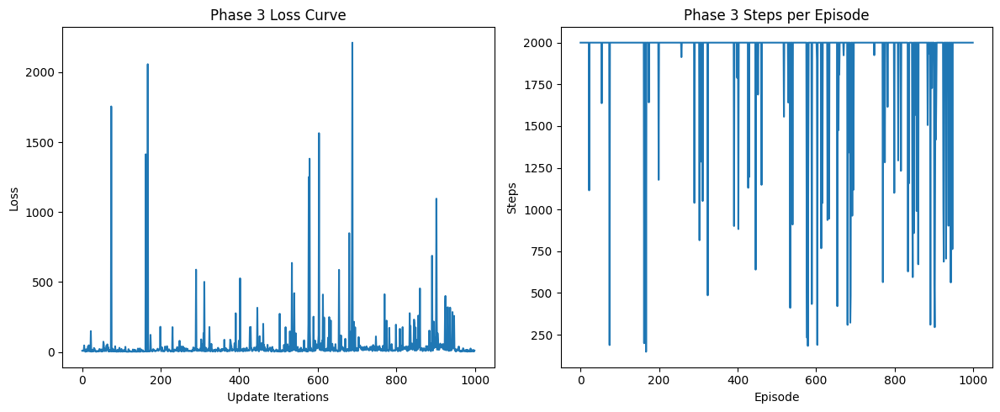

In [107]:
# 可视化训练结果
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(phase3_agent.costs)
plt.title("Phase 3 Loss Curve")
plt.xlabel("Update Iterations")
plt.ylabel("Loss")

plt.subplot(1, 2, 2)
plt.plot(phase3_agent.steps_per_episode)
plt.title("Phase 3 Steps per Episode")
plt.xlabel("Episode")
plt.ylabel("Steps")

plt.tight_layout()
plt.show()

=== Phase 3 model testing ===
🎬 Finished：
🚶 Steps: 900, 🏆 Total_reward: -766.0000000000113


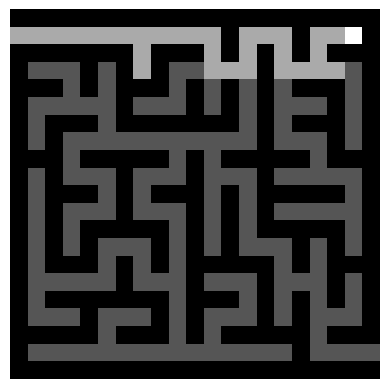

In [206]:
# 测试最终模型
print("=== Phase 3 model testing ===")
test_and_show_video(phase3_env, phase3_agent)